In [1]:
%load_ext autoreload
%autoreload 2
from boxes import *
from learner import *
import math
import matplotlib.pyplot as plt
import os
import wandb
import pickle

import numpy as np

import matplotlib.patches as patches
import matplotlib.colors as mcolors


%matplotlib inline

In [2]:
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed) # cpu
    torch.cuda.manual_seed_all(seed)  # gpu
    
set_seed(1234)

torch.set_printoptions(precision=16)

split_num = 3
weight_alignment_loss = 10

In [3]:
use_cuda = torch.cuda.is_available()
device = torch.device('cuda' if use_cuda else 'cpu')
use_cuda

False

In [4]:
PATH = 'data/ontologies/anatomy/debug/'

# aligment training split
ats = ""

# Transitive closure
Transitive_Closure = False

if Transitive_Closure:
    tc = "tc_"
else:
    tc = ""

# Data in unary.tsv are probabilites separated by newlines. The probability on line n is P(n), where n is the id assigned to the nth element.
#unary_prob = [1/9, 1/9, 1/9, 1/9, 1/9, 1/9, 1/9, 1/9, 1/9, 1/9, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
unary_prob = [1/3, 1/3, 1/3, 1/3, 1/3, 1/3, 1/3]
unary_prob = torch.tensor(unary_prob).float().to(device)
num_boxes = unary_prob.shape[0]

# We're going to use random negative sampling during training, so no need to include negatives in our training data itself
train = Probs.load_from_julia(PATH, f'tr_pos.tsv', f'tr_neg.tsv', ratio_neg = 0).to(device)

# The dev set will have a fixed set of negatives, however.
dev = Probs.load_from_julia(PATH, f'dev_align_pos.tsv', f'dev_align_neg.tsv', ratio_neg = 0).to(device)

# This set is used just for evaluation purposes after training
tr_align = Probs.load_from_julia(PATH, f'tr_align_pos.tsv', f'tr_align_neg.tsv', ratio_neg = 0).to(device)


In [5]:
mouse_eval = Probs.load_from_julia(PATH, 'human_dev_pos.tsv', 'human_dev_neg.tsv', ratio_neg = 0).to(device)
human_eval = Probs.load_from_julia(PATH, 'mouse_dev_pos.tsv', 'mouse_dev_neg.tsv', ratio_neg = 0).to(device)


In [6]:
import torch
from torch import Tensor # for type annotations
import torch.nn.functional as F
from typing import *

'''
def _intersection(self: TBoxTensor,
                  other: TBoxTensor,
                  gumbel_beta: float = 1.0,
                  bayesian :bool = False) -> Tuple[Tensor, Tensor]:
    t1 = self
    t2 = other
    # broadcast if necessary

    if len(t1.data.shape) > len(t2.data.shape):
        t2 = self._broadcast_other(t1, t2)
    elif len(t1.data.shape) < len(t2.data.shape):
        t1 = self._broadcast_other(t2, t1)

    if bayesian:
        try:
            z = gumbel_beta * torch.logsumexp(torch.stack((t1.z / gumbel_beta, t2.z / gumbel_beta)), 0)
            z = torch.max(z, torch.max(t1.z, t2.z))
            Z = - gumbel_beta * torch.logsumexp(torch.stack((-t1.Z / gumbel_beta, -t2.Z / gumbel_beta)), 0)
            Z = torch.min(Z, torch.min(t1.Z, t2.Z))
        except:
            breakpoint()
    else:
        z = torch.max(t1.z, t2.z)
        Z = torch.min(t1.Z, t2.Z)

    return z, Z


def gumbel_intersection(self: TBoxTensor, other: TBoxTensor, gumbel_beta: float=1.) -> TBoxTensor:
    z, Z = self._intersection(other, gumbel_beta=gumbel_beta, bayesian=True)
    return BoxTensor.from_zZ(z, Z)
'''

def gumbel_intersection(A: Tensor, B: Tensor, gumbel_beta: float=1.)-> Tensor:
    Az = A[...,0,:]
    AZ = A[...,1,:]
    Bz = B[...,0,:]
    BZ = B[...,1,:]
    
    gumbel_beta = 0.1
    z = gumbel_beta * torch.logsumexp(torch.stack((Az / gumbel_beta, Bz / gumbel_beta)), 0)
    z = torch.max(z, torch.max(Az, Bz))
    Z = - gumbel_beta * torch.logsumexp(torch.stack((-AZ / gumbel_beta, -BZ / gumbel_beta)), 0)
    Z = torch.min(Z, torch.min(AZ, BZ))
    return torch.stack((z, Z), dim=-2)


def log_soft_volume_adjusted(
                     boxes: Tensor,
                     temp: float = 1.,
                     gumbel_beta: float = 1.,
                     scale: Union[float, Tensor] = 1.) -> Tensor:
    
    euler_gamma = 0.57721566490153286060
    gumbel_beta = 0.1
    
    z = boxes[:,:,0]
    Z = boxes[:,:,1]
    eps = torch.finfo(z.dtype).tiny  # type: ignore
    

    
    if isinstance(scale, float):
        s = torch.tensor(scale)
    else:
        s = scale

    return (torch.sum(
        torch.log(F.softplus(Z - z - 2*euler_gamma*gumbel_beta, beta=temp).clamp_min(eps)),
        dim=-1) + torch.log(s)
    )




def intersection(A: Tensor, B: Tensor) -> Tensor:
    """
    :param A: Tensor(..., zZ, dim)
    :param B: Tensor(..., zZ, dim)
    :return: Tensor(..., zZ, dim), box embeddings for A intersect B
    """
    z = torch.max(A[...,0,:], B[...,0,:])
    Z = torch.min(A[...,1,:], B[...,1,:])
    
#     z = gumbel_beta * torch.logsumexp(torch.stack((t1.z / gumbel_beta, t2.z / gumbel_beta)), 0)
#     z = torch.max(z, torch.max(t1.z, t2.z))
#     Z = - gumbel_beta * torch.logsumexp(torch.stack((-t1.Z / gumbel_beta, -t2.Z / gumbel_beta)), 0)
#     Z = torch.min(Z, torch.min(t1.Z, t2.Z))
    return torch.stack((z, Z), dim=-2)

def neg_edge_adjustment(A: Tensor) -> Tensor:
    """
    :param A: Tensor(..., zZ, dim)
    
    Replace "negative" edges with their mean.
    
    (TODO: optimize this)
    """
    center_of_meet = torch.mean(A, dim=-2)
    neg_edges_mask = ((A[...,1,:] - A[...,0,:]) >= 0)
    neg_edges_mask_stack = torch.stack((neg_edges_mask, neg_edges_mask), dim=-2)
    center_of_meet_stack = torch.stack((center_of_meet, center_of_meet), dim=-2)
    return torch.where(neg_edges_mask_stack, A, center_of_meet_stack)

def join(A: Tensor, B: Tensor) -> Tensor:
    """
    :param A: Tensor(model, pair, zZ, dim)
    :param B: Tensor(model, pair, zZ, dim)
    :return: Tensor(model, pair, zZ, dim), box embeddings for the smallest box which contains A and B
    """
    z = torch.min(A[:,:,0], B[:,:,0])
    Z = torch.max(A[:,:,1], B[:,:,1])
    return torch.stack((z, Z), dim=2)


def clamp_volume(boxes: Tensor) -> Tensor:
    """
    :param boxes: Tensor(... zZ, dim)
    :return: Tensor(...) of volumes
    """
    return torch.prod((boxes[...,1,:] - boxes[...,0,:]).clamp_min(0), dim=-1)


def soft_volume(boxes: Tensor) -> Tensor:
    """
    :param sidelengths: Tensor(model, box, dim)
    :return: Tensor(model, box) of volumes
    """
#     print("you are in soft_volume now!!!")
#     print("Z:",boxes[:,0,1])
#     print("z:",boxes[:,0,0])
#     print("boxes[:,0,1] - boxes[:,0,0]:", boxes[:,0,1] - boxes[:,0,0])
#     print("after softplus:", F.softplus(boxes[:,0,1] - boxes[:,0,0]))
    return torch.prod(F.softplus(boxes[:,:,1] - boxes[:,:,0]), dim=-1)


def log_clamp_volume(boxes: Tensor, eps:float = torch.finfo(torch.float32).tiny) -> Tensor:
    """
    :param boxes: Tensor(model, box, zZ, dim)
    :return: Tensor(model, box) of volumes
    """
    return torch.sum(torch.log((boxes[:,:,1] - boxes[:,:,0]).clamp_min(0) + eps), dim=-1)


def log_soft_volume(boxes: Tensor, eps:float = torch.finfo(torch.float32).tiny) -> Tensor:
    """
    :param sidelengths: Tensor(model, box, dim)
    :return: Tensor(model, box) of volumes
    """
    return torch.sum(torch.log(F.softplus(boxes[:,:,1] - boxes[:,:,0]) + eps), dim=-1)


def smallest_containing_box(boxes: Tensor) -> Tensor:
    """
    Returns the smallest box which contains all boxes in `boxes`.
    
    :param boxes: Box embedding of shape (model, box, zZ, dim)
    :return: Tensor of shape (model, 1, zZ, dim)
    """
    z = boxes[:,:,0]
    Z = boxes[:,:,1]
    min_z, _ = torch.min(z, dim=1, keepdim=True)
    max_Z, _ = torch.max(Z, dim=1, keepdim=True)
    return torch.stack((min_z, max_Z), dim=2)

def smallest_containing_box_outside_unit_cube(boxes: Tensor) -> Tensor:
    """
    Returns the smallest box which contains all boxes in `boxes` and the unit cube.

    :param boxes: Box embedding of shape (model, box, zZ, dim)
    :return: Tensor of shape (model, 1, zZ, dim)
    """
    z = boxes[:,:,0]
    Z = boxes[:,:,1]
    min_z, _ = torch.min(z, dim=1, keepdim=True)
    max_Z, _ = torch.max(Z, dim=1, keepdim=True)
    min_z = min_z.clamp_max(0)
    max_Z = max_Z.clamp_min(1)
    return torch.stack((min_z, max_Z), dim=2)


def detect_small_boxes(boxes: Tensor, vol_func: Callable = clamp_volume, min_vol: float = 1e-20) -> Tensor:
    """
    Returns the indices of boxes with volume smaller than eps.

    :param boxes: box parametrization as Tensor(model, box, z/Z, dim)
    :param vol_func: function taking in side lengths and returning volumes
    :param min_vol: minimum volume of boxes
    :return: masked tensor which selects boxes whose side lengths are less than min_vol
    """
    return vol_func(boxes) < min_vol


def replace_Z_by_cube(boxes: Tensor, indices: Tensor, cube_vol: float = 1e-20) -> Tensor:
    """
    Returns a new Z parameter for boxes for which those boxes[indices] are now replaced by cubes of size cube_vol

    :param boxes: box parametrization as Tensor(model, box, z/Z, dim)
    :param indices: box indices to replace by a cube
    :param cube_vol: volume of cube
    :return: tensor representing the Z parameter
    """
    return boxes[:, :, 0][indices] + cube_vol ** (1 / boxes.shape[-1])



def replace_Z_by_cube_(boxes: Tensor, indices: Tensor, cube_vol: float = 1e-20) -> Tensor:
    """
    Replaces the boxes indexed by `indices` by a cube of volume `min_vol` with the same z coordinate

    :param boxes: box parametrization as Tensor(model, box, z/Z, dim)
    :param indices: box indices to replace by a cube
    :param cube_vol: volume of cube
    :return: tensor representing the box parametrization with those boxes
    """
    boxes[:, :, 1][indices] = replace_Z_by_cube(boxes, indices, cube_vol)


def disjoint_boxes_mask(A: Tensor, B: Tensor) -> Tensor:
    """
    Returns a mask for when A and B are disjoint.
    Note: This is symmetric with respect to the arguments.
    """
    return ((B[:,:,1] <= A[:,:,0]) | (B[:,:,0] >= A[:,:,1])).any(dim=-1)


def overlapping_boxes_mask(A: Tensor, B: Tensor) -> Tensor:
    return disjoint_boxes_mask(A, B) ^ 1


def containing_boxes_mask(A: Tensor, B: Tensor) -> Tensor:
    """
    Returns a mask for when B contains A.
    Note: This is *not* symmetric with respect to it's arguments!
    """
    return ((B[:,:,1] >= A[:,:,1]) & (B[:,:,0] <= A[:,:,0])).all(dim=-1)


def needing_pull_mask(A: Tensor, B: Tensor, target_prob_B_given_A: Tensor) -> Tensor:
    return (target_prob_B_given_A != 0) & disjoint_boxes_mask(A, B)


def needing_push_mask(A: Tensor, B: Tensor, target_prob_B_given_A: Tensor) -> Tensor:
    return (target_prob_B_given_A != 1) & containing_boxes_mask(A, B)


In [7]:
import torch
from torch import Tensor
import scipy.stats as spstats # For Spearman r
from sklearn.metrics import roc_curve, precision_recall_curve  # for roc_curve


def metric_hard_accuracy(model, data_in, data_out):
    hard_pred = model(data_in, is_align=torch.tensor(0))["P(A|B)"] > 0.5
#     print("data_in:", data_in)
#     print("hard_pred:", hard_pred)
    return (data_out == hard_pred.float()).float().mean()


def metric_hard_f1(model, data_in, data_out):
    hard_pred = model(data_in, is_align=torch.tensor(0))["P(A|B)"] > 0.5
    true_pos = data_out[hard_pred==1].sum()
    total_pred_pos = (hard_pred==1).sum().float()
    total_actual_pos = data_out.sum().float()
    precision = true_pos / total_pred_pos
    recall = true_pos / total_actual_pos
    return 2 * (precision*recall) / (precision + recall)

def metric_hard_accuracy_align(model, data_in, data_out, threshold:float):
    A_given_B = data_in[::2]
    B_given_A = data_in[1::2,:]
    data_out = data_out[::2]

    align_probs = torch.stack((model(A_given_B, is_align=torch.tensor(1))["P(A|B)"], model(B_given_A, is_align=torch.tensor(1))["P(A|B)"]), dim=1)
    p = torch.min(align_probs, dim=1).values
    hard_pred = p > threshold

    return (data_out == hard_pred).float().mean()

def metric_hard_f1_align(model, data_in, data_out, threshold:float):
    A_given_B = data_in[::2]
    B_given_A = data_in[1::2,:]
    data_out = data_out[::2]

    align_probs = torch.stack((model(A_given_B, is_align=torch.tensor(1))["P(A|B)"], model(B_given_A, is_align=torch.tensor(1))["P(A|B)"]), dim=1)
    p = torch.min(align_probs, dim=1).values
    hard_pred = p > threshold

    true_pos = data_out[hard_pred==1].sum()
    total_pred_pos = (hard_pred==1).sum().float()
    total_actual_pos = data_out.sum().float()

    precision = true_pos / total_pred_pos
    recall = true_pos / total_actual_pos

    return 2 * (precision*recall) / (precision + recall)

def metric_hard_accuracy_align_mean(model, data_in, data_out, threshold):
    A_given_B = data_in[::2]
    B_given_A = data_in[1::2,:]
    data_out = data_out[::2]

    align_probs = torch.stack((model(A_given_B, is_align=torch.tensor(1))["P(A|B)"], model(B_given_A, is_align=torch.tensor(1))["P(A|B)"]), dim=1)
    p = torch.mean(align_probs, dim=1)
    hard_pred = p > threshold

    return (data_out == hard_pred).float().mean()

def metric_hard_f1_align_mean(model, data_in, data_out, threshold):
    A_given_B = data_in[::2]
    B_given_A = data_in[1::2,:]
    data_out = data_out[::2]

    align_probs = torch.stack((model(A_given_B, is_align=torch.tensor(1))["P(A|B)"], model(B_given_A, is_align=torch.tensor(1))["P(A|B)"]), dim=1)
    p = torch.mean(align_probs, dim=1)
    hard_pred = p > threshold

    true_pos = data_out[hard_pred==1].sum()
    total_pred_pos = (hard_pred==1).sum().float()
    total_actual_pos = data_out.sum().float()

    precision = true_pos / total_pred_pos
    recall = true_pos / total_actual_pos

    return 2 * (precision*recall) / (precision + recall)


In [8]:
import torch
from torch.utils.data import Dataset
from typing import *
from dataclasses import dataclass, field
import wandb

try:
    from IPython import get_ipython
    if 'IPKernelApp' not in get_ipython().config:  # pragma: no cover
        raise ImportError("console")
except:
    pass
else:
    import ipywidgets as widgets
    from IPython.core.display import HTML, display

if TYPE_CHECKING:
    from learner import Learner, Recorder


class Callback:
    def learner_post_init(self, learner: Learner):
        pass

    def train_begin(self, learner: Learner):
        pass

    def epoch_begin(self, learner: Learner):
        pass

    def batch_begin(self, learner: Learner):
        pass

    def backward_end(self, learner: Learner):
        pass

    def batch_end(self, learner: Learner):
        pass

    def epoch_end(self, learner: Learner):
        pass

    def train_end(self, learner: Learner):
        pass

    def eval_align(self, learner: Learner, threshold:float):
        pass

    def metric_plots(self, l: Learner):
        pass

    def eval_end(self, l: Learner):
        pass

    def bias_metric(self, l: Learner):
        pass

class CallbackCollection:

    def __init__(self, *callbacks: Callback):
        self._callbacks = callbacks

    def __call__(self, action: str, *args, **kwargs):
        for c in self._callbacks:
            getattr(c, action)(*args, **kwargs)

    def __getattr__(self, action: str):
        return lambda *args, **kwargs: self.__call__(action, *args, **kwargs)


@dataclass
class GradientClipping(Callback):
    min: float = None
    max: float = None

    def backward_end(self, learner: Learner):
        for param in learner.model.parameters():
            if param.grad is not None:
                param.grad = param.grad.clamp(self.min, self.max)


@dataclass
class LossCallback(Callback):
    recorder: Recorder
    ds: Dataset
    weighted: bool = True

    @torch.no_grad()
    def train_begin(self, learner: Learner):
        self.epoch_end(learner)

    @torch.no_grad()
    def epoch_end(self, l: Learner):
        data_in, data_out = self.ds[:]
        if l.categories:
            split_in, split_out = l.split_data(data_in, data_out, split=2737)
            
            model_pred = []
            count = 0
            for item in split_in:
                if len(item)>0:
                    if count<2:
                        model_pred.append(l.model(item, is_align=torch.tensor(0)))
                    else:
                        model_pred.append(l.model(item, is_align=torch.tensor(1)))
                else:
                    model_pred.append({'P(A|B)':l.TensorNaN(device=data_in.device)})
                count+=1

            #model_pred = [l.model(item) if len(item)>0 else {'P(A|B)':l.TensorNaN(device=data_in.device)} for item in split_in]
            l.loss_fn(model_pred, split_out, l, self.recorder, weighted=self.weighted, categories=True)  
        else:
            output = l.model(data_in, is_align=torch.tensor(0))
            l.loss_fn(output, data_out, l, self.recorder, weighted=self.weighted) # this logs the data to the recorder


@dataclass
class MetricCallback(Callback):
    recorder: Recorder
    ds: Dataset
    data_categories: str
    metric: Callable
    use_wandb: bool = False
    name: Union[str, None] = None

    def __post_init__(self):
        if self.name is None:
            self.name = self.metric.__name__
        self.name = self.recorder.get_unique_name(self.name)

    @torch.no_grad()
    def train_begin(self, learner: Learner):
        self.epoch_end(learner)

    @torch.no_grad()
    def epoch_end(self, l: Learner):
        data_in, data_out = self.ds[:]
        metric_val = self.metric(l.model, data_in, data_out)
        self.recorder.update_({self.name: metric_val}, l.progress.current_epoch_iter)
        
        print("evaluation_" + self.data_categories + "_" + self.name, str(metric_val))
        
        if self.use_wandb:
            metric_name = "evaluation_" + self.data_categories + "_" + self.name
            wandb.log({metric_name: metric_val})

@dataclass
class EvalAlignment(Callback):
    recorder: Recorder
    ds: Dataset
    data_categories: str
    metric: callable
    use_wandb: bool = False
    name: Union[str, None] = None
        

    def __post_init__(self):
        if self.name is None:
            self.name = self.metric.__name__
        self.name = self.recorder.get_unique_name(self.name)

    @torch.no_grad()
    def eval_align(self, l: Learner, threshold: float):
        data_in, data_out = self.ds[:]
        metric_val = self.metric(l.model, data_in, data_out, threshold)
        self.recorder.update_({self.name: metric_val}, threshold)
        
        print("align_evaluation_" + self.data_categories + "_" + str(threshold) + "_" + self.name, str(metric_val))
        
        if self.use_wandb:
            metric_name = "align_evaluation_" + self.data_categories + "_" + str(threshold) + "_" + self.name
            wandb.log({metric_name: metric_val})


In [9]:
import torch
from torch import Tensor
import torch.nn as nn
from torch.nn import Module, Parameter
import torch.nn.functional as F


################################################
# Box Parametrization Layers
################################################
default_init_min_vol = torch.finfo(torch.float32).tiny

def initialize_boxes_in_unit_cube(shape_prefix: Tuple[int], dims:int, init_min_vol: float = default_init_min_vol,
    method = "gibbs", gibbs_iter: int = 2000, **kwargs):
    """
    Creates the Parameters used for the representation of boxes.
    Initializes boxes with a uniformly random distribution of coordinates, ensuring that each box
    contains a cube of volume larger than init_min_vol.

    :param shape_prefix: Tuple which prefixes the parameters, eg. (num_boxes, num_models) will lead to
        a Tensor of shape (num_boxes, num_models, 2, dims)
    :param dims: Dimension of boxes
    :param init_min_vol: Minimum volume for boxes which are created
    :param kwargs: Unused for now, but include this for future possible parameters.
    """
    if method == "gibbs":
        sides = torch.ones(*shape_prefix, dims)
        log_min_vol = torch.log(torch.tensor(init_min_vol))
        for i in range(gibbs_iter):
            idx = torch.randint(0, dims, shape_prefix)[...,None]
            sides.scatter_(-1, idx, 1)
            complement = torch.log(sides).sum(dim=-1)
            min = torch.exp(log_min_vol - complement)[..., None]
            new_lengths = min + torch.rand(idx.shape) * (1 - min)
            sides.scatter_(-1, idx, new_lengths)

        z = torch.rand(*shape_prefix, dims) * (1-sides)
        Z = z + sides

    else:
        rand_param = lambda min, max: min + torch.rand(*shape_prefix, dims) * (max - min)
        if init_min_vol == 0:
            per_dim_min = 0
        elif init_min_vol > 0:
            per_dim_min = torch.tensor(init_min_vol).pow(1/dims)
        else:
            raise ValueError(f"init_min_vol={init_min_vol} is an invalid option.")

        z = rand_param(0, 1-per_dim_min)
        Z = rand_param(z+per_dim_min, 1)

    return torch.stack((z,Z), dim=-2)


class BoxParam(Module):
    """
    An example class for creating a box parametrization.
    Don't inherit from this, it is just an example which contains the methods for a class to be used as a BoxParam
    layer. Refer to the docstring of the functions when implementing your own BoxParam.

    Note: to avoid naming conflicts with min/max functions, we refer to the min coordinate for a box as `z`, and the
    max coordinate as `Z`.
    """

    def __init__(self, num_models:int, num_boxes:int, dim:int, **kwargs):
        """
        Creates the Parameters used for the representation of boxes.

        :param num_models: Number of models
        :param num_boxes: Number of boxes
        :param dim: Dimension
        :param kwargs: Unused for now, but include this for future possible parameters.
        """
        # Remember to call:
        super().__init__()
        raise NotImplemented


    def forward(self, box_indices = slice(None, None, None), **kwargs) -> Tensor:
        """
        Returns a Tensor representing the boxes specified by `box_indices` in the form they should be used for training.

        :param box_indices: Slice, List, or Tensor of the box indices
        :param kwargs: Unused for now, but include this for future possible parameters.
        :return: Tensor of shape (model, id, zZ, dim).
        """
        raise NotImplemented


class Boxes(Module):
    """
    Parametrize boxes using the min coordinate and max coordinate,
    initialized to be in the unit hypercube.

    self.boxes[model, box, min/max, dim] \in [0,1]

    In this parametrization, the min and max coordinates are explicitly stored
    in separate dimensions (as shown above), which means that care must be
    taken to preserve max > min while training. (See MinBoxSize Callback.)
    """

    def __init__(self, num_models: int, num_boxes: int, dims: int,
                 init_min_vol: float = default_init_min_vol, method = "gibbs", gibbs_iter: int = 2000, **kwargs):
        super().__init__()
        self.boxes = Parameter(initialize_boxes_in_unit_cube((num_models, num_boxes), dims, init_min_vol, method, gibbs_iter, **kwargs))

    def forward(self, box_indices = slice(None, None, None), **kwargs) -> Tensor:
        """
        Returns a Tensor representing the box embeddings specified by box_indices.

        :param box_indices: Slice, List, or Tensor of the box indices
        :param kwargs: Unused for now, but include this for future possible parameters.
        :return: NamedTensor of shape (model, id, zZ, dim).
        """
        return self.boxes[:, box_indices]



class MinMaxSigmoidBoxes(Module):
    """
    Parametrize boxes using sigmoid to make them always valid and contained within the unit cube.

    self.boxes[model, box, 2, dim] in Reals


    In this parametrization, we first convert to the unit cube:

    unit_cube_boxes = torch.sigmoid(self.boxes)  # shape: (model, box, 2, dim)

    We now select the z/Z coordinates by taking the min/max over axis 2, i.e.

    z, _ = torch.min(unit_cube_boxes, dim=2)
    Z, _ = torch.max(unit_cube_boxes, dim=2)
    """

    def __init__(self, num_models: int, num_boxes: int, dim: int, init_min_vol: float = default_init_min_vol,  **kwargs):
        super().__init__()
        unit_boxes = Boxes(num_models, num_boxes, dim, init_min_vol, **kwargs)
        self._from_UnitBoxes(unit_boxes)
        del unit_boxes


    def _from_UnitBoxes(self, unit_boxes:Boxes):
        boxes = unit_boxes().detach().clone()
        self.boxes = Parameter(torch.log(boxes / (1-boxes)))


    def forward(self, box_indices = slice(None, None, None), **kwargs) -> Tensor:
        """
        Returns a Tensor representing the box embeddings specified by box_indices.

        :param box_indices: A NamedTensor of the box indices
        :param kwargs: Unused for now, but include this for future possible parameters.
        :return: Tensor of shape (model, id, zZ, dim).
        """
        unit_cube_boxes = torch.sigmoid(self.boxes)
        z, _ = torch.min(unit_cube_boxes, dim=2)
        Z, _ = torch.max(unit_cube_boxes, dim=2)
        return torch.stack((z,Z), dim=2)
    
class AlignmentBoxes(Module):
    """
    Parametrize boxes using sigmoid to make them always valid and contained within the unit cube.

    self.boxes[model, box, 2, dim] in Reals


    In this parametrization, we first convert to the unit cube:

    unit_cube_boxes = torch.sigmoid(self.boxes)  # shape: (model, box, 2, dim)

    We now select the z/Z coordinates by taking the min/max over axis 2, i.e.

    z, _ = torch.min(unit_cube_boxes, dim=2)
    Z, _ = torch.max(unit_cube_boxes, dim=2)
    """

    def __init__(self, num_models: int, num_boxes: int, dim: int, init_min_vol: float = default_init_min_vol,  **kwargs):
        super().__init__()
        unit_boxes = Boxes(num_models, num_boxes, dim, init_min_vol, **kwargs)
        self._from_UnitBoxes(unit_boxes)
        self.fc1 = nn.Linear(dim, 64)
        self.fc2 = nn.Linear(64, dim)
        #self.fc = nn.Linear(dim, dim)
        del unit_boxes


    def _from_UnitBoxes(self, unit_boxes:Boxes):
        boxes = unit_boxes().detach().clone()
        self.boxes = Parameter(torch.log(boxes / (1-boxes)))


    def forward(self, box_indices = slice(None, None, None), is_align=torch.tensor(0), **kwargs) -> Tensor:
        """
        Returns a Tensor representing the box embeddings specified by box_indices.

        :param box_indices: A NamedTensor of the box indices
        :param kwargs: Unused for now, but include this for future possible parameters.
        :return: Tensor of shape (model, id, zZ, dim).
        """
        unit_cube_boxes = torch.sigmoid(self.boxes)
        z, _ = torch.min(unit_cube_boxes, dim=2)
        Z, _ = torch.max(unit_cube_boxes, dim=2)

#         if is_align.tolist() == 1:
# #             print("z before1:", z[0])
# #             print("w:", self.fc.weight)
# #             z = torch.nn.functional.relu(self.fc1(z))
# #             z = self.fc2(z)
# #             Z = torch.nn.functional.relu(self.fc1(Z))
# #             Z = self.fc2(Z)
#             z = self.fc1(z)
#             Z = self.fc1(Z)
#         else:
#             z = self.fc2(z)
#             Z = self.fc2(Z)

        if is_align.tolist() == 1:
            #print("before z", z)
            #print("before Z", Z)
            z = torch.nn.functional.relu(self.fc1(z))
            z = self.fc2(z)
            Z = torch.nn.functional.relu(self.fc1(Z))
            Z = self.fc2(Z)
            #print("after z", z)
            #print("after Z", Z)
            
#         if is_align.tolist() == 1:    
#             z = self.fc(z)
#             Z = self.fc(Z)

        #print("z Z", torch.stack((z,Z), dim=2))
        return torch.stack((z,Z), dim=2)


###############################################
# Downstream Model
###############################################

class WeightedSum(Module):
    def __init__(self, num_models: int) -> None:
        super().__init__()
        self.weights = Parameter(torch.rand(num_models))

    def forward(self, box_vols: Tensor) -> Tensor:
        return (F.softmax(self.weights, dim=0).unsqueeze(0) @ box_vols).squeeze()


class LogWeightedSum(Module):
    def __init__(self, num_models: int) -> None:
        super().__init__()
        self.weights = Parameter(torch.rand(num_models))

    def forward(self, log_box_vols: Tensor) -> Tensor:
        return (torch.logsumexp(self.weights + log_box_vols, 0) - torch.logsumexp(self.weights, 0))


class BoxModel(Module):
    def __init__(self, BoxParamType: type, vol_func: Callable, intersection_func: Callable,
                 num_models:int, num_boxes:int, dims:int,
                 init_min_vol: float = default_init_min_vol, universe_box: Optional[Callable] = None, **kwargs):
        super().__init__()
        self.box_embedding = BoxParamType(num_models, num_boxes, dims, init_min_vol, **kwargs)
        self.vol_func = vol_func
        self.intersection_func = intersection_func

        if universe_box is None:
            z = torch.zeros(dims)
            Z = torch.ones(dims)
            self.universe_box = lambda _: torch.stack((z,Z))[None, None]
            self.universe_vol = lambda _: self.vol_func(self.universe_box(None)).squeeze()
            self.clamp = True
        else:
            self.universe_box = universe_box
            self.universe_vol = lambda b: self.vol_func(self.universe_box(b))
            self.clamp = False

        self.weights = WeightedSum(num_models)

    def forward(self, box_indices: Tensor, is_align: Tensor = torch.tensor(0)) -> Dict:
        #print("is_align in BoxModel:", is_align)
        # Unary
        box_embeddings_orig = self.box_embedding(is_align = is_align)
        #print("box_embeddings_orig", box_embeddings_orig)
#         if self.clamp:
#             box_embeddings = box_embeddings_orig.clamp(0,1)
#         else:
#             box_embeddings = box_embeddings_orig
        box_embeddings = box_embeddings_orig
        universe_vol = self.universe_vol(box_embeddings)

        unary_probs = self.weights(self.vol_func(box_embeddings) / universe_vol)
        #print("unary_probs:", unary_probs)

        
        #print("after clamp box_embeddings", box_embeddings)
        # Conditional
        A = box_embeddings[:, box_indices[:,0]]
        B = box_embeddings[:, box_indices[:,1]]
        #print("------------------------------------")
        #print("A", A)
        #print("B", B)
        #print("A shape", A.shape) #1 4 2 2
        #print("A", A[0, 0])
        #print("B", B[0, 0])
        #print("intersection_func(A, B)", self.intersection_func(A, B)[0, 0])
        
        #A_int_B_vol = self.weights(self.vol_func(intersection(A, B)) / universe_vol) + torch.finfo(torch.float32).tiny
        A_int_B_vol = self.weights(self.vol_func(self.intersection_func(A, B)) / universe_vol) + torch.finfo(torch.float32).tiny
        
        #print("box_indices", box_indices)
        #print("A_int_B_vol:", A_int_B_vol)
        
        B_vol = unary_probs[box_indices[:,1]] + torch.finfo(torch.float32).tiny
        #print("B_vol:", B_vol)
        P_A_given_B = torch.exp(A_int_B_vol - B_vol)
        #print("P_A_given_B:", P_A_given_B)
        #print("------------------------------------")
        
        # symmetric same
        # print("you are in right place!")
#         A = box_embeddings[:, box_indices[:,0]]
#         B = box_embeddings[:, box_indices[:,1]]
#         A_int_B_vol = self.weights(self.vol_func(intersection(A, B)) / universe_vol) + torch.finfo(torch.float32).tiny
#         A_join_B_vol = self.weights(self.vol_func(join(A, B)) / universe_vol) + torch.finfo(torch.float32).tiny
#         P_A_given_B = torch.exp(torch.log(A_int_B_vol) - torch.log(A_join_B_vol))
#         try:
#             print("box_embeddings_orig:", box_embeddings_orig)
#             print("box_indices:", box_indices[0])
#             print("A:", A[0][0])
#             print("B:", B[0][0])
#             print("intersection(A, B):", intersection(A, B)[0][0])
#             print("self.vol_func(intersection(A, B)):", self.vol_func(intersection(A, B))[0][0])
#             print("universe_vol:", universe_vol)
#             print("self.weights(self.vol_func(intersection(A, B)) / universe_vol):", self.weights(self.vol_func(intersection(A, B)) / universe_vol)[0])
#             print("A_int_B_vol:", A_int_B_vol[0])
#             print("unary_probs:", unary_probs)
#             print("B_vol:", B_vol[0])
#             print("P_A_given_B:", P_A_given_B[0])
#         except:
#             pass
        

        return {
            "unary_probs": unary_probs,
            "box_embeddings_orig": box_embeddings_orig,
            "A": A,
            "B": B,
            "P(A|B)": P_A_given_B,
        }


In [10]:
def get_boxes(idx, color, beo, dim=0):
    node = beo[idx,:,dim:dim+2].cpu().detach()
    
    width  = abs(node[1,0] - node[0,0])
    height = abs(node[1,1] - node[0,1])
    
    node_min = torch.min(node, dim=0).values
    
    rect = patches.Rectangle(node_min, width, height, linewidth=2, edgecolor=color, fill=True, facecolor=color, alpha=0.5)
    
    return rect, node_min[0].item(), node_min[1].item(), idx.item(), width, height

def draw(beo, box_idx):
    fig,ax = plt.subplots(1, figsize=(14,14), facecolor="white")

    #box_idx = torch.tensor(np.arange(2, 7))

    # colors = list(mcolors.CSS4_COLORS)
    colors = ['xkcd:orange red', 'xkcd:sunflower', 'xkcd:magenta', 'xkcd:baby purple',
              'xkcd:chartreuse',  'xkcd:greenish', 'xkcd:mint', 'xkcd:sky blue',
               'xkcd:slate blue', 'xkcd:deep red', 'xkcd:greyish brown', 'xkcd:canary yellow' ]

    rectangles = []
    labels = []

    # rect1 = patches.Rectangle(one_node_min, width, height,linewidth=2,edgecolor='r', fill=True, facecolor='r', alpha=0.3)
    # rect2 = patches.Rectangle((0.5,0.1),.1,.3,linewidth=2,edgecolor='b', fill=True, facecolor='b', alpha=0.3)
    left = 100
    right = -100
    top = -100
    bottom = 100
    # 0, 4
    for i, bidx in enumerate(box_idx):
        rect, xmin, ymin, name, w, h = get_boxes(bidx, colors[i], beo, dim=0)
        print(bidx, xmin, ymin, xmin + w, ymin + h)
        if xmin < left:
            left = xmin
        if ymin < bottom:
            bottom = ymin
        if xmin + w > right:
            right = xmin+w
        if ymin + h > top:
            top = ymin+h

        ax.text(xmin, ymin, bidx.item(), fontsize=14)
        ax.add_patch(rect)

        if bidx.item() < split_num:
            labels.append(str(name) + " (mouse)")
        else:
            labels.append(str(name) + " (human)")

    # ax.add_patch(rect2)

    # ax.set_xlim([-.1, 1.5])
    # ax.set_ylim([-.1, 1.5])

    
#     adjust_left = lambda x, y: x - (y-x)*0.1
#     adjust_right = lambda x, y: x + (y-x)*0.1
#     ax.set_xlim([adjust_left(left, right), adjust_right(left, right)])
#     ax.set_ylim([adjust_left(bottom, top), adjust_right(bottom, top)])
    
    ax.set_xlim([left, right])
    ax.set_ylim([bottom, top])

    # ax.legend(labels, fontsize=18, loc=10, )
    plt.show()



In [11]:
dims = 2
lr = 0.07342406890949607
#lr = 0.2
rns_ratio = 5
#box_type = MinMaxSigmoidBoxes, AlignmentBoxes
use_unary = False
unary_weight = 1e-2

In [12]:
box_model = BoxModel(
    BoxParamType=AlignmentBoxes,
    vol_func=log_soft_volume,
    #vol_func=log_soft_volume_adjusted,
    intersection_func = intersection,
    #intersection_func = gumbel_intersection,
    
    
    num_models=1,
    num_boxes=num_boxes,
    dims=dims,
    method="tree").to(device)


#### IF YOU ARE LOADING FROM JULIA WITH ratio_neg=0, train_dl WILL ONLY CONTAIN POSITIVE EXAMPLES
#### THIS MEANS YOUR MODEL SHOULD USE NEGATIVE SAMPLING DURING TRAINING
train_dl = TensorDataLoader(train, batch_size=2**3, shuffle=True)

mouse_dl = TensorDataLoader(mouse_eval, batch_size=2**3)
human_dl = TensorDataLoader(human_eval, batch_size=2**3)

eval_dl = [mouse_dl, human_dl]

opt = torch.optim.Adam(box_model.parameters(), lr=lr)

In [13]:
import torch.nn.functional as F
def kl_div_sym(p: Tensor, q: Tensor, eps: float = torch.finfo(torch.float32).tiny) -> Tensor:
    #print("p", p)
    #print("q", q)
    #print("kl_div_term(p, q, eps)", kl_div_term(p, q, eps))
    #print("kl_div_term(1-p, 1-q, eps)", kl_div_term(1-p, 1-q, eps))
    return kl_div_term(p, q, eps) + kl_div_term(1-p, 1-q, eps)

def kl_div_term(p: Tensor, q: Tensor, eps: float = torch.finfo(torch.float32).tiny) -> Tensor:
    return F.kl_div(torch.log(p.clamp_min(eps)), q.clamp_min(eps), reduction="none")

In [14]:
def mean_cond_kl_loss(model_out: ModelOutput, target: Tensor, eps: float = torch.finfo(torch.float32).tiny) -> Tensor:
    return kl_div_sym(model_out["P(A|B)"], target, eps).mean()

def human_cond_kl_loss(model_out: ModelOutput, target: Tensor, eps: float = torch.finfo(torch.float32).tiny) -> Tensor:
    return kl_div_sym(model_out["P(A|B)"], target, eps).mean()

def mouse_cond_kl_loss(model_out: ModelOutput, target: Tensor, eps: float = torch.finfo(torch.float32).tiny) -> Tensor:
    return kl_div_sym(model_out["P(A|B)"], target, eps).mean()

def align_cond_kl_loss(model_out: ModelOutput, target: Tensor, eps: float = torch.finfo(torch.float32).tiny) -> Tensor:
    #print("ModelOutput", ModelOutput)
    #print("target", target)
    #print("align_cond_kl_loss", kl_div_sym(model_out["P(A|B)"], target, eps).mean())
    return kl_div_sym(model_out["P(A|B)"], target, eps).mean()

# See boxes/loss_functions.py file for more options. Note that you may have to changed them to fit your use case.
# Also note that "kl_div_sym" is just binary cross-entropy.

In [15]:
global my_batch_in
global my_batch_out
my_batch_in = None
my_batch_out = None

@dataclass
class Learner:
    train_dl: DataLoader
    model: Module
    loss_fn: Callable
    opt: optim.Optimizer
    callbacks: CallbackCollection = field(default_factory=CallbackCollection)
    recorder: Recorder = field(default_factory=Recorder)
    categories: bool = False
    use_wandb: bool = False
    reraise_keyboard_interrupt: bool = False
    reraise_stop_training_exceptions: bool = False

    def __post_init__(self):
        self.progress = Progress(0,0,len(self.train_dl))
        self.callbacks.learner_post_init(self)

    #the split parameter will be used to find human/mouse/align data, so you need change it when using diff dataset(index)
    def split_data(self, batch_in, batch_out, split):
        category = torch.zeros(size=(batch_in.shape[0],), dtype=int)

        batch_class = batch_in > split

        for i, (a,b) in enumerate(batch_class):
            if not a and not b:
                category[i] = 0
            elif a and b:
                category[i] = 1
            else:
                category[i] = 2

        self.mouse_in = batch_in[category == 0]
        self.human_in = batch_in[category == 1]
        self.align_in = batch_in[category == 2]

        self.mouse_out = batch_out[category == 0]
        self.human_out = batch_out[category == 1]
        self.align_out = batch_out[category == 2]

        # INPUT TO THE MODEL:
        data_in = (self.mouse_in, self.human_in, self.align_in)
        # TARGET/LABEL:
        data_out = (self.mouse_out, self.human_out, self.align_out)

        return data_in, data_out

    def TensorNaN(self, size:Union[None,List[int], Tuple[int]]=None, device=None, requires_grad:bool=True):
        if size is None:    
            return torch.tensor(float('nan'), device=device, requires_grad=requires_grad)
        else:
            return float('nan') * torch.zeros(size=size, device=device, requires_grad=requires_grad)


    def train(self, epochs, progress_bar = True):
        global my_batch_in
        global my_batch_out
        try:
            self.callbacks.train_begin(self)
            for epoch in trange(epochs, desc="Overall Training:", disable=not progress_bar):
                self.callbacks.epoch_begin(self)
                for iteration, batch in enumerate(tqdm(self.train_dl, desc="Current Batch:", leave=False, disable=not progress_bar)):
                    # draw the boxes at every beginning of epoch
                    print("tree data:")
                    beo = box_model(torch.tensor([[1, 1]]), torch.tensor(0))['box_embeddings_orig'].squeeze(0)
#                     box_idx = torch.tensor([1, 2, 3, 4, 5, 6, 7, 8, 9])
                    box_idx = torch.tensor([1, 2, 3, 4, 5, 6])
                    draw(beo, box_idx)
                    
                    print("alignment data:")
                    beo = box_model(torch.tensor([[1, 1]]), torch.tensor(1))['box_embeddings_orig'].squeeze(0)
##                     box_idx = torch.tensor([2, 11, 4, 13, 6, 15, 9, 17])
                    box_idx = torch.tensor([1, 2, 3, 4, 5, 6])
                    #box_idx = torch.tensor([2, 3, 5, 6])
                    draw(beo, box_idx)

                    print("batch", batch)
                    if len(batch) == 2: # KLUDGE
                        self.batch_in, self.batch_out = batch
                    else:
                        self.batch_in = batch[0]
                        self.batch_out = None
                    self.progress.increment()
                    self.callbacks.batch_begin(self)
                    self.opt.zero_grad()
                    
                    if self.categories:
                        self.data_in, self.data_out = self.split_data(self.batch_in, self.batch_out, split=split_num)
                        #9 is max mouse index  
                        self.model_pred = []
                        count = 0
                        for item in self.data_in:
                            if len(item)>0:
                                if count<2:
                                    self.model_pred.append(self.model(item, is_align=torch.tensor(0)))
                                else:
                                    self.model_pred.append(self.model(item, is_align=torch.tensor(1)))
                            else:
                                self.model_pred.append({'P(A|B)':self.TensorNaN(device=self.batch_in.device)})
                            count+=1
                        #self.model_pred = [self.model(item, is_align=is_align) if len(item)>0 else {'P(A|B)':self.TensorNaN(device=self.batch_in.device)} for item in self.data_in]
                        #print("self.model_pred:", self.model_pred)
                        print("self.data_in:", self.data_in)
                        print("self.data_out:", self.data_out)
                        self.loss = self.loss_fn(self.model_pred, self.data_out, self, self.recorder, categories=True, use_wandb=self.use_wandb)   
                        print("previous loss:", self.loss)
                    else:
                        self.model_out = self.model(self.batch_in, is_align=False)
                        if self.batch_out is None:
                            self.loss = self.loss_fn(self.model_out, self, self.recorder, categories=True, use_wandb=self.use_wandb)
                        else:
                            self.loss = self.loss_fn(self.model_out, self.batch_out, self, self.recorder, categories=True, use_wandb=self.use_wandb)
                    
                    # Log metrics inside your training loop
                    if self.use_wandb:
                        metrics = {'epoch': epoch, 'loss': self.loss}
                        wandb.log(metrics)

                    # print(self.recorder.dataframe)
                    #print("loss:", self.loss)
                    self.loss.backward()
                    self.callbacks.backward_end(self)
                    self.opt.step()
                    self.callbacks.batch_end(self)
                # print(self.recorder.dataframe)
                
                # run evaluating at the end of every epoch
                #self.evaluation(np.arange(0.1, 1, 0.1))
                self.evaluation([0.8])
                
                
                self.callbacks.epoch_end(self)
        except StopTrainingException as e:
            print(e)
            if self.reraise_stop_training_exceptions:
                raise e
        except KeyboardInterrupt:
            print(f"Stopped training at {self.progress.partial_epoch_progress()} epochs due to keyboard interrupt.")
            if self.reraise_keyboard_interrupt:
                raise KeyboardInterrupt
        finally:
            self.callbacks.train_end(self)


    def evaluation(self, trials, progress_bar=True):
        with torch.no_grad():
            # self.callbacks.eval_begin(self)
            for t in trials:
                self.callbacks.eval_align(self, t)
            self.callbacks.metric_plots(self)
            self.callbacks.bias_metric(self)
            self.callbacks.eval_end(self)

In [16]:
import torch
from torch import Tensor
from torch.nn import Module
from typing import *
#from .learner import Learner, Recorder
from collections import OrderedDict
#import wandb

FuncInput = Union[OrderedDict, dict, Collection[Union[Callable, Tuple[float, Callable]]]]

def func_list_to_dict(*func_list: FuncInput) -> Dict[str, Callable]:
    """

    :param func_list: List of functions or tuples (weight, function)
    :type func_list: Union[Collection[Union[Callable, Tuple[float, Callable]]], Dict[str, Callable]]

    :return: Ordered Dictionary of {name: function}
    :rtype: OrderedDict[str, Callable]
    """
    if type(func_list) == OrderedDict or type(func_list) == dict:
        return func_list
    func_dict = OrderedDict()
    for f in func_list:
        if type(f) is tuple:
            func_dict[f"{f[0]}*{f[1].__name__}"] = lambda *args, weight=f[0], func=f[1], **kwargs: weight * func(*args, **kwargs)
        else:
            func_dict[f.__name__] = f
    return func_dict

def unweighted_func_dict(*func_list: FuncInput) -> Dict[str, Callable]:
    if type(func_list) == OrderedDict or type(func_list) == dict:
        return func_list
    func_dict = OrderedDict()
    for f in func_list:
        if type(f) is tuple:
            f = f[1]
        func_dict[f.__name__] = f
    return func_dict

def isnan(x):
    return (x != x)

class LossPieces(Module):

    def __init__(self, *loss_funcs: FuncInput):
        """

        :param functions: List of functions or tuples (weight, function)
        :type functions: Collection[Union[Callable, Tuple[float, Callable]]]
        """
        super().__init__()
        self.unweighted_funcs = unweighted_func_dict(*loss_funcs)
        self.loss_funcs = func_list_to_dict(*loss_funcs)

    def forward(self, model_out, true_out: Tensor,
                learner: Optional[Learner] = None,
                recorder: Optional[Recorder] = None,
                weighted: bool = True,
                categories: bool = False,
                use_wandb: bool = False,
                **kwargs) -> Tensor:
        """
        Weighted sum of all loss functions. Tracks values in Recorder.
        """
        if weighted:
            loss_funcs = self.loss_funcs
        else:
            loss_funcs = self.unweighted_funcs
        
        grad_status = torch.is_grad_enabled()
        if learner is None:
            torch.set_grad_enabled(False)
        
        # change the loss function for margin loss
        try:
            if categories:
                loss_pieces = {}
                for k,l in loss_funcs.items():
                    if 'mouse' in k:
                        loss_pieces['mouse_cond_kl_loss'] = l(model_out[0], true_out[0])
                    elif 'human' in k:
                        loss_pieces['human_cond_kl_loss'] = l(model_out[1], true_out[1])
                    else:
                        loss_pieces['align_cond_kl_loss'] = weight_alignment_loss*l(model_out[2], true_out[2])
#                     if 'mouse' in k:
#                         loss_pieces[k] = l(model_out[0], true_out[0])
#                     elif 'human' in k:
#                         loss_pieces[k] = l(model_out[1], true_out[1])
#                     else:
#                         loss_pieces[k] = l(model_out[2], true_out[2])
                if use_wandb:
                    # Log metrics inside your training loop
                    metrics = {'mouse_loss': torch.sum(loss_pieces['mouse_cond_kl_loss']), 
                               'human_loss': torch.sum(loss_pieces['human_cond_kl_loss']), 
                               'alignmnt_loss': torch.sum(loss_pieces['align_cond_kl_loss'])}
                    wandb.log(metrics)
                
                loss = 0
                for key,val in loss_pieces.items():
                    if not isnan(val):
                        loss += val
                        print("key", key)
                        print("val", val)
                        

            else:
                loss_pieces = {k: l(model_out, true_out) for k, l in loss_funcs.items()}
                loss = sum(loss_pieces.values())
          

            loss_pieces['loss'] = loss
            if learner is not None:
                if recorder is not None:
                    recorder.update_(loss_pieces, learner.progress.partial_epoch_progress())
                else:
                    self.recorder.update_(loss_pieces, learner.progress.partial_epoch_progress())
        finally:
            torch.set_grad_enabled(grad_status)
        return loss


In [17]:
# For this dataset we had unary probabilities as well as conditional probabilities. Our loss function will be a sum of these, which is provided by the following loss function wrapper:

# if use_unary:
#     loss_func = LossPieces(mean_cond_kl_loss, (unary_weight, mean_unary_kl_loss(unary_prob)))
# else:
#     loss_func = LossPieces(mean_cond_kl_loss)

loss_func = LossPieces((mouse_cond_kl_loss), (human_cond_kl_loss), (5e-2, align_cond_kl_loss))

metrics = [metric_hard_accuracy, metric_hard_f1]
align_metrics = [metric_hard_accuracy_align, metric_hard_f1_align, metric_hard_accuracy_align_mean, metric_hard_f1_align_mean]

rec_col = RecorderCollection()

# #threshold = np.arange(0.1, 1, 0.1)
# threshold = [0.5]

callbacks = CallbackCollection(
    LossCallback(rec_col.train, train),
    LossCallback(rec_col.dev, dev),
#     *(MetricCallback(rec_col.dev, dev, "dev", m) for m in metrics),
#     *(MetricCallback(rec_col.train, train, "train", m) for m in metrics),
    *(MetricCallback(rec_col.onto, human_eval, "human", m) for m in metrics),
    *(MetricCallback(rec_col.onto, mouse_eval, "mouse", m) for m in metrics),
    *(EvalAlignment(rec_col.train_align, tr_align, "train_align", m) for m in align_metrics),
    *(EvalAlignment(rec_col.dev_align, dev, "dev_align", m) for m in align_metrics),
    #JustGiveMeTheData(rec_col.probs, dev, get_probabilities),
    #BiasMetric(rec_col.bias, dev, pct_of_align_cond_on_human_as_min),
    #PlotMetrics(rec_col.dev_roc_plot, dev, roc_plot),
    #PlotMetrics(rec_col.dev_pr_plot, dev, pr_plot),
    #PlotMetrics(rec_col.tr_roc_plot, tr_align, roc_plot),
    #PlotMetrics(rec_col.tr_pr_plot, tr_align, pr_plot),
    #MetricCallback(rec_col.train, train, 'train', metric_pearson_r),
    #MetricCallback(rec_col.train, train, 'train', metric_spearman_r),
    #MetricCallback(rec_col.dev, dev, 'dev', metric_pearson_r),
    #MetricCallback(rec_col.dev, dev, 'dev', metric_spearman_r),
#     MetricCallback(rec_col.train, train, 'train', mean_reciprocal_rank),
#     MetricCallback(rec_col.dev, dev, 'dev', mean_reciprocal_rank),
#     PercentIncreaseEarlyStopping(rec_col.dev, "mean_cond_kl_loss", 0.25, 10),
#     PercentIncreaseEarlyStopping(rec_col.dev, "mean_cond_kl_loss", 0.5),
#     PercentIncreaseEarlyStopping(rec_col.dev, "mouse_cond_kl_loss", 0.25, 10),
#     PercentIncreaseEarlyStopping(rec_col.dev, "mouse_cond_kl_loss", 0.5),
#     GradientClipping(-1000,1000),
#     RandomNegativeSampling(num_boxes, rns_ratio),
    StopIfNaN(),
)

# l = Learner(train_dl, box_model, loss_func, opt, callbacks, recorder = rec_col.learn)
l = Learner(train_dl, box_model, loss_func, opt, callbacks, recorder = rec_col.learn, categories=True)

key mouse_cond_kl_loss
val tensor(1.0526580810546875)
key mouse_cond_kl_loss
val tensor(1.4054979085922241)
evaluation_human_metric_hard_accuracy tensor(0.5000000000000000)
evaluation_human_metric_hard_f1 tensor(0.6666666865348816)
evaluation_mouse_metric_hard_accuracy_1 tensor(0.5000000000000000)
evaluation_mouse_metric_hard_f1_1 tensor(0.6666666865348816)


tree data:
tensor(1) 0.25984418392181396 0.3666413426399231 tensor(0.4698078930377960) tensor(0.7825872302055359)
tensor(2) 0.05830073356628418 0.7006447315216064 tensor(0.2831369042396545) tensor(0.9195585846900940)
tensor(3) 0.05179738998413086 0.46813926100730896 tensor(0.6218782663345337) tensor(0.6299995779991150)
tensor(4) 0.6738061308860779 0.33146196603775024 tensor(0.7569047212600708) tensor(0.7522143125534058)
tensor(5) 0.7837080359458923 0.5630632042884827 tensor(0.9927566647529602) tensor(0.8863742947578430)
tensor(6) 0.7748504877090454 0.8208025693893433 tensor(0.8765545487403870) tensor(0.9060522913932800)


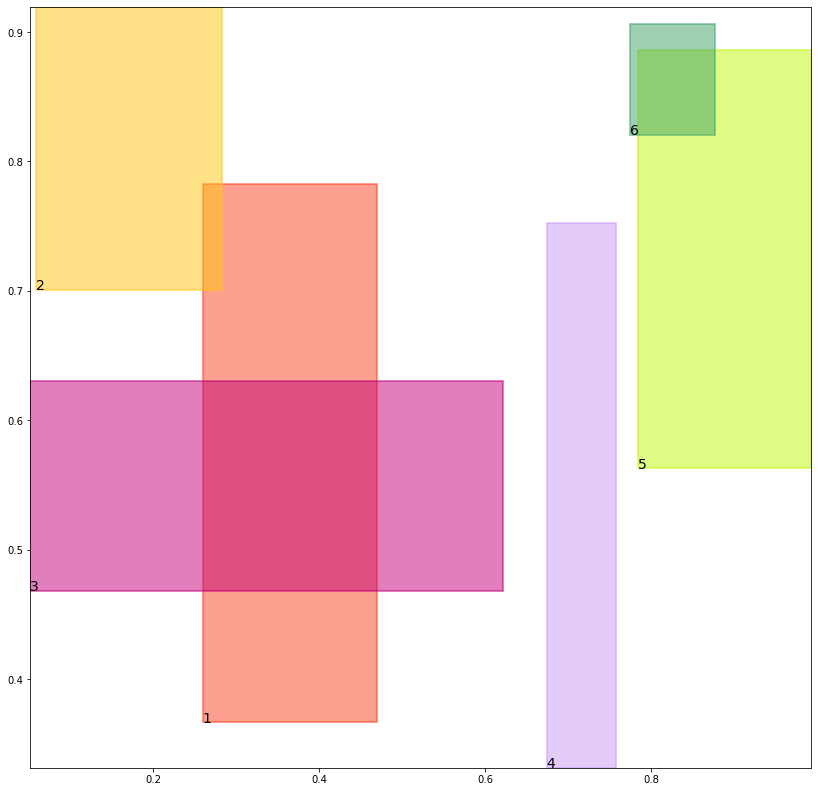

alignment data:
tensor(2) -0.11187077313661575 0.13124632835388184 tensor(-0.0751621425151825) tensor(0.1464135199785233)
tensor(3) -0.16639010608196259 0.13115164637565613 tensor(-0.0877801999449730) tensor(0.1516834795475006)
tensor(5) -0.21468038856983185 0.10527432709932327 tensor(-0.2058878988027573) tensor(0.1191686093807220)
tensor(6) -0.19426017999649048 0.10854892432689667 tensor(-0.1843162924051285) tensor(0.1167794689536095)


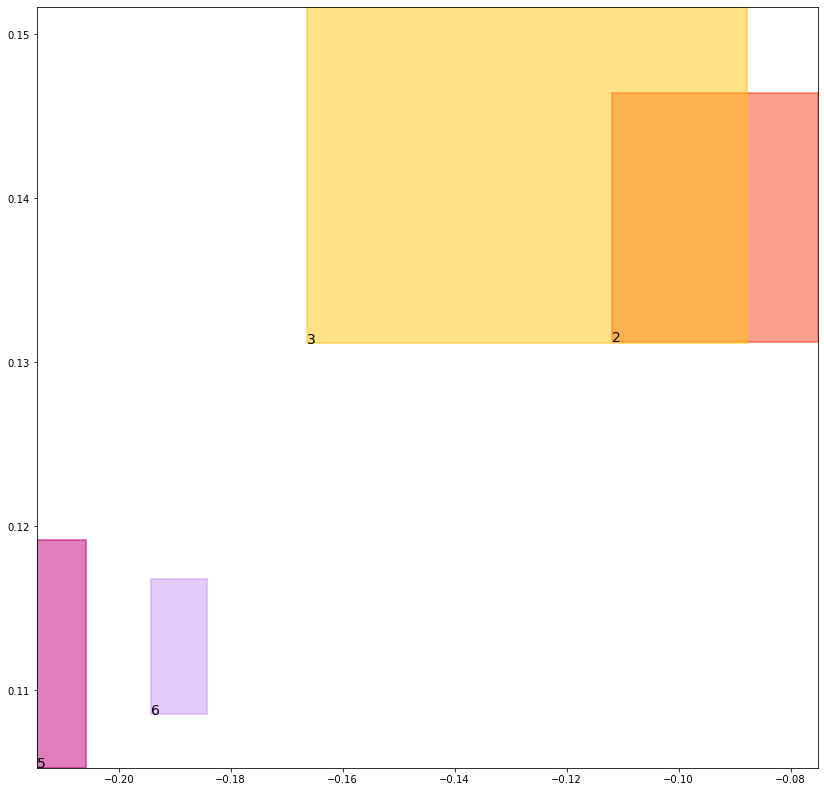

batch (tensor([[1, 3],
        [4, 6],
        [5, 3],
        [1, 2],
        [2, 6],
        [4, 5],
        [6, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.7050949335098267, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.6945415139198303, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2733357250690460, grad_fn=<MulBackward0>)
previous loss: tensor(1.6729722023010254, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.24597369134426117 0.34976398944854736 tensor(0.4881293177604675) tensor(0.7948206067085266)
tensor(2) 0.06246502324938774 0.6850215196609497 tensor(0.2684740722179413) tensor(0.9139572978019714)
tensor(3) 0.0555245541036129 0.4864553213119507 tensor(0.6044648885726929) tensor(0.6127272844314575)
tensor(4) 0.6574669480323792 0.31539759039878845 tensor(0.7701587677001953) tensor(0.7656449079513550)
tensor(5) 0.7958948016166687 0.5810359120368958 tensor(0.9922090768814087) tensor(0.8787669539451599)
tensor(6) 0.7874009013175964 0.8097475171089172 tensor(0.8683874607086182) tensor(0.8996132016181946)


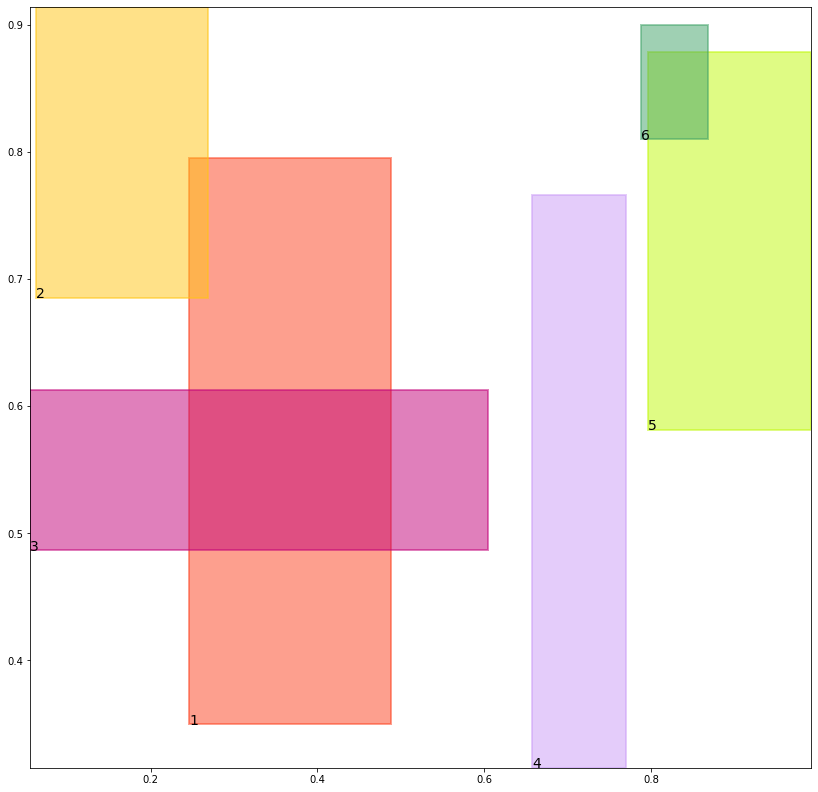

alignment data:
tensor(2) 0.33746346831321716 0.453031986951828 tensor(0.5601663589477539) tensor(0.6055834889411926)
tensor(3) 0.32094934582710266 0.4756617546081543 tensor(0.8645551204681396) tensor(0.9129889607429504)
tensor(5) 1.0394291877746582 1.06350839138031 tensor(1.2383397817611694) tensor(1.1793968677520752)
tensor(6) 1.0458788871765137 1.0286507606506348 tensor(1.1254088878631592) tensor(1.0809692144393921)


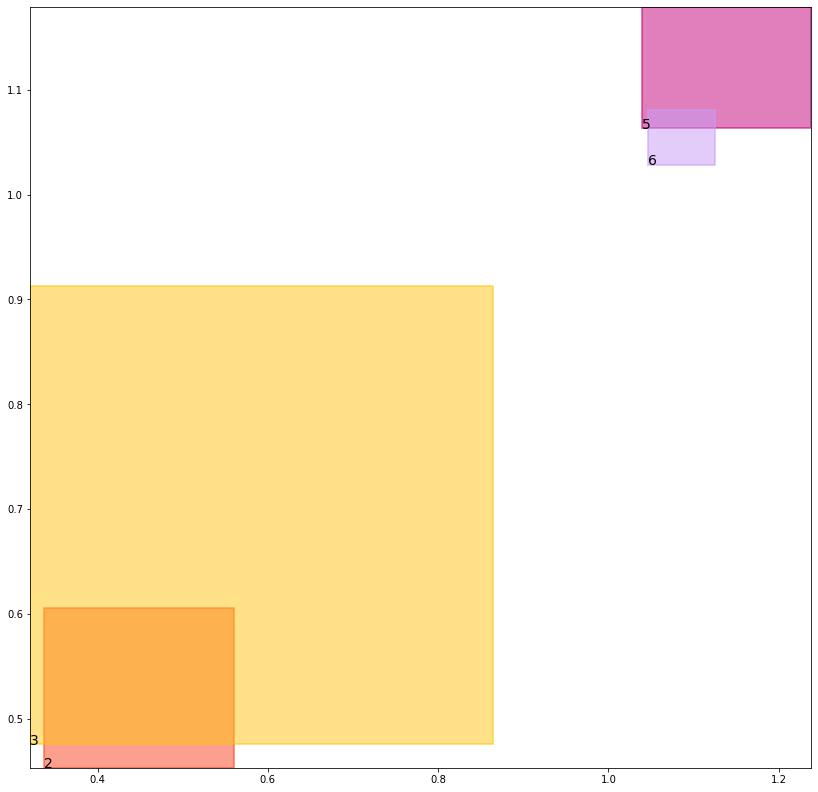

batch (tensor([[4, 5],
        [1, 2],
        [3, 5],
        [1, 3],
        [5, 3],
        [6, 2],
        [4, 6],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.6289004683494568, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.6276230216026306, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.9642379879951477, grad_fn=<MulBackward0>)
previous loss: tensor(2.2207615375518799, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.23263782262802124 0.33348965644836426 tensor(0.5064079761505127) tensor(0.8064796924591064)
tensor(2) 0.06684847176074982 0.6716362833976746 tensor(0.2779418826103210) tensor(0.9079986214637756)
tensor(3) 0.05945362523198128 0.5042782425880432 tensor(0.5896525979042053) tensor(0.5952363610267639)
tensor(4) 0.6409125924110413 0.300071656703949 tensor(0.7828665971755981) tensor(0.7785242199897766)
tensor(5) 0.7920052409172058 0.5983526110649109 tensor(0.9916257262229919) tensor(0.8707209825515747)
tensor(6) 0.7846007943153381 0.8007200956344604 tensor(0.8598753809928894) tensor(0.8927848339080811)


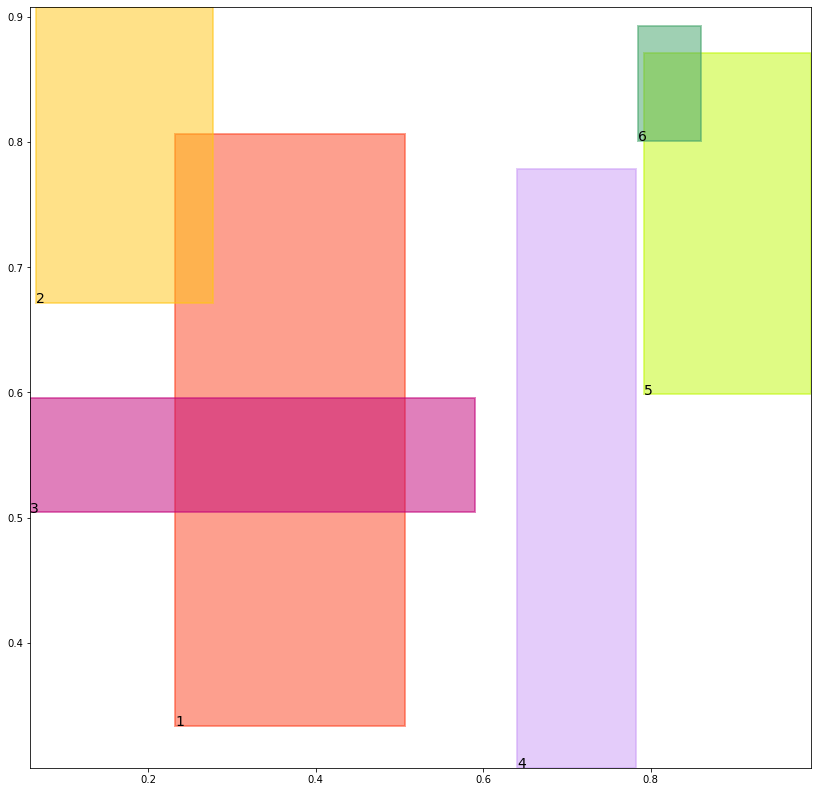

alignment data:
tensor(2) 0.20994481444358826 0.19872868061065674 tensor(0.3018752932548523) tensor(0.2179377675056458)
tensor(3) 0.22473423182964325 0.26034116744995117 tensor(0.5056583285331726) tensor(0.3414756059646606)
tensor(5) 0.6109617352485657 0.3526455760002136 tensor(0.6926058530807495) tensor(0.3855197429656982)
tensor(6) 0.5934563875198364 0.3156800866127014 tensor(0.6248441934585571) tensor(0.3251622319221497)


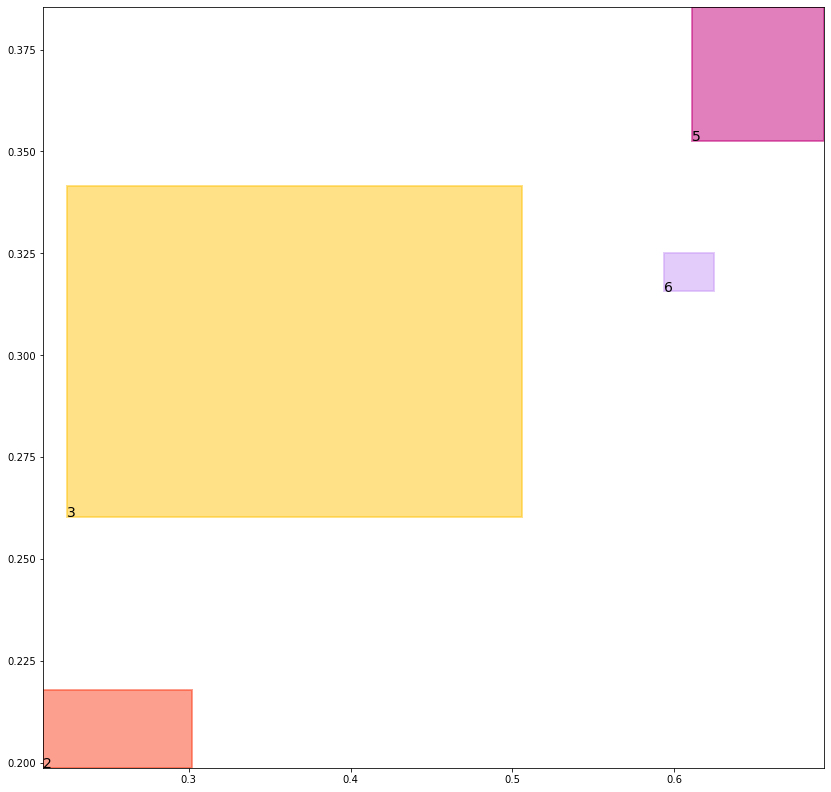

batch (tensor([[1, 3],
        [6, 2],
        [3, 5],
        [5, 3],
        [2, 6],
        [1, 2],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.5623947381973267, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.5704966783523560, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.4455410242080688, grad_fn=<MulBackward0>)
previous loss: tensor(1.5784324407577515, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.2198619544506073 0.31797948479652405 tensor(0.5245604515075684) tensor(0.8175390362739563)
tensor(2) 0.07152888178825378 0.6586750149726868 tensor(0.2875440716743469) tensor(0.9016596078872681)
tensor(3) 0.06365741044282913 0.5207750201225281 tensor(0.5736524462699890) tensor(0.5776269435882568)
tensor(4) 0.6241416335105896 0.2856401205062866 tensor(0.7950040698051453) tensor(0.7908229827880859)
tensor(5) 0.7882369160652161 0.6155468225479126 tensor(0.9909980297088623) tensor(0.8622280359268188)
tensor(6) 0.7822006940841675 0.8033170104026794 tensor(0.8509070873260498) tensor(0.8855658173561096)


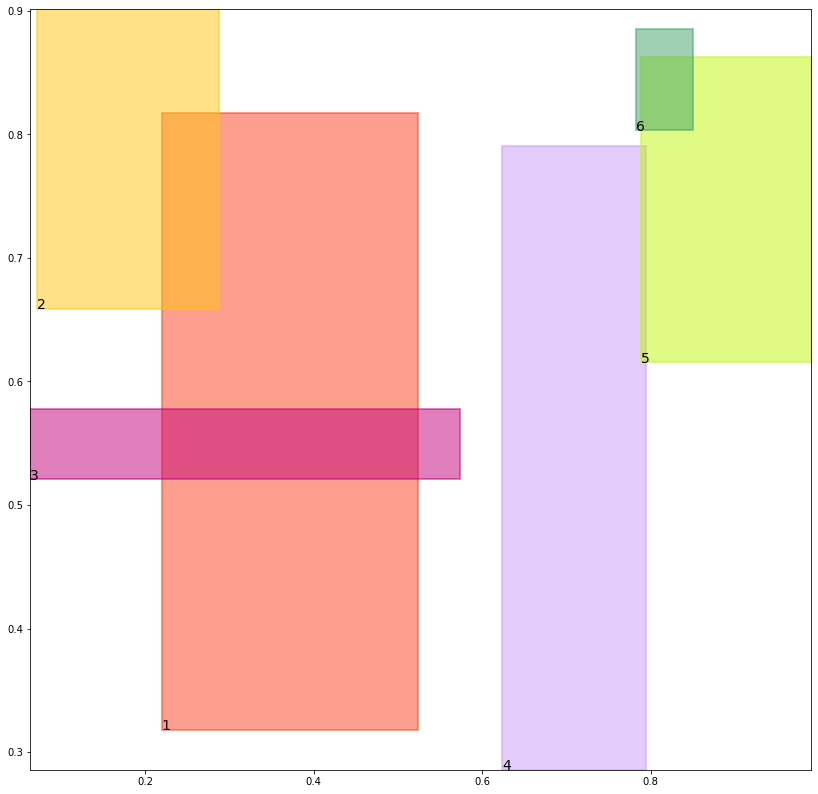

alignment data:
tensor(2) -0.030905313789844513 -0.13411736488342285 tensor(-0.0136612355709076) tensor(-0.0353169143199921)
tensor(3) 0.0097331702709198 -0.14683127403259277 tensor(0.0429738573729992) tensor(-0.0032158195972443)
tensor(5) 0.038194164633750916 -0.2940169870853424 tensor(0.0546211227774620) tensor(-0.1955162882804871)
tensor(6) 0.025591764599084854 -0.27373912930488586 tensor(0.0306429788470268) tensor(-0.2408223152160645)


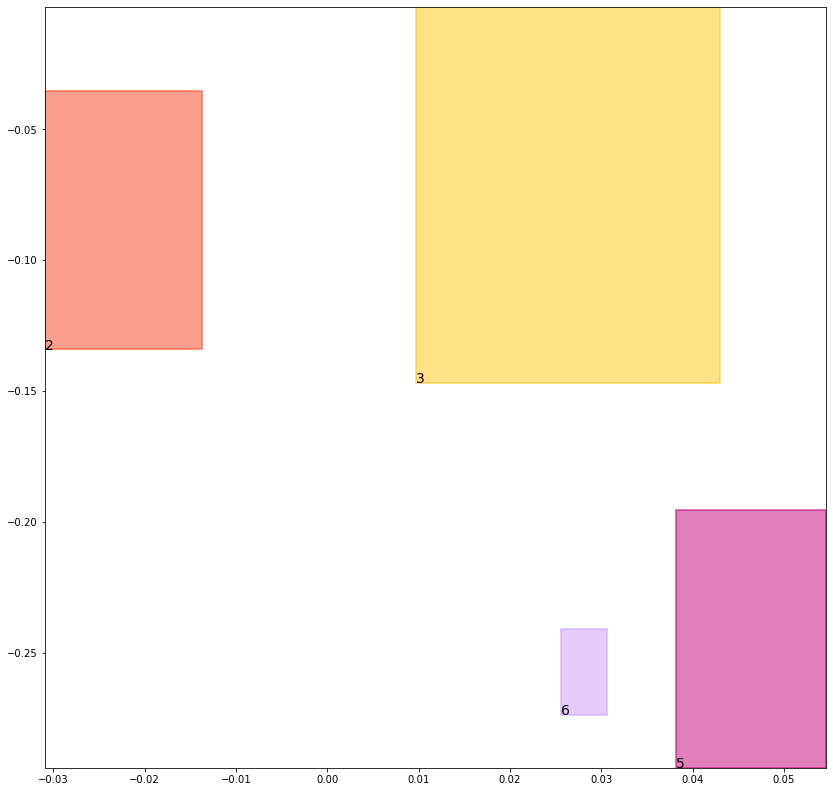

batch (tensor([[5, 3],
        [1, 2],
        [2, 6],
        [6, 2],
        [4, 5],
        [1, 3],
        [4, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.5015785694122314, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.5175742506980896, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.3201821744441986, grad_fn=<MulBackward0>)
previous loss: tensor(1.3393350839614868, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.2076663225889206 0.3033365309238434 tensor(0.5424689054489136) tensor(0.8279818296432495)
tensor(2) 0.07649645209312439 0.6549351215362549 tensor(0.2955680489540100) tensor(0.8949567079544067)
tensor(3) 0.06813269853591919 0.5375174880027771 tensor(0.5569077730178833) tensor(0.5615707039833069)
tensor(4) 0.6072260737419128 0.2722163498401642 tensor(0.8065528869628906) tensor(0.8025169372558594)
tensor(5) 0.7867510318756104 0.6263397336006165 tensor(0.9903230667114258) tensor(0.8532446026802063)
tensor(6) 0.7822290658950806 0.7992128133773804 tensor(0.8415685296058655) tensor(0.8778960704803467)


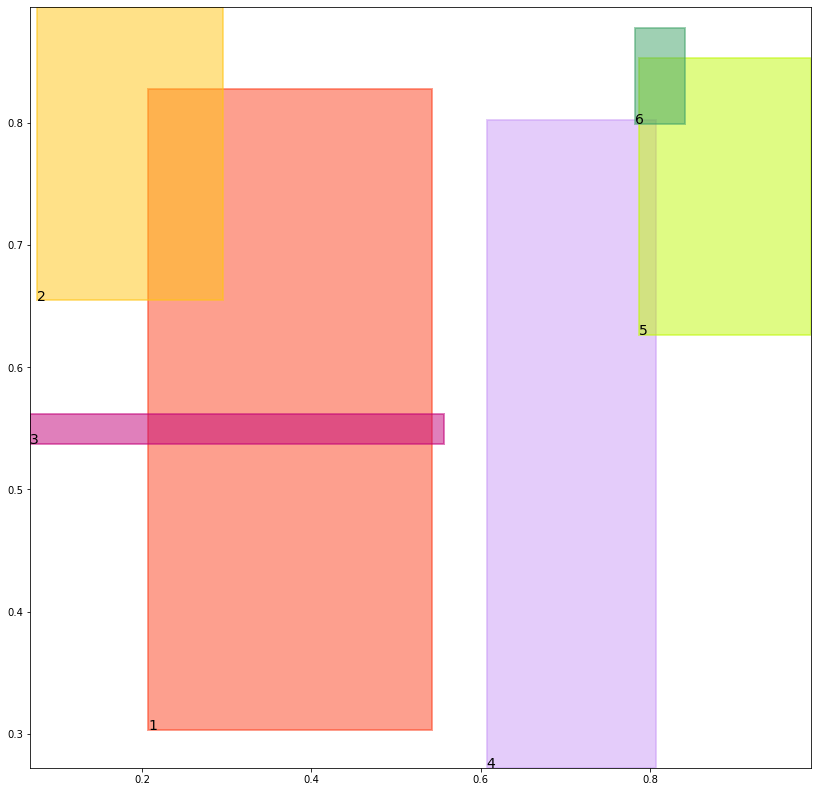

alignment data:
tensor(2) -0.24803104996681213 -0.09119606018066406 tensor(-0.1990978419780731) tensor(-0.0315820723772049)
tensor(3) -0.2851540744304657 -0.17870235443115234 tensor(-0.1880253851413727) tensor(-0.0345147848129272)
tensor(5) -0.3834804594516754 -0.2940438687801361 tensor(-0.3341635763645172) tensor(-0.2351383268833160)
tensor(6) -0.3546888530254364 -0.25669124722480774 tensor(-0.3412781655788422) tensor(-0.2381289601325989)


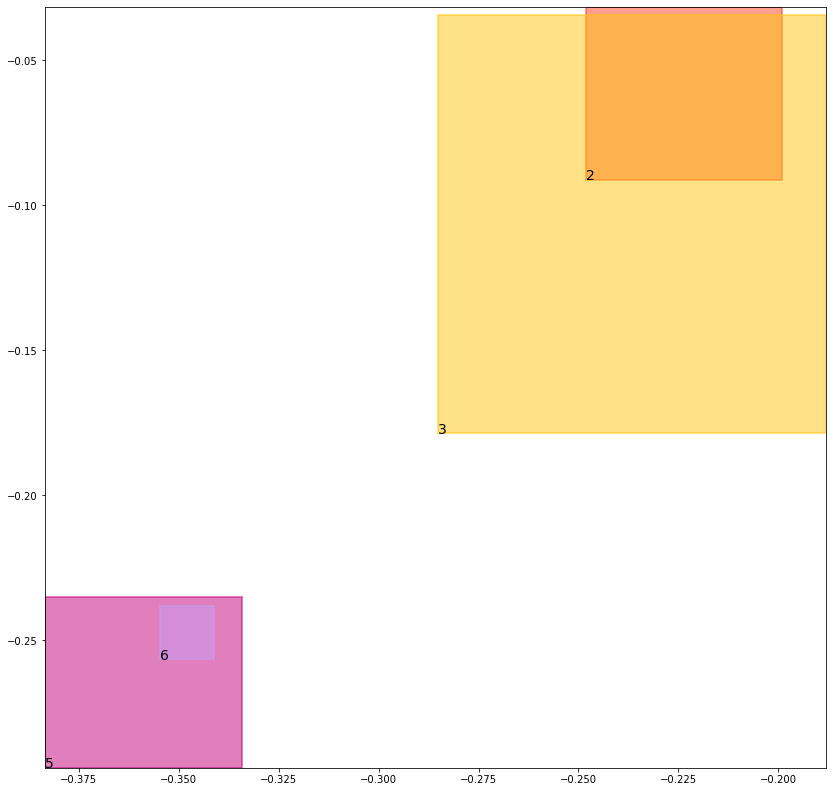

batch (tensor([[2, 6],
        [5, 3],
        [6, 2],
        [4, 6],
        [4, 5],
        [1, 3],
        [1, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.4464581608772278, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.4681129455566406, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.3517984151840210, grad_fn=<MulBackward0>)
previous loss: tensor(1.2663695812225342, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.1960659623146057 0.2896484434604645 tensor(0.5599929690361023) tensor(0.8378024101257324)
tensor(2) 0.08179423213005066 0.6517320275306702 tensor(0.3030444681644440) tensor(0.8878534436225891)
tensor(3) 0.07291985303163528 0.5460323691368103 tensor(0.5399184226989746) tensor(0.5537214279174805)
tensor(4) 0.5902796387672424 0.25978025794029236 tensor(0.8175002336502075) tensor(0.8135849237442017)
tensor(5) 0.7858306765556335 0.6347947716712952 tensor(0.9895949363708496) tensor(0.8437922596931458)
tensor(6) 0.7830660343170166 0.7935132384300232 tensor(0.8317868113517761) tensor(0.8697767257690430)


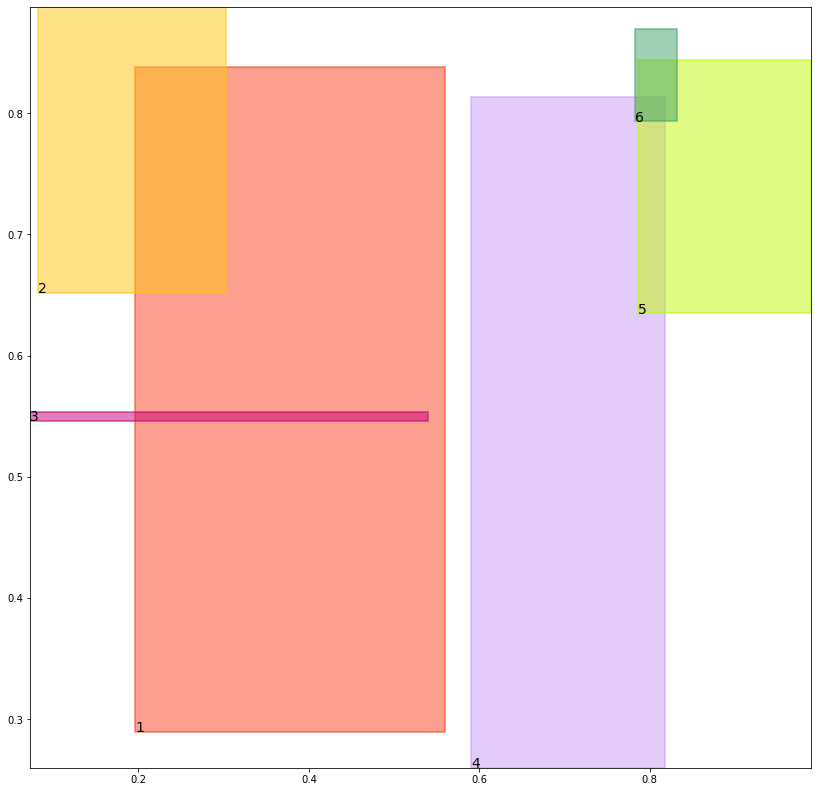

alignment data:
tensor(2) -0.2674787938594818 0.07555264234542847 tensor(-0.2503268420696259) tensor(0.0781335830688477)
tensor(3) -0.38224831223487854 -0.03377954661846161 tensor(-0.2654477357864380) tensor(0.0494402348995209)
tensor(5) -0.4447126090526581 -0.054950013756752014 tensor(-0.4288004934787750) tensor(-0.0527707189321518)
tensor(6) -0.399684876203537 -0.024718821048736572 tensor(-0.3988314568996429) tensor(-0.0193320214748383)


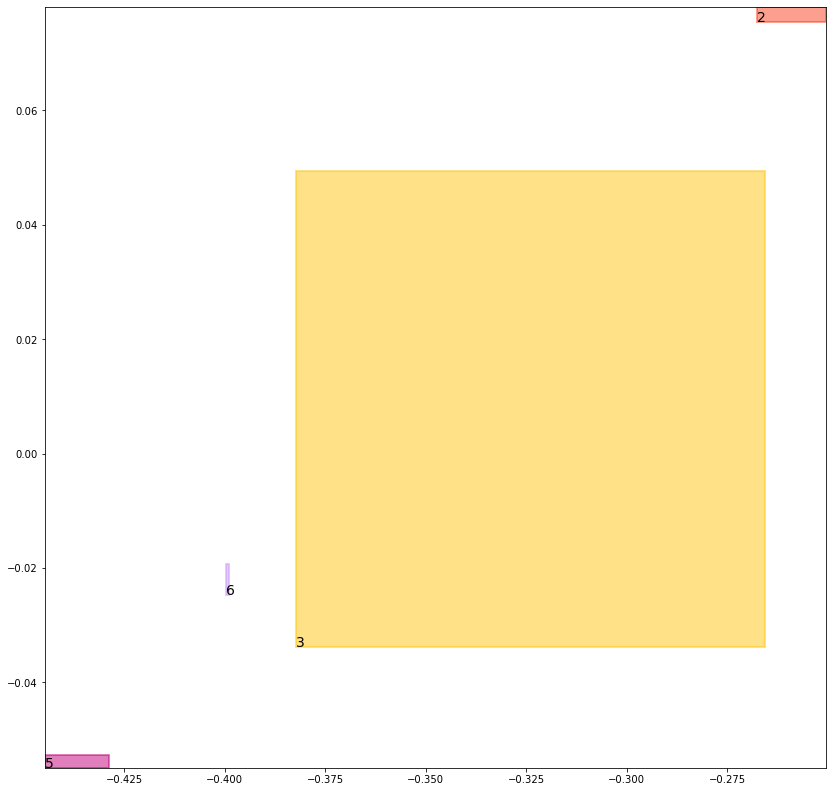

batch (tensor([[2, 6],
        [4, 5],
        [4, 6],
        [1, 3],
        [5, 3],
        [6, 2],
        [1, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.3978943526744843, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.4226389825344086, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.3068032860755920, grad_fn=<MulBackward0>)
previous loss: tensor(1.1273366212844849, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.18507090210914612 0.27689874172210693 tensor(0.5769847631454468) tensor(0.8470053672790527)
tensor(2) 0.08743493258953094 0.6438625454902649 tensor(0.3099720776081085) tensor(0.8803180456161499)
tensor(3) 0.0780290812253952 0.5325319766998291 tensor(0.5228837132453918) tensor(0.5655993223190308)
tensor(4) 0.5734230279922485 0.24828533828258514 tensor(0.8278397917747498) tensor(0.8240109086036682)
tensor(5) 0.785450279712677 0.645115077495575 tensor(0.9888098835945129) tensor(0.8338996171951294)
tensor(6) 0.78462153673172 0.7912705540657043 tensor(0.8215754032135010) tensor(0.8612396121025085)


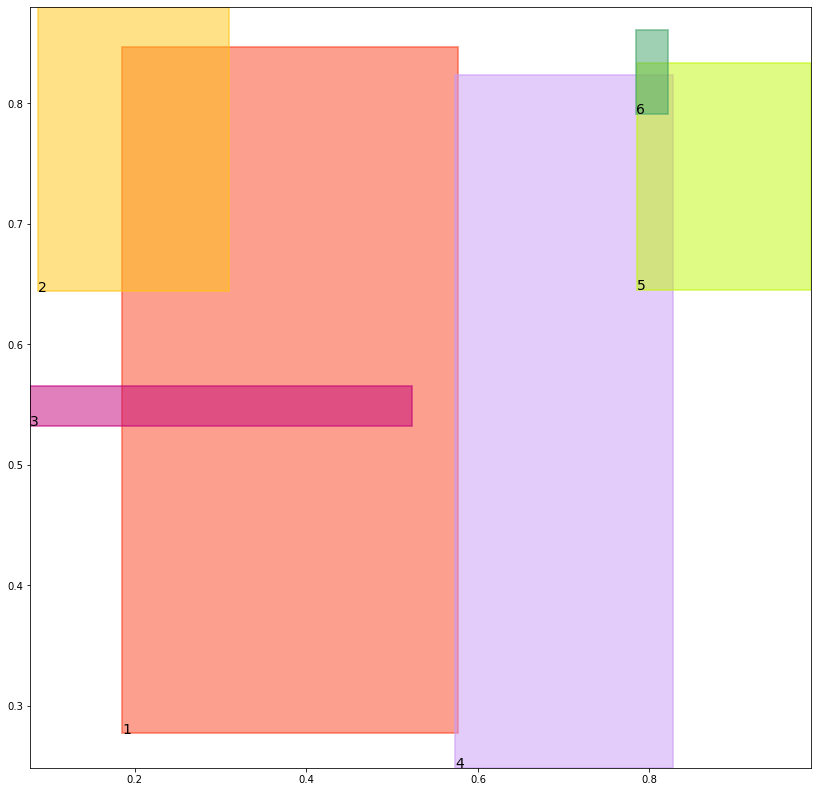

alignment data:
tensor(2) -0.2227025032043457 0.21467937529087067 tensor(-0.1807556450366974) tensor(0.2818928360939026)
tensor(3) -0.333960622549057 0.15973655879497528 tensor(-0.2665799260139465) tensor(0.1657484173774719)
tensor(5) -0.34804508090019226 0.1745276004076004 tensor(-0.3134978711605072) tensor(0.2295304238796234)
tensor(6) -0.2909126579761505 0.2278946340084076 tensor(-0.2759223580360413) tensor(0.2473163306713104)


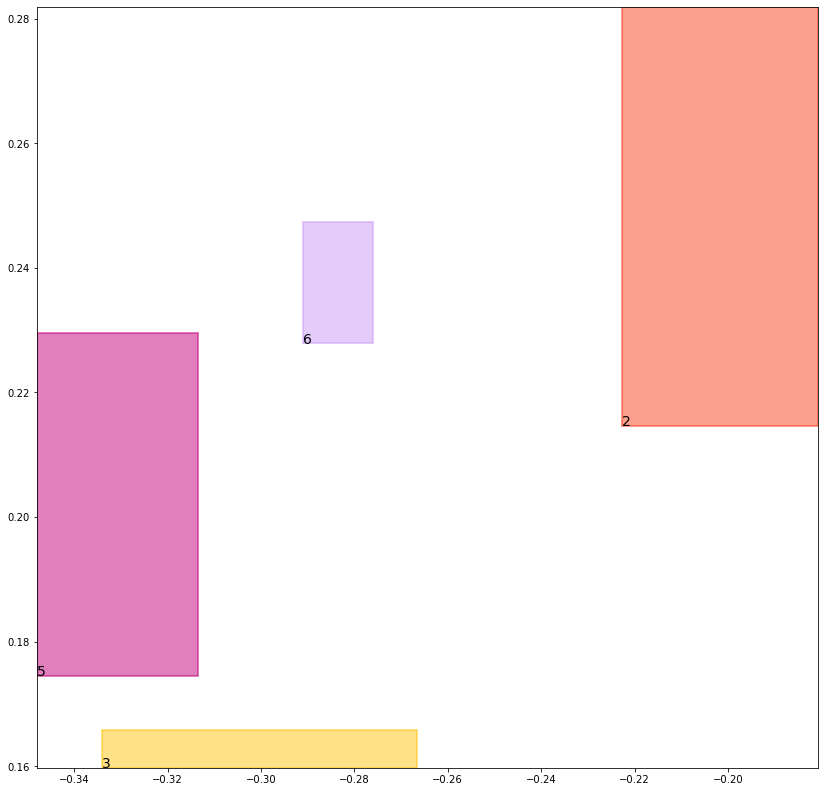

batch (tensor([[6, 2],
        [2, 6],
        [3, 5],
        [4, 5],
        [4, 6],
        [5, 3],
        [1, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.3565480411052704, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.3812641501426697, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2648916542530060, grad_fn=<MulBackward0>)
previous loss: tensor(1.0027037858963013, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.1746859848499298 0.264925092458725 tensor(0.5933030843734741) tensor(0.8556072711944580)
tensor(2) 0.09341209381818771 0.6344789266586304 tensor(0.3158570826053619) tensor(0.8723344802856445)
tensor(3) 0.08345919102430344 0.5218810439109802 tensor(0.5059559941291809) tensor(0.5757893919944763)
tensor(4) 0.5567783713340759 0.23769859969615936 tensor(0.8375706076622009) tensor(0.8337867259979248)
tensor(5) 0.786037802696228 0.6557732224464417 tensor(0.9879637956619263) tensor(0.8235147595405579)
tensor(6) 0.7871420383453369 0.7894300222396851 tensor(0.8110001683235168) tensor(0.8522819280624390)


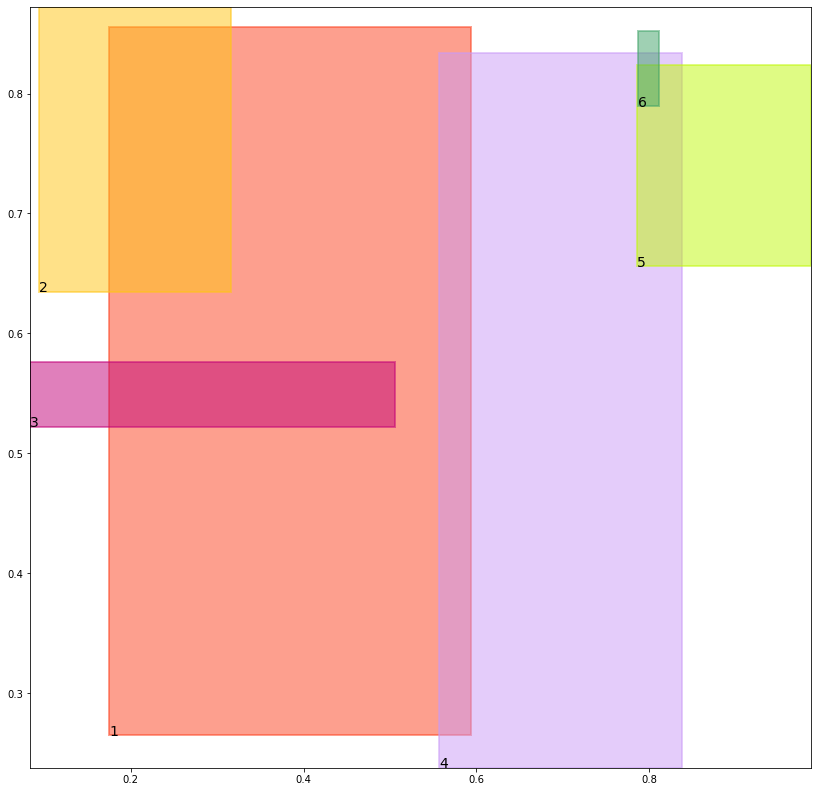

alignment data:
tensor(2) -0.16995346546173096 0.3384914994239807 tensor(-0.0633958727121353) tensor(0.4479430615901947)
tensor(3) -0.24343931674957275 0.2758523225784302 tensor(-0.2302262783050537) tensor(0.3265933394432068)
tensor(5) -0.19630324840545654 0.3771819472312927 tensor(-0.1212909817695618) tensor(0.4555446505546570)
tensor(6) -0.1277017593383789 0.43312135338783264 tensor(-0.0967319905757904) tensor(0.4603761434555054)


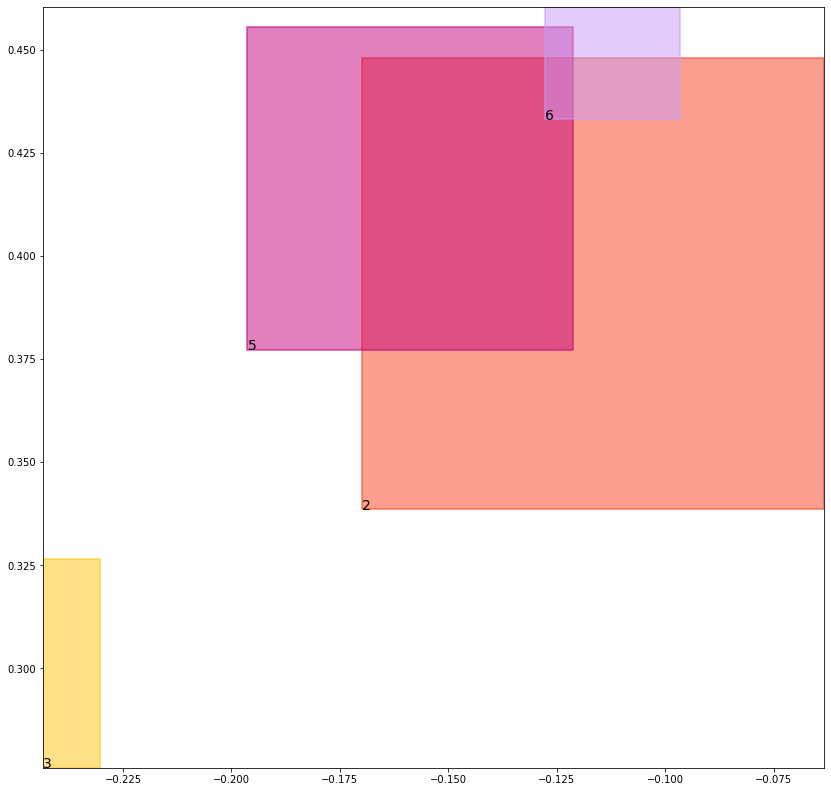

batch (tensor([[1, 2],
        [4, 5],
        [6, 2],
        [3, 5],
        [4, 6],
        [1, 3],
        [5, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.3194454312324524, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.3438282012939453, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2764091193675995, grad_fn=<MulBackward0>)
previous loss: tensor(0.9396827220916748, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.16491098701953888 0.2536293864250183 tensor(0.6088277697563171) tensor(0.8636240363121033)
tensor(2) 0.09974279999732971 0.6340806484222412 tensor(0.3205983042716980) tensor(0.8639281988143921)
tensor(3) 0.08923029154539108 0.5195510387420654 tensor(0.4894424080848694) tensor(0.5869112610816956)
tensor(4) 0.5404672026634216 0.22797653079032898 tensor(0.8466985225677490) tensor(0.8429105281829834)
tensor(5) 0.7874352335929871 0.6589392423629761 tensor(0.9870504140853882) tensor(0.8125630021095276)
tensor(6) 0.7903794646263123 0.783818244934082 tensor(0.8001136183738708) tensor(0.8428689837455750)


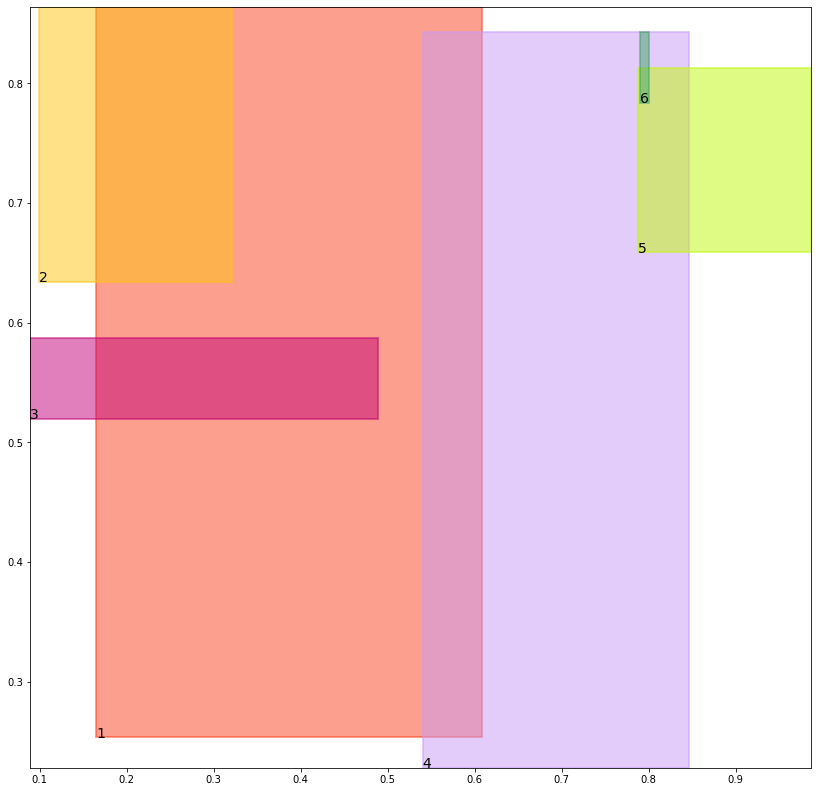

alignment data:
tensor(2) -0.17436212301254272 0.39854395389556885 tensor(-0.0293024480342865) tensor(0.5199304819107056)
tensor(3) -0.25522691011428833 0.34179842472076416 tensor(-0.1855272352695465) tensor(0.4109396934509277)
tensor(5) -0.12361791729927063 0.46948671340942383 tensor(-0.0134743005037308) tensor(0.5565379858016968)
tensor(6) -0.04208634793758392 0.52642822265625 tensor(-0.0031139552593231) tensor(0.5540775060653687)


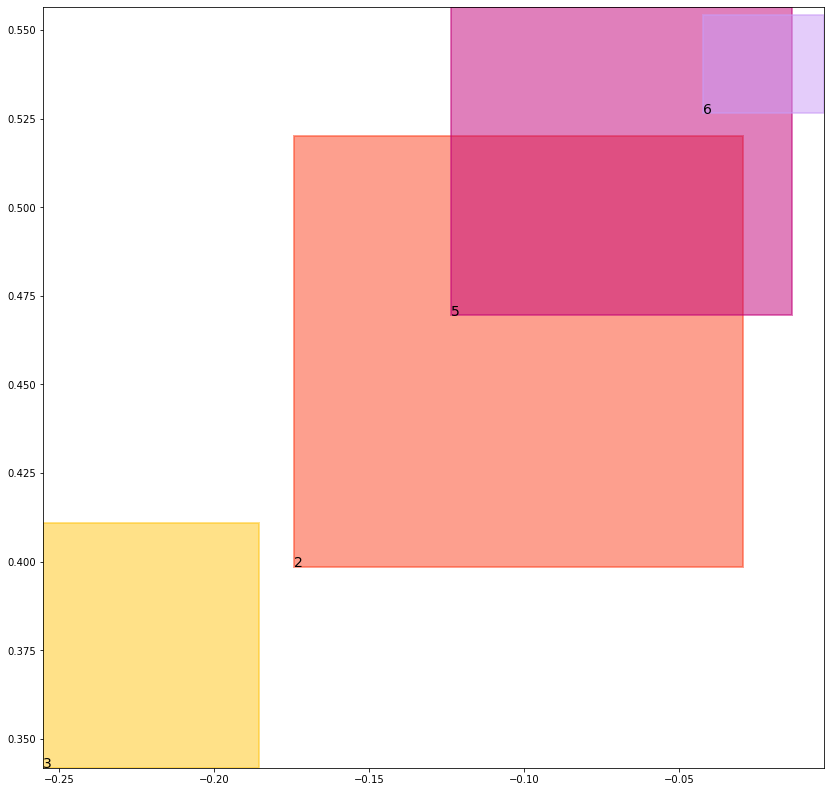

batch (tensor([[4, 6],
        [3, 5],
        [1, 3],
        [6, 2],
        [2, 6],
        [4, 5],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.2860224246978760, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.3101516664028168, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.3093738555908203, grad_fn=<MulBackward0>)
previous loss: tensor(0.9055479764938354, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.15574072301387787 0.24299918115139008 tensor(0.6234710812568665) tensor(0.8710753321647644)
tensor(2) 0.10645446181297302 0.6402404308319092 tensor(0.3245255947113037) tensor(0.8551436662673950)
tensor(3) 0.09537144750356674 0.5236300826072693 tensor(0.4736872911453247) tensor(0.5990803837776184)
tensor(4) 0.5246018171310425 0.21903496980667114 tensor(0.8552350401878357) tensor(0.8513873219490051)
tensor(5) 0.7889967560768127 0.6549301743507385 tensor(0.9860618710517883) tensor(0.8010123372077942)
tensor(6) 0.7889412045478821 0.7758547067642212 tensor(0.7938023805618286) tensor(0.8329490423202515)


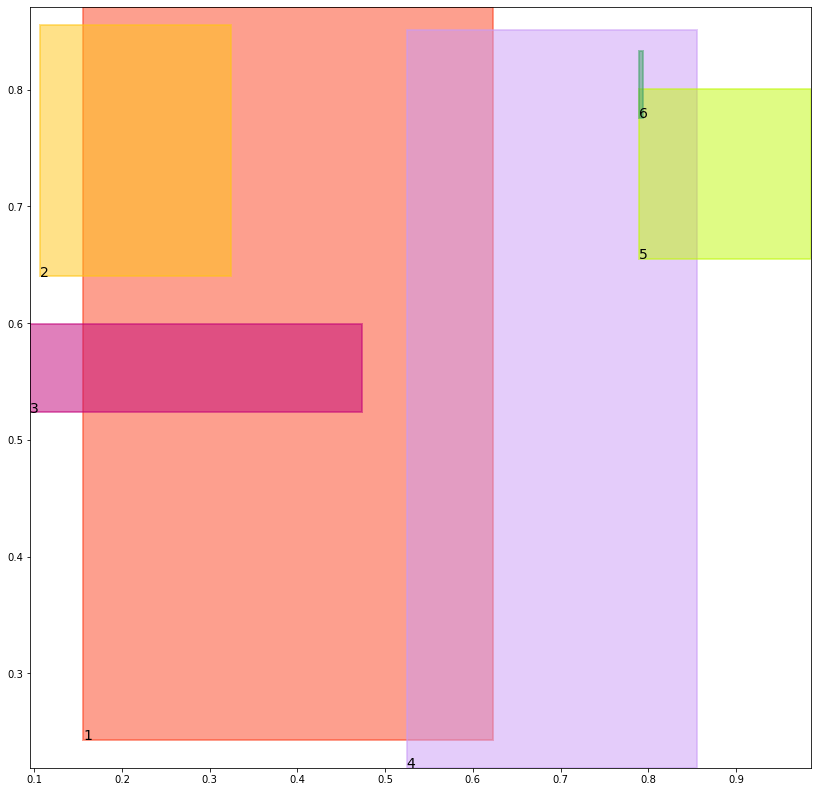

alignment data:
tensor(2) -0.23414857685565948 0.40649697184562683 tensor(-0.0792797952890396) tensor(0.5122936367988586)
tensor(3) -0.31584876775741577 0.3561095893383026 tensor(-0.2321298867464066) tensor(0.4149803519248962)
tensor(5) -0.16722701489925385 0.46105414628982544 tensor(-0.0496486872434616) tensor(0.5371414422988892)
tensor(6) -0.08346433937549591 0.5124883651733398 tensor(-0.0435095578432083) tensor(0.5371188521385193)


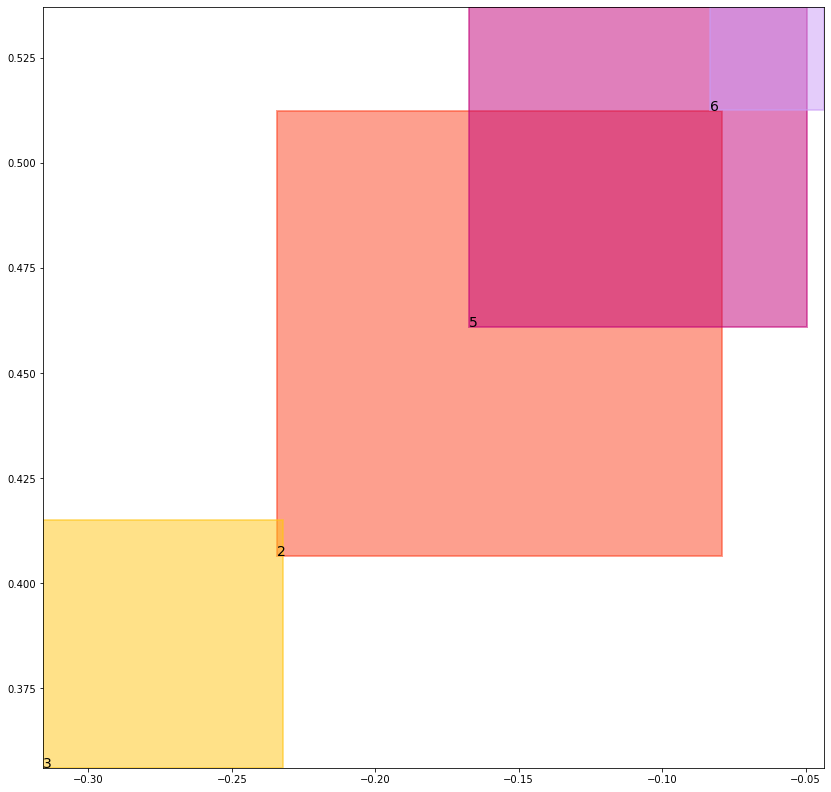

batch (tensor([[1, 2],
        [1, 3],
        [4, 5],
        [6, 2],
        [2, 6],
        [3, 5],
        [4, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.2560891509056091, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.2817959189414978, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.3075540065765381, grad_fn=<MulBackward0>)
previous loss: tensor(0.8454390764236450, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.1471654176712036 0.23305431008338928 tensor(0.6371834278106689) tensor(0.8779844045639038)
tensor(2) 0.11356525868177414 0.6495323181152344 tensor(0.3277932703495026) tensor(0.8459926247596741)
tensor(3) 0.10190291702747345 0.5309473872184753 tensor(0.4588500857353210) tensor(0.6119579076766968)
tensor(4) 0.5092544555664062 0.2107747197151184 tensor(0.8632019758224487) tensor(0.8592285513877869)
tensor(5) 0.7905036211013794 0.6472166180610657 tensor(0.9849913716316223) tensor(0.7888888716697693)
tensor(6) 0.7787240147590637 0.7662203311920166 tensor(0.7925786972045898) tensor(0.8225339651107788)


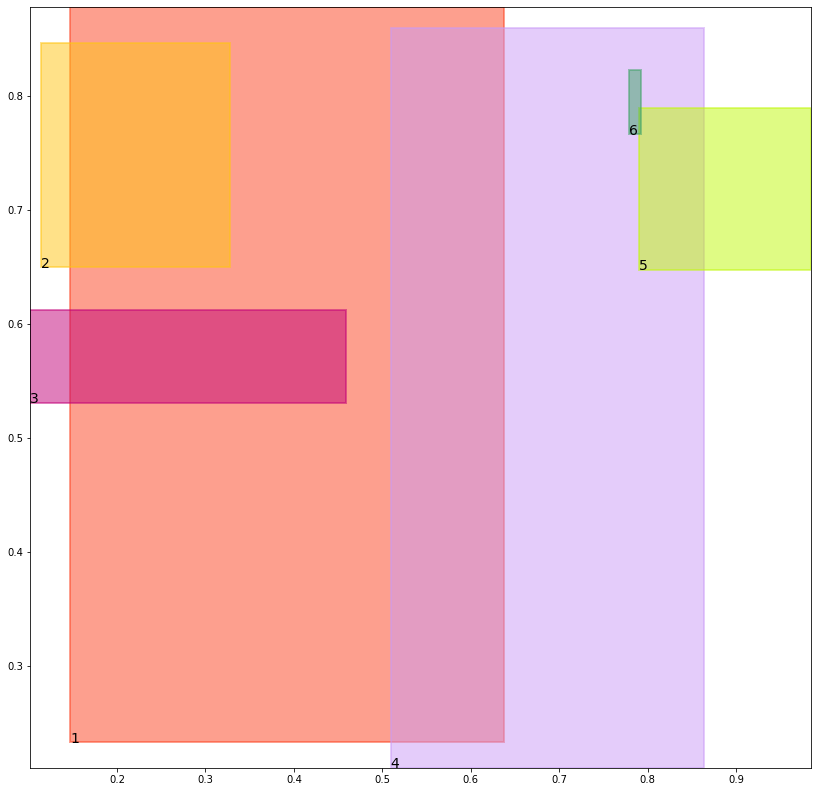

alignment data:
tensor(2) -0.31793081760406494 0.4078366756439209 tensor(-0.1792401671409607) tensor(0.4833629429340363)
tensor(3) -0.39781302213668823 0.3640638589859009 tensor(-0.3261551260948181) tensor(0.3996564745903015)
tensor(5) -0.2863349914550781 0.41802188754081726 tensor(-0.1820600628852844) tensor(0.4732604026794434)
tensor(6) -0.2073204517364502 0.46156638860702515 tensor(-0.1689787209033966) tensor(0.4824888110160828)


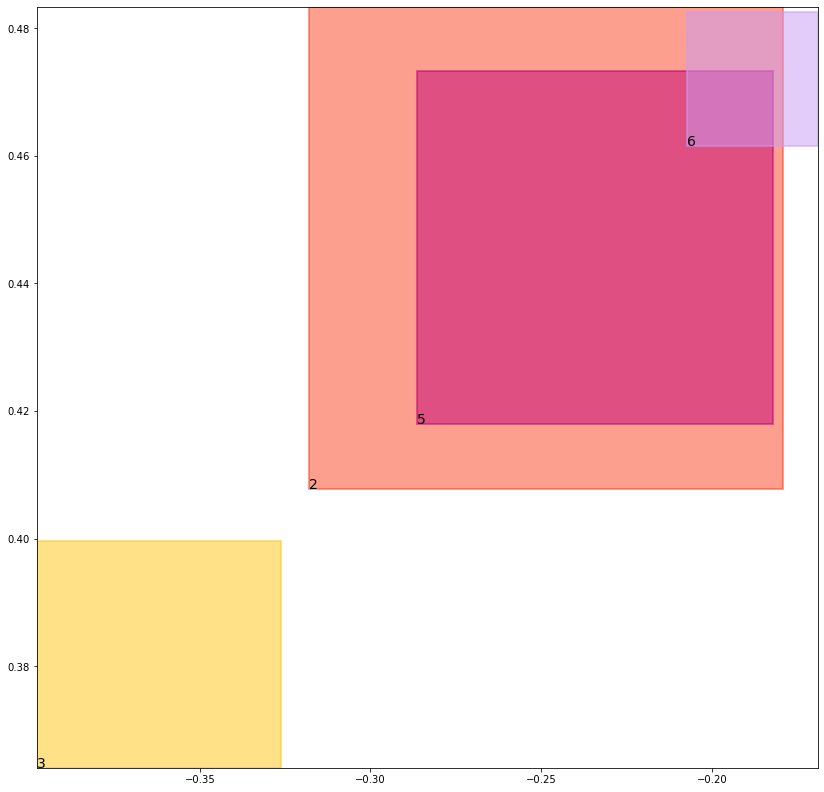

batch (tensor([[3, 5],
        [4, 5],
        [4, 6],
        [1, 3],
        [2, 6],
        [1, 2],
        [6, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.2294296622276306, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.2583690881729126, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2778119146823883, grad_fn=<MulBackward0>)
previous loss: tensor(0.7656106948852539, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.13917116820812225 0.2238086611032486 tensor(0.6499497890472412) tensor(0.8843772411346436)
tensor(2) 0.12107837200164795 0.6601179242134094 tensor(0.3303887248039246) tensor(0.8364294767379761)
tensor(3) 0.10883455723524094 0.5399144887924194 tensor(0.4449093937873840) tensor(0.6247190237045288)
tensor(4) 0.49444520473480225 0.2031015008687973 tensor(0.8706281185150146) tensor(0.8664523959159851)
tensor(5) 0.7920904755592346 0.6376764178276062 tensor(0.9838316440582275) tensor(0.7762901186943054)
tensor(6) 0.7694689631462097 0.7554478049278259 tensor(0.7886943817138672) tensor(0.8117007017135620)


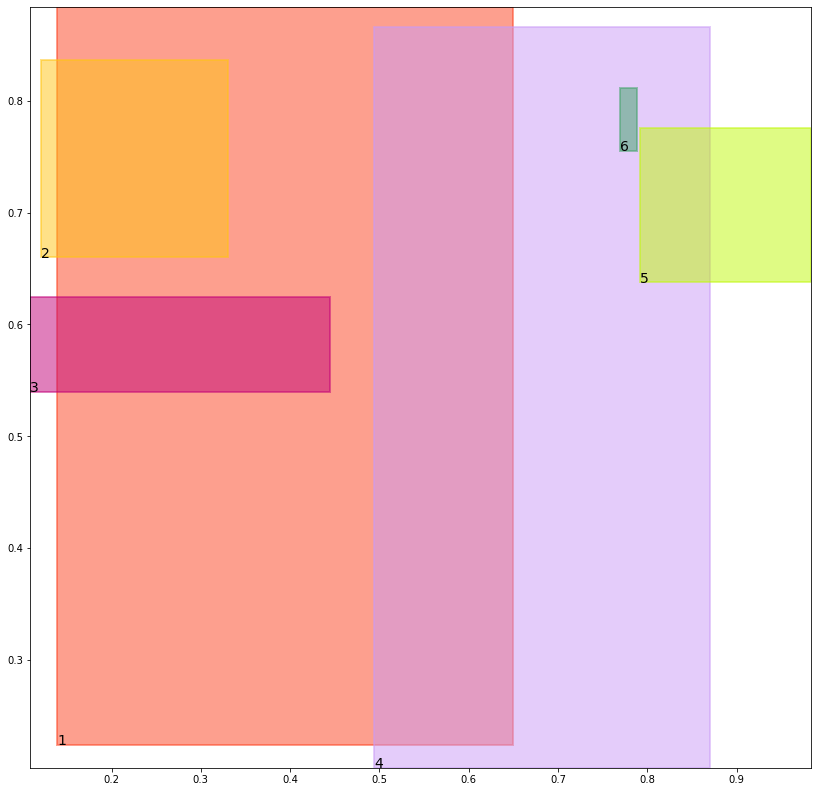

alignment data:
tensor(2) -0.3906095623970032 0.40257421135902405 tensor(-0.2869228124618530) tensor(0.4468879401683807)
tensor(3) -0.46428894996643066 0.3659365773200989 tensor(-0.4198104143142700) tensor(0.3756560683250427)
tensor(5) -0.41979318857192993 0.36256924271583557 tensor(-0.3388990163803101) tensor(0.3960690498352051)
tensor(6) -0.3468111753463745 0.40017077326774597 tensor(-0.3126398324966431) tensor(0.4166516661643982)


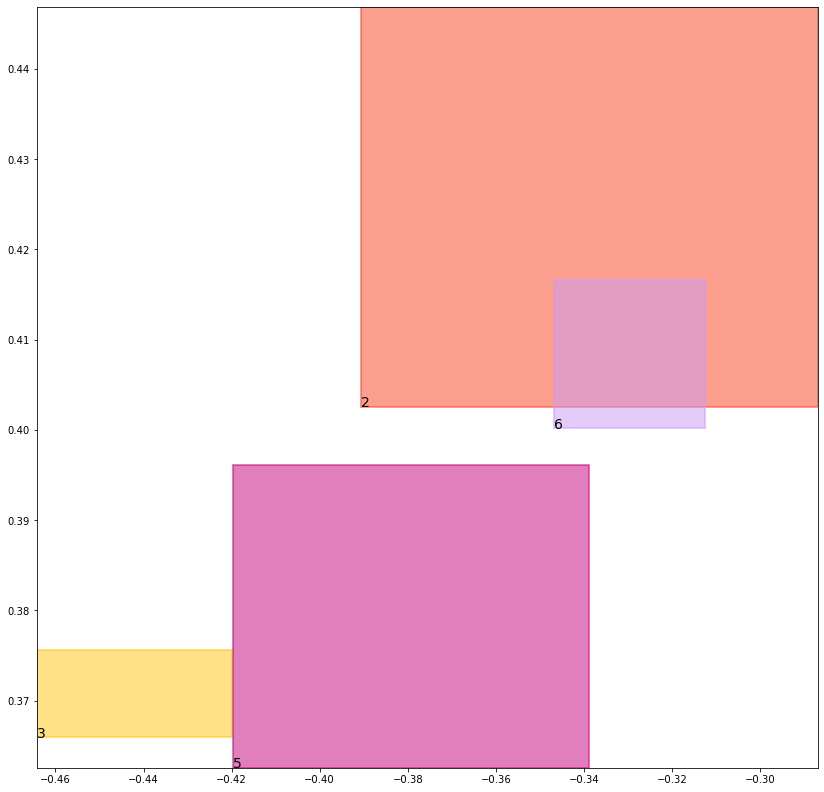

batch (tensor([[2, 6],
        [4, 6],
        [5, 3],
        [6, 2],
        [1, 3],
        [4, 5],
        [1, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.2056579887866974, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.2367618978023529, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2554995715618134, grad_fn=<MulBackward0>)
previous loss: tensor(0.6979194879531860, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.13174036145210266 0.2152596414089203 tensor(0.6617823839187622) tensor(0.8902813196182251)
tensor(2) 0.12899787724018097 0.6701815724372864 tensor(0.3324168622493744) tensor(0.8264019489288330)
tensor(3) 0.1161775216460228 0.5490584969520569 tensor(0.4318257868289948) tensor(0.6361988782882690)
tensor(4) 0.480192095041275 0.19593149423599243 tensor(0.8775402307510376) tensor(0.8730831146240234)
tensor(5) 0.793799638748169 0.6281064748764038 tensor(0.9825750589370728) tensor(0.7633951902389526)
tensor(6) 0.7611580491065979 0.744577169418335 tensor(0.7829422950744629) tensor(0.8005628585815430)


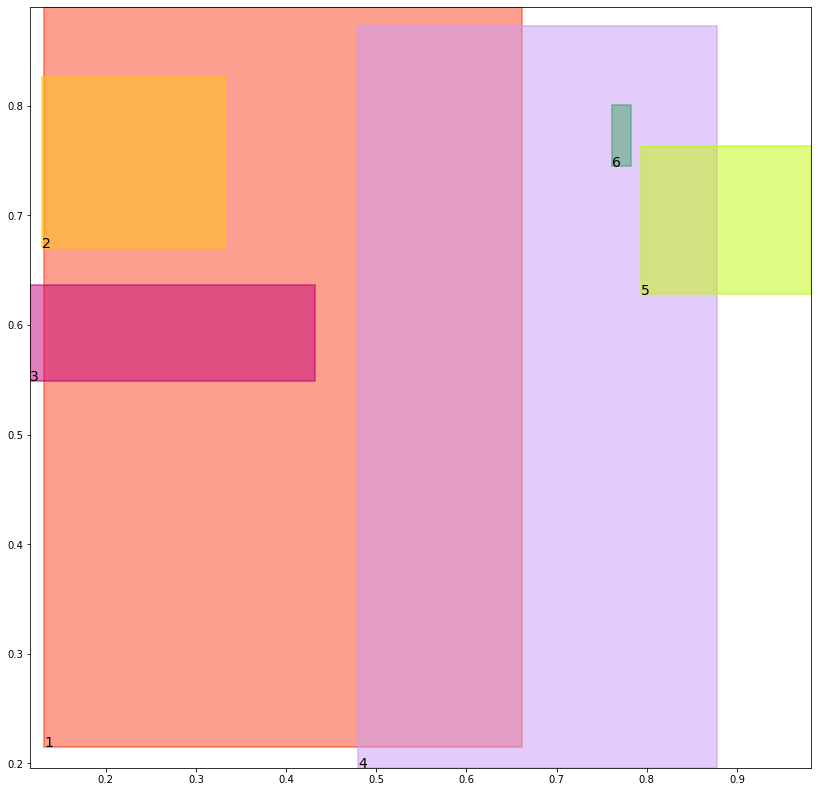

alignment data:
tensor(2) -0.4721468389034271 0.42120668292045593 tensor(-0.4054005444049835) tensor(0.4416297972202301)
tensor(3) -0.5385663509368896 0.381500244140625 tensor(-0.5218026638031006) tensor(0.3906500637531281)
tensor(5) -0.5629714727401733 0.3425944149494171 tensor(-0.5064452886581421) tensor(0.3589996695518494)
tensor(6) -0.49455079436302185 0.37654632329940796 tensor(-0.4654558002948761) tensor(0.3890590071678162)


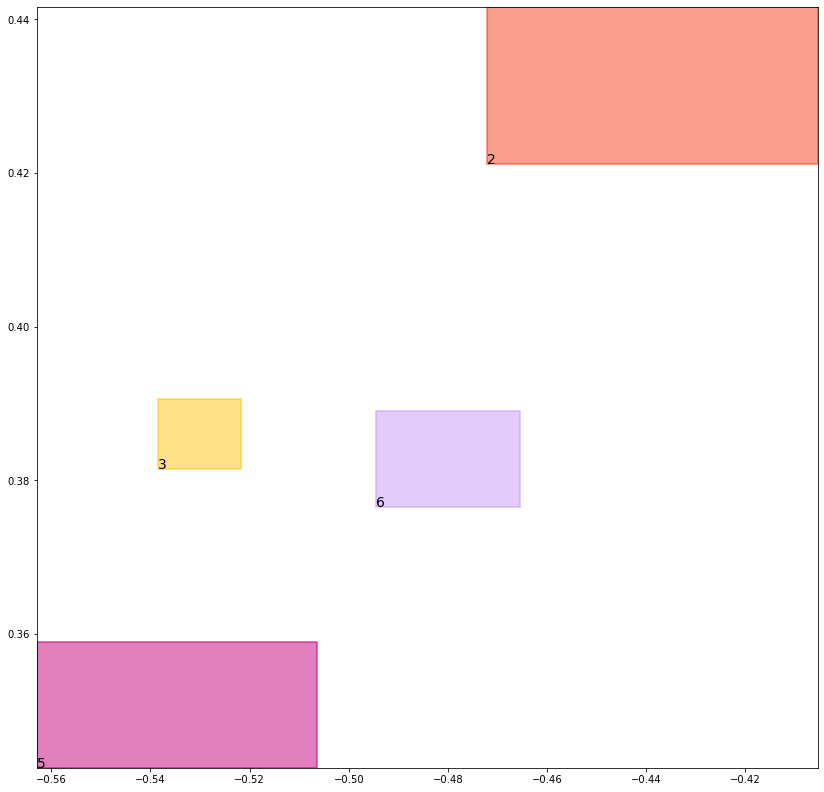

batch (tensor([[3, 5],
        [4, 5],
        [4, 6],
        [2, 6],
        [5, 3],
        [6, 2],
        [1, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.1843757331371307, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.2171567380428314, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2566942274570465, grad_fn=<MulBackward0>)
previous loss: tensor(0.6582267284393311, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.12485221773386002 0.2073863297700882 tensor(0.6727131605148315) tensor(0.8957245945930481)
tensor(2) 0.13734155893325806 0.6780679821968079 tensor(0.3341462016105652) tensor(0.8158778548240662)
tensor(3) 0.1239558756351471 0.5571422576904297 tensor(0.4196439981460571) tensor(0.6452796459197998)
tensor(4) 0.46650952100753784 0.18919512629508972 tensor(0.8839643597602844) tensor(0.8791503906250000)
tensor(5) 0.7953870892524719 0.6203295588493347 tensor(0.9812116622924805) tensor(0.7504363059997559)
tensor(6) 0.7536874413490295 0.7350450158119202 tensor(0.7757111191749573) tensor(0.7892382144927979)


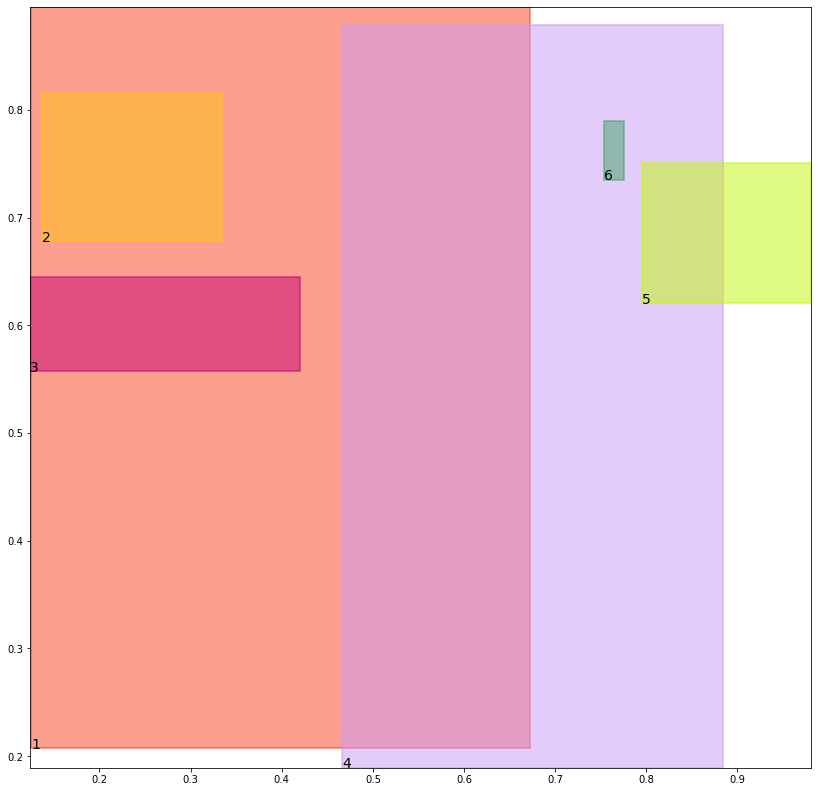

alignment data:
tensor(2) -0.5554732084274292 0.4308494031429291 tensor(-0.5161814689636230) tensor(0.4374080300331116)
tensor(3) -0.6157963275909424 0.3893778324127197 tensor(-0.6146242618560791) tensor(0.4057762324810028)
tensor(5) -0.686623215675354 0.3383057713508606 tensor(-0.6495310068130493) tensor(0.3444952964782715)
tensor(6) -0.6220847368240356 0.36868777871131897 tensor(-0.5980581045150757) tensor(0.3779811859130859)


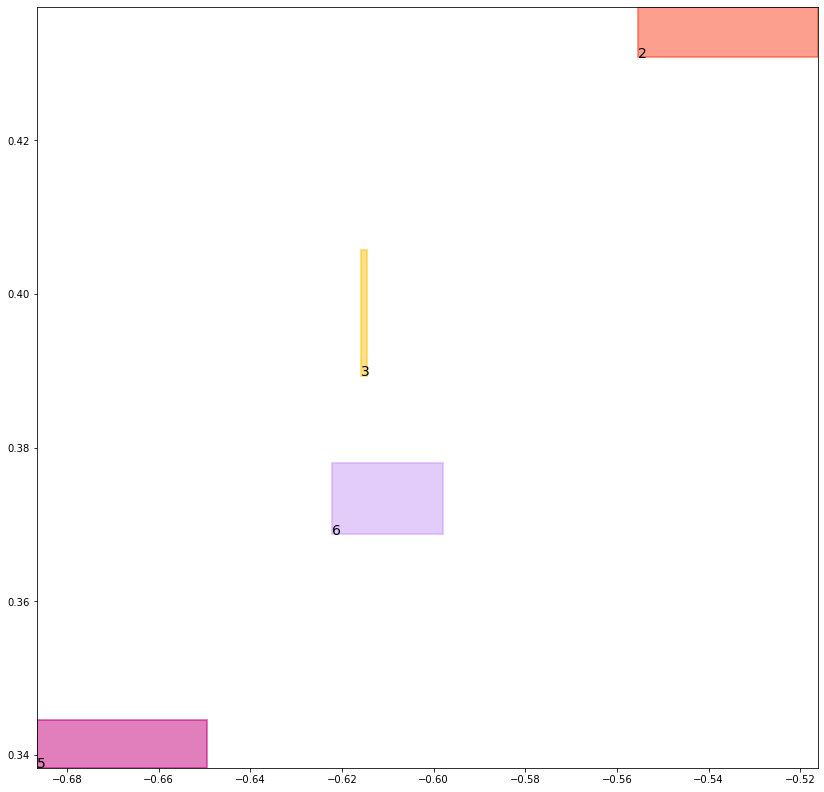

batch (tensor([[3, 5],
        [4, 5],
        [5, 3],
        [6, 2],
        [4, 6],
        [1, 2],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.1652073264122009, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1995474696159363, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2679688334465027, grad_fn=<MulBackward0>)
previous loss: tensor(0.6327236294746399, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.11848334968090057 0.20015273988246918 tensor(0.6827870011329651) tensor(0.9007347822189331)
tensor(2) 0.146128311753273 0.6832978129386902 tensor(0.3357969522476196) tensor(0.8048629760742188)
tensor(3) 0.13219569623470306 0.5636389255523682 tensor(0.4084343910217285) tensor(0.6515307426452637)
tensor(4) 0.4534066617488861 0.1828405112028122 tensor(0.8899270296096802) tensor(0.8846875429153442)
tensor(5) 0.7965794205665588 0.6151451468467712 tensor(0.9797298908233643) tensor(0.7376132011413574)
tensor(6) 0.7469328045845032 0.7276464700698853 tensor(0.7672491669654846) tensor(0.7778136134147644)


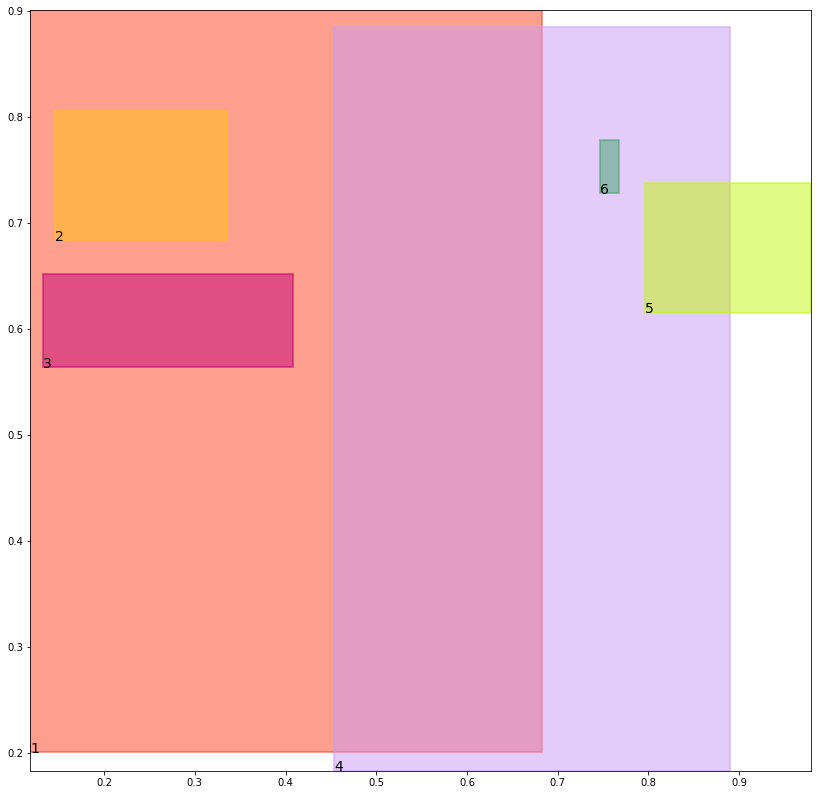

alignment data:
tensor(2) -0.6644029021263123 0.4328101575374603 tensor(-0.6410654187202454) tensor(0.4335876107215881)
tensor(3) -0.7223853468894958 0.3983641266822815 tensor(-0.7161157727241516) tensor(0.4130758643150330)
tensor(5) -0.8033886551856995 0.3492804765701294 tensor(-0.7785590291023254) tensor(0.3509340584278107)
tensor(6) -0.7443303465843201 0.3747236728668213 tensor(-0.7250576615333557) tensor(0.3814079463481903)


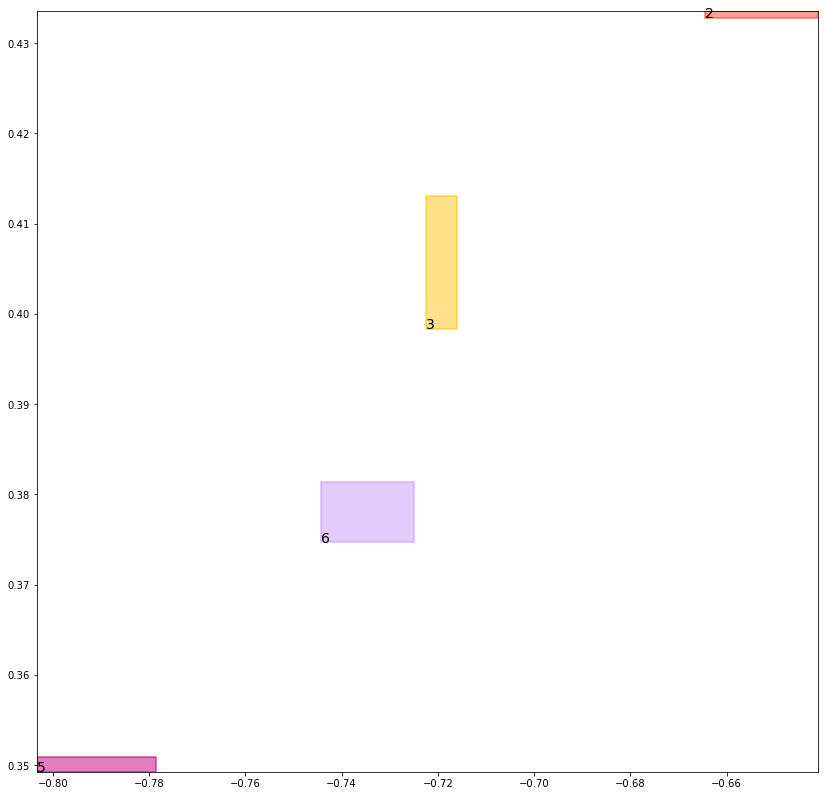

batch (tensor([[3, 5],
        [2, 6],
        [4, 6],
        [5, 3],
        [4, 5],
        [1, 3],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [2, 6],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.1478519886732101, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1838167458772659, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2711839079856873, grad_fn=<MulBackward0>)
previous loss: tensor(0.6028526425361633, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.1126084178686142 0.19351384043693542 tensor(0.6920567750930786) tensor(0.9053386449813843)
tensor(2) 0.15535885095596313 0.6863669753074646 tensor(0.3373929858207703) tensor(0.7934039235115051)
tensor(3) 0.14090746641159058 0.5686972737312317 tensor(0.3981897532939911) tensor(0.6552199721336365)
tensor(4) 0.4408864974975586 0.1768324375152588 tensor(0.8954547047615051) tensor(0.8897311091423035)
tensor(5) 0.7973290681838989 0.6122573614120483 tensor(0.9781177639961243) tensor(0.7250328660011292)
tensor(6) 0.7408265471458435 0.7222311496734619 tensor(0.7577714920043945) tensor(0.7663272619247437)


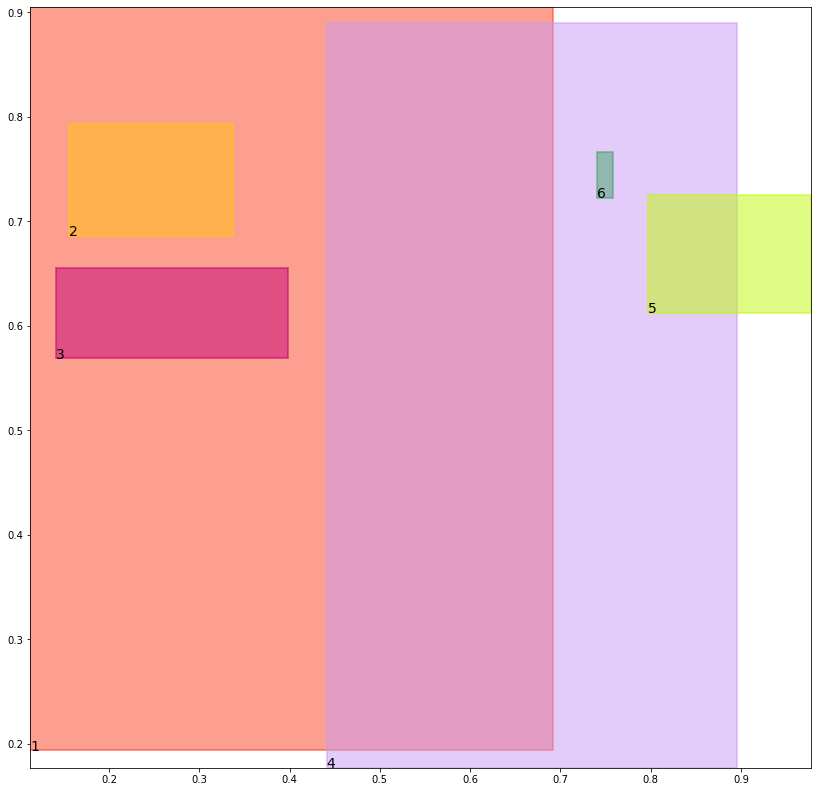

alignment data:
tensor(2) -0.800318717956543 0.4306785762310028 tensor(-0.7839496135711670) tensor(0.4311966896057129)
tensor(3) -0.8466013669967651 0.40779349207878113 tensor(-0.8443741798400879) tensor(0.4169821739196777)
tensor(5) -0.9194512367248535 0.37040093541145325 tensor(-0.9006597995758057) tensor(0.3707313239574432)
tensor(6) -0.868450403213501 0.3892604112625122 tensor(-0.8535592555999756) tensor(0.3936691582202911)


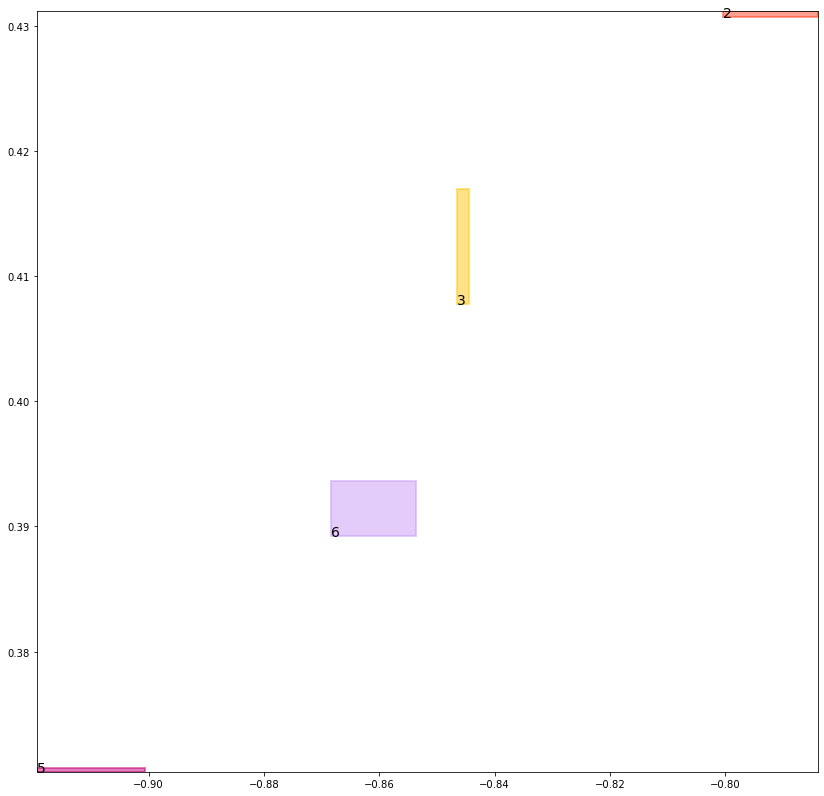

batch (tensor([[2, 6],
        [6, 2],
        [1, 2],
        [5, 3],
        [1, 3],
        [4, 6],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.1321097314357758, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1697933673858643, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2646758854389191, grad_fn=<MulBackward0>)
previous loss: tensor(0.5665789842605591, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.10720070451498032 0.1874212771654129 tensor(0.7005789875984192) tensor(0.9095623493194580)
tensor(2) 0.16501249372959137 0.6880435347557068 tensor(0.3388147354125977) tensor(0.7815810441970825)
tensor(3) 0.15008270740509033 0.5727720856666565 tensor(0.3888241052627563) tensor(0.6568839550018311)
tensor(4) 0.42894622683525085 0.17114749550819397 tensor(0.9005740880966187) tensor(0.8943181037902832)
tensor(5) 0.7977696061134338 0.6109454035758972 tensor(0.9763633012771606) tensor(0.7127189636230469)
tensor(6) 0.7353543639183044 0.7182126045227051 tensor(0.7474848628044128) tensor(0.7547805905342102)


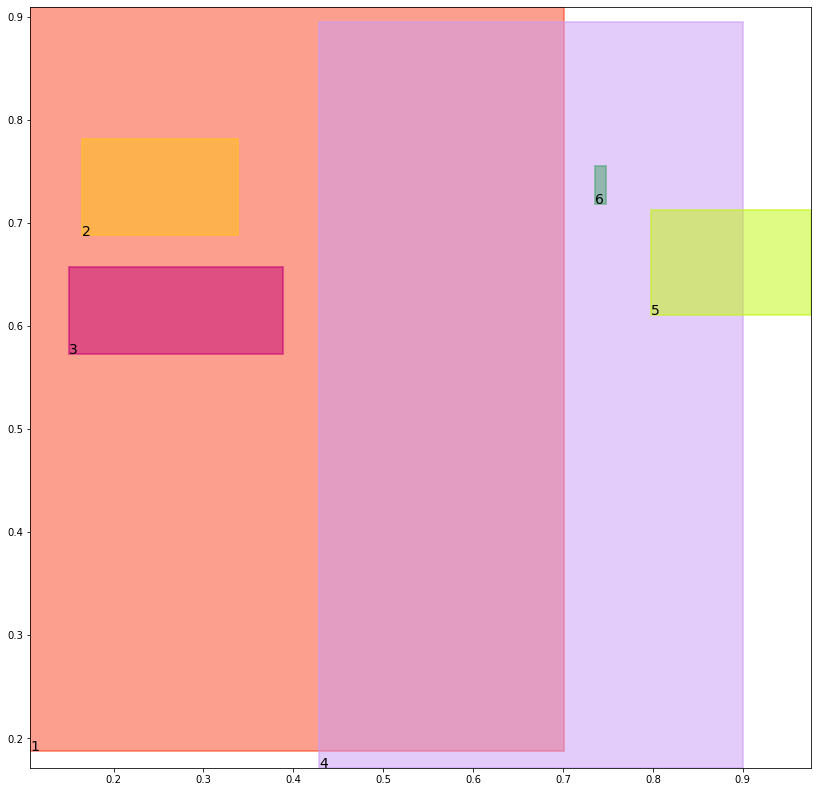

alignment data:
tensor(2) -0.8924420475959778 0.42165061831474304 tensor(-0.8775423169136047) tensor(0.4216883778572083)
tensor(3) -0.9287050366401672 0.40962356328964233 tensor(-0.9227145314216614) tensor(0.4131061136722565)
tensor(5) -0.9744411110877991 0.38852372765541077 tensor(-0.9572852253913879) tensor(0.3890131413936615)
tensor(6) -0.9338404536247253 0.39972934126853943 tensor(-0.9230008721351624) tensor(0.4021245837211609)


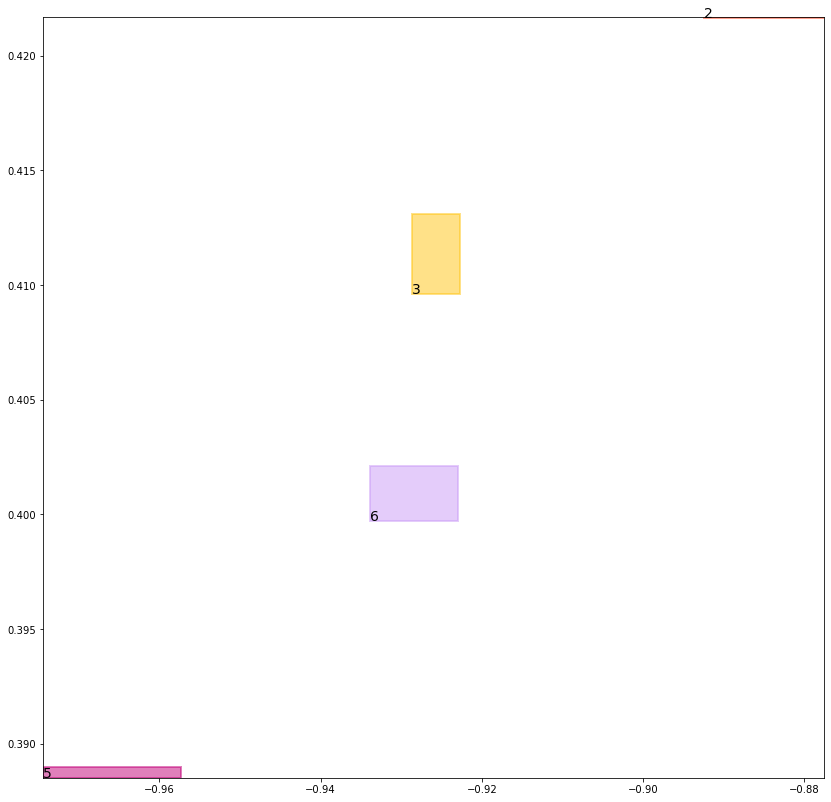

batch (tensor([[2, 6],
        [3, 5],
        [4, 6],
        [1, 2],
        [4, 5],
        [5, 3],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.1178532317280769, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1572902053594589, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2557981312274933, grad_fn=<MulBackward0>)
previous loss: tensor(0.5309416055679321, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.10223269462585449 0.18182742595672607 tensor(0.7084103822708130) tensor(0.9134318232536316)
tensor(2) 0.17505525052547455 0.6890326142311096 tensor(0.3399275541305542) tensor(0.7694959044456482)
tensor(3) 0.15970054268836975 0.5763539671897888 tensor(0.3802292346954346) tensor(0.6570518016815186)
tensor(4) 0.4175785183906555 0.1657685935497284 tensor(0.9053115844726562) tensor(0.8984860181808472)
tensor(5) 0.7980630993843079 0.6104750037193298 tensor(0.9744534492492676) tensor(0.7006508111953735)
tensor(6) 0.7305142283439636 0.7149633765220642 tensor(0.7365798950195312) tensor(0.7431621551513672)


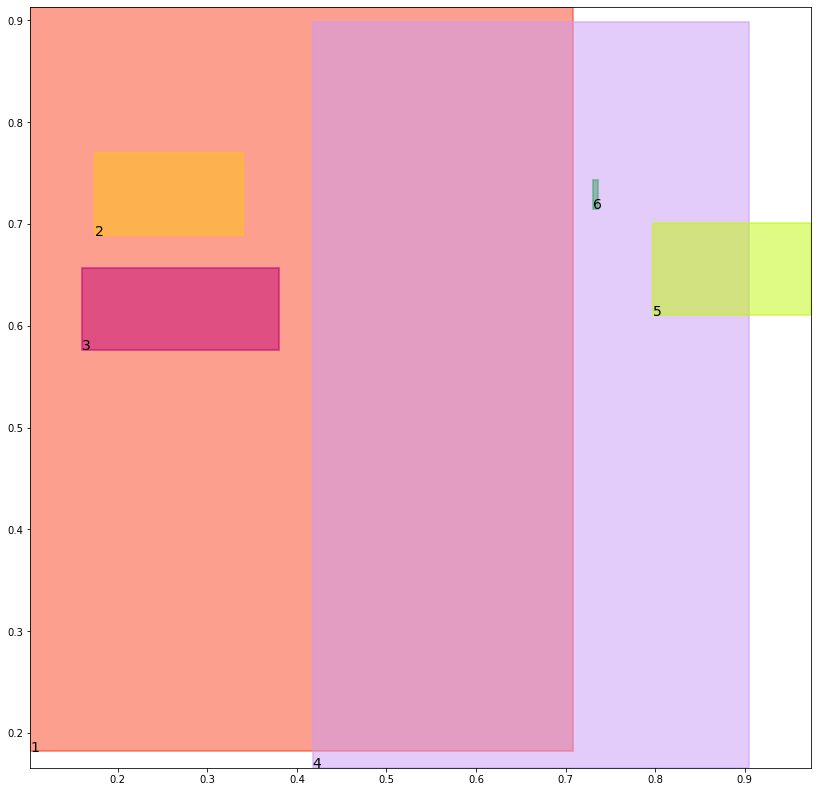

alignment data:
tensor(2) -1.0050990581512451 0.39711371064186096 tensor(-0.9890654683113098) tensor(0.3981668353080750)
tensor(3) -1.0338168144226074 0.3940203785896301 tensor(-1.0193400382995605) tensor(0.3946622014045715)
tensor(5) -1.0435395240783691 0.39019808173179626 tensor(-1.0253264904022217) tensor(0.3914412856101990)
tensor(6) -1.0145320892333984 0.39368078112602234 tensor(-1.0074096918106079) tensor(0.3944382071495056)


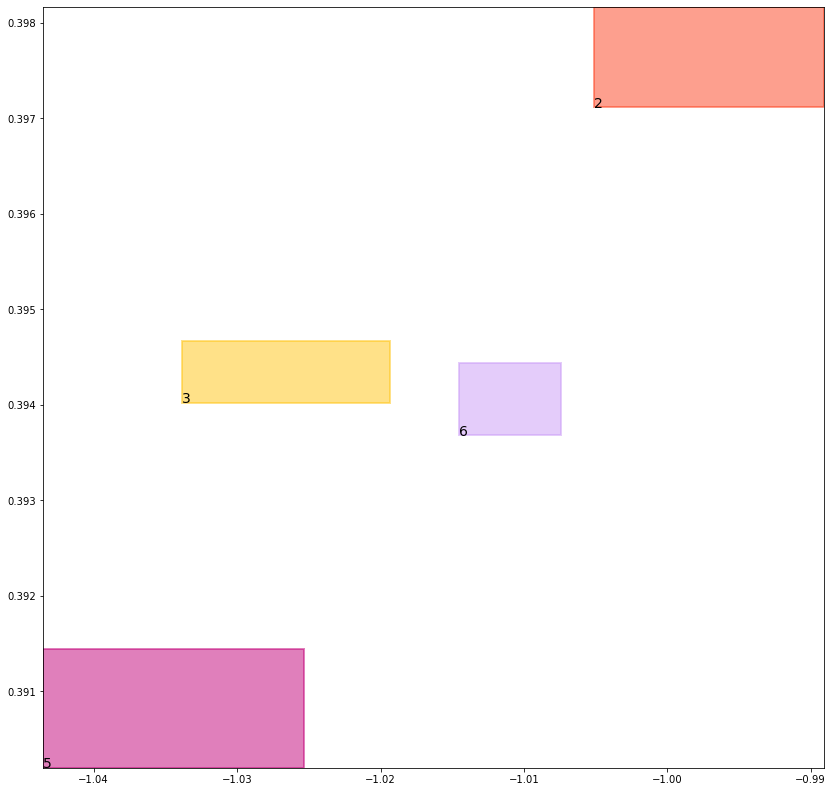

batch (tensor([[1, 3],
        [5, 3],
        [2, 6],
        [4, 6],
        [6, 2],
        [1, 2],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.1049868538975716, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1461271643638611, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509737610816956, grad_fn=<MulBackward0>)
previous loss: tensor(0.5020877718925476, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.09767641127109528 0.17668746411800385 tensor(0.7156063914299011) tensor(0.9169725775718689)
tensor(2) 0.18545164167881012 0.6898316144943237 tensor(0.3406783640384674) tensor(0.7572521567344666)
tensor(3) 0.1697382926940918 0.5798038840293884 tensor(0.3723240494728088) tensor(0.6561298370361328)
tensor(4) 0.4067726135253906 0.16068120300769806 tensor(0.9096931219100952) tensor(0.9022701978683472)
tensor(5) 0.7982839941978455 0.6103090047836304 tensor(0.9723735451698303) tensor(0.6888049840927124)
tensor(6) 0.7252143621444702 0.7120257019996643 tensor(0.7262797355651855) tensor(0.7314723134040833)


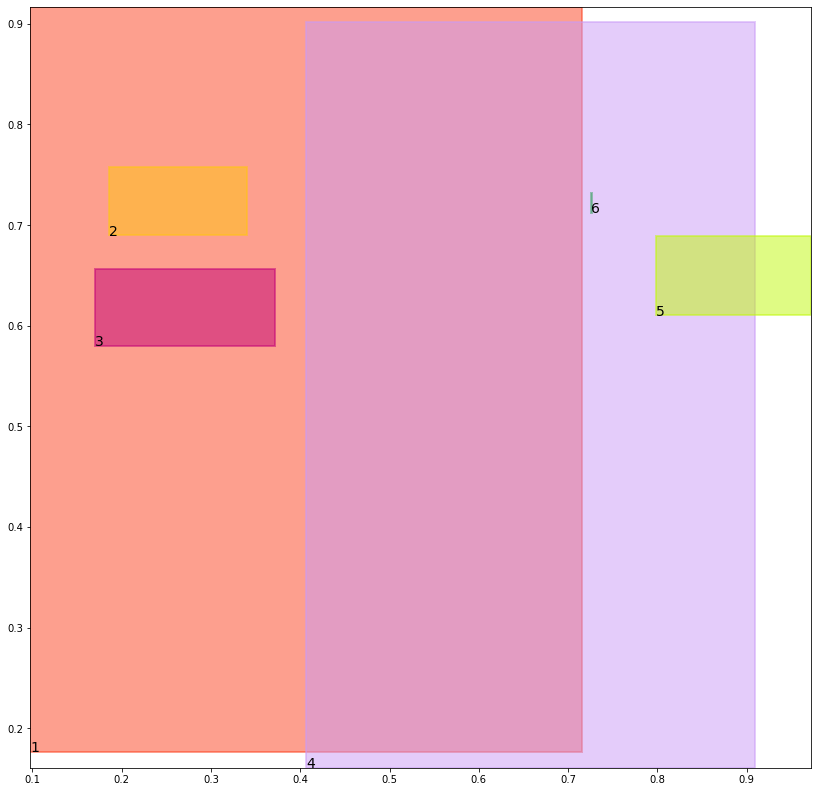

alignment data:
tensor(2) -1.1170114278793335 0.3584425151348114 tensor(-1.0993248224258423) tensor(0.3605020642280579)
tensor(3) -1.1390057802200317 0.3601170778274536 tensor(-1.1182068586349487) tensor(0.3630178570747375)
tensor(5) -1.1148625612258911 0.37288132309913635 tensor(-1.0944626331329346) tensor(0.3751385807991028)
tensor(6) -1.0970619916915894 0.3691445589065552 tensor(-1.0932242870330811) tensor(0.3694767951965332)


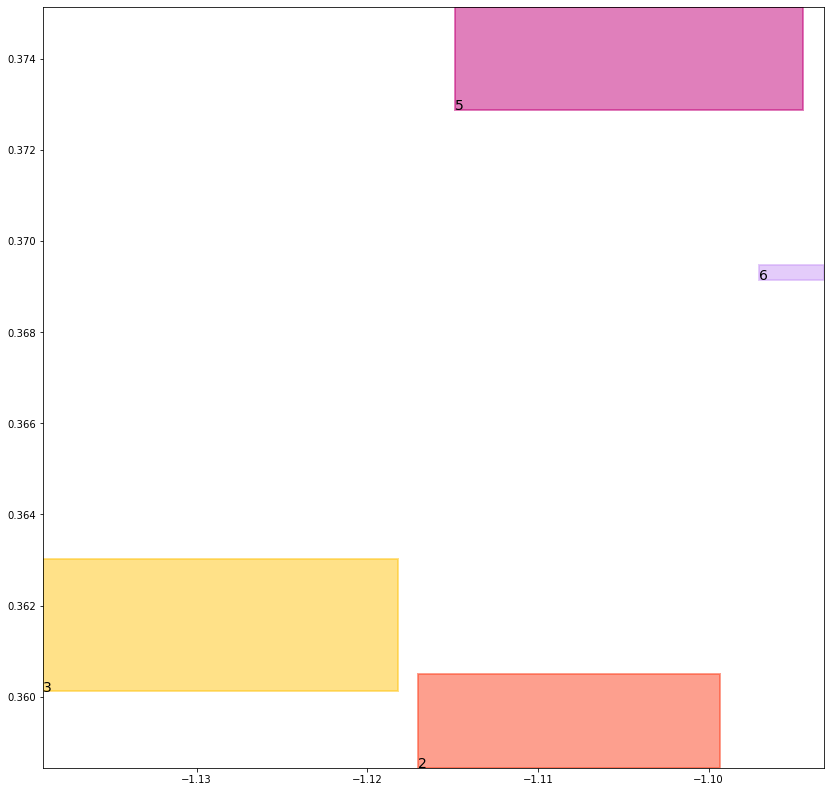

batch (tensor([[1, 3],
        [3, 5],
        [1, 2],
        [6, 2],
        [5, 3],
        [4, 5],
        [2, 6],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0934205800294876, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1362998932600021, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2517535686492920, grad_fn=<MulBackward0>)
previous loss: tensor(0.4814740419387817, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.09350398182868958 0.17196036875247955 tensor(0.7222195863723755) tensor(0.9202093482017517)
tensor(2) 0.19617153704166412 0.6906853318214417 tensor(0.3411115705966949) tensor(0.7449384331703186)
tensor(3) 0.1801782250404358 0.583289623260498 tensor(0.3650681674480438) tensor(0.6543682217597961)
tensor(4) 0.39651164412498474 0.15587115287780762 tensor(0.9137446880340576) tensor(0.9057049155235291)
tensor(5) 0.7983952760696411 0.6101916432380676 tensor(0.9701064825057983) tensor(0.6771836280822754)
tensor(6) 0.7149695754051208 0.7091861963272095 tensor(0.7216542363166809) tensor(0.7197381258010864)


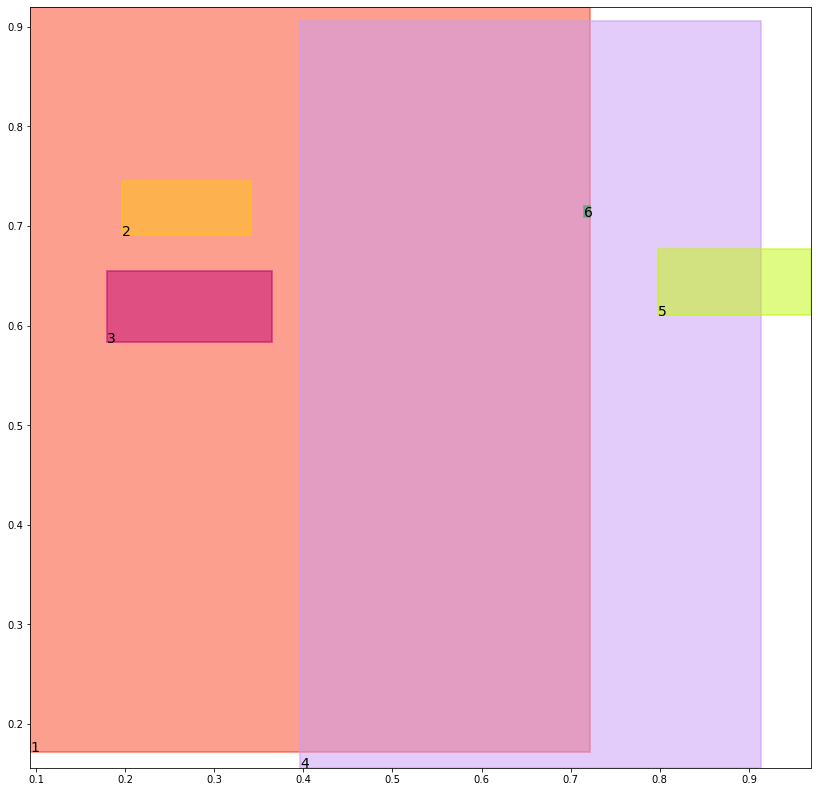

alignment data:
tensor(2) -1.2004833221435547 0.3160879909992218 tensor(-1.1820523738861084) tensor(0.3190922737121582)
tensor(3) -1.2170875072479248 0.3214959502220154 tensor(-1.1933073997497559) tensor(0.3252224028110504)
tensor(5) -1.1678564548492432 0.34588462114334106 tensor(-1.1456303596496582) tensor(0.3492899835109711)
tensor(6) -1.159754753112793 0.3364681601524353 tensor(-1.1577479839324951) tensor(0.3367851972579956)


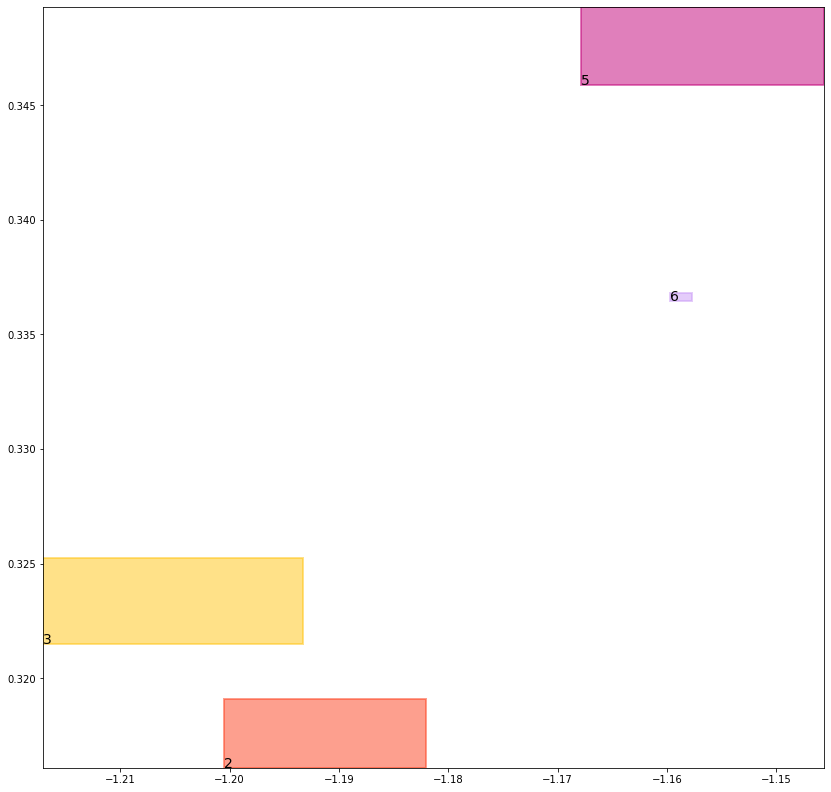

batch (tensor([[1, 3],
        [1, 2],
        [4, 5],
        [3, 5],
        [5, 3],
        [4, 6],
        [2, 6],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0830582529306412, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1282852590084076, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2555465996265411, grad_fn=<MulBackward0>)
previous loss: tensor(0.4668900966644287, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.08968791365623474 0.1676088571548462 tensor(0.7282994985580444) tensor(0.9231662750244141)
tensor(2) 0.20718732476234436 0.6916419267654419 tensor(0.3413204848766327) tensor(0.7326237559318542)
tensor(3) 0.1910046935081482 0.5868257284164429 tensor(0.3584439158439636) tensor(0.6518896222114563)
tensor(4) 0.38676050305366516 0.1513241082429886 tensor(0.9174923896789551) tensor(0.9088221192359924)
tensor(5) 0.7983076572418213 0.6100937128067017 tensor(0.9676330089569092) tensor(0.6658191084861755)
tensor(6) 0.7057734131813049 0.7064278721809387 tensor(0.7166888713836670) tensor(0.7080110311508179)


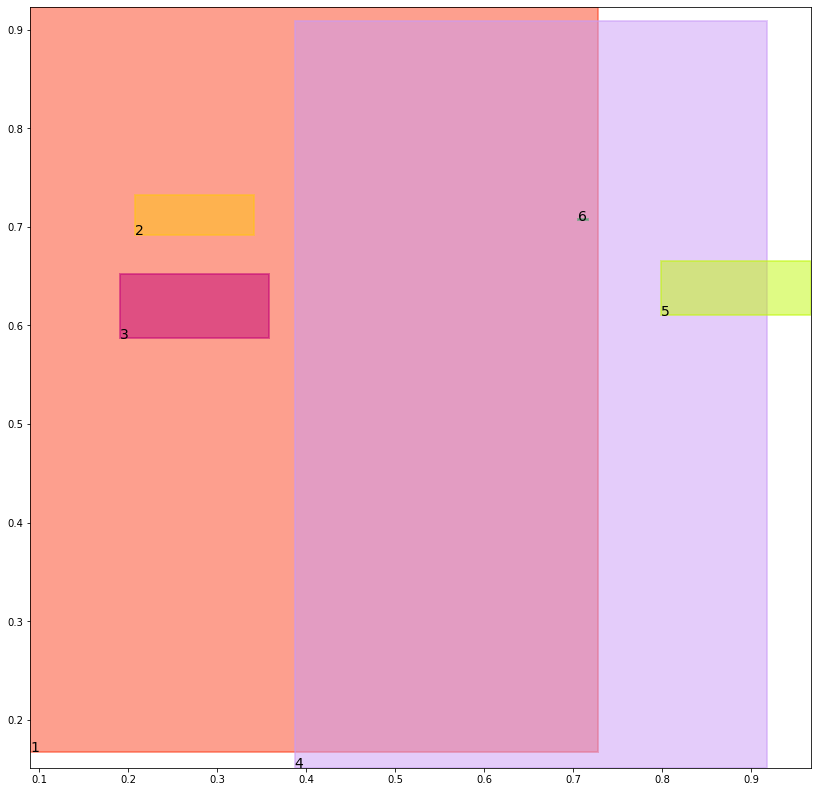

alignment data:
tensor(2) -1.2588578462600708 0.2816859185695648 tensor(-1.2413938045501709) tensor(0.2855557203292847)
tensor(3) -1.2716701030731201 0.28962990641593933 tensor(-1.2483789920806885) tensor(0.2932894825935364)
tensor(5) -1.2099940776824951 0.32081761956214905 tensor(-1.1875201463699341) tensor(0.3253665864467621)
tensor(6) -1.2086856365203857 0.30765408277511597 tensor(-1.2074520587921143) tensor(0.3081165552139282)


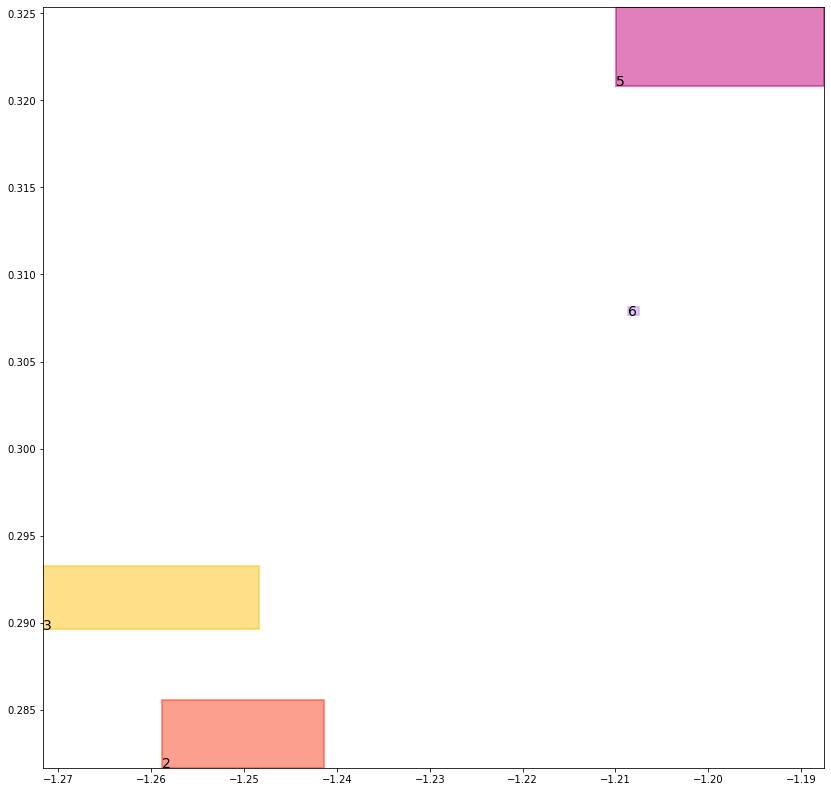

batch (tensor([[4, 5],
        [5, 3],
        [3, 5],
        [6, 2],
        [1, 3],
        [2, 6],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0737986415624619, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1209657713770866, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2586437165737152, grad_fn=<MulBackward0>)
previous loss: tensor(0.4534081220626831, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.08620153367519379 0.16359922289848328 tensor(0.7338916659355164) tensor(0.9258663654327393)
tensor(2) 0.2184651643037796 0.6926612854003906 tensor(0.3413831293582916) tensor(0.7203633189201355)
tensor(3) 0.20219483971595764 0.5903586745262146 tensor(0.3524267971515656) tensor(0.6487521529197693)
tensor(4) 0.37748733162879944 0.1470256894826889 tensor(0.9209603071212769) tensor(0.9116514325141907)
tensor(5) 0.7979583144187927 0.6100854873657227 tensor(0.9649318456649780) tensor(0.6547590494155884)
tensor(6) 0.6975512504577637 0.6963558197021484 tensor(0.7114275097846985) tensor(0.7038184404373169)


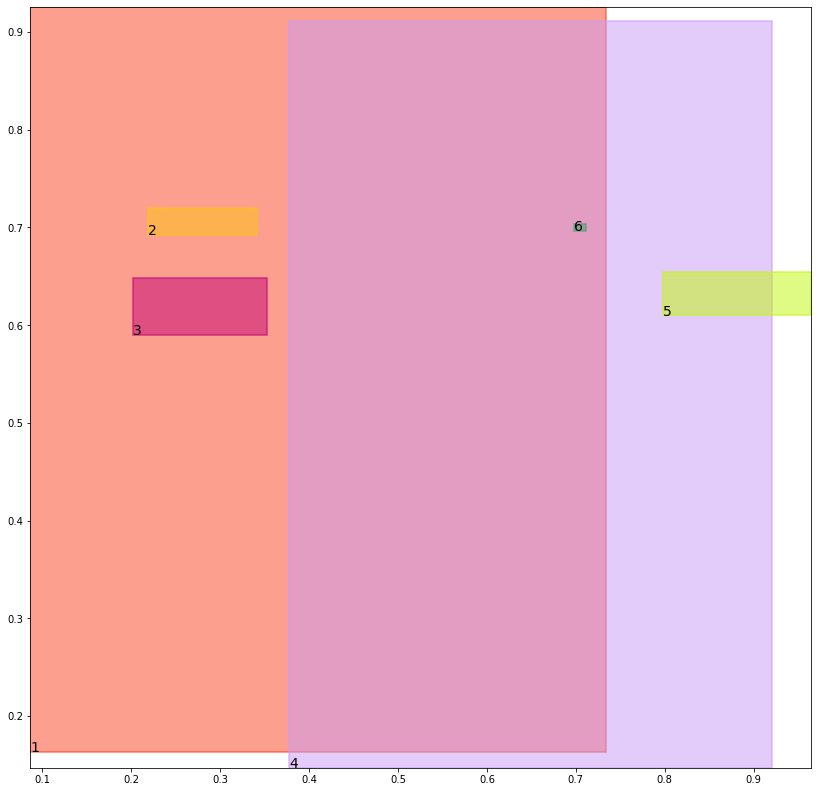

alignment data:
tensor(2) -1.2673025131225586 0.2597019672393799 tensor(-1.2526549100875854) tensor(0.2642841041088104)
tensor(3) -1.277904748916626 0.2689913213253021 tensor(-1.2578473091125488) tensor(0.2721300721168518)
tensor(5) -1.216970682144165 0.3026917576789856 tensor(-1.1964547634124756) tensor(0.3082096278667450)
tensor(6) -1.21937096118927 0.2880232036113739 tensor(-1.2173365354537964) tensor(0.2881055474281311)


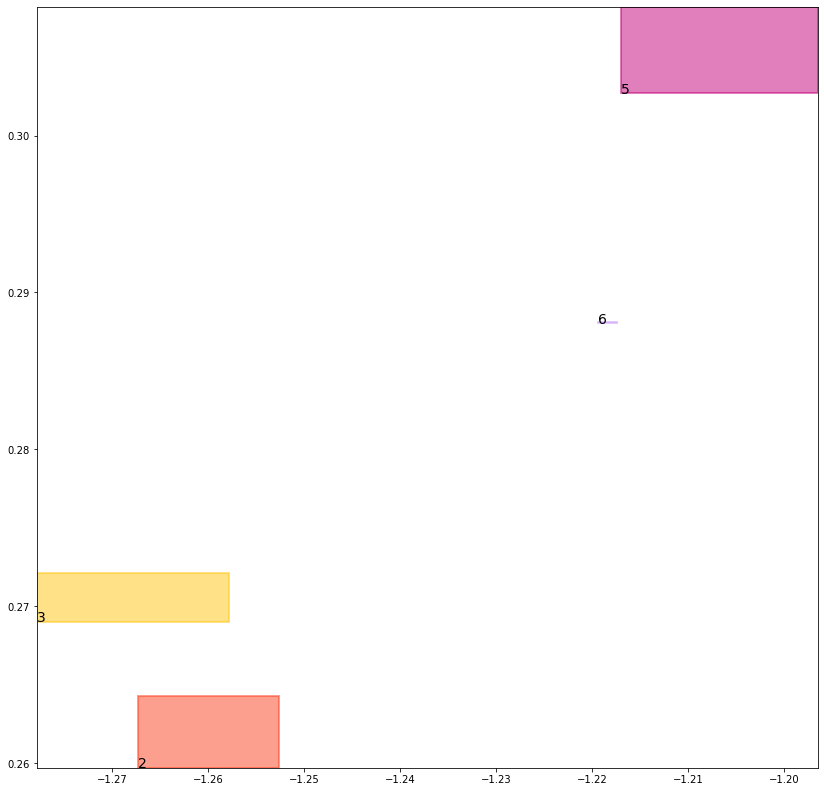

batch (tensor([[1, 2],
        [1, 3],
        [5, 3],
        [4, 6],
        [2, 6],
        [4, 5],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0655459165573120, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1149524673819542, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2589589953422546, grad_fn=<MulBackward0>)
previous loss: tensor(0.4394573867321014, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0830191969871521 0.1599009484052658 tensor(0.7390389442443848) tensor(0.9283313155174255)
tensor(2) 0.2299584150314331 0.6936917901039124 tensor(0.3413269519805908) tensor(0.7082088589668274)
tensor(3) 0.21371078491210938 0.5938333868980408 tensor(0.3469695150852203) tensor(0.6450040340423584)
tensor(4) 0.36866292357444763 0.14295697212219238 tensor(0.9241712093353271) tensor(0.9142223596572876)
tensor(5) 0.7973501086235046 0.6102341413497925 tensor(0.9619805812835693) tensor(0.6440483331680298)
tensor(6) 0.6902545690536499 0.6855220794677734 tensor(0.7059190273284912) tensor(0.6985816359519958)


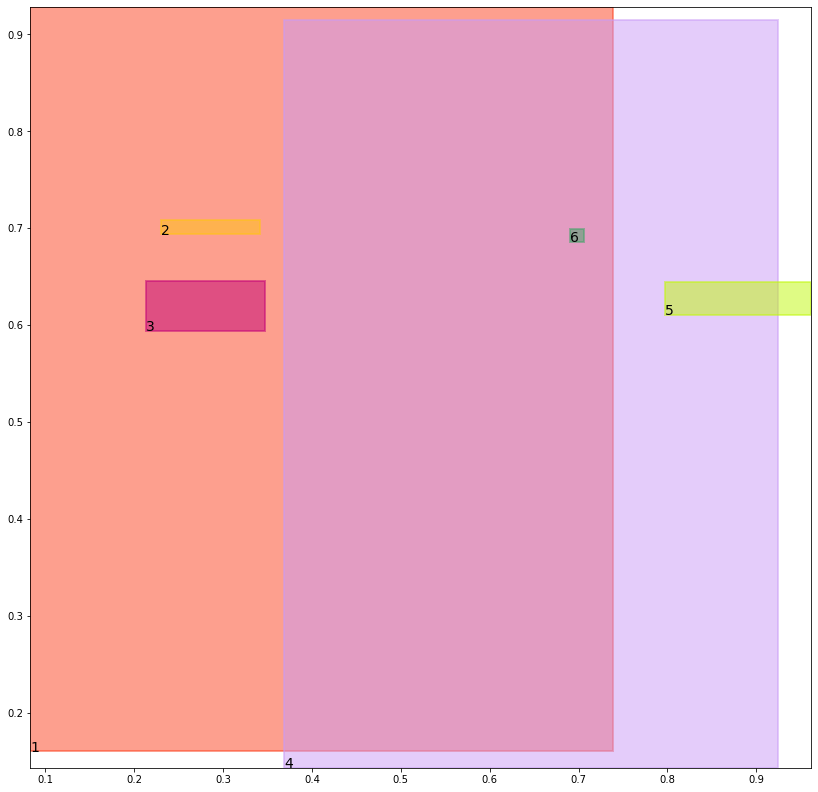

alignment data:
tensor(2) -1.2582380771636963 0.24570392072200775 tensor(-1.2478381395339966) tensor(0.2507544159889221)
tensor(3) -1.2679975032806396 0.2552696466445923 tensor(-1.2527030706405640) tensor(0.2577500641345978)
tensor(5) -1.218528151512146 0.28802773356437683 tensor(-1.2021125555038452) tensor(0.2941913902759552)
tensor(6) -1.2210029363632202 0.27331268787384033 tensor(-1.2186110019683838) tensor(0.2737636566162109)


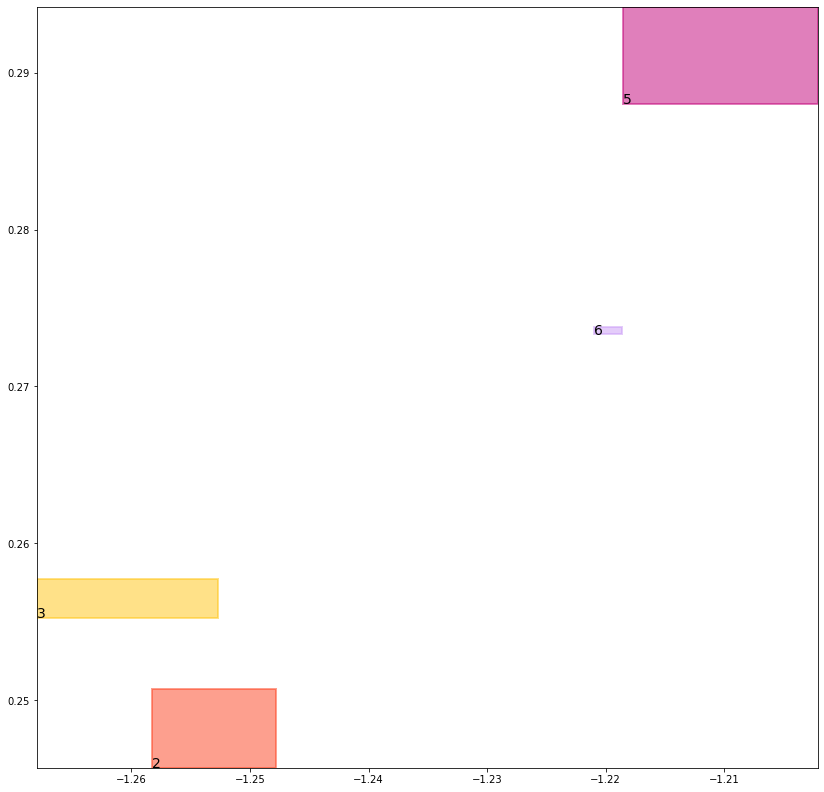

batch (tensor([[1, 3],
        [3, 5],
        [1, 2],
        [6, 2],
        [2, 6],
        [5, 3],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0582120940089226, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1092179417610168, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2568640112876892, grad_fn=<MulBackward0>)
previous loss: tensor(0.4242940545082092, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.08011643588542938 0.15648631751537323 tensor(0.7437802553176880) tensor(0.9305813908576965)
tensor(2) 0.2416076809167862 0.6947009563446045 tensor(0.3411341607570648) tensor(0.6962119340896606)
tensor(3) 0.225498229265213 0.5972161293029785 tensor(0.3420062065124512) tensor(0.6407055258750916)
tensor(4) 0.36026081442832947 0.13909971714019775 tensor(0.9271451234817505) tensor(0.9165609478950500)
tensor(5) 0.7965406179428101 0.6105678677558899 tensor(0.9587548375129700) tensor(0.6337204575538635)
tensor(6) 0.6838590502738953 0.6754928231239319 tensor(0.7002179026603699) tensor(0.6913098692893982)


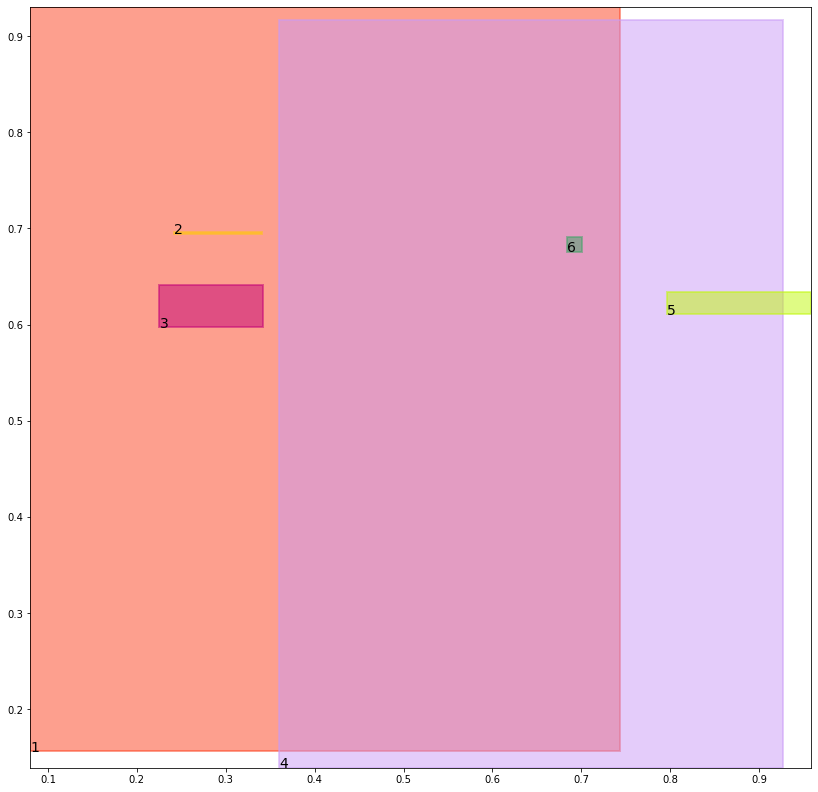

alignment data:
tensor(2) -1.2353277206420898 0.24682149291038513 tensor(-1.2299108505249023) tensor(0.2520115375518799)
tensor(3) -1.2452151775360107 0.2557224631309509 tensor(-1.2350270748138428) tensor(0.2576557099819183)
tensor(5) -1.213733434677124 0.2850934565067291 tensor(-1.2029807567596436) tensor(0.2914661169052124)
tensor(6) -1.2136688232421875 0.2717808783054352 tensor(-1.2113304138183594) tensor(0.2724977731704712)


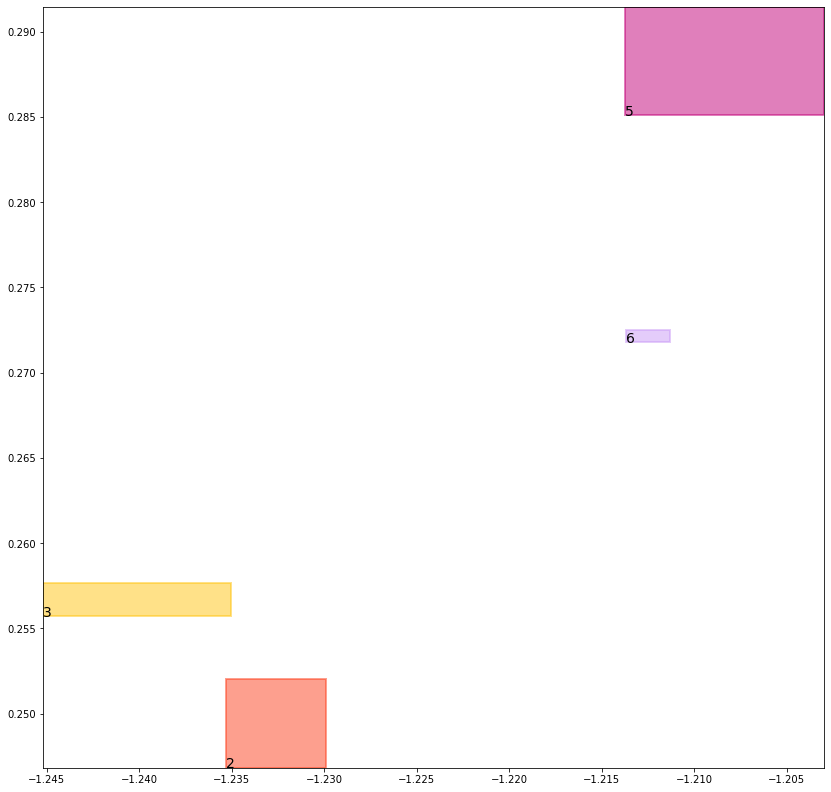

batch (tensor([[6, 2],
        [4, 5],
        [5, 3],
        [1, 2],
        [2, 6],
        [3, 5],
        [1, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0517169274389744, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.1036380678415298, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2541067004203796, grad_fn=<MulBackward0>)
previous loss: tensor(0.4094616770744324, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.07747015357017517 0.15333019196987152 tensor(0.7481511831283569) tensor(0.9326357245445251)
tensor(2) 0.2533472180366516 0.6844223141670227 tensor(0.3407727777957916) tensor(0.6956676244735718)
tensor(3) 0.2374921441078186 0.6004881262779236 tensor(0.3374682068824768) tensor(0.6359226107597351)
tensor(4) 0.3522570729255676 0.1354375034570694 tensor(0.9299014210700989) tensor(0.9186900854110718)
tensor(5) 0.7956036925315857 0.6110906004905701 tensor(0.9552288651466370) tensor(0.6237991452217102)
tensor(6) 0.6783449053764343 0.6662414073944092 tensor(0.6943775415420532) tensor(0.6824222207069397)


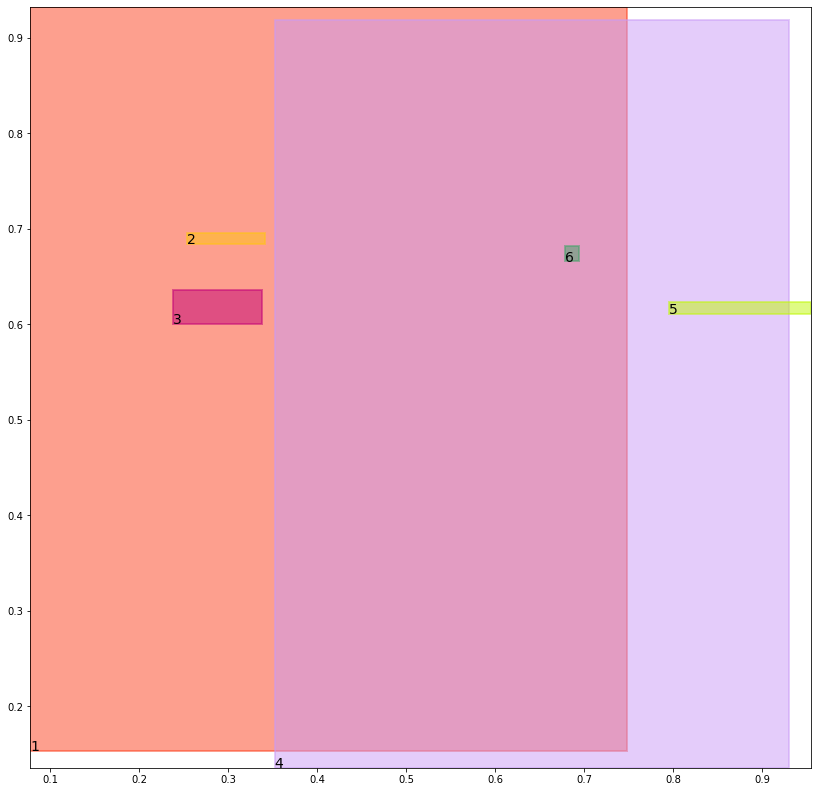

alignment data:
tensor(2) -1.2097147703170776 0.2662089169025421 tensor(-1.2068470716476440) tensor(0.2691423594951630)
tensor(3) -1.2191346883773804 0.27293071150779724 tensor(-1.2134020328521729) tensor(0.2742857336997986)
tensor(5) -1.2074767351150513 0.2970770299434662 tensor(-1.2030907869338989) tensor(0.3031260371208191)
tensor(6) -1.2036904096603394 0.2862090468406677 tensor(-1.2016302347183228) tensor(0.2869216501712799)


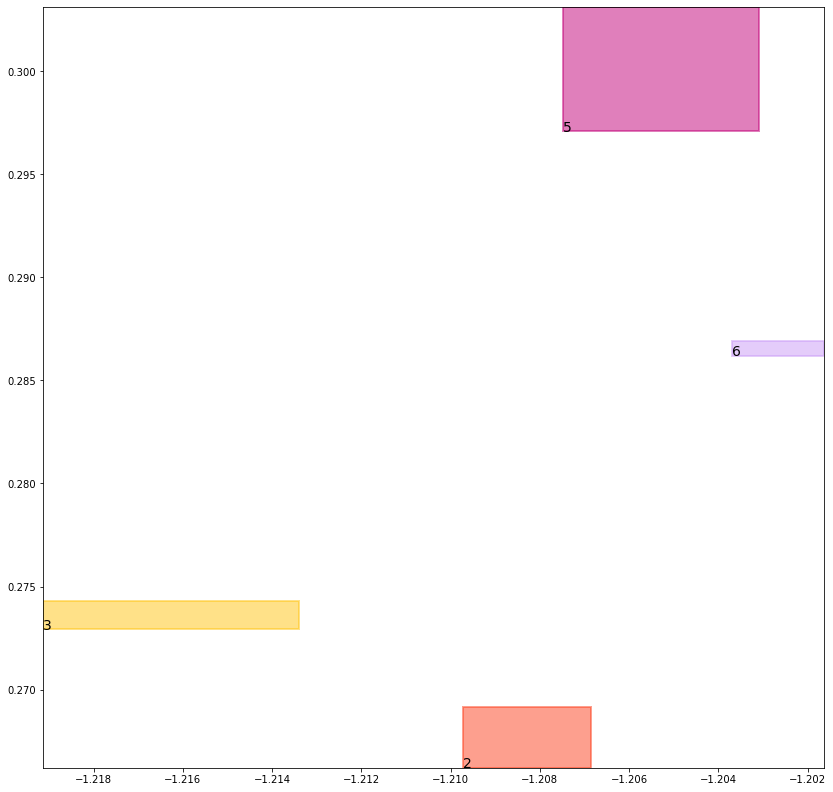

batch (tensor([[2, 6],
        [4, 5],
        [1, 2],
        [6, 2],
        [3, 5],
        [4, 6],
        [1, 3],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0468102693557739, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0982318967580795, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2522482275962830, grad_fn=<MulBackward0>)
previous loss: tensor(0.3972904086112976, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.07505863159894943 0.1504068672657013 tensor(0.7521845698356628) tensor(0.9345148801803589)
tensor(2) 0.2651126980781555 0.6734825372695923 tensor(0.3402246534824371) tensor(0.6943700313568115)
tensor(3) 0.24962517619132996 0.6036238074302673 tensor(0.3332989811897278) tensor(0.6307123303413391)
tensor(4) 0.3446303904056549 0.1319555640220642 tensor(0.9324570894241333) tensor(0.9206297397613525)
tensor(5) 0.7945942878723145 0.6118071675300598 tensor(0.9513742327690125) tensor(0.6143051385879517)
tensor(6) 0.6736782789230347 0.6577358841896057 tensor(0.6884424090385437) tensor(0.6722533106803894)


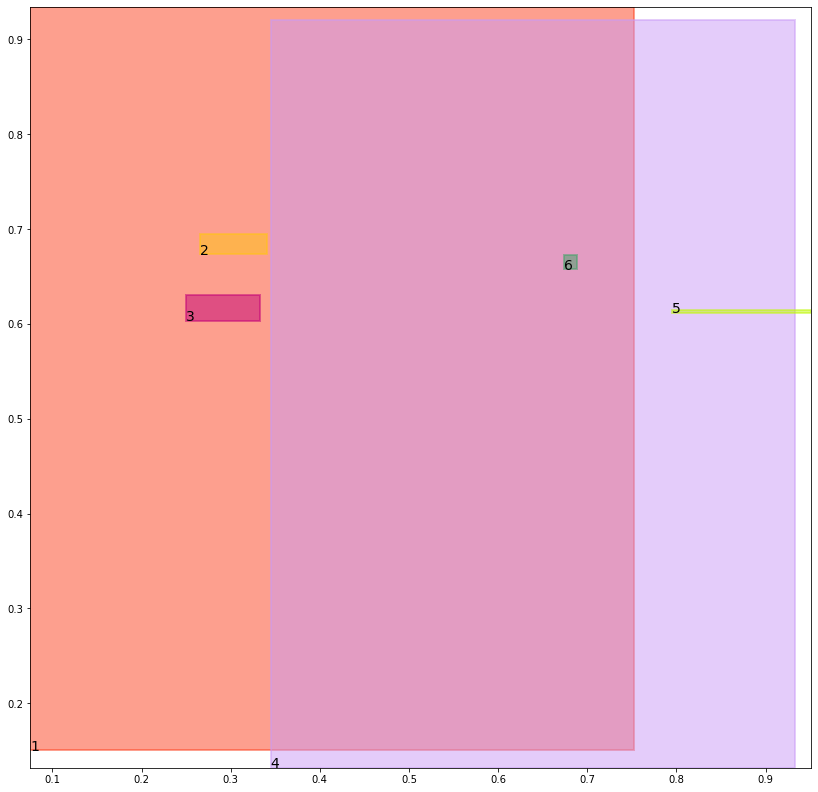

alignment data:
tensor(2) -1.2324167490005493 0.29414910078048706 tensor(-1.2307854890823364) tensor(0.2952084839344025)
tensor(3) -1.24100661277771 0.29856717586517334 tensor(-1.2387086153030396) tensor(0.2994771599769592)
tensor(5) -1.2489941120147705 0.3163939118385315 tensor(-1.2472237348556519) tensor(0.3215122222900391)
tensor(6) -1.2398327589035034 0.30853337049484253 tensor(-1.2382010221481323) tensor(0.3090615868568420)


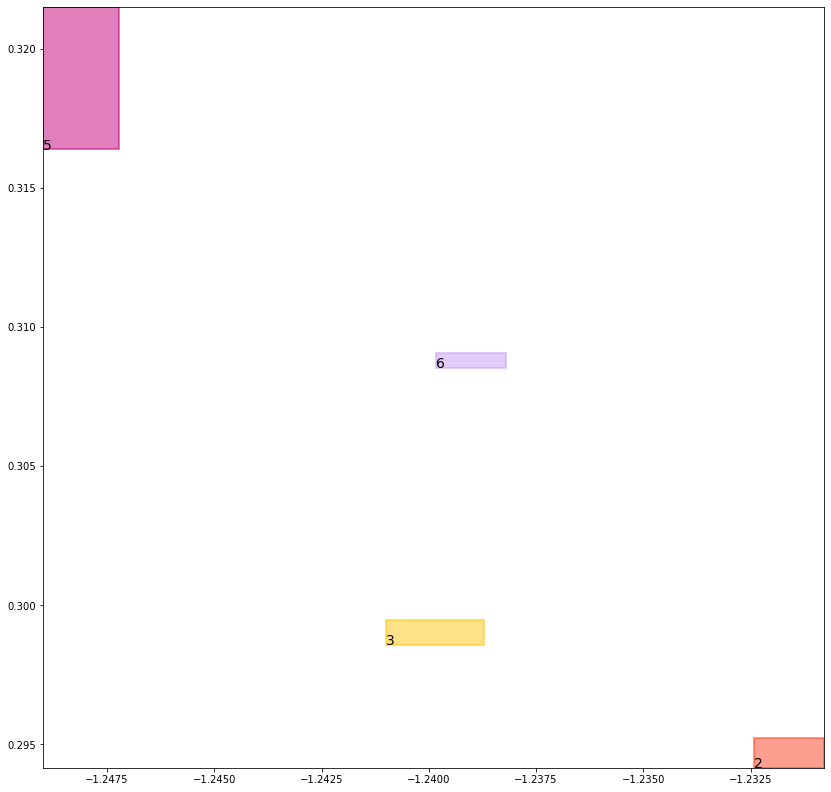

batch (tensor([[4, 6],
        [6, 2],
        [4, 5],
        [3, 5],
        [5, 3],
        [1, 3],
        [1, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0424165129661560, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0930073782801628, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2517784833908081, grad_fn=<MulBackward0>)
previous loss: tensor(0.3872023820877075, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.07286157459020615 0.14769282937049866 tensor(0.7559099197387695) tensor(0.9362372159957886)
tensor(2) 0.2768458425998688 0.6633522510528564 tensor(0.3394950032234192) tensor(0.6911386847496033)
tensor(3) 0.2618337571620941 0.606593132019043 tensor(0.3294590413570404) tensor(0.6251177191734314)
tensor(4) 0.33736154437065125 0.12864062190055847 tensor(0.9348282814025879) tensor(0.9223977327346802)
tensor(5) 0.7935360670089722 0.6052586436271667 tensor(0.9471597075462341) tensor(0.6127339601516724)
tensor(6) 0.6698057651519775 0.6499442458152771 tensor(0.6824458241462708) tensor(0.6610902547836304)


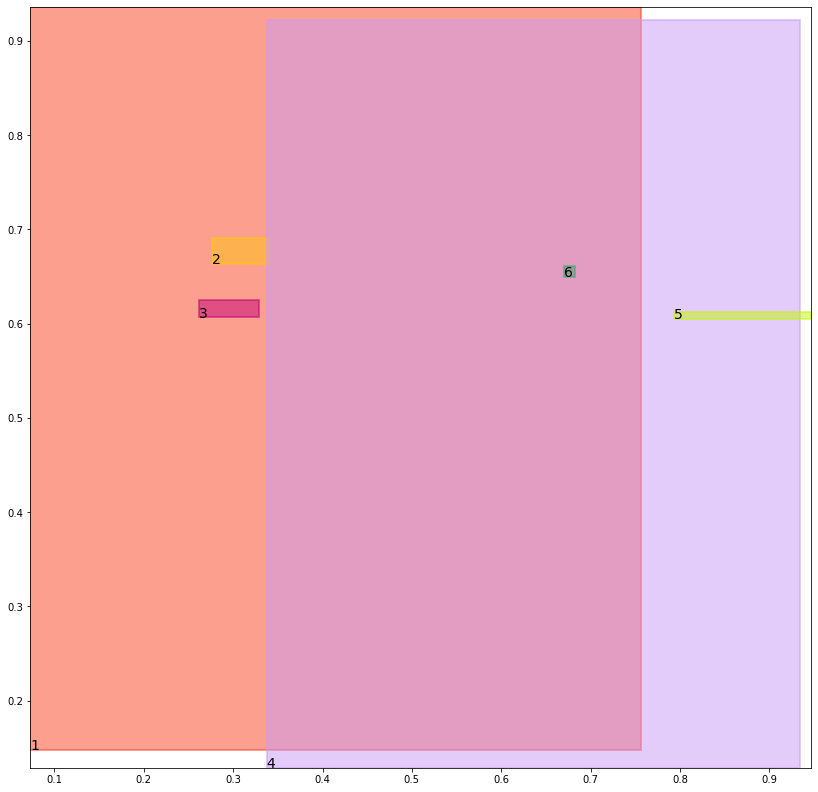

alignment data:
tensor(2) -1.2384157180786133 0.323920339345932 tensor(-1.2369174957275391) tensor(0.3239942491054535)
tensor(3) -1.245790958404541 0.32649004459381104 tensor(-1.2457799911499023) tensor(0.3269775211811066)
tensor(5) -1.2711102962493896 0.3375928997993469 tensor(-1.2662887573242188) tensor(0.3404120206832886)
tensor(6) -1.2553044557571411 0.3325254023075104 tensor(-1.2542263269424438) tensor(0.3328143358230591)


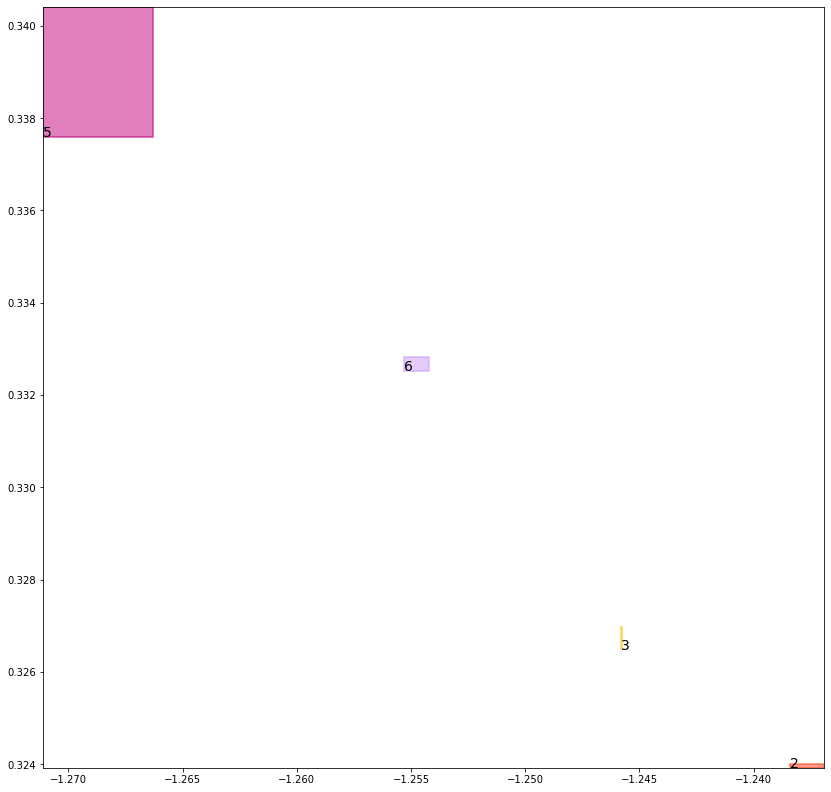

batch (tensor([[5, 3],
        [4, 6],
        [1, 2],
        [1, 3],
        [2, 6],
        [3, 5],
        [4, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0384014844894409, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0882802382111549, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2522095143795013, grad_fn=<MulBackward0>)
previous loss: tensor(0.3788912296295166, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.07086016982793808 0.1451670229434967 tensor(0.7593542337417603) tensor(0.9378175735473633)
tensor(2) 0.28849461674690247 0.6539862155914307 tensor(0.3386051058769226) tensor(0.6862477660179138)
tensor(3) 0.27405932545661926 0.609364926815033 tensor(0.3259207308292389) tensor(0.6191787719726562)
tensor(4) 0.33043327927589417 0.12547223269939423 tensor(0.9370292425155640) tensor(0.9240106940269470)
tensor(5) 0.7924301028251648 0.5970473885536194 tensor(0.9425508975982666) tensor(0.6125013232231140)
tensor(6) 0.66666179895401 0.642833411693573 tensor(0.6764129400253296) tensor(0.6491881608963013)


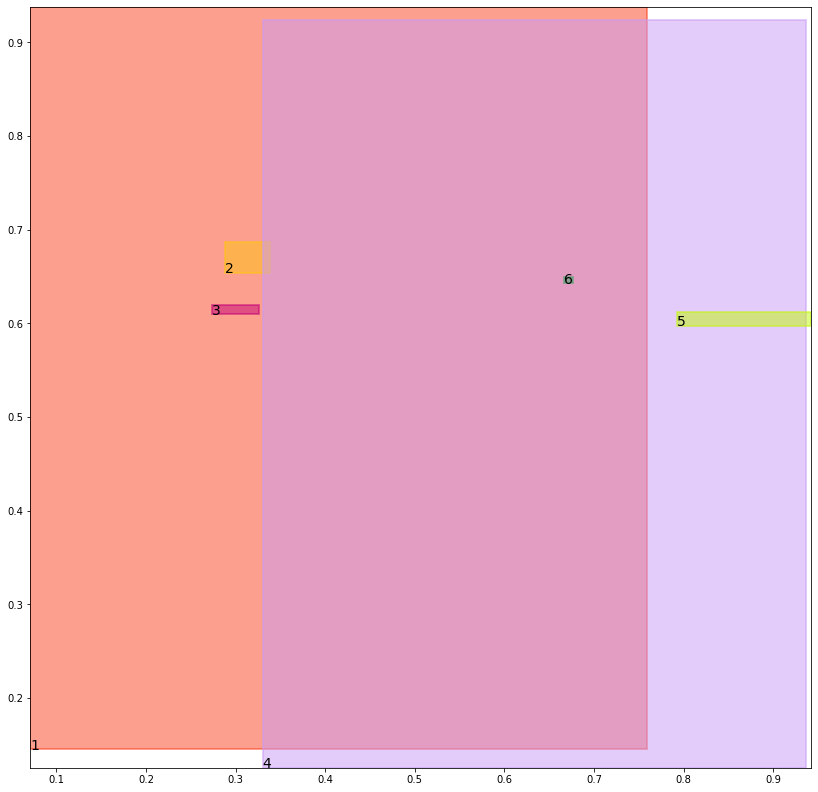

alignment data:
tensor(2) -1.1887813806533813 0.3487313389778137 tensor(-1.1866561174392700) tensor(0.3492679297924042)
tensor(3) -1.1959189176559448 0.35036909580230713 tensor(-1.1946264505386353) tensor(0.3504454195499420)
tensor(5) -1.229559302330017 0.3540903329849243 tensor(-1.2238992452621460) tensor(0.3546583652496338)
tensor(6) -1.2104579210281372 0.3519342541694641 tensor(-1.2100328207015991) tensor(0.3520407378673553)


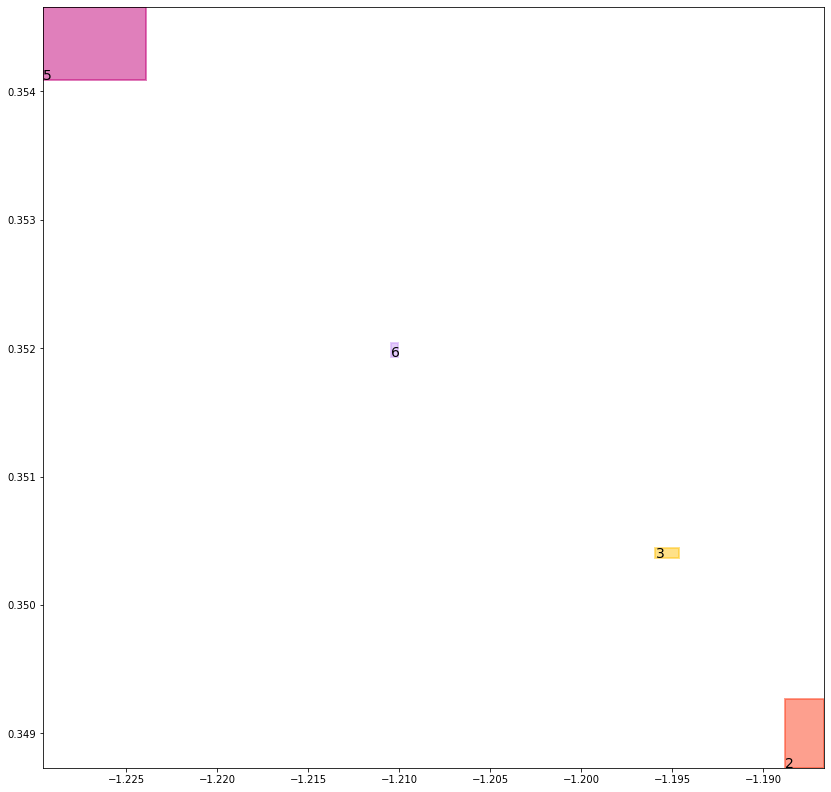

batch (tensor([[6, 2],
        [4, 5],
        [2, 6],
        [5, 3],
        [4, 6],
        [1, 2],
        [1, 3],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0347480773925781, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0837356299161911, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2527855634689331, grad_fn=<MulBackward0>)
previous loss: tensor(0.3712692856788635, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.06903701275587082 0.14281046390533447 tensor(0.7625420689582825) tensor(0.9392695426940918)
tensor(2) 0.3000108301639557 0.6453401446342468 tensor(0.3375793099403381) tensor(0.6799355745315552)
tensor(3) 0.28624576330184937 0.6119207739830017 tensor(0.3226610124111176) tensor(0.6129413843154907)
tensor(4) 0.32382988929748535 0.12243063002824783 tensor(0.9390734434127808) tensor(0.9254837632179260)
tensor(5) 0.7912722826004028 0.5896278023719788 tensor(0.9375115036964417) tensor(0.6112755537033081)
tensor(6) 0.664178729057312 0.6363664269447327 tensor(0.6703649163246155) tensor(0.6367723345756531)


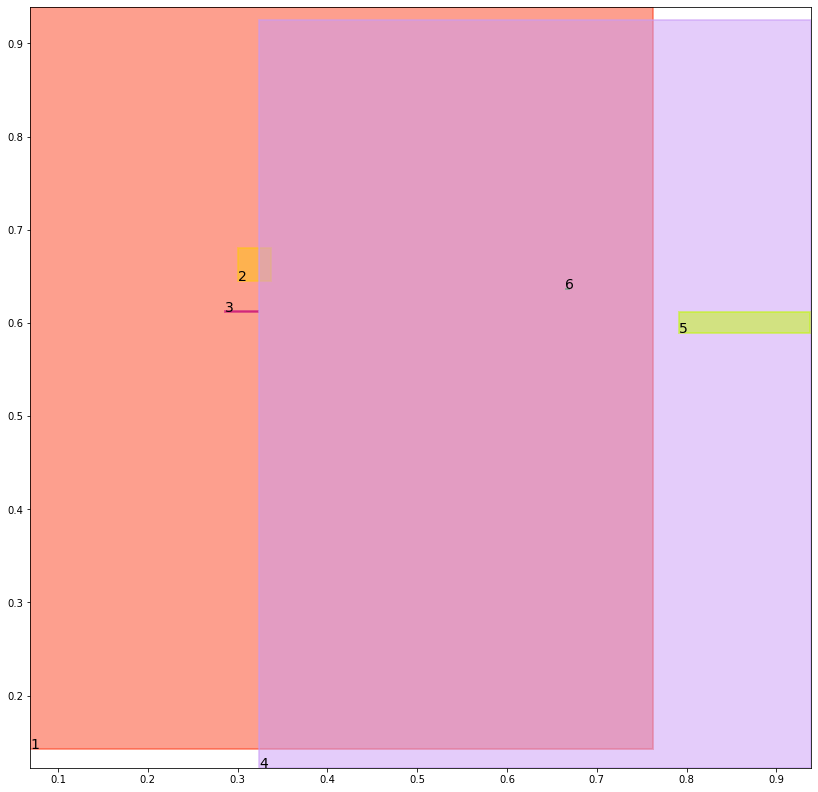

alignment data:
tensor(2) -1.1376290321350098 0.3641268014907837 tensor(-1.1346126794815063) tensor(0.3645844459533691)
tensor(3) -1.1437406539916992 0.3645510673522949 tensor(-1.1418230533599854) tensor(0.3648466467857361)
tensor(5) -1.1789307594299316 0.35964685678482056 tensor(-1.1738433837890625) tensor(0.3609136939048767)
tensor(6) -1.159952163696289 0.36166489124298096 tensor(-1.1596610546112061) tensor(0.3617161214351654)


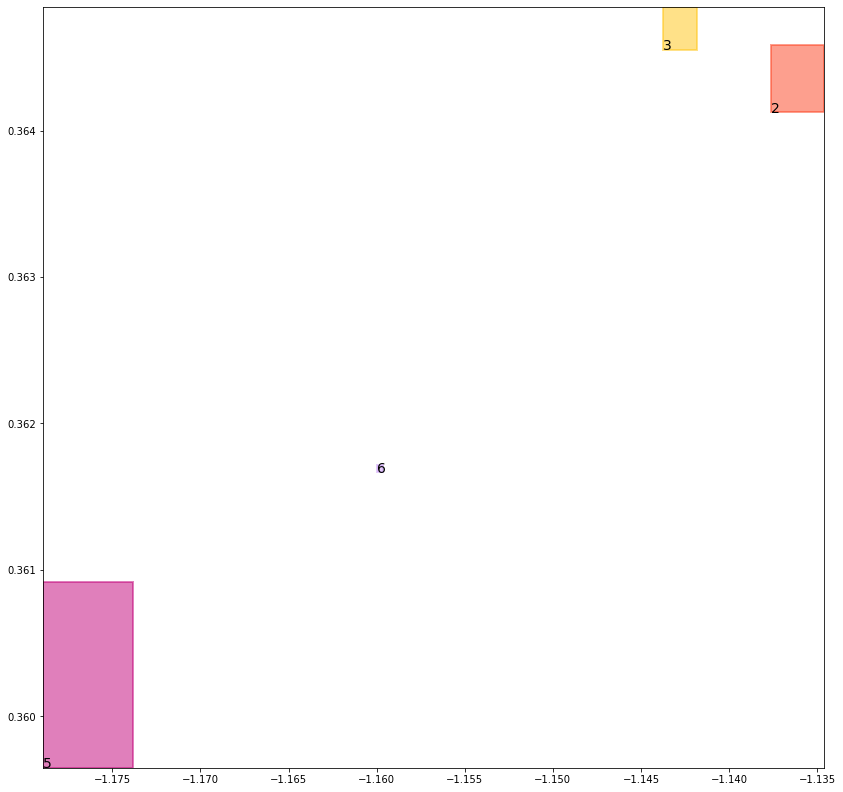

batch (tensor([[2, 6],
        [1, 3],
        [5, 3],
        [1, 2],
        [6, 2],
        [4, 6],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0314388275146484, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0792647004127502, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2530204951763153, grad_fn=<MulBackward0>)
previous loss: tensor(0.3637240231037140, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.067376047372818 0.1406060755252838 tensor(0.7654955387115479) tensor(0.9406042098999023)
tensor(2) 0.31134846806526184 0.6373746991157532 tensor(0.3364359438419342) tensor(0.6724186539649963)
tensor(3) 0.298336923122406 0.6064629554748535 tensor(0.3196564614772797) tensor(0.6142633557319641)
tensor(4) 0.317536860704422 0.11949970573186874 tensor(0.9409729242324829) tensor(0.9268301129341125)
tensor(5) 0.7900651097297668 0.5829493403434753 tensor(0.9320023059844971) tensor(0.6091812252998352)
tensor(6) 0.6622940897941589 0.6240355372428894 tensor(0.6643227338790894) tensor(0.6305016875267029)


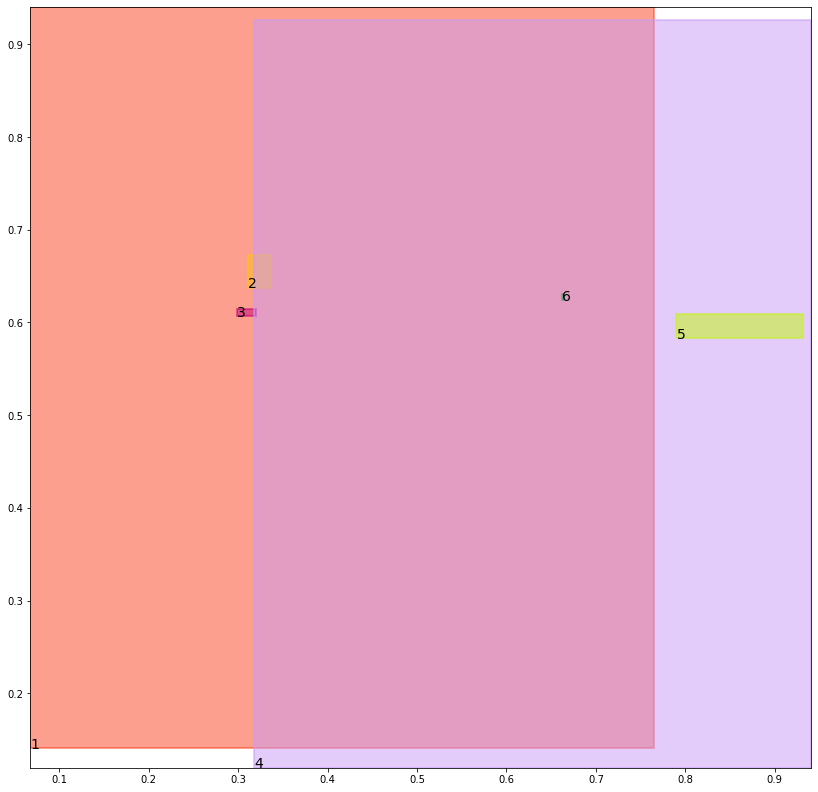

alignment data:
tensor(2) -1.0973658561706543 0.36992278695106506 tensor(-1.0936486721038818) tensor(0.3699258565902710)
tensor(3) -1.1011097431182861 0.3693807125091553 tensor(-1.1010848283767700) tensor(0.3697218894958496)
tensor(5) -1.133035659790039 0.3559960722923279 tensor(-1.1295378208160400) tensor(0.3586697280406952)
tensor(6) -1.117164134979248 0.362088680267334 tensor(-1.1163457632064819) tensor(0.3621457815170288)


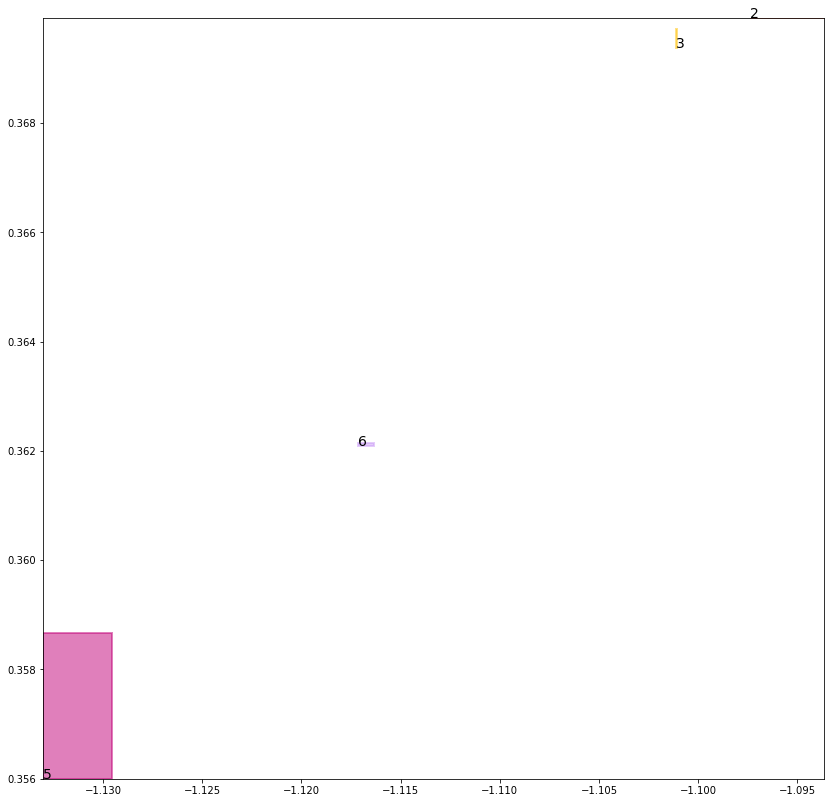

batch (tensor([[5, 3],
        [4, 5],
        [6, 2],
        [4, 6],
        [2, 6],
        [1, 2],
        [1, 3],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0287524722516537, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0751621872186661, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2528298199176788, grad_fn=<MulBackward0>)
previous loss: tensor(0.3567444682121277, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.06586261093616486 0.13853490352630615 tensor(0.7682352662086487) tensor(0.9418327808380127)
tensor(2) 0.32246407866477966 0.6300547122955322 tensor(0.3351850509643555) tensor(0.6639021635055542)
tensor(3) 0.3102762699127197 0.6005626916885376 tensor(0.3168833255767822) tensor(0.6155907511711121)
tensor(4) 0.3115406632423401 0.11666127294301987 tensor(0.9427386522293091) tensor(0.9280625581741333)
tensor(5) 0.7888214588165283 0.576954185962677 tensor(0.9259831309318542) tensor(0.6063118577003479)
tensor(6) 0.6583086252212524 0.6125289797782898 tensor(0.6609500646591187) tensor(0.6247310638427734)


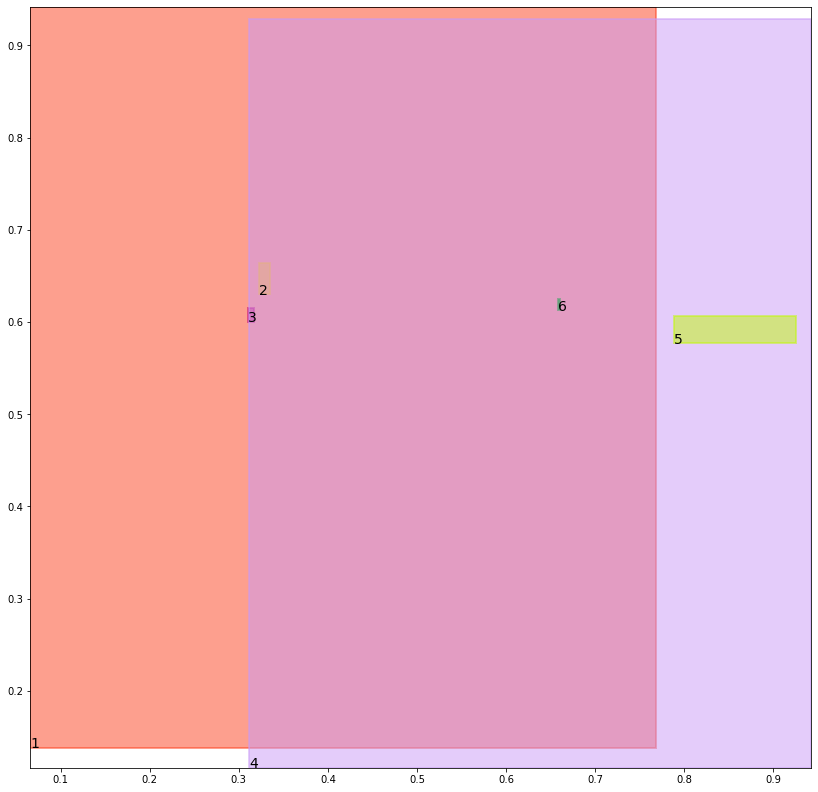

alignment data:
tensor(2) -1.0449767112731934 0.36636602878570557 tensor(-1.0410332679748535) tensor(0.3670426607131958)
tensor(3) -1.0483708381652832 0.36581355333328247 tensor(-1.0466563701629639) tensor(0.3660817742347717)
tensor(5) -1.0709702968597412 0.34535545110702515 tensor(-1.0696071386337280) tensor(0.3489978015422821)
tensor(6) -1.06000554561615 0.3545335531234741 tensor(-1.0585100650787354) tensor(0.3548426628112793)


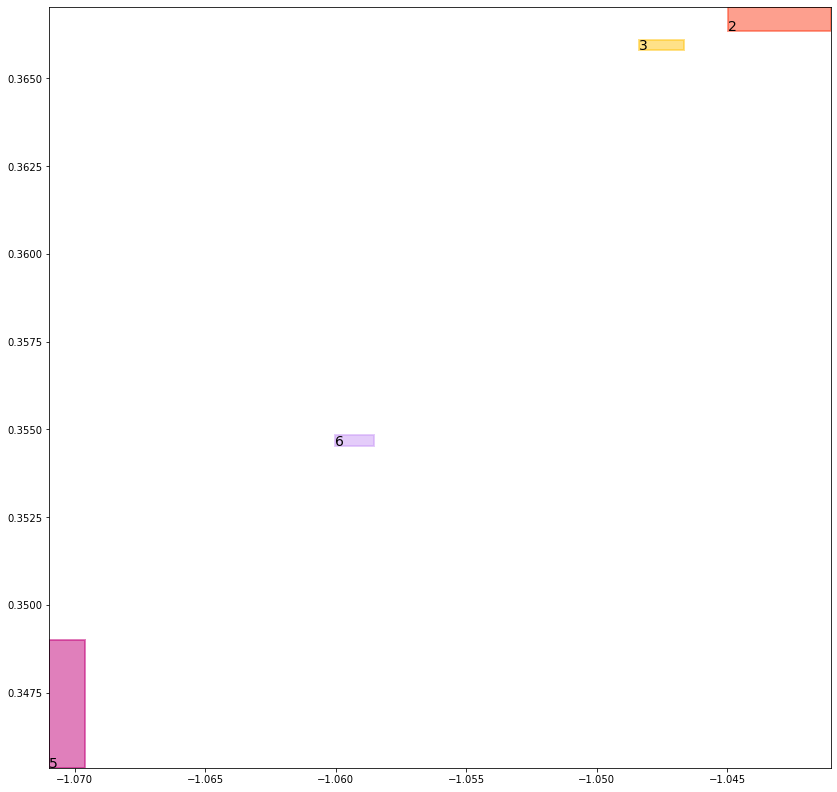

batch (tensor([[1, 3],
        [5, 3],
        [3, 5],
        [4, 5],
        [6, 2],
        [2, 6],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0263636112213135, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0712957829236984, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2524627447128296, grad_fn=<MulBackward0>)
previous loss: tensor(0.3501221537590027, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.06448323279619217 0.1365799605846405 tensor(0.7707791924476624) tensor(0.9429649114608765)
tensor(2) 0.3333181142807007 0.6233491897583008 tensor(0.3338340222835541) tensor(0.6545774936676025)
tensor(3) 0.31431901454925537 0.5952261686325073 tensor(0.3220099508762360) tensor(0.6160174012184143)
tensor(4) 0.3058227002620697 0.11390047520399094 tensor(0.9443808794021606) tensor(0.9291921257972717)
tensor(5) 0.787557065486908 0.571583092212677 tensor(0.9194118380546570) tensor(0.6027367711067200)
tensor(6) 0.6530103087425232 0.6021867990493774 tensor(0.6589576005935669) tensor(0.6190617084503174)


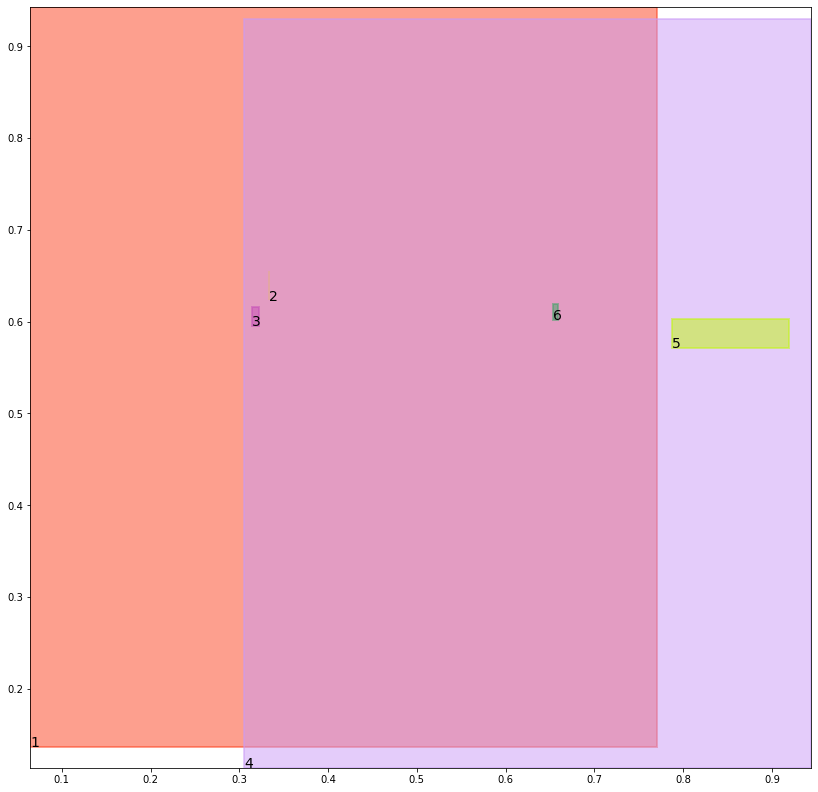

alignment data:
tensor(2) -0.9737527370452881 0.35157322883605957 tensor(-0.9701468944549561) tensor(0.3529691398143768)
tensor(3) -0.9766147136688232 0.35110172629356384 tensor(-0.9743666648864746) tensor(0.3517196774482727)
tensor(5) -0.9891881942749023 0.3257943391799927 tensor(-0.9883208274841309) tensor(0.3299689292907715)
tensor(6) -0.9828478097915649 0.33706146478652954 tensor(-0.9810171127319336) tensor(0.3375755548477173)


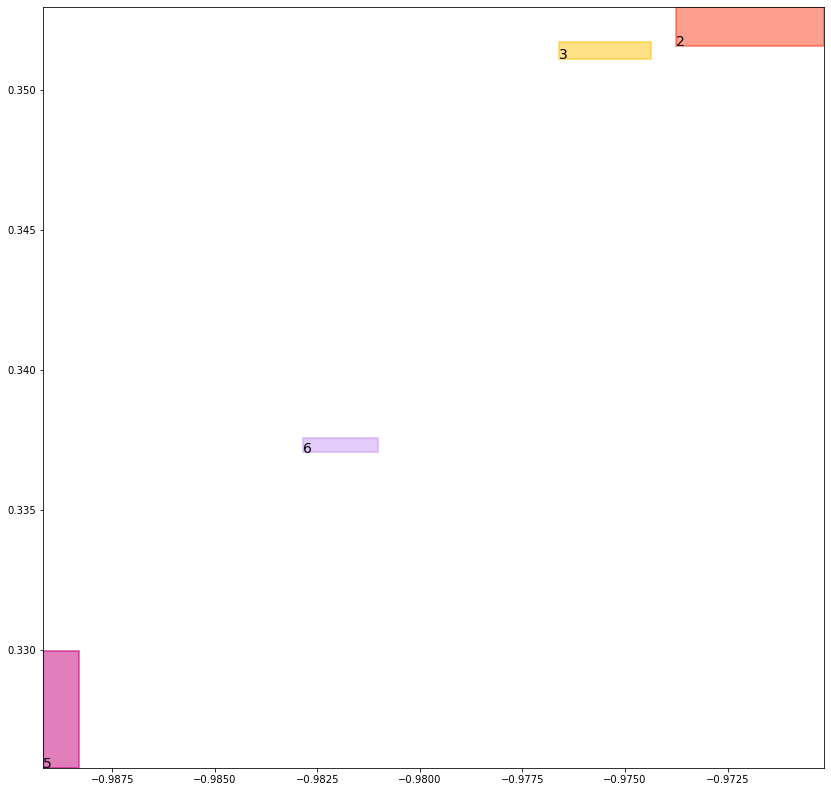

batch (tensor([[5, 3],
        [1, 3],
        [1, 2],
        [4, 5],
        [4, 6],
        [2, 6],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0247677676379681, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0675356388092041, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2521800696849823, grad_fn=<MulBackward0>)
previous loss: tensor(0.3444834947586060, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.06322476267814636 0.1347263902425766 tensor(0.7731465101242065) tensor(0.9440089464187622)
tensor(2) 0.33239227533340454 0.6172287464141846 tensor(0.3438768684864044) tensor(0.6446205973625183)
tensor(3) 0.31250855326652527 0.5904409885406494 tensor(0.3328304290771484) tensor(0.6156522631645203)
tensor(4) 0.30036211013793945 0.11120585352182388 tensor(0.9459088444709778) tensor(0.9302285909652710)
tensor(5) 0.7862847447395325 0.566779613494873 tensor(0.9122454524040222) tensor(0.5985140800476074)
tensor(6) 0.6483820676803589 0.5929360389709473 tensor(0.6563917994499207) tensor(0.6134972572326660)


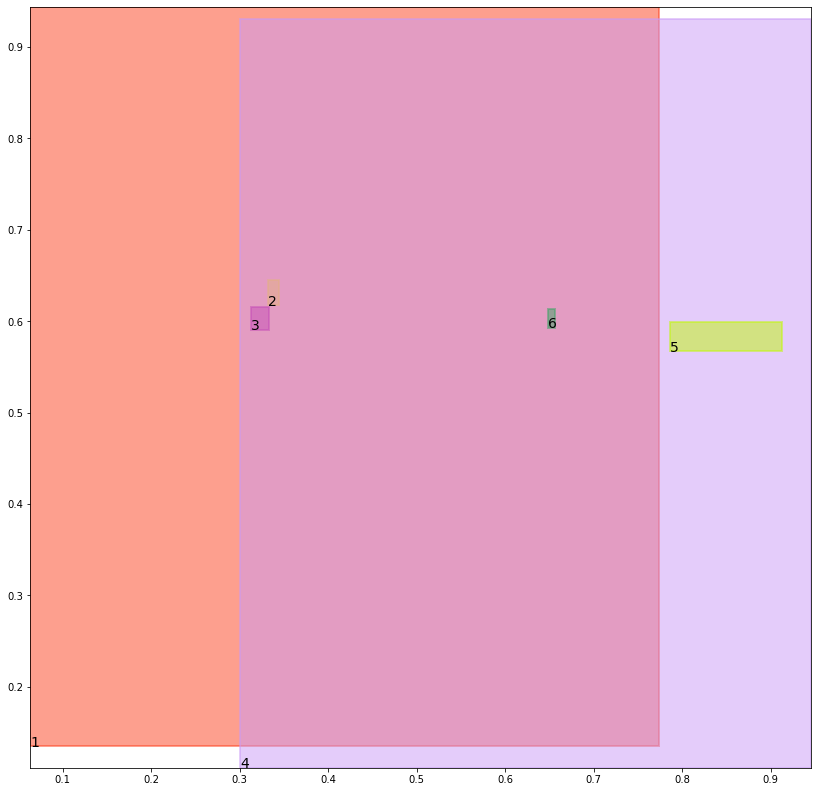

alignment data:
tensor(2) -0.9121943712234497 0.33270367980003357 tensor(-0.9094793796539307) tensor(0.3336240351200104)
tensor(3) -0.9148252010345459 0.3322151303291321 tensor(-0.9123535156250000) tensor(0.3325983881950378)
tensor(5) -0.9185137748718262 0.3041169047355652 tensor(-0.9156812429428101) tensor(0.3084098398685455)
tensor(6) -0.9155077934265137 0.3163706660270691 tensor(-0.9134683609008789) tensor(0.3170906007289886)


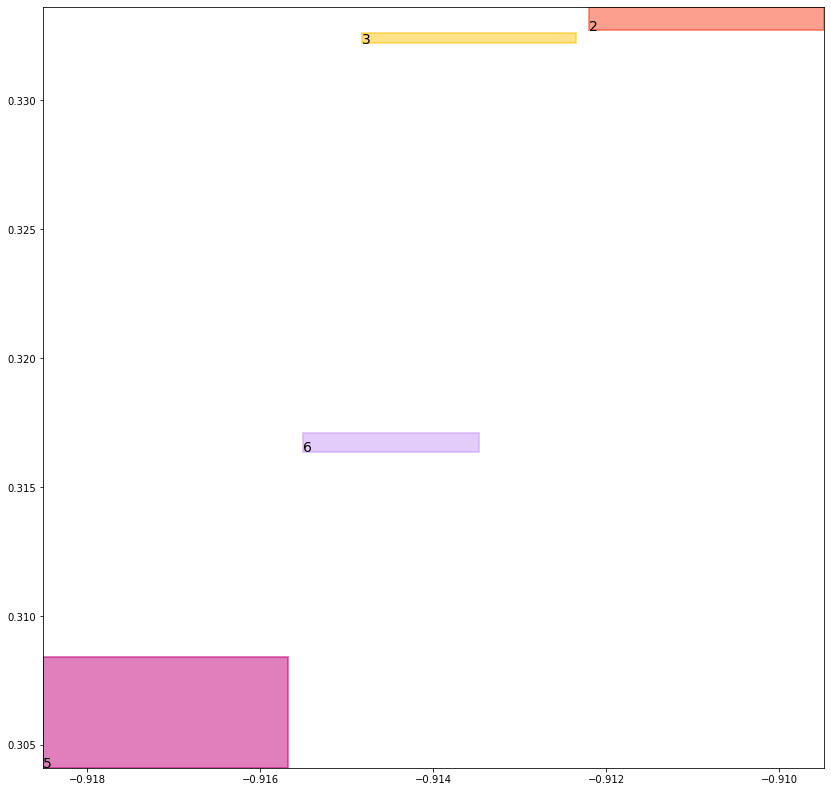

batch (tensor([[4, 5],
        [2, 6],
        [1, 2],
        [6, 2],
        [4, 6],
        [5, 3],
        [3, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0244446955621243, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0637336671352386, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2520877420902252, grad_fn=<MulBackward0>)
previous loss: tensor(0.3402661085128784, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.06207363307476044 0.13296136260032654 tensor(0.7753599882125854) tensor(0.9449726343154907)
tensor(2) 0.3324151039123535 0.6116635799407959 tensor(0.3535348176956177) tensor(0.6341926455497742)
tensor(3) 0.3113821744918823 0.5861925482749939 tensor(0.3427641391754150) tensor(0.6145929694175720)
tensor(4) 0.29514065384864807 0.10856881737709045 tensor(0.9473308324813843) tensor(0.9311808347702026)
tensor(5) 0.7850115895271301 0.5624925494194031 tensor(0.9044405221939087) tensor(0.5937027335166931)
tensor(6) 0.6443762183189392 0.5847070217132568 tensor(0.6533205509185791) tensor(0.6080396771430969)


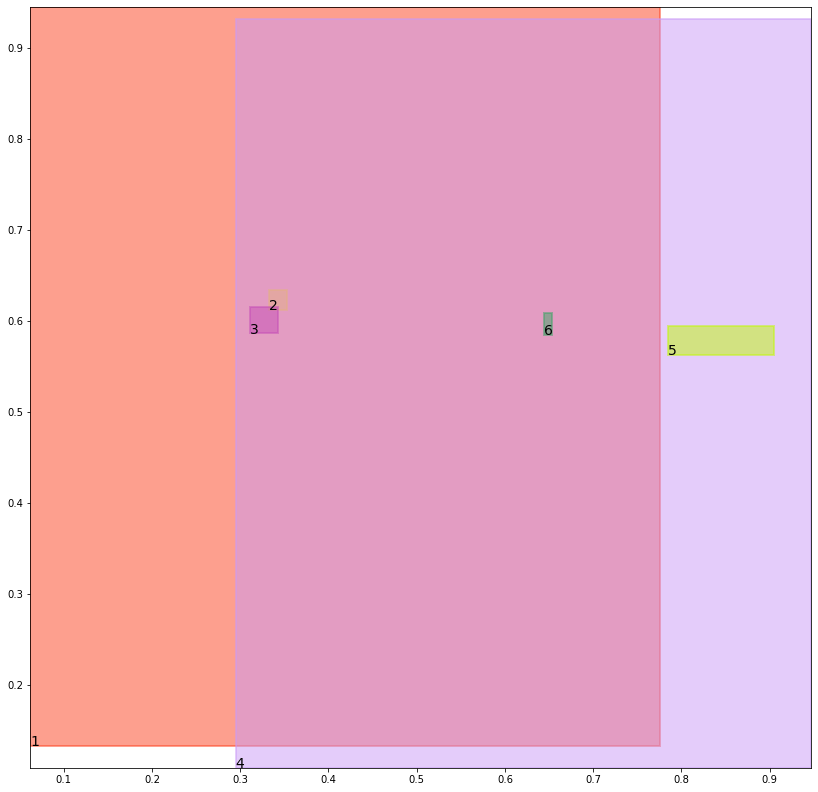

alignment data:
tensor(2) -0.8772954940795898 0.31074172258377075 tensor(-0.8750640153884888) tensor(0.3109946548938751)
tensor(3) -0.8797800540924072 0.31031712889671326 tensor(-0.8769035339355469) tensor(0.3104040622711182)
tensor(5) -0.8754971027374268 0.2818410098552704 tensor(-0.8712002038955688) tensor(0.2858852744102478)
tensor(6) -0.8754558563232422 0.2940036356449127 tensor(-0.8733178377151489) tensor(0.2948956489562988)


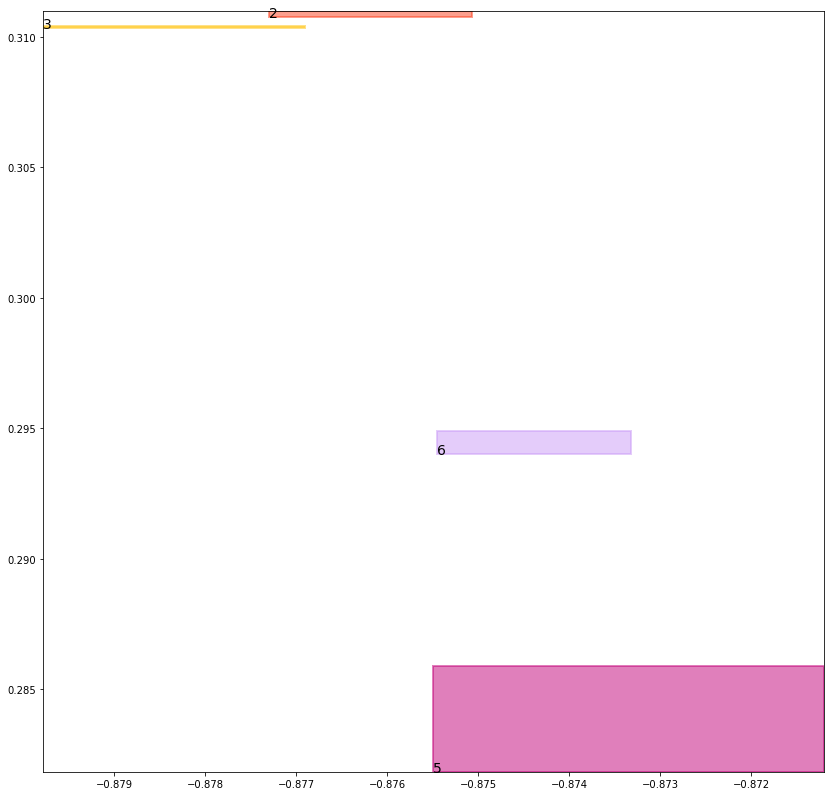

batch (tensor([[3, 5],
        [6, 2],
        [5, 3],
        [4, 6],
        [4, 5],
        [1, 2],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0240533296018839, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0599017627537251, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2521043419837952, grad_fn=<MulBackward0>)
previous loss: tensor(0.3360594511032104, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.061018168926239014 0.13127370178699493 tensor(0.7774400115013123) tensor(0.9458626508712769)
tensor(2) 0.33374470472335815 0.6066238284111023 tensor(0.3623290061950684) tensor(0.6234384179115295)
tensor(3) 0.31087759137153625 0.582463264465332 tensor(0.3518454432487488) tensor(0.6129248142242432)
tensor(4) 0.29014235734939575 0.10598336905241013 tensor(0.9486545920372009) tensor(0.9320566058158875)
tensor(5) 0.78374183177948 0.5586755871772766 tensor(0.8959542512893677) tensor(0.5883656740188599)
tensor(6) 0.6409451365470886 0.5774325728416443 tensor(0.6498050689697266) tensor(0.6026909351348877)


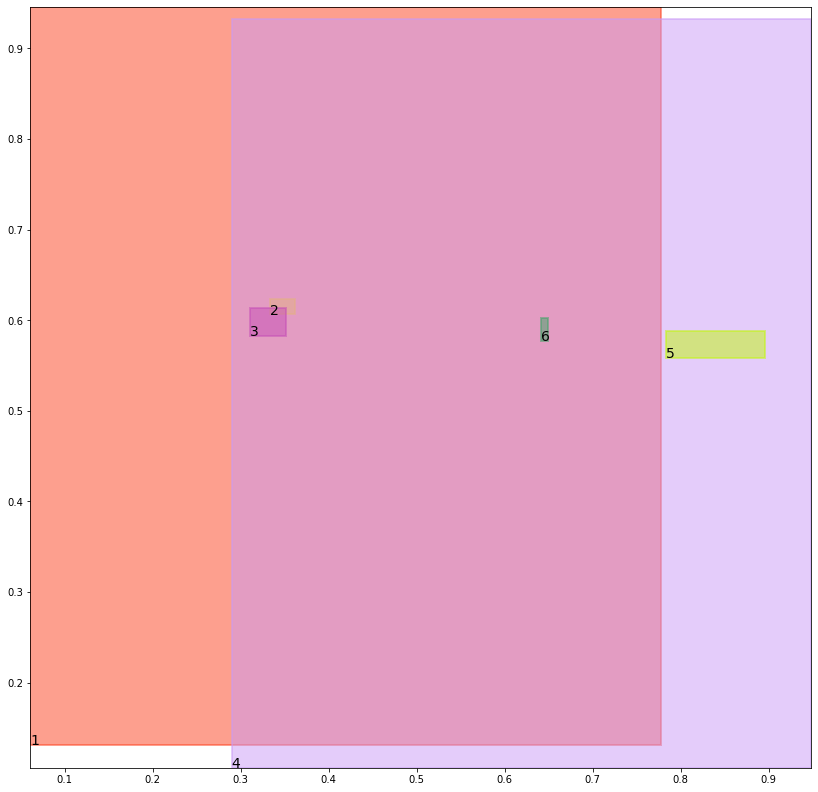

alignment data:
tensor(2) -0.8665628433227539 0.2781652808189392 tensor(-0.8645443916320801) tensor(0.2785407304763794)
tensor(3) -0.8689942359924316 0.2780604362487793 tensor(-0.8656160831451416) tensor(0.2782434821128845)
tensor(5) -0.8586339950561523 0.2516838312149048 tensor(-0.8534804582595825) tensor(0.2551841735839844)
tensor(6) -0.8608798980712891 0.26279351115226746 tensor(-0.8587253093719482) tensor(0.2637957334518433)


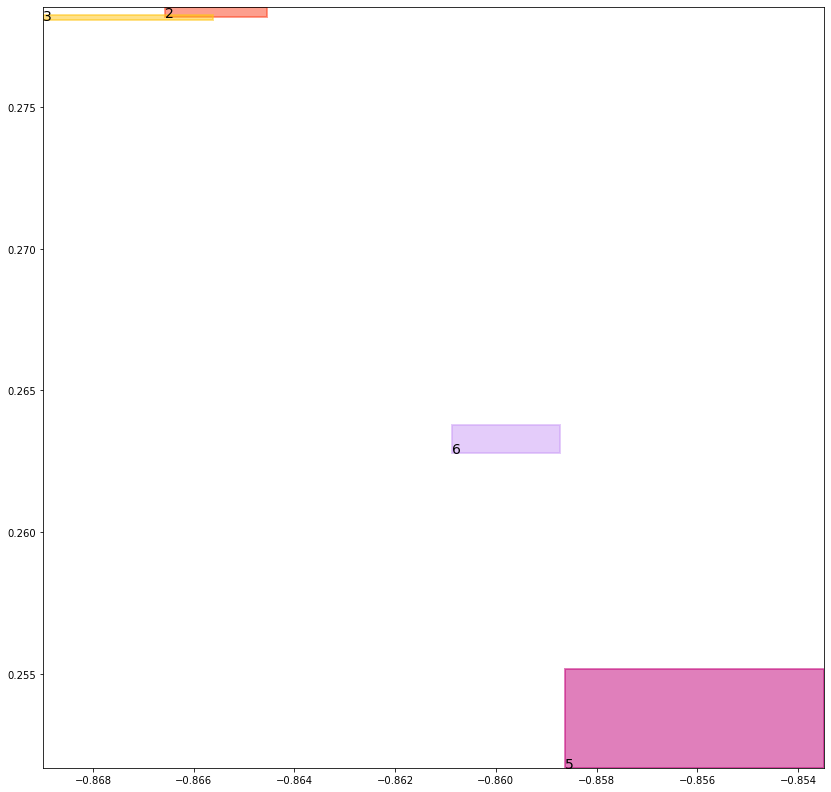

batch (tensor([[1, 2],
        [4, 6],
        [1, 3],
        [6, 2],
        [3, 5],
        [2, 6],
        [5, 3],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0235792472958565, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0560561306774616, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2520950436592102, grad_fn=<MulBackward0>)
previous loss: tensor(0.3317304253578186, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.06004829704761505 0.12965385615825653 tensor(0.7794049978256226) tensor(0.9466850161552429)
tensor(2) 0.3362356424331665 0.6020799279212952 tensor(0.3702998459339142) tensor(0.6124880313873291)
tensor(3) 0.3109382092952728 0.5792334675788879 tensor(0.3601122200489044) tensor(0.6107237935066223)
tensor(4) 0.2853531539440155 0.10344564914703369 tensor(0.9498865604400635) tensor(0.9328626394271851)
tensor(5) 0.7824805974960327 0.5552865862846375 tensor(0.8867461681365967) tensor(0.5825671553611755)
tensor(6) 0.6380426287651062 0.5710479021072388 tensor(0.6459024548530579) tensor(0.5974528789520264)


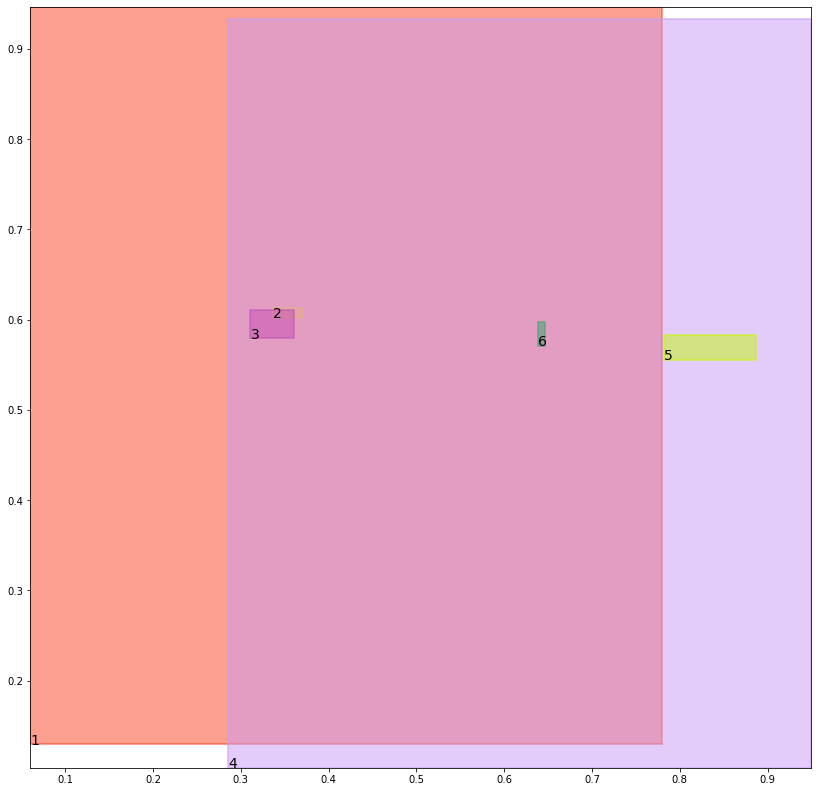

alignment data:
tensor(2) -0.8420107364654541 0.25474628806114197 tensor(-0.8401391506195068) tensor(0.2555694282054901)
tensor(3) -0.8444681167602539 0.2550610899925232 tensor(-0.8406038284301758) tensor(0.2554117143154144)
tensor(5) -0.8304212093353271 0.2327176183462143 tensor(-0.8250155448913574) tensor(0.2354699671268463)
tensor(6) -0.8341290950775146 0.24200695753097534 tensor(-0.8320025205612183) tensor(0.2430380731821060)


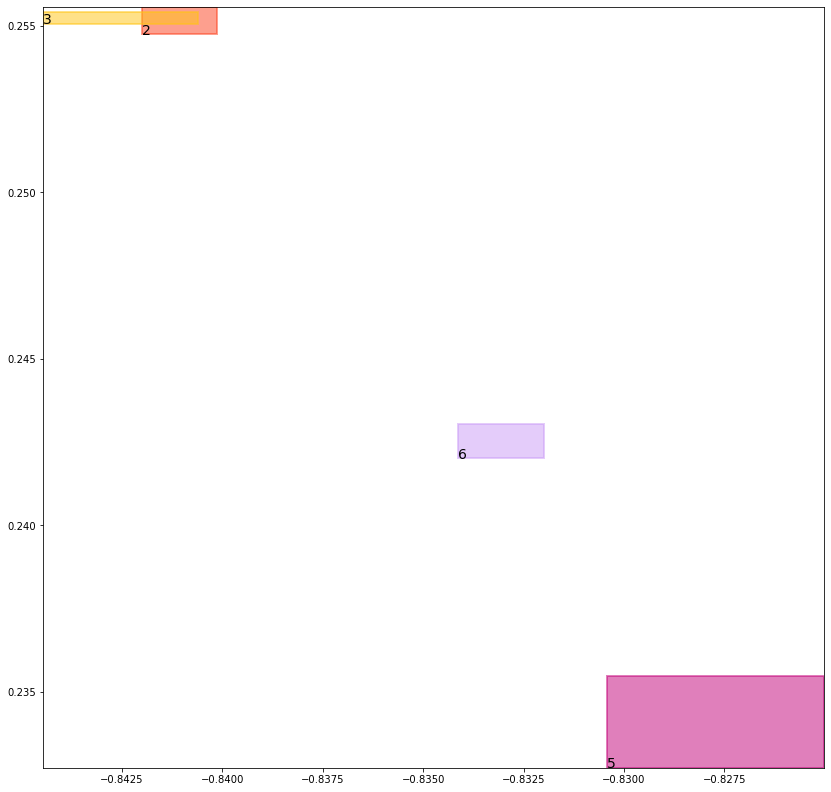

batch (tensor([[2, 6],
        [5, 3],
        [1, 3],
        [6, 2],
        [3, 5],
        [4, 6],
        [1, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0230397023260593, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0522164627909660, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2519671320915222, grad_fn=<MulBackward0>)
previous loss: tensor(0.3272233009338379, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05915531516075134 0.1280936449766159 tensor(0.7812709808349609) tensor(0.9474453330039978)
tensor(2) 0.33975130319595337 0.598003089427948 tensor(0.3774883449077606) tensor(0.6014583110809326)
tensor(3) 0.3115110993385315 0.5764827728271484 tensor(0.3676027059555054) tensor(0.6080592870712280)
tensor(4) 0.2807607054710388 0.10095363855361938 tensor(0.9510331749916077) tensor(0.9336054325103760)
tensor(5) 0.7812379598617554 0.552286684513092 tensor(0.8767801523208618) tensor(0.5763701200485229)
tensor(6) 0.6356255412101746 0.5654898881912231 tensor(0.6416668295860291) tensor(0.5923268198966980)


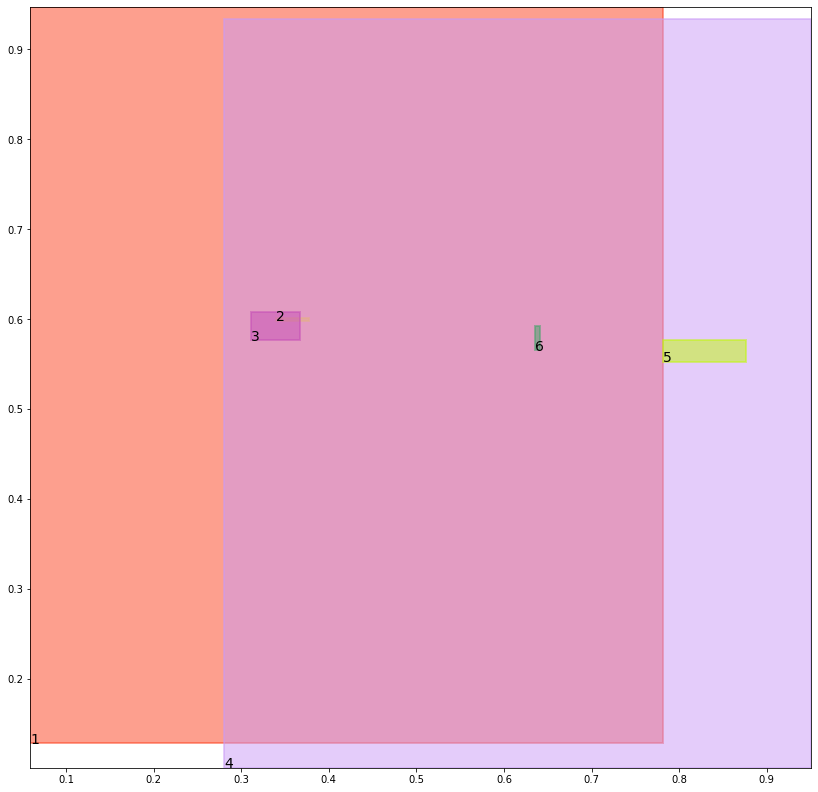

alignment data:
tensor(2) -0.8341978788375854 0.2419973760843277 tensor(-0.8325916528701782) tensor(0.2430091649293900)
tensor(3) -0.8367199897766113 0.24258561432361603 tensor(-0.8324891328811646) tensor(0.2429510205984116)
tensor(5) -0.8214160203933716 0.22556127607822418 tensor(-0.8162804841995239) tensor(0.2274626046419144)
tensor(6) -0.8257623910903931 0.23250944912433624 tensor(-0.8236724138259888) tensor(0.2334793061017990)


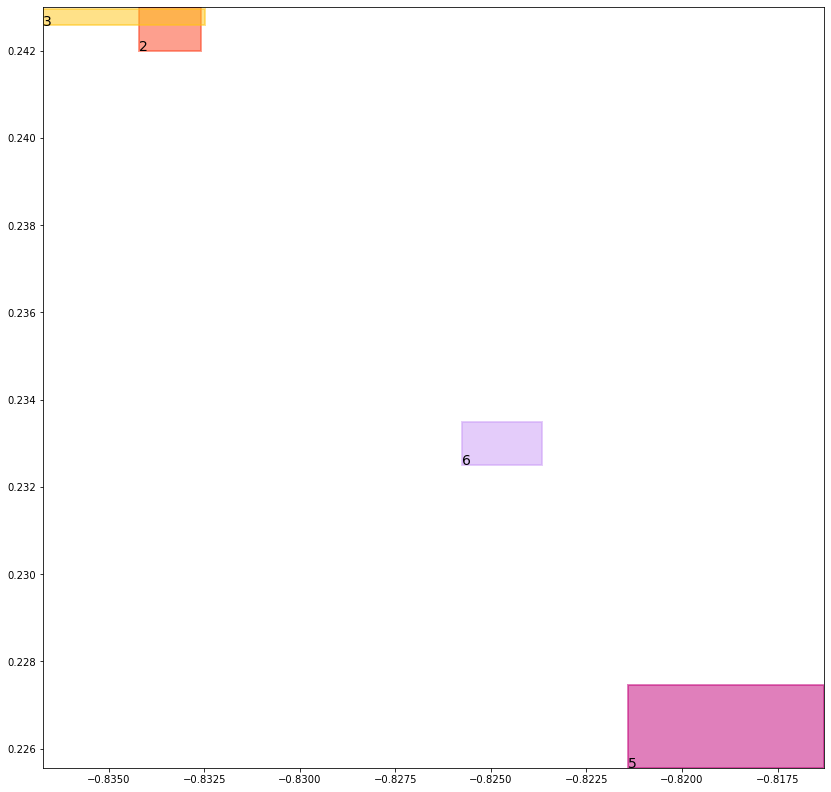

batch (tensor([[6, 2],
        [4, 6],
        [5, 3],
        [4, 5],
        [1, 2],
        [3, 5],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0224504489451647, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0484080240130424, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2517203688621521, grad_fn=<MulBackward0>)
previous loss: tensor(0.3225788474082947, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.058331653475761414 0.12658609449863434 tensor(0.7830522060394287) tensor(0.9481484889984131)
tensor(2) 0.3441627323627472 0.5904530882835388 tensor(0.3839355707168579) tensor(0.5943652987480164)
tensor(3) 0.3125465512275696 0.5741899013519287 tensor(0.3743539154529572) tensor(0.6049945950508118)
tensor(4) 0.276354044675827 0.09850677102804184 tensor(0.9520998001098633) tensor(0.9342904686927795)
tensor(5) 0.7800288200378418 0.5496399998664856 tensor(0.8660270571708679) tensor(0.5698357820510864)
tensor(6) 0.6336537003517151 0.5606973171234131 tensor(0.6371499300003052) tensor(0.5873137712478638)


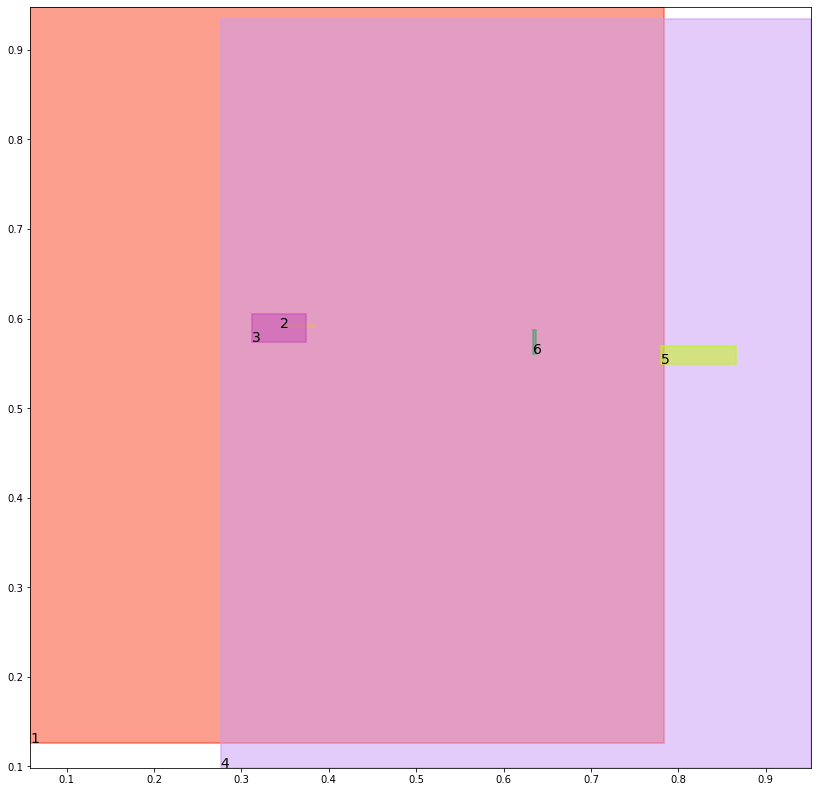

alignment data:
tensor(2) -0.7939062118530273 0.22420187294483185 tensor(-0.7922372817993164) tensor(0.2248680293560028)
tensor(3) -0.796196699142456 0.2247495949268341 tensor(-0.7917916774749756) tensor(0.2249574065208435)
tensor(5) -0.7817466259002686 0.21371935307979584 tensor(-0.7772781848907471) tensor(0.2147669196128845)
tensor(6) -0.7860240936279297 0.21807050704956055 tensor(-0.7839529514312744) tensor(0.2188911736011505)


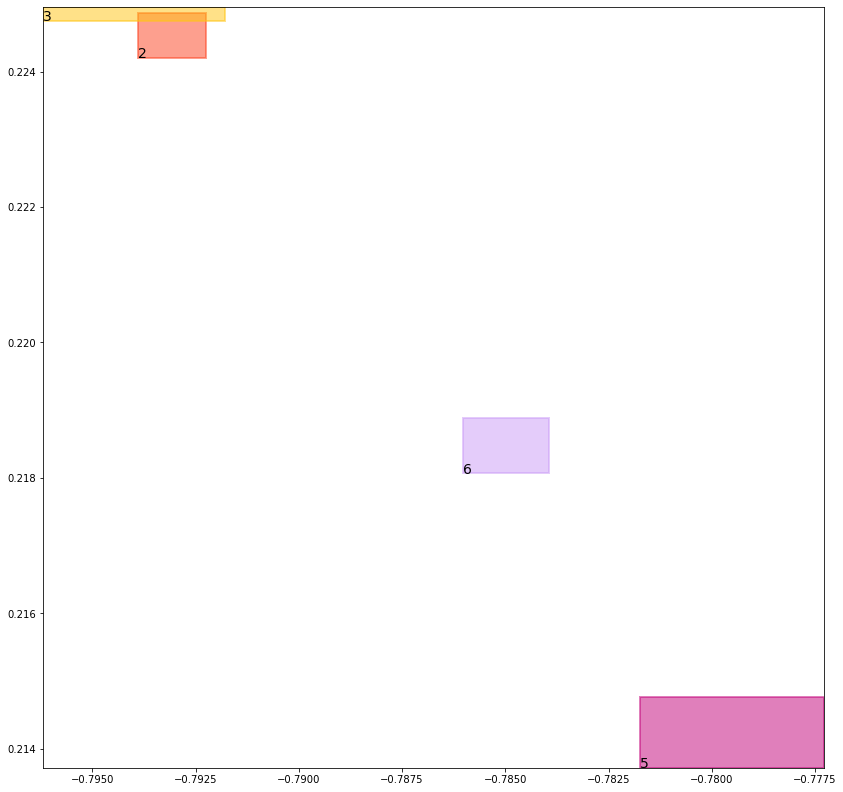

batch (tensor([[6, 2],
        [4, 6],
        [1, 3],
        [1, 2],
        [4, 5],
        [3, 5],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0219500027596951, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0446592122316360, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2514234483242035, grad_fn=<MulBackward0>)
previous loss: tensor(0.3180326819419861, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0575706921517849 0.12512360513210297 tensor(0.7847613096237183) tensor(0.9487994313240051)
tensor(2) 0.3493490517139435 0.5806334018707275 tensor(0.3896816968917847) tensor(0.5907426476478577)
tensor(3) 0.31399813294410706 0.5723309516906738 tensor(0.3804020285606384) tensor(0.6015859842300415)
tensor(4) 0.2721234858036041 0.09610557556152344 tensor(0.9530913829803467) tensor(0.9349225163459778)
tensor(5) 0.7788711190223694 0.5473142862319946 tensor(0.8544671535491943) tensor(0.5630266070365906)
tensor(6) 0.6320897340774536 0.5566118955612183 tensor(0.6324003934860229) tensor(0.5824152231216431)


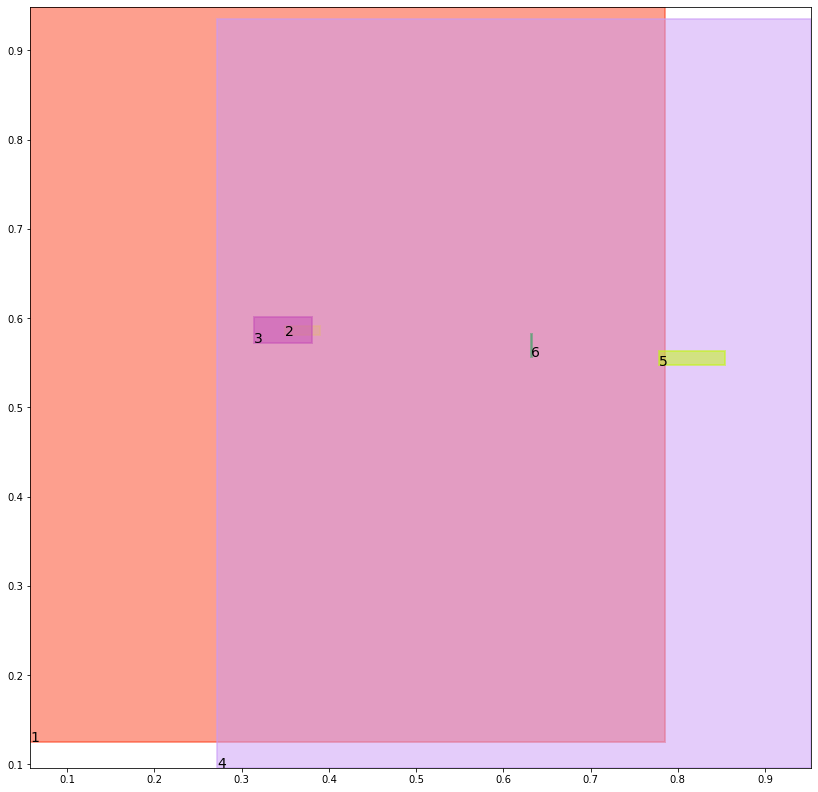

alignment data:
tensor(2) -0.7553808689117432 0.20313122868537903 tensor(-0.7533518075942993) tensor(0.2032404989004135)
tensor(3) -0.7571145296096802 0.2033492475748062 tensor(-0.7527606487274170) tensor(0.2034627497196198)
tensor(5) -0.7450964450836182 0.19851715862751007 tensor(-0.7415530681610107) tensor(0.1987972259521484)
tensor(6) -0.7487787008285522 0.20026704668998718 tensor(-0.7466967105865479) tensor(0.2008646726608276)


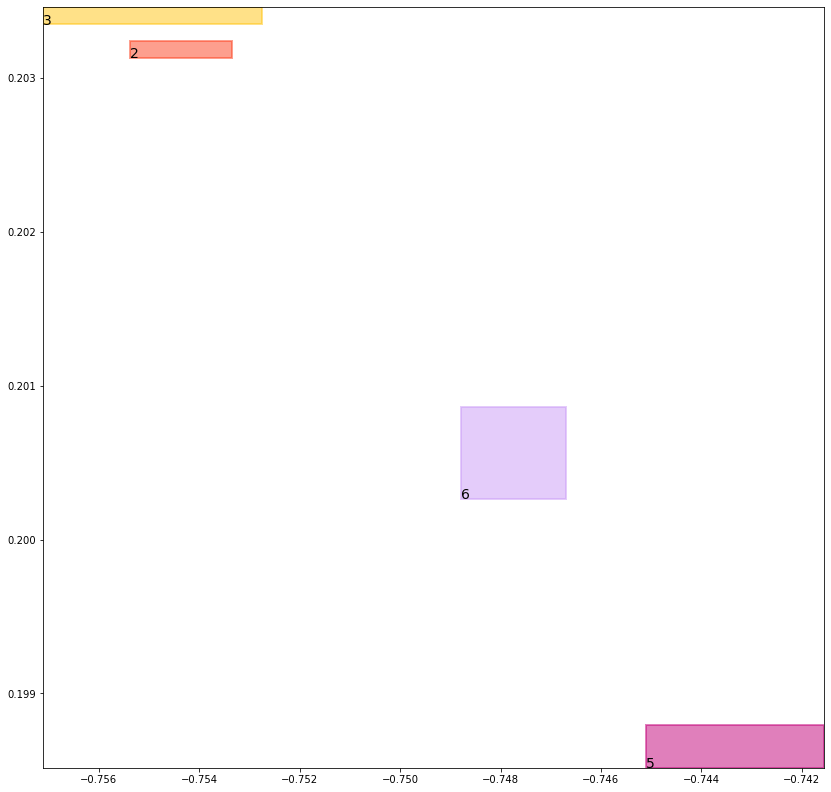

batch (tensor([[1, 3],
        [6, 2],
        [5, 3],
        [1, 2],
        [2, 6],
        [3, 5],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0215120576322079, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0410020537674427, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2511699795722961, grad_fn=<MulBackward0>)
previous loss: tensor(0.3136841058731079, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.056866612285375595 0.12369835376739502 tensor(0.7864090204238892) tensor(0.9494029283523560)
tensor(2) 0.3551984429359436 0.5719578266143799 tensor(0.3947667777538300) tensor(0.5871441364288330)
tensor(3) 0.3158233165740967 0.5708774924278259 tensor(0.3857837319374084) tensor(0.5978812575340271)
tensor(4) 0.2680602967739105 0.09375140815973282 tensor(0.9540127515792847) tensor(0.9355063438415527)
tensor(5) 0.7777814865112305 0.545281708240509 tensor(0.8420928120613098) tensor(0.5560085773468018)
tensor(6) 0.6274626851081848 0.5531809329986572 tensor(0.6308981180191040) tensor(0.5776334404945374)


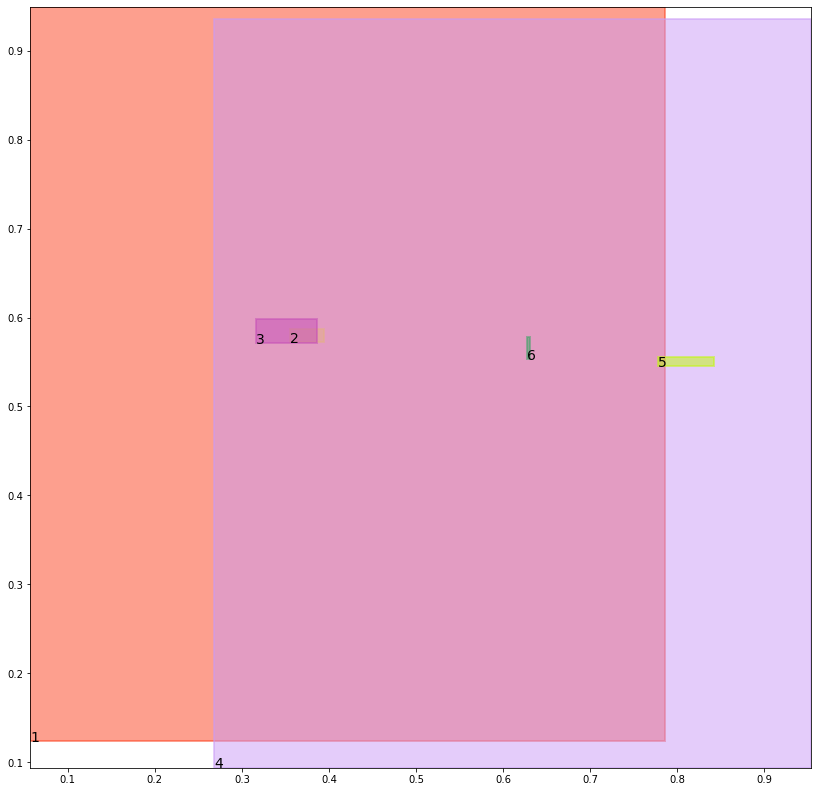

alignment data:
tensor(2) -0.6908950209617615 0.18233275413513184 tensor(-0.6885932087898254) tensor(0.1826514899730682)
tensor(3) -0.6919237375259399 0.18220603466033936 tensor(-0.6878401637077332) tensor(0.1827717423439026)
tensor(5) -0.683296263217926 0.1831732541322708 tensor(-0.6808100342750549) tensor(0.1835018843412399)
tensor(6) -0.6861422657966614 0.18285271525382996 tensor(-0.6838620305061340) tensor(0.1831944286823273)


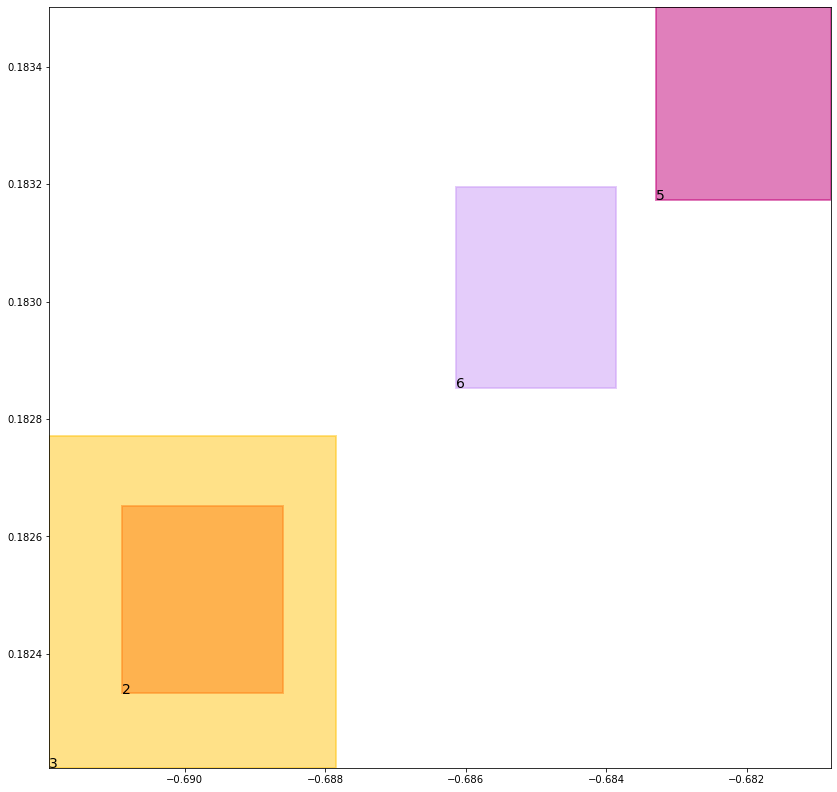

batch (tensor([[1, 2],
        [4, 6],
        [6, 2],
        [2, 6],
        [1, 3],
        [5, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0210327990353107, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0376558341085911, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510265409946442, grad_fn=<MulBackward0>)
previous loss: tensor(0.3097151815891266, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05621430650353432 0.12230388075113297 tensor(0.7880048751831055) tensor(0.9499629735946655)
tensor(2) 0.36160820722579956 0.564373791217804 tensor(0.3992308080196381) tensor(0.5835760831832886)
tensor(3) 0.31798386573791504 0.5697957873344421 tensor(0.3905369639396667) tensor(0.5939189195632935)
tensor(4) 0.2641502916812897 0.09144619852304459 tensor(0.9548681974411011) tensor(0.9360459446907043)
tensor(5) 0.7767727375030518 0.5435189008712769 tensor(0.8289114832878113) tensor(0.5488525629043579)
tensor(6) 0.6233545541763306 0.5503590703010559 tensor(0.6294624209403992) tensor(0.5729715228080750)


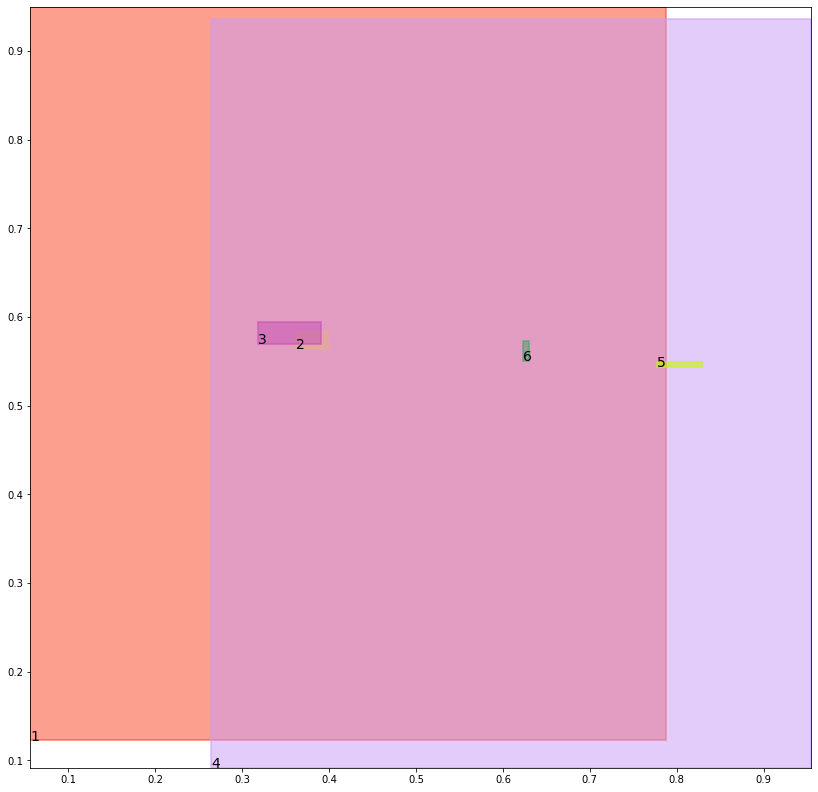

alignment data:
tensor(2) -0.634171187877655 0.16297760605812073 tensor(-0.6316152215003967) tensor(0.1635823845863342)
tensor(3) -0.6343405246734619 0.16242378950119019 tensor(-0.6307141184806824) tensor(0.1635213494300842)
tensor(5) -0.6294563412666321 0.16841182112693787 tensor(-0.6280615925788879) tensor(0.1691366434097290)
tensor(6) -0.631286084651947 0.1663990616798401 tensor(-0.6289038062095642) tensor(0.1666010618209839)


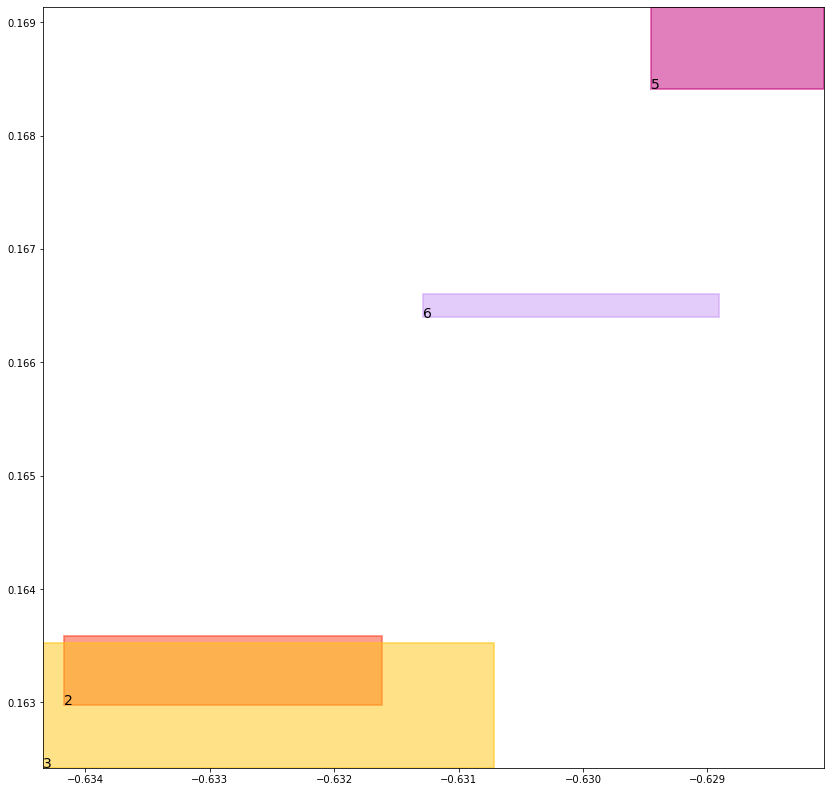

batch (tensor([[5, 3],
        [6, 2],
        [4, 6],
        [1, 3],
        [3, 5],
        [2, 6],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0205217693001032, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0344590172171593, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510065436363220, grad_fn=<MulBackward0>)
previous loss: tensor(0.3059873282909393, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05560924857854843 0.12093496322631836 tensor(0.7895566225051880) tensor(0.9504835009574890)
tensor(2) 0.3684847950935364 0.5578209161758423 tensor(0.4031136631965637) tensor(0.5800427794456482)
tensor(3) 0.320445716381073 0.5690475702285767 tensor(0.3947011232376099) tensor(0.5897295475006104)
tensor(4) 0.26038140058517456 0.0891922190785408 tensor(0.9556617736816406) tensor(0.9365450739860535)
tensor(5) 0.7758522629737854 0.5416324734687805 tensor(0.8149476051330566) tensor(0.5420066714286804)
tensor(6) 0.6200175285339355 0.5481060743331909 tensor(0.6278081536293030) tensor(0.5684329867362976)


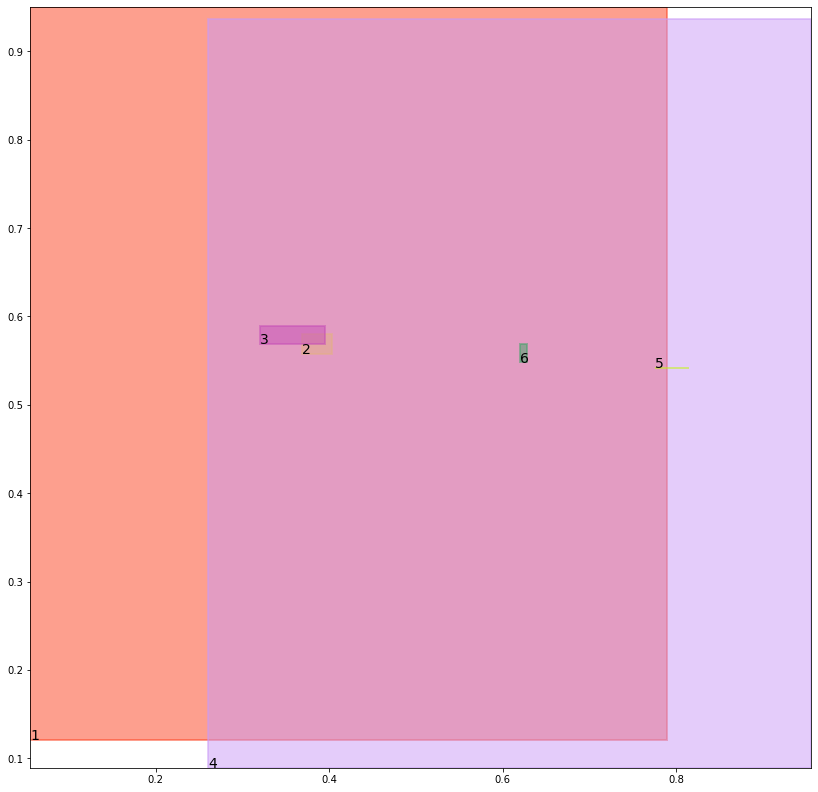

alignment data:
tensor(2) -0.5662391185760498 0.1442536562681198 tensor(-0.5634152889251709) tensor(0.1450119763612747)
tensor(3) -0.5654371976852417 0.14316831529140472 tensor(-0.5624084472656250) tensor(0.1448157876729965)
tensor(5) -0.5641729831695557 0.15339435636997223 tensor(-0.5637583732604980) tensor(0.1542700976133347)
tensor(6) -0.5649318695068359 0.14989744126796722 tensor(-0.5625764131546021) tensor(0.1500558704137802)


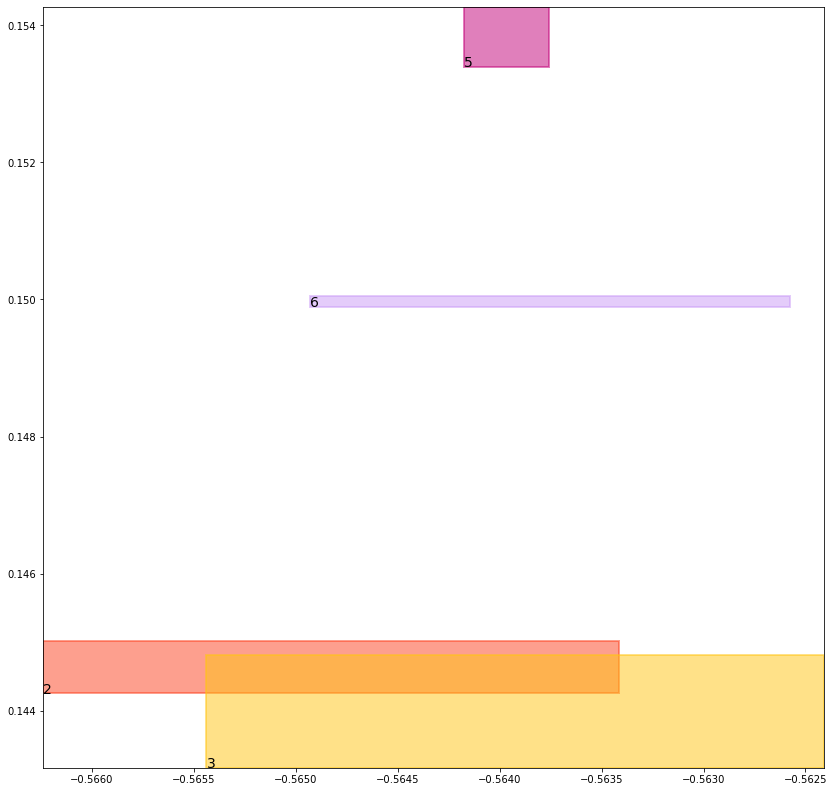

batch (tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5],
        [4, 5],
        [4, 6],
        [1, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0199868623167276, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0314339697360992, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510799765586853, grad_fn=<MulBackward0>)
previous loss: tensor(0.3025008141994476, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.055047404021024704 0.1195874884724617 tensor(0.7910712361335754) tensor(0.9509676098823547)
tensor(2) 0.3757425844669342 0.5522348880767822 tensor(0.4064548313617706) tensor(0.5765469074249268)
tensor(3) 0.3231784999370575 0.5685926079750061 tensor(0.3983163535594940) tensor(0.5853387713432312)
tensor(4) 0.25674372911453247 0.08699148148298264 tensor(0.9563974738121033) tensor(0.9370070695877075)
tensor(5) 0.775022566318512 0.5353866815567017 tensor(0.8002456426620483) tensor(0.5404418110847473)
tensor(6) 0.6173919439315796 0.5463842749595642 tensor(0.6259577274322510) tensor(0.5640215277671814)


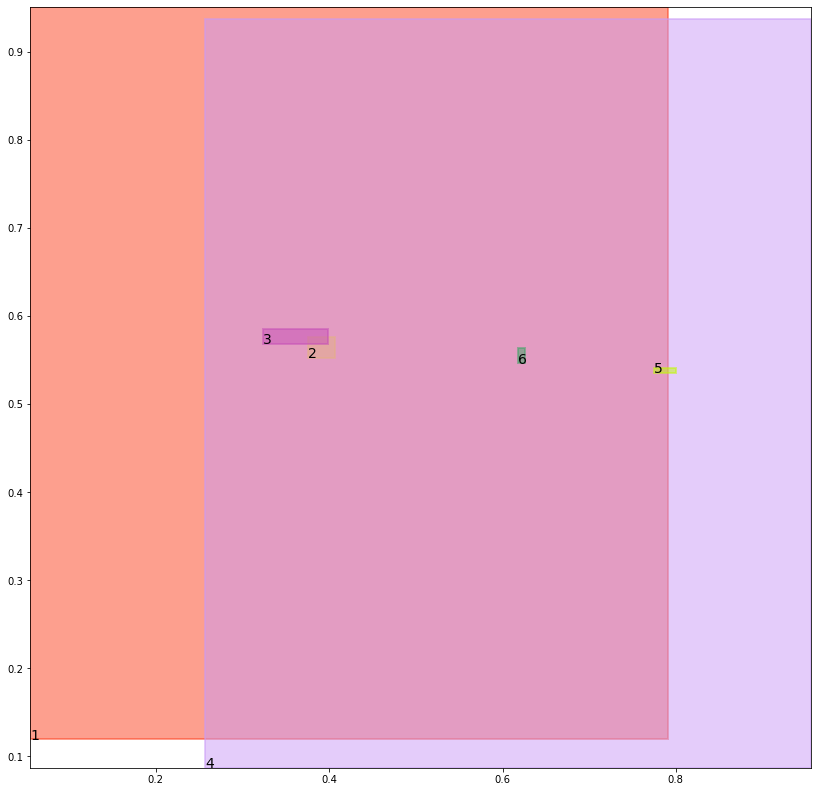

alignment data:
tensor(2) -0.5138540267944336 0.12977099418640137 tensor(-0.5107500553131104) tensor(0.1305749118328094)
tensor(3) -0.512042760848999 0.12814456224441528 tensor(-0.5097003579139709) tensor(0.1302960515022278)
tensor(5) -0.5144138336181641 0.14166131615638733 tensor(-0.5136971473693848) tensor(0.1423860490322113)
tensor(6) -0.5136586427688599 0.1369483917951584 tensor(-0.5114587545394897) tensor(0.1371257305145264)


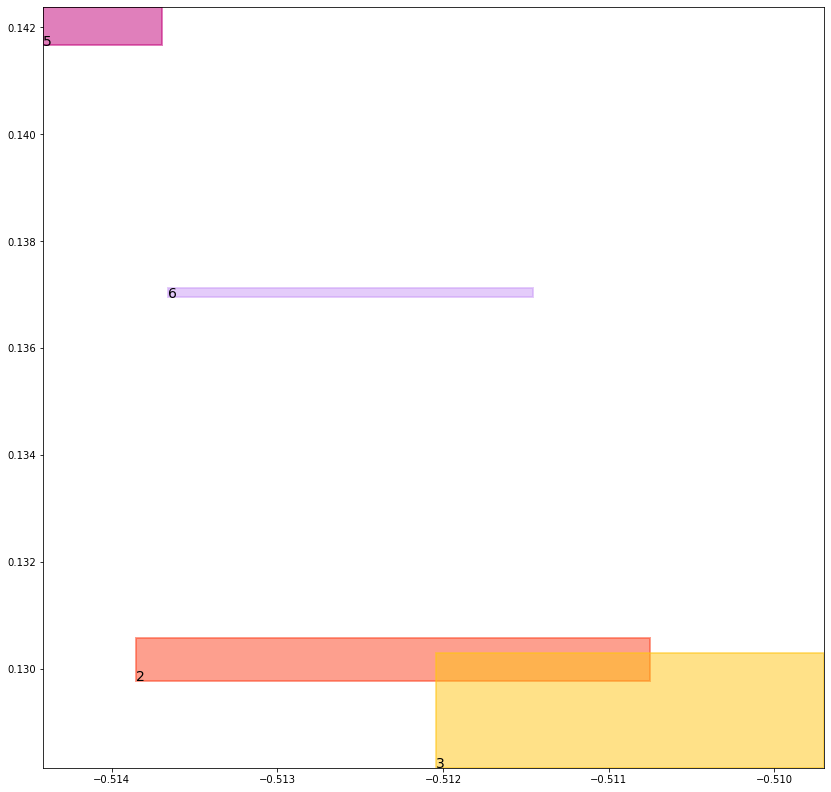

batch (tensor([[2, 6],
        [3, 5],
        [4, 5],
        [1, 3],
        [1, 2],
        [5, 3],
        [6, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0194355025887489, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0287227705121040, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2511869966983795, grad_fn=<MulBackward0>)
previous loss: tensor(0.2993452548980713, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.054525163024663925 0.11825841665267944 tensor(0.7925542593002319) tensor(0.9514185786247253)
tensor(2) 0.38330262899398804 0.5475513339042664 tensor(0.4092926681041718) tensor(0.5730908513069153)
tensor(3) 0.32615455985069275 0.5683900117874146 tensor(0.4014223217964172) tensor(0.5807726979255676)
tensor(4) 0.2532292902469635 0.08484191447496414 tensor(0.9570785760879517) tensor(0.9374352097511292)
tensor(5) 0.7742829918861389 0.5300758481025696 tensor(0.7848712205886841) tensor(0.5388374328613281)
tensor(6) 0.6154175996780396 0.5451555252075195 tensor(0.6239314079284668) tensor(0.5597402453422546)


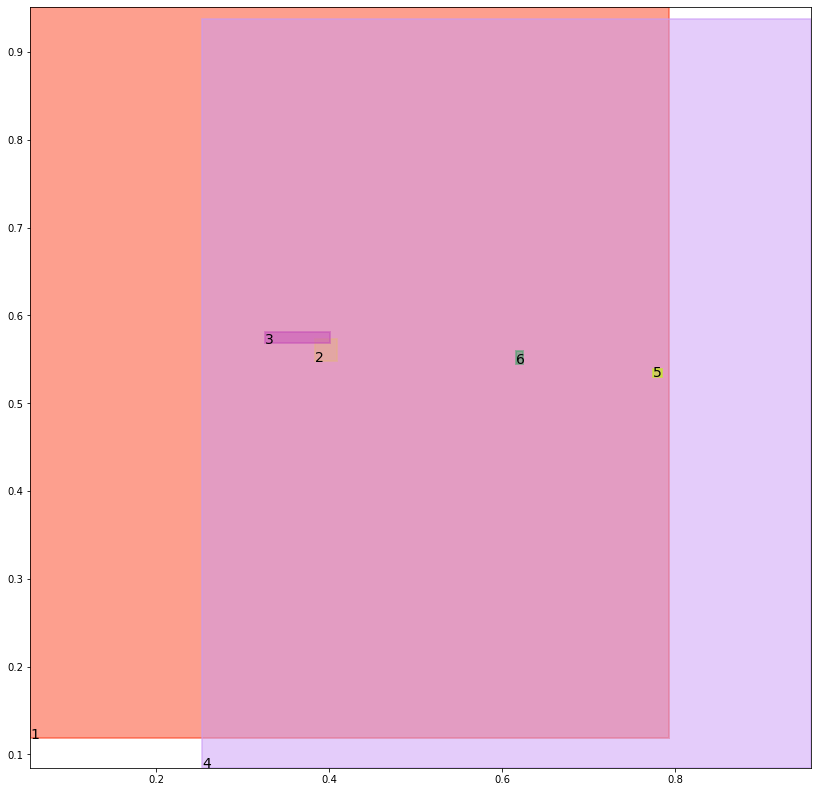

alignment data:
tensor(2) -0.4553358256816864 0.11238841712474823 tensor(-0.4500770866870880) tensor(0.1127179563045502)
tensor(3) -0.4519629180431366 0.11015956103801727 tensor(-0.4490580856800079) tensor(0.1124064922332764)
tensor(5) -0.4558775722980499 0.12560255825519562 tensor(-0.4547210037708282) tensor(0.1259265542030334)
tensor(6) -0.45383504033088684 0.12001253664493561 tensor(-0.4519070684909821) tensor(0.1202355474233627)


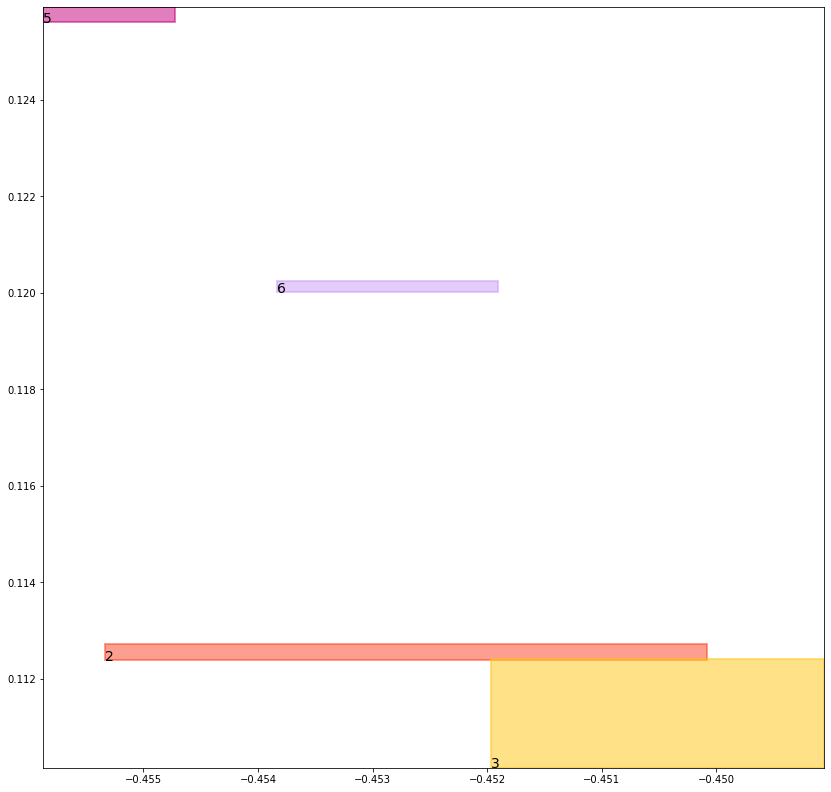

batch (tensor([[1, 3],
        [4, 6],
        [3, 5],
        [1, 2],
        [6, 2],
        [5, 3],
        [4, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0188729986548424, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0262073408812284, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2512554228305817, grad_fn=<MulBackward0>)
previous loss: tensor(0.2963357567787170, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05403929948806763 0.11694558709859848 tensor(0.7940101623535156) tensor(0.9518388509750366)
tensor(2) 0.3910883069038391 0.5437015891075134 tensor(0.4116641581058502) tensor(0.5696769952774048)
tensor(3) 0.3293456733226776 0.568377673625946 tensor(0.4040567576885223) tensor(0.5760586857795715)
tensor(4) 0.24983185529708862 0.08274278789758682 tensor(0.9577087163925171) tensor(0.9378324151039124)
tensor(5) 0.768911600112915 0.5256471633911133 tensor(0.7736318707466125) tensor(0.5372039675712585)
tensor(6) 0.6140362024307251 0.5443660616874695 tensor(0.6217479705810547) tensor(0.5555905103683472)


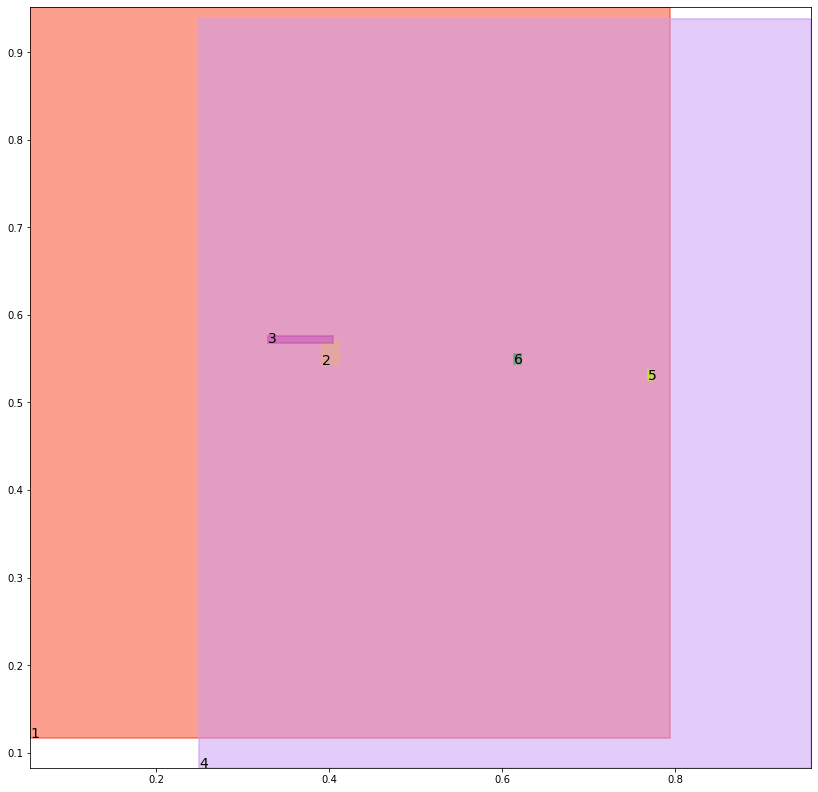

alignment data:
tensor(2) -0.41744619607925415 0.09857961535453796 tensor(-0.4112646579742432) tensor(0.0986196249723434)
tensor(3) -0.4130021929740906 0.09596848487854004 tensor(-0.4099685549736023) tensor(0.0982168018817902)
tensor(5) -0.41485273838043213 0.11120408773422241 tensor(-0.4121803641319275) tensor(0.1113307774066925)
tensor(6) -0.413379967212677 0.10580801963806152 tensor(-0.4107294678688049) tensor(0.1058291345834732)


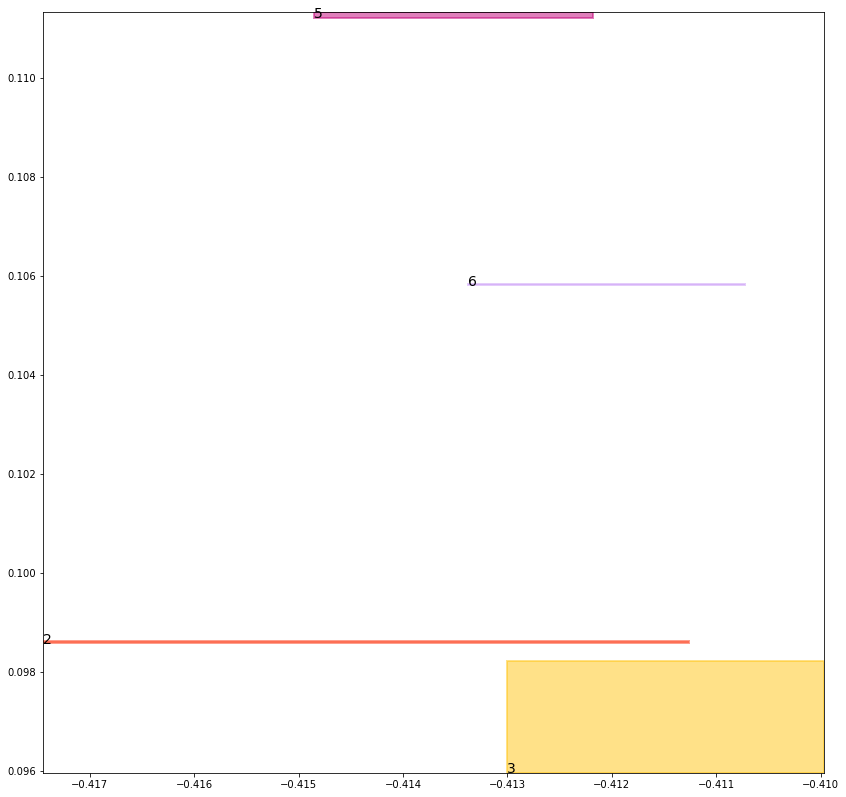

batch (tensor([[6, 2],
        [5, 3],
        [4, 5],
        [4, 6],
        [3, 5],
        [1, 2],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0183055363595486, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0244659259915352, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2512090802192688, grad_fn=<MulBackward0>)
previous loss: tensor(0.2939805388450623, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.053586892783641815 0.11564768105745316 tensor(0.7954427599906921) tensor(0.9522311687469482)
tensor(2) 0.3990318775177002 0.5406578183174133 tensor(0.4136044979095459) tensor(0.5663194656372070)
tensor(3) 0.33272722363471985 0.5685505270957947 tensor(0.4062539637088776) tensor(0.5712411403656006)
tensor(4) 0.24654445052146912 0.08069436997175217 tensor(0.9582916498184204) tensor(0.9382016062736511)
tensor(5) 0.7537075281143188 0.5220277905464172 tensor(0.7698670029640198) tensor(0.5355522632598877)
tensor(6) 0.6131898164749146 0.543924868106842 tensor(0.6194268465042114) tensor(0.5515727996826172)


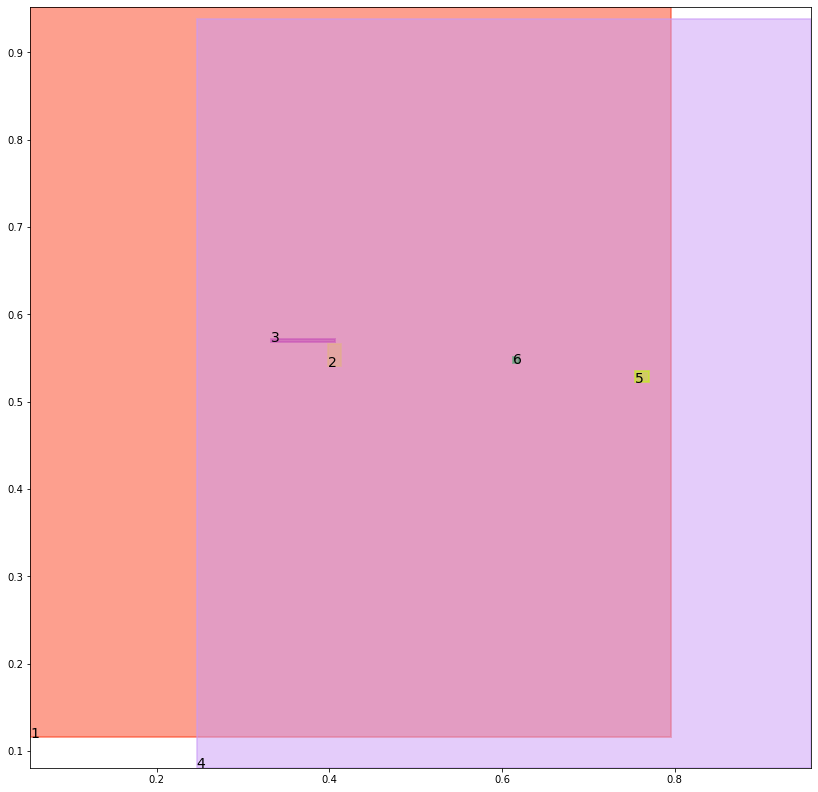

alignment data:
tensor(2) -0.39292049407958984 0.08992250263690948 tensor(-0.3867658376693726) tensor(0.0899616777896881)
tensor(3) -0.38755106925964355 0.08714750409126282 tensor(-0.3857485055923462) tensor(0.0895726531744003)
tensor(5) -0.3915177583694458 0.10231392085552216 tensor(-0.3881378173828125) tensor(0.1025793403387070)
tensor(6) -0.38872456550598145 0.09711980819702148 tensor(-0.3868597745895386) tensor(0.0971720218658447)


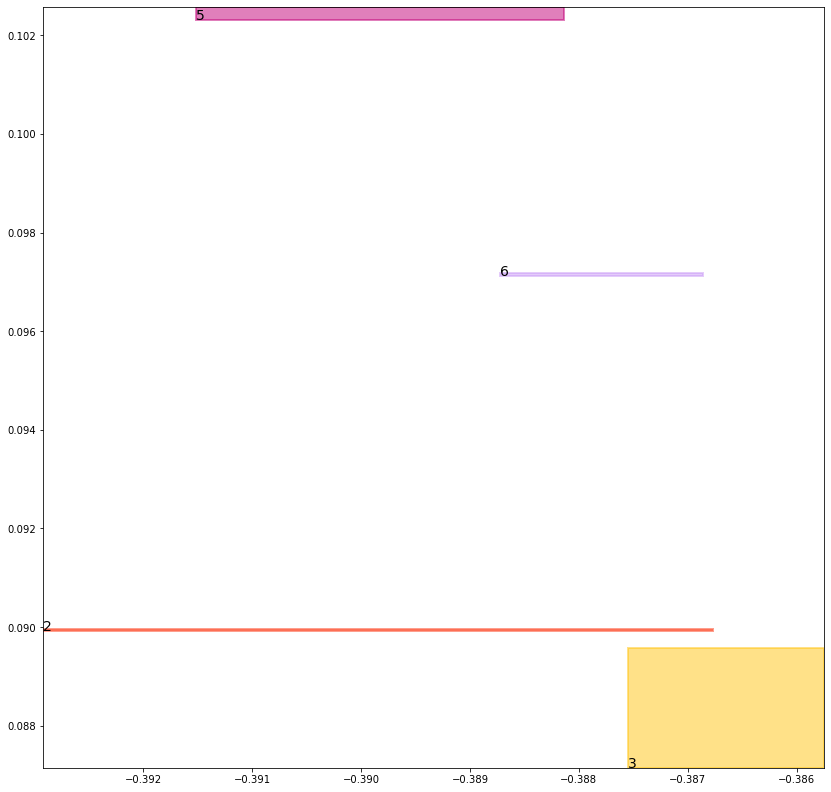

batch (tensor([[1, 3],
        [4, 5],
        [3, 5],
        [6, 2],
        [1, 2],
        [2, 6],
        [5, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0177371632307768, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0237246640026569, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2512184083461761, grad_fn=<MulBackward0>)
previous loss: tensor(0.2926802337169647, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05316530540585518 0.11436399072408676 tensor(0.7968547344207764) tensor(0.9525976181030273)
tensor(2) 0.4070703685283661 0.538364589214325 tensor(0.4151462614536285) tensor(0.5630196928977966)
tensor(3) 0.33627527952194214 0.5663499236106873 tensor(0.4080467522144318) tensor(0.5688753724098206)
tensor(4) 0.24335749447345734 0.07869762927293777 tensor(0.9588315486907959) tensor(0.9385451078414917)
tensor(5) 0.7393348217010498 0.5191764235496521 tensor(0.7635852098464966) tensor(0.5338874459266663)
tensor(6) 0.6128251552581787 0.5437906980514526 tensor(0.6169847249984741) tensor(0.5476866960525513)


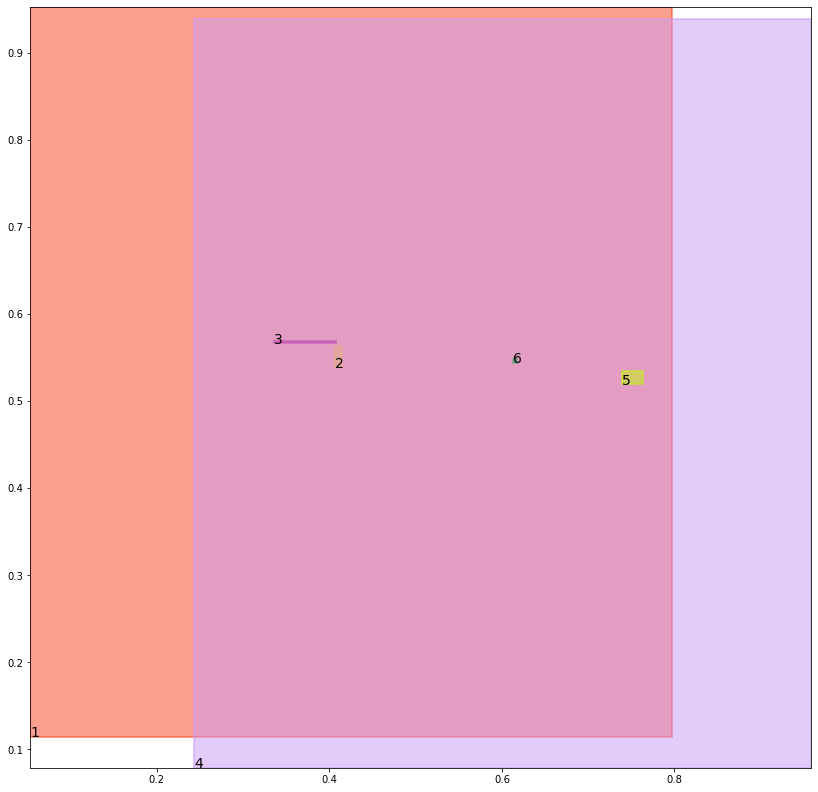

alignment data:
tensor(2) -0.37991952896118164 0.07987193763256073 tensor(-0.3739674091339111) tensor(0.0799579471349716)
tensor(3) -0.3744052052497864 0.07717771828174591 tensor(-0.3726937770843506) tensor(0.0795489996671677)
tensor(5) -0.37929415702819824 0.09138281643390656 tensor(-0.3754408955574036) tensor(0.0919834226369858)
tensor(6) -0.3754417896270752 0.08678223192691803 tensor(-0.3744564652442932) tensor(0.0868653804063797)


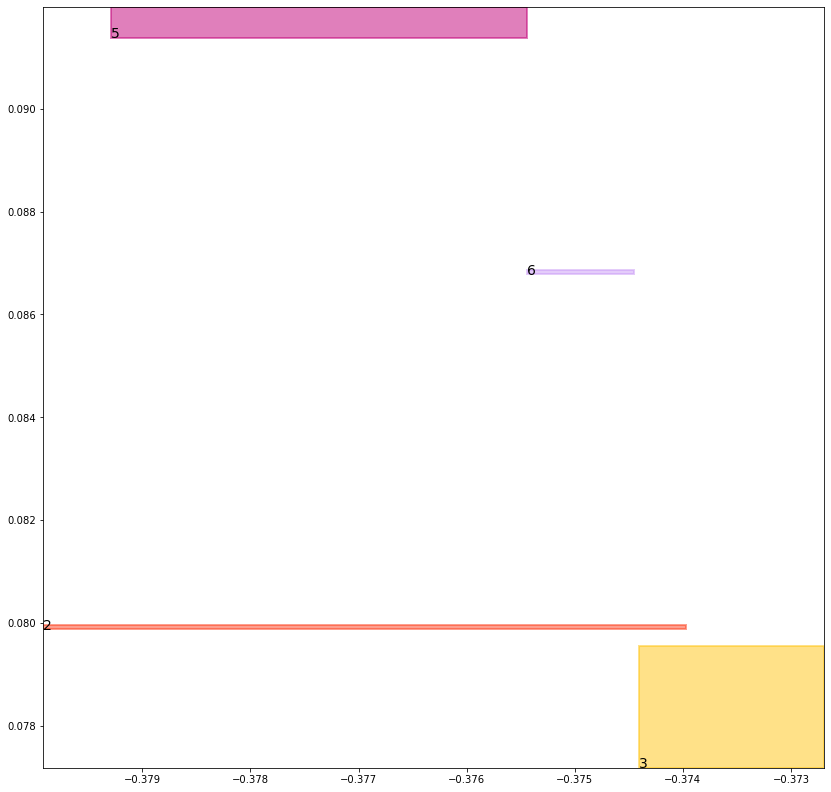

batch (tensor([[4, 6],
        [5, 3],
        [6, 2],
        [2, 6],
        [1, 2],
        [1, 3],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0172393396496773, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0227326061576605, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2511990964412689, grad_fn=<MulBackward0>)
previous loss: tensor(0.2911710441112518, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05277213454246521 0.113093301653862 tensor(0.7982485294342041) tensor(0.9529404640197754)
tensor(2) 0.41514649987220764 0.5367693901062012 tensor(0.4163202941417694) tensor(0.5597796440124512)
tensor(3) 0.3399669826030731 0.5620598196983337 tensor(0.4094657301902771) tensor(0.5686829686164856)
tensor(4) 0.24026256799697876 0.07675395160913467 tensor(0.9593321084976196) tensor(0.9388650655746460)
tensor(5) 0.7258451581001282 0.5170361995697021 tensor(0.7552049160003662) tensor(0.5322142243385315)
tensor(6) 0.6128921508789062 0.543921709060669 tensor(0.6144370436668396) tensor(0.5439303517341614)


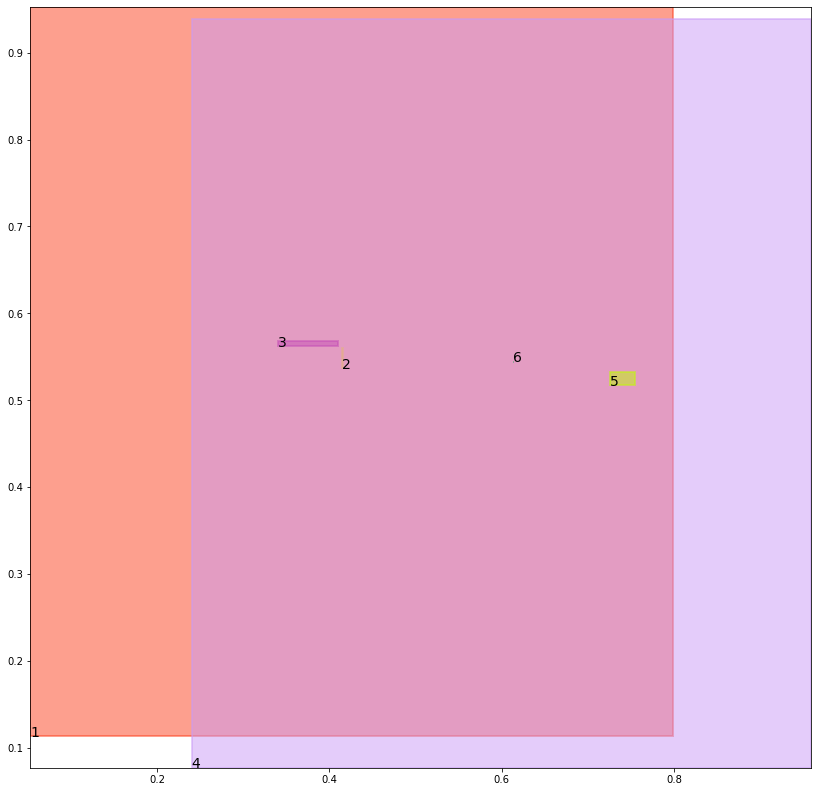

alignment data:
tensor(2) -0.35967621207237244 0.07220045477151871 tensor(-0.3541159331798553) tensor(0.0723025128245354)
tensor(3) -0.3547789752483368 0.06972501426935196 tensor(-0.3520804345607758) tensor(0.0719253495335579)
tensor(5) -0.359495609998703 0.0824391320347786 tensor(-0.3553741276264191) tensor(0.0832933858036995)
tensor(6) -0.3548140227794647 0.07863416522741318 tensor(-0.3547874391078949) tensor(0.0786839202046394)


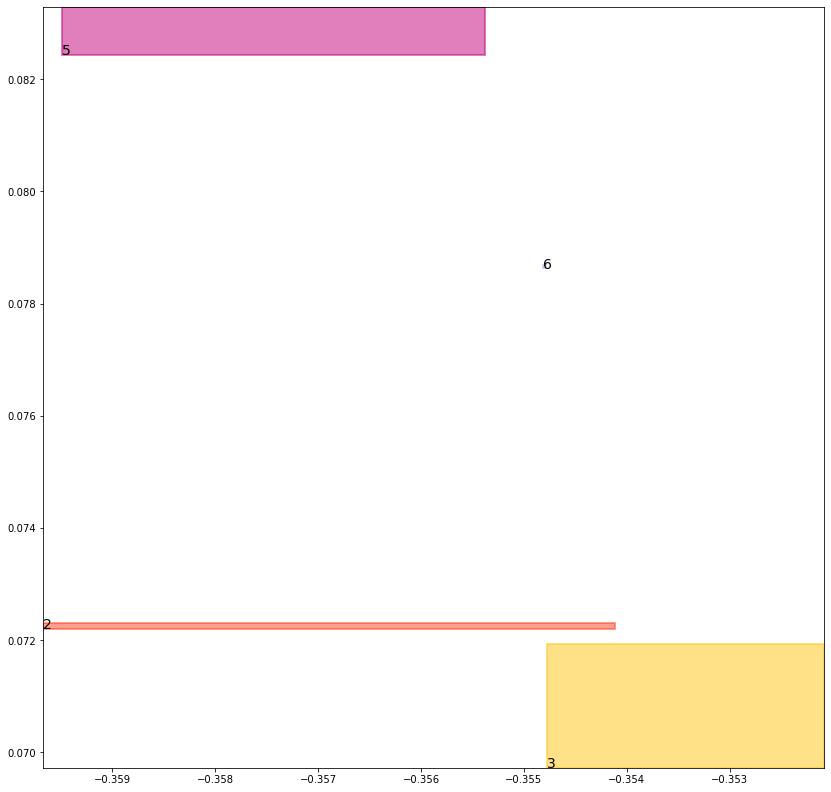

batch (tensor([[6, 2],
        [2, 6],
        [5, 3],
        [4, 6],
        [1, 2],
        [1, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0168038532137871, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0215789079666138, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2511574029922485, grad_fn=<MulBackward0>)
previous loss: tensor(0.2895401716232300, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0524052157998085 0.11183392256498337 tensor(0.7996253371238708) tensor(0.9532617330551147)
tensor(2) 0.41715574264526367 0.5358214378356934 tensor(0.4232090711593628) tensor(0.5566021800041199)
tensor(3) 0.3437809944152832 0.558332622051239 tensor(0.4105395972728729) tensor(0.5680205225944519)
tensor(4) 0.2372523695230484 0.0748649537563324 tensor(0.9597963690757751) tensor(0.9391635656356812)
tensor(5) 0.713269829750061 0.5155375003814697 tensor(0.7450421452522278) tensor(0.5305371880531311)
tensor(6) 0.6117983460426331 0.5403007864952087 tensor(0.6133431196212769) tensor(0.5442759990692139)


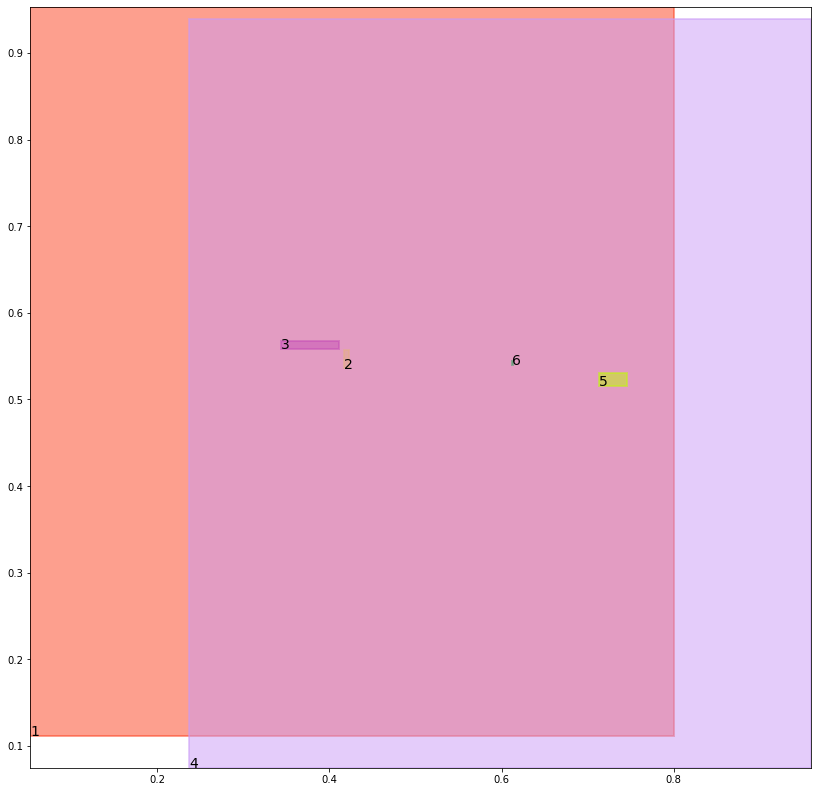

alignment data:
tensor(2) -0.3459419906139374 0.06359083950519562 tensor(-0.3407621681690216) tensor(0.0638562291860580)
tensor(3) -0.34168747067451477 0.061475545167922974 tensor(-0.3381874263286591) tensor(0.0635212212800980)
tensor(5) -0.3458718955516815 0.07241059839725494 tensor(-0.3416680395603180) tensor(0.0734258890151978)
tensor(6) -0.34154394268989563 0.06945979595184326 tensor(-0.3405465781688690) tensor(0.0695221871137619)


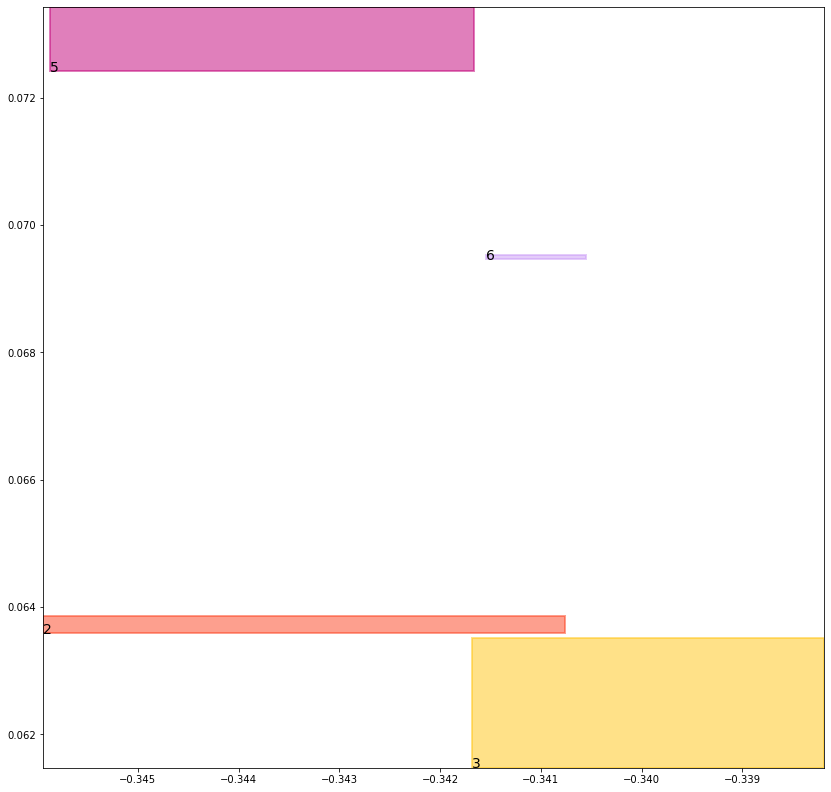

batch (tensor([[6, 2],
        [5, 3],
        [1, 2],
        [1, 3],
        [4, 5],
        [2, 6],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0166017040610313, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0205032881349325, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510901093482971, grad_fn=<MulBackward0>)
previous loss: tensor(0.2881951034069061, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05206235498189926 0.11058506369590759 tensor(0.8009899258613586) tensor(0.9535634517669678)
tensor(2) 0.4182032346725464 0.5354608297348022 tensor(0.4299712181091309) tensor(0.5534940361976624)
tensor(3) 0.3476969599723816 0.5551341772079468 tensor(0.4112952351570129) tensor(0.5669357180595398)
tensor(4) 0.2343181073665619 0.07302974164485931 tensor(0.9602270126342773) tensor(0.9394426941871643)
tensor(5) 0.7016232013702393 0.5146092772483826 tensor(0.7333557605743408) tensor(0.5288591980934143)
tensor(6) 0.609626829624176 0.5370714664459229 tensor(0.6132240295410156) tensor(0.5438887476921082)


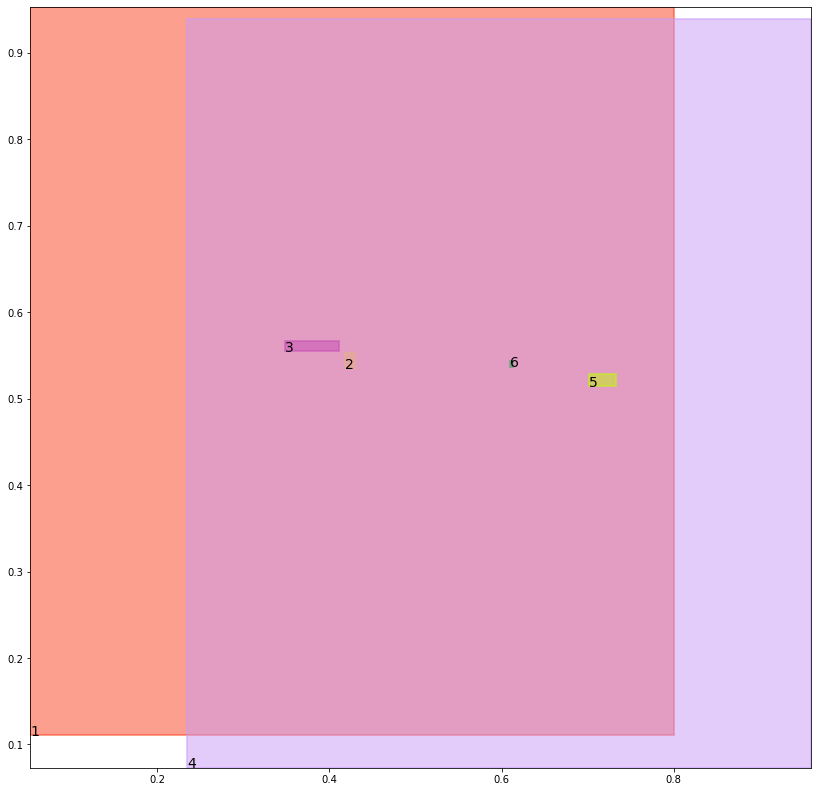

alignment data:
tensor(2) -0.33032357692718506 0.05008533596992493 tensor(-0.3256491422653198) tensor(0.0506826639175415)
tensor(3) -0.32677721977233887 0.048464685678482056 tensor(-0.3226765394210815) tensor(0.0503796041011810)
tensor(5) -0.33019328117370605 0.05749276280403137 tensor(-0.3260813951492310) tensor(0.0585764050483704)
tensor(6) -0.3263583183288574 0.05532898008823395 tensor(-0.3246071338653564) tensor(0.0555315911769867)


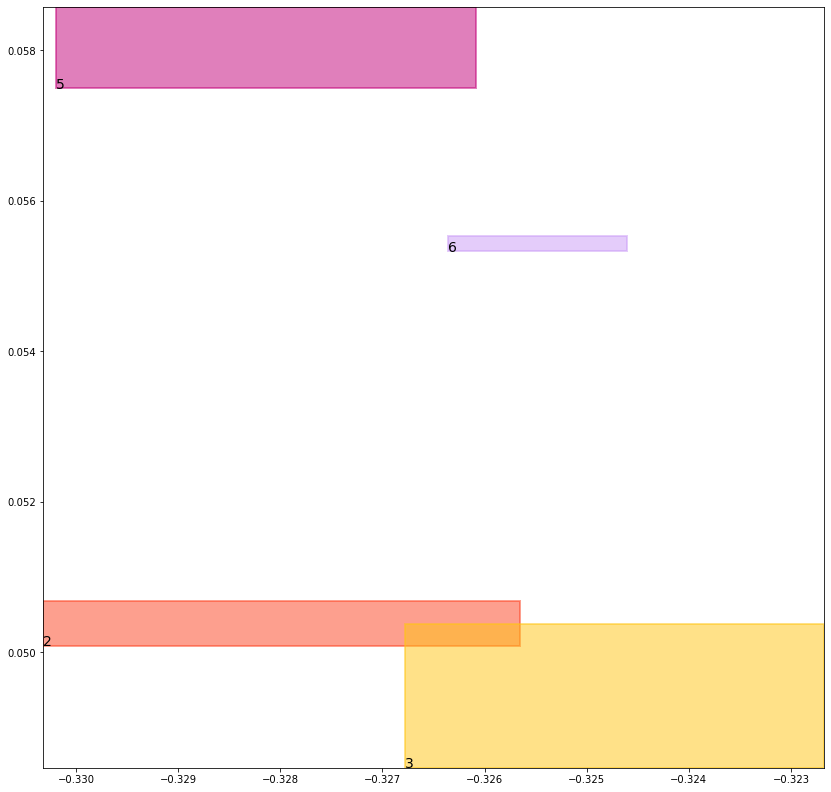

batch (tensor([[5, 3],
        [1, 2],
        [2, 6],
        [3, 5],
        [1, 3],
        [6, 2],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0164095330983400, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0194341149181128, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510291934013367, grad_fn=<MulBackward0>)
previous loss: tensor(0.2868728339672089, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05174151062965393 0.10934660583734512 tensor(0.8023462295532227) tensor(0.9538470506668091)
tensor(2) 0.4194416403770447 0.5356292724609375 tensor(0.4354937672615051) tensor(0.5504607558250427)
tensor(3) 0.3516961932182312 0.5524328947067261 tensor(0.4117581844329834) tensor(0.5654749870300293)
tensor(4) 0.23145022988319397 0.07124794274568558 tensor(0.9606263637542725) tensor(0.9397041201591492)
tensor(5) 0.6909060478210449 0.5141817331314087 tensor(0.7203763127326965) tensor(0.5271824002265930)
tensor(6) 0.6078839898109436 0.5342091917991638 tensor(0.6125859022140503) tensor(0.5428185462951660)


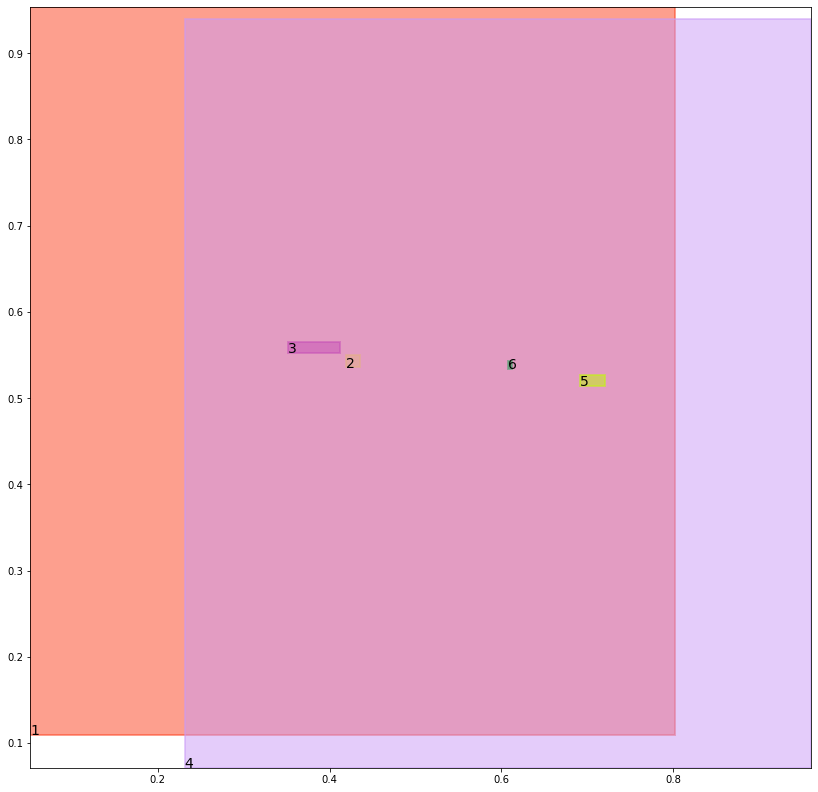

alignment data:
tensor(2) -0.3220158517360687 0.049814656376838684 tensor(-0.3179866373538971) tensor(0.0506079047918320)
tensor(3) -0.3192282021045685 0.04864369332790375 tensor(-0.3147349655628204) tensor(0.0504478663206100)
tensor(5) -0.3217478096485138 0.05576486885547638 tensor(-0.3178976476192474) tensor(0.0568311065435410)
tensor(6) -0.3184725344181061 0.054314374923706055 tensor(-0.3162292540073395) tensor(0.0546636730432510)


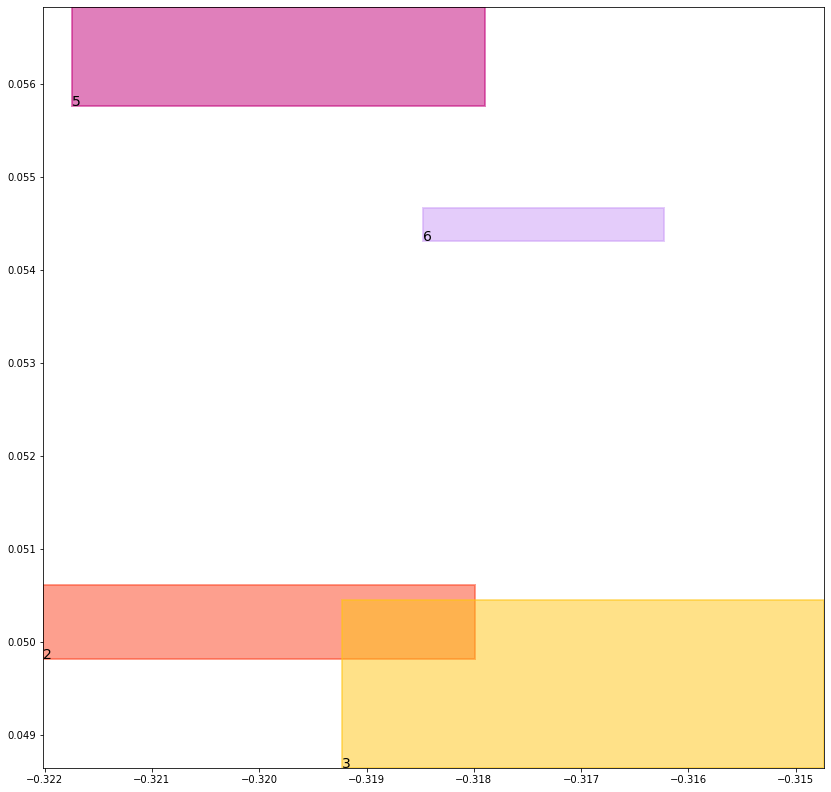

batch (tensor([[1, 3],
        [2, 6],
        [5, 3],
        [6, 2],
        [4, 5],
        [1, 2],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0161810945719481, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0183490496128798, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509824037551880, grad_fn=<MulBackward0>)
previous loss: tensor(0.2855125367641449, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05144088715314865 0.10811897367238998 tensor(0.8036969900131226) tensor(0.9541141390800476)
tensor(2) 0.42085134983062744 0.53626948595047 tensor(0.4398438036441803) tensor(0.5475065708160400)
tensor(3) 0.3557612895965576 0.5501981973648071 tensor(0.4119527637958527) tensor(0.5636823773384094)
tensor(4) 0.22864080965518951 0.0695195123553276 tensor(0.9609965682029724) tensor(0.9399493336677551)
tensor(5) 0.6811076998710632 0.514188826084137 tensor(0.7063217759132385) tensor(0.5255083441734314)
tensor(6) 0.606532871723175 0.5316832661628723 tensor(0.6114763617515564) tensor(0.5411254167556763)


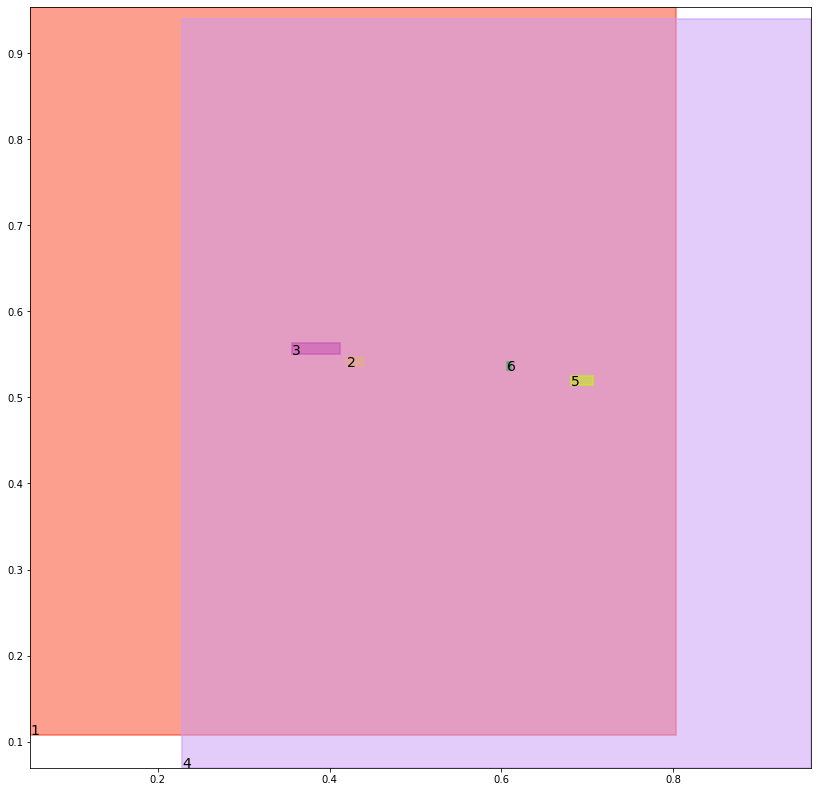

alignment data:
tensor(2) -0.3147375285625458 0.042779430747032166 tensor(-0.3114790618419647) tensor(0.0436207950115204)
tensor(3) -0.31273147463798523 0.041985273361206055 tensor(-0.3080554902553558) tensor(0.0436871945858002)
tensor(5) -0.31431493163108826 0.047293975949287415 tensor(-0.3108932673931122) tensor(0.0482676029205322)
tensor(6) -0.31163081526756287 0.04644531011581421 tensor(-0.3091455399990082) tensor(0.0469239652156830)


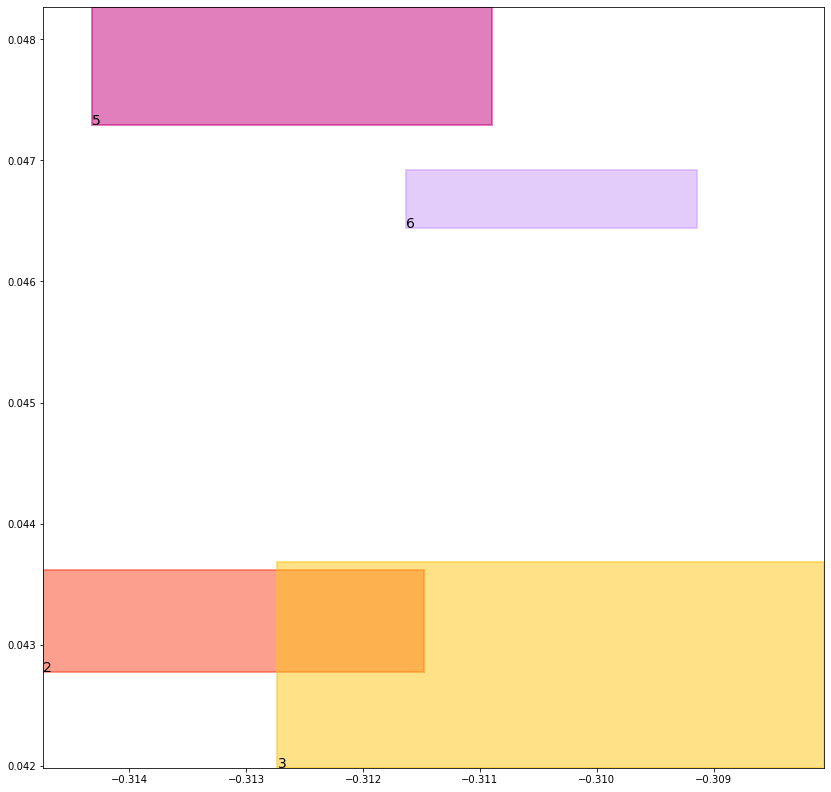

batch (tensor([[1, 3],
        [5, 3],
        [1, 2],
        [6, 2],
        [4, 5],
        [4, 6],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0159181319177151, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0172863006591797, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509525120258331, grad_fn=<MulBackward0>)
previous loss: tensor(0.2841569483280182, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0511588491499424 0.10690301656723022 tensor(0.8050438761711121) tensor(0.9543660879135132)
tensor(2) 0.42241430282592773 0.5373253226280212 tensor(0.4430933594703674) tensor(0.5446343421936035)
tensor(3) 0.3598763346672058 0.5483999848365784 tensor(0.4119021594524384) tensor(0.5615987777709961)
tensor(4) 0.22588343918323517 0.06784454733133316 tensor(0.9613395929336548) tensor(0.9401800632476807)
tensor(5) 0.672208309173584 0.5145697593688965 tensor(0.6914060115814209) tensor(0.5238388776779175)
tensor(6) 0.6055387258529663 0.5294656157493591 tensor(0.6099403500556946) tensor(0.5388705134391785)


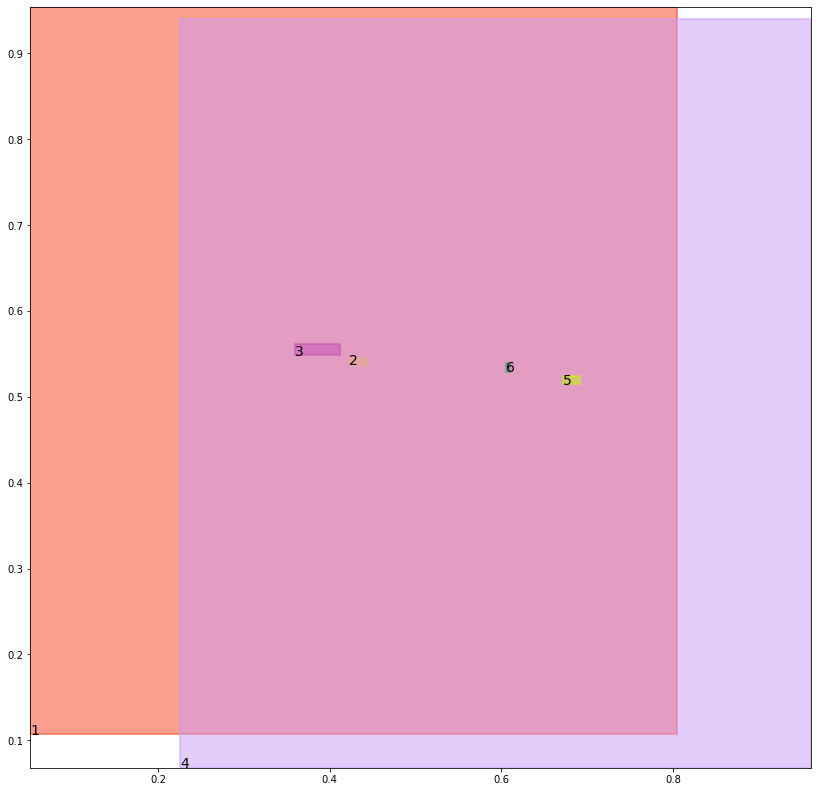

alignment data:
tensor(2) -0.31808680295944214 0.03963981568813324 tensor(-0.3157155513763428) tensor(0.0403805375099182)
tensor(3) -0.3168639540672302 0.03913280367851257 tensor(-0.3122112751007080) tensor(0.0407253205776215)
tensor(5) -0.31753718852996826 0.04278688132762909 tensor(-0.3147073984146118) tensor(0.0436042845249176)
tensor(6) -0.31545186042785645 0.0424078106880188 tensor(-0.3129613995552063) tensor(0.0429755002260208)


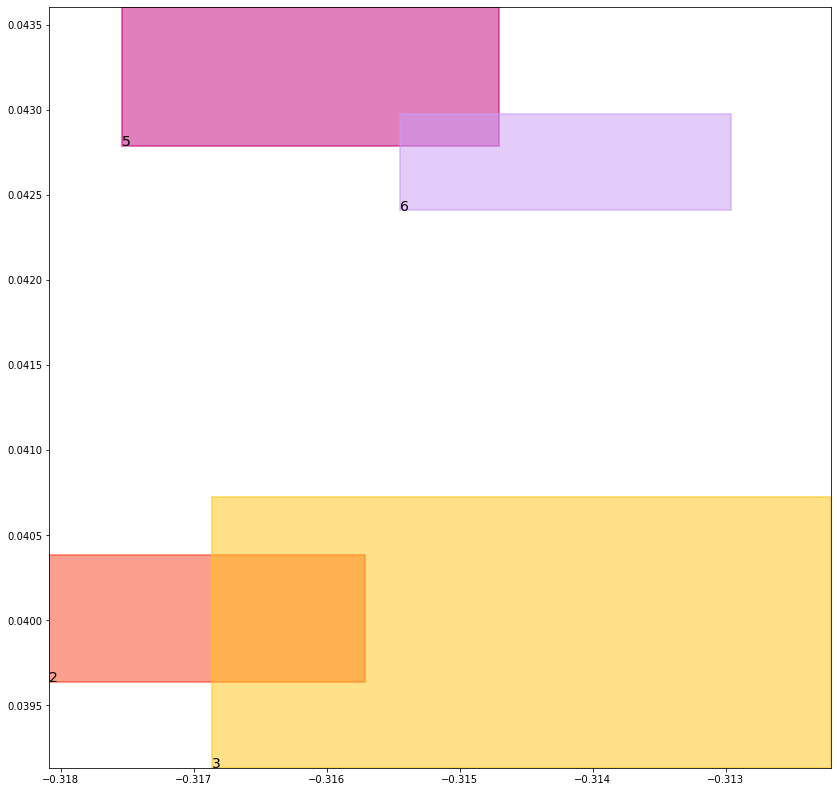

batch (tensor([[2, 6],
        [6, 2],
        [1, 2],
        [3, 5],
        [4, 5],
        [1, 3],
        [5, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0156233273446560, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0162721946835518, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509397566318512, grad_fn=<MulBackward0>)
previous loss: tensor(0.2828352749347687, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05089389160275459 0.10569990426301956 tensor(0.8063875436782837) tensor(0.9546041488647461)
tensor(2) 0.4241136610507965 0.5387416481971741 tensor(0.4453184008598328) tensor(0.5418452620506287)
tensor(3) 0.36402684450149536 0.5470079183578491 tensor(0.4116284847259521) tensor(0.5592614412307739)
tensor(4) 0.2231730967760086 0.06622316688299179 tensor(0.9616574048995972) tensor(0.9403972029685974)
tensor(5) 0.6641810536384583 0.5152695178985596 tensor(0.6758413910865784) tensor(0.5221759676933289)
tensor(6) 0.6048685312271118 0.5275309681892395 tensor(0.6080199480056763) tensor(0.5361158847808838)


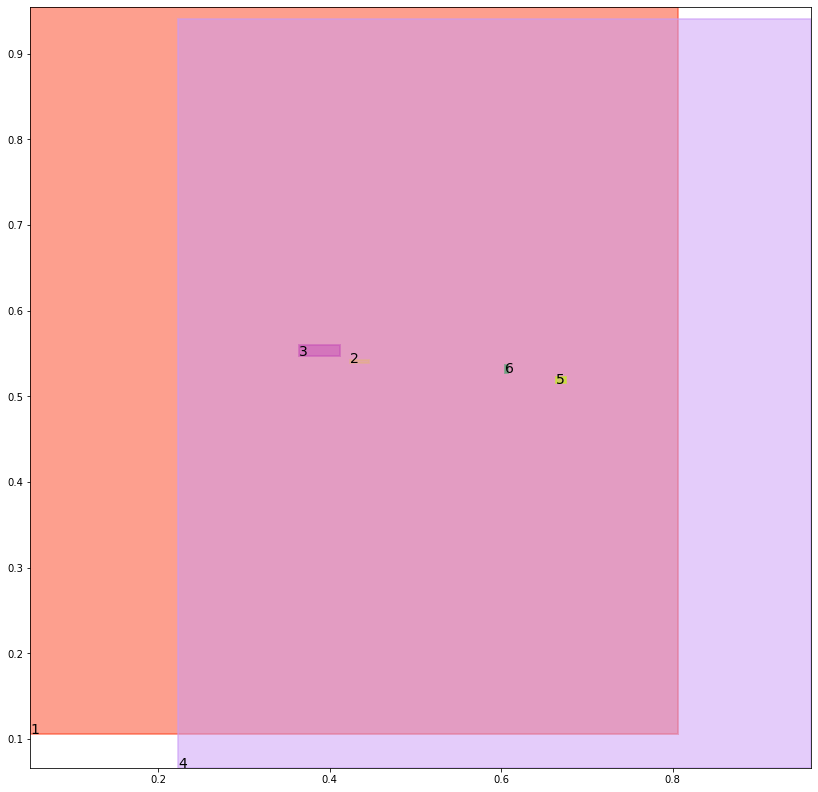

alignment data:
tensor(2) -0.31475019454956055 0.026024237275123596 tensor(-0.3133765459060669) tensor(0.0265228897333145)
tensor(3) -0.3142963647842407 0.025707915425300598 tensor(-0.3098658919334412) tensor(0.0271671563386917)
tensor(5) -0.3144053816795349 0.028164342045783997 tensor(-0.3120495080947876) tensor(0.0285107791423798)
tensor(6) -0.3126366138458252 0.02785371243953705 tensor(-0.3103628158569336) tensor(0.0284500569105148)


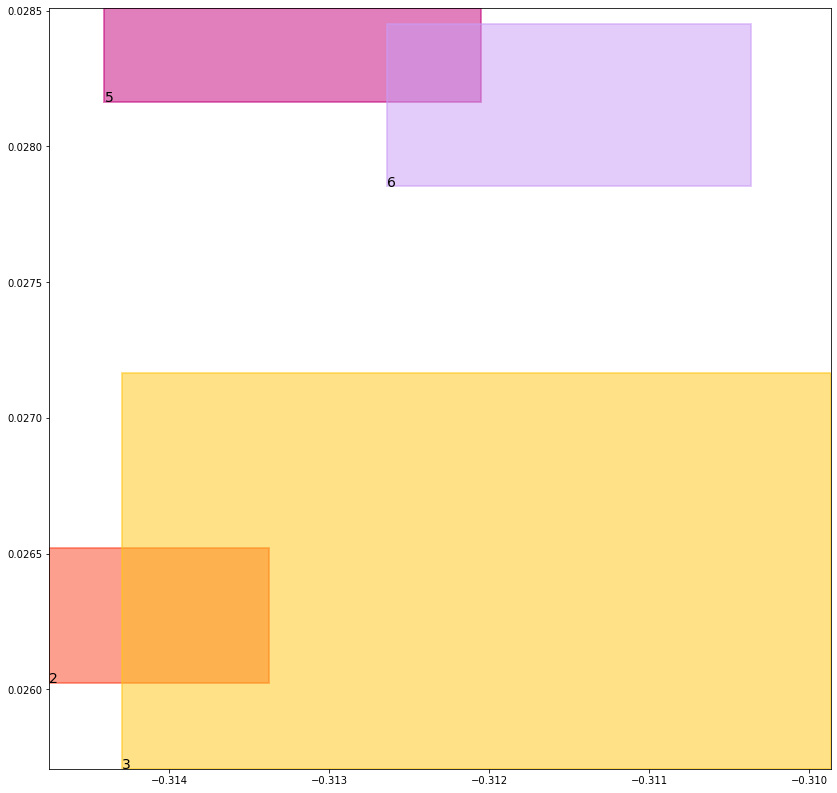

batch (tensor([[4, 5],
        [3, 5],
        [4, 6],
        [5, 3],
        [2, 6],
        [1, 3],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0153001528233290, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0153234153985977, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509433925151825, grad_fn=<MulBackward0>)
previous loss: tensor(0.2815669476985931, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05064468830823898 0.10451097041368484 tensor(0.8077277541160583) tensor(0.9548293352127075)
tensor(2) 0.42593419551849365 0.539139449596405 tensor(0.4465975463390350) tensor(0.5404642820358276)
tensor(3) 0.3681996166706085 0.5459898710250854 tensor(0.4111528992652893) tensor(0.5567039847373962)
tensor(4) 0.22050592303276062 0.06465539336204529 tensor(0.9619516134262085) tensor(0.9406020641326904)
tensor(5) 0.6569929122924805 0.5162501931190491 tensor(0.6598369479179382) tensor(0.5205221772193909)
tensor(6) 0.6044912934303284 0.5258566737174988 tensor(0.6057546734809875) tensor(0.5329241752624512)


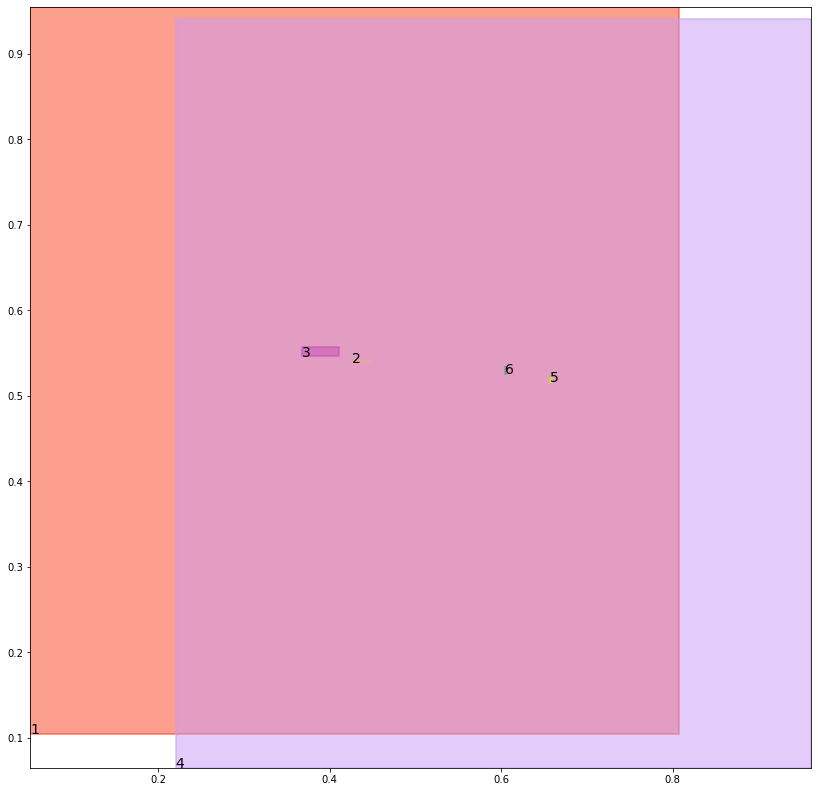

alignment data:
tensor(2) -0.3192450702190399 0.02249494194984436 tensor(-0.3182937800884247) tensor(0.0228241831064224)
tensor(3) -0.319196492433548 0.022374525666236877 tensor(-0.3151772320270538) tensor(0.0236618369817734)
tensor(5) -0.31827834248542786 0.023319914937019348 tensor(-0.3170984089374542) tensor(0.0236750394105911)
tensor(6) -0.3173680603504181 0.023466214537620544 tensor(-0.3155178129673004) tensor(0.0240155905485153)


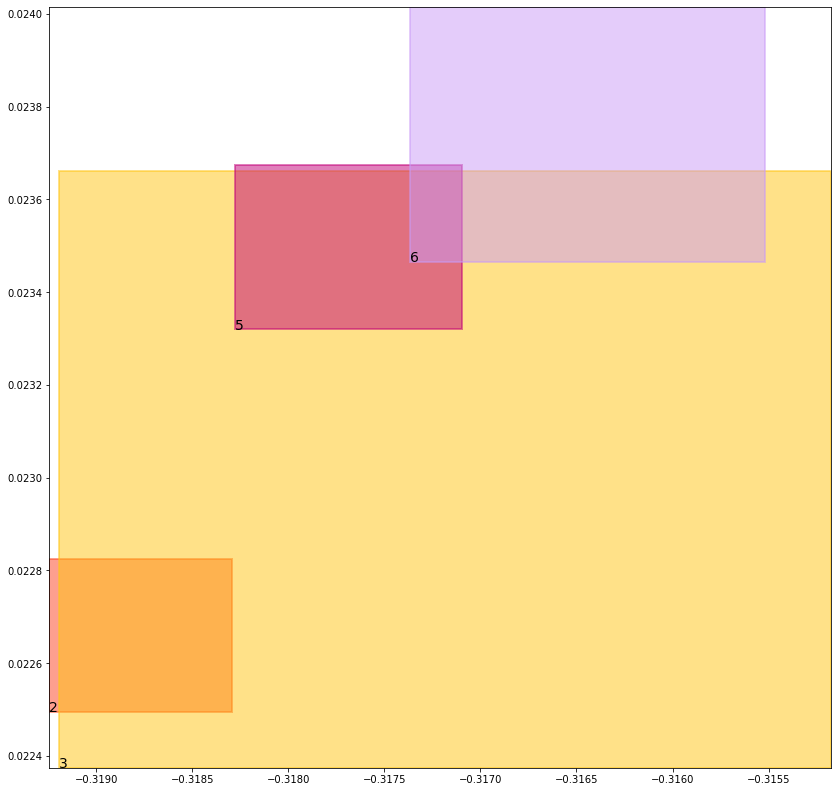

batch (tensor([[4, 5],
        [1, 3],
        [5, 3],
        [6, 2],
        [1, 2],
        [3, 5],
        [2, 6],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0149848638102412, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0144487600773573, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509533166885376, grad_fn=<MulBackward0>)
previous loss: tensor(0.2803869247436523, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.05041002109646797 0.10333704948425293 tensor(0.8090633749961853) tensor(0.9550427198410034)
tensor(2) 0.4278618395328522 0.5368334650993347 tensor(0.4470106959342957) tensor(0.5415592789649963)
tensor(3) 0.37238287925720215 0.5453176498413086 tensor(0.4104954302310944) tensor(0.5539566874504089)
tensor(4) 0.2178792655467987 0.06314114481210709 tensor(0.9622236490249634) tensor(0.9407955408096313)
tensor(5) 0.6435948610305786 0.5174562931060791 tensor(0.6506075263023376) tensor(0.5188800096511841)
tensor(6) 0.6031820178031921 0.5244208574295044 tensor(0.6043777465820312) tensor(0.5293629169464111)


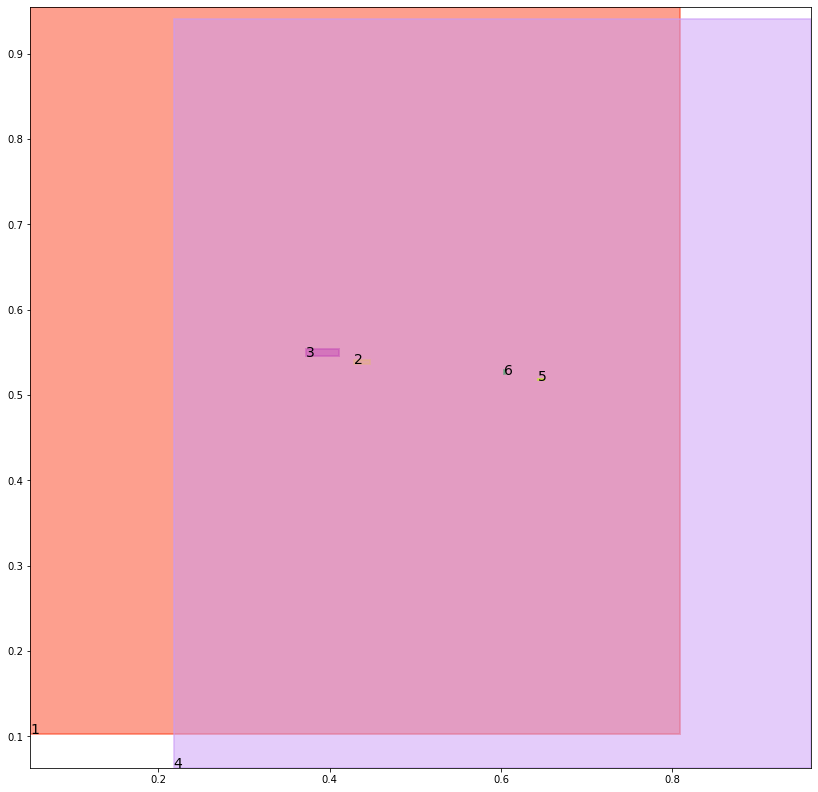

alignment data:
tensor(2) -0.3091527223587036 0.016644135117530823 tensor(-0.3073292970657349) tensor(0.0172119289636612)
tensor(3) -0.308707058429718 0.01691533625125885 tensor(-0.3052760362625122) tensor(0.0179791301488876)
tensor(5) -0.30736875534057617 0.01676592230796814 tensor(-0.3067802190780640) tensor(0.0169473141431808)
tensor(6) -0.30684149265289307 0.017031267285346985 tensor(-0.3055273294448853) tensor(0.0174682289361954)


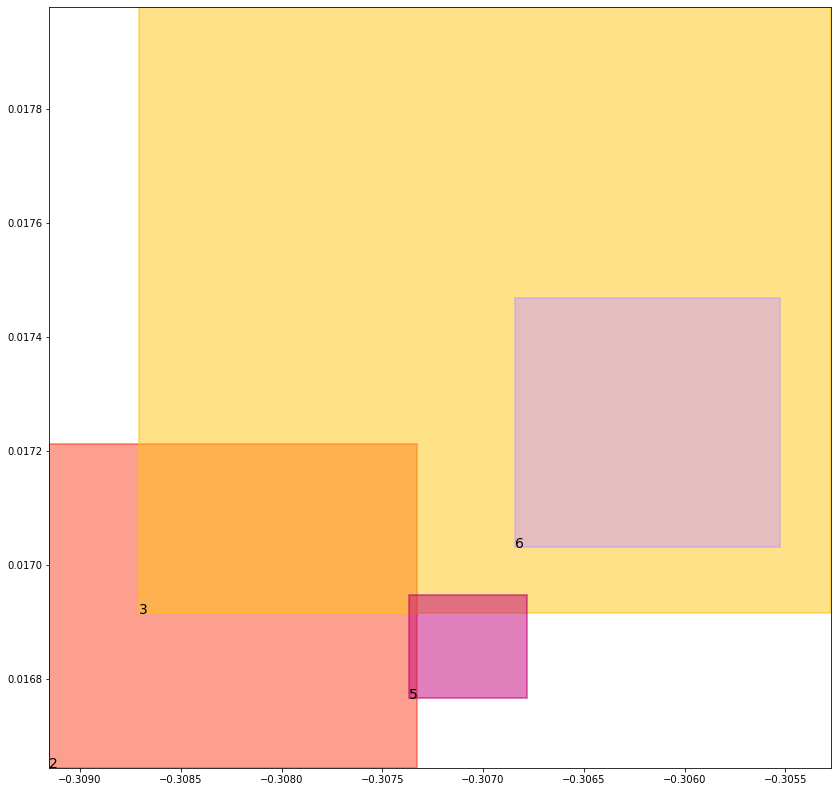

batch (tensor([[1, 2],
        [6, 2],
        [4, 6],
        [4, 5],
        [1, 3],
        [5, 3],
        [2, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0147120002657175, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0140268793329597, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509575486183167, grad_fn=<MulBackward0>)
previous loss: tensor(0.2796964347362518, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.050188761204481125 0.10217758268117905 tensor(0.8103930950164795) tensor(0.9552451968193054)
tensor(2) 0.4298841059207916 0.5348949432373047 tensor(0.4466371238231659) tensor(0.5420640707015991)
tensor(3) 0.37656572461128235 0.5449592471122742 tensor(0.4096751213073730) tensor(0.5510489940643311)
tensor(4) 0.21528390049934387 0.06168017163872719 tensor(0.9624755382537842) tensor(0.9409785270690918)
tensor(5) 0.6289945840835571 0.5172513723373413 tensor(0.6439896225929260) tensor(0.5188528895378113)
tensor(6) 0.6012232303619385 0.5232004523277283 tensor(0.6039692759513855) tensor(0.5255082249641418)


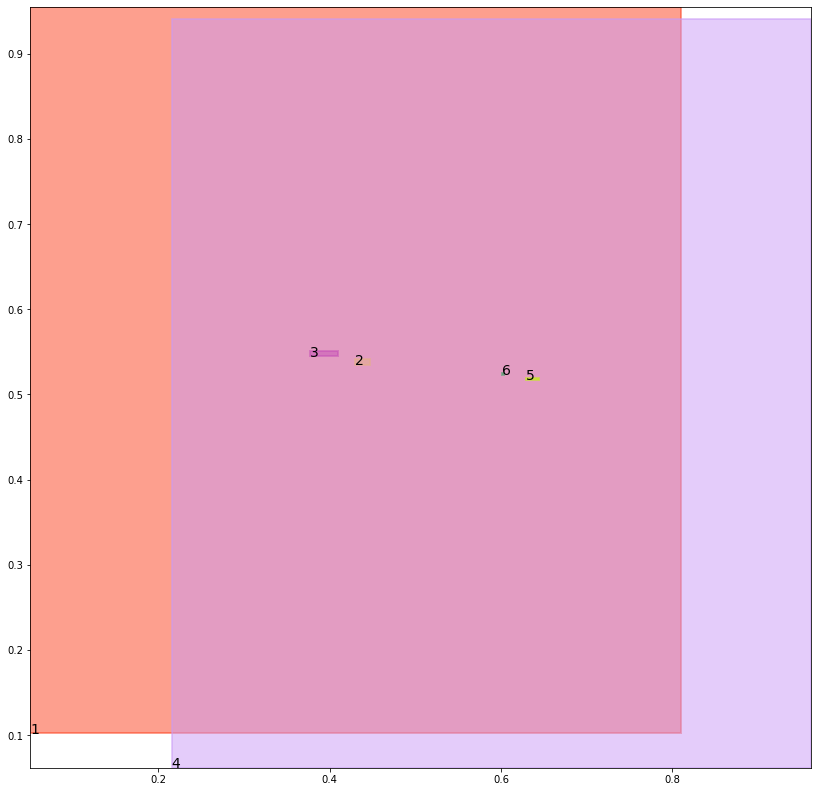

alignment data:
tensor(2) -0.2967243194580078 0.018739446997642517 tensor(-0.2943042516708374) tensor(0.0195275098085403)
tensor(3) -0.29586994647979736 0.01939210295677185 tensor(-0.2931893467903137) tensor(0.0201730132102966)
tensor(5) -0.2947259545326233 0.01821894943714142 tensor(-0.2938128709793091) tensor(0.0184614807367325)
tensor(6) -0.2940969467163086 0.018626883625984192 tensor(-0.2934054732322693) tensor(0.0188649445772171)


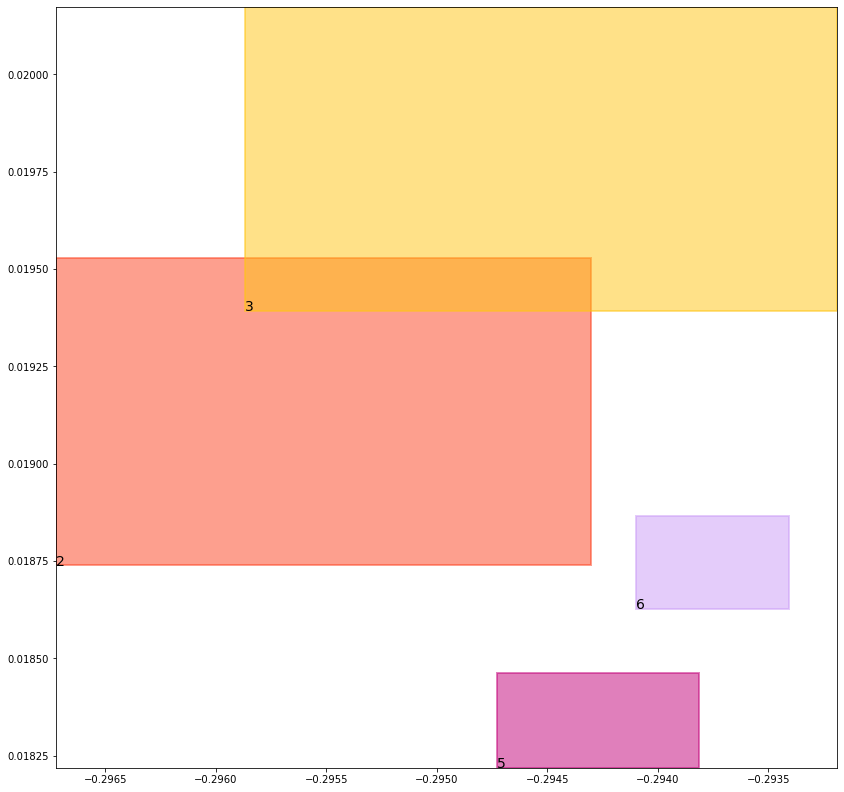

batch (tensor([[5, 3],
        [1, 3],
        [4, 6],
        [4, 5],
        [6, 2],
        [3, 5],
        [2, 6],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0144110871478915, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0138241108506918, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509618699550629, grad_fn=<MulBackward0>)
previous loss: tensor(0.2791970670223236, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04997992888092995 0.10103241354227066 tensor(0.8117146492004395) tensor(0.9554378986358643)
tensor(2) 0.4319895803928375 0.5332930088043213 tensor(0.4455558955669403) tensor(0.5420151352882385)
tensor(3) 0.3807382583618164 0.5448788404464722 tensor(0.4087102115154266) tensor(0.5480124354362488)
tensor(4) 0.21270884573459625 0.060271184891462326 tensor(0.9627090692520142) tensor(0.9411518573760986)
tensor(5) 0.6160548329353333 0.5158623456954956 tensor(0.6371937394142151) tensor(0.5196508169174194)
tensor(6) 0.5998255014419556 0.521431028842926 tensor(0.6032927036285400) tensor(0.5221748352050781)


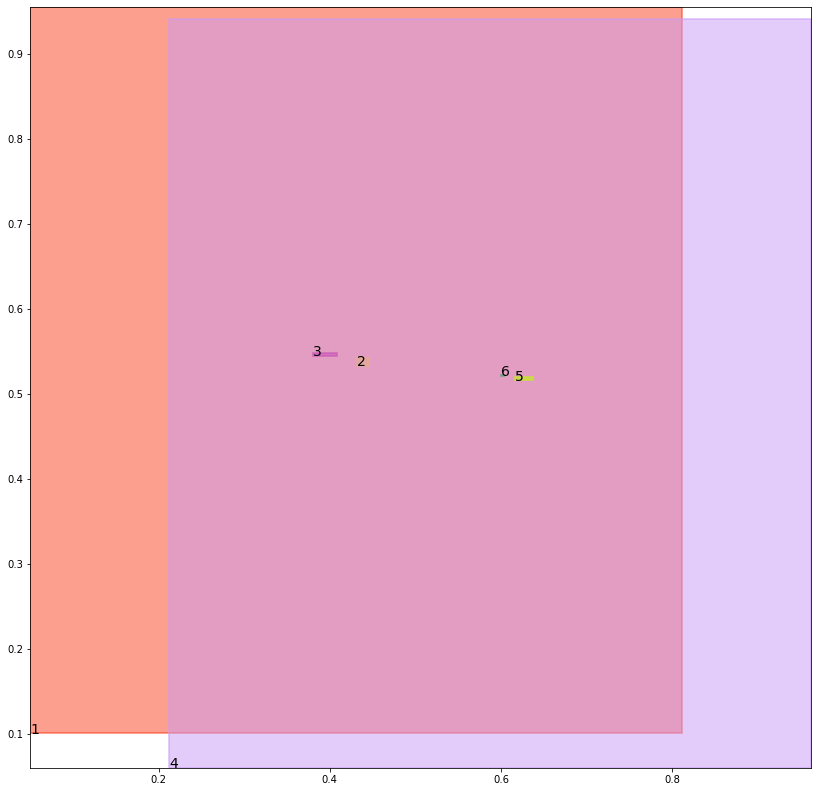

alignment data:
tensor(2) -0.27936050295829773 0.023184791207313538 tensor(-0.2766052186489105) tensor(0.0241512656211853)
tensor(3) -0.2780880033969879 0.02420307695865631 tensor(-0.2763020694255829) tensor(0.0246388465166092)
tensor(5) -0.27758869528770447 0.02206273376941681 tensor(-0.2758664786815643) tensor(0.0225409567356110)
tensor(6) -0.2766874134540558 0.02258436381816864 tensor(-0.2763728797435760) tensor(0.0226756632328033)


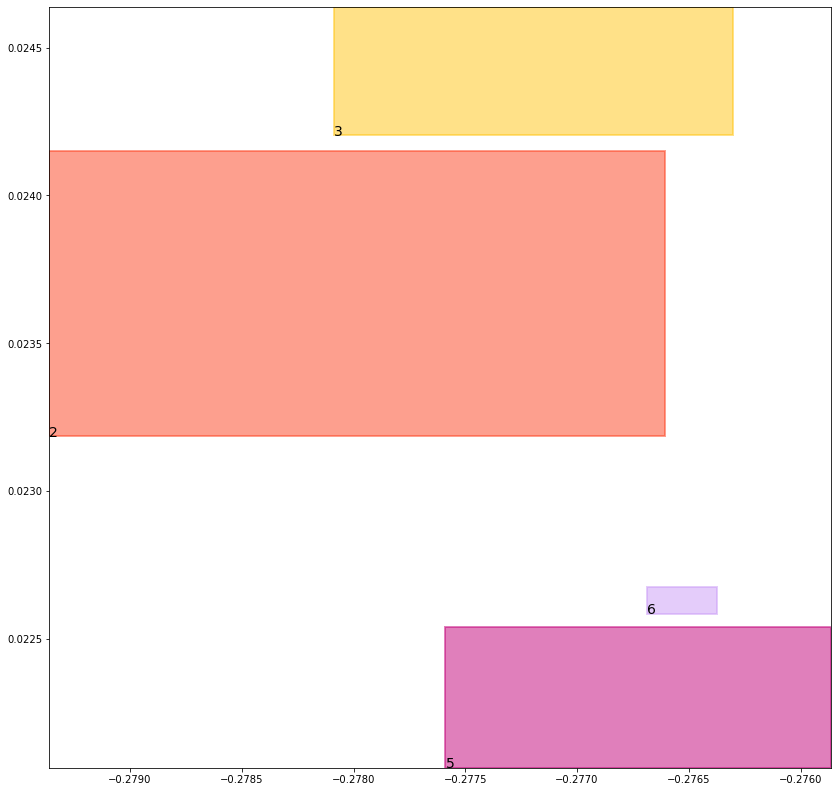

batch (tensor([[5, 3],
        [2, 6],
        [1, 2],
        [1, 3],
        [6, 2],
        [4, 5],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0140864886343479, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0136491088196635, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509661614894867, grad_fn=<MulBackward0>)
previous loss: tensor(0.2787017524242401, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04978259652853012 0.09990163892507553 tensor(0.8130259513854980) tensor(0.9556214809417725)
tensor(2) 0.43416762351989746 0.5319976210594177 tensor(0.4438449740409851) tensor(0.5414509773254395)
tensor(3) 0.3848913311958313 0.5448786020278931 tensor(0.4076178073883057) tensor(0.5450383424758911)
tensor(4) 0.2101454883813858 0.058911848813295364 tensor(0.9629256725311279) tensor(0.9413164258003235)
tensor(5) 0.6047698855400085 0.5146952271461487 tensor(0.6302701830863953) tensor(0.5198899507522583)
tensor(6) 0.59893798828125 0.5180001854896545 tensor(0.6023725867271423) tensor(0.5210774540901184)


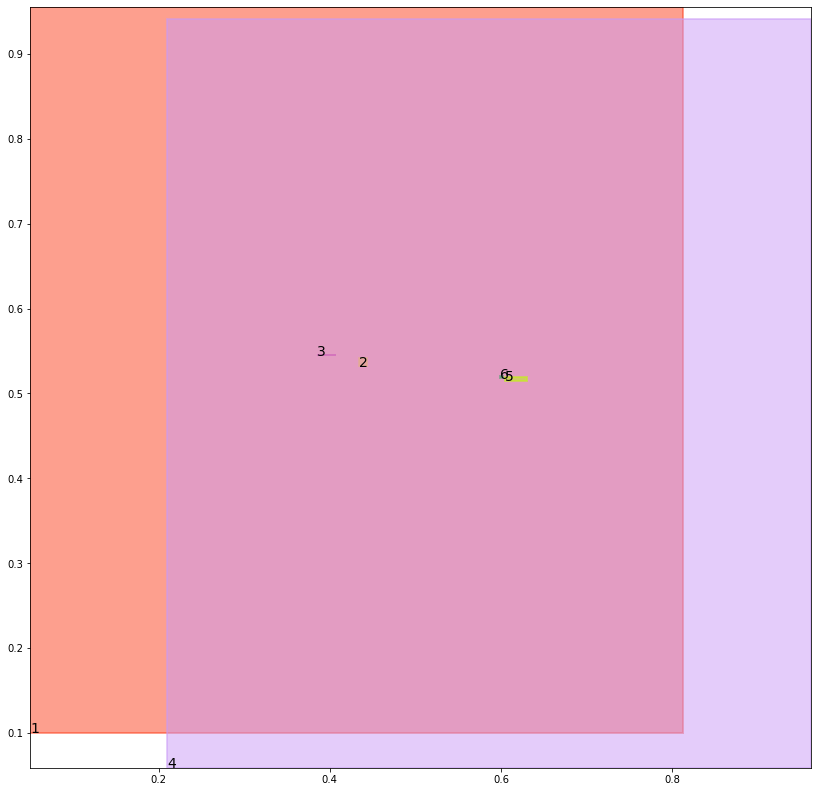

alignment data:
tensor(2) -0.26458850502967834 0.025864899158477783 tensor(-0.2617438733577728) tensor(0.0269491374492645)
tensor(3) -0.262935072183609 0.02721010148525238 tensor(-0.2620840966701508) tensor(0.0272761583328247)
tensor(5) -0.26309409737586975 0.024278879165649414 tensor(-0.2608127295970917) tensor(0.0249173641204834)
tensor(6) -0.26242753863334656 0.024638444185256958 tensor(-0.2614913880825043) tensor(0.0249919742345810)


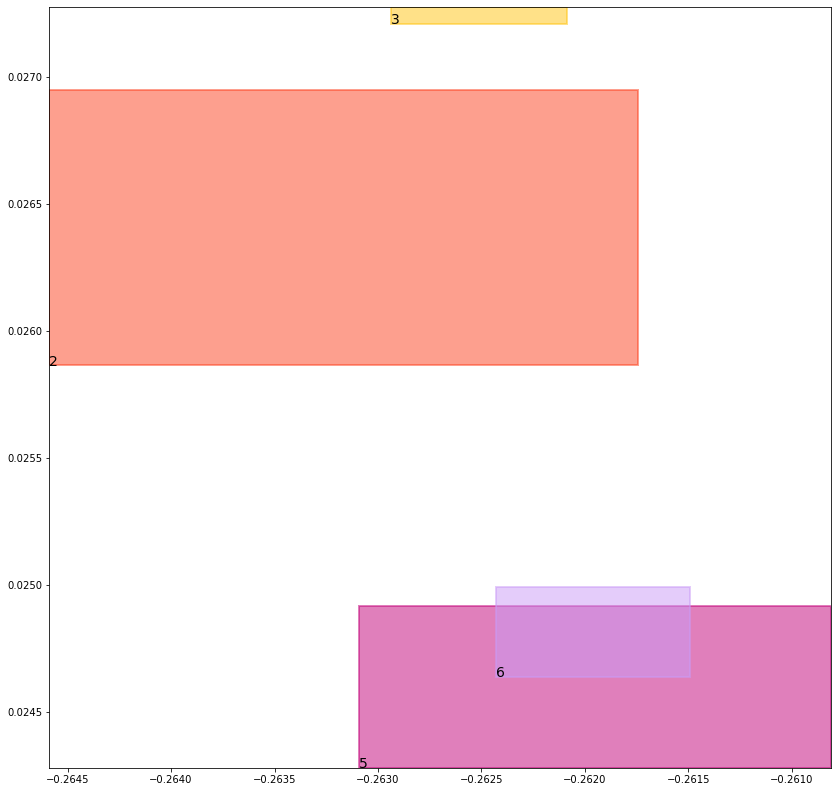

batch (tensor([[3, 5],
        [4, 6],
        [6, 2],
        [2, 6],
        [1, 2],
        [4, 5],
        [1, 3],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0137479137629271, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0134994871914387, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509666681289673, grad_fn=<MulBackward0>)
previous loss: tensor(0.2782140672206879, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0495959110558033 0.09878551214933395 tensor(0.8143244981765747) tensor(0.9557967185974121)
tensor(2) 0.43640807271003723 0.5309776067733765 tensor(0.4415811300277710) tensor(0.5404193997383118)
tensor(3) 0.38901665806770325 0.542248010635376 tensor(0.4064137041568756) tensor(0.5448211431503296)
tensor(4) 0.20758788287639618 0.05759921669960022 tensor(0.9631267786026001) tensor(0.9414730072021484)
tensor(5) 0.5951123833656311 0.5137339234352112 tensor(0.6232649683952332) tensor(0.5196117162704468)
tensor(6) 0.5985119342803955 0.5151782035827637 tensor(0.6012314558029175) tensor(0.5199183225631714)


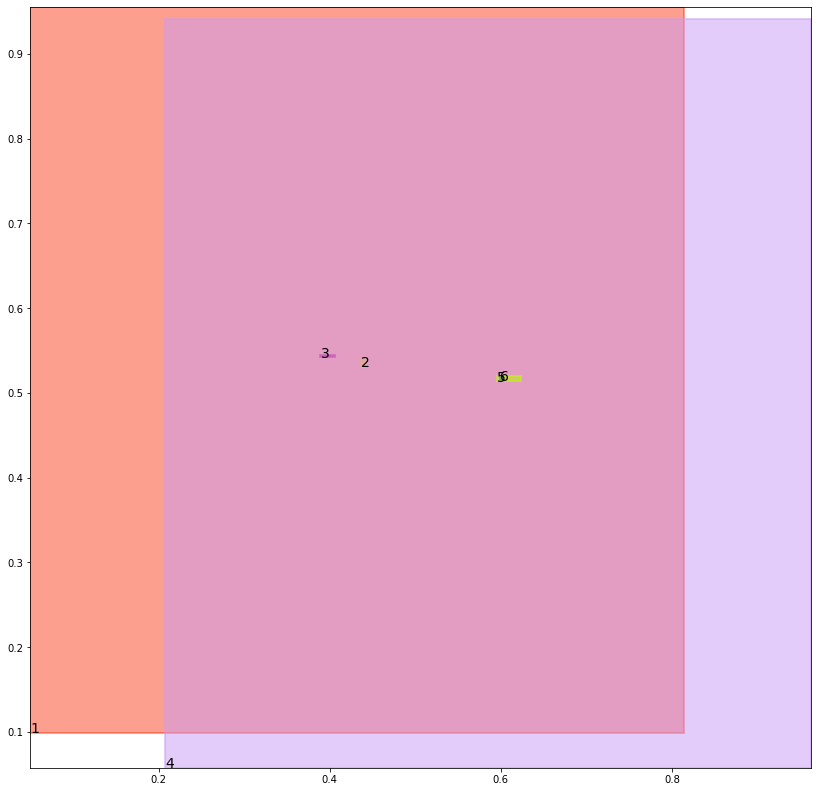

alignment data:
tensor(2) -0.25077179074287415 0.025218352675437927 tensor(-0.2480637729167938) tensor(0.0263476967811584)
tensor(3) -0.2494928538799286 0.026526421308517456 tensor(-0.2481717765331268) tensor(0.0268461257219315)
tensor(5) -0.24958518147468567 0.023281484842300415 tensor(-0.2469899952411652) tensor(0.0240031480789185)
tensor(6) -0.24907580018043518 0.02345620095729828 tensor(-0.2477118074893951) tensor(0.0240232646465302)


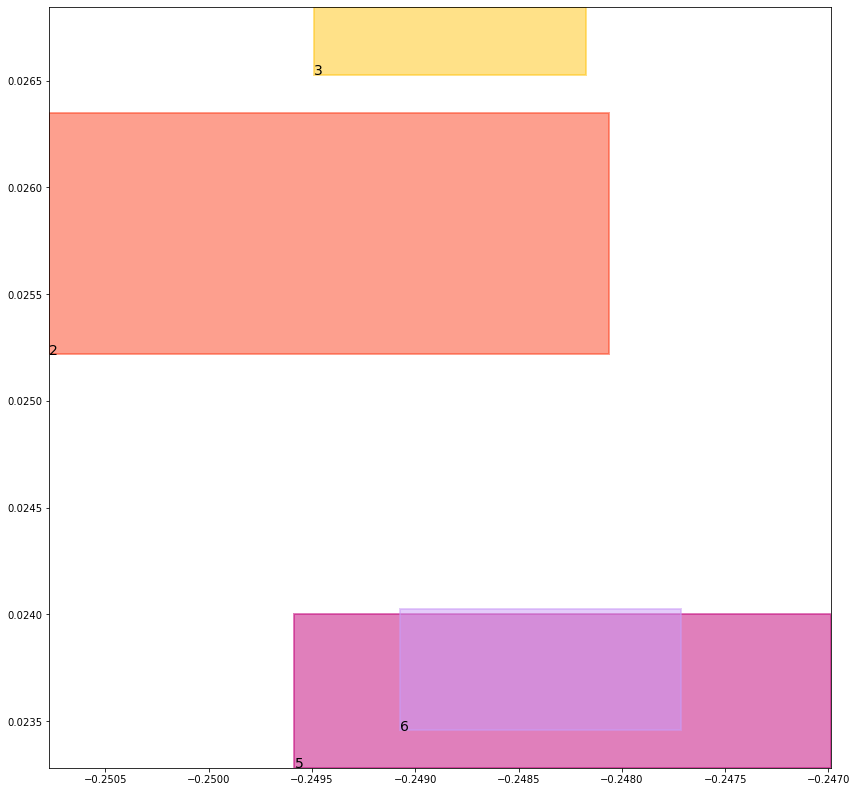

batch (tensor([[4, 6],
        [4, 5],
        [6, 2],
        [2, 6],
        [3, 5],
        [5, 3],
        [1, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0134622976183891, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0133237671107054, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509592473506927, grad_fn=<MulBackward0>)
previous loss: tensor(0.2777453064918518, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04941911995410919 0.09768321365118027 tensor(0.8156076669692993) tensor(0.9559643268585205)
tensor(2) 0.4387016296386719 0.5302044749259949 tensor(0.4388378262519836) tensor(0.5389677882194519)
tensor(3) 0.3931072950363159 0.5400789380073547 tensor(0.4051121175289154) tensor(0.5442595481872559)
tensor(4) 0.205032616853714 0.05633094534277916 tensor(0.9633136987686157) tensor(0.9416224360466003)
tensor(5) 0.5870348215103149 0.5129597187042236 tensor(0.6162208318710327) tensor(0.5188710093498230)
tensor(6) 0.5985005497932434 0.5129278302192688 tensor(0.5998902916908264) tensor(0.5187063813209534)


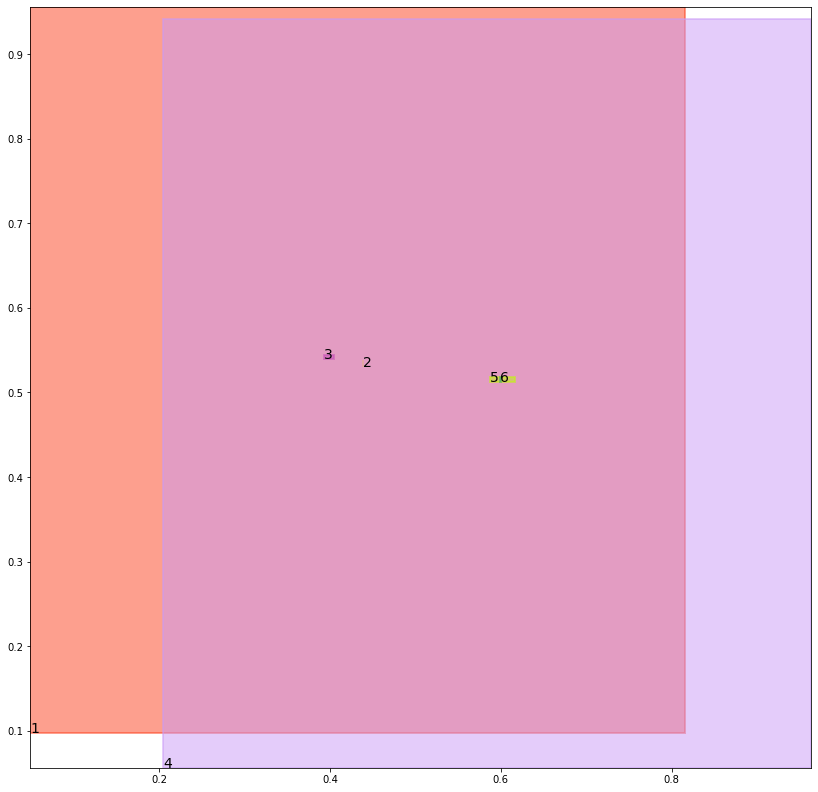

alignment data:
tensor(2) -0.2341536283493042 0.022683531045913696 tensor(-0.2317879796028137) tensor(0.0237782299518585)
tensor(3) -0.23318713903427124 0.0239303857088089 tensor(-0.2316151857376099) tensor(0.0244491100311279)
tensor(5) -0.23328983783721924 0.02048596739768982 tensor(-0.2306135892868042) tensor(0.0212158560752869)
tensor(6) -0.2328726053237915 0.020478591322898865 tensor(-0.2312644720077515) tensor(0.0212000608444214)


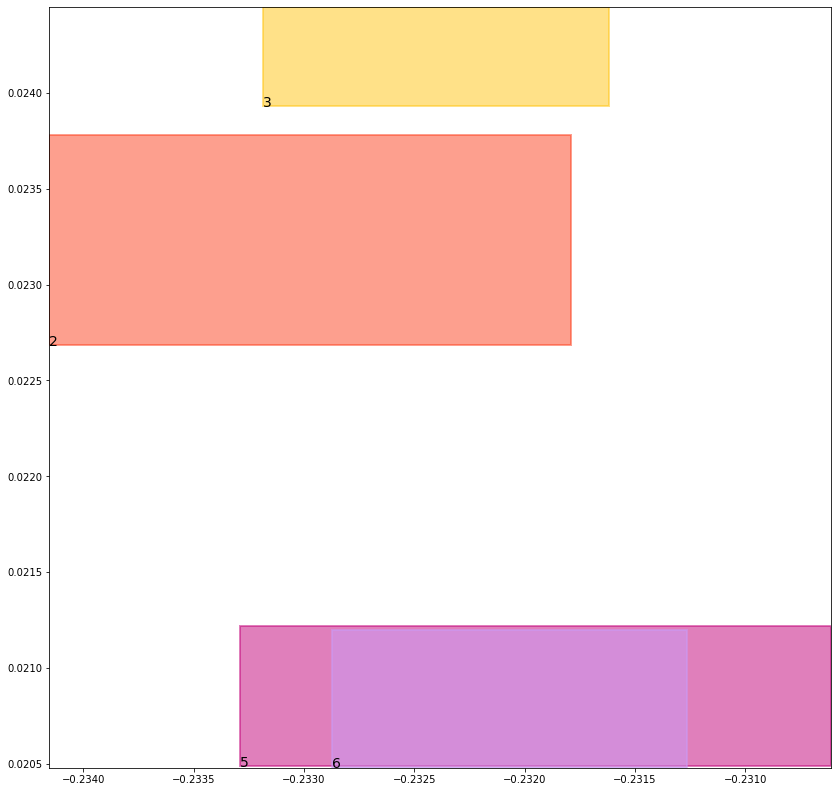

batch (tensor([[4, 5],
        [1, 2],
        [2, 6],
        [6, 2],
        [3, 5],
        [5, 3],
        [4, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0131594929844141, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0131212361156940, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509587109088898, grad_fn=<MulBackward0>)
previous loss: tensor(0.2772394418716431, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04925151914358139 0.09659434109926224 tensor(0.8168732523918152) tensor(0.9561249613761902)
tensor(2) 0.4356851279735565 0.5296519994735718 tensor(0.4410399496555328) tensor(0.5371428132057190)
tensor(3) 0.39715710282325745 0.5383318066596985 tensor(0.4037259519100189) tensor(0.5433835387229919)
tensor(4) 0.20247869193553925 0.05510512366890907 tensor(0.9634876251220703) tensor(0.9417650103569031)
tensor(5) 0.5804734230041504 0.5123558044433594 tensor(0.6091762185096741) tensor(0.5177211761474609)
tensor(6) 0.5983684659004211 0.5112115144729614 tensor(0.5988593697547913) tensor(0.5174489021301270)


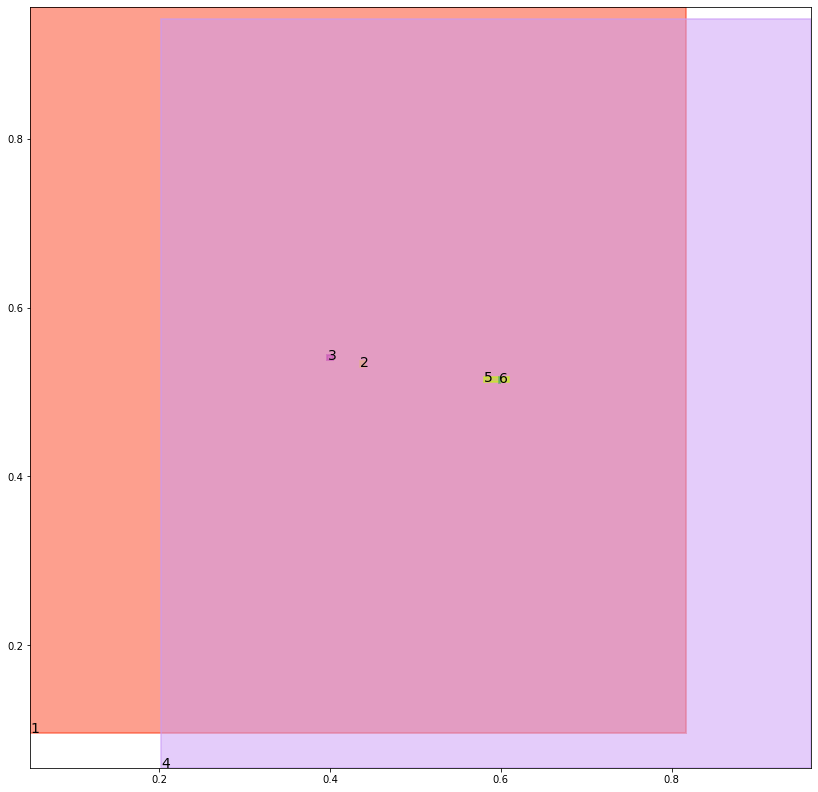

alignment data:
tensor(2) -0.2213587462902069 0.017458677291870117 tensor(-0.2191192209720612) tensor(0.0184251666069031)
tensor(3) -0.22044619917869568 0.01862439513206482 tensor(-0.2188245952129364) tensor(0.0192731320858002)
tensor(5) -0.2206191122531891 0.015066206455230713 tensor(-0.2180797159671783) tensor(0.0157329738140106)
tensor(6) -0.22025737166404724 0.014899373054504395 tensor(-0.2185417711734772) tensor(0.0157082080841064)


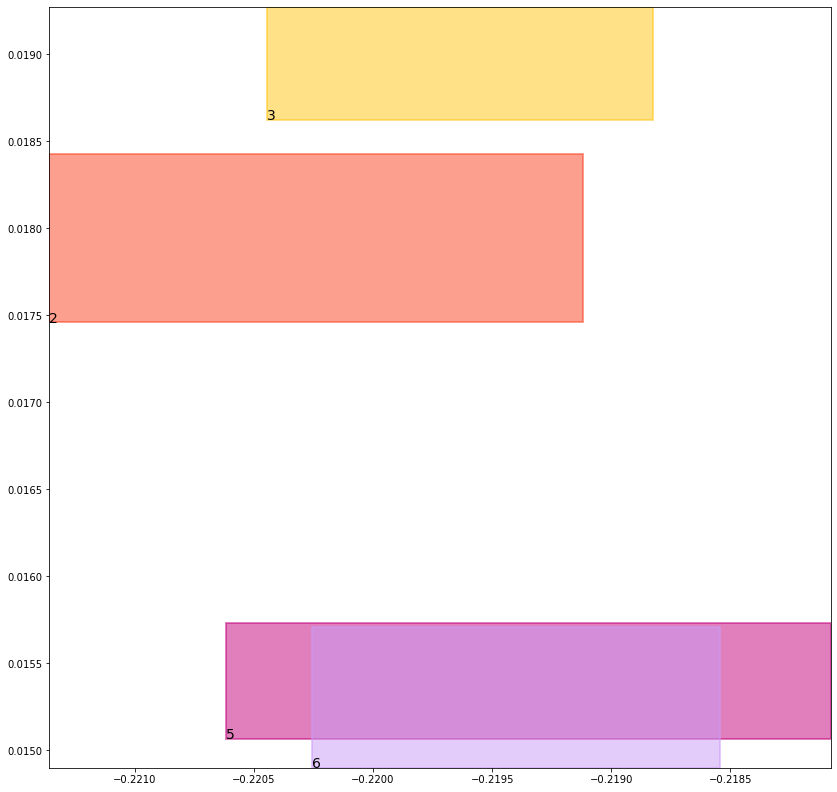

batch (tensor([[2, 6],
        [1, 3],
        [4, 6],
        [6, 2],
        [1, 2],
        [5, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0130373258143663, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0129100102931261, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509616613388062, grad_fn=<MulBackward0>)
previous loss: tensor(0.2769089937210083, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.049092311412096024 0.09551875293254852 tensor(0.8181218504905701) tensor(0.9562791585922241)
tensor(2) 0.43344077467918396 0.5292974710464478 tensor(0.4428696334362030) tensor(0.5349882245063782)
tensor(3) 0.40116050839424133 0.5369689464569092 tensor(0.4022670388221741) tensor(0.5422208905220032)
tensor(4) 0.19992688298225403 0.05392021685838699 tensor(0.9636496305465698) tensor(0.9419016242027283)
tensor(5) 0.5753506422042847 0.5119066834449768 tensor(0.6021653413772583) tensor(0.5162134170532227)
tensor(6) 0.5972045660018921 0.5099890828132629 tensor(0.5986808538436890) tensor(0.5161528587341309)


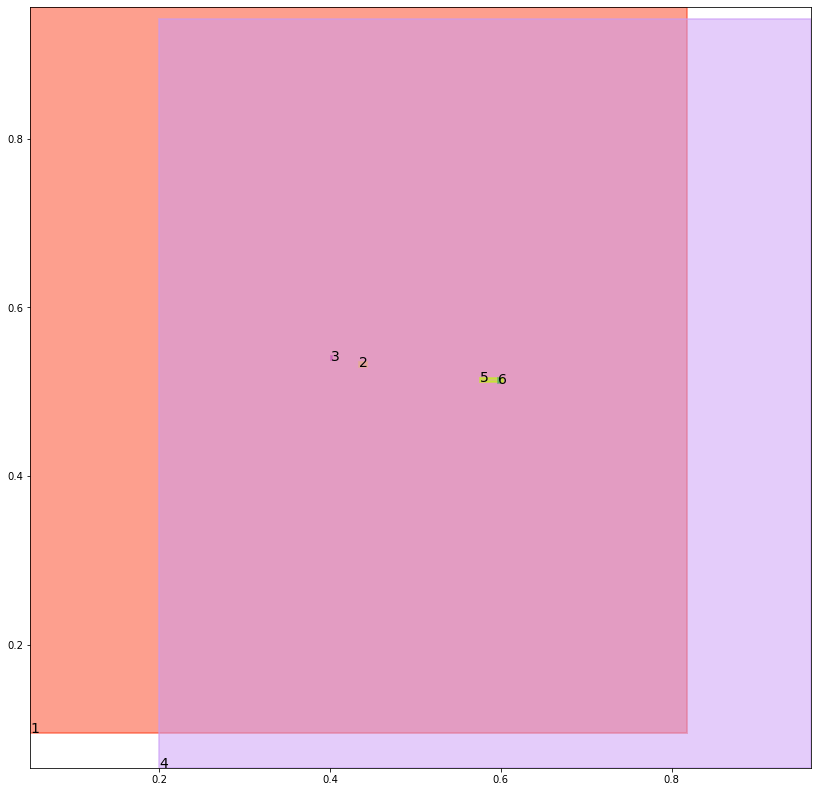

alignment data:
tensor(2) -0.211055189371109 0.015853658318519592 tensor(-0.2091329395771027) tensor(0.0166008472442627)
tensor(3) -0.21016982197761536 0.016927167773246765 tensor(-0.2086838185787201) tensor(0.0176279246807098)
tensor(5) -0.21045628190040588 0.013318881392478943 tensor(-0.2082554996013641) tensor(0.0138553529977798)
tensor(6) -0.21015498042106628 0.01303023099899292 tensor(-0.2084042727947235) tensor(0.0138523876667023)


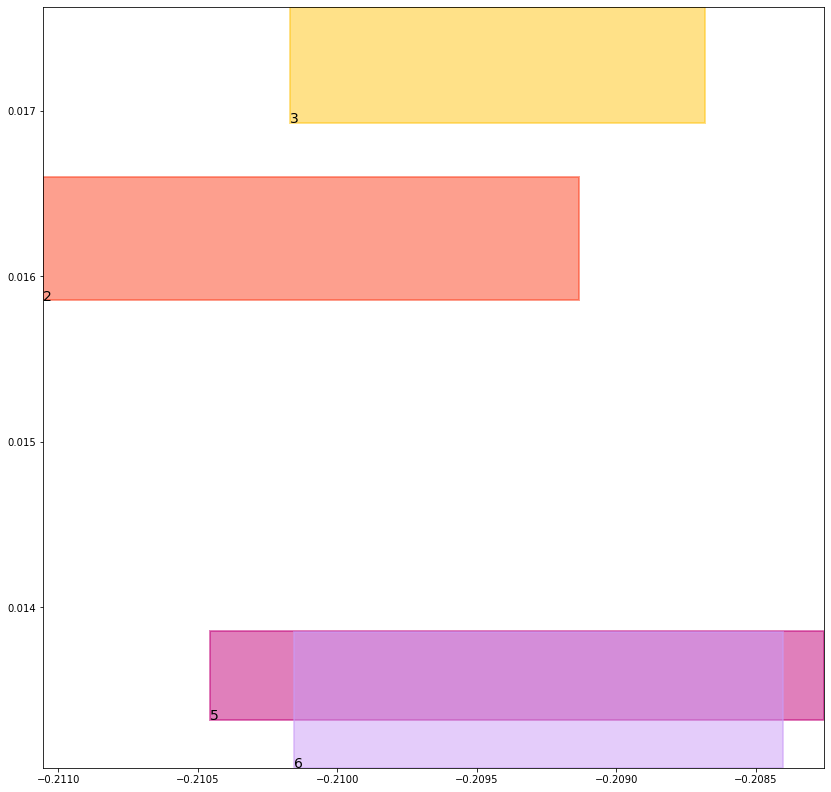

batch (tensor([[5, 3],
        [2, 6],
        [4, 6],
        [1, 2],
        [4, 5],
        [3, 5],
        [6, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0128892771899700, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0127145042642951, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509703338146210, grad_fn=<MulBackward0>)
previous loss: tensor(0.2765741050243378, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04894077777862549 0.09445659816265106 tensor(0.8193539381027222) tensor(0.9564273357391357)
tensor(2) 0.432033509016037 0.5291199684143066 tensor(0.4442327618598938) tensor(0.5325474143028259)
tensor(3) 0.4007461667060852 0.5359548926353455 tensor(0.4051128327846527) tensor(0.5407974720001221)
tensor(4) 0.1973785161972046 0.05277496203780174 tensor(0.9638007879257202) tensor(0.9420326948165894)
tensor(5) 0.5715773701667786 0.5115983486175537 tensor(0.5952183008193970) tensor(0.5143966674804688)
tensor(6) 0.5963654518127441 0.5092215538024902 tensor(0.5980123281478882) tensor(0.5148237943649292)


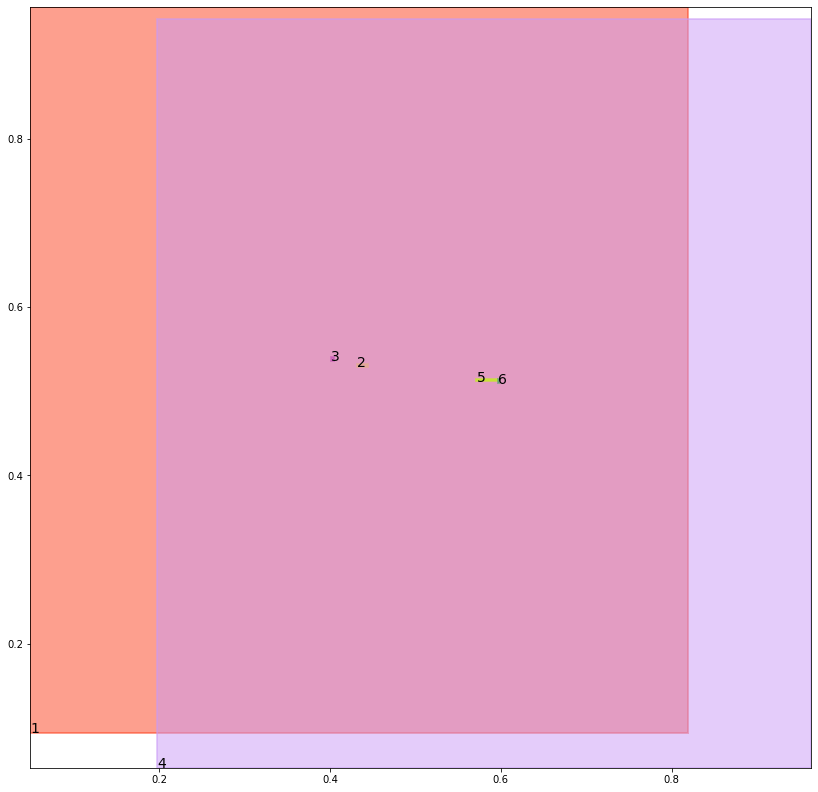

alignment data:
tensor(2) -0.19839268922805786 0.00626276433467865 tensor(-0.1969757080078125) tensor(0.0067117810249329)
tensor(3) -0.19768458604812622 0.00725063681602478 tensor(-0.1961726546287537) tensor(0.0079063922166824)
tensor(5) -0.1979486346244812 0.003631696105003357 tensor(-0.1962707638740540) tensor(0.0039755254983902)
tensor(6) -0.19766521453857422 0.0032650381326675415 tensor(-0.1960456967353821) tensor(0.0040293484926224)


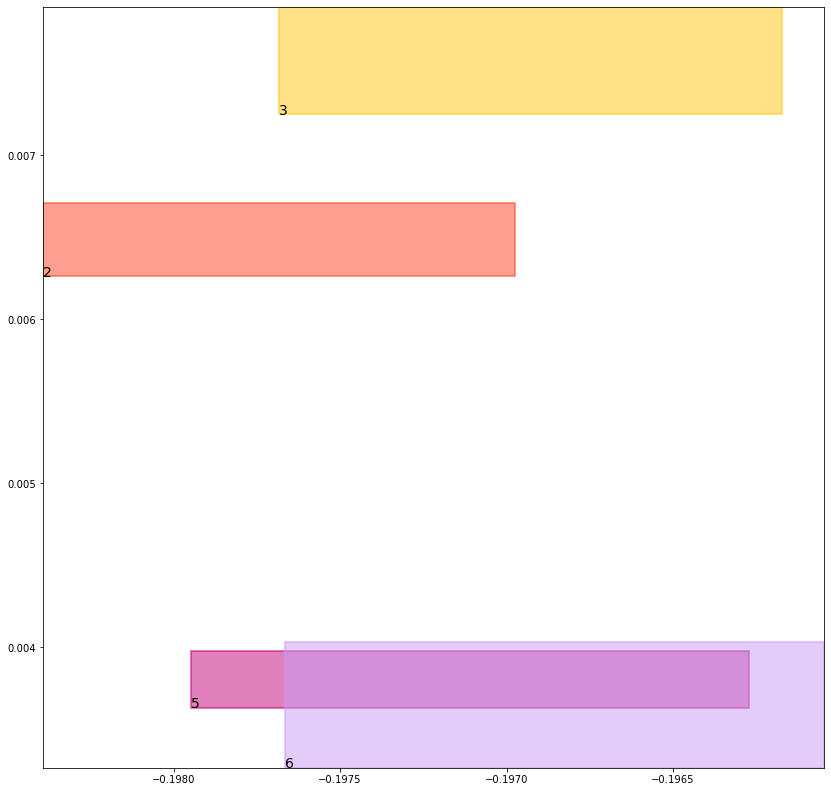

batch (tensor([[2, 6],
        [3, 5],
        [1, 3],
        [4, 5],
        [6, 2],
        [5, 3],
        [4, 6],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0128749683499336, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0124839507043362, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509824037551880, grad_fn=<MulBackward0>)
previous loss: tensor(0.2763413190841675, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04879612475633621 0.09340820461511612 tensor(0.8205714821815491) tensor(0.9565699696540833)
tensor(2) 0.4313948452472687 0.5291004776954651 tensor(0.4451693296432495) tensor(0.5298629999160767)
tensor(3) 0.39975765347480774 0.5352576375007629 tensor(0.4085446596145630) tensor(0.5391357541084290)
tensor(4) 0.19483691453933716 0.05166829004883766 tensor(0.9639418721199036) tensor(0.9421585202217102)
tensor(5) 0.5690554976463318 0.5114172101020813 tensor(0.5883615016937256) tensor(0.5123198032379150)
tensor(6) 0.5958195924758911 0.5088704824447632 tensor(0.5968987345695496) tensor(0.5134661793708801)


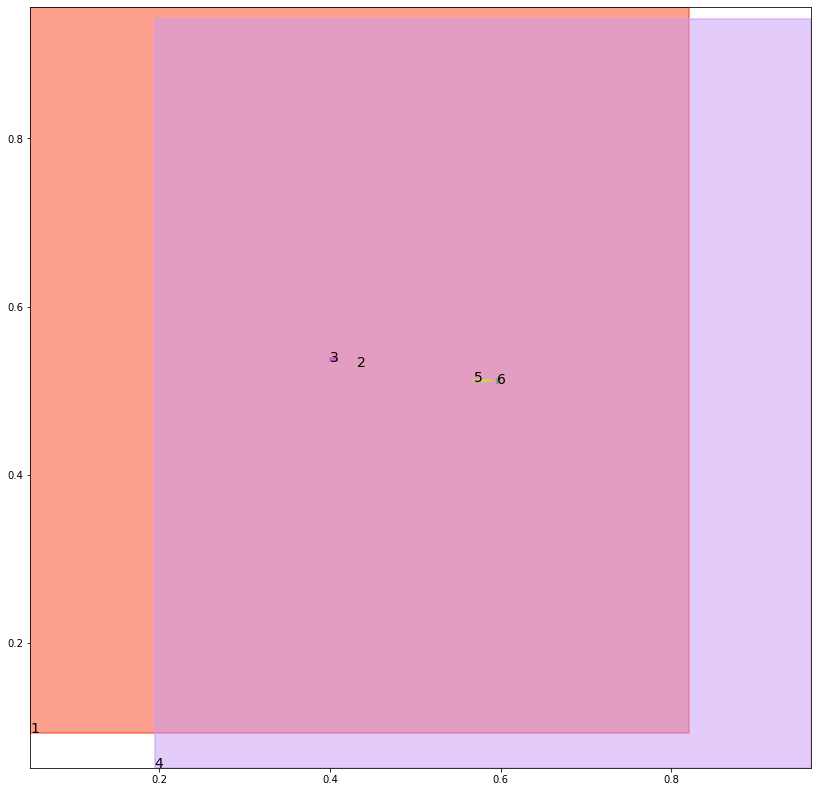

alignment data:
tensor(2) -0.198600172996521 0.0015796273946762085 tensor(-0.1978608369827271) tensor(0.0016635358333588)
tensor(3) -0.19807732105255127 0.0024887770414352417 tensor(-0.1966532468795776) tensor(0.0030148476362228)
tensor(5) -0.19831740856170654 -0.0011073052883148193 tensor(-0.1973277330398560) tensor(-0.0010128468275070)
tensor(6) -0.198012113571167 -0.001505523920059204 tensor(-0.1966803073883057) tensor(-0.0008669346570969)


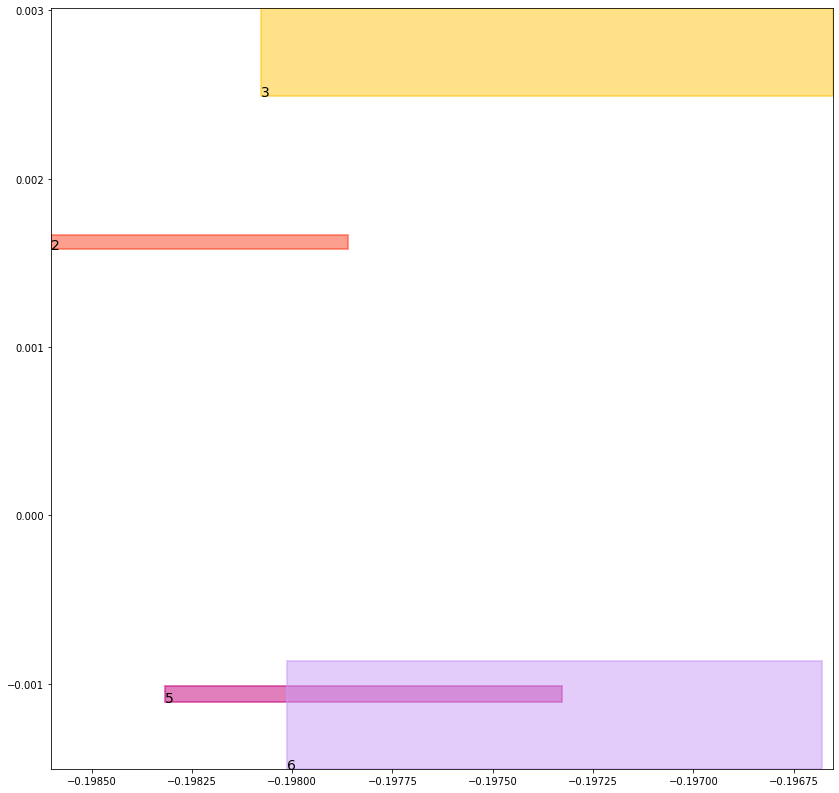

batch (tensor([[5, 3],
        [2, 6],
        [4, 6],
        [3, 5],
        [4, 5],
        [1, 2],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0128530282527208, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0122215701267123, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509996891021729, grad_fn=<MulBackward0>)
previous loss: tensor(0.2760742902755737, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04865763708949089 0.09237399697303772 tensor(0.8217762112617493) tensor(0.9567074775695801)
tensor(2) 0.4314590394496918 0.5269762873649597 tensor(0.4457171559333801) tensor(0.5292220115661621)
tensor(3) 0.39925622940063477 0.5348477363586426 tensor(0.4114948809146881) tensor(0.5372567176818848)
tensor(4) 0.1923070251941681 0.05059928074479103 tensor(0.9640736579895020) tensor(0.9422794580459595)
tensor(5) 0.5676804780960083 0.5100289583206177 tensor(0.5816175341606140) tensor(0.5113506913185120)
tensor(6) 0.5953824520111084 0.5088979005813599 tensor(0.5955377817153931) tensor(0.5120832920074463)


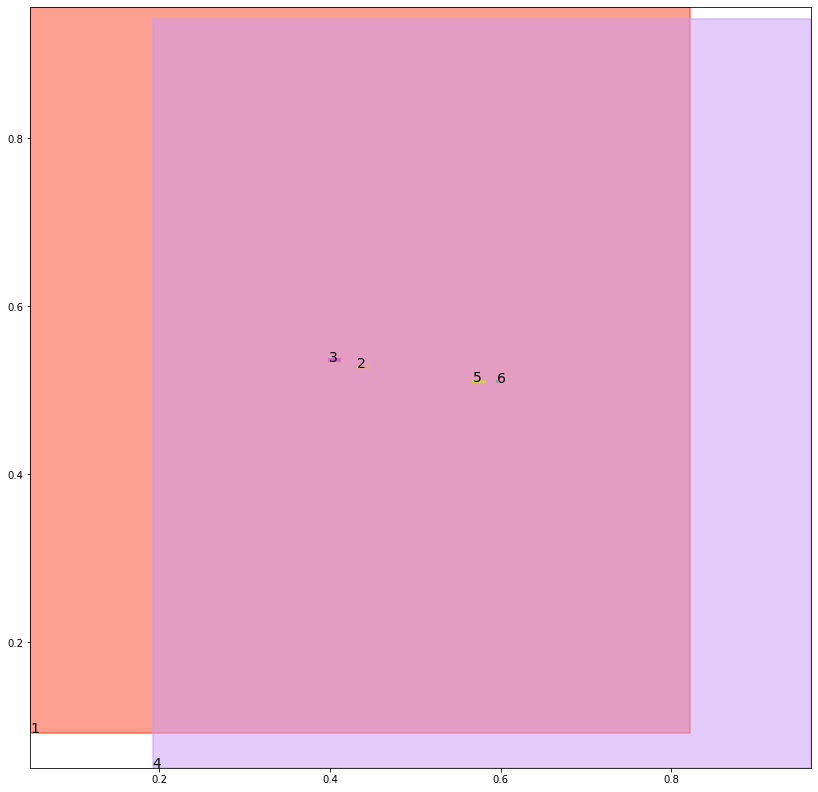

alignment data:
tensor(2) -0.19118961691856384 -0.008589163422584534 tensor(-0.1900092065334320) tensor(-0.0082921385765076)
tensor(3) -0.1901836097240448 -0.007435128092765808 tensor(-0.1890339553356171) tensor(-0.0071123093366623)
tensor(5) -0.19080683588981628 -0.01116567850112915 tensor(-0.1899008452892303) tensor(-0.0109984725713730)
tensor(6) -0.1900722086429596 -0.011363178491592407 tensor(-0.1891625821590424) tensor(-0.0109142810106277)


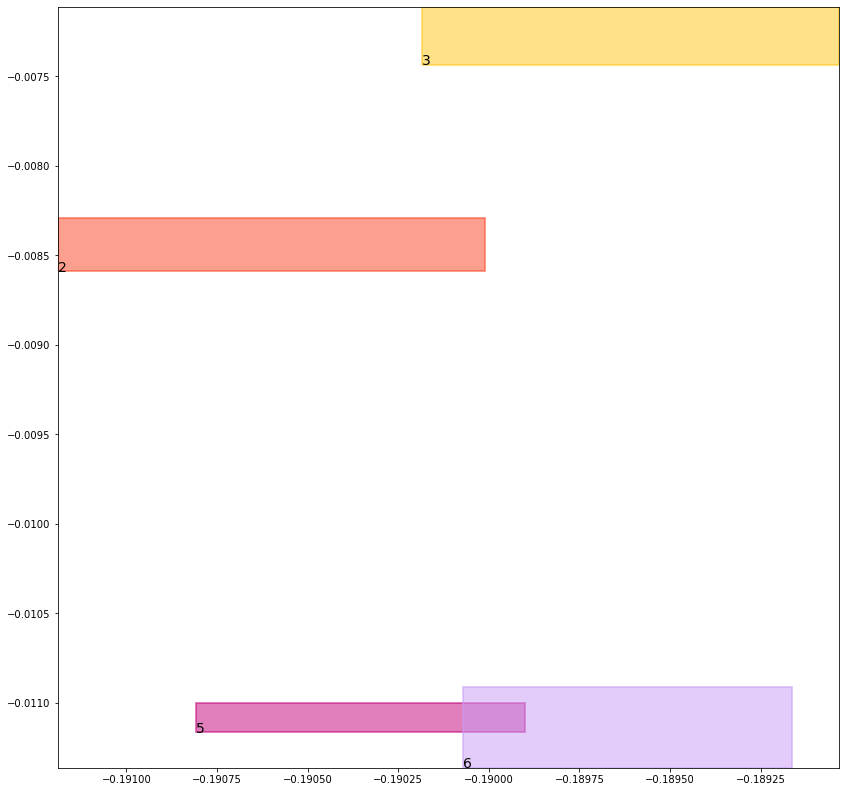

batch (tensor([[1, 2],
        [1, 3],
        [5, 3],
        [3, 5],
        [2, 6],
        [6, 2],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0128363361582160, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0119647905230522, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510023415088654, grad_fn=<MulBackward0>)
previous loss: tensor(0.2758034765720367, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04852471500635147 0.09135353565216064 tensor(0.8229692578315735) tensor(0.9568401575088501)
tensor(2) 0.43216410279273987 0.5247592329978943 tensor(0.4459115862846375) tensor(0.5291674137115479)
tensor(3) 0.3991994857788086 0.5346924662590027 tensor(0.4140007793903351) tensor(0.5351851582527161)
tensor(4) 0.18979480862617493 0.04956661909818649 tensor(0.9641970396041870) tensor(0.9423961043357849)
tensor(5) 0.5673447251319885 0.5082898139953613 tensor(0.5750048160552979) tensor(0.5111711621284485)
tensor(6) 0.5943557024002075 0.5092529654502869 tensor(0.5949794054031372) tensor(0.5106817483901978)


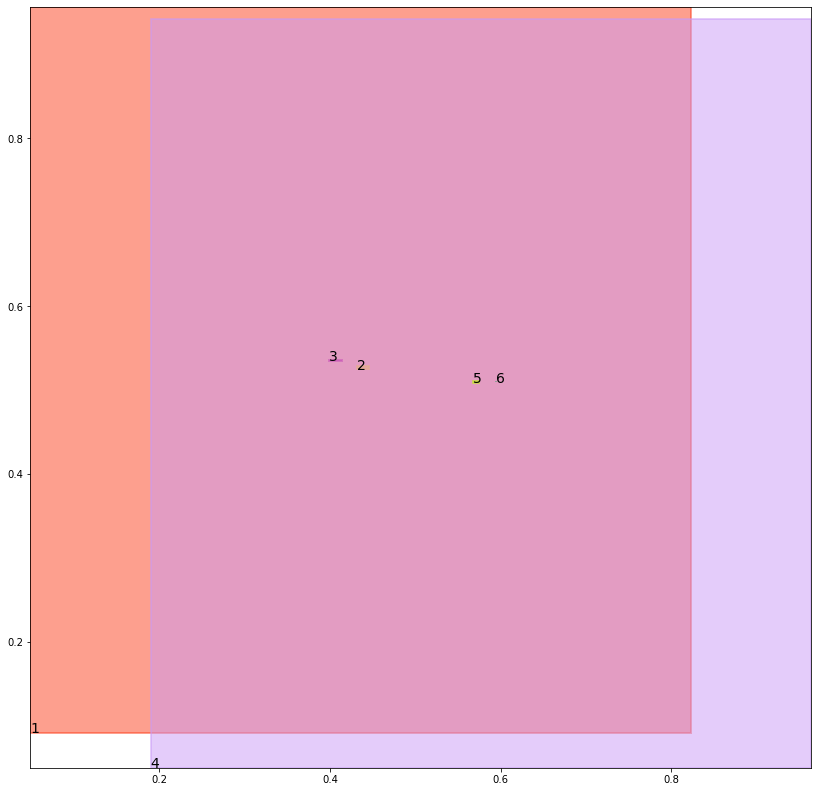

alignment data:
tensor(2) -0.1793491244316101 -0.018568381667137146 tensor(-0.1775640249252319) tensor(-0.0179554671049118)
tensor(3) -0.17775732278823853 -0.017126649618148804 tensor(-0.1770536303520203) tensor(-0.0170706957578659)
tensor(5) -0.17892706394195557 -0.021035194396972656 tensor(-0.1778106689453125) tensor(-0.0206333249807358)
tensor(6) -0.1776244044303894 -0.020924031734466553 tensor(-0.1771914958953857) tensor(-0.0207217782735825)


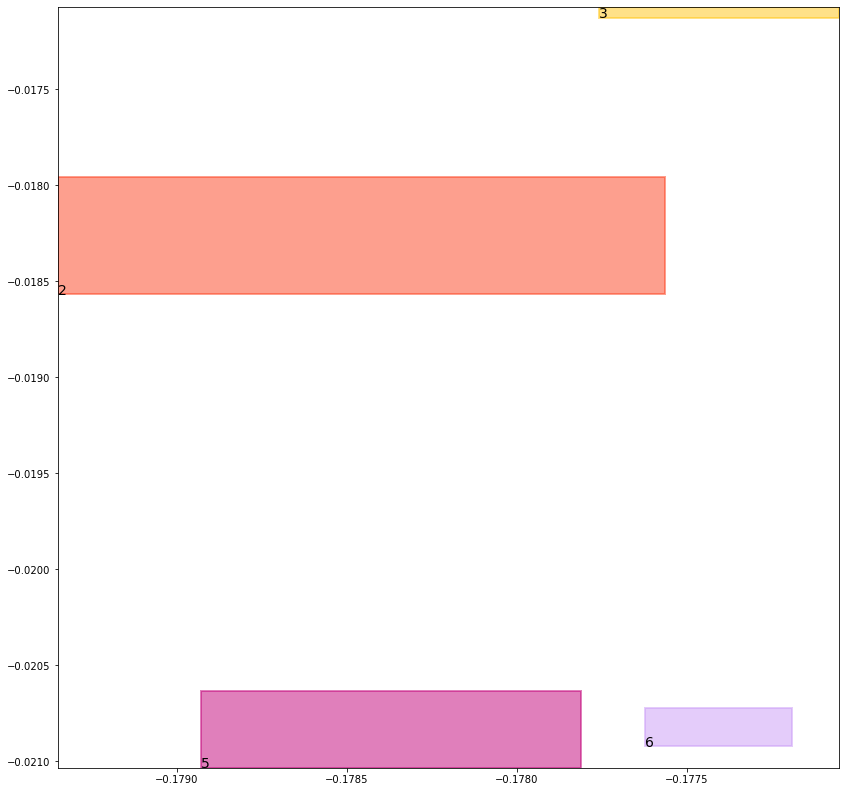

batch (tensor([[3, 5],
        [5, 3],
        [2, 6],
        [1, 2],
        [4, 6],
        [1, 3],
        [4, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0127890035510063, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0117363948374987, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510024309158325, grad_fn=<MulBackward0>)
previous loss: tensor(0.2755278348922729, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.048396822065114975 0.09034647792577744 tensor(0.8241513371467590) tensor(0.9569683074951172)
tensor(2) 0.43345049023628235 0.5231718420982361 tensor(0.4457857906818390) tensor(0.5289496779441833)
tensor(3) 0.3995476961135864 0.5329484343528748 tensor(0.4160974919795990) tensor(0.5347594022750854)
tensor(4) 0.18730607628822327 0.04856893792748451 tensor(0.9643126726150513) tensor(0.9425087571144104)
tensor(5) 0.5679392218589783 0.5070666670799255 tensor(0.5685382485389709) tensor(0.5108880996704102)
tensor(6) 0.5937708616256714 0.509268581867218 tensor(0.5941698551177979) tensor(0.5098853111267090)


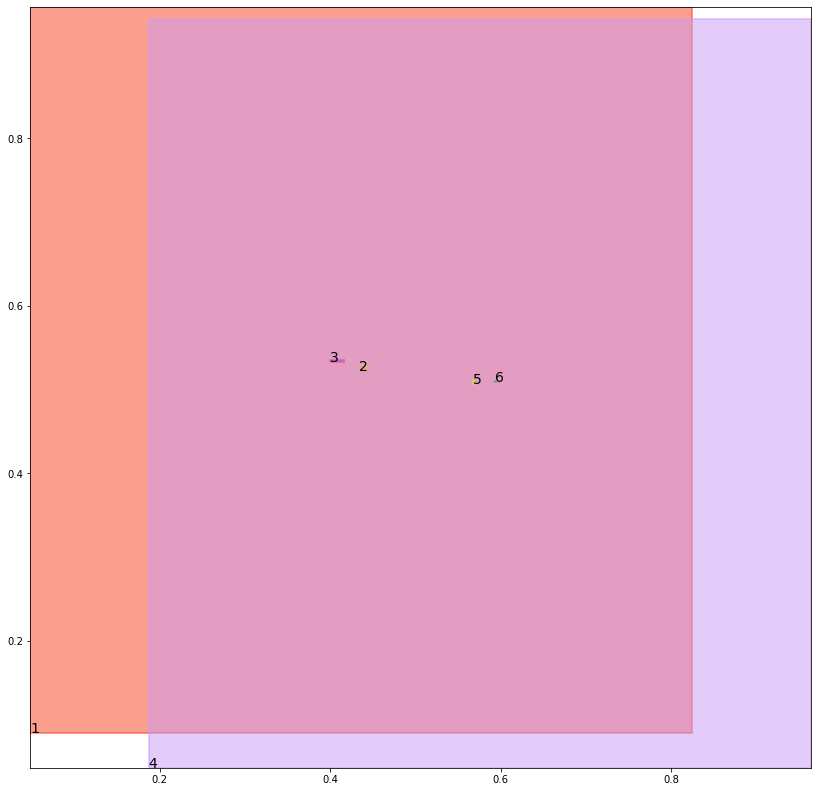

alignment data:
tensor(2) -0.17383286356925964 -0.02572810649871826 tensor(-0.1716957986354828) tensor(-0.0249098390340805)
tensor(3) -0.17229196429252625 -0.024322926998138428 tensor(-0.1711415946483612) tensor(-0.0240712165832520)
tensor(5) -0.1733923852443695 -0.02807241678237915 tensor(-0.1722653806209564) tensor(-0.0275284051895142)
tensor(6) -0.17177757620811462 -0.02776852250099182 tensor(-0.1715842187404633) tensor(-0.0276808142662048)


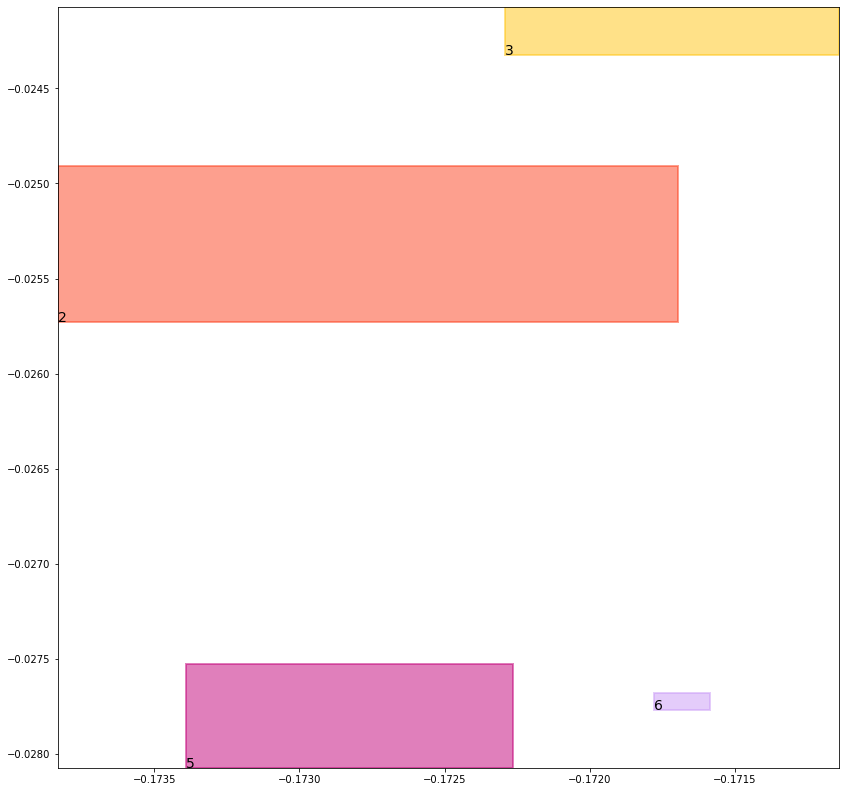

batch (tensor([[4, 6],
        [1, 3],
        [5, 3],
        [3, 5],
        [6, 2],
        [2, 6],
        [1, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0127390567213297, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0114959403872490, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509951293468475, grad_fn=<MulBackward0>)
previous loss: tensor(0.2752301394939423, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04827352985739708 0.089352086186409 tensor(0.8253228068351746) tensor(0.9570925235748291)
tensor(2) 0.43526092171669006 0.5221691727638245 tensor(0.4453711807727814) tensor(0.5285825133323669)
tensor(3) 0.40026426315307617 0.5311344265937805 tensor(0.4178180396556854) tensor(0.5344639420509338)
tensor(4) 0.18484732508659363 0.04760497063398361 tensor(0.9644211530685425) tensor(0.9426177740097046)
tensor(5) 0.562230110168457 0.5063120722770691 tensor(0.5693548321723938) tensor(0.5105128884315491)
tensor(6) 0.5931326746940613 0.5080788135528564 tensor(0.5935829281806946) tensor(0.5100055932998657)


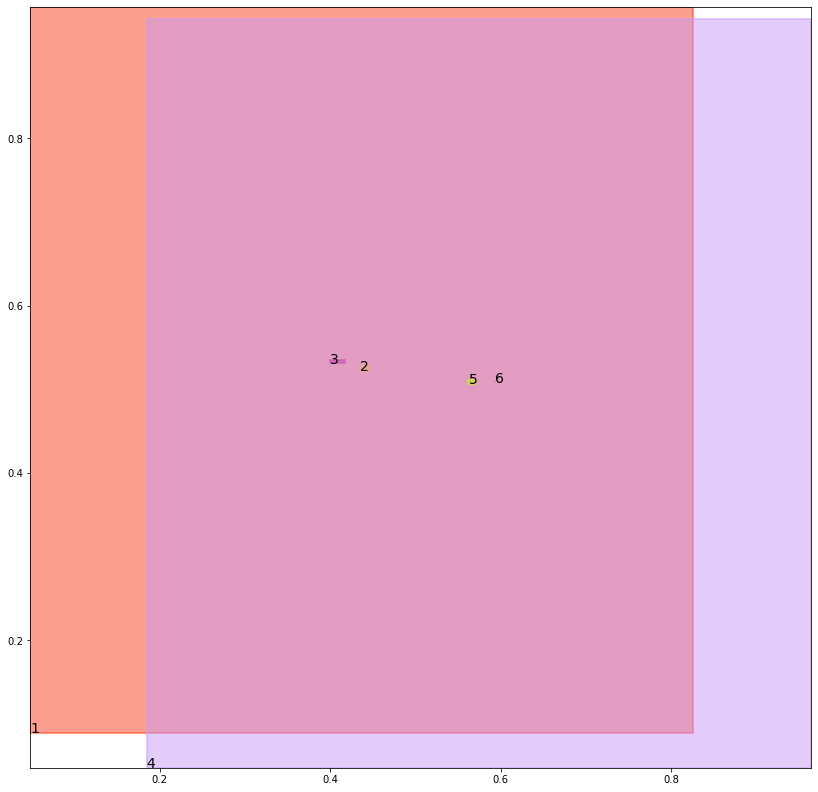

alignment data:
tensor(2) -0.16339027881622314 -0.03279964625835419 tensor(-0.1611399054527283) tensor(-0.0318832397460938)
tensor(3) -0.16209715604782104 -0.03153419494628906 tensor(-0.1604648232460022) tensor(-0.0310545265674591)
tensor(5) -0.16322380304336548 -0.03501734137535095 tensor(-0.1617308259010315) tensor(-0.0344168841838837)
tensor(6) -0.161543607711792 -0.03475596010684967 tensor(-0.1609650254249573) tensor(-0.0344814658164978)


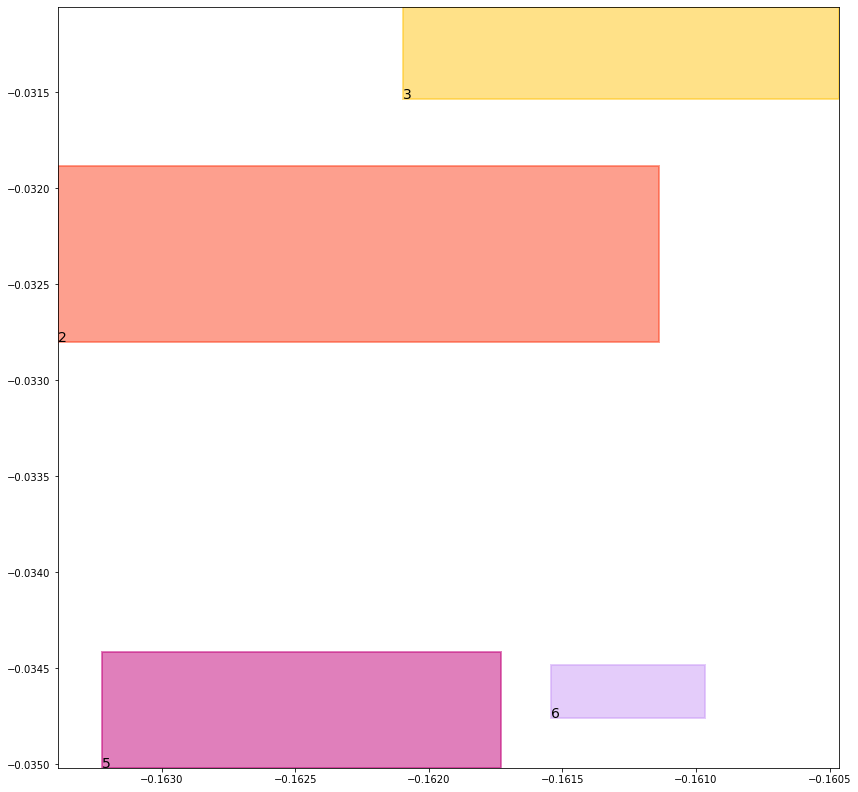

batch (tensor([[3, 5],
        [6, 2],
        [1, 2],
        [4, 6],
        [2, 6],
        [1, 3],
        [5, 3],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0126560963690281, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0115185845643282, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509804069995880, grad_fn=<MulBackward0>)
previous loss: tensor(0.2751550972461700, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04815448448061943 0.08836996555328369 tensor(0.8264833688735962) tensor(0.9572129845619202)
tensor(2) 0.43753981590270996 0.5216970443725586 tensor(0.4446973502635956) tensor(0.5280807614326477)
tensor(3) 0.40131473541259766 0.52970951795578 tensor(0.4191935658454895) tensor(0.5338386297225952)
tensor(4) 0.18241669237613678 0.04667317122220993 tensor(0.9645231366157532) tensor(0.9427233934402466)
tensor(5) 0.5570203065872192 0.5059815645217896 tensor(0.5698834657669067) tensor(0.5100549459457397)
tensor(6) 0.5923959016799927 0.5070933103561401 tensor(0.5929095745086670) tensor(0.5096567869186401)


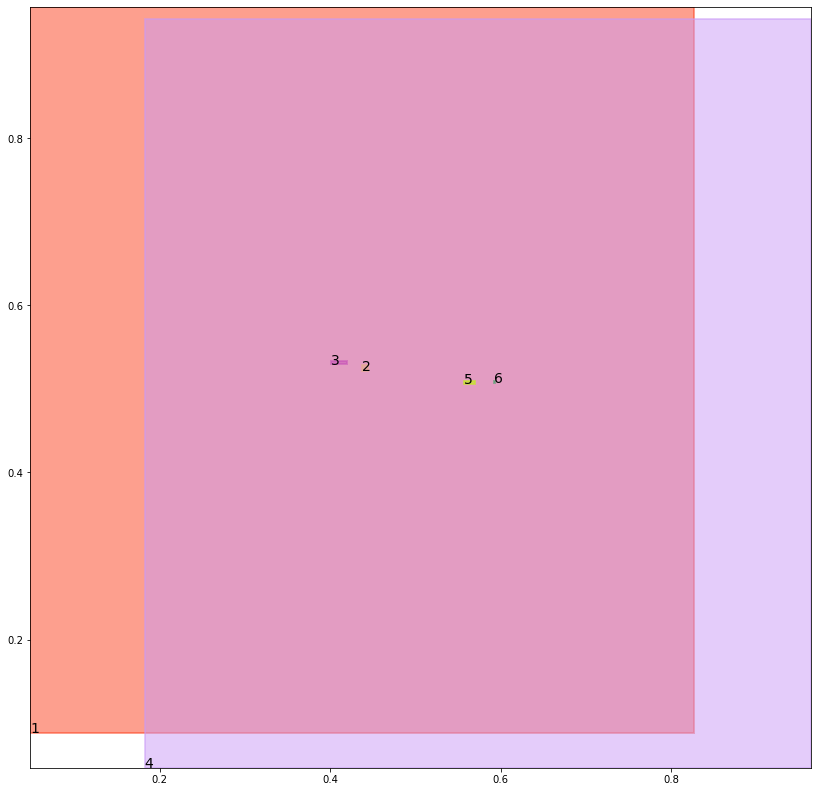

alignment data:
tensor(2) -0.16391190886497498 -0.043213099241256714 tensor(-0.1617676913738251) tensor(-0.0422987043857574)
tensor(3) -0.16291674971580505 -0.04211537539958954 tensor(-0.1610327661037445) tensor(-0.0415092706680298)
tensor(5) -0.16404661536216736 -0.04531261324882507 tensor(-0.1623671948909760) tensor(-0.0447199642658234)
tensor(6) -0.1623927652835846 -0.045115649700164795 tensor(-0.1616203486919403) tensor(-0.0447510480880737)


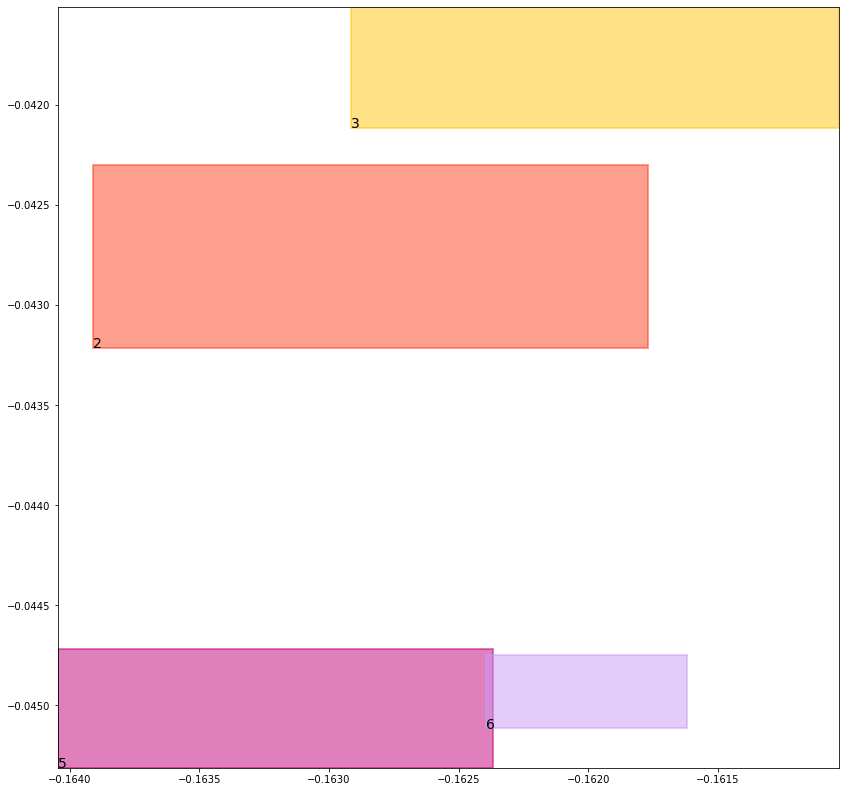

batch (tensor([[6, 2],
        [5, 3],
        [1, 2],
        [2, 6],
        [4, 6],
        [3, 5],
        [4, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0125345177948475, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0115194413810968, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509728372097015, grad_fn=<MulBackward0>)
previous loss: tensor(0.2750267982482910, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04803936555981636 0.08740013837814331 tensor(0.8276330232620239) tensor(0.9573301076889038)
tensor(2) 0.44023409485816956 0.5217006206512451 tensor(0.4437919259071350) tensor(0.5274574756622314)
tensor(3) 0.40266692638397217 0.5286421775817871 tensor(0.4202532470226288) tensor(0.5329153537750244)
tensor(4) 0.18001286685466766 0.04577229544520378 tensor(0.9646191596984863) tensor(0.9428260326385498)
tensor(5) 0.5528329610824585 0.506032407283783 tensor(0.5696038007736206) tensor(0.5095222592353821)
tensor(6) 0.5917960405349731 0.5062953233718872 tensor(0.5919302105903625) tensor(0.5088827013969421)


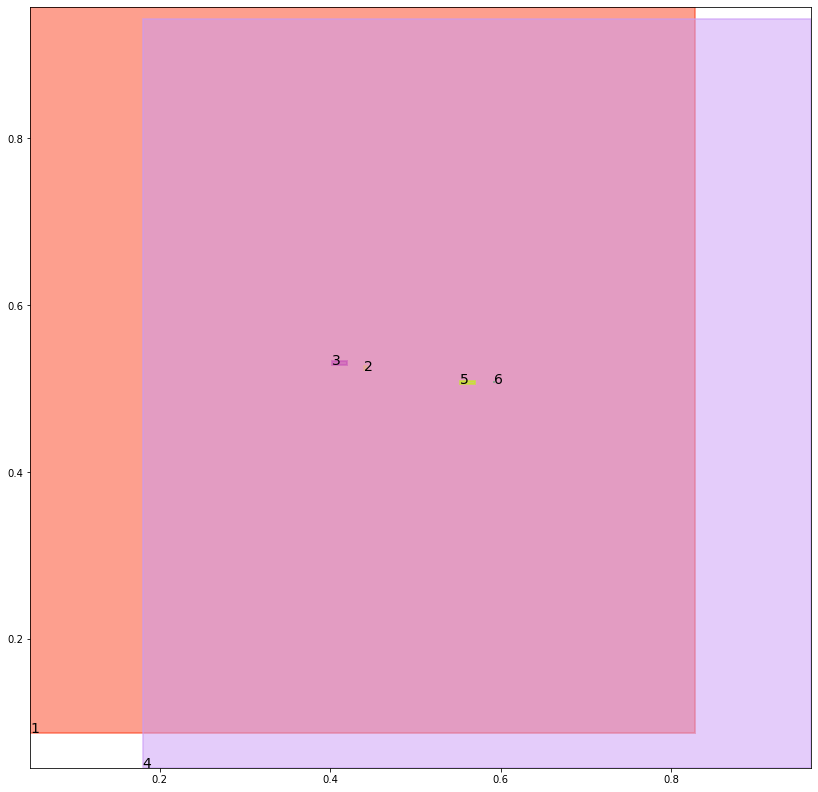

alignment data:
tensor(2) -0.16610553860664368 -0.062028199434280396 tensor(-0.1642681062221527) tensor(-0.0612076222896576)
tensor(3) -0.16545245051383972 -0.06112110614776611 tensor(-0.1635306179523468) tensor(-0.0604825913906097)
tensor(5) -0.1665421426296234 -0.06402096152305603 tensor(-0.1648827493190765) tensor(-0.0634947419166565)
tensor(6) -0.16500982642173767 -0.06390713155269623 tensor(-0.1642386615276337) tensor(-0.0635411888360977)


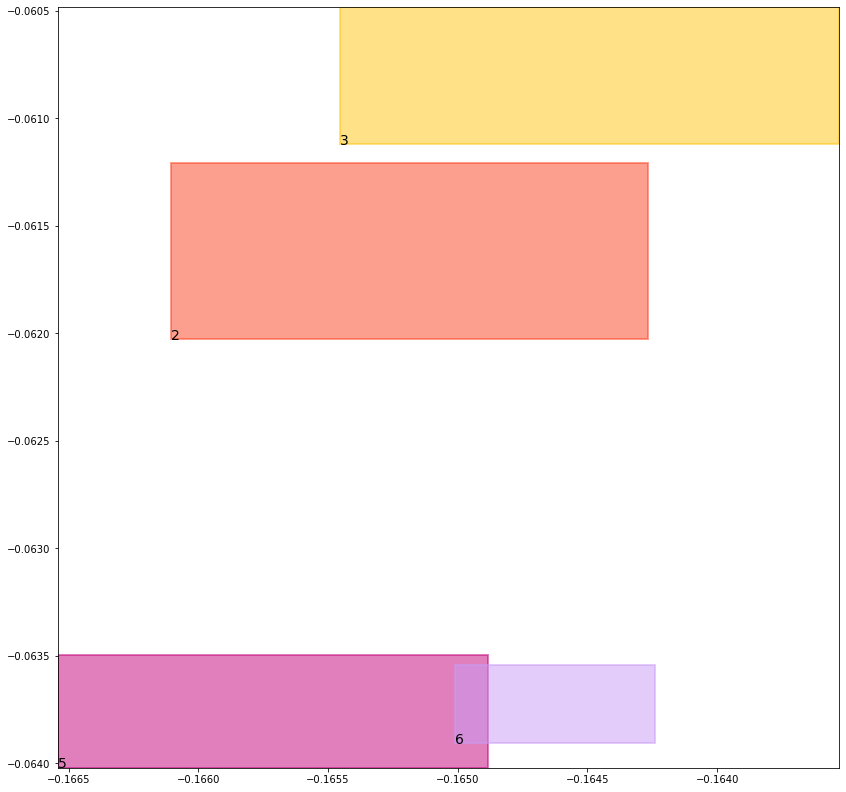

batch (tensor([[4, 5],
        [5, 3],
        [1, 2],
        [2, 6],
        [1, 3],
        [6, 2],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0123787987977266, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0114717353135347, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509727478027344, grad_fn=<MulBackward0>)
previous loss: tensor(0.2748232781887054, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04792793467640877 0.08644292503595352 tensor(0.8287711143493652) tensor(0.9574441909790039)
tensor(2) 0.44268059730529785 0.5221256613731384 tensor(0.4432931244373322) tensor(0.5267241597175598)
tensor(3) 0.4042908847332001 0.527903139591217 tensor(0.4210246205329895) tensor(0.5317248106002808)
tensor(4) 0.17763589322566986 0.044901277869939804 tensor(0.9647099971771240) tensor(0.9429259896278381)
tensor(5) 0.5495917797088623 0.5064234137535095 tensor(0.5685917735099792) tensor(0.5089218616485596)
tensor(6) 0.591119110584259 0.5056702494621277 tensor(0.5912055373191833) tensor(0.5077273249626160)


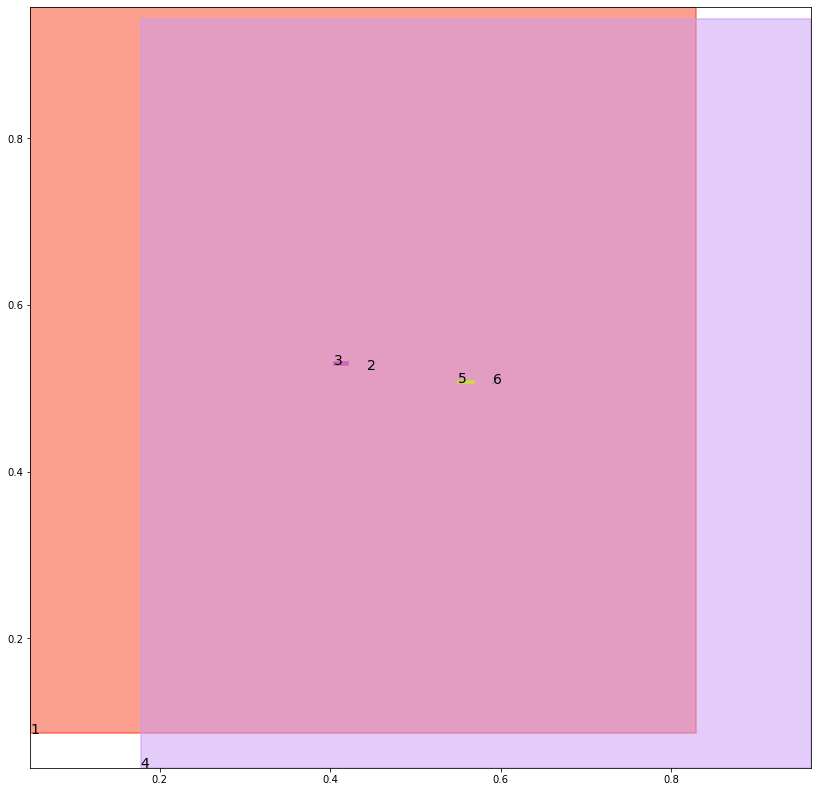

alignment data:
tensor(2) -0.16946986317634583 -0.0758078396320343 tensor(-0.1680753529071808) tensor(-0.0751602947711945)
tensor(3) -0.16917279362678528 -0.07510727643966675 tensor(-0.1674109995365143) tensor(-0.0745223164558411)
tensor(5) -0.17018172144889832 -0.0777045488357544 tensor(-0.1687304079532623) tensor(-0.0772988498210907)
tensor(6) -0.16886338591575623 -0.0776904821395874 tensor(-0.1682465374469757) tensor(-0.0774013996124268)


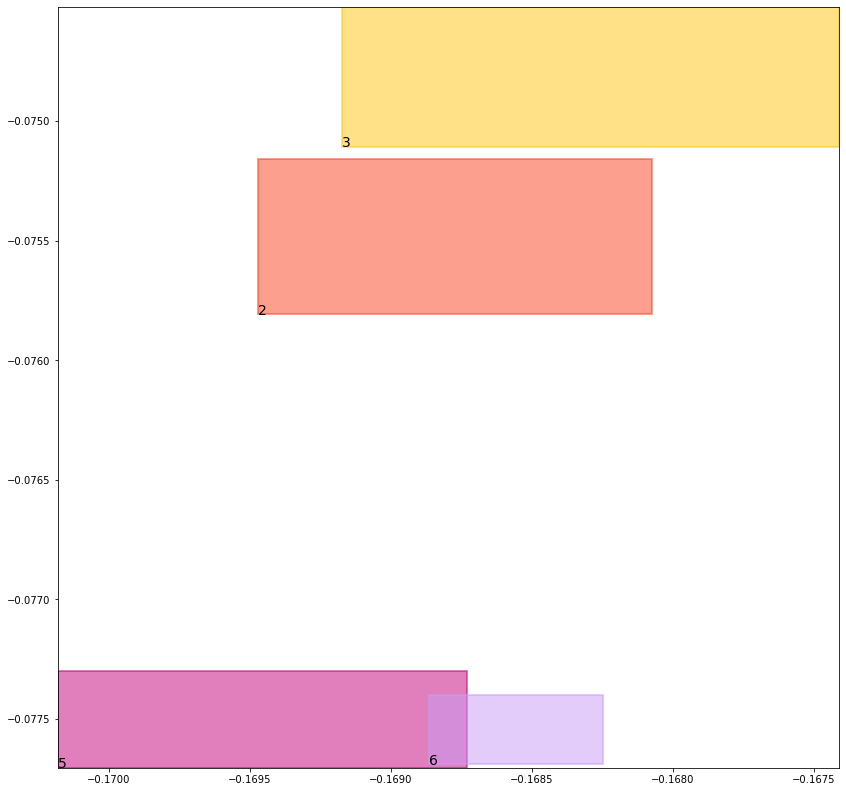

batch (tensor([[6, 2],
        [5, 3],
        [2, 6],
        [1, 2],
        [1, 3],
        [3, 5],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0122156152501702, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0113936690613627, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509790658950806, grad_fn=<MulBackward0>)
previous loss: tensor(0.2745883464813232, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.047819968312978745 0.0854988768696785 tensor(0.8298973441123962) tensor(0.9575553536415100)
tensor(2) 0.44193580746650696 0.5229190587997437 tensor(0.4454016387462616) tensor(0.5258907675743103)
tensor(3) 0.406158447265625 0.5274653434753418 tensor(0.4215332567691803) tensor(0.5302968621253967)
tensor(4) 0.17528684437274933 0.044059209525585175 tensor(0.9647960066795349) tensor(0.9430233836174011)
tensor(5) 0.5472202301025391 0.5071148872375488 tensor(0.5669200420379639) tensor(0.5082597732543945)
tensor(6) 0.5902460813522339 0.5052050948143005 tensor(0.5908356904983521) tensor(0.5062348842620850)


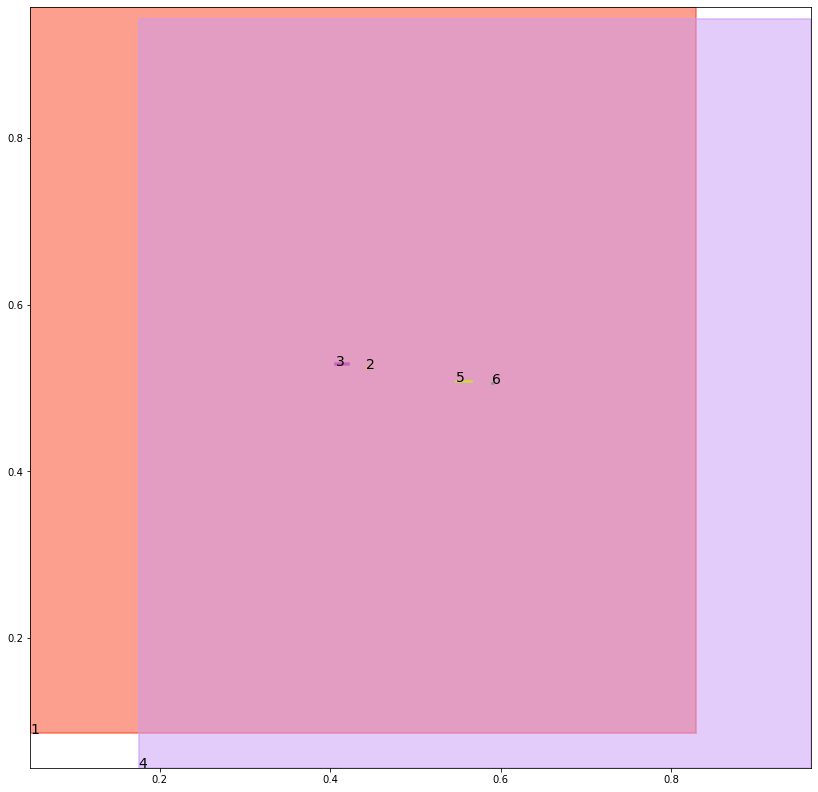

alignment data:
tensor(2) -0.1616978645324707 -0.09094196557998657 tensor(-0.1606770753860474) tensor(-0.0905146002769470)
tensor(3) -0.16165685653686523 -0.09044578671455383 tensor(-0.1602371931076050) tensor(-0.0899922549724579)
tensor(5) -0.16254734992980957 -0.09274005889892578 tensor(-0.1614742279052734) tensor(-0.0925049185752869)
tensor(6) -0.1615283489227295 -0.09284104406833649 tensor(-0.1611971855163574) tensor(-0.0926953107118607)


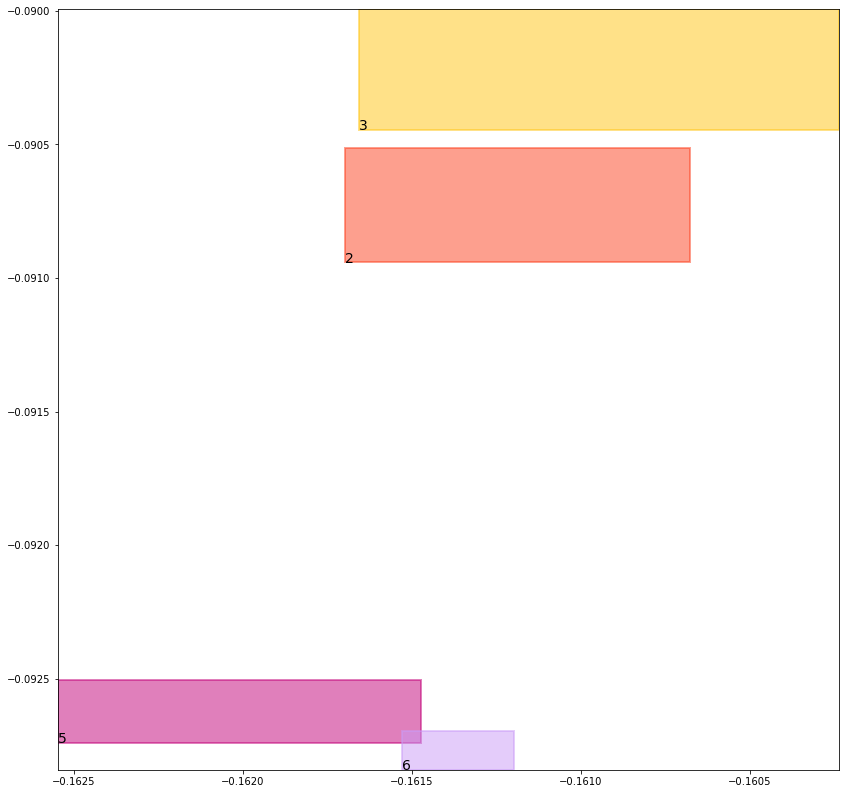

batch (tensor([[5, 3],
        [1, 3],
        [2, 6],
        [3, 5],
        [6, 2],
        [1, 2],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0121327778324485, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0112917590886354, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509900927543640, grad_fn=<MulBackward0>)
previous loss: tensor(0.2744146287441254, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04771517589688301 0.08456870913505554 tensor(0.8310126066207886) tensor(0.9576638936996460)
tensor(2) 0.44152575731277466 0.5240312218666077 tensor(0.4466352164745331) tensor(0.5249652862548828)
tensor(3) 0.40824347734451294 0.5273036360740662 tensor(0.4218033254146576) tensor(0.5286599993705750)
tensor(4) 0.17296740412712097 0.04324528947472572 tensor(0.9648776054382324) tensor(0.9431183934211731)
tensor(5) 0.5456429719924927 0.5075411200523376 tensor(0.5646581053733826) tensor(0.5080689787864685)
tensor(6) 0.5895739793777466 0.5044506192207336 tensor(0.5900766849517822) tensor(0.5048878192901611)


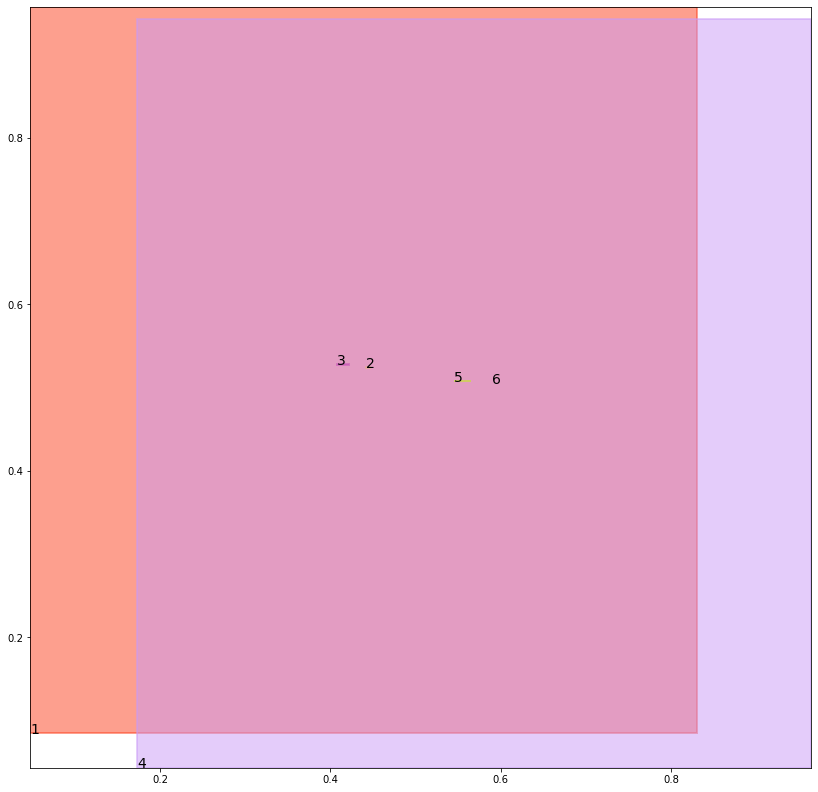

alignment data:
tensor(2) -0.15879395604133606 -0.10113227367401123 tensor(-0.1583229601383209) tensor(-0.1009787321090698)
tensor(3) -0.15903440117835999 -0.10084065794944763 tensor(-0.1581236422061920) tensor(-0.1005881875753403)
tensor(5) -0.15993186831474304 -0.10290771722793579 tensor(-0.1590699255466461) tensor(-0.1027433276176453)
tensor(6) -0.15924319624900818 -0.10312294960021973 tensor(-0.1590924561023712) tensor(-0.1030601859092712)


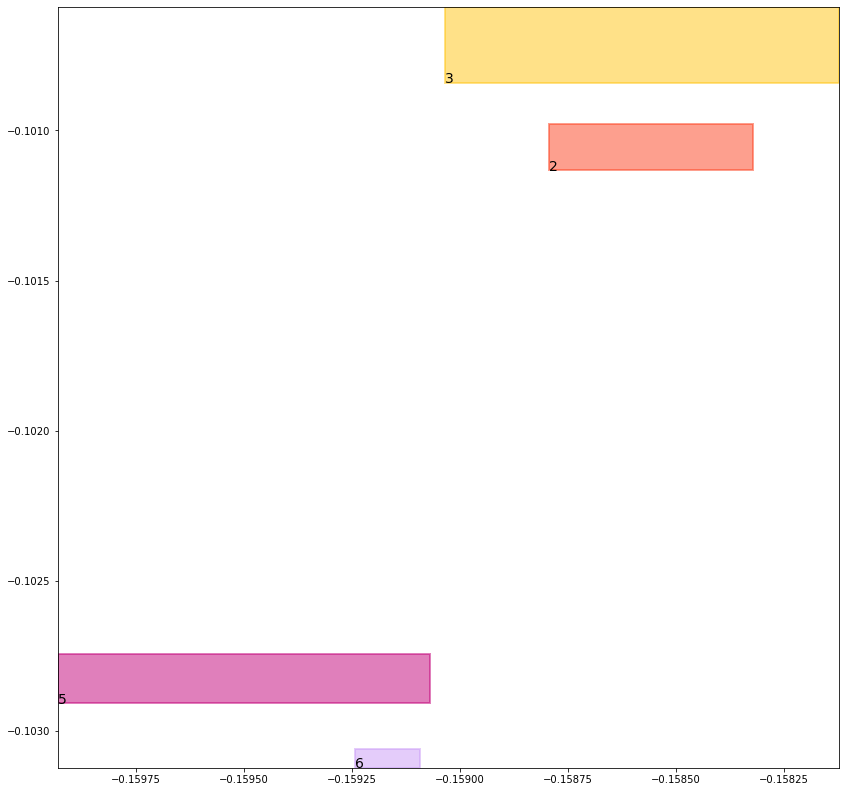

batch (tensor([[1, 2],
        [1, 3],
        [5, 3],
        [6, 2],
        [3, 5],
        [4, 5],
        [4, 6],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0120133385062218, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0111688189208508, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510018646717072, grad_fn=<MulBackward0>)
previous loss: tensor(0.2741840183734894, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04761332646012306 0.08365322649478912 tensor(0.8321174979209900) tensor(0.9577698707580566)
tensor(2) 0.4414207935333252 0.5239559412002563 tensor(0.4470700621604919) tensor(0.5254116654396057)
tensor(3) 0.41052135825157166 0.5268439054489136 tensor(0.4218572974205017) tensor(0.5273926258087158)
tensor(4) 0.17068006098270416 0.042458511888980865 tensor(0.9649552702903748) tensor(0.9432112574577332)
tensor(5) 0.5447864532470703 0.5069860219955444 tensor(0.5618720650672913) tensor(0.5085271596908569)
tensor(6) 0.5888873338699341 0.5031865835189819 tensor(0.5891610980033875) tensor(0.5044699311256409)


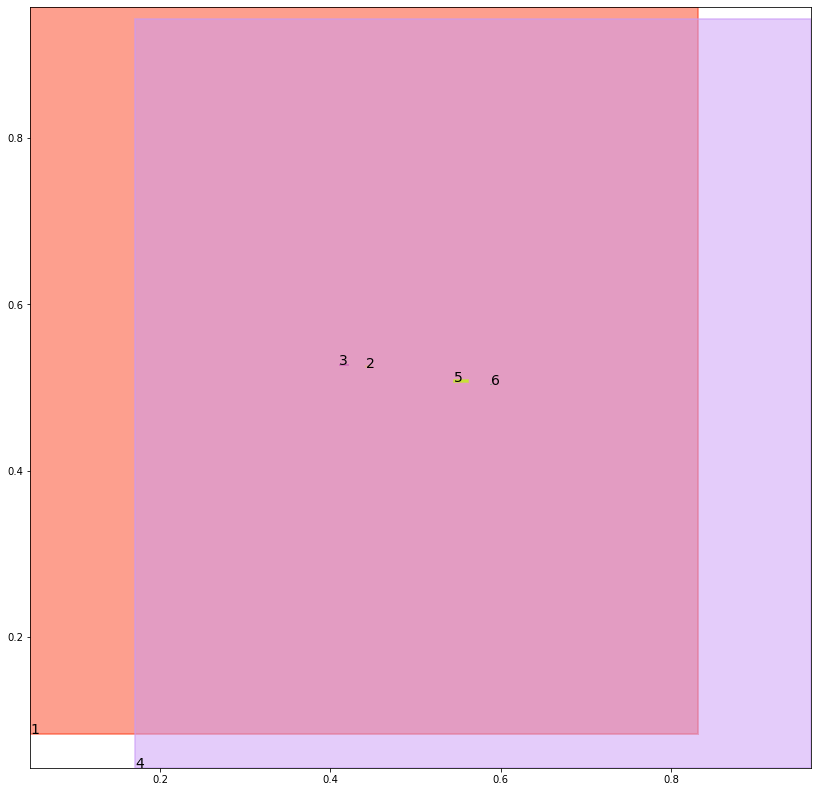

alignment data:
tensor(2) -0.14698350429534912 -0.11308759450912476 tensor(-0.1463327407836914) tensor(-0.1128560602664948)
tensor(3) -0.14724695682525635 -0.11287224292755127 tensor(-0.1466617584228516) tensor(-0.1127316355705261)
tensor(5) -0.1483224630355835 -0.11480623483657837 tensor(-0.1472234725952148) tensor(-0.1144967526197433)
tensor(6) -0.1478484869003296 -0.11506955325603485 tensor(-0.1474485397338867) tensor(-0.1148927062749863)


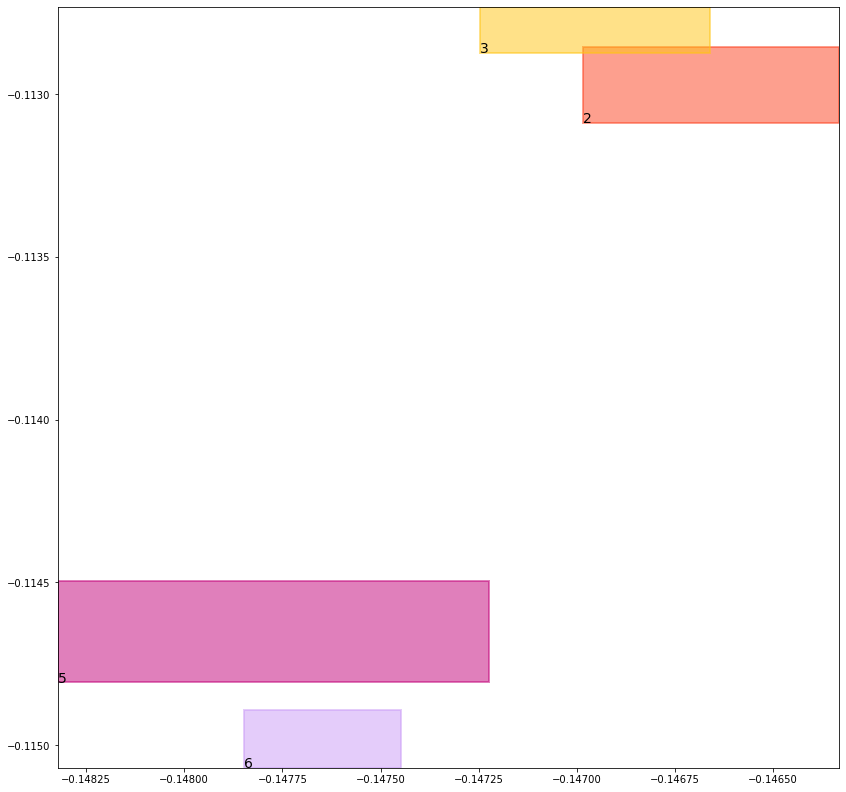

batch (tensor([[5, 3],
        [3, 5],
        [1, 2],
        [2, 6],
        [4, 5],
        [4, 6],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0119053162634373, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0110538154840469, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509974837303162, grad_fn=<MulBackward0>)
previous loss: tensor(0.2739566266536713, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.047514207661151886 0.08275250345468521 tensor(0.8332115411758423) tensor(0.9578735232353210)
tensor(2) 0.4415936768054962 0.5231733918190002 tensor(0.4467813670635223) tensor(0.5261826515197754)
tensor(3) 0.4129689931869507 0.5254291296005249 tensor(0.4217161834239960) tensor(0.5271466970443726)
tensor(4) 0.16842760145664215 0.04169744625687599 tensor(0.9650291800498962) tensor(0.9433021545410156)
tensor(5) 0.5445793867111206 0.5065799355506897 tensor(0.5586245059967041) tensor(0.5085207819938660)
tensor(6) 0.5881323218345642 0.5024070739746094 tensor(0.5884853601455688) tensor(0.5039632320404053)


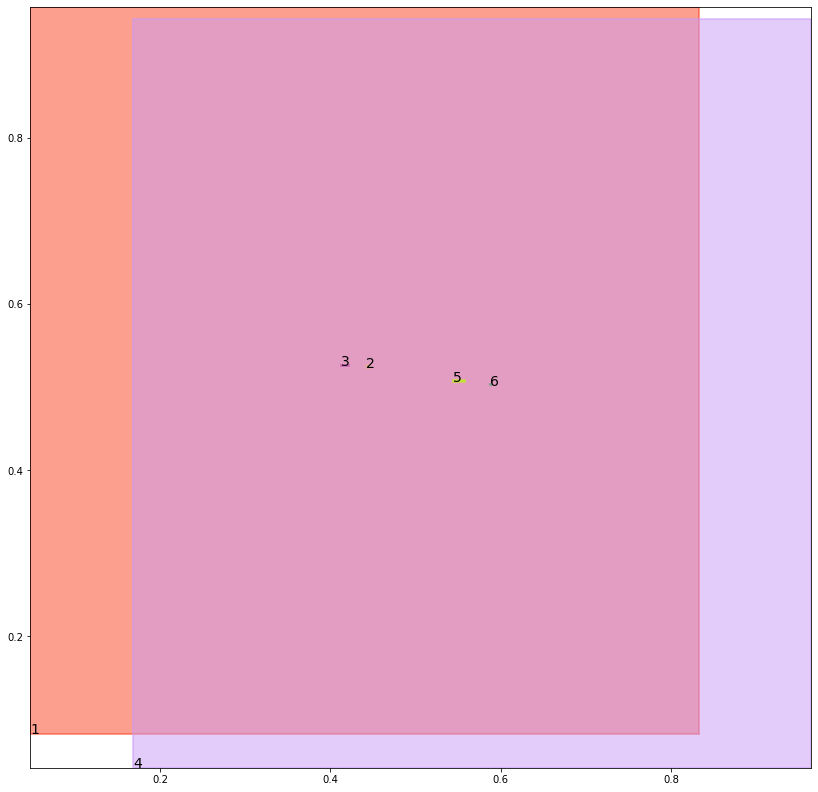

alignment data:
tensor(2) -0.12747055292129517 -0.11998060345649719 tensor(-0.1263605952262878) tensor(-0.1195392459630966)
tensor(3) -0.12784093618392944 -0.11987006664276123 tensor(-0.1269933581352234) tensor(-0.1195789873600006)
tensor(5) -0.1287250518798828 -0.12152257561683655 tensor(-0.1276135444641113) tensor(-0.1211654245853424)
tensor(6) -0.12838774919509888 -0.12179073691368103 tensor(-0.1278998255729675) tensor(-0.1215782910585403)


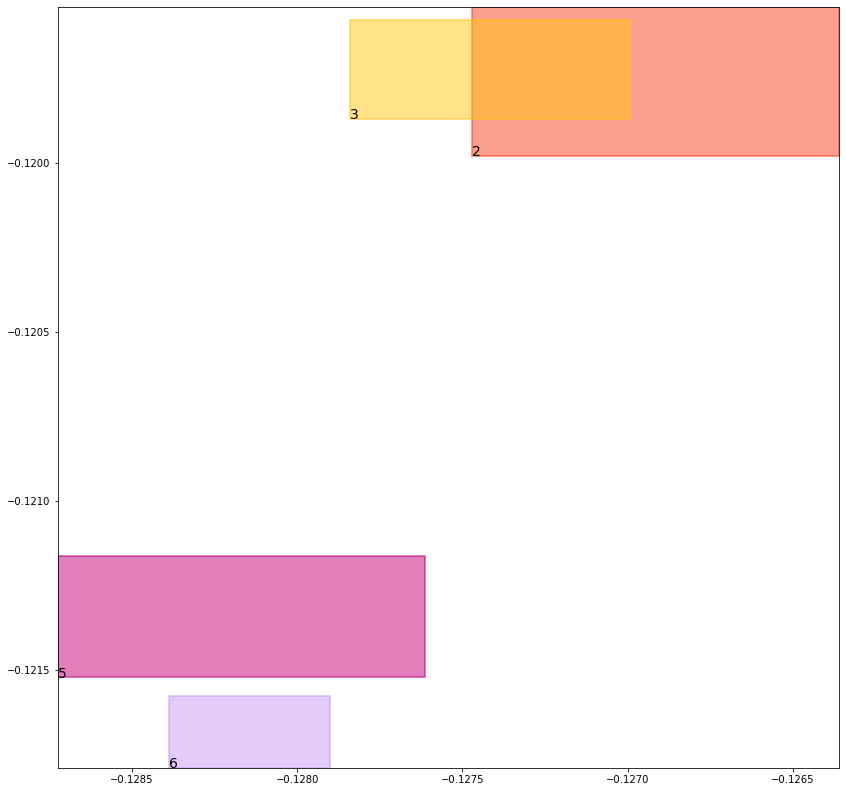

batch (tensor([[4, 5],
        [5, 3],
        [1, 3],
        [2, 6],
        [6, 2],
        [3, 5],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0118081402033567, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0109174279496074, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509887218475342, grad_fn=<MulBackward0>)
previous loss: tensor(0.2737143039703369, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.047417644411325455 0.08186593651771545 tensor(0.8342943787574768) tensor(0.9579751491546631)
tensor(2) 0.44201934337615967 0.5225971937179565 tensor(0.4458427429199219) tensor(0.5263873934745789)
tensor(3) 0.4155651330947876 0.5243858098983765 tensor(0.4213993549346924) tensor(0.5265971422195435)
tensor(4) 0.16621294617652893 0.04096091911196709 tensor(0.9650996923446655) tensor(0.9433912634849548)
tensor(5) 0.544952929019928 0.5063073635101318 tensor(0.5549758672714233) tensor(0.5080906152725220)
tensor(6) 0.587571382522583 0.5020689368247986 tensor(0.5877689123153687) tensor(0.5033789873123169)


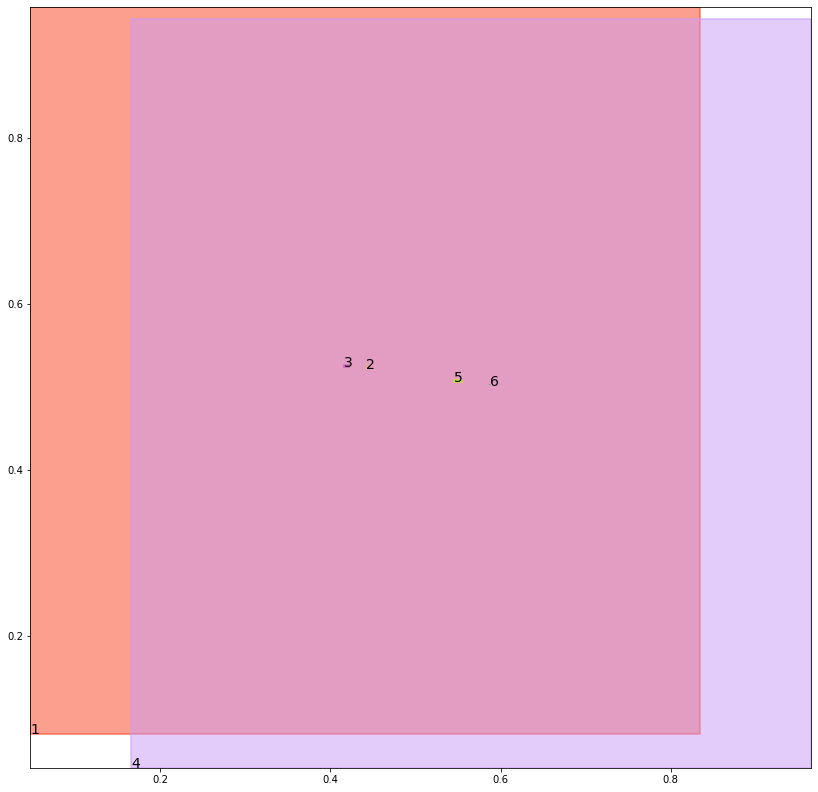

alignment data:
tensor(2) -0.104667067527771 -0.12176886200904846 tensor(-0.1033644676208496) tensor(-0.1212339848279953)
tensor(3) -0.10510116815567017 -0.12173512578010559 tensor(-0.1042074561119080) tensor(-0.1213952004909515)
tensor(5) -0.1058349609375 -0.12314401566982269 tensor(-0.1049168109893799) tensor(-0.1228286921977997)
tensor(6) -0.10555100440979004 -0.12337924540042877 tensor(-0.1051424741744995) tensor(-0.1232030987739563)


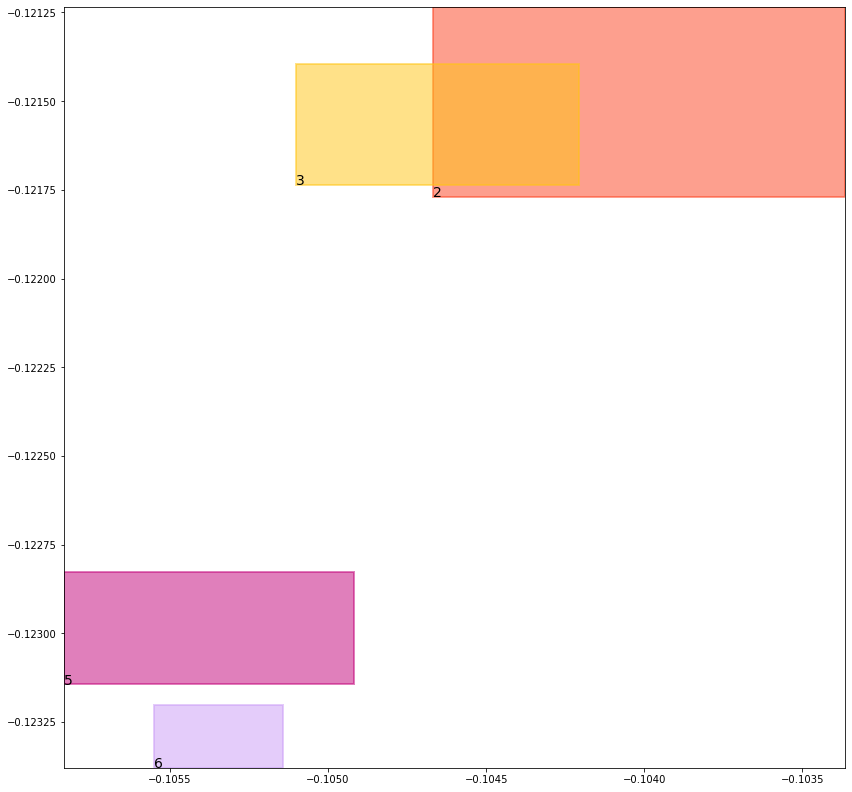

batch (tensor([[6, 2],
        [2, 6],
        [5, 3],
        [1, 2],
        [1, 3],
        [4, 6],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0116776274517179, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0107562672346830, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509874999523163, grad_fn=<MulBackward0>)
previous loss: tensor(0.2734214067459106, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04732349514961243 0.08099321275949478 tensor(0.8353648185729980) tensor(0.9580749273300171)
tensor(2) 0.44267481565475464 0.5222093462944031 tensor(0.4443261623382568) tensor(0.5260716676712036)
tensor(3) 0.4182901382446289 0.5236850380897522 tensor(0.4209246039390564) tensor(0.5257727503776550)
tensor(4) 0.1640392243862152 0.04024796932935715 tensor(0.9651671648025513) tensor(0.9434789419174194)
tensor(5) 0.5458413362503052 0.5061544179916382 tensor(0.5509830713272095) tensor(0.5072770118713379)
tensor(6) 0.586934506893158 0.5021287202835083 tensor(0.5869410037994385) tensor(0.5027260780334473)


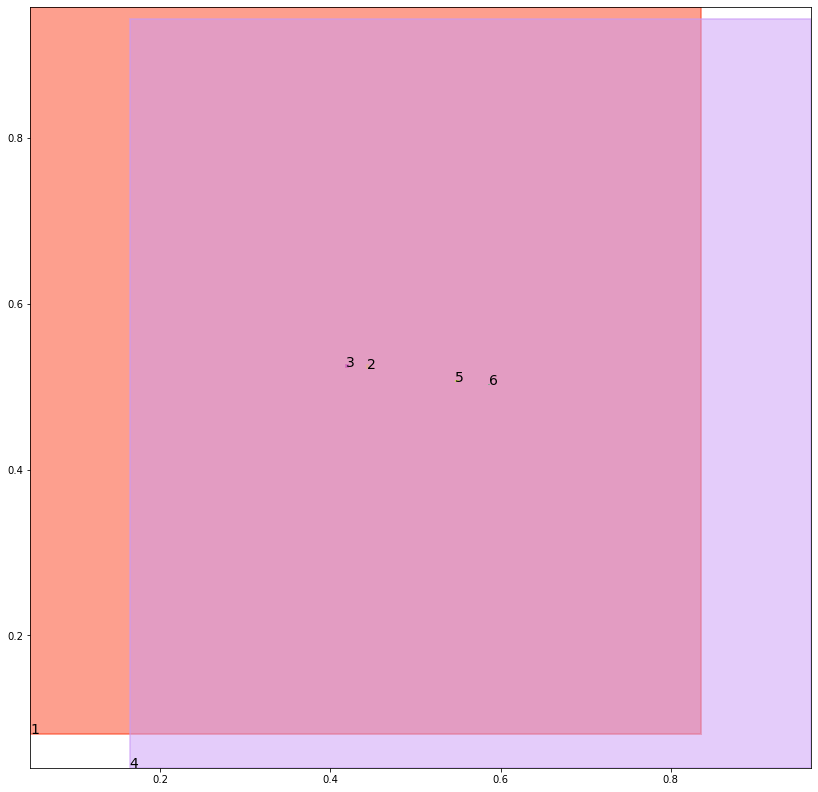

alignment data:
tensor(2) -0.07889240980148315 -0.11890305578708649 tensor(-0.0776444673538208) tensor(-0.1183803081512451)
tensor(3) -0.07934921979904175 -0.11892032623291016 tensor(-0.0786097049713135) tensor(-0.1186226606369019)
tensor(5) -0.07997322082519531 -0.1201215535402298 tensor(-0.0794364809989929) tensor(-0.1199291646480560)
tensor(6) -0.07967597246170044 -0.12029498815536499 tensor(-0.0794922113418579) tensor(-0.1202163398265839)


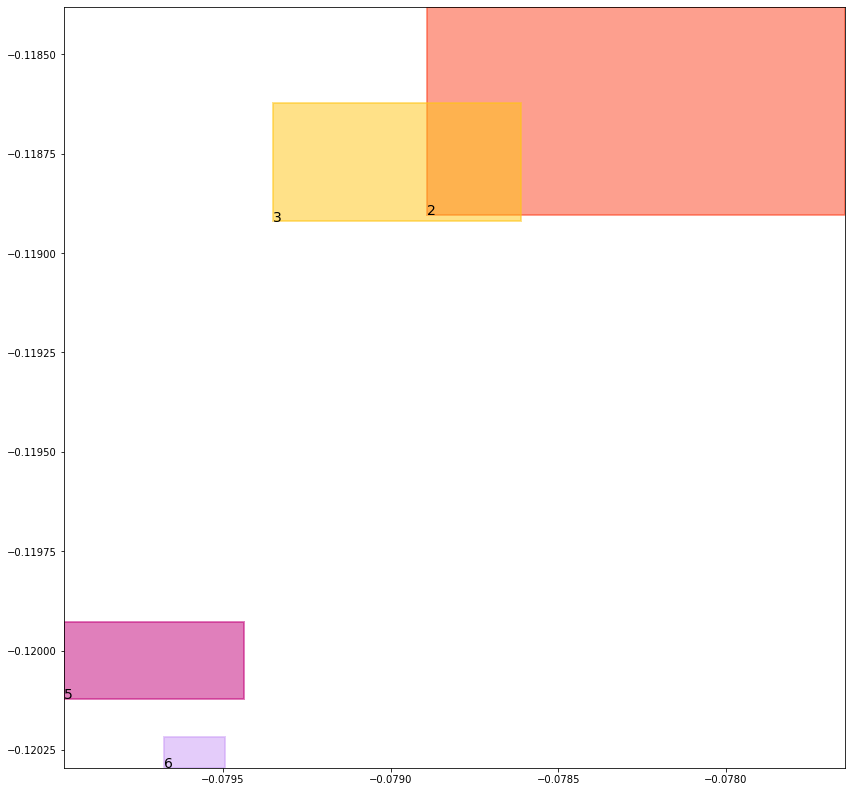

batch (tensor([[4, 6],
        [3, 5],
        [4, 5],
        [6, 2],
        [1, 2],
        [2, 6],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0115176495164633, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0105754081159830, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509933710098267, grad_fn=<MulBackward0>)
previous loss: tensor(0.2730864286422729, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04723162204027176 0.08013416826725006 tensor(0.8364220261573792) tensor(0.9581729769706726)
tensor(2) 0.44230127334594727 0.5219934582710266 tensor(0.4435384571552277) tensor(0.5252836942672729)
tensor(3) 0.42030850052833557 0.5232985615730286 tensor(0.4211254417896271) tensor(0.5247000455856323)
tensor(4) 0.161909282207489 0.039557795971632004 tensor(0.9652316570281982) tensor(0.9435650110244751)
tensor(5) 0.5466997623443604 0.5061087608337402 tensor(0.5471823811531067) tensor(0.5061194896697998)
tensor(6) 0.5856931209564209 0.5020115375518799 tensor(0.5865473151206970) tensor(0.5025438070297241)


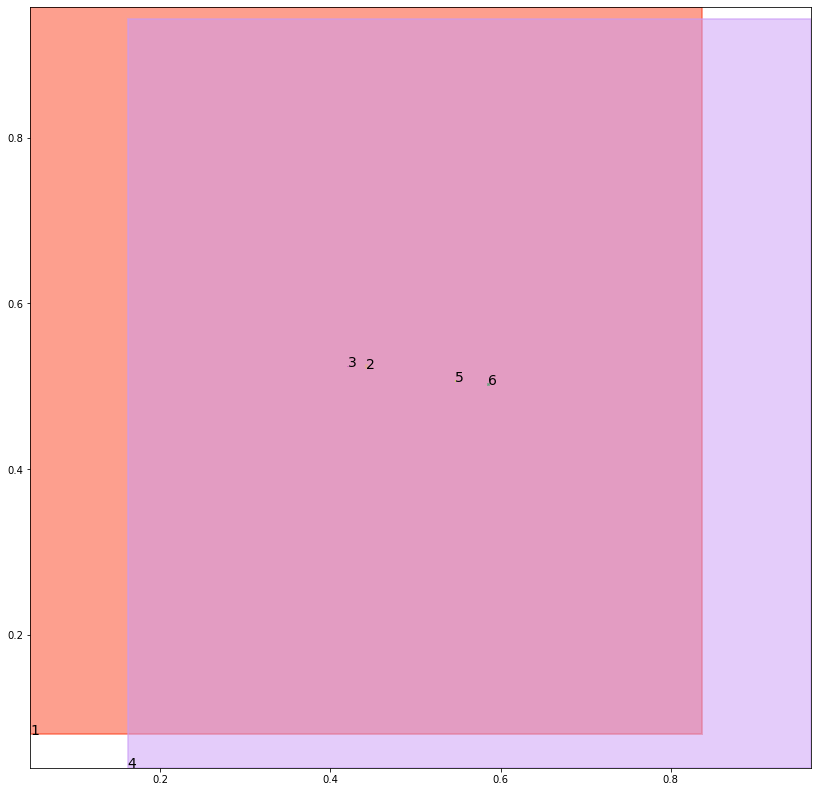

alignment data:
tensor(2) -0.053998351097106934 -0.11980287730693817 tensor(-0.0529387593269348) tensor(-0.1193634271621704)
tensor(3) -0.05442321300506592 -0.11984384059906006 tensor(-0.0539610385894775) tensor(-0.1196538954973221)
tensor(5) -0.054964661598205566 -0.12086763978004456 tensor(-0.0549433231353760) tensor(-0.1208616197109222)
tensor(6) -0.0547603964805603 -0.12102675437927246 tensor(-0.0545644760131836) tensor(-0.1209494173526764)


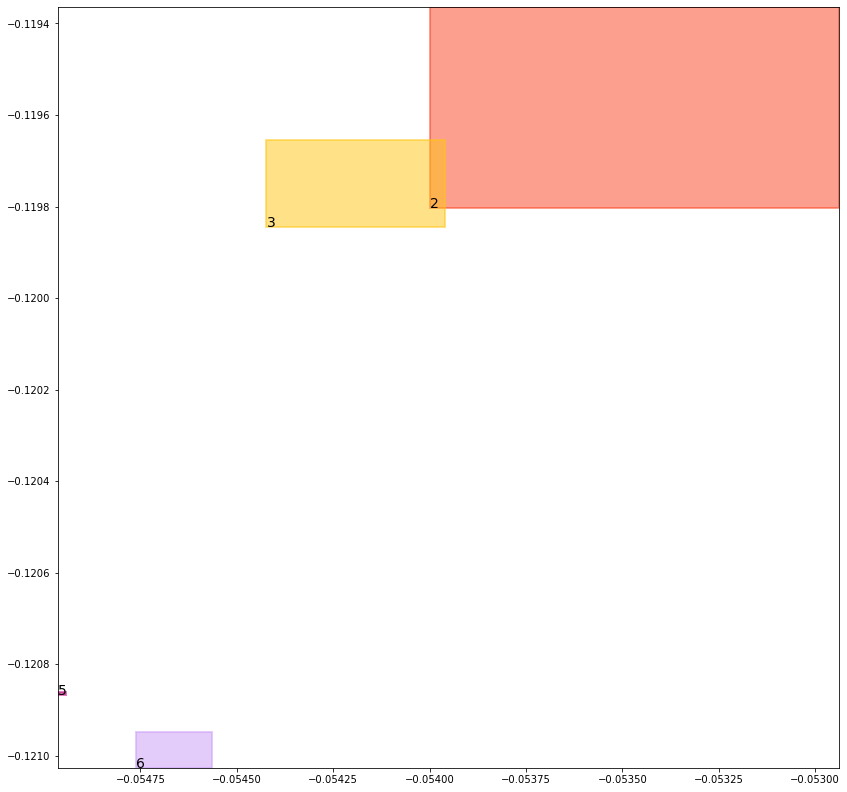

batch (tensor([[3, 5],
        [4, 5],
        [1, 2],
        [6, 2],
        [1, 3],
        [5, 3],
        [4, 6],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0114004705101252, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0104216597974300, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510005831718445, grad_fn=<MulBackward0>)
previous loss: tensor(0.2728227078914642, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.047141868621110916 0.07928880304098129 tensor(0.8374655842781067) tensor(0.9582692980766296)
tensor(2) 0.44109296798706055 0.5219340324401855 tensor(0.4440398812294006) tensor(0.5240758657455444)
tensor(3) 0.4200376868247986 0.523199200630188 tensor(0.4234661161899567) tensor(0.5234033465385437)
tensor(4) 0.1598248928785324 0.03888958320021629 tensor(0.9652934670448303) tensor(0.9436497092247009)
tensor(5) 0.5437362790107727 0.5046568512916565 tensor(0.5480288267135620) tensor(0.5061591863632202)
tensor(6) 0.5848759412765503 0.5014750957489014 tensor(0.5858952403068542) tensor(0.5025137066841125)


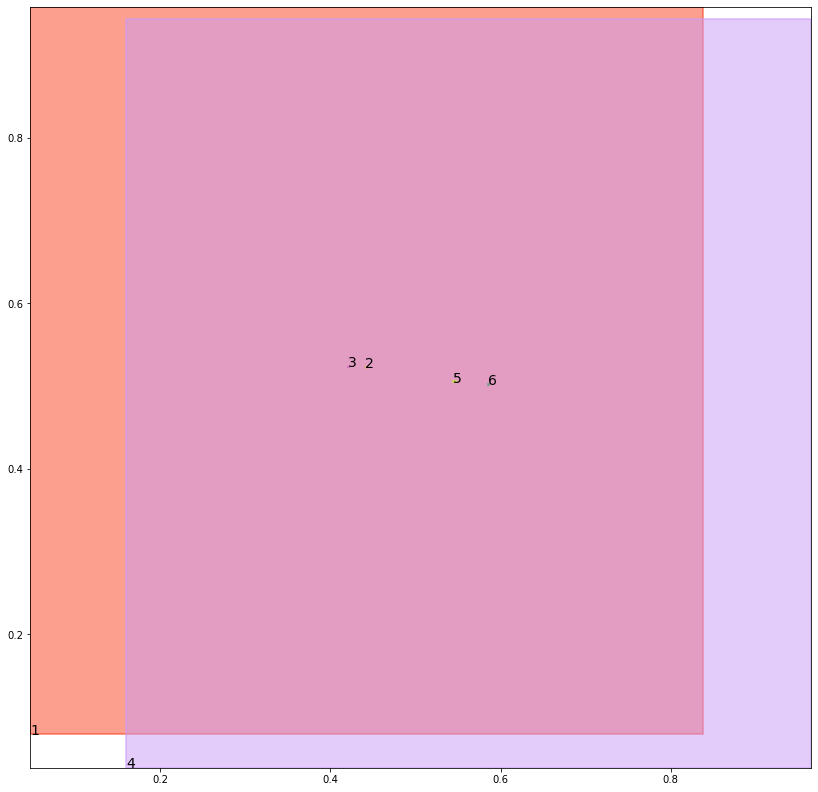

alignment data:
tensor(2) -0.039834022521972656 -0.12002977728843689 tensor(-0.0390617251396179) tensor(-0.1197242289781570)
tensor(3) -0.040241897106170654 -0.1200871467590332 tensor(-0.0400488972663879) tensor(-0.1200251877307892)
tensor(5) -0.04127222299575806 -0.12117543816566467 tensor(-0.0406460762023926) tensor(-0.1209379136562347)
tensor(6) -0.041351258754730225 -0.12118400633335114 tensor(-0.0410100817680359) tensor(-0.1210409402847290)


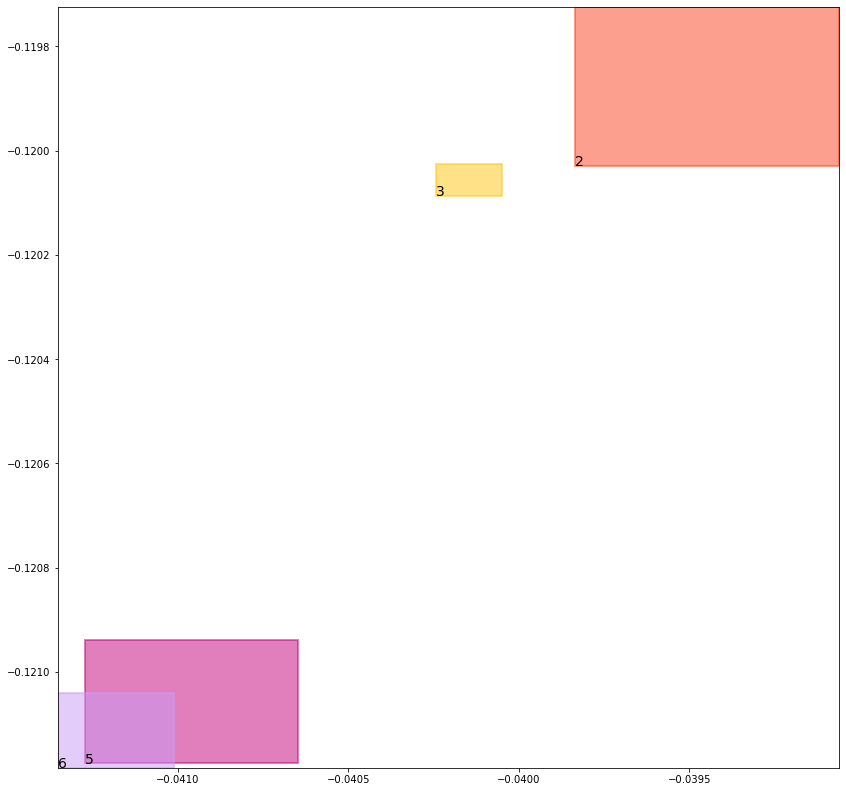

batch (tensor([[2, 6],
        [4, 5],
        [5, 3],
        [1, 3],
        [4, 6],
        [3, 5],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0113828070461750, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0104190101847053, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510001063346863, grad_fn=<MulBackward0>)
previous loss: tensor(0.2728019356727600, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.047053974121809006 0.07845723628997803 tensor(0.8384965658187866) tensor(0.9583641290664673)
tensor(2) 0.4406314790248871 0.5220108032226562 tensor(0.4442127645015717) tensor(0.5224876403808594)
tensor(3) 0.42008110880851746 0.5219133496284485 tensor(0.4253523349761963) tensor(0.5233528614044189)
tensor(4) 0.15778402984142303 0.03824205324053764 tensor(0.9653530120849609) tensor(0.9437331557273865)
tensor(5) 0.5419842004776001 0.5036546587944031 tensor(0.5484223365783691) tensor(0.5060772299766541)
tensor(6) 0.5844507217407227 0.5011052489280701 tensor(0.5850005149841309) tensor(0.5020834803581238)


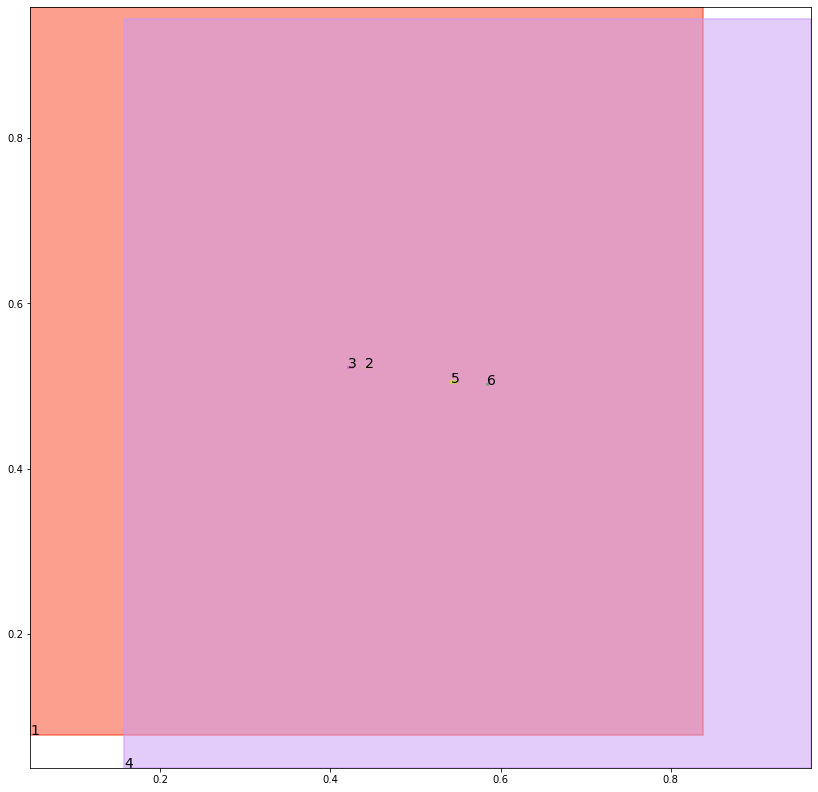

alignment data:
tensor(2) -0.0363956093788147 -0.12427306175231934 tensor(-0.0361114144325256) tensor(-0.1241724491119385)
tensor(3) -0.0372123122215271 -0.12451642751693726 tensor(-0.0365663766860962) tensor(-0.1242748498916626)
tensor(5) -0.038180530071258545 -0.12545883655548096 tensor(-0.0371864438056946) tensor(-0.1250796020030975)
tensor(6) -0.0373416543006897 -0.12530434131622314 tensor(-0.0370187163352966) tensor(-0.1251742988824844)


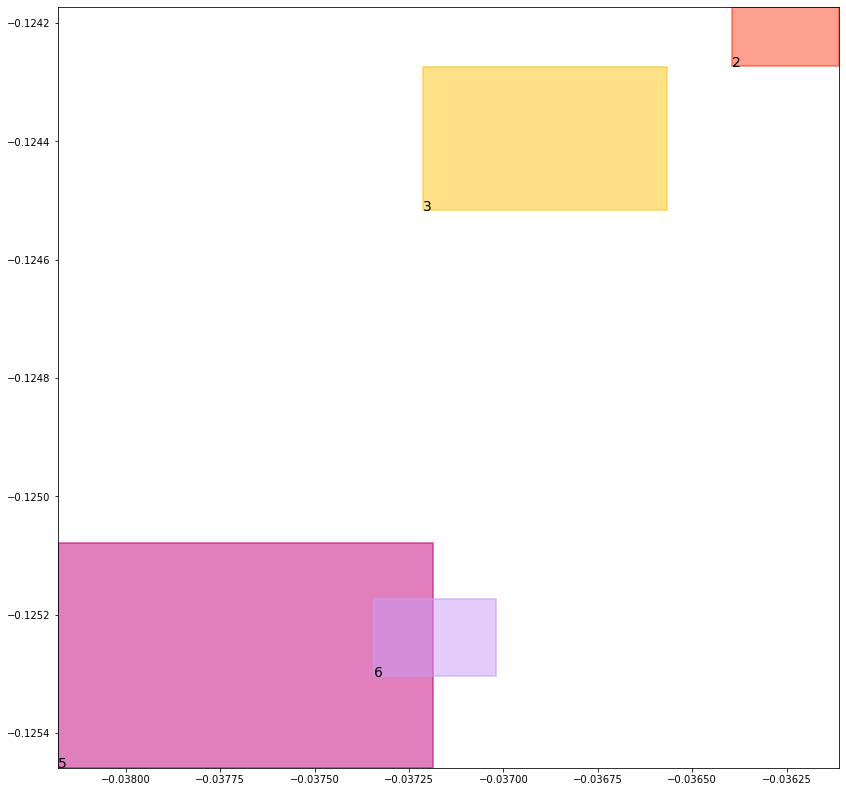

batch (tensor([[5, 3],
        [2, 6],
        [4, 6],
        [4, 5],
        [6, 2],
        [1, 2],
        [1, 3],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0113563453778625, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0103709809482098, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509939074516296, grad_fn=<MulBackward0>)
previous loss: tensor(0.2727212309837341, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0469677560031414 0.07763916999101639 tensor(0.8395158648490906) tensor(0.9584575295448303)
tensor(2) 0.4408521056175232 0.5205833911895752 tensor(0.4440896809101105) tensor(0.5222148299217224)
tensor(3) 0.4204103648662567 0.5208155512809753 tensor(0.4268217682838440) tensor(0.5231794714927673)
tensor(4) 0.15578605234622955 0.03761420026421547 tensor(0.9654102325439453) tensor(0.9438154101371765)
tensor(5) 0.5413308143615723 0.5030713081359863 tensor(0.5484029054641724) tensor(0.5058745741844177)
tensor(6) 0.5838886499404907 0.5008828043937683 tensor(0.5843744874000549) tensor(0.5012651681900024)


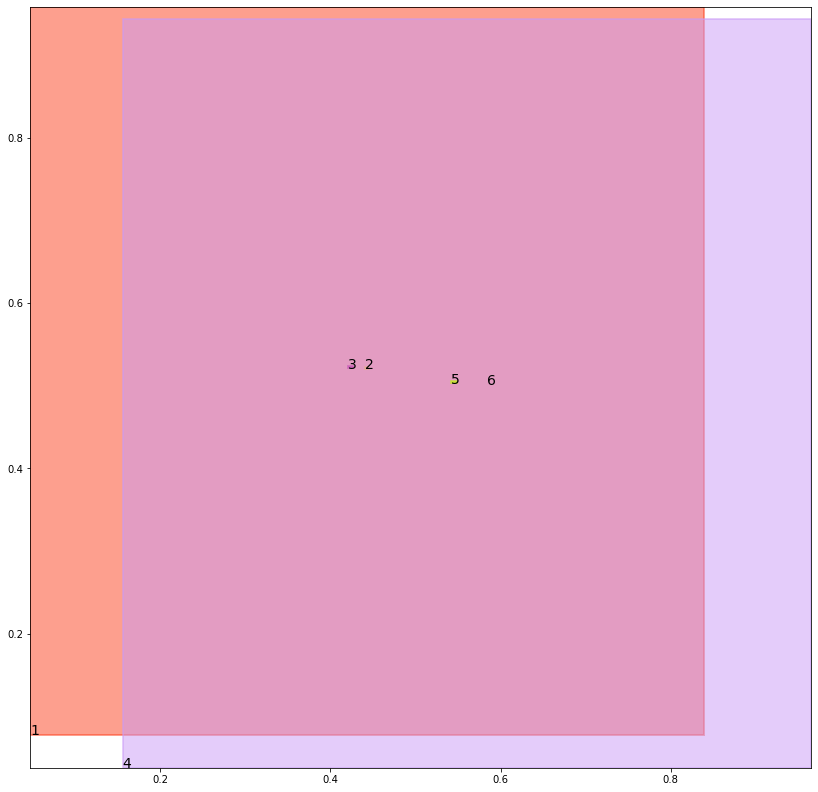

alignment data:
tensor(2) -0.029288172721862793 -0.13712039589881897 tensor(-0.0286593437194824) tensor(-0.1368774324655533)
tensor(3) -0.030007481575012207 -0.13733673095703125 tensor(-0.0290297865867615) tensor(-0.1369640827178955)
tensor(5) -0.03080505132675171 -0.13810469210147858 tensor(-0.0296661257743835) tensor(-0.1376691311597824)
tensor(6) -0.029833734035491943 -0.13786755502223969 tensor(-0.0296968221664429) tensor(-0.1378138810396194)


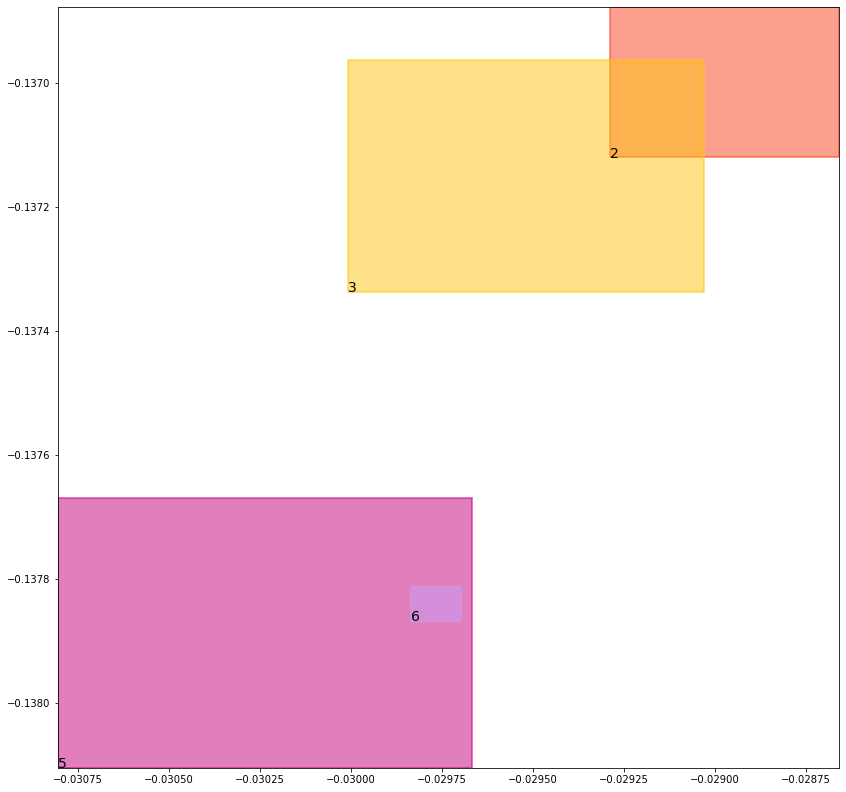

batch (tensor([[4, 6],
        [3, 5],
        [4, 5],
        [5, 3],
        [2, 6],
        [1, 2],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0113303652033210, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0102966958656907, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509872913360596, grad_fn=<MulBackward0>)
previous loss: tensor(0.2726143598556519, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.046883050352334976 0.07683387398719788 tensor(0.8405237197875977) tensor(0.9585494995117188)
tensor(2) 0.44169268012046814 0.5192432999610901 tensor(0.4437000453472137) tensor(0.5222285985946655)
tensor(3) 0.4209992587566376 0.520079493522644 tensor(0.4279100298881531) tensor(0.5227091312408447)
tensor(4) 0.15383127331733704 0.037005189806222916 tensor(0.9654655456542969) tensor(0.9438967704772949)
tensor(5) 0.5416627526283264 0.5028647780418396 tensor(0.5480074882507324) tensor(0.5055619478225708)
tensor(6) 0.5830656886100769 0.5000997185707092 tensor(0.5838074684143066) tensor(0.5007907152175903)


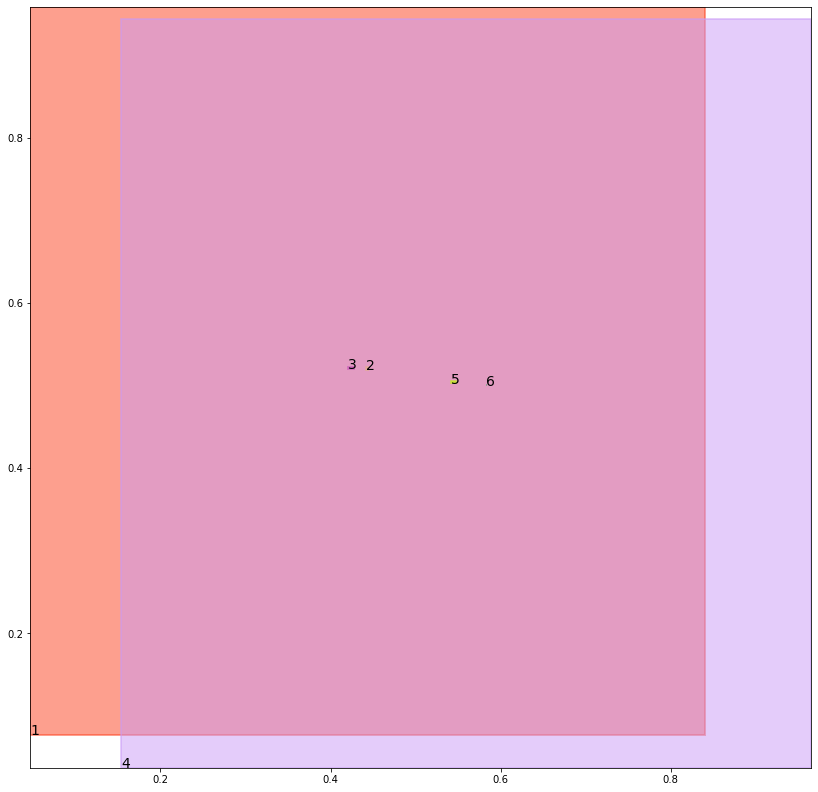

alignment data:
tensor(2) -0.02550673484802246 -0.1485603302717209 tensor(-0.0245067477226257) tensor(-0.1481657773256302)
tensor(3) -0.026058733463287354 -0.14872029423713684 tensor(-0.0249765515327454) tensor(-0.1483072936534882)
tensor(5) -0.02664846181869507 -0.14931276440620422 tensor(-0.0255675911903381) tensor(-0.1488986313343048)
tensor(6) -0.02596181631088257 -0.14923050999641418 tensor(-0.0257366299629211) tensor(-0.1491574943065643)


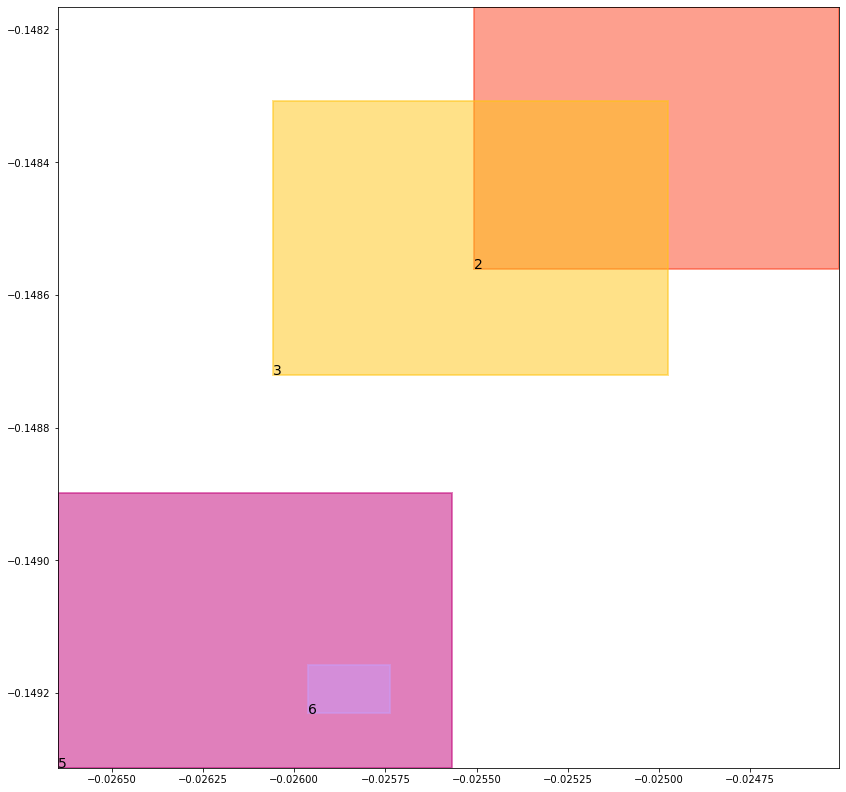

batch (tensor([[1, 3],
        [4, 5],
        [6, 2],
        [4, 6],
        [1, 2],
        [3, 5],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0112758707255125, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0102116949856281, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509825229644775, grad_fn=<MulBackward0>)
previous loss: tensor(0.2724700868129730, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04679974541068077 0.07604079693555832 tensor(0.8415203690528870) tensor(0.9586402177810669)
tensor(2) 0.4430713653564453 0.518422544002533 tensor(0.4430928826332092) tensor(0.5220676064491272)
tensor(3) 0.4218234121799469 0.519676685333252 tensor(0.4286507070064545) tensor(0.5219712853431702)
tensor(4) 0.1519203931093216 0.03641417622566223 tensor(0.9655191302299500) tensor(0.9439771175384521)
tensor(5) 0.5428678393363953 0.5029944181442261 tensor(0.5472707748413086) tensor(0.5051487684249878)
tensor(6) 0.5825051069259644 0.49941393733024597 tensor(0.5827934145927429) tensor(0.5005710721015930)


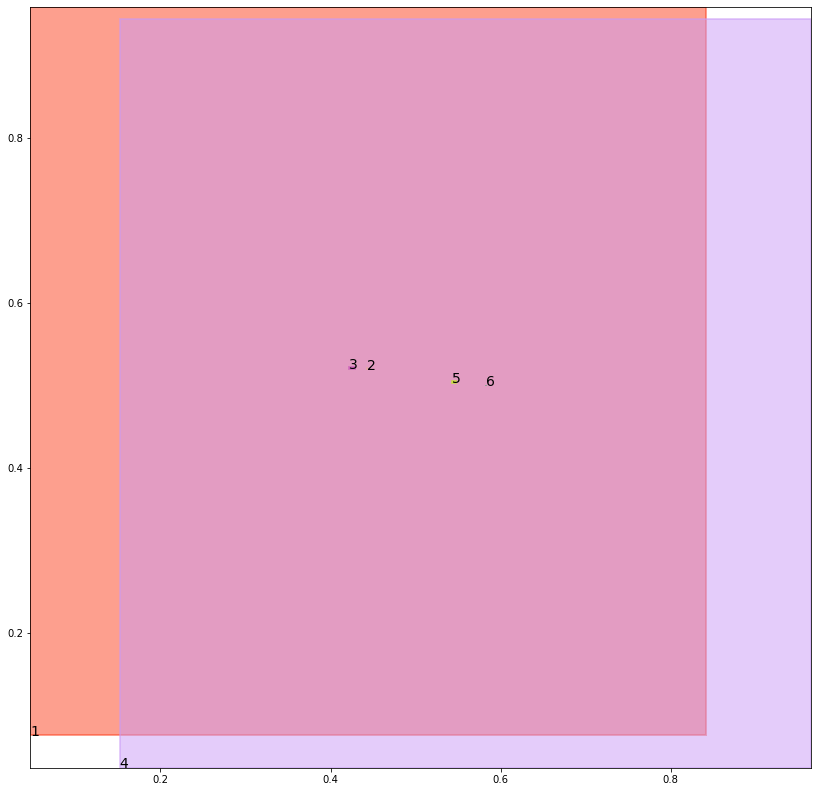

alignment data:
tensor(2) -0.026766538619995117 -0.15762865543365479 tensor(-0.0256409049034119) tensor(-0.1571828722953796)
tensor(3) -0.027221262454986572 -0.15775993466377258 tensor(-0.0262426733970642) tensor(-0.1573880910873413)
tensor(5) -0.027574121952056885 -0.1581777185201645 tensor(-0.0267348885536194) tensor(-0.1578554660081863)
tensor(6) -0.02710878849029541 -0.15808448195457458 tensor(-0.0267403125762939) tensor(-0.1579391658306122)


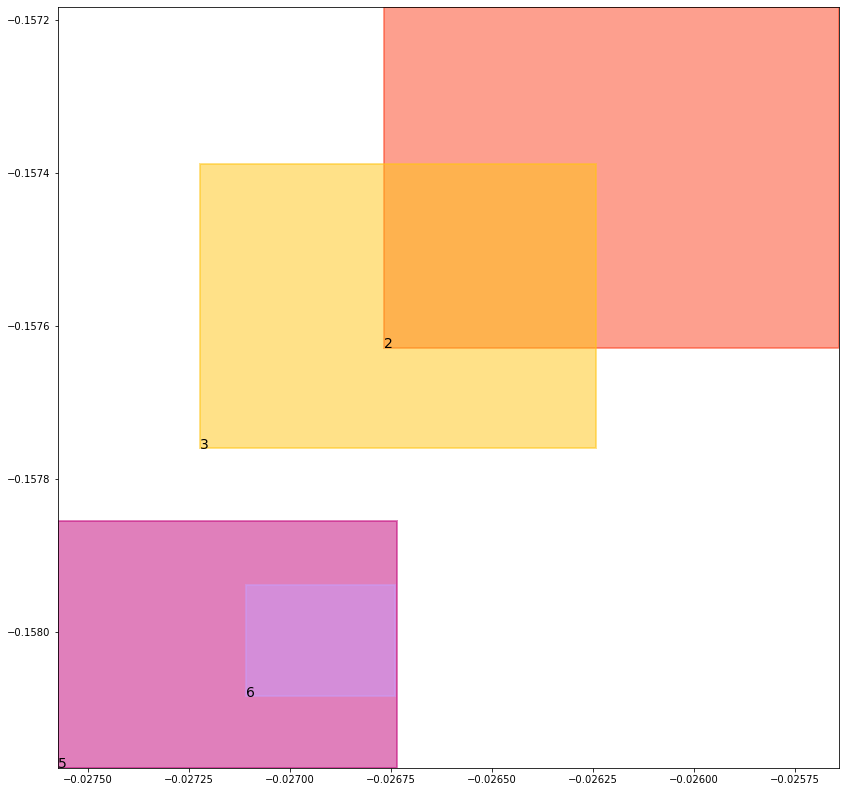

batch (tensor([[4, 5],
        [1, 2],
        [6, 2],
        [4, 6],
        [3, 5],
        [5, 3],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0111882900819182, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0100965360179543, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509822547435760, grad_fn=<MulBackward0>)
previous loss: tensor(0.2722670733928680, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04671776667237282 0.07525976002216339 tensor(0.8425055742263794) tensor(0.9587299227714539)
tensor(2) 0.4427798092365265 0.5180792808532715 tensor(0.4437370598316193) tensor(0.5217493176460266)
tensor(3) 0.4228602647781372 0.5195804834365845 tensor(0.4290754199028015) tensor(0.5209940075874329)
tensor(4) 0.1500547230243683 0.03584045171737671 tensor(0.9655709266662598) tensor(0.9440566301345825)
tensor(5) 0.5448365807533264 0.5034215450286865 tensor(0.5462251305580139) tensor(0.5046435594558716)
tensor(6) 0.5813784003257751 0.4991460144519806 tensor(0.5821794867515564) tensor(0.5002402663230896)


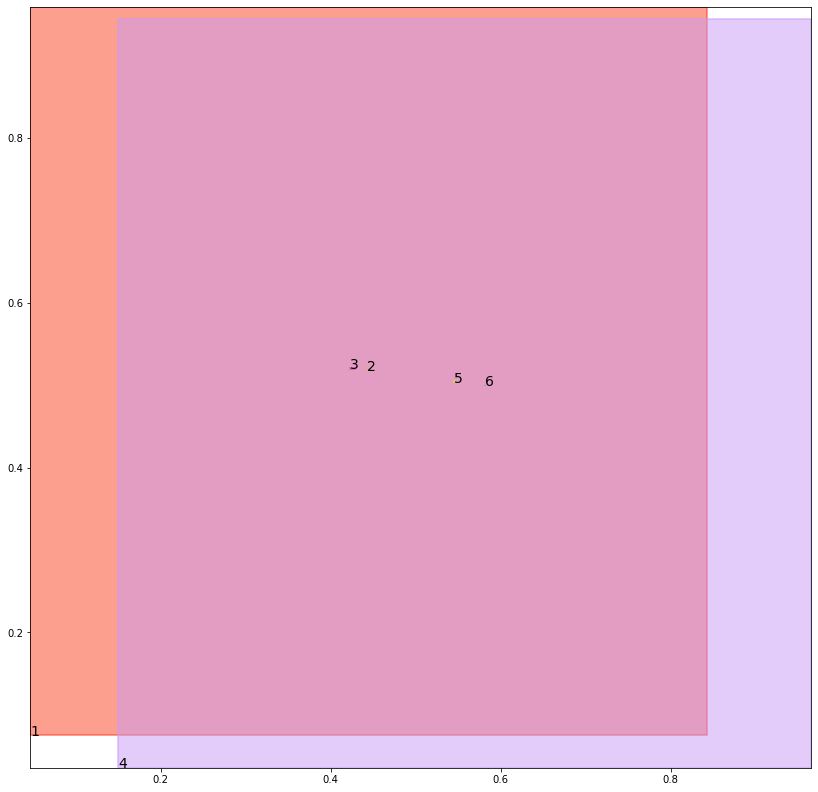

alignment data:
tensor(2) -0.02803218364715576 -0.16423529386520386 tensor(-0.0268615484237671) tensor(-0.1637779772281647)
tensor(3) -0.02836763858795166 -0.1643328070640564 tensor(-0.0276823043823242) tensor(-0.1640747487545013)
tensor(5) -0.028462886810302734 -0.16457819938659668 tensor(-0.0280302166938782) tensor(-0.1644109487533569)
tensor(6) -0.028316915035247803 -0.16458334028720856 tensor(-0.0279471874237061) tensor(-0.1644397377967834)


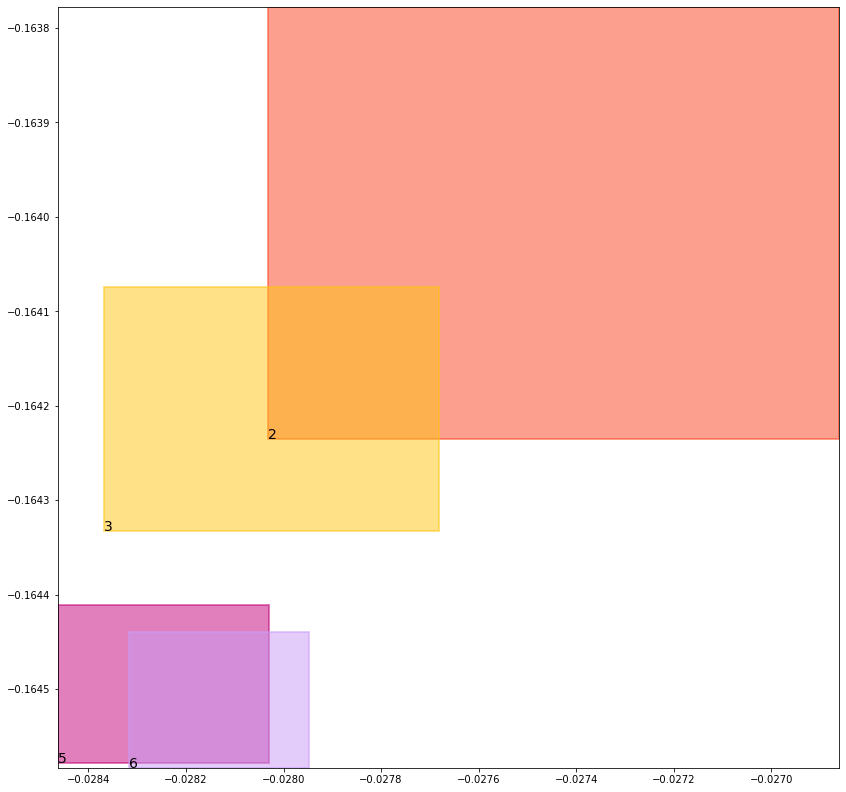

batch (tensor([[4, 6],
        [3, 5],
        [5, 3],
        [1, 2],
        [2, 6],
        [6, 2],
        [4, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0111272279173136, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0099749509245157, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509875595569611, grad_fn=<MulBackward0>)
previous loss: tensor(0.2720897495746613, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04663700982928276 0.07449078559875488 tensor(0.8434796929359436) tensor(0.9588184952735901)
tensor(2) 0.44279566407203674 0.5181707143783569 tensor(0.4436955749988556) tensor(0.5212885737419128)
tensor(3) 0.4240889251232147 0.5197658538818359 tensor(0.4292137324810028) tensor(0.5198047161102295)
tensor(4) 0.14823541045188904 0.035283494740724564 tensor(0.9656214714050293) tensor(0.9441353678703308)
tensor(5) 0.54490065574646 0.5040539503097534 tensor(0.5474638938903809) tensor(0.5041090250015259)
tensor(6) 0.5803974270820618 0.4992552697658539 tensor(0.5815846920013428) tensor(0.4998083114624023)


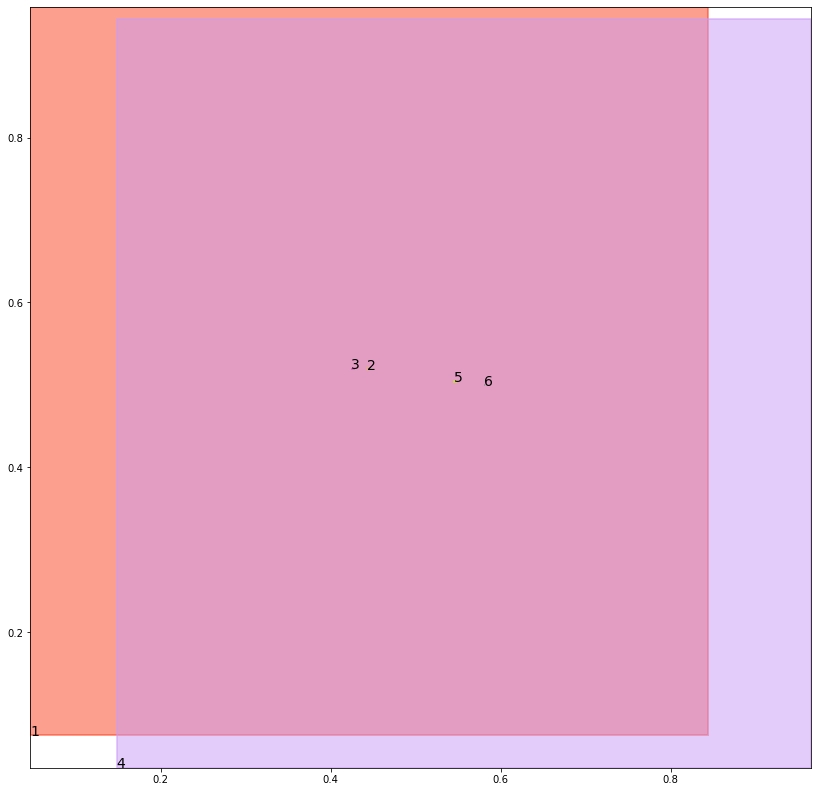

alignment data:
tensor(2) -0.029375791549682617 -0.16693226993083954 tensor(-0.0283776521682739) tensor(-0.1665455847978592)
tensor(3) -0.029642701148986816 -0.1670139580965042 tensor(-0.0294228792190552) tensor(-0.1669345498085022)
tensor(5) -0.02958822250366211 -0.1671345829963684 tensor(-0.0294672250747681) tensor(-0.1670906096696854)
tensor(6) -0.029628396034240723 -0.16719183325767517 tensor(-0.0294096469879150) tensor(-0.1671082973480225)


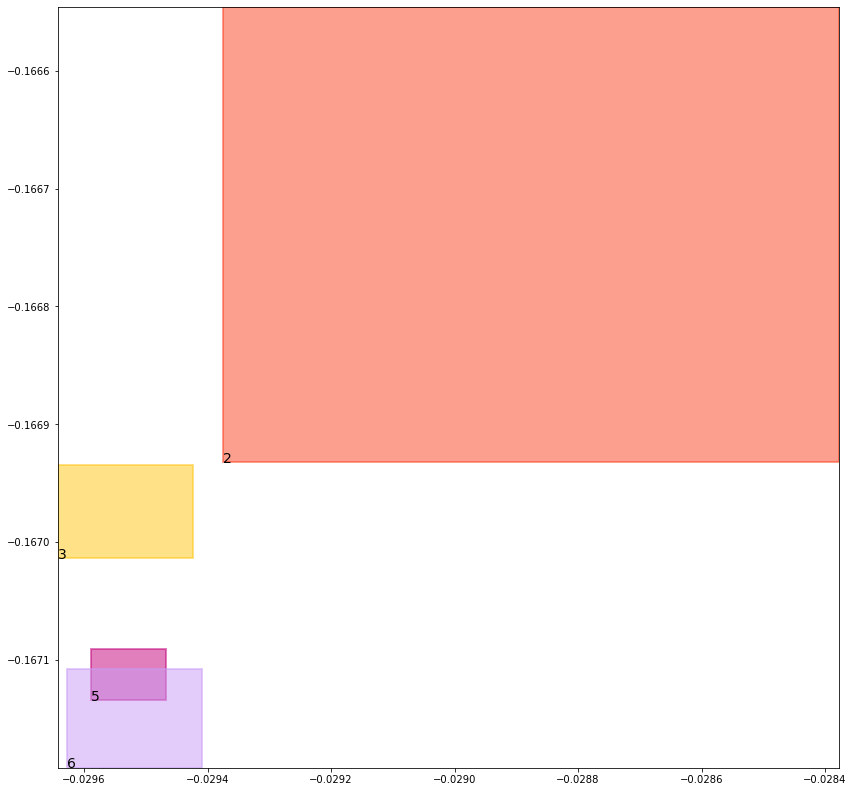

batch (tensor([[3, 5],
        [4, 6],
        [6, 2],
        [2, 6],
        [5, 3],
        [1, 3],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0110337790101767, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0099095134064555, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509970068931580, grad_fn=<MulBackward0>)
previous loss: tensor(0.2719402909278870, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04655739292502403 0.07373413443565369 tensor(0.8444427251815796) tensor(0.9589060544967651)
tensor(2) 0.44303709268569946 0.5186551213264465 tensor(0.4430912137031555) tensor(0.5206995010375977)
tensor(3) 0.4254899322986603 0.5184311270713806 tensor(0.4290936887264252) tensor(0.5202072858810425)
tensor(4) 0.14646169543266296 0.03474289923906326 tensor(0.9656704664230347) tensor(0.9442133903503418)
tensor(5) 0.5441843867301941 0.5036078691482544 tensor(0.5491743087768555) tensor(0.5042825937271118)
tensor(6) 0.5798091292381287 0.4992840886116028 tensor(0.5807459950447083) tensor(0.4997037053108215)


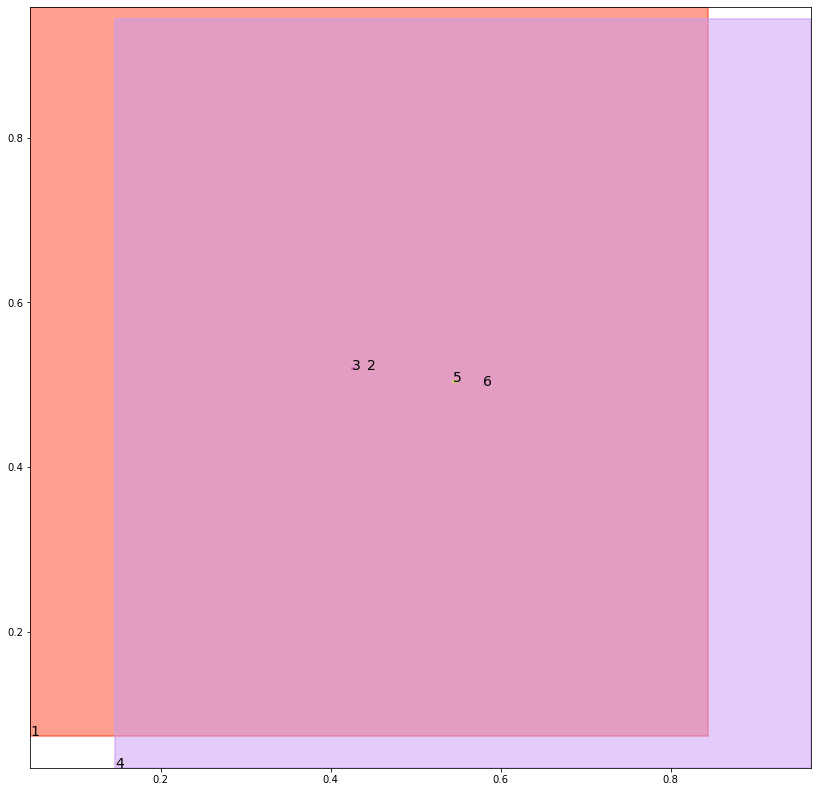

alignment data:
tensor(2) -0.031645238399505615 -0.17087766528129578 tensor(-0.0310125946998596) tensor(-0.1706340014934540)
tensor(3) -0.03243440389633179 -0.1711694300174713 tensor(-0.0317388176918030) tensor(-0.1709040105342865)
tensor(5) -0.032135069370269775 -0.17113643884658813 tensor(-0.0317222476005554) tensor(-0.1709808856248856)
tensor(6) -0.03200656175613403 -0.17111164331436157 tensor(-0.0318387150764465) tensor(-0.1710476726293564)


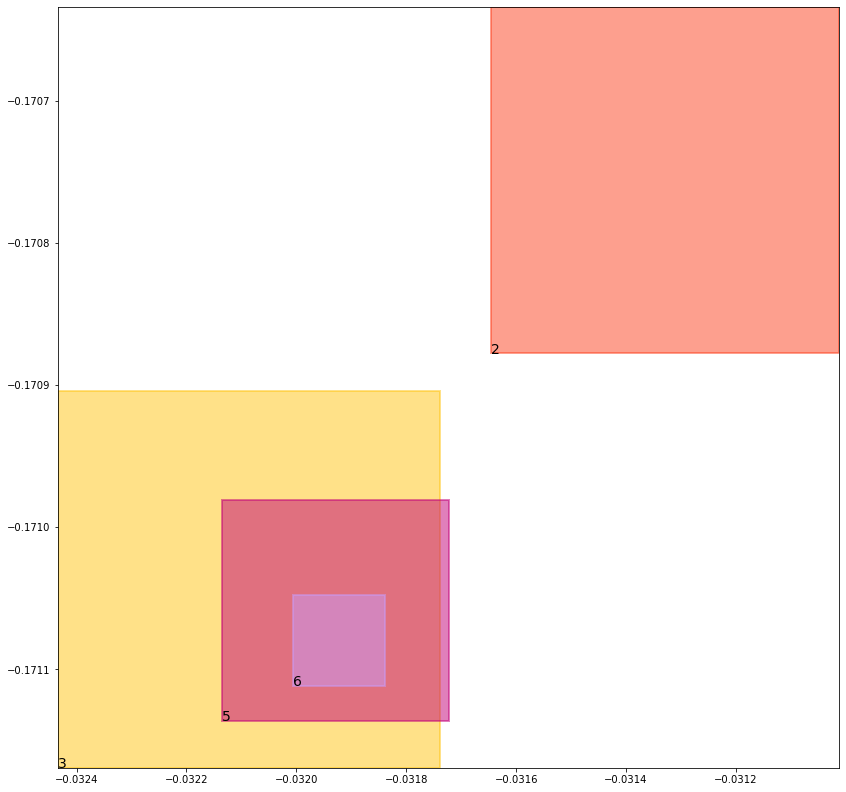

batch (tensor([[6, 2],
        [1, 3],
        [5, 3],
        [4, 5],
        [1, 2],
        [4, 6],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0109493806958199, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0098763741552830, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509936392307281, grad_fn=<MulBackward0>)
previous loss: tensor(0.2718193829059601, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.046478837728500366 0.07298960536718369 tensor(0.8453943729400635) tensor(0.9589926600456238)
tensor(2) 0.443084180355072 0.5194891095161438 tensor(0.4430896937847137) tensor(0.5199963450431824)
tensor(3) 0.4270452558994293 0.5174657702445984 tensor(0.4287410676479340) tensor(0.5203047990798950)
tensor(4) 0.14473237097263336 0.03421799838542938 tensor(0.9657182097434998) tensor(0.9442907571792603)
tensor(5) 0.544015645980835 0.5032905340194702 tensor(0.5500421524047852) tensor(0.5039854645729065)
tensor(6) 0.5795750617980957 0.4989182651042938 tensor(0.5796867012977600) tensor(0.4996725022792816)


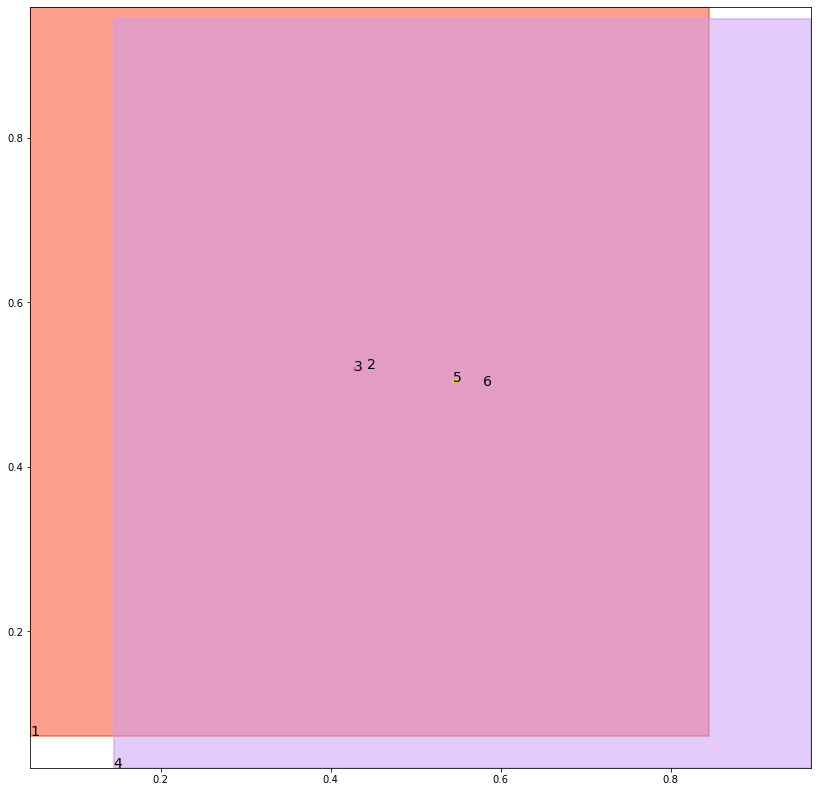

alignment data:
tensor(2) -0.0385165810585022 -0.1640717089176178 tensor(-0.0383599996566772) tensor(-0.1640118360519409)
tensor(3) -0.03980576992034912 -0.16456030309200287 tensor(-0.0388600826263428) tensor(-0.1641992777585983)
tensor(5) -0.03932380676269531 -0.16440671682357788 tensor(-0.0388596057891846) tensor(-0.1642308384180069)
tensor(6) -0.03919672966003418 -0.1643674373626709 tensor(-0.0389595031738281) tensor(-0.1642768085002899)


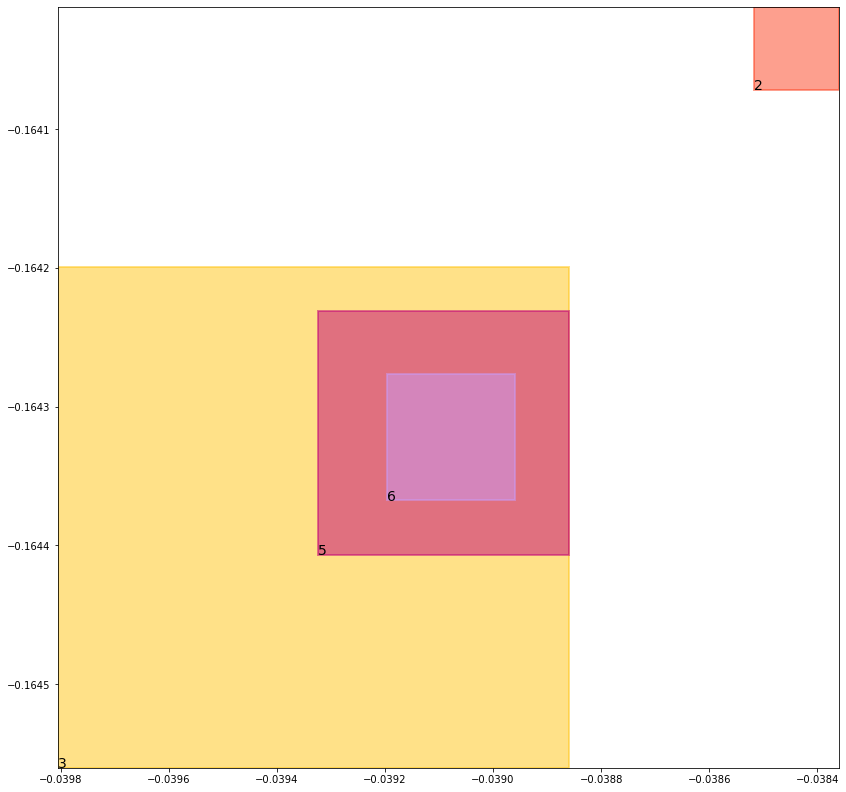

batch (tensor([[6, 2],
        [4, 5],
        [3, 5],
        [1, 3],
        [5, 3],
        [1, 2],
        [2, 6],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0108615234494209, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0098159387707710, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509948015213013, grad_fn=<MulBackward0>)
previous loss: tensor(0.2716722488403320, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04640130326151848 0.07225724309682846 tensor(0.8463343381881714) tensor(0.9590783715248108)
tensor(2) 0.44282066822052 0.5191922783851624 tensor(0.4437713325023651) tensor(0.5206266641616821)
tensor(3) 0.4281798303127289 0.5168758630752563 tensor(0.4287381768226624) tensor(0.5200891494750977)
tensor(4) 0.14304672181606293 0.033708103001117706 tensor(0.9657649397850037) tensor(0.9443675279617310)
tensor(5) 0.5443369150161743 0.5030887126922607 tensor(0.5501396656036377) tensor(0.5032616257667542)
tensor(6) 0.5784285664558411 0.4986986517906189 tensor(0.5796592831611633) tensor(0.4991988241672516)


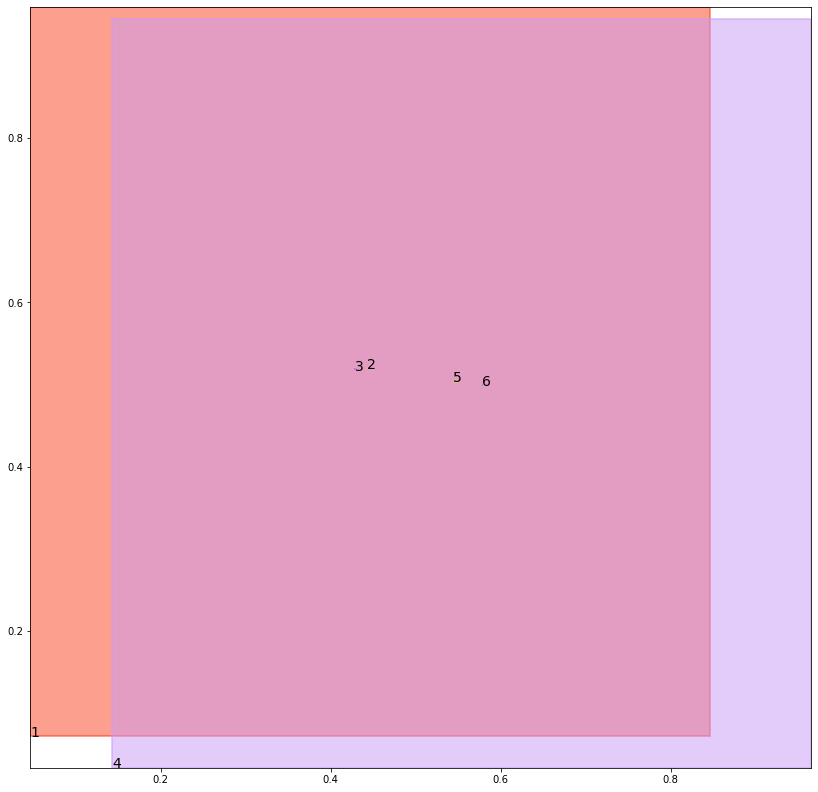

alignment data:
tensor(2) -0.04275381565093994 -0.15509214997291565 tensor(-0.0422717332839966) tensor(-0.1549090147018433)
tensor(3) -0.04408162832260132 -0.15559807419776917 tensor(-0.0430676937103271) tensor(-0.1552130132913589)
tensor(5) -0.04346263408660889 -0.15534906089305878 tensor(-0.0431659817695618) tensor(-0.1552357673645020)
tensor(6) -0.04338681697845459 -0.15531618893146515 tensor(-0.0431810617446899) tensor(-0.1552379131317139)


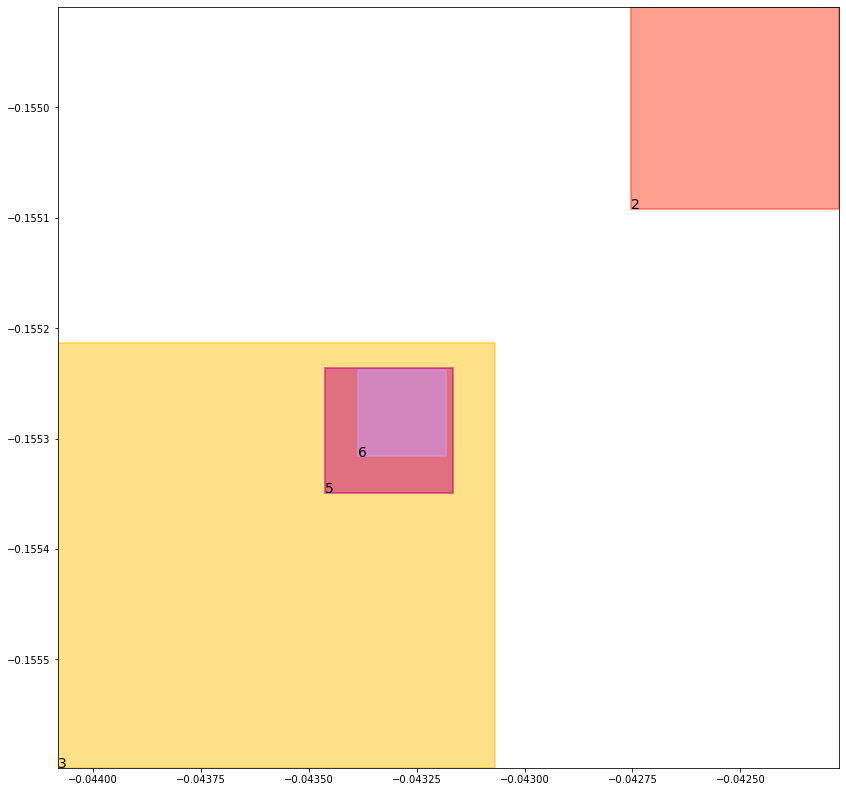

batch (tensor([[3, 5],
        [2, 6],
        [1, 3],
        [4, 6],
        [5, 3],
        [4, 5],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [2, 6],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0108207287266850, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0097574936226010, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509934306144714, grad_fn=<MulBackward0>)
previous loss: tensor(0.2715716660022736, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.046324700117111206 0.07153680175542831 tensor(0.8472629785537720) tensor(0.9591633677482605)
tensor(2) 0.44286206364631653 0.5186047554016113 tensor(0.4437810182571411) tensor(0.5211857557296753)
tensor(3) 0.4280238747596741 0.5166295766830444 tensor(0.4300785362720490) tensor(0.5195880532264709)
tensor(4) 0.14140383899211884 0.033212605863809586 tensor(0.9658105969429016) tensor(0.9444437623023987)
tensor(5) 0.545093834400177 0.5021554827690125 tensor(0.5495366454124451) tensor(0.5029906034469604)
tensor(6) 0.5774680376052856 0.4983327090740204 tensor(0.5792403817176819) tensor(0.4986113905906677)


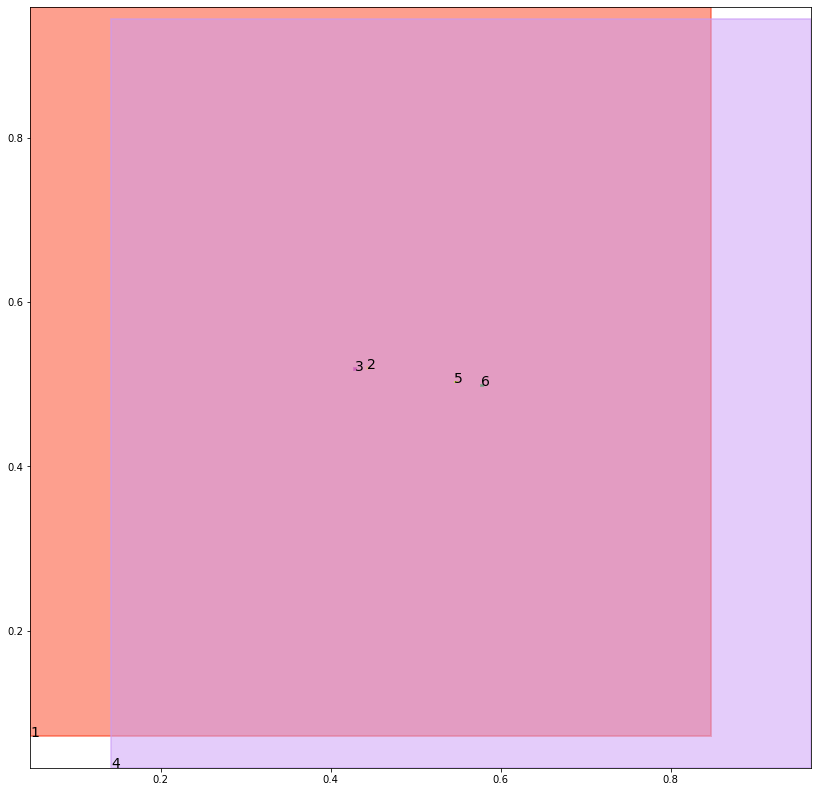

alignment data:
tensor(2) -0.04754561185836792 -0.15186576545238495 tensor(-0.0467112064361572) tensor(-0.1515503674745560)
tensor(3) -0.04878288507461548 -0.1523394137620926 tensor(-0.0477839708328247) tensor(-0.1519614458084106)
tensor(5) -0.048286497592926025 -0.15209932625293732 tensor(-0.0478410124778748) tensor(-0.1519291400909424)
tensor(6) -0.04809385538101196 -0.15201200544834137 tensor(-0.0479329228401184) tensor(-0.1519504487514496)


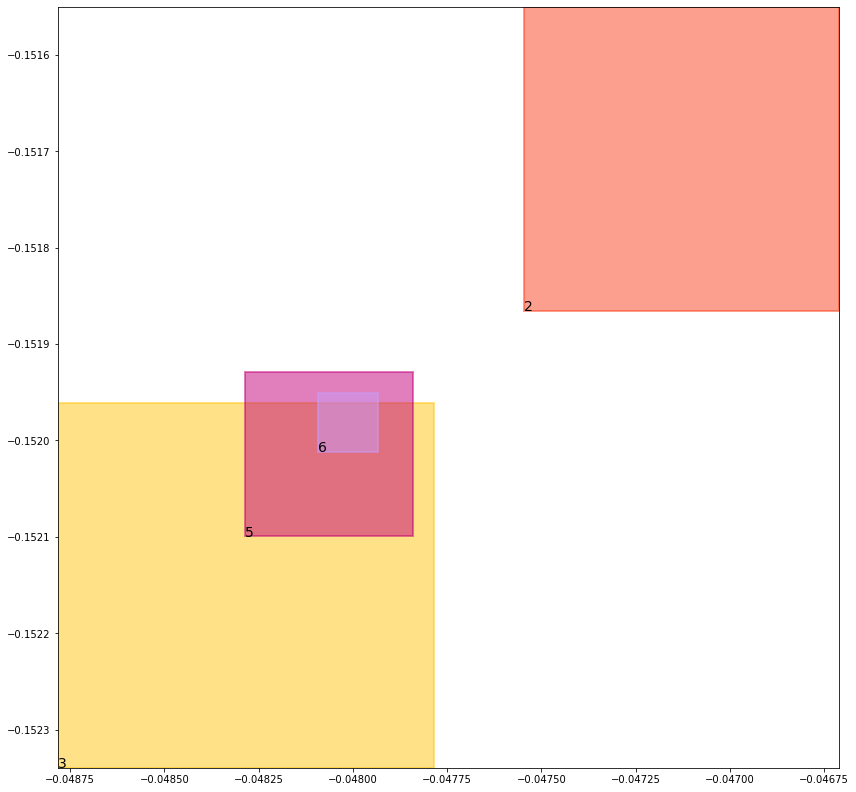

batch (tensor([[5, 3],
        [4, 6],
        [1, 3],
        [2, 6],
        [4, 5],
        [1, 2],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0108027439564466, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0096870455890894, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509897053241730, grad_fn=<MulBackward0>)
previous loss: tensor(0.2714794874191284, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04624893516302109 0.07082804292440414 tensor(0.8481807708740234) tensor(0.9592477083206177)
tensor(2) 0.4431798458099365 0.518214762210846 tensor(0.4431856870651245) tensor(0.5212092399597168)
tensor(3) 0.4282364845275879 0.5166927576065063 tensor(0.4310971498489380) tensor(0.5188297629356384)
tensor(4) 0.13980308175086975 0.03273075073957443 tensor(0.9658554792404175) tensor(0.9445194602012634)
tensor(5) 0.5462359189987183 0.5014430284500122 tensor(0.5483000278472900) tensor(0.5027660131454468)
tensor(6) 0.5767771601676941 0.4979076087474823 tensor(0.5783661007881165) tensor(0.4983994364738464)


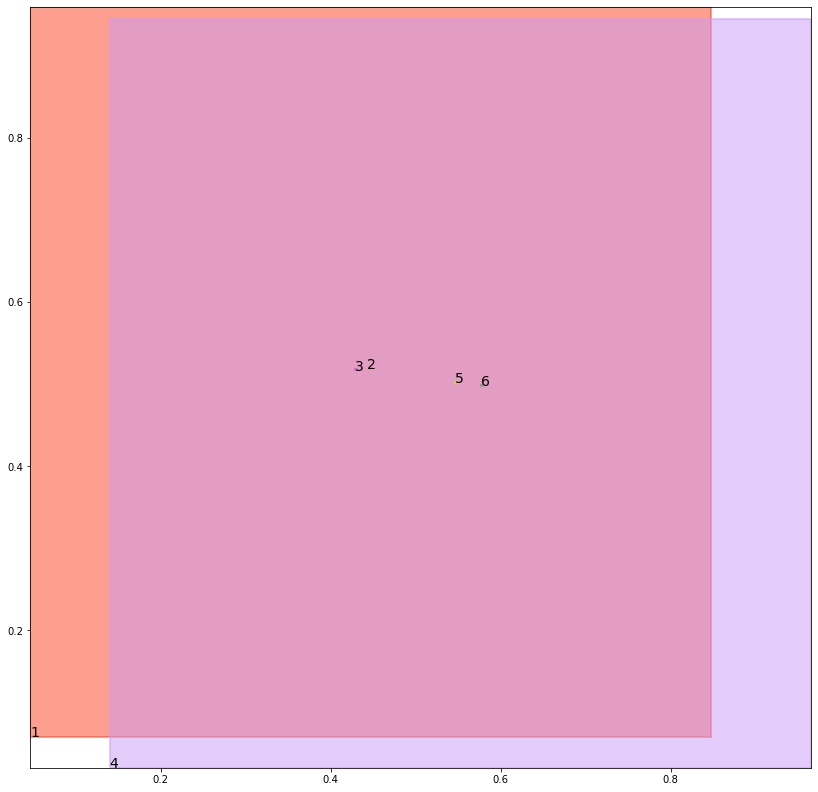

alignment data:
tensor(2) -0.04121166467666626 -0.16333834826946259 tensor(-0.0402886271476746) tensor(-0.1629915982484818)
tensor(3) -0.04231995344161987 -0.16376551985740662 tensor(-0.0415390133857727) tensor(-0.1634700894355774)
tensor(5) -0.04197198152542114 -0.16354909539222717 tensor(-0.0414759516716003) tensor(-0.1633612662553787)
tensor(6) -0.04175502061843872 -0.16344541311264038 tensor(-0.0415354371070862) tensor(-0.1633618026971817)


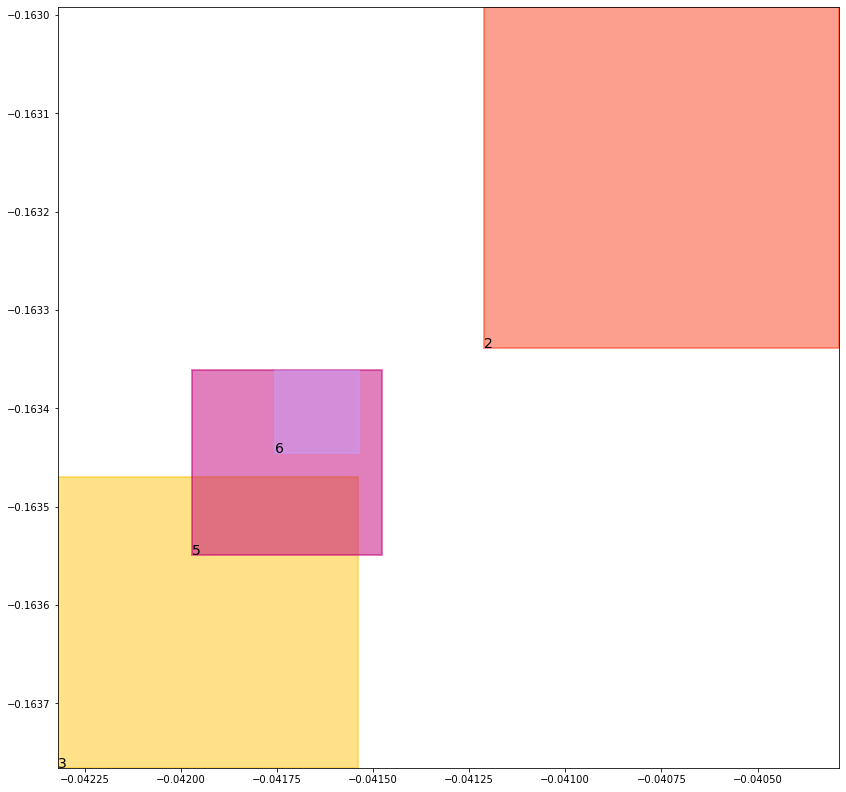

batch (tensor([[1, 2],
        [3, 5],
        [1, 3],
        [2, 6],
        [4, 5],
        [6, 2],
        [4, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0107482783496380, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0095974048599601, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509899139404297, grad_fn=<MulBackward0>)
previous loss: tensor(0.2713356018066406, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04617392271757126 0.07013091444969177 tensor(0.8490878939628601) tensor(0.9593315124511719)
tensor(2) 0.44321340322494507 0.5180039405822754 tensor(0.4432885348796844) tensor(0.5207452774047852)
tensor(3) 0.42878344655036926 0.51703280210495 tensor(0.4318226873874664) tensor(0.5178421735763550)
tensor(4) 0.13824407756328583 0.03226188197731972 tensor(0.9658995866775513) tensor(0.9445946812629700)
tensor(5) 0.5464940667152405 0.5010930895805359 tensor(0.5477158427238464) tensor(0.5024256706237793)
tensor(6) 0.5763301253318787 0.49788326025009155 tensor(0.5770807862281799) tensor(0.4980745315551758)


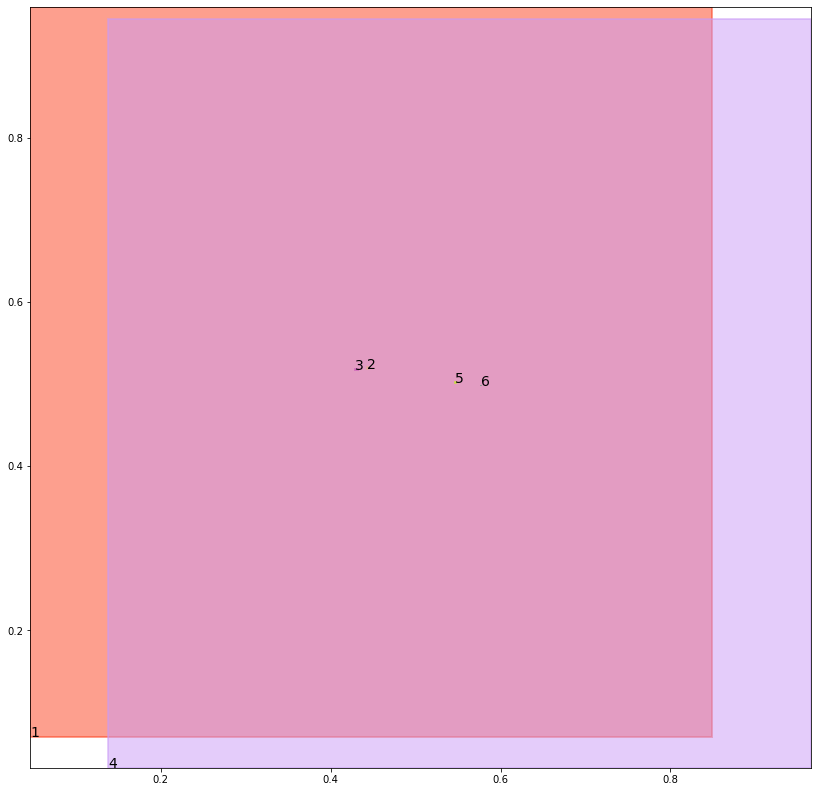

alignment data:
tensor(2) -0.03949195146560669 -0.173211470246315 tensor(-0.0386441349983215) tensor(-0.1728941202163696)
tensor(3) -0.04041469097137451 -0.1735704243183136 tensor(-0.0400339961051941) tensor(-0.1734250783920288)
tensor(5) -0.04024022817611694 -0.17339353263378143 tensor(-0.0397768616676331) tensor(-0.1732189357280731)
tensor(6) -0.03994011878967285 -0.17325294017791748 tensor(-0.0398487448692322) tensor(-0.1732180267572403)


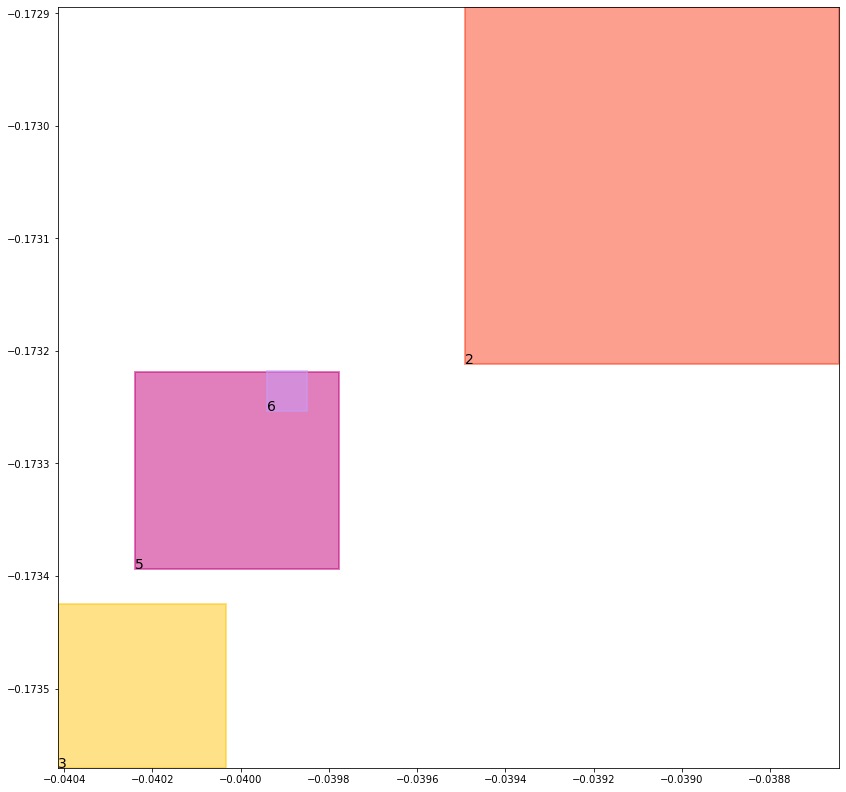

batch (tensor([[4, 6],
        [5, 3],
        [1, 3],
        [2, 6],
        [1, 2],
        [3, 5],
        [4, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0106873679906130, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0095132477581501, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509953081607819, grad_fn=<MulBackward0>)
previous loss: tensor(0.2711959183216095, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04609961807727814 0.0694454163312912 tensor(0.8499846458435059) tensor(0.9594144821166992)
tensor(2) 0.44278571009635925 0.5179561972618103 tensor(0.4435267150402069) tensor(0.5198419690132141)
tensor(3) 0.4296328127384186 0.5166523456573486 tensor(0.4322820901870728) tensor(0.5176188349723816)
tensor(4) 0.13672582805156708 0.03180551156401634 tensor(0.9659428596496582) tensor(0.9446694254875183)
tensor(5) 0.5456218719482422 0.5010765790939331 tensor(0.5486566424369812) tensor(0.5019791126251221)
tensor(6) 0.5754262804985046 0.49764683842658997 tensor(0.5761027336120605) tensor(0.4982186555862427)


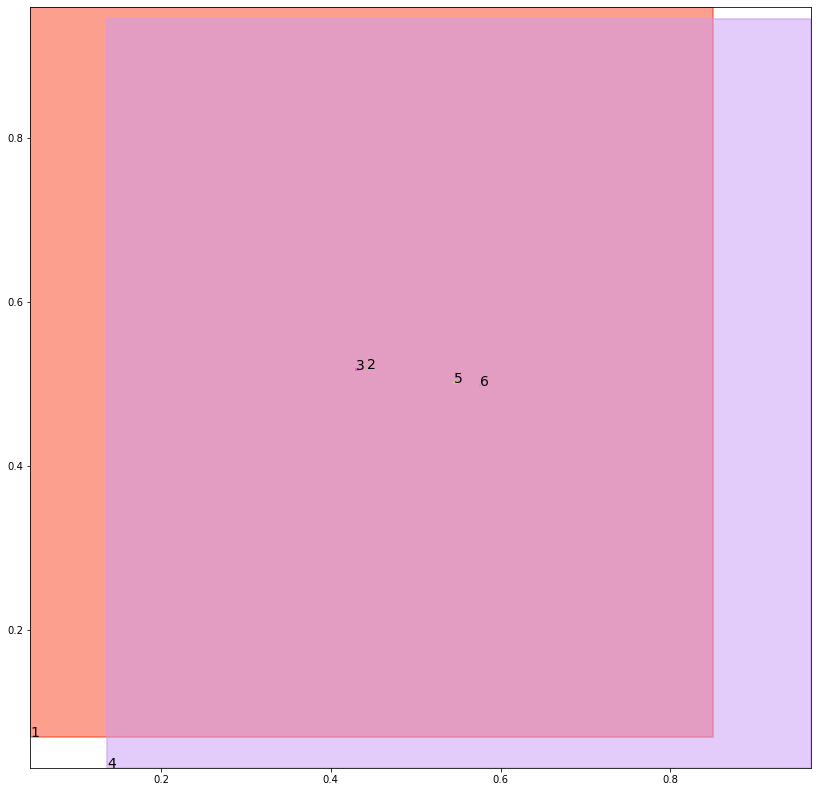

alignment data:
tensor(2) -0.033361077308654785 -0.1744806170463562 tensor(-0.0327478051185608) tensor(-0.1742510199546814)
tensor(3) -0.03433668613433838 -0.17485931515693665 tensor(-0.0339233279228210) tensor(-0.1747021377086639)
tensor(5) -0.03407388925552368 -0.17463114857673645 tensor(-0.0336634516716003) tensor(-0.1744745969772339)
tensor(6) -0.03382998704910278 -0.17450672388076782 tensor(-0.0336243510246277) tensor(-0.1744292378425598)


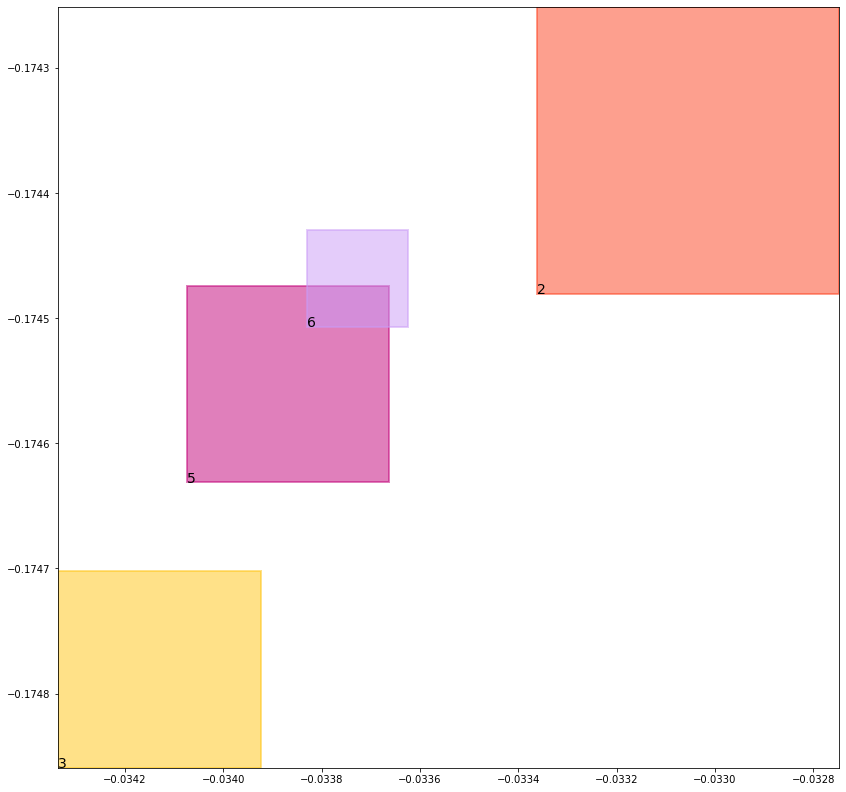

batch (tensor([[1, 2],
        [4, 6],
        [5, 3],
        [1, 3],
        [6, 2],
        [2, 6],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0106361005455256, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0094796698540449, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509962618350983, grad_fn=<MulBackward0>)
previous loss: tensor(0.2711120247840881, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.046025946736335754 0.0687713772058487 tensor(0.8508712053298950) tensor(0.9594970345497131)
tensor(2) 0.44299134612083435 0.5180555582046509 tensor(0.4435465931892395) tensor(0.5185519456863403)
tensor(3) 0.4307551383972168 0.5158592462539673 tensor(0.4325001239776611) tensor(0.5178566575050354)
tensor(4) 0.13524635136127472 0.03136118873953819 tensor(0.9659853577613831) tensor(0.9447438120841980)
tensor(5) 0.545592725276947 0.5013594031333923 tensor(0.5491045117378235) tensor(0.5014364719390869)
tensor(6) 0.5742207169532776 0.49737101793289185 tensor(0.5756008028984070) tensor(0.4980800747871399)


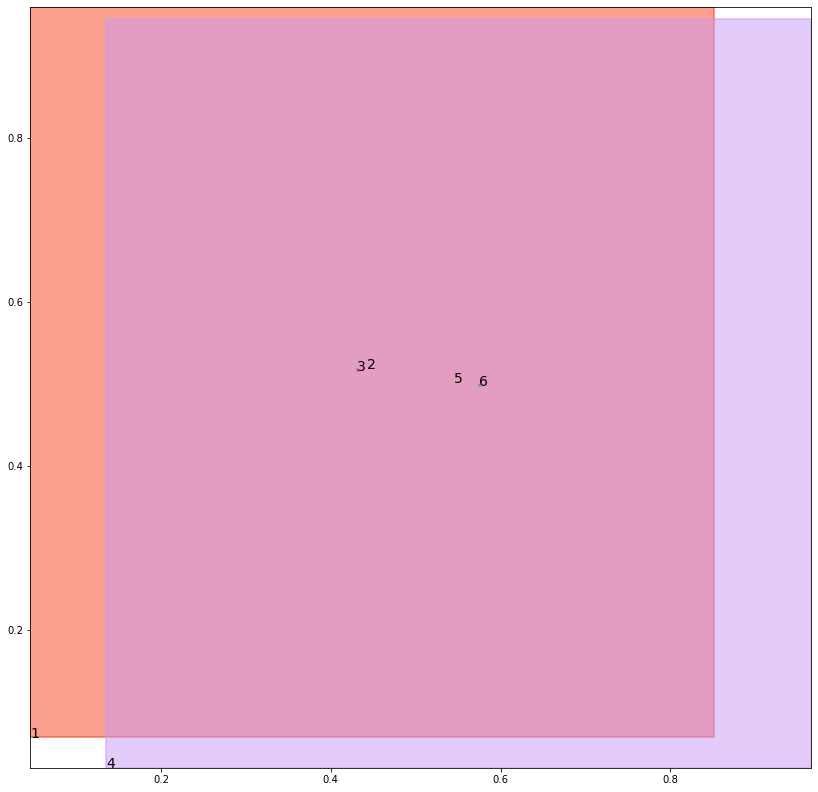

alignment data:
tensor(2) -0.03230857849121094 -0.17013269662857056 tensor(-0.0321311950683594) tensor(-0.1700660288333893)
tensor(3) -0.0335240364074707 -0.17060044407844543 tensor(-0.0328319668769836) tensor(-0.1703406870365143)
tensor(5) -0.03293132781982422 -0.17023569345474243 tensor(-0.0327528715133667) tensor(-0.1701648533344269)
tensor(6) -0.032898664474487305 -0.17018760740756989 tensor(-0.0326193571090698) tensor(-0.1700819730758667)


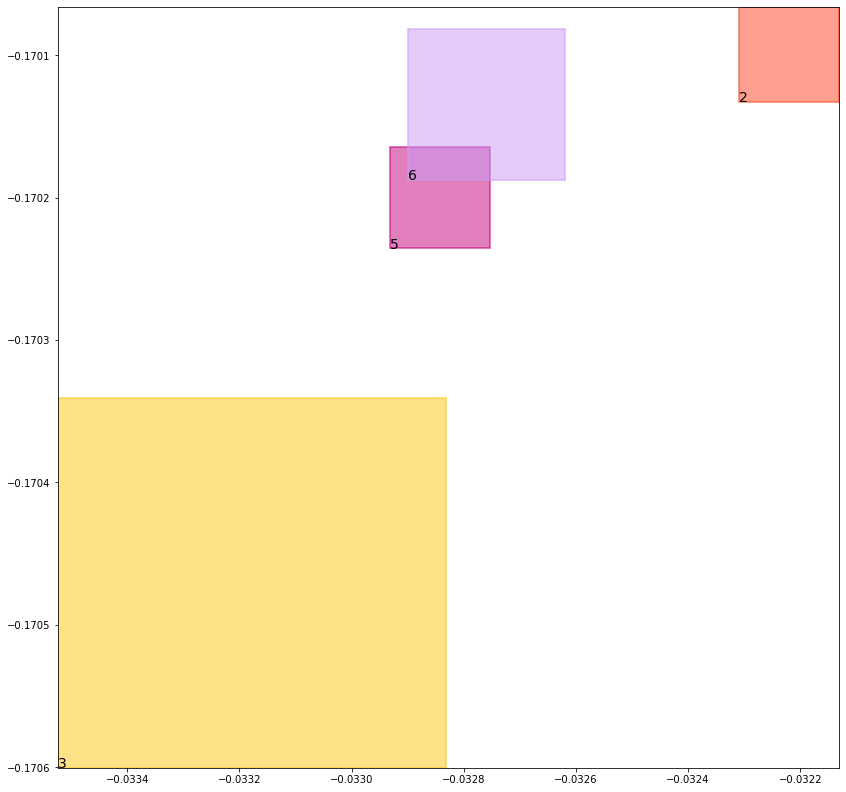

batch (tensor([[1, 2],
        [6, 2],
        [4, 6],
        [5, 3],
        [2, 6],
        [3, 5],
        [1, 3],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0105687528848648, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0094350539147854, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509989142417908, grad_fn=<MulBackward0>)
previous loss: tensor(0.2710027098655701, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04595289006829262 0.06810852885246277 tensor(0.8517475724220276) tensor(0.9595788717269897)
tensor(2) 0.44330233335494995 0.5169264078140259 tensor(0.4438388645648956) tensor(0.5182865858078003)
tensor(3) 0.4321230947971344 0.515432596206665 tensor(0.4324997663497925) tensor(0.5177745819091797)
tensor(4) 0.13380414247512817 0.03092852607369423 tensor(0.9660272598266602) tensor(0.9448179006576538)
tensor(5) 0.5463165640830994 0.5008084177970886 tensor(0.5491030812263489) tensor(0.5019034147262573)
tensor(6) 0.5734232664108276 0.4972339868545532 tensor(0.5748497247695923) tensor(0.4975014030933380)


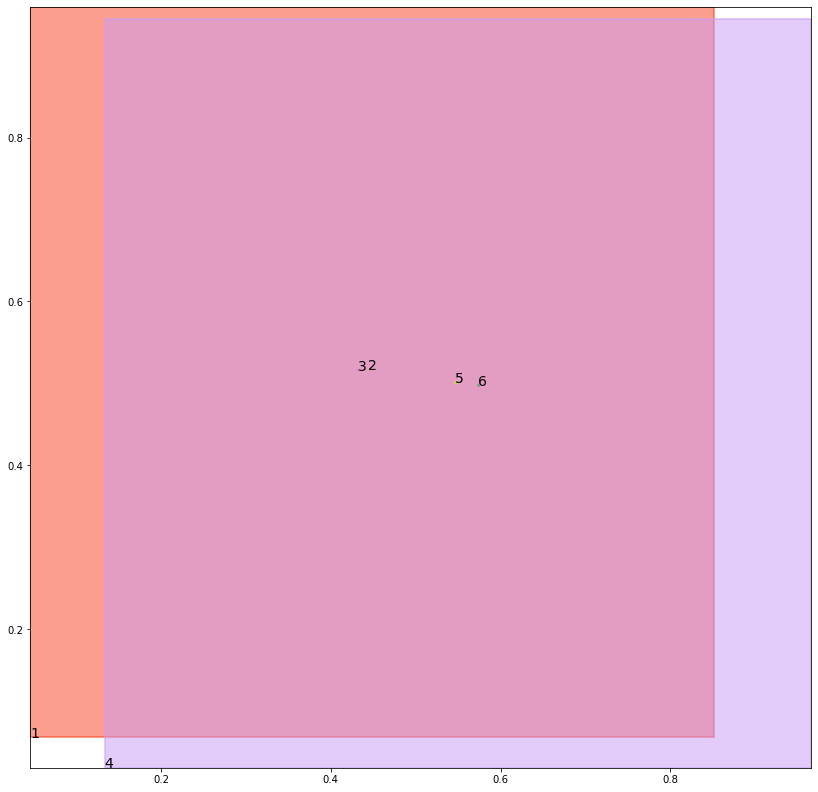

alignment data:
tensor(2) -0.03191465139389038 -0.16466805338859558 tensor(-0.0314719080924988) tensor(-0.1645028293132782)
tensor(3) -0.0328715443611145 -0.16503873467445374 tensor(-0.0321335792541504) tensor(-0.1647640466690063)
tensor(5) -0.0322992205619812 -0.16467131674289703 tensor(-0.0318381190299988) tensor(-0.1644962430000305)
tensor(6) -0.03219491243362427 -0.16459587216377258 tensor(-0.0320492386817932) tensor(-0.1645398139953613)


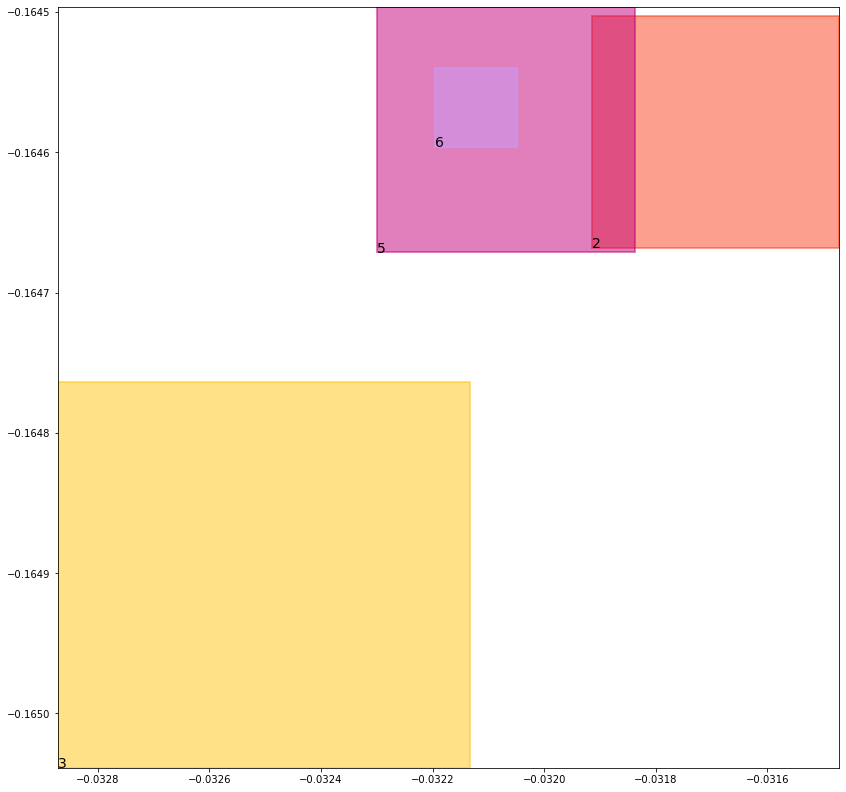

batch (tensor([[4, 5],
        [5, 3],
        [6, 2],
        [2, 6],
        [4, 6],
        [1, 2],
        [1, 3],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0105124600231647, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0093787964433432, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509948015213013, grad_fn=<MulBackward0>)
previous loss: tensor(0.2708860635757446, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04588043689727783 0.06745640933513641 tensor(0.8526139855384827) tensor(0.9596602320671082)
tensor(2) 0.44337335228919983 0.5158525109291077 tensor(0.4440103769302368) tensor(0.5183269977569580)
tensor(3) 0.4323025047779083 0.5153381824493408 tensor(0.4337110221385956) tensor(0.5174054503440857)
tensor(4) 0.13239839673042297 0.030507031828165054 tensor(0.9660686254501343) tensor(0.9448916316032410)
tensor(5) 0.5477071404457092 0.5003272294998169 tensor(0.5486925840377808) tensor(0.5019290447235107)
tensor(6) 0.5729949474334717 0.4965282380580902 tensor(0.5738736987113953) tensor(0.4972201883792877)


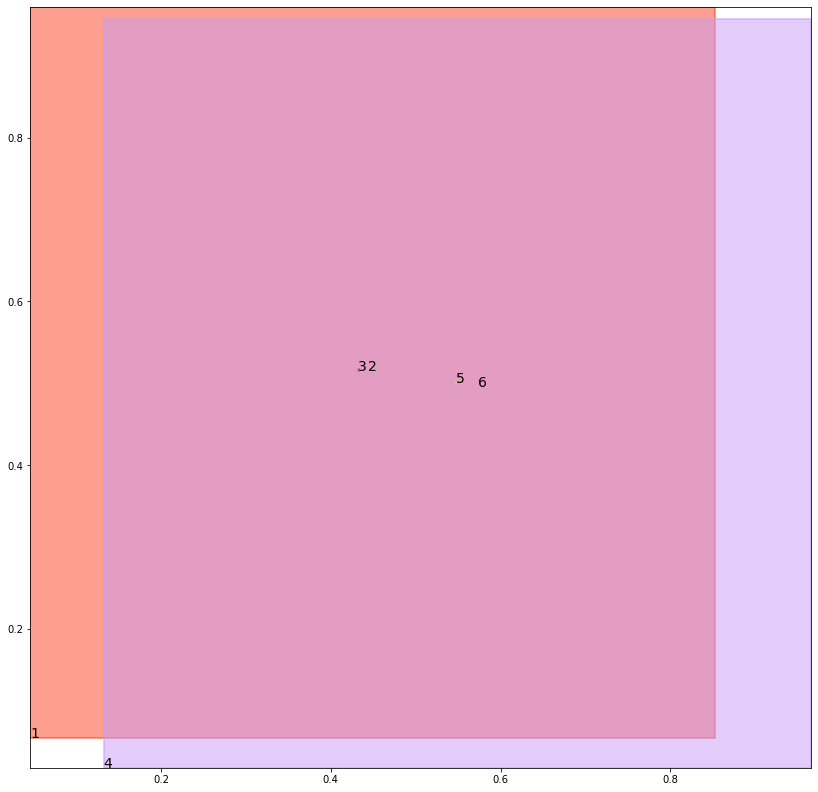

alignment data:
tensor(2) -0.03370696306228638 -0.15124762058258057 tensor(-0.0331305265426636) tensor(-0.1509749293327332)
tensor(3) -0.034392714500427246 -0.15150949358940125 tensor(-0.0338677763938904) tensor(-0.1512654721736908)
tensor(5) -0.03381168842315674 -0.1511376053094864 tensor(-0.0332742929458618) tensor(-0.1509367525577545)
tensor(6) -0.03384822607040405 -0.1511150747537613 tensor(-0.0335957407951355) tensor(-0.1510201245546341)


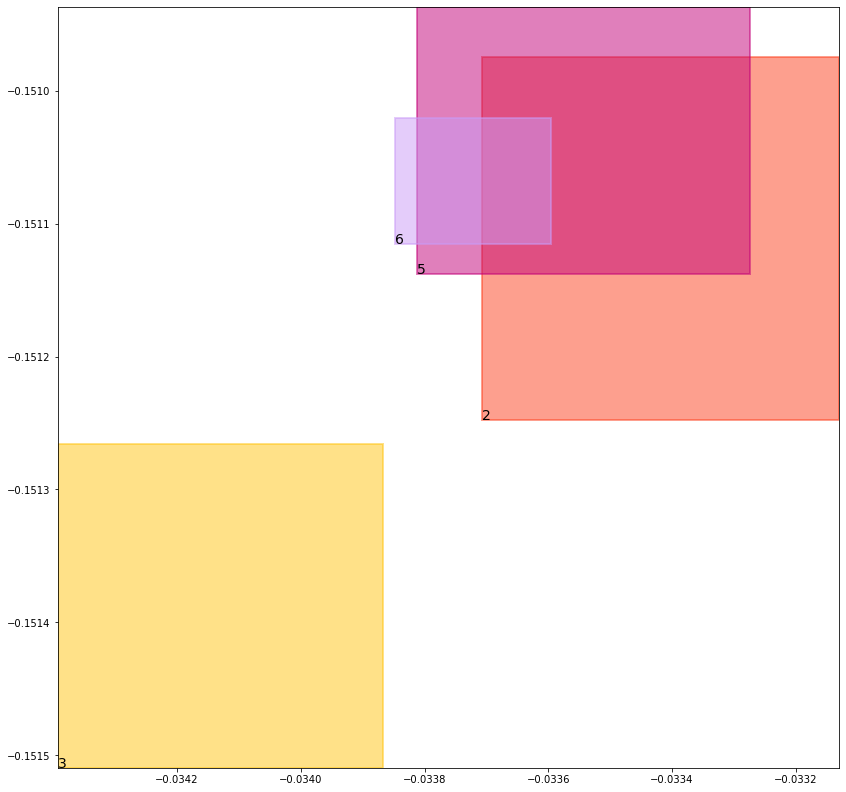

batch (tensor([[6, 2],
        [4, 6],
        [1, 3],
        [1, 2],
        [5, 3],
        [3, 5],
        [4, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0104920715093613, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0093046445399523, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509933412075043, grad_fn=<MulBackward0>)
previous loss: tensor(0.2707900702953339, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.045808516442775726 0.06681464612483978 tensor(0.8534708619117737) tensor(0.9597411751747131)
tensor(2) 0.44357413053512573 0.5152859687805176 tensor(0.4437310695648193) tensor(0.5181822180747986)
tensor(3) 0.4324040710926056 0.5155671834945679 tensor(0.4349025785923004) tensor(0.5167531371116638)
tensor(4) 0.13102881610393524 0.0300961472094059 tensor(0.9661095142364502) tensor(0.9449650645256042)
tensor(5) 0.547910749912262 0.4999793767929077 tensor(0.5496814846992493) tensor(0.5014766454696655)
tensor(6) 0.5726949572563171 0.4960022270679474 tensor(0.5728991627693176) tensor(0.4970671832561493)


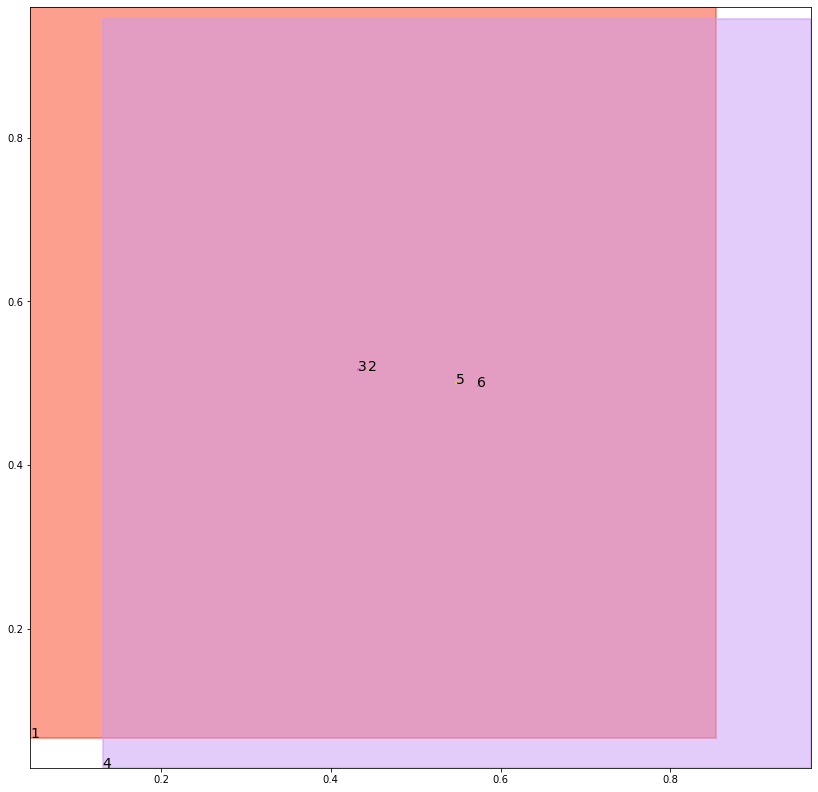

alignment data:
tensor(2) -0.04559051990509033 -0.1485639363527298 tensor(-0.0446921586990356) tensor(-0.1482302248477936)
tensor(3) -0.04600787162780762 -0.14873537421226501 tensor(-0.0455302000045776) tensor(-0.1485543698072433)
tensor(5) -0.04559433460235596 -0.14841121435165405 tensor(-0.0450537204742432) tensor(-0.1482079029083252)
tensor(6) -0.04570019245147705 -0.14841389656066895 tensor(-0.0453633069992065) tensor(-0.1482885181903839)


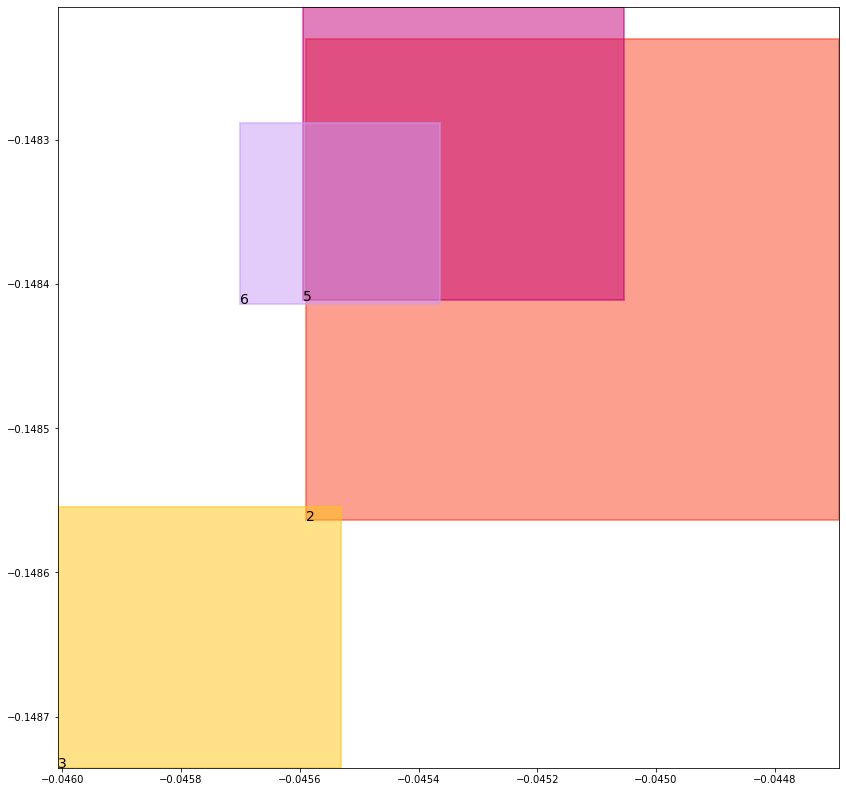

batch (tensor([[6, 2],
        [4, 5],
        [3, 5],
        [4, 6],
        [5, 3],
        [1, 2],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0104524083435535, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0092594642192125, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509908080101013, grad_fn=<MulBackward0>)
previous loss: tensor(0.2707026898860931, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04573708772659302 0.06618314236402512 tensor(0.8543183803558350) tensor(0.9598215222358704)
tensor(2) 0.4437946379184723 0.5151809453964233 tensor(0.4438467621803284) tensor(0.5178804993629456)
tensor(3) 0.43277761340141296 0.5158723592758179 tensor(0.4357312917709351) tensor(0.5160614252090454)
tensor(4) 0.12969431281089783 0.029695402830839157 tensor(0.9661498069763184) tensor(0.9450381994247437)
tensor(5) 0.5476159453392029 0.4997539520263672 tensor(0.5507501959800720) tensor(0.5005952119827271)
tensor(6) 0.5718036890029907 0.49588271975517273 tensor(0.5723279118537903) tensor(0.4967893958091736)


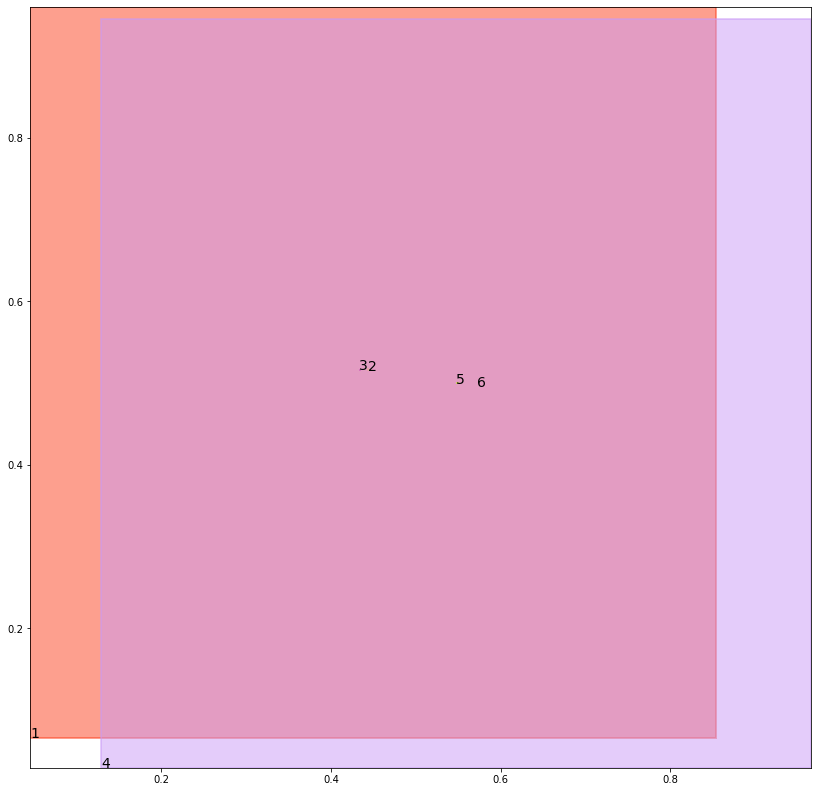

alignment data:
tensor(2) -0.053431808948516846 -0.1480780392885208 tensor(-0.0525988936424255) tensor(-0.1477686017751694)
tensor(3) -0.05371898412704468 -0.14820128679275513 tensor(-0.0535267591476440) tensor(-0.1481254696846008)
tensor(5) -0.05346614122390747 -0.14793485403060913 tensor(-0.0530650615692139) tensor(-0.1477811932563782)
tensor(6) -0.053559303283691406 -0.14793318510055542 tensor(-0.0532566905021667) tensor(-0.1478199511766434)


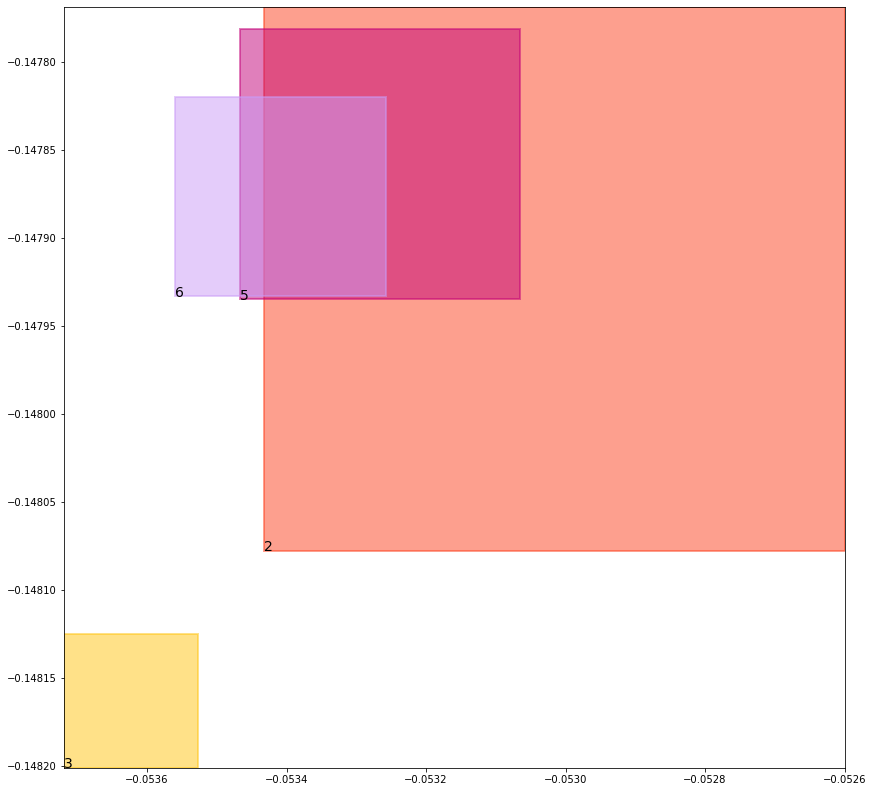

batch (tensor([[5, 3],
        [3, 5],
        [1, 2],
        [6, 2],
        [4, 6],
        [1, 3],
        [2, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0104022081941366, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0092266770079732, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509953379631042, grad_fn=<MulBackward0>)
previous loss: tensor(0.2706242203712463, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04566612094640732 0.06556189805269241 tensor(0.8551570177078247) tensor(0.9599015116691589)
tensor(2) 0.44350534677505493 0.5154922604560852 tensor(0.4441471099853516) tensor(0.5174369812011719)
tensor(3) 0.4333972632884979 0.5153541564941406 tensor(0.4362298846244812) tensor(0.5162153840065002)
tensor(4) 0.128393292427063 0.02930445224046707 tensor(0.9661897420883179) tensor(0.9451111555099487)
tensor(5) 0.5477595925331116 0.49932950735092163 tensor(0.5509905219078064) tensor(0.4996407330036163)
tensor(6) 0.5711729526519775 0.49613165855407715 tensor(0.5713265538215637) tensor(0.4963985979557037)


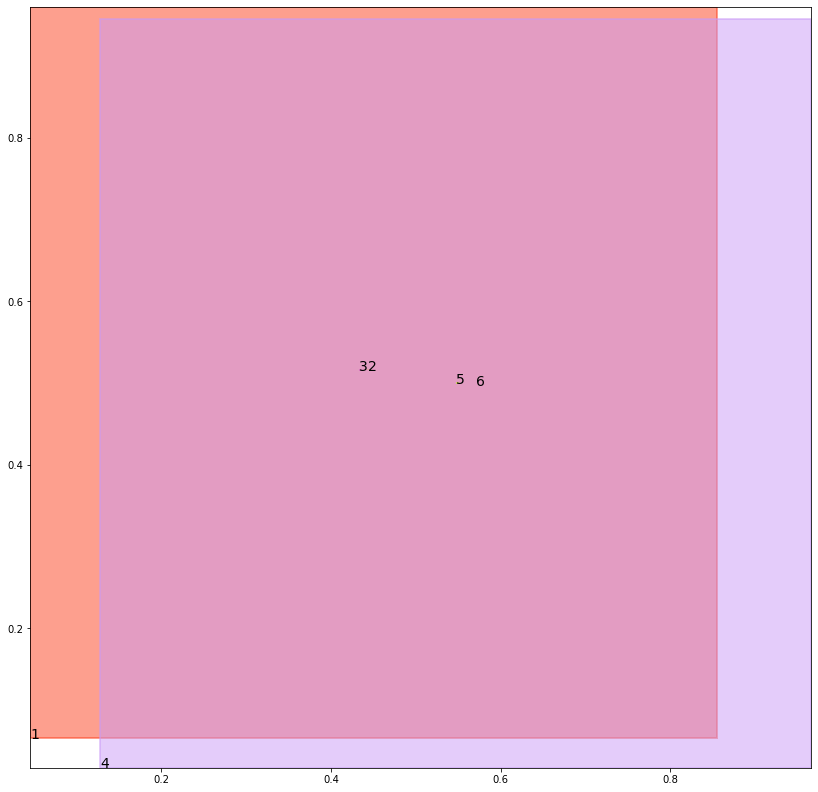

alignment data:
tensor(2) -0.05962091684341431 -0.14270396530628204 tensor(-0.0589935183525085) tensor(-0.1424696743488312)
tensor(3) -0.06012463569641113 -0.14290650188922882 tensor(-0.0597305297851562) tensor(-0.1427556574344635)
tensor(5) -0.059834301471710205 -0.14262662827968597 tensor(-0.0595911145210266) tensor(-0.1425313353538513)
tensor(6) -0.0597493052482605 -0.14255985617637634 tensor(-0.0596602559089661) tensor(-0.1425264775753021)


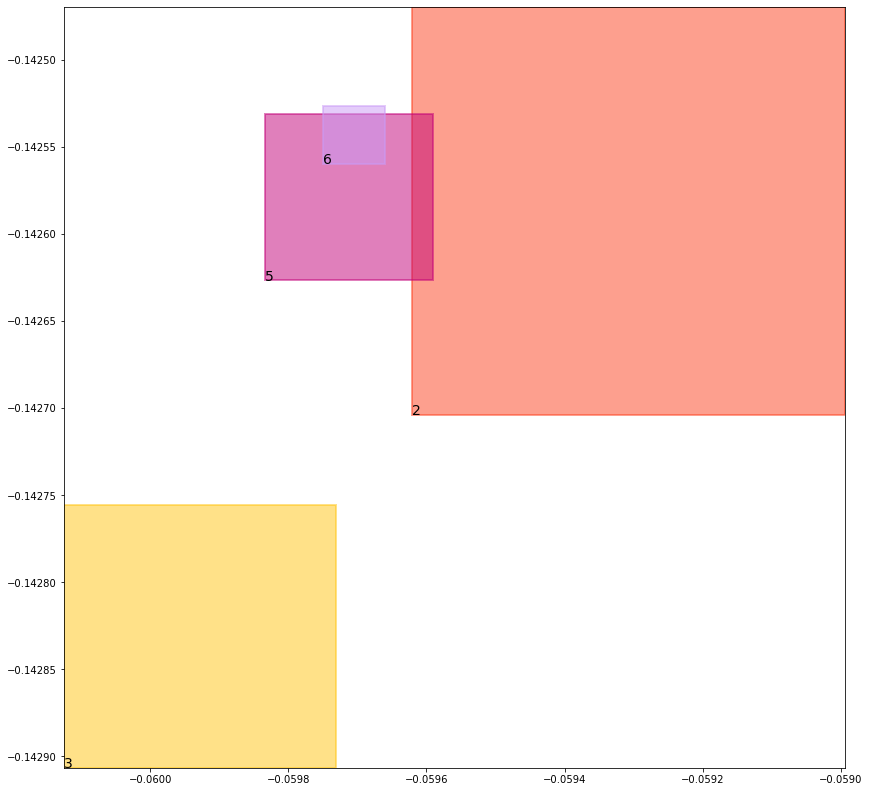

batch (tensor([[5, 3],
        [4, 6],
        [3, 5],
        [2, 6],
        [1, 3],
        [4, 5],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0103654991835356, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0091656493023038, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509984076023102, grad_fn=<MulBackward0>)
previous loss: tensor(0.2705295681953430, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.045595571398735046 0.06495081633329391 tensor(0.8559868931770325) tensor(0.9599810242652893)
tensor(2) 0.443869411945343 0.5161768794059753 tensor(0.4442066550254822) tensor(0.5168651938438416)
tensor(3) 0.43423953652381897 0.5151655673980713 tensor(0.4364286959171295) tensor(0.5160545706748962)
tensor(4) 0.12712456285953522 0.028922973200678825 tensor(0.9662292599678040) tensor(0.9451837539672852)
tensor(5) 0.5482954978942871 0.49848777055740356 tensor(0.5504785180091858) tensor(0.4994012117385864)
tensor(6) 0.569938063621521 0.49590569734573364 tensor(0.5707780718803406) tensor(0.4967125654220581)


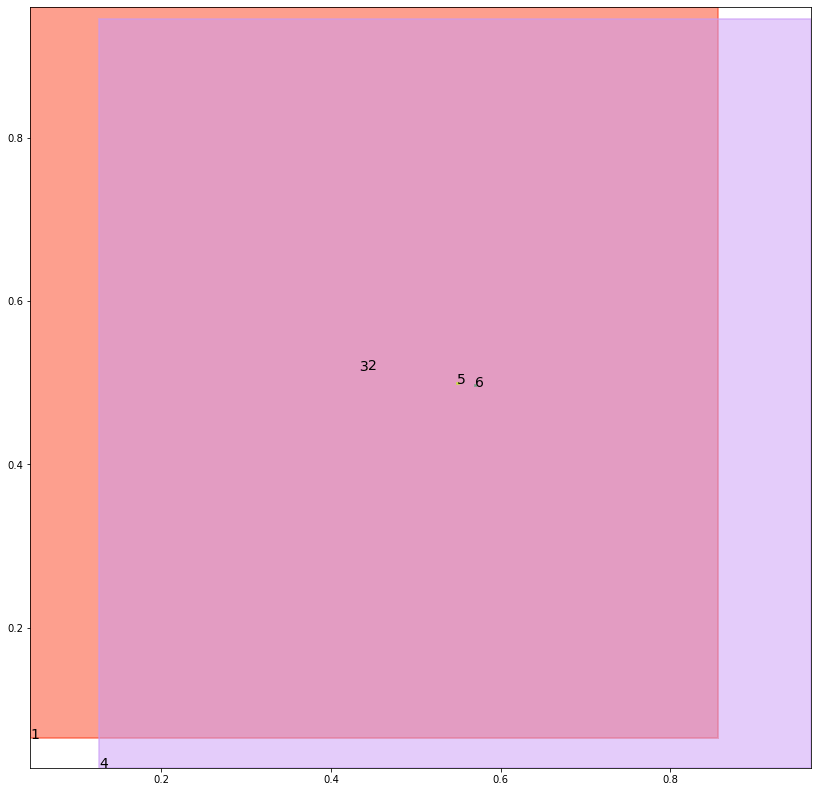

alignment data:
tensor(2) -0.06125396490097046 -0.12521275877952576 tensor(-0.0610267519950867) tensor(-0.1251276582479477)
tensor(3) -0.06200677156448364 -0.1255074143409729 tensor(-0.0616328716278076) tensor(-0.1253649294376373)
tensor(5) -0.061901867389678955 -0.12529948353767395 tensor(-0.0615207552909851) tensor(-0.1251543164253235)
tensor(6) -0.06185835599899292 -0.12513236701488495 tensor(-0.0615325570106506) tensor(-0.1250397115945816)


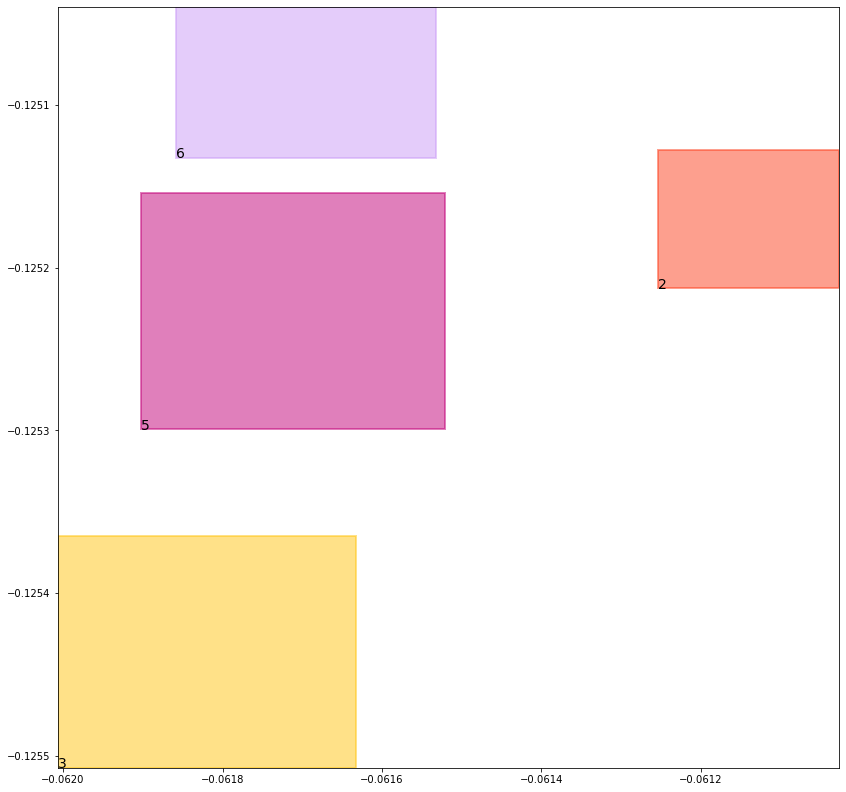

batch (tensor([[4, 5],
        [3, 5],
        [5, 3],
        [1, 3],
        [1, 2],
        [2, 6],
        [6, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0102974167093635, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0091254683211446, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509990632534027, grad_fn=<MulBackward0>)
previous loss: tensor(0.2704219520092010, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04552542418241501 0.0643499344587326 tensor(0.8568080067634583) tensor(0.9600601196289062)
tensor(2) 0.4440021514892578 0.5161793231964111 tensor(0.4448706507682800) tensor(0.5171833634376526)
tensor(3) 0.4352821707725525 0.5152720212936401 tensor(0.4363564550876617) tensor(0.5156079530715942)
tensor(4) 0.12588690221309662 0.028550533577799797 tensor(0.9662684202194214) tensor(0.9452561736106873)
tensor(5) 0.549180805683136 0.49803802371025085 tensor(0.5492866039276123) tensor(0.4990474283695221)
tensor(6) 0.5689749121665955 0.49557021260261536 tensor(0.5701275467872620) tensor(0.4967999458312988)


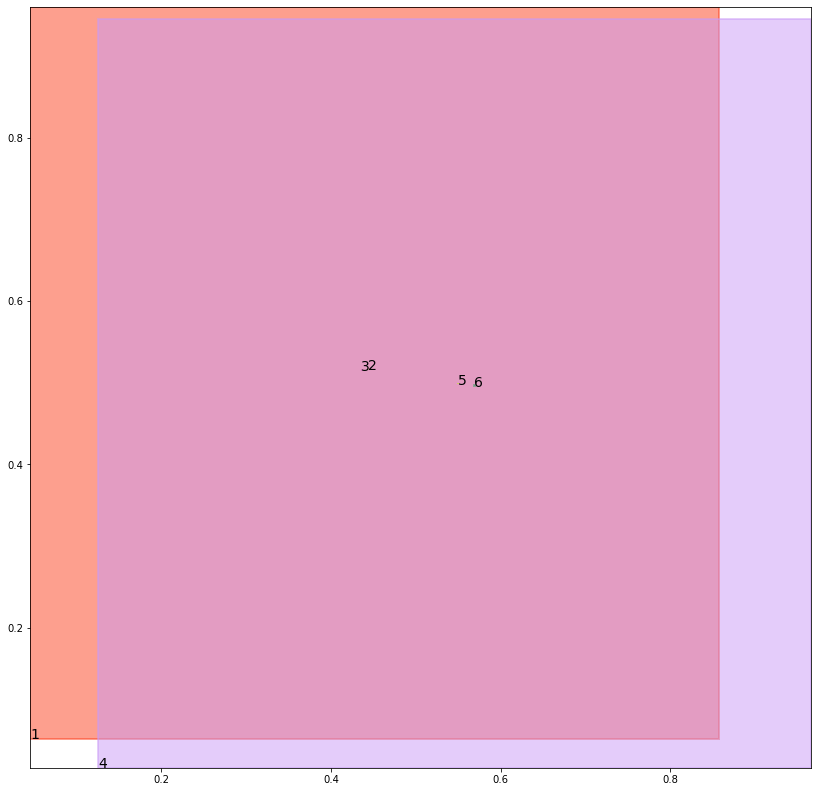

alignment data:
tensor(2) -0.06545209884643555 -0.10644112527370453 tensor(-0.0651033520698547) tensor(-0.1063097417354584)
tensor(3) -0.06613337993621826 -0.1067078560590744 tensor(-0.0659804940223694) tensor(-0.1066492646932602)
tensor(5) -0.06617635488510132 -0.10656124353408813 tensor(-0.0658611655235291) tensor(-0.1064434424042702)
tensor(6) -0.06602180004119873 -0.10647524148225784 tensor(-0.0655905008316040) tensor(-0.1063126623630524)


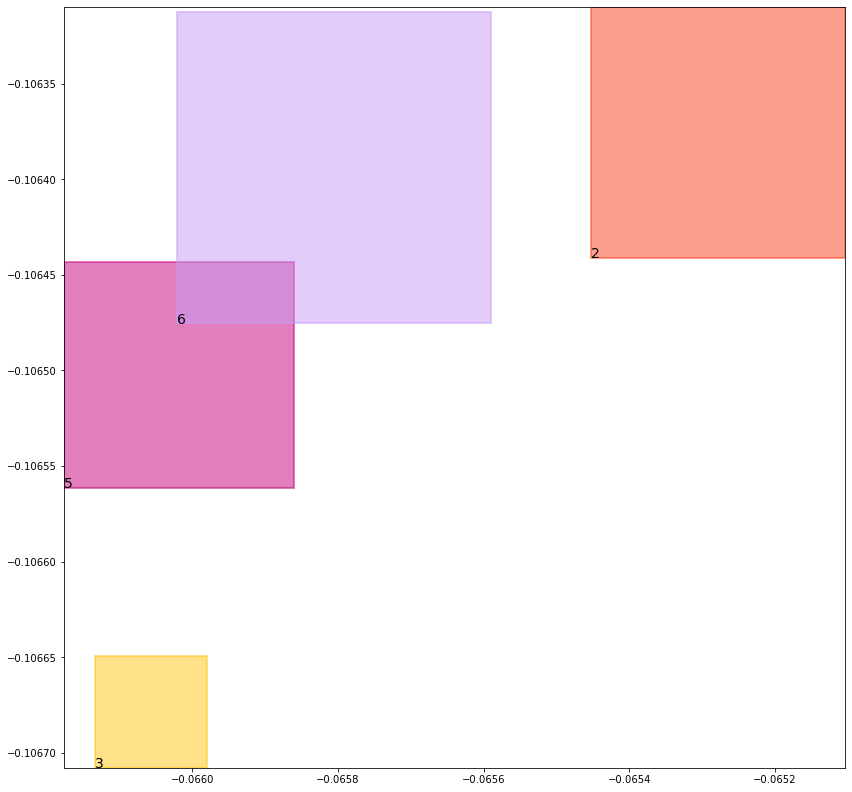

batch (tensor([[5, 3],
        [6, 2],
        [4, 5],
        [1, 3],
        [4, 6],
        [2, 6],
        [1, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0102450847625732, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0090636070817709, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509994208812714, grad_fn=<MulBackward0>)
previous loss: tensor(0.2703081071376801, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04545566812157631 0.06375915557146072 tensor(0.8576205372810364) tensor(0.9601387977600098)
tensor(2) 0.4441148340702057 0.5157003402709961 tensor(0.4451892375946045) tensor(0.5176305770874023)
tensor(3) 0.4360399544239044 0.5149032473564148 tensor(0.4365048110485077) tensor(0.5156416893005371)
tensor(4) 0.12467943876981735 0.028186751529574394 tensor(0.9663072824478149) tensor(0.9453282952308655)
tensor(5) 0.5474841594696045 0.49794870615005493 tensor(0.5503752827644348) tensor(0.4985905289649963)
tensor(6) 0.5683971047401428 0.49538174271583557 tensor(0.5692468285560608) tensor(0.4964205622673035)


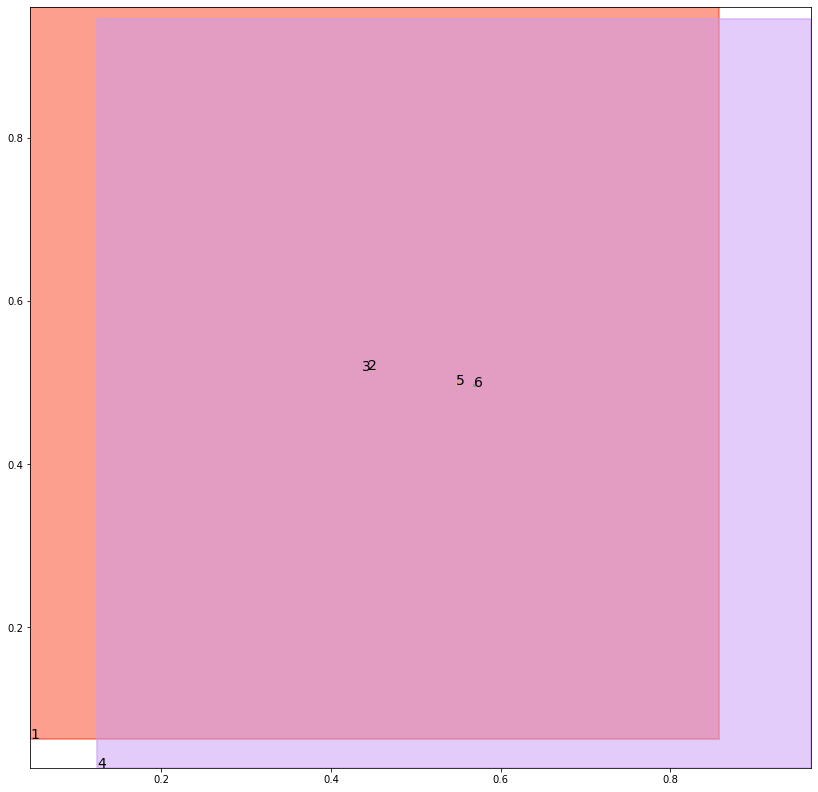

alignment data:
tensor(2) -0.0667908787727356 -0.09145891666412354 tensor(-0.0661478638648987) tensor(-0.0912168622016907)
tensor(3) -0.067410409450531 -0.09170165657997131 tensor(-0.0671619772911072) tensor(-0.0916080623865128)
tensor(5) -0.06745046377182007 -0.09156595170497894 tensor(-0.0671190619468689) tensor(-0.0914380550384521)
tensor(6) -0.06726902723312378 -0.09146983921527863 tensor(-0.0669103860855103) tensor(-0.0913344770669937)


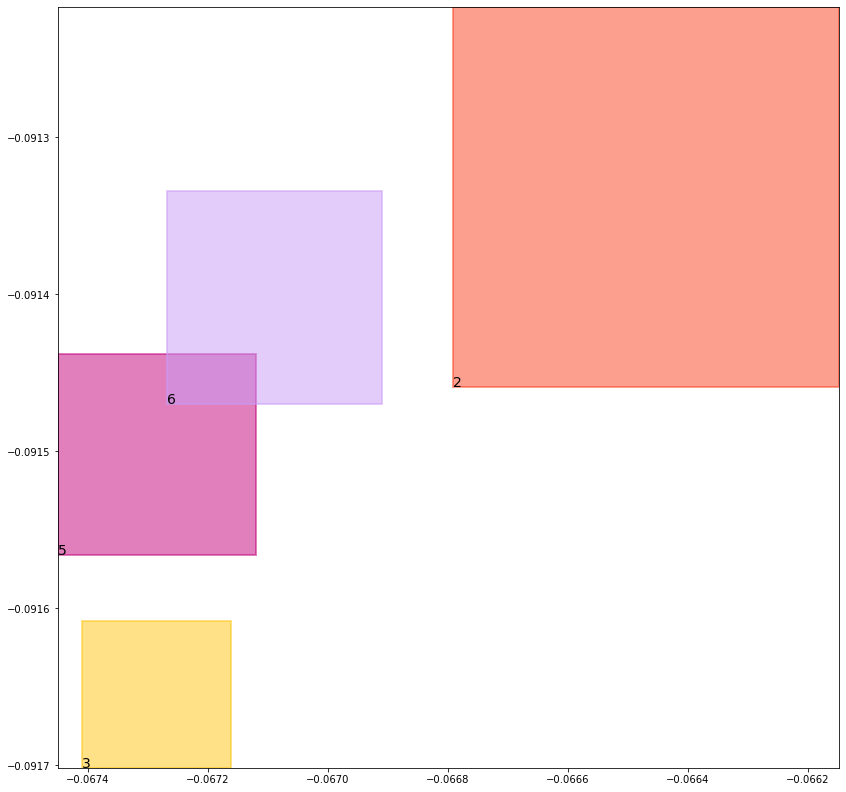

batch (tensor([[3, 5],
        [5, 3],
        [4, 5],
        [1, 2],
        [2, 6],
        [1, 3],
        [6, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0102114528417587, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0090479962527752, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509964108467102, grad_fn=<MulBackward0>)
previous loss: tensor(0.2702558636665344, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04538629576563835 0.0631781667470932 tensor(0.8584246635437012) tensor(0.9602172970771790)
tensor(2) 0.4445154666900635 0.5154096484184265 tensor(0.4448898434638977) tensor(0.5175607204437256)
tensor(3) 0.4361002445220947 0.5145429968833923 tensor(0.4374099969863892) tensor(0.5156765580177307)
tensor(4) 0.12350010126829147 0.027831362560391426 tensor(0.9663457870483398) tensor(0.9454002976417542)
tensor(5) 0.5465370416641235 0.4980411231517792 tensor(0.5510275363922119) tensor(0.4981856942176819)
tensor(6) 0.5681590437889099 0.49532586336135864 tensor(0.5681676268577576) tensor(0.4956272840499878)


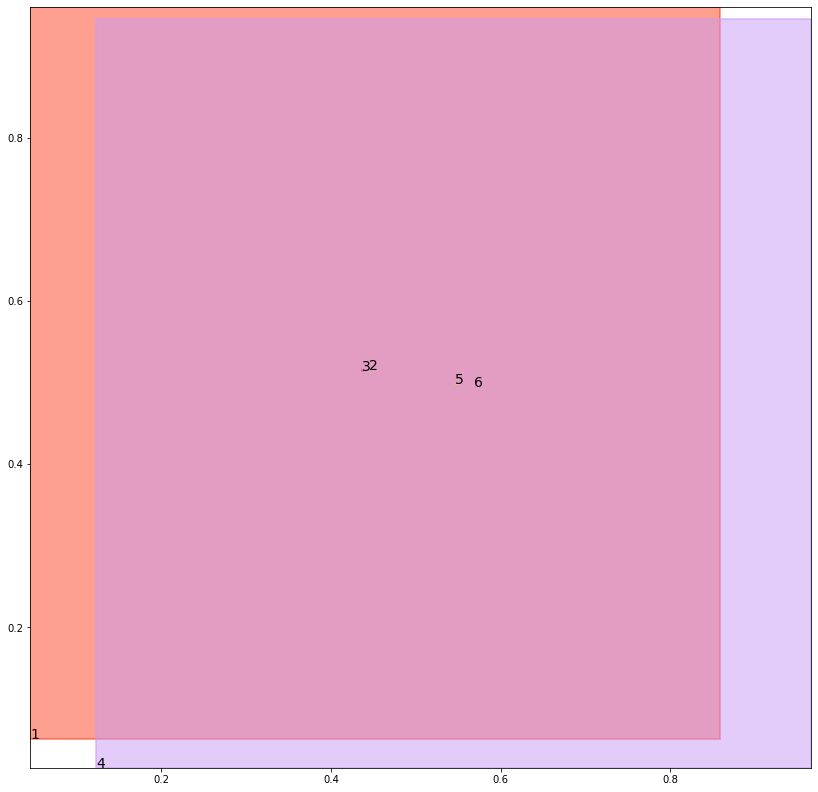

alignment data:
tensor(2) -0.07334977388381958 -0.08721937239170074 tensor(-0.0726715326309204) tensor(-0.0869644284248352)
tensor(3) -0.07400870323181152 -0.08747710287570953 tensor(-0.0735994577407837) tensor(-0.0873218923807144)
tensor(5) -0.07392460107803345 -0.087307408452034 tensor(-0.0736706852912903) tensor(-0.0872065126895905)
tensor(6) -0.07374978065490723 -0.08721475303173065 tensor(-0.0736567378044128) tensor(-0.0871798545122147)


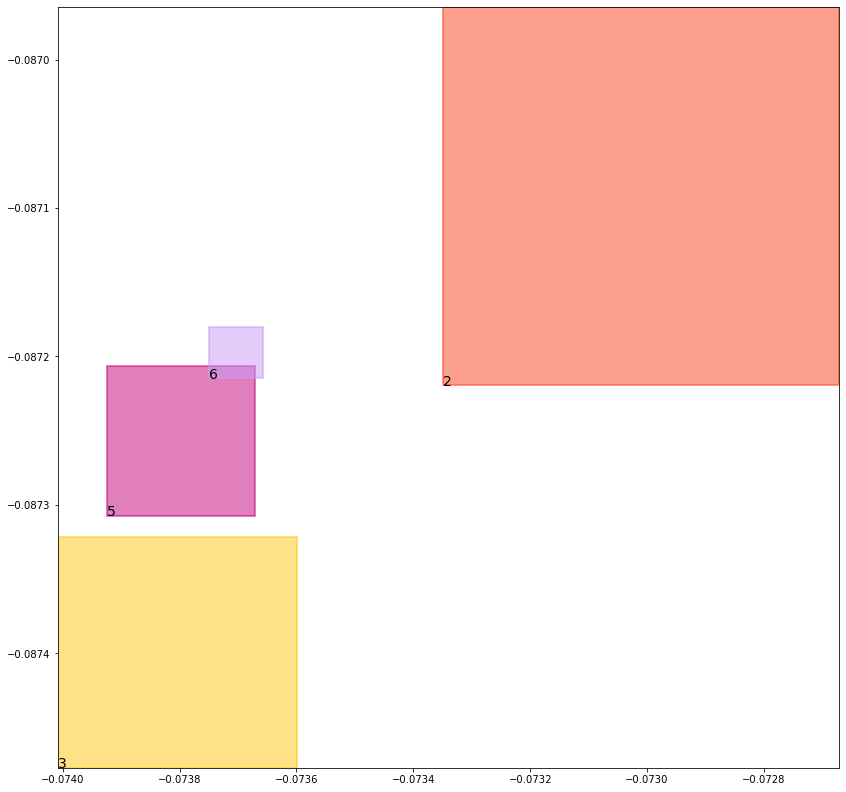

batch (tensor([[1, 3],
        [4, 5],
        [1, 2],
        [6, 2],
        [4, 6],
        [5, 3],
        [2, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0101800207048655, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0090055633336306, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509979605674744, grad_fn=<MulBackward0>)
previous loss: tensor(0.2701835334300995, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04531726986169815 0.06260666996240616 tensor(0.8592202663421631) tensor(0.9602954387664795)
tensor(2) 0.44403523206710815 0.5152900218963623 tensor(0.4451769292354584) tensor(0.5170167088508606)
tensor(3) 0.4365025460720062 0.5144966840744019 tensor(0.4380263388156891) tensor(0.5154056549072266)
tensor(4) 0.12234757840633392 0.027484139427542686 tensor(0.9663839340209961) tensor(0.9454720616340637)
tensor(5) 0.5463647842407227 0.49763864278793335 tensor(0.5511854887008667) tensor(0.4979512393474579)
tensor(6) 0.5673515200614929 0.4944695234298706 tensor(0.5674836635589600) tensor(0.4953894615173340)


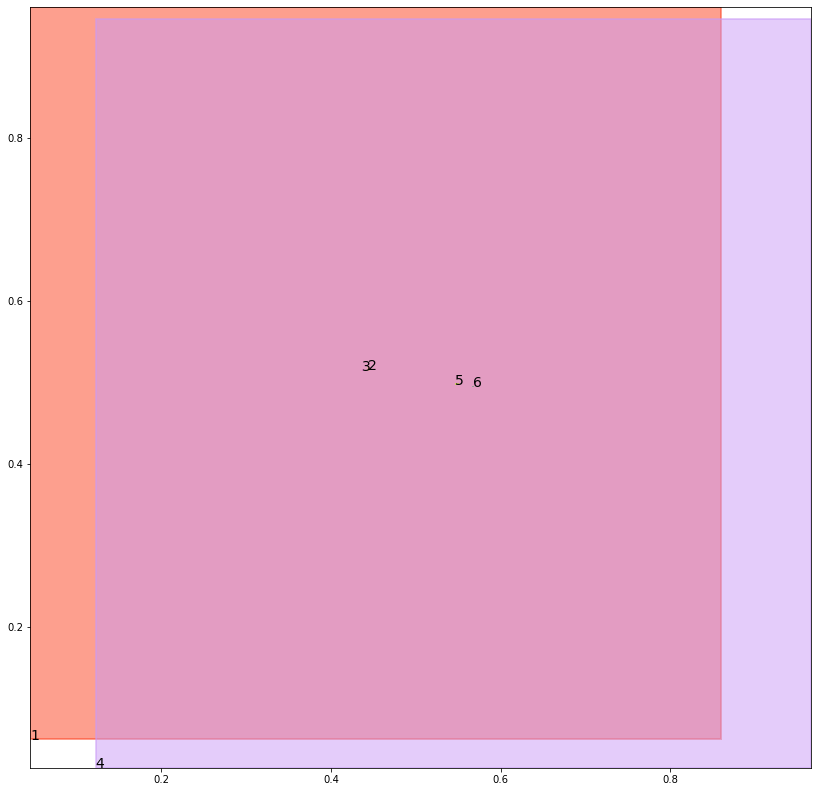

alignment data:
tensor(2) -0.07838040590286255 -0.08016453683376312 tensor(-0.0777965784072876) tensor(-0.0799435526132584)
tensor(3) -0.07897770404815674 -0.08039776980876923 tensor(-0.0786270499229431) tensor(-0.0802640914916992)
tensor(5) -0.07899594306945801 -0.08028078079223633 tensor(-0.0786736011505127) tensor(-0.0801540464162827)
tensor(6) -0.07898372411727905 -0.0802525132894516 tensor(-0.0786949992179871) tensor(-0.0801437497138977)


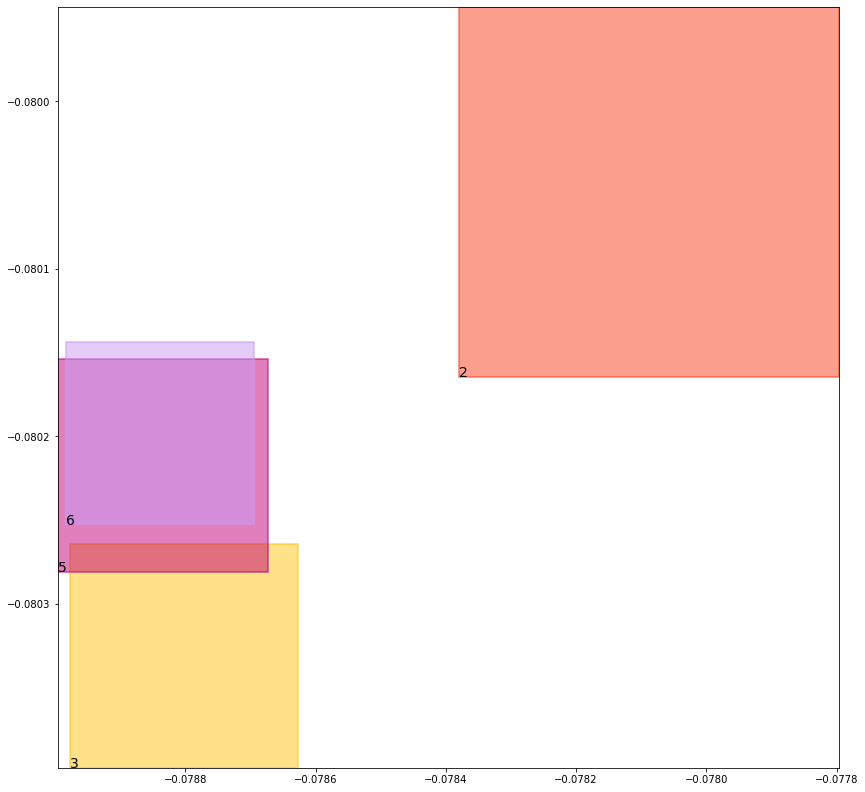

batch (tensor([[1, 2],
        [2, 6],
        [1, 3],
        [5, 3],
        [4, 5],
        [6, 2],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0101493410766125, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0089774169027805, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509969472885132, grad_fn=<MulBackward0>)
previous loss: tensor(0.2701237201690674, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04524855315685272 0.06204453110694885 tensor(0.8600078821182251) tensor(0.9603732824325562)
tensor(2) 0.44394373893737793 0.5153231620788574 tensor(0.4455173015594482) tensor(0.5160471200942993)
tensor(3) 0.43721434473991394 0.5147320032119751 tensor(0.4383804500102997) tensor(0.5148581862449646)
tensor(4) 0.12122072279453278 0.027144672349095345 tensor(0.9664220213890076) tensor(0.9455436468124390)
tensor(5) 0.5468892455101013 0.49728989601135254 tensor(0.5508939027786255) tensor(0.4973704218864441)
tensor(6) 0.5663892030715942 0.4937993586063385 tensor(0.5667985081672668) tensor(0.4953092634677887)


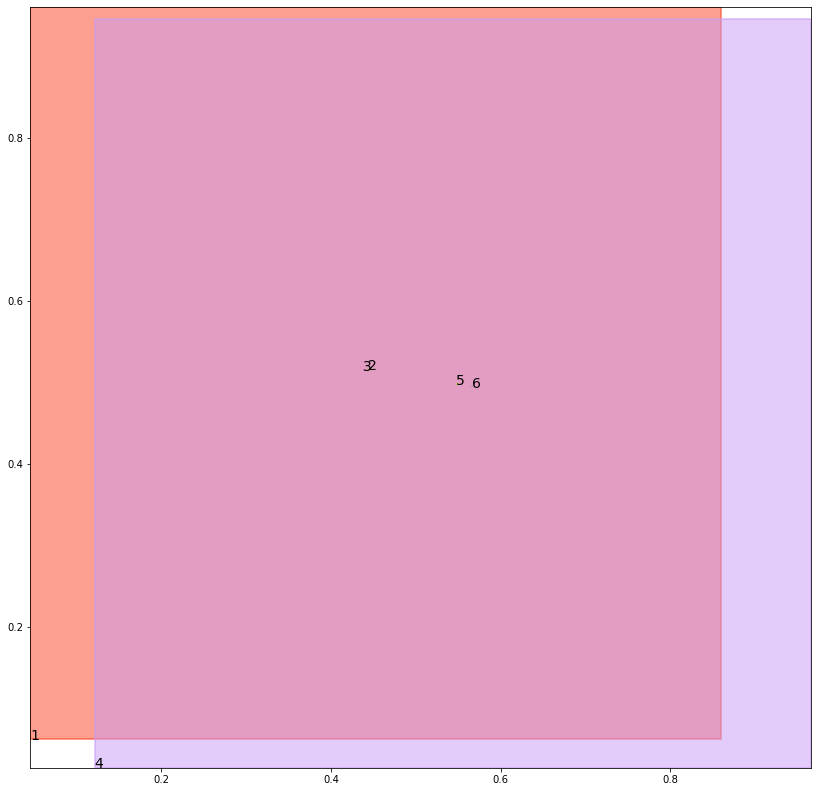

alignment data:
tensor(2) -0.08468526601791382 -0.08183558285236359 tensor(-0.0843887329101562) tensor(-0.0817221105098724)
tensor(3) -0.08518481254577637 -0.08203074336051941 tensor(-0.0850909352302551) tensor(-0.0819941610097885)
tensor(5) -0.08535456657409668 -0.08198699355125427 tensor(-0.0851405858993530) tensor(-0.0819023251533508)
tensor(6) -0.08550429344177246 -0.08202435076236725 tensor(-0.0850216150283813) tensor(-0.0818417221307755)


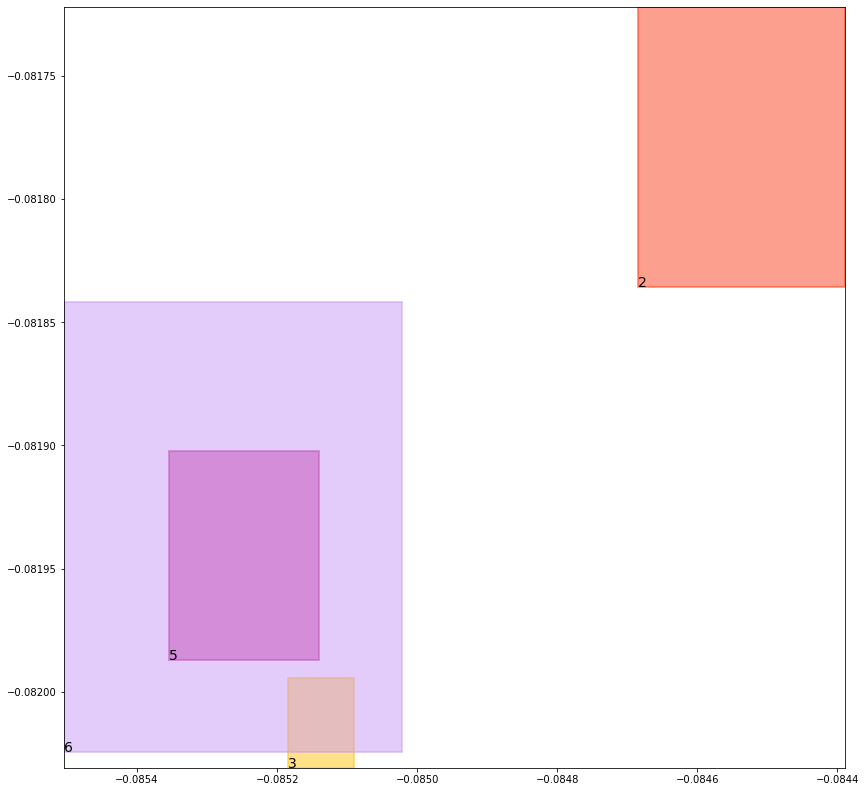

batch (tensor([[4, 5],
        [5, 3],
        [2, 6],
        [1, 2],
        [1, 3],
        [6, 2],
        [4, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0100940372794867, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0089340247213840, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510010898113251, grad_fn=<MulBackward0>)
previous loss: tensor(0.2700291574001312, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.045180127024650574 0.061491675674915314 tensor(0.8607876300811768) tensor(0.9604508876800537)
tensor(2) 0.44454425573349 0.5147030353546143 tensor(0.4455672502517700) tensor(0.5154919624328613)
tensor(3) 0.43820521235466003 0.5140613913536072 tensor(0.4384970068931580) tensor(0.5152175426483154)
tensor(4) 0.12011872977018356 0.02681262232363224 tensor(0.9664597511291504) tensor(0.9456149339675903)
tensor(5) 0.5480349659919739 0.4969932436943054 tensor(0.5501948595046997) tensor(0.4970161020755768)
tensor(6) 0.5656933784484863 0.49357980489730835 tensor(0.5660099387168884) tensor(0.4950965046882629)


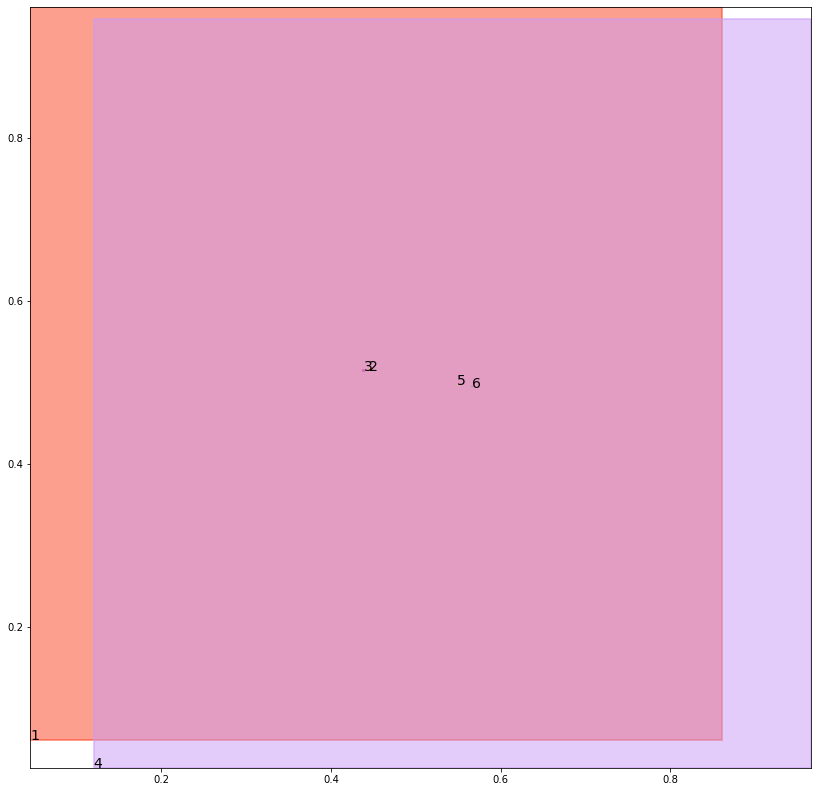

alignment data:
tensor(2) -0.09314459562301636 -0.08311925828456879 tensor(-0.0928540229797363) tensor(-0.0830083489418030)
tensor(3) -0.09364306926727295 -0.08331321179866791 tensor(-0.0932745933532715) tensor(-0.0831734240055084)
tensor(5) -0.0936511754989624 -0.08322609961032867 tensor(-0.0935414433479309) tensor(-0.0831827670335770)
tensor(6) -0.0938577651977539 -0.08328981697559357 tensor(-0.0933775305747986) tensor(-0.0831076800823212)


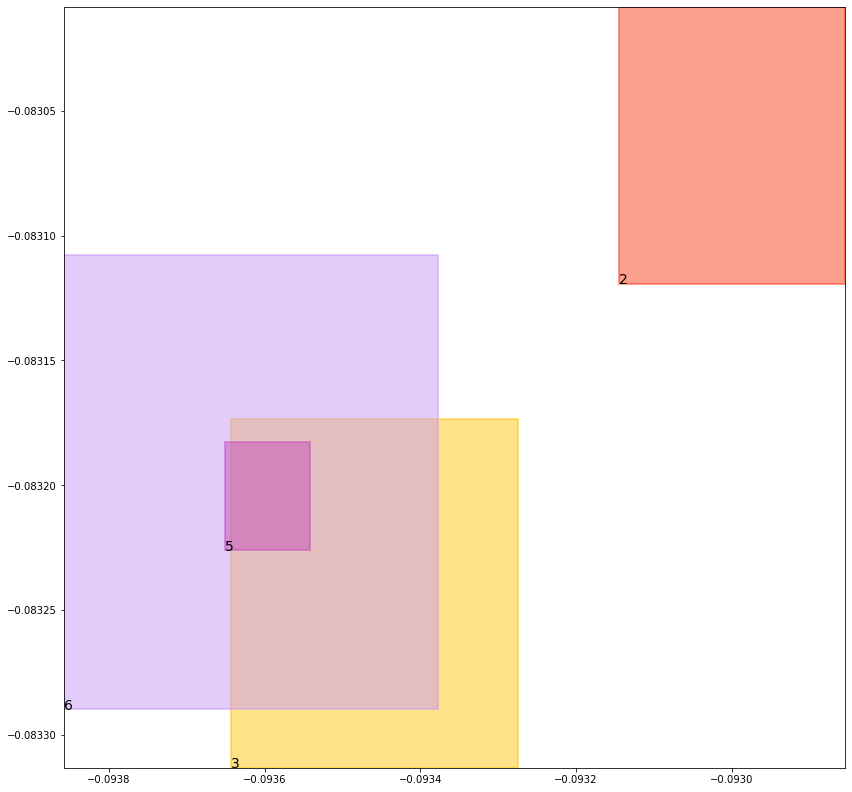

batch (tensor([[3, 5],
        [5, 3],
        [2, 6],
        [4, 5],
        [1, 2],
        [4, 6],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0100450590252876, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0088714528828859, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509994506835938, grad_fn=<MulBackward0>)
previous loss: tensor(0.2699159681797028, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0451120063662529 0.06094767525792122 tensor(0.8615593314170837) tensor(0.9605281352996826)
tensor(2) 0.44535529613494873 0.5138701796531677 tensor(0.4457695782184601) tensor(0.5154745578765869)
tensor(3) 0.4383987784385681 0.5136143565177917 tensor(0.4394472241401672) tensor(0.5153450369834900)
tensor(4) 0.11904120445251465 0.026487745344638824 tensor(0.9664971828460693) tensor(0.9456860423088074)
tensor(5) 0.5491284132003784 0.49632763862609863 tensor(0.5497280359268188) tensor(0.4967489838600159)
tensor(6) 0.565008819103241 0.49376609921455383 tensor(0.5653586387634277) tensor(0.4947627782821655)


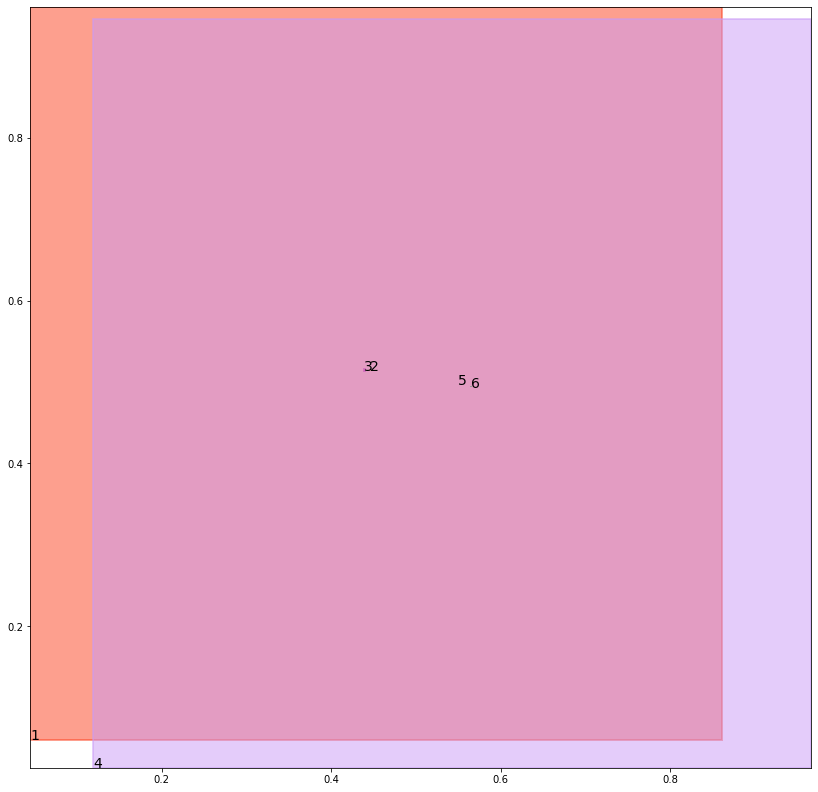

alignment data:
tensor(2) -0.09866935014724731 -0.08123211562633514 tensor(-0.0981578826904297) tensor(-0.0810374915599823)
tensor(3) -0.09908109903335571 -0.08139307796955109 tensor(-0.0985005497932434) tensor(-0.0811717957258224)
tensor(5) -0.09907203912734985 -0.08131808042526245 tensor(-0.0989142060279846) tensor(-0.0812577158212662)
tensor(6) -0.09909600019454956 -0.08131694793701172 tensor(-0.0987737774848938) tensor(-0.0811942666769028)


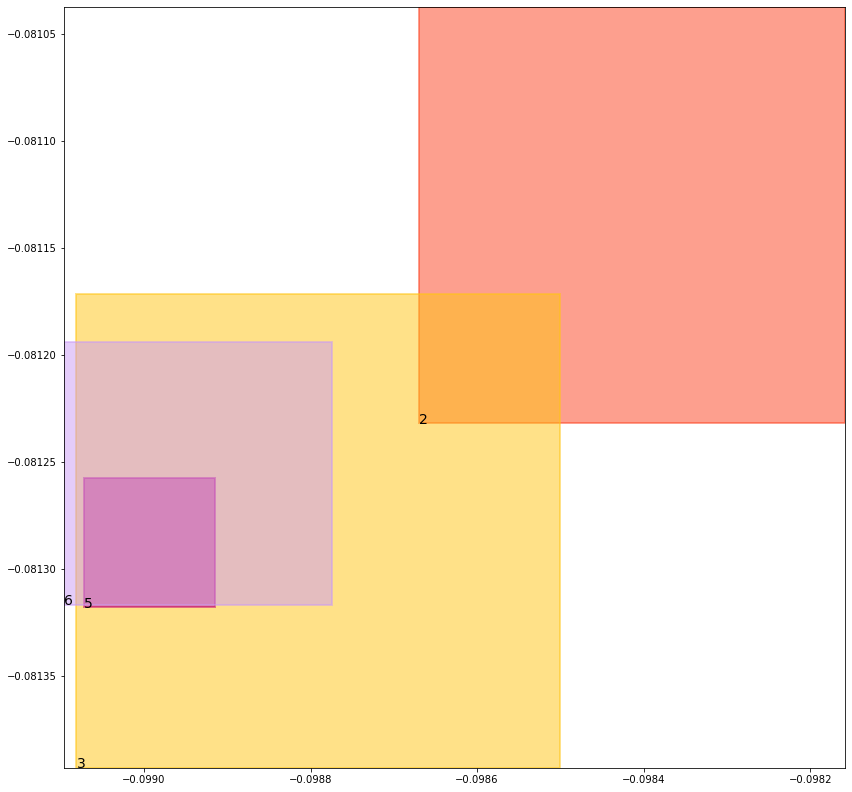

batch (tensor([[4, 5],
        [2, 6],
        [5, 3],
        [4, 6],
        [1, 3],
        [1, 2],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0100210960954428, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0088155288249254, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509965002536774, grad_fn=<MulBackward0>)
previous loss: tensor(0.2698331177234650, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0450441874563694 0.06041214242577553 tensor(0.8623234033584595) tensor(0.9606050848960876)
tensor(2) 0.44546517729759216 0.5135100483894348 tensor(0.4462977349758148) tensor(0.5152872204780579)
tensor(3) 0.43858781456947327 0.5134846568107605 tensor(0.4403152465820312) tensor(0.5151444673538208)
tensor(4) 0.11798768490552902 0.026169801130890846 tensor(0.9665344953536987) tensor(0.9457570910453796)
tensor(5) 0.5485411286354065 0.496029794216156 tensor(0.5505148768424988) tensor(0.4963966012001038)
tensor(6) 0.564281702041626 0.49431076645851135 tensor(0.5645830035209656) tensor(0.4943206608295441)


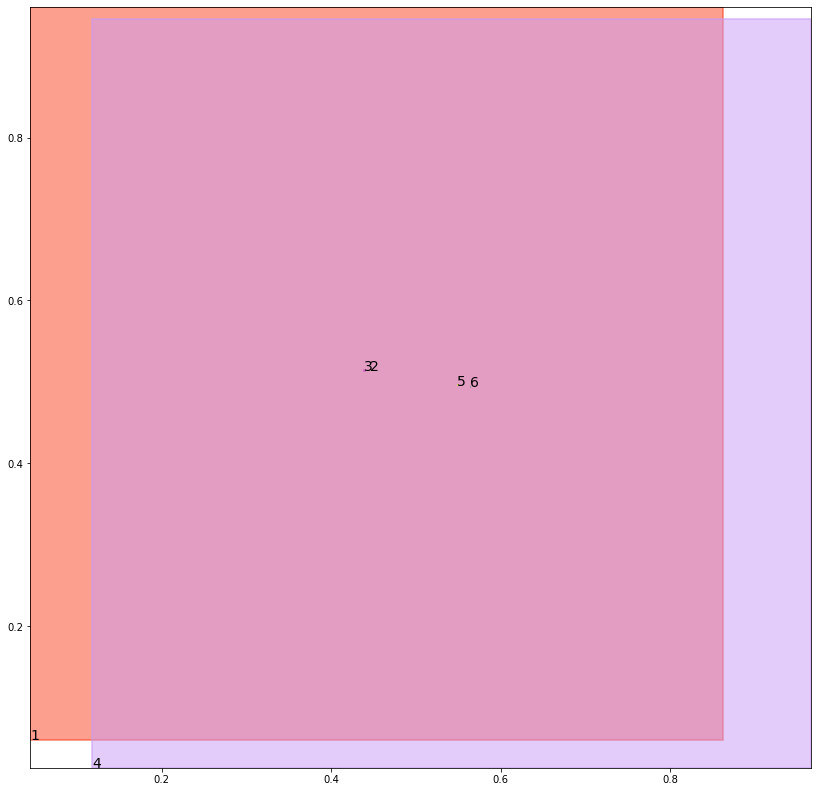

alignment data:
tensor(2) -0.10216301679611206 -0.08130931854248047 tensor(-0.1015786528587341) tensor(-0.0810861289501190)
tensor(3) -0.10250276327133179 -0.08144201338291168 tensor(-0.1019111275672913) tensor(-0.0812156349420547)
tensor(5) -0.10254067182540894 -0.08140584826469421 tensor(-0.1023331284523010) tensor(-0.0813258141279221)
tensor(6) -0.10230737924575806 -0.08130964636802673 tensor(-0.1022898554801941) tensor(-0.0813028216362000)


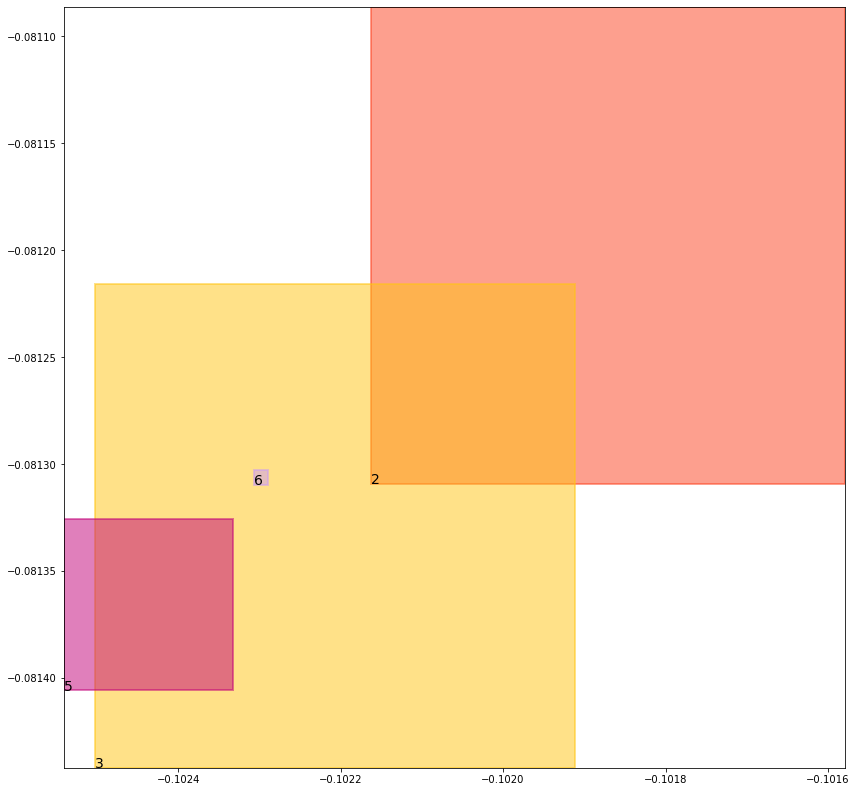

batch (tensor([[1, 2],
        [5, 3],
        [2, 6],
        [4, 5],
        [4, 6],
        [1, 3],
        [6, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0100002065300941, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0087870247662067, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509980499744415, grad_fn=<MulBackward0>)
previous loss: tensor(0.2697852849960327, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04497664421796799 0.059884872287511826 tensor(0.8630803227424622) tensor(0.9606819152832031)
tensor(2) 0.4458673596382141 0.5135851502418518 tensor(0.4461938142776489) tensor(0.5149451494216919)
tensor(3) 0.4390370845794678 0.5136407613754272 tensor(0.4408431053161621) tensor(0.5146465301513672)
tensor(4) 0.11695689707994461 0.025858666747808456 tensor(0.9665715694427490) tensor(0.9458279013633728)
tensor(5) 0.5483872294425964 0.4959467053413391 tensor(0.5504751205444336) tensor(0.4960882365703583)
tensor(6) 0.5634100437164307 0.4937816858291626 tensor(0.5638027191162109) tensor(0.4951689839363098)


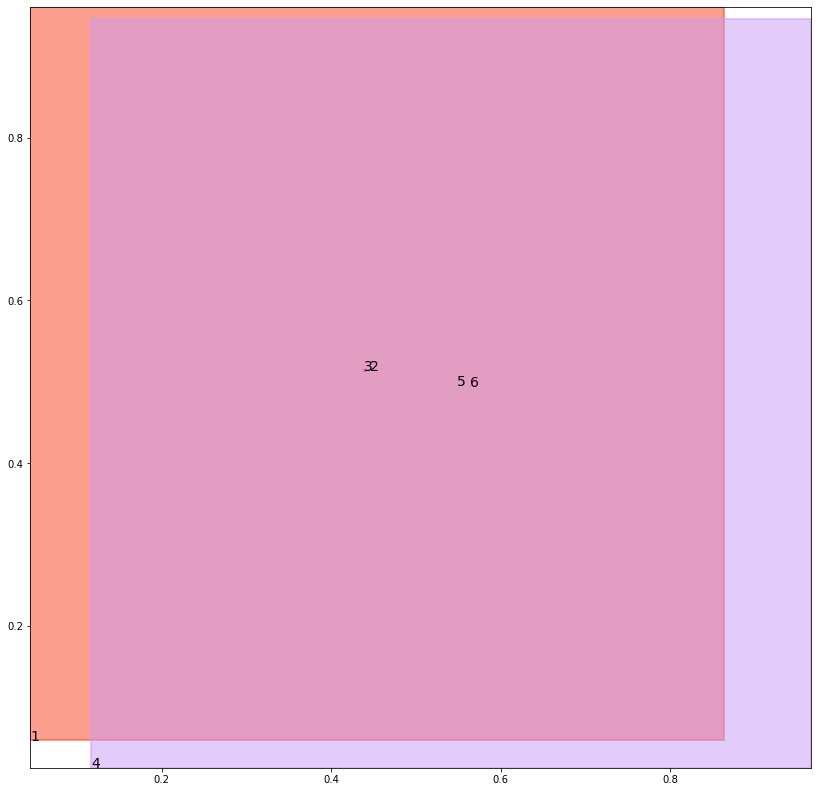

alignment data:
tensor(2) -0.10567700862884521 -0.07622972130775452 tensor(-0.1052451133728027) tensor(-0.0760643631219864)
tensor(3) -0.10599201917648315 -0.0763520896434784 tensor(-0.1055965423583984) tensor(-0.0762002766132355)
tensor(5) -0.10609042644500732 -0.07636028528213501 tensor(-0.1059455871582031) tensor(-0.0763043314218521)
tensor(6) -0.10602259635925293 -0.0763302892446518 tensor(-0.1055791378021240) tensor(-0.0761604905128479)


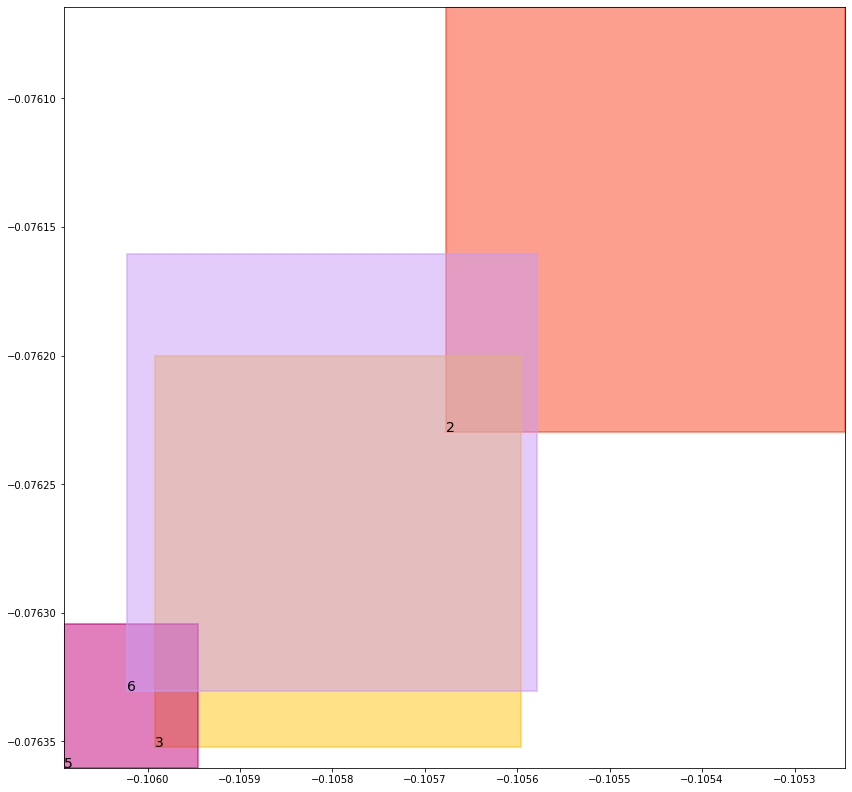

batch (tensor([[1, 3],
        [5, 3],
        [4, 6],
        [1, 2],
        [6, 2],
        [3, 5],
        [2, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0099478904157877, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0087646264582872, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509977221488953, grad_fn=<MulBackward0>)
previous loss: tensor(0.2697102427482605, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.044909365475177765 0.059365853667259216 tensor(0.8638299703598022) tensor(0.9607584476470947)
tensor(2) 0.445522278547287 0.5140471458435059 tensor(0.4465337395668030) tensor(0.5144665837287903)
tensor(3) 0.4397217631340027 0.5138817429542542 tensor(0.4410625398159027) tensor(0.5140528678894043)
tensor(4) 0.11594781279563904 0.025554098188877106 tensor(0.9666086435317993) tensor(0.9458985924720764)
tensor(5) 0.5486236214637756 0.4956391751766205 tensor(0.5496857762336731) tensor(0.4957040846347809)
tensor(6) 0.5626449584960938 0.49341073632240295 tensor(0.5630837678909302) tensor(0.4954809844493866)


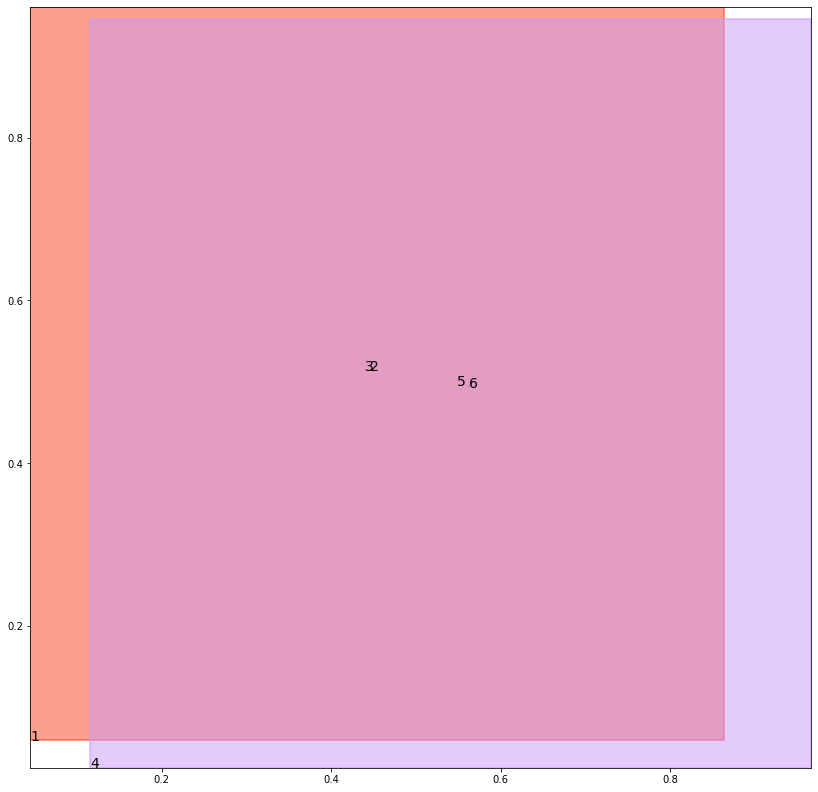

alignment data:
tensor(2) -0.10105586051940918 -0.07251037657260895 tensor(-0.1008781194686890) tensor(-0.0724420547485352)
tensor(3) -0.10139042139053345 -0.07263925671577454 tensor(-0.1012724637985229) tensor(-0.0725938379764557)
tensor(5) -0.10163694620132446 -0.07272550463676453 tensor(-0.1015651226043701) tensor(-0.0726978480815887)
tensor(6) -0.10163187980651855 -0.07272246479988098 tensor(-0.1009773612022400) tensor(-0.0724712312221527)


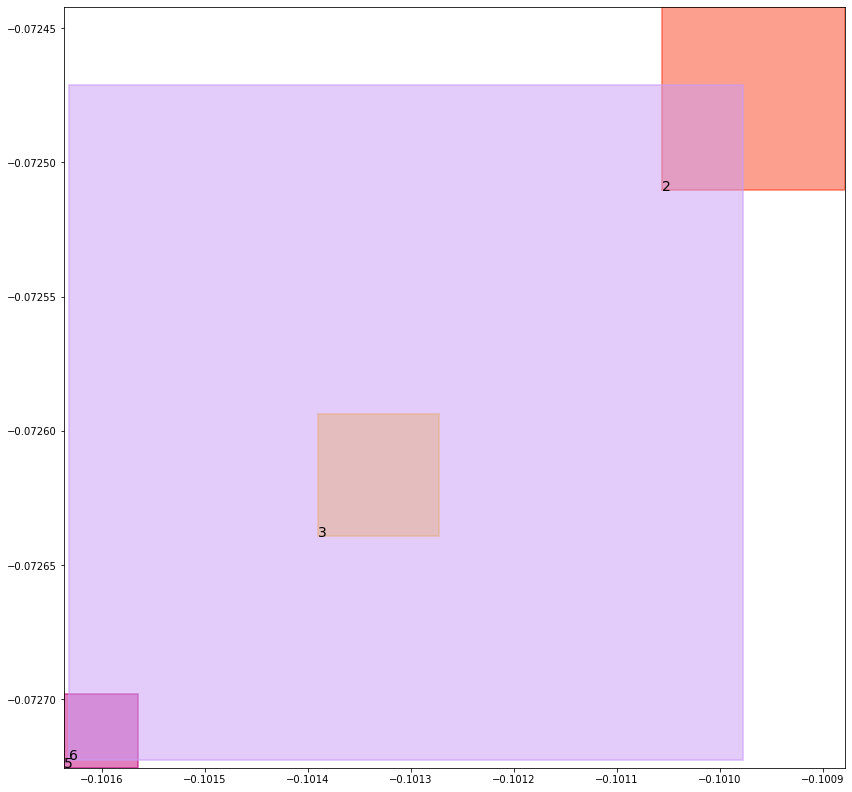

batch (tensor([[1, 3],
        [2, 6],
        [4, 5],
        [5, 3],
        [3, 5],
        [1, 2],
        [6, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0098987668752670, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0087231397628784, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510012984275818, grad_fn=<MulBackward0>)
previous loss: tensor(0.2696232199668884, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04484233632683754 0.05885513499379158 tensor(0.8645724654197693) tensor(0.9608347415924072)
tensor(2) 0.44560137391090393 0.5138670206069946 tensor(0.4468803703784943) tensor(0.5148492455482483)
tensor(3) 0.44061851501464844 0.5134602189064026 tensor(0.4410031139850616) tensor(0.5141169428825378)
tensor(4) 0.11495967209339142 0.025255843997001648 tensor(0.9666451811790466) tensor(0.9459691047668457)
tensor(5) 0.548221230506897 0.4949193596839905 tensor(0.5492101907730103) tensor(0.4954620301723480)
tensor(6) 0.5621481537818909 0.49319443106651306 tensor(0.5622504353523254) tensor(0.4952892959117889)


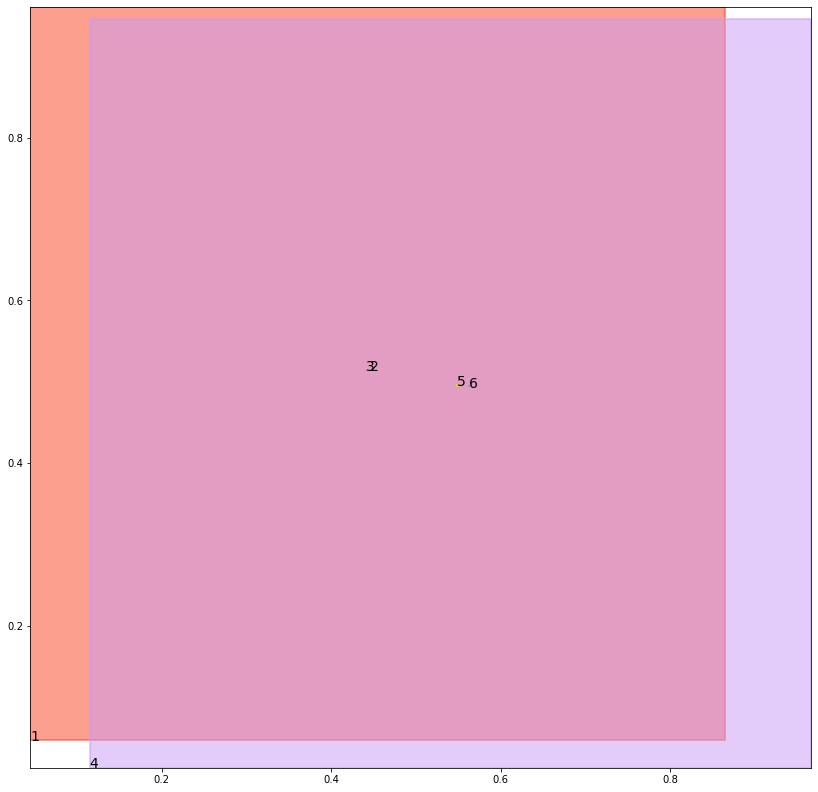

alignment data:
tensor(2) -0.10171163082122803 -0.06026643514633179 tensor(-0.1013485789299011) tensor(-0.0601267218589783)
tensor(3) -0.10208159685134888 -0.060408368706703186 tensor(-0.1018619537353516) tensor(-0.0603238046169281)
tensor(5) -0.10244172811508179 -0.06055933237075806 tensor(-0.1022271513938904) tensor(-0.0604768097400665)
tensor(6) -0.10228210687637329 -0.06049945950508118 tensor(-0.1016371846199036) tensor(-0.0602510124444962)


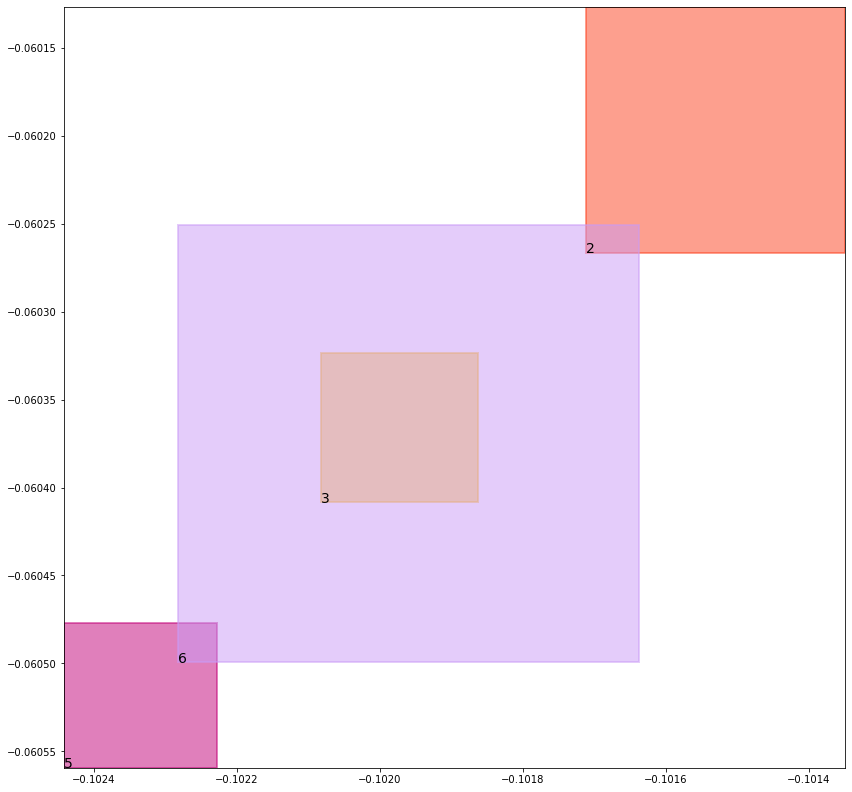

batch (tensor([[3, 5],
        [4, 6],
        [1, 3],
        [2, 6],
        [6, 2],
        [5, 3],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0098634921014309, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0086882058531046, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509976029396057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2695493102073669, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04477556049823761 0.05835246667265892 tensor(0.8653079271316528) tensor(0.9609106779098511)
tensor(2) 0.4463605284690857 0.5134660601615906 tensor(0.4469373226165771) tensor(0.5151121020317078)
tensor(3) 0.44069236516952515 0.513347864151001 tensor(0.4417058825492859) tensor(0.5138634443283081)
tensor(4) 0.11399152129888535 0.024963652715086937 tensor(0.9666817188262939) tensor(0.9460394978523254)
tensor(5) 0.547533392906189 0.49455225467681885 tensor(0.5493012666702271) tensor(0.4951708316802979)
tensor(6) 0.5614258050918579 0.4931185841560364 tensor(0.5614823698997498) tensor(0.4946474134922028)


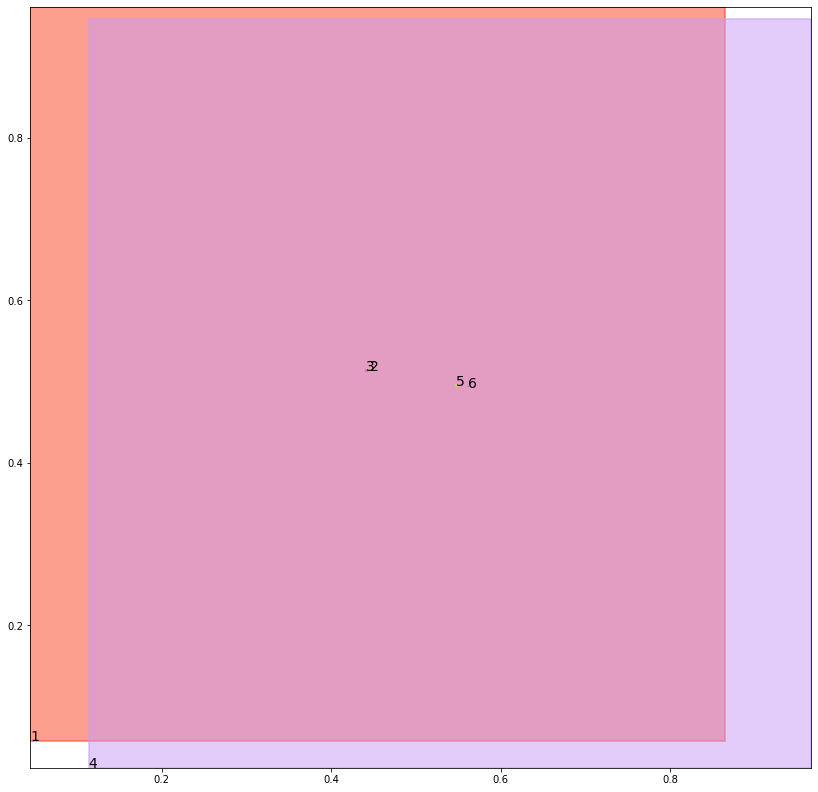

alignment data:
tensor(2) -0.10871052742004395 -0.05019482970237732 tensor(-0.1081793308258057) tensor(-0.0499897897243500)
tensor(3) -0.10902798175811768 -0.05031578242778778 tensor(-0.1088201999664307) tensor(-0.0502358376979828)
tensor(5) -0.10946178436279297 -0.05051623284816742 tensor(-0.1091852188110352) tensor(-0.0504098832607269)
tensor(6) -0.10920977592468262 -0.050423115491867065 tensor(-0.1087402105331421) tensor(-0.0502417087554932)


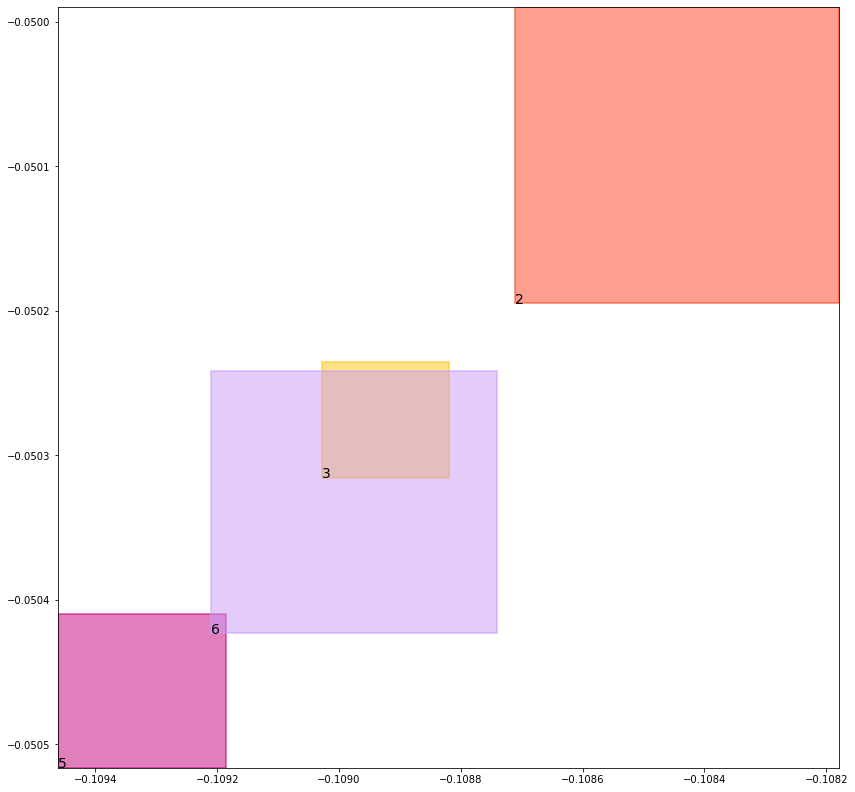

batch (tensor([[4, 6],
        [3, 5],
        [1, 2],
        [5, 3],
        [2, 6],
        [4, 5],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0098325219005346, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0086587741971016, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509973943233490, grad_fn=<MulBackward0>)
previous loss: tensor(0.2694886922836304, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04470902681350708 0.05785762891173363 tensor(0.8660364151000977) tensor(0.9609864950180054)
tensor(2) 0.4467325508594513 0.513245701789856 tensor(0.4477323293685913) tensor(0.5148772597312927)
tensor(3) 0.4407561719417572 0.513322651386261 tensor(0.4424821138381958) tensor(0.5135133266448975)
tensor(4) 0.11304233968257904 0.0246773399412632 tensor(0.9667180776596069) tensor(0.9461098313331604)
tensor(5) 0.5475491285324097 0.4945666491985321 tensor(0.5489425063133240) tensor(0.4947766065597534)
tensor(6) 0.56059730052948 0.49316927790641785 tensor(0.5609782338142395) tensor(0.4936092495918274)


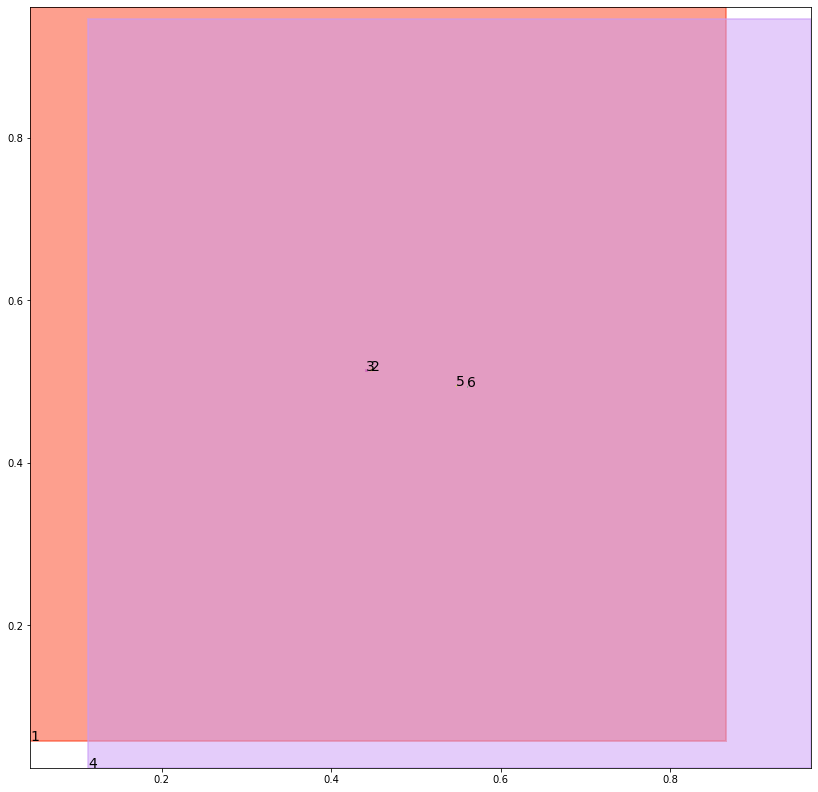

alignment data:
tensor(2) -0.11302274465560913 -0.034572601318359375 tensor(-0.1124750971794128) tensor(-0.0343608111143112)
tensor(3) -0.11329799890518188 -0.03467634320259094 tensor(-0.1131535768508911) tensor(-0.0346212089061737)
tensor(5) -0.1136789321899414 -0.034877702593803406 tensor(-0.1135452389717102) tensor(-0.0348265916109085)
tensor(6) -0.1134527325630188 -0.03479659557342529 tensor(-0.1132995486259460) tensor(-0.0347373634576797)


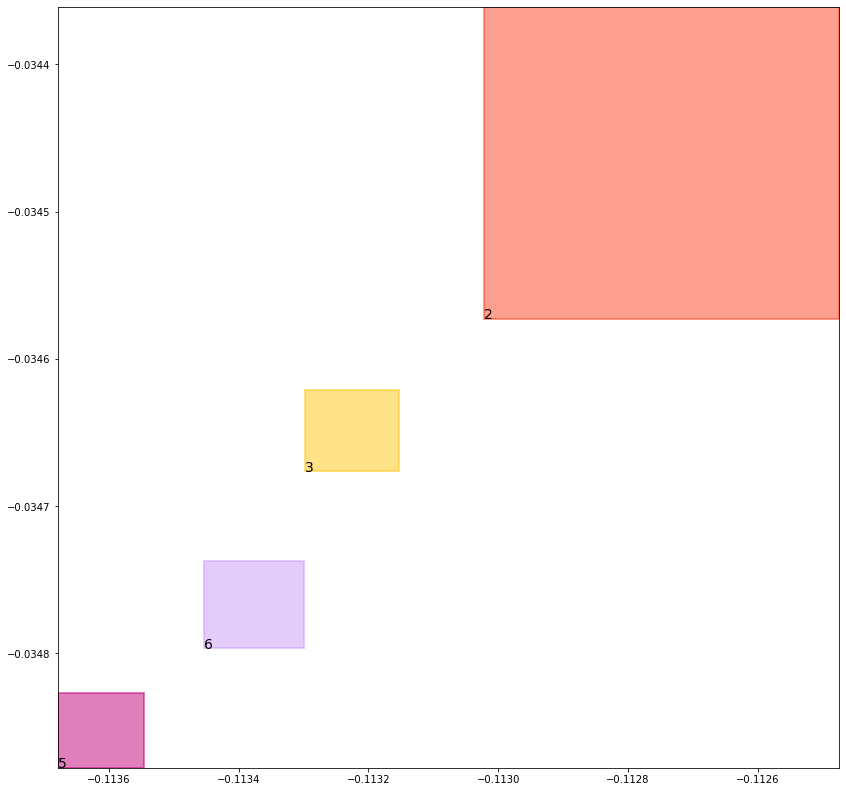

batch (tensor([[5, 3],
        [1, 2],
        [4, 6],
        [1, 3],
        [4, 5],
        [2, 6],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0098096188157797, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0086134728044271, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510020136833191, grad_fn=<MulBackward0>)
previous loss: tensor(0.2694250941276550, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.044642724096775055 0.05737045034766197 tensor(0.8667582869529724) tensor(0.9610621333122253)
tensor(2) 0.4468519985675812 0.5131892561912537 tensor(0.4483918547630310) tensor(0.5141854882240295)
tensor(3) 0.441159725189209 0.5130976438522339 tensor(0.4429756700992584) tensor(0.5133472084999084)
tensor(4) 0.11211138963699341 0.024396779015660286 tensor(0.9667542576789856) tensor(0.9461799263954163)
tensor(5) 0.5481767654418945 0.4942897856235504 tensor(0.5481966137886047) tensor(0.4949250221252441)
tensor(6) 0.5599784851074219 0.49222588539123535 tensor(0.5601087212562561) tensor(0.4933339953422546)


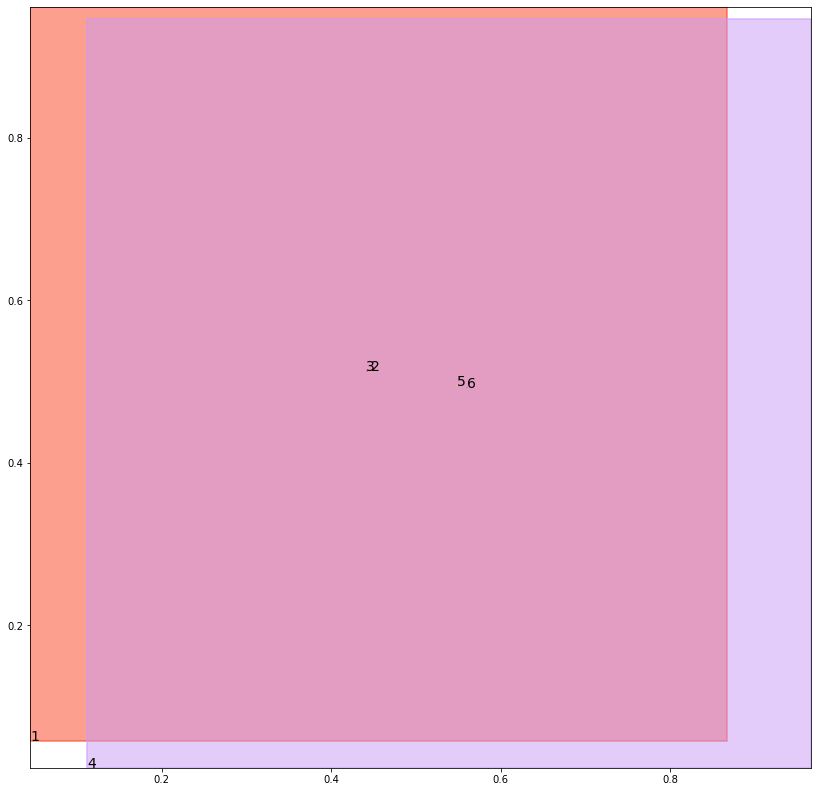

alignment data:
tensor(2) -0.11563760042190552 -0.020622387528419495 tensor(-0.1152564287185669) tensor(-0.0204752981662750)
tensor(3) -0.11595213413238525 -0.02074076235294342 tensor(-0.1157847046852112) tensor(-0.0206768959760666)
tensor(5) -0.11629146337509155 -0.020947620272636414 tensor(-0.1160969734191895) tensor(-0.0208719968795776)
tensor(6) -0.1163257360458374 -0.020969226956367493 tensor(-0.1159816384315491) tensor(-0.0208355039358139)


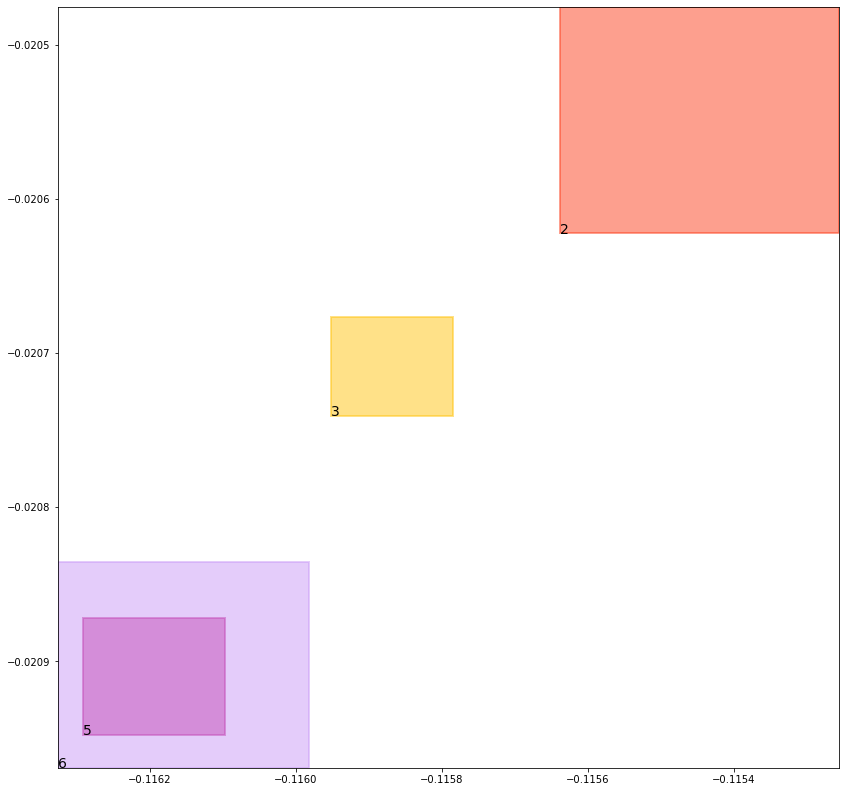

batch (tensor([[1, 3],
        [2, 6],
        [4, 6],
        [5, 3],
        [3, 5],
        [6, 2],
        [1, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0097784996032715, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0085716303437948, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510011792182922, grad_fn=<MulBackward0>)
previous loss: tensor(0.2693513035774231, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04457663372159004 0.05689077079296112 tensor(0.8674738407135010) tensor(0.9611375927925110)
tensor(2) 0.44726505875587463 0.5130853056907654 tensor(0.4484053254127502) tensor(0.5132784247398376)
tensor(3) 0.4418705403804779 0.5128820538520813 tensor(0.4432129263877869) tensor(0.5131590962409973)
tensor(4) 0.11119826138019562 0.024121705442667007 tensor(0.9667903780937195) tensor(0.9462500810623169)
tensor(5) 0.5478509068489075 0.4939538538455963 tensor(0.5480305552482605) tensor(0.4948119223117828)
tensor(6) 0.5588592886924744 0.4913696050643921 tensor(0.5596011877059937) tensor(0.4933435916900635)


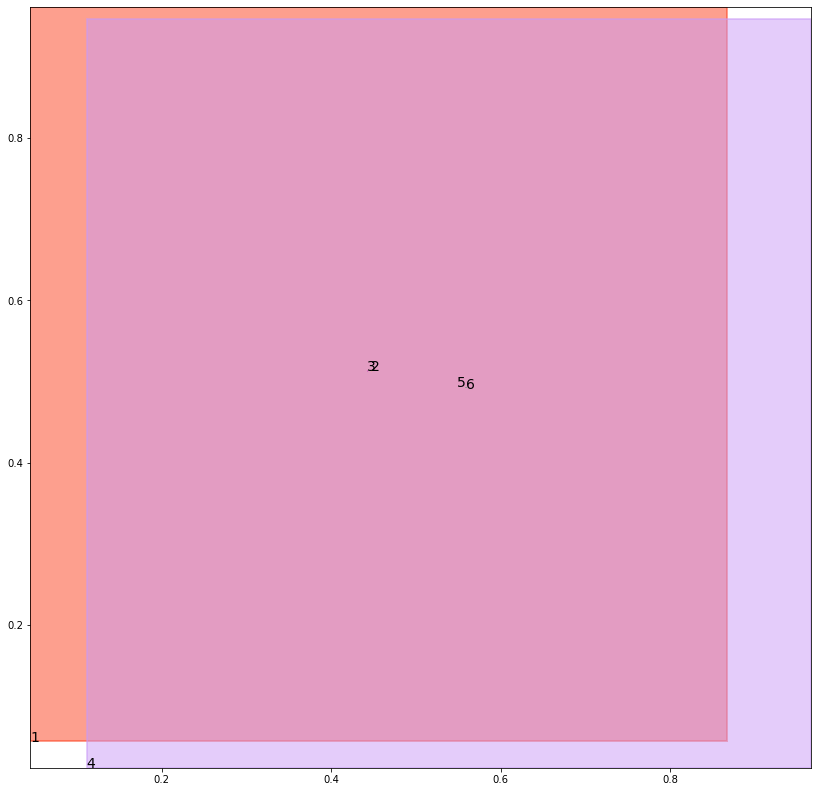

alignment data:
tensor(2) -0.12128227949142456 -0.0008991509675979614 tensor(-0.1211656332015991) tensor(-0.0008546859025955)
tensor(3) -0.12161797285079956 -0.0010252296924591064 tensor(-0.1214654445648193) tensor(-0.0009669810533524)
tensor(5) -0.12199801206588745 -0.0012685656547546387 tensor(-0.1217277050018311) tensor(-0.0011633336544037)
tensor(6) -0.12222564220428467 -0.0013671815395355225 tensor(-0.1215872764587402) tensor(-0.0011188983917236)


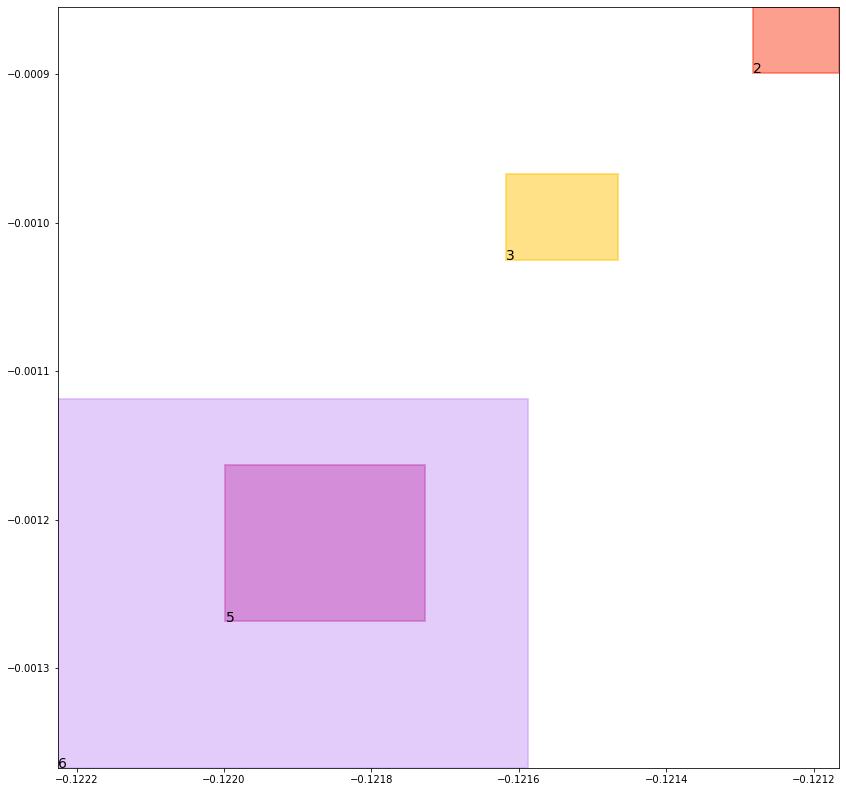

batch (tensor([[4, 5],
        [3, 5],
        [4, 6],
        [5, 3],
        [1, 2],
        [6, 2],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0097252028062940, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0085587650537491, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510004937648773, grad_fn=<MulBackward0>)
previous loss: tensor(0.2692844569683075, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.044510770589113235 0.056418418884277344 tensor(0.8681829571723938) tensor(0.9612126946449280)
tensor(2) 0.4478375315666199 0.5124645829200745 tensor(0.4479431509971619) tensor(0.5131883621215820)
tensor(3) 0.4428583085536957 0.5127291679382324 tensor(0.4432184994220734) tensor(0.5129040479660034)
tensor(4) 0.11030204594135284 0.023851869627833366 tensor(0.9668261408805847) tensor(0.9463198781013489)
tensor(5) 0.5471278429031372 0.4937552809715271 tensor(0.5479223728179932) tensor(0.4942705631256104)
tensor(6) 0.5580323338508606 0.49100223183631897 tensor(0.5589787364006042) tensor(0.4932096302509308)


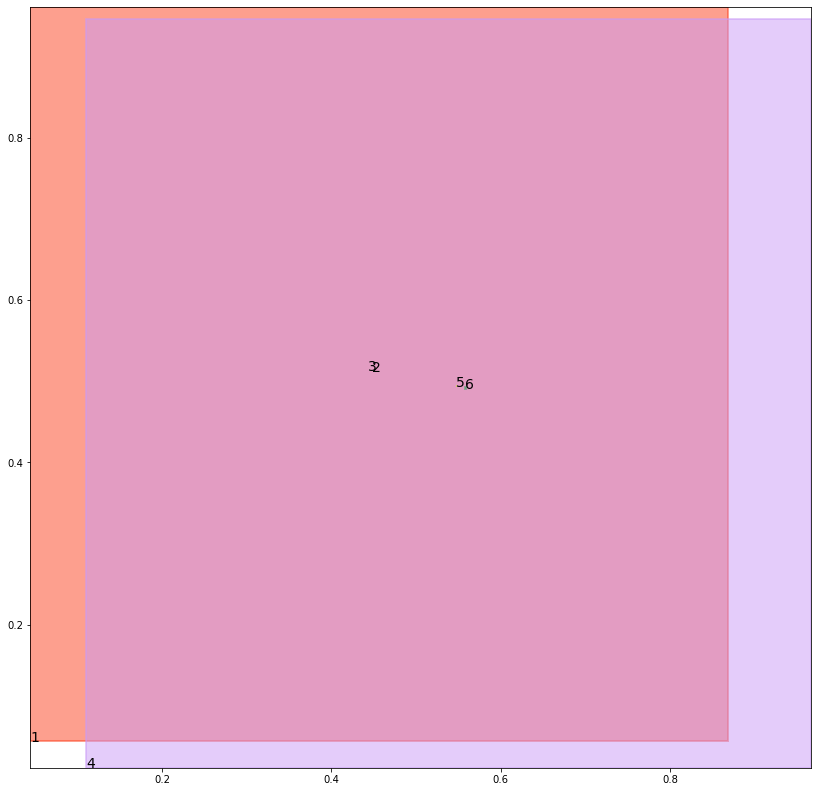

alignment data:
tensor(2) -0.13065749406814575 0.01901964843273163 tensor(-0.1304320693016052) tensor(0.0191076844930649)
tensor(3) -0.13083189725875854 0.018956899642944336 tensor(-0.1307603716850281) tensor(0.0189845263957977)
tensor(5) -0.13126355409622192 0.018674224615097046 tensor(-0.1310662627220154) tensor(0.0187504738569260)
tensor(6) -0.13154226541519165 0.01855328679084778 tensor(-0.1308228969573975) tensor(0.0188335478305817)


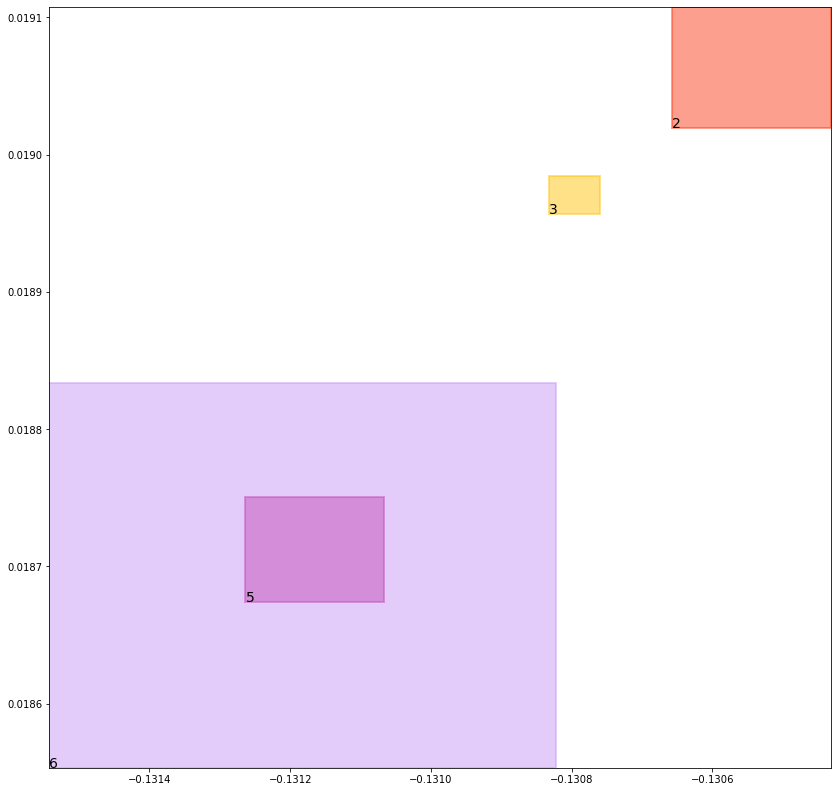

batch (tensor([[6, 2],
        [2, 6],
        [3, 5],
        [1, 2],
        [5, 3],
        [1, 3],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0096681173890829, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0085358610376716, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510002255439758, grad_fn=<MulBackward0>)
previous loss: tensor(0.2692041993141174, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04444515332579613 0.05595313012599945 tensor(0.8688854575157166) tensor(0.9612877368927002)
tensor(2) 0.4480082094669342 0.5122813582420349 tensor(0.4483004212379456) tensor(0.5129361748695374)
tensor(3) 0.44301509857177734 0.5123617649078369 tensor(0.4440946280956268) tensor(0.5128574371337891)
tensor(4) 0.10942178964614868 0.023587118834257126 tensor(0.9668619036674500) tensor(0.9463896751403809)
tensor(5) 0.5469377040863037 0.49334561824798584 tensor(0.5475444793701172) tensor(0.4936818182468414)
tensor(6) 0.5575887560844421 0.4910777509212494 tensor(0.5581348538398743) tensor(0.4929455220699310)


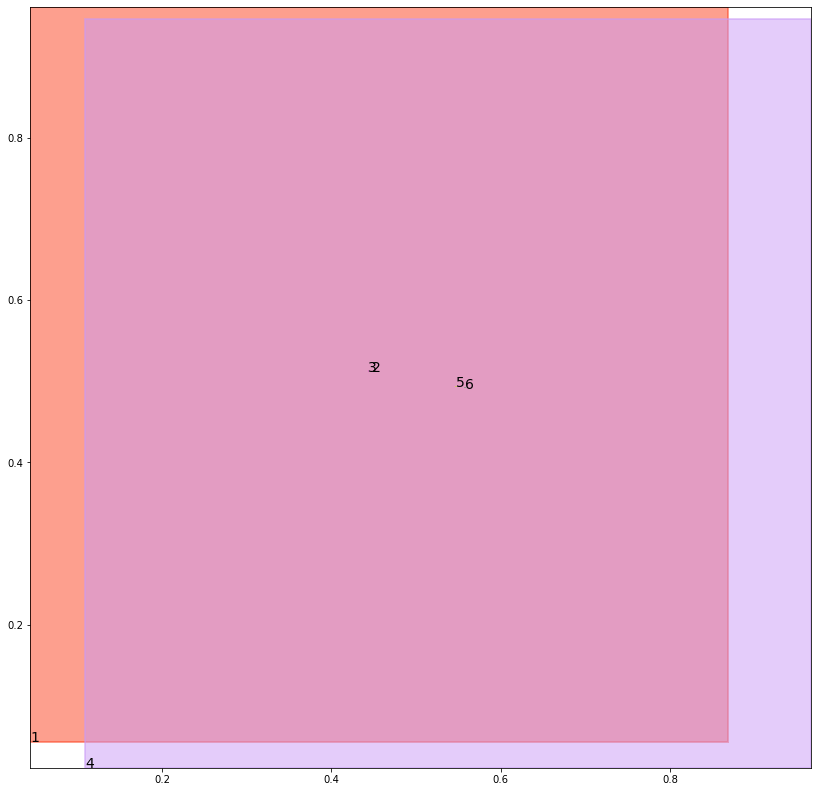

alignment data:
tensor(2) -0.13215875625610352 0.03278575837612152 tensor(-0.1319450139999390) tensor(0.0328692197799683)
tensor(3) -0.1323918104171753 0.03270077705383301 tensor(-0.1321856975555420) tensor(0.0327801853418350)
tensor(5) -0.13280367851257324 0.03240588307380676 tensor(-0.1326704025268555) tensor(0.0324573814868927)
tensor(6) -0.13294267654418945 0.032337725162506104 tensor(-0.1323477625846863) tensor(0.0325702875852585)


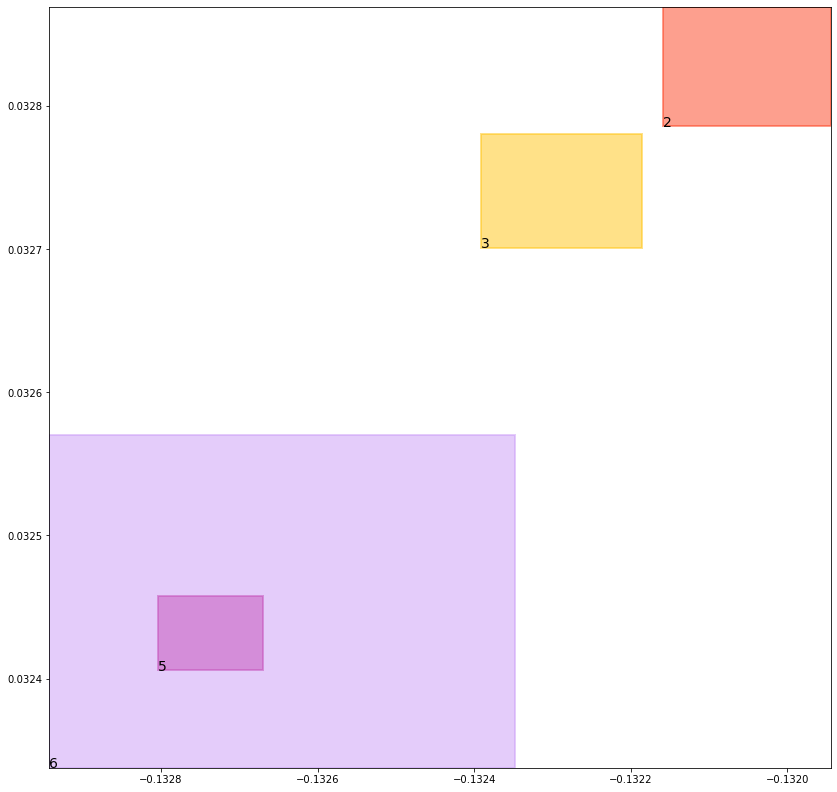

batch (tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5],
        [1, 3],
        [4, 5],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0096500022336841, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0084949824959040, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510007023811340, grad_fn=<MulBackward0>)
previous loss: tensor(0.2691456973552704, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.044379767030477524 0.05549471825361252 tensor(0.8695817589759827) tensor(0.9613624215126038)
tensor(2) 0.448367178440094 0.5124962329864502 tensor(0.4488473534584045) tensor(0.5125371217727661)
tensor(3) 0.44310715794563293 0.5121358633041382 tensor(0.4449512064456940) tensor(0.5126536488533020)
tensor(4) 0.10855700820684433 0.02332732453942299 tensor(0.9668974876403809) tensor(0.9464592933654785)
tensor(5) 0.5467607378959656 0.4928636848926544 tensor(0.5473895072937012) tensor(0.4934861958026886)
tensor(6) 0.5570918917655945 0.4915507733821869 tensor(0.5574919581413269) tensor(0.4925639331340790)


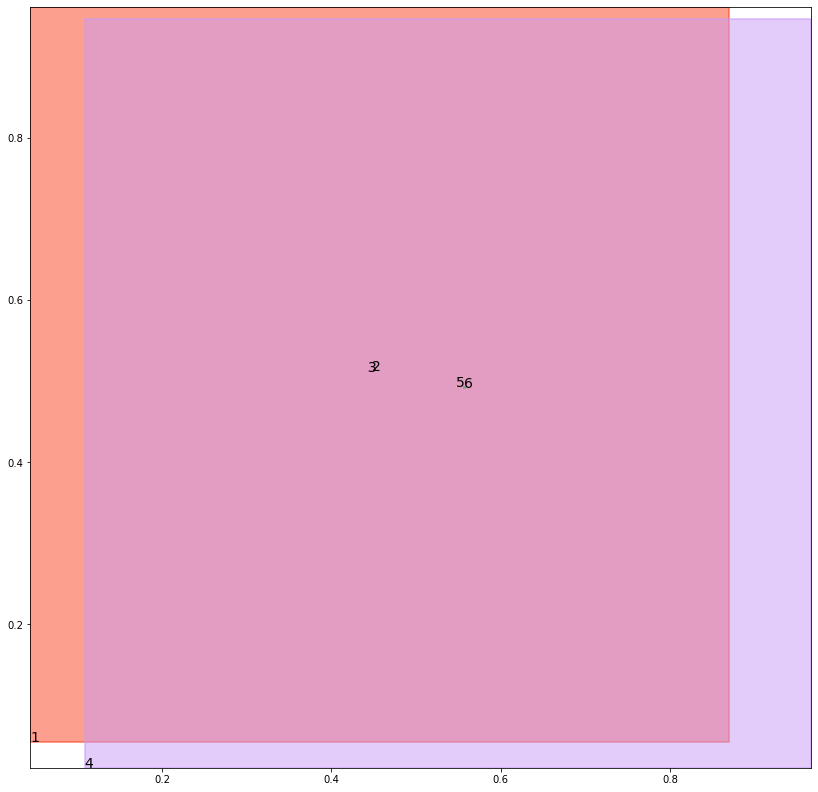

alignment data:
tensor(2) -0.1321309208869934 0.04511153697967529 tensor(-0.1320934891700745) tensor(0.0451255142688751)
tensor(3) -0.13251358270645142 0.044968873262405396 tensor(-0.1322607398033142) tensor(0.0450655221939087)
tensor(5) -0.13296514749526978 0.044638946652412415 tensor(-0.1327437758445740) tensor(0.0447250157594681)
tensor(6) -0.132826030254364 0.04467847943305969 tensor(-0.1324981451034546) tensor(0.0448067188262939)


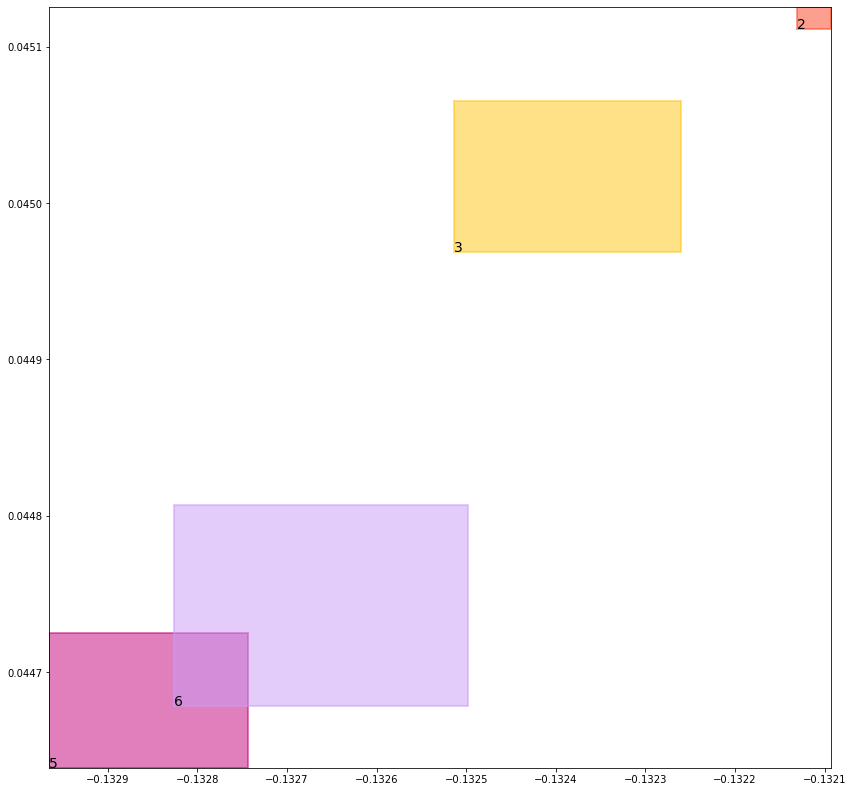

batch (tensor([[4, 6],
        [3, 5],
        [6, 2],
        [4, 5],
        [5, 3],
        [2, 6],
        [1, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0096242446452379, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0084603875875473, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510034739971161, grad_fn=<MulBackward0>)
previous loss: tensor(0.2690881192684174, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04431459307670593 0.05504308640956879 tensor(0.8702719211578369) tensor(0.9614368677139282)
tensor(2) 0.4487327039241791 0.5120053887367249 tensor(0.4490288496017456) tensor(0.5130710005760193)
tensor(3) 0.44346702098846436 0.5121492743492126 tensor(0.4454624652862549) tensor(0.5121954679489136)
tensor(4) 0.10770716518163681 0.02307240106165409 tensor(0.9669328927993774) tensor(0.9465288519859314)
tensor(5) 0.546417236328125 0.49278637766838074 tensor(0.5470431447029114) tensor(0.4931800663471222)
tensor(6) 0.556333601474762 0.4920763075351715 tensor(0.5569450855255127) tensor(0.4923786520957947)


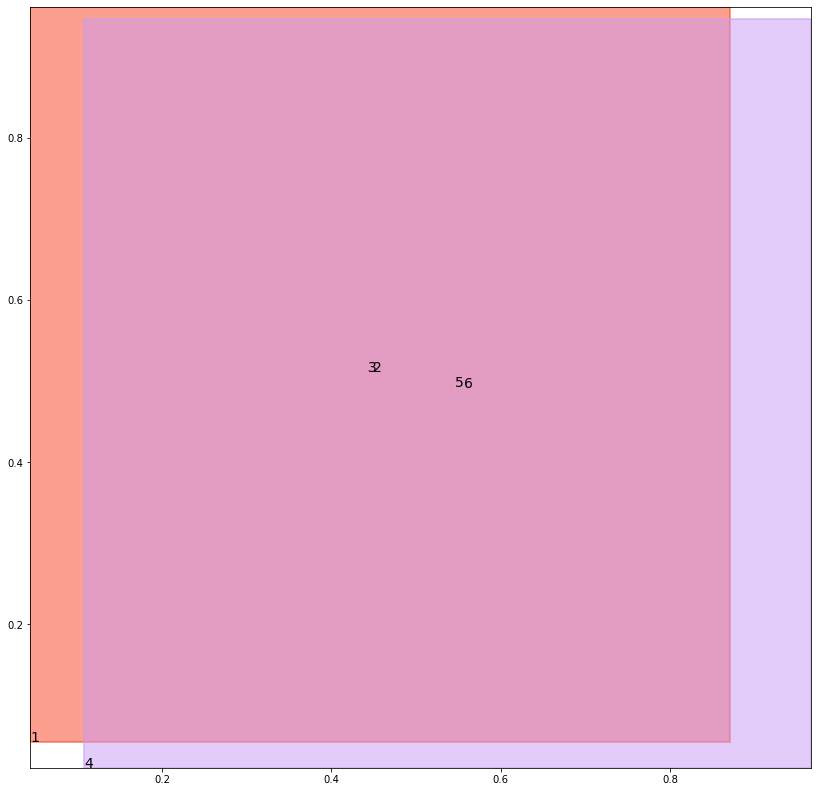

alignment data:
tensor(2) -0.14410638809204102 0.05574290454387665 tensor(-0.1437684297561646) tensor(0.0558755248785019)
tensor(3) -0.14433878660202026 0.055660054087638855 tensor(-0.1442202925682068) tensor(0.0557034462690353)
tensor(5) -0.14480149745941162 0.05530799925327301 tensor(-0.1446496248245239) tensor(0.0553667992353439)
tensor(6) -0.14449667930603027 0.055411726236343384 tensor(-0.1443732380867004) tensor(0.0554593652486801)


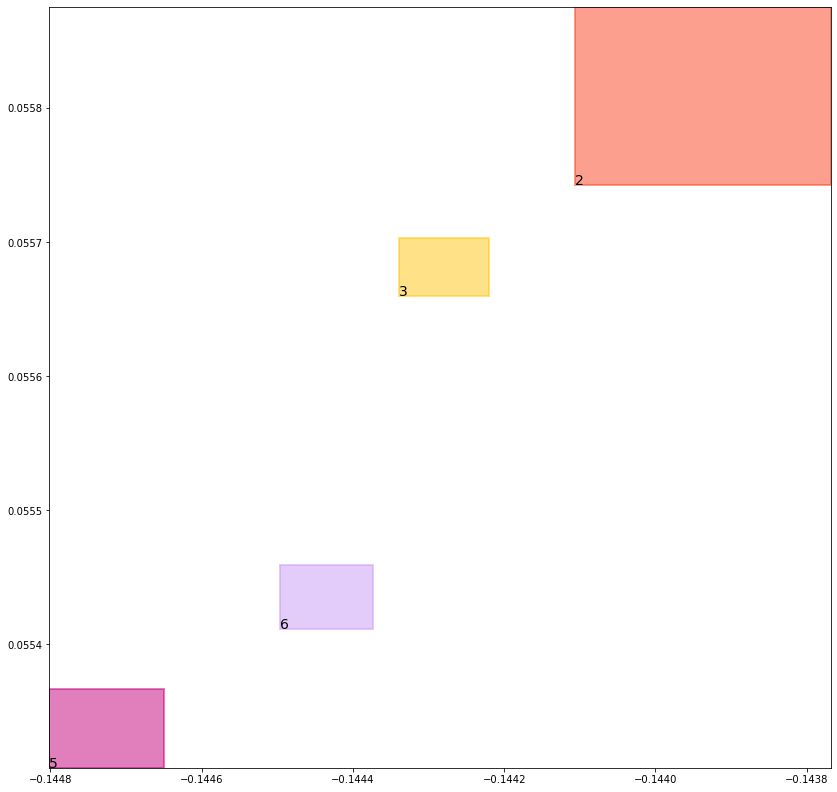

batch (tensor([[1, 3],
        [4, 6],
        [6, 2],
        [3, 5],
        [4, 5],
        [2, 6],
        [5, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0095974039286375, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0084266662597656, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510043680667877, grad_fn=<MulBackward0>)
previous loss: tensor(0.2690284252166748, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.044249631464481354 0.054598066955804825 tensor(0.8709561228752136) tensor(0.9615112543106079)
tensor(2) 0.4486161172389984 0.5116685032844543 tensor(0.4493687450885773) tensor(0.5131165981292725)
tensor(3) 0.4440690279006958 0.5119346976280212 tensor(0.4456607997417450) tensor(0.5119597315788269)
tensor(4) 0.10687164962291718 0.022822299972176552 tensor(0.9669682383537292) tensor(0.9465982317924500)
tensor(5) 0.5459754467010498 0.4927736520767212 tensor(0.5464714765548706) tensor(0.4930759966373444)
tensor(6) 0.5558330416679382 0.49175703525543213 tensor(0.5559924840927124) tensor(0.4926753640174866)


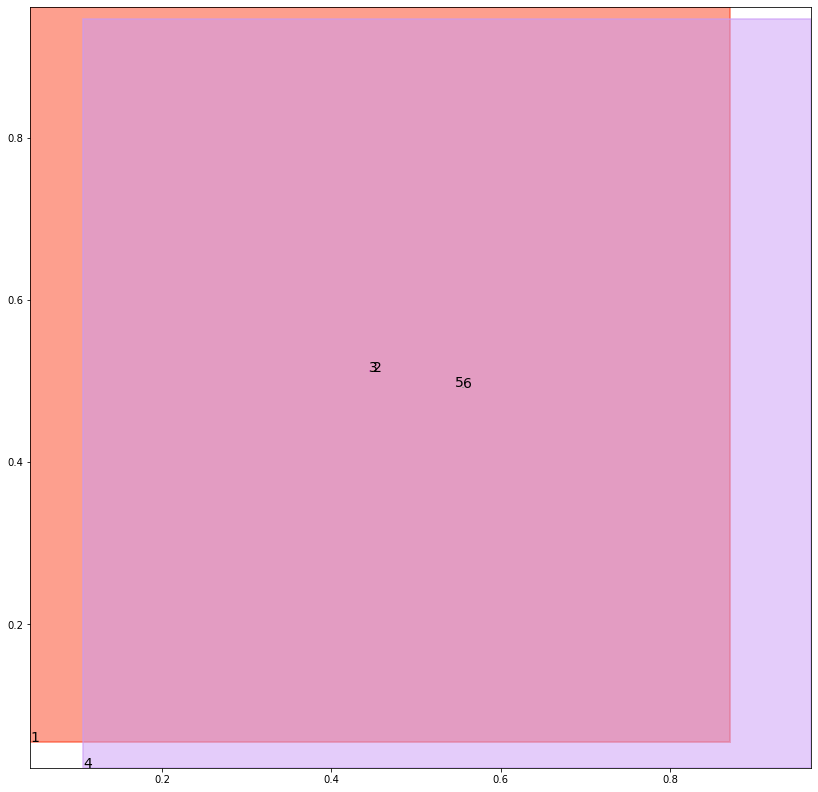

alignment data:
tensor(2) -0.16272246837615967 0.06447300314903259 tensor(-0.1622455120086670) tensor(0.0646599084138870)
tensor(3) -0.16288232803344727 0.06441819667816162 tensor(-0.1627906560897827) tensor(0.0644514709711075)
tensor(5) -0.16328543424606323 0.06407395005226135 tensor(-0.1631678938865662) tensor(0.0641194432973862)
tensor(6) -0.16307169198989868 0.06414040923118591 tensor(-0.1627859473228455) tensor(0.0642528831958771)


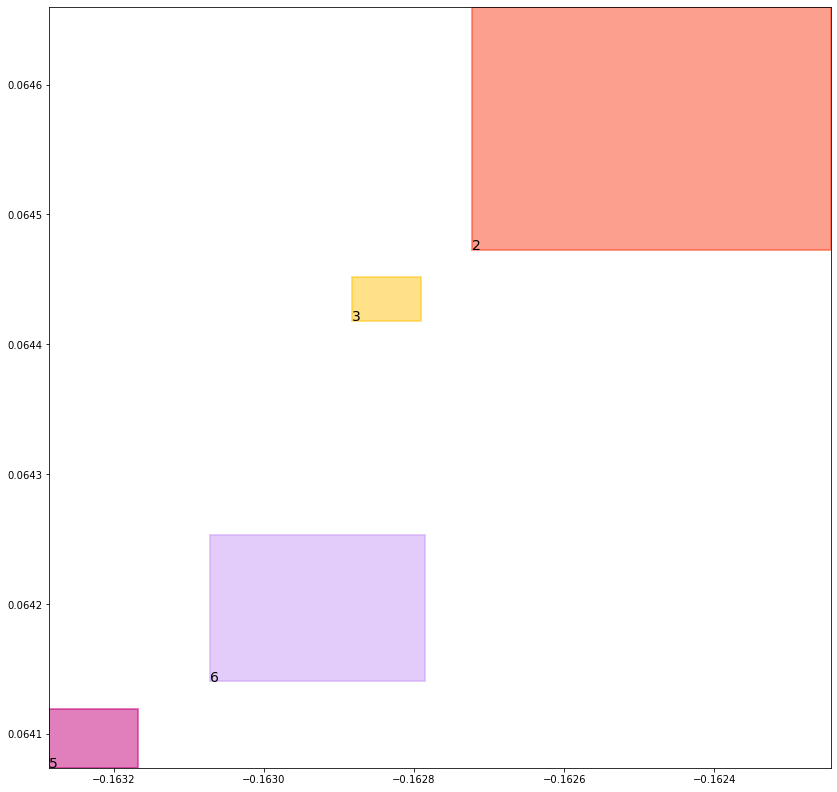

batch (tensor([[4, 5],
        [1, 3],
        [1, 2],
        [3, 5],
        [4, 6],
        [2, 6],
        [6, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0095703527331352, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0083958003669977, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510020136833191, grad_fn=<MulBackward0>)
previous loss: tensor(0.2689681649208069, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04418487474322319 0.05415947735309601 tensor(0.8716345429420471) tensor(0.9615853428840637)
tensor(2) 0.4489317834377289 0.511508584022522 tensor(0.4496866166591644) tensor(0.5126834511756897)
tensor(3) 0.4448895752429962 0.5114704370498657 tensor(0.4455763399600983) tensor(0.5119634270668030)
tensor(4) 0.10604988783597946 0.02257690206170082 tensor(0.9670033454895020) tensor(0.9466676115989685)
tensor(5) 0.5456310510635376 0.492514431476593 tensor(0.5460777878761292) tensor(0.4929057359695435)
tensor(6) 0.5546752214431763 0.4915902316570282 tensor(0.5555660128593445) tensor(0.4924866557121277)


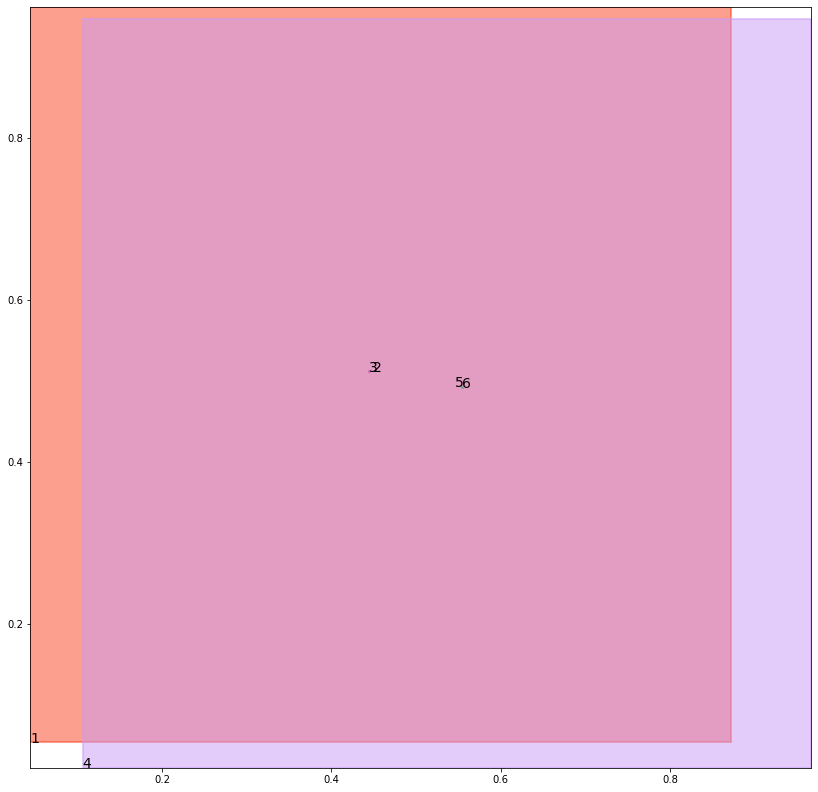

alignment data:
tensor(2) -0.1862928867340088 0.07485493272542953 tensor(-0.1858986020088196) tensor(0.0750093385577202)
tensor(3) -0.18651962280273438 0.07477327436208725 tensor(-0.1863344907760620) tensor(0.0748451277613640)
tensor(5) -0.18686985969543457 0.07443612068891525 tensor(-0.1867281794548035) tensor(0.0744912549853325)
tensor(6) -0.18666696548461914 0.07449851185083389 tensor(-0.1863493323326111) tensor(0.0746223255991936)


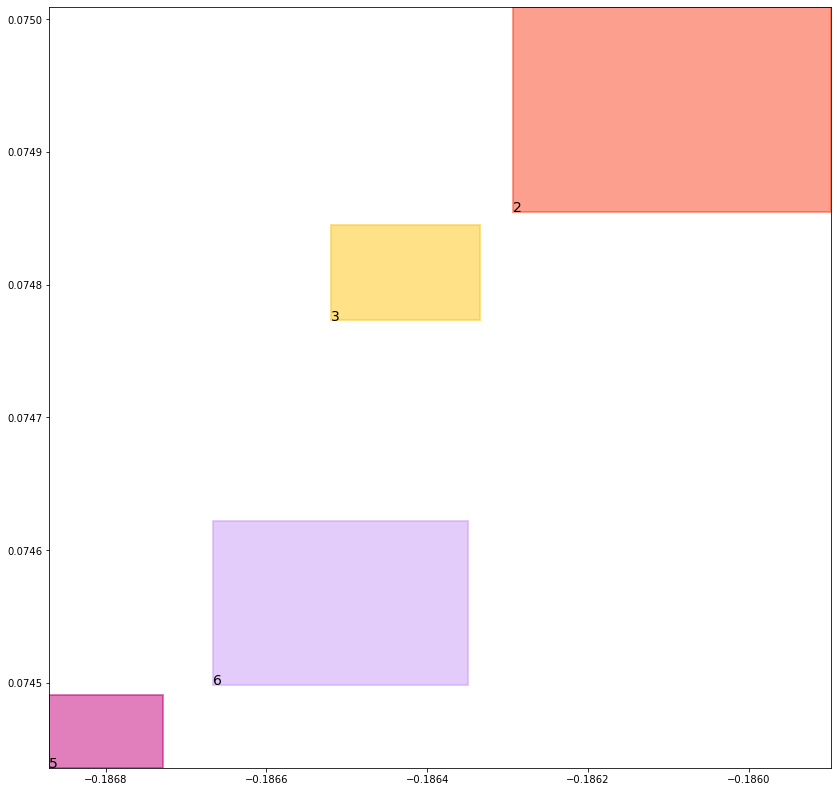

batch (tensor([[5, 3],
        [2, 6],
        [6, 2],
        [4, 5],
        [4, 6],
        [3, 5],
        [1, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0095282895490527, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0083761466667056, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510013580322266, grad_fn=<MulBackward0>)
previous loss: tensor(0.2689057886600494, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04412032663822174 0.05372710898518562 tensor(0.8723068833351135) tensor(0.9616593122482300)
tensor(2) 0.4497167468070984 0.511508584022522 tensor(0.4499055743217468) tensor(0.5118209719657898)
tensor(3) 0.44523724913597107 0.5112981796264648 tensor(0.4459066390991211) tensor(0.5116738677024841)
tensor(4) 0.10524120181798935 0.02233606018126011 tensor(0.9670383334159851) tensor(0.9467368125915527)
tensor(5) 0.545279324054718 0.4923199415206909 tensor(0.5459393858909607) tensor(0.4923884272575378)
tensor(6) 0.5537917613983154 0.4915621280670166 tensor(0.5550473928451538) tensor(0.4918563365936279)


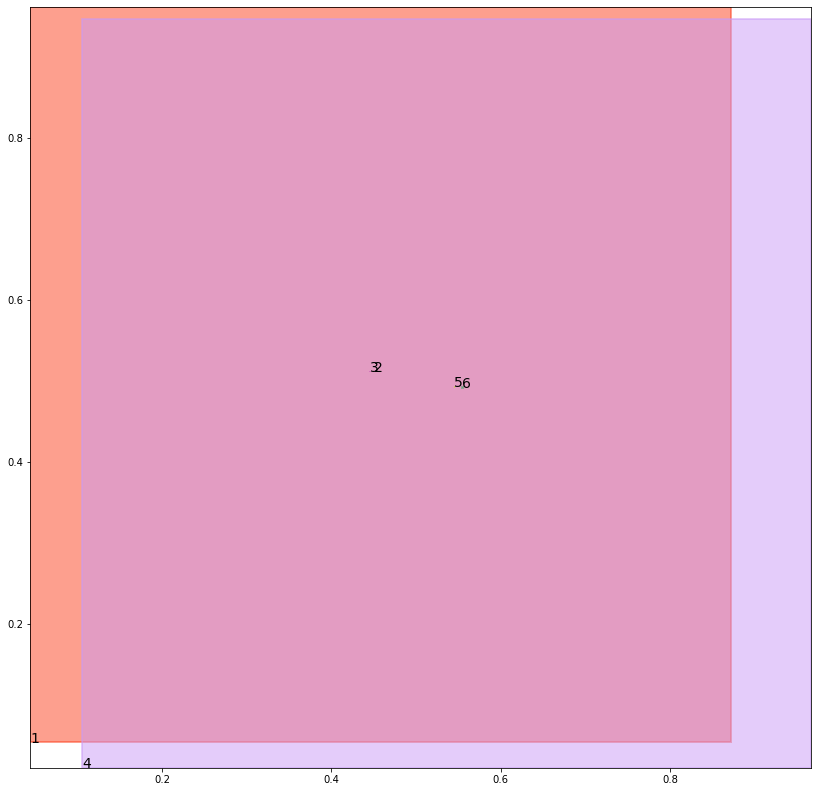

alignment data:
tensor(2) -0.2187594771385193 0.07857853174209595 tensor(-0.2186552882194519) tensor(0.0786193460226059)
tensor(3) -0.21906310319900513 0.07846777141094208 tensor(-0.2189143300056458) tensor(0.0785253196954727)
tensor(5) -0.21940624713897705 0.07812058925628662 tensor(-0.2193501591682434) tensor(0.0781413614749908)
tensor(6) -0.2191774845123291 0.07819314301013947 tensor(-0.2190215587615967) tensor(0.0782521963119507)


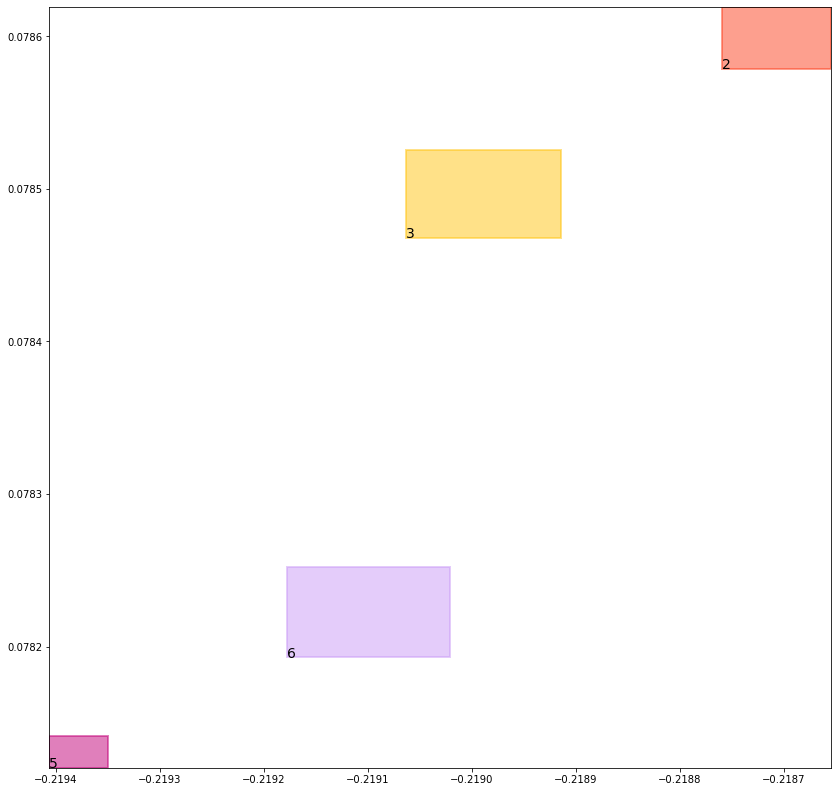

batch (tensor([[3, 5],
        [1, 3],
        [4, 5],
        [5, 3],
        [4, 6],
        [6, 2],
        [1, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0094803608953953, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0083476267755032, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510064840316772, grad_fn=<MulBackward0>)
previous loss: tensor(0.2688344717025757, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0440559983253479 0.0533008836209774 tensor(0.8729733824729919) tensor(0.9617330431938171)
tensor(2) 0.45004990696907043 0.510576069355011 tensor(0.4502096474170685) tensor(0.5116524696350098)
tensor(3) 0.4452732503414154 0.5110957622528076 tensor(0.4466148614883423) tensor(0.5114129185676575)
tensor(4) 0.10444503277540207 0.022099662572145462 tensor(0.9670732617378235) tensor(0.9468058347702026)
tensor(5) 0.5449215769767761 0.49214503169059753 tensor(0.5454641580581665) tensor(0.4921510815620422)
tensor(6) 0.5533024668693542 0.4908273220062256 tensor(0.5543016791343689) tensor(0.4916600883007050)


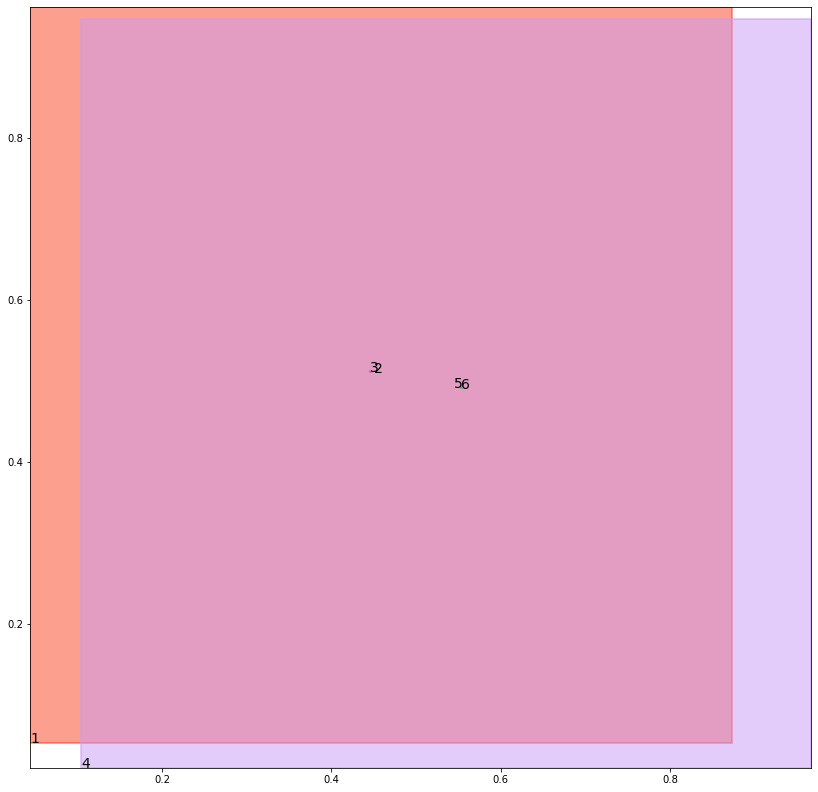

alignment data:
tensor(2) -0.2515316605567932 0.07170379906892776 tensor(-0.2511997222900391) tensor(0.0718349739909172)
tensor(3) -0.251633882522583 0.07167401164770126 tensor(-0.2514660358428955) tensor(0.0717374905943871)
tensor(5) -0.25193870067596436 0.07133009284734726 tensor(-0.2519075870513916) tensor(0.0713412389159203)
tensor(6) -0.25188136100769043 0.07133404165506363 tensor(-0.2515773773193359) tensor(0.0714523270726204)


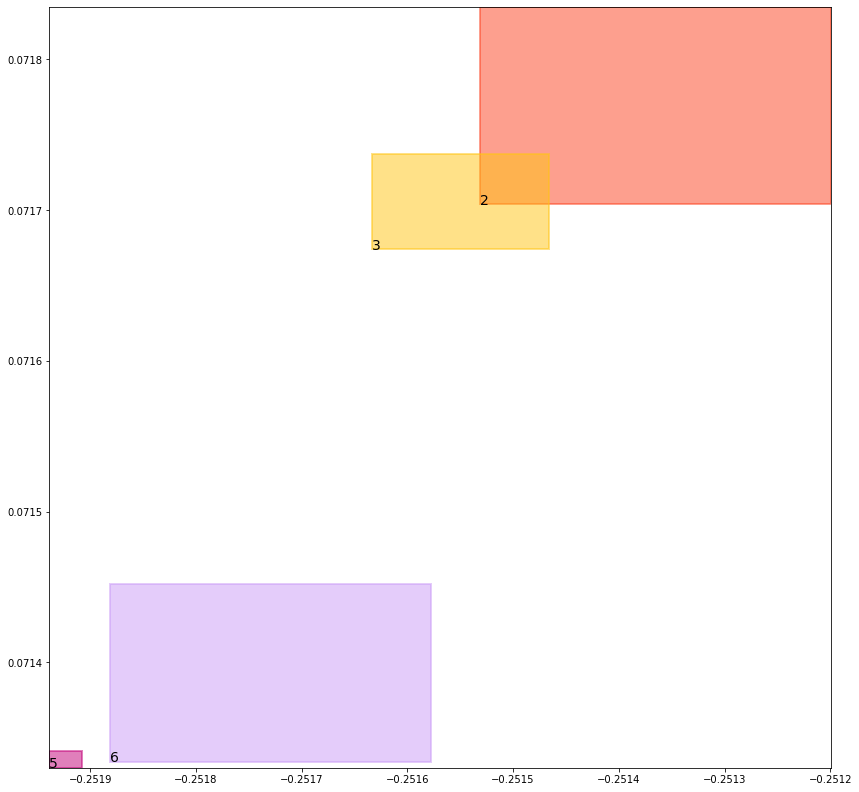

batch (tensor([[6, 2],
        [4, 5],
        [1, 2],
        [3, 5],
        [5, 3],
        [4, 6],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0094648674130440, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0083205495029688, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510032653808594, grad_fn=<MulBackward0>)
previous loss: tensor(0.2687886953353882, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04399187117815018 0.052880506962537766 tensor(0.8736341595649719) tensor(0.9618065953254700)
tensor(2) 0.4499082565307617 0.5098477602005005 tensor(0.4506570696830750) tensor(0.5116105675697327)
tensor(3) 0.44564932584762573 0.510841429233551 tensor(0.4470427930355072) tensor(0.5111961364746094)
tensor(4) 0.1036609560251236 0.021867522969841957 tensor(0.9671080112457275) tensor(0.9468749165534973)
tensor(5) 0.5442820191383362 0.49156948924064636 tensor(0.5449621677398682) tensor(0.4920340478420258)
tensor(6) 0.5531699657440186 0.49029481410980225 tensor(0.5533514618873596) tensor(0.4916049838066101)


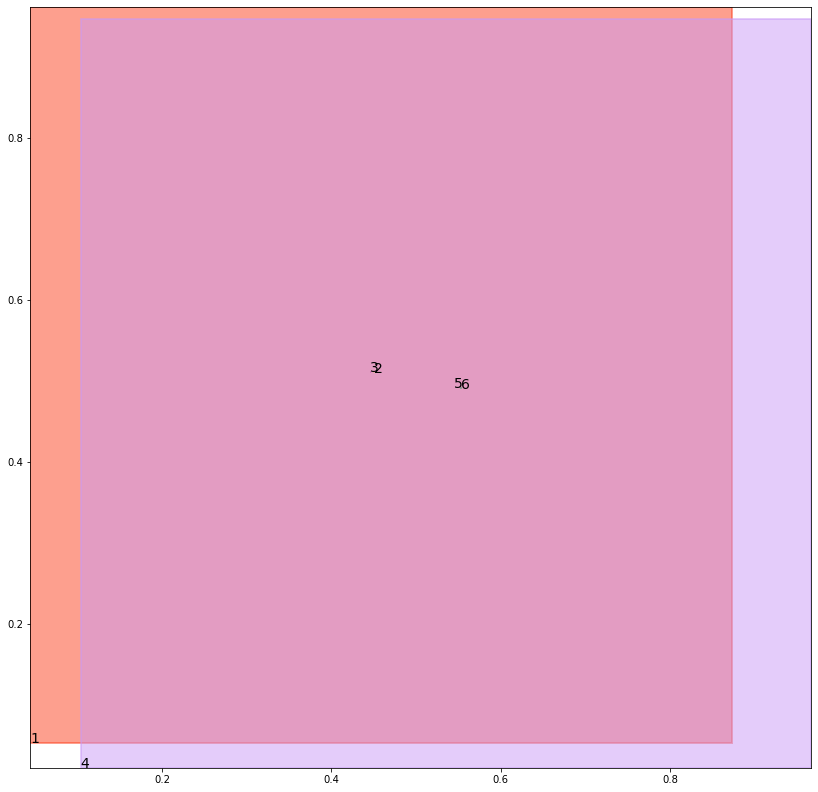

alignment data:
tensor(2) -0.289573073387146 0.07168510556221008 tensor(-0.2890037298202515) tensor(0.0719091296195984)
tensor(3) -0.28950703144073486 0.07172127068042755 tensor(-0.2893248796463013) tensor(0.0717902779579163)
tensor(5) -0.2899136543273926 0.07132840156555176 tensor(-0.2897373437881470) tensor(0.0713967233896255)
tensor(6) -0.28981173038482666 0.0713479220867157 tensor(-0.2894090414047241) tensor(0.0715072304010391)


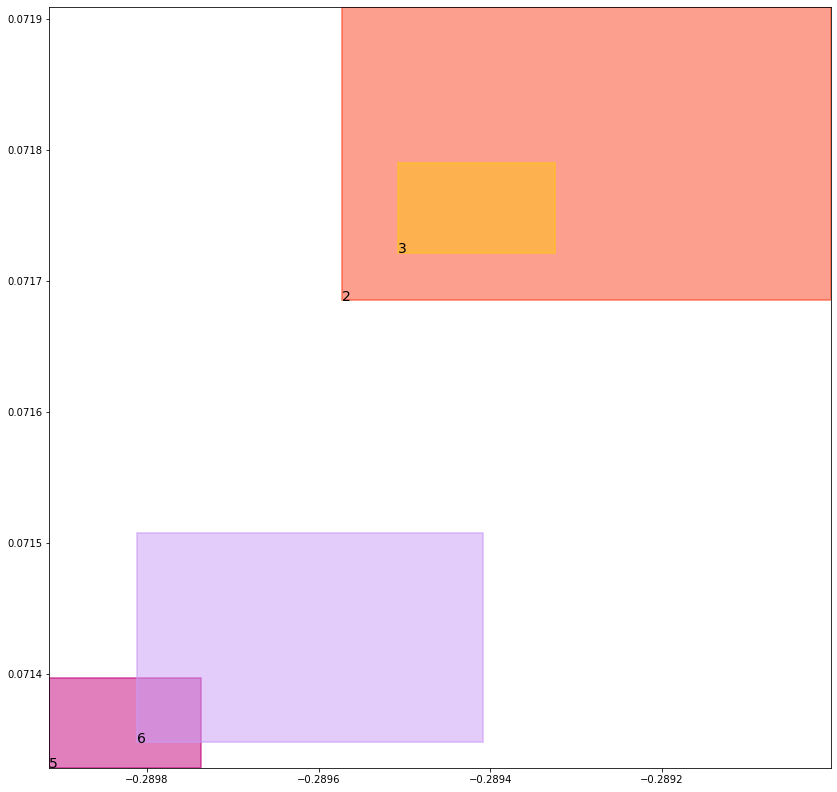

batch (tensor([[2, 6],
        [1, 3],
        [4, 5],
        [5, 3],
        [3, 5],
        [6, 2],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0094500649720430, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0082939844578505, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509987950325012, grad_fn=<MulBackward0>)
previous loss: tensor(0.2687428593635559, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04392794519662857 0.05246575176715851 tensor(0.8742893934249878) tensor(0.9618798494338989)
tensor(2) 0.45032474398612976 0.5095929503440857 tensor(0.4509481489658356) tensor(0.5113998651504517)
tensor(3) 0.4463326036930084 0.5106797218322754 tensor(0.4472167789936066) tensor(0.5108785033226013)
tensor(4) 0.10288865864276886 0.021639468148350716 tensor(0.9671425819396973) tensor(0.9469437003135681)
tensor(5) 0.5438339114189148 0.49141159653663635 tensor(0.5445563793182373) tensor(0.4918038547039032)
tensor(6) 0.5522177219390869 0.490211546421051 tensor(0.5533589124679565) tensor(0.4914113581180573)


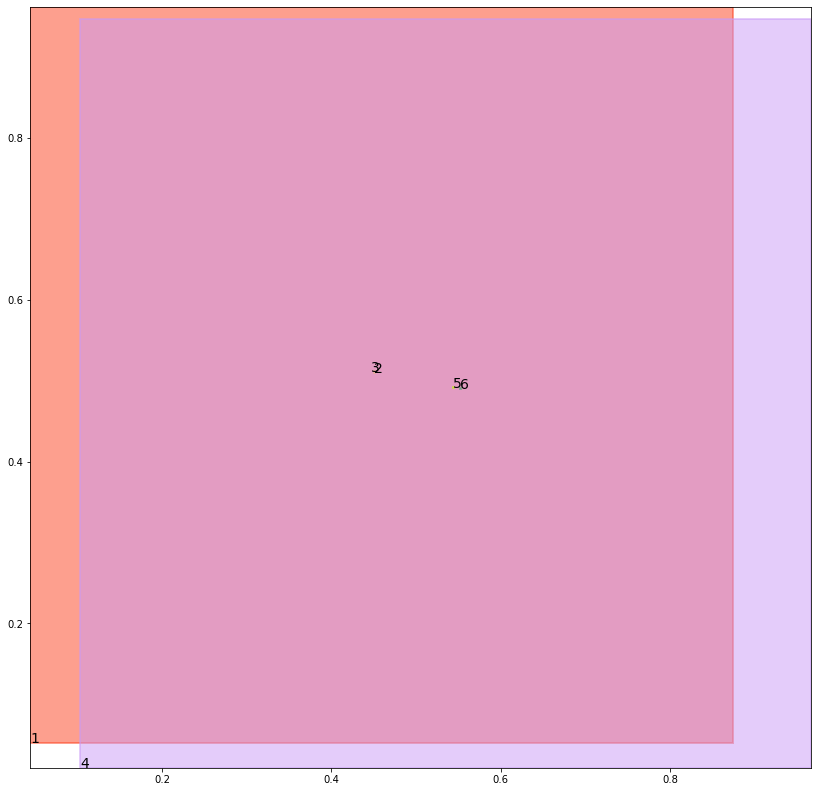

alignment data:
tensor(2) -0.3304925560951233 0.07245882600545883 tensor(-0.3299176096916199) tensor(0.0726855471730232)
tensor(3) -0.33038628101348877 0.07251080125570297 tensor(-0.3302782773971558) tensor(0.0725514814257622)
tensor(5) -0.3308051824569702 0.07210608571767807 tensor(-0.3306481838226318) tensor(0.0721666589379311)
tensor(6) -0.33070456981658936 0.07212557643651962 tensor(-0.3302828073501587) tensor(0.0722901746630669)


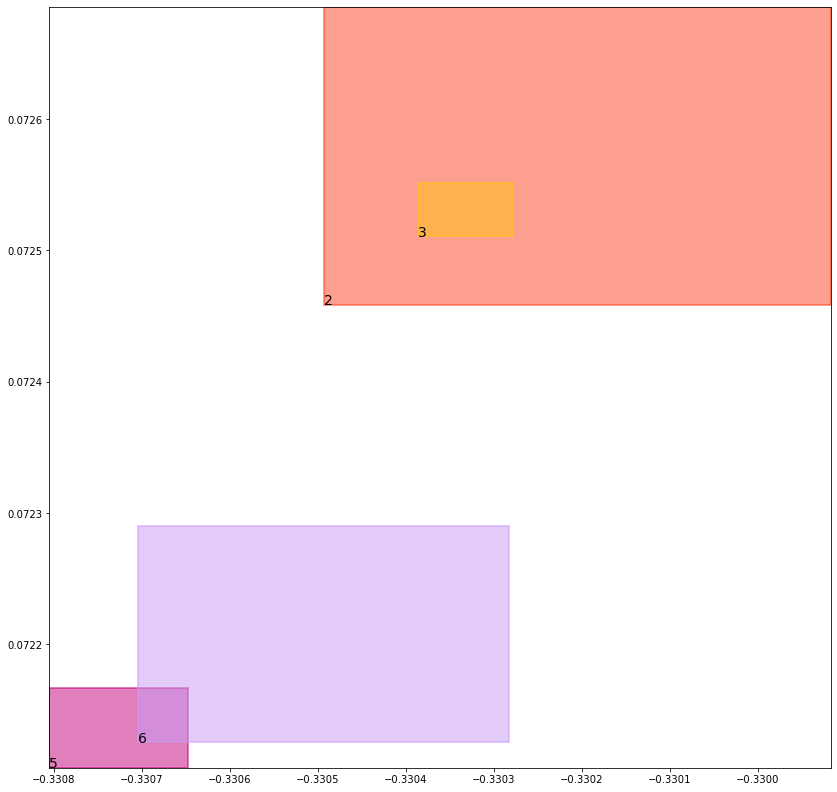

batch (tensor([[1, 3],
        [3, 5],
        [1, 2],
        [4, 6],
        [5, 3],
        [2, 6],
        [4, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0094105936586857, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0082785990089178, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509993612766266, grad_fn=<MulBackward0>)
previous loss: tensor(0.2686885595321655, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.043864212930202484 0.05205651745200157 tensor(0.8749390244483948) tensor(0.9619529843330383)
tensor(2) 0.45095348358154297 0.5097678303718567 tensor(0.4513891935348511) tensor(0.5110369324684143)
tensor(3) 0.4471614360809326 0.51048344373703 tensor(0.4472925066947937) tensor(0.5105964541435242)
tensor(4) 0.1021275594830513 0.021415401250123978 tensor(0.9671770334243774) tensor(0.9470124840736389)
tensor(5) 0.5437473058700562 0.49146535992622375 tensor(0.5440496802330017) tensor(0.4916381835937500)
tensor(6) 0.5513815879821777 0.4905346632003784 tensor(0.5530768036842346) tensor(0.4910921454429626)


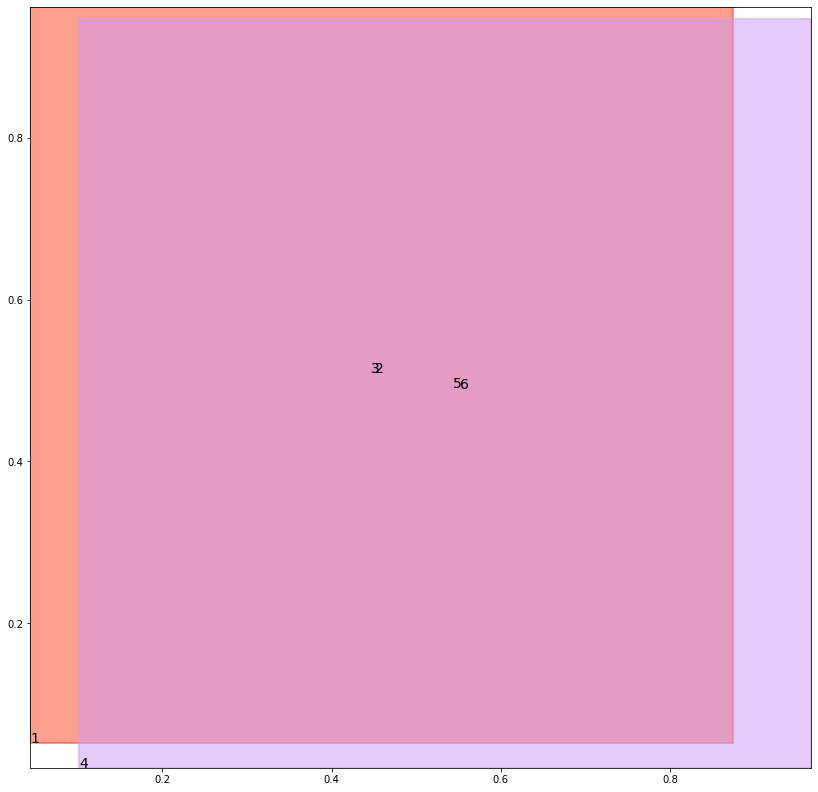

alignment data:
tensor(2) -0.3731260895729065 0.07910113036632538 tensor(-0.3727226853370667) tensor(0.0792601555585861)
tensor(3) -0.37312161922454834 0.0791124552488327 tensor(-0.3730805516242981) tensor(0.0791284143924713)
tensor(5) -0.3734697699546814 0.0787300318479538 tensor(-0.3734014630317688) tensor(0.0787564367055893)
tensor(6) -0.37332624197006226 0.07876773178577423 tensor(-0.3730660676956177) tensor(0.0788667798042297)


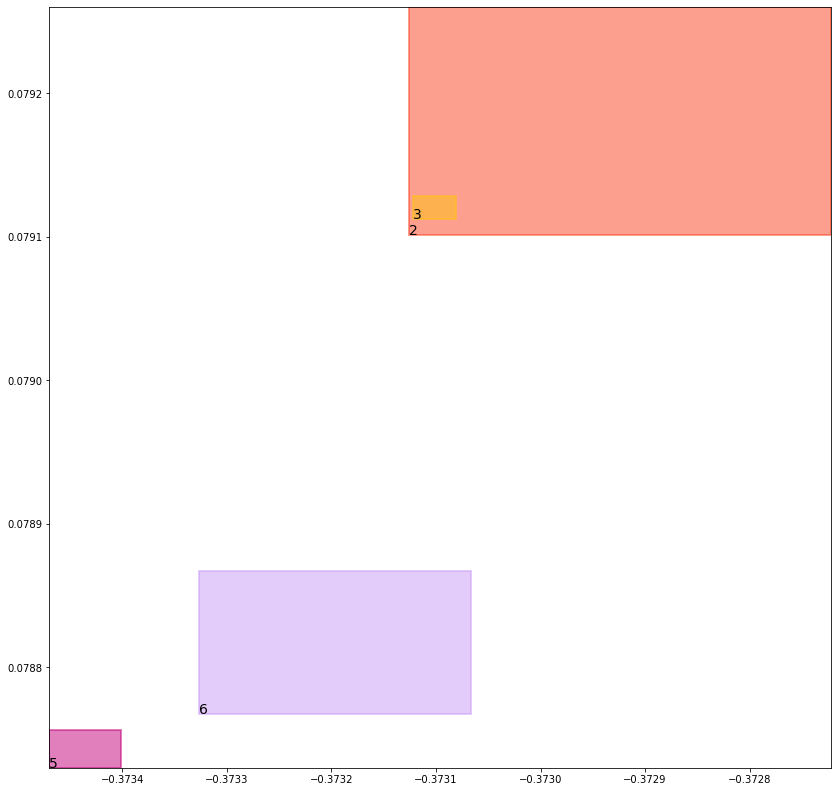

batch (tensor([[1, 3],
        [6, 2],
        [5, 3],
        [3, 5],
        [4, 6],
        [1, 2],
        [2, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0093623399734497, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0082489401102066, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510035932064056, grad_fn=<MulBackward0>)
previous loss: tensor(0.2686148881912231, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04380070045590401 0.051652777940034866 tensor(0.8755831718444824) tensor(0.9620258808135986)
tensor(2) 0.4512649178504944 0.5103297829627991 tensor(0.4517730474472046) tensor(0.5105365514755249)
tensor(3) 0.4473852813243866 0.5100269317626953 tensor(0.4478962719440460) tensor(0.5105782747268677)
tensor(4) 0.10137732326984406 0.021195294335484505 tensor(0.9672114849090576) tensor(0.9470810890197754)
tensor(5) 0.5433801412582397 0.4912705719470978 tensor(0.5434945821762085) tensor(0.4914093911647797)
tensor(6) 0.5508155822753906 0.4906591475009918 tensor(0.5523685812950134) tensor(0.4912235140800476)


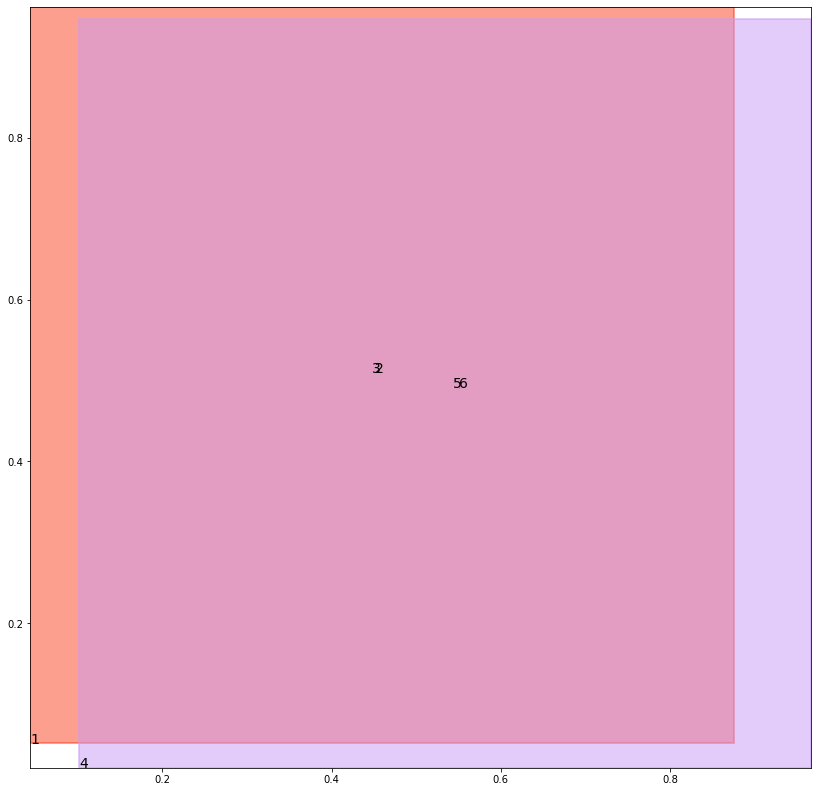

alignment data:
tensor(2) -0.41854023933410645 0.08939513564109802 tensor(-0.4184503555297852) tensor(0.0894295573234558)
tensor(3) -0.4188463091850281 0.08928367495536804 tensor(-0.4186534285545349) tensor(0.0893589407205582)
tensor(5) -0.41910457611083984 0.08893206715583801 tensor(-0.4190567731857300) tensor(0.0889507532119751)
tensor(6) -0.4188736081123352 0.0890045166015625 tensor(-0.4186187982559204) tensor(0.0891016423702240)


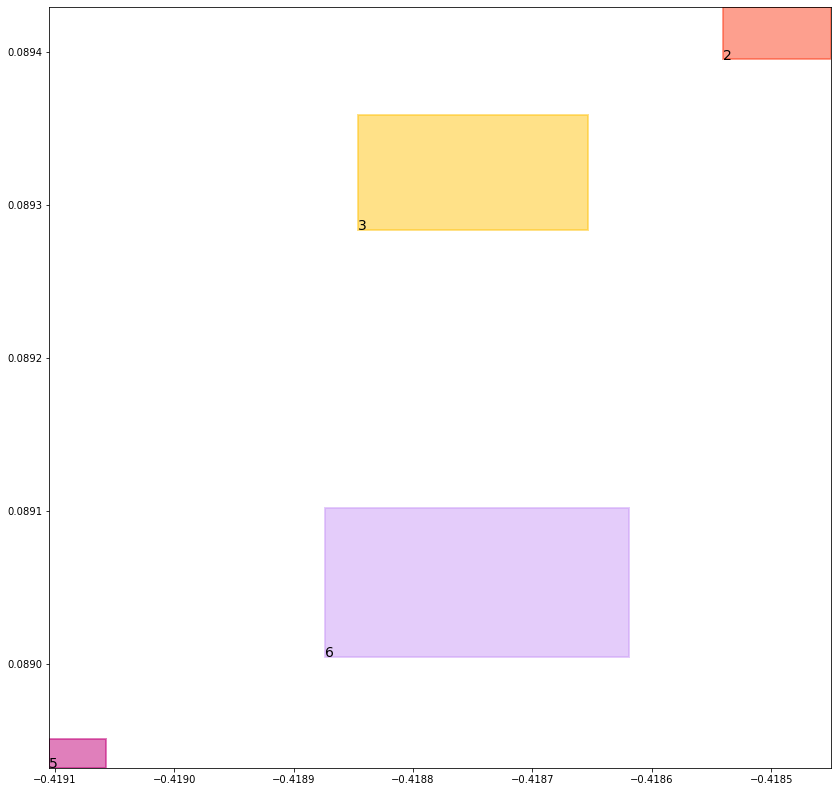

batch (tensor([[2, 6],
        [3, 5],
        [6, 2],
        [4, 6],
        [1, 2],
        [4, 5],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0093337316066027, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0082202134653926, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510053217411041, grad_fn=<MulBackward0>)
previous loss: tensor(0.2685592770576477, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.043737396597862244 0.05125449225306511 tensor(0.8762220144271851) tensor(0.9620985984802246)
tensor(2) 0.4515417814254761 0.5099142789840698 tensor(0.4518529176712036) tensor(0.5112342238426208)
tensor(3) 0.4478619396686554 0.5097841024398804 tensor(0.4481766223907471) tensor(0.5103428363800049)
tensor(4) 0.10063765197992325 0.020979072898626328 tensor(0.9672457575798035) tensor(0.9471497535705566)
tensor(5) 0.5422452092170715 0.4907711446285248 tensor(0.5434123277664185) tensor(0.4912053644657135)
tensor(6) 0.5504945516586304 0.49039319157600403 tensor(0.5512762069702148) tensor(0.4913764595985413)


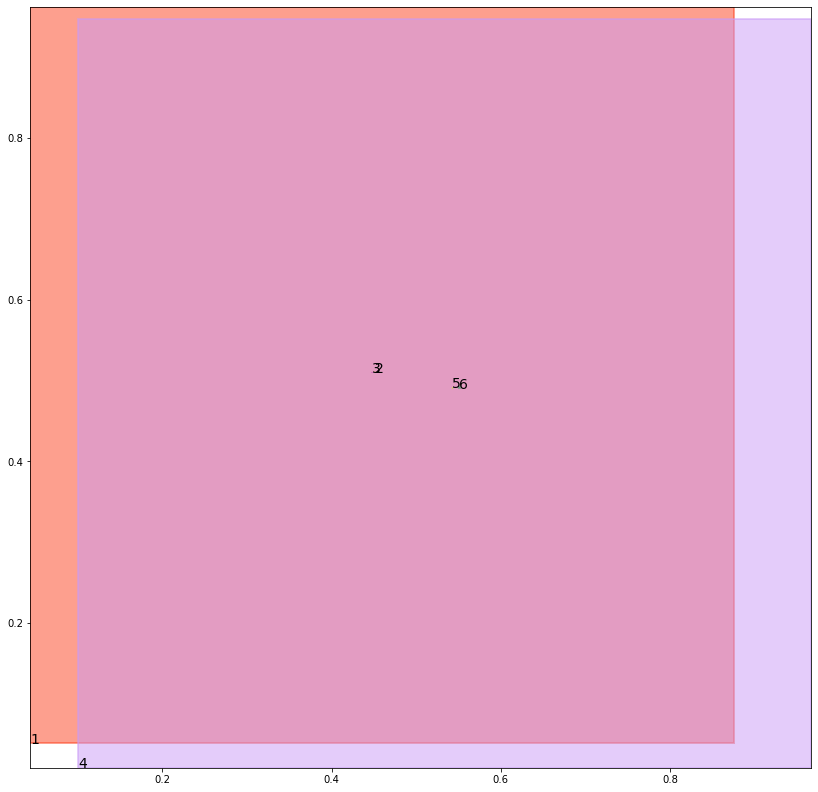

alignment data:
tensor(2) -0.4533892869949341 0.10132179409265518 tensor(-0.4529787302017212) tensor(0.1014840081334114)
tensor(3) -0.45363396406173706 0.10123436897993088 tensor(-0.4534499645233154) tensor(0.1013066247105598)
tensor(5) -0.45401567220687866 0.10083327442407608 tensor(-0.4538209438323975) tensor(0.1009074673056602)
tensor(6) -0.453666627407074 0.10095003992319107 tensor(-0.4533300995826721) tensor(0.1010816171765327)


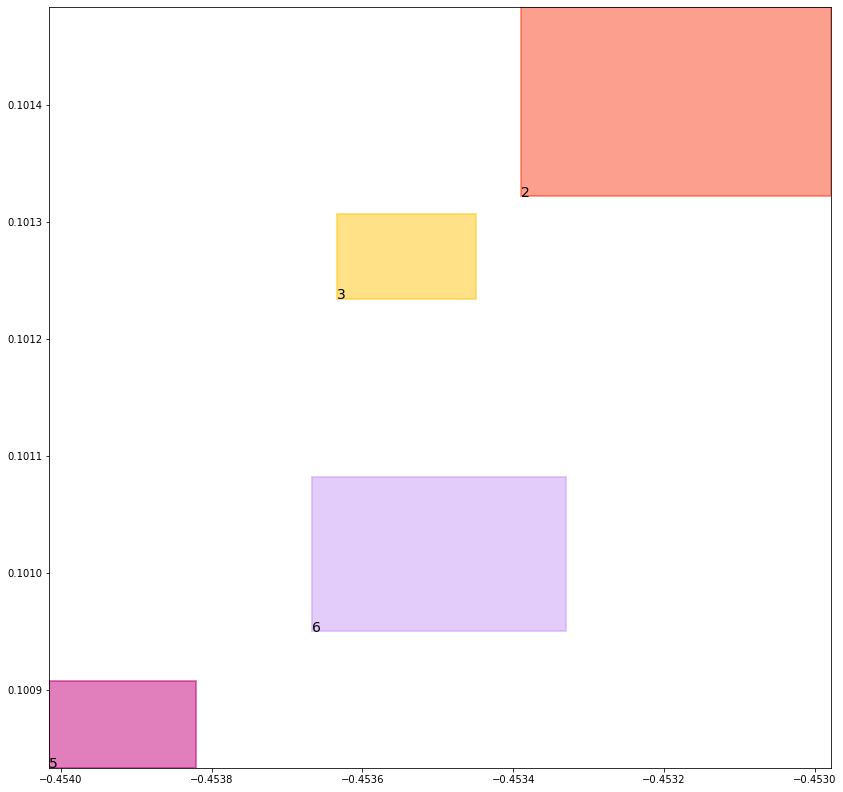

batch (tensor([[6, 2],
        [2, 6],
        [5, 3],
        [1, 2],
        [3, 5],
        [4, 6],
        [4, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0093107195571065, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0082037467509508, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510005235671997, grad_fn=<MulBackward0>)
previous loss: tensor(0.2685149908065796, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04367430880665779 0.050861507654190063 tensor(0.8768554925918579) tensor(0.9621711969375610)
tensor(2) 0.45201873779296875 0.5094994306564331 tensor(0.4521260857582092) tensor(0.5115798115730286)
tensor(3) 0.448164701461792 0.5098092555999756 tensor(0.4485665857791901) tensor(0.5098351240158081)
tensor(4) 0.09990799427032471 0.020766589790582657 tensor(0.9672798514366150) tensor(0.9472181797027588)
tensor(5) 0.5417394042015076 0.49056825041770935 tensor(0.5429996252059937) tensor(0.4910157918930054)
tensor(6) 0.5498400330543518 0.49027830362319946 tensor(0.5503950119018555) tensor(0.4910480380058289)


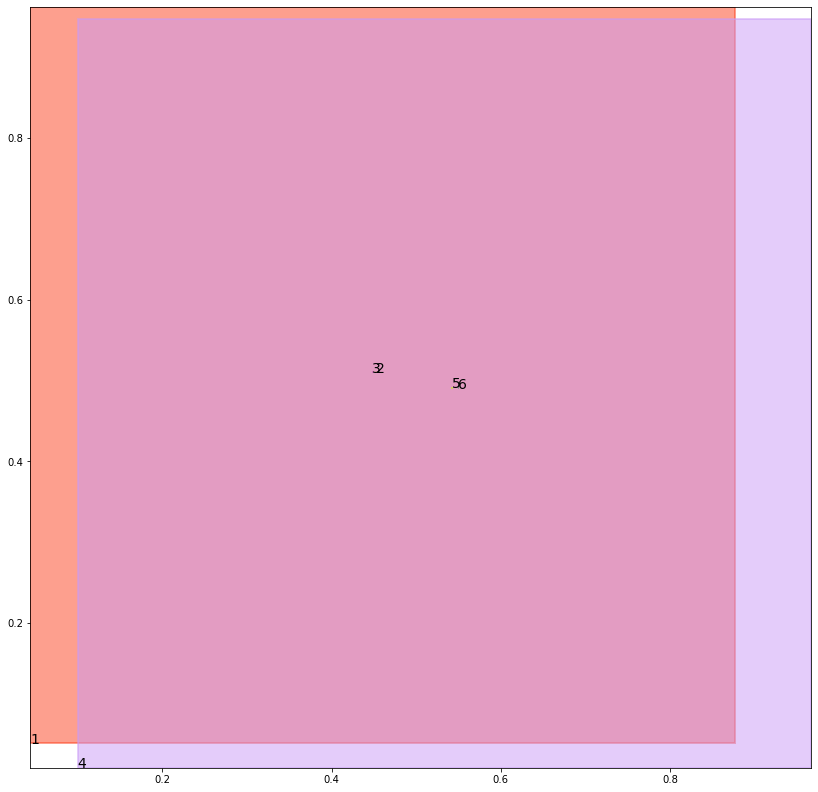

alignment data:
tensor(2) -0.503259539604187 0.11241438239812851 tensor(-0.5026348829269409) tensor(0.1126620694994926)
tensor(3) -0.5033844709396362 0.11237513273954391 tensor(-0.5033541917800903) tensor(0.1123861297965050)
tensor(5) -0.5038378238677979 0.11194417625665665 tensor(-0.5036337375640869) tensor(0.1120217666029930)
tensor(6) -0.5034680366516113 0.112069271504879 tensor(-0.5032079219818115) tensor(0.1121710464358330)


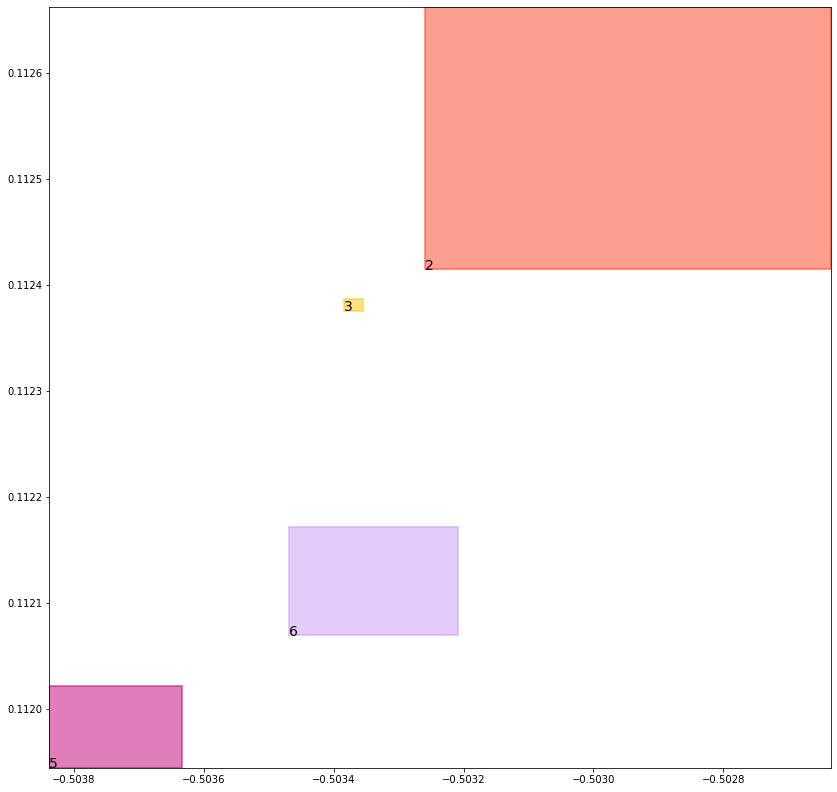

batch (tensor([[4, 6],
        [1, 3],
        [6, 2],
        [4, 5],
        [1, 2],
        [3, 5],
        [5, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0092830751091242, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0081756226718426, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510008513927460, grad_fn=<MulBackward0>)
previous loss: tensor(0.2684595584869385, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04361142963171005 0.050473716109991074 tensor(0.8774836659431458) tensor(0.9622434973716736)
tensor(2) 0.45211419463157654 0.5092735886573792 tensor(0.4531345367431641) tensor(0.5114106535911560)
tensor(3) 0.44849464297294617 0.5095669031143188 tensor(0.4489900767803192) tensor(0.5095992088317871)
tensor(4) 0.09918804466724396 0.02055775560438633 tensor(0.9673138856887817) tensor(0.9472865462303162)
tensor(5) 0.5419066548347473 0.4907129406929016 tensor(0.5421847701072693) tensor(0.4907623231410980)
tensor(6) 0.5488558411598206 0.4902917742729187 tensor(0.5500336885452271) tensor(0.4902999103069305)


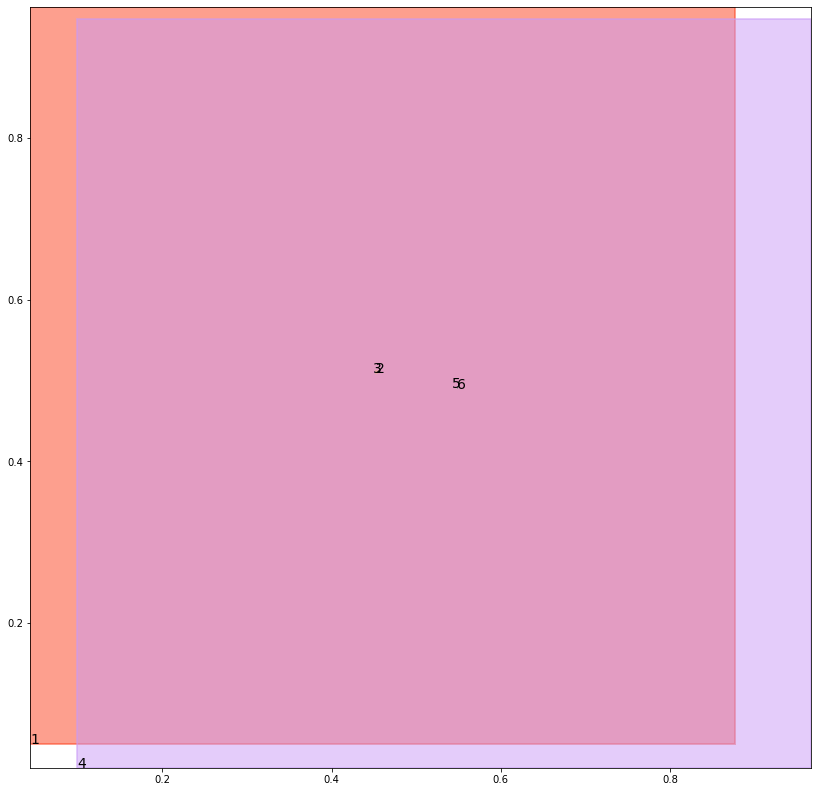

alignment data:
tensor(2) -0.5698212385177612 0.13365215063095093 tensor(-0.5691288709640503) tensor(0.1339241266250610)
tensor(3) -0.569939136505127 0.13361519575119019 tensor(-0.5699014663696289) tensor(0.1336287856101990)
tensor(5) -0.5702458620071411 0.13324019312858582 tensor(-0.5702154636383057) tensor(0.1332515031099319)
tensor(6) -0.5699772834777832 0.1333279013633728 tensor(-0.5699081420898438) tensor(0.1333521306514740)


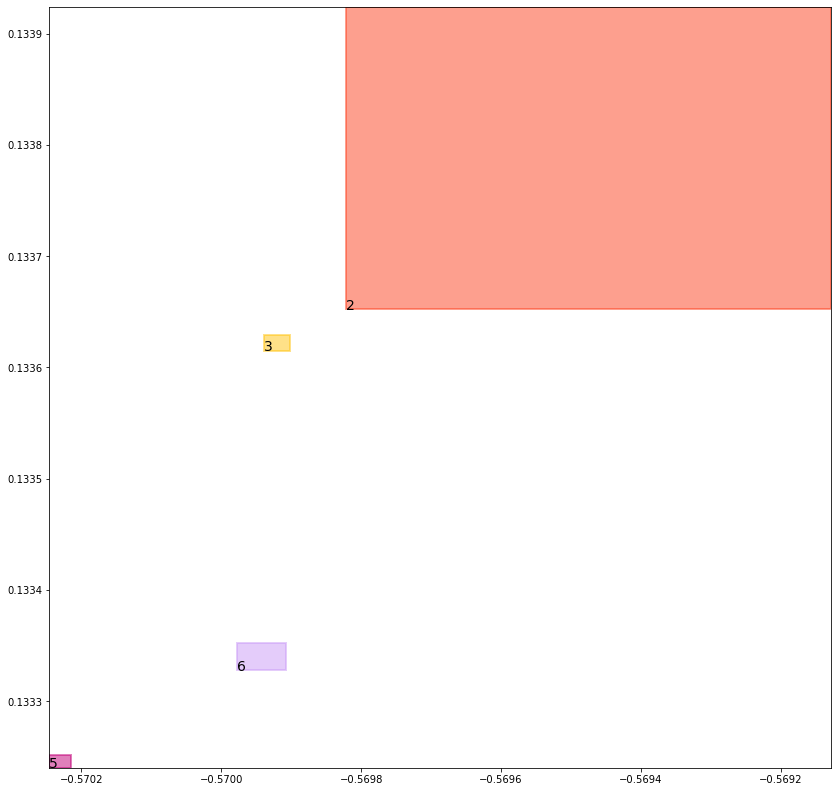

batch (tensor([[1, 3],
        [4, 6],
        [5, 3],
        [2, 6],
        [1, 2],
        [6, 2],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0092680361121893, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0081384256482124, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510034739971161, grad_fn=<MulBackward0>)
previous loss: tensor(0.2684099376201630, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.043548740446567535 0.050091005861759186 tensor(0.8781068921089172) tensor(0.9623156785964966)
tensor(2) 0.45241057872772217 0.5092193484306335 tensor(0.4535591900348663) tensor(0.5107704401016235)
tensor(3) 0.4491337835788727 0.5090905427932739 tensor(0.4491588175296783) tensor(0.5095968246459961)
tensor(4) 0.0984775573015213 0.020352518185973167 tensor(0.9673476815223694) tensor(0.9473549127578735)
tensor(5) 0.5410085320472717 0.49050313234329224 tensor(0.5426776409149170) tensor(0.4905520081520081)
tensor(6) 0.5482825040817261 0.4900083541870117 tensor(0.5494362711906433) tensor(0.4901784956455231)


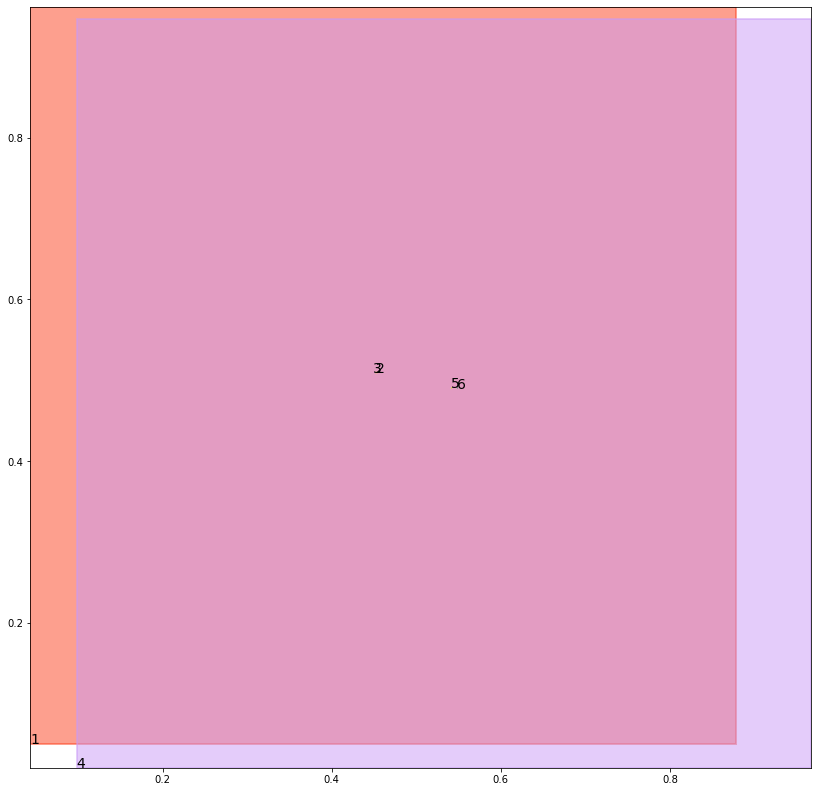

alignment data:
tensor(2) -0.6133228540420532 0.14733466506004333 tensor(-0.6127976179122925) tensor(0.1475398093461990)
tensor(3) -0.6135478019714355 0.14725443720817566 tensor(-0.6133964061737061) tensor(0.1473144292831421)
tensor(5) -0.613822340965271 0.14689455926418304 tensor(-0.6137126684188843) tensor(0.1469334363937378)
tensor(6) -0.6135544776916504 0.1469808965921402 tensor(-0.6134383678436279) tensor(0.1470238119363785)


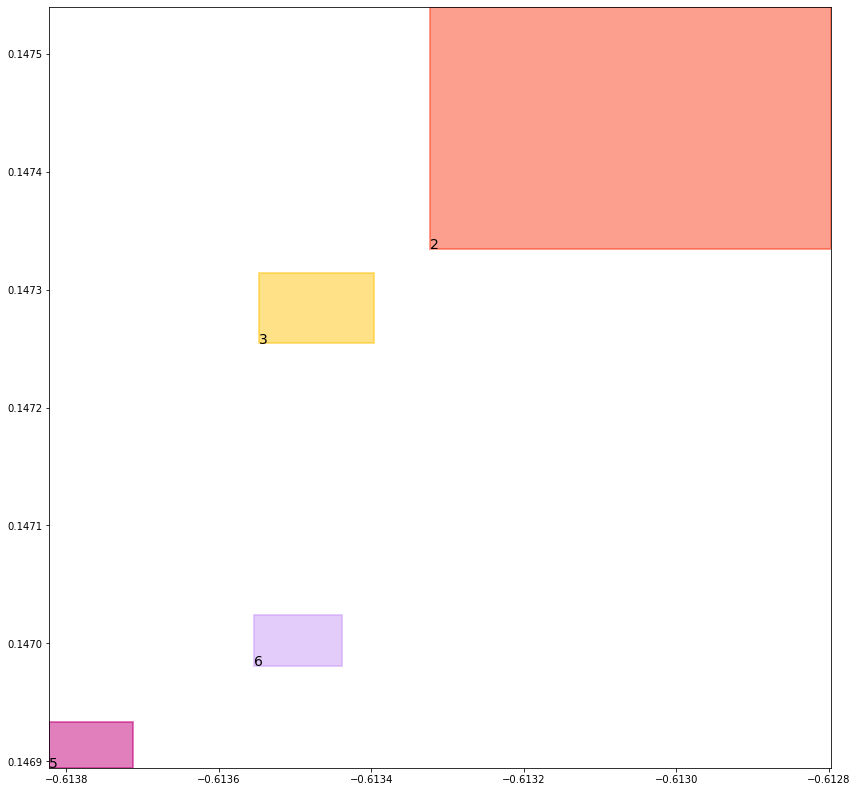

batch (tensor([[3, 5],
        [5, 3],
        [2, 6],
        [4, 6],
        [4, 5],
        [1, 2],
        [6, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0092346780002117, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0081319948658347, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510027289390564, grad_fn=<MulBackward0>)
previous loss: tensor(0.2683694064617157, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04348625987768173 0.049713242799043655 tensor(0.8787251114845276) tensor(0.9623878002166748)
tensor(2) 0.4529856741428375 0.509319543838501 tensor(0.4533587098121643) tensor(0.5097107291221619)
tensor(3) 0.4490974545478821 0.5089089274406433 tensor(0.4500515460968018) tensor(0.5093077421188354)
tensor(4) 0.09777610749006271 0.020150769501924515 tensor(0.9673814773559570) tensor(0.9474231004714966)
tensor(5) 0.5403133034706116 0.49027517437934875 tensor(0.5426230430603027) tensor(0.4906431138515472)
tensor(6) 0.5480818152427673 0.4899263381958008 tensor(0.5486256480216980) tensor(0.4901566803455353)


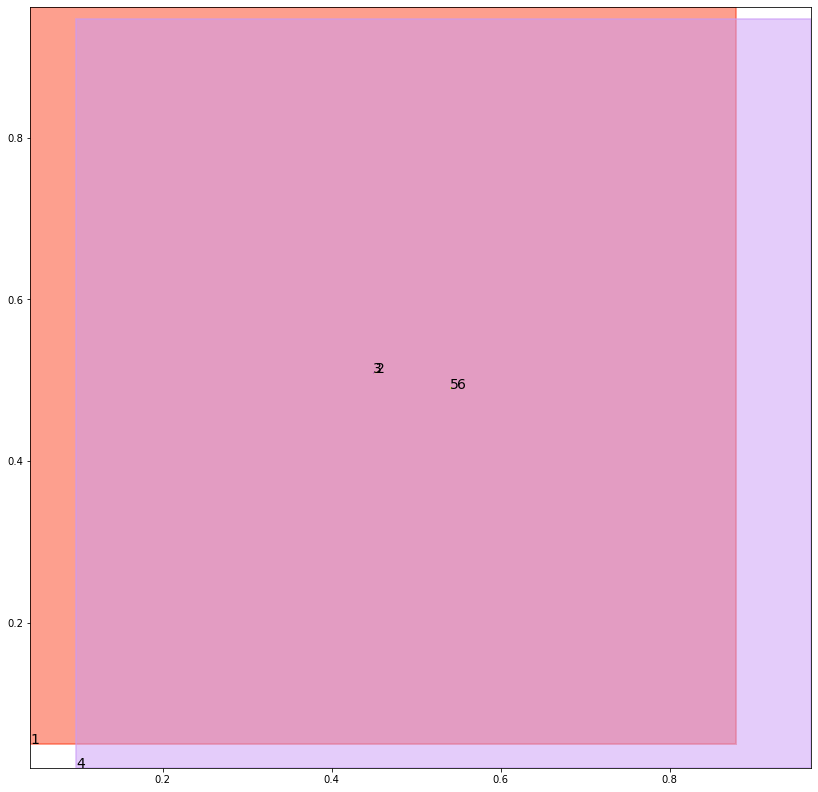

alignment data:
tensor(2) -0.6803537607192993 0.1611582636833191 tensor(-0.6802165508270264) tensor(0.1612115800380707)
tensor(3) -0.6806981563568115 0.16103246808052063 tensor(-0.6805254220962524) tensor(0.1610982716083527)
tensor(5) -0.6809840202331543 0.16066887974739075 tensor(-0.6807428598403931) tensor(0.1607581675052643)
tensor(6) -0.6806420087814331 0.16078314185142517 tensor(-0.6805425882339478) tensor(0.1608210206031799)


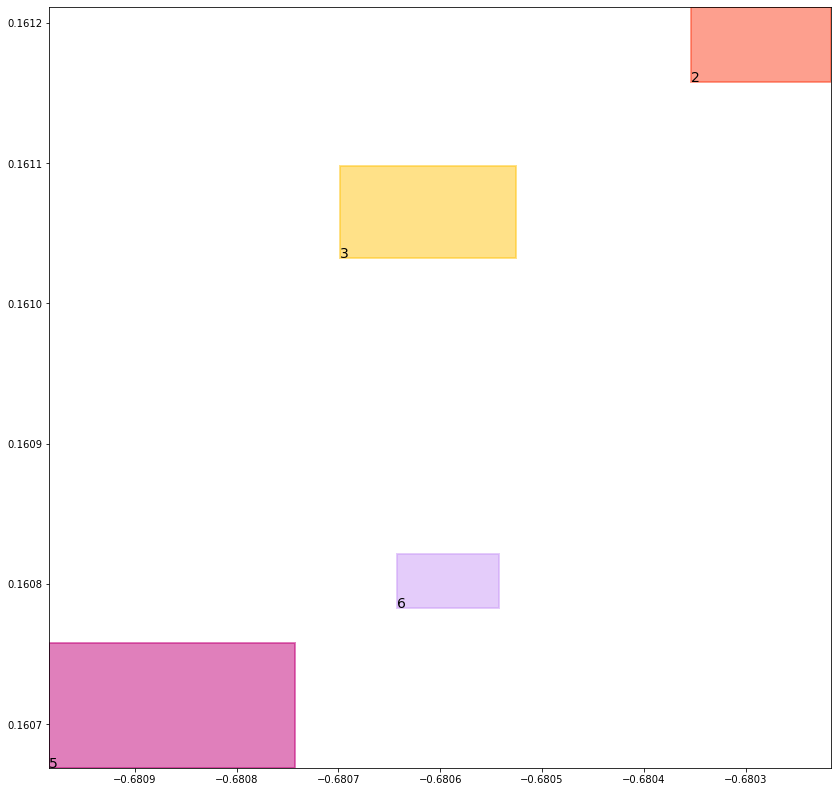

batch (tensor([[5, 3],
        [3, 5],
        [1, 2],
        [1, 3],
        [6, 2],
        [2, 6],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0091978311538696, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0081126755103469, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510046064853668, grad_fn=<MulBackward0>)
previous loss: tensor(0.2683151066303253, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.043423984199762344 0.0493403859436512 tensor(0.8793385028839111) tensor(0.9624595642089844)
tensor(2) 0.4525977075099945 0.5082852244377136 tensor(0.4538118243217468) tensor(0.5095585584640503)
tensor(3) 0.44931623339653015 0.5087323188781738 tensor(0.4506132304668427) tensor(0.5090231299400330)
tensor(4) 0.09708347916603088 0.019952425733208656 tensor(0.9674150943756104) tensor(0.9474912285804749)
tensor(5) 0.5400542616844177 0.49013879895210266 tensor(0.5418207645416260) tensor(0.4903300106525421)
tensor(6) 0.5476230382919312 0.48982474207878113 tensor(0.5482175350189209) tensor(0.4898259937763214)


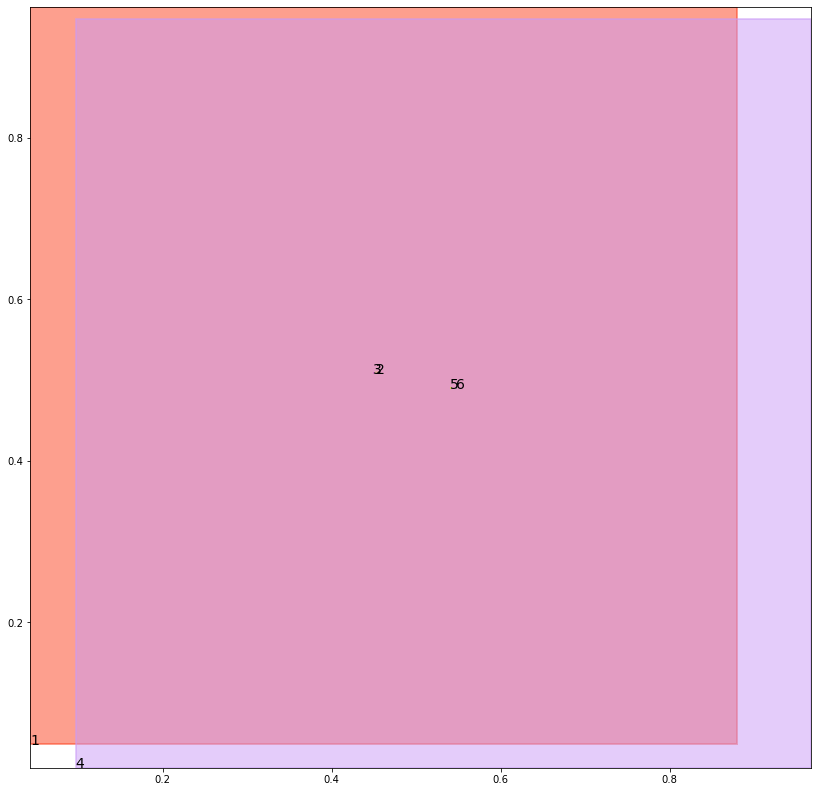

alignment data:
tensor(2) -0.7184793949127197 0.16904529929161072 tensor(-0.7180329561233521) tensor(0.1692186295986176)
tensor(3) -0.718536376953125 0.16903173923492432 tensor(-0.7183756828308105) tensor(0.1690917611122131)
tensor(5) -0.7187989950180054 0.168678879737854 tensor(-0.7186405658721924) tensor(0.1687367260456085)
tensor(6) -0.71845543384552 0.1687941551208496 tensor(-0.7184208631515503) tensor(0.1688062250614166)


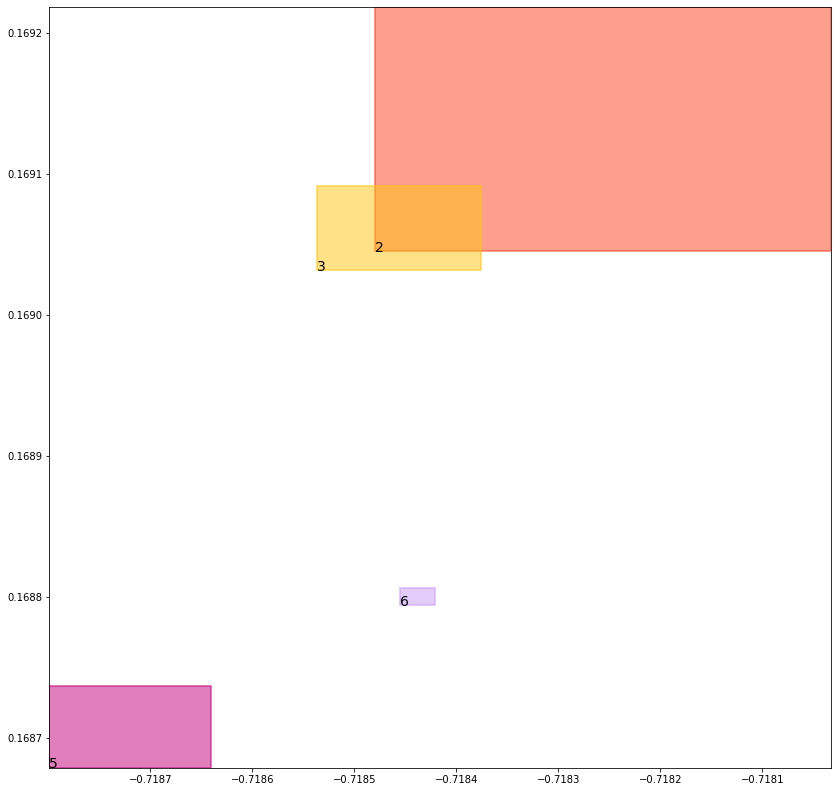

batch (tensor([[4, 6],
        [3, 5],
        [6, 2],
        [1, 3],
        [4, 5],
        [5, 3],
        [2, 6],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0091935303062201, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0080815497785807, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510032951831818, grad_fn=<MulBackward0>)
previous loss: tensor(0.2682783603668213, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04336187243461609 0.04897218942642212 tensor(0.8799471855163574) tensor(0.9625312685966492)
tensor(2) 0.45259982347488403 0.507413387298584 tensor(0.4542980492115021) tensor(0.5096008777618408)
tensor(3) 0.449788361787796 0.5084882974624634 tensor(0.4508519768714905) tensor(0.5088074803352356)
tensor(4) 0.09639953076839447 0.019757403060793877 tensor(0.9674486517906189) tensor(0.9475592970848083)
tensor(5) 0.540189266204834 0.4896092116832733 tensor(0.5403469800949097) tensor(0.4901296496391296)
tensor(6) 0.5469096899032593 0.48959001898765564 tensor(0.5478973388671875) tensor(0.4899239242076874)


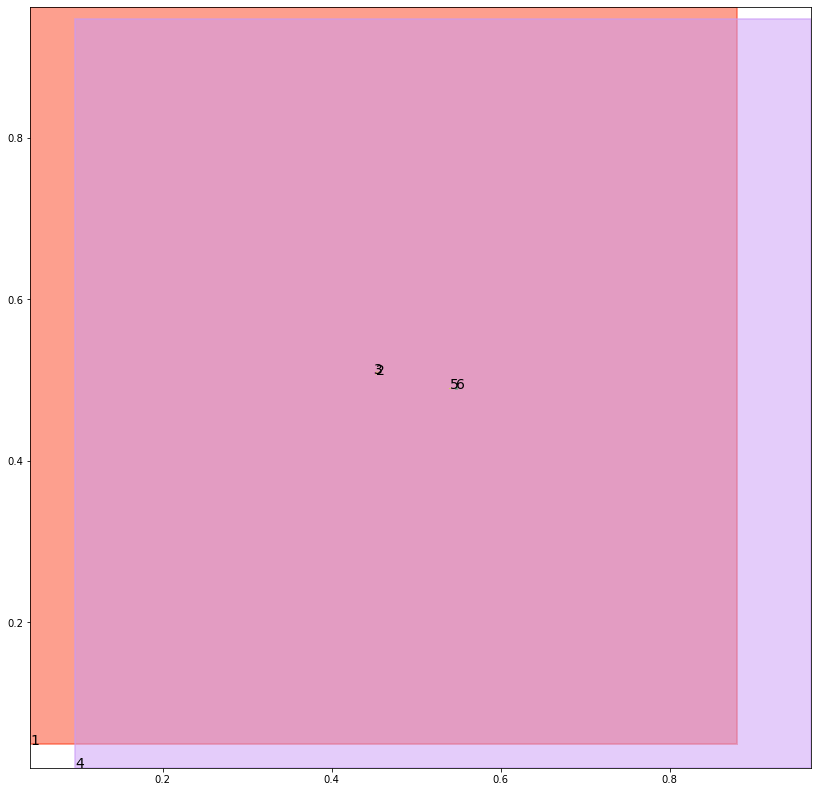

alignment data:
tensor(2) -0.7324769496917725 0.1790863275527954 tensor(-0.7317330837249756) tensor(0.1793758124113083)
tensor(3) -0.7323228120803833 0.1791549026966095 tensor(-0.7321668863296509) tensor(0.1792136430740356)
tensor(5) -0.7326521873474121 0.17877808213233948 tensor(-0.7324894666671753) tensor(0.1788420379161835)
tensor(6) -0.7322680950164795 0.17891158163547516 tensor(-0.7321121692657471) tensor(0.1789704859256744)


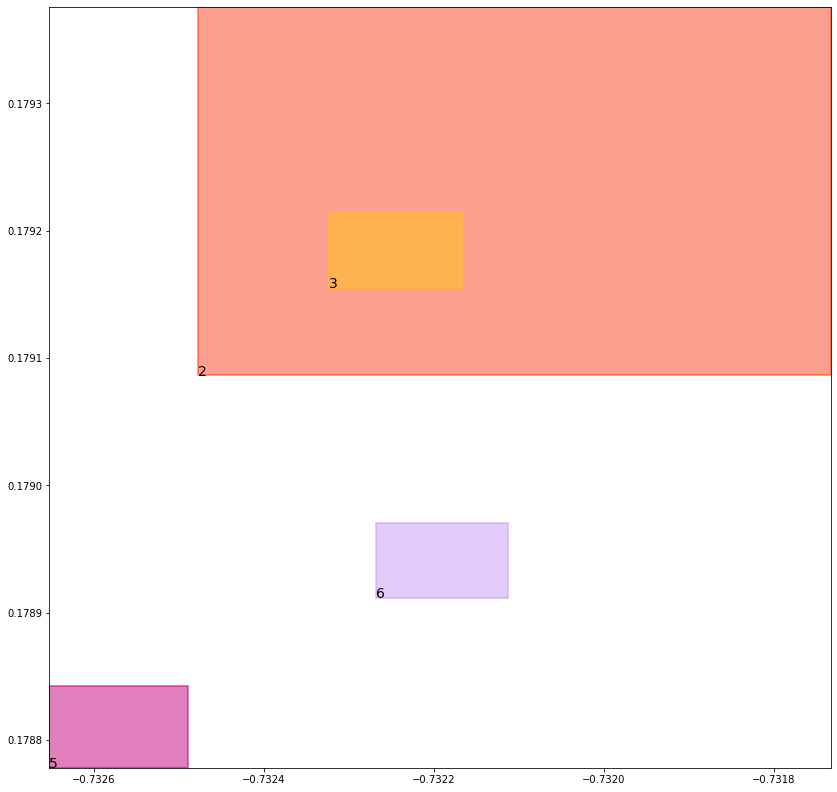

batch (tensor([[1, 2],
        [4, 6],
        [4, 5],
        [5, 3],
        [6, 2],
        [3, 5],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0091784019023180, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0080510256811976, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509996891021729, grad_fn=<MulBackward0>)
previous loss: tensor(0.2682291269302368, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04329993575811386 0.04860846698284149 tensor(0.8805510401725769) tensor(0.9626026153564453)
tensor(2) 0.4532935619354248 0.5070517063140869 tensor(0.4544761478900909) tensor(0.5094648003578186)
tensor(3) 0.4504891037940979 0.5082924962043762 tensor(0.4507987797260284) tensor(0.5085433721542358)
tensor(4) 0.09572415053844452 0.019565580412745476 tensor(0.9674820303916931) tensor(0.9476271867752075)
tensor(5) 0.538274884223938 0.48934075236320496 tensor(0.5406787395477295) tensor(0.4899893701076508)
tensor(6) 0.5464584231376648 0.4895007610321045 tensor(0.5471650362014771) tensor(0.4895471632480621)


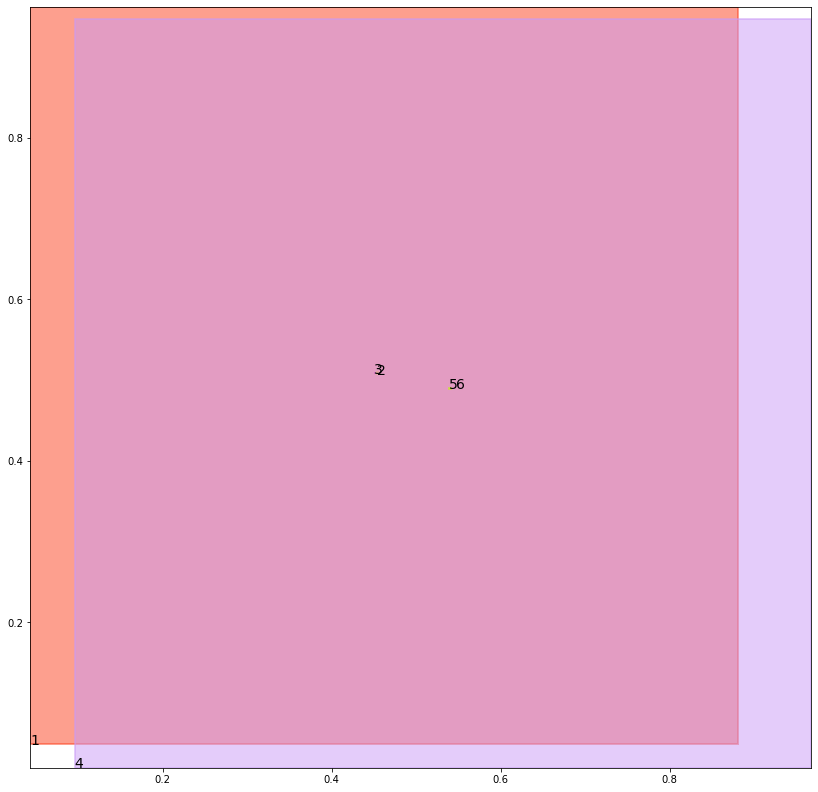

alignment data:
tensor(2) -0.7256873250007629 0.18591049313545227 tensor(-0.7249071002006531) tensor(0.1862153410911560)
tensor(3) -0.7254851460456848 0.18599790334701538 tensor(-0.7253931164741516) tensor(0.1860333979129791)
tensor(5) -0.7259532809257507 0.18557575345039368 tensor(-0.7256219983100891) tensor(0.1857000291347504)
tensor(6) -0.725429117679596 0.18576061725616455 tensor(-0.7253742814064026) tensor(0.1857803463935852)


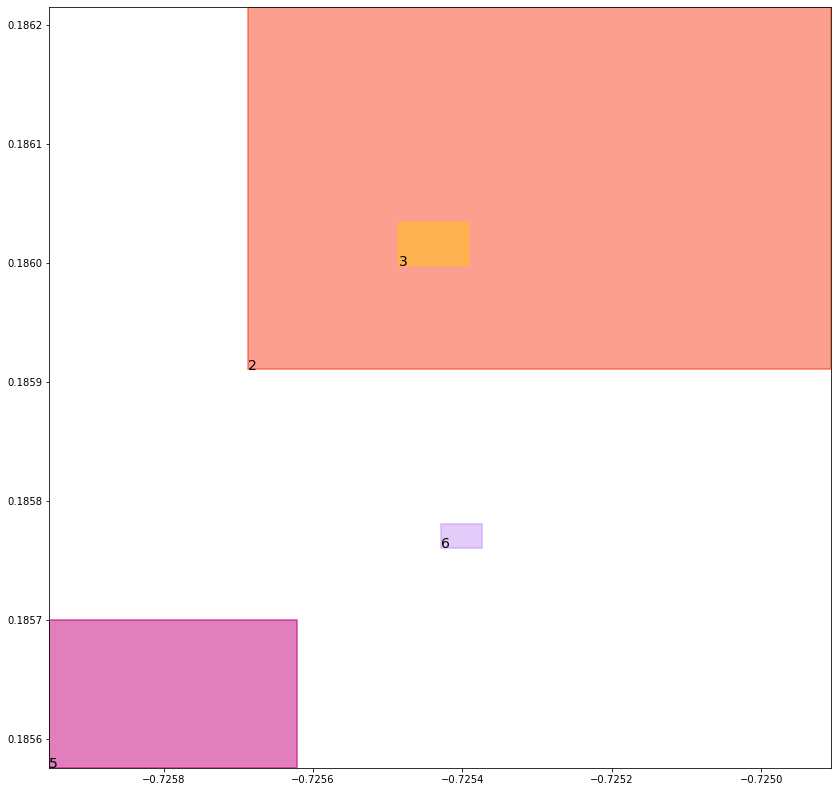

batch (tensor([[1, 3],
        [4, 5],
        [2, 6],
        [3, 5],
        [1, 2],
        [6, 2],
        [5, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0091370157897472, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0080484114587307, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509994804859161, grad_fn=<MulBackward0>)
previous loss: tensor(0.2681849002838135, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04323817789554596 0.04824911057949066 tensor(0.8811501860618591) tensor(0.9626738429069519)
tensor(2) 0.45437589287757874 0.5071543455123901 tensor(0.4546096324920654) tensor(0.5091665983200073)
tensor(3) 0.45048272609710693 0.5081042647361755 tensor(0.4513953328132629) tensor(0.5082786083221436)
tensor(4) 0.09505666792392731 0.019376875832676888 tensor(0.9675152897834778) tensor(0.9476950764656067)
tensor(5) 0.5370356440544128 0.48948684334754944 tensor(0.5406805276870728) tensor(0.4897295534610748)
tensor(6) 0.5460622310638428 0.4887438714504242 tensor(0.5462443828582764) tensor(0.4895439743995667)


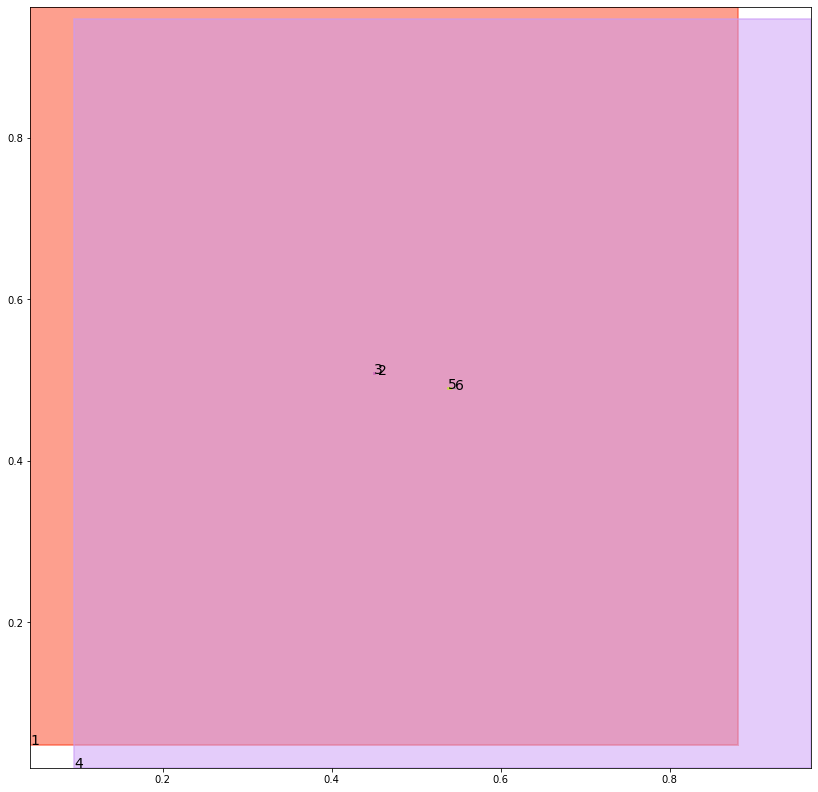

alignment data:
tensor(2) -0.7119075655937195 0.19301144778728485 tensor(-0.7113015055656433) tensor(0.1932497173547745)
tensor(3) -0.711855947971344 0.19304217398166656 tensor(-0.7117512822151184) tensor(0.1930810362100601)
tensor(5) -0.7122654318809509 0.19264957308769226 tensor(-0.7119805216789246) tensor(0.1927521973848343)
tensor(6) -0.7119553685188293 0.19274777173995972 tensor(-0.7117092013359070) tensor(0.1928443461656570)


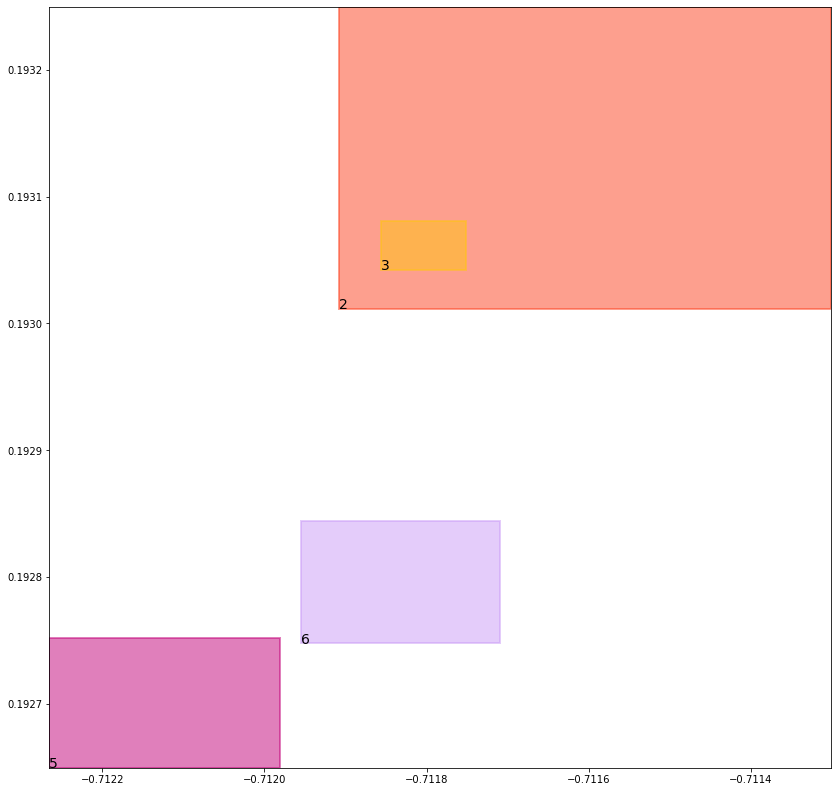

batch (tensor([[6, 2],
        [1, 3],
        [5, 3],
        [3, 5],
        [4, 6],
        [2, 6],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0091013768687844, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0080368742346764, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509995102882385, grad_fn=<MulBackward0>)
previous loss: tensor(0.2681377530097961, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04317662864923477 0.04789411276578903 tensor(0.8817445039749146) tensor(0.9627447724342346)
tensor(2) 0.45459190011024475 0.5076672434806824 tensor(0.4552172124385834) tensor(0.5087223649024963)
tensor(3) 0.450537770986557 0.507724940776825 tensor(0.4519980251789093) tensor(0.5082130432128906)
tensor(4) 0.09439670294523239 0.019191201776266098 tensor(0.9675484299659729) tensor(0.9477628469467163)
tensor(5) 0.5365551710128784 0.4893617630004883 tensor(0.5402405858039856) tensor(0.4900056123733521)
tensor(6) 0.5453848838806152 0.48842787742614746 tensor(0.5457836985588074) tensor(0.4894369244575500)


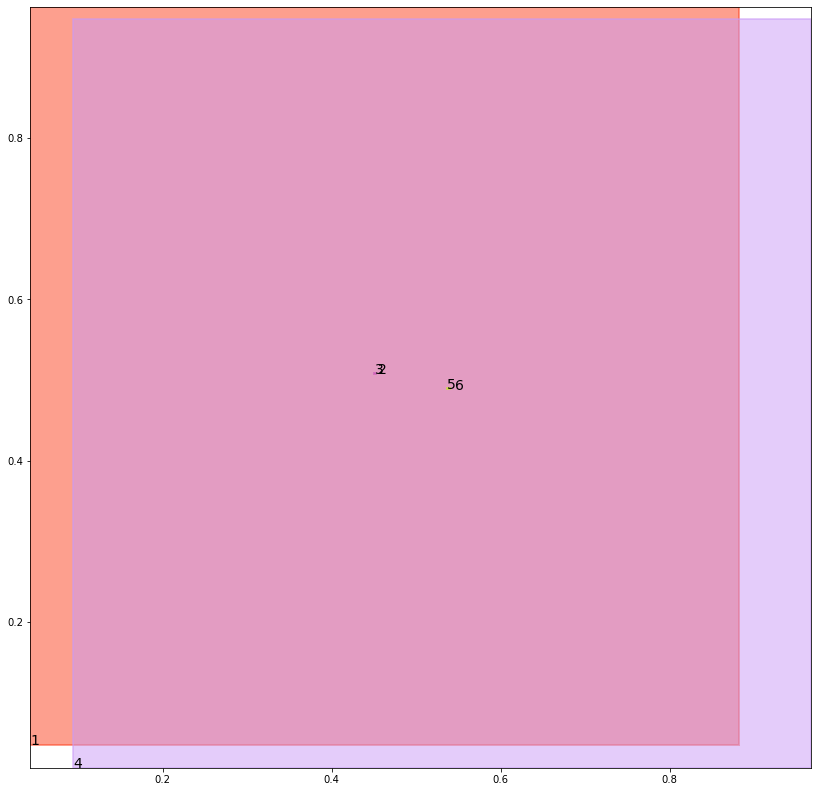

alignment data:
tensor(2) -0.6958497762680054 0.2025812715291977 tensor(-0.6955027580261230) tensor(0.2027162611484528)
tensor(3) -0.6960715055465698 0.20250463485717773 tensor(-0.6958420276641846) tensor(0.2025911211967468)
tensor(5) -0.6964064836502075 0.20214629173278809 tensor(-0.6960003376007080) tensor(0.2022965252399445)
tensor(6) -0.6961613893508911 0.20221960544586182 tensor(-0.6958411931991577) tensor(0.2023446261882782)


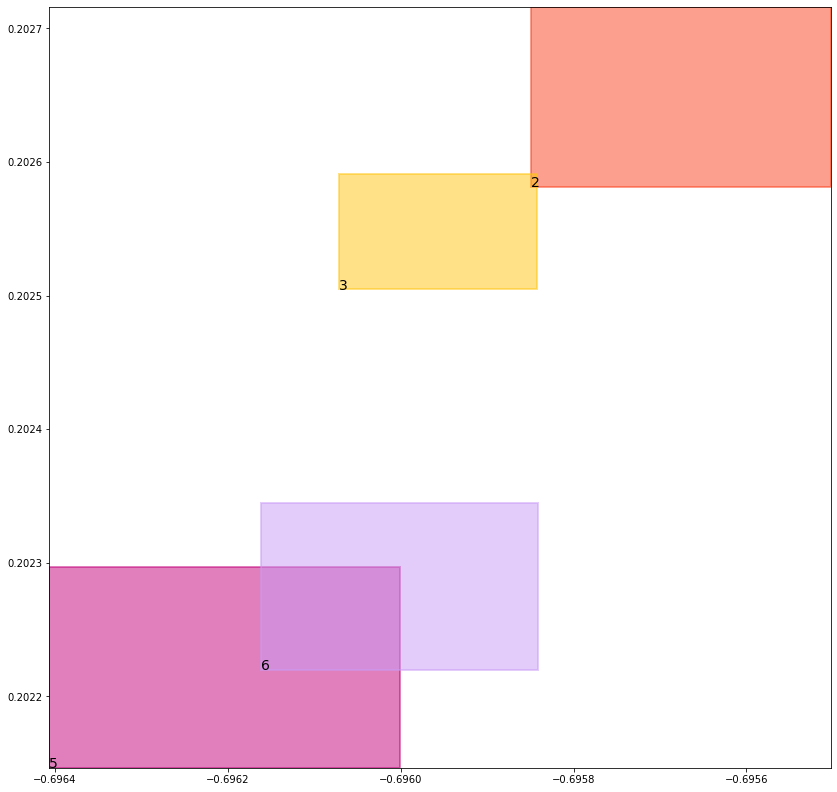

batch (tensor([[6, 2],
        [5, 3],
        [3, 5],
        [4, 6],
        [2, 6],
        [1, 2],
        [1, 3],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0090820696204901, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0080236261710525, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509989142417908, grad_fn=<MulBackward0>)
previous loss: tensor(0.2681046128273010, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04311525449156761 0.0475434809923172 tensor(0.8823344707489014) tensor(0.9628155827522278)
tensor(2) 0.4550933241844177 0.5081472396850586 tensor(0.4551826417446136) tensor(0.5085403323173523)
tensor(3) 0.45092901587486267 0.5075029730796814 tensor(0.4523256123065948) tensor(0.5079936385154724)
tensor(4) 0.09374406933784485 0.019008470699191093 tensor(0.9675815105438232) tensor(0.9478306174278259)
tensor(5) 0.5367609262466431 0.48914626240730286 tensor(0.5394017100334167) tensor(0.4900291562080383)
tensor(6) 0.5450942516326904 0.4885627031326294 tensor(0.5451005101203918) tensor(0.4891932606697083)


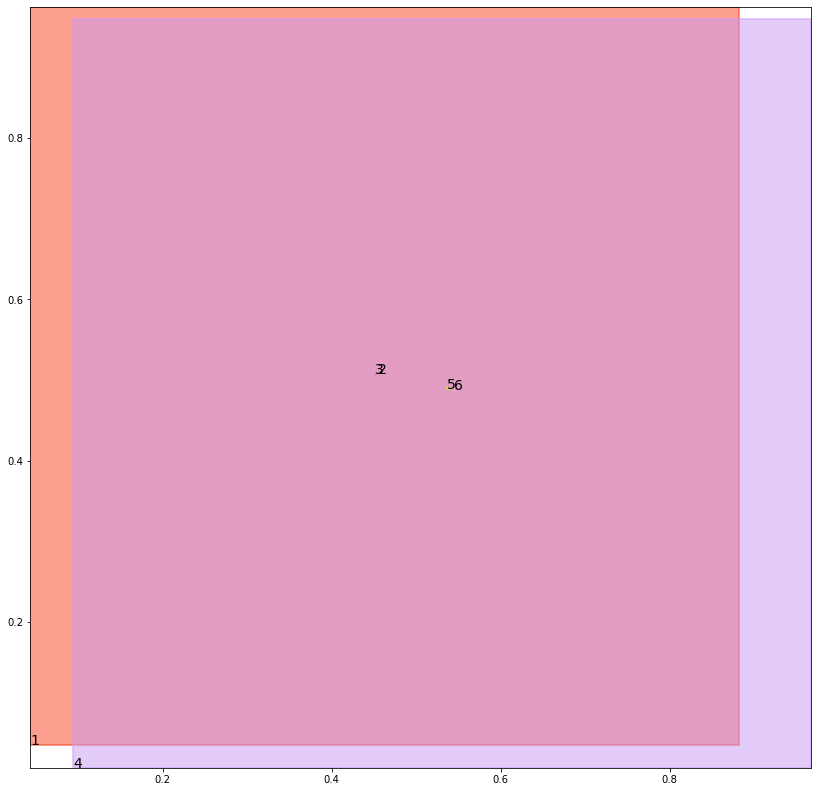

alignment data:
tensor(2) -0.6873596906661987 0.20651134848594666 tensor(-0.6872389316558838) tensor(0.2065585851669312)
tensor(3) -0.6877951622009277 0.2063509225845337 tensor(-0.6875685453414917) tensor(0.2064363956451416)
tensor(5) -0.6881090402603149 0.20600521564483643 tensor(-0.6876934766769409) tensor(0.2061617374420166)
tensor(6) -0.6877875328063965 0.20611003041267395 tensor(-0.6876019239425659) tensor(0.2061829864978790)


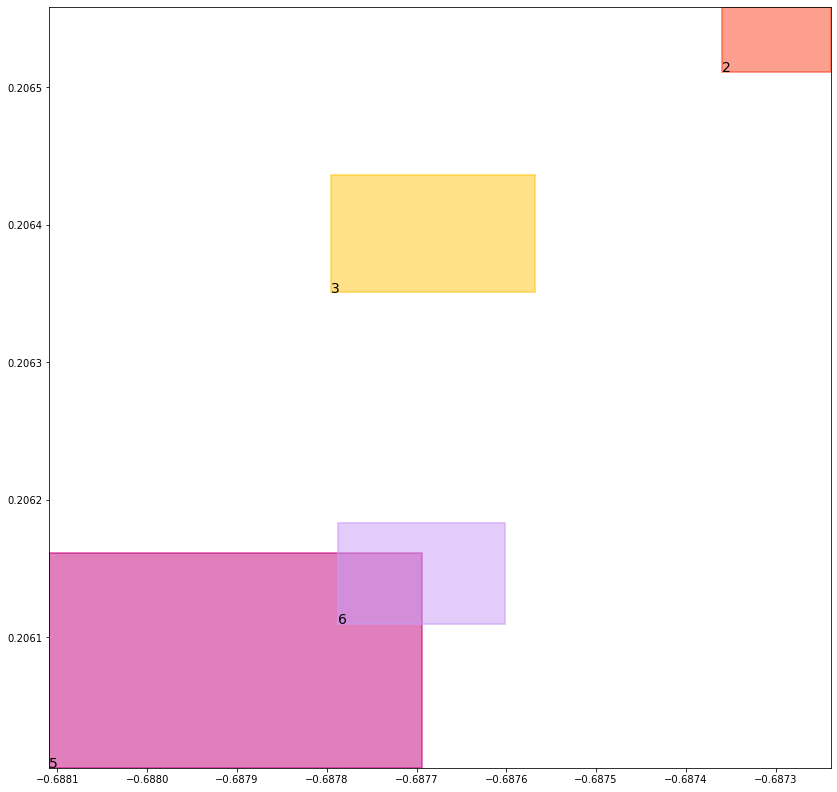

batch (tensor([[1, 2],
        [1, 3],
        [2, 6],
        [6, 2],
        [4, 5],
        [5, 3],
        [4, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0090435752645135, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0079861637204885, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510021924972534, grad_fn=<MulBackward0>)
previous loss: tensor(0.2680319249629974, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04305407777428627 0.047197237610816956 tensor(0.8829197287559509) tensor(0.9628862142562866)
tensor(2) 0.45456963777542114 0.5077768564224243 tensor(0.4558520317077637) tensor(0.5088581442832947)
tensor(3) 0.4516238272190094 0.5074782967567444 tensor(0.4524043500423431) tensor(0.5075818300247192)
tensor(4) 0.09309890121221542 0.018828637897968292 tensor(0.9676144719123840) tensor(0.9478982090950012)
tensor(5) 0.5375826358795166 0.4890686869621277 tensor(0.5382044315338135) tensor(0.4896027147769928)
tensor(6) 0.5442169308662415 0.4888263940811157 tensor(0.5451533794403076) tensor(0.4891081750392914)


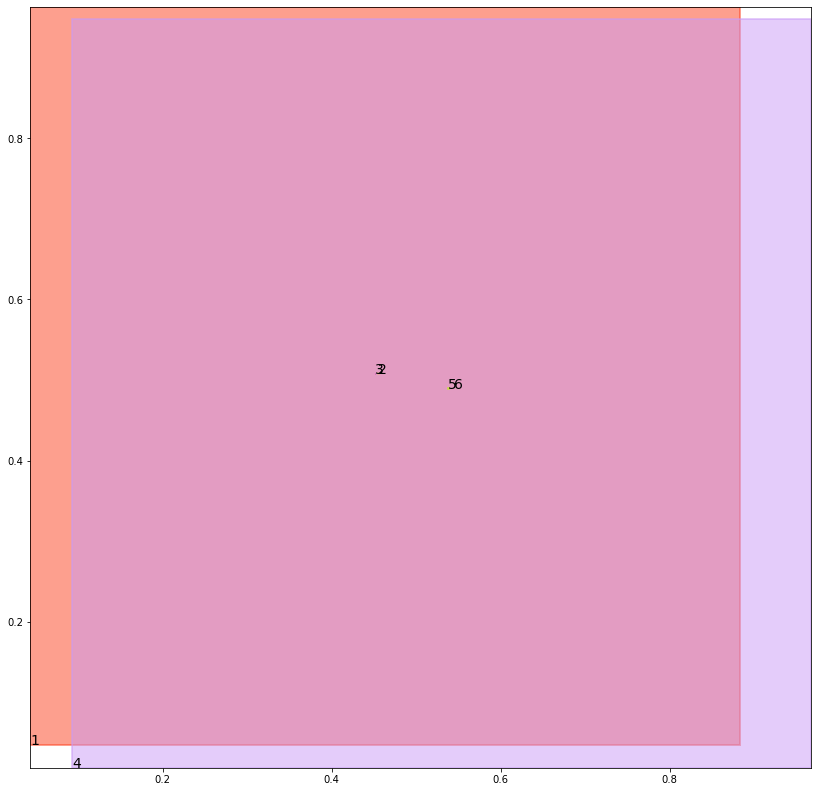

alignment data:
tensor(2) -0.657290518283844 0.20902618765830994 tensor(-0.6568970084190369) tensor(0.2091773748397827)
tensor(3) -0.6575533747673035 0.20893055200576782 tensor(-0.6574764847755432) tensor(0.2089586853981018)
tensor(5) -0.6578447222709656 0.20859727263450623 tensor(-0.6576511263847351) tensor(0.2086717188358307)
tensor(6) -0.6575214266777039 0.2087073028087616 tensor(-0.6573831439018250) tensor(0.2087592184543610)


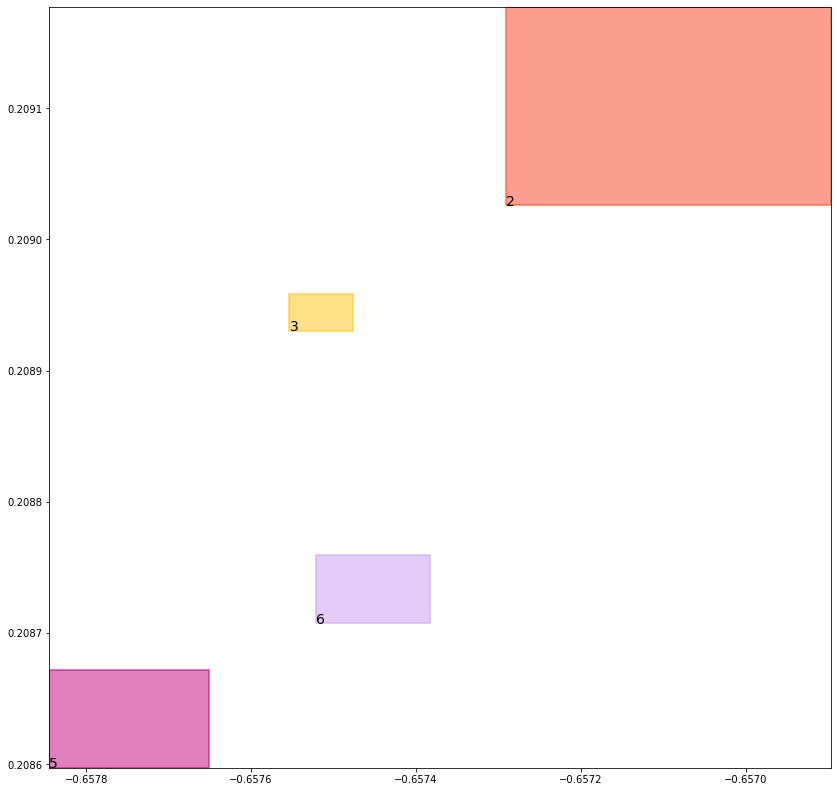

batch (tensor([[4, 5],
        [6, 2],
        [3, 5],
        [1, 2],
        [4, 6],
        [2, 6],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0090286582708359, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0079488828778267, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510033249855042, grad_fn=<MulBackward0>)
previous loss: tensor(0.2679808735847473, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04299306869506836 0.046855296939611435 tensor(0.8835005760192871) tensor(0.9629566073417664)
tensor(2) 0.45470237731933594 0.5075942277908325 tensor(0.4562749564647675) tensor(0.5086676478385925)
tensor(3) 0.4522583782672882 0.5072960257530212 tensor(0.4525918960571289) tensor(0.5073396563529968)
tensor(4) 0.09246129542589188 0.018651675432920456 tensor(0.9676471948623657) tensor(0.9479658007621765)
tensor(5) 0.5366867780685425 0.48877233266830444 tensor(0.5389524698257446) tensor(0.4891160428524017)
tensor(6) 0.543615460395813 0.4886256456375122 tensor(0.5447688698768616) tensor(0.4891354143619537)


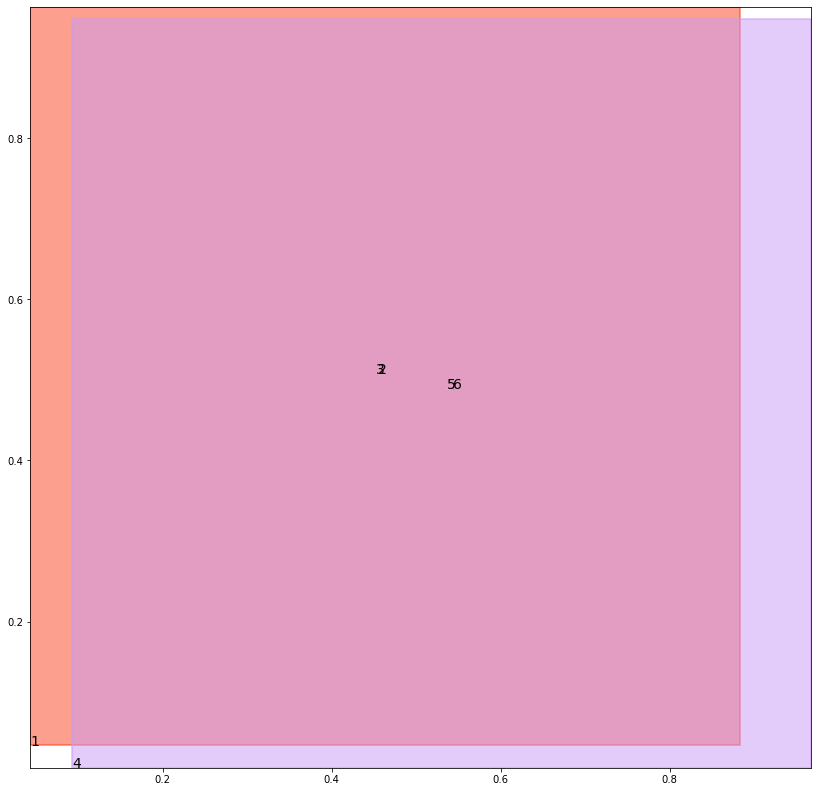

alignment data:
tensor(2) -0.6335480213165283 0.2224109023809433 tensor(-0.6331394910812378) tensor(0.2225671261548996)
tensor(3) -0.6337814331054688 0.22232557833194733 tensor(-0.6337487697601318) tensor(0.2223375588655472)
tensor(5) -0.6341675519943237 0.22196324169635773 tensor(-0.6339315176010132) tensor(0.2220501154661179)
tensor(6) -0.6337966918945312 0.22209131717681885 tensor(-0.6335784196853638) tensor(0.2221739739179611)


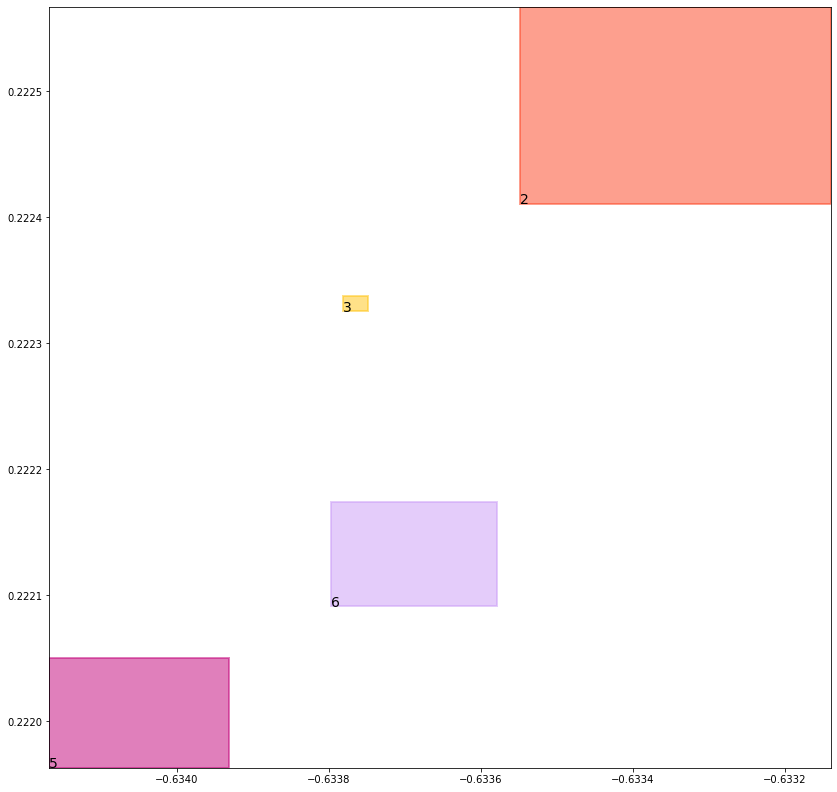

batch (tensor([[5, 3],
        [4, 6],
        [2, 6],
        [1, 2],
        [3, 5],
        [1, 3],
        [6, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0090010222047567, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0079496037214994, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510024905204773, grad_fn=<MulBackward0>)
previous loss: tensor(0.2679531276226044, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042932238429784775 0.04651756212115288 tensor(0.8840768933296204) tensor(0.9630268216133118)
tensor(2) 0.4555092751979828 0.5075814127922058 tensor(0.4563939273357391) tensor(0.5080191493034363)
tensor(3) 0.4523990750312805 0.506807267665863 tensor(0.4531967341899872) tensor(0.5074136257171631)
tensor(4) 0.09183092415332794 0.01847750134766102 tensor(0.9676799178123474) tensor(0.9480332732200623)
tensor(5) 0.5356898307800293 0.4884151220321655 tensor(0.5394460558891296) tensor(0.4890245497226715)
tensor(6) 0.5432695746421814 0.4885757863521576 tensor(0.5439837574958801) tensor(0.4886913001537323)


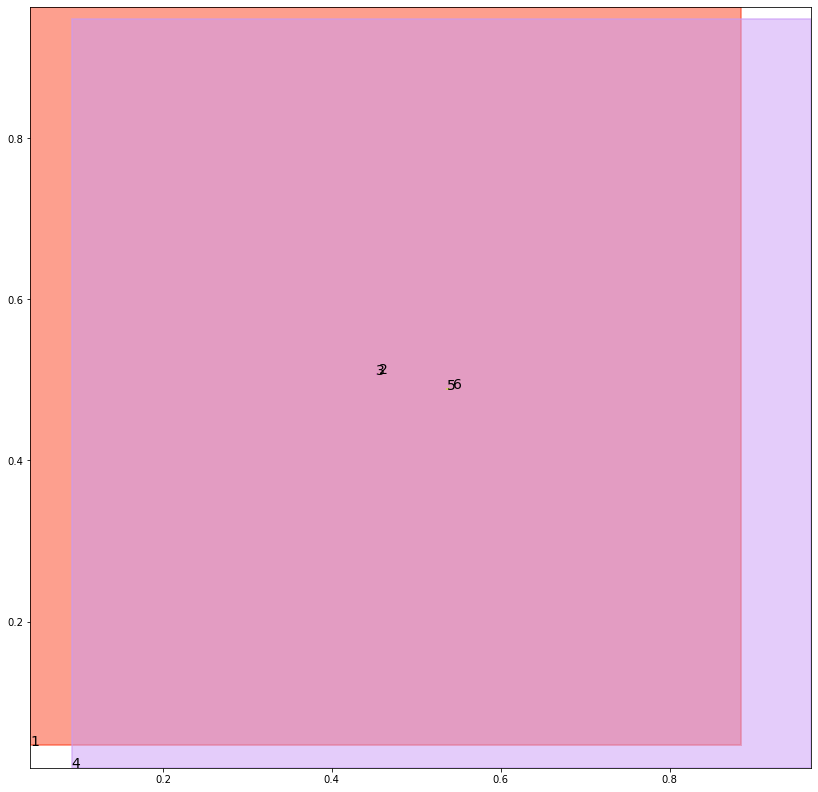

alignment data:
tensor(2) -0.6332627534866333 0.2297862321138382 tensor(-0.6330815553665161) tensor(0.2298549860715866)
tensor(3) -0.6336761713027954 0.22963212430477142 tensor(-0.6334507465362549) tensor(0.2297183722257614)
tensor(5) -0.6340620517730713 0.22927707433700562 tensor(-0.6336581707000732) tensor(0.2294258922338486)
tensor(6) -0.633560061454773 0.2294548898935318 tensor(-0.6334834098815918) tensor(0.2294831126928329)


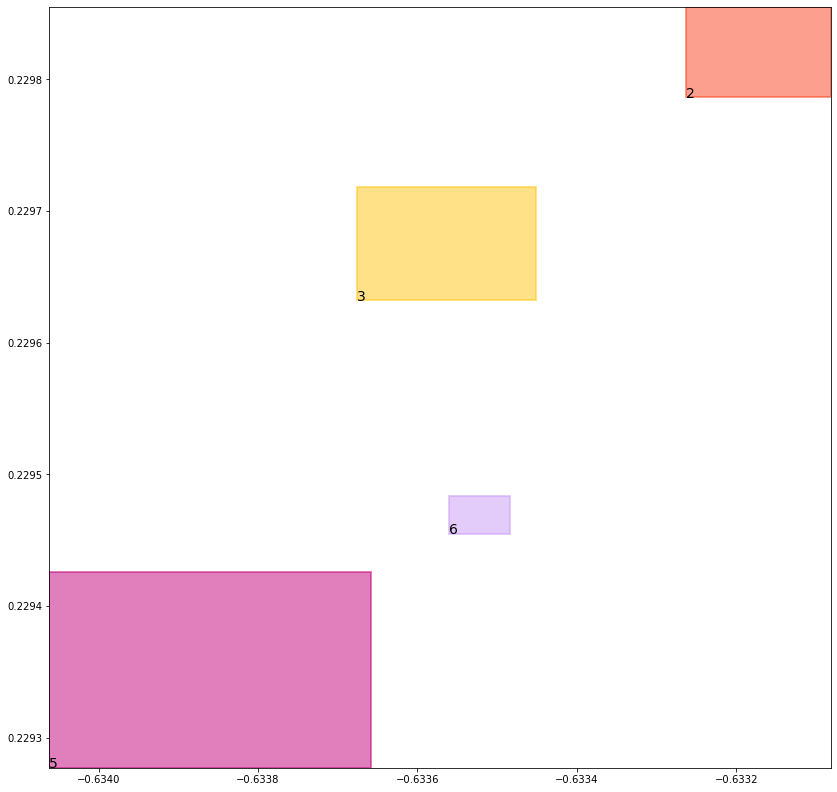

batch (tensor([[1, 2],
        [6, 2],
        [4, 6],
        [2, 6],
        [1, 3],
        [3, 5],
        [4, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0089725451543927, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0079398415982723, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510024905204773, grad_fn=<MulBackward0>)
previous loss: tensor(0.2679148912429810, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042871590703725815 0.04618394002318382 tensor(0.8846489191055298) tensor(0.9630969166755676)
tensor(2) 0.4562385380268097 0.5069605112075806 tensor(0.4569215476512909) tensor(0.5077215433120728)
tensor(3) 0.4527990520000458 0.5066069960594177 tensor(0.4534721076488495) tensor(0.5072005391120911)
tensor(4) 0.09120751172304153 0.018306037411093712 tensor(0.9677125215530396) tensor(0.9481008052825928)
tensor(5) 0.5351662039756775 0.4884878695011139 tensor(0.5391435027122498) tensor(0.4888077080249786)
tensor(6) 0.5428385138511658 0.4878218472003937 tensor(0.5431550145149231) tensor(0.4886631071567535)


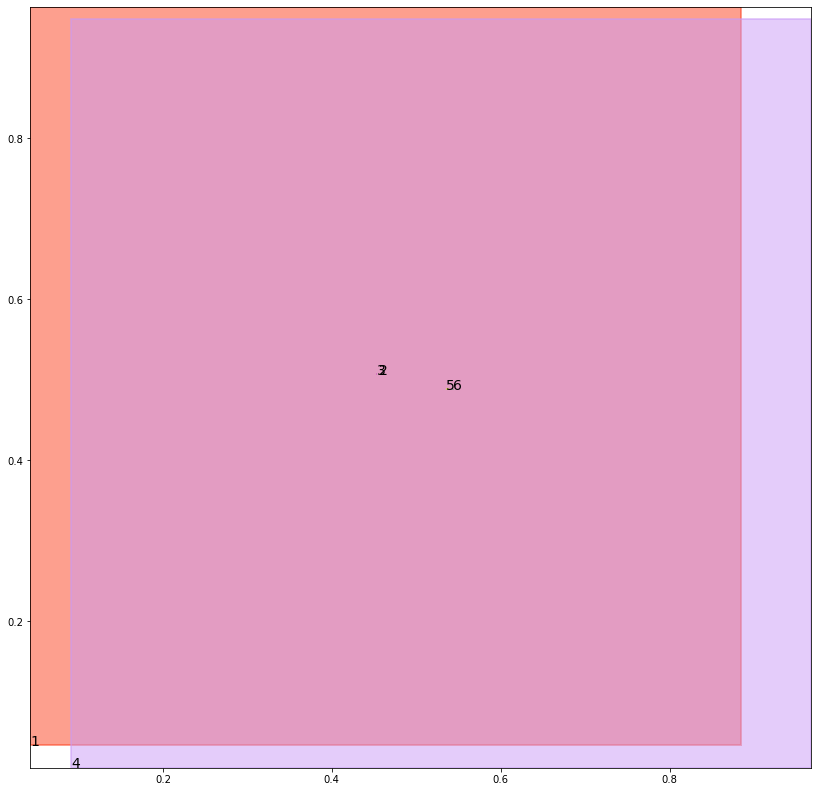

alignment data:
tensor(2) -0.6318855285644531 0.25033363699913025 tensor(-0.6316217184066772) tensor(0.2504350244998932)
tensor(3) -0.6321961879730225 0.25022050738334656 tensor(-0.6319819688796997) tensor(0.2503025233745575)
tensor(5) -0.6325278282165527 0.24989324808120728 tensor(-0.6321946382522583) tensor(0.2500139176845551)
tensor(6) -0.6322600841522217 0.2499794363975525 tensor(-0.6319949626922607) tensor(0.2500822544097900)


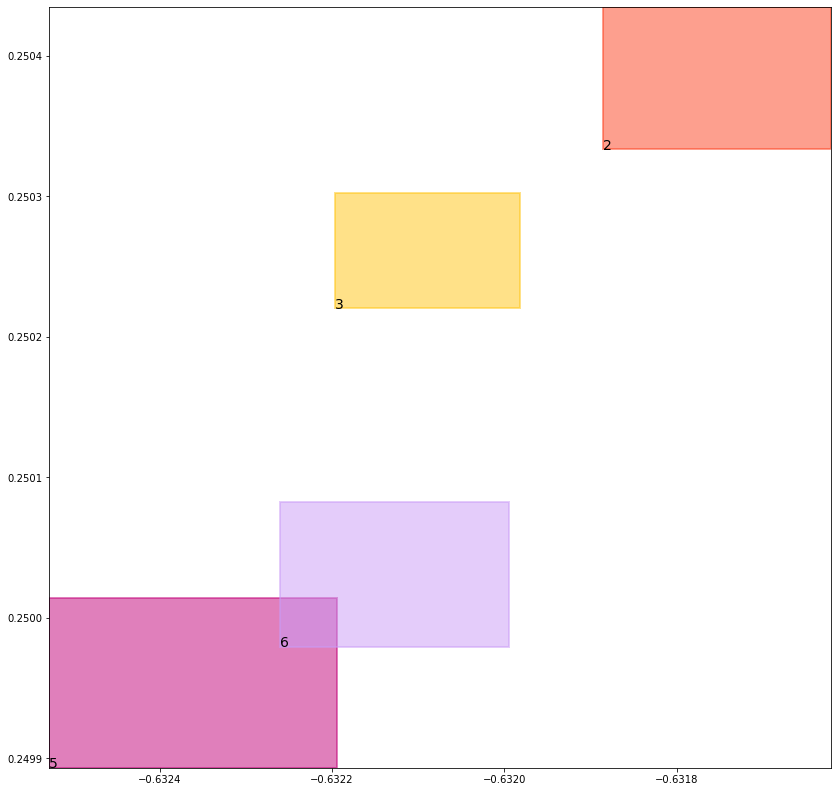

batch (tensor([[4, 6],
        [3, 5],
        [1, 2],
        [1, 3],
        [4, 5],
        [6, 2],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0089459624141455, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0079212170094252, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510010898113251, grad_fn=<MulBackward0>)
previous loss: tensor(0.2678682804107666, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04281114414334297 0.04585428535938263 tensor(0.8852165937423706) tensor(0.9631667137145996)
tensor(2) 0.45640406012535095 0.5064156651496887 tensor(0.4576110541820526) tensor(0.5076735615730286)
tensor(3) 0.45343318581581116 0.50668865442276 tensor(0.4534496366977692) tensor(0.5067084431648254)
tensor(4) 0.09059091657400131 0.018137194216251373 tensor(0.9677450656890869) tensor(0.9481680989265442)
tensor(5) 0.5350711941719055 0.4884774684906006 tensor(0.5381224751472473) tensor(0.4889478385448456)
tensor(6) 0.5421292781829834 0.48746591806411743 tensor(0.5427871942520142) tensor(0.4885943531990051)


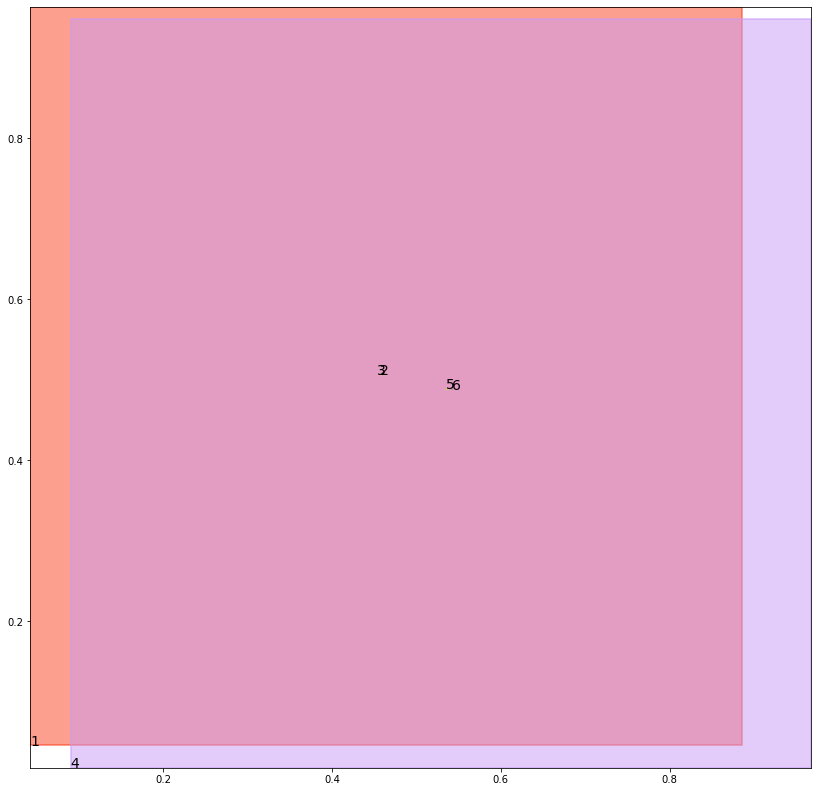

alignment data:
tensor(2) -0.6472201347351074 0.2707696557044983 tensor(-0.6467796564102173) tensor(0.2709386050701141)
tensor(3) -0.6473203897476196 0.27073752880096436 tensor(-0.6473135948181152) tensor(0.2707401514053345)
tensor(5) -0.6476932764053345 0.27040019631385803 tensor(-0.6473710536956787) tensor(0.2705186605453491)
tensor(6) -0.6475610733032227 0.2704351246356964 tensor(-0.6471917629241943) tensor(0.2705776393413544)


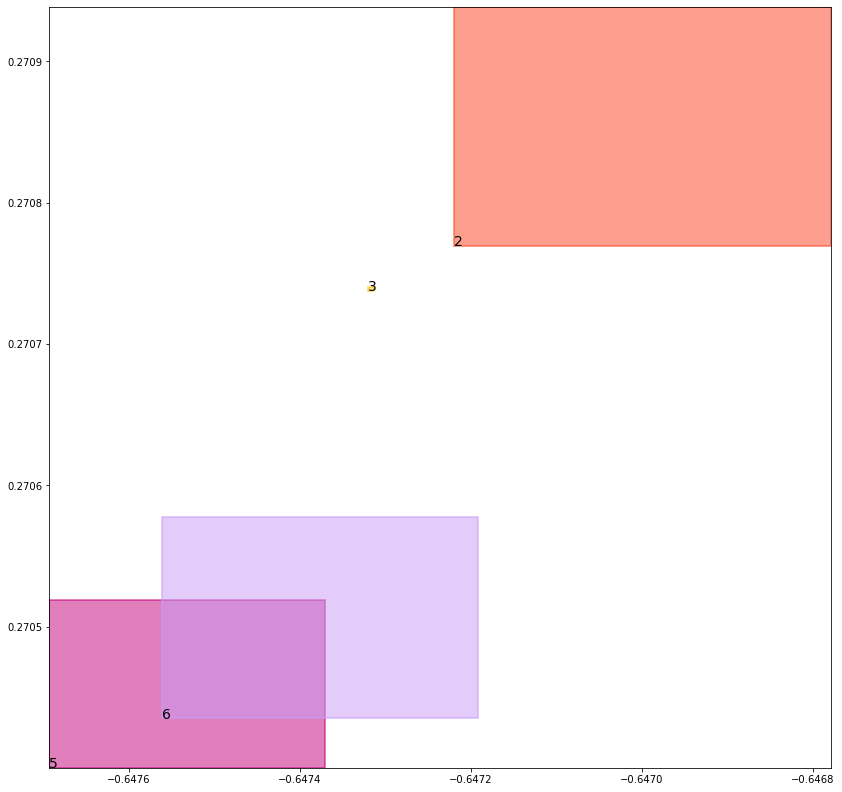

batch (tensor([[1, 3],
        [4, 6],
        [3, 5],
        [5, 3],
        [2, 6],
        [1, 2],
        [6, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0089193508028984, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0078985672444105, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510003447532654, grad_fn=<MulBackward0>)
previous loss: tensor(0.2678182721138000, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04275089502334595 0.04552852362394333 tensor(0.8857799172401428) tensor(0.9632363915443420)
tensor(2) 0.4568597376346588 0.5063389539718628 tensor(0.4576444029808044) tensor(0.5074547529220581)
tensor(3) 0.45315903425216675 0.5064886212348938 tensor(0.4542780816555023) tensor(0.5065110921859741)
tensor(4) 0.08998104184865952 0.017970914021134377 tensor(0.9677774906158447) tensor(0.9482353925704956)
tensor(5) 0.5353628396987915 0.4882991313934326 tensor(0.5364569425582886) tensor(0.4889129400253296)
tensor(6) 0.5418156981468201 0.48757579922676086 tensor(0.5421906709671021) tensor(0.4883845448493958)


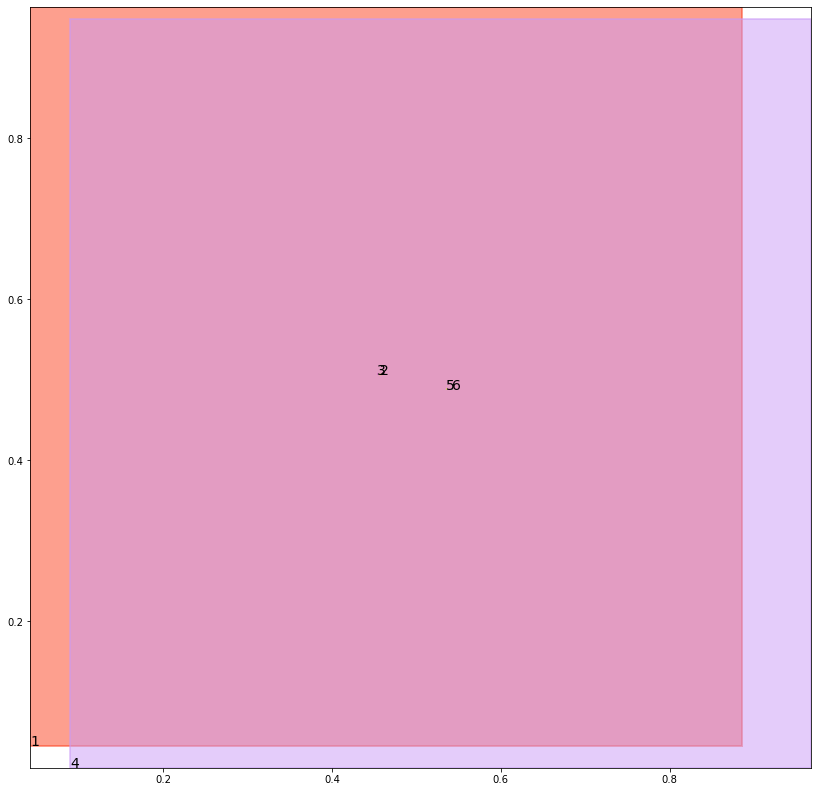

alignment data:
tensor(2) -0.6614572405815125 0.2803215980529785 tensor(-0.6610838770866394) tensor(0.2804651558399200)
tensor(3) -0.6616386771202087 0.2802594304084778 tensor(-0.6615640521049500) tensor(0.2802858948707581)
tensor(5) -0.6619414687156677 0.2799522280693054 tensor(-0.6616958975791931) tensor(0.2800453305244446)
tensor(6) -0.6617599129676819 0.28000813722610474 tensor(-0.6615011096000671) tensor(0.2801079750061035)


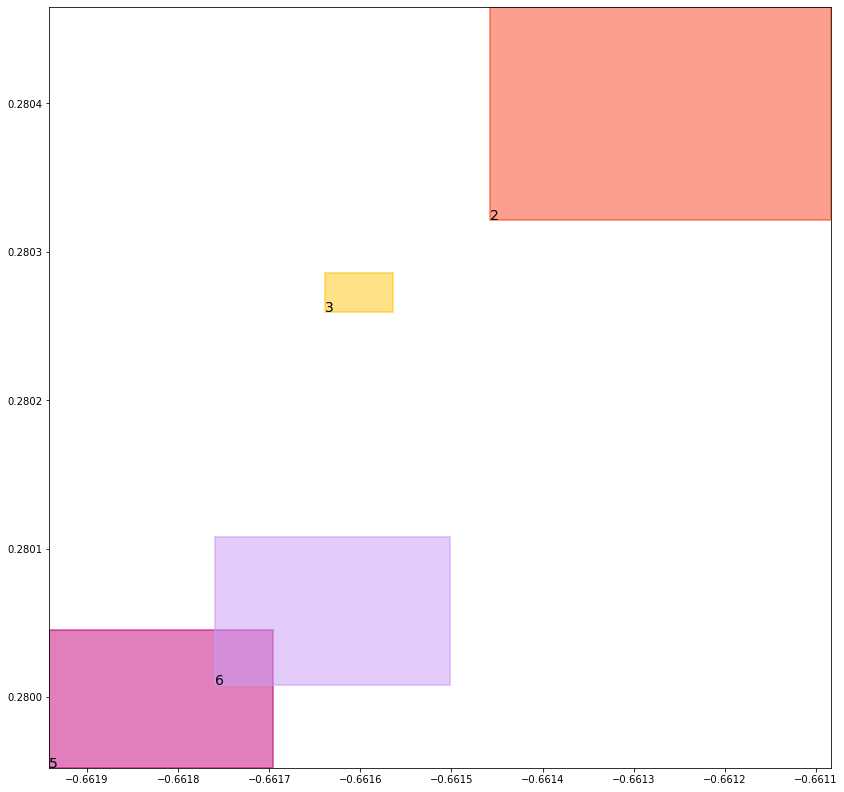

batch (tensor([[2, 6],
        [1, 3],
        [3, 5],
        [6, 2],
        [4, 6],
        [5, 3],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0089028123766184, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0078541114926338, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510019242763519, grad_fn=<MulBackward0>)
previous loss: tensor(0.2677588462829590, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042690832167863846 0.04520658776164055 tensor(0.8863391280174255) tensor(0.9633057117462158)
tensor(2) 0.45708656311035156 0.5066865086555481 tensor(0.4575772285461426) tensor(0.5070815682411194)
tensor(3) 0.45323649048805237 0.5060337781906128 tensor(0.4548225402832031) tensor(0.5065733790397644)
tensor(4) 0.0893779993057251 0.017807157710194588 tensor(0.9678097367286682) tensor(0.9483026266098022)
tensor(5) 0.5342192053794861 0.48825791478157043 tensor(0.5360013842582703) tensor(0.4884319603443146)
tensor(6) 0.541388213634491 0.48804736137390137 tensor(0.5418595671653748) tensor(0.4881052970886230)


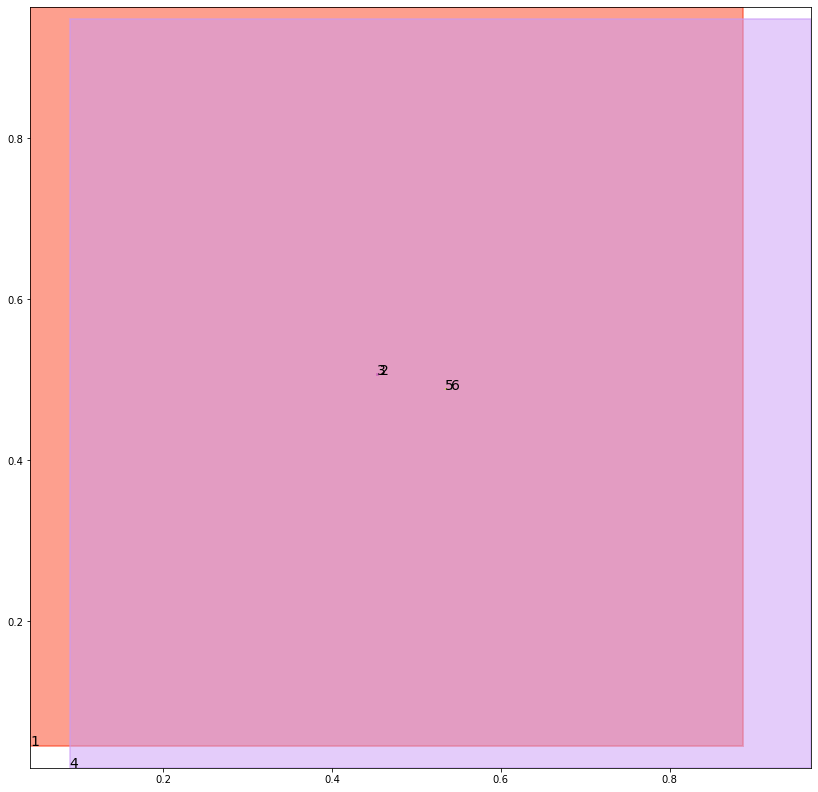

alignment data:
tensor(2) -0.6888179779052734 0.28353622555732727 tensor(-0.6886729001998901) tensor(0.2835915386676788)
tensor(3) -0.6892435550689697 0.283379465341568 tensor(-0.6889894008636475) tensor(0.2834747135639191)
tensor(5) -0.6894714832305908 0.2831081748008728 tensor(-0.6893118619918823) tensor(0.2831662297248840)
tensor(6) -0.6890945434570312 0.28323858976364136 tensor(-0.6890488862991333) tensor(0.2832552492618561)


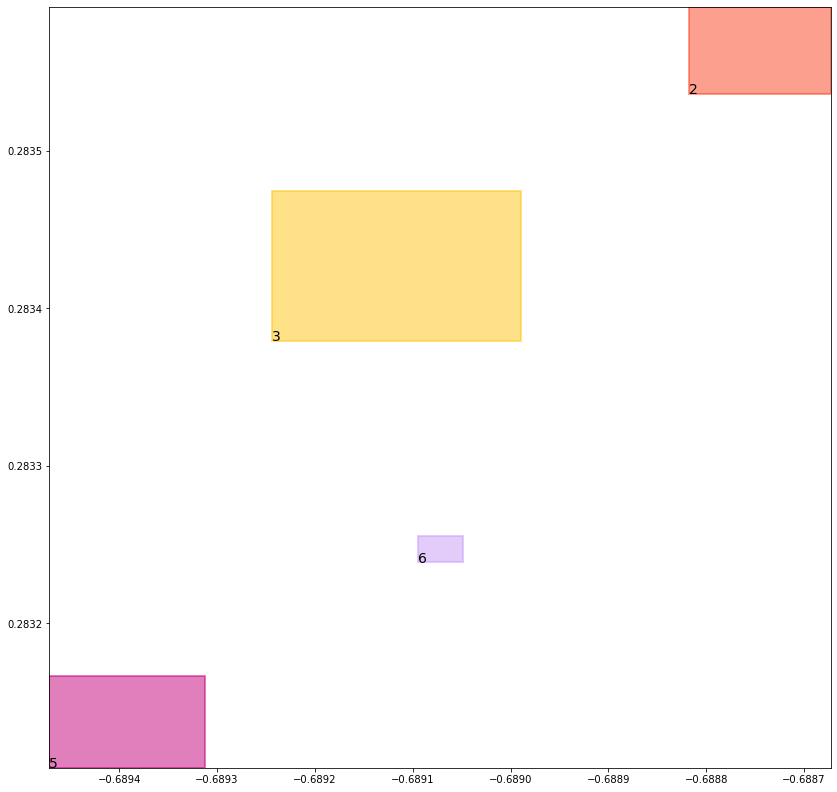

batch (tensor([[6, 2],
        [1, 3],
        [4, 5],
        [5, 3],
        [3, 5],
        [2, 6],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0088799009099603, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0078337155282497, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510050535202026, grad_fn=<MulBackward0>)
previous loss: tensor(0.2677186727523804, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042630940675735474 0.0448884554207325 tensor(0.8868941068649292) tensor(0.9633749723434448)
tensor(2) 0.4572627544403076 0.5065695643424988 tensor(0.4579617381095886) tensor(0.5074158310890198)
tensor(3) 0.45364728569984436 0.5058927536010742 tensor(0.4550944566726685) tensor(0.5063322186470032)
tensor(4) 0.0887814611196518 0.017645927146077156 tensor(0.9678419232368469) tensor(0.9483697414398193)
tensor(5) 0.5328356623649597 0.4875551164150238 tensor(0.5361445546150208) tensor(0.4883403480052948)
tensor(6) 0.5408629775047302 0.4878769516944885 tensor(0.5414670109748840) tensor(0.4881120026111603)


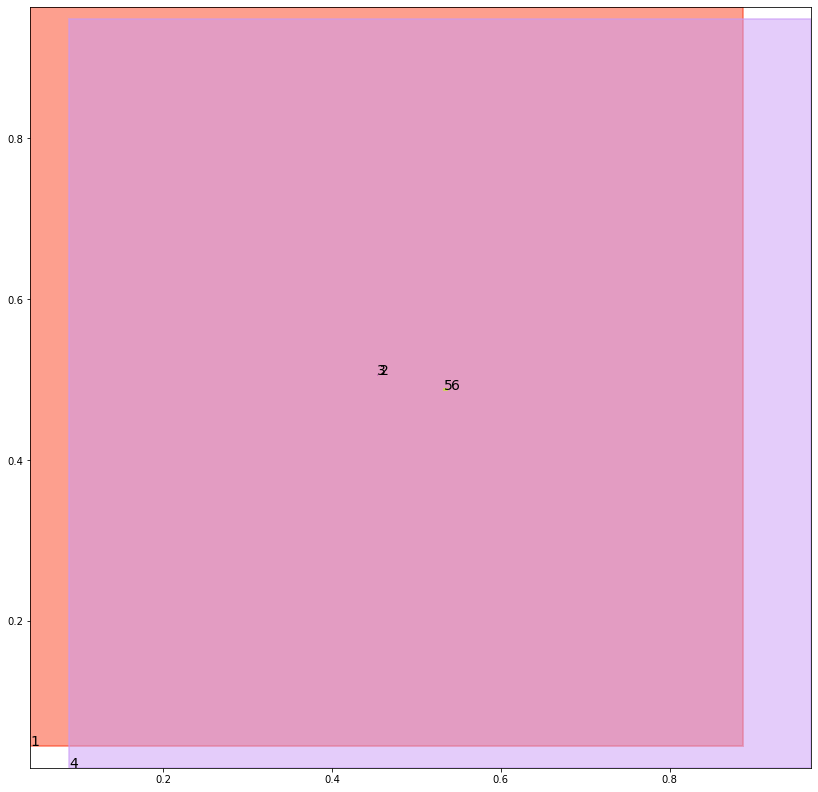

alignment data:
tensor(2) -0.7176912426948547 0.2743837833404541 tensor(-0.7174019217491150) tensor(0.2744945585727692)
tensor(3) -0.7181102633476257 0.27422910928726196 tensor(-0.7178934216499329) tensor(0.2743100523948669)
tensor(5) -0.7185831665992737 0.27387070655822754 tensor(-0.7181512713432312) tensor(0.2740310430526733)
tensor(6) -0.7179964184761047 0.274080753326416 tensor(-0.7178909182548523) tensor(0.2741203904151917)


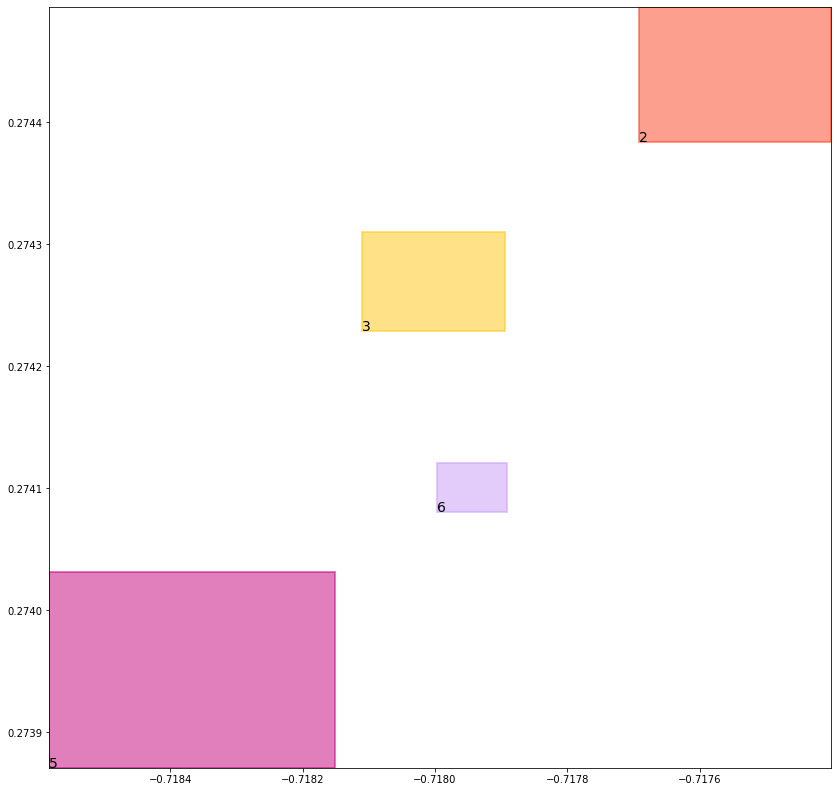

batch (tensor([[1, 3],
        [4, 5],
        [5, 3],
        [1, 2],
        [2, 6],
        [6, 2],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0088606867939234, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0078388219699264, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510014772415161, grad_fn=<MulBackward0>)
previous loss: tensor(0.2677009701728821, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042571209371089935 0.0445740781724453 tensor(0.8874451518058777) tensor(0.9634440541267395)
tensor(2) 0.4580446183681488 0.5062609314918518 tensor(0.4581021070480347) tensor(0.5075958967208862)
tensor(3) 0.4543582797050476 0.5057977437973022 tensor(0.4551200866699219) tensor(0.5060514211654663)
tensor(4) 0.08819104731082916 0.017487112432718277 tensor(0.9678739309310913) tensor(0.9484367370605469)
tensor(5) 0.532232940196991 0.48716968297958374 tensor(0.5358386635780334) tensor(0.4882799088954926)
tensor(6) 0.5405888557434082 0.4876484274864197 tensor(0.5406808853149414) tensor(0.4878580570220947)


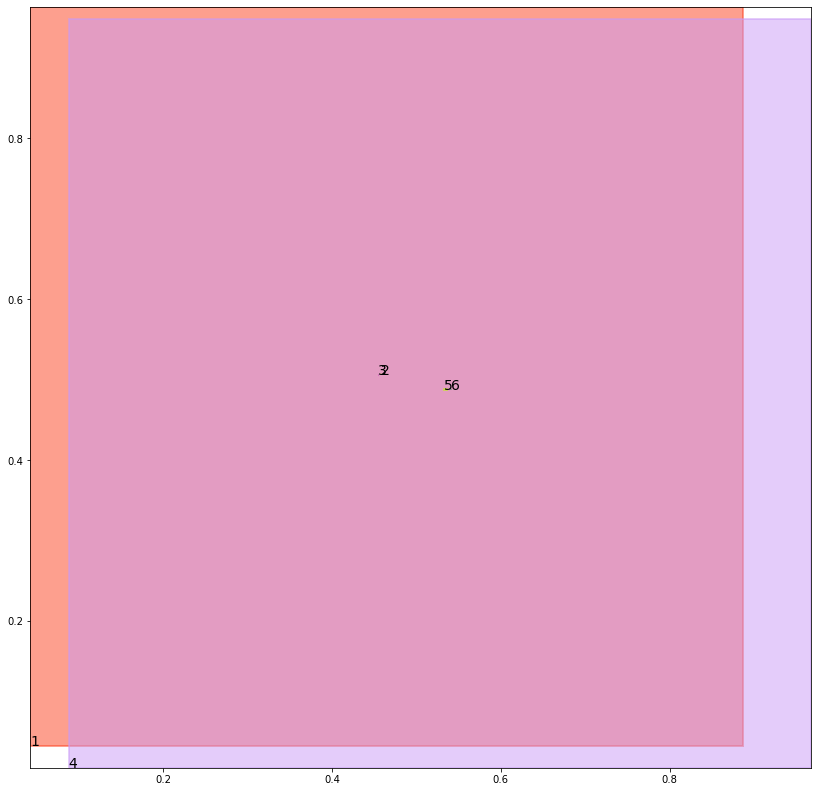

alignment data:
tensor(2) -0.7661195993423462 0.28112855553627014 tensor(-0.7657279968261719) tensor(0.2812801897525787)
tensor(3) -0.7664816379547119 0.280996173620224 tensor(-0.7663608789443970) tensor(0.2810413241386414)
tensor(5) -0.7670905590057373 0.28059151768684387 tensor(-0.7665455341339111) tensor(0.2807950675487518)
tensor(6) -0.7664358615875244 0.28082725405693054 tensor(-0.7663692235946655) tensor(0.2808528542518616)


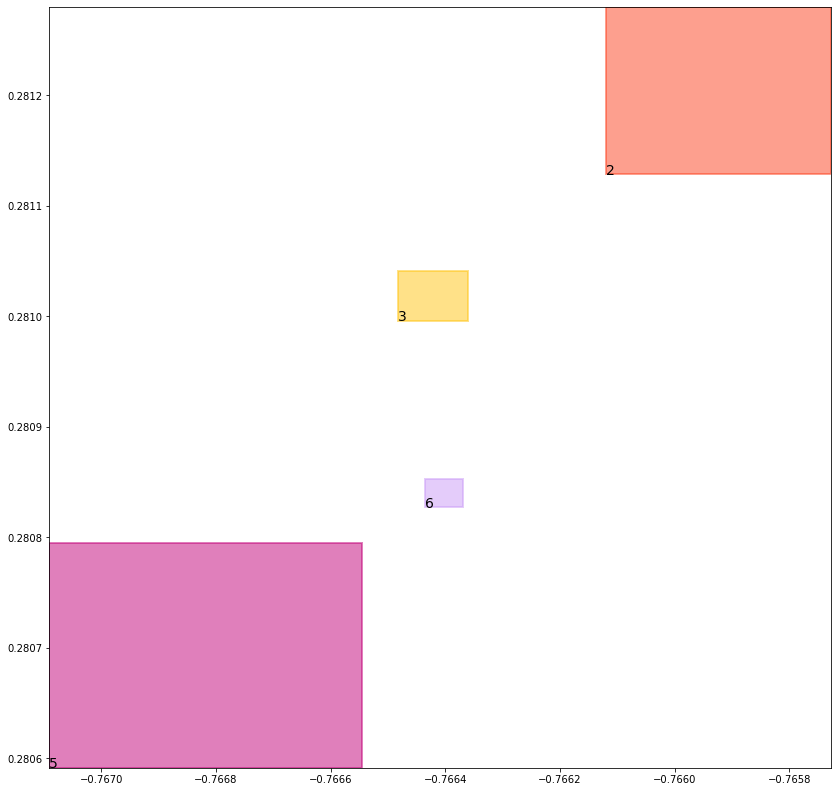

batch (tensor([[4, 6],
        [4, 5],
        [3, 5],
        [1, 3],
        [6, 2],
        [2, 6],
        [5, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0088238846510649, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0078199896961451, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510007619857788, grad_fn=<MulBackward0>)
previous loss: tensor(0.2676446437835693, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04251168295741081 0.04426337406039238 tensor(0.8879917860031128) tensor(0.9635129570960999)
tensor(2) 0.45827287435531616 0.506136417388916 tensor(0.4584243893623352) tensor(0.5072731375694275)
tensor(3) 0.45492371916770935 0.5055954456329346 tensor(0.4553389847278595) tensor(0.5058757662773132)
tensor(4) 0.08760665357112885 0.01733064278960228 tensor(0.9679058790206909) tensor(0.9485037326812744)
tensor(5) 0.5323383808135986 0.487234890460968 tensor(0.5351269841194153) tensor(0.4880895018577576)
tensor(6) 0.5395416617393494 0.48766258358955383 tensor(0.5405418276786804) tensor(0.4876950681209564)


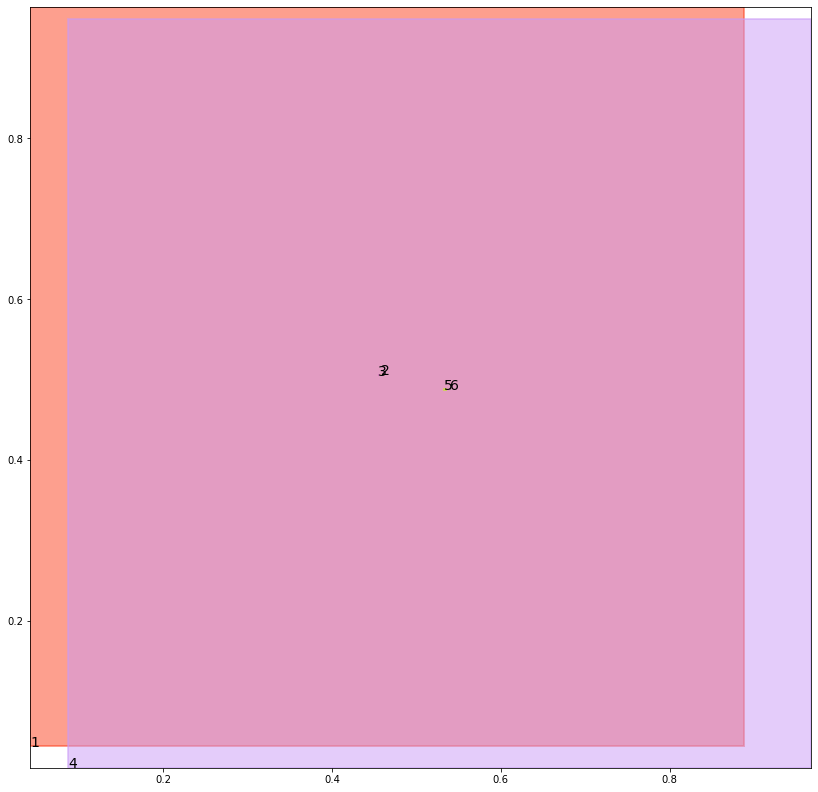

alignment data:
tensor(2) -0.812949538230896 0.27871066331863403 tensor(-0.8126101493835449) tensor(0.2788416743278503)
tensor(3) -0.8133141994476318 0.27857664227485657 tensor(-0.8132071495056152) tensor(0.2786172032356262)
tensor(5) -0.813843846321106 0.2782067656517029 tensor(-0.8134229183197021) tensor(0.2783637642860413)
tensor(6) -0.8132730722427368 0.2784123122692108 tensor(-0.8132016658782959) tensor(0.2784378230571747)


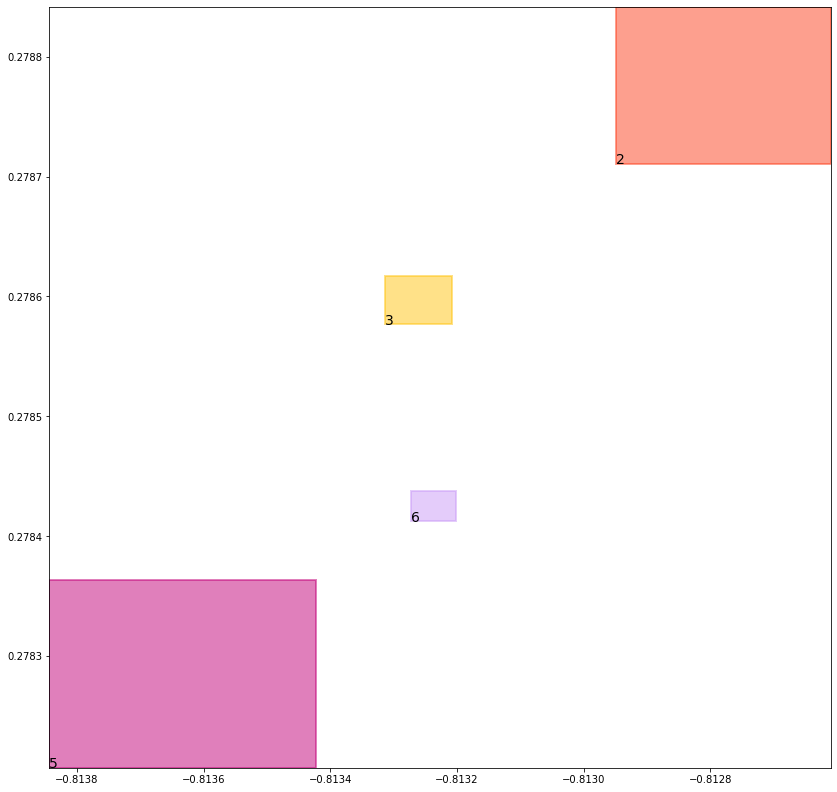

batch (tensor([[1, 3],
        [6, 2],
        [4, 6],
        [4, 5],
        [3, 5],
        [2, 6],
        [5, 3],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0087961032986641, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0077989036217332, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510021626949310, grad_fn=<MulBackward0>)
previous loss: tensor(0.2675971686840057, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04245235025882721 0.04395628720521927 tensor(0.8885343074798584) tensor(0.9635816216468811)
tensor(2) 0.4585026204586029 0.5061785578727722 tensor(0.4591038525104523) tensor(0.5064982771873474)
tensor(3) 0.4550178349018097 0.5053973197937012 tensor(0.4559519588947296) tensor(0.5056954026222229)
tensor(4) 0.08702819049358368 0.017176492139697075 tensor(0.9679377079010010) tensor(0.9485705494880676)
tensor(5) 0.5330800414085388 0.4877052903175354 tensor(0.5340504646301270) tensor(0.4877818524837494)
tensor(6) 0.5388442873954773 0.48740121722221375 tensor(0.5402373075485229) tensor(0.4881089925765991)


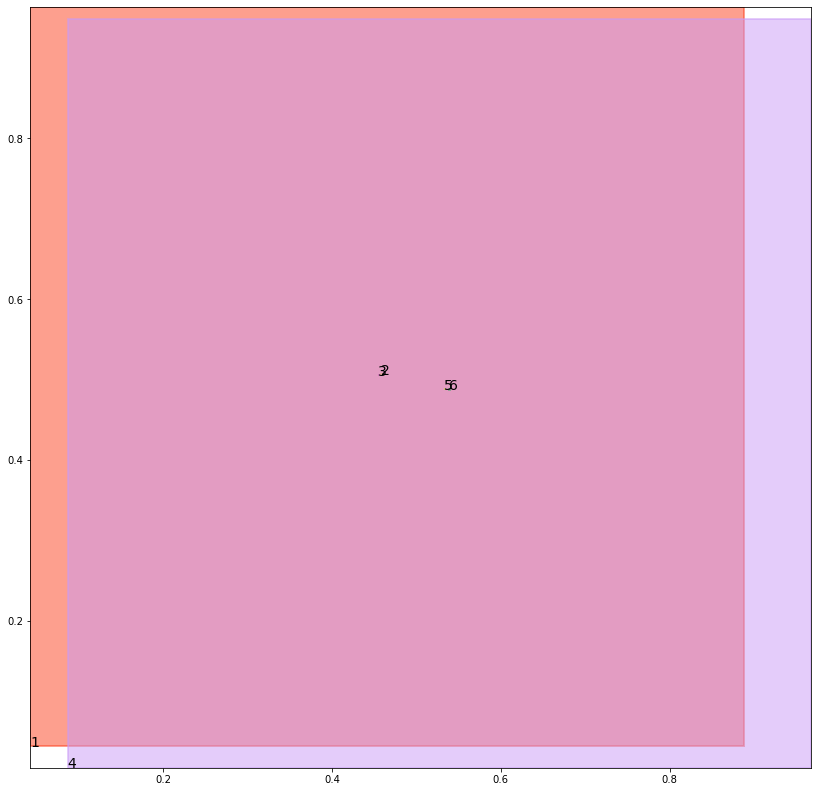

alignment data:
tensor(2) -0.850712776184082 0.28302574157714844 tensor(-0.8505825996398926) tensor(0.2830747961997986)
tensor(3) -0.8511563539505005 0.282861590385437 tensor(-0.8510118722915649) tensor(0.2829155325889587)
tensor(5) -0.8514209985733032 0.28259530663490295 tensor(-0.8513382673263550) tensor(0.2826251983642578)
tensor(6) -0.8511499166488647 0.2826879024505615 tensor(-0.8508579730987549) tensor(0.2827978432178497)


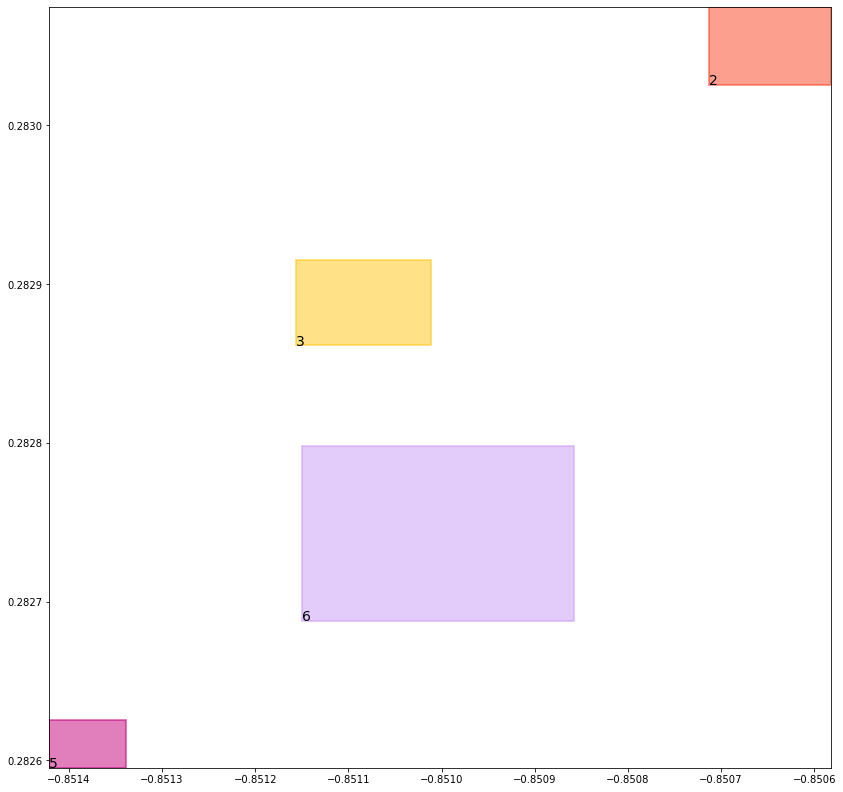

batch (tensor([[1, 3],
        [6, 2],
        [3, 5],
        [4, 5],
        [2, 6],
        [4, 6],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0087779741734266, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0077657755464315, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510047554969788, grad_fn=<MulBackward0>)
previous loss: tensor(0.2675485014915466, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04239320009946823 0.04365277662873268 tensor(0.8890728950500488) tensor(0.9636501073837280)
tensor(2) 0.45887818932533264 0.5053273439407349 tensor(0.4592652320861816) tensor(0.5063700675964355)
tensor(3) 0.4553752541542053 0.505257248878479 tensor(0.4562311470508575) tensor(0.5054676532745361)
tensor(4) 0.08645583689212799 0.01702464558184147 tensor(0.9679694175720215) tensor(0.9486374258995056)
tensor(5) 0.5326477885246277 0.4873692989349365 tensor(0.5343875885009766) tensor(0.4885322153568268)
tensor(6) 0.5385479927062988 0.48727384209632874 tensor(0.5396996736526489) tensor(0.4880312383174896)


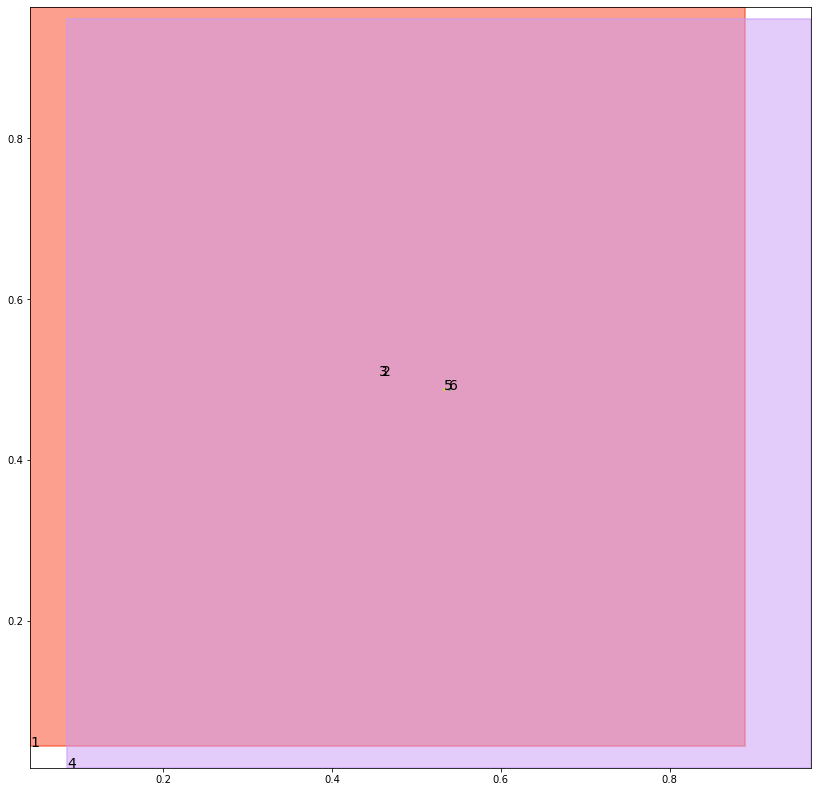

alignment data:
tensor(2) -0.8682444095611572 0.28305691480636597 tensor(-0.8679183721542358) tensor(0.2831819653511047)
tensor(3) -0.8684839010238647 0.2829716205596924 tensor(-0.8683694601058960) tensor(0.2830140590667725)
tensor(5) -0.8688238859176636 0.2826802134513855 tensor(-0.8683784008026123) tensor(0.2828485965728760)
tensor(6) -0.868482232093811 0.28279995918273926 tensor(-0.8681907653808594) tensor(0.2829099893569946)


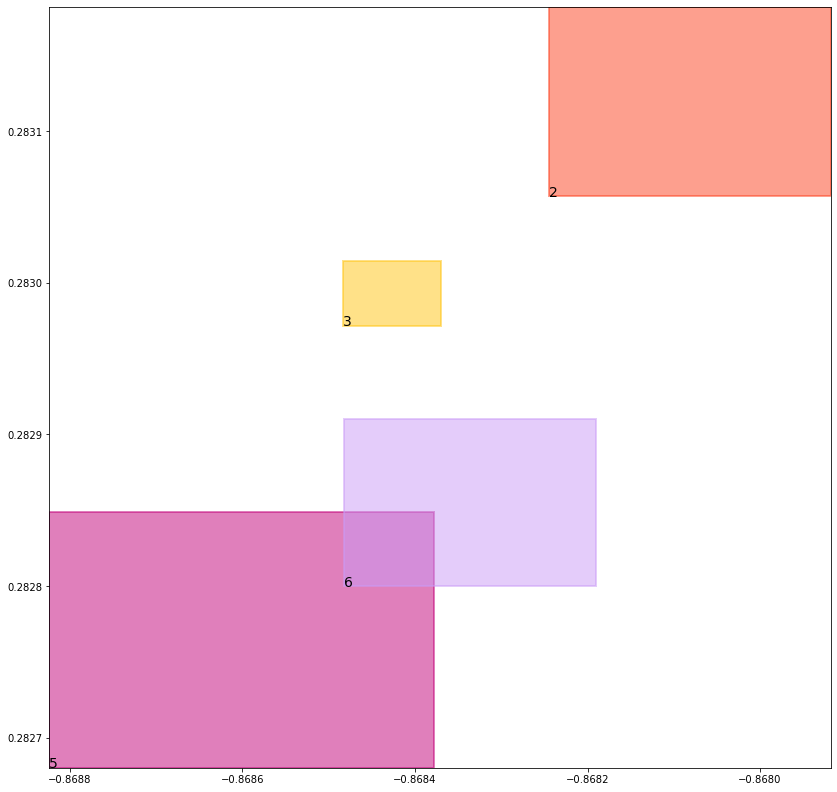

batch (tensor([[3, 5],
        [4, 6],
        [4, 5],
        [1, 2],
        [1, 3],
        [6, 2],
        [5, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0087571097537875, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0077640935778618, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509998381137848, grad_fn=<MulBackward0>)
previous loss: tensor(0.2675210535526276, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042334236204624176 0.04335268586874008 tensor(0.8896074891090393) tensor(0.9637184143066406)
tensor(2) 0.45882242918014526 0.5046945214271545 tensor(0.4595225453376770) tensor(0.5063682198524475)
tensor(3) 0.4559701681137085 0.5049498677253723 tensor(0.4562092721462250) tensor(0.5054222345352173)
tensor(4) 0.08588951826095581 0.01687503606081009 tensor(0.9680010676383972) tensor(0.9487042427062988)
tensor(5) 0.5317606329917908 0.48712000250816345 tensor(0.5348379015922546) tensor(0.4888193905353546)
tensor(6) 0.5386137366294861 0.4872954487800598 tensor(0.5389519333839417) tensor(0.4874789416790009)


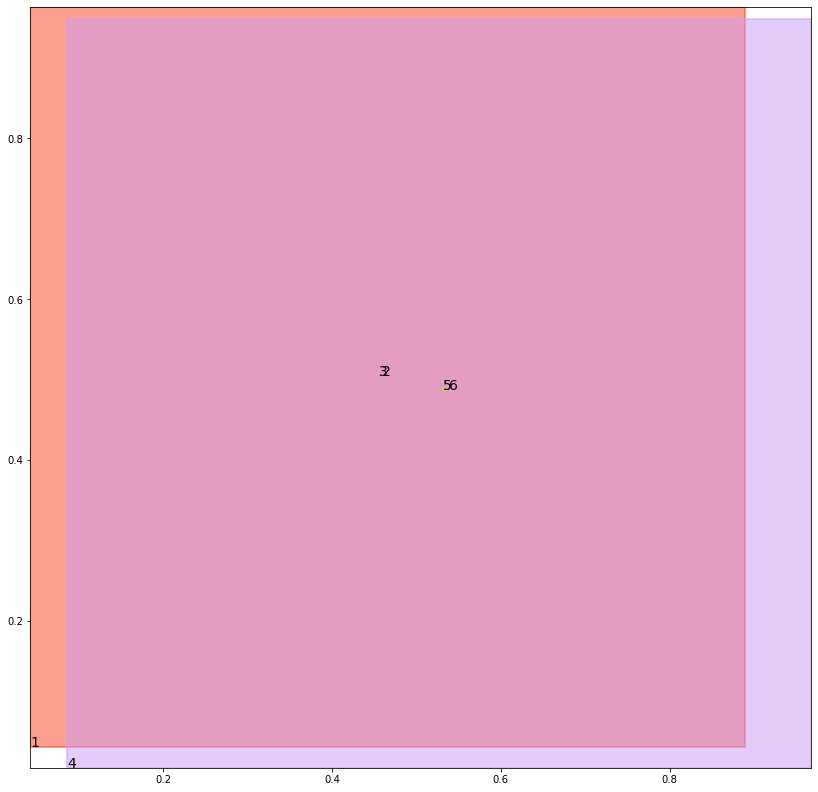

alignment data:
tensor(2) -0.8751299381256104 0.28199633955955505 tensor(-0.8746021986007690) tensor(0.2821984589099884)
tensor(3) -0.8752355575561523 0.2819615304470062 tensor(-0.8750841617584229) tensor(0.2820194661617279)
tensor(5) -0.8756228685379028 0.28165727853775024 tensor(-0.8749381303787231) tensor(0.2819150090217590)
tensor(6) -0.8751411437988281 0.28182899951934814 tensor(-0.8750667572021484) tensor(0.2818569242954254)


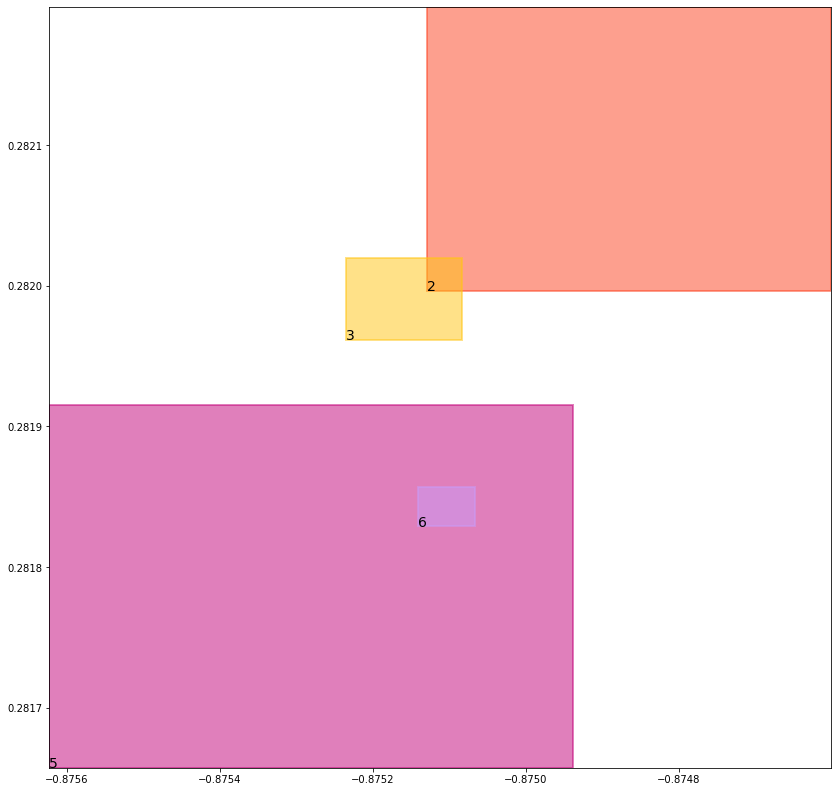

batch (tensor([[2, 6],
        [6, 2],
        [3, 5],
        [1, 2],
        [4, 5],
        [1, 3],
        [4, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0087397331371903, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0077525302767754, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509975731372833, grad_fn=<MulBackward0>)
previous loss: tensor(0.2674898505210876, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042275458574295044 0.04305589199066162 tensor(0.8901380300521851) tensor(0.9637866020202637)
tensor(2) 0.4591018557548523 0.5045576691627502 tensor(0.4598385691642761) tensor(0.5061892867088318)
tensor(3) 0.4559164345264435 0.5047704577445984 tensor(0.4567788243293762) tensor(0.5052574276924133)
tensor(4) 0.08532913029193878 0.016727620735764503 tensor(0.9680325388908386) tensor(0.9487709999084473)
tensor(5) 0.5313419103622437 0.48701921105384827 tensor(0.5345087647438049) tensor(0.4886114895343781)
tensor(6) 0.5380159020423889 0.4865064024925232 tensor(0.5390045642852783) tensor(0.4874497652053833)


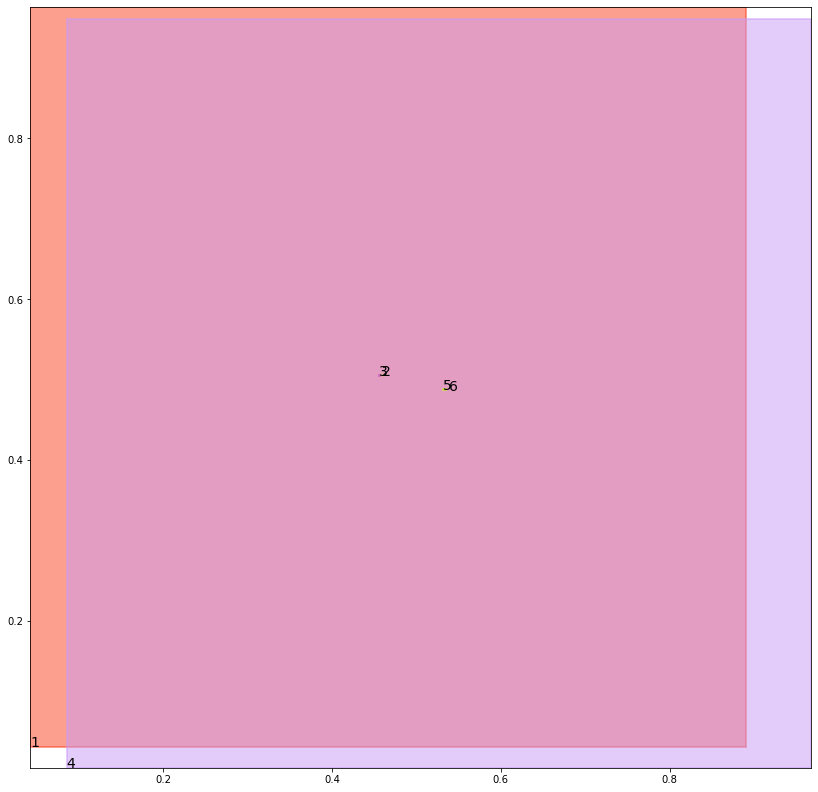

alignment data:
tensor(2) -0.8939187526702881 0.2684968411922455 tensor(-0.8934011459350586) tensor(0.2686947286128998)
tensor(3) -0.8940585851669312 0.26844948530197144 tensor(-0.8938634395599365) tensor(0.2685228288173676)
tensor(5) -0.8944196701049805 0.2681584060192108 tensor(-0.8937597274780273) tensor(0.2684061229228973)
tensor(6) -0.8941459655761719 0.2682502567768097 tensor(-0.8938112258911133) tensor(0.2683772146701813)


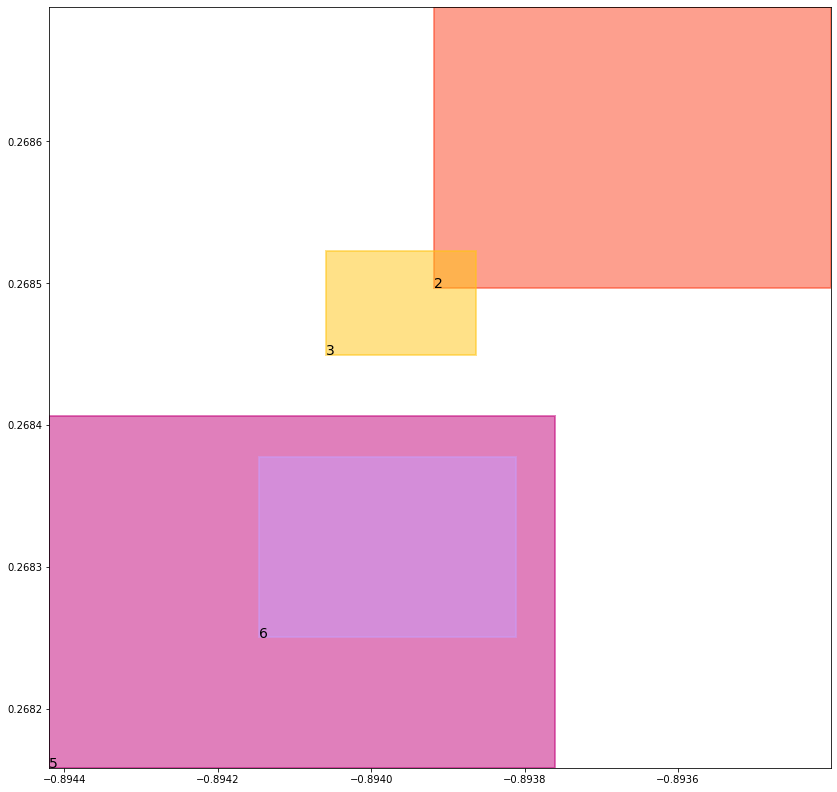

batch (tensor([[4, 5],
        [1, 3],
        [5, 3],
        [4, 6],
        [3, 5],
        [2, 6],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0087255127727985, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0077482350170612, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509951889514923, grad_fn=<MulBackward0>)
previous loss: tensor(0.2674689292907715, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04221685603260994 0.04276236146688461 tensor(0.8906646370887756) tensor(0.9638544917106628)
tensor(2) 0.45985788106918335 0.5048635005950928 tensor(0.4600322544574738) tensor(0.5058507919311523)
tensor(3) 0.4559902250766754 0.5047938227653503 tensor(0.4572888016700745) tensor(0.5048980116844177)
tensor(4) 0.08477452397346497 0.01658231019973755 tensor(0.9680640697479248) tensor(0.9488377571105957)
tensor(5) 0.5313470363616943 0.4870527982711792 tensor(0.5334768891334534) tensor(0.4879575967788696)
tensor(6) 0.5373736619949341 0.4860692322254181 tensor(0.5389288663864136) tensor(0.4874392449855804)


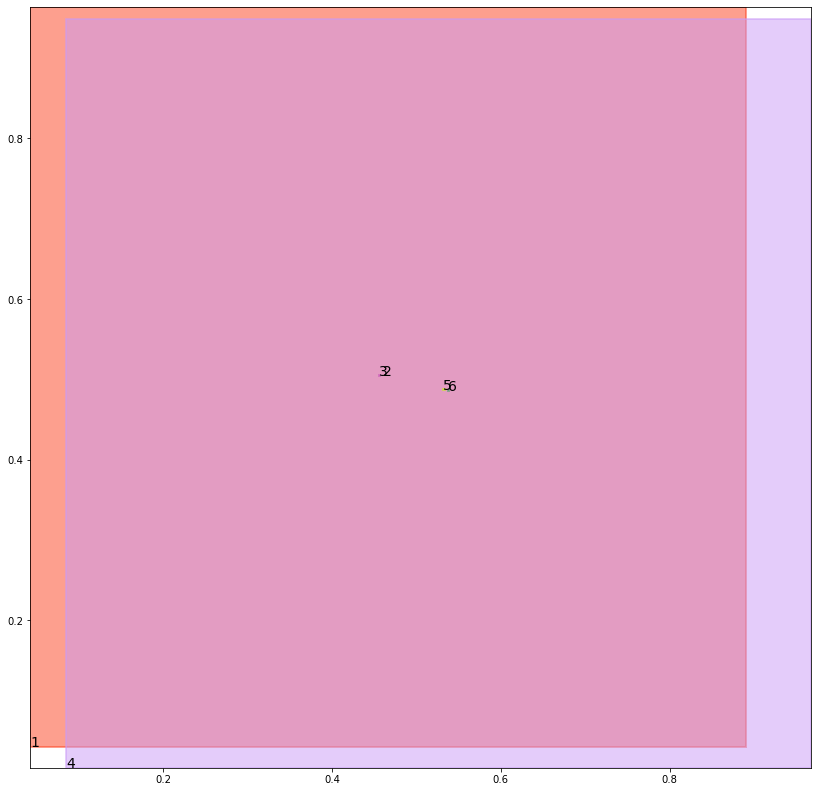

alignment data:
tensor(2) -0.9136511087417603 0.27604833245277405 tensor(-0.9133552312850952) tensor(0.2761617898941040)
tensor(3) -0.9139167070388794 0.27595388889312744 tensor(-0.9138044118881226) tensor(0.2759945690631866)
tensor(5) -0.9142540693283081 0.2756742238998413 tensor(-0.9138578176498413) tensor(0.2758223712444305)
tensor(6) -0.9141553640365601 0.2757001221179962 tensor(-0.9136614799499512) tensor(0.2758870422840118)


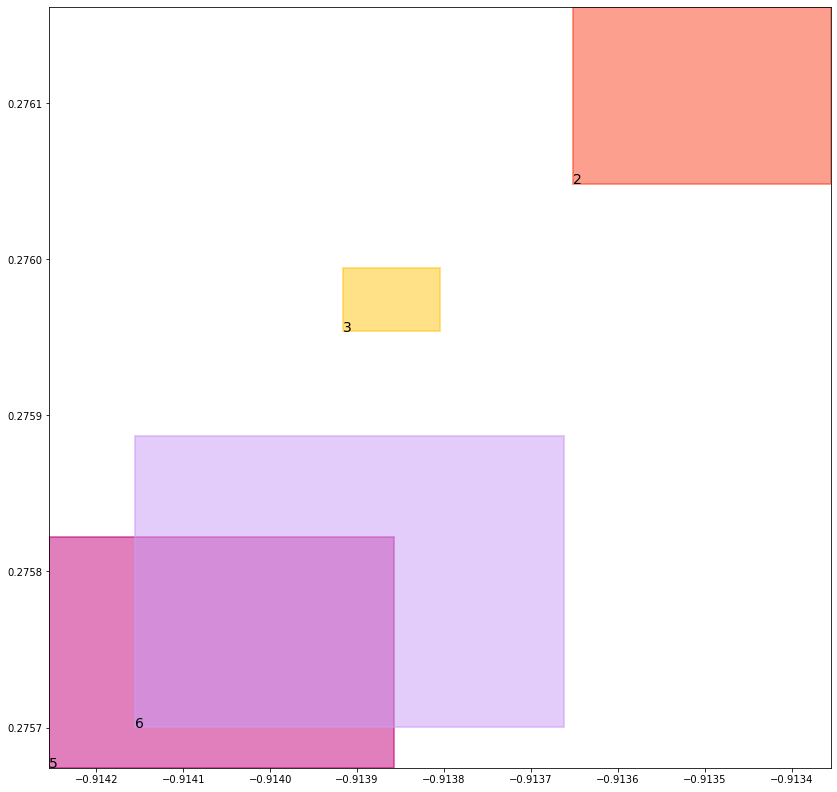

batch (tensor([[1, 2],
        [5, 3],
        [1, 3],
        [4, 6],
        [6, 2],
        [3, 5],
        [4, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0086937062442303, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0077240578830242, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509989738464355, grad_fn=<MulBackward0>)
previous loss: tensor(0.2674167454242706, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.042158424854278564 0.04247211292386055 tensor(0.8911874294281006) tensor(0.9639223217964172)
tensor(2) 0.4601793885231018 0.5053694844245911 tensor(0.4602831602096558) tensor(0.5055593848228455)
tensor(3) 0.45639580488204956 0.5046685934066772 tensor(0.4575277864933014) tensor(0.5046998858451843)
tensor(4) 0.08422564715147018 0.016439059749245644 tensor(0.9680953025817871) tensor(0.9489043951034546)
tensor(5) 0.5317339301109314 0.48690852522850037 tensor(0.5318166613578796) tensor(0.4872078299522400)
tensor(6) 0.5369983911514282 0.486127644777298 tensor(0.5384306311607361) tensor(0.4872785210609436)


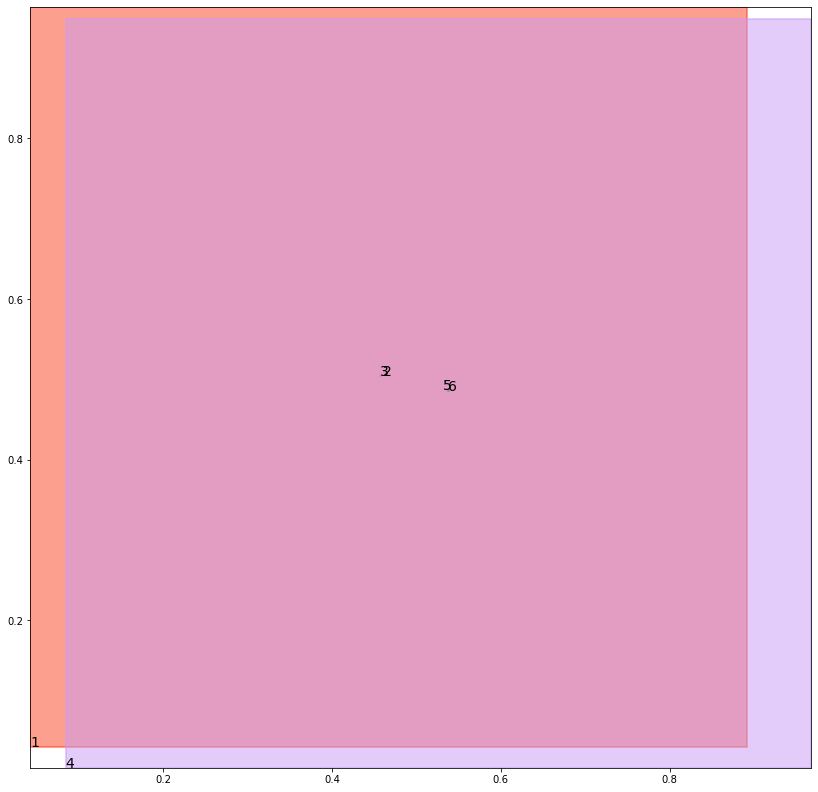

alignment data:
tensor(2) -0.9308364391326904 0.2758283317089081 tensor(-0.9307751655578613) tensor(0.2758516669273376)
tensor(3) -0.9312796592712402 0.2756654918193817 tensor(-0.9311983585357666) tensor(0.2756944298744202)
tensor(5) -0.9315985441207886 0.2753945589065552 tensor(-0.9315071105957031) tensor(0.2754295766353607)
tensor(6) -0.9314881563186646 0.27542662620544434 tensor(-0.9310653209686279) tensor(0.2755863368511200)


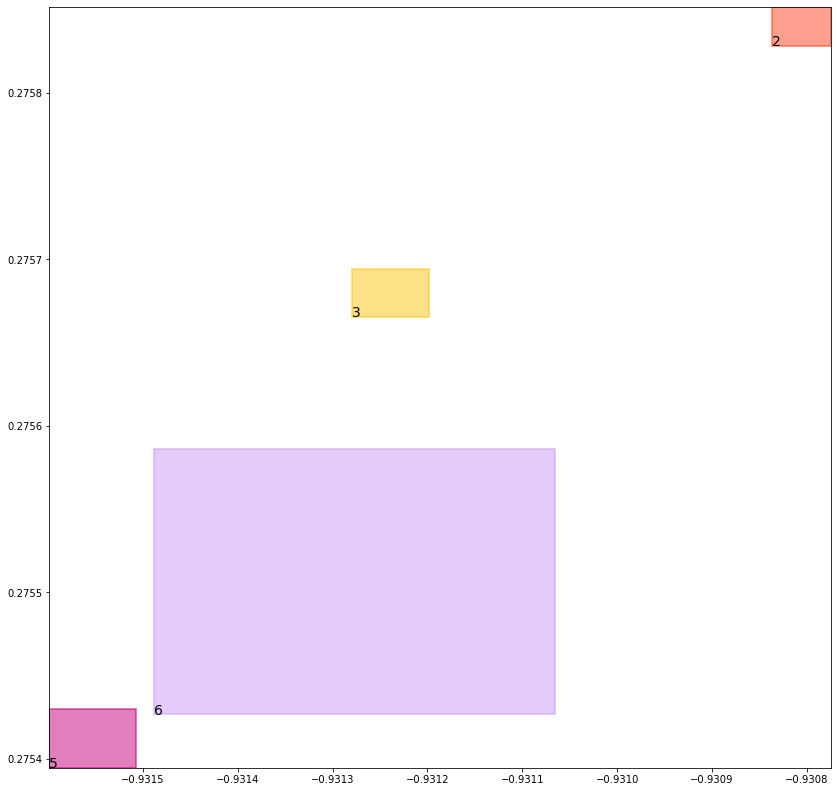

batch (tensor([[4, 5],
        [4, 6],
        [5, 3],
        [1, 3],
        [2, 6],
        [6, 2],
        [3, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0086619909852743, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0076779280789196, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510047852993011, grad_fn=<MulBackward0>)
previous loss: tensor(0.2673447132110596, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04210016876459122 0.04218520596623421 tensor(0.8917063474655151) tensor(0.9639898538589478)
tensor(2) 0.45992040634155273 0.5050878524780273 tensor(0.4607733786106110) tensor(0.5057153701782227)
tensor(3) 0.4571007192134857 0.5042027831077576 tensor(0.4575215280056000) tensor(0.5048495531082153)
tensor(4) 0.08368263393640518 0.016297828406095505 tensor(0.9681265950202942) tensor(0.9489710330963135)
tensor(5) 0.529600203037262 0.4863733649253845 tensor(0.5324630141258240) tensor(0.4872119128704071)
tensor(6) 0.5368649959564209 0.4866386651992798 tensor(0.5375517606735229) tensor(0.4869818985462189)


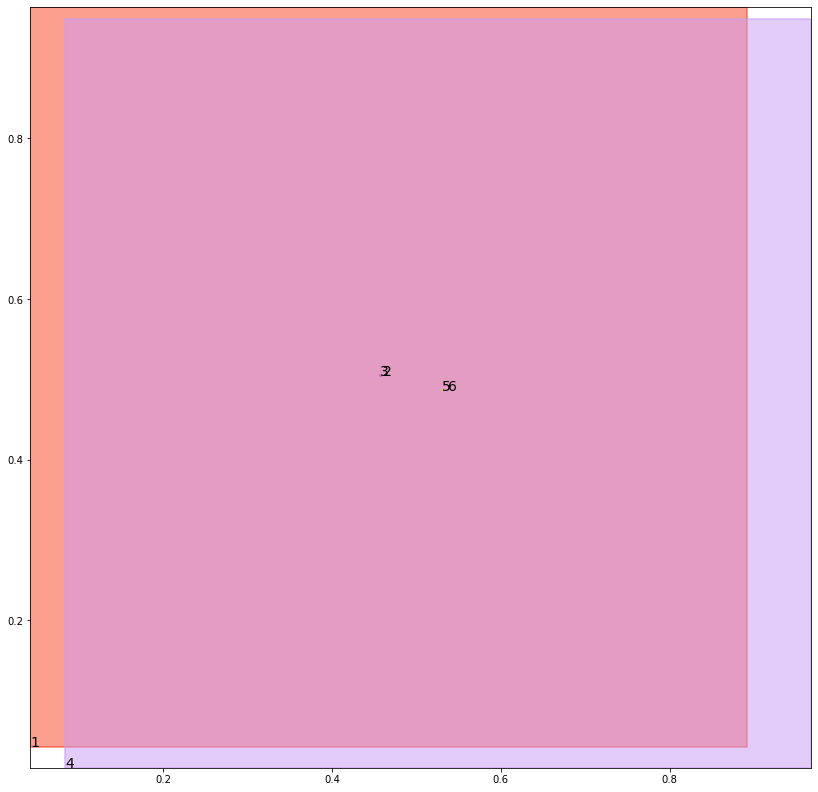

alignment data:
tensor(2) -0.9639005661010742 0.27230754494667053 tensor(-0.9636651277542114) tensor(0.2723962366580963)
tensor(3) -0.9643357992172241 0.27214592695236206 tensor(-0.9641226530075073) tensor(0.2722269296646118)
tensor(5) -0.9648303985595703 0.2718145251274109 tensor(-0.9644056558609009) tensor(0.2719720005989075)
tensor(6) -0.9642891883850098 0.27200818061828613 tensor(-0.9641463756561279) tensor(0.2720616459846497)


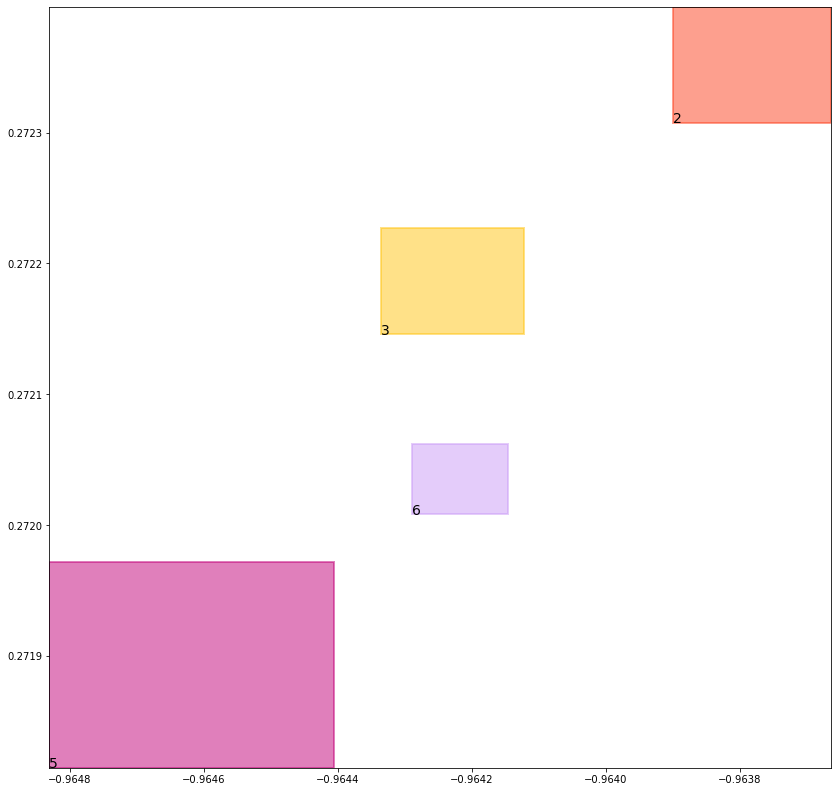

batch (tensor([[5, 3],
        [6, 2],
        [4, 5],
        [1, 2],
        [3, 5],
        [4, 6],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0086501762270927, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0076796994544566, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510016858577728, grad_fn=<MulBackward0>)
previous loss: tensor(0.2673315703868866, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0420420840382576 0.041901521384716034 tensor(0.8922213315963745) tensor(0.9640572071075439)
tensor(2) 0.4602694511413574 0.5049898624420166 tensor(0.4610425233840942) tensor(0.5053762197494507)
tensor(3) 0.45729416608810425 0.50404292345047 tensor(0.4580741822719574) tensor(0.5046897530555725)
tensor(4) 0.08314498513936996 0.016158603131771088 tensor(0.9681576490402222) tensor(0.9490374922752380)
tensor(5) 0.5282506942749023 0.4863111078739166 tensor(0.5326910614967346) tensor(0.4870791137218475)
tensor(6) 0.5363319516181946 0.48656442761421204 tensor(0.5369492769241333) tensor(0.4875478446483612)


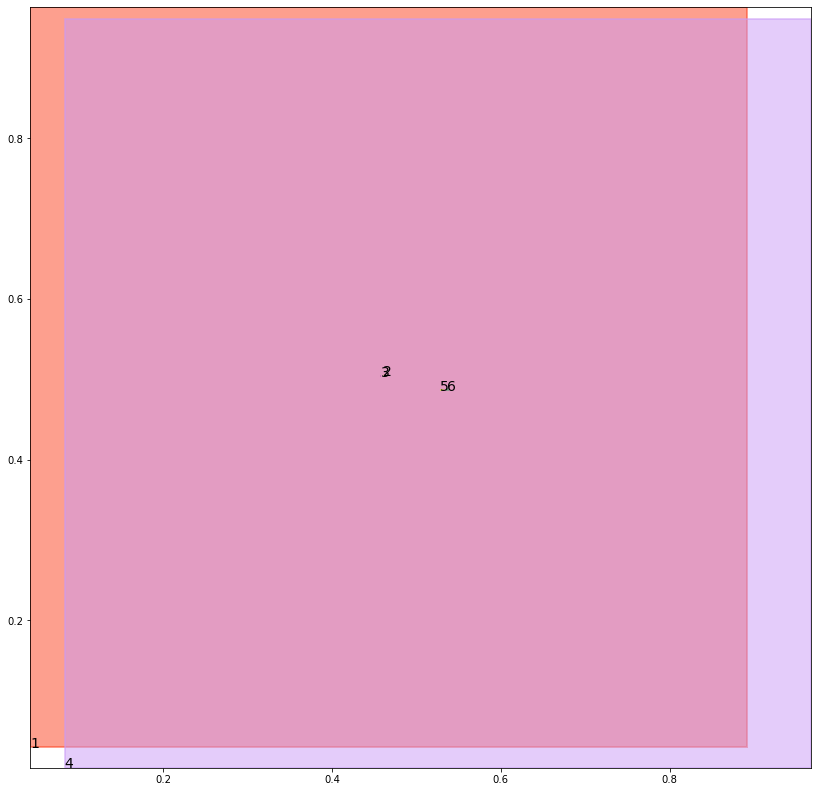

alignment data:
tensor(2) -1.000502347946167 0.2751581072807312 tensor(-1.0003415346145630) tensor(0.2752182781696320)
tensor(3) -1.00096595287323 0.2749859392642975 tensor(-1.0007296800613403) tensor(0.2750750780105591)
tensor(5) -1.0015052556991577 0.2746412754058838 tensor(-1.0009990930557251) tensor(0.2748269140720367)
tensor(6) -1.0009130239486694 0.27485284209251404 tensor(-1.0005905628204346) tensor(0.2749753892421722)


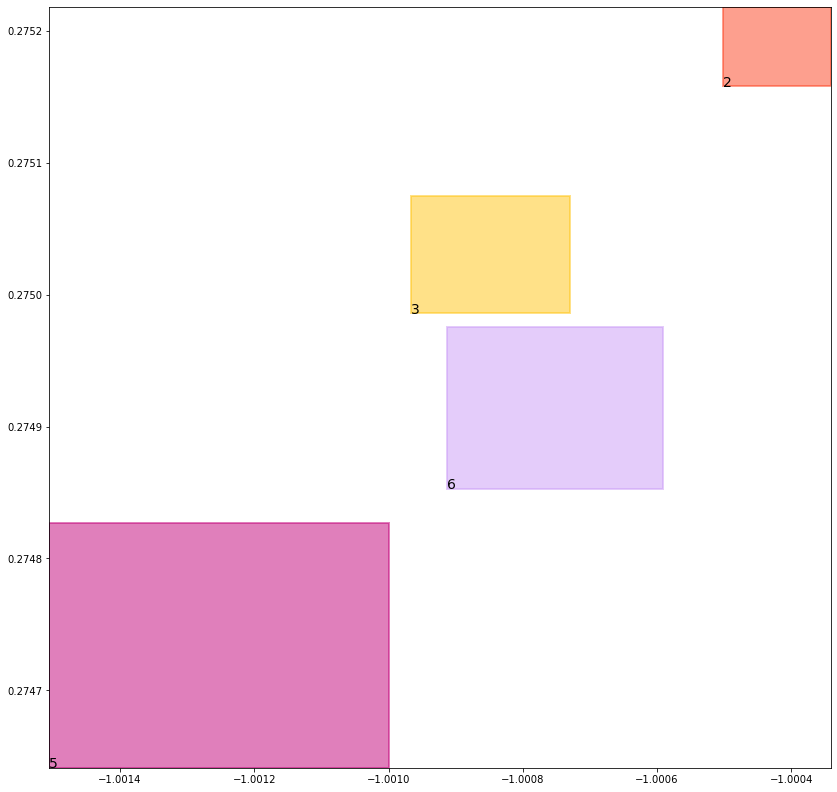

batch (tensor([[2, 6],
        [4, 6],
        [1, 3],
        [4, 5],
        [3, 5],
        [1, 2],
        [5, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0086301555857062, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0076831835322082, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509996592998505, grad_fn=<MulBackward0>)
previous loss: tensor(0.2673130035400391, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04198417067527771 0.04162100329995155 tensor(0.8927327394485474) tensor(0.9641245007514954)
tensor(2) 0.46101856231689453 0.504597544670105 tensor(0.4612604081630707) tensor(0.5050578117370605)
tensor(3) 0.4573599100112915 0.5041875243186951 tensor(0.4586769938468933) tensor(0.5042222142219543)
tensor(4) 0.08261237293481827 0.01602134294807911 tensor(0.9681887626647949) tensor(0.9491039514541626)
tensor(5) 0.5276921987533569 0.4866783618927002 tensor(0.5324645638465881) tensor(0.4868224561214447)
tensor(6) 0.5355669856071472 0.4863288700580597 tensor(0.5367658734321594) tensor(0.4878808557987213)


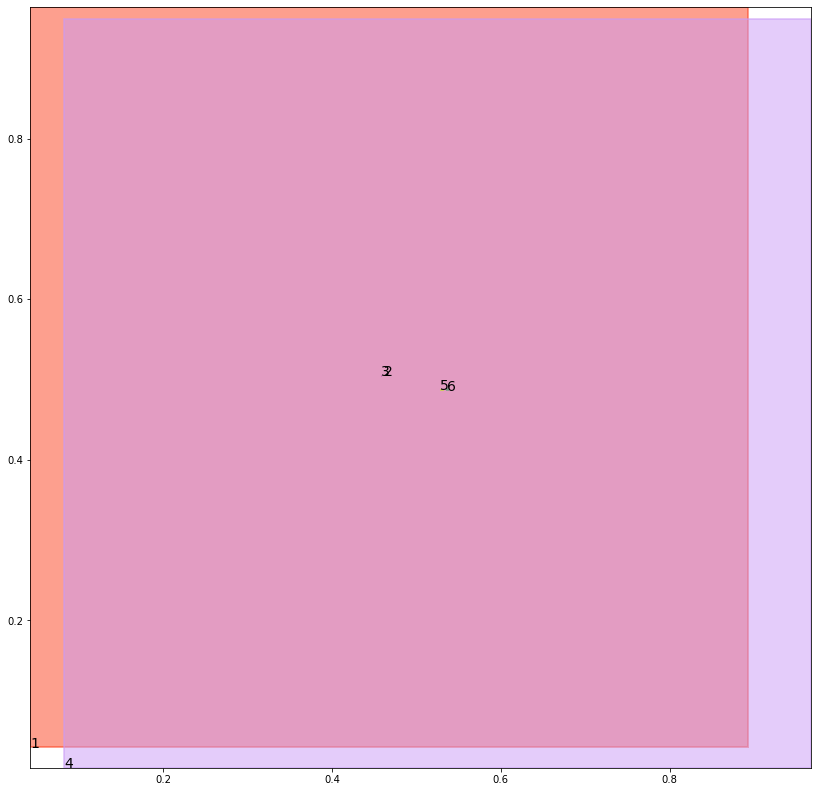

alignment data:
tensor(2) -1.0411449670791626 0.26299968361854553 tensor(-1.0409970283508301) tensor(0.2630558907985687)
tensor(3) -1.0414987802505493 0.26287102699279785 tensor(-1.0414038896560669) tensor(0.2629049122333527)
tensor(5) -1.0419882535934448 0.2625472843647003 tensor(-1.0416387319564819) tensor(0.2626720368862152)
tensor(6) -1.041580319404602 0.2626885175704956 tensor(-1.0410569906234741) tensor(0.2628867924213409)


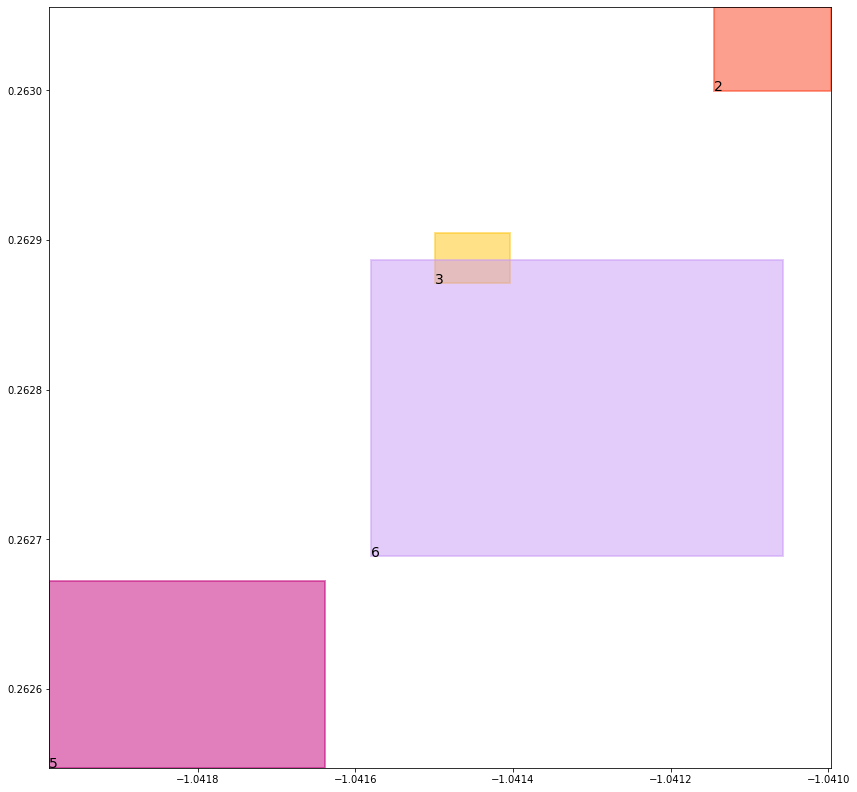

batch (tensor([[5, 3],
        [3, 5],
        [4, 5],
        [2, 6],
        [6, 2],
        [1, 2],
        [4, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0086046345531940, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0076760053634644, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510006725788116, grad_fn=<MulBackward0>)
previous loss: tensor(0.2672813236713409, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04192643240094185 0.04134361445903778 tensor(0.8932403922080994) tensor(0.9641914367675781)
tensor(2) 0.461300790309906 0.5043175220489502 tensor(0.4615648984909058) tensor(0.5049459338188171)
tensor(3) 0.45769089460372925 0.5034785866737366 tensor(0.4589436054229736) tensor(0.5046073794364929)
tensor(4) 0.08208465576171875 0.015886027365922928 tensor(0.9682196974754333) tensor(0.9491703510284424)
tensor(5) 0.5278499126434326 0.48645371198654175 tensor(0.5318275094032288) tensor(0.4874306917190552)
tensor(6) 0.5352150797843933 0.48625844717025757 tensor(0.5363401770591736) tensor(0.4876838624477386)


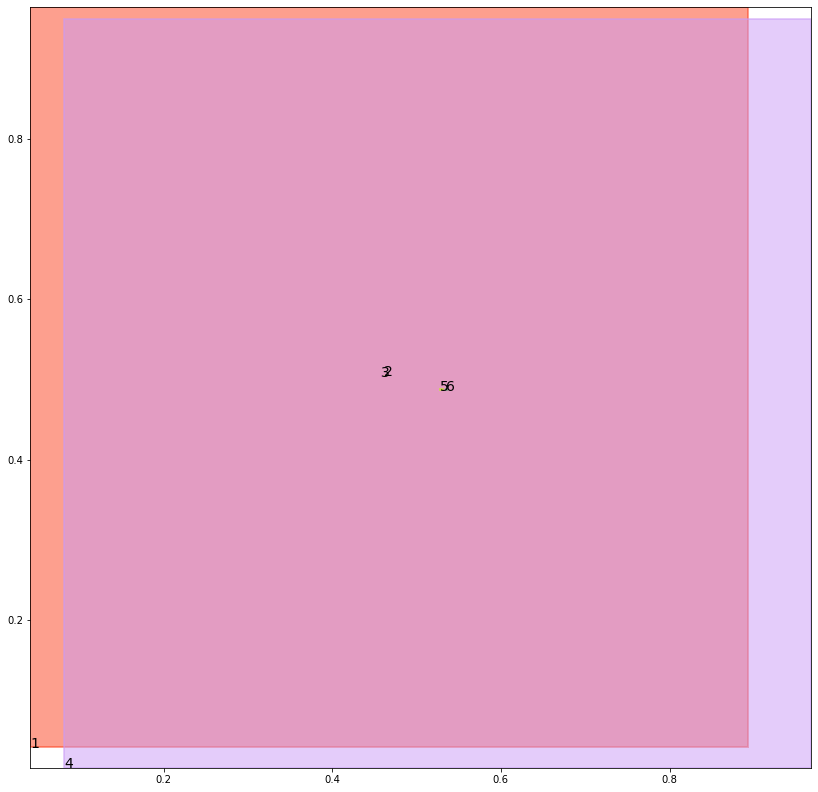

alignment data:
tensor(2) -1.0723276138305664 0.26177117228507996 tensor(-1.0721302032470703) tensor(0.2618463337421417)
tensor(3) -1.0728024244308472 0.2615962326526642 tensor(-1.0723972320556641) tensor(0.2617490291595459)
tensor(5) -1.0731377601623535 0.26133227348327637 tensor(-1.0725994110107422) tensor(0.2615308165550232)
tensor(6) -1.072716236114502 0.26147958636283875 tensor(-1.0722341537475586) tensor(0.2616620957851410)


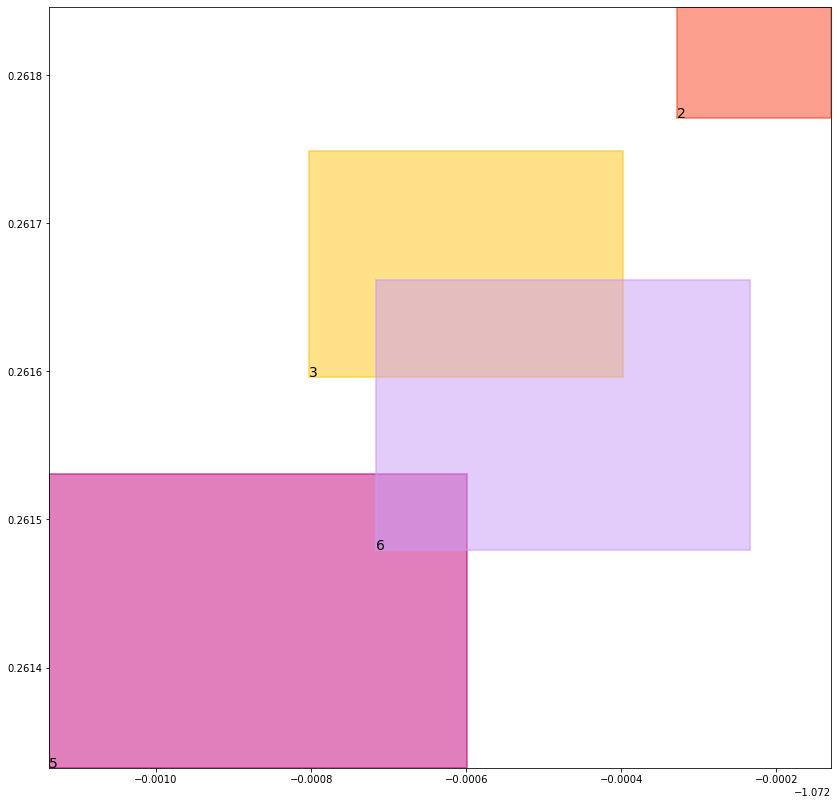

batch (tensor([[1, 3],
        [4, 5],
        [6, 2],
        [1, 2],
        [4, 6],
        [3, 5],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0085941441357136, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0076572662219405, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509959936141968, grad_fn=<MulBackward0>)
previous loss: tensor(0.2672474086284637, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041868869215250015 0.04106922447681427 tensor(0.8937444090843201) tensor(0.9642582535743713)
tensor(2) 0.46124887466430664 0.5044909119606018 tensor(0.4618595838546753) tensor(0.5046710371971130)
tensor(3) 0.4582614600658417 0.5031059384346008 tensor(0.4589065611362457) tensor(0.5046672224998474)
tensor(4) 0.08156193047761917 0.015752620995044708 tensor(0.9682505130767822) tensor(0.9492366909980774)
tensor(5) 0.5286504030227661 0.48624762892723083 tensor(0.5308209061622620) tensor(0.4876525402069092)
tensor(6) 0.5352365374565125 0.486337274312973 tensor(0.5356959104537964) tensor(0.4870097339153290)


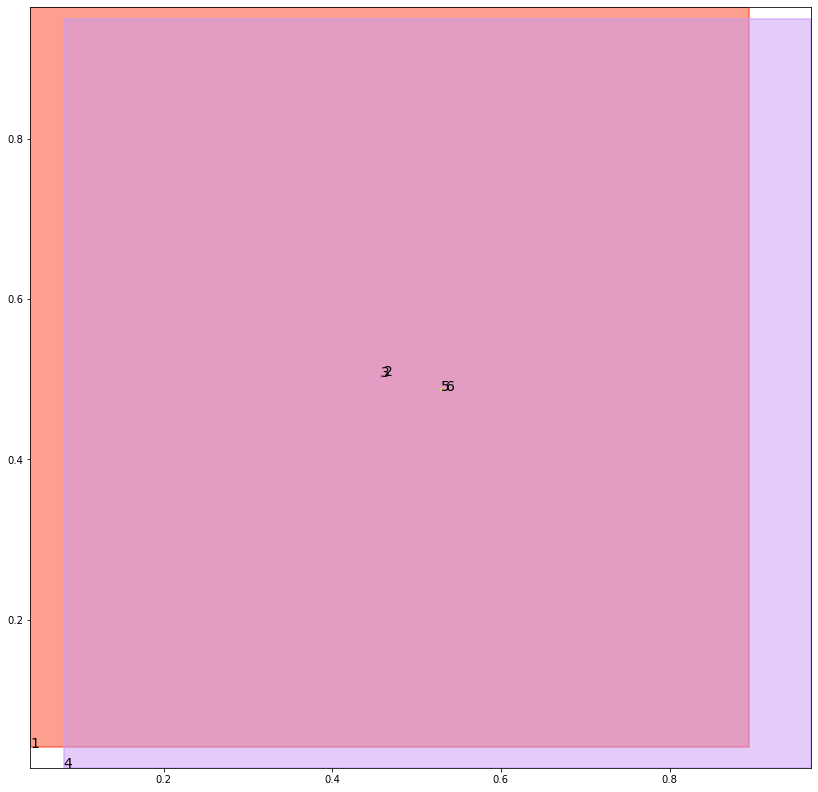

alignment data:
tensor(2) -1.1114978790283203 0.25854358077049255 tensor(-1.1114065647125244) tensor(0.2585774064064026)
tensor(3) -1.1120893955230713 0.2583228051662445 tensor(-1.1115999221801758) tensor(0.2585090100765228)
tensor(5) -1.1123371124267578 0.2580922245979309 tensor(-1.1117930412292480) tensor(0.2582963705062866)
tensor(6) -1.1118824481964111 0.25825363397598267 tensor(-1.1116600036621094) tensor(0.2583380341529846)


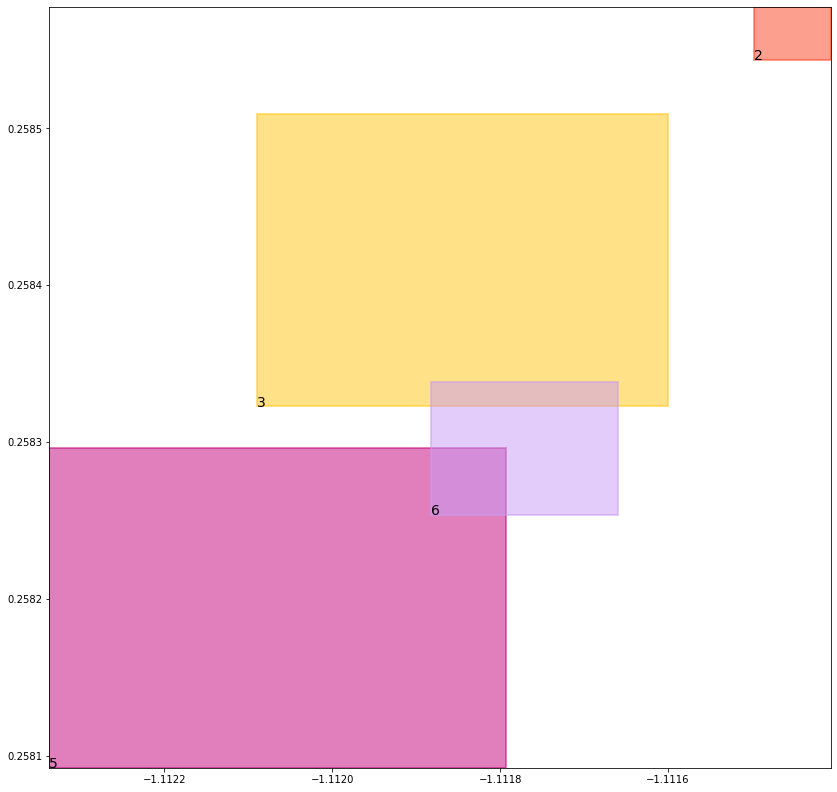

batch (tensor([[3, 5],
        [4, 5],
        [5, 3],
        [4, 6],
        [2, 6],
        [1, 3],
        [1, 2],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0085707884281874, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0076142619363964, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509982585906982, grad_fn=<MulBackward0>)
previous loss: tensor(0.2671833038330078, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041811469942331314 0.04079779237508774 tensor(0.8942446708679199) tensor(0.9643249511718750)
tensor(2) 0.4616374969482422 0.5042474865913391 tensor(0.4620965123176575) tensor(0.5050724744796753)
tensor(3) 0.458595871925354 0.503071665763855 tensor(0.4590478837490082) tensor(0.5044009685516357)
tensor(4) 0.08104453235864639 0.015621085651218891 tensor(0.9682813882827759) tensor(0.9493030905723572)
tensor(5) 0.5294833779335022 0.48618844151496887 tensor(0.5300229787826538) tensor(0.4873923957347870)
tensor(6) 0.5348556041717529 0.485912948846817 tensor(0.5355944037437439) tensor(0.4865509271621704)


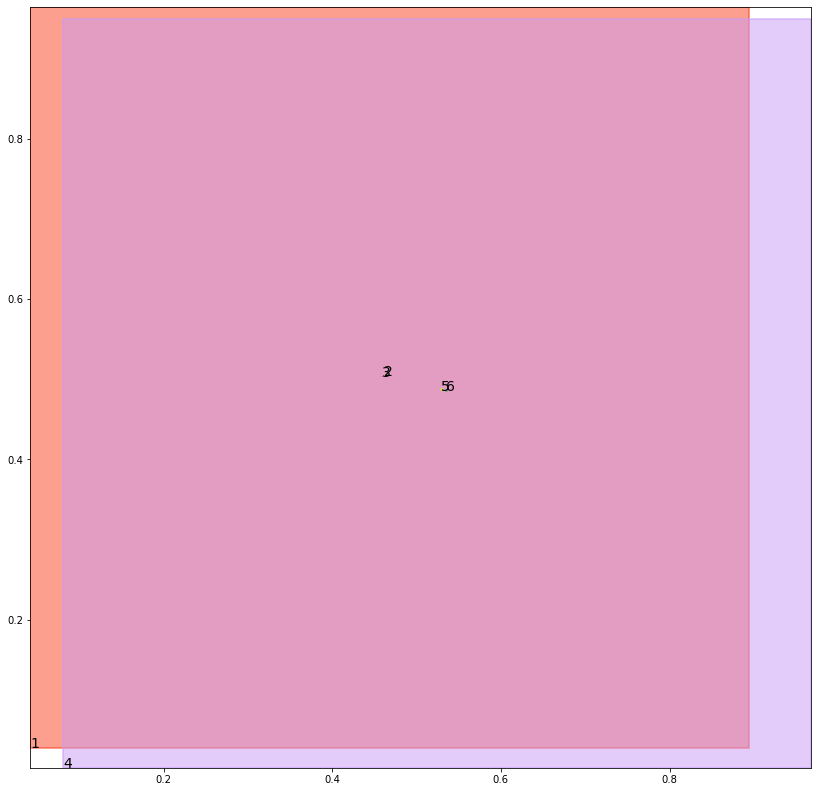

alignment data:
tensor(2) -1.136186122894287 0.24913820624351501 tensor(-1.1359198093414307) tensor(0.2492392659187317)
tensor(3) -1.1367217302322388 0.24893900752067566 tensor(-1.1363115310668945) tensor(0.2490951418876648)
tensor(5) -1.136919617652893 0.248726487159729 tensor(-1.1365396976470947) tensor(0.2488709092140198)
tensor(6) -1.1366472244262695 0.24882042407989502 tensor(-1.1364160776138306) tensor(0.2489074468612671)


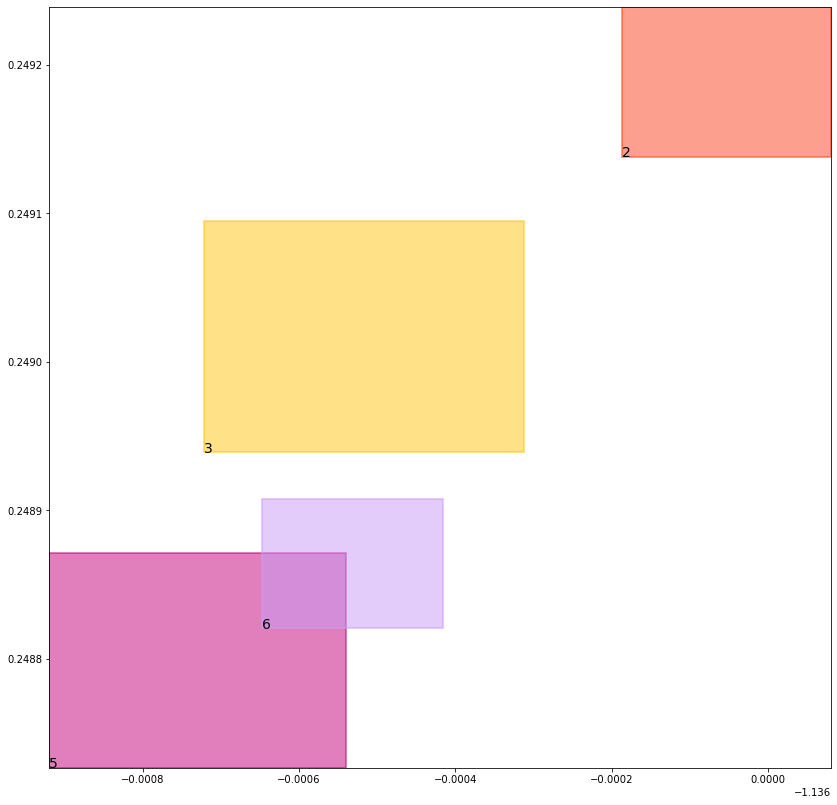

batch (tensor([[6, 2],
        [1, 3],
        [2, 6],
        [1, 2],
        [3, 5],
        [5, 3],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0085502881556749, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075836312025785, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509989440441132, grad_fn=<MulBackward0>)
previous loss: tensor(0.2671328783035278, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04175425320863724 0.0405292883515358 tensor(0.8947413563728333) tensor(0.9643914699554443)
tensor(2) 0.4620418846607208 0.5040225386619568 tensor(0.4626607298851013) tensor(0.5051147937774658)
tensor(3) 0.45865216851234436 0.5033439993858337 tensor(0.4595352411270142) tensor(0.5038400292396545)
tensor(4) 0.08053267002105713 0.015491368249058723 tensor(0.9683120250701904) tensor(0.9493693113327026)
tensor(5) 0.5286585092544556 0.4862617254257202 tensor(0.5305469036102295) tensor(0.4866985082626343)
tensor(6) 0.5343037247657776 0.4853816330432892 tensor(0.5354940891265869) tensor(0.4865932166576385)


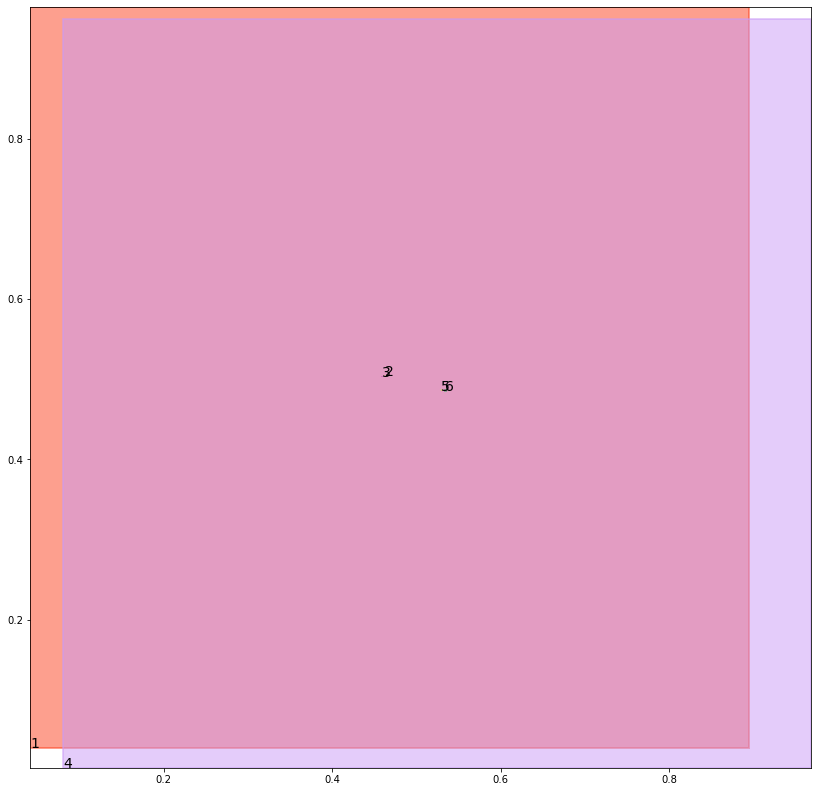

alignment data:
tensor(2) -1.1344408988952637 0.24126893281936646 tensor(-1.1340878009796143) tensor(0.2414028644561768)
tensor(3) -1.1348576545715332 0.24111595749855042 tensor(-1.1346576213836670) tensor(0.2411907613277435)
tensor(5) -1.1351463794708252 0.2408699095249176 tensor(-1.1348974704742432) tensor(0.2409615814685822)
tensor(6) -1.1350274085998535 0.2409045398235321 tensor(-1.1346025466918945) tensor(0.2410648465156555)


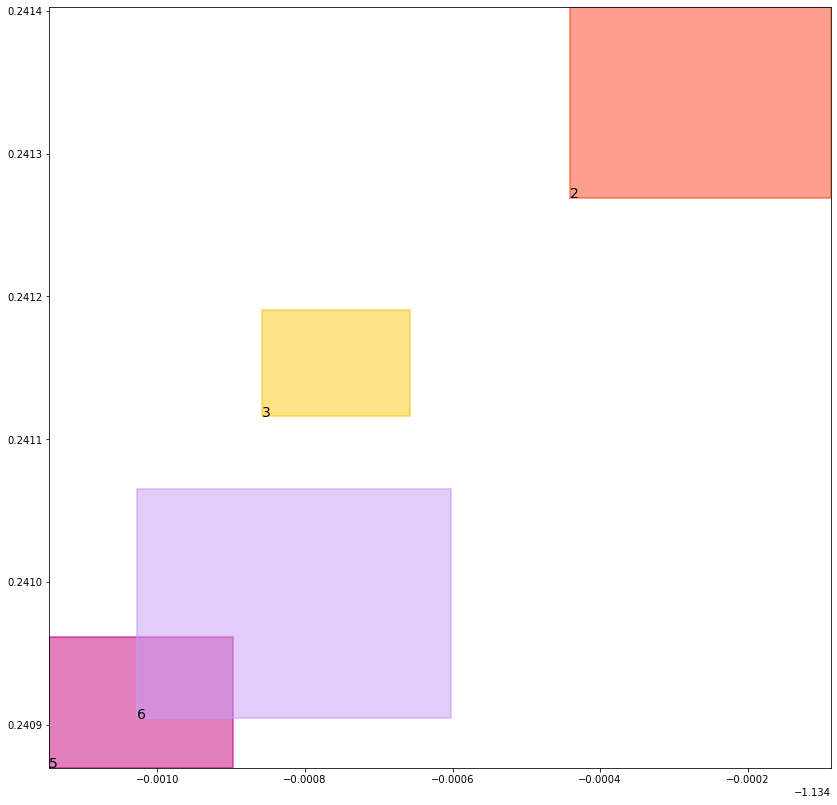

batch (tensor([[6, 2],
        [4, 5],
        [3, 5],
        [5, 3],
        [4, 6],
        [1, 3],
        [1, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0085324030369520, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075849527493119, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509998083114624, grad_fn=<MulBackward0>)
previous loss: tensor(0.2671171724796295, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04169720038771629 0.040263716131448746 tensor(0.8952344059944153) tensor(0.9644578099250793)
tensor(2) 0.46229612827301025 0.5039761066436768 tensor(0.4629888534545898) tensor(0.5046681761741638)
tensor(3) 0.45904025435447693 0.503014087677002 tensor(0.4597515761852264) tensor(0.5038902163505554)
tensor(4) 0.08002609759569168 0.015363415703177452 tensor(0.9683426618576050) tensor(0.9494354724884033)
tensor(5) 0.5282993912696838 0.4856169819831848 tensor(0.5302999615669250) tensor(0.4864556193351746)
tensor(6) 0.5340134501457214 0.48536887764930725 tensor(0.5349797010421753) tensor(0.4864805042743683)


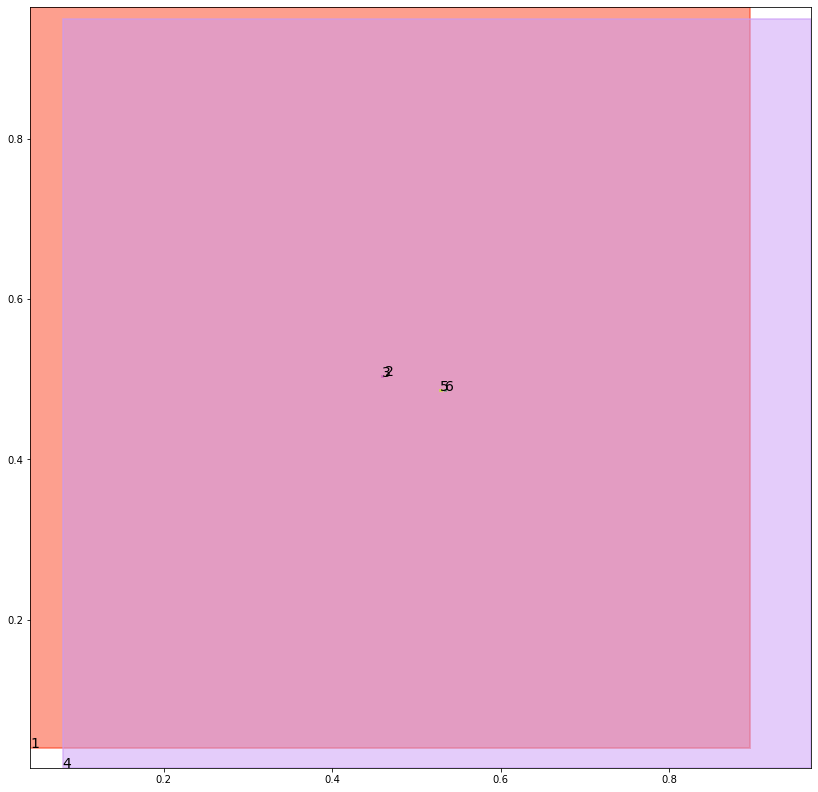

alignment data:
tensor(2) -1.144895076751709 0.24252723157405853 tensor(-1.1446515321731567) tensor(0.2426190227270126)
tensor(3) -1.1453849077224731 0.24234618246555328 tensor(-1.1450874805450439) tensor(0.2424585372209549)
tensor(5) -1.1457881927490234 0.24205683171749115 tensor(-1.1454164981842041) tensor(0.2421951442956924)
tensor(6) -1.1454823017120361 0.2421627789735794 tensor(-1.1451007127761841) tensor(0.2423068732023239)


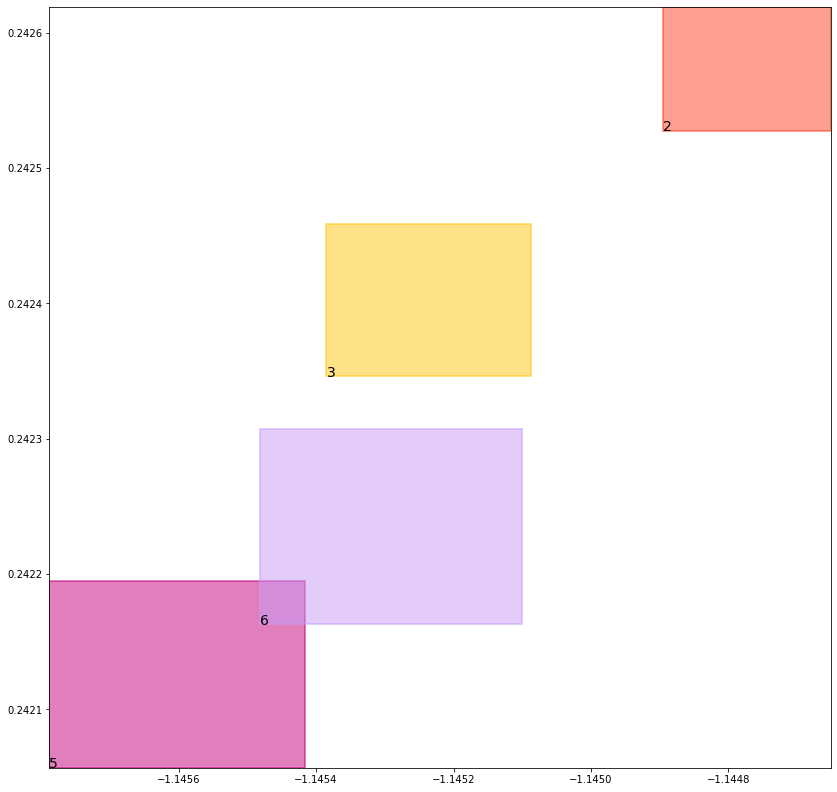

batch (tensor([[4, 5],
        [6, 2],
        [5, 3],
        [2, 6],
        [3, 5],
        [4, 6],
        [1, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0085111828520894, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075711994431913, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509991824626923, grad_fn=<MulBackward0>)
previous loss: tensor(0.2670815587043762, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04164031147956848 0.04000100865960121 tensor(0.8957240581512451) tensor(0.9645240306854248)
tensor(2) 0.46268895268440247 0.503783643245697 tensor(0.4628292024135590) tensor(0.5040909647941589)
tensor(3) 0.45972299575805664 0.502564013004303 tensor(0.4597271382808685) tensor(0.5040572881698608)
tensor(4) 0.07952471822500229 0.015237168408930302 tensor(0.9683731794357300) tensor(0.9495016932487488)
tensor(5) 0.528361976146698 0.4850689470767975 tensor(0.5293578505516052) tensor(0.4864933788776398)
tensor(6) 0.5339597463607788 0.48582521080970764 tensor(0.5340920686721802) tensor(0.4862269461154938)


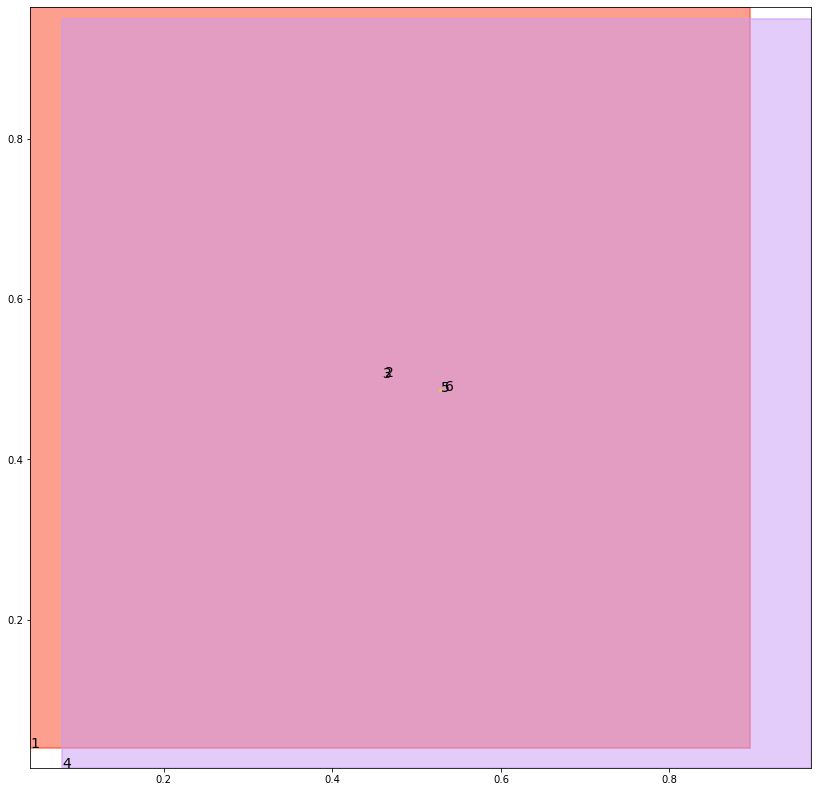

alignment data:
tensor(2) -1.1753028631210327 0.2408941388130188 tensor(-1.1752057075500488) tensor(0.2409309446811676)
tensor(3) -1.1758476495742798 0.24069157242774963 tensor(-1.1754208803176880) tensor(0.2408547699451447)
tensor(5) -1.1762948036193848 0.24038535356521606 tensor(-1.1758220195770264) tensor(0.2405642271041870)
tensor(6) -1.1757079362869263 0.24059882760047913 tensor(-1.1755843162536621) tensor(0.2406457960605621)


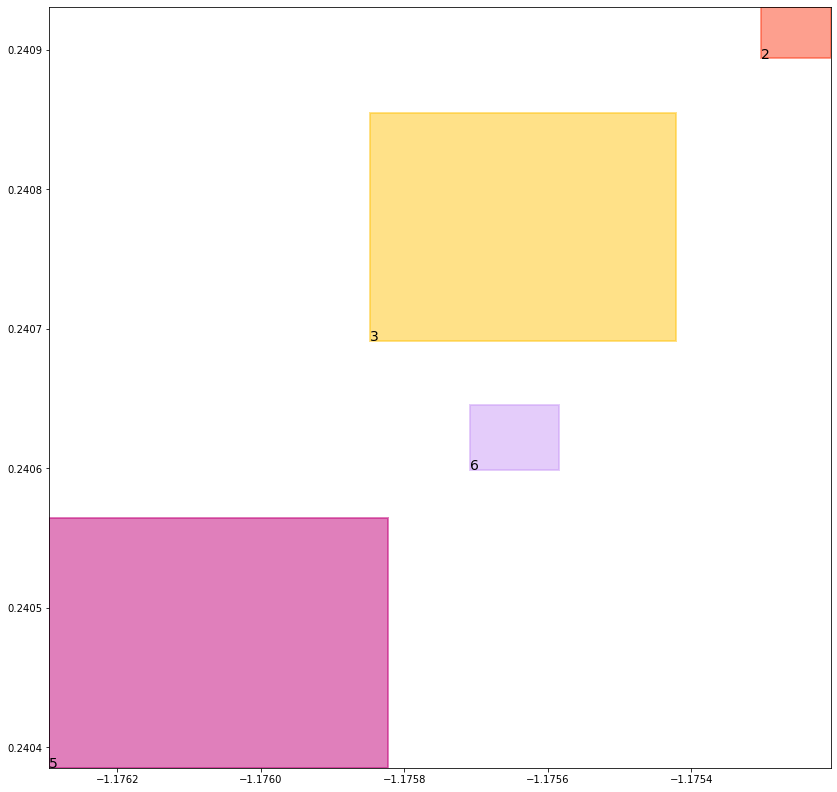

batch (tensor([[2, 6],
        [6, 2],
        [1, 2],
        [4, 6],
        [5, 3],
        [1, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0084786619991064, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075369072146714, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510004937648773, grad_fn=<MulBackward0>)
previous loss: tensor(0.2670160531997681, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041583605110645294 0.03974108025431633 tensor(0.8962098956108093) tensor(0.9645901322364807)
tensor(2) 0.4630418121814728 0.5034134387969971 tensor(0.4630882740020752) tensor(0.5040174722671509)
tensor(3) 0.459966778755188 0.5024545192718506 tensor(0.4600696265697479) tensor(0.5038788914680481)
tensor(4) 0.07902862131595612 0.015112611465156078 tensor(0.9684034585952759) tensor(0.9495676755905151)
tensor(5) 0.5277935862541199 0.4850079417228699 tensor(0.5288044810295105) tensor(0.4863902926445007)
tensor(6) 0.5328696370124817 0.4858455955982208 tensor(0.5341189503669739) tensor(0.4866972565650940)


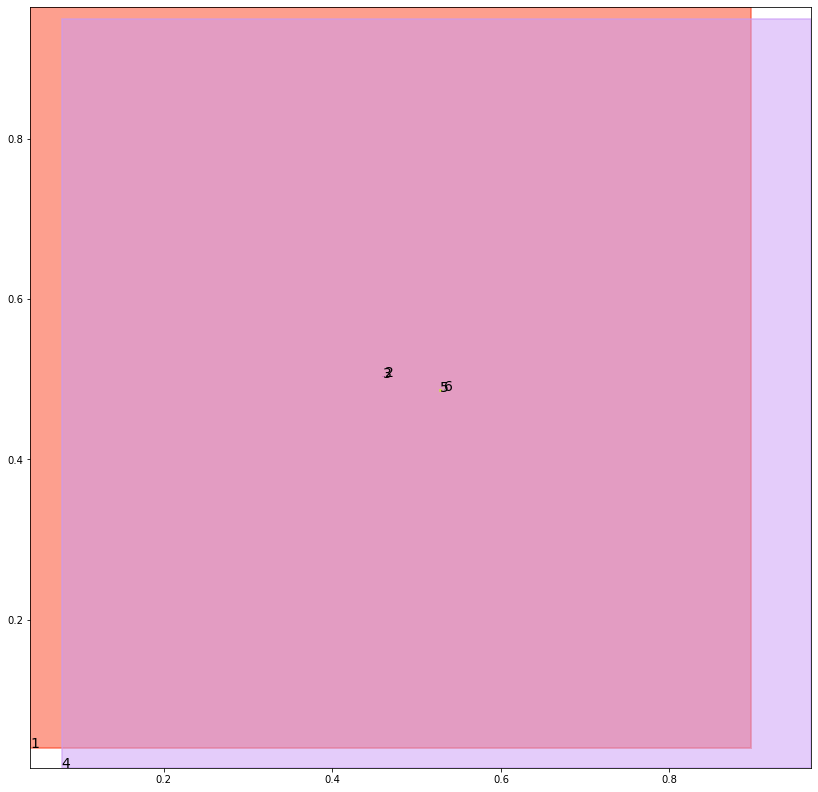

alignment data:
tensor(2) -1.1946889162063599 0.24713122844696045 tensor(-1.1945135593414307) tensor(0.2471981942653656)
tensor(3) -1.195167064666748 0.24695444107055664 tensor(-1.1947538852691650) tensor(0.2471122443675995)
tensor(5) -1.1956291198730469 0.24664238095283508 tensor(-1.1951675415039062) tensor(0.2468169629573822)
tensor(6) -1.1950523853302002 0.24685290455818176 tensor(-1.1947262287139893) tensor(0.2469751834869385)


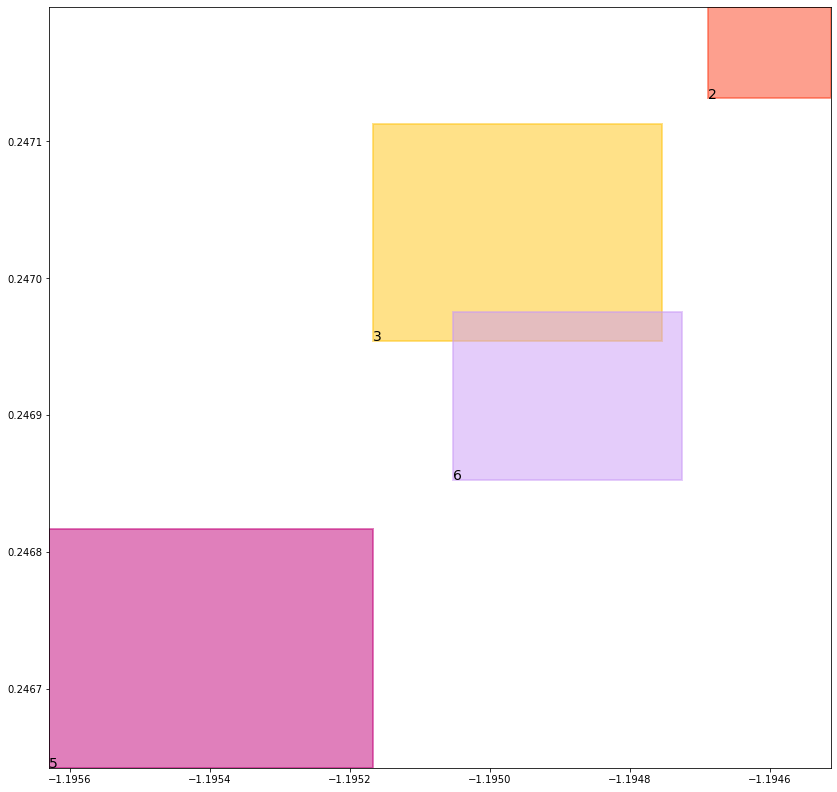

batch (tensor([[1, 2],
        [4, 6],
        [4, 5],
        [1, 3],
        [3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0084612295031548, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075361868366599, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509982585906982, grad_fn=<MulBackward0>)
previous loss: tensor(0.2669956684112549, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04152707755565643 0.039483875036239624 tensor(0.8966922760009766) tensor(0.9646558761596680)
tensor(2) 0.46285581588745117 0.5035112500190735 tensor(0.4635371267795563) tensor(0.5037754178047180)
tensor(3) 0.46010032296180725 0.5026525259017944 tensor(0.4604565203189850) tensor(0.5033882856369019)
tensor(4) 0.0785374790430069 0.014989727176725864 tensor(0.9684338569641113) tensor(0.9496336579322815)
tensor(5) 0.5270305871963501 0.4853883683681488 tensor(0.5287793874740601) tensor(0.4861600399017334)
tensor(6) 0.5321090221405029 0.48564594984054565 tensor(0.5340047478675842) tensor(0.4869909584522247)


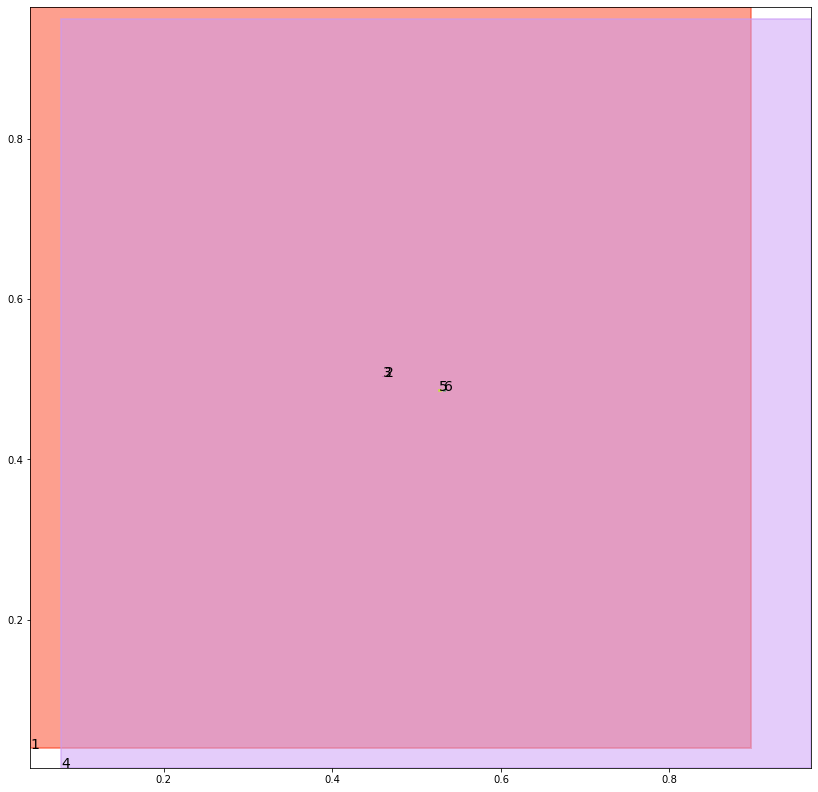

alignment data:
tensor(2) -1.2018061876296997 0.24980416893959045 tensor(-1.2016853094100952) tensor(0.2498489916324615)
tensor(3) -1.2022351026535034 0.2496456503868103 tensor(-1.2020015716552734) tensor(0.2497342228889465)
tensor(5) -1.2026804685592651 0.2493397295475006 tensor(-1.2023435831069946) tensor(0.2494650483131409)
tensor(6) -1.2022675275802612 0.24948745965957642 tensor(-1.2017574310302734) tensor(0.2496787607669830)


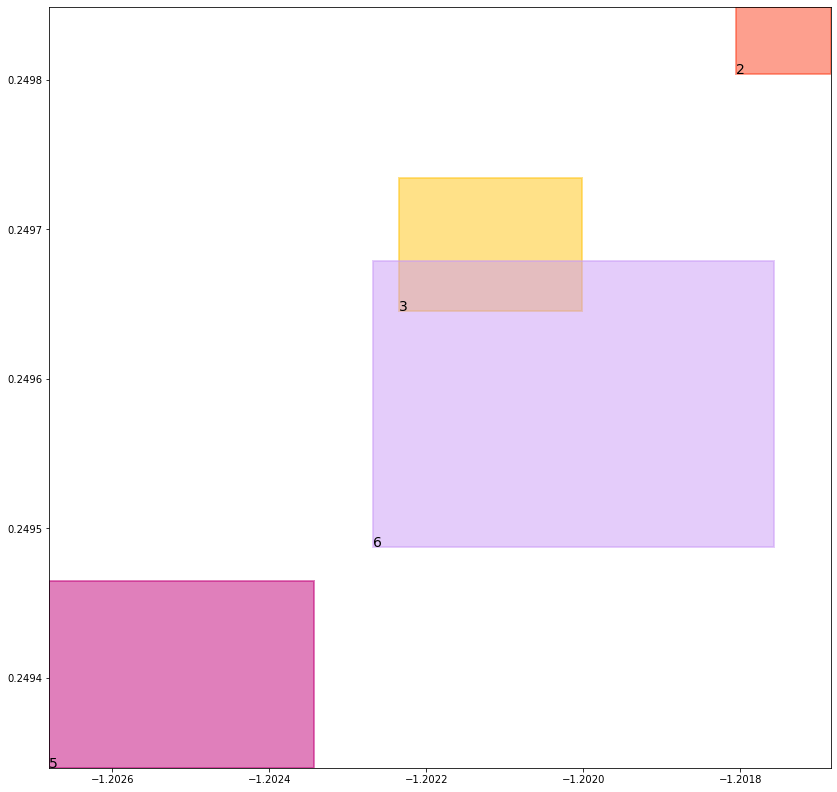

batch (tensor([[1, 3],
        [4, 6],
        [1, 2],
        [6, 2],
        [4, 5],
        [5, 3],
        [2, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0084443083032966, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075347451493144, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509997487068176, grad_fn=<MulBackward0>)
previous loss: tensor(0.2669788002967834, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041470717638731 0.03922942653298378 tensor(0.8971710801124573) tensor(0.9647215604782104)
tensor(2) 0.46331751346588135 0.503382682800293 tensor(0.4637152552604675) tensor(0.5040280818939209)
tensor(3) 0.4604634940624237 0.5026184916496277 tensor(0.4606742858886719) tensor(0.5031277537345886)
tensor(4) 0.07805105298757553 0.014868495054543018 tensor(0.9684640765190125) tensor(0.9496995806694031)
tensor(5) 0.5269947648048401 0.48581430315971375 tensor(0.5283310413360596) tensor(0.4861653447151184)
tensor(6) 0.5317677855491638 0.48561203479766846 tensor(0.5336430072784424) tensor(0.4867545962333679)


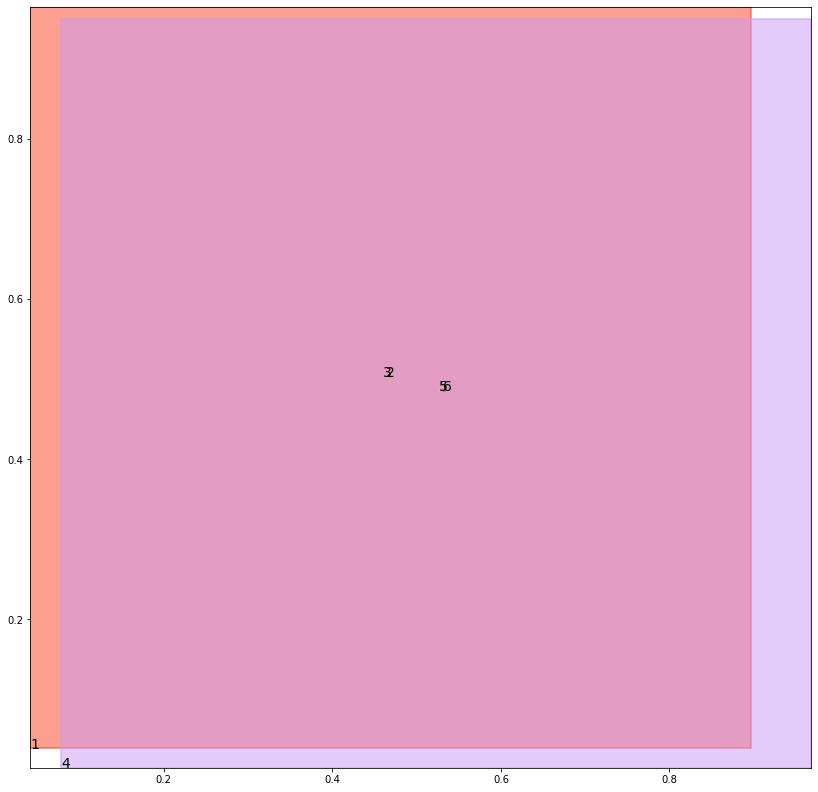

alignment data:
tensor(2) -1.2374776601791382 0.24871855974197388 tensor(-1.2372671365737915) tensor(0.2487983107566833)
tensor(3) -1.237886905670166 0.24856790900230408 tensor(-1.2377276420593262) tensor(0.2486283481121063)
tensor(5) -1.2382036447525024 0.2483099400997162 tensor(-1.2380141019821167) tensor(0.2483797073364258)
tensor(6) -1.237940788269043 0.24840068817138672 tensor(-1.2374895811080933) tensor(0.2485694289207458)


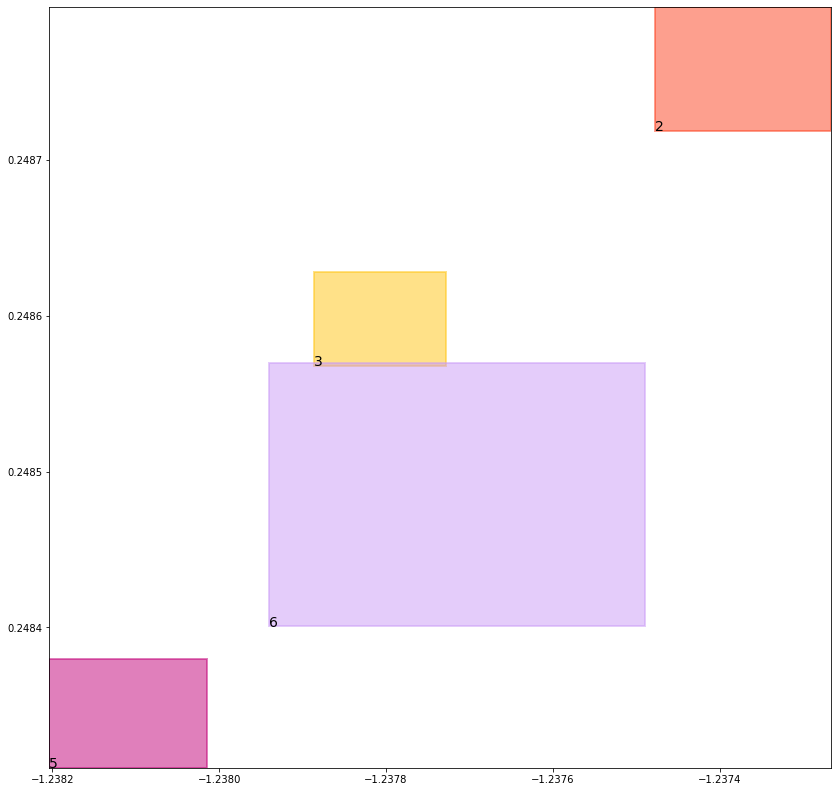

batch (tensor([[1, 2],
        [4, 5],
        [3, 5],
        [6, 2],
        [5, 3],
        [2, 6],
        [4, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0084214359521866, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0075111440382898, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510013878345490, grad_fn=<MulBackward0>)
previous loss: tensor(0.2669339776039124, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04141451418399811 0.03897770494222641 tensor(0.8976464271545410) tensor(0.9647871255874634)
tensor(2) 0.46360665559768677 0.5031876564025879 tensor(0.4644041955471039) tensor(0.5040192008018494)
tensor(3) 0.46064648032188416 0.5022262930870056 tensor(0.4611268341541290) tensor(0.5032353997230530)
tensor(4) 0.07756936550140381 0.014748923480510712 tensor(0.9684942364692688) tensor(0.9497655034065247)
tensor(5) 0.5275010466575623 0.4856322705745697 tensor(0.5276131033897400) tensor(0.4864105880260468)
tensor(6) 0.5318059921264648 0.48572811484336853 tensor(0.5330583453178406) tensor(0.4860452413558960)


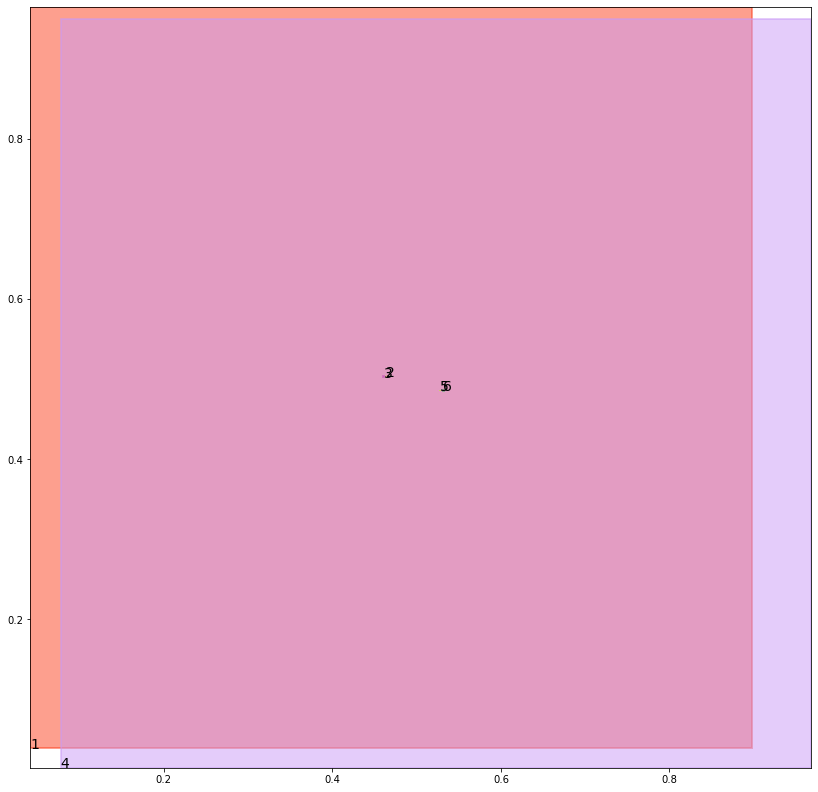

alignment data:
tensor(2) -1.3166769742965698 0.2465859353542328 tensor(-1.3163868188858032) tensor(0.2466953694820404)
tensor(3) -1.3171499967575073 0.2464110553264618 tensor(-1.3168306350708008) tensor(0.2465323209762573)
tensor(5) -1.3173613548278809 0.24619066715240479 tensor(-1.3171325922012329) tensor(0.2462780773639679)
tensor(6) -1.3170439004898071 0.24630331993103027 tensor(-1.3168693780899048) tensor(0.2463674843311310)


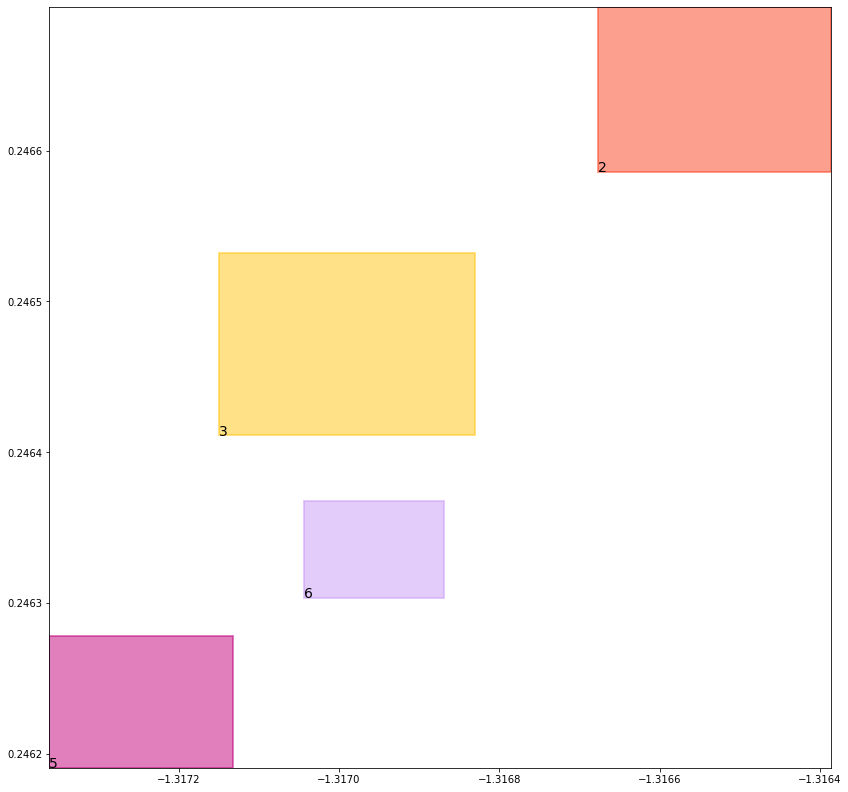

batch (tensor([[1, 2],
        [4, 5],
        [1, 3],
        [4, 6],
        [2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0084158163517714, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0074761928990483, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510015964508057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2668935954570770, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041358478367328644 0.038728632032871246 tensor(0.8981182575225830) tensor(0.9648523926734924)
tensor(2) 0.46381232142448425 0.5031725764274597 tensor(0.4647864997386932) tensor(0.5035271644592285)
tensor(3) 0.4608915448188782 0.5021788477897644 tensor(0.4614459872245789) tensor(0.5030096173286438)
tensor(4) 0.07709260284900665 0.014630977995693684 tensor(0.9685242176055908) tensor(0.9498313069343567)
tensor(5) 0.527137041091919 0.4855976402759552 tensor(0.5274627804756165) tensor(0.4861736297607422)
tensor(6) 0.5321855545043945 0.4849211275577545 tensor(0.5322736501693726) tensor(0.4859789013862610)


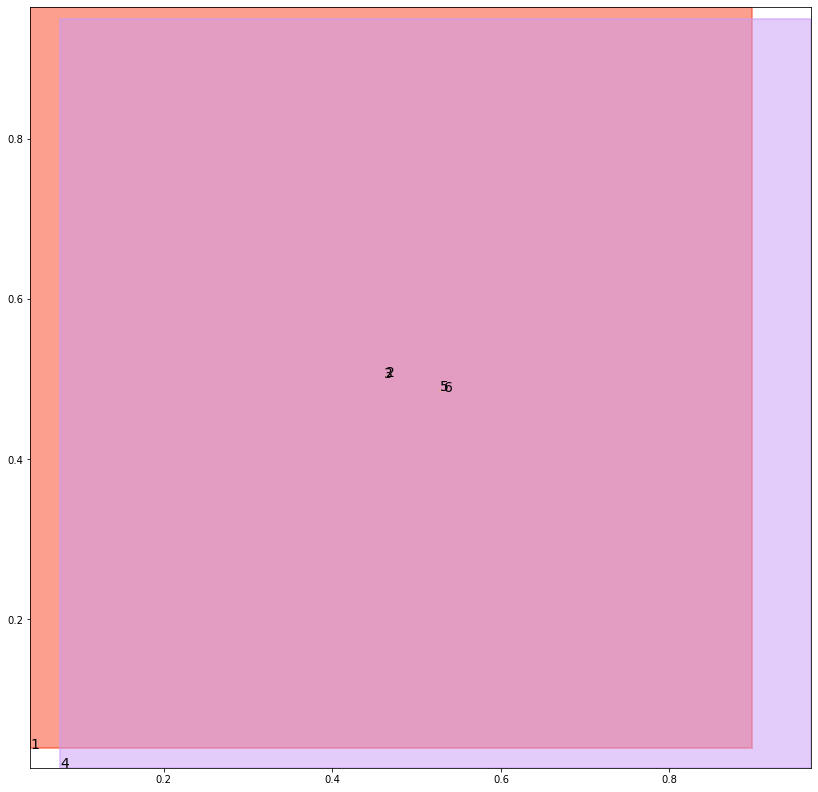

alignment data:
tensor(2) -1.4107040166854858 0.25610867142677307 tensor(-1.4105372428894043) tensor(0.2561704218387604)
tensor(3) -1.4111840724945068 0.2559311091899872 tensor(-1.4109104871749878) tensor(0.2560346424579620)
tensor(5) -1.4114093780517578 0.2557046115398407 tensor(-1.4112237691879272) tensor(0.2557749748229980)
tensor(6) -1.4112597703933716 0.2557511627674103 tensor(-1.4109532833099365) tensor(0.2558682858943939)


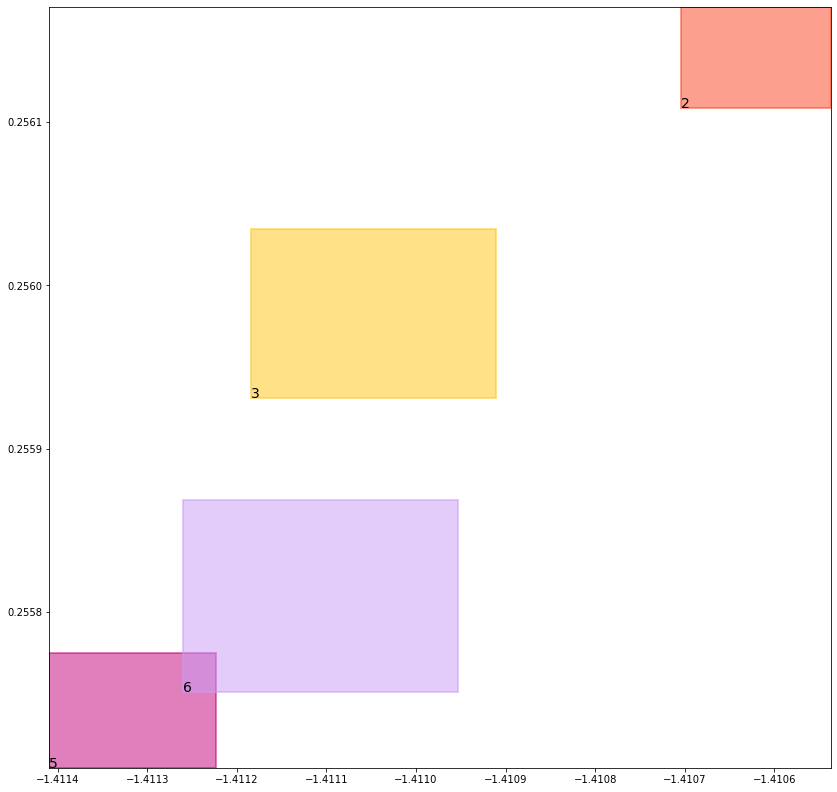

batch (tensor([[1, 3],
        [6, 2],
        [5, 3],
        [4, 5],
        [4, 6],
        [1, 2],
        [2, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0083948392421007, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0074573969468474, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510024309158325, grad_fn=<MulBackward0>)
previous loss: tensor(0.2668546736240387, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041302602738142014 0.038482192903757095 tensor(0.8985869884490967) tensor(0.9649176597595215)
tensor(2) 0.46430137753486633 0.502602756023407 tensor(0.4645319879055023) tensor(0.5033180117607117)
tensor(3) 0.46138307452201843 0.502442479133606 tensor(0.4614539444446564) tensor(0.5024827122688293)
tensor(4) 0.07662083953619003 0.014514598064124584 tensor(0.9685541987419128) tensor(0.9498969912528992)
tensor(5) 0.5266184210777283 0.48550209403038025 tensor(0.5271945595741272) tensor(0.4856966137886047)
tensor(6) 0.5313093662261963 0.4843812882900238 tensor(0.5328718423843384) tensor(0.4860518872737885)


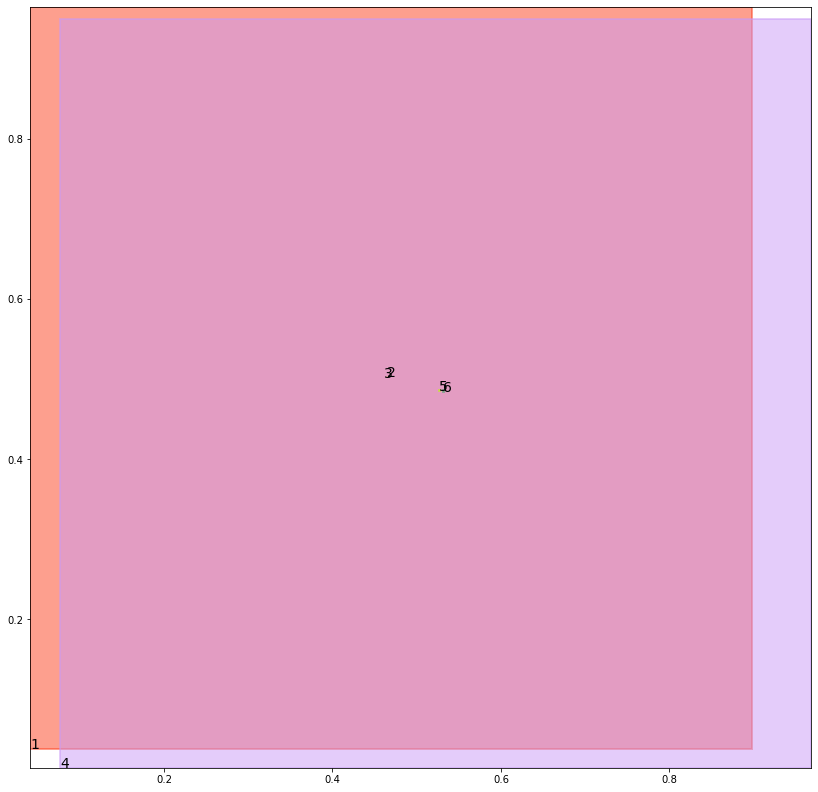

alignment data:
tensor(2) -1.484864354133606 0.26331374049186707 tensor(-1.4846457242965698) tensor(0.2633969485759735)
tensor(3) -1.4851083755493164 0.2632266581058502 tensor(-1.4850920438766479) tensor(0.2632327079772949)
tensor(5) -1.4854804277420044 0.2629438638687134 tensor(-1.4853861331939697) tensor(0.2629787623882294)
tensor(6) -1.485479712486267 0.2629340887069702 tensor(-1.4848994016647339) tensor(0.2631529271602631)


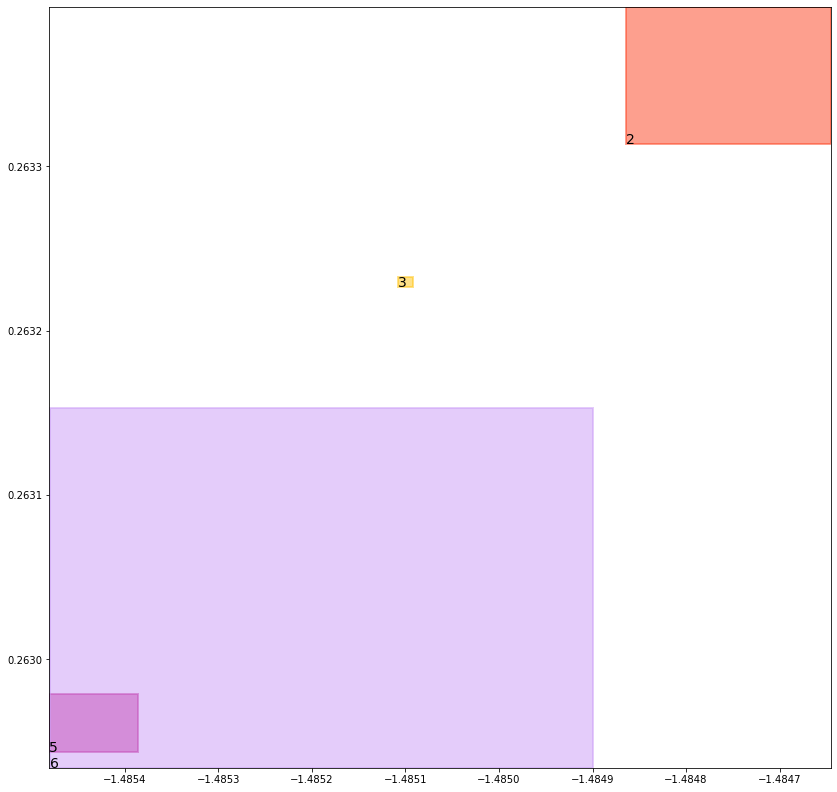

batch (tensor([[1, 3],
        [2, 6],
        [6, 2],
        [5, 3],
        [3, 5],
        [4, 6],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0083584748208523, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0074628619477153, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510024309158325, grad_fn=<MulBackward0>)
previous loss: tensor(0.2668237686157227, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041246891021728516 0.03823833167552948 tensor(0.8990523815155029) tensor(0.9649825692176819)
tensor(2) 0.46370649337768555 0.5021976828575134 tensor(0.4650455415248871) tensor(0.5032724738121033)
tensor(3) 0.4611814320087433 0.5016856789588928 tensor(0.4620962142944336) tensor(0.5029831528663635)
tensor(4) 0.07615381479263306 0.014399725012481213 tensor(0.9685840606689453) tensor(0.9499627351760864)
tensor(5) 0.5265053510665894 0.4853295087814331 tensor(0.5268229842185974) tensor(0.4856471717357635)
tensor(6) 0.53065025806427 0.484375 tensor(0.5330690741539001) tensor(0.4859621226787567)


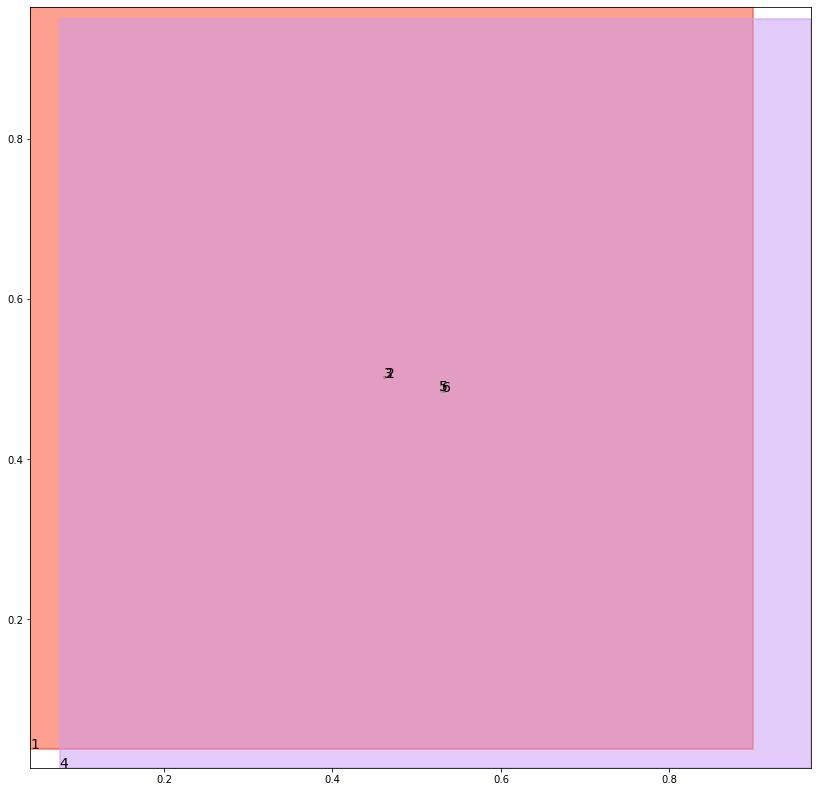

alignment data:
tensor(2) -1.5256686210632324 0.25790128111839294 tensor(-1.5252726078033447) tensor(0.2580500543117523)
tensor(3) -1.5259863138198853 0.25778520107269287 tensor(-1.5255559682846069) tensor(0.2579479515552521)
tensor(5) -1.5261629819869995 0.2575748860836029 tensor(-1.5260512828826904) tensor(0.2576169371604919)
tensor(6) -1.5261505842208862 0.2575705349445343 tensor(-1.5255354642868042) tensor(0.2578007876873016)


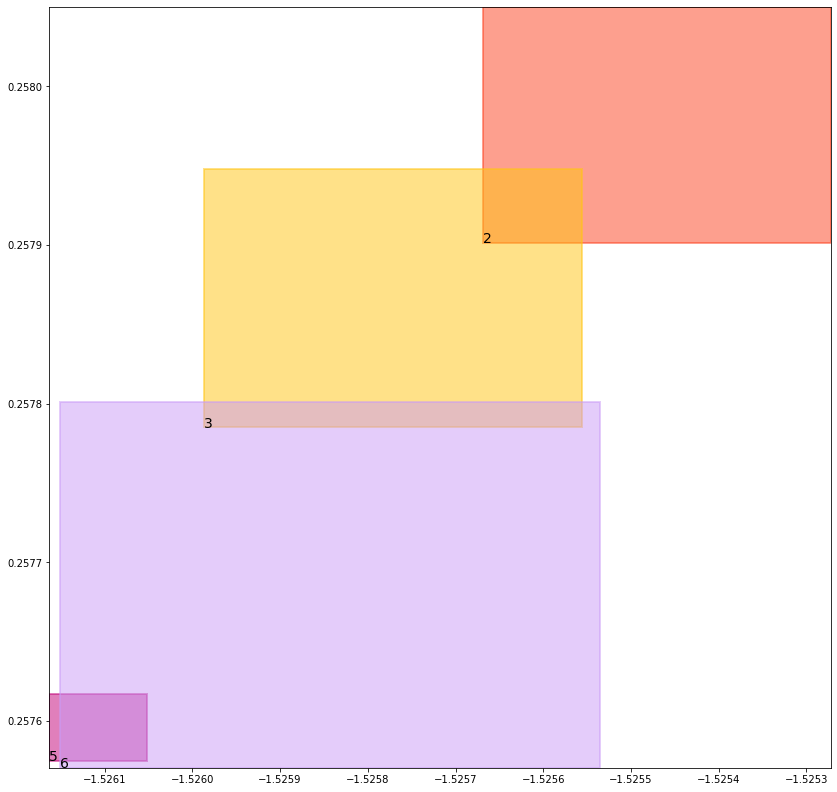

batch (tensor([[2, 6],
        [4, 6],
        [1, 3],
        [3, 5],
        [4, 5],
        [6, 2],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0083768367767334, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0074555957689881, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509967684745789, grad_fn=<MulBackward0>)
previous loss: tensor(0.2668291926383972, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04119132086634636 0.03799692913889885 tensor(0.8995143175125122) tensor(0.9650474190711975)
tensor(2) 0.46363410353660583 0.5022678971290588 tensor(0.4654461741447449) tensor(0.5030540823936462)
tensor(3) 0.46127182245254517 0.5012720227241516 tensor(0.4625134468078613) tensor(0.5031390190124512)
tensor(4) 0.07569142431020737 0.01428633090108633 tensor(0.9686139225959778) tensor(0.9500283598899841)
tensor(5) 0.5260652899742126 0.48546522855758667 tensor(0.5270505547523499) tensor(0.4856037199497223)
tensor(6) 0.5302674174308777 0.48484712839126587 tensor(0.5328229069709778) tensor(0.4857252836227417)


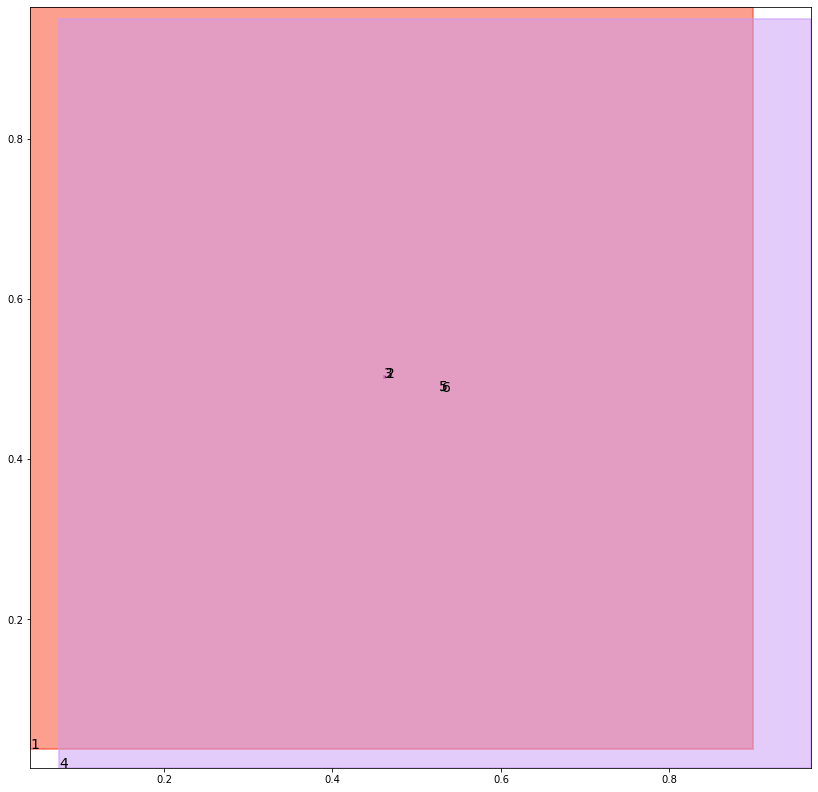

alignment data:
tensor(2) -1.555459976196289 0.24011589586734772 tensor(-1.5551130771636963) tensor(0.2402447313070297)
tensor(3) -1.5559039115905762 0.23995105922222137 tensor(-1.5552899837493896) tensor(0.2401834279298782)
tensor(5) -1.5559380054473877 0.23979409039020538 tensor(-1.5558311939239502) tensor(0.2398328036069870)
tensor(6) -1.5558249950408936 0.23982800543308258 tensor(-1.5554010868072510) tensor(0.2399847060441971)


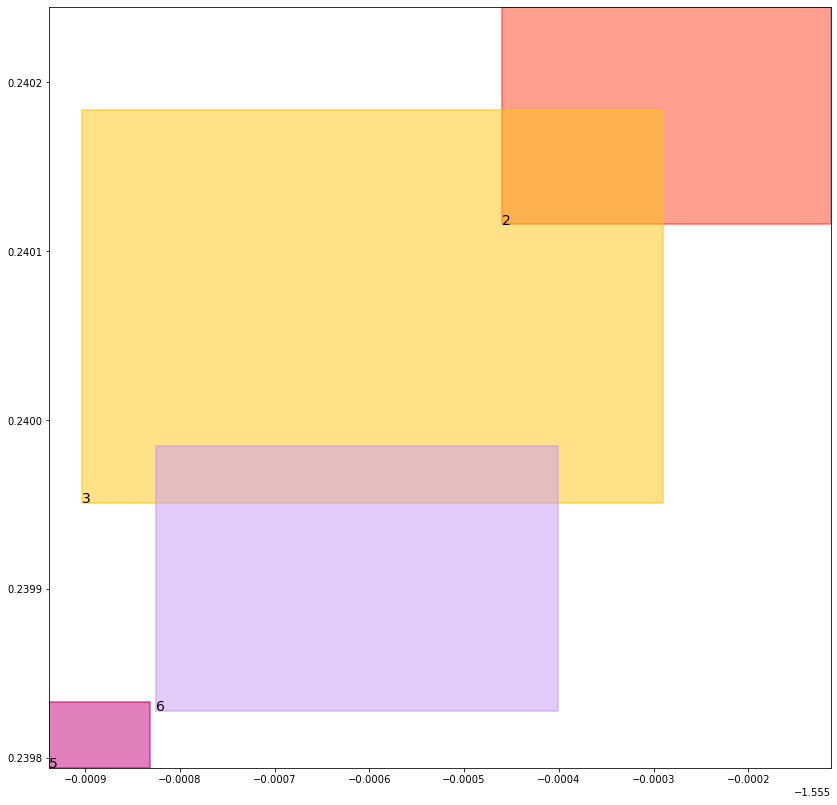

batch (tensor([[1, 2],
        [1, 3],
        [2, 6],
        [4, 5],
        [3, 5],
        [6, 2],
        [4, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0083707664161921, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0074433153495193, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509973347187042, grad_fn=<MulBackward0>)
previous loss: tensor(0.2668114304542542, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041135866194963455 0.03775794059038162 tensor(0.8999732136726379) tensor(0.9651121497154236)
tensor(2) 0.46424365043640137 0.5026794075965881 tensor(0.4655359089374542) tensor(0.5027701258659363)
tensor(3) 0.46169060468673706 0.501209020614624 tensor(0.4626629054546356) tensor(0.5029450654983521)
tensor(4) 0.0752335712313652 0.014174439013004303 tensor(0.9686436653137207) tensor(0.9500939249992371)
tensor(5) 0.5257686376571655 0.4854007363319397 tensor(0.5268336534500122) tensor(0.4854306280612946)
tensor(6) 0.5301344394683838 0.48535606265068054 tensor(0.5321766734123230) tensor(0.4857451617717743)


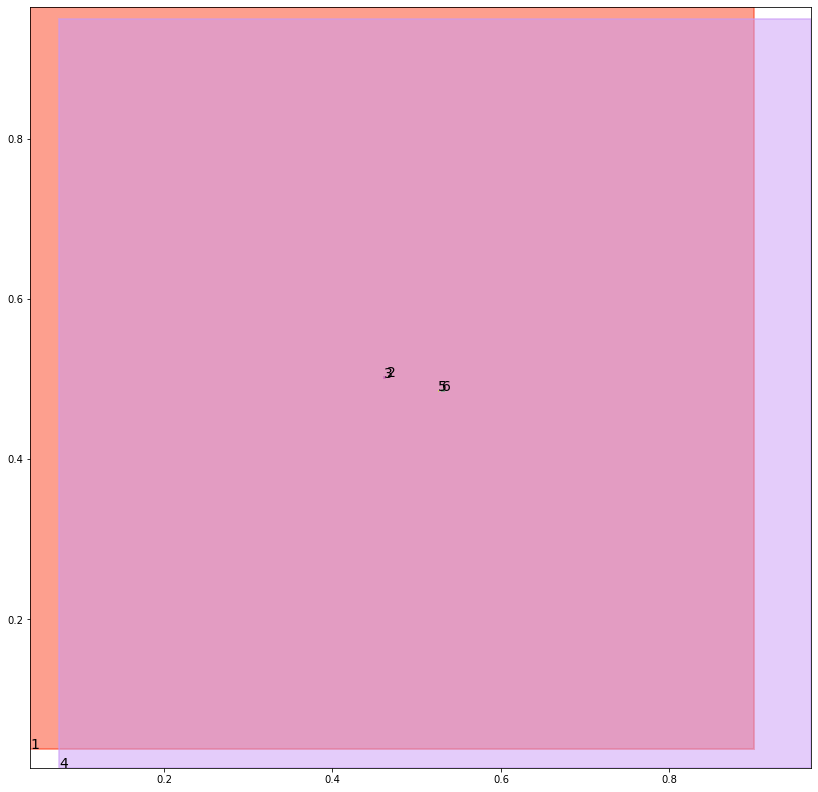

alignment data:
tensor(2) -1.5573699474334717 0.22111257910728455 tensor(-1.5572551488876343) tensor(0.2211535871028900)
tensor(3) -1.5579617023468018 0.22089162468910217 tensor(-1.5574035644531250) tensor(0.2211032509803772)
tensor(5) -1.5580227375030518 0.22072359919548035 tensor(-1.5579409599304199) tensor(0.2207525074481964)
tensor(6) -1.5577346086502075 0.22082403302192688 tensor(-1.5574839115142822) tensor(0.2209154665470123)


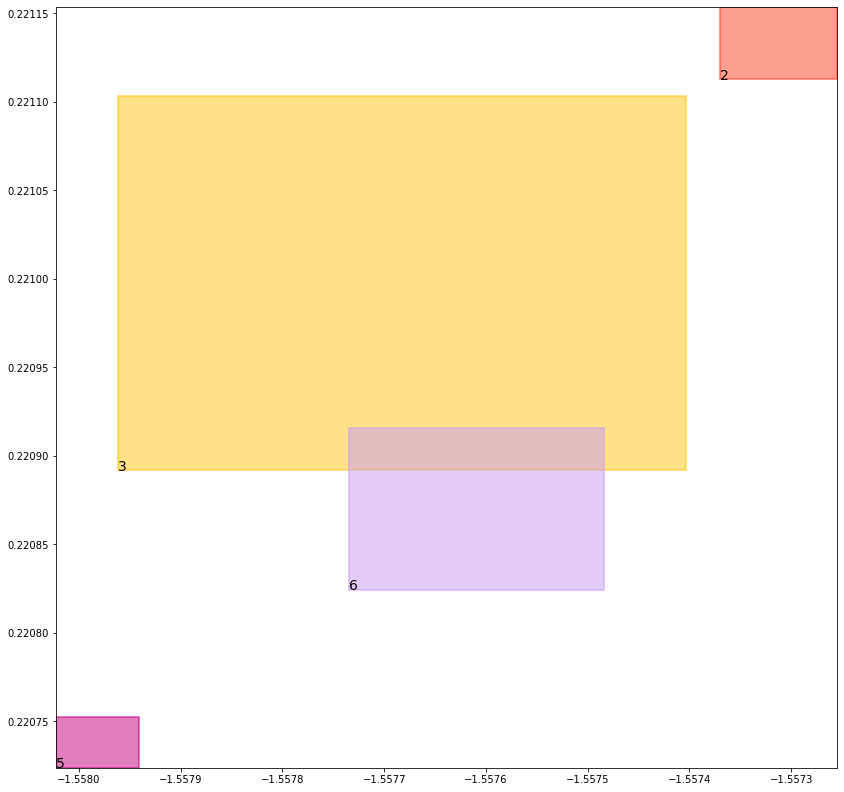

batch (tensor([[1, 2],
        [2, 6],
        [4, 6],
        [1, 3],
        [5, 3],
        [6, 2],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0083366874605417, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0074207969009876, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510017156600952, grad_fn=<MulBackward0>)
previous loss: tensor(0.2667591869831085, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.041080545634031296 0.03752141073346138 tensor(0.9004287719726562) tensor(0.9651766419410706)
tensor(2) 0.46534523367881775 0.5025035738945007 tensor(0.4654661118984222) tensor(0.5027489662170410)
tensor(3) 0.4624052941799164 0.501462459564209 tensor(0.4625705778598785) tensor(0.5024355053901672)
tensor(4) 0.07478023320436478 0.014064042828977108 tensor(0.9686734080314636) tensor(0.9501593112945557)
tensor(5) 0.5258888602256775 0.4852621257305145 tensor(0.5259290933609009) tensor(0.4856450855731964)
tensor(6) 0.5302268862724304 0.4851708710193634 tensor(0.5311705470085144) tensor(0.4860598742961884)


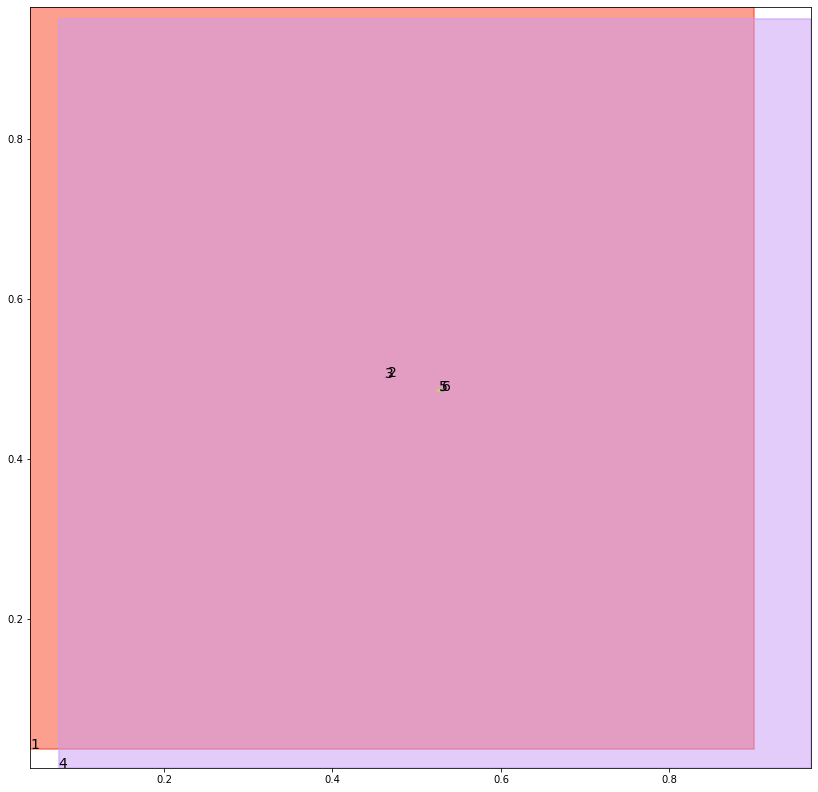

alignment data:
tensor(2) -1.552334189414978 0.20480279624462128 tensor(-1.5522564649581909) tensor(0.2048322707414627)
tensor(3) -1.5528316497802734 0.2046188861131668 tensor(-1.5525451898574829) tensor(0.2047282606363297)
tensor(5) -1.5530219078063965 0.2044004648923874 tensor(-1.5529109239578247) tensor(0.2044429332017899)
tensor(6) -1.5527478456497192 0.20449553430080414 tensor(-1.5524312257766724) tensor(0.2046146541833878)


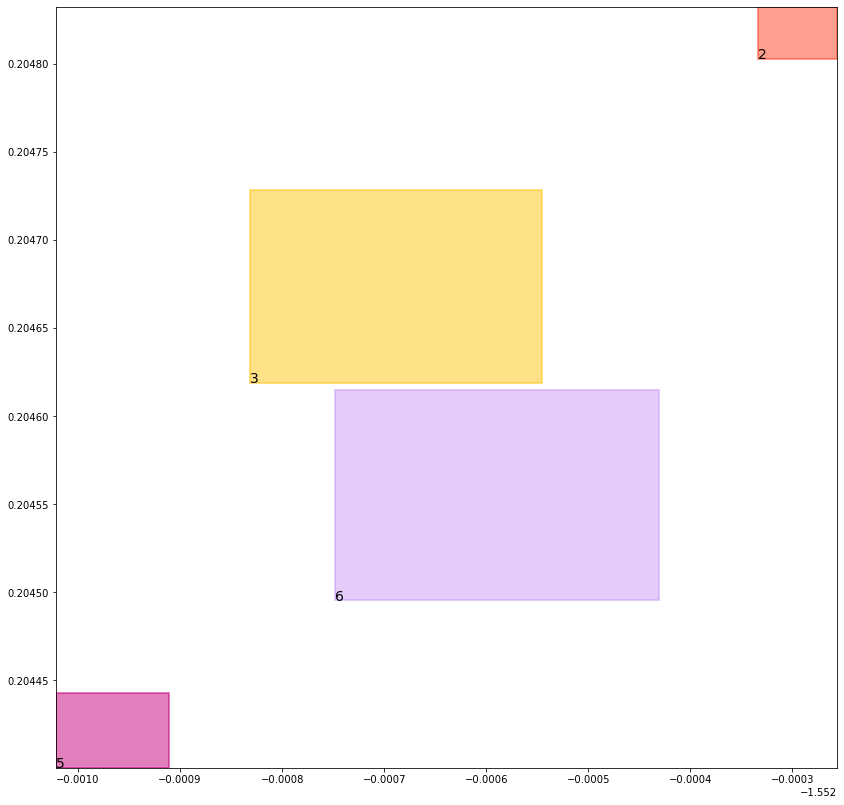

batch (tensor([[4, 6],
        [6, 2],
        [3, 5],
        [1, 2],
        [1, 3],
        [5, 3],
        [2, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082907686010003, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073937149718404, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510032653808594, grad_fn=<MulBackward0>)
previous loss: tensor(0.2666877508163452, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04102540388703346 0.03728734329342842 tensor(0.9008810520172119) tensor(0.9652409553527832)
tensor(2) 0.46547573804855347 0.5022560358047485 tensor(0.4659734070301056) tensor(0.5025071501731873)
tensor(3) 0.462260901927948 0.5016458630561829 tensor(0.4633853733539581) tensor(0.5019978880882263)
tensor(4) 0.07433150708675385 0.01395510695874691 tensor(0.9687029123306274) tensor(0.9502247571945190)
tensor(5) 0.5244074463844299 0.4852418601512909 tensor(0.5263846516609192) tensor(0.4854075312614441)
tensor(6) 0.5298424363136292 0.4851529002189636 tensor(0.5305224061012268) tensor(0.4858428835868835)


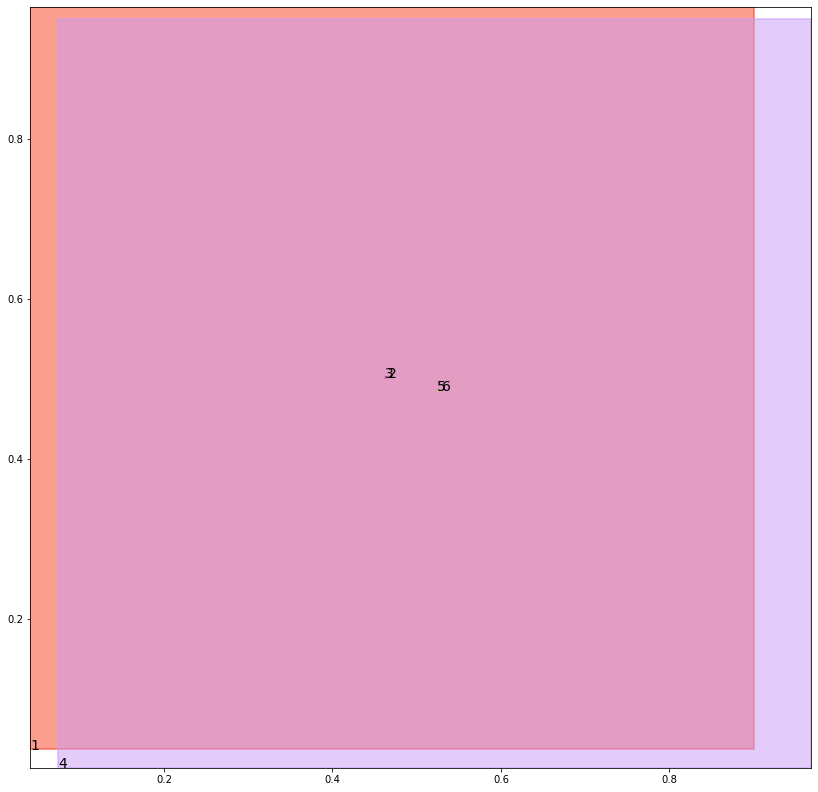

alignment data:
tensor(2) -1.5154422521591187 0.1826394498348236 tensor(-1.5153367519378662) tensor(0.1826786994934082)
tensor(3) -1.5158376693725586 0.1824953556060791 tensor(-1.5156601667404175) tensor(0.1825607419013977)
tensor(5) -1.516156554222107 0.18222883343696594 tensor(-1.5159724950790405) tensor(0.1822947561740875)
tensor(6) -1.515804409980774 0.18235111236572266 tensor(-1.5155624151229858) tensor(0.1824423074722290)


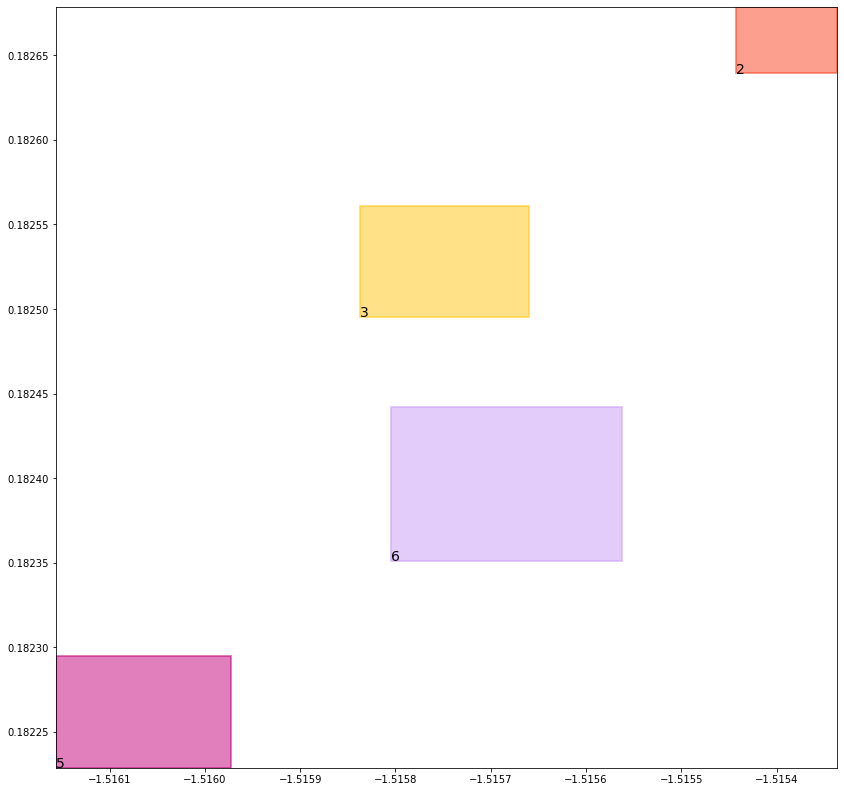

batch (tensor([[1, 2],
        [3, 5],
        [1, 3],
        [6, 2],
        [4, 5],
        [2, 6],
        [5, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082832556217909, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073932344093919, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510041594505310, grad_fn=<MulBackward0>)
previous loss: tensor(0.2666806578636169, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040970414876937866 0.03705570846796036 tensor(0.9013303518295288) tensor(0.9653051495552063)
tensor(2) 0.4658326506614685 0.5022500157356262 tensor(0.4658966958522797) tensor(0.5023334622383118)
tensor(3) 0.4622514247894287 0.5012401342391968 tensor(0.4639872908592224) tensor(0.5021578073501587)
tensor(4) 0.07388703525066376 0.013847600668668747 tensor(0.9687325954437256) tensor(0.9502900838851929)
tensor(5) 0.5236908197402954 0.4847339391708374 tensor(0.5264073014259338) tensor(0.4853569269180298)
tensor(6) 0.5289908647537231 0.48514801263809204 tensor(0.5305339097976685) tensor(0.4852857589721680)


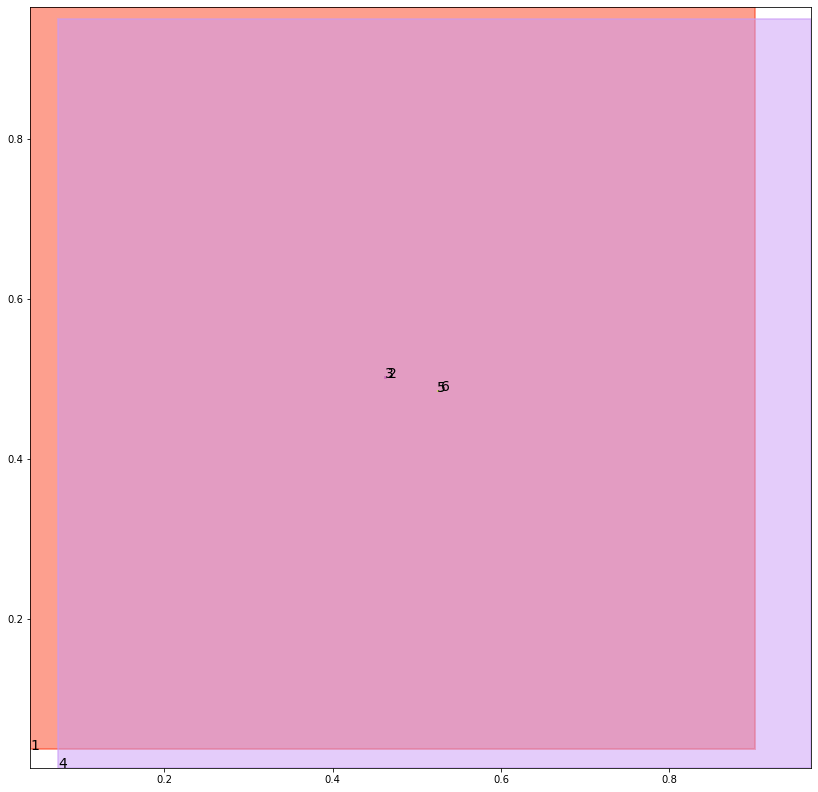

alignment data:
tensor(2) -1.4696760177612305 0.16287027299404144 tensor(-1.4696480035781860) tensor(0.1628808528184891)
tensor(3) -1.4702105522155762 0.16267384588718414 tensor(-1.4698307514190674) tensor(0.1628153771162033)
tensor(5) -1.470585823059082 0.16238568723201752 tensor(-1.4702208042144775) tensor(0.1625192016363144)
tensor(6) -1.470099687576294 0.16255952417850494 tensor(-1.4699532985687256) tensor(0.1626120358705521)


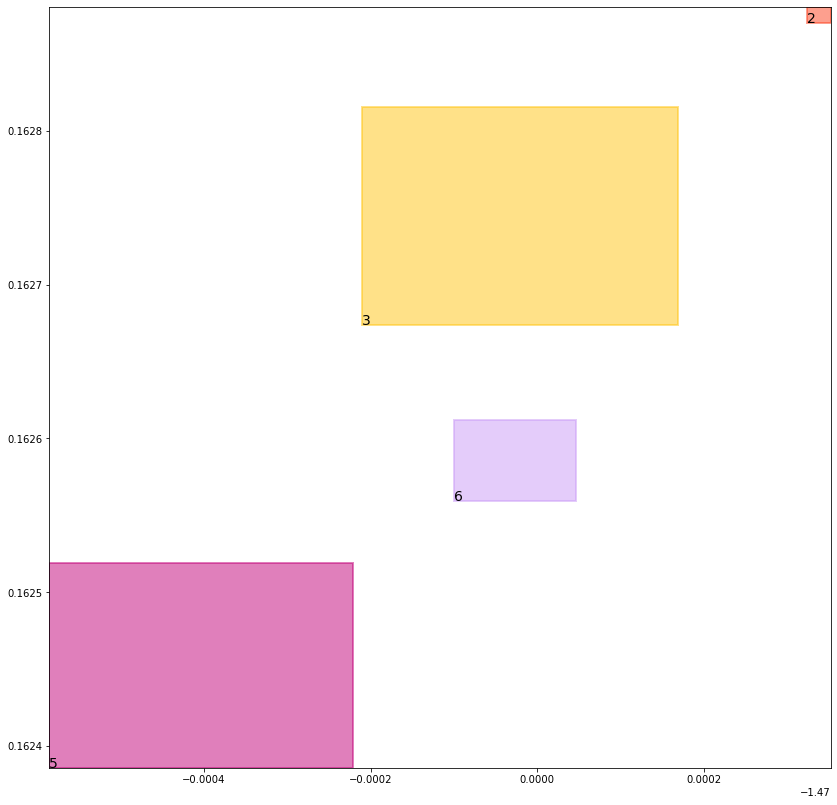

batch (tensor([[2, 6],
        [4, 6],
        [6, 2],
        [4, 5],
        [1, 3],
        [1, 2],
        [3, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082709956914186, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073949154466391, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510024607181549, grad_fn=<MulBackward0>)
previous loss: tensor(0.2666683793067932, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04091557487845421 0.03682646527886391 tensor(0.9017763733863831) tensor(0.9653691649436951)
tensor(2) 0.4660050868988037 0.5019989013671875 tensor(0.4663711786270142) tensor(0.5026817917823792)
tensor(3) 0.46251344680786133 0.5011817216873169 tensor(0.4642461836338043) tensor(0.5019754171371460)
tensor(4) 0.0734466016292572 0.013741486705839634 tensor(0.9687620401382446) tensor(0.9503554701805115)
tensor(5) 0.5237048864364624 0.4845695197582245 tensor(0.5260021090507507) tensor(0.4853215217590332)
tensor(6) 0.5285726189613342 0.4849959909915924 tensor(0.5302884578704834) tensor(0.4852498471736908)


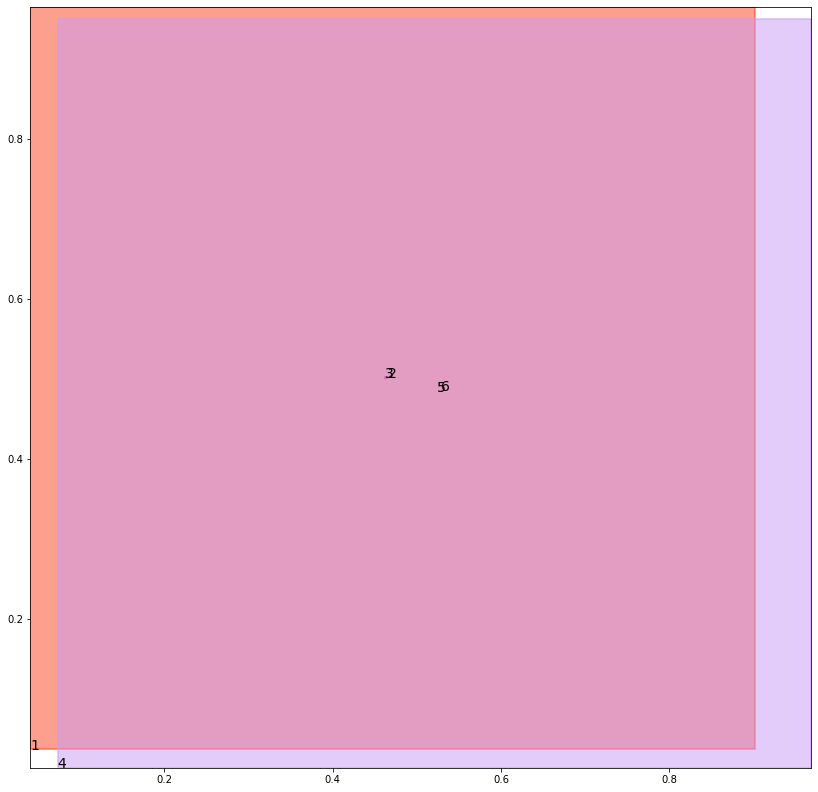

alignment data:
tensor(2) -1.3998461961746216 0.13112854957580566 tensor(-1.3996281623840332) tensor(0.1312112212181091)
tensor(3) -1.4003207683563232 0.13095495104789734 tensor(-1.3999757766723633) tensor(0.1310830116271973)
tensor(5) -1.4007210731506348 0.1306561529636383 tensor(-1.4003485441207886) tensor(0.1307935118675232)
tensor(6) -1.400260329246521 0.13082116842269897 tensor(-1.4000687599182129) tensor(0.1308904886245728)


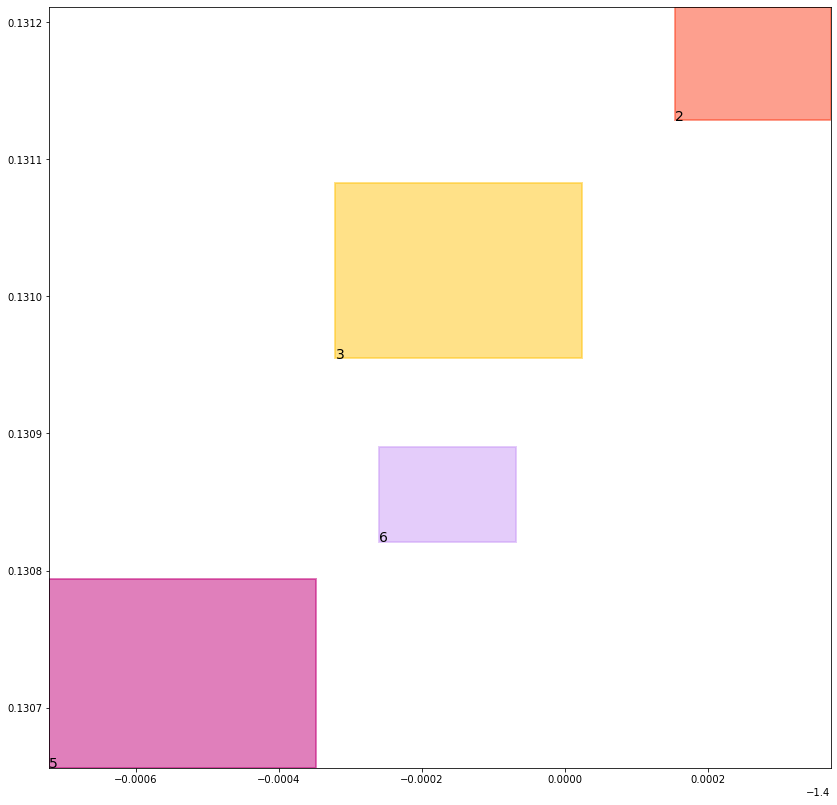

batch (tensor([[5, 3],
        [2, 6],
        [1, 2],
        [6, 2],
        [3, 5],
        [4, 6],
        [1, 3],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082613192498684, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073818257078528, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510005831718445, grad_fn=<MulBackward0>)
previous loss: tensor(0.2666437327861786, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04086088016629219 0.03659956157207489 tensor(0.9022193551063538) tensor(0.9654330015182495)
tensor(2) 0.46625736355781555 0.5018603801727295 tensor(0.4664057493209839) tensor(0.5025867223739624)
tensor(3) 0.463020384311676 0.5014366507530212 tensor(0.4641950428485870) tensor(0.5014845132827759)
tensor(4) 0.07301021367311478 0.013636725954711437 tensor(0.9687914252281189) tensor(0.9504206180572510)
tensor(5) 0.5243771076202393 0.4848672151565552 tensor(0.5252112746238708) tensor(0.4851497113704681)
tensor(6) 0.5285463929176331 0.4850625693798065 tensor(0.5298113226890564) tensor(0.4853355586528778)


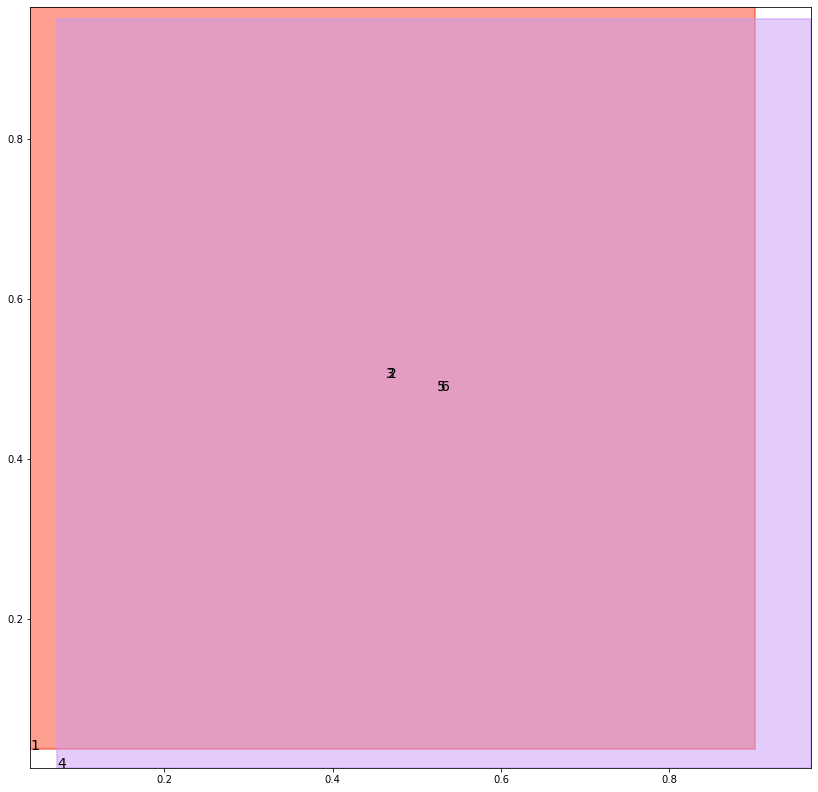

alignment data:
tensor(2) -1.3367018699645996 0.10074673593044281 tensor(-1.3364870548248291) tensor(0.1008287221193314)
tensor(3) -1.3370486497879028 0.10062162578105927 tensor(-1.3369526863098145) tensor(0.1006556004285812)
tensor(5) -1.33740234375 0.10033856332302094 tensor(-1.3372642993927002) tensor(0.1003894954919815)
tensor(6) -1.3370544910430908 0.10046188533306122 tensor(-1.3368887901306152) tensor(0.1005223840475082)


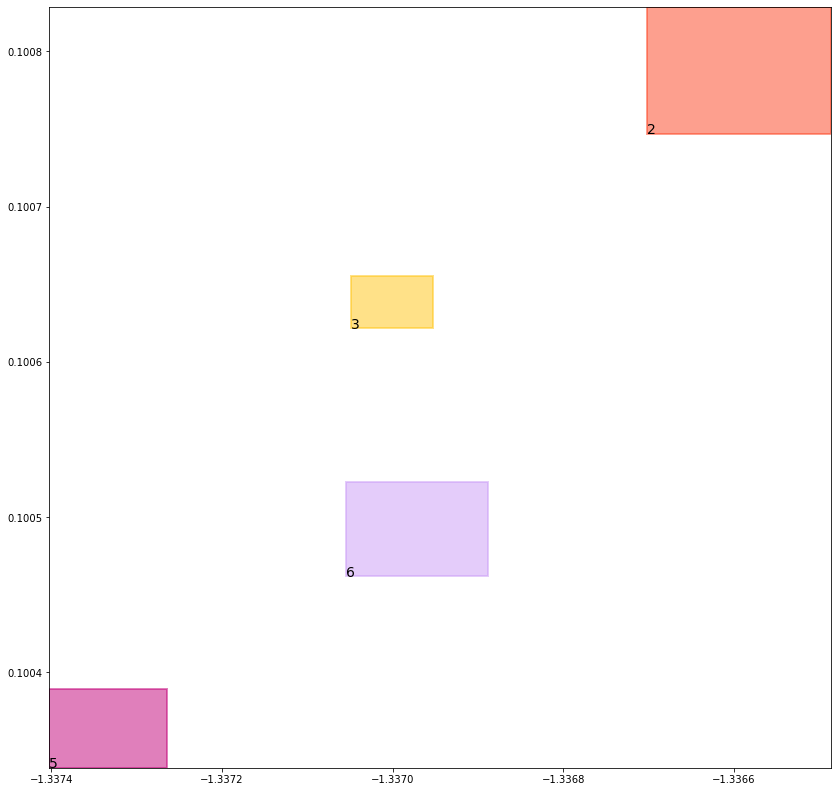

batch (tensor([[4, 6],
        [1, 3],
        [2, 6],
        [3, 5],
        [6, 2],
        [4, 5],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082298582419753, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073474496603012, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510051727294922, grad_fn=<MulBackward0>)
previous loss: tensor(0.2665824890136719, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04080633446574211 0.036375001072883606 tensor(0.9026592969894409) tensor(0.9654967188835144)
tensor(2) 0.466495156288147 0.5018999576568604 tensor(0.4668203294277191) tensor(0.5020169019699097)
tensor(3) 0.4637479782104492 0.5007175207138062 tensor(0.4638649523258209) tensor(0.5019743442535400)
tensor(4) 0.0725780799984932 0.013533319346606731 tensor(0.9688207507133484) tensor(0.9504857659339905)
tensor(5) 0.5240743160247803 0.484854131937027 tensor(0.5256366729736328) tensor(0.4855797588825226)
tensor(6) 0.5288733243942261 0.4850436747074127 tensor(0.5291256904602051) tensor(0.4851489663124084)


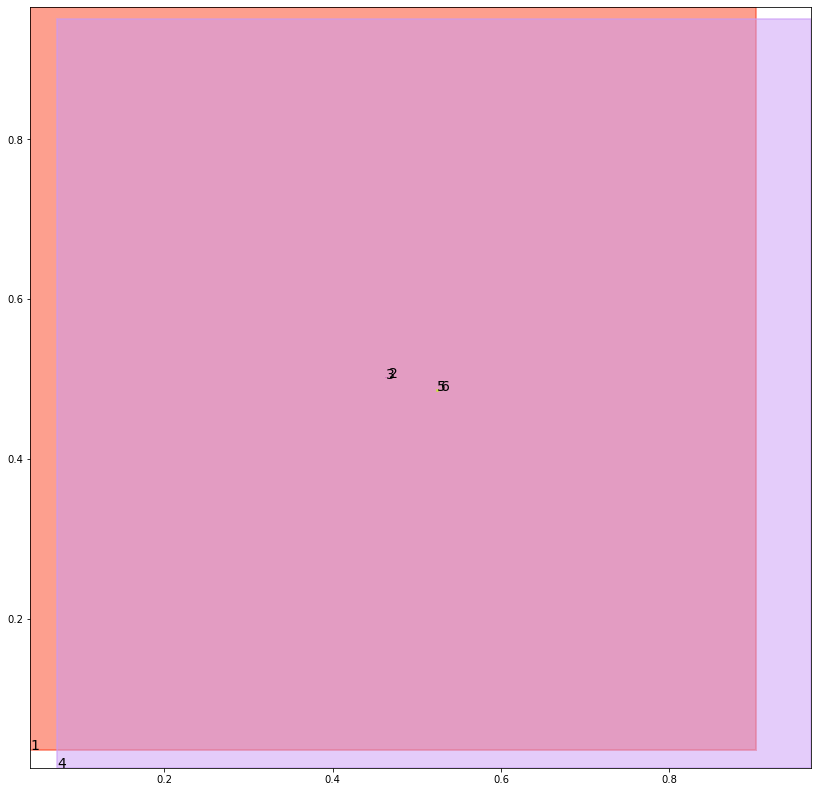

alignment data:
tensor(2) -1.2469381093978882 0.07974730432033539 tensor(-1.2468824386596680) tensor(0.0797678977251053)
tensor(3) -1.2474641799926758 0.0795523077249527 tensor(-1.2471027374267578) tensor(0.0796905905008316)
tensor(5) -1.247668743133545 0.07932738959789276 tensor(-1.2473547458648682) tensor(0.0794440060853958)
tensor(6) -1.2472771406173706 0.07946591079235077 tensor(-1.2472298145294189) tensor(0.0794834047555923)


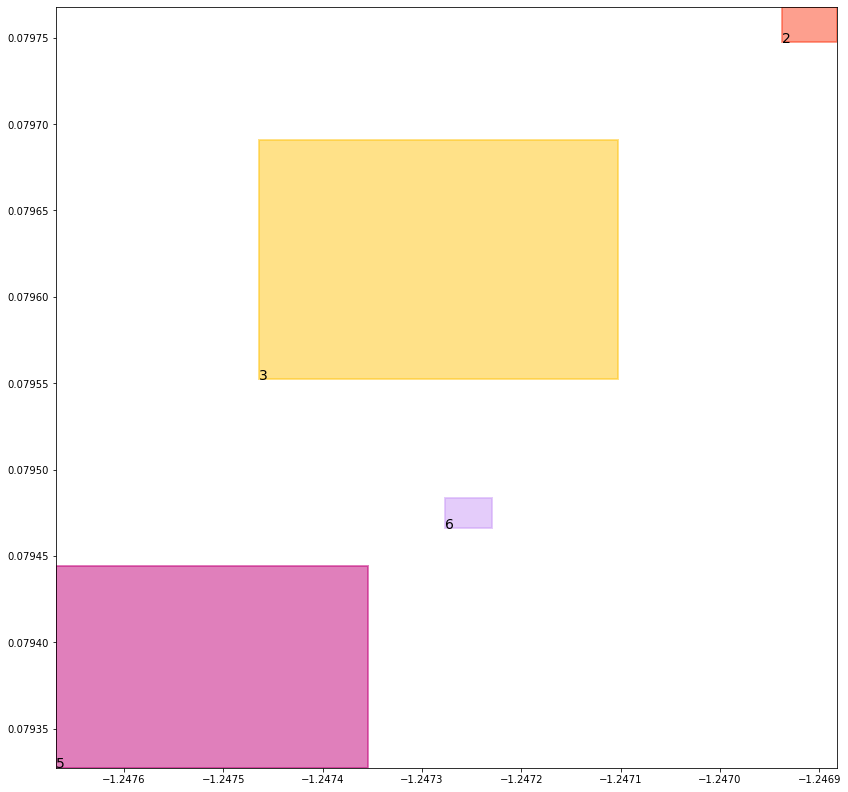

batch (tensor([[6, 2],
        [2, 6],
        [5, 3],
        [4, 5],
        [4, 6],
        [1, 2],
        [3, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082075633108616, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073354113847017, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510032951831818, grad_fn=<MulBackward0>)
previous loss: tensor(0.2665462791919708, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04075195640325546 0.03615270182490349 tensor(0.9030960202217102) tensor(0.9655602574348450)
tensor(2) 0.4667285680770874 0.5010226368904114 tensor(0.4668786227703094) tensor(0.5021004080772400)
tensor(3) 0.4632847011089325 0.5003353953361511 tensor(0.4646738469600677) tensor(0.5021303296089172)
tensor(4) 0.07215023040771484 0.013431243598461151 tensor(0.9688500761985779) tensor(0.9505509138107300)
tensor(5) 0.5234389901161194 0.48472151160240173 tensor(0.5260621905326843) tensor(0.4857561886310577)
tensor(6) 0.5282524824142456 0.4844856858253479 tensor(0.5295172333717346) tensor(0.4851770997047424)


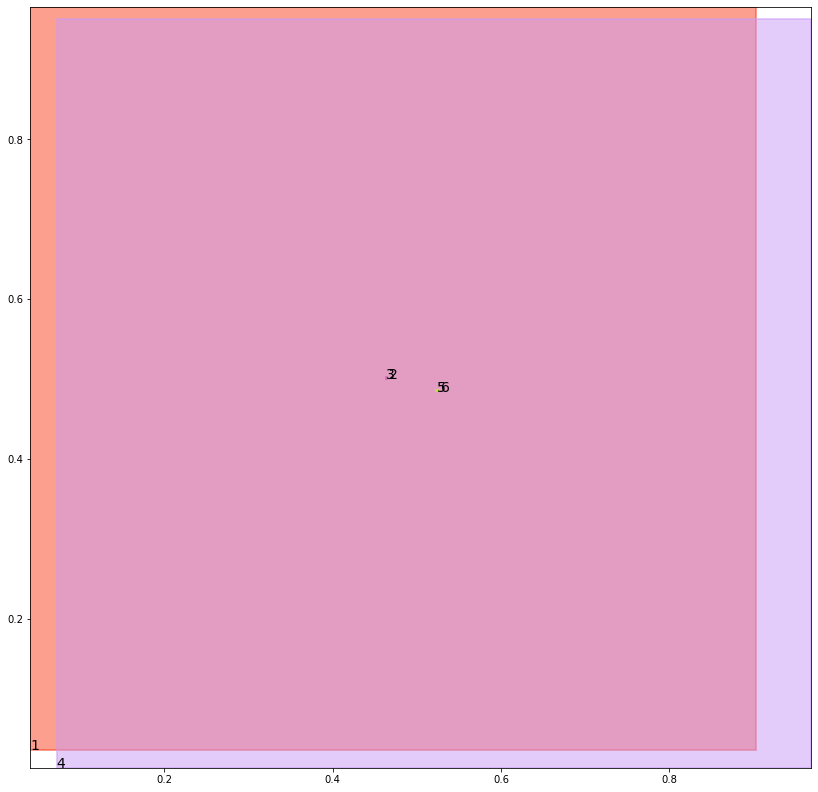

alignment data:
tensor(2) -1.1258809566497803 0.05044002830982208 tensor(-1.1255676746368408) tensor(0.0505596548318863)
tensor(3) -1.1263177394866943 0.0502810925245285 tensor(-1.1257153749465942) tensor(0.0505085140466690)
tensor(5) -1.1264421939849854 0.05008585751056671 tensor(-1.1259660720825195) tensor(0.0502618998289108)
tensor(6) -1.1261677742004395 0.050179287791252136 tensor(-1.1258839368820190) tensor(0.0502848923206329)


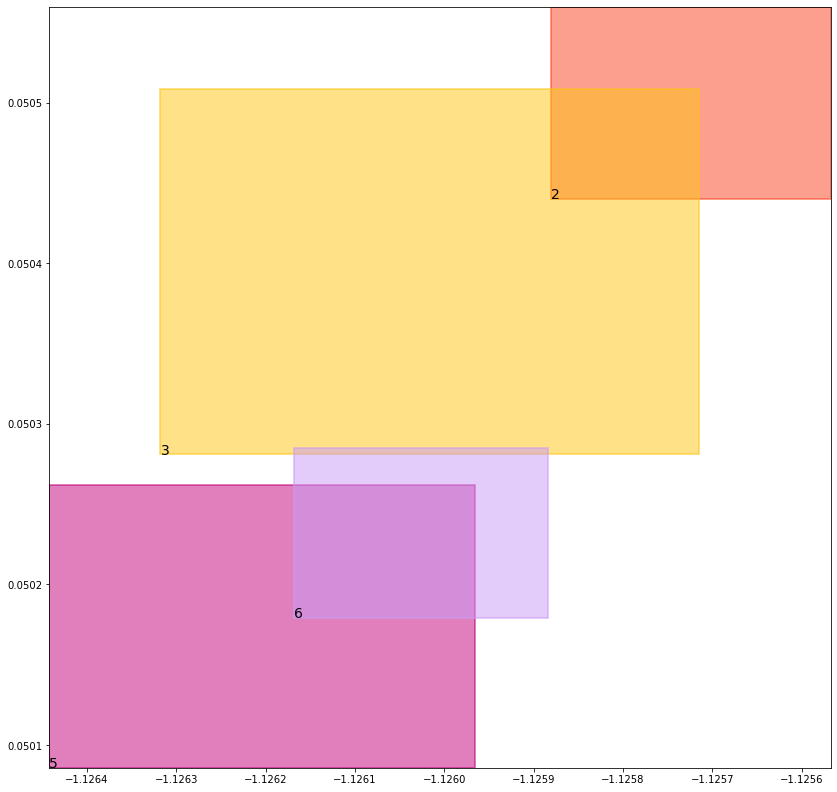

batch (tensor([[4, 6],
        [1, 2],
        [3, 5],
        [1, 3],
        [4, 5],
        [6, 2],
        [5, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082157962024212, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073506920598447, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509953975677490, grad_fn=<MulBackward0>)
previous loss: tensor(0.2665618956089020, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040697719901800156 0.03593253716826439 tensor(0.9035296440124512) tensor(0.9656236171722412)
tensor(2) 0.46695223450660706 0.5005746483802795 tensor(0.4673112034797668) tensor(0.5021023154258728)
tensor(3) 0.4630972743034363 0.5003039240837097 tensor(0.4652808606624603) tensor(0.5019401907920837)
tensor(4) 0.0717264860868454 0.01333045307546854 tensor(0.9688792824745178) tensor(0.9506158828735352)
tensor(5) 0.5232582688331604 0.4847356379032135 tensor(0.5257308483123779) tensor(0.4854462444782257)
tensor(6) 0.5276782512664795 0.484365850687027 tensor(0.5296801924705505) tensor(0.4851403236389160)


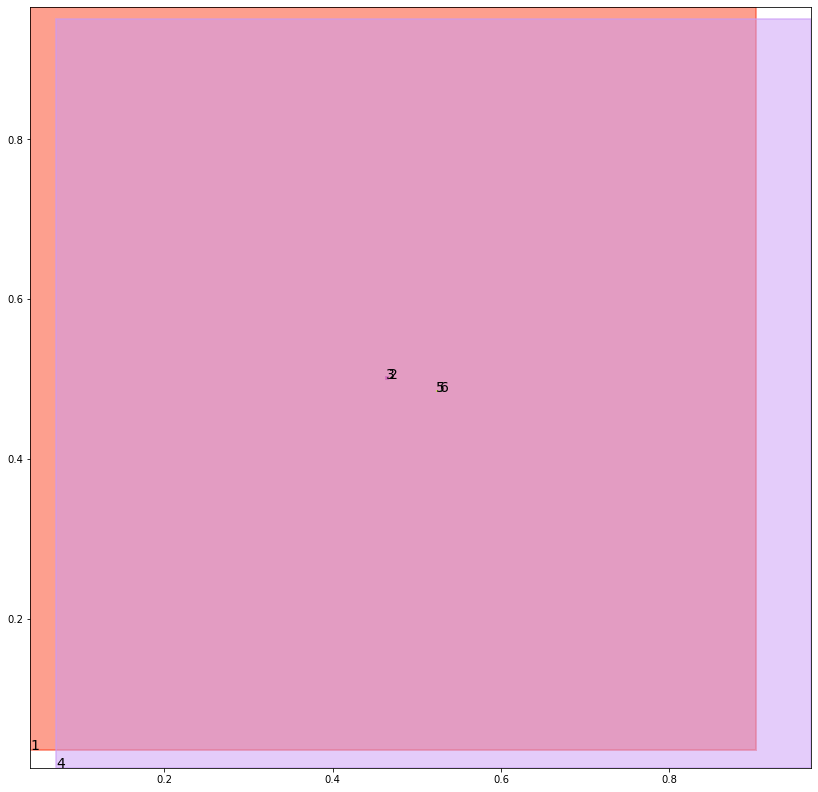

alignment data:
tensor(2) -1.005859136581421 0.022715121507644653 tensor(-1.0054051876068115) tensor(0.0228882133960724)
tensor(3) -1.0062090158462524 0.02259059250354767 tensor(-1.0055948495864868) tensor(0.0228205323219299)
tensor(5) -1.006299614906311 0.02240702509880066 tensor(-1.0059244632720947) tensor(0.0225446224212646)
tensor(6) -1.0060890913009644 0.02247673273086548 tensor(-1.0057296752929688) tensor(0.0226095020771027)


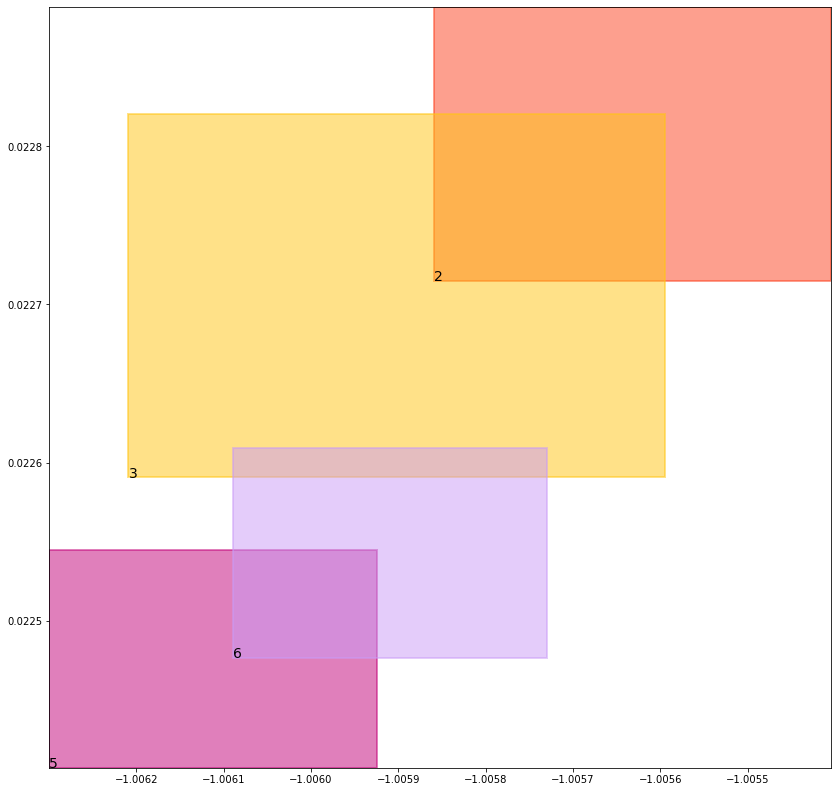

batch (tensor([[4, 6],
        [6, 2],
        [1, 2],
        [4, 5],
        [1, 3],
        [5, 3],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0082129109650850, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073422258719802, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509943842887878, grad_fn=<MulBackward0>)
previous loss: tensor(0.2665495276451111, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040643610060214996 0.03571445494890213 tensor(0.9039604067802429) tensor(0.9656868577003479)
tensor(2) 0.46723654866218567 0.5006244778633118 tensor(0.4673216044902802) tensor(0.5019243955612183)
tensor(3) 0.4632658064365387 0.500589907169342 tensor(0.4655987918376923) tensor(0.5014361143112183)
tensor(4) 0.07130676507949829 0.013230917975306511 tensor(0.9689084887504578) tensor(0.9506809115409851)
tensor(5) 0.5234878063201904 0.4847007393836975 tensor(0.5247179269790649) tensor(0.4848822951316833)
tensor(6) 0.527374804019928 0.48473629355430603 tensor(0.5294076204299927) tensor(0.4849497377872467)


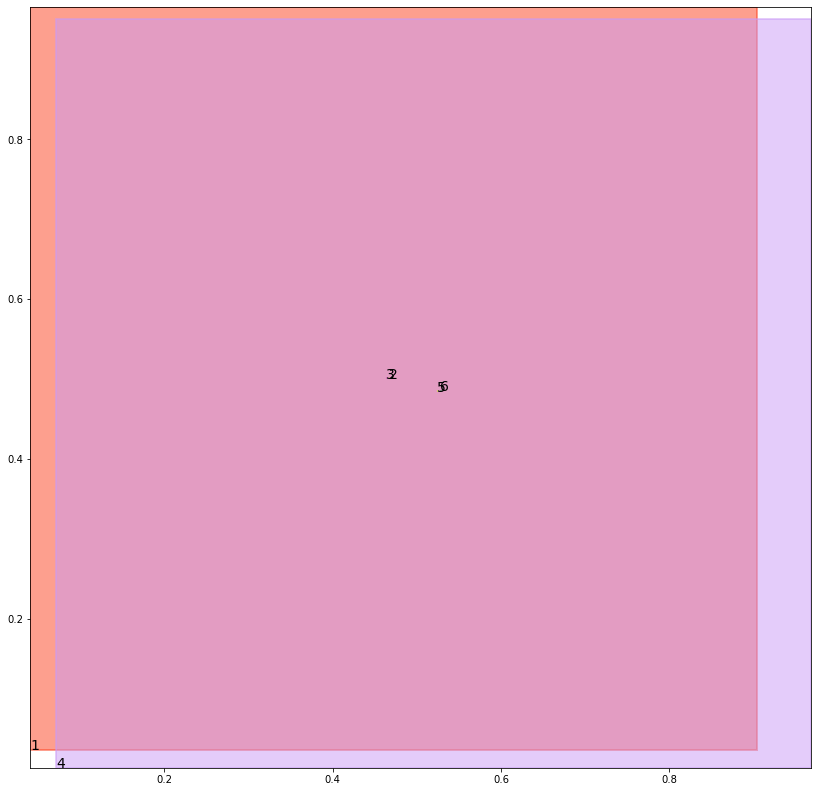

alignment data:
tensor(2) -0.8837833404541016 -0.0022222399711608887 tensor(-0.8834129571914673) tensor(-0.0020805448293686)
tensor(3) -0.8840762376785278 -0.002324625849723816 tensor(-0.8836725950241089) tensor(-0.0021757930517197)
tensor(5) -0.884232759475708 -0.002535015344619751 tensor(-0.8840941190719604) tensor(-0.0024849623441696)
tensor(6) -0.8839455842971802 -0.0024346262216567993 tensor(-0.8837406635284424) tensor(-0.0023611932992935)


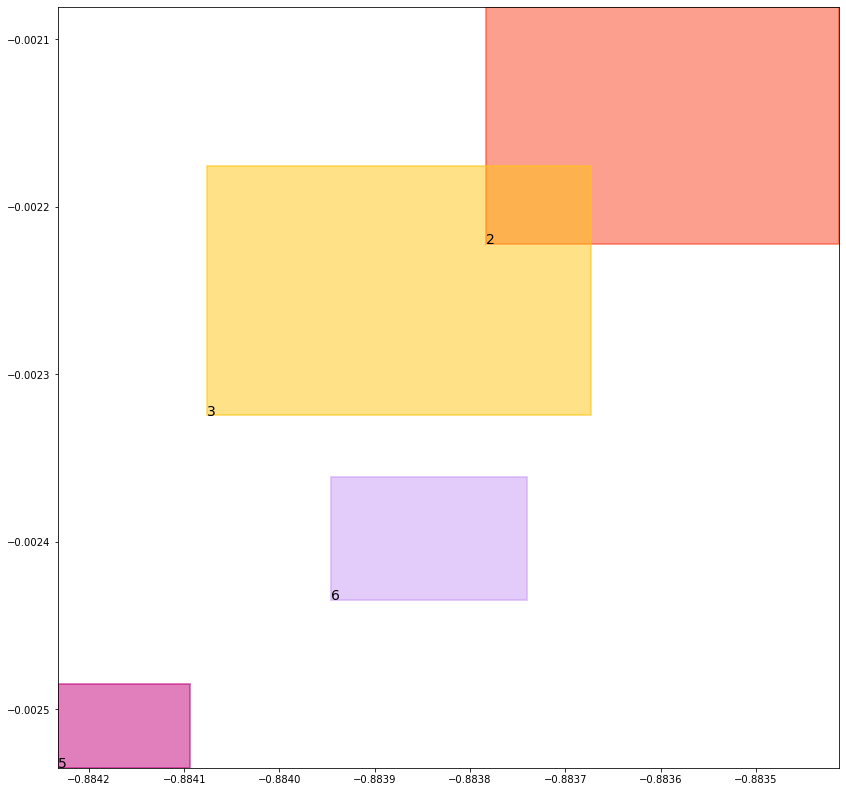

batch (tensor([[4, 6],
        [5, 3],
        [1, 3],
        [1, 2],
        [2, 6],
        [6, 2],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0081868302077055, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0073098931461573, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510005235671997, grad_fn=<MulBackward0>)
previous loss: tensor(0.2664972543716431, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04058963060379028 0.03549849987030029 tensor(0.9043881297111511) tensor(0.9657499194145203)
tensor(2) 0.46738213300704956 0.5011252760887146 tensor(0.4678344726562500) tensor(0.5015840530395508)
tensor(3) 0.46375569701194763 0.5006481409072876 tensor(0.4656550884246826) tensor(0.5011599659919739)
tensor(4) 0.07089109718799591 0.013132642954587936 tensor(0.9689375758171082) tensor(0.9507458209991455)
tensor(5) 0.5230962038040161 0.4844701290130615 tensor(0.5240863561630249) tensor(0.4848743379116058)
tensor(6) 0.5273160934448242 0.48462024331092834 tensor(0.5287420749664307) tensor(0.4855454862117767)


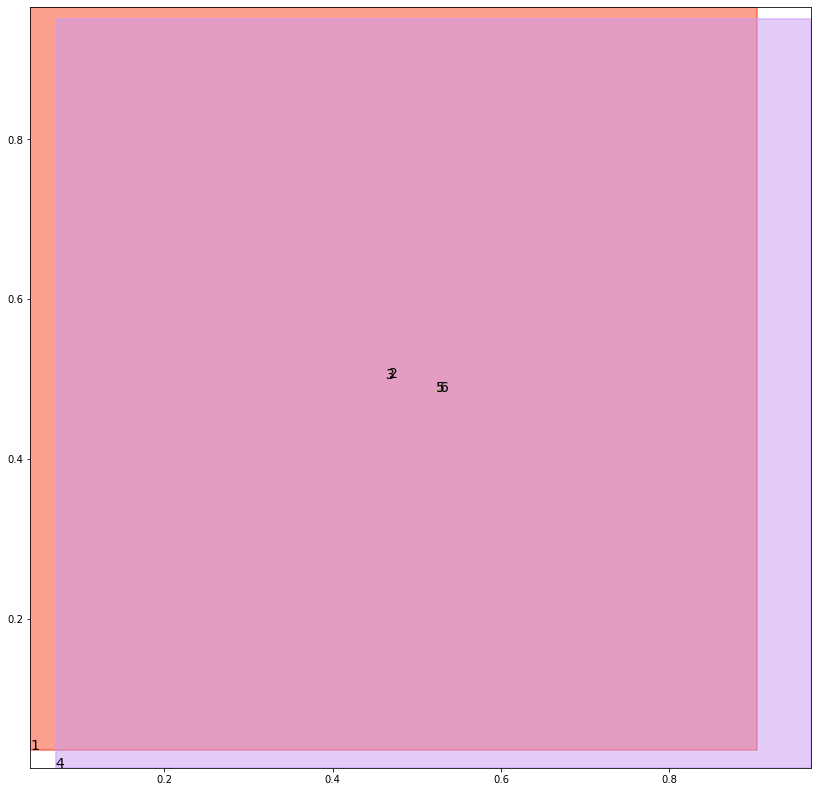

alignment data:
tensor(2) -0.8068298697471619 -0.015321016311645508 tensor(-0.8066691756248474) tensor(-0.0152605175971985)
tensor(3) -0.8072231411933899 -0.015462607145309448 tensor(-0.8069439530372620) tensor(-0.0153603553771973)
tensor(5) -0.8075042366981506 -0.015719741582870483 tensor(-0.8073201775550842) tensor(-0.0156516730785370)
tensor(6) -0.807159960269928 -0.01559843122959137 tensor(-0.8067987561225891) tensor(-0.0154636204242706)


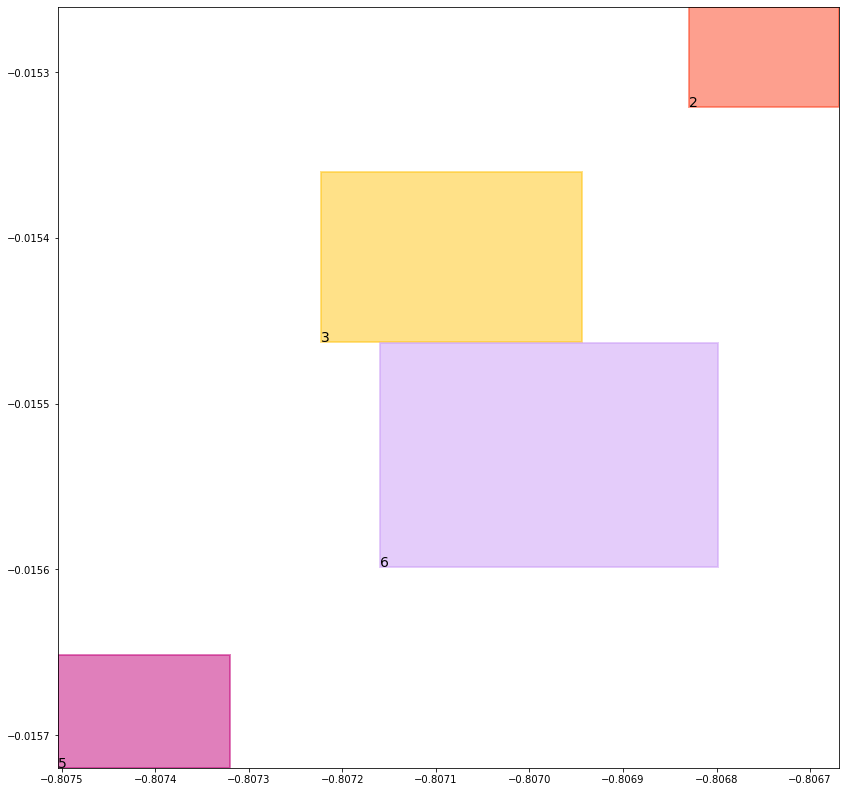

batch (tensor([[1, 3],
        [6, 2],
        [5, 3],
        [4, 5],
        [4, 6],
        [1, 2],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0081601180136204, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072972839698195, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510015964508057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2664589881896973, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040535785257816315 0.035284727811813354 tensor(0.9048129916191101) tensor(0.9658129215240479)
tensor(2) 0.4677395820617676 0.5010997653007507 tensor(0.4677736759185791) tensor(0.5020250678062439)
tensor(3) 0.46453458070755005 0.5002499222755432 tensor(0.4654755294322968) tensor(0.5013469457626343)
tensor(4) 0.07047943770885468 0.013035591691732407 tensor(0.9689666628837585) tensor(0.9508106708526611)
tensor(5) 0.5222874283790588 0.48471036553382874 tensor(0.5242037773132324) tensor(0.4847261011600494)
tensor(6) 0.5274784564971924 0.4844752848148346 tensor(0.5277227759361267) tensor(0.4857662618160248)


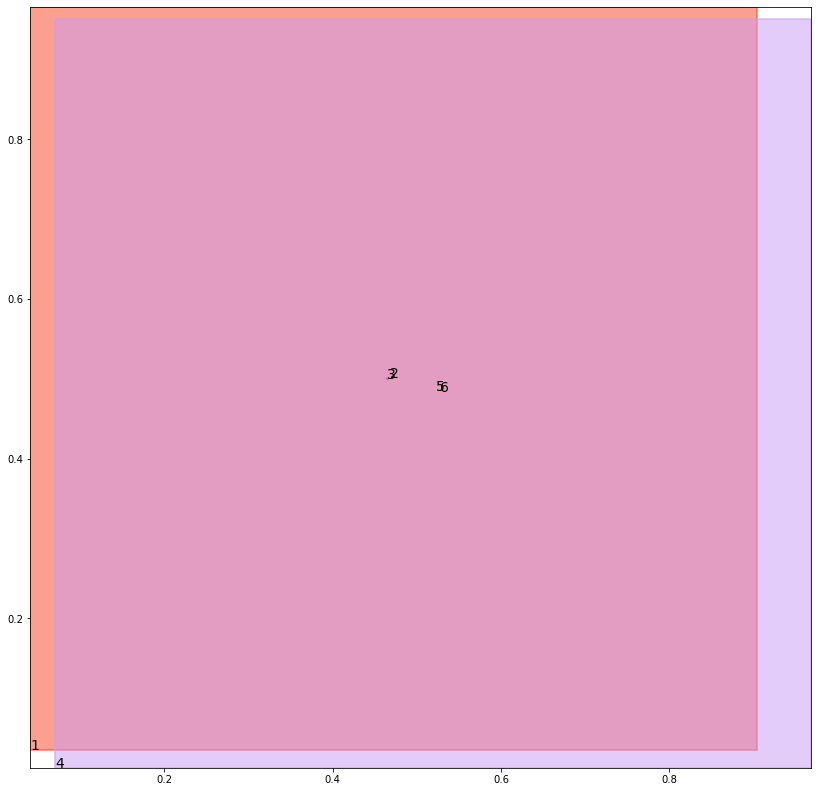

alignment data:
tensor(2) -0.7356544137001038 -0.02394118905067444 tensor(-0.7353931069374084) tensor(-0.0238411426544189)
tensor(3) -0.7361224293708801 -0.02411244809627533 tensor(-0.7357478737831116) tensor(-0.0239712744951248)
tensor(5) -0.7363198399543762 -0.024334535002708435 tensor(-0.7361777424812317) tensor(-0.0242849439382553)
tensor(6) -0.7360125184059143 -0.02422994375228882 tensor(-0.7356337904930115) tensor(-0.0240854173898697)


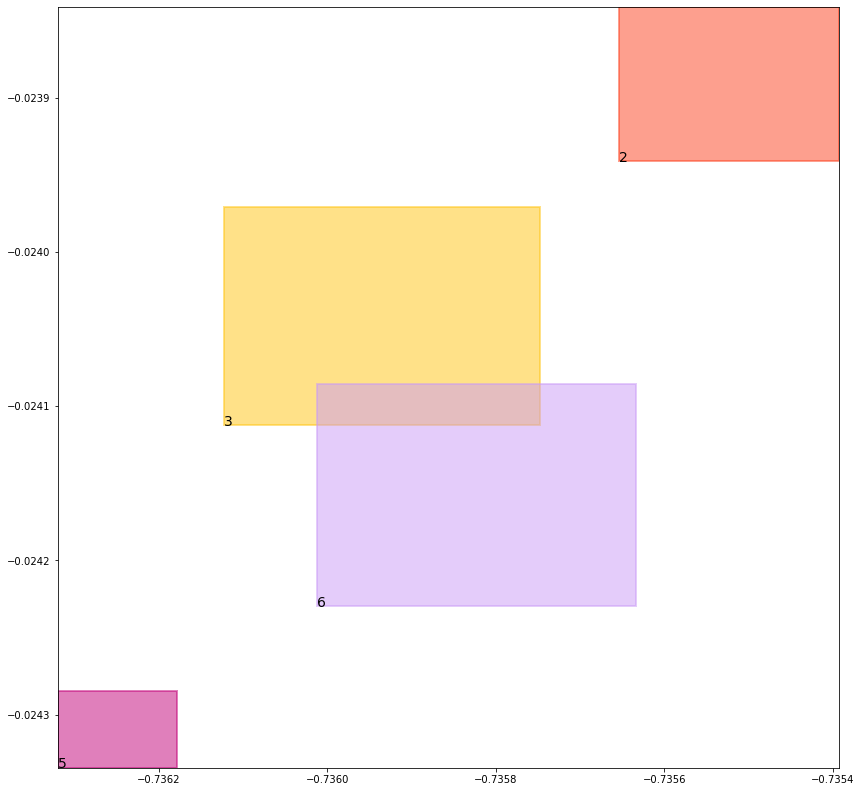

batch (tensor([[4, 6],
        [2, 6],
        [1, 2],
        [3, 5],
        [5, 3],
        [1, 3],
        [6, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0081374626606703, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072826044633985, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510001957416534, grad_fn=<MulBackward0>)
previous loss: tensor(0.2664202749729156, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04048209637403488 0.03507307544350624 tensor(0.9052348136901855) tensor(0.9658755660057068)
tensor(2) 0.46711936593055725 0.50082927942276 tensor(0.4683644771575928) tensor(0.5023548603057861)
tensor(3) 0.46508365869522095 0.5002069473266602 tensor(0.4655726552009583) tensor(0.5011855363845825)
tensor(4) 0.07007171958684921 0.012939753010869026 tensor(0.9689956307411194) tensor(0.9508755803108215)
tensor(5) 0.5222163796424866 0.48445165157318115 tensor(0.5238858461380005) tensor(0.4853723049163818)
tensor(6) 0.5263876914978027 0.48449766635894775 tensor(0.5278398394584656) tensor(0.4854569137096405)


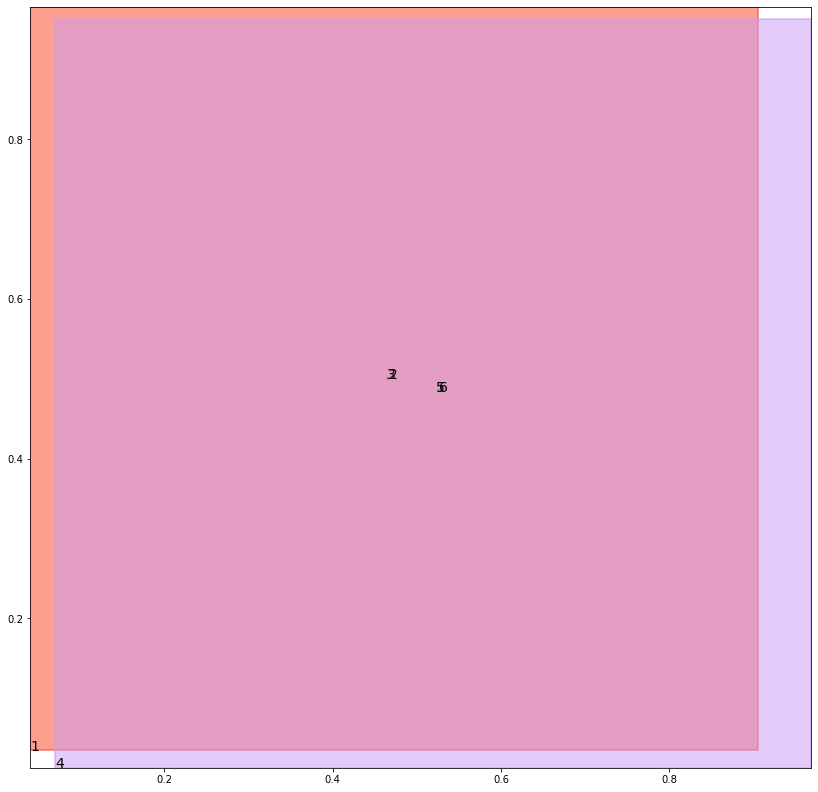

alignment data:
tensor(2) -0.679473876953125 -0.027296945452690125 tensor(-0.6789574623107910) tensor(-0.0271022766828537)
tensor(3) -0.6797946691513062 -0.027414709329605103 tensor(-0.6794857978820801) tensor(-0.0272975713014603)
tensor(5) -0.6800787448883057 -0.027669548988342285 tensor(-0.6797010898590088) tensor(-0.0275290459394455)
tensor(6) -0.679764986038208 -0.02756001055240631 tensor(-0.6793920993804932) tensor(-0.0274208188056946)


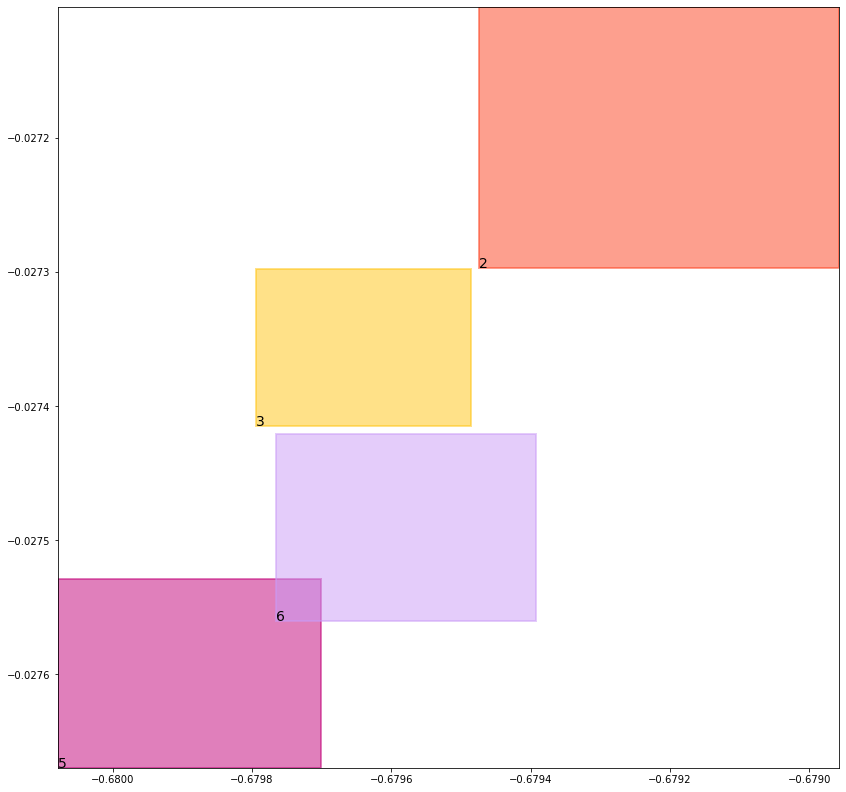

batch (tensor([[6, 2],
        [1, 2],
        [5, 3],
        [2, 6],
        [4, 5],
        [4, 6],
        [1, 3],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0081336470320821, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072847655974329, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509965896606445, grad_fn=<MulBackward0>)
previous loss: tensor(0.2664149999618530, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040428534150123596 0.03486351668834686 tensor(0.9056536555290222) tensor(0.9659382700920105)
tensor(2) 0.46719786524772644 0.5007532238960266 tensor(0.4686537683010101) tensor(0.5021612048149109)
tensor(3) 0.46499869227409363 0.5004833340644836 tensor(0.4662252962589264) tensor(0.5007140040397644)
tensor(4) 0.069667749106884 0.012845099903643131 tensor(0.9690245389938354) tensor(0.9509403109550476)
tensor(5) 0.5228108763694763 0.48434123396873474 tensor(0.5231744050979614) tensor(0.4854968488216400)
tensor(6) 0.5255368947982788 0.4846707582473755 tensor(0.5279119014739990) tensor(0.4846768081188202)


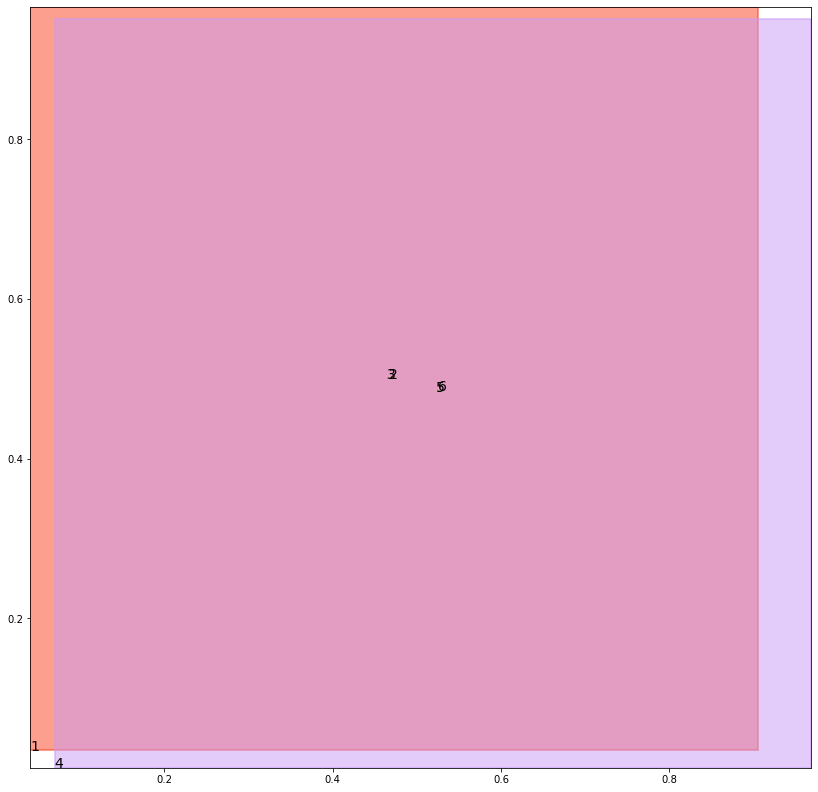

alignment data:
tensor(2) -0.6226668953895569 -0.03980012238025665 tensor(-0.6221681237220764) tensor(-0.0396127104759216)
tensor(3) -0.6229013800621033 -0.03988437354564667 tensor(-0.6227481961250305) tensor(-0.0398288220167160)
tensor(5) -0.623227059841156 -0.04015806317329407 tensor(-0.6228777766227722) tensor(-0.0400251597166061)
tensor(6) -0.6229376196861267 -0.040054187178611755 tensor(-0.6227641701698303) tensor(-0.0399937480688095)


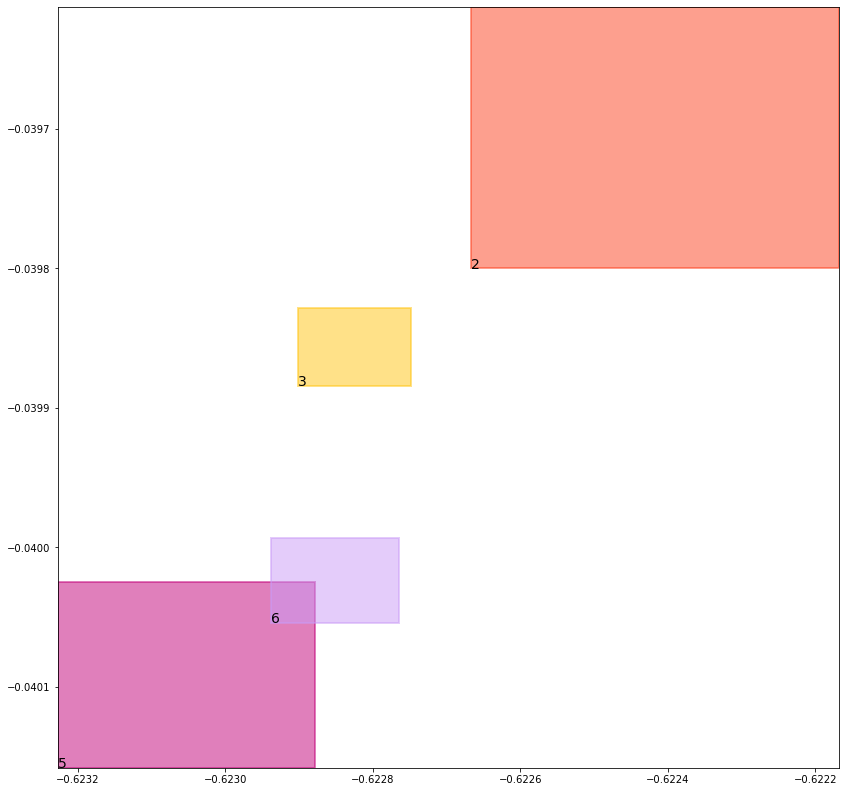

batch (tensor([[4, 6],
        [3, 5],
        [1, 2],
        [6, 2],
        [4, 5],
        [1, 3],
        [5, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0081212390214205, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072640217840672, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510000765323639, grad_fn=<MulBackward0>)
previous loss: tensor(0.2663853466510773, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04037509858608246 0.03465605154633522 tensor(0.9060696959495544) tensor(0.9660006761550903)
tensor(2) 0.46793845295906067 0.5008530020713806 tensor(0.4686391949653625) tensor(0.5014904737472534)
tensor(3) 0.4651912748813629 0.4999655485153198 tensor(0.4665285050868988) tensor(0.5010459423065186)
tensor(4) 0.06926754862070084 0.012751622125506401 tensor(0.9690533876419067) tensor(0.9510051608085632)
tensor(5) 0.5221093893051147 0.48437970876693726 tensor(0.5240007042884827) tensor(0.4851319193840027)
tensor(6) 0.5251259803771973 0.48348212242126465 tensor(0.5277225375175476) tensor(0.4849796593189240)


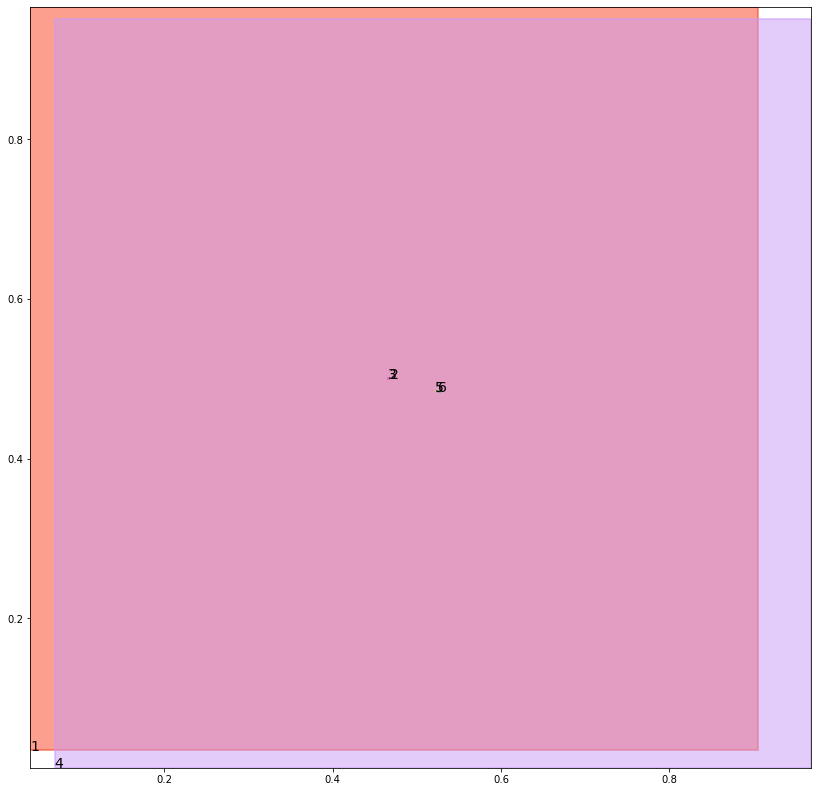

alignment data:
tensor(2) -0.5544764399528503 -0.06529287993907928 tensor(-0.5542475581169128) tensor(-0.0652069598436356)
tensor(3) -0.5549237132072449 -0.06545719504356384 tensor(-0.5545248389244080) tensor(-0.0653078109025955)
tensor(5) -0.5551407933235168 -0.06568828225135803 tensor(-0.5547935366630554) tensor(-0.0655599981546402)
tensor(6) -0.5551723837852478 -0.06570817530155182 tensor(-0.5545656085014343) tensor(-0.0654823631048203)


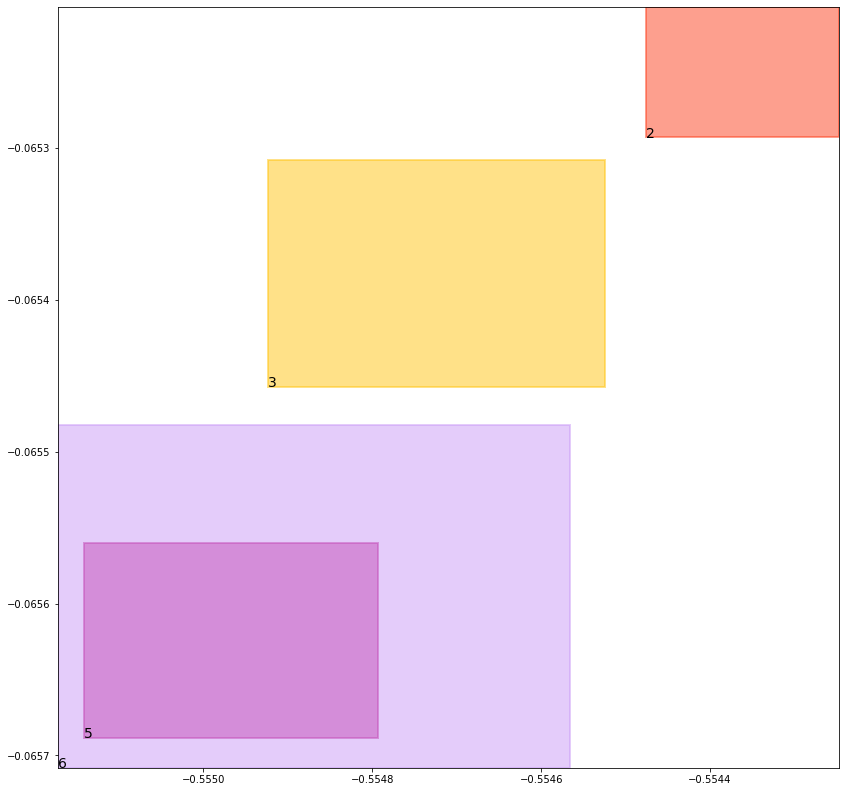

batch (tensor([[3, 5],
        [5, 3],
        [4, 5],
        [4, 6],
        [1, 2],
        [6, 2],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080984644591808, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072777410969138, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509966492652893, grad_fn=<MulBackward0>)
previous loss: tensor(0.2663728594779968, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04032179340720177 0.03445063903927803 tensor(0.9064828753471375) tensor(0.9660630822181702)
tensor(2) 0.4683516025543213 0.500400722026825 tensor(0.4692705869674683) tensor(0.5011067986488342)
tensor(3) 0.4656347334384918 0.49960383772850037 tensor(0.4665153622627258) tensor(0.5012218952178955)
tensor(4) 0.06887098401784897 0.012659250758588314 tensor(0.9690821766853333) tensor(0.9510698318481445)
tensor(5) 0.5215421319007874 0.48433104157447815 tensor(0.5243637561798096) tensor(0.4845517277717590)
tensor(6) 0.525114893913269 0.48290926218032837 tensor(0.5272964835166931) tensor(0.4850993752479553)


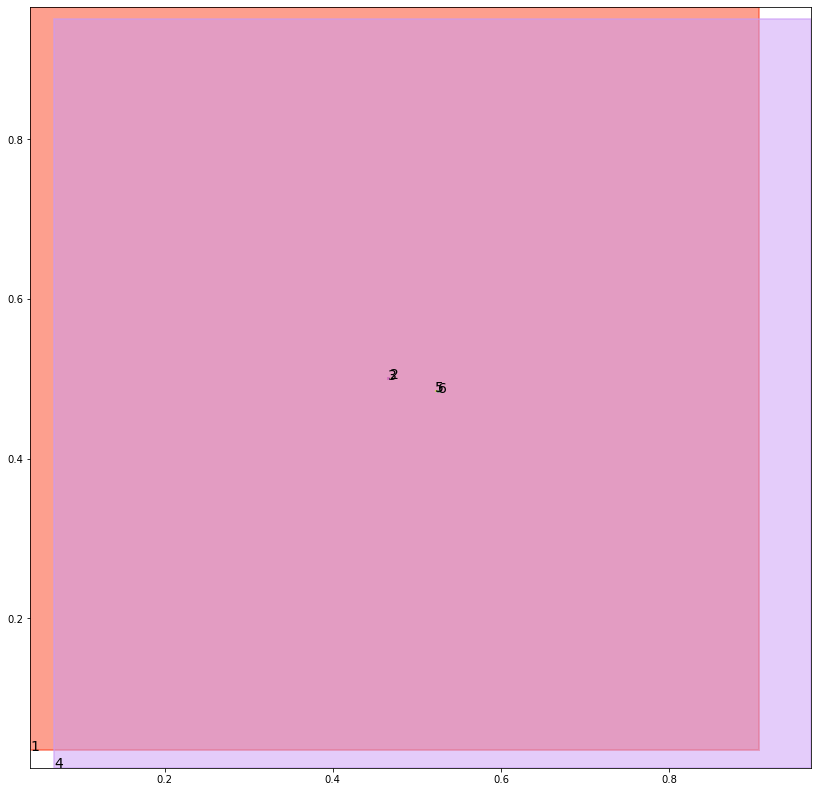

alignment data:
tensor(2) -0.49964624643325806 -0.08756239712238312 tensor(-0.4993823170661926) tensor(-0.0874636024236679)
tensor(3) -0.5000665783882141 -0.08771646022796631 tensor(-0.4995508790016174) tensor(-0.0875210613012314)
tensor(5) -0.5002519488334656 -0.08793413639068604 tensor(-0.4999848008155823) tensor(-0.0878390967845917)
tensor(6) -0.5003882050514221 -0.08799576759338379 tensor(-0.4996181130409241) tensor(-0.0877062529325485)


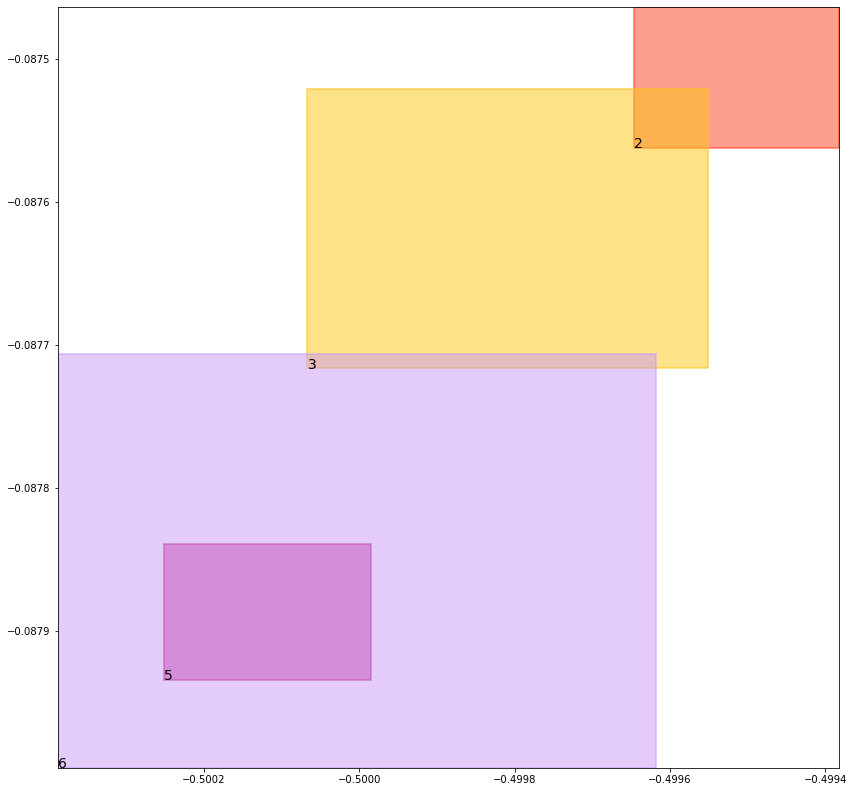

batch (tensor([[1, 3],
        [3, 5],
        [4, 6],
        [1, 2],
        [2, 6],
        [6, 2],
        [4, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080852750688791, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072724875062704, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509946227073669, grad_fn=<MulBackward0>)
previous loss: tensor(0.2663523852825165, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04026864469051361 0.03424718603491783 tensor(0.9068931937217712) tensor(0.9661253094673157)
tensor(2) 0.46839386224746704 0.49985751509666443 tensor(0.4698683619499207) tensor(0.5011565089225769)
tensor(3) 0.4662168323993683 0.49959346652030945 tensor(0.4663041234016418) tensor(0.5010439753532410)
tensor(4) 0.06847798824310303 0.012567948549985886 tensor(0.9691110849380493) tensor(0.9511344432830811)
tensor(5) 0.5214259028434753 0.4840586185455322 tensor(0.5239782333374023) tensor(0.4845656156539917)
tensor(6) 0.5254643559455872 0.48290374875068665 tensor(0.5266569852828979) tensor(0.4850467443466187)


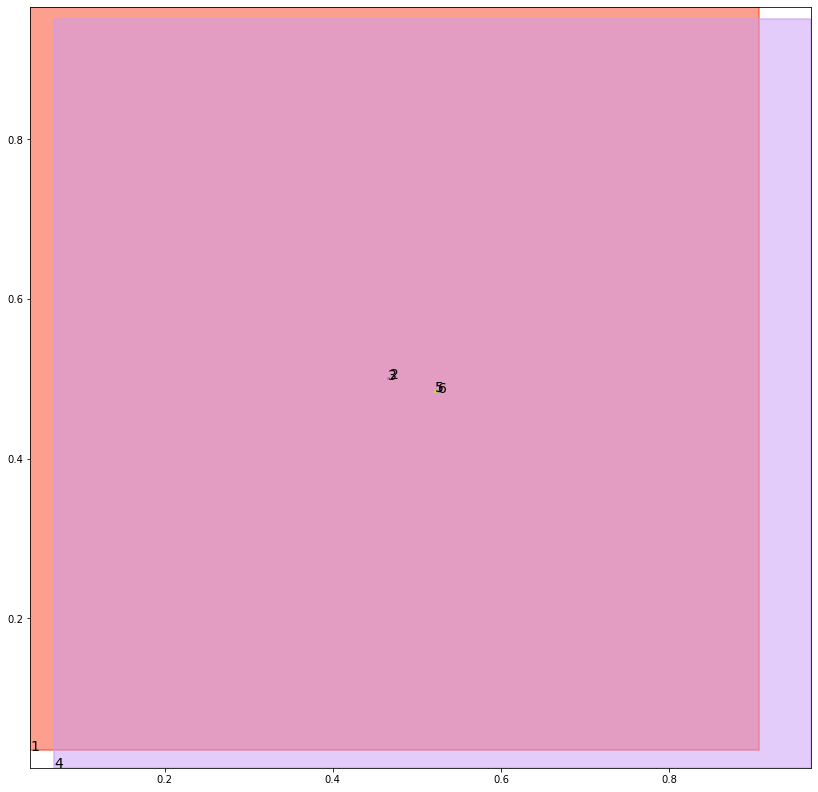

alignment data:
tensor(2) -0.4555312395095825 -0.10876689851284027 tensor(-0.4550612568855286) tensor(-0.1085904985666275)
tensor(3) -0.45576417446136475 -0.10885044932365417 tensor(-0.4553534388542175) tensor(-0.1086931079626083)
tensor(5) -0.4560559391975403 -0.1091088354587555 tensor(-0.4557276964187622) tensor(-0.1089897602796555)
tensor(6) -0.45608240365982056 -0.10912971198558807 tensor(-0.4553977251052856) tensor(-0.1088702529668808)


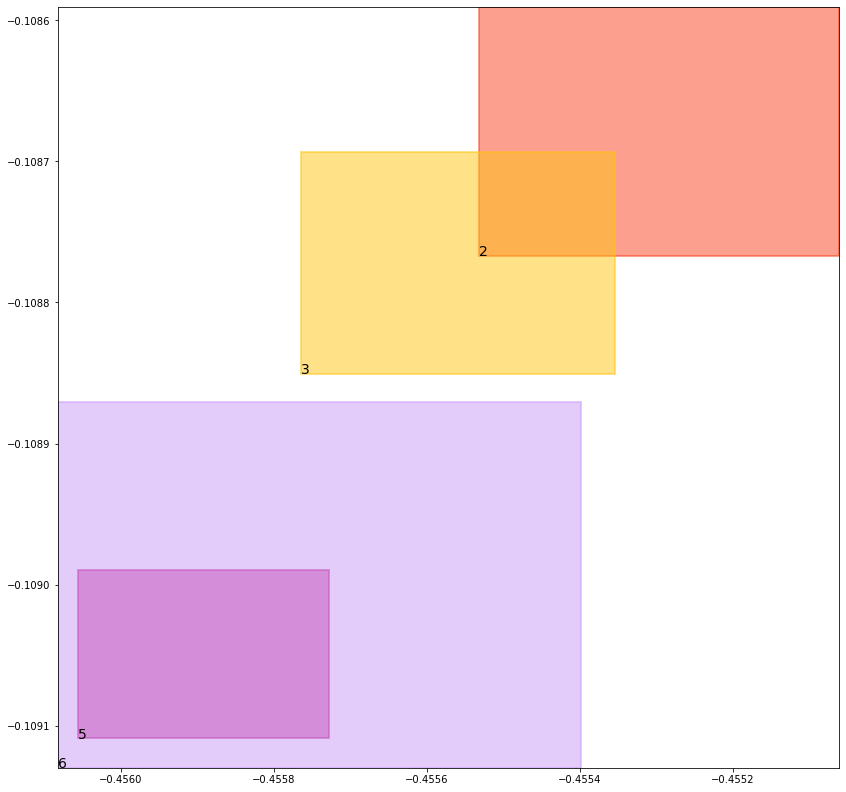

batch (tensor([[4, 5],
        [2, 6],
        [4, 6],
        [3, 5],
        [5, 3],
        [1, 2],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080706141889095, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072513837367296, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509939670562744, grad_fn=<MulBackward0>)
previous loss: tensor(0.2663159668445587, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040215641260147095 0.03404564782977104 tensor(0.9073007106781006) tensor(0.9661872982978821)
tensor(2) 0.46873489022254944 0.4998167157173157 tensor(0.4697999060153961) tensor(0.5010205507278442)
tensor(3) 0.466280072927475 0.49989810585975647 tensor(0.4666785597801208) tensor(0.5005478858947754)
tensor(4) 0.06808866560459137 0.012477696873247623 tensor(0.9691397547721863) tensor(0.9511989951133728)
tensor(5) 0.5217169523239136 0.4842686951160431 tensor(0.5229181647300720) tensor(0.4844357073307037)
tensor(6) 0.5258260369300842 0.4834049940109253 tensor(0.5261365771293640) tensor(0.4848394095897675)


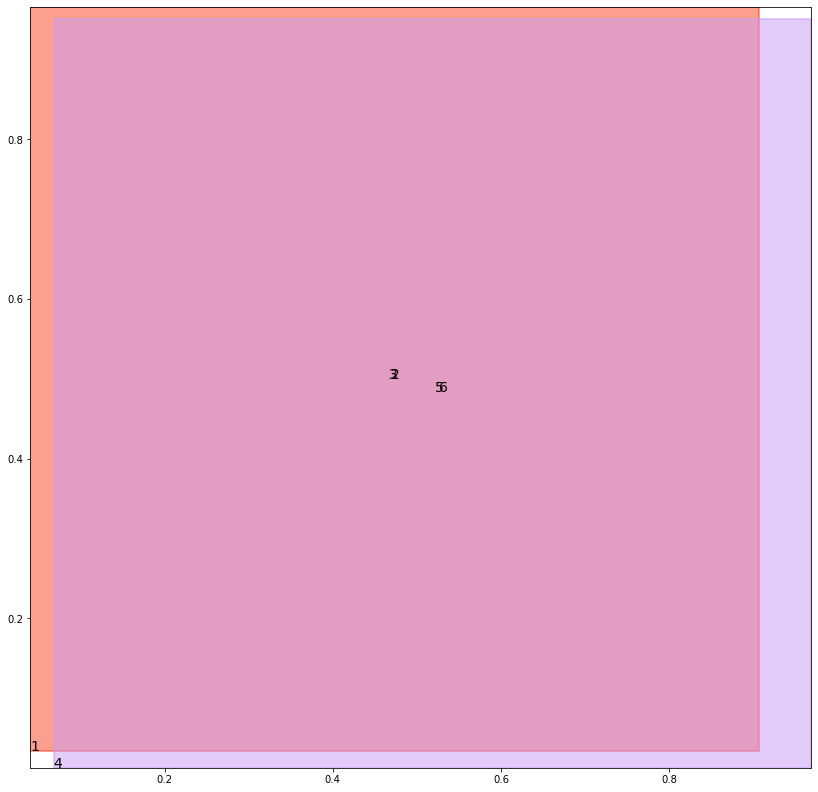

alignment data:
tensor(2) -0.4150847792625427 -0.13491512835025787 tensor(-0.4146711230278015) tensor(-0.1347592771053314)
tensor(3) -0.41524237394332886 -0.13496901094913483 tensor(-0.4150320291519165) tensor(-0.1348893791437149)
tensor(5) -0.4155260920524597 -0.1352270543575287 tensor(-0.4153913855552673) tensor(-0.1351785659790039)
tensor(6) -0.4154650568962097 -0.1352146714925766 tensor(-0.4150425791740417) tensor(-0.1350533962249756)


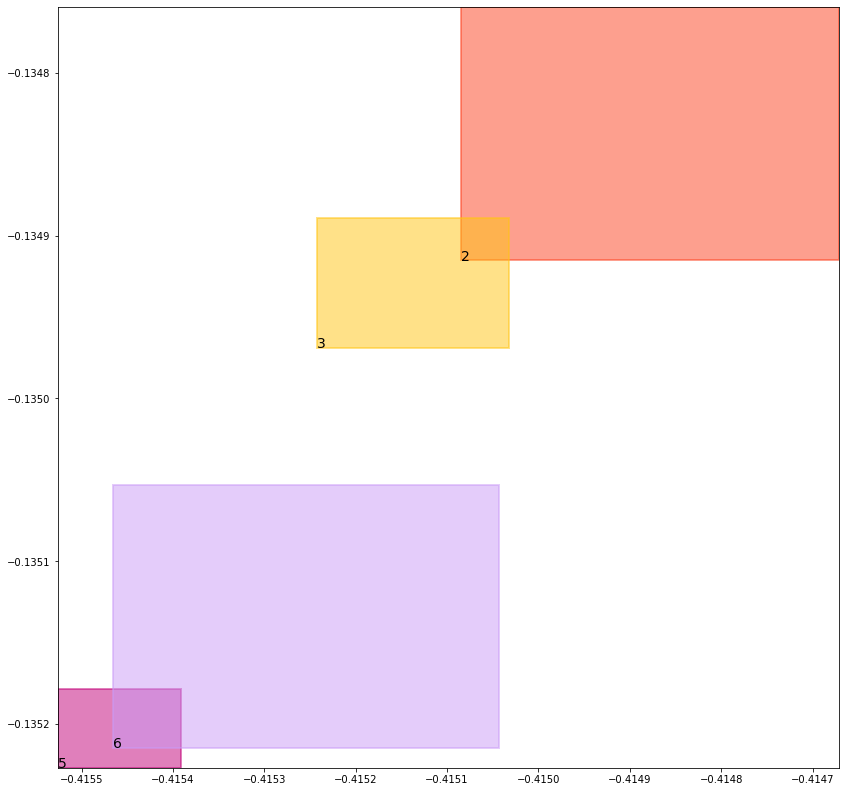

batch (tensor([[6, 2],
        [4, 5],
        [3, 5],
        [4, 6],
        [1, 2],
        [2, 6],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080472100526094, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072116688825190, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999573230743, grad_fn=<MulBackward0>)
previous loss: tensor(0.2662588357925415, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04016277566552162 0.033846039324998856 tensor(0.9077055454254150) tensor(0.9662491679191589)
tensor(2) 0.4691316485404968 0.5002347826957703 tensor(0.4693456888198853) tensor(0.5007165670394897)
tensor(3) 0.466670423746109 0.49976658821105957 tensor(0.4667860865592957) tensor(0.5004858970642090)
tensor(4) 0.06770316511392593 0.012388515286147594 tensor(0.9691684246063232) tensor(0.9512635469436646)
tensor(5) 0.521255373954773 0.4841759502887726 tensor(0.5223739743232727) tensor(0.4849134981632233)
tensor(6) 0.5252927541732788 0.484355092048645 tensor(0.5263300538063049) tensor(0.4844928383827209)


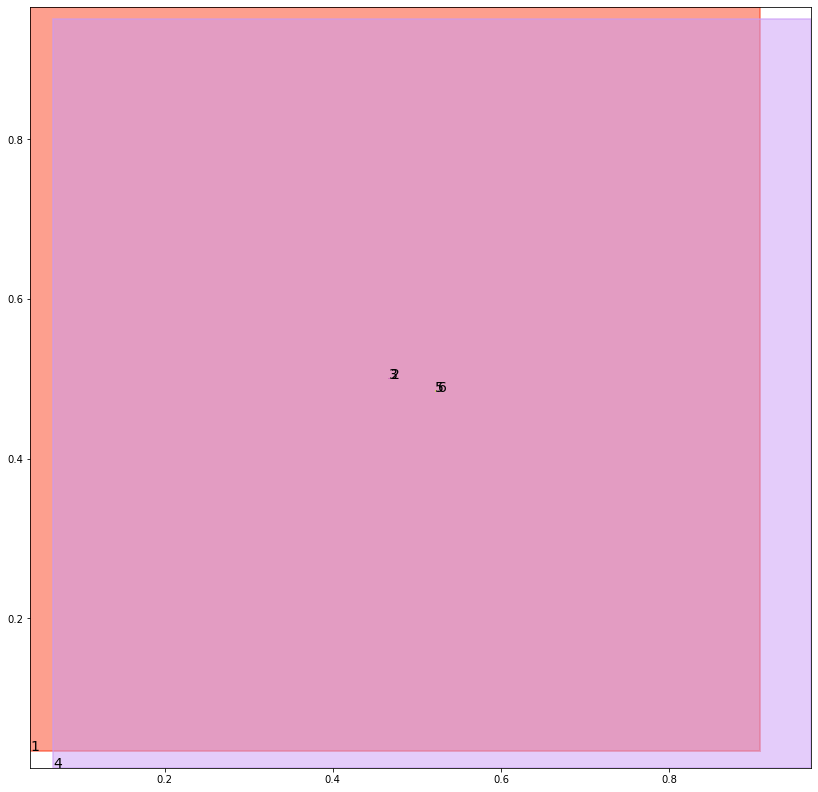

alignment data:
tensor(2) -0.39037376642227173 -0.1587706208229065 tensor(-0.3902238607406616) tensor(-0.1587136238813400)
tensor(3) -0.3906856179237366 -0.15888360142707825 tensor(-0.3904768228530884) tensor(-0.1588037461042404)
tensor(5) -0.39100390672683716 -0.1591547280550003 tensor(-0.3907159566879272) tensor(-0.1590472757816315)
tensor(6) -0.39065635204315186 -0.15903231501579285 tensor(-0.3905414342880249) tensor(-0.1589910686016083)


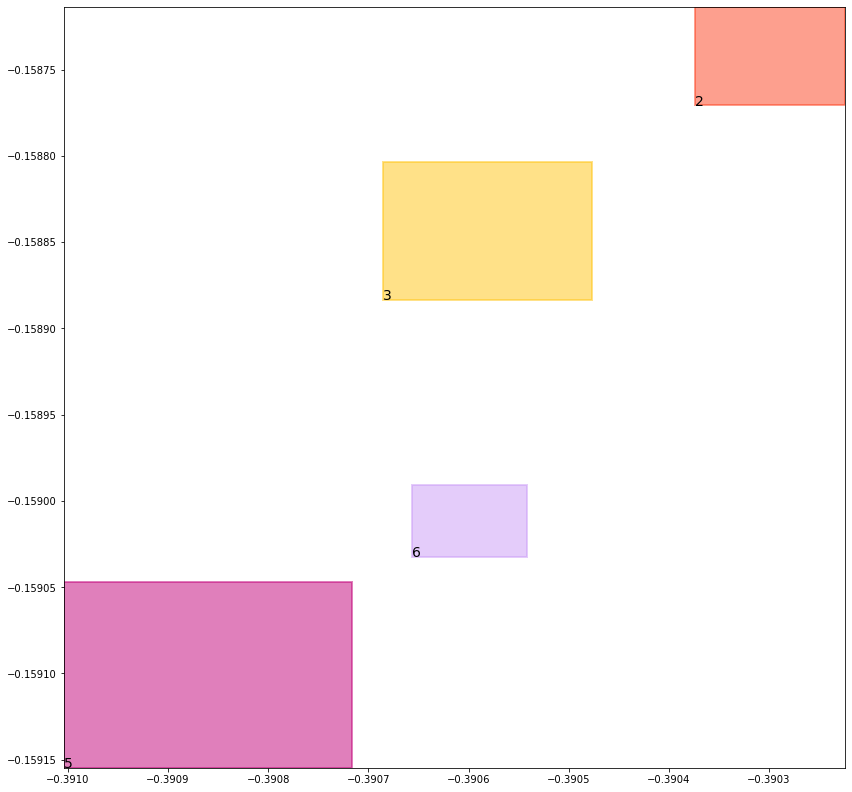

batch (tensor([[5, 3],
        [3, 5],
        [6, 2],
        [4, 5],
        [2, 6],
        [1, 2],
        [4, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080143129453063, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072015533223748, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510037124156952, grad_fn=<MulBackward0>)
previous loss: tensor(0.2662195861339569, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.040110062807798386 0.03364838287234306 tensor(0.9081073403358459) tensor(0.9663109183311462)
tensor(2) 0.46919164061546326 0.5002618432044983 tensor(0.4696220457553864) tensor(0.5010672211647034)
tensor(3) 0.4666530191898346 0.4993780255317688 tensor(0.4673551917076111) tensor(0.5006888508796692)
tensor(4) 0.06732133775949478 0.012300421483814716 tensor(0.9691970348358154) tensor(0.9513280391693115)
tensor(5) 0.5204132795333862 0.4840812385082245 tensor(0.5225434303283691) tensor(0.4850207269191742)
tensor(6) 0.5250288844108582 0.4840204119682312 tensor(0.5260896086692810) tensor(0.4857014417648315)


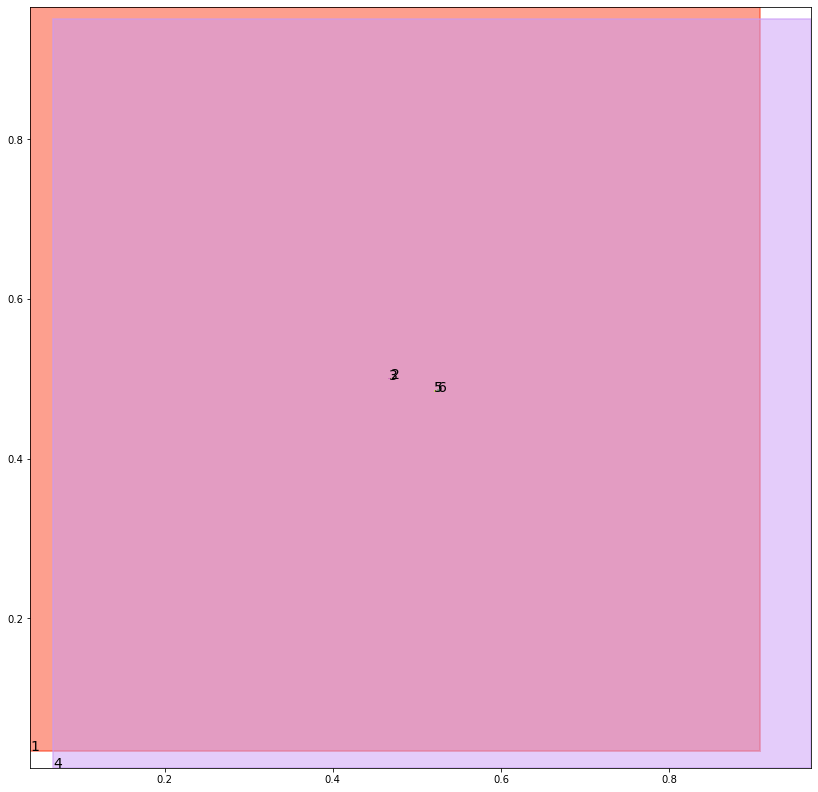

alignment data:
tensor(2) -0.35887861251831055 -0.17621034383773804 tensor(-0.3586225509643555) tensor(-0.1761132180690765)
tensor(3) -0.35931241512298584 -0.17636995017528534 tensor(-0.3588955998420715) tensor(-0.1762118041515350)
tensor(5) -0.3595926761627197 -0.17662611603736877 tensor(-0.3591736555099487) tensor(-0.1764710247516632)
tensor(6) -0.35926830768585205 -0.17651423811912537 tensor(-0.3587218523025513) tensor(-0.1763072907924652)


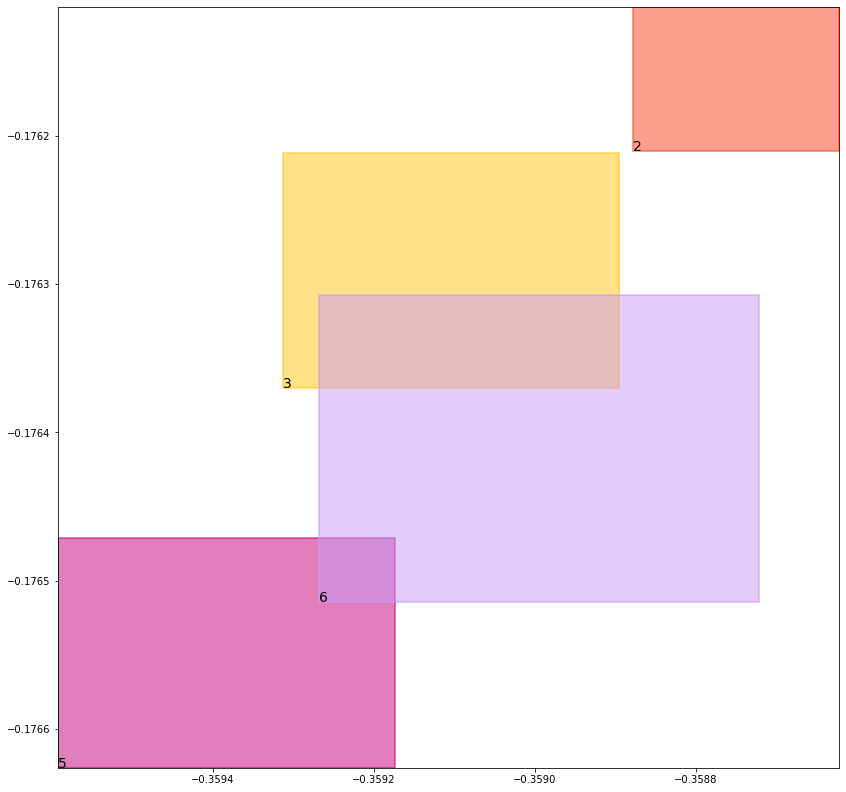

batch (tensor([[6, 2],
        [3, 5],
        [1, 2],
        [1, 3],
        [4, 5],
        [4, 6],
        [5, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080156344920397, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072143105790019, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509958744049072, grad_fn=<MulBackward0>)
previous loss: tensor(0.2662258148193359, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04005748778581619 0.03345264121890068 tensor(0.9085063338279724) tensor(0.9663724899291992)
tensor(2) 0.4695967733860016 0.5000202059745789 tensor(0.4699088931083679) tensor(0.5013387203216553)
tensor(3) 0.46680134534835815 0.49934664368629456 tensor(0.4676862657070160) tensor(0.5005421638488770)
tensor(4) 0.06694301962852478 0.012213390320539474 tensor(0.9692256450653076) tensor(0.9513924717903137)
tensor(5) 0.5203162431716919 0.48413553833961487 tensor(0.5222715139389038) tensor(0.4846424460411072)
tensor(6) 0.5250087380409241 0.48375093936920166 tensor(0.5254567861557007) tensor(0.4863953590393066)


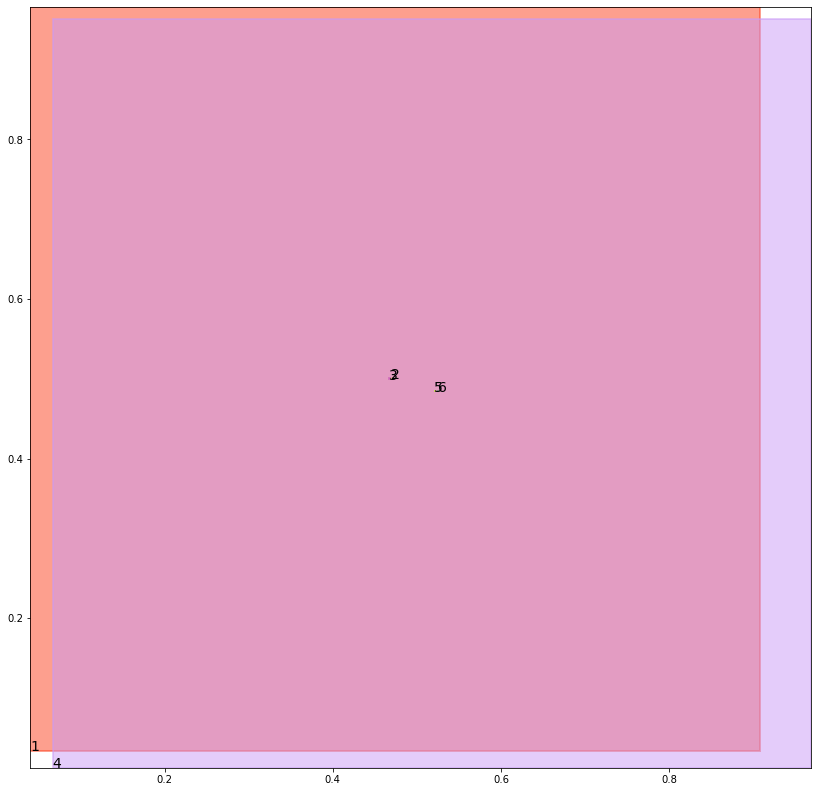

alignment data:
tensor(2) -0.3190290927886963 -0.20212459564208984 tensor(-0.3186392784118652) tensor(-0.2019755989313126)
tensor(3) -0.3194240927696228 -0.20226851105690002 tensor(-0.3190258145332336) tensor(-0.2021179646253586)
tensor(5) -0.3196830749511719 -0.20251762866973877 tensor(-0.3193969130516052) tensor(-0.2024131268262863)
tensor(6) -0.31944185495376587 -0.20243801176548004 tensor(-0.3186727762222290) tensor(-0.2021437883377075)


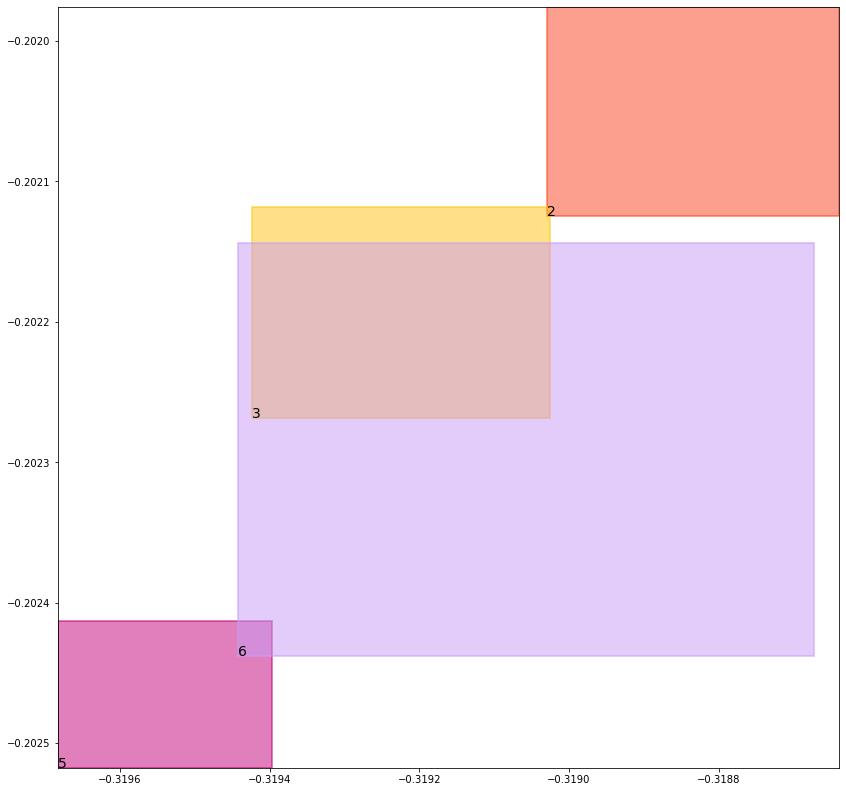

batch (tensor([[4, 5],
        [6, 2],
        [4, 6],
        [2, 6],
        [1, 3],
        [1, 2],
        [3, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0080046691000462, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0072005921974778, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509938776493073, grad_fn=<MulBackward0>)
previous loss: tensor(0.2661991417407990, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.04000505432486534 0.03325878456234932 tensor(0.9089025855064392) tensor(0.9664339423179626)
tensor(2) 0.46987611055374146 0.4999711513519287 tensor(0.4699541330337524) tensor(0.5011032819747925)
tensor(3) 0.46720385551452637 0.4996381103992462 tensor(0.4676970541477203) tensor(0.5000779032707214)
tensor(4) 0.06656821072101593 0.01212739385664463 tensor(0.9692540764808655) tensor(0.9514568448066711)
tensor(5) 0.5208910703659058 0.4838305711746216 tensor(0.5216019153594971) tensor(0.4843243360519409)
tensor(6) 0.5244712233543396 0.4836656451225281 tensor(0.5252084732055664) tensor(0.4864921867847443)


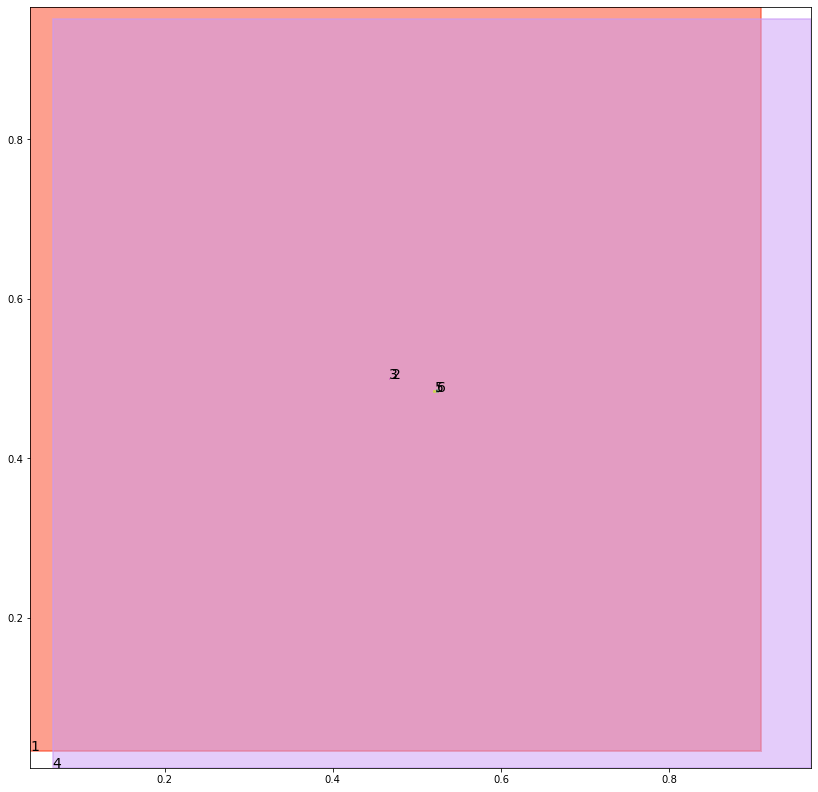

alignment data:
tensor(2) -0.28383100032806396 -0.2147381752729416 tensor(-0.2835102081298828) tensor(-0.2146151065826416)
tensor(3) -0.28412264585494995 -0.2148427665233612 tensor(-0.2839635610580444) tensor(-0.2147829830646515)
tensor(5) -0.28452008962631226 -0.21514761447906494 tensor(-0.2843297123908997) tensor(-0.2150764763355255)
tensor(6) -0.28429925441741943 -0.2150728702545166 tensor(-0.2834582328796387) tensor(-0.2147515714168549)


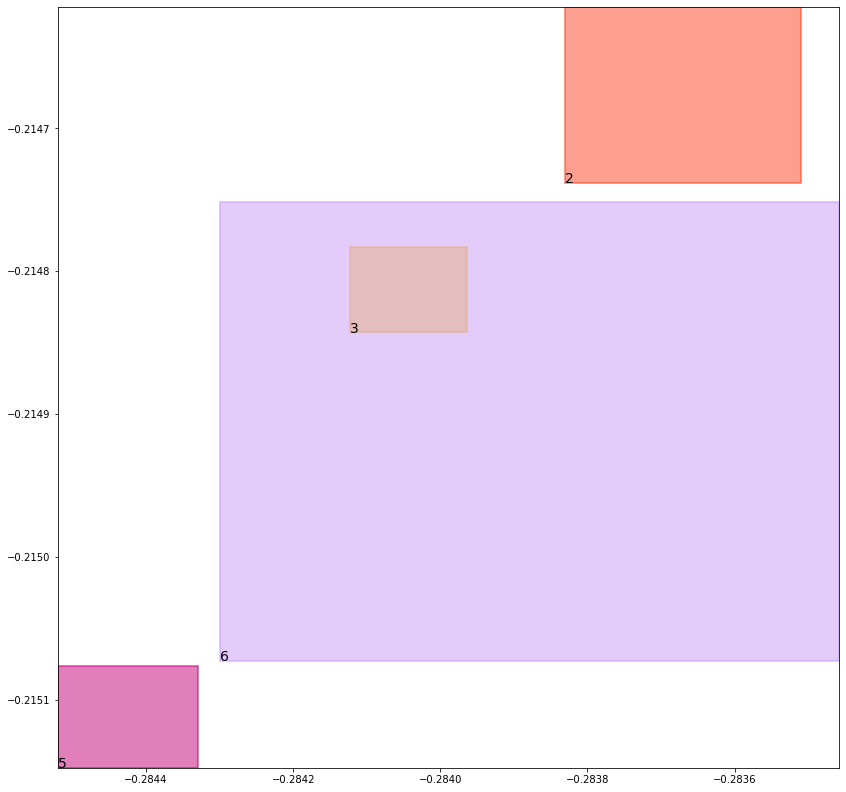

batch (tensor([[1, 3],
        [3, 5],
        [6, 2],
        [5, 3],
        [1, 2],
        [4, 5],
        [4, 6],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079757086932659, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071821319870651, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509968578815460, grad_fn=<MulBackward0>)
previous loss: tensor(0.2661547064781189, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03995276615023613 0.03306681662797928 tensor(0.9092959761619568) tensor(0.9664952754974365)
tensor(2) 0.469394326210022 0.5000953674316406 tensor(0.4704301059246063) tensor(0.5004136562347412)
tensor(3) 0.4674193263053894 0.4993285536766052 tensor(0.4678348898887634) tensor(0.5002169013023376)
tensor(4) 0.066196970641613 0.012042406015098095 tensor(0.9692825078964233) tensor(0.9515212774276733)
tensor(5) 0.5205752849578857 0.483562707901001 tensor(0.5220677256584167) tensor(0.4843513965606689)
tensor(6) 0.5239393711090088 0.48374754190444946 tensor(0.5251349210739136) tensor(0.4860456883907318)


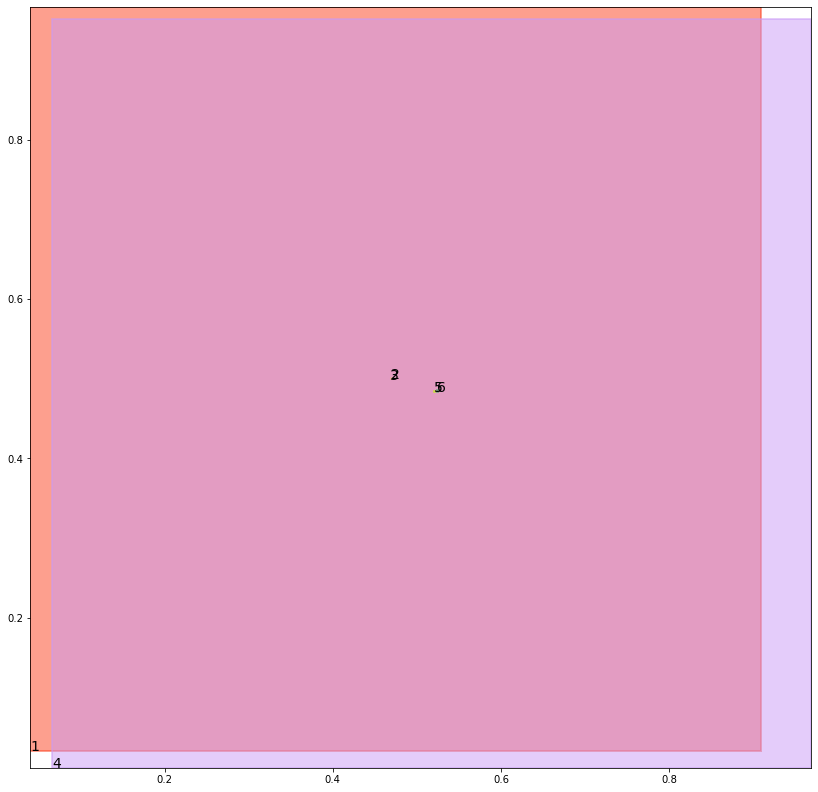

alignment data:
tensor(2) -0.25480562448501587 -0.21876877546310425 tensor(-0.2546397447586060) tensor(-0.2187079042196274)
tensor(3) -0.25516653060913086 -0.21890194714069366 tensor(-0.2548883557319641) tensor(-0.2187961339950562)
tensor(5) -0.25557810068130493 -0.21921290457248688 tensor(-0.2552472949028015) tensor(-0.2190898954868317)
tensor(6) -0.2552753686904907 -0.2191060334444046 tensor(-0.2545469403266907) tensor(-0.2188292145729065)


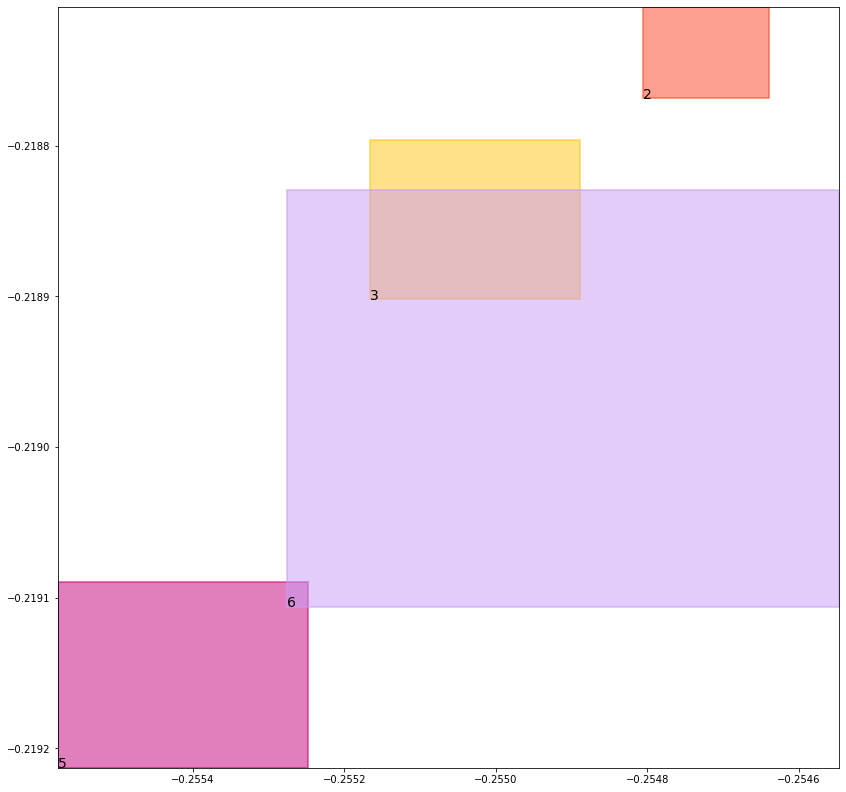

batch (tensor([[1, 2],
        [2, 6],
        [3, 5],
        [1, 3],
        [6, 2],
        [5, 3],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079678390175104, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071816518902779, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509971261024475, grad_fn=<MulBackward0>)
previous loss: tensor(0.2661466300487518, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03990060091018677 0.03287670761346817 tensor(0.9096867442131042) tensor(0.9665564298629761)
tensor(2) 0.4695538580417633 0.4993191659450531 tensor(0.4706547856330872) tensor(0.5003759264945984)
tensor(3) 0.4675010144710541 0.49896520376205444 tensor(0.4681729078292847) tensor(0.5004035830497742)
tensor(4) 0.06582917273044586 0.011958405375480652 tensor(0.9693108201026917) tensor(0.9515856504440308)
tensor(5) 0.5200453996658325 0.48378831148147583 tensor(0.5224226713180542) tensor(0.4842321276664734)
tensor(6) 0.5238186120986938 0.48398053646087646 tensor(0.5248143076896667) tensor(0.4851099252700806)


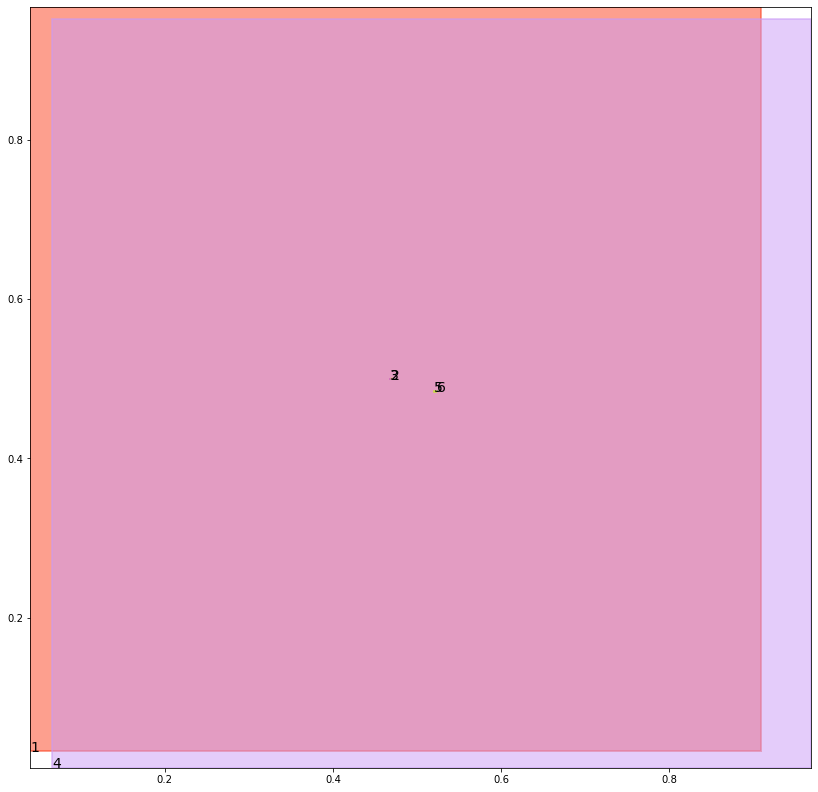

alignment data:
tensor(2) -0.22665935754776 -0.22277522087097168 tensor(-0.2262830138206482) tensor(-0.2226334959268570)
tensor(3) -0.226911723613739 -0.22286640107631683 tensor(-0.2264613509178162) tensor(-0.2226949632167816)
tensor(5) -0.227192223072052 -0.22312718629837036 tensor(-0.2268905043601990) tensor(-0.2230179607868195)
tensor(6) -0.2268558144569397 -0.2230086624622345 tensor(-0.2264671921730042) tensor(-0.2228618860244751)


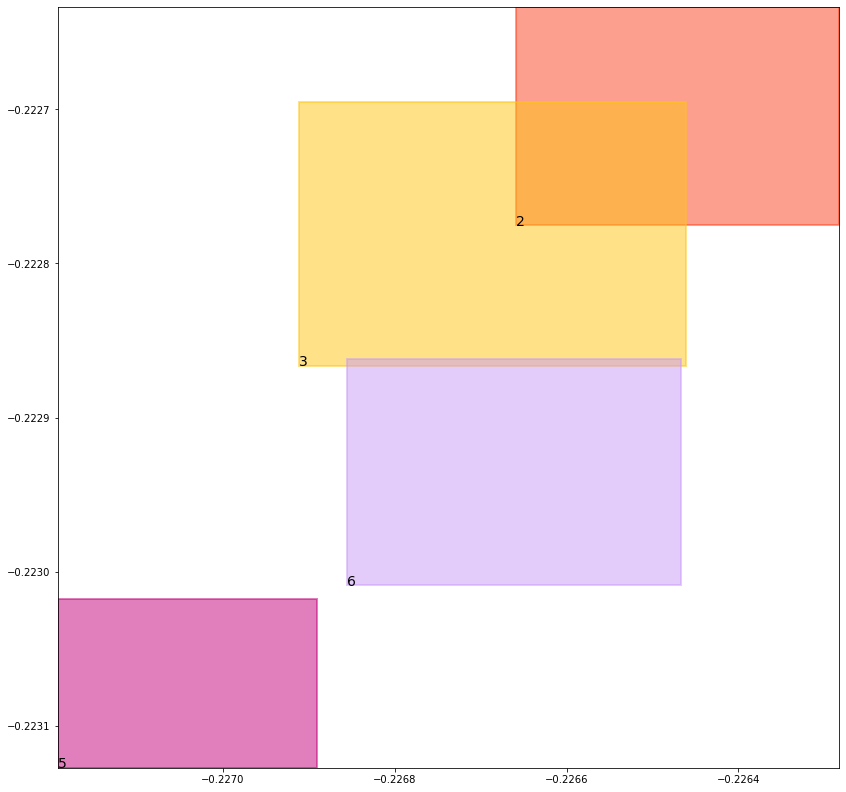

batch (tensor([[5, 3],
        [1, 2],
        [3, 5],
        [4, 5],
        [4, 6],
        [2, 6],
        [6, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079671181738377, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071656825020909, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509970068931580, grad_fn=<MulBackward0>)
previous loss: tensor(0.2661298215389252, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.039848554879426956 0.032688360661268234 tensor(0.9100747108459473) tensor(0.9666174650192261)
tensor(2) 0.4703642725944519 0.4987953305244446 tensor(0.4705812633037567) tensor(0.5004493594169617)
tensor(3) 0.4679078459739685 0.4989544153213501 tensor(0.4682457745075226) tensor(0.5002337694168091)
tensor(4) 0.06546474248170853 0.011875397525727749 tensor(0.9693393111228943) tensor(0.9516499638557434)
tensor(5) 0.5199650526046753 0.4839814305305481 tensor(0.5220330357551575) tensor(0.4844544529914856)
tensor(6) 0.5240678191184998 0.48374831676483154 tensor(0.5242716073989868) tensor(0.4843467772006989)


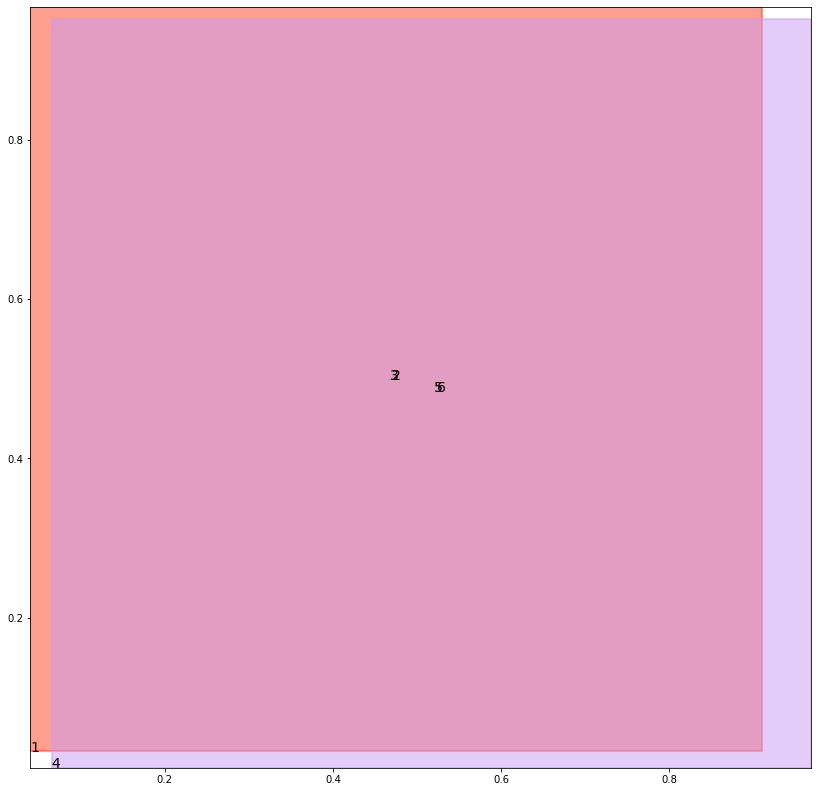

alignment data:
tensor(2) -0.19203299283981323 -0.23276439309120178 tensor(-0.1915568709373474) tensor(-0.2325815409421921)
tensor(3) -0.19217348098754883 -0.23281130194664001 tensor(-0.1917924284934998) tensor(-0.2326654344797134)
tensor(5) -0.19242125749588013 -0.23306000232696533 tensor(-0.1921342015266418) tensor(-0.2329554855823517)
tensor(6) -0.192177414894104 -0.23297818005084991 tensor(-0.1919956803321838) tensor(-0.2329087555408478)


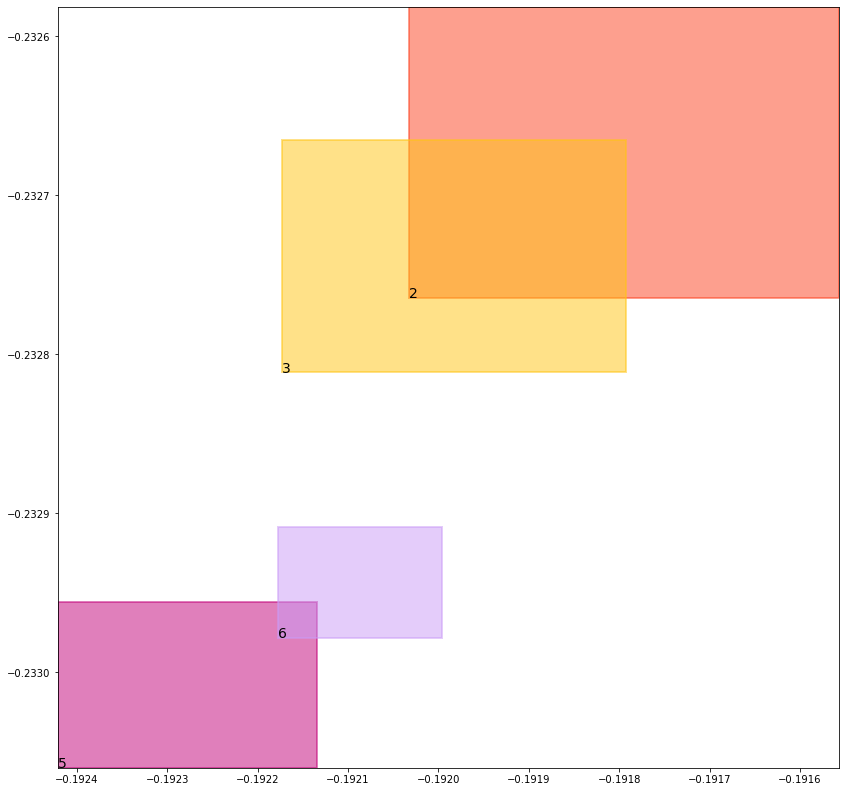

batch (tensor([[4, 6],
        [1, 3],
        [4, 5],
        [2, 6],
        [5, 3],
        [3, 5],
        [1, 2],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079431459307671, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071416096761823, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509987056255341, grad_fn=<MulBackward0>)
previous loss: tensor(0.2660834491252899, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.039796654134988785 0.0325017124414444 tensor(0.9104599952697754) tensor(0.9666782617568970)
tensor(2) 0.47023850679397583 0.4987911581993103 tensor(0.4717580974102020) tensor(0.5003325343132019)
tensor(3) 0.46807965636253357 0.49926260113716125 tensor(0.4686076939105988) tensor(0.4997440576553345)
tensor(4) 0.06510373204946518 0.011793364770710468 tensor(0.9693675041198730) tensor(0.9517143368721008)
tensor(5) 0.5202900767326355 0.4838959872722626 tensor(0.5209724903106689) tensor(0.4845825135707855)
tensor(6) 0.5235299468040466 0.48301252722740173 tensor(0.5246491432189941) tensor(0.4845175743103027)


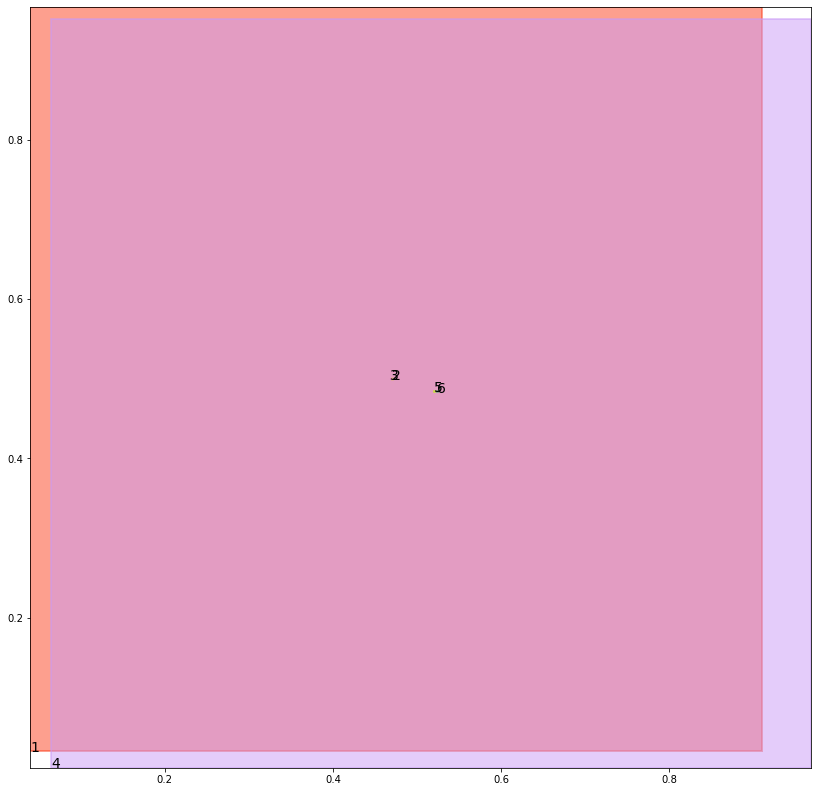

alignment data:
tensor(2) -0.1578567624092102 -0.2368050366640091 tensor(-0.1573135256767273) tensor(-0.2366001009941101)
tensor(3) -0.15788859128952026 -0.2368108630180359 tensor(-0.1577149033546448) tensor(-0.2367454469203949)
tensor(5) -0.15822190046310425 -0.23709498345851898 tensor(-0.1579795479774475) tensor(-0.2370035499334335)
tensor(6) -0.15822309255599976 -0.2371050864458084 tensor(-0.1577201485633850) tensor(-0.2369145154953003)


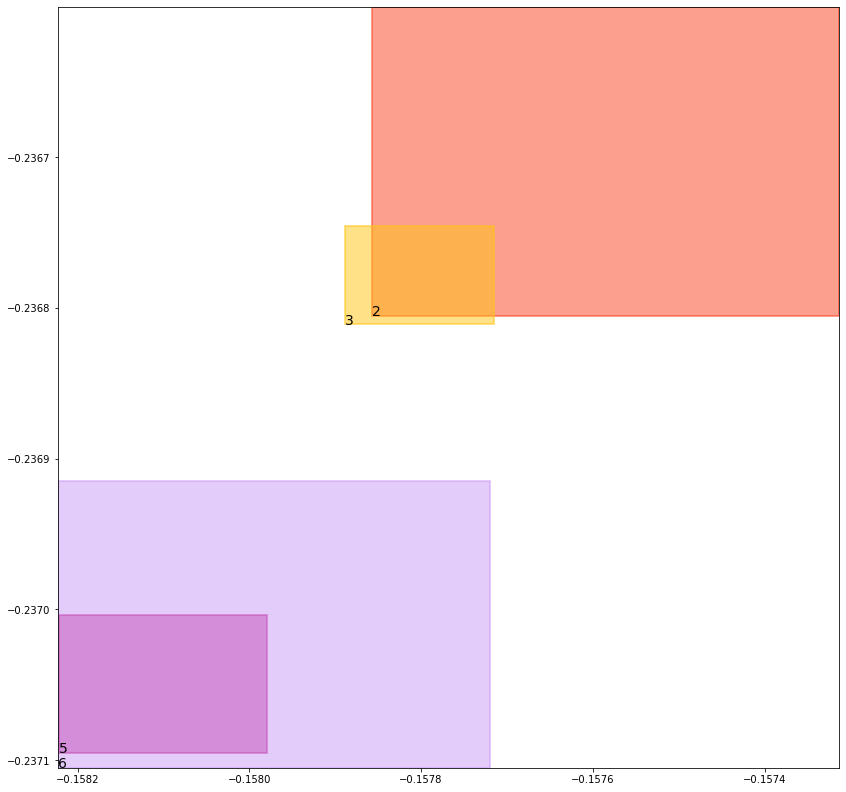

batch (tensor([[5, 3],
        [4, 5],
        [4, 6],
        [6, 2],
        [2, 6],
        [1, 3],
        [3, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079374387860298, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071359667927027, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509977519512177, grad_fn=<MulBackward0>)
previous loss: tensor(0.2660711705684662, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03974488377571106 0.03231680020689964 tensor(0.9108427762985229) tensor(0.9667389988899231)
tensor(2) 0.47023242712020874 0.49924910068511963 tensor(0.4724050462245941) tensor(0.5000442862510681)
tensor(3) 0.46819743514060974 0.49896910786628723 tensor(0.4689508676528931) tensor(0.4998554289340973)
tensor(4) 0.06474612653255463 0.011712267994880676 tensor(0.9693957567214966) tensor(0.9517784714698792)
tensor(5) 0.5193119645118713 0.4839610457420349 tensor(0.5209794640541077) tensor(0.4842208921909332)
tensor(6) 0.5230803489685059 0.4828547239303589 tensor(0.5247600078582764) tensor(0.4845109879970551)


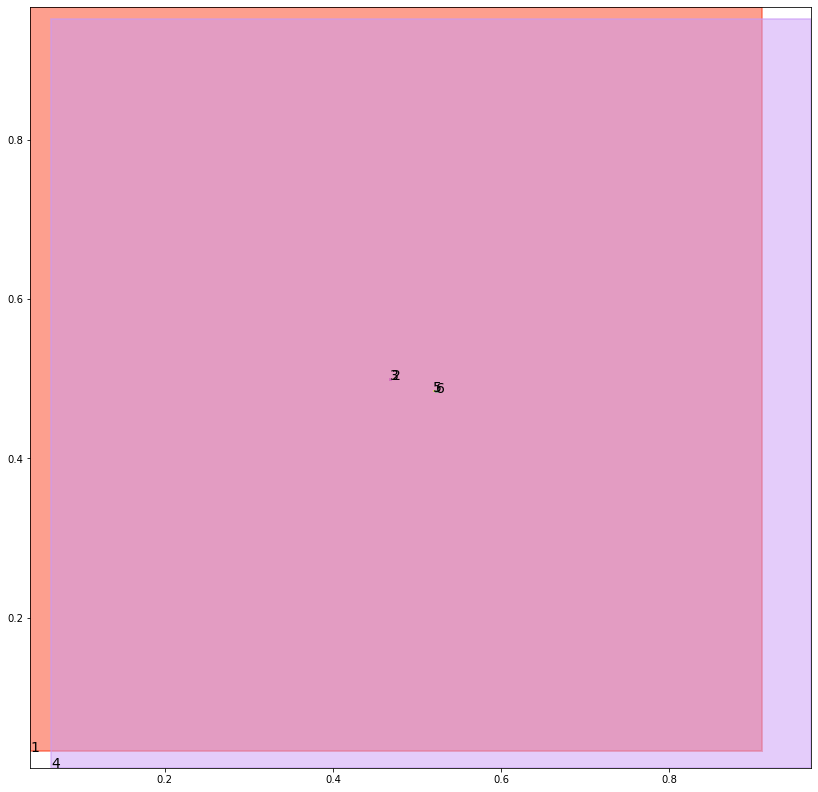

alignment data:
tensor(2) -0.12744265794754028 -0.23329421877861023 tensor(-0.1270571351051331) tensor(-0.2331520020961761)
tensor(3) -0.12767452001571655 -0.23337754607200623 tensor(-0.1273710727691650) tensor(-0.2332627177238464)
tensor(5) -0.12797868251800537 -0.23364917933940887 tensor(-0.1277802586555481) tensor(-0.2335776090621948)
tensor(6) -0.12800103425979614 -0.2336691915988922 tensor(-0.1274135708808899) tensor(-0.2334474921226501)


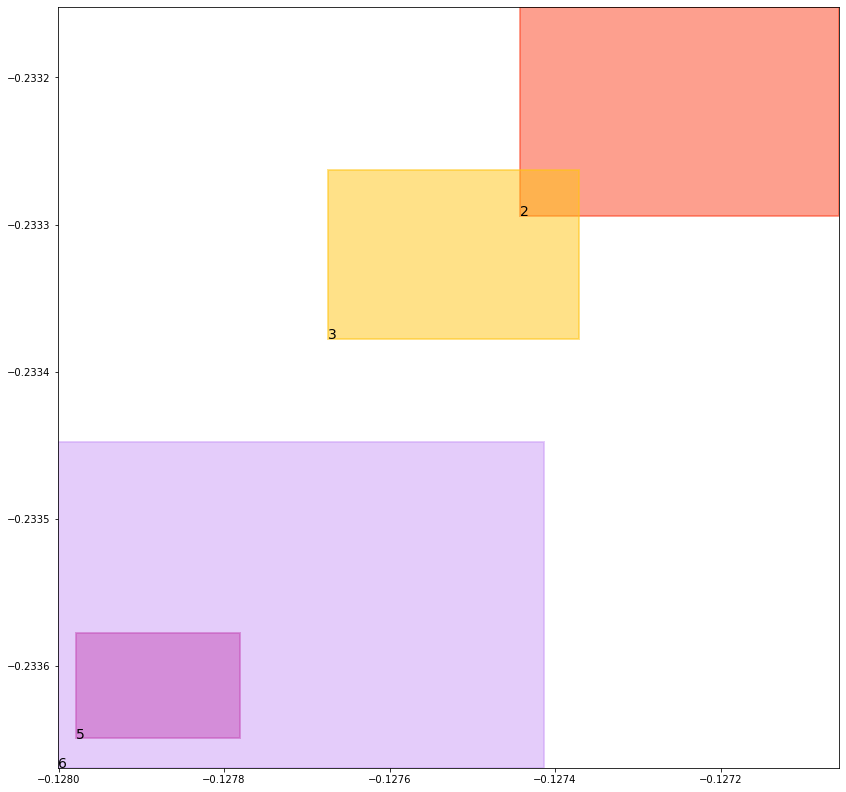

batch (tensor([[6, 2],
        [5, 3],
        [2, 6],
        [1, 3],
        [3, 5],
        [4, 6],
        [1, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079298978671432, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071381274610758, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509976625442505, grad_fn=<MulBackward0>)
previous loss: tensor(0.2660656869411469, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.039693232625722885 0.03213362768292427 tensor(0.9112232327461243) tensor(0.9667996168136597)
tensor(2) 0.4705301523208618 0.49960216879844666 tensor(0.4723749458789825) tensor(0.5001149177551270)
tensor(3) 0.4685717225074768 0.49859029054641724 tensor(0.4689711928367615) tensor(0.5000572800636292)
tensor(4) 0.06439171731472015 0.011632089503109455 tensor(0.9694240093231201) tensor(0.9518426060676575)
tensor(5) 0.5184769630432129 0.4834239184856415 tensor(0.5211776494979858) tensor(0.4841616451740265)
tensor(6) 0.5228957533836365 0.4832266569137573 tensor(0.5244448184967041) tensor(0.4843436777591705)


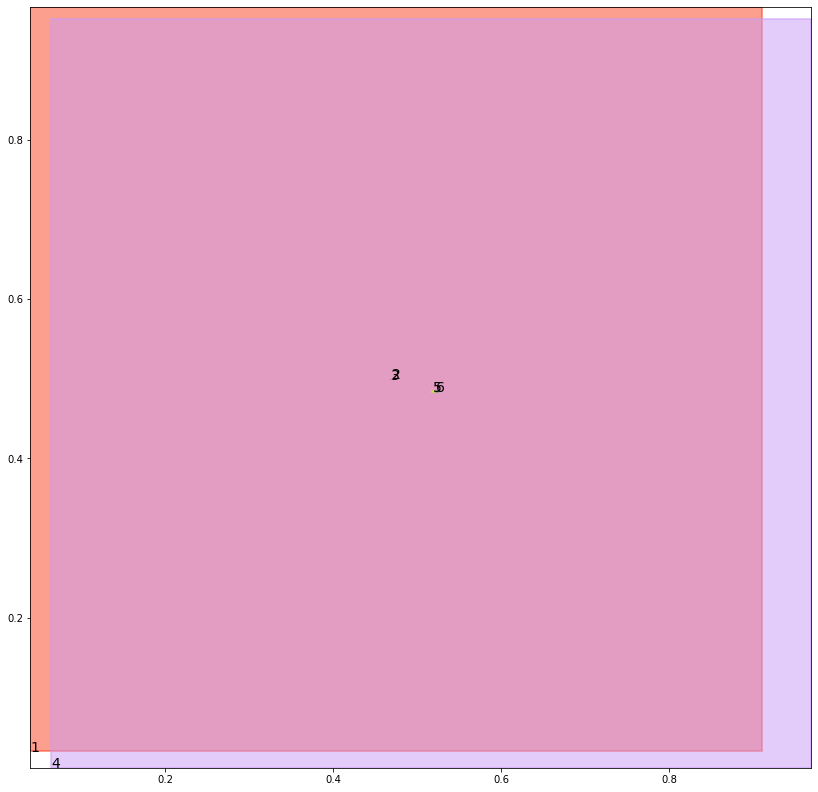

alignment data:
tensor(2) -0.09710979461669922 -0.22519263625144958 tensor(-0.0968271493911743) tensor(-0.2250891029834747)
tensor(3) -0.09753984212875366 -0.2253526896238327 tensor(-0.0971016287803650) tensor(-0.2251847088336945)
tensor(5) -0.09796690940856934 -0.2256702184677124 tensor(-0.0975567102432251) tensor(-0.2255200445652008)
tensor(6) -0.09768623113632202 -0.22557532787322998 tensor(-0.0972580909729004) tensor(-0.2254146933555603)


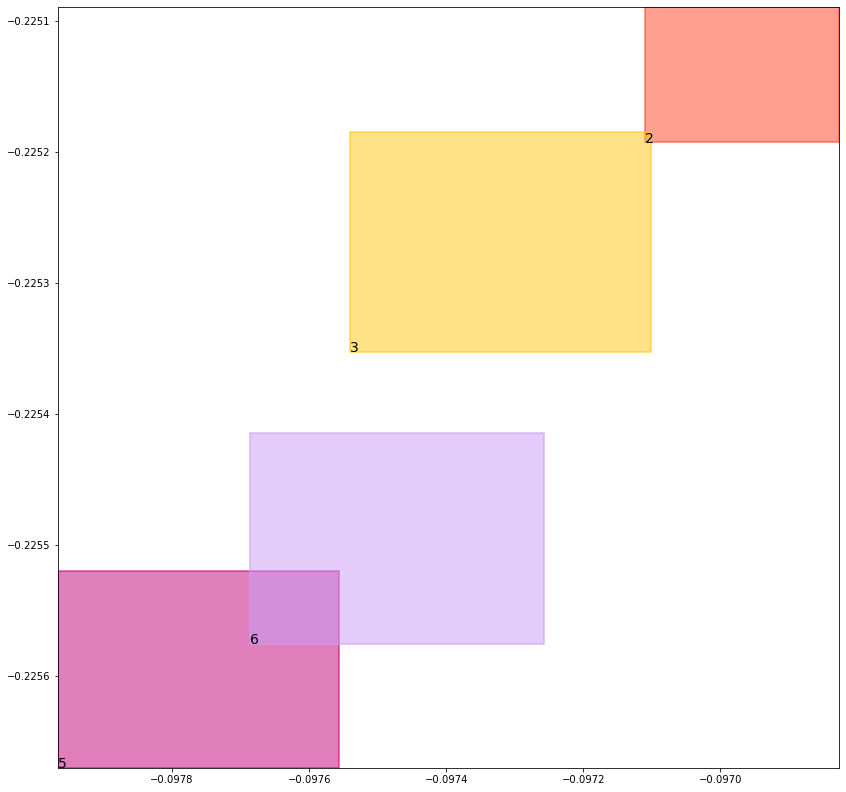

batch (tensor([[2, 6],
        [4, 6],
        [5, 3],
        [6, 2],
        [1, 2],
        [1, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0079109724611044, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071358466520905, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509968876838684, grad_fn=<MulBackward0>)
previous loss: tensor(0.2660436928272247, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03964170813560486 0.03195218741893768 tensor(0.9116011857986450) tensor(0.9668599963188171)
tensor(2) 0.4711017906665802 0.49937137961387634 tensor(0.4717347323894501) tensor(0.5004059076309204)
tensor(3) 0.46870025992393494 0.4985678791999817 tensor(0.4691768586635590) tensor(0.4999037683010101)
tensor(4) 0.06404037773609161 0.011552811600267887 tensor(0.9694520831108093) tensor(0.9519066810607910)
tensor(5) 0.51839280128479 0.4831770062446594 tensor(0.5209314227104187) tensor(0.4841991961002350)
tensor(6) 0.5229504704475403 0.48403212428092957 tensor(0.5237458348274231) tensor(0.4840756058692932)


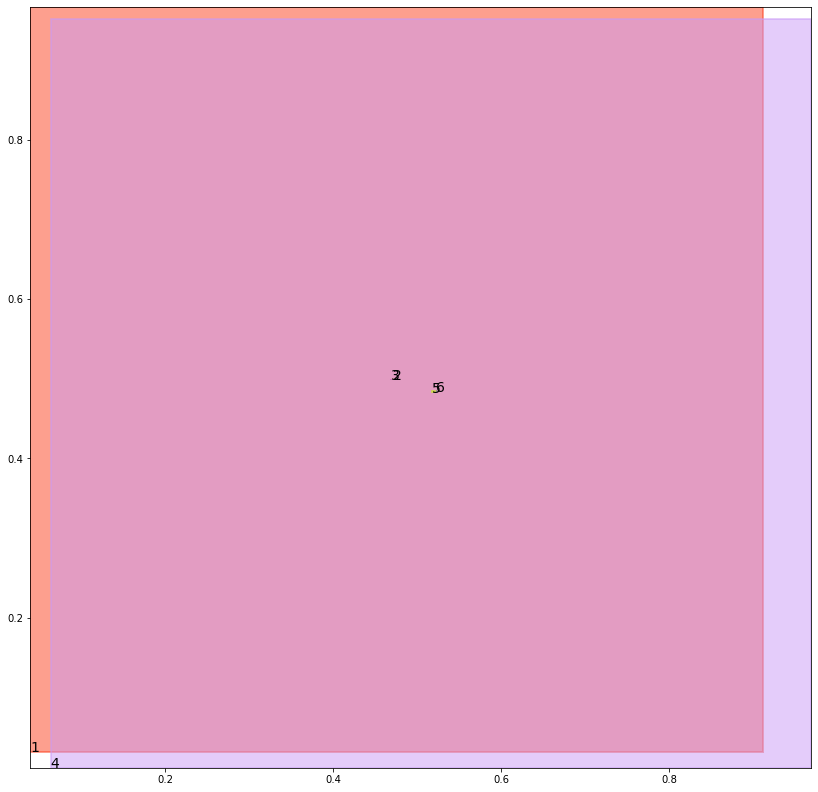

alignment data:
tensor(2) -0.06590098142623901 -0.2131374180316925 tensor(-0.0655652284622192) tensor(-0.2130096256732941)
tensor(3) -0.06630730628967285 -0.21328702569007874 tensor(-0.0658996105194092) tensor(-0.2131309509277344)
tensor(5) -0.06679928302764893 -0.213631272315979 tensor(-0.0663217306137085) tensor(-0.2134545743465424)
tensor(6) -0.06621432304382324 -0.21341931819915771 tensor(-0.0661416053771973) tensor(-0.2133937031030655)


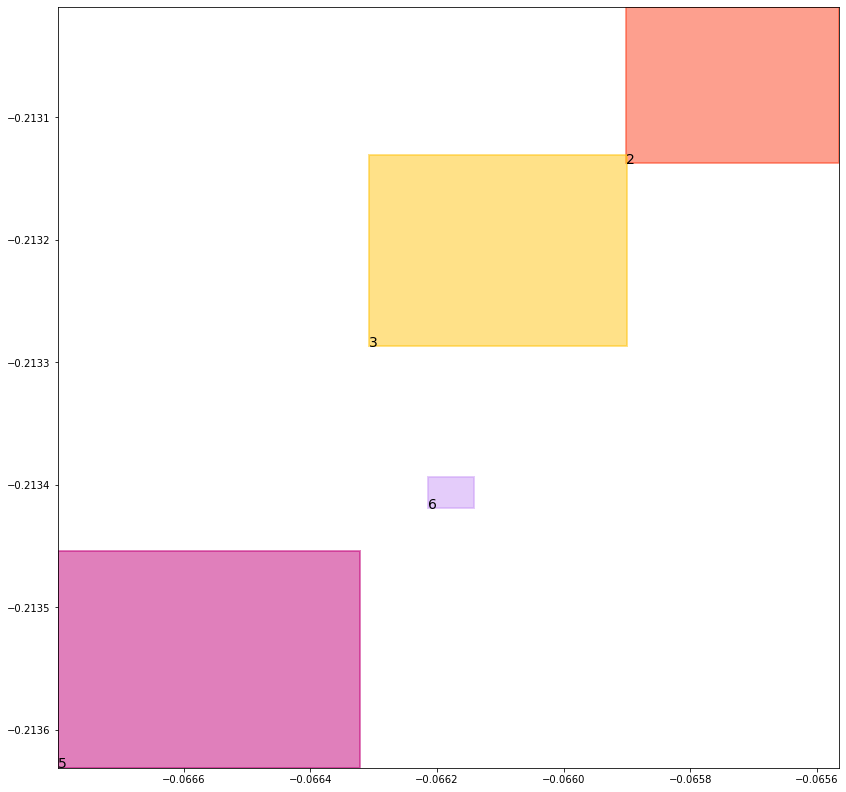

batch (tensor([[4, 6],
        [5, 3],
        [6, 2],
        [2, 6],
        [3, 5],
        [1, 3],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078882034868002, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0071112941950560, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509992122650146, grad_fn=<MulBackward0>)
previous loss: tensor(0.2659987211227417, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.039590321481227875 0.03177245333790779 tensor(0.9119763970375061) tensor(0.9669204354286194)
tensor(2) 0.47054868936538696 0.4993346333503723 tensor(0.4719203114509583) tensor(0.5001708269119263)
tensor(3) 0.4687875509262085 0.49886593222618103 tensor(0.4694898426532745) tensor(0.4994302988052368)
tensor(4) 0.0636921375989914 0.011474448256194592 tensor(0.9694802165031433) tensor(0.9519706368446350)
tensor(5) 0.5189859867095947 0.48343077301979065 tensor(0.5202841162681580) tensor(0.4840888381004333)
tensor(6) 0.522703230381012 0.48390960693359375 tensor(0.5232202410697937) tensor(0.4843418896198273)


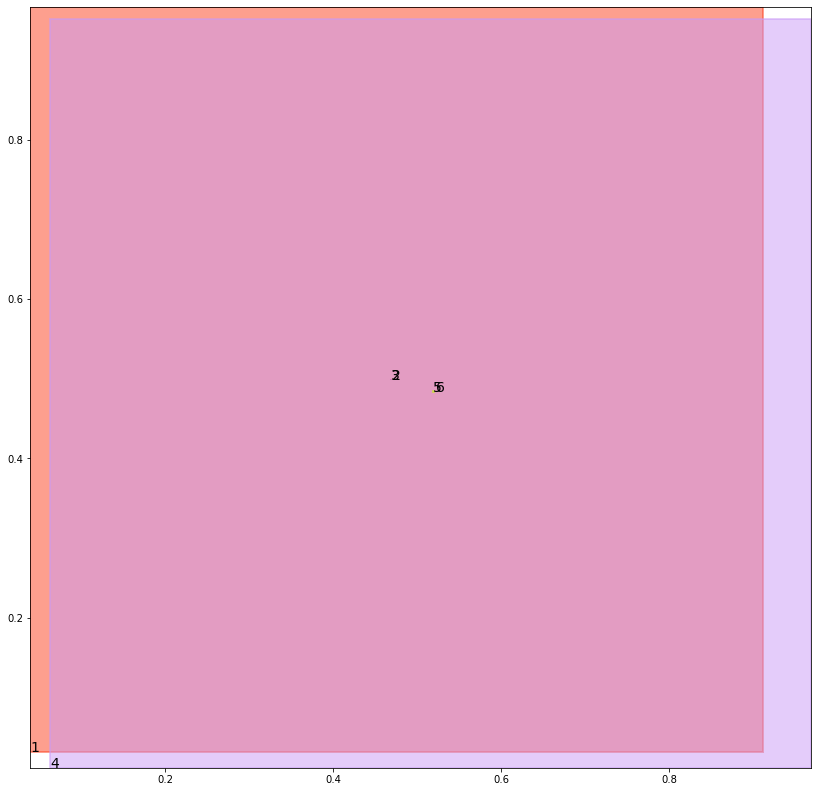

alignment data:
tensor(2) -0.03955632448196411 -0.19324487447738647 tensor(-0.0392190814018250) tensor(-0.1931187510490417)
tensor(3) -0.03982126712799072 -0.19334176182746887 tensor(-0.0396107435226440) tensor(-0.1932625472545624)
tensor(5) -0.04027235507965088 -0.1936742663383484 tensor(-0.0399901866912842) tensor(-0.1935692280530930)
tensor(6) -0.039855003356933594 -0.193524569272995 tensor(-0.0396955013275146) tensor(-0.1934644430875778)


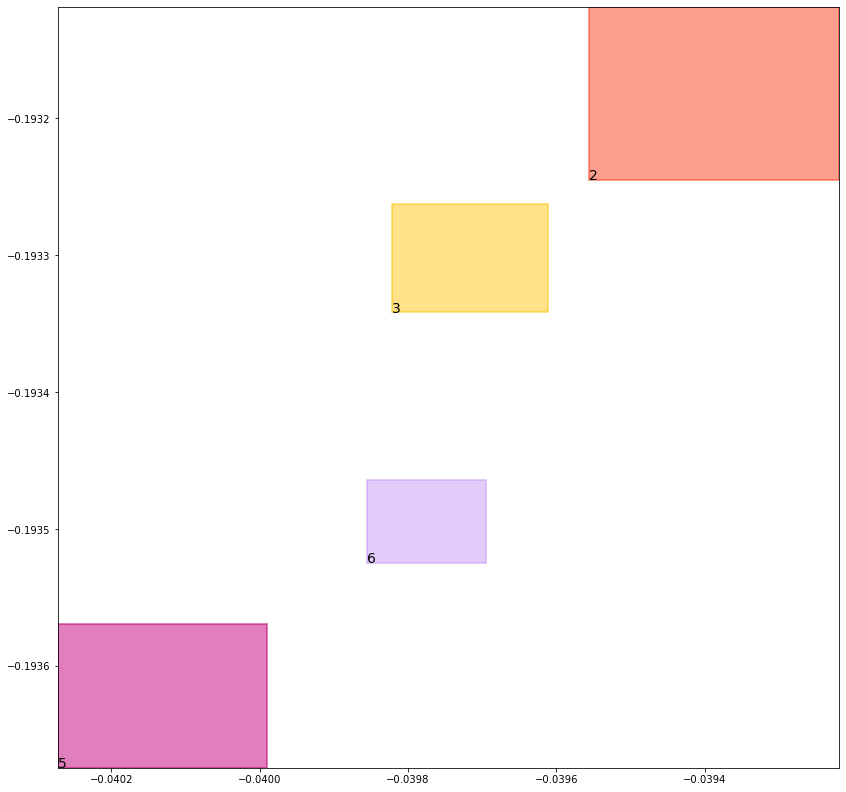

batch (tensor([[4, 6],
        [3, 5],
        [6, 2],
        [1, 2],
        [2, 6],
        [4, 5],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078774802386761, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070881824940443, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510017752647400, grad_fn=<MulBackward0>)
previous loss: tensor(0.2659674286842346, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.039539042860269547 0.03159442916512489 tensor(0.9123491644859314) tensor(0.9669805169105530)
tensor(2) 0.4701445698738098 0.49946507811546326 tensor(0.4723805785179138) tensor(0.4994735419750214)
tensor(3) 0.4691985845565796 0.4986705482006073 tensor(0.4695388376712799) tensor(0.4994528293609619)
tensor(4) 0.06334710121154785 0.011396984569728374 tensor(0.9695082306861877) tensor(0.9520345926284790)
tensor(5) 0.5192763209342957 0.483844518661499 tensor(0.5201847553253174) tensor(0.4841341674327850)
tensor(6) 0.5221223831176758 0.4839579164981842 tensor(0.5232119560241699) tensor(0.4840760529041290)


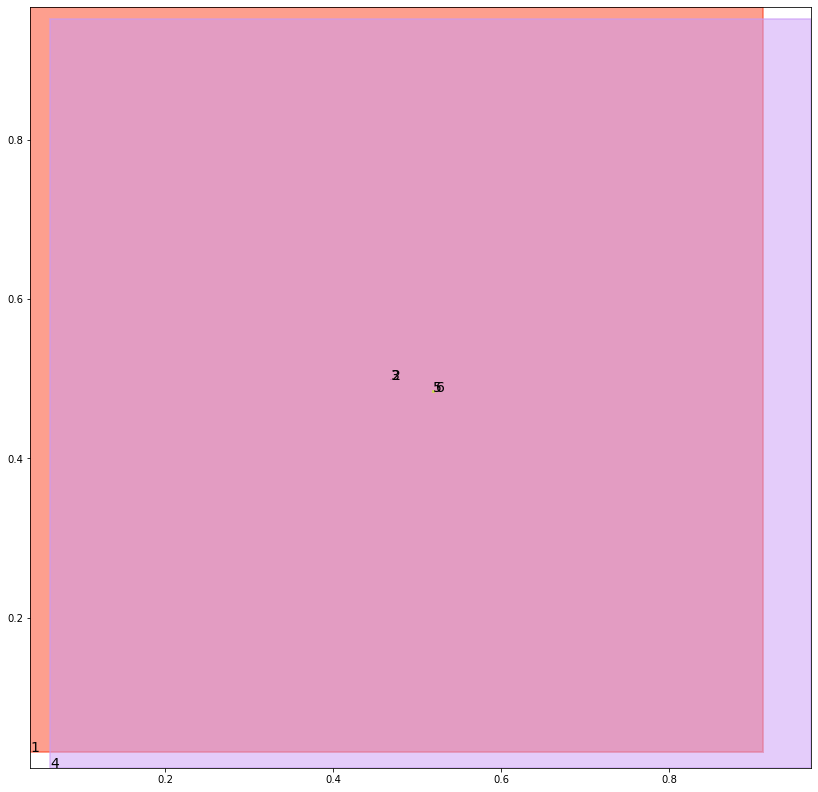

alignment data:
tensor(2) -0.019338011741638184 -0.17130422592163086 tensor(-0.0191640853881836) tensor(-0.1712440550327301)
tensor(3) -0.019631266593933105 -0.17141471803188324 tensor(-0.0193878412246704) tensor(-0.1713216006755829)
tensor(5) -0.019907116889953613 -0.17168135941028595 tensor(-0.0197569131851196) tensor(-0.1716261506080627)
tensor(6) -0.0196571946144104 -0.17159372568130493 tensor(-0.0195407867431641) tensor(-0.1715521663427353)


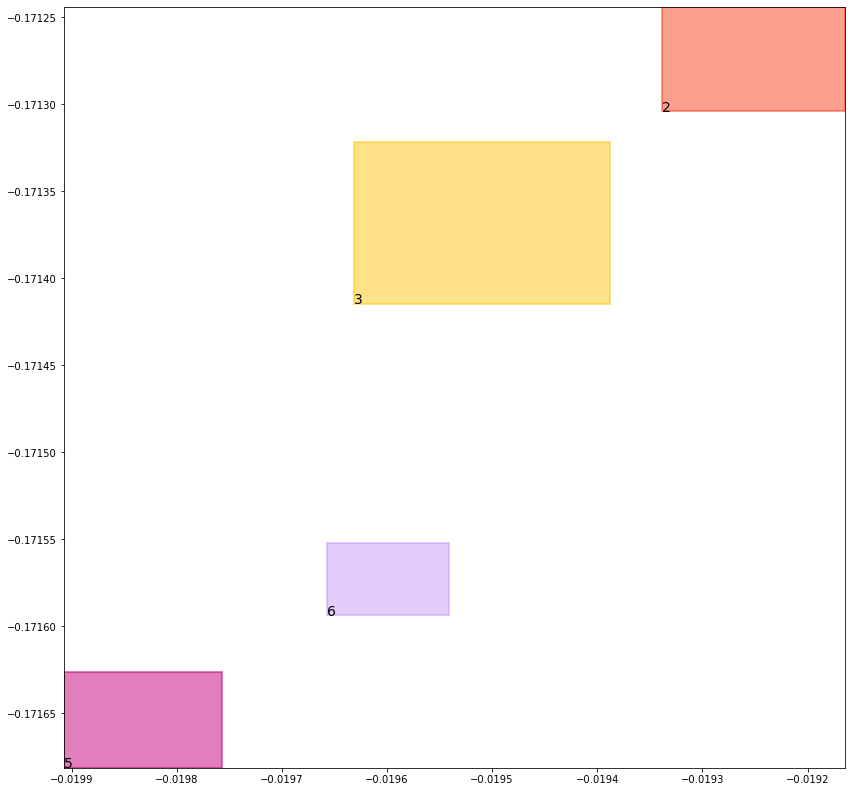

batch (tensor([[1, 3],
        [3, 5],
        [1, 2],
        [5, 3],
        [2, 6],
        [4, 5],
        [4, 6],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078647136688232, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070751868188381, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510044574737549, grad_fn=<MulBackward0>)
previous loss: tensor(0.2659443616867065, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03948786482214928 0.031418103724718094 tensor(0.9127193093299866) tensor(0.9670405983924866)
tensor(2) 0.470449298620224 0.49928683042526245 tensor(0.4725168645381927) tensor(0.4994167387485504)
tensor(3) 0.46934977173805237 0.4983035922050476 tensor(0.4699015319347382) tensor(0.4996453523635864)
tensor(4) 0.0630052238702774 0.011320428922772408 tensor(0.9695362448692322) tensor(0.9520983099937439)
tensor(5) 0.5187644362449646 0.48376694321632385 tensor(0.5205628871917725) tensor(0.4842943549156189)
tensor(6) 0.5219603180885315 0.4833277761936188 tensor(0.5229520797729492) tensor(0.4841607511043549)


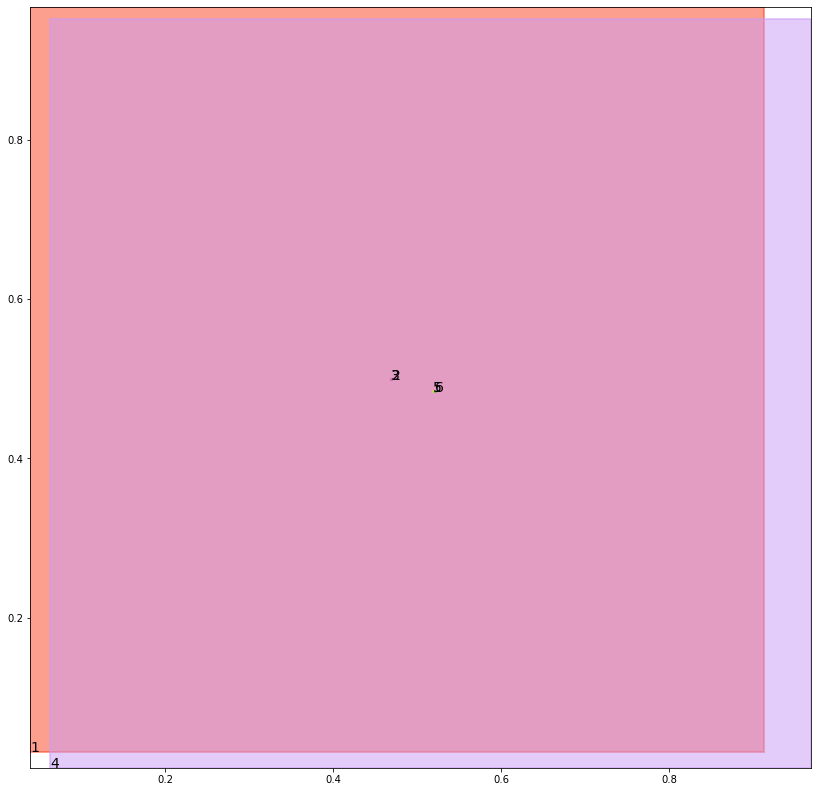

alignment data:
tensor(2) 0.0011940598487854004 -0.15360897779464722 tensor(0.0013892650604248) tensor(-0.1535400748252869)
tensor(3) 0.0008365511894226074 -0.1537439227104187 tensor(0.0012513399124146) tensor(-0.1535849869251251)
tensor(5) 0.0006057620048522949 -0.15399298071861267 tensor(0.0008905529975891) tensor(-0.1538884639739990)
tensor(6) 0.0007298588752746582 -0.15395522117614746 tensor(0.0010374188423157) tensor(-0.1538393199443817)


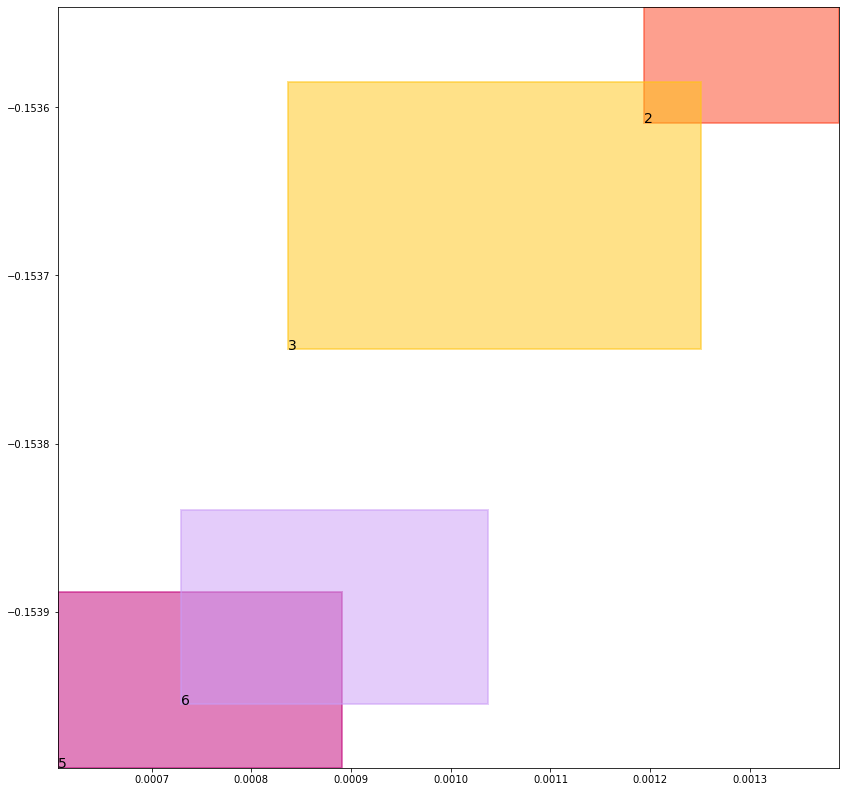

batch (tensor([[4, 6],
        [1, 2],
        [2, 6],
        [1, 3],
        [3, 5],
        [5, 3],
        [6, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078570842742920, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070801987312734, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509998679161072, grad_fn=<MulBackward0>)
previous loss: tensor(0.2659371495246887, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03943679481744766 0.031243422999978065 tensor(0.9130871295928955) tensor(0.9671003222465515)
tensor(2) 0.4713917672634125 0.49918338656425476 tensor(0.4723607897758484) tensor(0.4995811581611633)
tensor(3) 0.46944692730903625 0.4982938766479492 tensor(0.4702457189559937) tensor(0.4994807243347168)
tensor(4) 0.06266643106937408 0.011244741268455982 tensor(0.9695642590522766) tensor(0.9521622061729431)
tensor(5) 0.5187014937400818 0.4838397204875946 tensor(0.5201969146728516) tensor(0.4839622080326080)
tensor(6) 0.5221769213676453 0.48316454887390137 tensor(0.5224651694297791) tensor(0.4841817021369934)


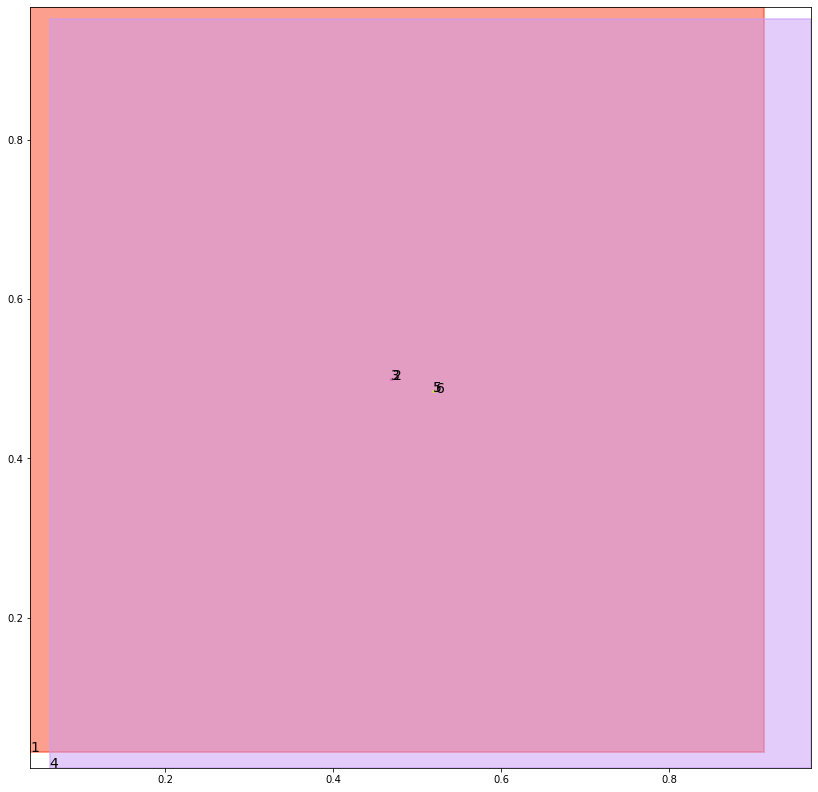

alignment data:
tensor(2) 0.01742410659790039 -0.13559399545192719 tensor(0.0176092386245728) tensor(-0.1355253905057907)
tensor(3) 0.01702702045440674 -0.1357414573431015 tensor(0.0174179077148438) tensor(-0.1355926096439362)
tensor(5) 0.016822457313537598 -0.1359816938638687 tensor(0.0169720649719238) tensor(-0.1359286606311798)
tensor(6) 0.01690375804901123 -0.1359616070985794 tensor(0.0172080993652344) tensor(-0.1358445733785629)


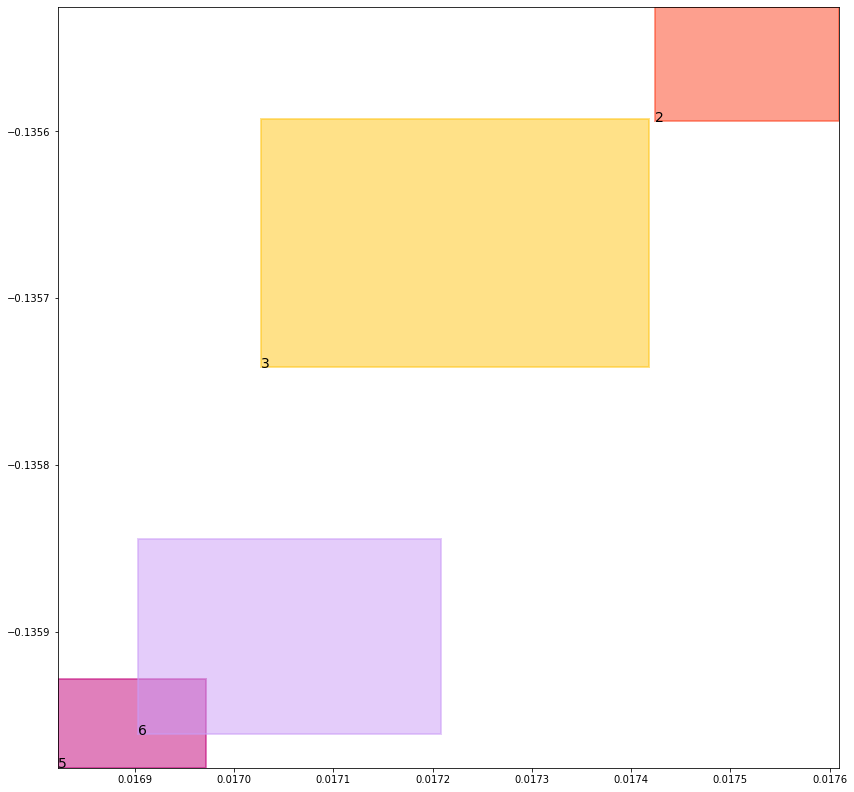

batch (tensor([[4, 6],
        [1, 2],
        [4, 5],
        [6, 2],
        [3, 5],
        [2, 6],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078348871320486, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070599392056465, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510015964508057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2658964097499847, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0393858402967453 0.03107035532593727 tensor(0.9134523272514343) tensor(0.9671601057052612)
tensor(2) 0.4719415009021759 0.49914273619651794 tensor(0.4729043543338776) tensor(0.4993564486503601)
tensor(3) 0.46980252861976624 0.49860718846321106 tensor(0.4702651798725128) tensor(0.4989920854568481)
tensor(4) 0.06233075633645058 0.011169906705617905 tensor(0.9695921540260315) tensor(0.9522258639335632)
tensor(5) 0.5190433263778687 0.48319002985954285 tensor(0.5191615819931030) tensor(0.4840480983257294)
tensor(6) 0.5217742323875427 0.48353311419487 tensor(0.5227342247962952) tensor(0.4840386211872101)


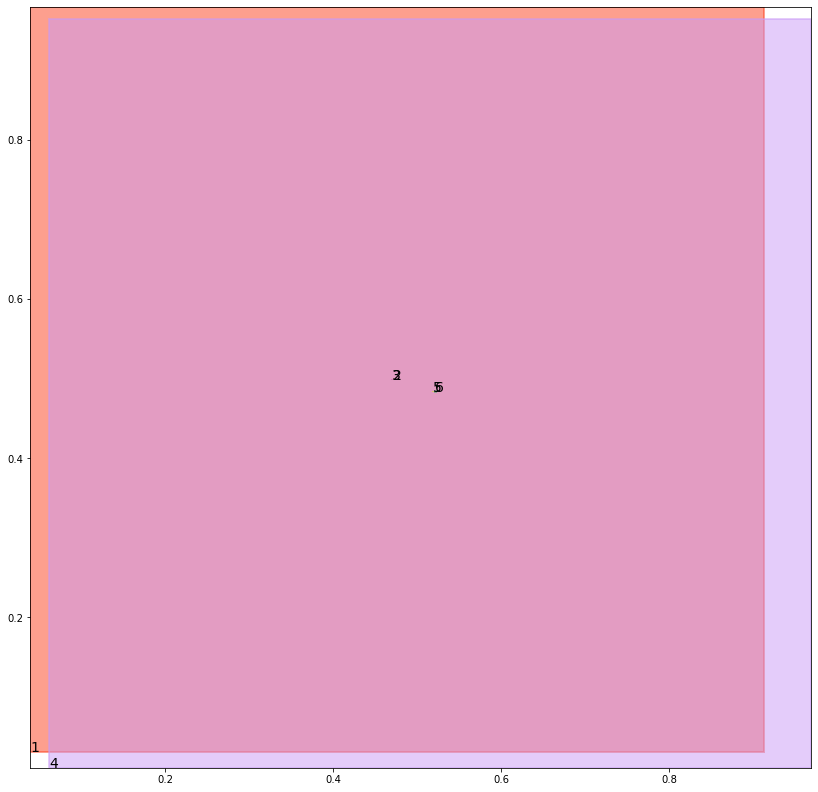

alignment data:
tensor(2) 0.034660279750823975 -0.12505361437797546 tensor(0.0347942113876343) tensor(-0.1250049173831940)
tensor(3) 0.034346044063568115 -0.12516838312149048 tensor(0.0344886183738708) tensor(-0.1251146495342255)
tensor(5) 0.0338895320892334 -0.12550809979438782 tensor(0.0341365933418274) tensor(-0.1254127323627472)
tensor(6) 0.034196317195892334 -0.1253982037305832 tensor(0.0344108939170837) tensor(-0.1253182142972946)


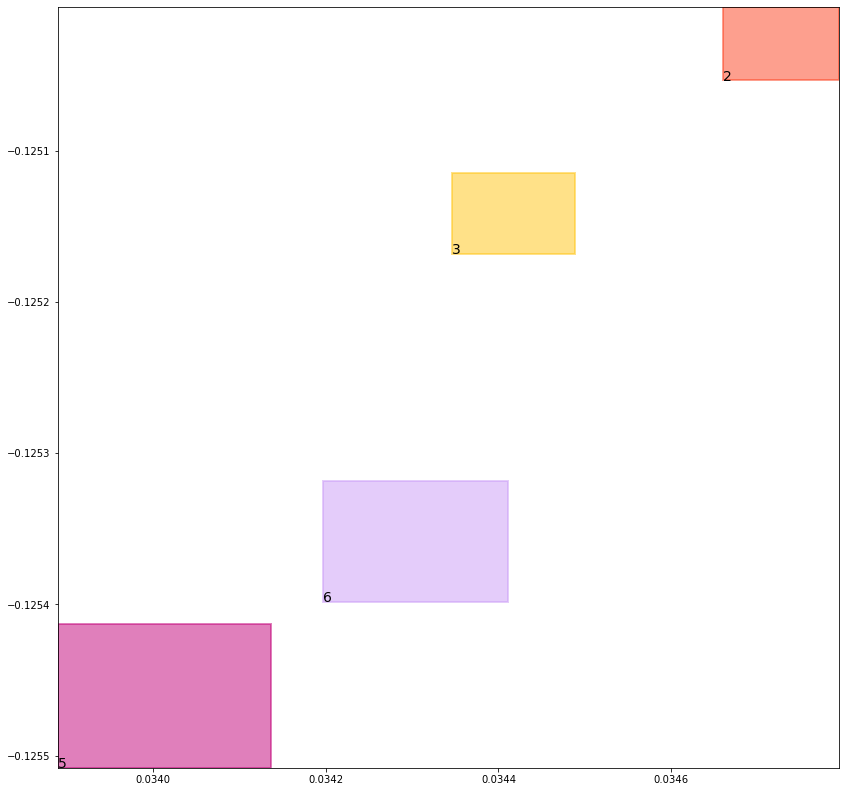

batch (tensor([[2, 6],
        [1, 3],
        [4, 6],
        [4, 5],
        [5, 3],
        [6, 2],
        [1, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078102275729179, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070462236180902, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510040700435638, grad_fn=<MulBackward0>)
previous loss: tensor(0.2658605277538300, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03933502361178398 0.030898917466402054 tensor(0.9138150215148926) tensor(0.9672196507453918)
tensor(2) 0.47186556458473206 0.49866461753845215 tensor(0.4736590683460236) tensor(0.4992769658565521)
tensor(3) 0.46999216079711914 0.49821463227272034 tensor(0.4703903794288635) tensor(0.4992052912712097)
tensor(4) 0.061998218297958374 0.011095904745161533 tensor(0.9696199893951416) tensor(0.9522895216941833)
tensor(5) 0.5175278186798096 0.4829727113246918 tensor(0.5197497010231018) tensor(0.4840901792049408)
tensor(6) 0.5213728547096252 0.48374730348587036 tensor(0.5228245854377747) tensor(0.4843777418136597)


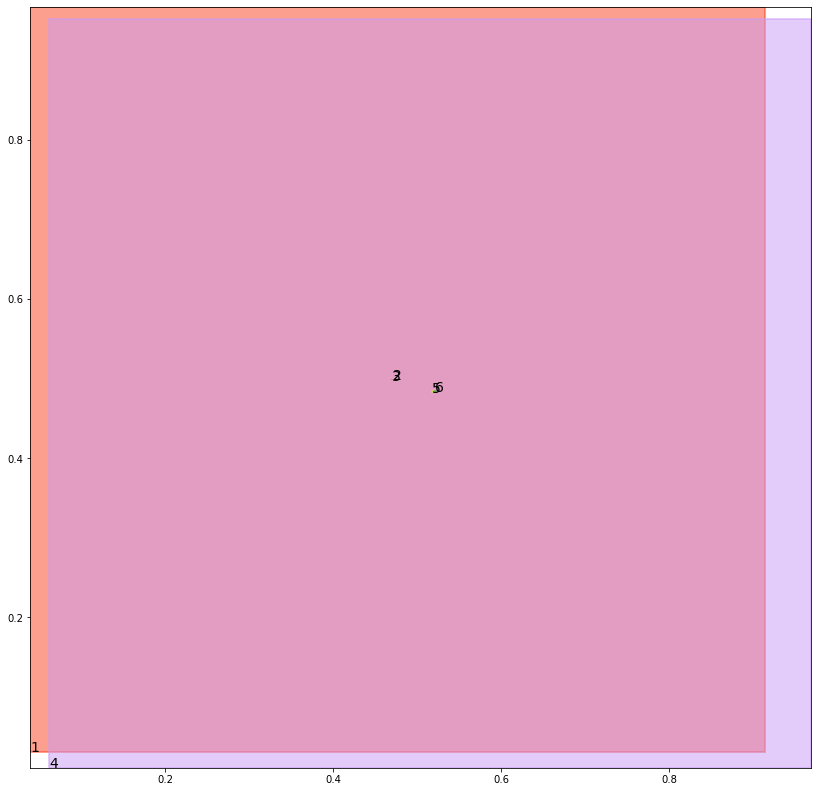

alignment data:
tensor(2) 0.05032092332839966 -0.10504063963890076 tensor(0.0506300926208496) tensor(-0.1049267798662186)
tensor(3) 0.050050556659698486 -0.10513923317193985 tensor(0.0503559708595276) tensor(-0.1050221547484398)
tensor(5) 0.04952669143676758 -0.10550115257501602 tensor(0.0500090718269348) tensor(-0.1053215339779854)
tensor(6) 0.05004042387008667 -0.10531480610370636 tensor(0.0503279566764832) tensor(-0.1052081584930420)


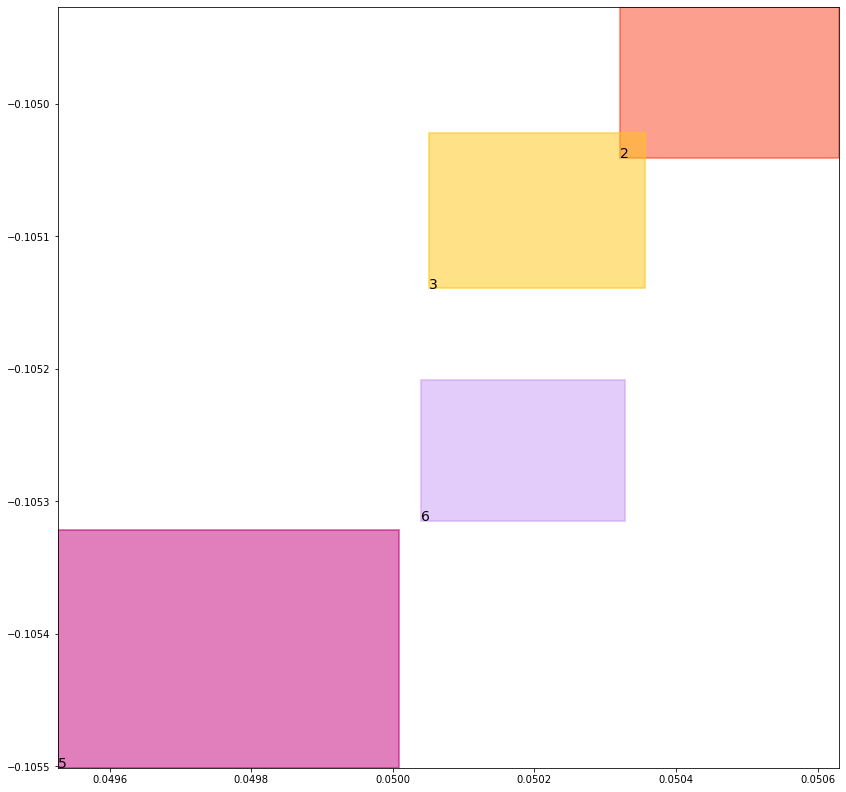

batch (tensor([[5, 3],
        [1, 3],
        [4, 6],
        [3, 5],
        [4, 5],
        [2, 6],
        [1, 2],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078130811452866, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070633911527693, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509982287883759, grad_fn=<MulBackward0>)
previous loss: tensor(0.2658747136592865, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03928433358669281 0.030729036778211594 tensor(0.9141755104064941) tensor(0.9672790765762329)
tensor(2) 0.47210070490837097 0.49850600957870483 tensor(0.4737263619899750) tensor(0.4992158710956573)
tensor(3) 0.47007685899734497 0.49783286452293396 tensor(0.4706868231296539) tensor(0.4994109570980072)
tensor(4) 0.0616685189306736 0.011022726073861122 tensor(0.9696478843688965) tensor(0.9523531198501587)
tensor(5) 0.5167234539985657 0.48326027393341064 tensor(0.5199616551399231) tensor(0.4839817583560944)
tensor(6) 0.5212332010269165 0.48364490270614624 tensor(0.5224921107292175) tensor(0.4846228361129761)


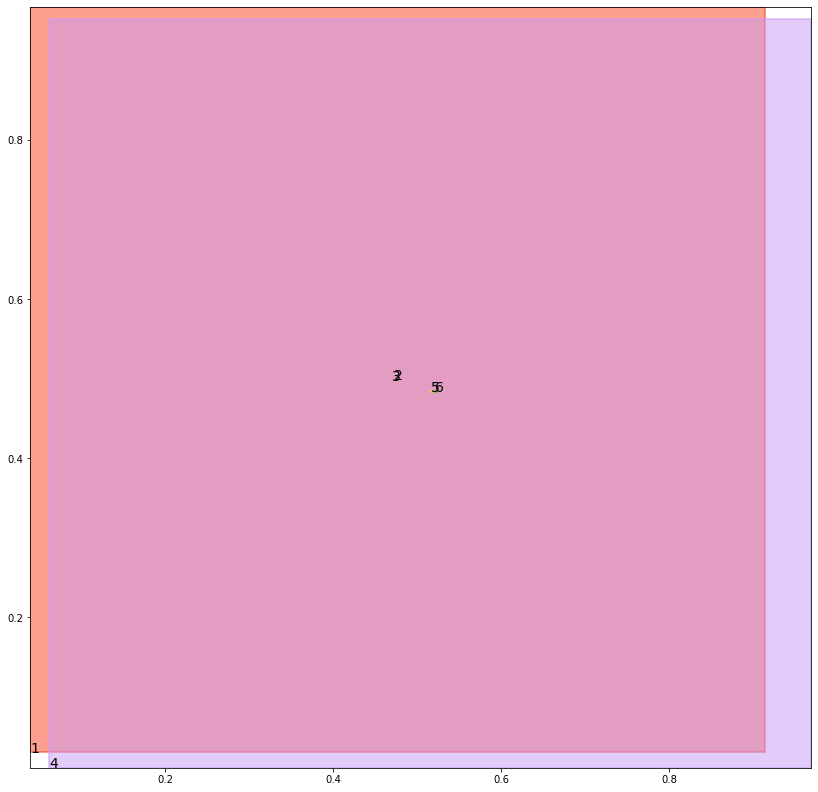

alignment data:
tensor(2) 0.06738370656967163 -0.08019182085990906 tensor(0.0677070617675781) tensor(-0.0800718516111374)
tensor(3) 0.06703948974609375 -0.08031852543354034 tensor(0.0675237178802490) tensor(-0.0801326930522919)
tensor(5) 0.06664770841598511 -0.08062794804573059 tensor(0.0671002268791199) tensor(-0.0804633572697639)
tensor(6) 0.06710624694824219 -0.08046530187129974 tensor(0.0674749612808228) tensor(-0.0803264379501343)


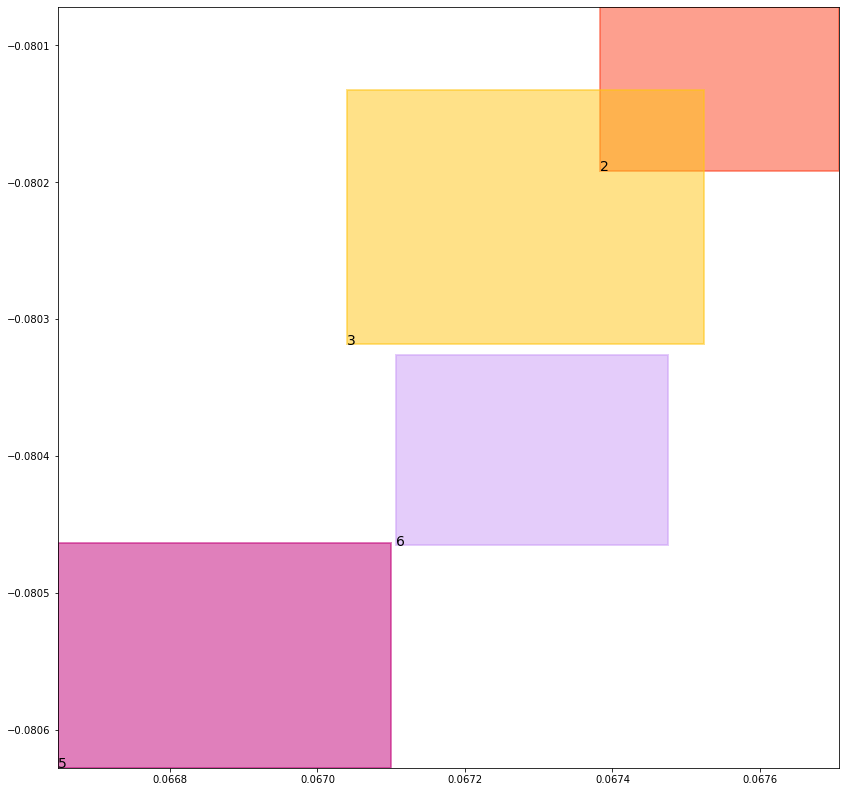

batch (tensor([[4, 5],
        [5, 3],
        [1, 3],
        [4, 6],
        [3, 5],
        [2, 6],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0078060524538159, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070615904405713, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509961426258087, grad_fn=<MulBackward0>)
previous loss: tensor(0.2658637762069702, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.039233770221471786 0.030560661107301712 tensor(0.9145336151123047) tensor(0.9673383235931396)
tensor(2) 0.47261643409729004 0.4988299608230591 tensor(0.4731745123863220) tensor(0.4989790916442871)
tensor(3) 0.4704850912094116 0.4978128671646118 tensor(0.4707196354866028) tensor(0.4992592632770538)
tensor(4) 0.06134157255291939 0.010950365103781223 tensor(0.9696756601333618) tensor(0.9524166584014893)
tensor(5) 0.516671359539032 0.48373815417289734 tensor(0.5197261571884155) tensor(0.4839982986450195)
tensor(6) 0.5213296413421631 0.48371338844299316 tensor(0.5217782855033875) tensor(0.4843217134475708)


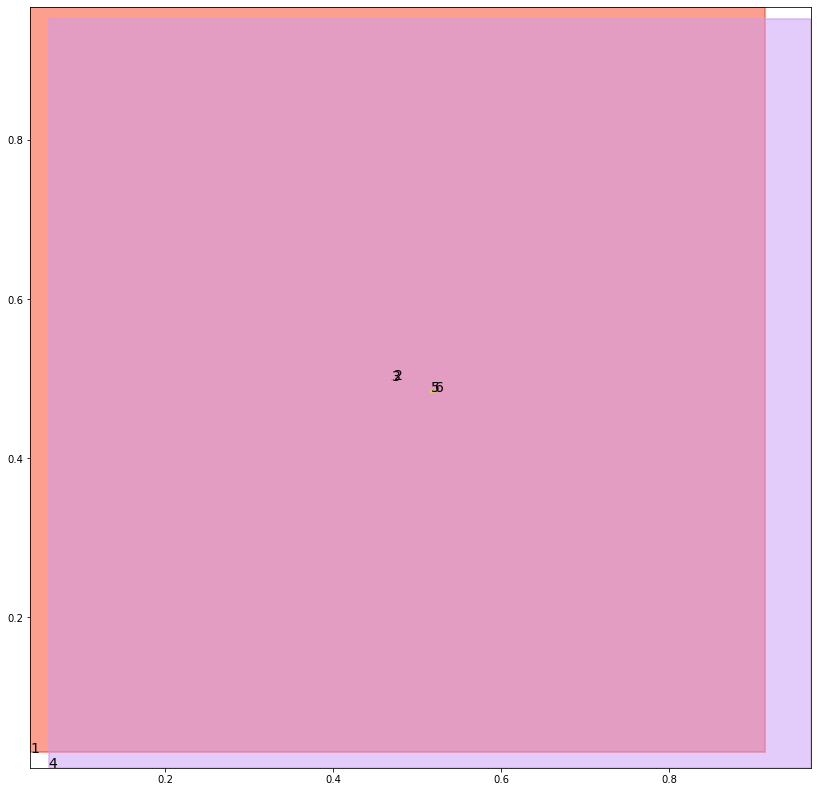

alignment data:
tensor(2) 0.08839088678359985 -0.05658843368291855 tensor(0.0884758234024048) tensor(-0.0565573796629906)
tensor(3) 0.08794265985488892 -0.05675515532493591 tensor(0.0883609652519226) tensor(-0.0565935745835304)
tensor(5) 0.08766812086105347 -0.05701921135187149 tensor(0.0879792571067810) tensor(-0.0569088682532310)
tensor(6) 0.08802598714828491 -0.0568961501121521 tensor(0.0882294178009033) tensor(-0.0568187832832336)


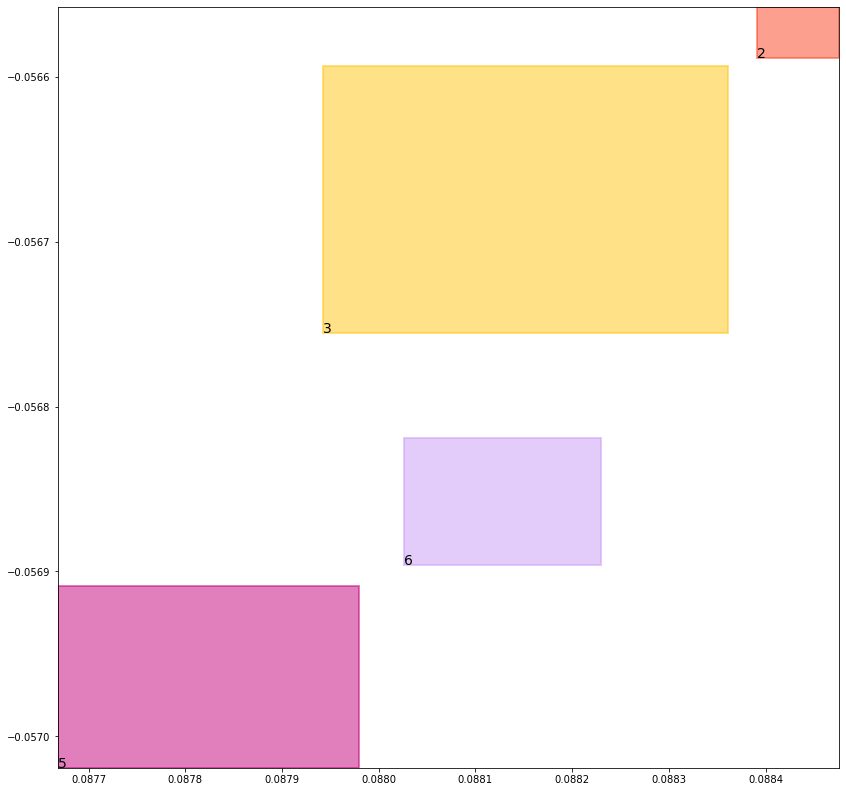

batch (tensor([[6, 2],
        [4, 5],
        [1, 2],
        [1, 3],
        [4, 6],
        [5, 3],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077722026035190, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070371599867940, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510014176368713, grad_fn=<MulBackward0>)
previous loss: tensor(0.2658107876777649, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03918332979083061 0.03039381094276905 tensor(0.9148892164230347) tensor(0.9673974514007568)
tensor(2) 0.4720686376094818 0.4985838234424591 tensor(0.4733842313289642) tensor(0.4995844364166260)
tensor(3) 0.47051480412483215 0.49812227487564087 tensor(0.4711849689483643) tensor(0.4987860620021820)
tensor(4) 0.06101740151643753 0.010878827422857285 tensor(0.9697033762931824) tensor(0.9524801373481750)
tensor(5) 0.5172963738441467 0.4836629629135132 tensor(0.5190870165824890) tensor(0.4841859042644501)
tensor(6) 0.5207226276397705 0.4835297167301178 tensor(0.5216390490531921) tensor(0.4839374125003815)


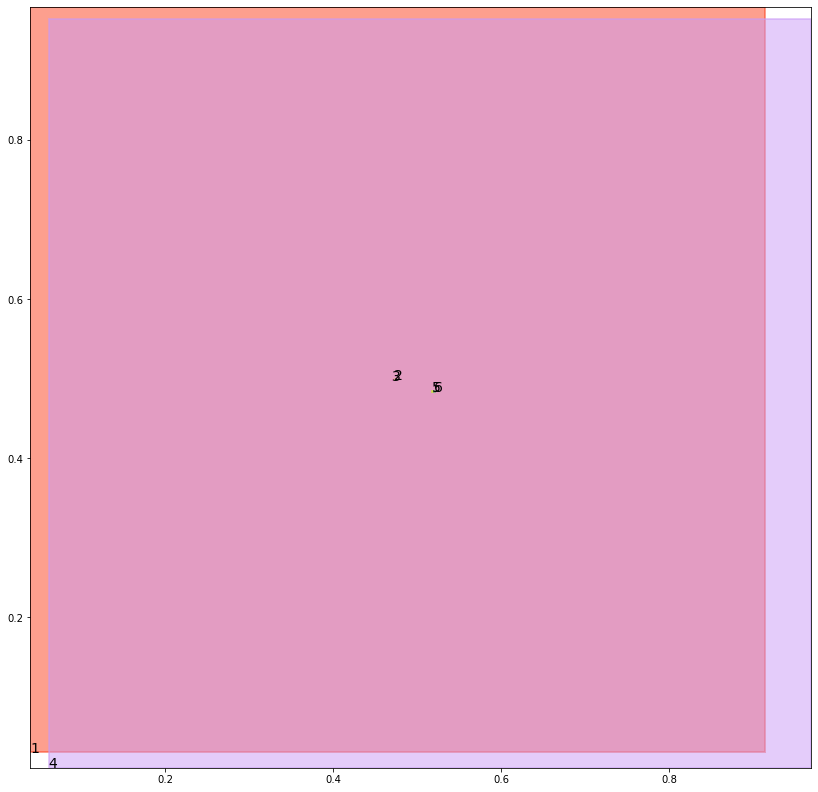

alignment data:
tensor(2) 0.1080019474029541 -0.04808560758829117 tensor(0.1083818078041077) tensor(-0.0479426607489586)
tensor(3) 0.10775226354598999 -0.04817719757556915 tensor(0.1079884171485901) tensor(-0.0480878427624702)
tensor(5) 0.10743343830108643 -0.04846205562353134 tensor(0.1077186465263367) tensor(-0.0483574718236923)
tensor(6) 0.10766589641571045 -0.04838360846042633 tensor(0.1078505516052246) tensor(-0.0483150482177734)


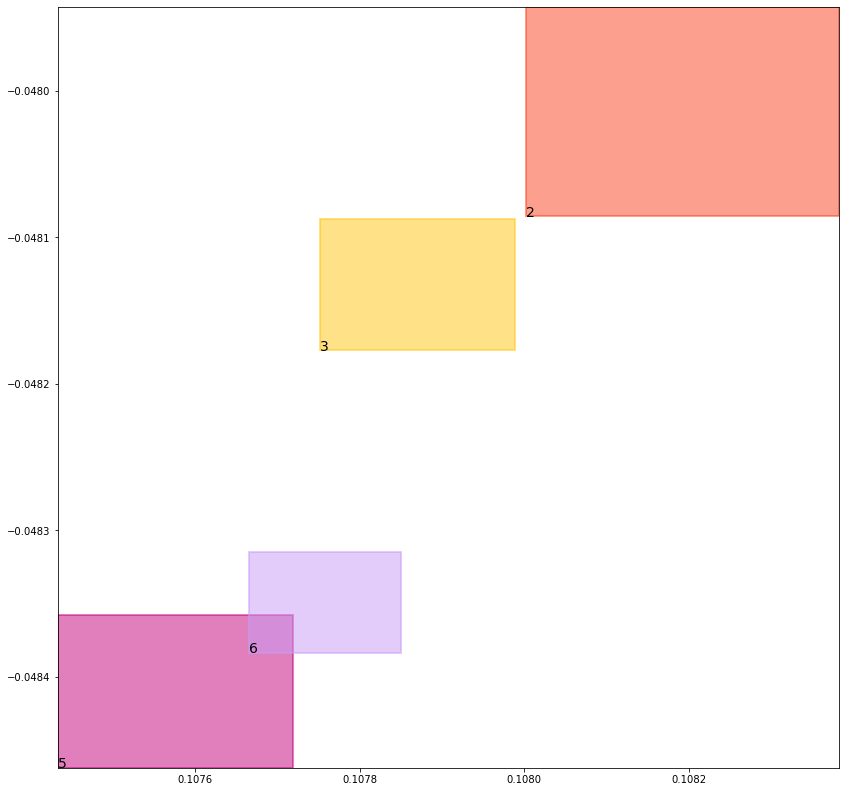

batch (tensor([[5, 3],
        [4, 5],
        [2, 6],
        [6, 2],
        [4, 6],
        [1, 3],
        [3, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077728033065796, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070211924612522, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510009706020355, grad_fn=<MulBackward0>)
previous loss: tensor(0.2657949626445770, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03913300484418869 0.03022848628461361 tensor(0.9152424335479736) tensor(0.9674564599990845)
tensor(2) 0.47173506021499634 0.4984011650085449 tensor(0.4737971127033234) tensor(0.4997662305831909)
tensor(3) 0.4705973267555237 0.4980267286300659 tensor(0.4715249538421631) tensor(0.4987265765666962)
tensor(4) 0.06069605052471161 0.01080808974802494 tensor(0.9697310328483582) tensor(0.9525435566902161)
tensor(5) 0.5180847644805908 0.4837407171726227 tensor(0.5185270309448242) tensor(0.4838708639144897)
tensor(6) 0.520134687423706 0.4833265542984009 tensor(0.5216667056083679) tensor(0.4839778542518616)


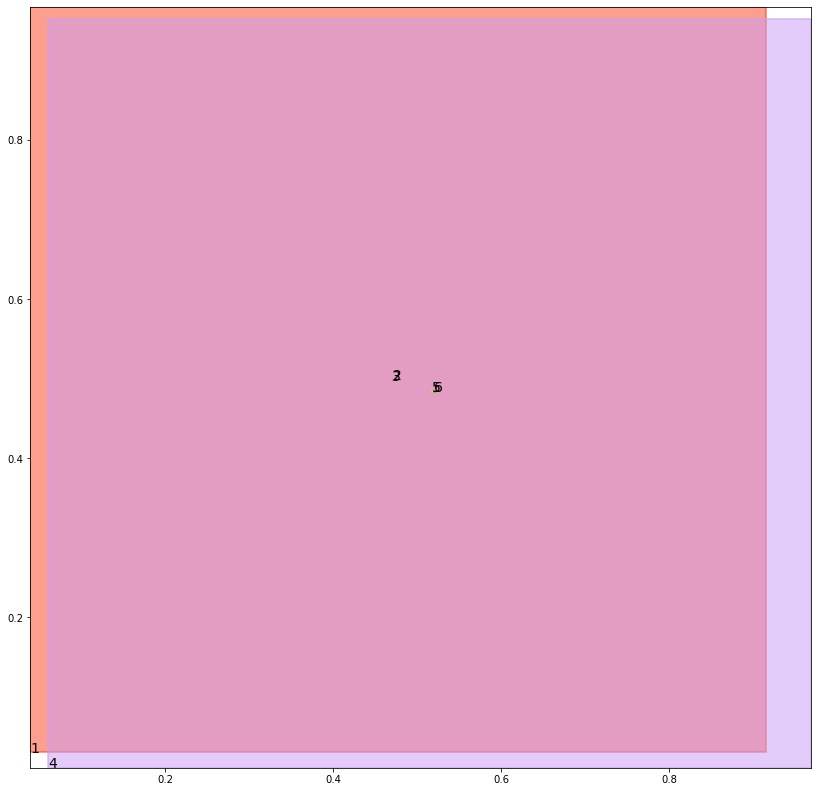

alignment data:
tensor(2) 0.13046884536743164 -0.04456213116645813 tensor(0.1310083270072937) tensor(-0.0443597361445427)
tensor(3) 0.1302756667137146 -0.0446331650018692 tensor(0.1305421590805054) tensor(-0.0445329397916794)
tensor(5) 0.13007599115371704 -0.04487566649913788 tensor(0.1301468014717102) tensor(-0.0448497086763382)
tensor(6) 0.13012313842773438 -0.04486443102359772 tensor(0.1304239034652710) tensor(-0.0447529703378677)


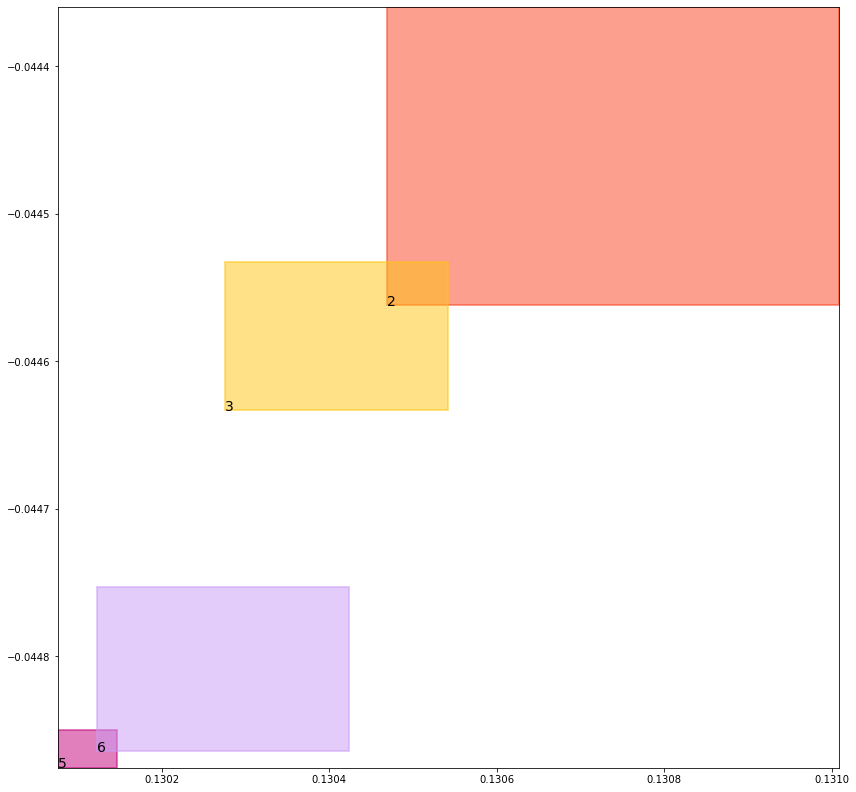

batch (tensor([[1, 2],
        [4, 5],
        [1, 3],
        [4, 6],
        [3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077742151916027, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070046260952950, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510002255439758, grad_fn=<MulBackward0>)
previous loss: tensor(0.2657790780067444, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03908277675509453 0.030064649879932404 tensor(0.9155932664871216) tensor(0.9675154089927673)
tensor(2) 0.4721011221408844 0.49841076135635376 tensor(0.4738887548446655) tensor(0.4994272589683533)
tensor(3) 0.47093966603279114 0.49766597151756287 tensor(0.4715390503406525) tensor(0.4989322721958160)
tensor(4) 0.0603775791823864 0.010738140903413296 tensor(0.9697587490081787) tensor(0.9526069164276123)
tensor(5) 0.5175788998603821 0.48310795426368713 tensor(0.5189363956451416) tensor(0.4839554131031036)
tensor(6) 0.5199706554412842 0.48365727066993713 tensor(0.5214397907257080) tensor(0.4838528931140900)


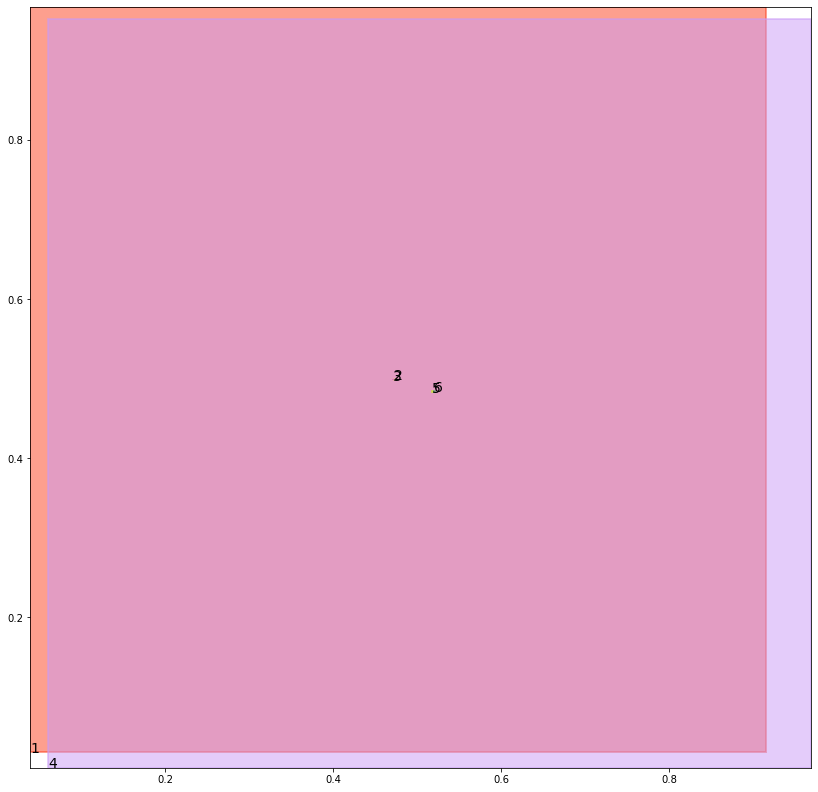

alignment data:
tensor(2) 0.15007692575454712 -0.04663301259279251 tensor(0.1504986882209778) tensor(-0.0464753806591034)
tensor(3) 0.14977949857711792 -0.04674450308084488 tensor(0.1501762270927429) tensor(-0.0465924292802811)
tensor(5) 0.14945346117019653 -0.047034502029418945 tensor(0.1497946977615356) tensor(-0.0469067022204399)
tensor(6) 0.14979428052902222 -0.04691047966480255 tensor(0.1499644517898560) tensor(-0.0468495190143585)


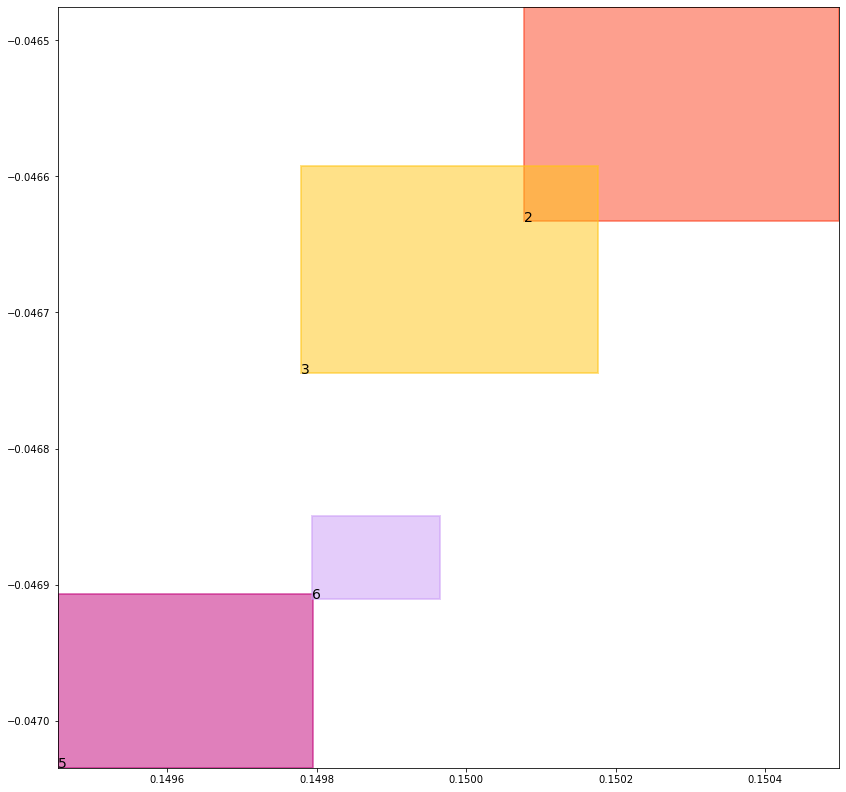

batch (tensor([[1, 2],
        [1, 3],
        [4, 5],
        [2, 6],
        [5, 3],
        [6, 2],
        [3, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077568250708282, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0070056766271591, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509987652301788, grad_fn=<MulBackward0>)
previous loss: tensor(0.2657612562179565, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03903266042470932 0.029902277514338493 tensor(0.9159418940544128) tensor(0.9675740599632263)
tensor(2) 0.4730973243713379 0.4985946714878082 tensor(0.4736906290054321) tensor(0.4986217021942139)
tensor(3) 0.4712594151496887 0.49766385555267334 tensor(0.4715157151222229) tensor(0.4987770020961761)
tensor(4) 0.06006190553307533 0.01066895667463541 tensor(0.9697863459587097) tensor(0.9526702165603638)
tensor(5) 0.5175231695175171 0.4829002916812897 tensor(0.5186008810997009) tensor(0.4840017557144165)
tensor(6) 0.5201893448829651 0.483578085899353 tensor(0.5209829211235046) tensor(0.4844659864902496)


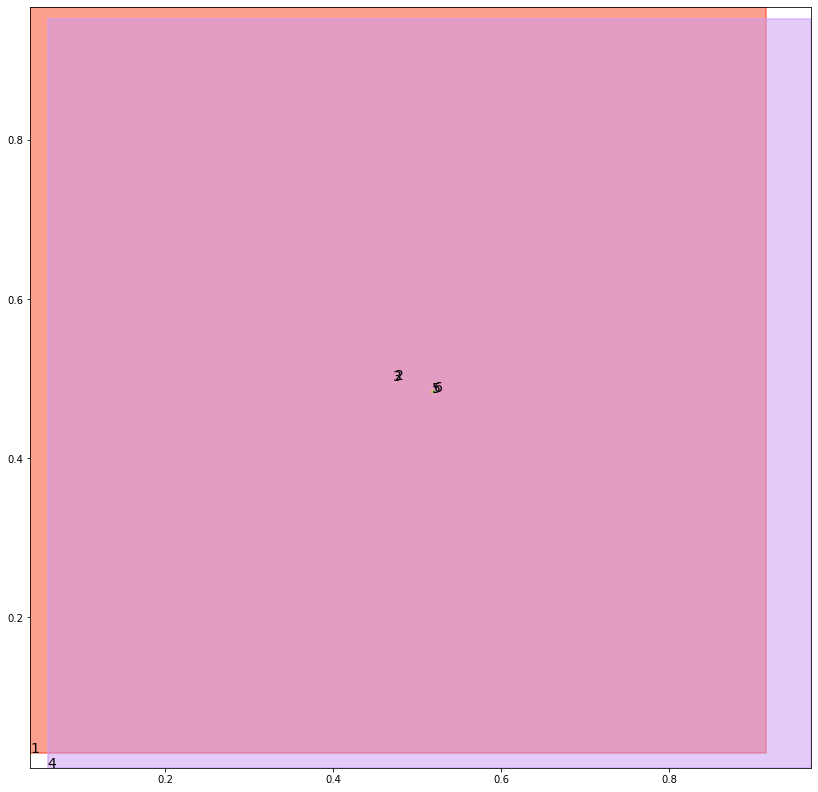

alignment data:
tensor(2) 0.17305338382720947 -0.05803171545267105 tensor(0.1731079220771790) tensor(-0.0580126121640205)
tensor(3) 0.17265093326568604 -0.05818164348602295 tensor(0.1729780435562134) tensor(-0.0580553859472275)
tensor(5) 0.17225432395935059 -0.05849926173686981 tensor(0.1726434826850891) tensor(-0.0583518072962761)
tensor(6) 0.17265278100967407 -0.05835379660129547 tensor(0.1729605793952942) tensor(-0.0582370087504387)


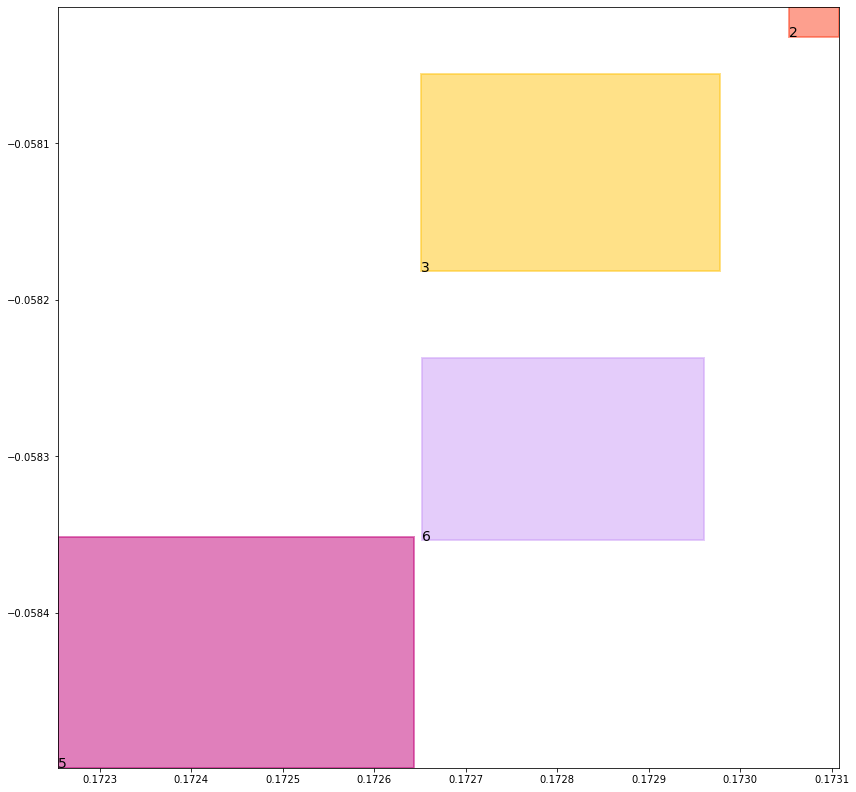

batch (tensor([[3, 5],
        [4, 5],
        [5, 3],
        [1, 3],
        [2, 6],
        [4, 6],
        [1, 2],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077188024297357, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069956826046109, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510010004043579, grad_fn=<MulBackward0>)
previous loss: tensor(0.2657154798507690, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03898266330361366 0.029741376638412476 tensor(0.9162880778312683) tensor(0.9676326513290405)
tensor(2) 0.4732331335544586 0.497411847114563 tensor(0.4746559560298920) tensor(0.4989343881607056)
tensor(3) 0.4713380038738251 0.4979841113090515 tensor(0.4718004465103149) tensor(0.4982969462871552)
tensor(4) 0.059749070554971695 0.010600518435239792 tensor(0.9698138833045959) tensor(0.9527335166931152)
tensor(5) 0.5175942182540894 0.48319822549819946 tensor(0.5178739428520203) tensor(0.4838954806327820)
tensor(6) 0.5203182697296143 0.4834941625595093 tensor(0.5207524895668030) tensor(0.4846669137477875)


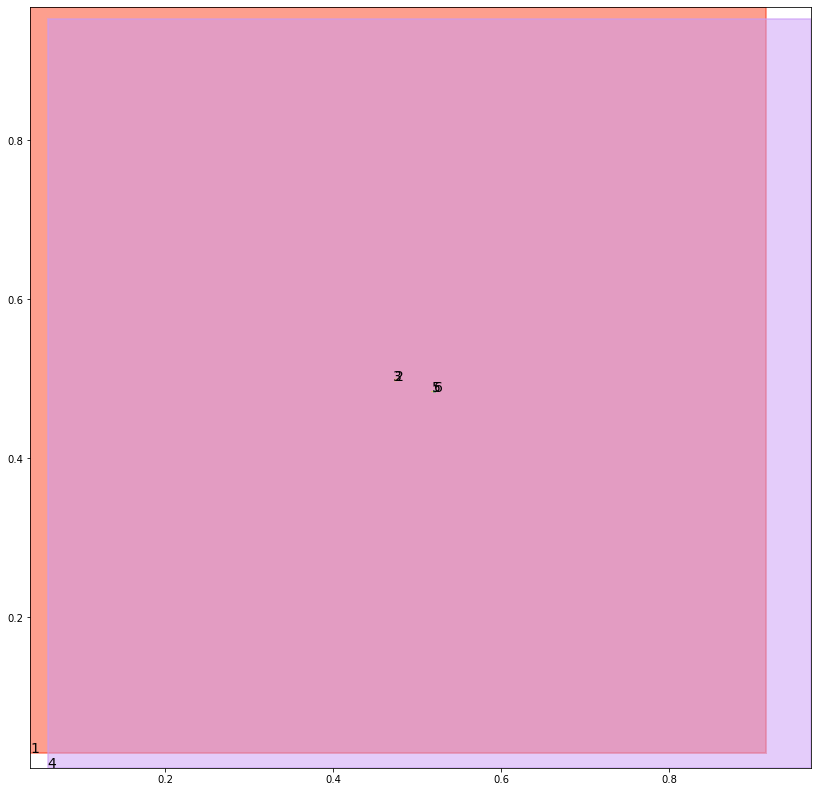

alignment data:
tensor(2) 0.19699609279632568 -0.07249476760625839 tensor(0.1975288391113281) tensor(-0.0722927451133728)
tensor(3) 0.19700276851654053 -0.07248542457818985 tensor(0.1971257925033569) tensor(-0.0724392682313919)
tensor(5) 0.19661474227905273 -0.07280108332633972 tensor(0.1968290805816650) tensor(-0.0727187395095825)
tensor(6) 0.1969132423400879 -0.07269474118947983 tensor(0.1972708702087402) tensor(-0.0725572854280472)


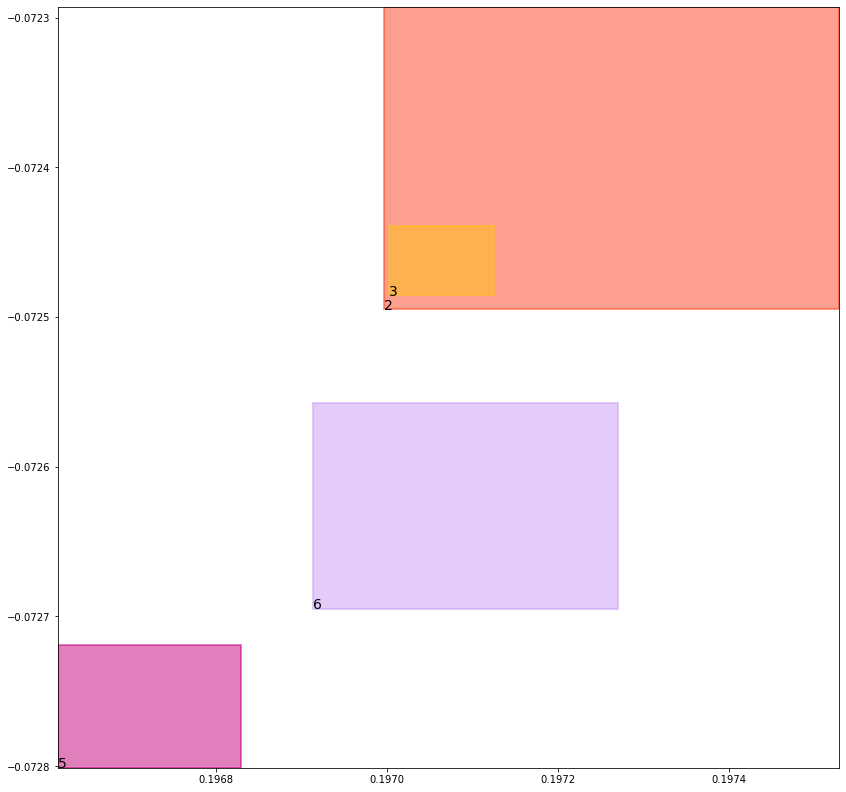

batch (tensor([[1, 2],
        [3, 5],
        [6, 2],
        [4, 6],
        [2, 6],
        [5, 3],
        [4, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077223759144545, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069759050384164, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509993314743042, grad_fn=<MulBackward0>)
previous loss: tensor(0.2656975984573364, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.038932789117097855 0.029581867158412933 tensor(0.9166318774223328) tensor(0.9676911830902100)
tensor(2) 0.47312432527542114 0.49680206179618835 tensor(0.4754492640495300) tensor(0.4990575313568115)
tensor(3) 0.4717400372028351 0.4975264370441437 tensor(0.4718219935894012) tensor(0.4985941350460052)
tensor(4) 0.05943909287452698 0.010532822459936142 tensor(0.9698413610458374) tensor(0.9527966976165771)
tensor(5) 0.5173481106758118 0.48365098237991333 tensor(0.5177670121192932) tensor(0.4839508235454559)
tensor(6) 0.5199413299560547 0.4835794270038605 tensor(0.5208494663238525) tensor(0.4843205809593201)


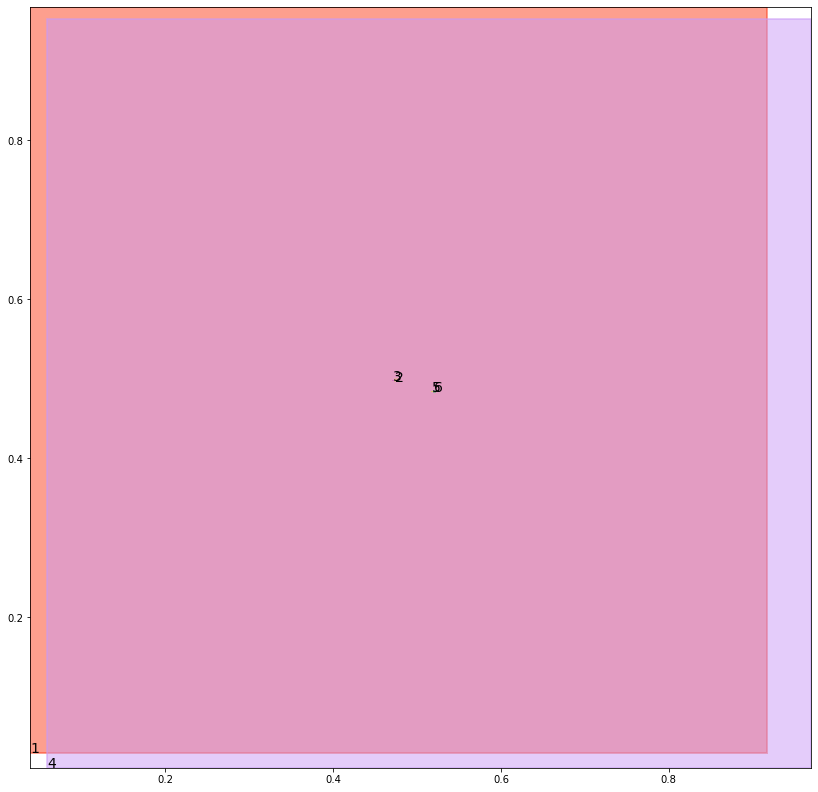

alignment data:
tensor(2) 0.21528512239456177 -0.08508895337581635 tensor(0.2160918116569519) tensor(-0.0847836211323738)
tensor(3) 0.2153739333152771 -0.08504946529865265 tensor(0.2156743407249451) tensor(-0.0849329158663750)
tensor(5) 0.21519899368286133 -0.08528120815753937 tensor(0.2153149247169495) tensor(-0.0852375999093056)
tensor(6) 0.2153865098953247 -0.08521760255098343 tensor(0.2156631350517273) tensor(-0.0851133018732071)


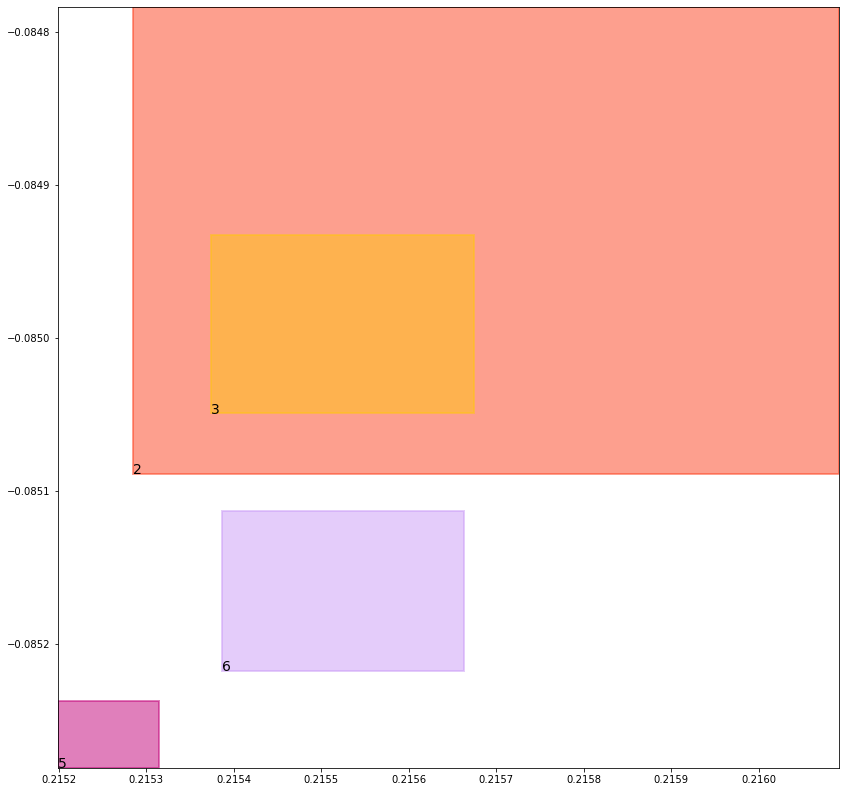

batch (tensor([[1, 3],
        [6, 2],
        [3, 5],
        [2, 6],
        [4, 5],
        [1, 2],
        [5, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077271219342947, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069664819166064, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509969472885132, grad_fn=<MulBackward0>)
previous loss: tensor(0.2656905651092529, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0388830341398716 0.02942366898059845 tensor(0.9169736504554749) tensor(0.9677494168281555)
tensor(2) 0.47333139181137085 0.49674391746520996 tensor(0.4755463898181915) tensor(0.4989827871322632)
tensor(3) 0.4716060757637024 0.4971630871295929 tensor(0.4724339842796326) tensor(0.4988079071044922)
tensor(4) 0.05913189798593521 0.010465875267982483 tensor(0.9698689579963684) tensor(0.9528599381446838)
tensor(5) 0.5172470808029175 0.48357588052749634 tensor(0.5177870988845825) tensor(0.4841457903385162)
tensor(6) 0.519824206829071 0.4834883511066437 tensor(0.5205254554748535) tensor(0.4838154017925262)


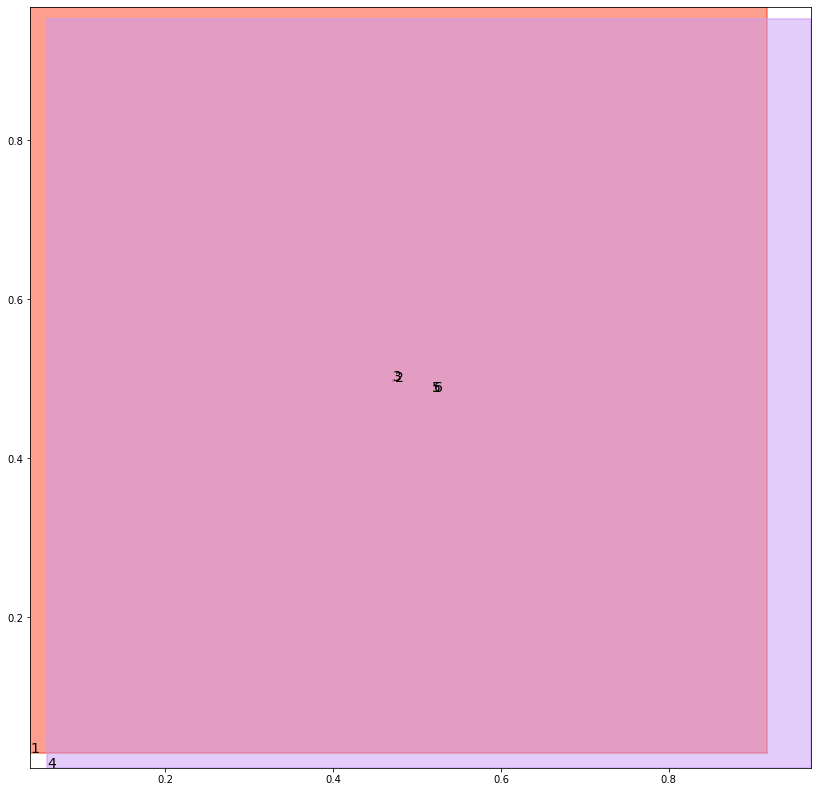

alignment data:
tensor(2) 0.23156297206878662 -0.09094337373971939 tensor(0.2323565483093262) tensor(-0.0906426906585693)
tensor(3) 0.2315400242805481 -0.09094608575105667 tensor(0.2320589423179626) tensor(-0.0907472074031830)
tensor(5) 0.23145979642868042 -0.09114230424165726 tensor(0.2316598892211914) tensor(-0.0910664051771164)
tensor(6) 0.23164230585098267 -0.09108064323663712 tensor(0.2317884564399719) tensor(-0.0910263061523438)


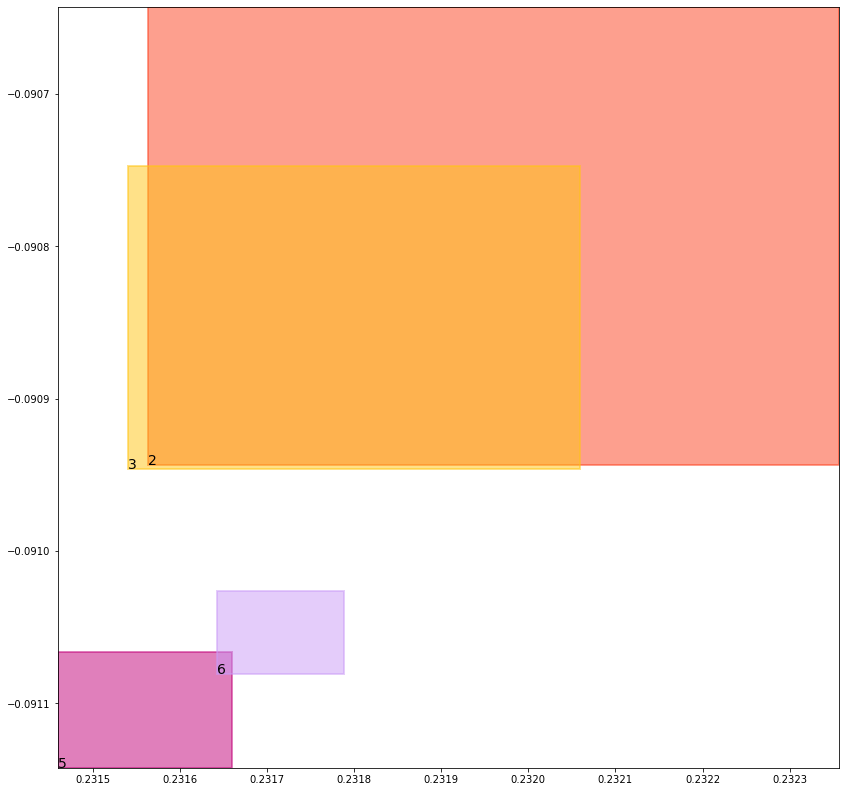

batch (tensor([[5, 3],
        [3, 5],
        [4, 6],
        [1, 3],
        [2, 6],
        [1, 2],
        [4, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0077260704711080, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069564580917358, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509957253932953, grad_fn=<MulBackward0>)
previous loss: tensor(0.2656782567501068, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.038833390921354294 0.029266759753227234 tensor(0.9173132777214050) tensor(0.9678077101707458)
tensor(2) 0.4738233685493469 0.49718308448791504 tensor(0.4750148355960846) tensor(0.4987275302410126)
tensor(3) 0.471679151058197 0.4971711039543152 tensor(0.4727664887905121) tensor(0.4986617267131805)
tensor(4) 0.058827463537454605 0.010399659164249897 tensor(0.9698963165283203) tensor(0.9529229998588562)
tensor(5) 0.5171773433685303 0.48365315794944763 tensor(0.5174820423126221) tensor(0.4838365912437439)
tensor(6) 0.519822895526886 0.48323968052864075 tensor(0.5199416875839233) tensor(0.4838654100894928)


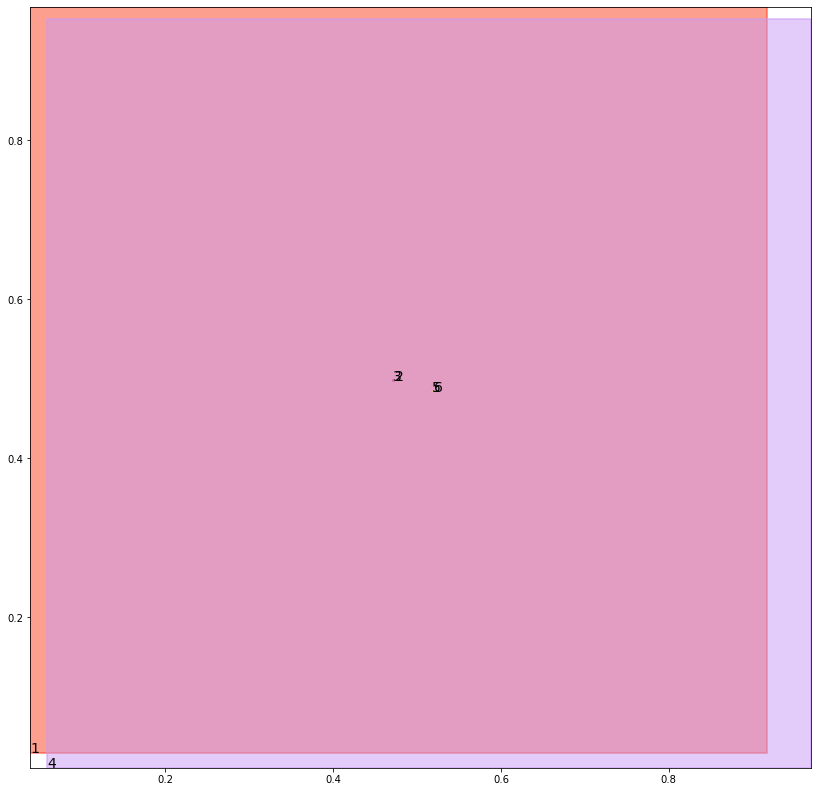

alignment data:
tensor(2) 0.24554604291915894 -0.09962224960327148 tensor(0.2460666298866272) tensor(-0.0994239747524261)
tensor(3) 0.24537038803100586 -0.09968282282352448 tensor(0.2458677887916565) tensor(-0.0994931757450104)
tensor(5) 0.2453094720840454 -0.09987223148345947 tensor(0.2453844547271729) tensor(-0.0998441725969315)
tensor(6) 0.24540841579437256 -0.0998433530330658 tensor(0.2455900907516479) tensor(-0.0997730642557144)


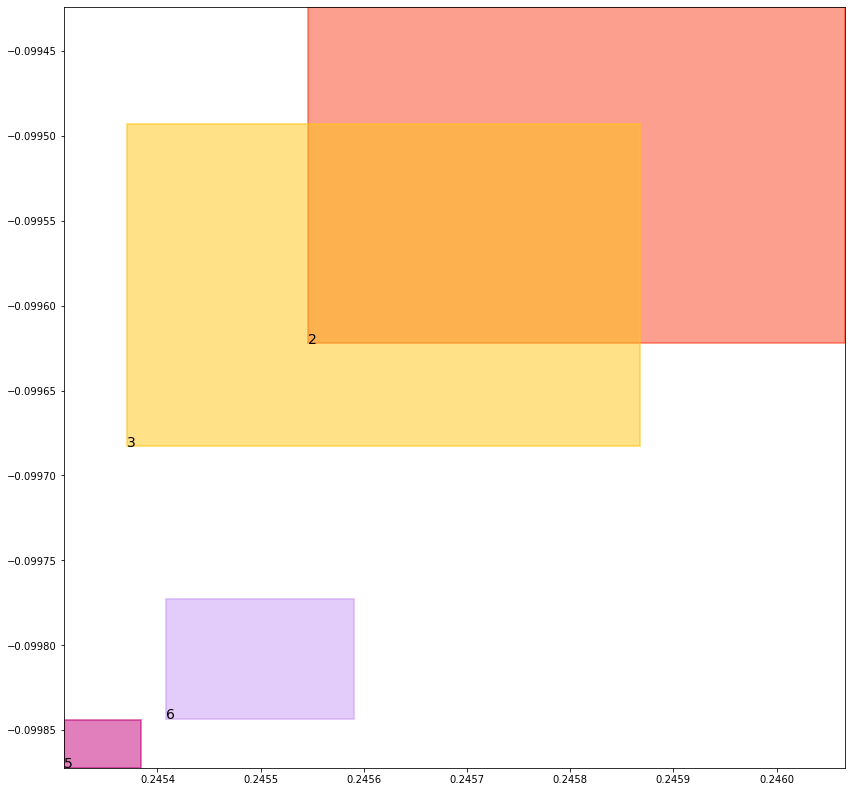

batch (tensor([[3, 5],
        [4, 5],
        [5, 3],
        [6, 2],
        [1, 2],
        [4, 6],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076991305686533, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069396523758769, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509991526603699, grad_fn=<MulBackward0>)
previous loss: tensor(0.2656379342079163, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03878386318683624 0.02911118045449257 tensor(0.9176507592201233) tensor(0.9678657650947571)
tensor(2) 0.4739212989807129 0.49806109070777893 tensor(0.4745709002017975) tensor(0.4983107447624207)
tensor(3) 0.47201329469680786 0.49751463532447815 tensor(0.4727718234062195) tensor(0.4981891214847565)
tensor(4) 0.05852578207850456 0.010334158316254616 tensor(0.9699236750602722) tensor(0.9529861211776733)
tensor(5) 0.5165075063705444 0.48307690024375916 tensor(0.5175135731697083) tensor(0.4838677346706390)
tensor(6) 0.519553542137146 0.48352769017219543 tensor(0.5197968482971191) tensor(0.4837462007999420)


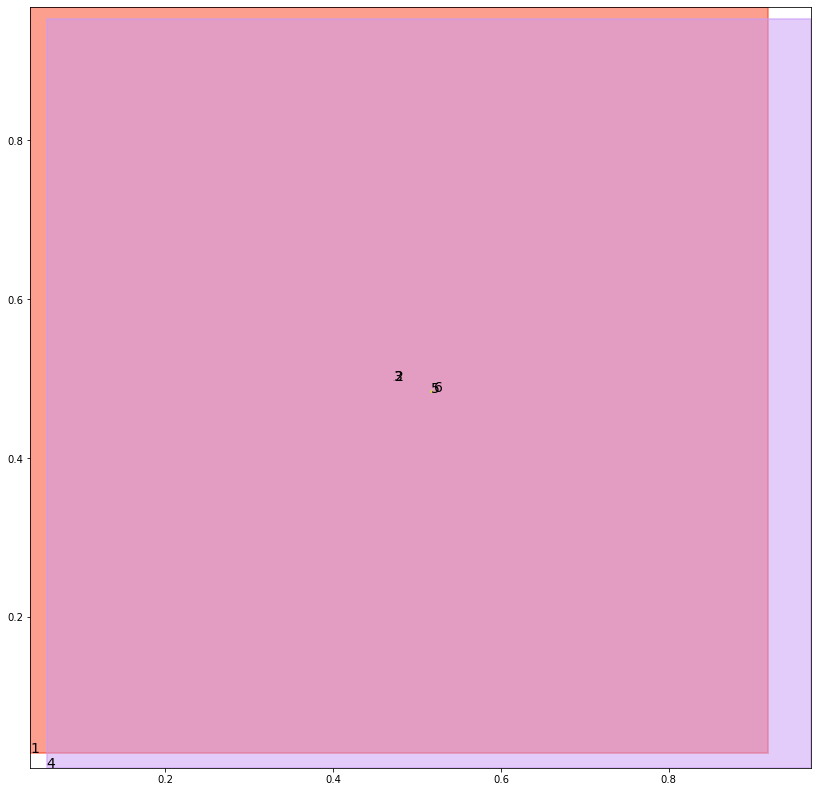

alignment data:
tensor(2) 0.2685117721557617 -0.10865062475204468 tensor(0.2686328291893005) tensor(-0.1086058765649796)
tensor(3) 0.2682076692581177 -0.10876204073429108 tensor(0.2684543132781982) tensor(-0.1086687892675400)
tensor(5) 0.26782411336898804 -0.10907461494207382 tensor(0.2681227326393127) tensor(-0.1089620441198349)
tensor(6) 0.2681936025619507 -0.10894189029932022 tensor(0.2682732939720154) tensor(-0.1089117377996445)


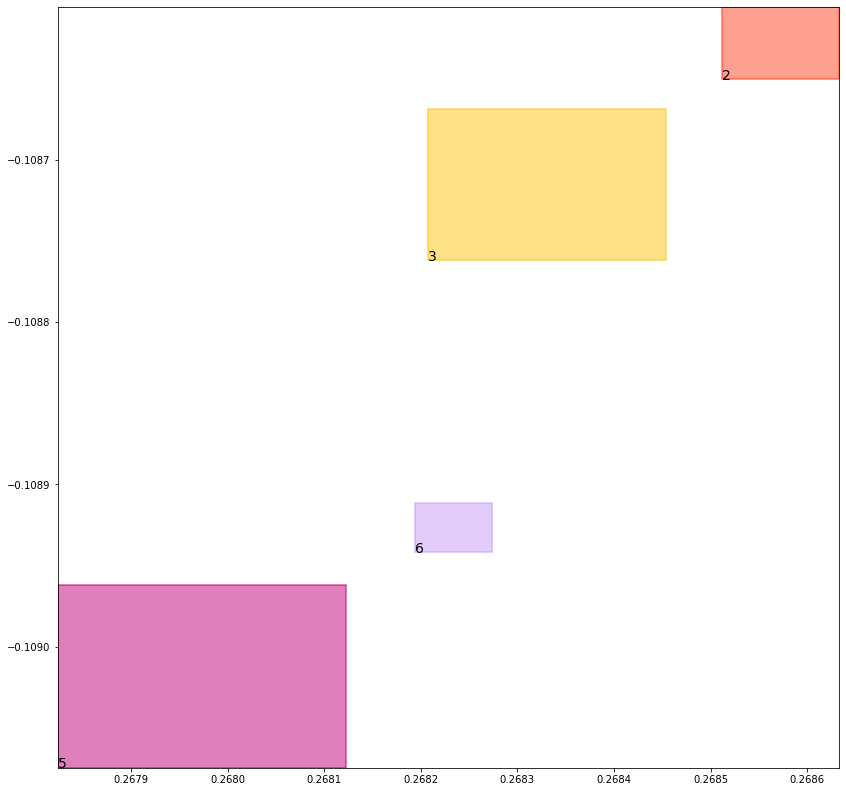

batch (tensor([[6, 2],
        [5, 3],
        [3, 5],
        [4, 5],
        [4, 6],
        [1, 3],
        [1, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076617104932666, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069404928945005, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510038912296295, grad_fn=<MulBackward0>)
previous loss: tensor(0.2656061053276062, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03873445838689804 0.02895701490342617 tensor(0.9179858565330505) tensor(0.9679236412048340)
tensor(2) 0.4735947847366333 0.49775025248527527 tensor(0.4749651253223419) tensor(0.4993235170841217)
tensor(3) 0.47248274087905884 0.49742671847343445 tensor(0.4725817143917084) tensor(0.4981523156166077)
tensor(4) 0.05822671204805374 0.010269353166222572 tensor(0.9699510335922241) tensor(0.9530491232872009)
tensor(5) 0.5162947773933411 0.4828791916370392 tensor(0.5173921585083008) tensor(0.4839121401309967)
tensor(6) 0.5194148421287537 0.4834730327129364 tensor(0.5196768045425415) tensor(0.4843049943447113)


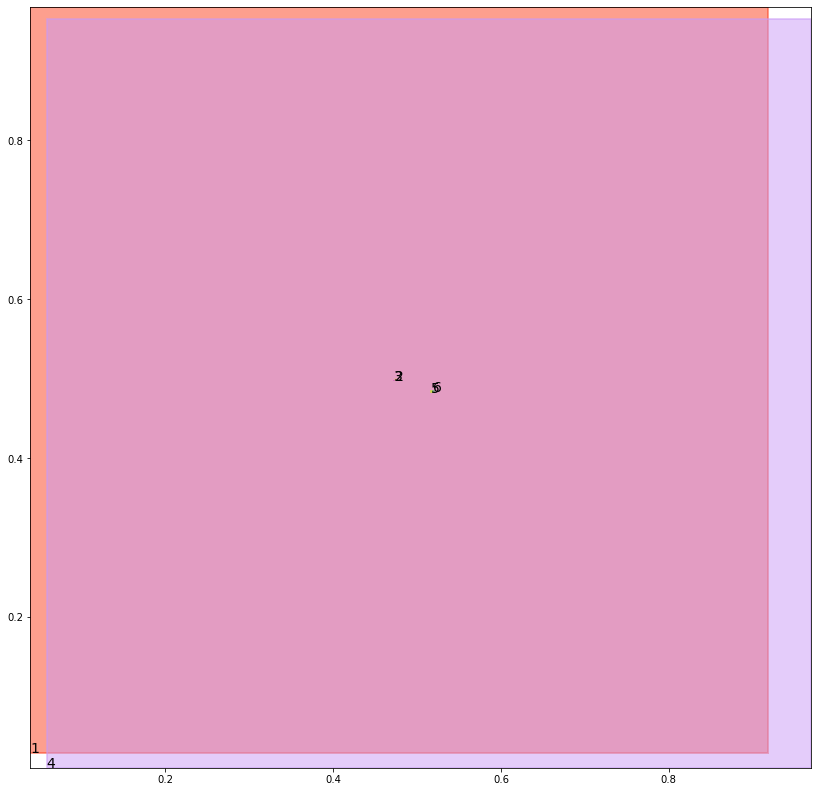

alignment data:
tensor(2) 0.2901156544685364 -0.11889795958995819 tensor(0.2906590700149536) tensor(-0.1186913773417473)
tensor(3) 0.2899368405342102 -0.11896352469921112 tensor(0.2901443243026733) tensor(-0.1188830584287643)
tensor(5) 0.2894793748855591 -0.11930344998836517 tensor(0.2898520231246948) tensor(-0.1191623359918594)
tensor(6) 0.28989487886428833 -0.11915311217308044 tensor(0.2901448607444763) tensor(-0.1190567314624786)


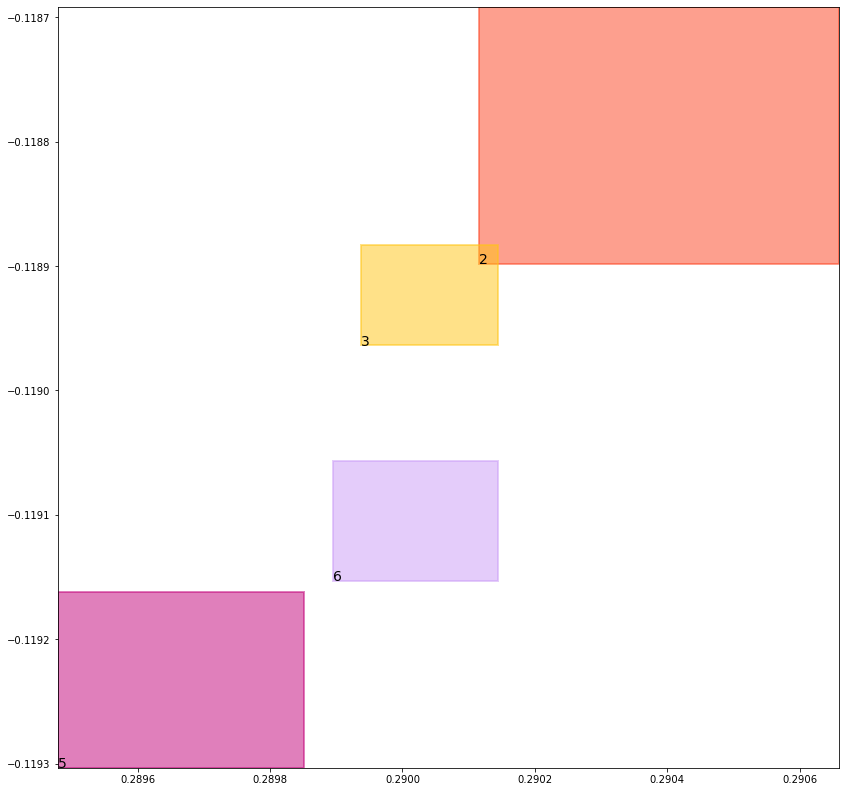

batch (tensor([[2, 6],
        [6, 2],
        [1, 2],
        [4, 6],
        [1, 3],
        [3, 5],
        [4, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076614702120423, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069398926571012, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509984672069550, grad_fn=<MulBackward0>)
previous loss: tensor(0.2655998170375824, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0386851541697979 0.028804222121834755 tensor(0.9183188080787659) tensor(0.9679815173149109)
tensor(2) 0.4739636778831482 0.49742281436920166 tensor(0.4750393629074097) tensor(0.4999578595161438)
tensor(3) 0.4725520610809326 0.49706146121025085 tensor(0.4728586971759796) tensor(0.4983879029750824)
tensor(4) 0.05793023854494095 0.010205228812992573 tensor(0.9699782729148865) tensor(0.9531120657920837)
tensor(5) 0.5167705416679382 0.4831928014755249 tensor(0.5168574452400208) tensor(0.4838022291660309)
tensor(6) 0.5192946791648865 0.4833906292915344 tensor(0.5193787217140198) tensor(0.4844866991043091)


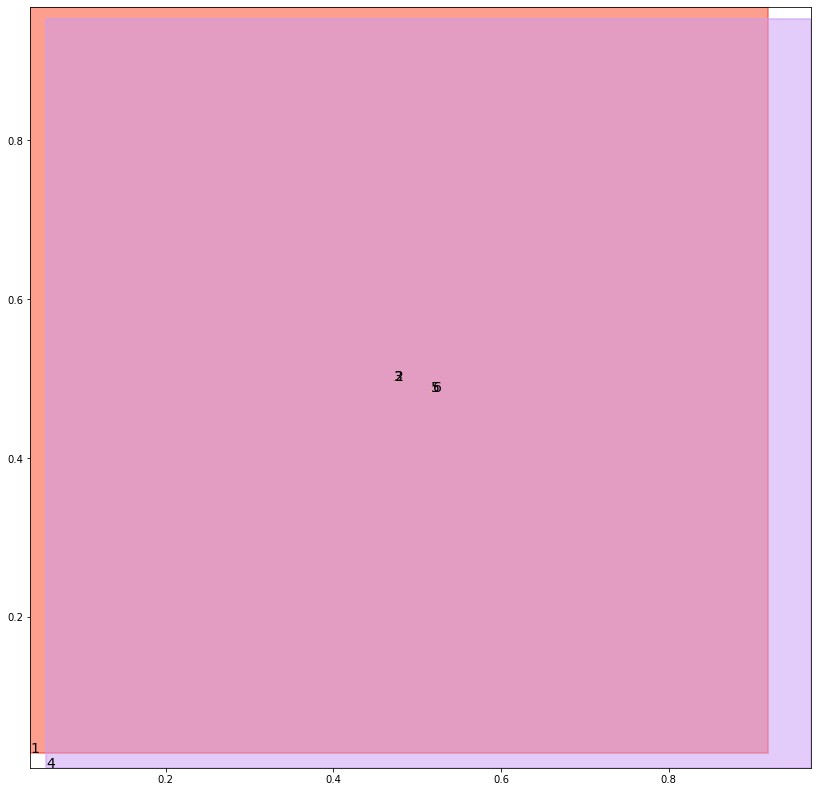

alignment data:
tensor(2) 0.30645084381103516 -0.13136807084083557 tensor(0.3072348833084106) tensor(-0.1310665607452393)
tensor(3) 0.30623704195022583 -0.13144613802433014 tensor(0.3066264986991882) tensor(-0.1312954872846603)
tensor(5) 0.306010365486145 -0.13169890642166138 tensor(0.3061849474906921) tensor(-0.1316311806440353)
tensor(6) 0.30626940727233887 -0.13160733878612518 tensor(0.3065775036811829) tensor(-0.1314875781536102)


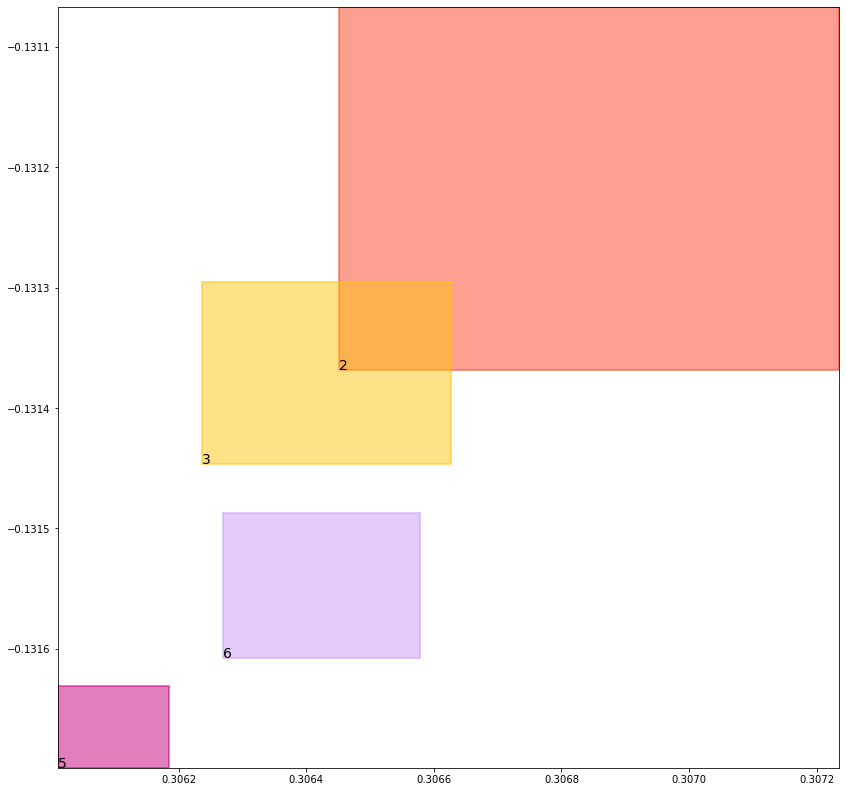

batch (tensor([[5, 3],
        [4, 5],
        [6, 2],
        [2, 6],
        [1, 2],
        [1, 3],
        [4, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076609896495938, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069198766723275, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509957849979401, grad_fn=<MulBackward0>)
previous loss: tensor(0.2655766606330872, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.038635969161987305 0.028652748093008995 tensor(0.9186493754386902) tensor(0.9680391550064087)
tensor(2) 0.47482436895370483 0.49730679392814636 tensor(0.4749586880207062) tensor(0.5000159144401550)
tensor(3) 0.4728717803955078 0.4970613420009613 tensor(0.4729456007480621) tensor(0.4982559382915497)
tensor(4) 0.05763639882206917 0.010141784325242043 tensor(0.9700055718421936) tensor(0.9531750082969666)
tensor(5) 0.5159520506858826 0.48355451226234436 tensor(0.5178612470626831) tensor(0.4839589595794678)
tensor(6) 0.5187018513679504 0.48348042368888855 tensor(0.5194106101989746) tensor(0.4841339290142059)


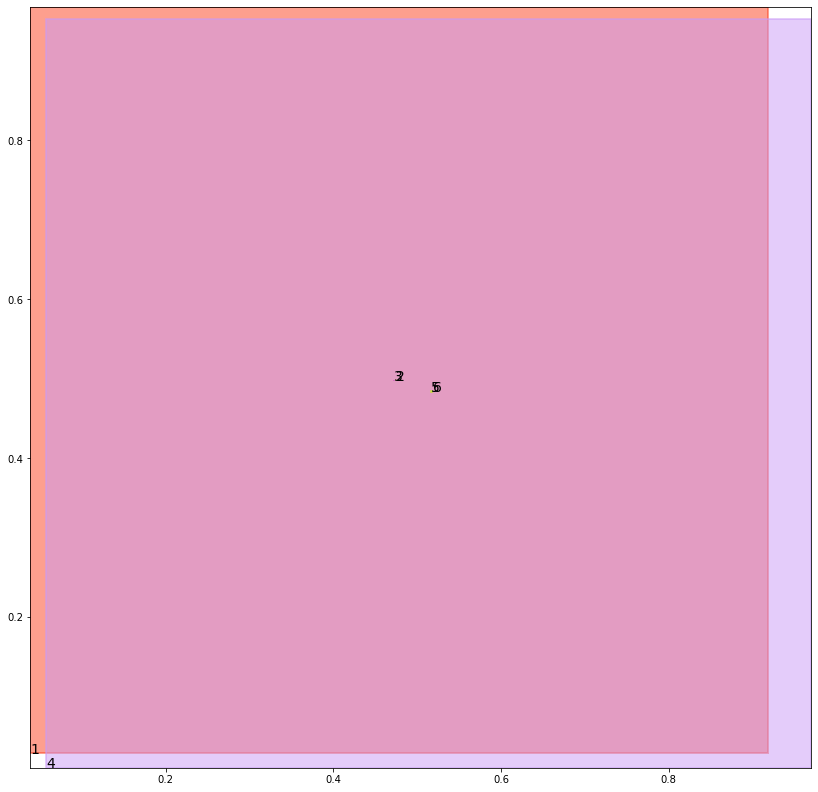

alignment data:
tensor(2) 0.32393091917037964 -0.1320313811302185 tensor(0.3246863484382629) tensor(-0.1317373216152191)
tensor(3) 0.32370465993881226 -0.1321122795343399 tensor(0.3240389823913574) tensor(-0.1319821923971176)
tensor(5) 0.32349562644958496 -0.13235542178153992 tensor(0.3237619400024414) tensor(-0.1322587132453918)
tensor(6) 0.32369881868362427 -0.13228650391101837 tensor(0.3239360451698303) tensor(-0.1321966648101807)


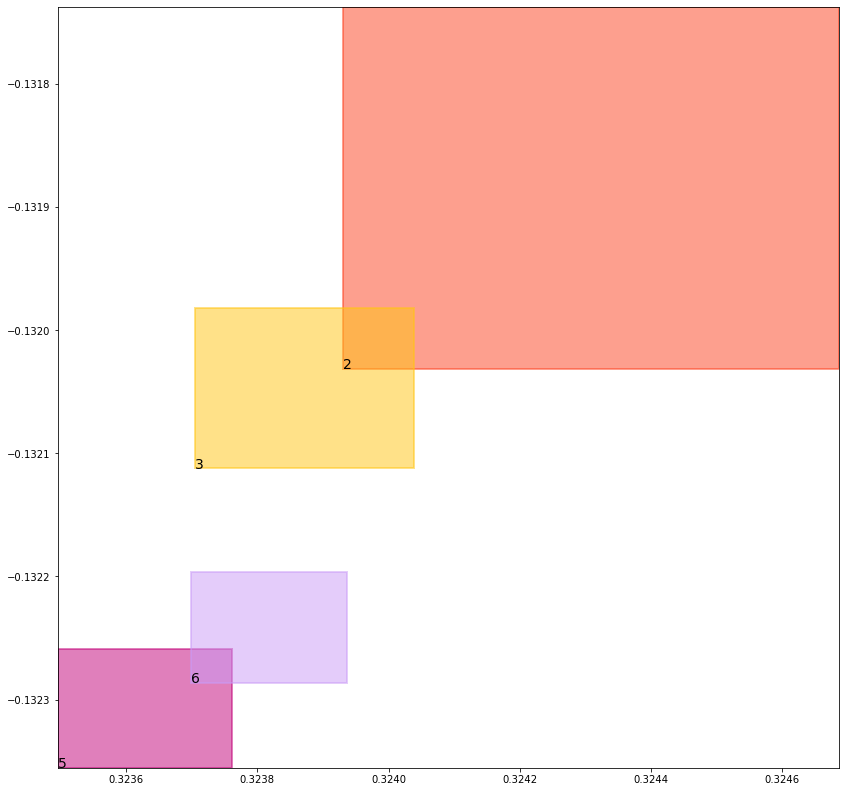

batch (tensor([[4, 6],
        [6, 2],
        [5, 3],
        [2, 6],
        [1, 3],
        [3, 5],
        [1, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076369047164917, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069289095699787, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509964406490326, grad_fn=<MulBackward0>)
previous loss: tensor(0.2655622661113739, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03858691081404686 0.028502585366368294 tensor(0.9189777374267578) tensor(0.9680967926979065)
tensor(2) 0.47493284940719604 0.49738141894340515 tensor(0.4752442240715027) tensor(0.4995498061180115)
tensor(3) 0.47300758957862854 0.49739131331443787 tensor(0.4731501638889313) tensor(0.4977960288524628)
tensor(4) 0.05734501779079437 0.010079018771648407 tensor(0.9700328111648560) tensor(0.9532378315925598)
tensor(5) 0.5155385732650757 0.4834785461425781 tensor(0.5181366801261902) tensor(0.4841589033603668)
tensor(6) 0.5184592604637146 0.48330461978912354 tensor(0.5192647576332092) tensor(0.4837262332439423)


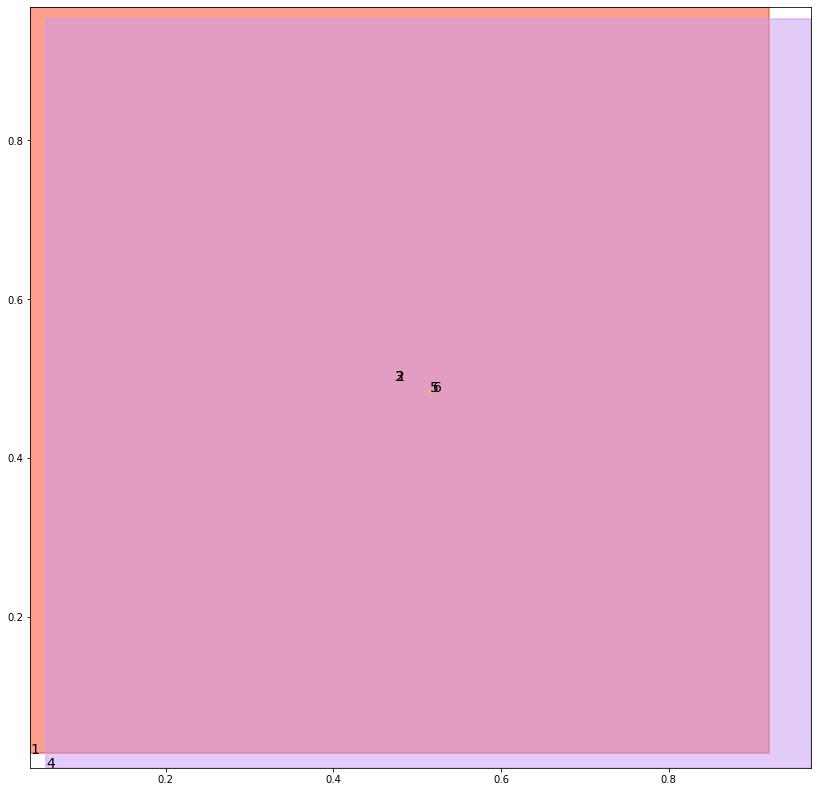

alignment data:
tensor(2) 0.34264469146728516 -0.1419907808303833 tensor(0.3432658910751343) tensor(-0.1417495310306549)
tensor(3) 0.34249037504196167 -0.14204367995262146 tensor(0.3426132202148438) tensor(-0.1419962942600250)
tensor(5) 0.34213507175445557 -0.14234349131584167 tensor(0.3425339460372925) tensor(-0.1421977132558823)
tensor(6) 0.34232544898986816 -0.14228029549121857 tensor(0.3425070047378540) tensor(-0.1422124803066254)


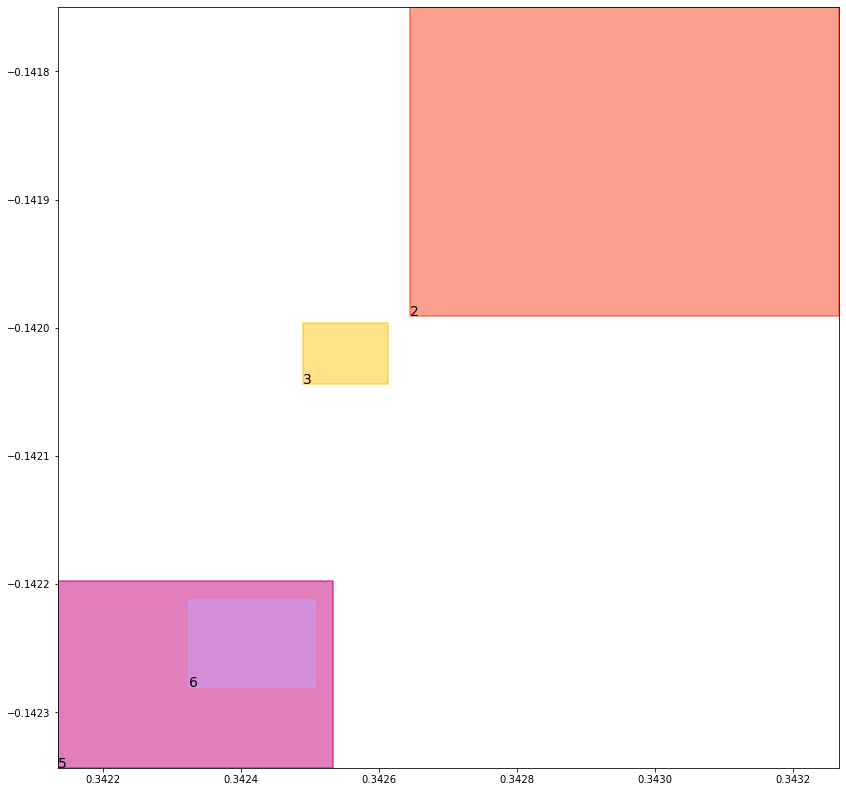

batch (tensor([[2, 6],
        [1, 3],
        [4, 6],
        [6, 2],
        [1, 2],
        [5, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076175951398909, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069281891919672, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509989738464355, grad_fn=<MulBackward0>)
previous loss: tensor(0.2655447721481323, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03853798285126686 0.028353741392493248 tensor(0.9193038344383240) tensor(0.9681541919708252)
tensor(2) 0.4748884439468384 0.49762678146362305 tensor(0.4753329753875732) tensor(0.4986129105091095)
tensor(3) 0.47316527366638184 0.4970463812351227 tensor(0.4733938276767731) tensor(0.4980143904685974)
tensor(4) 0.05705602839589119 0.010016918182373047 tensor(0.9700599312782288) tensor(0.9533006548881531)
tensor(5) 0.5155711770057678 0.48355942964553833 tensor(0.5176720023155212) tensor(0.4838393330574036)
tensor(6) 0.5186097025871277 0.48307889699935913 tensor(0.5188826322555542) tensor(0.4837860465049744)


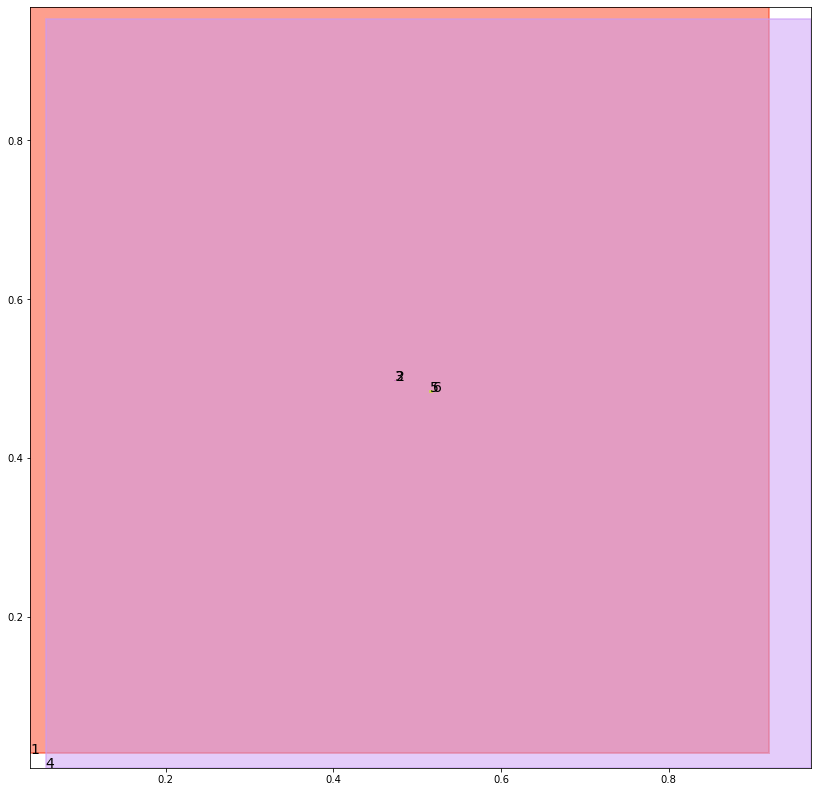

alignment data:
tensor(2) 0.3512952923774719 -0.14818990230560303 tensor(0.3516026139259338) tensor(-0.1480716019868851)
tensor(3) 0.35099488496780396 -0.14830061793327332 tensor(0.3512796163558960) tensor(-0.1481903195381165)
tensor(5) 0.3507567048072815 -0.1485559642314911 tensor(0.3510054349899292) tensor(-0.1484668850898743)
tensor(6) 0.35087311267852783 -0.14852213859558105 tensor(0.3510897755622864) tensor(-0.1484385728836060)


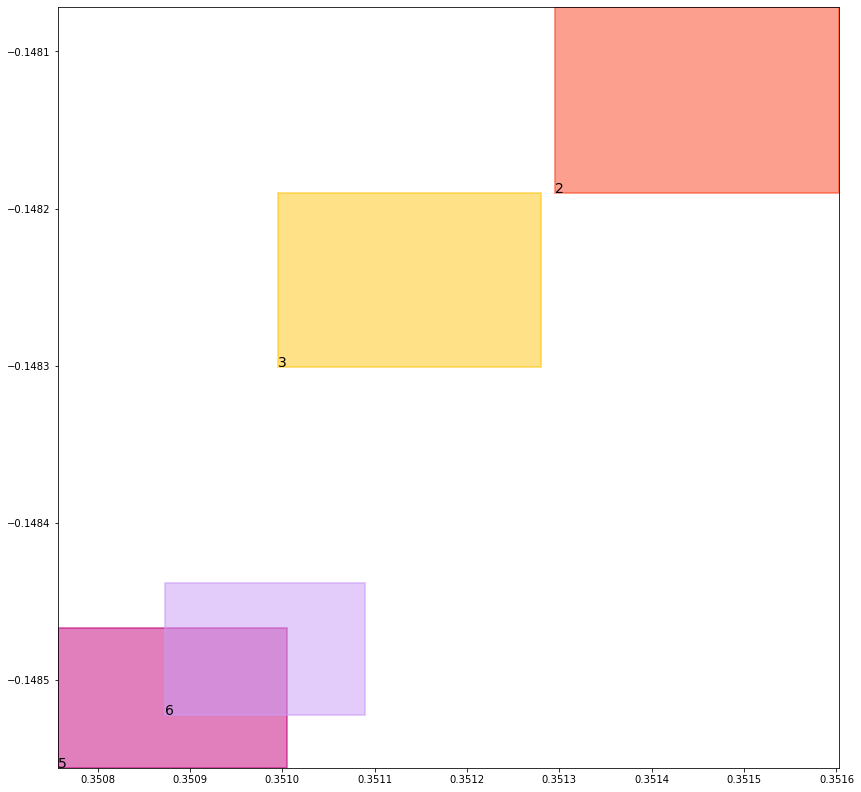

batch (tensor([[6, 2],
        [1, 3],
        [4, 6],
        [3, 5],
        [1, 2],
        [2, 6],
        [4, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076037514954805, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069102132692933, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510012388229370, grad_fn=<MulBackward0>)
previous loss: tensor(0.2655152082443237, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03848917782306671 0.02820620685815811 tensor(0.9196276664733887) tensor(0.9682116508483887)
tensor(2) 0.47522494196891785 0.49726513028144836 tensor(0.4754126071929932) tensor(0.4980245530605316)
tensor(3) 0.47344550490379333 0.4967036247253418 tensor(0.4734483957290649) tensor(0.4982399046421051)
tensor(4) 0.056769486516714096 0.009955467656254768 tensor(0.9700871109962463) tensor(0.9533633589744568)
tensor(5) 0.5160050988197327 0.4830593168735504 tensor(0.5165437459945679) tensor(0.4837806820869446)
tensor(6) 0.518286943435669 0.4834035336971283 tensor(0.5191141366958618) tensor(0.4836748540401459)


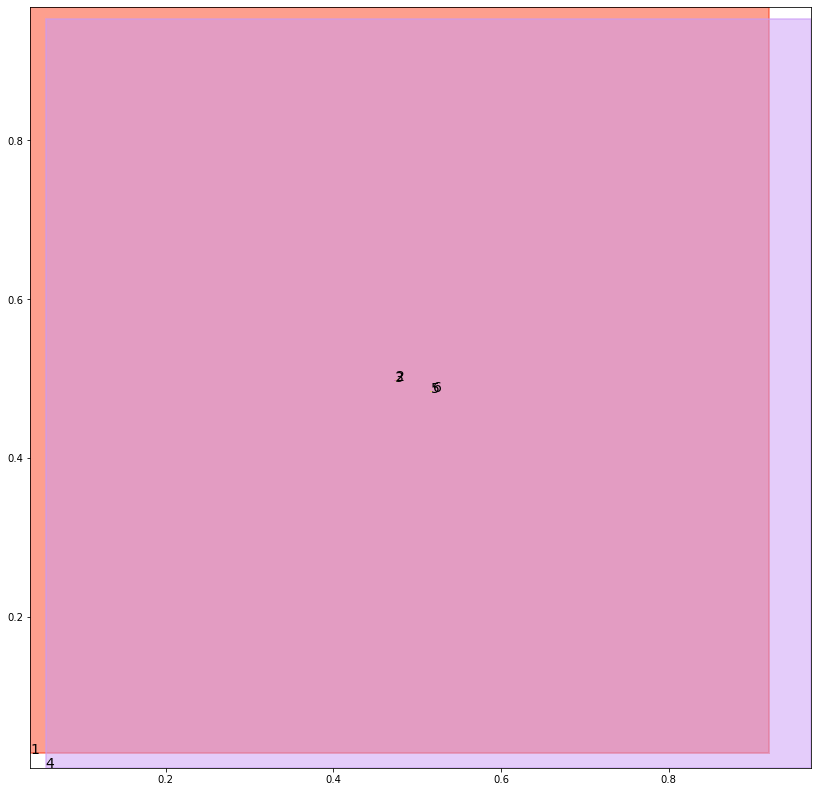

alignment data:
tensor(2) 0.35743248462677 -0.1482289880514145 tensor(0.3576498627662659) tensor(-0.1481373310089111)
tensor(3) 0.35713231563568115 -0.1483394205570221 tensor(0.3575406074523926) tensor(-0.1481641680002213)
tensor(5) 0.3566977381706238 -0.14855240285396576 tensor(0.3570107221603394) tensor(-0.1484808027744293)
tensor(6) 0.3570065498352051 -0.14845919609069824 tensor(0.3571734428405762) tensor(-0.1484140604734421)


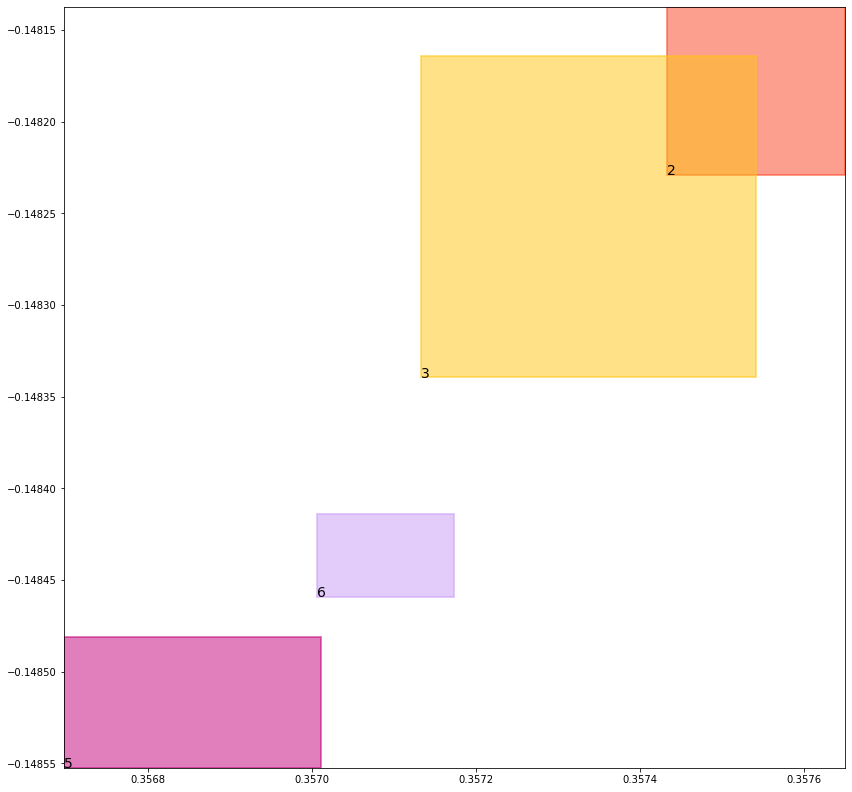

batch (tensor([[3, 5],
        [1, 2],
        [1, 3],
        [2, 6],
        [6, 2],
        [5, 3],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075898179784417, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068934988230467, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510010600090027, grad_fn=<MulBackward0>)
previous loss: tensor(0.2654843628406525, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03844049572944641 0.028059933334589005 tensor(0.9199492931365967) tensor(0.9682688713073730)
tensor(2) 0.4752033054828644 0.4965229332447052 tensor(0.4761849343776703) tensor(0.4981952607631683)
tensor(3) 0.4732031226158142 0.4967260956764221 tensor(0.4739642441272736) tensor(0.4980973005294800)
tensor(4) 0.05648539587855339 0.009894652292132378 tensor(0.9701142311096191) tensor(0.9534261226654053)
tensor(5) 0.5148245096206665 0.4828093647956848 tensor(0.5168005228042603) tensor(0.4838463068008423)
tensor(6) 0.517976701259613 0.48342472314834595 tensor(0.5191576480865479) tensor(0.4841802120208740)


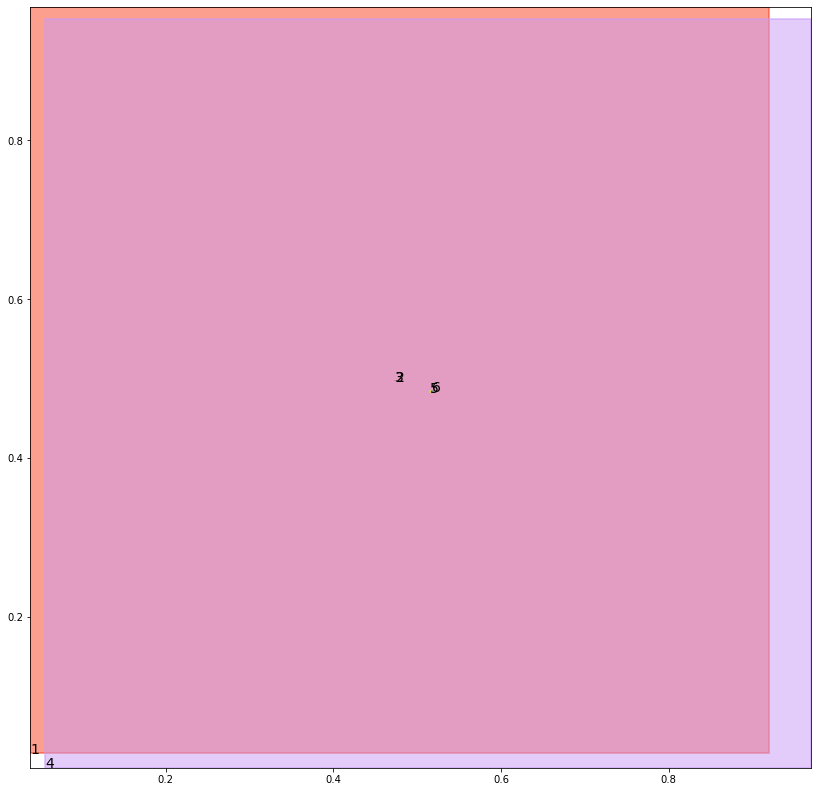

alignment data:
tensor(2) 0.3183513879776001 -0.14161133766174316 tensor(0.3188907504081726) tensor(-0.1414036750793457)
tensor(3) 0.31824278831481934 -0.14164604246616364 tensor(0.3186813592910767) tensor(-0.1414770036935806)
tensor(5) 0.317846417427063 -0.14196619391441345 tensor(0.3182931542396545) tensor(-0.1417987644672394)
tensor(6) 0.3182741403579712 -0.14181086421012878 tensor(0.3185784220695496) tensor(-0.1416961848735809)


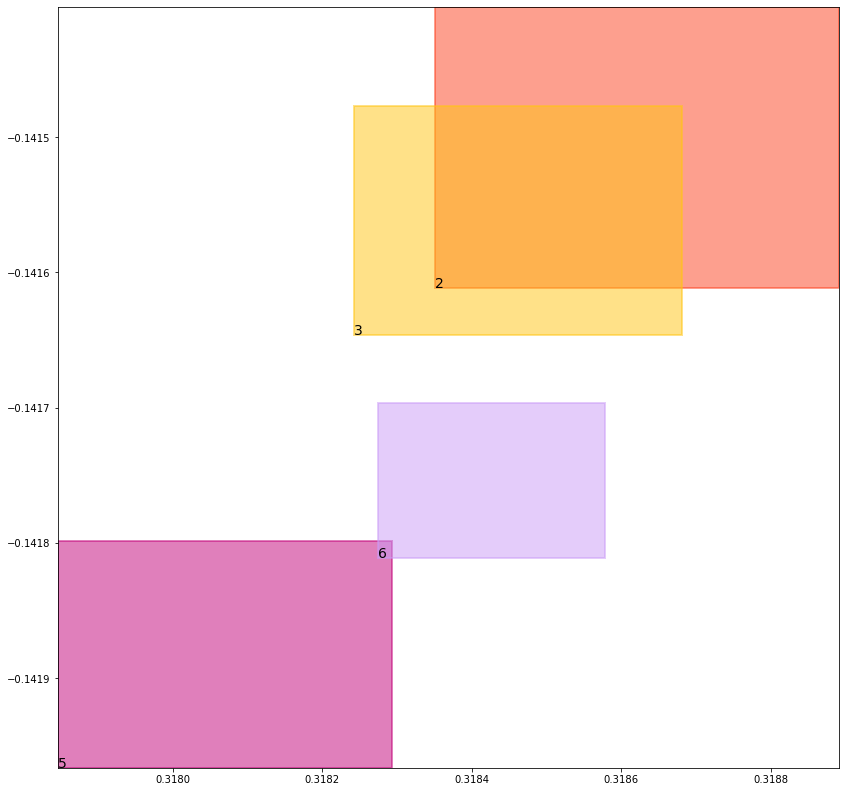

batch (tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3],
        [1, 2],
        [4, 6],
        [1, 3],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0076004182919860, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069074826315045, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509951293468475, grad_fn=<MulBackward0>)
previous loss: tensor(0.2655030190944672, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03839191421866417 0.027914855629205704 tensor(0.9202690124511719) tensor(0.9683258533477783)
tensor(2) 0.47531822323799133 0.49634283781051636 tensor(0.4764369428157806) tensor(0.4981636106967926)
tensor(3) 0.4733129143714905 0.4970781207084656 tensor(0.4741941392421722) tensor(0.4976278245449066)
tensor(4) 0.05620357766747475 0.009834461845457554 tensor(0.9701414108276367) tensor(0.9534887671470642)
tensor(5) 0.5139468312263489 0.4830789566040039 tensor(0.5170913934707642) tensor(0.4837552309036255)
tensor(6) 0.51792311668396 0.48336321115493774 tensor(0.5187844634056091) tensor(0.4843504726886749)


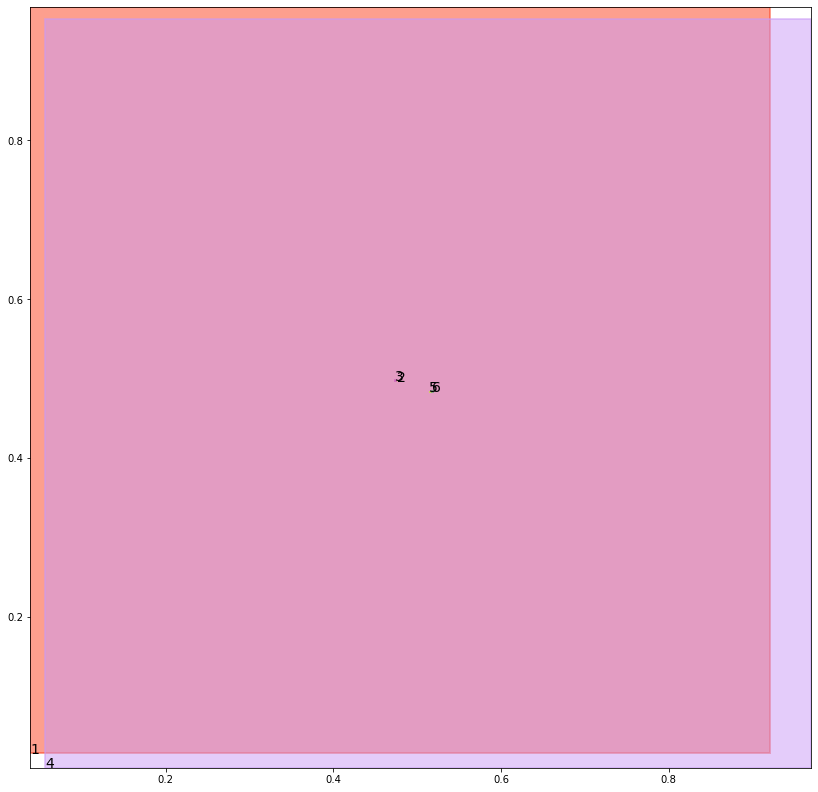

alignment data:
tensor(2) 0.2849162220954895 -0.12675972282886505 tensor(0.2855068445205688) tensor(-0.1265316903591156)
tensor(3) 0.28495240211486816 -0.12673735618591309 tensor(0.2851755023002625) tensor(-0.1266530901193619)
tensor(5) 0.28446483612060547 -0.1270935833454132 tensor(0.2849090099334717) tensor(-0.1269314438104630)
tensor(6) 0.28487008810043335 -0.12695011496543884 tensor(0.2852114439010620) tensor(-0.1268192380666733)


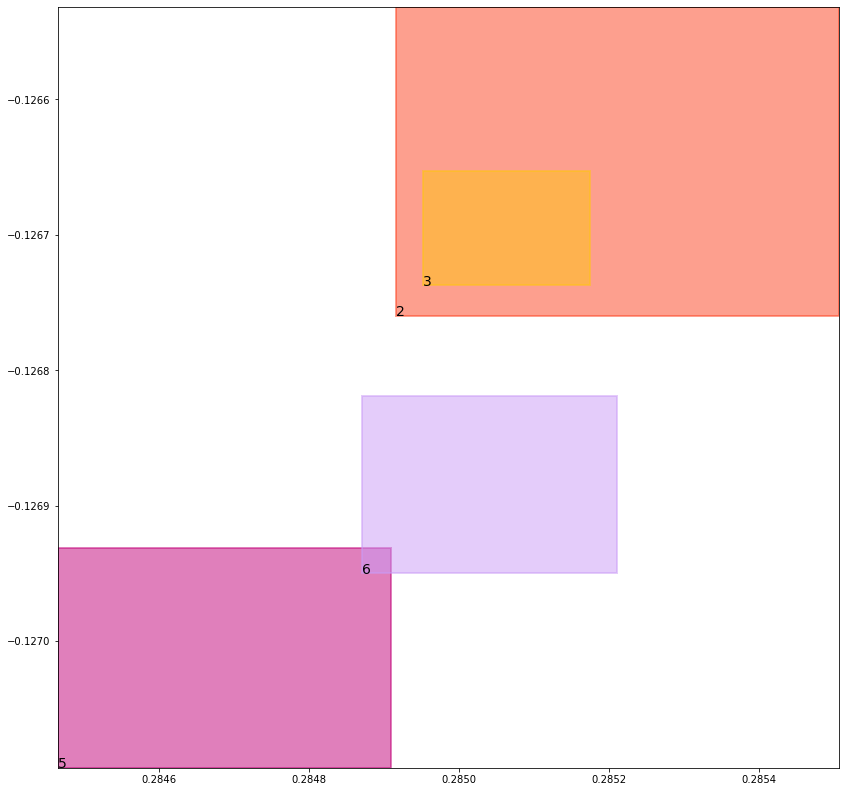

batch (tensor([[6, 2],
        [4, 5],
        [2, 6],
        [5, 3],
        [3, 5],
        [1, 3],
        [4, 6],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075862440280616, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0069066425785422, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509963512420654, grad_fn=<MulBackward0>)
previous loss: tensor(0.2654892504215240, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03834344446659088 0.027770988643169403 tensor(0.9205867052078247) tensor(0.9683828949928284)
tensor(2) 0.4757258892059326 0.49667221307754517 tensor(0.4760496914386749) tensor(0.4979494512081146)
tensor(3) 0.4737430512905121 0.4968678653240204 tensor(0.4741633534431458) tensor(0.4977239668369293)
tensor(4) 0.055923957377672195 0.009774889796972275 tensor(0.9701684713363647) tensor(0.9535512924194336)
tensor(5) 0.5138348937034607 0.48352158069610596 tensor(0.5169246792793274) tensor(0.4838191270828247)
tensor(6) 0.5180360078811646 0.4834718704223633 tensor(0.5181010365486145) tensor(0.4839708209037781)


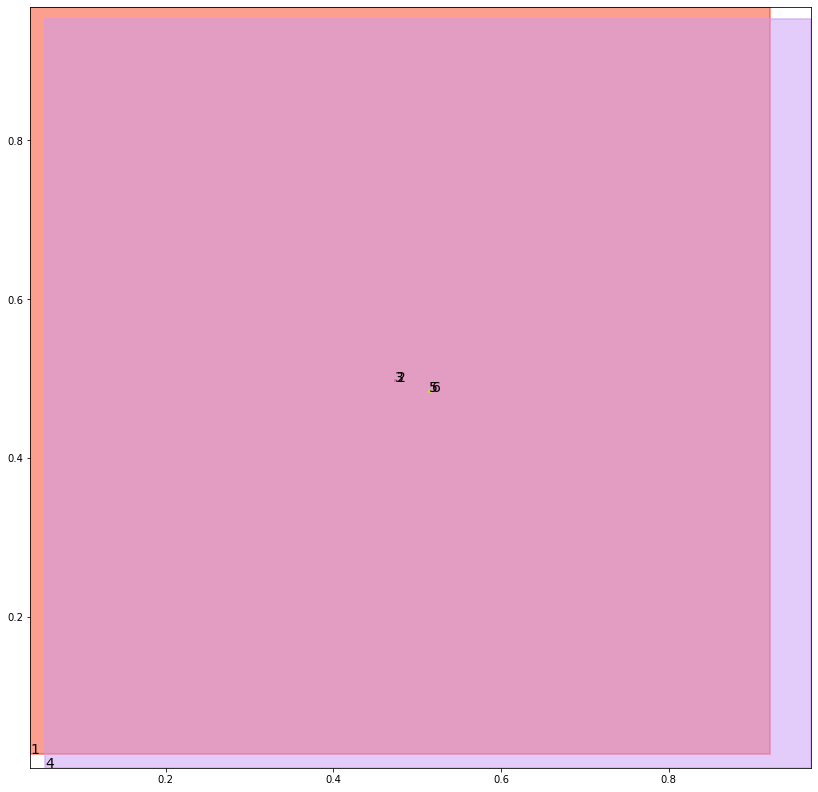

alignment data:
tensor(2) 0.26552629470825195 -0.11215361952781677 tensor(0.2659022808074951) tensor(-0.1120064109563828)
tensor(3) 0.26541614532470703 -0.11218893527984619 tensor(0.2656849622726440) tensor(-0.1120844632387161)
tensor(5) 0.2650744318962097 -0.11248928308486938 tensor(0.2654107213020325) tensor(-0.1123691573739052)
tensor(6) 0.2654075622558594 -0.11237503588199615 tensor(0.2655494213104248) tensor(-0.1123192906379700)


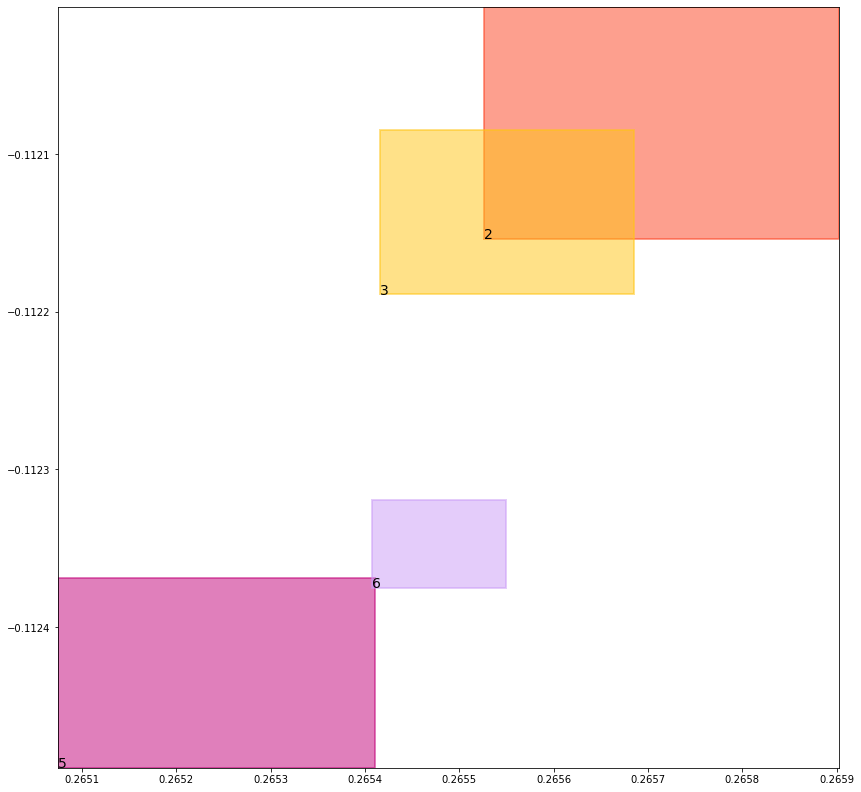

batch (tensor([[1, 2],
        [4, 6],
        [1, 3],
        [4, 5],
        [5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075606293976307, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068844663910568, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510004341602325, grad_fn=<MulBackward0>)
previous loss: tensor(0.2654455304145813, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03829508647322655 0.027628343552350998 tensor(0.9209022521972656) tensor(0.9684396982192993)
tensor(2) 0.4750887453556061 0.4974566102027893 tensor(0.4763968884944916) tensor(0.4975699782371521)
tensor(3) 0.4738977551460266 0.49651095271110535 tensor(0.4744619131088257) tensor(0.4979648888111115)
tensor(4) 0.05564654618501663 0.009715942665934563 tensor(0.9701954722404480) tensor(0.9536138176918030)
tensor(5) 0.5144122838973999 0.4834612011909485 tensor(0.5163450241088867) tensor(0.4839923679828644)
tensor(6) 0.5177291631698608 0.48309963941574097 tensor(0.5180103182792664) tensor(0.4837350845336914)


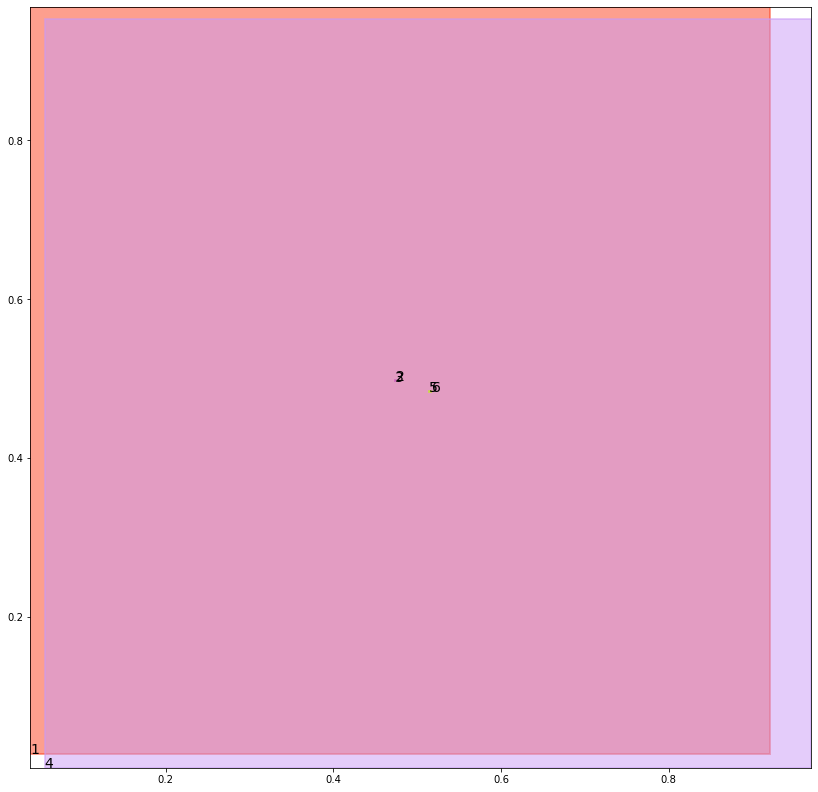

alignment data:
tensor(2) 0.2529914379119873 -0.10101097077131271 tensor(0.2531304955482483) tensor(-0.1009613424539566)
tensor(3) 0.25263452529907227 -0.10114732384681702 tensor(0.2530784606933594) tensor(-0.1009738743305206)
tensor(5) 0.25241994857788086 -0.1014024019241333 tensor(0.2527249455451965) tensor(-0.1012897044420242)
tensor(6) 0.25259554386138916 -0.10134679079055786 tensor(0.2527924180030823) tensor(-0.1012699604034424)


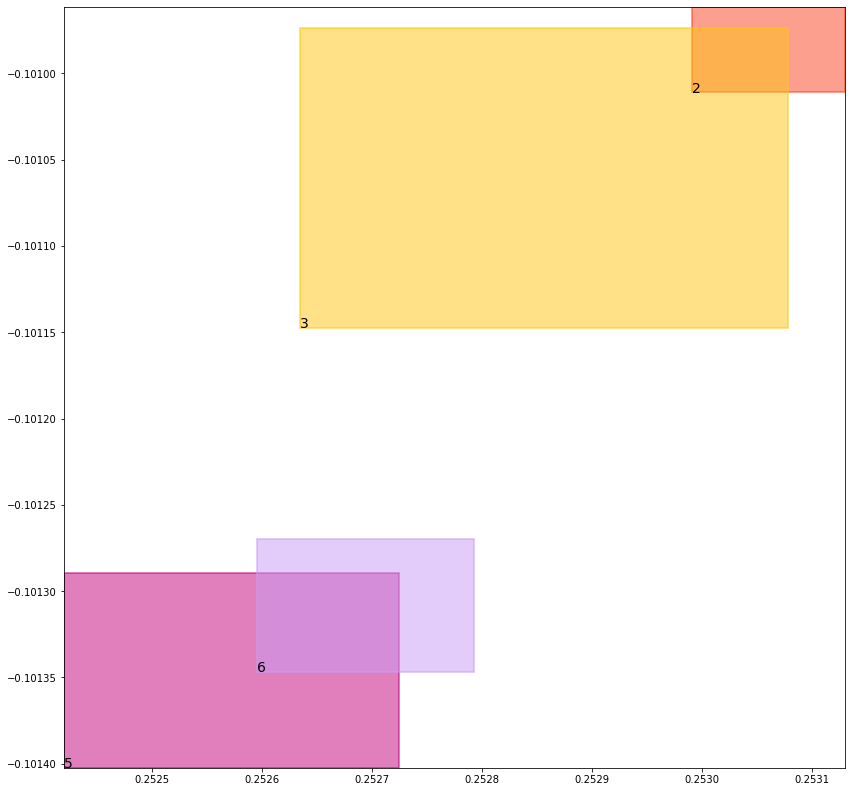

batch (tensor([[1, 2],
        [3, 5],
        [6, 2],
        [1, 3],
        [4, 6],
        [2, 6],
        [4, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075566954910755, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068712029606104, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510007023811340, grad_fn=<MulBackward0>)
previous loss: tensor(0.2654286026954651, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03824682533740997 0.02748693712055683 tensor(0.9212157130241394) tensor(0.9684962630271912)
tensor(2) 0.47488316893577576 0.49704214930534363 tensor(0.4767197072505951) tensor(0.4986371099948883)
tensor(3) 0.47392505407333374 0.4965221583843231 tensor(0.4748144745826721) tensor(0.4978370368480682)
tensor(4) 0.05537140369415283 0.0096576027572155 tensor(0.9702224135398865) tensor(0.9536762833595276)
tensor(5) 0.5153949856758118 0.4835563600063324 tensor(0.5156055688858032) tensor(0.4836547076702118)
tensor(6) 0.5176770091056824 0.482845276594162 tensor(0.5178229808807373) tensor(0.4838041067123413)


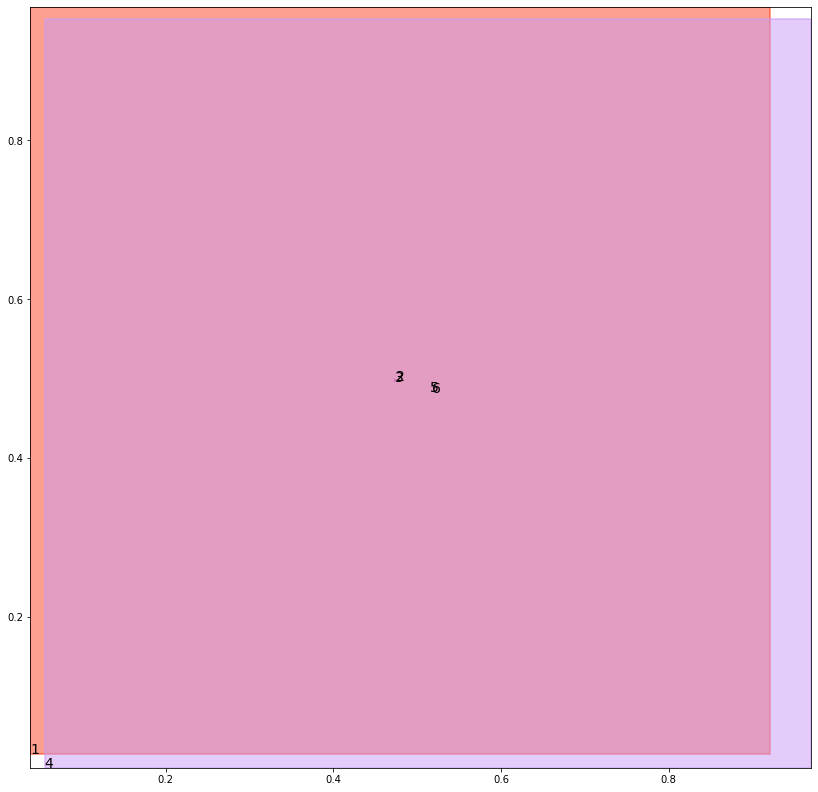

alignment data:
tensor(2) 0.24082422256469727 -0.10349733382463455 tensor(0.2414117455482483) tensor(-0.1032718271017075)
tensor(3) 0.24060285091400146 -0.10358115285634995 tensor(0.2410355210304260) tensor(-0.1034131348133087)
tensor(5) 0.24050164222717285 -0.10379824042320251 tensor(0.2405459284782410) tensor(-0.1037815362215042)
tensor(6) 0.24049675464630127 -0.10380992293357849 tensor(0.2407705783843994) tensor(-0.1037018150091171)


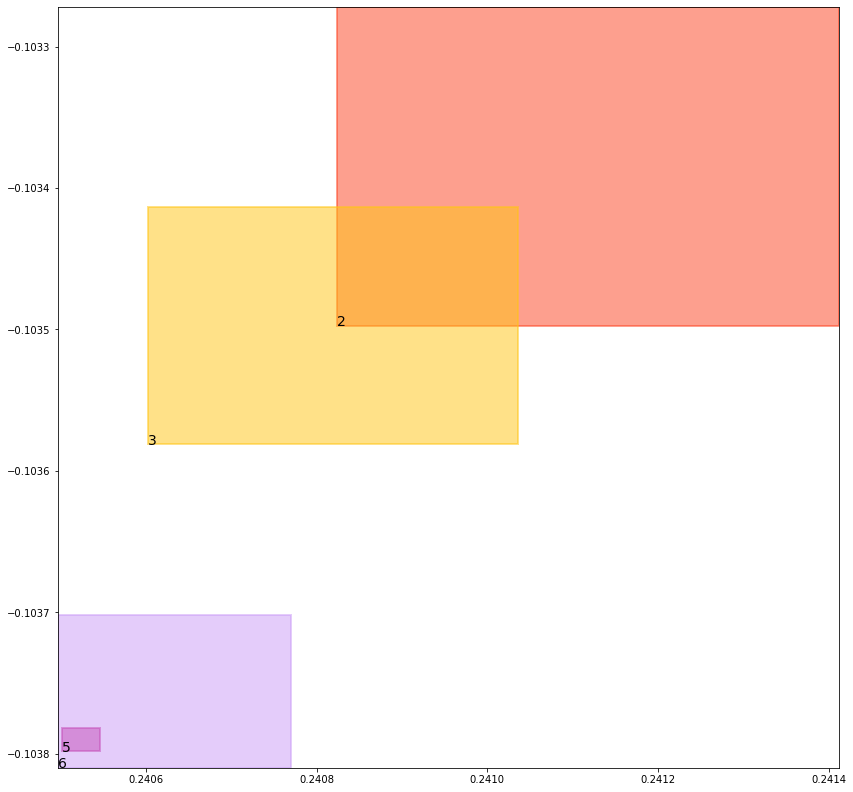

batch (tensor([[2, 6],
        [4, 5],
        [5, 3],
        [1, 2],
        [6, 2],
        [3, 5],
        [4, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075651337392628, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068468963727355, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509989142417908, grad_fn=<MulBackward0>)
previous loss: tensor(0.2654109597206116, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03819864243268967 0.027346737682819366 tensor(0.9215273261070251) tensor(0.9685528278350830)
tensor(2) 0.4753614366054535 0.49674534797668457 tensor(0.4767269194126129) tensor(0.4991898536682129)
tensor(3) 0.4742172956466675 0.4968681335449219 tensor(0.4748353362083435) tensor(0.4973734319210052)
tensor(4) 0.05509865656495094 0.009599854238331318 tensor(0.9702493548393250) tensor(0.9537387490272522)
tensor(5) 0.514940619468689 0.48286256194114685 tensor(0.5159828066825867) tensor(0.4837907850742340)
tensor(6) 0.517499566078186 0.48314768075942993 tensor(0.5176036953926086) tensor(0.4837010204792023)


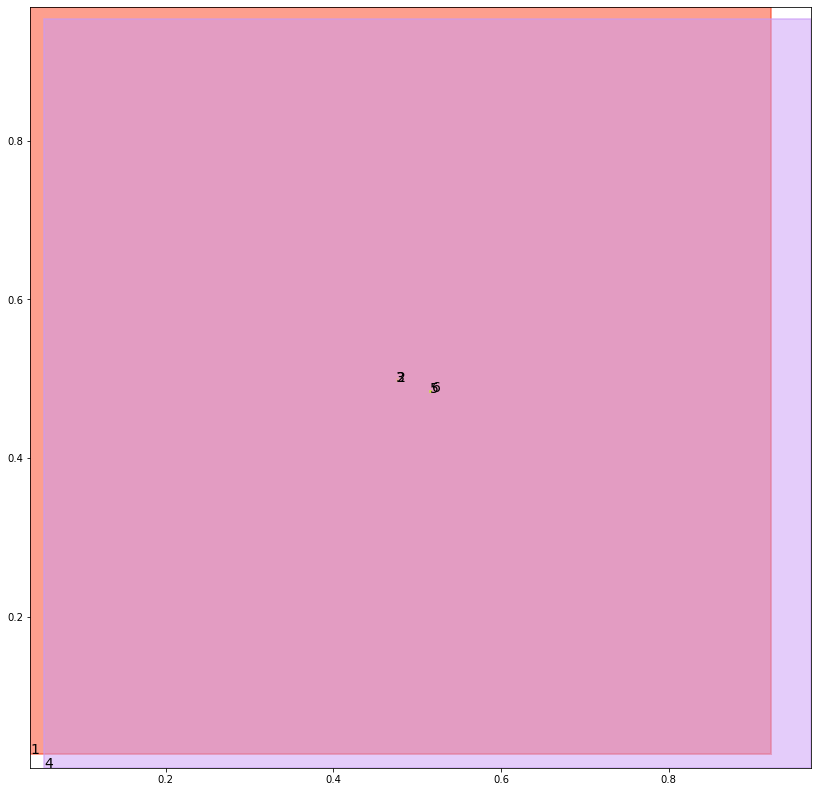

alignment data:
tensor(2) 0.23005825281143188 -0.10925088822841644 tensor(0.2308381795883179) tensor(-0.1089462712407112)
tensor(3) 0.22999662160873413 -0.10927044600248337 tensor(0.2301858067512512) tensor(-0.1091978251934052)
tensor(5) 0.2295612096786499 -0.10962019860744476 tensor(0.2299008369445801) tensor(-0.1094894707202911)
tensor(6) 0.22985148429870605 -0.10951567441225052 tensor(0.2300109863281250) tensor(-0.1094526052474976)


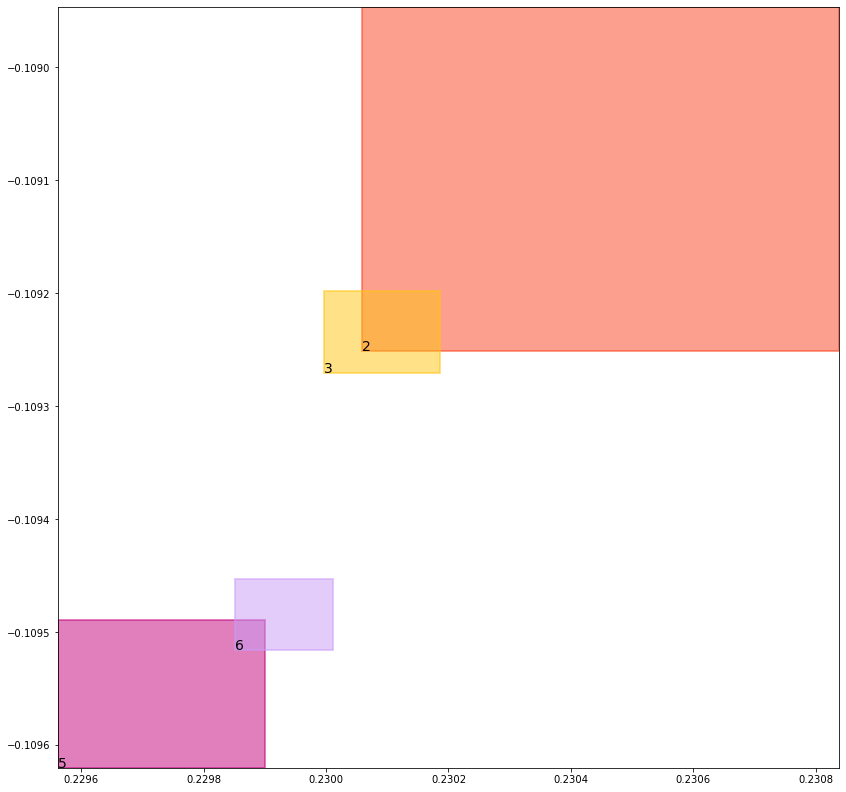

batch (tensor([[4, 6],
        [1, 2],
        [1, 3],
        [2, 6],
        [5, 3],
        [3, 5],
        [6, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075465464033186, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068495073355734, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509977519512177, grad_fn=<MulBackward0>)
previous loss: tensor(0.2653937935829163, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03815056383609772 0.027207735925912857 tensor(0.9218367934226990) tensor(0.9686092138290405)
tensor(2) 0.4764488935470581 0.49665921926498413 tensor(0.4764552414417267) tensor(0.4991657435894012)
tensor(3) 0.4745577871799469 0.49661311507225037 tensor(0.4747473895549774) tensor(0.4975071847438812)
tensor(4) 0.05482823774218559 0.00954267755150795 tensor(0.9702762961387634) tensor(0.9538010954856873)
tensor(5) 0.5149368643760681 0.4826480746269226 tensor(0.5156185030937195) tensor(0.4838498234748840)
tensor(6) 0.5172876715660095 0.48344478011131287 tensor(0.5175779461860657) tensor(0.4839466810226440)


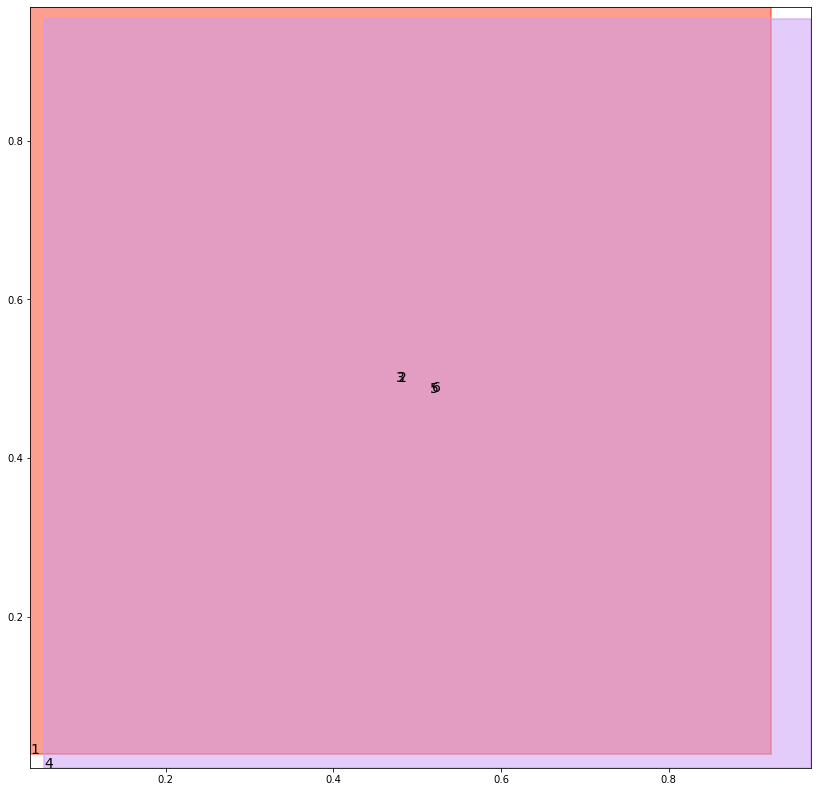

alignment data:
tensor(2) 0.22124803066253662 -0.10907407104969025 tensor(0.2219313383102417) tensor(-0.1088014096021652)
tensor(3) 0.22107791900634766 -0.10913361608982086 tensor(0.2213373780250549) tensor(-0.1090309470891953)
tensor(5) 0.22063636779785156 -0.10948742926120758 tensor(0.2210204601287842) tensor(-0.1093371361494064)
tensor(6) 0.22104918956756592 -0.10933302342891693 tensor(0.2212100625038147) tensor(-0.1092701107263565)


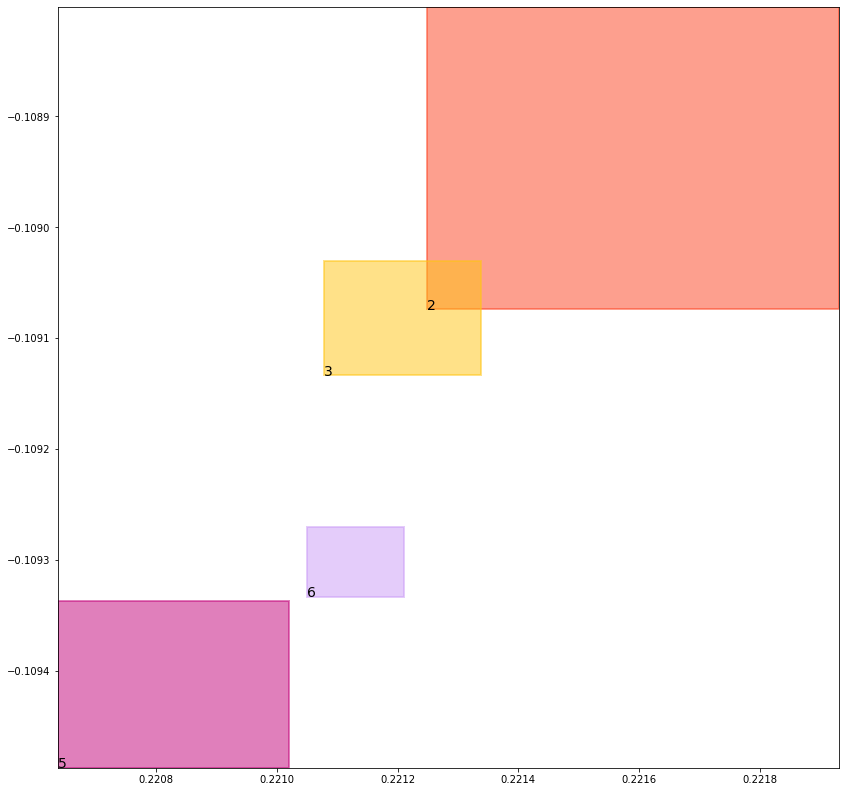

batch (tensor([[2, 6],
        [4, 6],
        [5, 3],
        [1, 3],
        [4, 5],
        [6, 2],
        [3, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075208125635982, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068426057696342, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509974539279938, grad_fn=<MulBackward0>)
previous loss: tensor(0.2653608620166779, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03810260817408562 0.027069905772805214 tensor(0.9221442341804504) tensor(0.9686655998229980)
tensor(2) 0.4765006899833679 0.496763676404953 tensor(0.4768280088901520) tensor(0.4986240565776825)
tensor(3) 0.4746372699737549 0.49625933170318604 tensor(0.4749870598316193) tensor(0.4977438151836395)
tensor(4) 0.05456012114882469 0.009486071765422821 tensor(0.9703032374382019) tensor(0.9538633227348328)
tensor(5) 0.5145872831344604 0.48295724391937256 tensor(0.5153393745422363) tensor(0.4837506115436554)
tensor(6) 0.5172300934791565 0.4833809733390808 tensor(0.5172405838966370) tensor(0.4841494560241699)


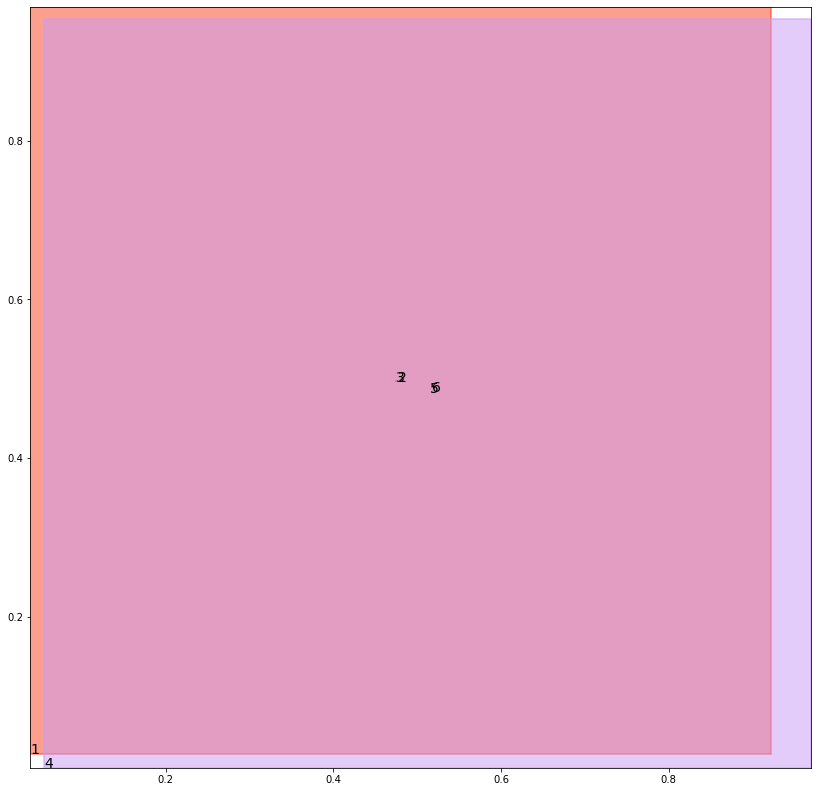

alignment data:
tensor(2) 0.21326273679733276 -0.10892157256603241 tensor(0.2137964963912964) tensor(-0.1087095588445663)
tensor(3) 0.21296989917755127 -0.10903038084506989 tensor(0.2134031653404236) tensor(-0.1088586300611496)
tensor(5) 0.21268391609191895 -0.10932320356369019 tensor(0.2129626274108887) tensor(-0.1092150807380676)
tensor(6) 0.21301984786987305 -0.10920064151287079 tensor(0.2132298946380615) tensor(-0.1091166734695435)


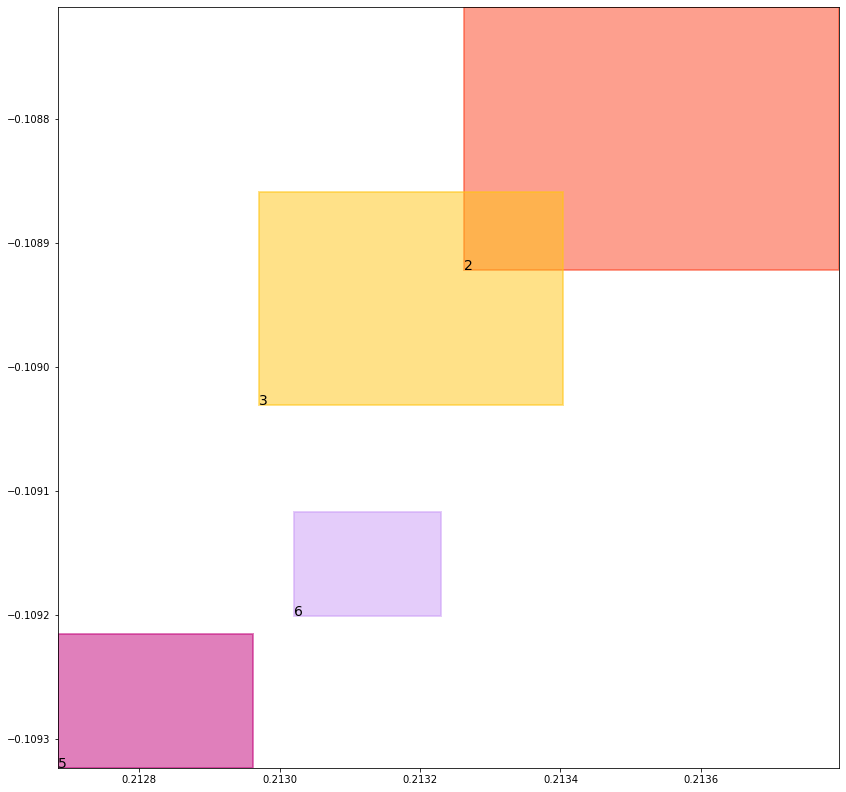

batch (tensor([[3, 5],
        [1, 2],
        [5, 3],
        [4, 5],
        [4, 6],
        [1, 3],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0075142364948988, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068322531878948, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509975433349609, grad_fn=<MulBackward0>)
previous loss: tensor(0.2653440237045288, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03805476799607277 0.026933228597044945 tensor(0.9224497675895691) tensor(0.9687218666076660)
tensor(2) 0.4765498638153076 0.49703943729400635 tensor(0.4768503308296204) tensor(0.4976237118244171)
tensor(3) 0.47496411204338074 0.4962776005268097 tensor(0.4750395119190216) tensor(0.4976130127906799)
tensor(4) 0.054294247180223465 0.009430034086108208 tensor(0.9703300595283508) tensor(0.9539256095886230)
tensor(5) 0.5143263936042786 0.4835098683834076 tensor(0.5152772068977356) tensor(0.4837320744991302)
tensor(6) 0.5165280699729919 0.4834917485713959 tensor(0.5174058675765991) tensor(0.4838064610958099)


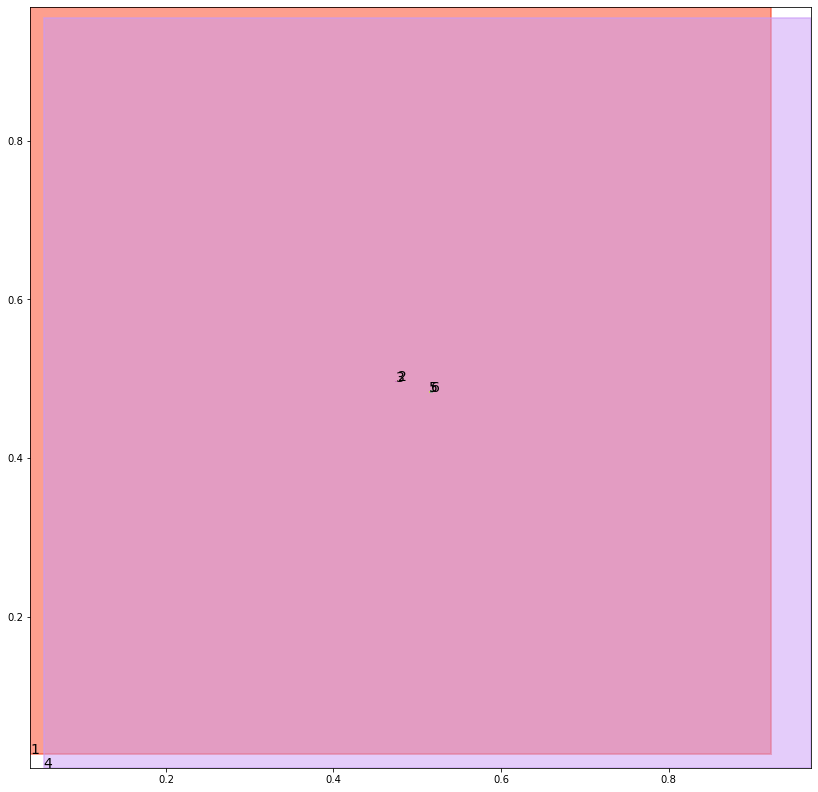

alignment data:
tensor(2) 0.2042180299758911 -0.11041980981826782 tensor(0.2044022083282471) tensor(-0.1103473454713821)
tensor(3) 0.20387816429138184 -0.11054886877536774 tensor(0.2042478322982788) tensor(-0.1104010492563248)
tensor(5) 0.20369857549667358 -0.1107993870973587 tensor(0.2038385868072510) tensor(-0.1107475608587265)
tensor(6) 0.20387786626815796 -0.11073748767375946 tensor(0.2040369510650635) tensor(-0.1106777191162109)


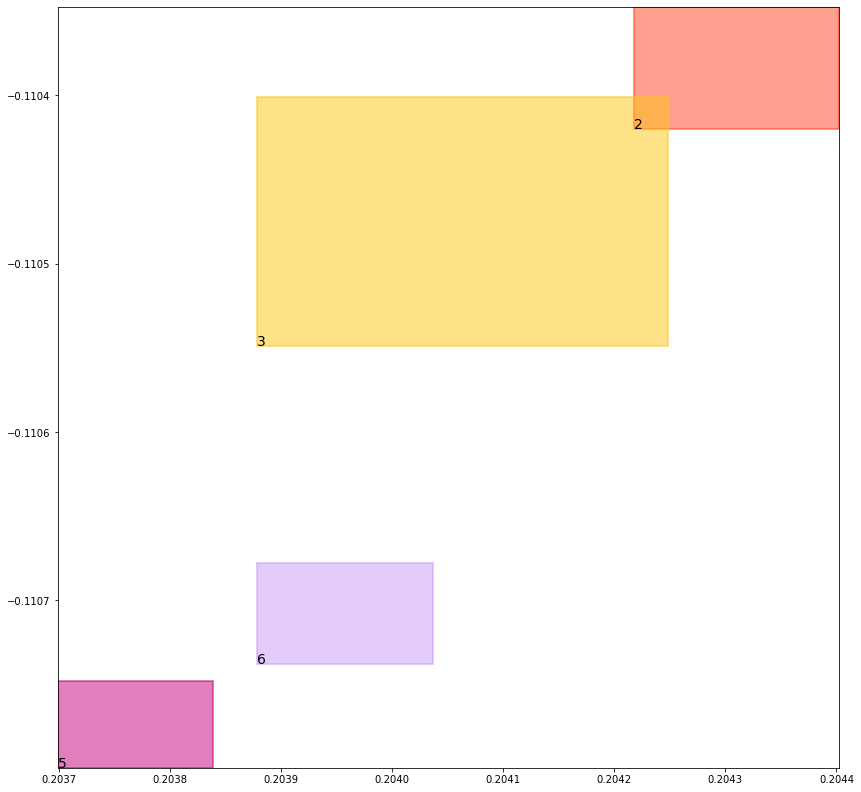

batch (tensor([[6, 2],
        [3, 5],
        [4, 6],
        [1, 3],
        [1, 2],
        [2, 6],
        [4, 5],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074897948652506, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068264016881585, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510029375553131, grad_fn=<MulBackward0>)
previous loss: tensor(0.2653191387653351, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.038007039576768875 0.026797713711857796 tensor(0.9227531552314758) tensor(0.9687778949737549)
tensor(2) 0.47688308358192444 0.49622246623039246 tensor(0.4769553244113922) tensor(0.4974678754806519)
tensor(3) 0.47510597109794617 0.49663397669792175 tensor(0.4752097725868225) tensor(0.4971516132354736)
tensor(4) 0.054030511528253555 0.009374572895467281 tensor(0.9703567624092102) tensor(0.9539878368377686)
tensor(5) 0.5147607326507568 0.48344317078590393 tensor(0.5147951841354370) tensor(0.4839375317096710)
tensor(6) 0.5162591338157654 0.4829659163951874 tensor(0.5173123478889465) tensor(0.4837611615657806)


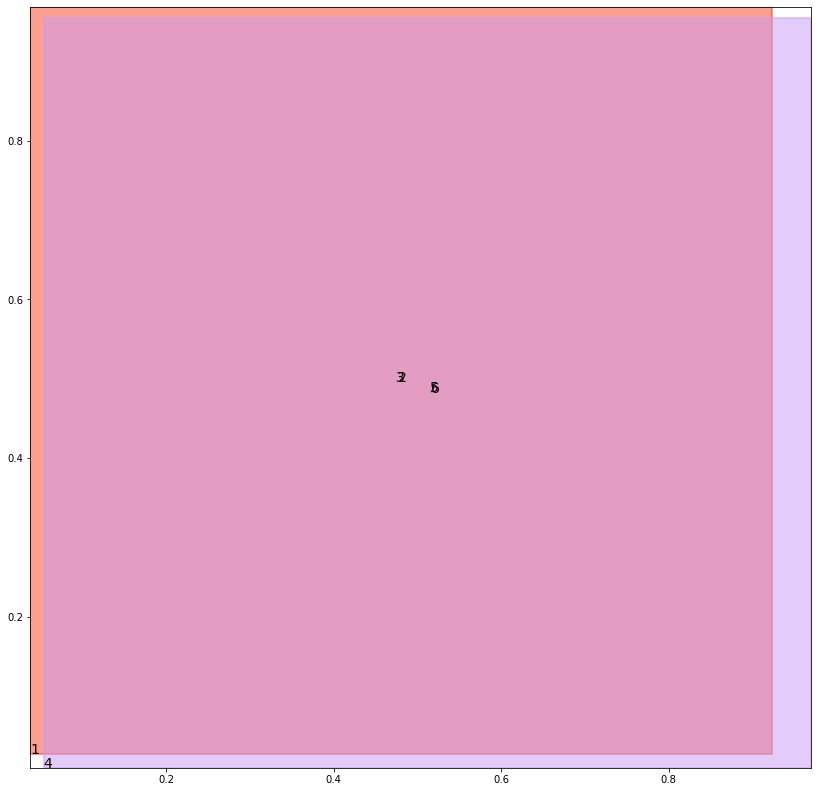

alignment data:
tensor(2) 0.1973850131034851 -0.10124059021472931 tensor(0.1977297067642212) tensor(-0.1011025011539459)
tensor(3) 0.19734787940979004 -0.10124735534191132 tensor(0.1974973082542419) tensor(-0.1011878103017807)
tensor(5) 0.19708788394927979 -0.10153411328792572 tensor(0.1972250938415527) tensor(-0.1014790982007980)
tensor(6) 0.19708383083343506 -0.1015426367521286 tensor(0.1973882913589478) tensor(-0.1014251559972763)


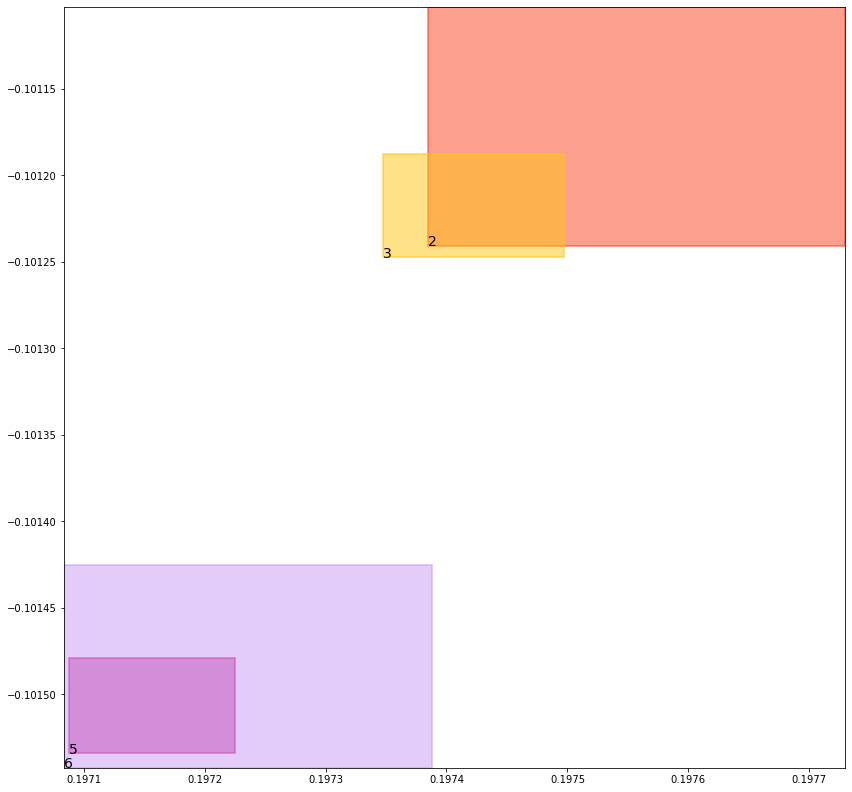

batch (tensor([[6, 2],
        [2, 6],
        [3, 5],
        [4, 5],
        [4, 6],
        [1, 3],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074762227013707, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068184202536941, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510020136833191, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652966678142548, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03795943036675453 0.026663320139050484 tensor(0.9230546355247498) tensor(0.9688338041305542)
tensor(2) 0.47670888900756836 0.4954439401626587 tensor(0.4772151410579681) tensor(0.4976674020290375)
tensor(3) 0.4751926362514496 0.49639660120010376 tensor(0.4754960834980011) tensor(0.4972920715808868)
tensor(4) 0.05376894772052765 0.009319666773080826 tensor(0.9703835844993591) tensor(0.9540499448776245)
tensor(5) 0.5139350295066833 0.4835346043109894 tensor(0.5158188939094543) tensor(0.4836224913597107)
tensor(6) 0.5163910388946533 0.48274150490760803 tensor(0.5169756412506104) tensor(0.4838340878486633)


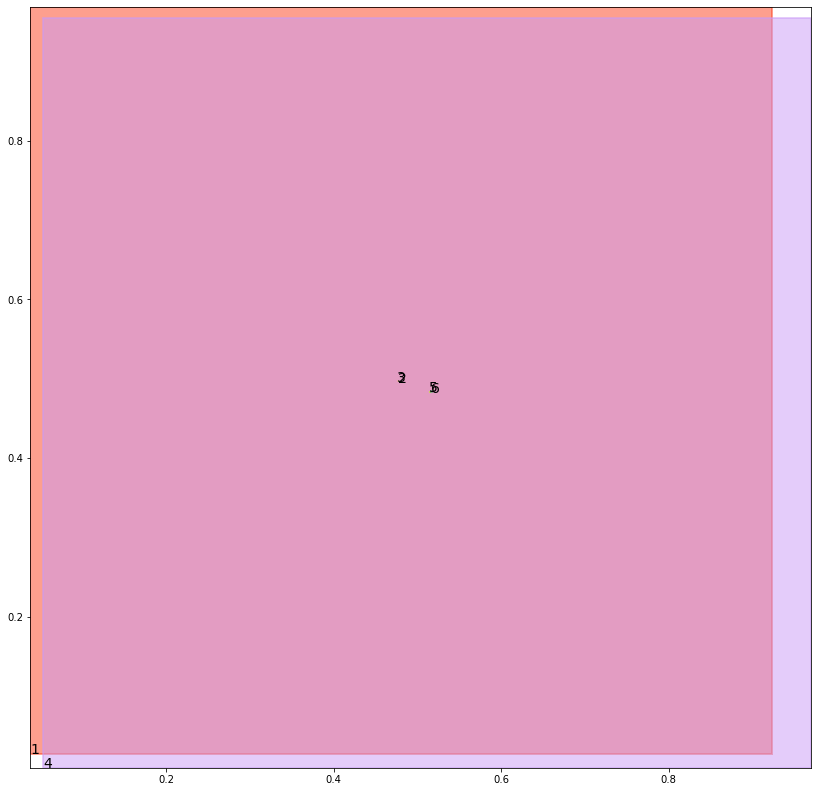

alignment data:
tensor(2) 0.19181811809539795 -0.08235377073287964 tensor(0.1924647092819214) tensor(-0.0820959508419037)
tensor(3) 0.19194942712783813 -0.08229383826255798 tensor(0.1922183036804199) tensor(-0.0821871161460876)
tensor(5) 0.19171178340911865 -0.08256973326206207 tensor(0.1918940544128418) tensor(-0.0825051665306091)
tensor(6) 0.1917027235031128 -0.08258478343486786 tensor(0.1920487880706787) tensor(-0.0824483036994934)


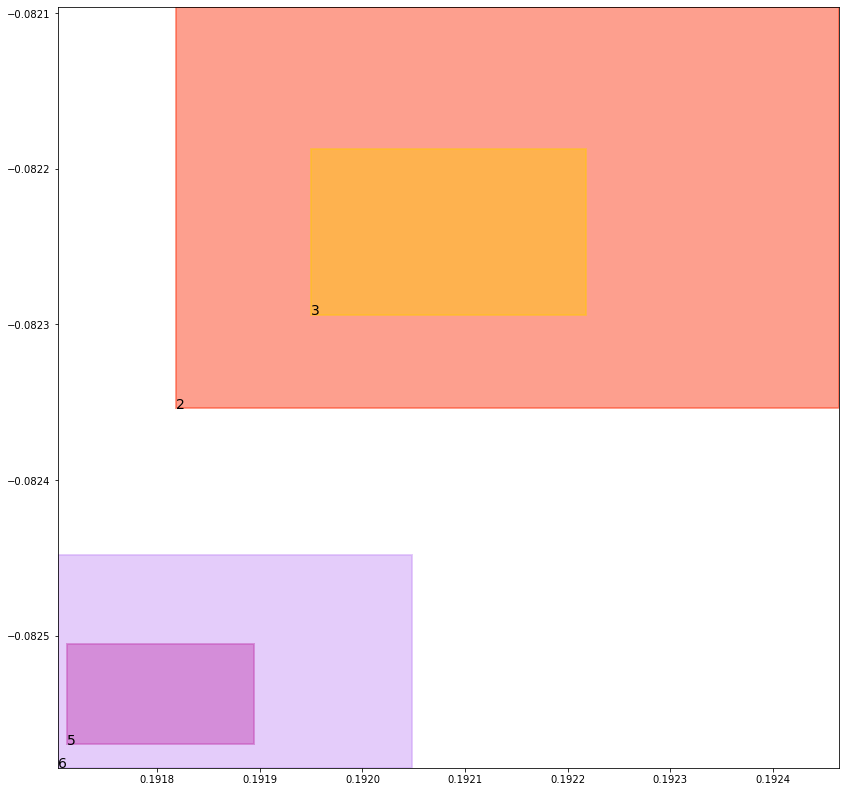

batch (tensor([[5, 3],
        [2, 6],
        [4, 6],
        [1, 2],
        [6, 2],
        [1, 3],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074822884052992, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068224710412323, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509974837303162, grad_fn=<MulBackward0>)
previous loss: tensor(0.2653022408485413, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037911929190158844 0.026529982686042786 tensor(0.9233541488647461) tensor(0.9688895344734192)
tensor(2) 0.4771452844142914 0.49523890018463135 tensor(0.4772314429283142) tensor(0.4976586699485779)
tensor(3) 0.4754435420036316 0.49604976177215576 tensor(0.4755510389804840) tensor(0.4975404143333435)
tensor(4) 0.05350947752594948 0.009265303611755371 tensor(0.9704102873802185) tensor(0.9541119933128357)
tensor(5) 0.5135669112205505 0.4828416109085083 tensor(0.5160648226737976) tensor(0.4837686717510223)
tensor(6) 0.5164201259613037 0.4830684959888458 tensor(0.5168826580047607) tensor(0.4837303459644318)


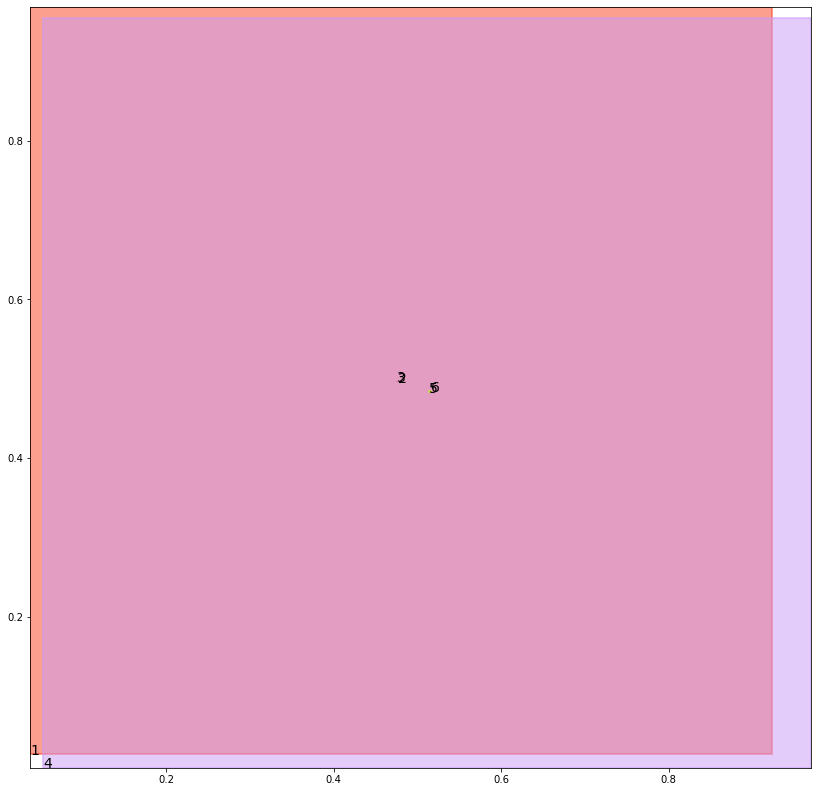

alignment data:
tensor(2) 0.19101214408874512 -0.06726667284965515 tensor(0.1916764974594116) tensor(-0.0669993162155151)
tensor(3) 0.19108891487121582 -0.06722770631313324 tensor(0.1915028095245361) tensor(-0.0670614242553711)
tensor(5) 0.19071388244628906 -0.06755819916725159 tensor(0.1911761760711670) tensor(-0.0673836618661880)
tensor(6) 0.19101595878601074 -0.0674499124288559 tensor(0.1912347078323364) tensor(-0.0673639327287674)


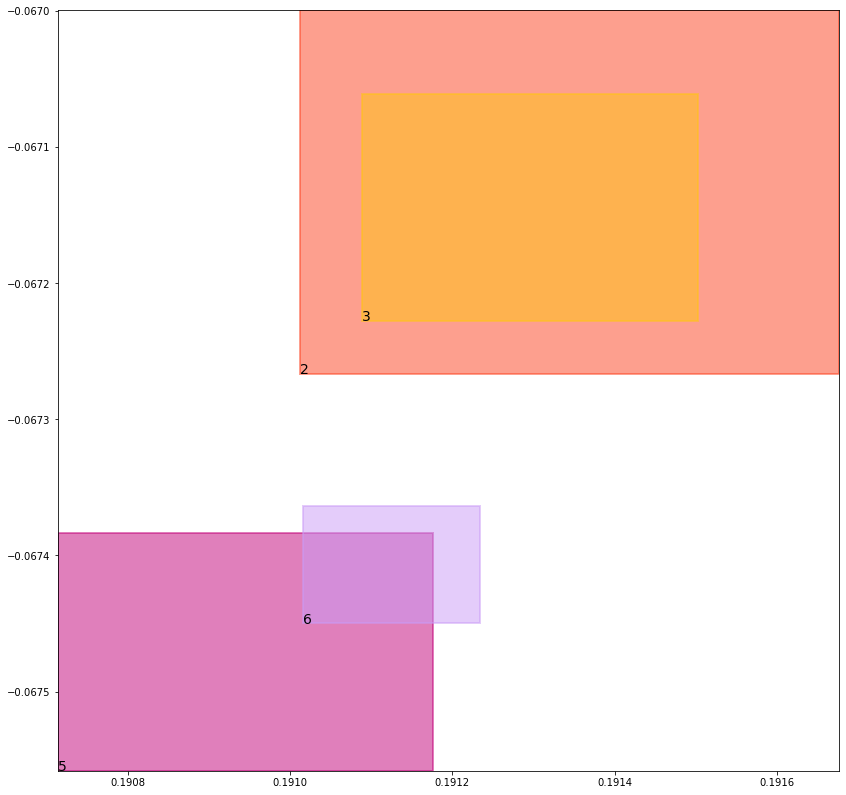

batch (tensor([[3, 5],
        [5, 3],
        [1, 2],
        [4, 6],
        [4, 5],
        [2, 6],
        [6, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074716890230775, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068230414763093, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509947121143341, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652894556522369, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03786453604698181 0.026397673413157463 tensor(0.9236518144607544) tensor(0.9689452648162842)
tensor(2) 0.47696301341056824 0.49555668234825134 tensor(0.4781965613365173) tensor(0.4974615275859833)
tensor(3) 0.4753035604953766 0.4960697591304779 tensor(0.4759357869625092) tensor(0.4974172711372375)
tensor(4) 0.05325208231806755 0.009211467579007149 tensor(0.9704369902610779) tensor(0.9541741013526917)
tensor(5) 0.5136447548866272 0.4826399087905884 tensor(0.5155755877494812) tensor(0.4838265478610992)
tensor(6) 0.516147255897522 0.4834674000740051 tensor(0.5169160366058350) tensor(0.4838867783546448)


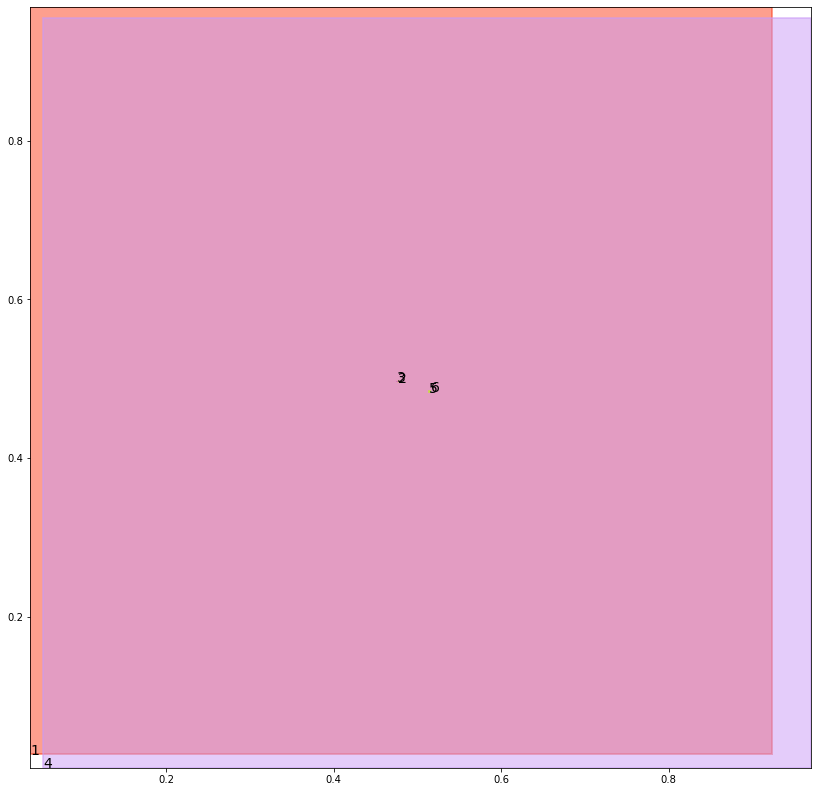

alignment data:
tensor(2) 0.18741655349731445 -0.05342470109462738 tensor(0.1880379915237427) tensor(-0.0531797111034393)
tensor(3) 0.18741583824157715 -0.0534171462059021 tensor(0.1878350973129272) tensor(-0.0532508790493011)
tensor(5) 0.18700683116912842 -0.05376461148262024 tensor(0.1874920725822449) tensor(-0.0535778999328613)
tensor(6) 0.18744289875030518 -0.0536004900932312 tensor(0.1876216530799866) tensor(-0.0535319745540619)


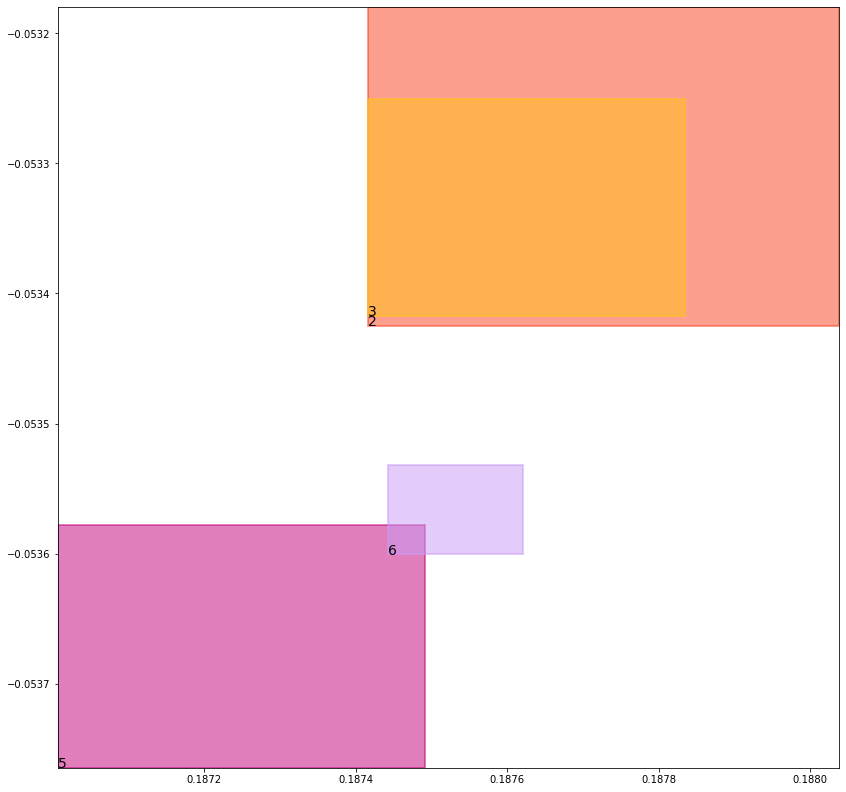

batch (tensor([[4, 6],
        [4, 5],
        [5, 3],
        [3, 5],
        [1, 2],
        [2, 6],
        [6, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [3, 5],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074731302447617, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068138893693686, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509951889514923, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652822136878967, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03781724348664284 0.026266414672136307 tensor(0.9239475131034851) tensor(0.9690008163452148)
tensor(2) 0.47702556848526 0.496344655752182 tensor(0.4785260856151581) tensor(0.4970949292182922)
tensor(3) 0.47541093826293945 0.4964197278022766 tensor(0.4761396944522858) tensor(0.4969589114189148)
tensor(4) 0.052996739745140076 0.009158157743513584 tensor(0.9704636335372925) tensor(0.9542360305786133)
tensor(5) 0.5141245126724243 0.4829639196395874 tensor(0.5144259333610535) tensor(0.4837253391742706)
tensor(6) 0.5161297917366028 0.48339641094207764 tensor(0.5165351033210754) tensor(0.4840920269489288)


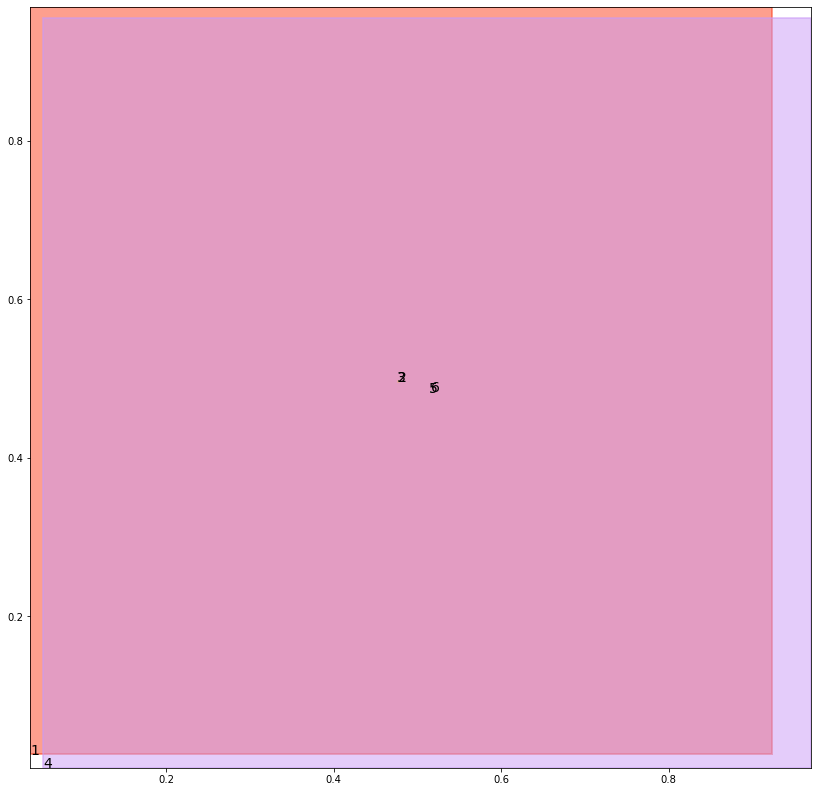

alignment data:
tensor(2) 0.17662876844406128 -0.04760017991065979 tensor(0.1769595146179199) tensor(-0.0474736690521240)
tensor(3) 0.1765124797821045 -0.047639399766922 tensor(0.1767206192016602) tensor(-0.0475587993860245)
tensor(5) 0.1761353611946106 -0.04797801375389099 tensor(0.1763675212860107) tensor(-0.0478855669498444)
tensor(6) 0.17642247676849365 -0.04787154495716095 tensor(0.1766456365585327) tensor(-0.0477832704782486)


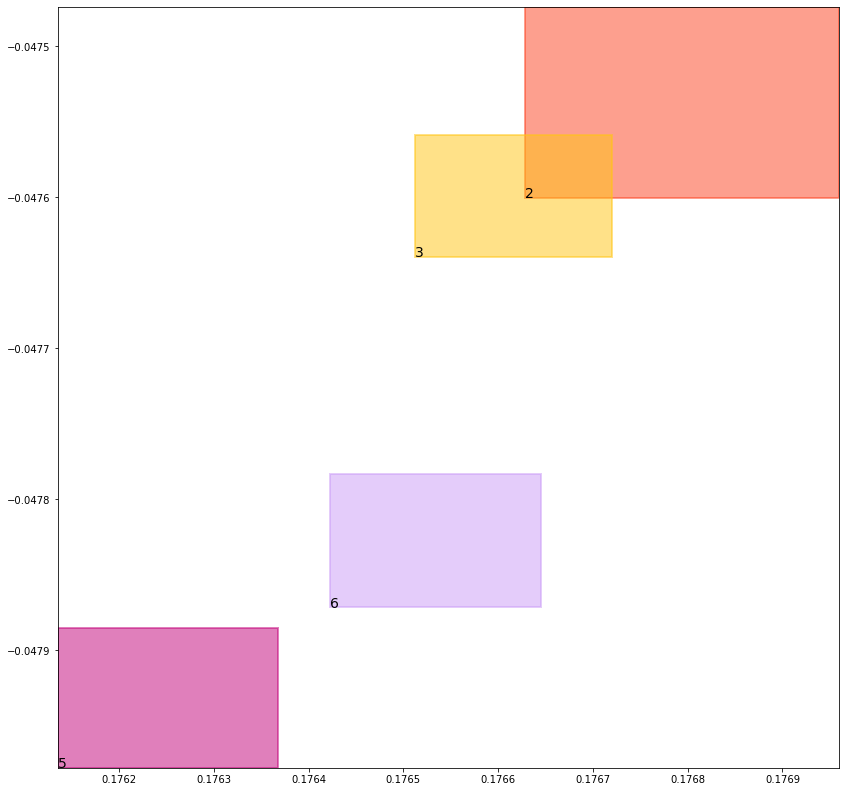

batch (tensor([[4, 6],
        [1, 2],
        [5, 3],
        [4, 5],
        [2, 6],
        [6, 2],
        [3, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074515119194984, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067886244505644, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510015964508057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652417421340942, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037770044058561325 0.02613627165555954 tensor(0.9242414832115173) tensor(0.9690561294555664)
tensor(2) 0.47738611698150635 0.49657732248306274 tensor(0.4782039523124695) tensor(0.4975434243679047)
tensor(3) 0.4758386015892029 0.4961996376514435 tensor(0.4760830402374268) tensor(0.4970665872097015)
tensor(4) 0.052743520587682724 0.009105373173952103 tensor(0.9704902172088623) tensor(0.9542979001998901)
tensor(5) 0.5126879215240479 0.48348066210746765 tensor(0.5149644017219543) tensor(0.4837595820426941)
tensor(6) 0.5157806873321533 0.48350173234939575 tensor(0.5163434147834778) tensor(0.4837385118007660)


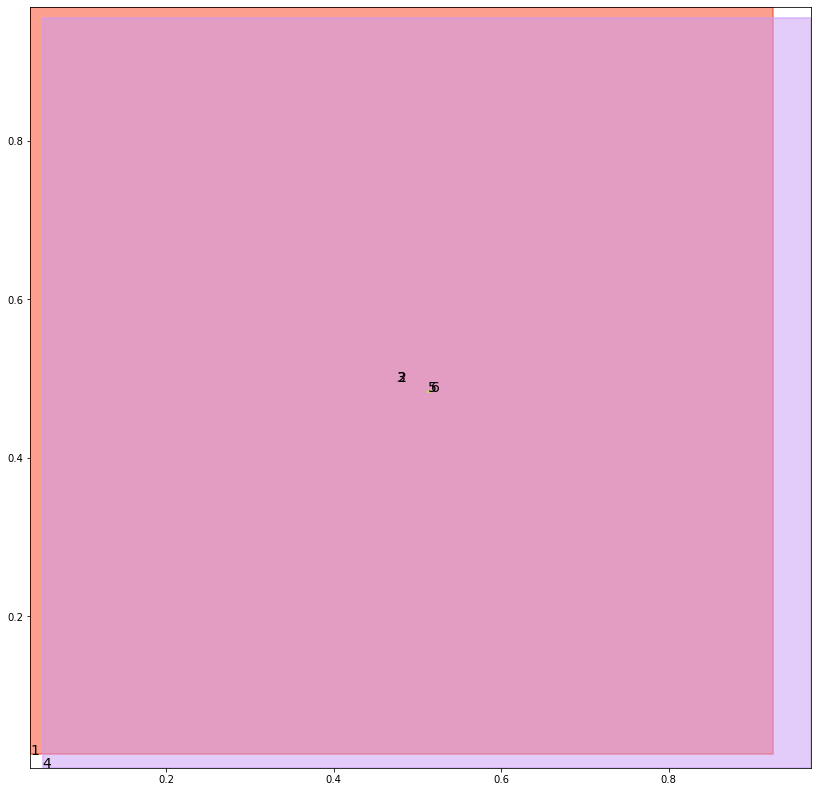

alignment data:
tensor(2) 0.162827730178833 -0.042168810963630676 tensor(0.1631593704223633) tensor(-0.0420384854078293)
tensor(3) 0.16259390115737915 -0.04225596785545349 tensor(0.1628499627113342) tensor(-0.0421534627676010)
tensor(5) 0.1622660756111145 -0.04256746172904968 tensor(0.1625349521636963) tensor(-0.0424696803092957)
tensor(6) 0.1625341773033142 -0.04247395694255829 tensor(0.1626462936401367) tensor(-0.0424312949180603)


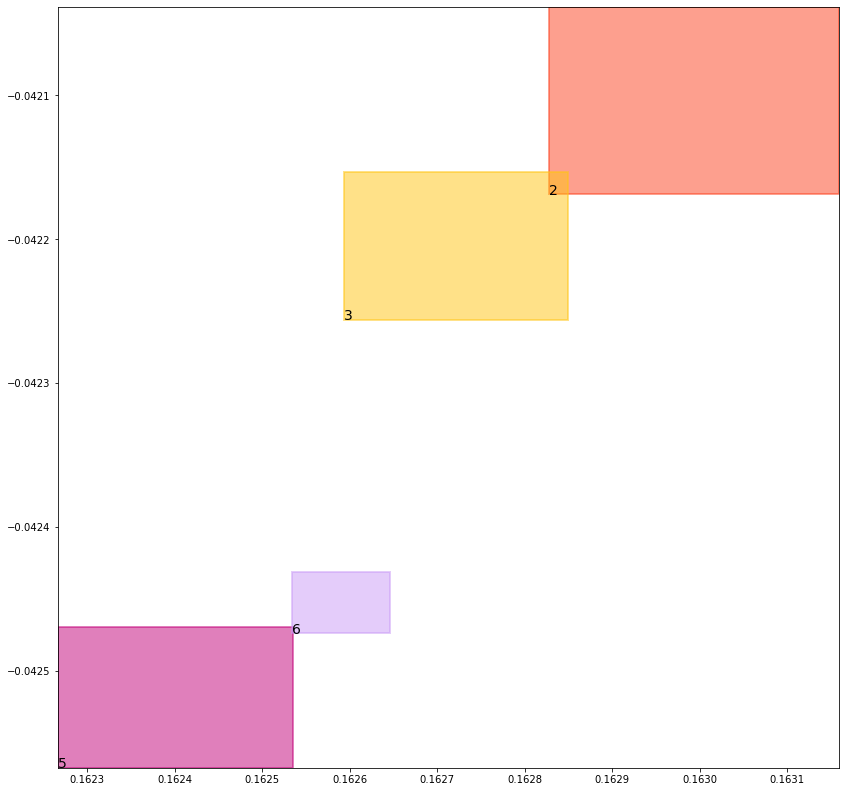

batch (tensor([[2, 6],
        [6, 2],
        [5, 3],
        [1, 2],
        [1, 3],
        [3, 5],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074336472898722, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067926454357803, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510019838809967, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652282714843750, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03772295266389847 0.026007231324911118 tensor(0.9245337247848511) tensor(0.9691113829612732)
tensor(2) 0.4772956073284149 0.49629226326942444 tensor(0.4780147373676300) tensor(0.4981174170970917)
tensor(3) 0.47579196095466614 0.49585211277008057 tensor(0.4765545129776001) tensor(0.4973082840442657)
tensor(4) 0.05249221995472908 0.009053121320903301 tensor(0.9705168604850769) tensor(0.9543598294258118)
tensor(5) 0.5117993950843811 0.4834133982658386 tensor(0.5152926445007324) tensor(0.4839769005775452)
tensor(6) 0.5154753923416138 0.4828908443450928 tensor(0.5162846446037292) tensor(0.4837672412395477)


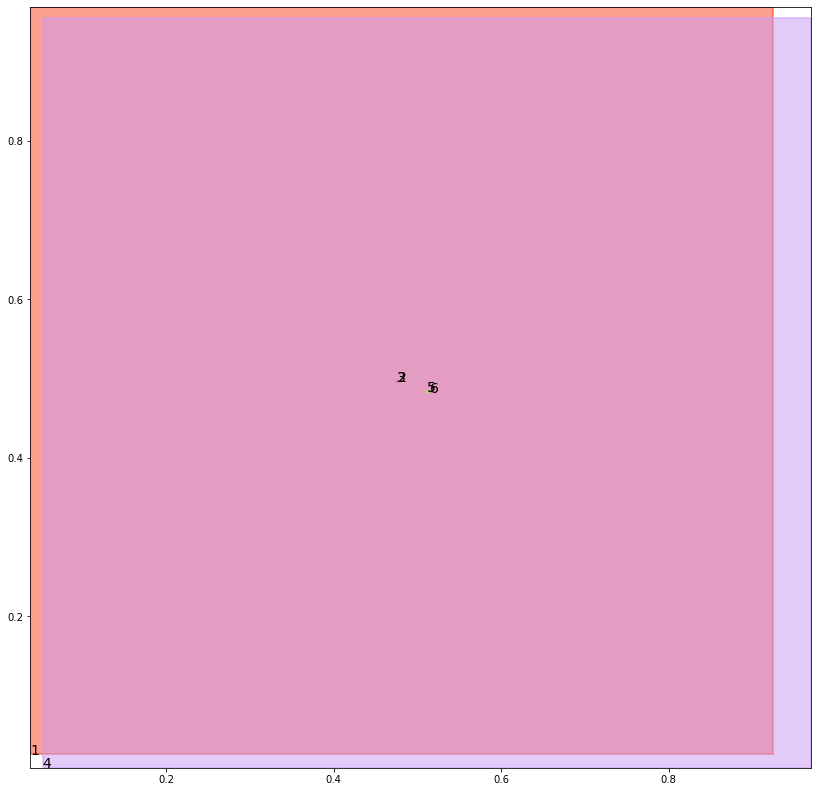

alignment data:
tensor(2) 0.15034258365631104 -0.04276394844055176 tensor(0.1508992314338684) tensor(-0.0425418019294739)
tensor(3) 0.15009522438049316 -0.0428568571805954 tensor(0.1505554318428040) tensor(-0.0426740348339081)
tensor(5) 0.14977967739105225 -0.04316093027591705 tensor(0.1502295732498169) tensor(-0.0429956167936325)
tensor(6) 0.14995026588439941 -0.04310972988605499 tensor(0.1502569913864136) tensor(-0.0429893434047699)


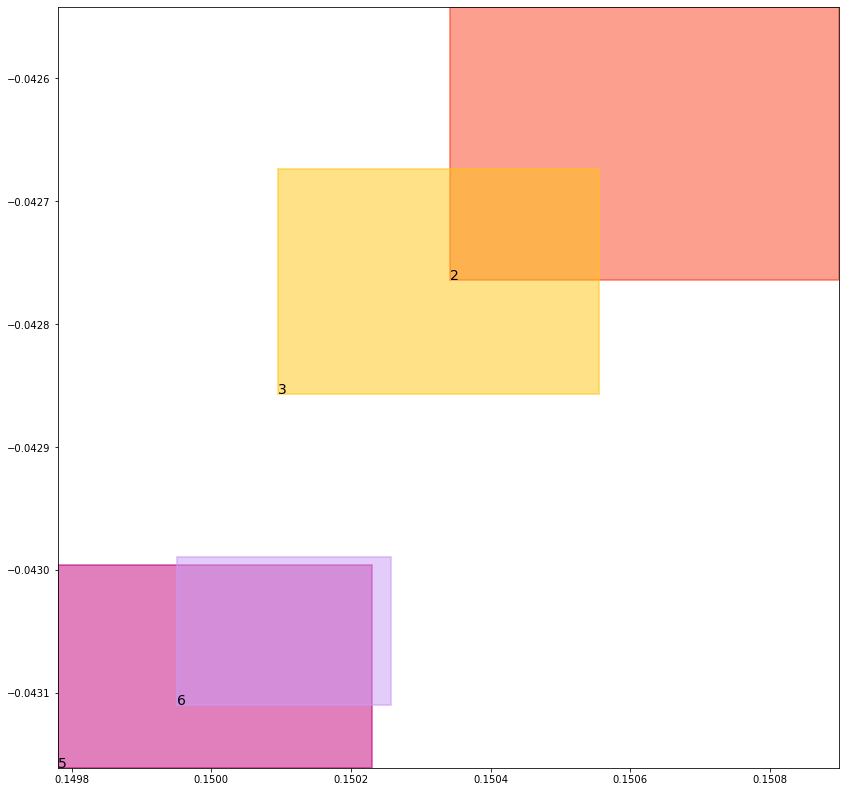

batch (tensor([[6, 2],
        [4, 6],
        [4, 5],
        [1, 3],
        [5, 3],
        [1, 2],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074391416274011, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0068056676536798, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509948313236237, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652396559715271, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03767595812678337 0.025879250839352608 tensor(0.9248239994049072) tensor(0.9691666364669800)
tensor(2) 0.4771336019039154 0.496216356754303 tensor(0.4782967269420624) tensor(0.4981185793876648)
tensor(3) 0.47579604387283325 0.49587827920913696 tensor(0.4769014120101929) tensor(0.4971827864646912)
tensor(4) 0.05224272236227989 0.009001374244689941 tensor(0.9705434441566467) tensor(0.9544215798377991)
tensor(5) 0.5116829872131348 0.4835064113140106 tensor(0.5151574611663818) tensor(0.4836707711219788)
tensor(6) 0.5155766010284424 0.48266857862472534 tensor(0.5159801840782166) tensor(0.4838390648365021)


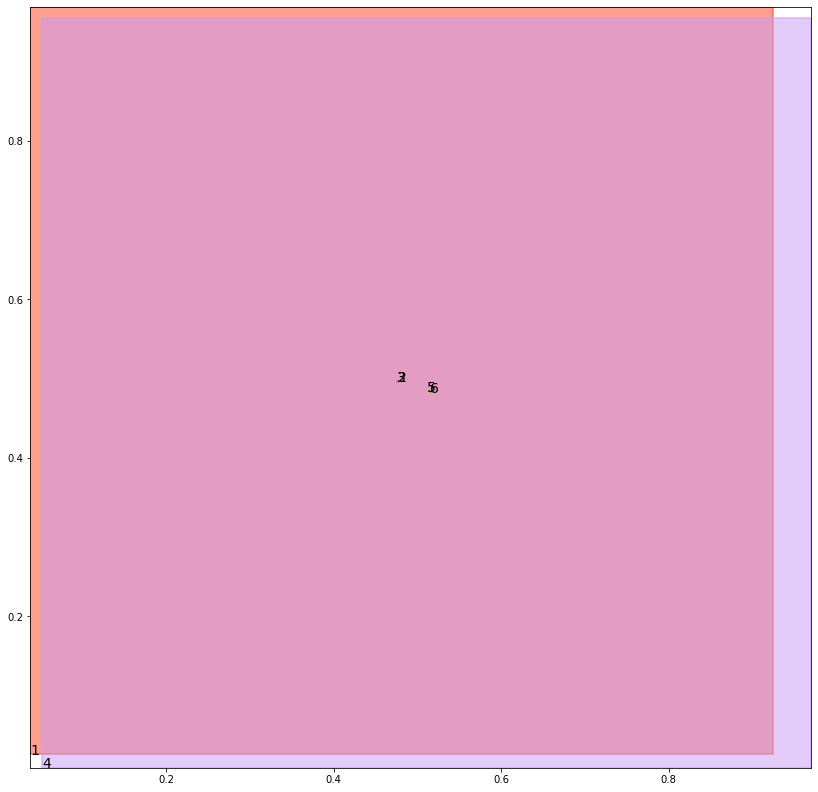

alignment data:
tensor(2) 0.14310085773468018 -0.043516844511032104 tensor(0.1437164545059204) tensor(-0.0432727187871933)
tensor(3) 0.14289510250091553 -0.04359373450279236 tensor(0.1433434486389160) tensor(-0.0434172600507736)
tensor(5) 0.14259499311447144 -0.043892666697502136 tensor(0.1429357528686523) tensor(-0.0437715053558350)
tensor(6) 0.14269936084747314 -0.04386948049068451 tensor(0.1430515050888062) tensor(-0.0437285751104355)


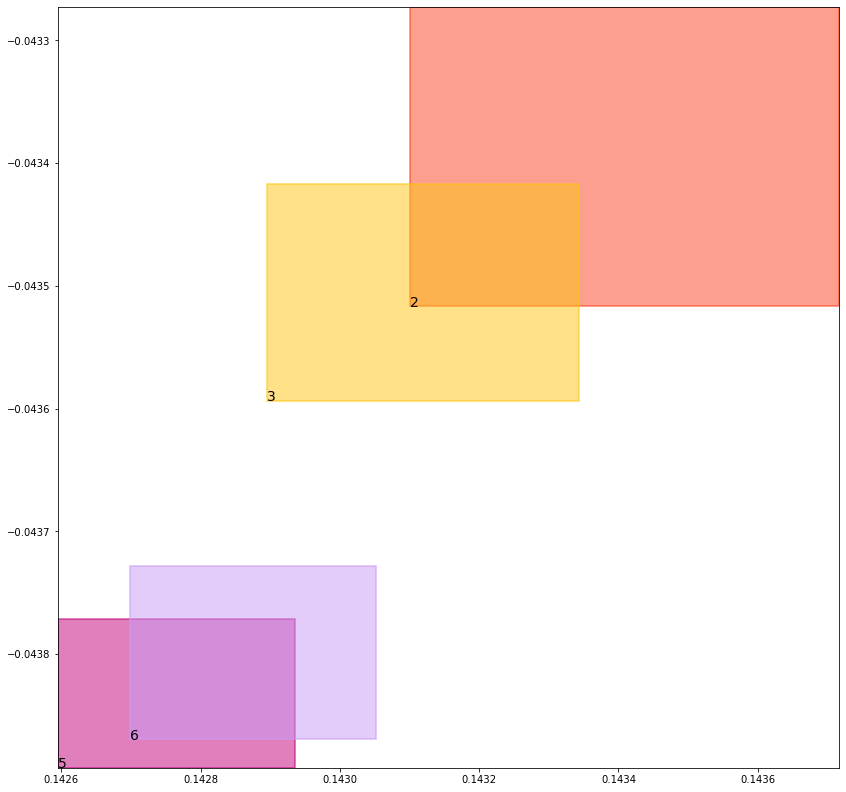

batch (tensor([[6, 2],
        [3, 5],
        [4, 5],
        [1, 2],
        [5, 3],
        [4, 6],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074362889863551, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067942356690764, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509951293468475, grad_fn=<MulBackward0>)
previous loss: tensor(0.2652256488800049, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03762904927134514 0.025752320885658264 tensor(0.9251126646995544) tensor(0.9692215919494629)
tensor(2) 0.47764647006988525 0.49632927775382996 tensor(0.4782653748989105) tensor(0.4976017475128174)
tensor(3) 0.4760669469833374 0.49624165892601013 tensor(0.4769141972064972) tensor(0.4967242181301117)
tensor(4) 0.05199505388736725 0.008950128220021725 tensor(0.9705700874328613) tensor(0.9544833898544312)
tensor(5) 0.5122629404067993 0.48289719223976135 tensor(0.5146046280860901) tensor(0.4837439060211182)
tensor(6) 0.5154546499252319 0.48301318287849426 tensor(0.5160440802574158) tensor(0.4837359189987183)


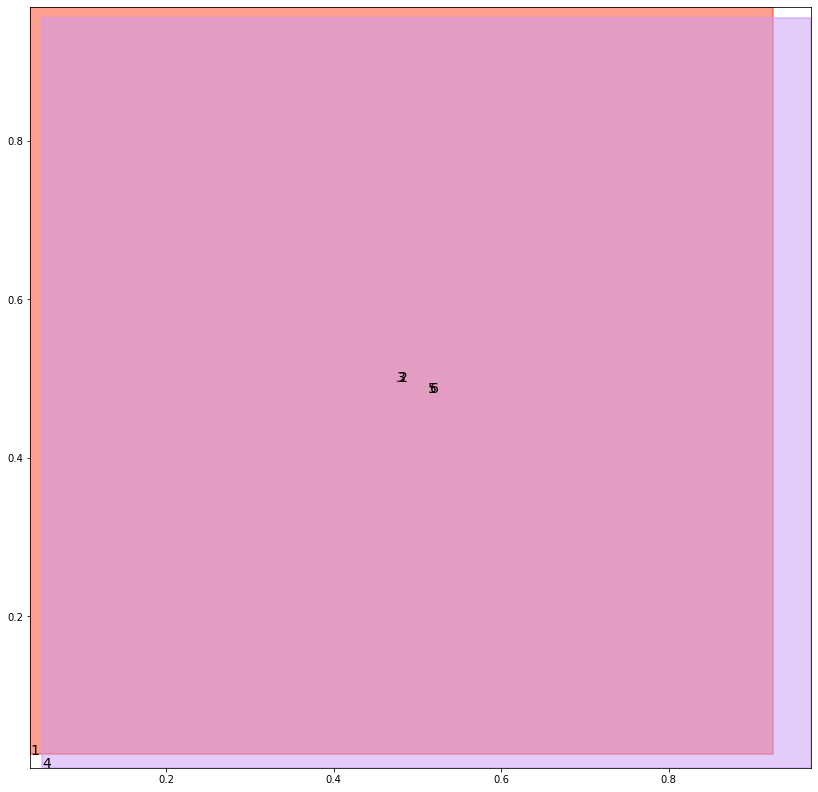

alignment data:
tensor(2) 0.14076656103134155 -0.04800252616405487 tensor(0.1411647796630859) tensor(-0.0478437691926956)
tensor(3) 0.1406078338623047 -0.048059165477752686 tensor(0.1408111453056335) tensor(-0.0479807555675507)
tensor(5) 0.14007800817489624 -0.04845474660396576 tensor(0.1405079960823059) tensor(-0.0482916980981827)
tensor(6) 0.14038217067718506 -0.048347026109695435 tensor(0.1406288146972656) tensor(-0.0482497811317444)


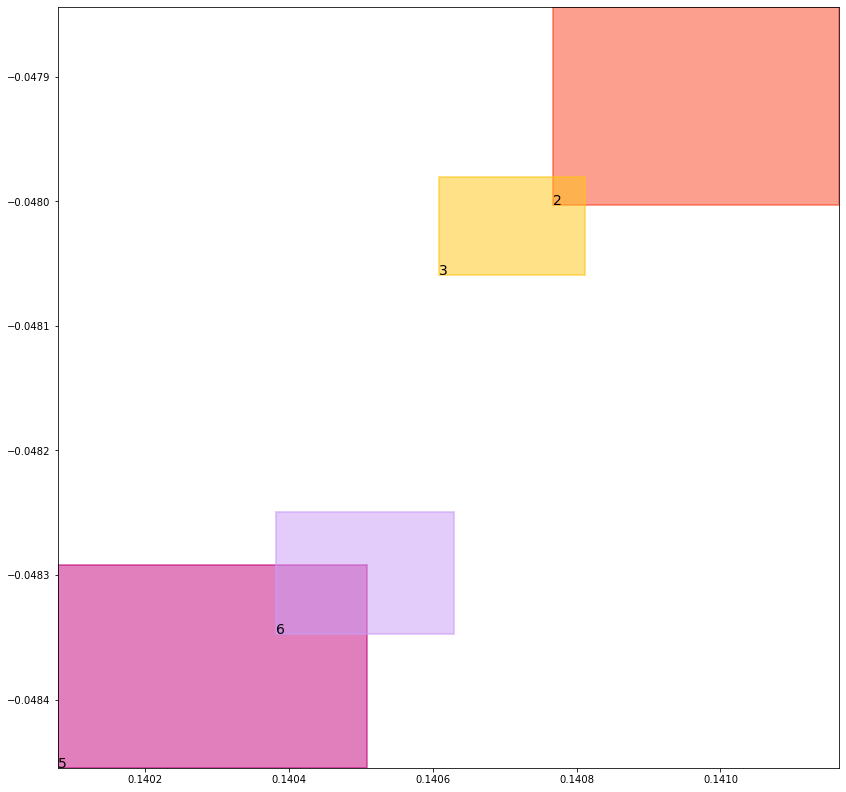

batch (tensor([[2, 6],
        [4, 5],
        [6, 2],
        [1, 2],
        [3, 5],
        [4, 6],
        [5, 3],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074069555848837, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067808534950018, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509993612766266, grad_fn=<MulBackward0>)
previous loss: tensor(0.2651871740818024, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037582237273454666 0.02562646009027958 tensor(0.9253993630409241) tensor(0.9692765474319458)
tensor(2) 0.4779519736766815 0.4966125786304474 tensor(0.4787657558917999) tensor(0.4966250658035278)
tensor(3) 0.4765774607658386 0.4959692656993866 tensor(0.4766262769699097) tensor(0.4969022274017334)
tensor(4) 0.051749296486377716 0.008899363689124584 tensor(0.9705965518951416) tensor(0.9545449614524841)
tensor(5) 0.5134682059288025 0.4827110767364502 tensor(0.5136760473251343) tensor(0.4838035702705383)
tensor(6) 0.5152117013931274 0.4834735691547394 tensor(0.5160555839538574) tensor(0.4838663637638092)


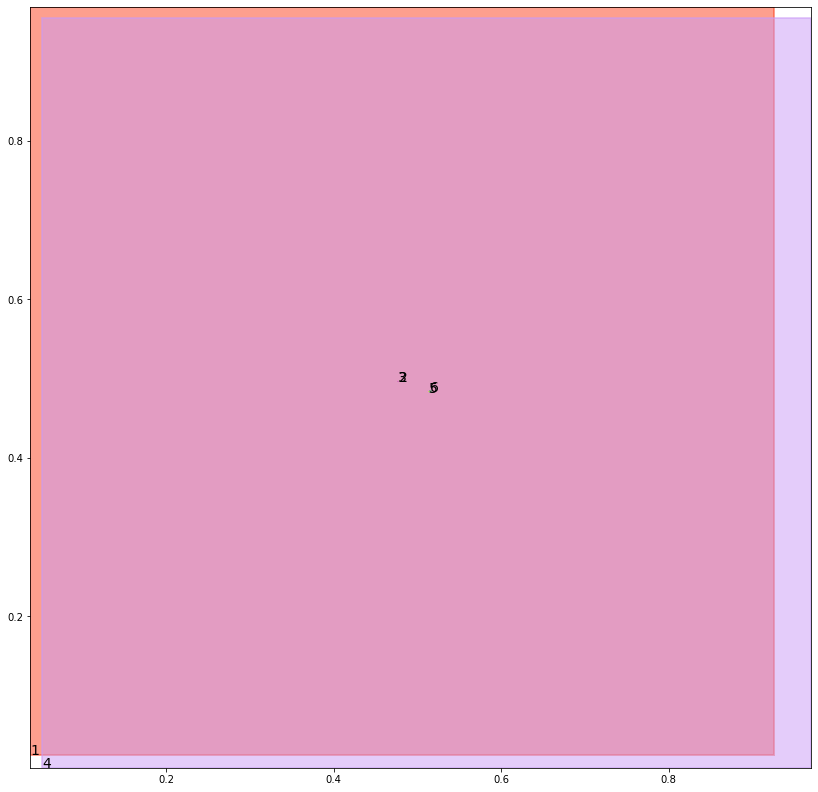

alignment data:
tensor(2) 0.1377314329147339 -0.05381663143634796 tensor(0.1378045082092285) tensor(-0.0537909716367722)
tensor(3) 0.13743901252746582 -0.05392865836620331 tensor(0.1376965045928955) tensor(-0.0538241714239120)
tensor(5) 0.13700079917907715 -0.05429241061210632 tensor(0.1373151540756226) tensor(-0.0541655570268631)
tensor(6) 0.13735711574554443 -0.05415622889995575 tensor(0.1375359892845154) tensor(-0.0540876835584641)


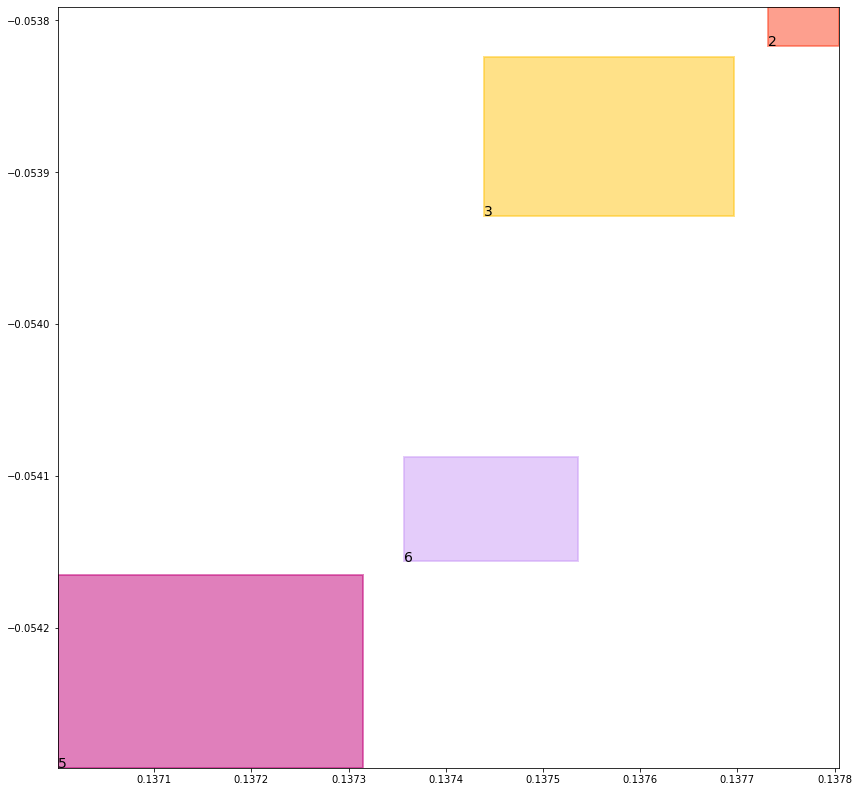

batch (tensor([[4, 5],
        [1, 2],
        [1, 3],
        [2, 6],
        [3, 5],
        [5, 3],
        [4, 6],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073849176988006, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067578693851829, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510031759738922, grad_fn=<MulBackward0>)
previous loss: tensor(0.2651459574699402, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03753553330898285 0.025501661002635956 tensor(0.9256843328475952) tensor(0.9693312048912048)
tensor(2) 0.47797250747680664 0.4952488839626312 tensor(0.4791583418846130) tensor(0.4970492124557495)
tensor(3) 0.4760679602622986 0.4956205189228058 tensor(0.4773036539554596) tensor(0.4971494674682617)
tensor(4) 0.05150556191802025 0.008849086239933968 tensor(0.9706230759620667) tensor(0.9546066522598267)
tensor(5) 0.5124121904373169 0.4830538034439087 tensor(0.5152271986007690) tensor(0.4837031364440918)
tensor(6) 0.5152241587638855 0.48340940475463867 tensor(0.5156536698341370) tensor(0.4840945899486542)


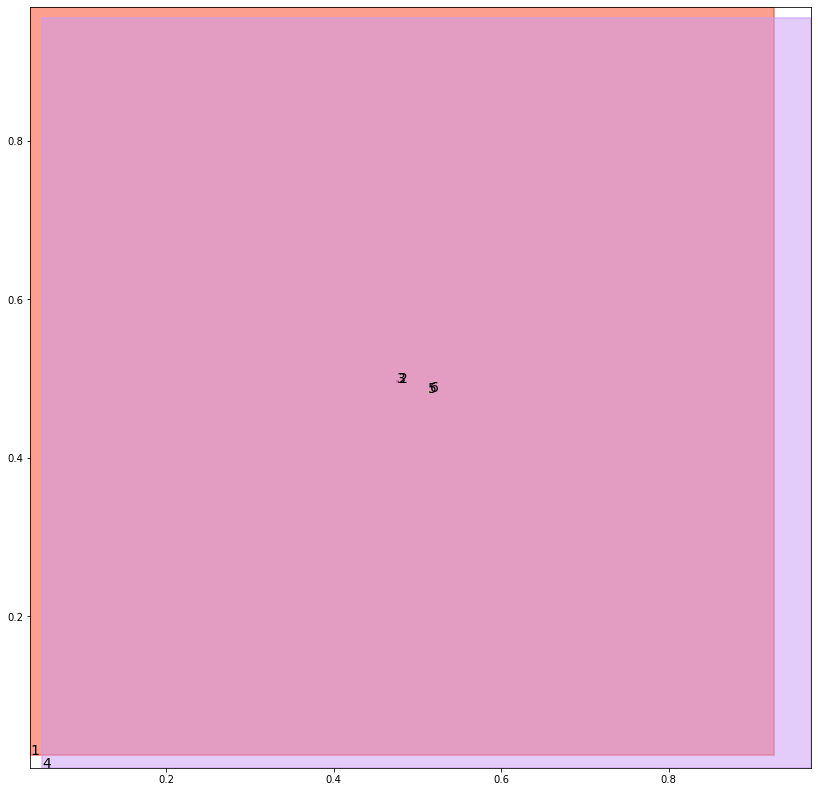

alignment data:
tensor(2) 0.13374221324920654 -0.06641265749931335 tensor(0.1343324184417725) tensor(-0.0661782324314117)
tensor(3) 0.13367950916290283 -0.066428542137146 tensor(0.1342005729675293) tensor(-0.0662226229906082)
tensor(5) 0.13339078426361084 -0.06673029065132141 tensor(0.1338086724281311) tensor(-0.0665743499994278)
tensor(6) 0.13372868299484253 -0.06660689413547516 tensor(0.1339515447616577) tensor(-0.0665183365345001)


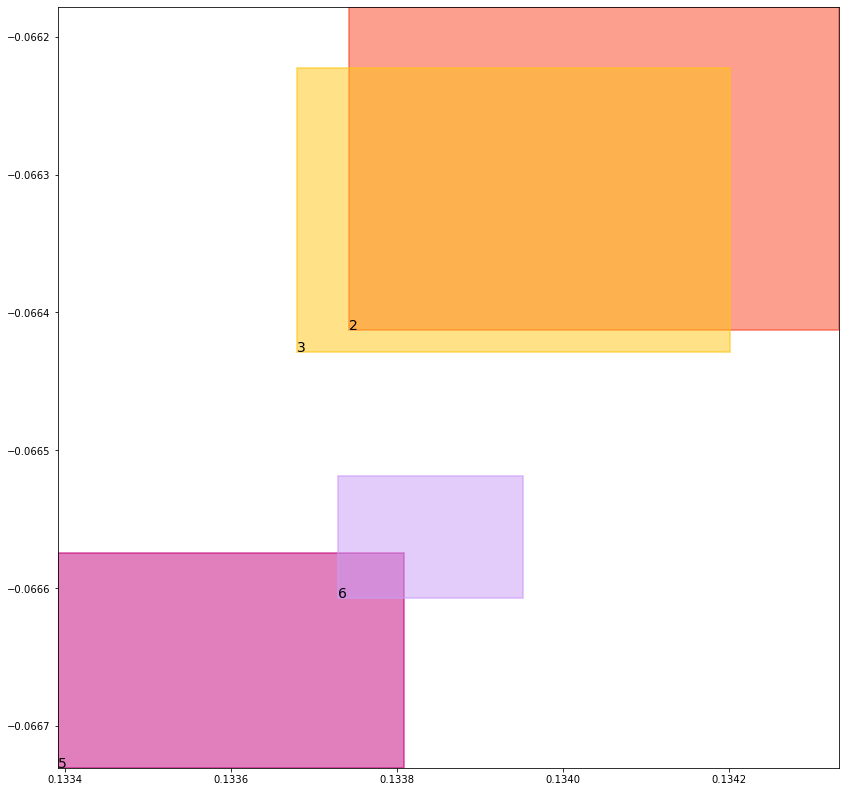

batch (tensor([[4, 6],
        [3, 5],
        [6, 2],
        [1, 2],
        [4, 5],
        [5, 3],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074087567627430, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067689414136112, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509947717189789, grad_fn=<MulBackward0>)
previous loss: tensor(0.2651724815368652, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0374889150261879 0.025377819314599037 tensor(0.9259676933288574) tensor(0.9693859219551086)
tensor(2) 0.47829580307006836 0.494510680437088 tensor(0.4788926839828491) tensor(0.4972540438175201)
tensor(3) 0.47589635848999023 0.49564340710639954 tensor(0.4777163863182068) tensor(0.4970220625400543)
tensor(4) 0.05126374587416649 0.008799298666417599 tensor(0.9706496000289917) tensor(0.9546682834625244)
tensor(5) 0.5116845965385437 0.48345857858657837 tensor(0.5161006450653076) tensor(0.4838665127754211)
tensor(6) 0.5148804187774658 0.4835200011730194 tensor(0.5154655575752258) tensor(0.4837605953216553)


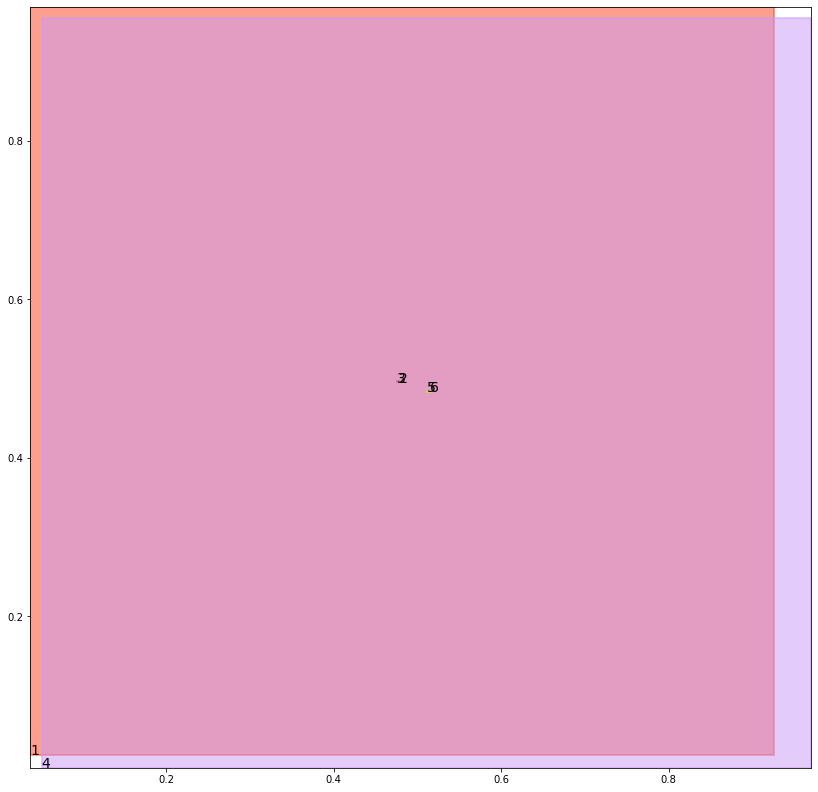

alignment data:
tensor(2) 0.12357425689697266 -0.08632534742355347 tensor(0.1243699789047241) tensor(-0.0860040038824081)
tensor(3) 0.12367498874664307 -0.08627201616764069 tensor(0.1242058277130127) tensor(-0.0860649496316910)
tensor(5) 0.12345016002655029 -0.08654646575450897 tensor(0.1239410042762756) tensor(-0.0863688886165619)
tensor(6) 0.12374186515808105 -0.08644381165504456 tensor(0.1238575577735901) tensor(-0.0863996744155884)


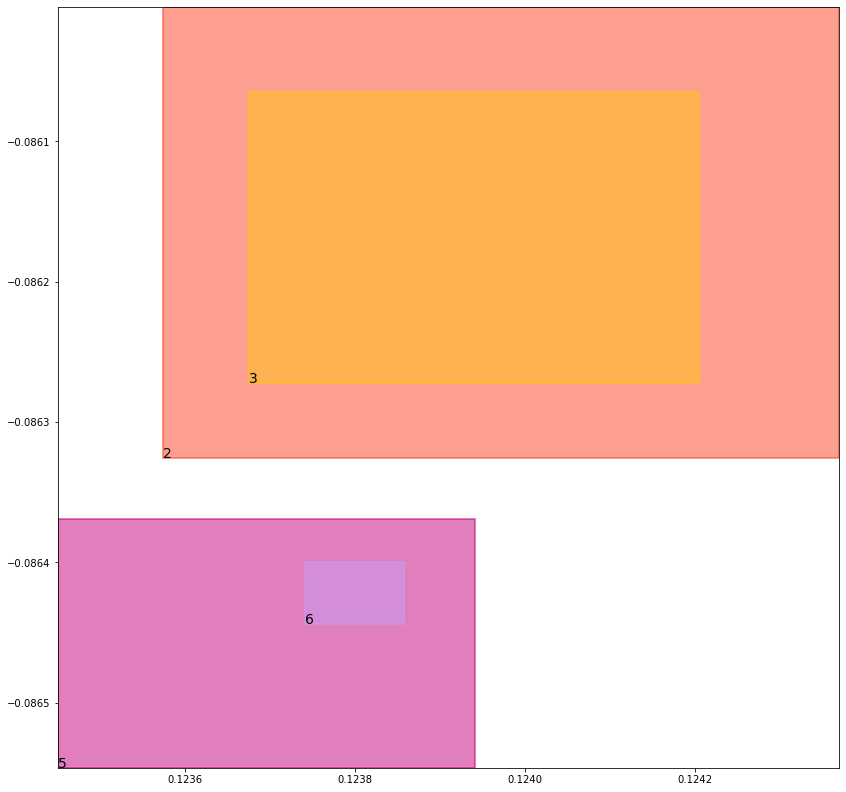

batch (tensor([[4, 6],
        [1, 2],
        [6, 2],
        [3, 5],
        [1, 3],
        [4, 5],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0074053038842976, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067723924294114, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509930729866028, grad_fn=<MulBackward0>)
previous loss: tensor(0.2651707828044891, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03744238242506981 0.02525489404797554 tensor(0.9262492656707764) tensor(0.9694404602050781)
tensor(2) 0.4780348837375641 0.4943593144416809 tensor(0.4788923561573029) tensor(0.4972473084926605)
tensor(3) 0.47607478499412537 0.4960031807422638 tensor(0.4778459072113037) tensor(0.4965598583221436)
tensor(4) 0.051023732870817184 0.008749998174607754 tensor(0.9706760048866272) tensor(0.9547297358512878)
tensor(5) 0.5114429593086243 0.48339173197746277 tensor(0.5161671042442322) tensor(0.4840932488441467)
tensor(6) 0.5145577788352966 0.48292654752731323 tensor(0.5154314637184143) tensor(0.4837861359119415)


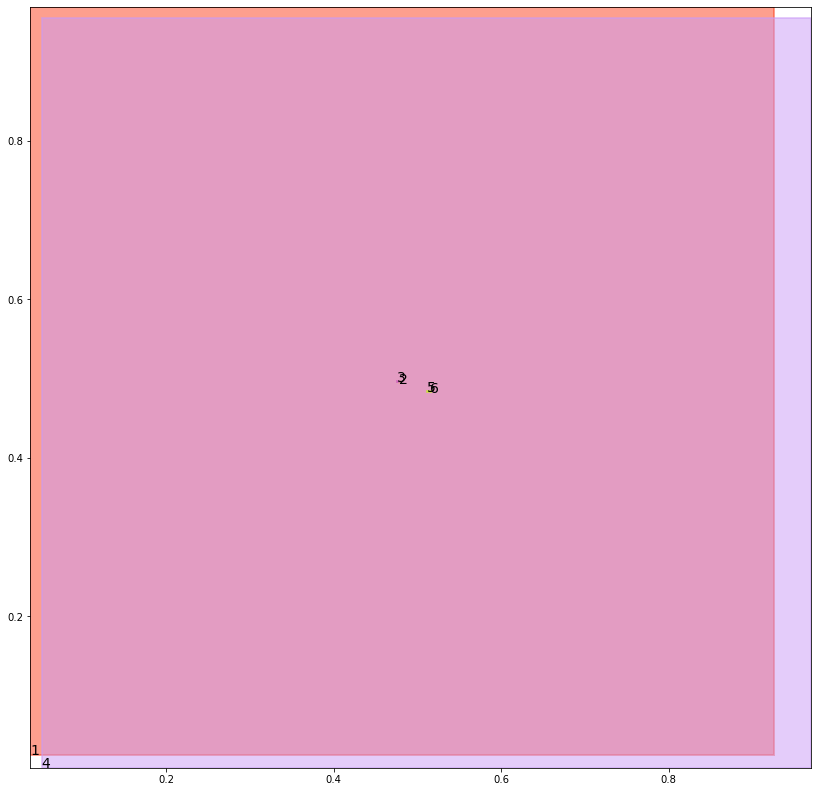

alignment data:
tensor(2) 0.11765050888061523 -0.10801845788955688 tensor(0.1185082793235779) tensor(-0.1076728850603104)
tensor(3) 0.11792749166488647 -0.1078953742980957 tensor(0.1182314157485962) tensor(-0.1077804565429688)
tensor(5) 0.11755776405334473 -0.1082281619310379 tensor(0.1181558966636658) tensor(-0.1080083996057510)
tensor(6) 0.11770039796829224 -0.10818597674369812 tensor(0.1180090904235840) tensor(-0.1080645322799683)


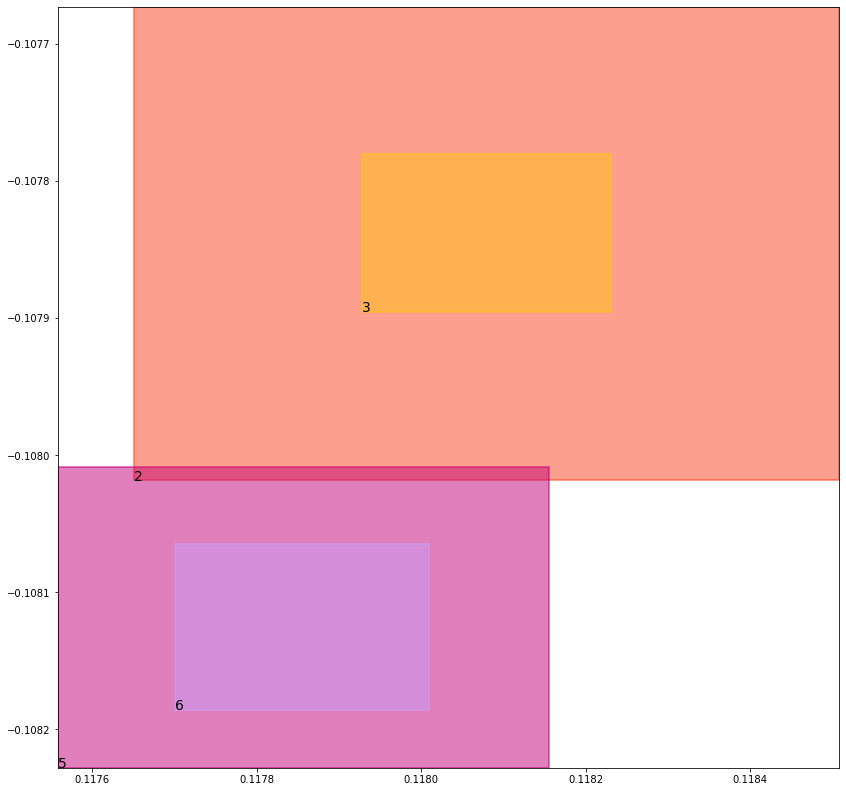

batch (tensor([[2, 6],
        [4, 6],
        [1, 3],
        [6, 2],
        [5, 3],
        [1, 2],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073927841149271, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067777633666992, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509920299053192, grad_fn=<MulBackward0>)
previous loss: tensor(0.2651625871658325, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03739593178033829 0.025132890790700912 tensor(0.9265291690826416) tensor(0.9694948196411133)
tensor(2) 0.4779222011566162 0.4947343170642853 tensor(0.4791448414325714) tensor(0.4970498085021973)
tensor(3) 0.4765683710575104 0.49580177664756775 tensor(0.4777204692363739) tensor(0.4966618120670319)
tensor(4) 0.05078549310564995 0.008701169863343239 tensor(0.9707024693489075) tensor(0.9547911882400513)
tensor(5) 0.5116415023803711 0.4834871292114258 tensor(0.5155023932456970) tensor(0.4837826192378998)
tensor(6) 0.5146433711051941 0.4827037453651428 tensor(0.5151485800743103) tensor(0.4838553667068481)


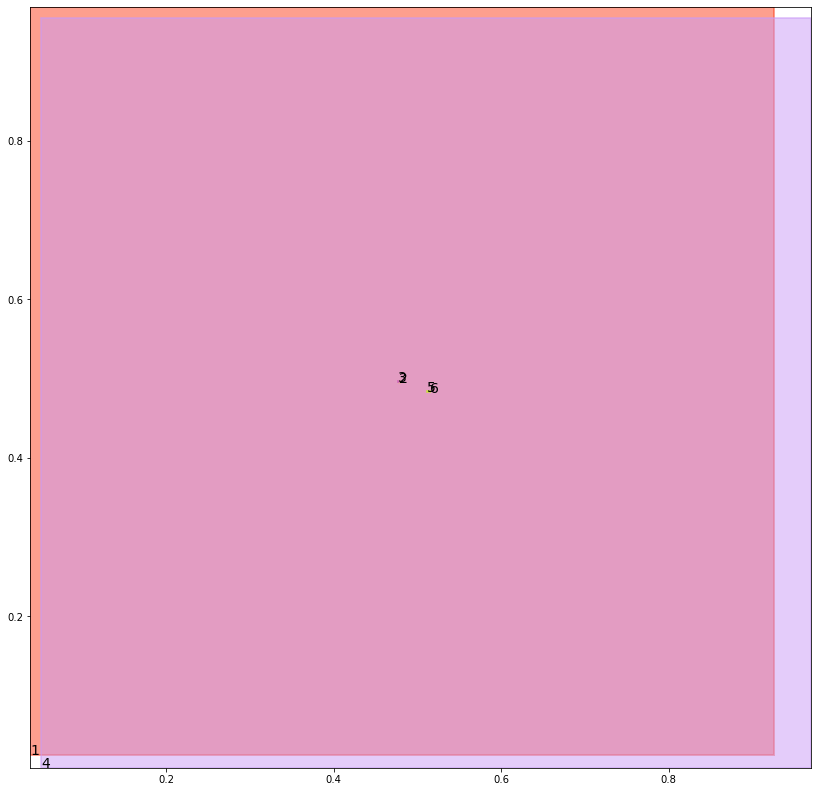

alignment data:
tensor(2) 0.10946357250213623 -0.1273382306098938 tensor(0.1101979017257690) tensor(-0.1270446032285690)
tensor(3) 0.10963618755340576 -0.1272607147693634 tensor(0.1099693775177002) tensor(-0.1271305978298187)
tensor(5) 0.10932791233062744 -0.12756823003292084 tensor(0.1097421646118164) tensor(-0.1274190098047256)
tensor(6) 0.10937505960464478 -0.12756451964378357 tensor(0.1097313165664673) tensor(-0.1274216026067734)


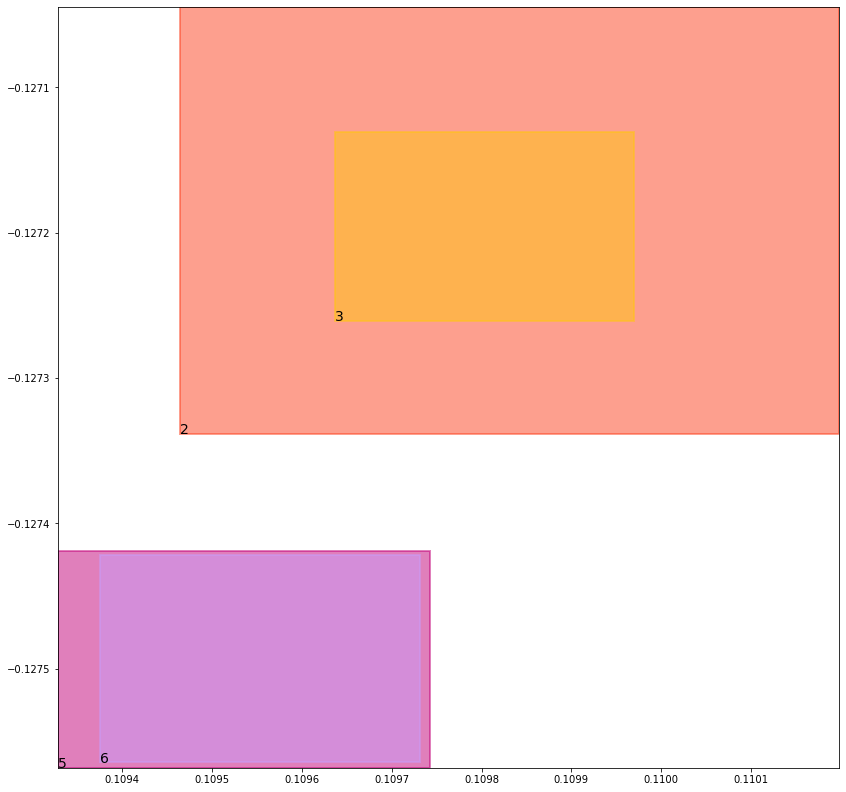

batch (tensor([[3, 5],
        [1, 2],
        [4, 5],
        [6, 2],
        [5, 3],
        [4, 6],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073783430270851, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067597599700093, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509940266609192, grad_fn=<MulBackward0>)
previous loss: tensor(0.2651321291923523, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03734956309199333 0.025011831894516945 tensor(0.9268072843551636) tensor(0.9695491194725037)
tensor(2) 0.47848179936408997 0.49557676911354065 tensor(0.4790864288806915) tensor(0.4966806769371033)
tensor(3) 0.47734537720680237 0.4954586327075958 tensor(0.4773650467395782) tensor(0.4969144761562347)
tensor(4) 0.05054905638098717 0.008652799762785435 tensor(0.9707288742065430) tensor(0.9548527002334595)
tensor(5) 0.5122355818748474 0.48299461603164673 tensor(0.5141838788986206) tensor(0.4837281107902527)
tensor(6) 0.5146414041519165 0.4830395579338074 tensor(0.5150973200798035) tensor(0.4837462007999420)


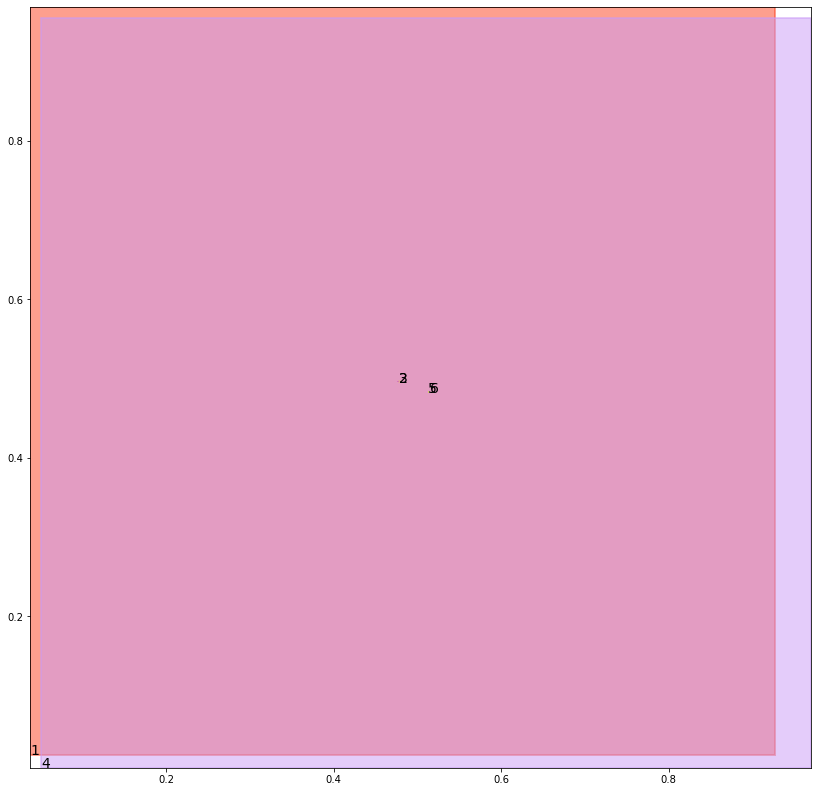

alignment data:
tensor(2) 0.10132479667663574 -0.14644034206867218 tensor(0.1016771197319031) tensor(-0.1462994962930679)
tensor(3) 0.10119420289993286 -0.14648784697055817 tensor(0.1015913486480713) tensor(-0.1463256031274796)
tensor(5) 0.10083556175231934 -0.14681634306907654 tensor(0.1012037396430969) tensor(-0.1466759443283081)
tensor(6) 0.10105645656585693 -0.14673858880996704 tensor(0.1012879610061646) tensor(-0.1466463208198547)


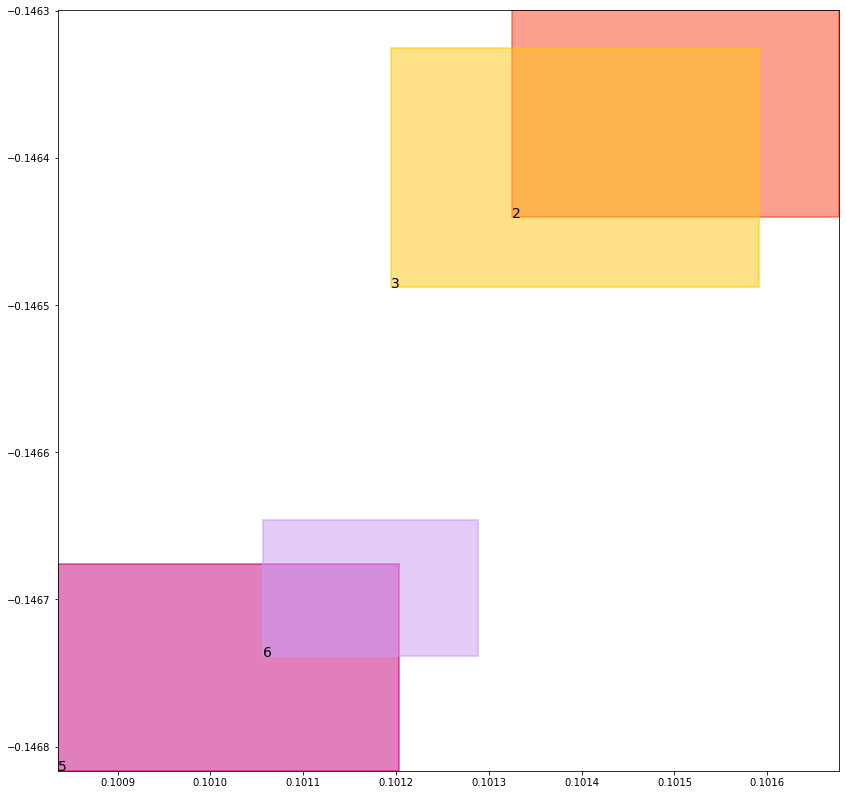

batch (tensor([[4, 5],
        [1, 3],
        [5, 3],
        [4, 6],
        [2, 6],
        [1, 2],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [2, 6],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073468796908855, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067362966947258, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509983777999878, grad_fn=<MulBackward0>)
previous loss: tensor(0.2650815546512604, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03730329871177673 0.02489173784852028 tensor(0.9270837306976318) tensor(0.9696032404899597)
tensor(2) 0.4787484407424927 0.4961584210395813 tensor(0.4796436131000519) tensor(0.4968285262584686)
tensor(3) 0.4768027365207672 0.4954902231693268 tensor(0.4783757627010345) tensor(0.4967956840991974)
tensor(4) 0.0503145232796669 0.00860487949103117 tensor(0.9707552790641785) tensor(0.9549139738082886)
tensor(5) 0.5122858285903931 0.4827929139137268 tensor(0.5131840705871582) tensor(0.4837907254695892)
tensor(6) 0.514415979385376 0.48347529768943787 tensor(0.5150958895683289) tensor(0.4838842749595642)


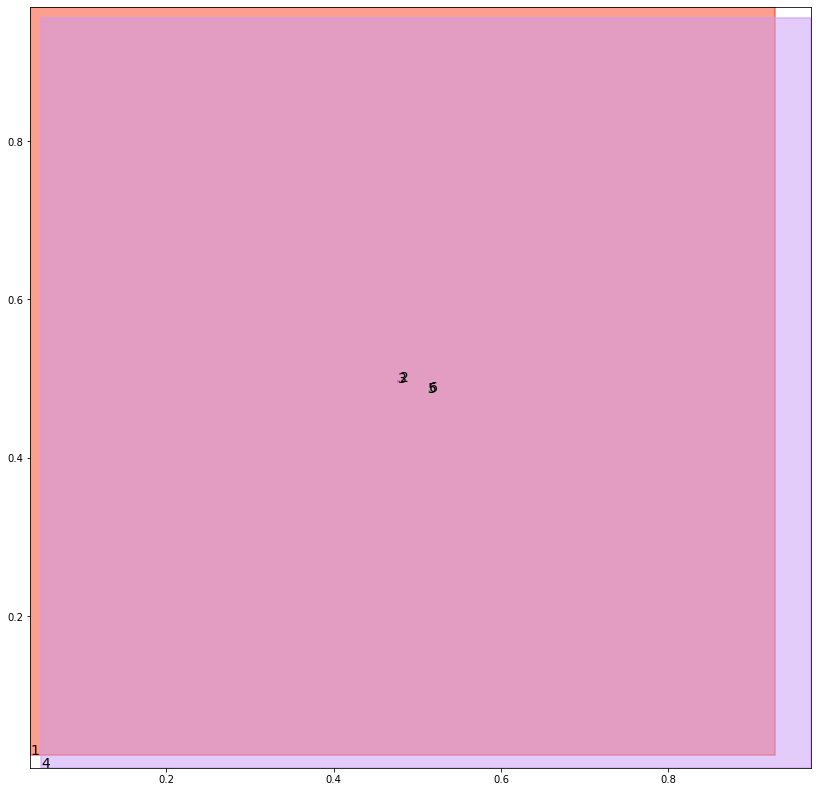

alignment data:
tensor(2) 0.09082978963851929 -0.16172507405281067 tensor(0.0910896062850952) tensor(-0.1616233885288239)
tensor(3) 0.09047895669937134 -0.1618584245443344 tensor(0.0909704566001892) tensor(-0.1616655290126801)
tensor(5) 0.09011441469192505 -0.16219377517700195 tensor(0.0904636383056641) tensor(-0.1620555520057678)
tensor(6) 0.09048491716384888 -0.16205325722694397 tensor(0.0906552076339722) tensor(-0.1619871556758881)


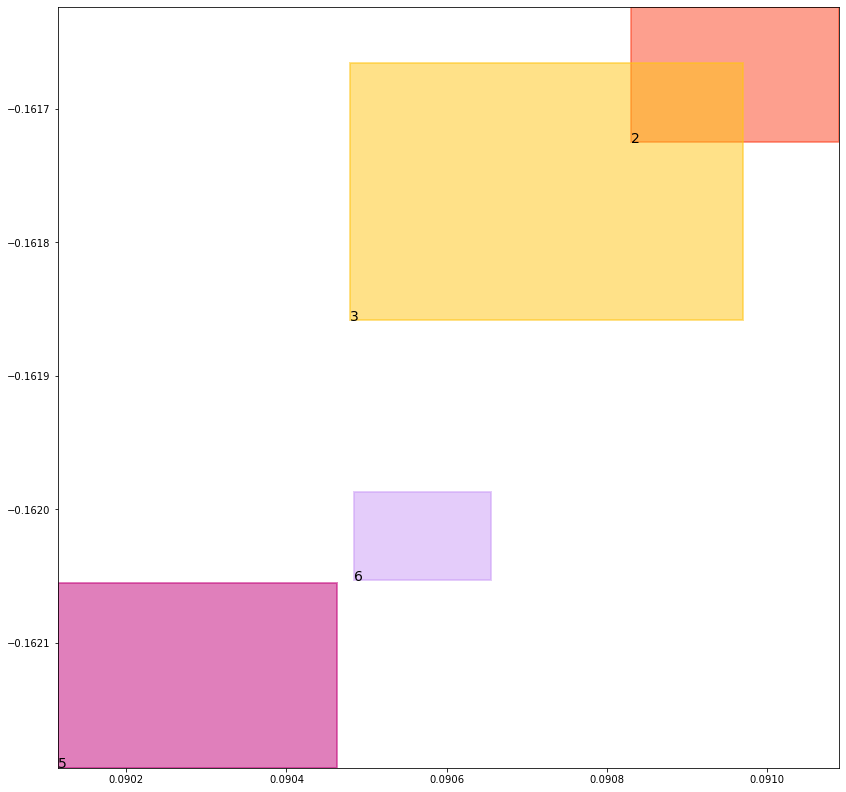

batch (tensor([[3, 5],
        [1, 2],
        [5, 3],
        [4, 6],
        [1, 3],
        [4, 5],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073505421169102, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067225545644760, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509993016719818, grad_fn=<MulBackward0>)
previous loss: tensor(0.2650724053382874, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037257127463817596 0.024772636592388153 tensor(0.9273584485054016) tensor(0.9696573019027710)
tensor(2) 0.47874701023101807 0.4958701729774475 tensor(0.4800714850425720) tensor(0.4974518418312073)
tensor(3) 0.47656306624412537 0.4958592653274536 tensor(0.4790022969245911) tensor(0.4963393807411194)
tensor(4) 0.050081852823495865 0.00855740811675787 tensor(0.9707816839218140) tensor(0.9549753069877625)
tensor(5) 0.5112507939338684 0.4831221401691437 tensor(0.5136122107505798) tensor(0.4836934208869934)
tensor(6) 0.5144453644752502 0.4834044873714447 tensor(0.5146833062171936) tensor(0.4841078817844391)


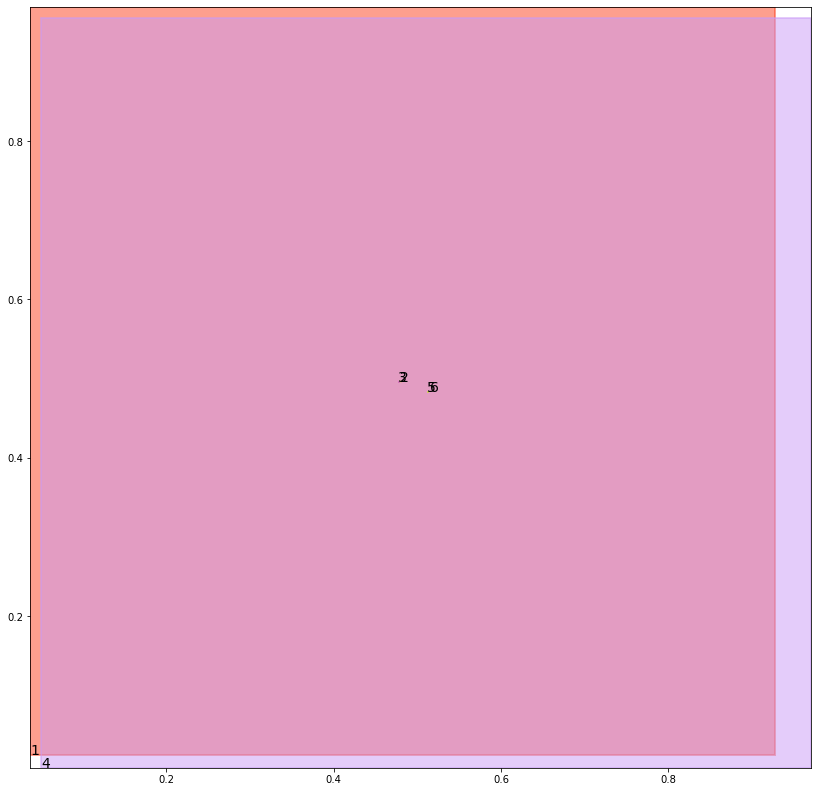

alignment data:
tensor(2) 0.08138728141784668 -0.18467362225055695 tensor(0.0819326639175415) tensor(-0.1844572126865387)
tensor(3) 0.08119404315948486 -0.1847412884235382 tensor(0.0815371274948120) tensor(-0.1846136003732681)
tensor(5) 0.08075571060180664 -0.18510395288467407 tensor(0.0811167955398560) tensor(-0.1849685162305832)
tensor(6) 0.08111083507537842 -0.18497532606124878 tensor(0.0813227891921997) tensor(-0.1848898231983185)


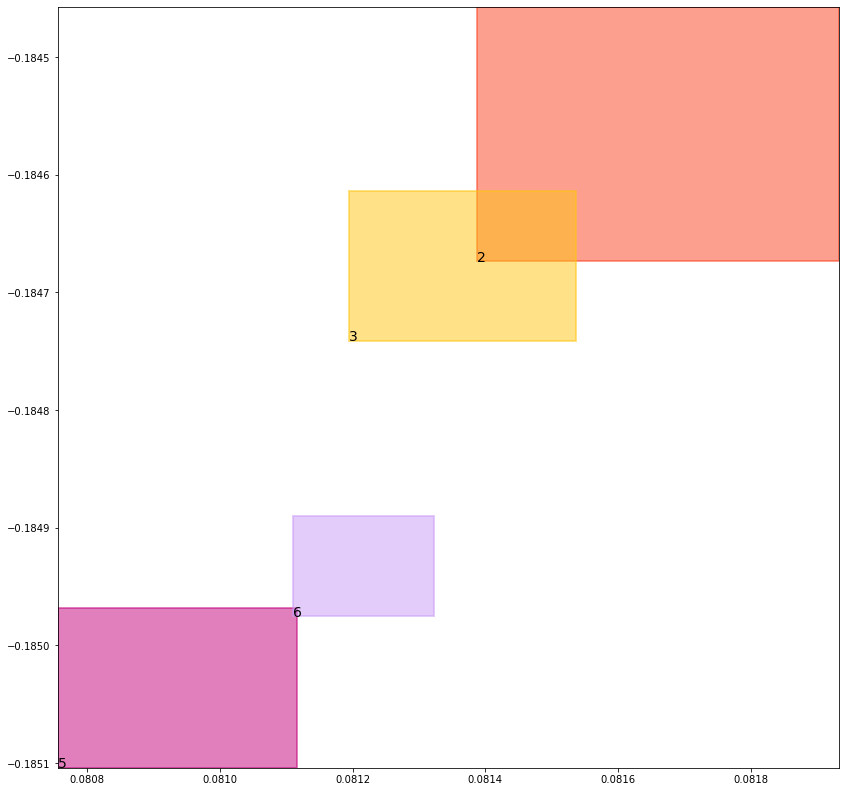

batch (tensor([[1, 2],
        [3, 5],
        [6, 2],
        [1, 3],
        [5, 3],
        [4, 6],
        [4, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073547451756895, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067237550392747, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509977519512177, grad_fn=<MulBackward0>)
previous loss: tensor(0.2650762498378754, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037211041897535324 0.024654528126120567 tensor(0.9276317358016968) tensor(0.9697110652923584)
tensor(2) 0.4790498912334442 0.4957945644855499 tensor(0.4798340201377869) tensor(0.4974973797798157)
tensor(3) 0.47661516070365906 0.49558225274086 tensor(0.4792629182338715) tensor(0.4965294003486633)
tensor(4) 0.049850936979055405 0.008510385639965534 tensor(0.9708079695701599) tensor(0.9550365209579468)
tensor(5) 0.5110020041465759 0.4834510087966919 tensor(0.5135681629180908) tensor(0.4839310646057129)
tensor(6) 0.5139020681381226 0.4835137724876404 tensor(0.5147042870521545) tensor(0.4837757647037506)


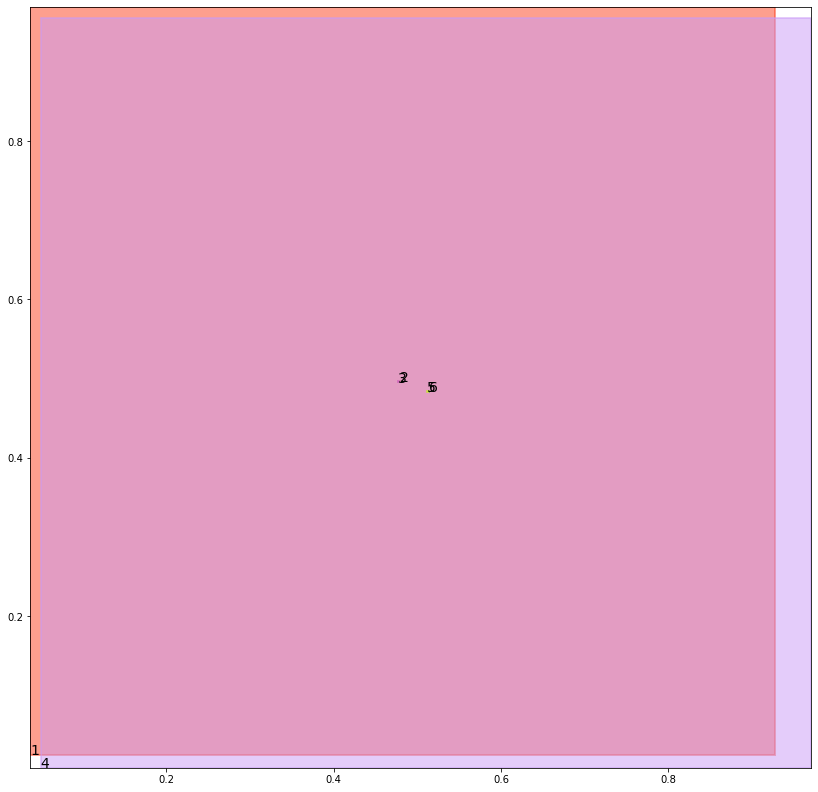

alignment data:
tensor(2) 0.07524782419204712 -0.21449913084506989 tensor(0.0757793188095093) tensor(-0.2142854332923889)
tensor(3) 0.0749773383140564 -0.21459707617759705 tensor(0.0754662156105042) tensor(-0.2144107520580292)
tensor(5) 0.07467854022979736 -0.2148830145597458 tensor(0.0750391483306885) tensor(-0.2147681266069412)
tensor(6) 0.07495379447937012 -0.2148011028766632 tensor(0.0750963091850281) tensor(-0.2147507816553116)


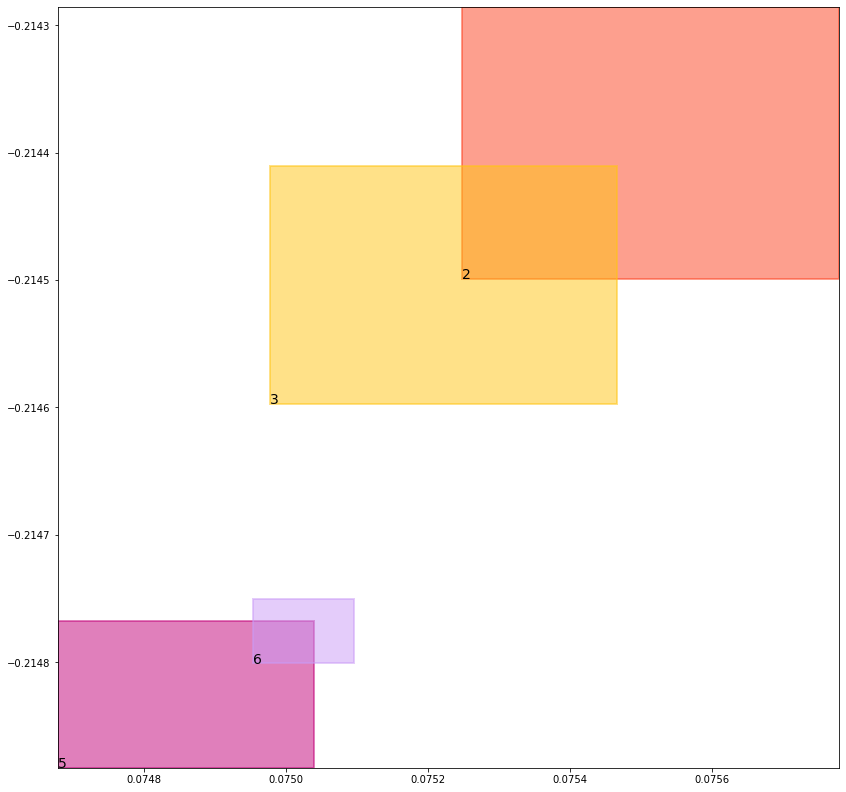

batch (tensor([[3, 5],
        [1, 2],
        [4, 5],
        [5, 3],
        [6, 2],
        [2, 6],
        [1, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073466394096613, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067198248580098, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509973049163818, grad_fn=<MulBackward0>)
previous loss: tensor(0.2650637626647949, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03716503828763962 0.024537378922104836 tensor(0.9279034137725830) tensor(0.9697648882865906)
tensor(2) 0.47899800539016724 0.4959106743335724 tensor(0.4796267151832581) tensor(0.4970182776451111)
tensor(3) 0.47693100571632385 0.4952373206615448 tensor(0.4791928827762604) tensor(0.4967826306819916)
tensor(4) 0.04962171986699104 0.008463815785944462 tensor(0.9708342552185059) tensor(0.9550977349281311)
tensor(5) 0.5114634037017822 0.48339295387268066 tensor(0.5130978226661682) tensor(0.4841569066047668)
tensor(6) 0.5135782361030579 0.48294755816459656 tensor(0.5146861076354980) tensor(0.4837911725044250)


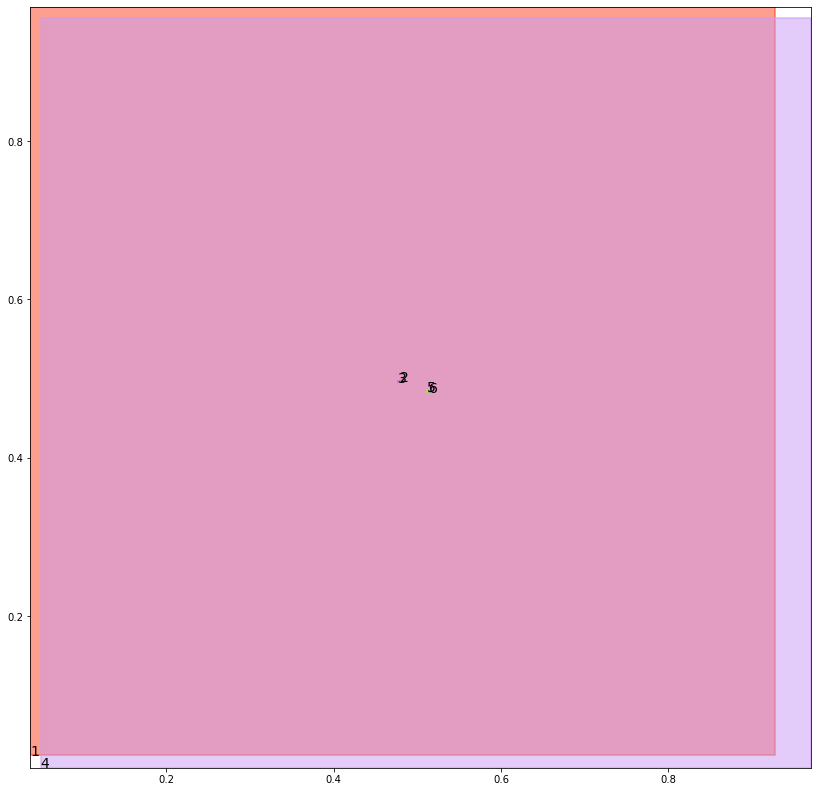

alignment data:
tensor(2) 0.06538987159729004 -0.21616032719612122 tensor(0.0657459497451782) tensor(-0.2160171866416931)
tensor(3) 0.06502574682235718 -0.21629904210567474 tensor(0.0656439661979675) tensor(-0.2160568535327911)
tensor(5) 0.06483149528503418 -0.2165648490190506 tensor(0.0651823282241821) tensor(-0.2164292931556702)
tensor(6) 0.06489568948745728 -0.216549813747406 tensor(0.0652220249176025) tensor(-0.2164215147495270)


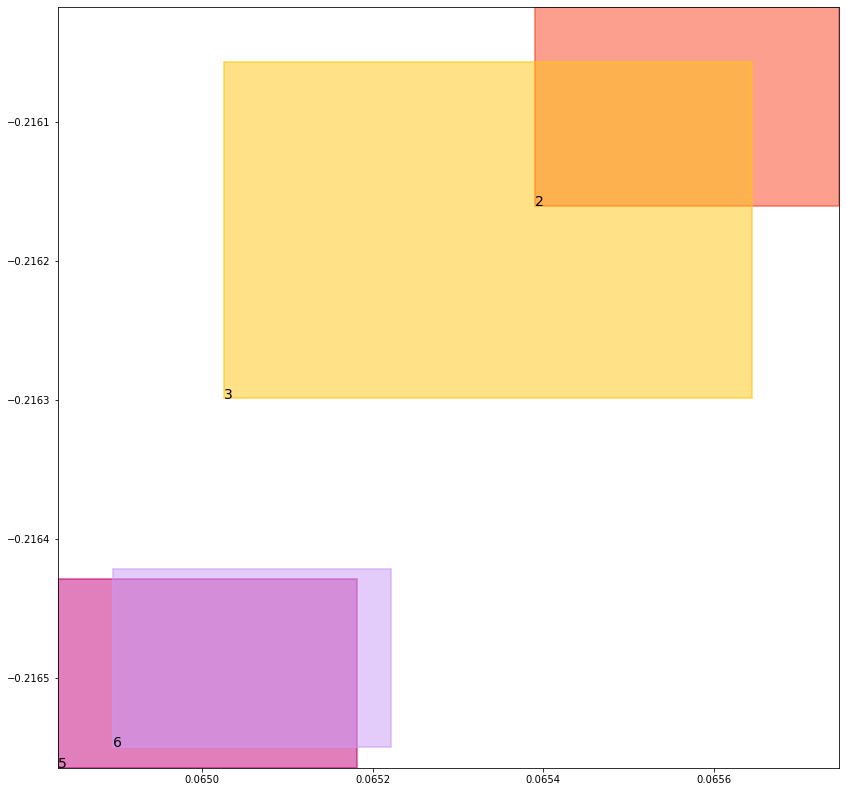

batch (tensor([[1, 2],
        [6, 2],
        [1, 3],
        [5, 3],
        [2, 6],
        [4, 6],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073319887742400, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0067149340175092, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509960830211639, grad_fn=<MulBackward0>)
previous loss: tensor(0.2650430202484131, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037119124084711075 0.024421170353889465 tensor(0.9281735420227051) tensor(0.9698185920715332)
tensor(2) 0.4788993000984192 0.496074378490448 tensor(0.4798604846000671) tensor(0.4961969852447510)
tensor(3) 0.47748470306396484 0.4952681362628937 tensor(0.4788250625133514) tensor(0.4966576397418976)
tensor(4) 0.04939422756433487 0.008417677134275436 tensor(0.9708605408668518) tensor(0.9551588296890259)
tensor(5) 0.512244462966919 0.4834955930709839 tensor(0.5125588774681091) tensor(0.4838559627532959)
tensor(6) 0.5136685967445374 0.4827542304992676 tensor(0.5144171714782715) tensor(0.4838699102401733)


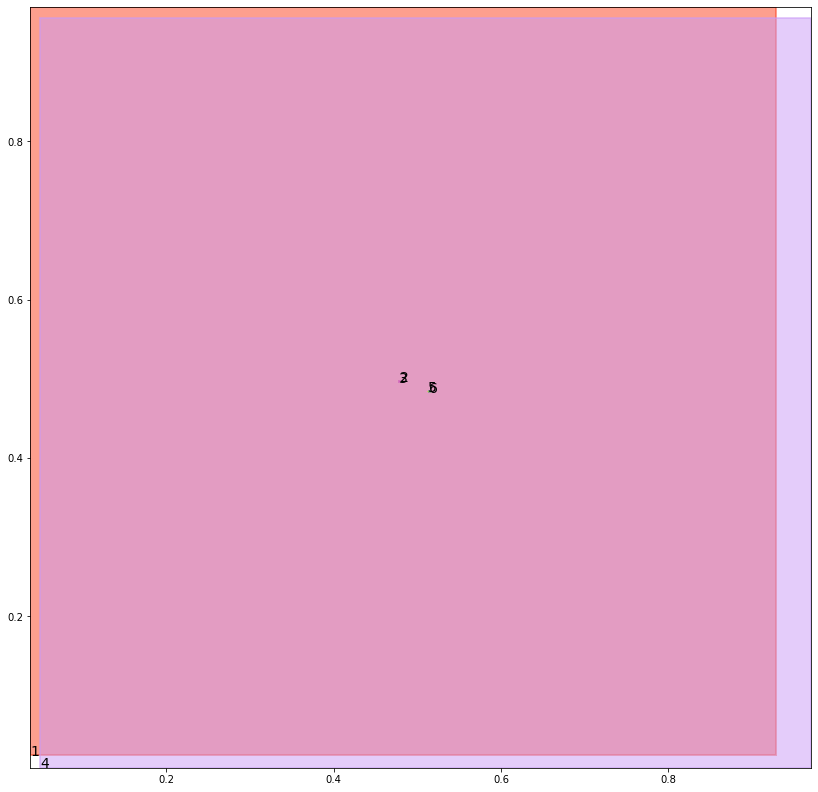

alignment data:
tensor(2) 0.06066024303436279 -0.22294451296329498 tensor(0.0607780218124390) tensor(-0.2229011803865433)
tensor(3) 0.06031692028045654 -0.22307859361171722 tensor(0.0608122944831848) tensor(-0.2228813618421555)
tensor(5) 0.06017023324966431 -0.22332864999771118 tensor(0.0602958202362061) tensor(-0.2232785522937775)
tensor(6) 0.06009387969970703 -0.22336794435977936 tensor(0.0604627728462219) tensor(-0.2232196927070618)


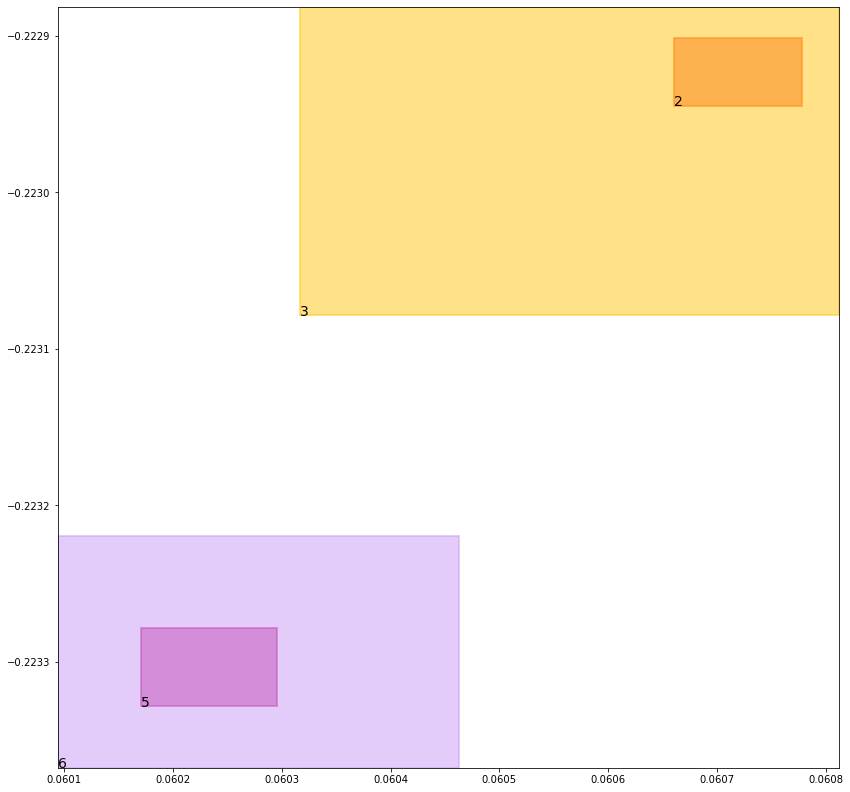

batch (tensor([[5, 3],
        [2, 6],
        [6, 2],
        [4, 6],
        [3, 5],
        [4, 5],
        [1, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [2, 6],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0073084821924567, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066933622583747, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510007321834564, grad_fn=<MulBackward0>)
previous loss: tensor(0.2650025784969330, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.037073299288749695 0.024305904284119606 tensor(0.9284420013427734) tensor(0.9698721766471863)
tensor(2) 0.47946617007255554 0.4957011044025421 tensor(0.4797850549221039) tensor(0.4962669014930725)
tensor(3) 0.4781898856163025 0.4956388473510742 tensor(0.4782520532608032) tensor(0.4961903393268585)
tensor(4) 0.04916856065392494 0.008371961303055286 tensor(0.9708867073059082) tensor(0.9552198648452759)
tensor(5) 0.5118851065635681 0.48308396339416504 tensor(0.5128463506698608) tensor(0.4837426841259003)
tensor(6) 0.5139216184616089 0.48313814401626587 tensor(0.5141322612762451) tensor(0.4837666153907776)


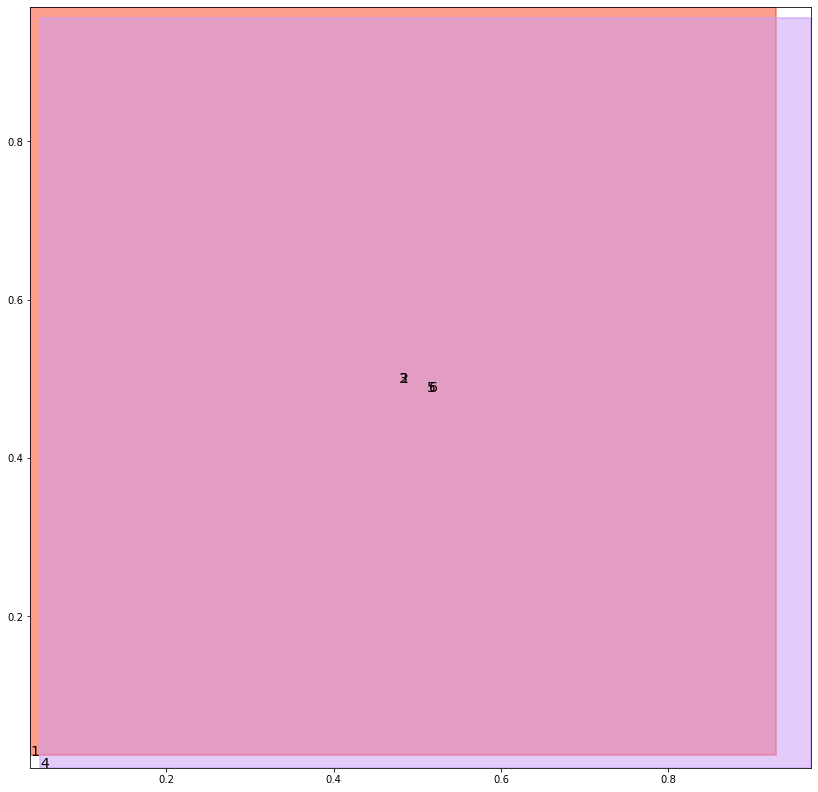

alignment data:
tensor(2) 0.059521257877349854 -0.24118970334529877 tensor(0.0597031116485596) tensor(-0.2411161512136459)
tensor(3) 0.059391915798187256 -0.24123619496822357 tensor(0.0595471858978271) tensor(-0.2411722093820572)
tensor(5) 0.05894726514816284 -0.2416062206029892 tensor(0.0592107772827148) tensor(-0.2415023446083069)
tensor(6) 0.05914115905761719 -0.24153712391853333 tensor(0.0593305230140686) tensor(-0.2414598613977432)


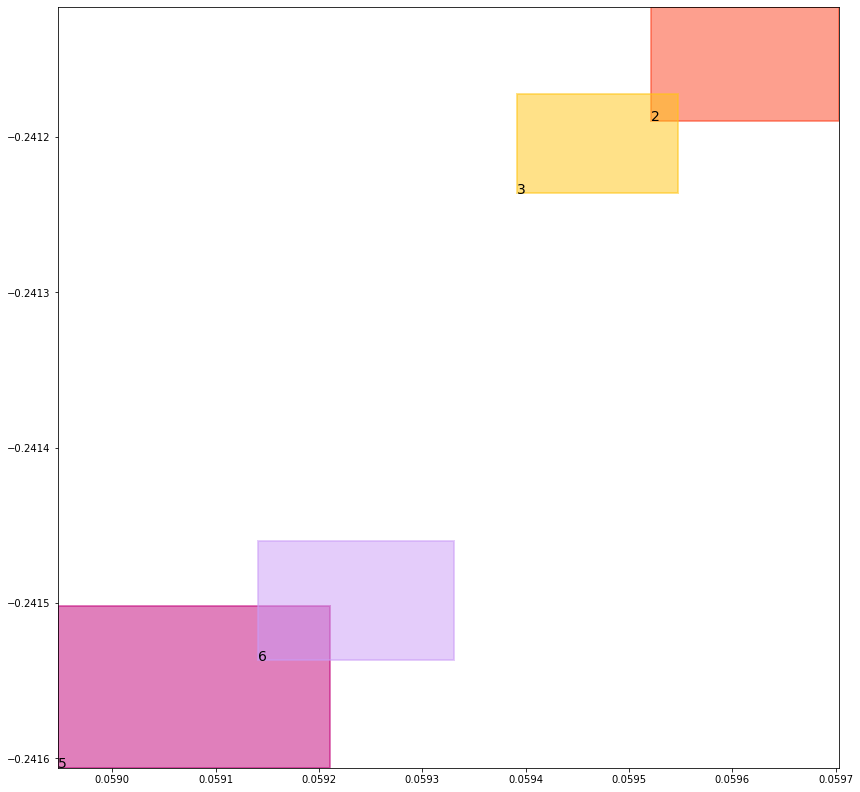

batch (tensor([[3, 5],
        [1, 3],
        [4, 6],
        [6, 2],
        [5, 3],
        [2, 6],
        [4, 5],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072775008156896, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066869119182229, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510034441947937, grad_fn=<MulBackward0>)
previous loss: tensor(0.2649678587913513, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03702757507562637 0.02419157139956951 tensor(0.9287087321281433) tensor(0.9699255824089050)
tensor(2) 0.47943100333213806 0.4958515465259552 tensor(0.4806317985057831) tensor(0.4961406886577606)
tensor(3) 0.4779459834098816 0.49542033672332764 tensor(0.4787017107009888) tensor(0.4963073730468750)
tensor(4) 0.04894470423460007 0.008326666429638863 tensor(0.9709129333496094) tensor(0.9552809000015259)
tensor(5) 0.5119743943214417 0.4829024076461792 tensor(0.5124005079269409) tensor(0.4838092625141144)
tensor(6) 0.513708233833313 0.48349982500076294 tensor(0.5141398906707764) tensor(0.4840332567691803)


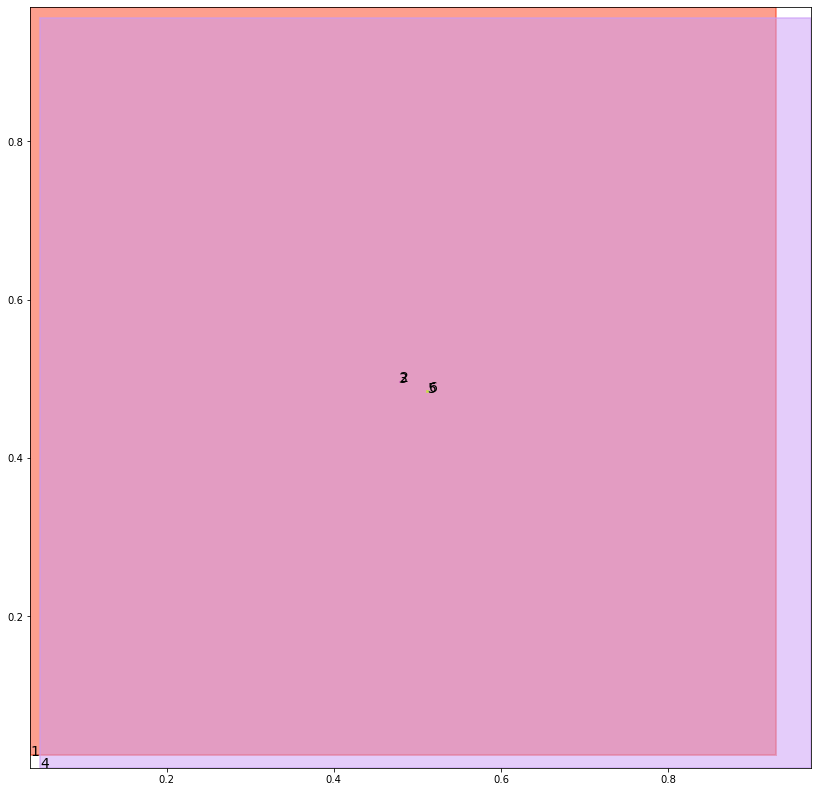

alignment data:
tensor(2) 0.062674880027771 -0.2611572742462158 tensor(0.0628593564033508) tensor(-0.2610872983932495)
tensor(3) 0.06242668628692627 -0.2612520456314087 tensor(0.0627342462539673) tensor(-0.2611284852027893)
tensor(5) 0.06202965974807739 -0.2616065740585327 tensor(0.0623135566711426) tensor(-0.2614910602569580)
tensor(6) 0.062344908714294434 -0.2614852786064148 tensor(0.0625278949737549) tensor(-0.2614116966724396)


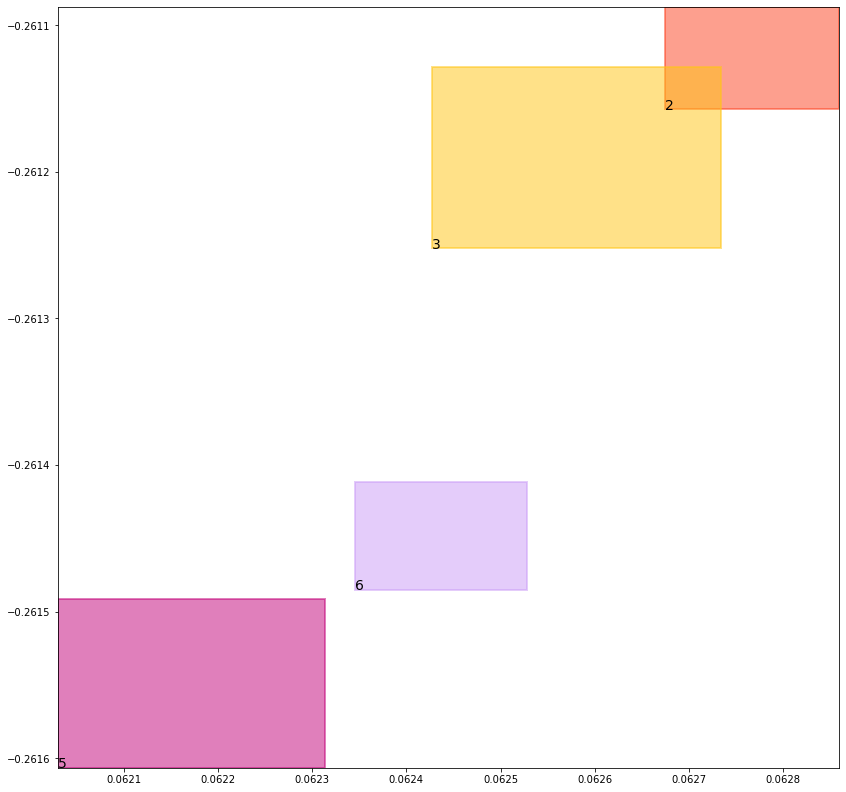

batch (tensor([[3, 5],
        [1, 2],
        [1, 3],
        [5, 3],
        [6, 2],
        [2, 6],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072842855006456, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066795311868191, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510019838809967, grad_fn=<MulBackward0>)
previous loss: tensor(0.2649658024311066, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03698195144534111 0.024078156799077988 tensor(0.9289737343788147) tensor(0.9699788689613342)
tensor(2) 0.4794157147407532 0.4958381652832031 tensor(0.4810614883899689) tensor(0.4964751601219177)
tensor(3) 0.47805657982826233 0.49506622552871704 tensor(0.4788635969161987) tensor(0.4965630769729614)
tensor(4) 0.04872262850403786 0.008281785994768143 tensor(0.9709390997886658) tensor(0.9553418159484863)
tensor(5) 0.5112965106964111 0.48325371742248535 tensor(0.5124675035476685) tensor(0.4837136864662170)
tensor(6) 0.5137352347373962 0.4834338426589966 tensor(0.5137495398521423) tensor(0.4842944741249084)


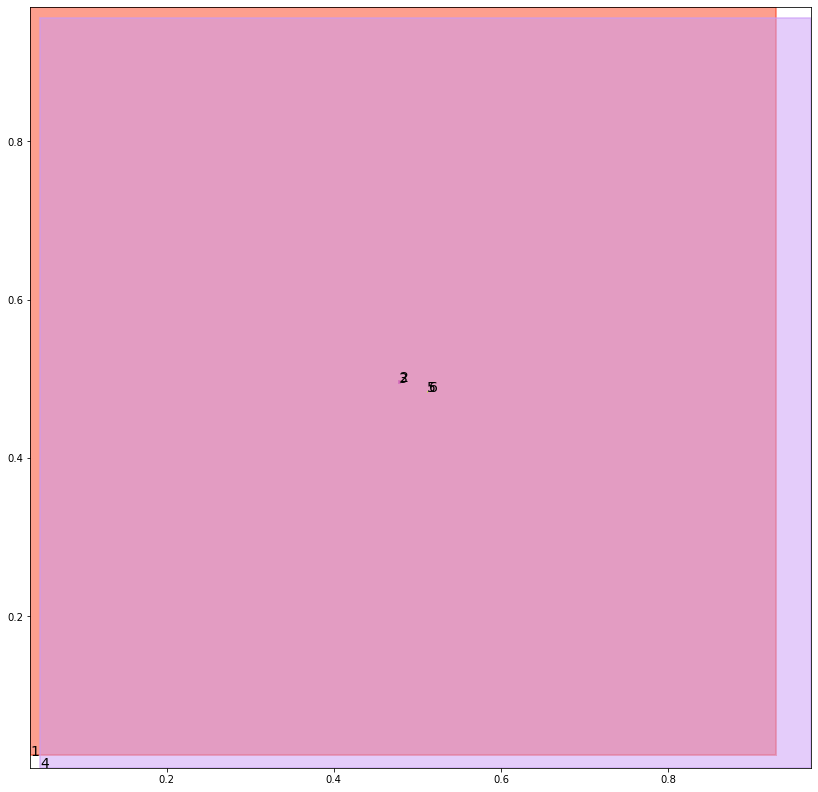

alignment data:
tensor(2) 0.0685608983039856 -0.2844495177268982 tensor(0.0688794255256653) tensor(-0.2843261361122131)
tensor(3) 0.06823098659515381 -0.28457915782928467 tensor(0.0687088966369629) tensor(-0.2843847870826721)
tensor(5) 0.06796419620513916 -0.2848772406578064 tensor(0.0681927800178528) tensor(-0.2847887575626373)
tensor(6) 0.06822896003723145 -0.2847808003425598 tensor(0.0684638023376465) tensor(-0.2846831083297729)


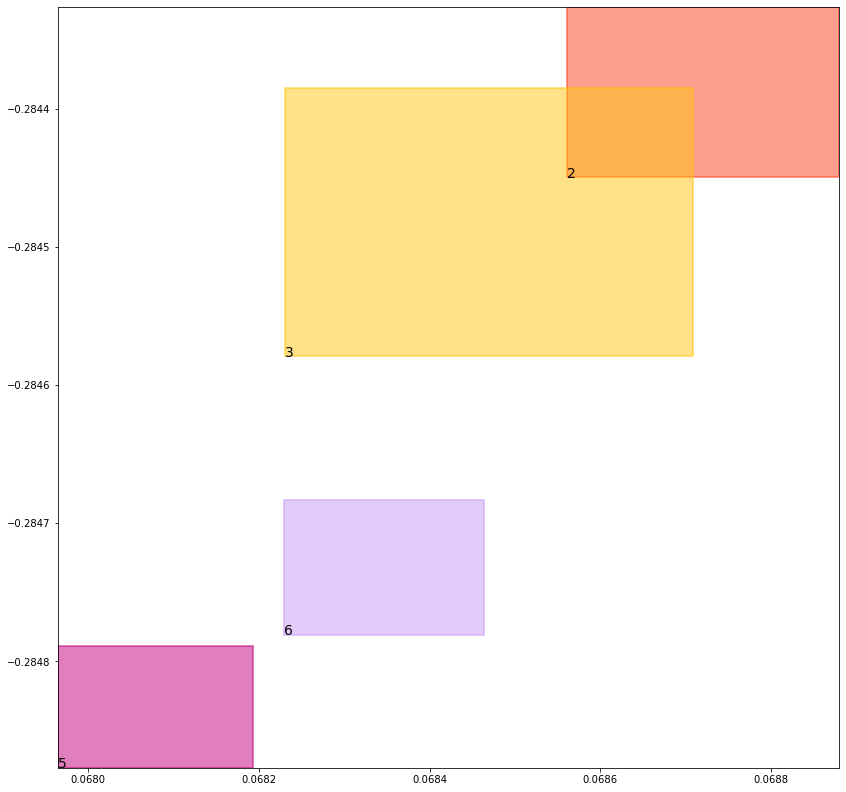

batch (tensor([[6, 2],
        [4, 5],
        [3, 5],
        [2, 6],
        [1, 2],
        [4, 6],
        [1, 3],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072870468720794, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066751204431057, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509991228580475, grad_fn=<MulBackward0>)
previous loss: tensor(0.2649613022804260, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03693642467260361 0.023965636268258095 tensor(0.9292373061180115) tensor(0.9700319170951843)
tensor(2) 0.4797063171863556 0.49574920535087585 tensor(0.4808244705200195) tensor(0.4965313971042633)
tensor(3) 0.4784873127937317 0.4950922727584839 tensor(0.4787652492523193) tensor(0.4964426457881927)
tensor(4) 0.04850228875875473 0.008237320929765701 tensor(0.9709651470184326) tensor(0.9554027318954468)
tensor(5) 0.510980486869812 0.4834728538990021 tensor(0.5124837756156921) tensor(0.4840789437294006)
tensor(6) 0.5135347247123718 0.4835493266582489 tensor(0.5137502551078796) tensor(0.4839847683906555)


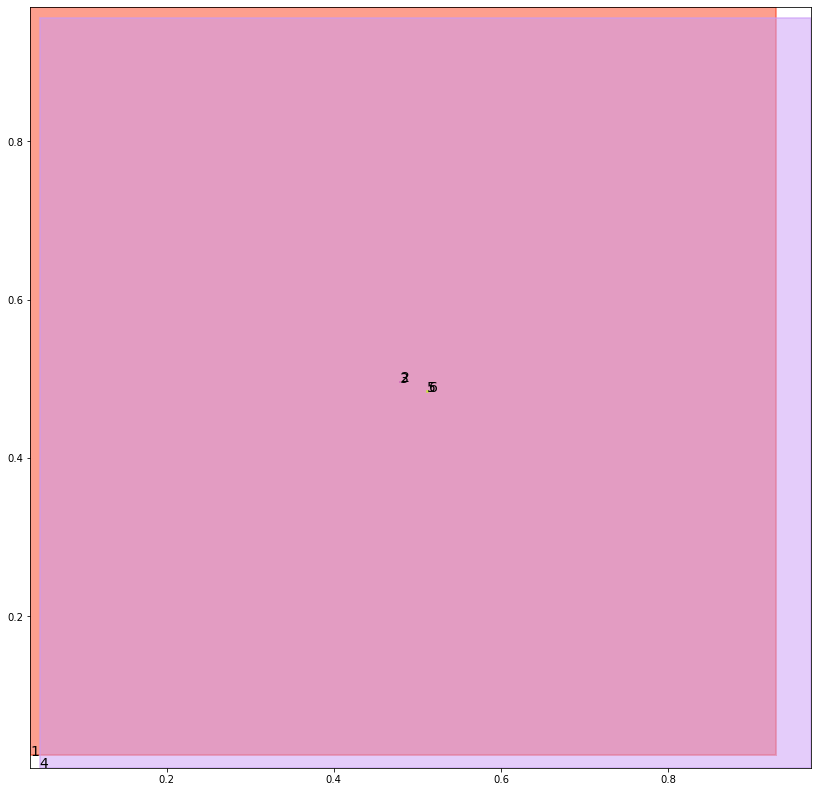

alignment data:
tensor(2) 0.07591855525970459 -0.3072414994239807 tensor(0.0762300491333008) tensor(-0.3071178793907166)
tensor(3) 0.07563215494155884 -0.3073541224002838 tensor(0.0760234594345093) tensor(-0.3071924448013306)
tensor(5) 0.07535970211029053 -0.30765223503112793 tensor(0.0756575465202332) tensor(-0.3075365126132965)
tensor(6) 0.07560694217681885 -0.3075636029243469 tensor(0.0757442712783813) tensor(-0.3075075149536133)


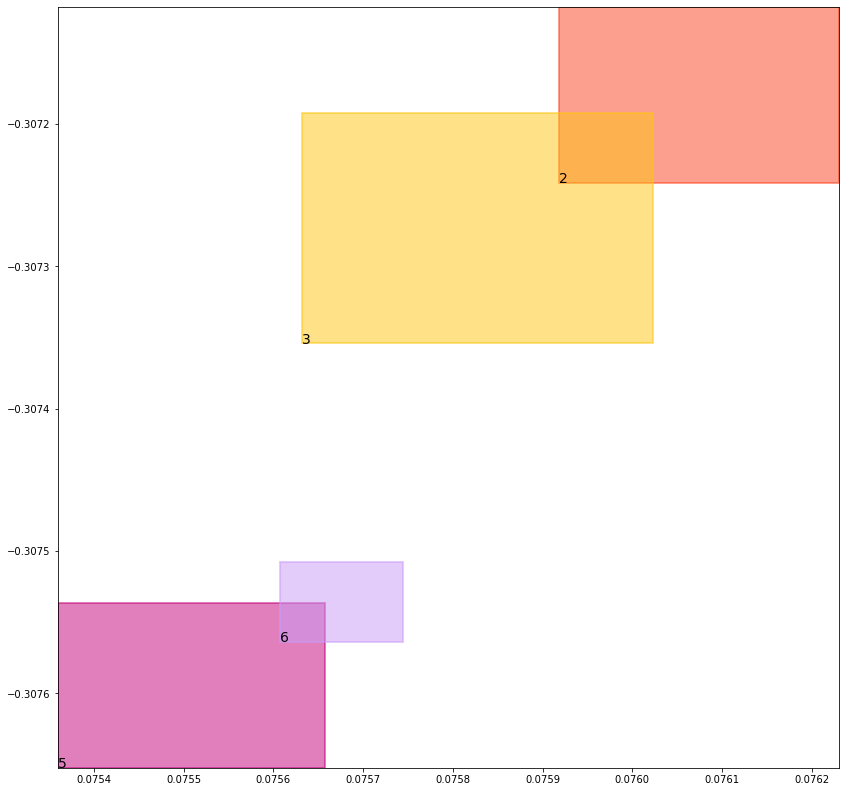

batch (tensor([[2, 6],
        [4, 5],
        [6, 2],
        [4, 6],
        [1, 3],
        [3, 5],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072678341530263, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066715506836772, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510002553462982, grad_fn=<MulBackward0>)
previous loss: tensor(0.2649396359920502, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036890991032123566 0.023854004219174385 tensor(0.9294992685317993) tensor(0.9700849652290344)
tensor(2) 0.4799879789352417 0.49585363268852234 tensor(0.4802725315093994) tensor(0.4960726201534271)
tensor(3) 0.478433221578598 0.4954610764980316 tensor(0.4792060256004333) tensor(0.4959867000579834)
tensor(4) 0.04828361049294472 0.008193274959921837 tensor(0.9709912538528442) tensor(0.9554635882377625)
tensor(5) 0.511376678943634 0.48341235518455505 tensor(0.5120683908462524) tensor(0.4843138158321381)
tensor(6) 0.513353705406189 0.48316508531570435 tensor(0.5135749578475952) tensor(0.4838283360004425)


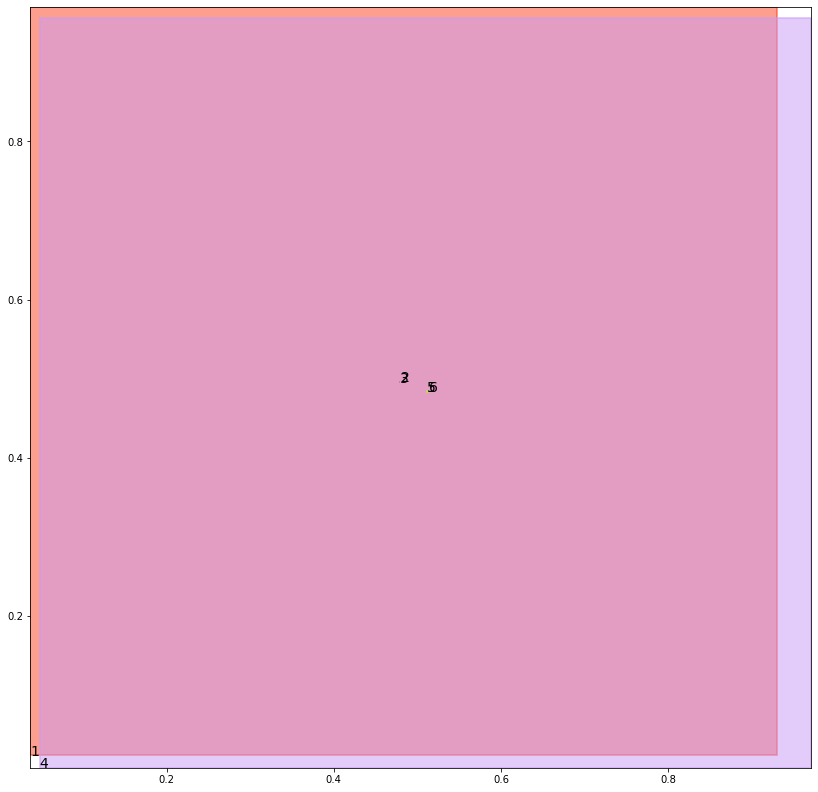

alignment data:
tensor(2) 0.08281546831130981 -0.34141552448272705 tensor(0.0829002857208252) tensor(-0.3413817286491394)
tensor(3) 0.08257073163986206 -0.34150898456573486 tensor(0.0827821493148804) tensor(-0.3414250016212463)
tensor(5) 0.0822296142578125 -0.3418401777744293 tensor(0.0825358629226685) tensor(-0.3417161107063293)
tensor(6) 0.08233821392059326 -0.3418060839176178 tensor(0.0825380682945251) tensor(-0.3417238593101501)


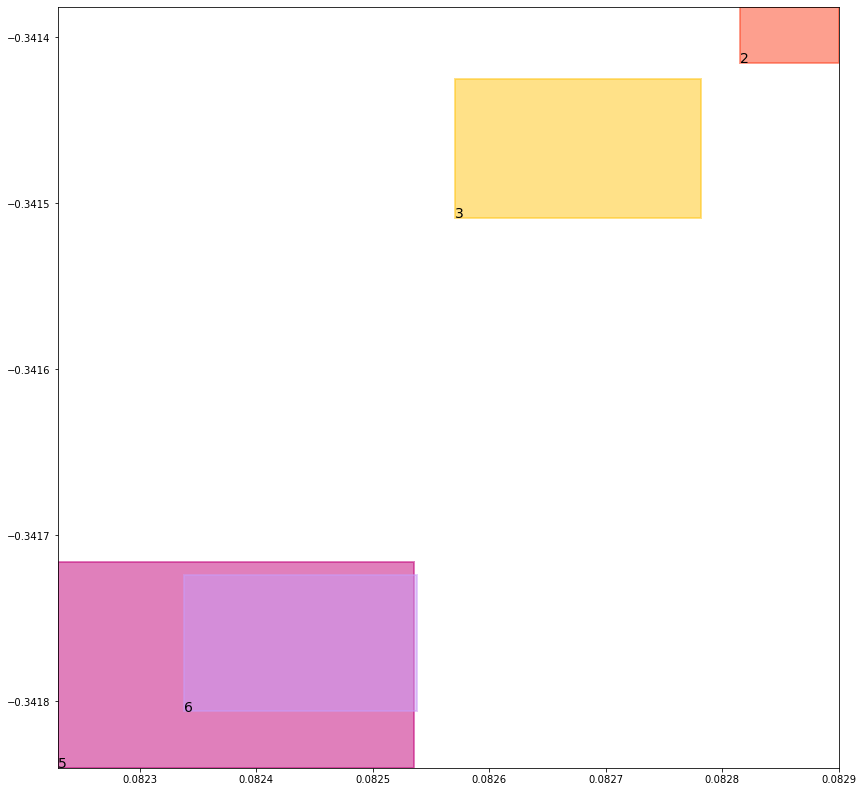

batch (tensor([[6, 2],
        [1, 3],
        [4, 5],
        [1, 2],
        [3, 5],
        [4, 6],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [3, 5],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072454400360584, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066626099869609, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510032653808594, grad_fn=<MulBackward0>)
previous loss: tensor(0.2649113237857819, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03684566542506218 0.023743268102407455 tensor(0.9297595024108887) tensor(0.9701378941535950)
tensor(2) 0.47988688945770264 0.4951561689376831 tensor(0.4804967343807220) tensor(0.4961300194263458)
tensor(3) 0.478400319814682 0.49523282051086426 tensor(0.4795519113540649) tensor(0.4961356520652771)
tensor(4) 0.0480666346848011 0.008149632252752781 tensor(0.9710173010826111) tensor(0.9555243849754333)
tensor(5) 0.5112640857696533 0.48351556062698364 tensor(0.5124125480651855) tensor(0.4840094447135925)
tensor(6) 0.5133586525917053 0.4829808175563812 tensor(0.5133780241012573) tensor(0.4839053750038147)


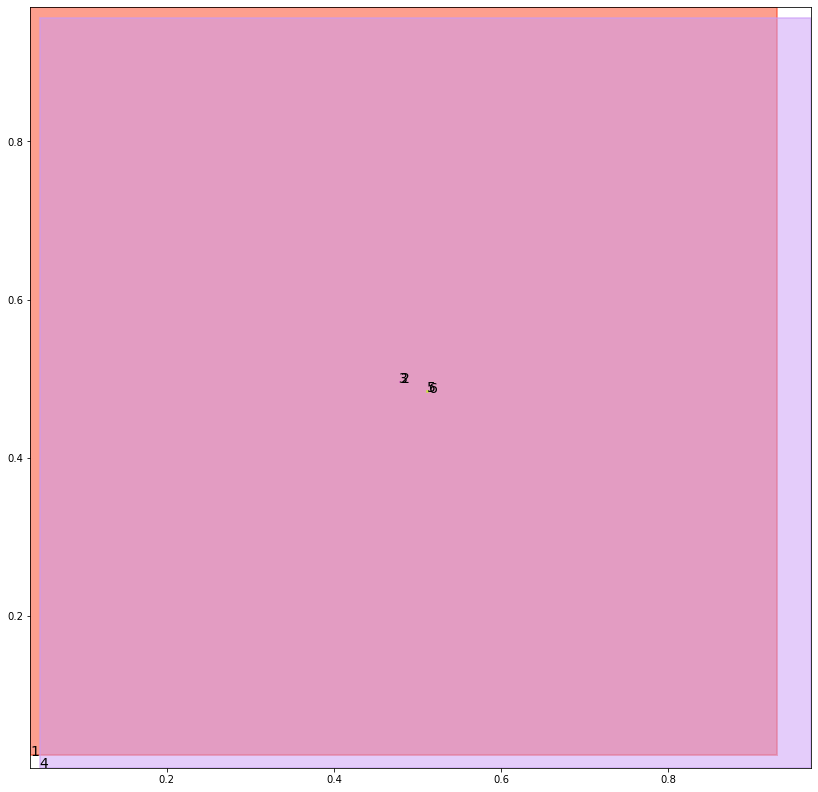

alignment data:
tensor(2) 0.08688908815383911 -0.3882647156715393 tensor(0.0871928930282593) tensor(-0.3881241679191589)
tensor(3) 0.08677792549133301 -0.388303279876709 tensor(0.0871111750602722) tensor(-0.3881540298461914)
tensor(5) 0.0866619348526001 -0.38869404792785645 tensor(0.0868898034095764) tensor(-0.3885956406593323)
tensor(6) 0.08670902252197266 -0.3886927366256714 tensor(0.0869481563568115) tensor(-0.3885773420333862)


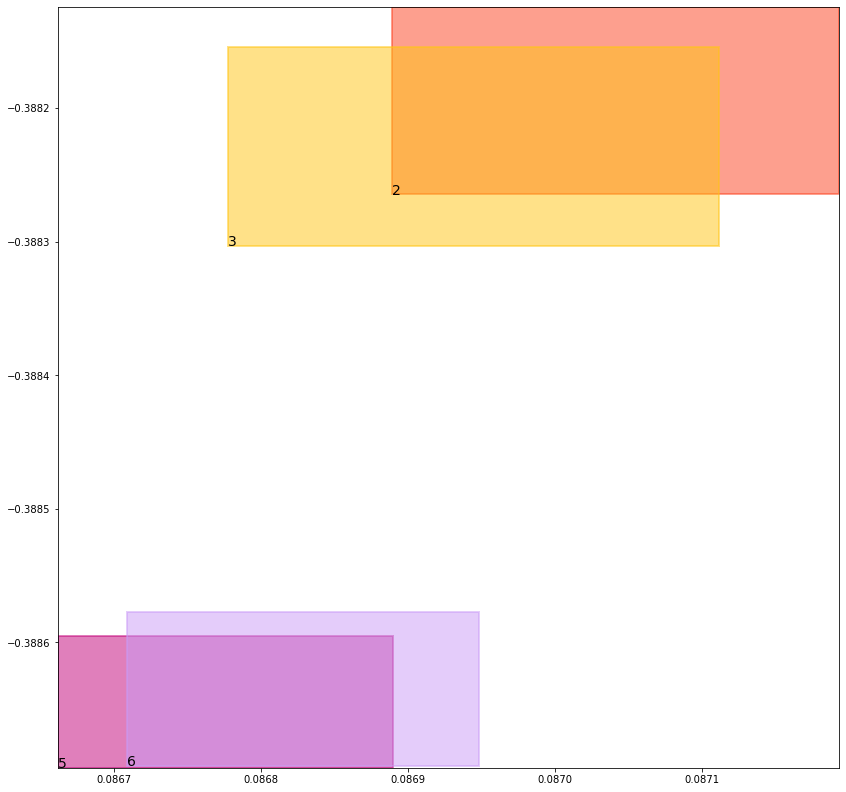

batch (tensor([[1, 2],
        [4, 6],
        [2, 6],
        [1, 3],
        [4, 5],
        [5, 3],
        [3, 5],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072518642991781, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066578397527337, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510002851486206, grad_fn=<MulBackward0>)
previous loss: tensor(0.2649099826812744, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03680042549967766 0.023633379489183426 tensor(0.9300181865692139) tensor(0.9701906442642212)
tensor(2) 0.48041218519210815 0.4948286712169647 tensor(0.4804524779319763) tensor(0.4961890578269958)
tensor(3) 0.47863829135894775 0.49489763379096985 tensor(0.4795604646205902) tensor(0.4963934123516083)
tensor(4) 0.04785133898258209 0.008106380701065063 tensor(0.9710432887077332) tensor(0.9555851221084595)
tensor(5) 0.5109521150588989 0.4832192659378052 tensor(0.5126392245292664) tensor(0.4837655127048492)
tensor(6) 0.5129889845848083 0.4833654463291168 tensor(0.5133975744247437) tensor(0.4837980866432190)


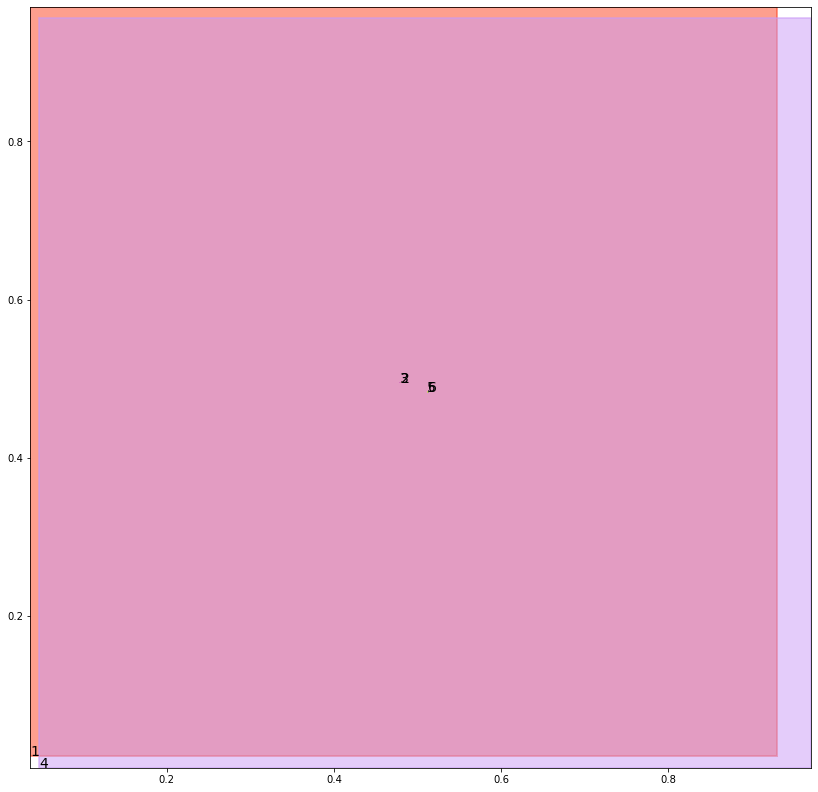

alignment data:
tensor(2) 0.08936023712158203 -0.4481109380722046 tensor(0.0897129774093628) tensor(-0.4479406476020813)
tensor(3) 0.08922147750854492 -0.4481599032878876 tensor(0.0896868705749512) tensor(-0.4479442238807678)
tensor(5) 0.08907413482666016 -0.44856154918670654 tensor(0.0893630981445312) tensor(-0.4484388828277588)
tensor(6) 0.08929133415222168 -0.44847726821899414 tensor(0.0894384384155273) tensor(-0.4484102427959442)


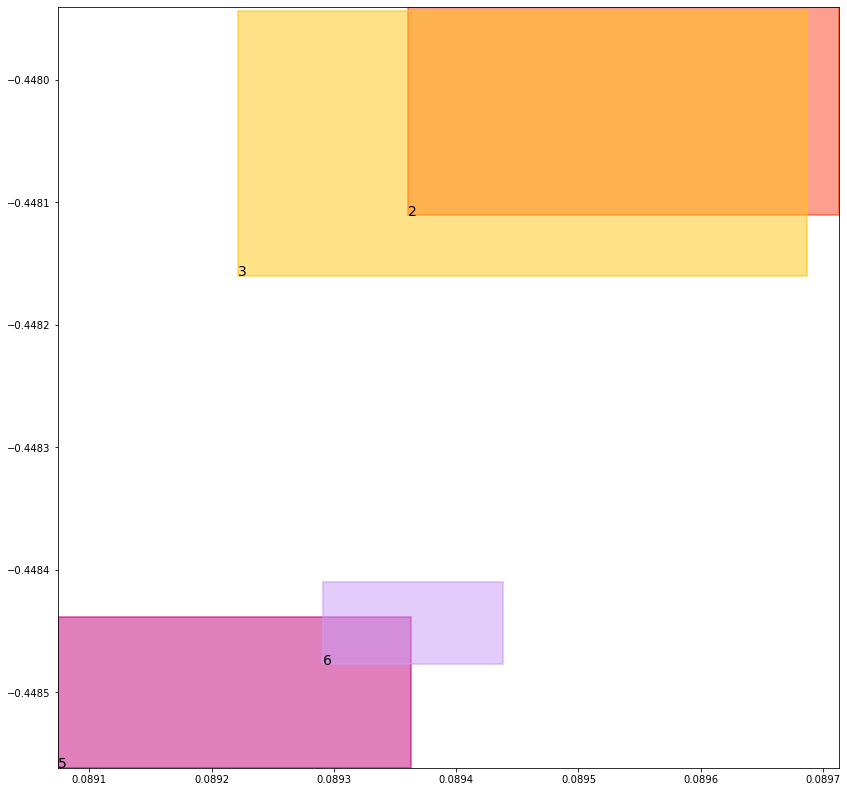

batch (tensor([[4, 5],
        [3, 5],
        [1, 2],
        [5, 3],
        [4, 6],
        [6, 2],
        [1, 3],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072426781989634, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066565200686455, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509987950325012, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648980021476746, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0367552824318409 0.023524301126599312 tensor(0.9302753210067749) tensor(0.9702432751655579)
tensor(2) 0.48034533858299255 0.49503886699676514 tensor(0.4806399941444397) tensor(0.4960515201091766)
tensor(3) 0.4791201949119568 0.49494120478630066 tensor(0.4792646765708923) tensor(0.4962710738182068)
tensor(4) 0.04763767123222351 0.00806352123618126 tensor(0.9710694551467896) tensor(0.9556457996368408)
tensor(5) 0.5110854506492615 0.48301830887794495 tensor(0.5121347308158875) tensor(0.4838331341743469)
tensor(6) 0.5130192041397095 0.4835251271724701 tensor(0.5131795406341553) tensor(0.4842563569545746)


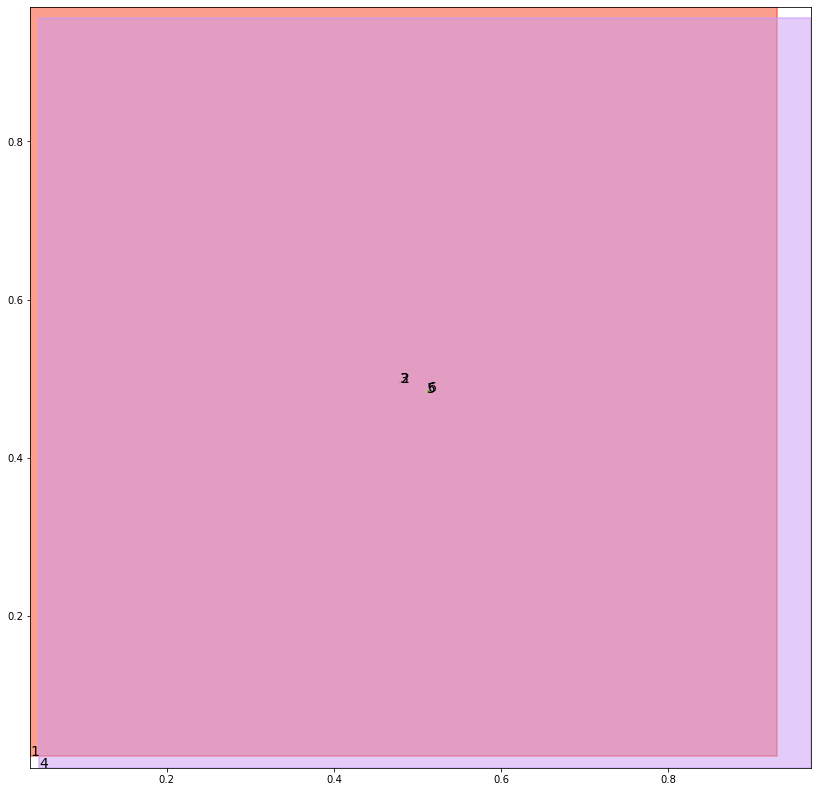

alignment data:
tensor(2) 0.08978140354156494 -0.49182581901550293 tensor(0.0900675058364868) tensor(-0.4916903674602509)
tensor(3) 0.08964800834655762 -0.49187785387039185 tensor(0.0900021791458130) tensor(-0.4917078614234924)
tensor(5) 0.08941304683685303 -0.49231886863708496 tensor(0.0897148847579956) tensor(-0.4921833574771881)
tensor(6) 0.0897141695022583 -0.4921928644180298 tensor(0.0899161100387573) tensor(-0.4920967817306519)


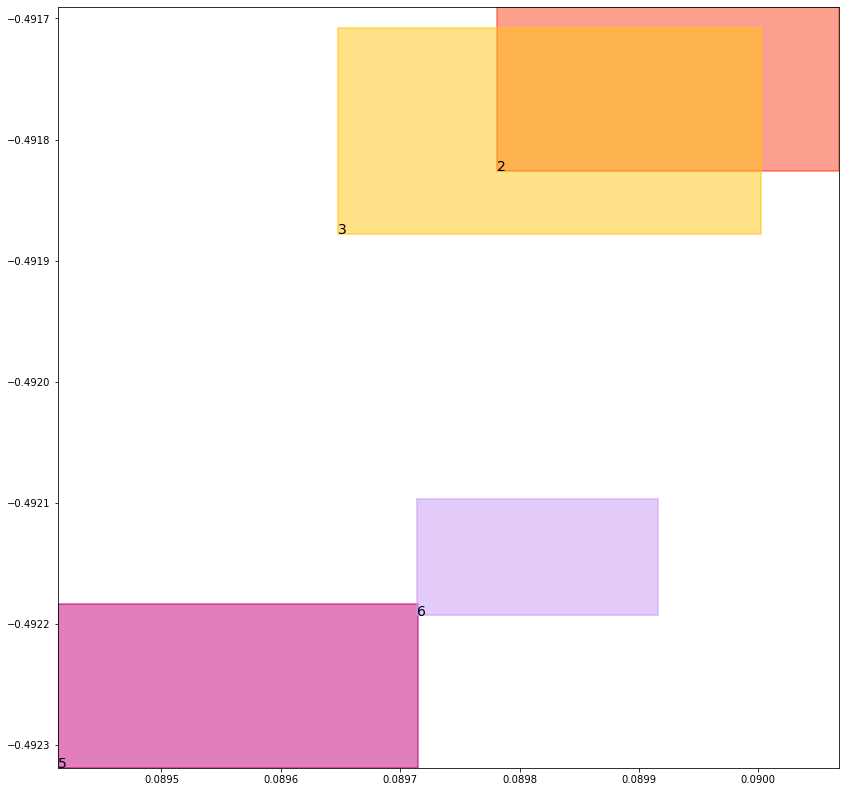

batch (tensor([[3, 5],
        [4, 5],
        [1, 3],
        [6, 2],
        [1, 2],
        [2, 6],
        [5, 3],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072253872640431, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066475793719292, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509996891021729, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648726701736450, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036710239946842194 0.02341604046523571 tensor(0.9305307269096375) tensor(0.9702957868576050)
tensor(2) 0.4805590510368347 0.49573269486427307 tensor(0.4809049665927887) tensor(0.4957381784915924)
tensor(3) 0.4786955416202545 0.49532416462898254 tensor(0.4798209667205811) tensor(0.4958068728446960)
tensor(4) 0.047425638884305954 0.008021045476198196 tensor(0.9710952043533325) tensor(0.9557064175605774)
tensor(5) 0.5109734535217285 0.4833540618419647 tensor(0.5116203427314758) tensor(0.4837358295917511)
tensor(6) 0.5127294659614563 0.48345324397087097 tensor(0.5134272575378418) tensor(0.4845011830329895)


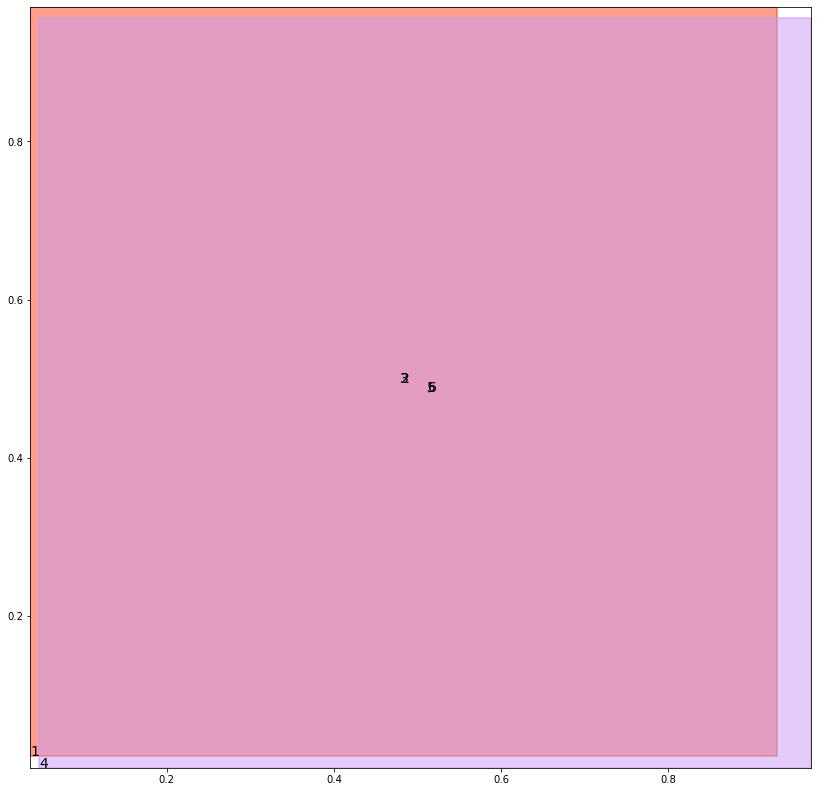

alignment data:
tensor(2) 0.08549010753631592 -0.5278186202049255 tensor(0.0855220556259155) tensor(-0.5278066396713257)
tensor(3) 0.08521997928619385 -0.5279303789138794 tensor(0.0854436159133911) tensor(-0.5278335213661194)
tensor(5) 0.0850057601928711 -0.5283645391464233 tensor(0.0851609706878662) tensor(-0.5282959342002869)
tensor(6) 0.08518671989440918 -0.5282948613166809 tensor(0.0855176448822021) tensor(-0.5281416773796082)


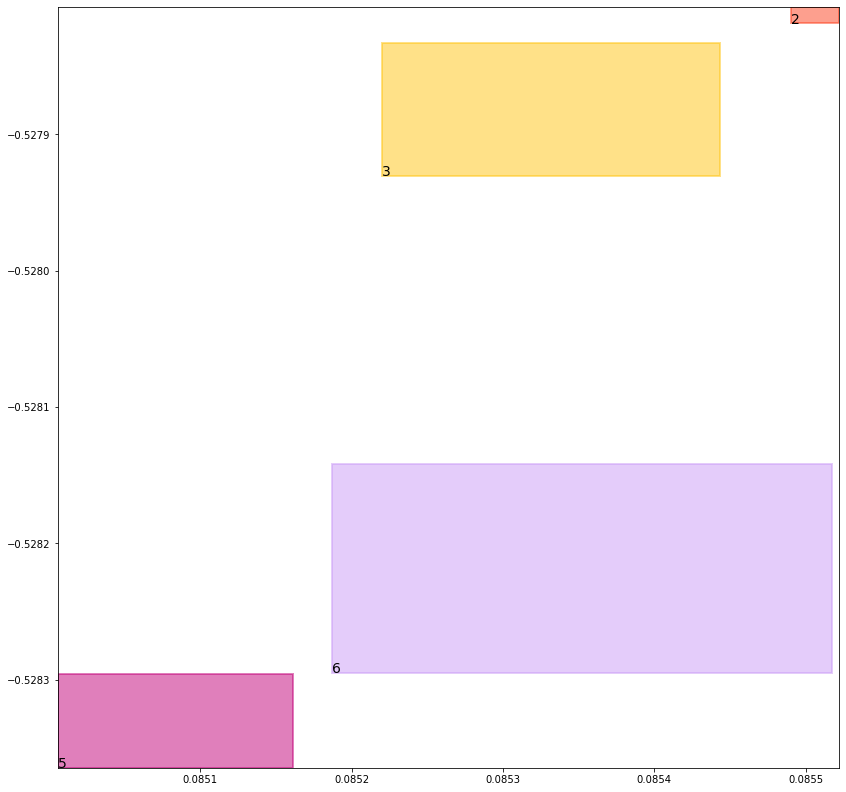

batch (tensor([[1, 2],
        [3, 5],
        [4, 6],
        [6, 2],
        [1, 3],
        [4, 5],
        [2, 6],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [6, 2],
        [2, 6],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072125094011426, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066419690847397, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510034143924713, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648578882217407, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03666529804468155 0.0233086459338665 tensor(0.9307846426963806) tensor(0.9703482389450073)
tensor(2) 0.4807896316051483 0.49526894092559814 tensor(0.4807928502559662) tensor(0.4968495368957520)
tensor(3) 0.47851407527923584 0.4950365424156189 tensor(0.4802080392837524) tensor(0.4960118532180786)
tensor(4) 0.047215208411216736 0.007978958077728748 tensor(0.9711211919784546) tensor(0.9557669758796692)
tensor(5) 0.5106053948402405 0.4834895730018616 tensor(0.5116729736328125) tensor(0.4841712713241577)
tensor(6) 0.5125592947006226 0.4835661053657532 tensor(0.5133807659149170) tensor(0.4841552674770355)


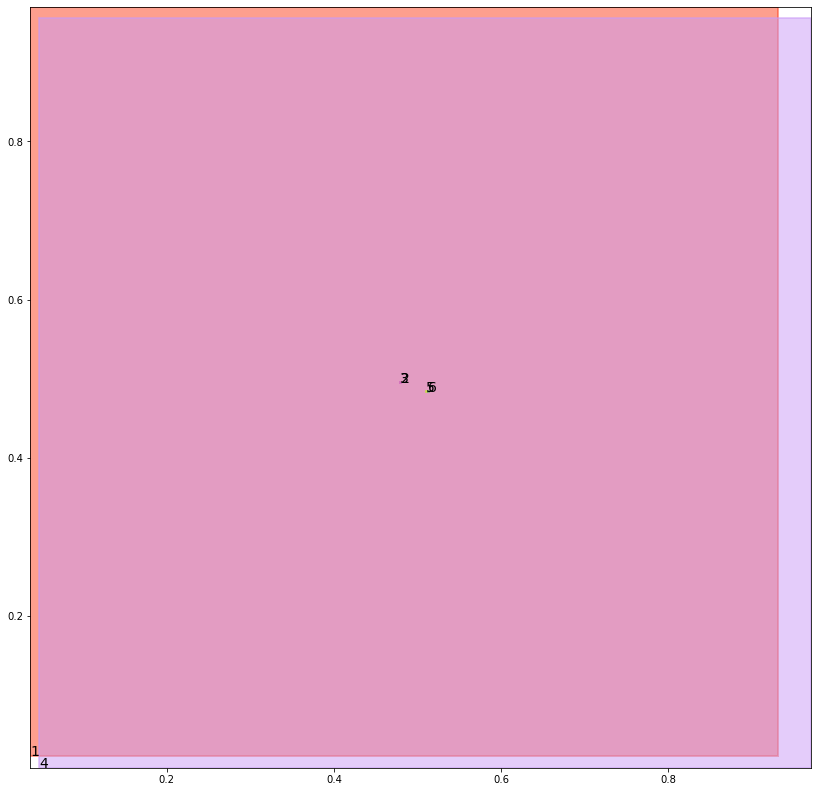

alignment data:
tensor(2) 0.07840335369110107 -0.5637957453727722 tensor(0.0788096189498901) tensor(-0.5635989308357239)
tensor(3) 0.07814168930053711 -0.5638992786407471 tensor(0.0785424709320068) tensor(-0.5637223124504089)
tensor(5) 0.07802438735961914 -0.5642839670181274 tensor(0.0782942771911621) tensor(-0.5641641020774841)
tensor(6) 0.0782175064086914 -0.5642104148864746 tensor(0.0784416198730469) tensor(-0.5641101598739624)


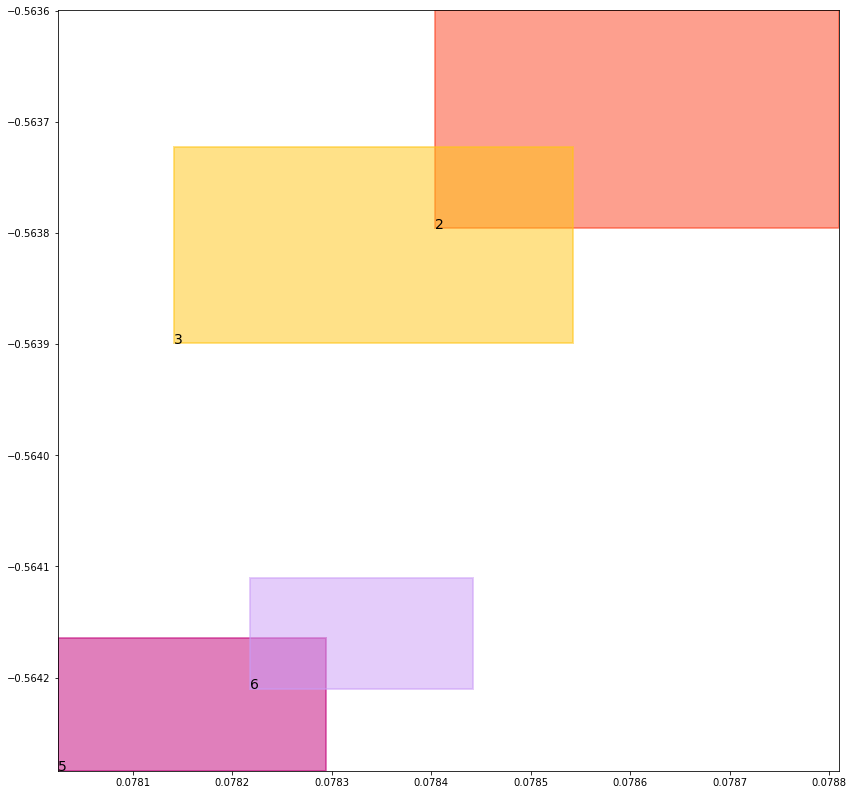

batch (tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5],
        [1, 2],
        [1, 3],
        [4, 5],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072216950356960, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066392393782735, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509984076023102, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648593485355377, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03662043809890747 0.02320207841694355 tensor(0.9310370087623596) tensor(0.9704005122184753)
tensor(2) 0.48007330298423767 0.495033860206604 tensor(0.4813012480735779) tensor(0.4973408877849579)
tensor(3) 0.47868359088897705 0.49469229578971863 tensor(0.4803113043308258) tensor(0.4962841868400574)
tensor(4) 0.04700632765889168 0.007937254384160042 tensor(0.9711470603942871) tensor(0.9558275341987610)
tensor(5) 0.5109538435935974 0.48342517018318176 tensor(0.5112895965576172) tensor(0.4843900203704834)
tensor(6) 0.512641429901123 0.483293354511261 tensor(0.5129261016845703) tensor(0.4838441908359528)


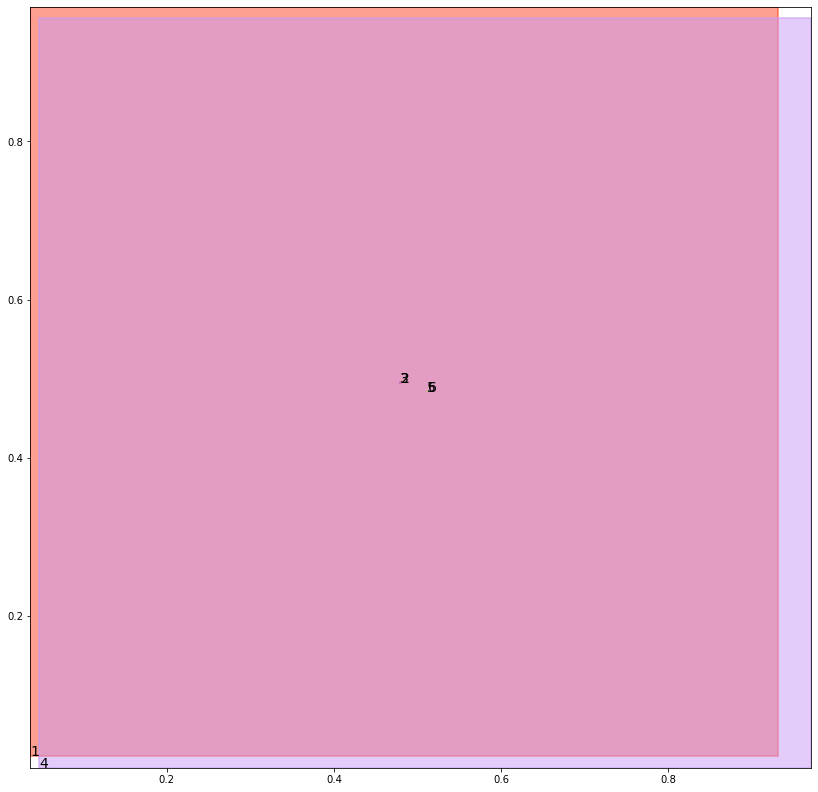

alignment data:
tensor(2) 0.07197773456573486 -0.5946027040481567 tensor(0.0726797580718994) tensor(-0.5942749977111816)
tensor(3) 0.07176625728607178 -0.5946910381317139 tensor(0.0723201036453247) tensor(-0.5944391489028931)
tensor(5) 0.07174122333526611 -0.5950317978858948 tensor(0.0720191001892090) tensor(-0.5949006080627441)
tensor(6) 0.07185745239257812 -0.5949926972389221 tensor(0.0720243453979492) tensor(-0.5949146747589111)


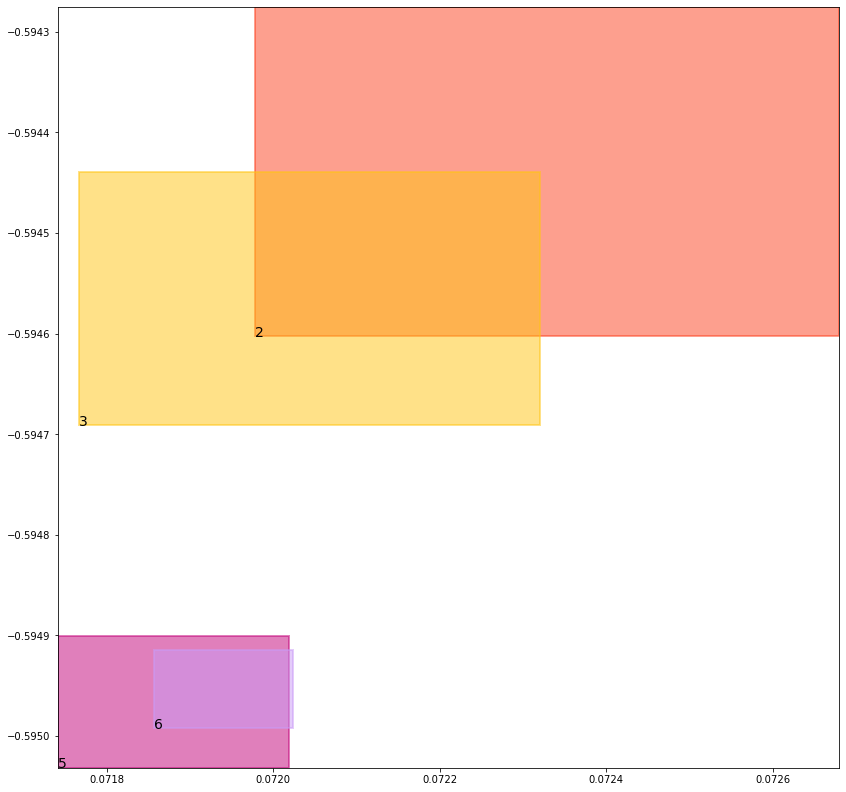

batch (tensor([[4, 6],
        [1, 3],
        [1, 2],
        [3, 5],
        [4, 5],
        [5, 3],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072344527579844, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066249286755919, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509948313236237, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648542225360870, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03657564893364906 0.023096298798918724 tensor(0.9312879443168640) tensor(0.9704527258872986)
tensor(2) 0.4800843596458435 0.49501141905784607 tensor(0.4814730584621429) tensor(0.4972540438175201)
tensor(3) 0.47916996479034424 0.4947364032268524 tensor(0.4801584482192993) tensor(0.4961788356304169)
tensor(4) 0.046799056231975555 0.007895920425653458 tensor(0.9711729288101196) tensor(0.9558879733085632)
tensor(5) 0.5105143189430237 0.4835241436958313 tensor(0.5119443535804749) tensor(0.4840688407421112)
tensor(6) 0.5121063590049744 0.483065664768219 tensor(0.5129507780075073) tensor(0.4839225709438324)


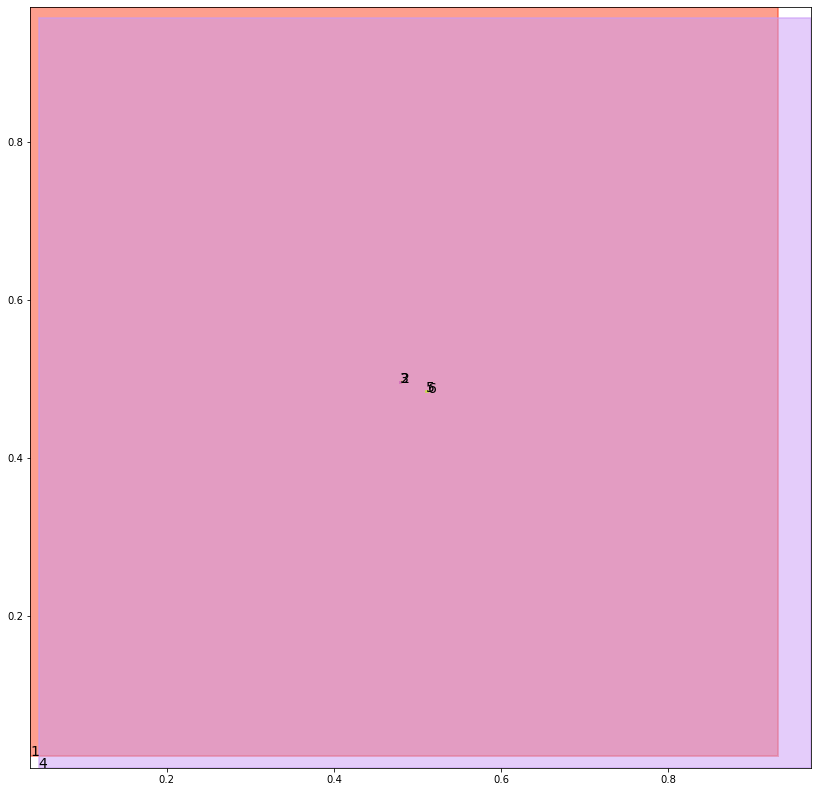

alignment data:
tensor(2) 0.06537365913391113 -0.6155691146850586 tensor(0.0660738945007324) tensor(-0.6152439117431641)
tensor(3) 0.06522142887115479 -0.6156336069107056 tensor(0.0656802654266357) tensor(-0.6154212355613708)
tensor(5) 0.0651315450668335 -0.6159951090812683 tensor(0.0653989315032959) tensor(-0.6158800125122070)
tensor(6) 0.06515562534332275 -0.6159996390342712 tensor(0.0654510259628296) tensor(-0.6158649921417236)


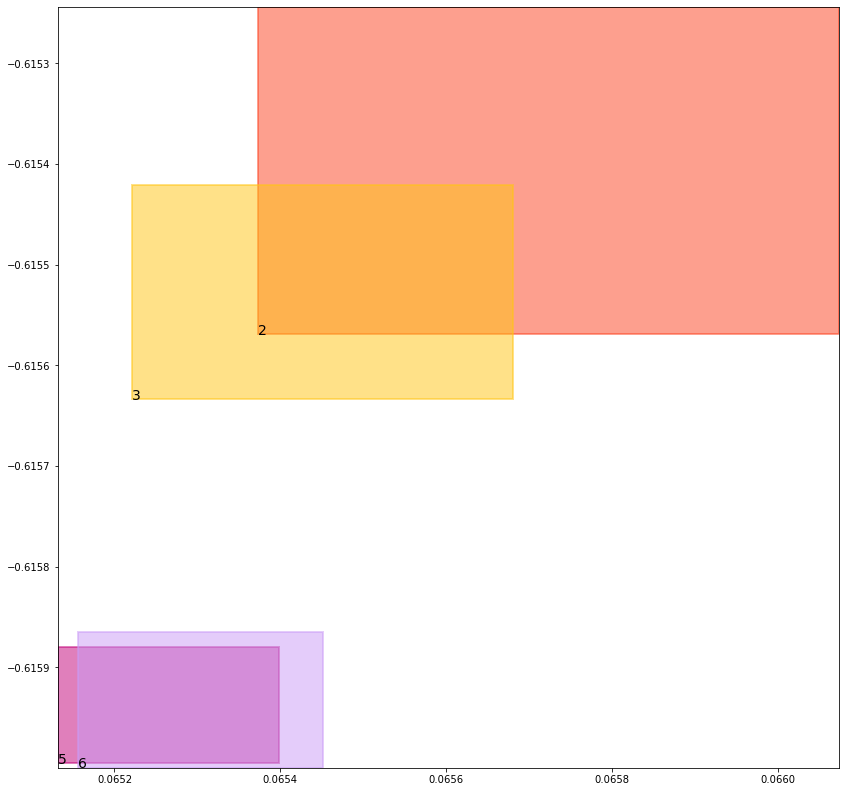

batch (tensor([[4, 5],
        [5, 3],
        [1, 3],
        [3, 5],
        [6, 2],
        [2, 6],
        [1, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0072199241258204, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066322190687060, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509948015213013, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648469507694244, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036530930548906326 0.02299131266772747 tensor(0.9315373301506042) tensor(0.9705048203468323)
tensor(2) 0.4807540476322174 0.4951796233654022 tensor(0.4813382029533386) tensor(0.4966468811035156)
tensor(3) 0.47977519035339355 0.49512916803359985 tensor(0.4799407422542572) tensor(0.4957335591316223)
tensor(4) 0.04659328609704971 0.007854952476918697 tensor(0.9711987972259521) tensor(0.9559484124183655)
tensor(5) 0.510230541229248 0.48326224088668823 tensor(0.5121286511421204) tensor(0.4837710857391357)
tensor(6) 0.5117519497871399 0.4834158420562744 tensor(0.5129771232604980) tensor(0.4838201999664307)


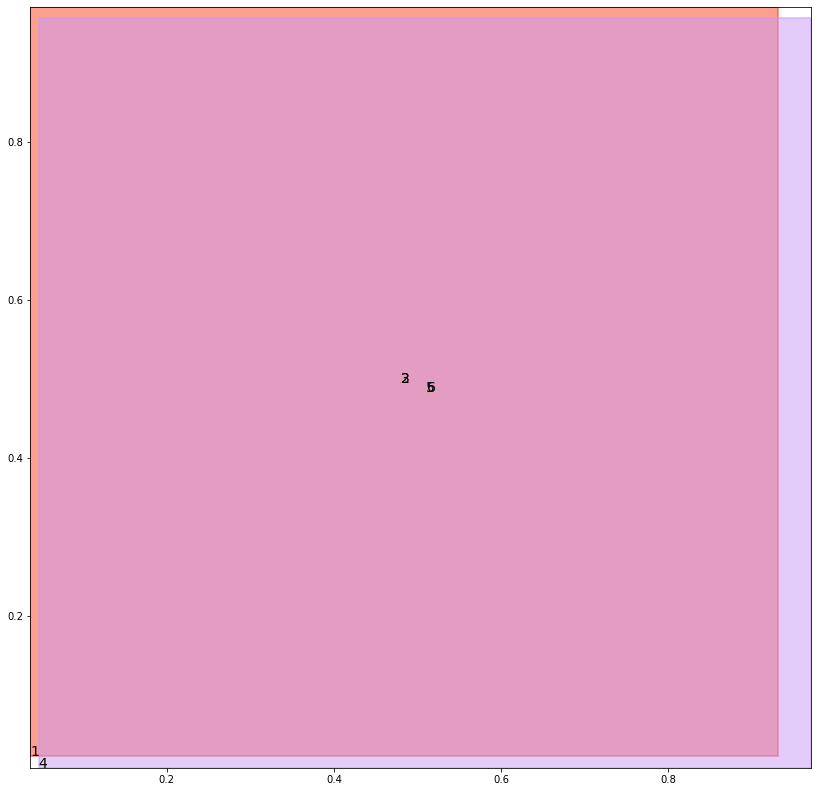

alignment data:
tensor(2) 0.05955815315246582 -0.6377681493759155 tensor(0.0599879026412964) tensor(-0.6375659704208374)
tensor(3) 0.05945777893066406 -0.6378069519996643 tensor(0.0596281290054321) tensor(-0.6377261281013489)
tensor(5) 0.05912351608276367 -0.6382765769958496 tensor(0.0594238042831421) tensor(-0.6381502151489258)
tensor(6) 0.05929887294769287 -0.6382070183753967 tensor(0.0595122575759888) tensor(-0.6381160020828247)


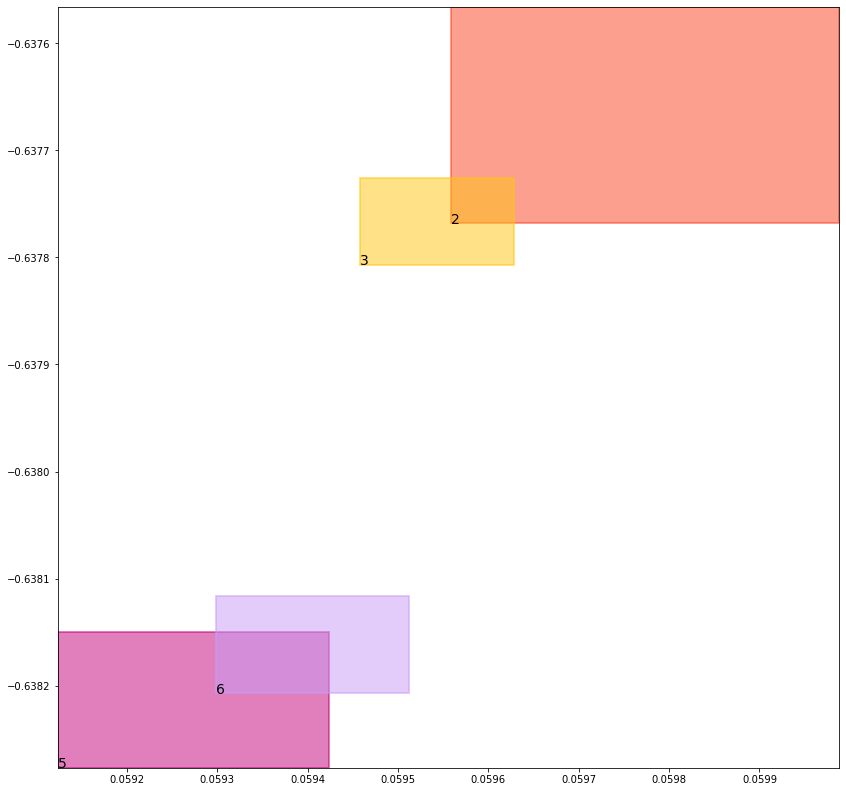

batch (tensor([[4, 6],
        [3, 5],
        [4, 5],
        [1, 3],
        [5, 3],
        [2, 6],
        [6, 2],
        [1, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071835424751043, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066299391910434, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510003745555878, grad_fn=<MulBackward0>)
previous loss: tensor(0.2648138701915741, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03648631274700165 0.022887136787176132 tensor(0.9317852258682251) tensor(0.9705567955970764)
tensor(2) 0.48092785477638245 0.49551892280578613 tensor(0.4820138216018677) tensor(0.4955798089504242)
tensor(3) 0.47969529032707214 0.4949852526187897 tensor(0.4803329706192017) tensor(0.4958285689353943)
tensor(4) 0.046388961374759674 0.007814343087375164 tensor(0.9712246060371399) tensor(0.9560087919235229)
tensor(5) 0.5103927254676819 0.4830564856529236 tensor(0.5115830898284912) tensor(0.4838337004184723)
tensor(6) 0.5118188261985779 0.4835529029369354 tensor(0.5127474069595337) tensor(0.4842865467071533)


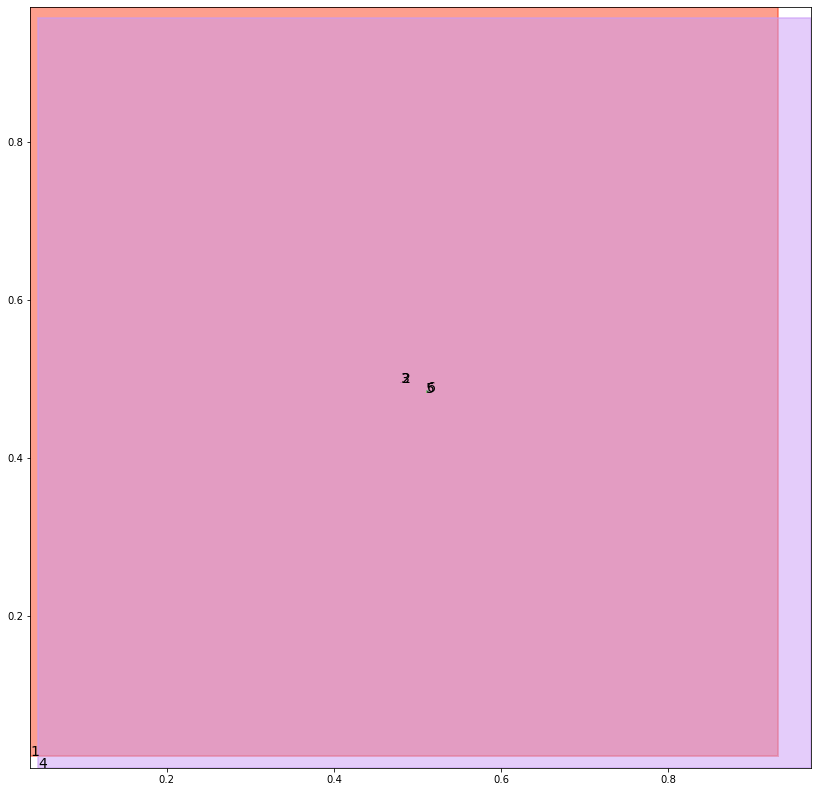

alignment data:
tensor(2) 0.05531418323516846 -0.6577960848808289 tensor(0.0554269552230835) tensor(-0.6577523350715637)
tensor(3) 0.055066585540771484 -0.6579036116600037 tensor(0.0553406476974487) tensor(-0.6577772498130798)
tensor(5) 0.05474114418029785 -0.658369779586792 tensor(0.0550477504730225) tensor(-0.6582332849502563)
tensor(6) 0.054996490478515625 -0.6582604646682739 tensor(0.0552684068679810) tensor(-0.6581380963325500)


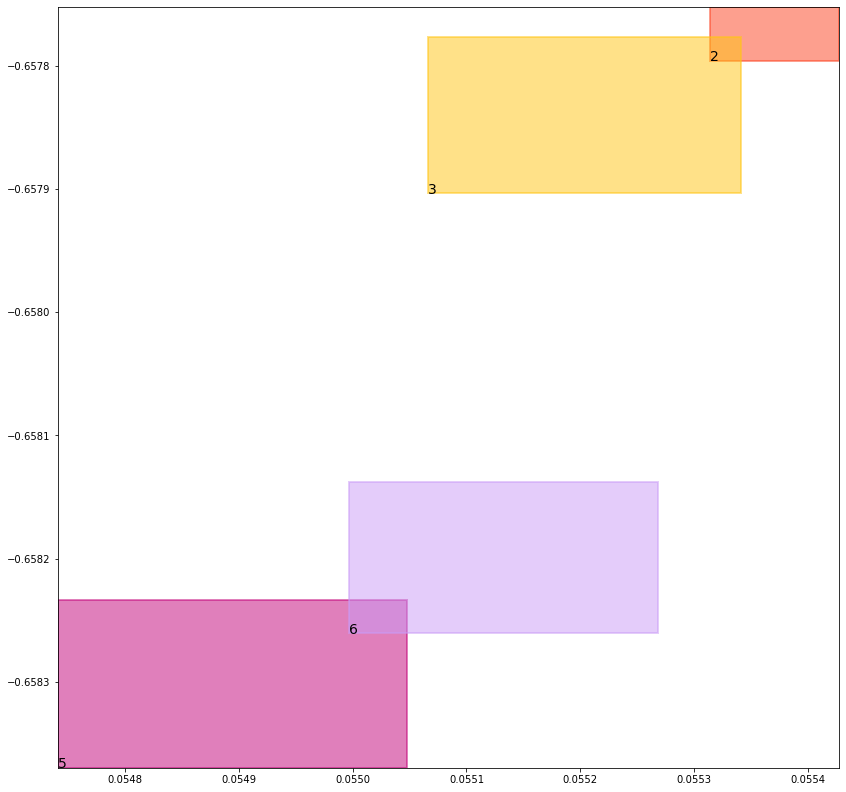

batch (tensor([[3, 5],
        [2, 6],
        [1, 2],
        [4, 6],
        [4, 5],
        [5, 3],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [2, 6],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071756779216230, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066207586787641, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510015666484833, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647980153560638, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03644179180264473 0.022783774882555008 tensor(0.9320316314697266) tensor(0.9706087112426758)
tensor(2) 0.48086217045783997 0.4941166341304779 tensor(0.4825274348258972) tensor(0.4960111379623413)
tensor(3) 0.47988975048065186 0.49465227127075195 tensor(0.4803823232650757) tensor(0.4961052536964417)
tensor(4) 0.04618612676858902 0.007774089463055134 tensor(0.9712504148483276) tensor(0.9560690522193909)
tensor(5) 0.5103833675384521 0.48339423537254333 tensor(0.5109561681747437) tensor(0.4837308526039124)
tensor(6) 0.5122655034065247 0.4834907054901123 tensor(0.5122855901718140) tensor(0.4845101833343506)


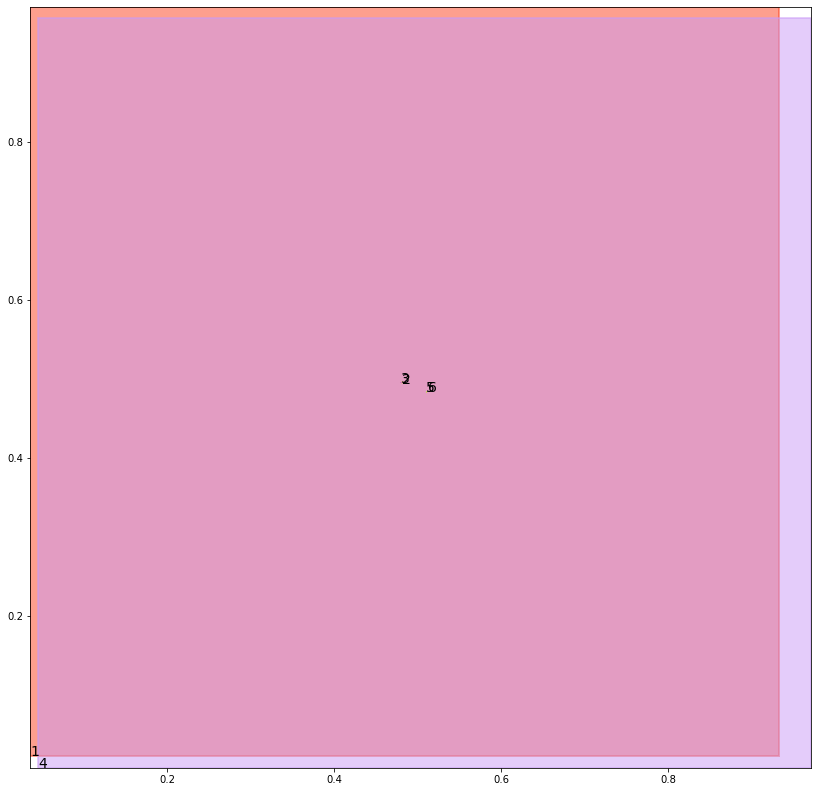

alignment data:
tensor(2) 0.053075432777404785 -0.6625465154647827 tensor(0.0537128448486328) tensor(-0.6622546911239624)
tensor(3) 0.05312633514404297 -0.6625121235847473 tensor(0.0535448789596558) tensor(-0.6623145937919617)
tensor(5) 0.05295884609222412 -0.6628978848457336 tensor(0.0530967712402344) tensor(-0.6628368496894836)
tensor(6) 0.05315232276916504 -0.6628230810165405 tensor(0.0534167289733887) tensor(-0.6626952886581421)


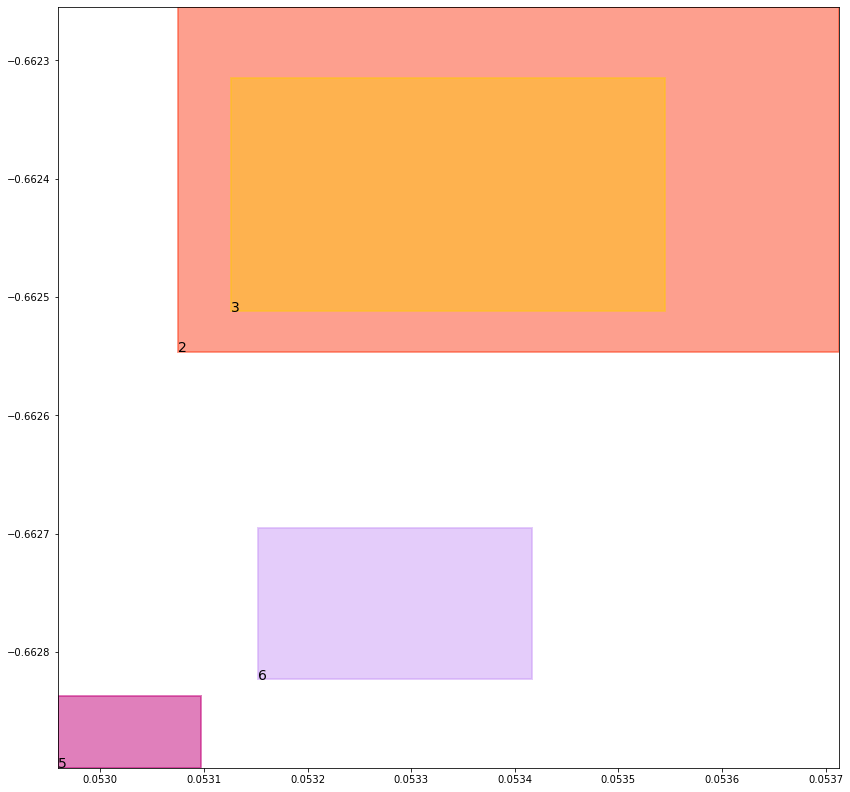

batch (tensor([[5, 3],
        [1, 2],
        [4, 6],
        [6, 2],
        [1, 3],
        [2, 6],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071897562593222, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066009587608278, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509967982769012, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647875249385834, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036397356539964676 0.022681135684251785 tensor(0.9322766065597534) tensor(0.9706604480743408)
tensor(2) 0.4811093807220459 0.49331438541412354 tensor(0.4823641777038574) tensor(0.4962627887725830)
tensor(3) 0.4801218807697296 0.49469953775405884 tensor(0.4803318679332733) tensor(0.4959954917430878)
tensor(4) 0.04598481208086014 0.007734191138297319 tensor(0.9712761640548706) tensor(0.9561291933059692)
tensor(5) 0.5099820494651794 0.4834805428981781 tensor(0.5110348463058472) tensor(0.4842146337032318)
tensor(6) 0.5116157531738281 0.483608603477478 tensor(0.5130501985549927) tensor(0.4841530323028564)


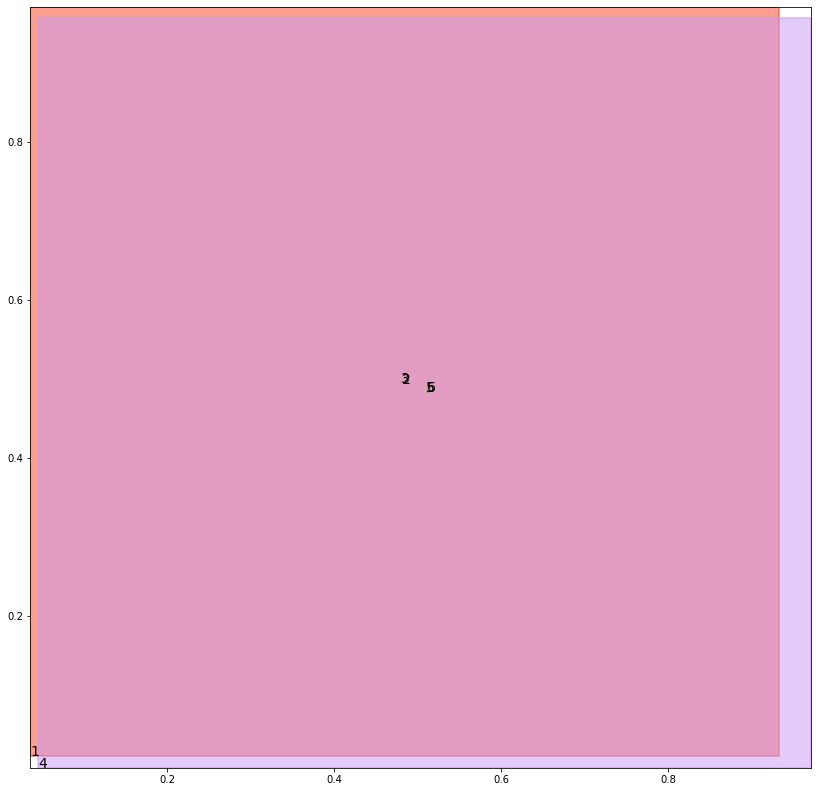

alignment data:
tensor(2) 0.052263498306274414 -0.6583659648895264 tensor(0.0531363487243652) tensor(-0.6579563021659851)
tensor(3) 0.05253195762634277 -0.6582263708114624 tensor(0.0528848171234131) tensor(-0.6580576896667480)
tensor(5) 0.052320241928100586 -0.6586251258850098 tensor(0.0526039600372314) tensor(-0.6584982872009277)
tensor(6) 0.05249977111816406 -0.6585544347763062 tensor(0.0527689456939697) tensor(-0.6584385037422180)


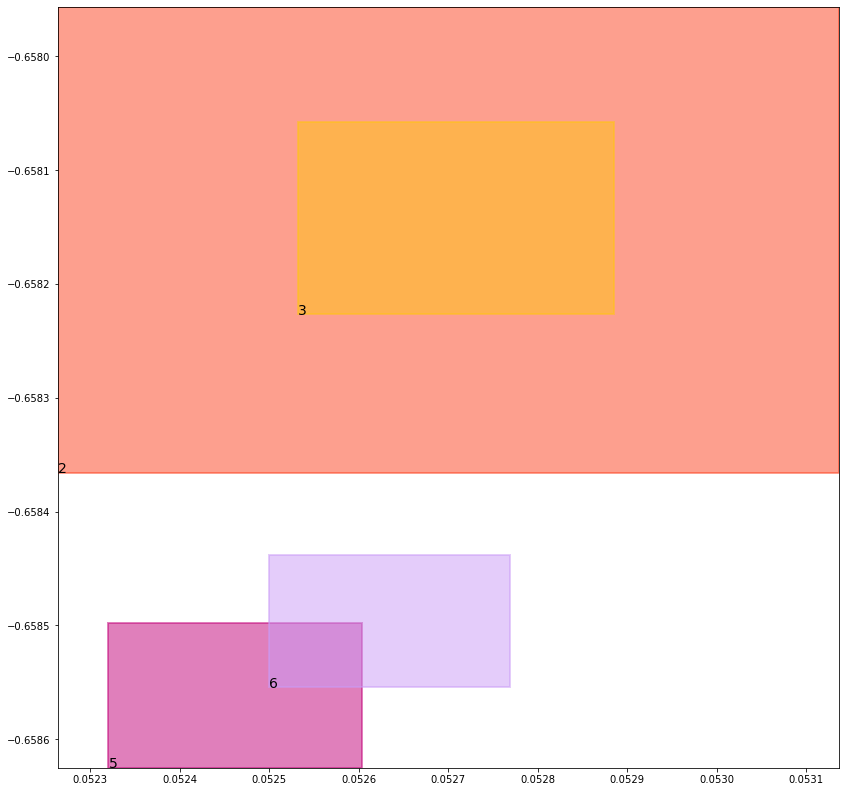

batch (tensor([[1, 2],
        [6, 2],
        [4, 6],
        [2, 6],
        [5, 3],
        [3, 5],
        [4, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071815317496657, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066108587197959, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509938180446625, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647862136363983, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036353014409542084 0.022579187527298927 tensor(0.9325202703475952) tensor(0.9707121253013611)
tensor(2) 0.4815916419029236 0.4931200444698334 tensor(0.4816392064094543) tensor(0.4962958097457886)
tensor(3) 0.4802171587944031 0.495088666677475 tensor(0.4804854989051819) tensor(0.4955413937568665)
tensor(4) 0.04578493908047676 0.007694649510085583 tensor(0.9713019132614136) tensor(0.9561893343925476)
tensor(5) 0.5103035569190979 0.4834146797657013 tensor(0.5106741786003113) tensor(0.4844344854354858)
tensor(6) 0.511247456073761 0.48327764868736267 tensor(0.5133427977561951) tensor(0.4838869571685791)


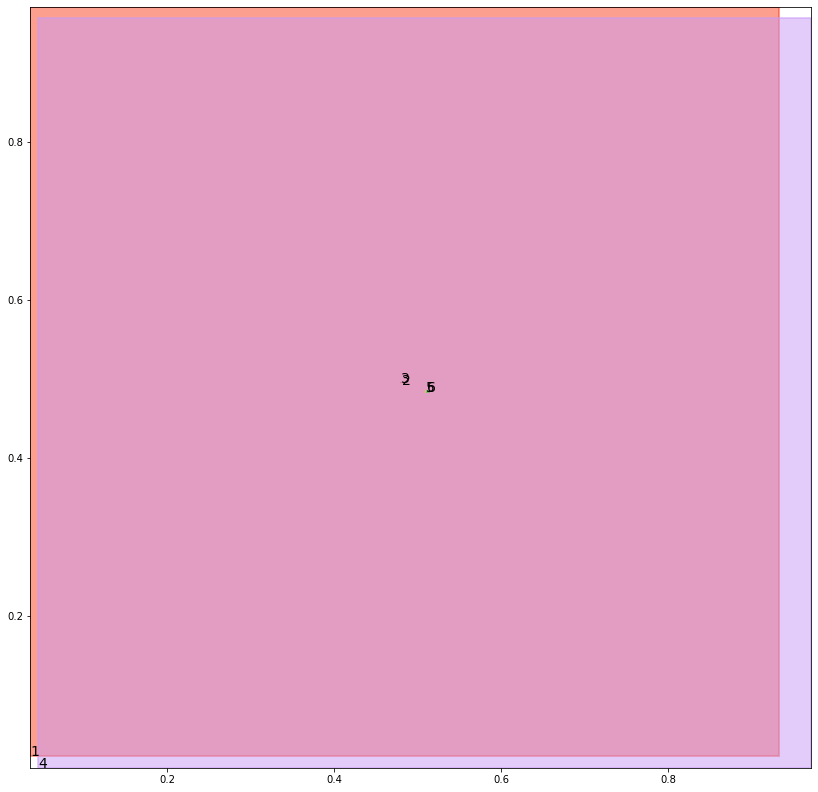

alignment data:
tensor(2) 0.053766489028930664 -0.6444758176803589 tensor(0.0545903444290161) tensor(-0.6440780758857727)
tensor(3) 0.05415081977844238 -0.6442763805389404 tensor(0.0542918443679810) tensor(-0.6442109346389771)
tensor(5) 0.05384361743927002 -0.644721508026123 tensor(0.0541400909423828) tensor(-0.6445818543434143)
tensor(6) 0.053893089294433594 -0.6447069048881531 tensor(0.0542387962341309) tensor(-0.6445604562759399)


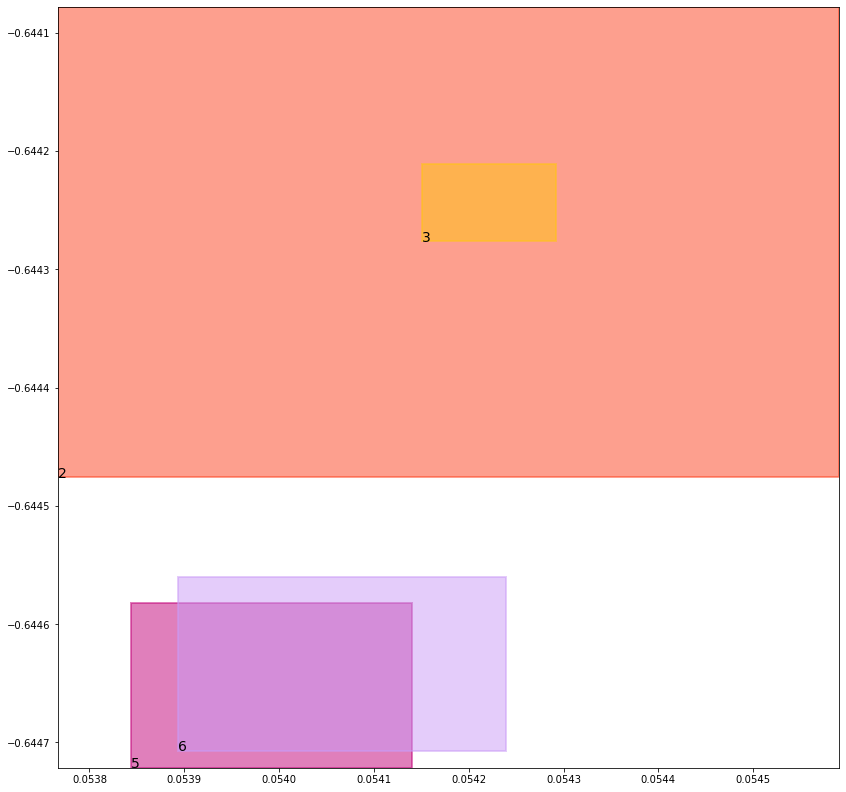

batch (tensor([[2, 6],
        [5, 3],
        [1, 3],
        [4, 5],
        [1, 2],
        [6, 2],
        [4, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071580284275115, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066078887321055, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509954273700714, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647613584995270, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03630877286195755 0.02247793599963188 tensor(0.9327623844146729) tensor(0.9707636237144470)
tensor(2) 0.4815516173839569 0.49347156286239624 tensor(0.4818286597728729) tensor(0.4961315393447876)
tensor(3) 0.4803789556026459 0.49478209018707275 tensor(0.4806329607963562) tensor(0.4957817792892456)
tensor(4) 0.04558650404214859 0.00765544967725873 tensor(0.9713275432586670) tensor(0.9562495350837708)
tensor(5) 0.5099174976348877 0.48351654410362244 tensor(0.5112751722335815) tensor(0.4841058850288391)
tensor(6) 0.5111525654792786 0.48303064703941345 tensor(0.5131896734237671) tensor(0.4839605391025543)


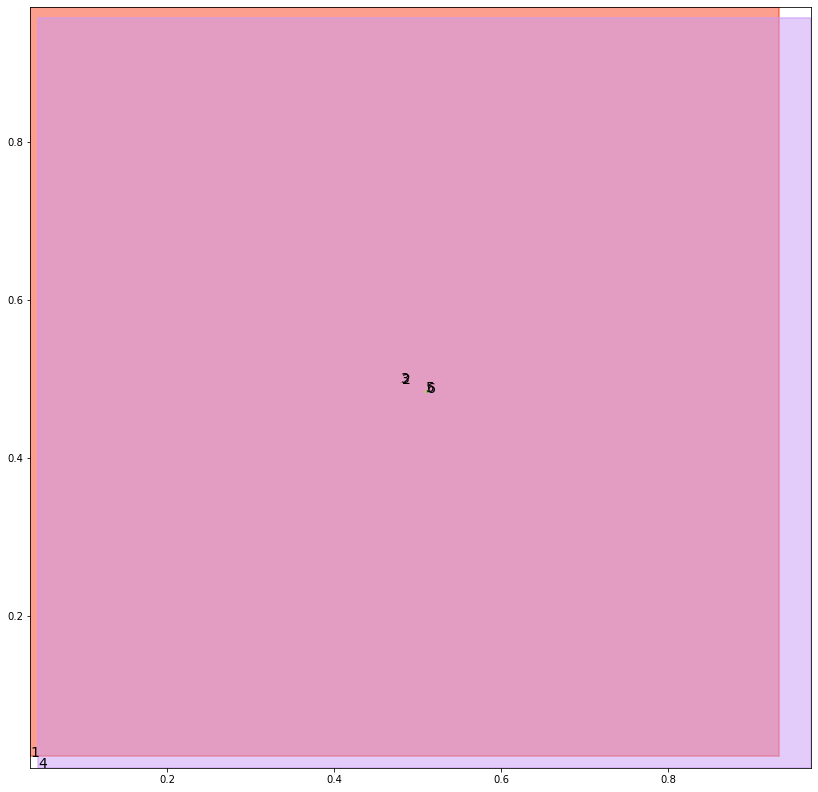

alignment data:
tensor(2) 0.05828201770782471 -0.6218856573104858 tensor(0.0589942932128906) tensor(-0.6215442419052124)
tensor(3) 0.058514952659606934 -0.6217616200447083 tensor(0.0587961673736572) tensor(-0.6216282248497009)
tensor(5) 0.05826461315155029 -0.6221716403961182 tensor(0.0585391521453857) tensor(-0.6220523715019226)
tensor(6) 0.05825018882751465 -0.6221906542778015 tensor(0.0586739778518677) tensor(-0.6220059394836426)


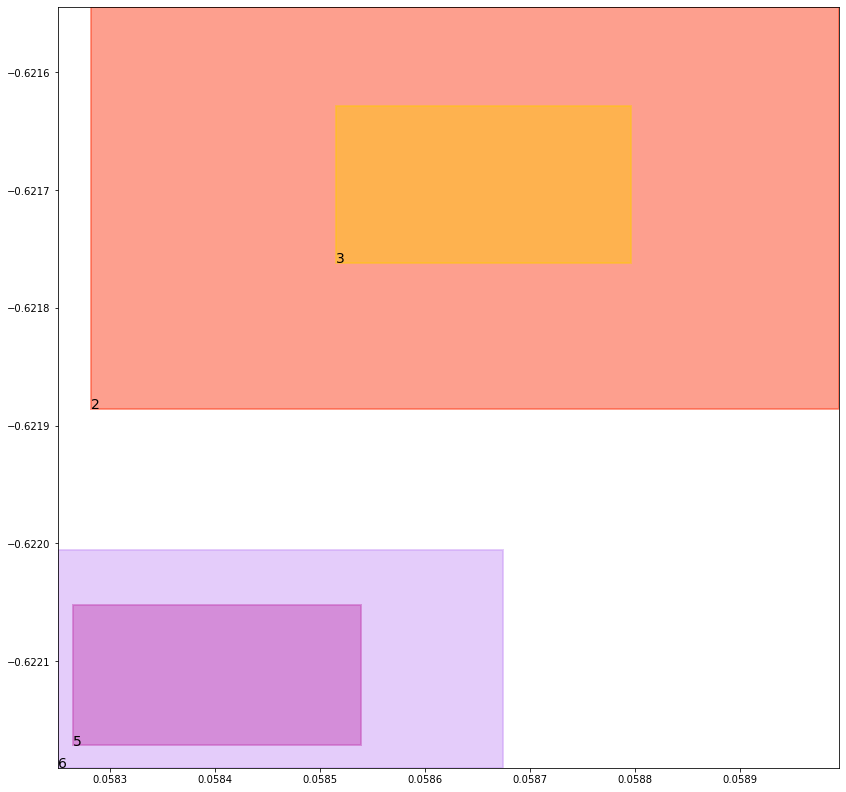

batch (tensor([[4, 6],
        [1, 2],
        [2, 6],
        [3, 5],
        [1, 3],
        [4, 5],
        [6, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071519352495670, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0066092987544835, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509945034980774, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647557258605957, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03626462444663048 0.022377394139766693 tensor(0.9330029487609863) tensor(0.9708150625228882)
tensor(2) 0.4817110002040863 0.49430692195892334 tensor(0.4821717441082001) tensor(0.4957898855209351)
tensor(3) 0.48054924607276917 0.494446724653244 tensor(0.4807036817073822) tensor(0.4960572719573975)
tensor(4) 0.04538946598768234 0.007616584189236164 tensor(0.9713532924652100) tensor(0.9563095569610596)
tensor(5) 0.5096532702445984 0.48328903317451477 tensor(0.5114417076110840) tensor(0.4837690889835358)
tensor(6) 0.511305034160614 0.4833589792251587 tensor(0.5126343965530396) tensor(0.4838488698005676)


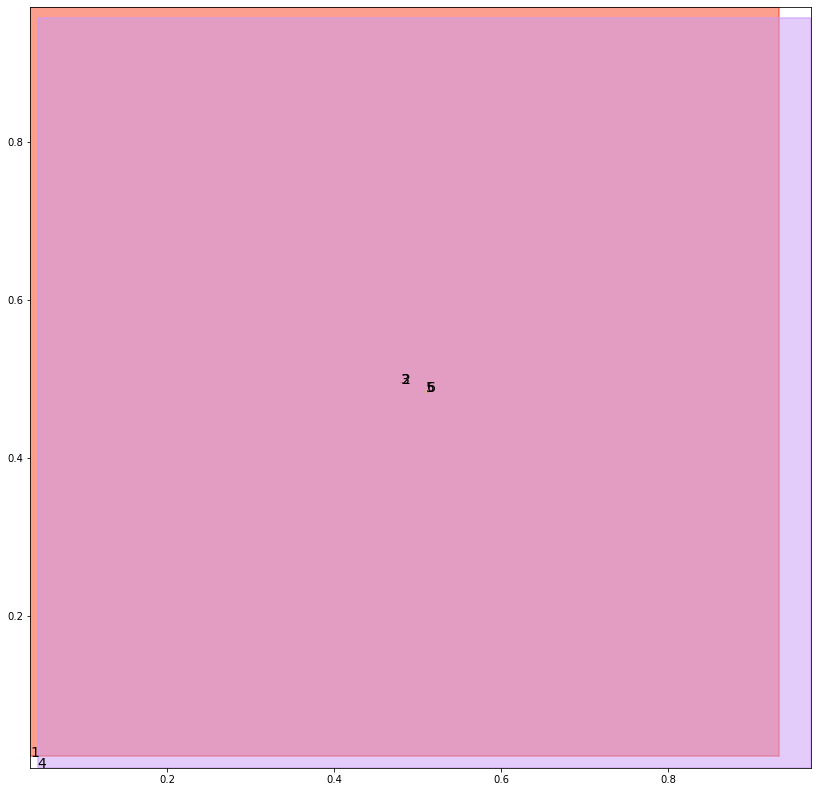

alignment data:
tensor(2) 0.05959272384643555 -0.5948209762573242 tensor(0.0600179433822632) tensor(-0.5946202278137207)
tensor(3) 0.0595240592956543 -0.5948428511619568 tensor(0.0599548816680908) tensor(-0.5946364998817444)
tensor(5) 0.05926251411437988 -0.5952519774436951 tensor(0.0595479011535645) tensor(-0.5951315164566040)
tensor(6) 0.05942952632904053 -0.5951873660087585 tensor(0.0596762895584106) tensor(-0.5950812101364136)


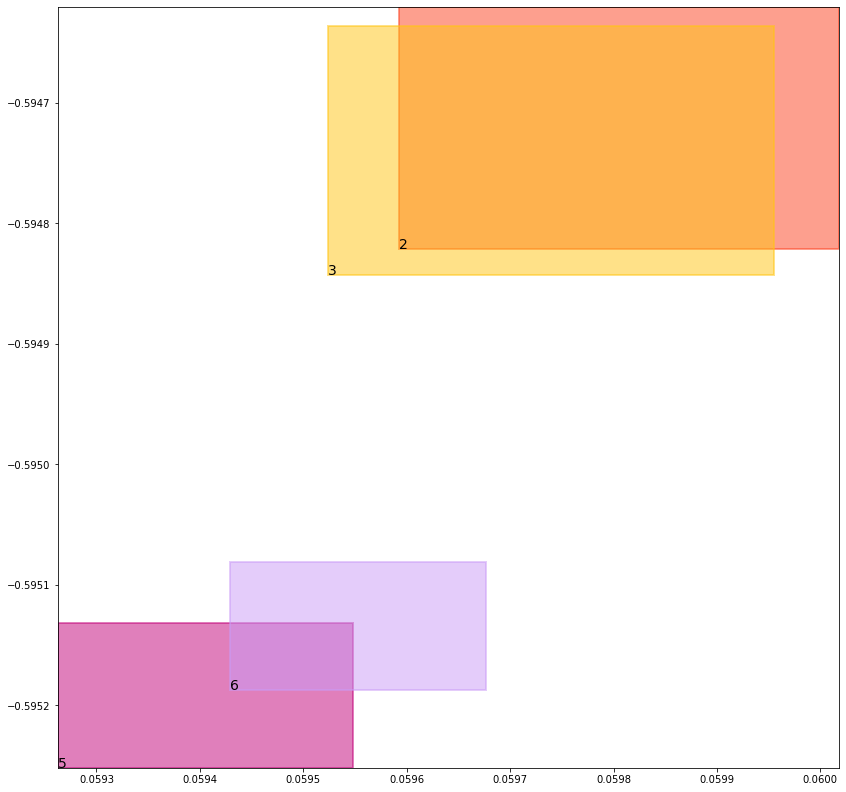

batch (tensor([[1, 3],
        [2, 6],
        [5, 3],
        [3, 5],
        [1, 2],
        [4, 5],
        [6, 2],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071406187489629, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065973890013993, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509976625442505, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647356688976288, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03622058033943176 0.0222775861620903 tensor(0.9332420825958252) tensor(0.9708662629127502)
tensor(2) 0.4819096028804779 0.4952886700630188 tensor(0.4821087419986725) tensor(0.4955677390098572)
tensor(3) 0.48046237230300903 0.4944950342178345 tensor(0.4809690415859222) tensor(0.4959506094455719)
tensor(4) 0.04519382864236832 0.007578051649034023 tensor(0.9713789224624634) tensor(0.9563694596290588)
tensor(5) 0.5098342895507812 0.4830740988254547 tensor(0.5108819007873535) tensor(0.4838381707668304)
tensor(6) 0.511680543422699 0.48357051610946655 tensor(0.5117184519767761) tensor(0.4842093288898468)


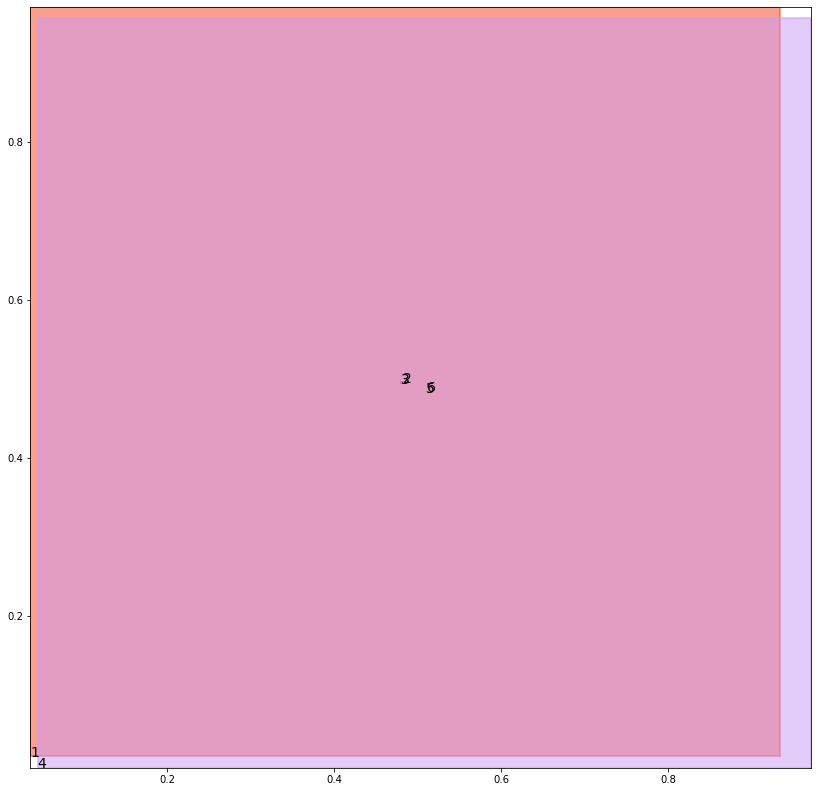

alignment data:
tensor(2) 0.05973851680755615 -0.5921983122825623 tensor(0.0598288774490356) tensor(-0.5921566486358643)
tensor(3) 0.05940210819244385 -0.5923466682434082 tensor(0.0598251819610596) tensor(-0.5921475291252136)
tensor(5) 0.059096693992614746 -0.5927773714065552 tensor(0.0593894720077515) tensor(-0.5926462411880493)
tensor(6) 0.05939209461212158 -0.5926525592803955 tensor(0.0595611333847046) tensor(-0.5925714969635010)


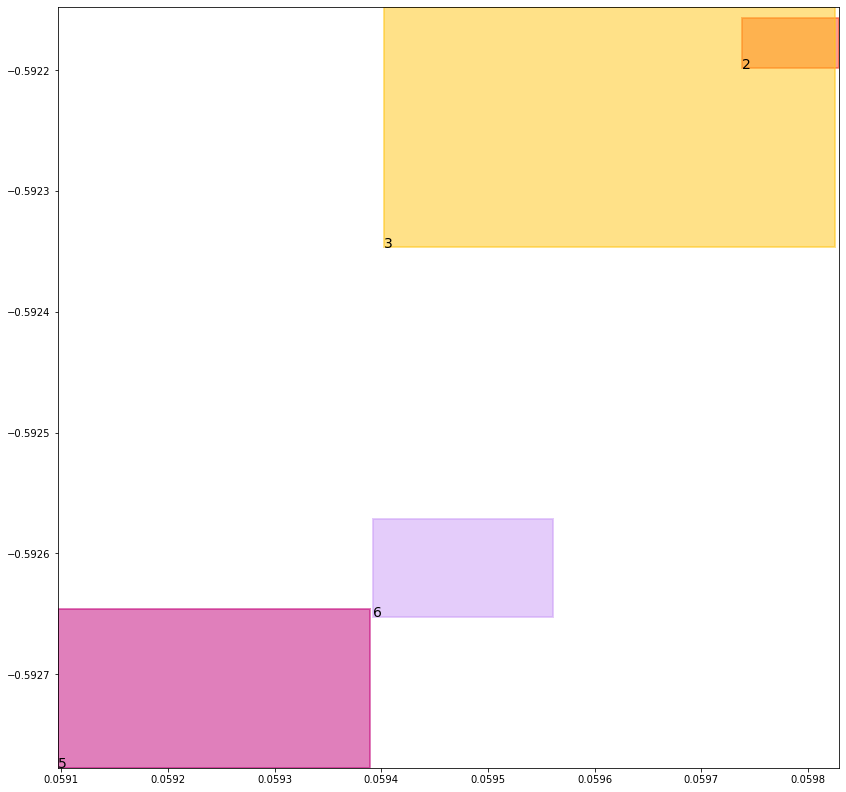

batch (tensor([[5, 3],
        [1, 3],
        [1, 2],
        [6, 2],
        [2, 6],
        [3, 5],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071229999884963, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065783392637968, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510015964508057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647029459476471, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03617662563920021 0.022178545594215393 tensor(0.9334797859191895) tensor(0.9709175229072571)
tensor(2) 0.48143133521080017 0.49502328038215637 tensor(0.4823923408985138) tensor(0.4961978793144226)
tensor(3) 0.4805751144886017 0.49488794803619385 tensor(0.4811008274555206) tensor(0.4954990148544312)
tensor(4) 0.04499964043498039 0.007539844140410423 tensor(0.9714046120643616) tensor(0.9564294219017029)
tensor(5) 0.5096707940101624 0.48340556025505066 tensor(0.5104162096977234) tensor(0.4837419688701630)
tensor(6) 0.5104800462722778 0.4834997355937958 tensor(0.5122570395469666) tensor(0.4844174087047577)


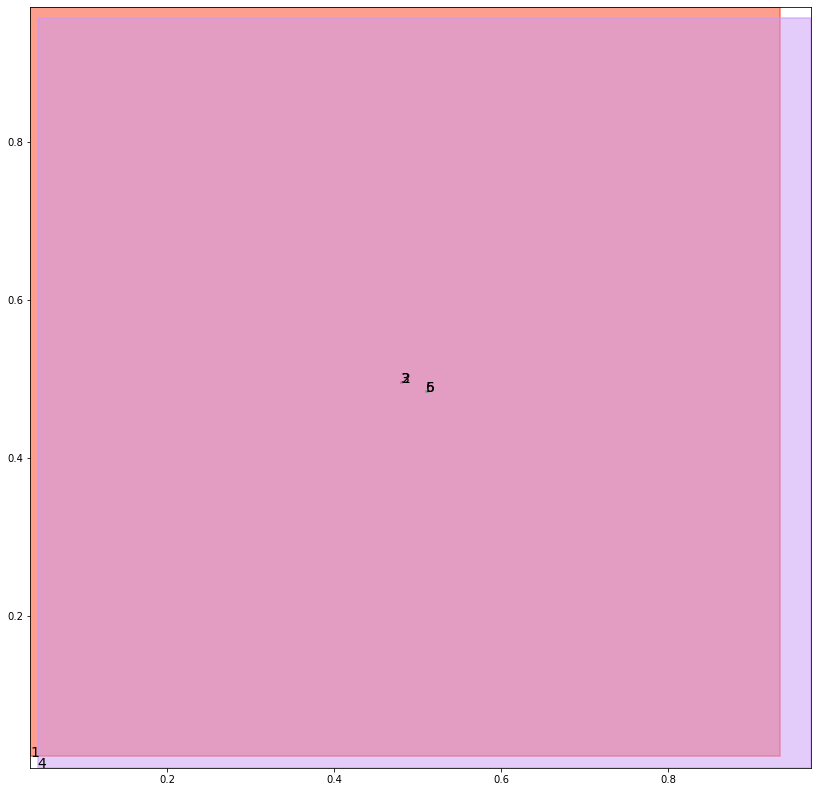

alignment data:
tensor(2) 0.05857992172241211 -0.5736711025238037 tensor(0.0589716434478760) tensor(-0.5734914541244507)
tensor(3) 0.05846714973449707 -0.5737172365188599 tensor(0.0586733818054199) tensor(-0.5736228227615356)
tensor(5) 0.058121442794799805 -0.574162483215332 tensor(0.0582761764526367) tensor(-0.5740949511528015)
tensor(6) 0.058219194412231445 -0.5741230845451355 tensor(0.0586179494857788) tensor(-0.5739477872848511)


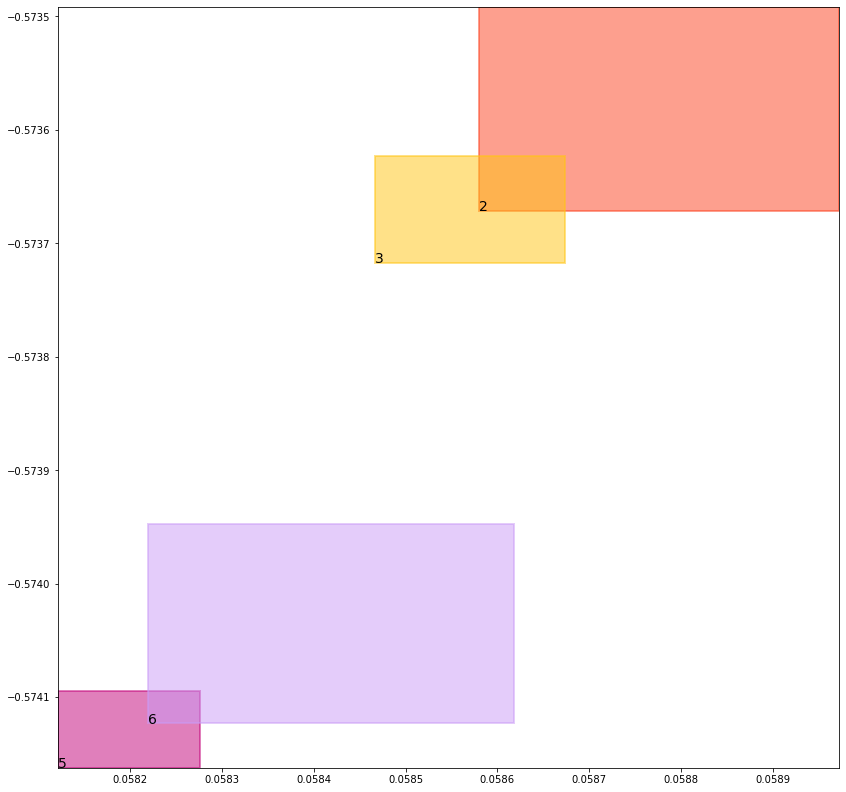

batch (tensor([[6, 2],
        [4, 5],
        [1, 2],
        [1, 3],
        [2, 6],
        [4, 6],
        [5, 3],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071230898611248, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065837092697620, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999573230743, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647067606449127, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036132752895355225 0.022080281749367714 tensor(0.9337160587310791) tensor(0.9709685444831848)
tensor(2) 0.4814769923686981 0.49497097730636597 tensor(0.4825378656387329) tensor(0.4962512254714966)
tensor(3) 0.48097291588783264 0.4947393238544464 tensor(0.4810070991516113) tensor(0.4955887198448181)
tensor(4) 0.04480677470564842 0.007501966319978237 tensor(0.9714302420616150) tensor(0.9564891457557678)
tensor(5) 0.5092641115188599 0.48349636793136597 tensor(0.5105098485946655) tensor(0.4842292964458466)
tensor(6) 0.5097545385360718 0.48361650109291077 tensor(0.5125218033790588) tensor(0.4840479493141174)


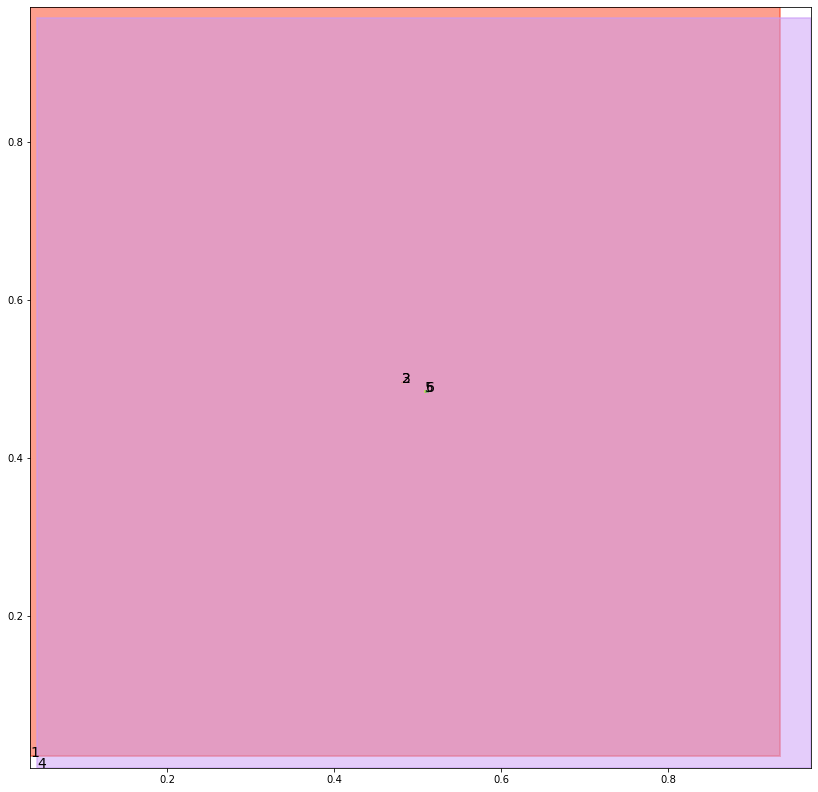

alignment data:
tensor(2) 0.05463409423828125 -0.5504469275474548 tensor(0.0550628900527954) tensor(-0.5502505302429199)
tensor(3) 0.054528236389160156 -0.5504931211471558 tensor(0.0547519922256470) tensor(-0.5503857135772705)
tensor(5) 0.054172515869140625 -0.5509331822395325 tensor(0.0544760227203369) tensor(-0.5507988929748535)
tensor(6) 0.05424833297729492 -0.5509014129638672 tensor(0.0546110868453979) tensor(-0.5507528781890869)


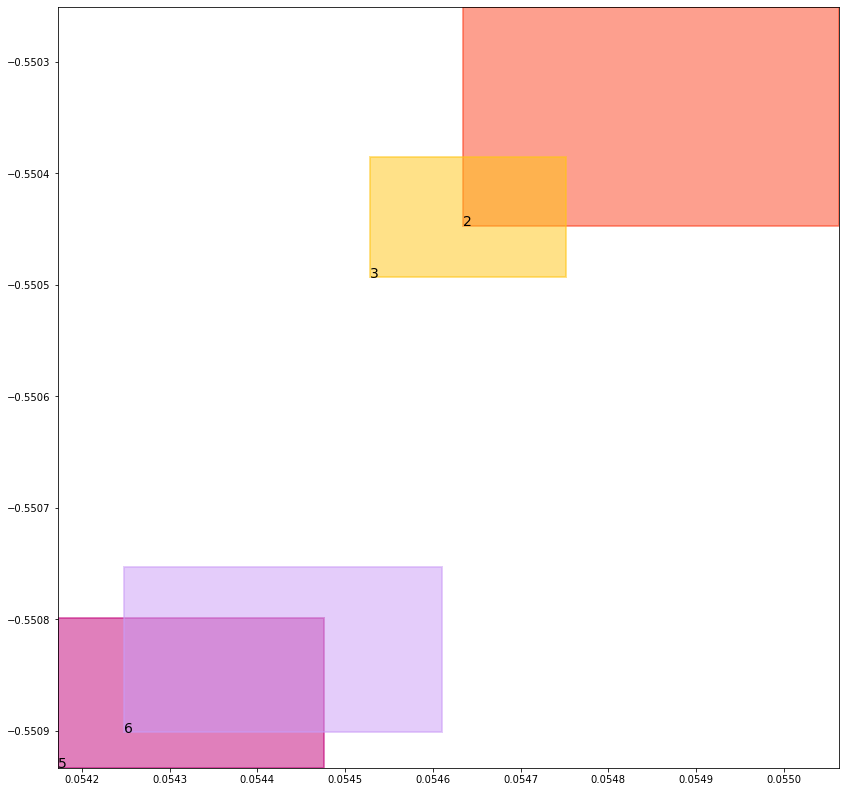

batch (tensor([[6, 2],
        [4, 5],
        [5, 3],
        [1, 3],
        [3, 5],
        [1, 2],
        [2, 6],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071141752414405, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065897693857551, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509984672069550, grad_fn=<MulBackward0>)
previous loss: tensor(0.2647024095058441, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036088962107896805 0.021982770413160324 tensor(0.9339510202407837) tensor(0.9710195660591125)
tensor(2) 0.4821748435497284 0.49511075019836426 tensor(0.4823786914348602) tensor(0.4957800209522247)
tensor(3) 0.4810918867588043 0.4943971335887909 tensor(0.4811232984066010) tensor(0.4958662986755371)
tensor(4) 0.04461515694856644 0.007464418653398752 tensor(0.9714557528495789) tensor(0.9565490484237671)
tensor(5) 0.5095856189727783 0.48343729972839355 tensor(0.5101613402366638) tensor(0.4844499826431274)
tensor(6) 0.5094947218894958 0.48316454887390137 tensor(0.5125046372413635) tensor(0.4839028120040894)


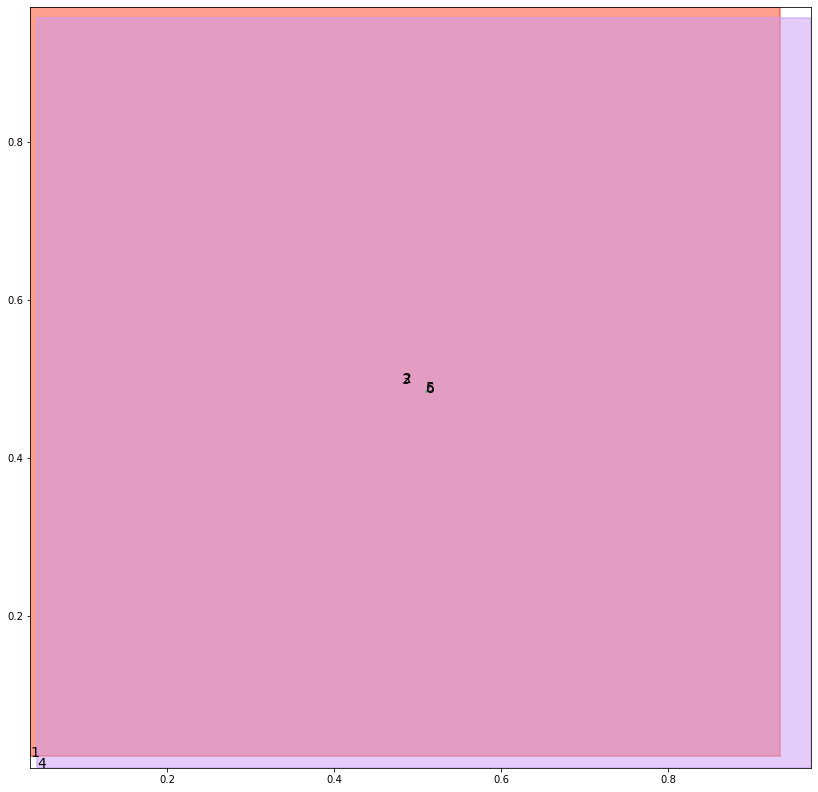

alignment data:
tensor(2) 0.05116605758666992 -0.5360636711120605 tensor(0.0513585805892944) tensor(-0.5359728336334229)
tensor(3) 0.05088210105895996 -0.5361901521682739 tensor(0.0512670278549194) tensor(-0.5360051989555359)
tensor(5) 0.05061984062194824 -0.5365848541259766 tensor(0.0509355068206787) tensor(-0.5364384055137634)
tensor(6) 0.05054068565368652 -0.5366221070289612 tensor(0.0510059595108032) tensor(-0.5364265441894531)


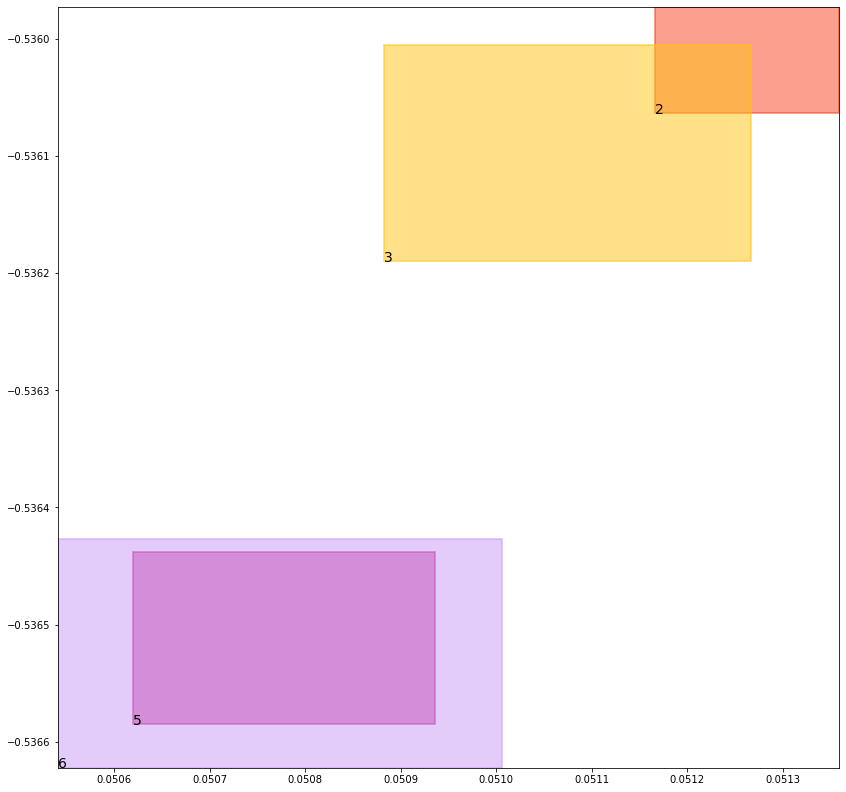

batch (tensor([[1, 2],
        [2, 6],
        [3, 5],
        [1, 3],
        [5, 3],
        [6, 2],
        [4, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [3, 5],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070978468284011, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065855989232659, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509982585906982, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646816968917847, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03604526072740555 0.02188599668443203 tensor(0.9341845512390137) tensor(0.9710704088211060)
tensor(2) 0.4819456934928894 0.4948422908782959 tensor(0.4834547042846680) tensor(0.4954202473163605)
tensor(3) 0.48101261258125305 0.49443551898002625 tensor(0.4814980924129486) tensor(0.4957592785358429)
tensor(4) 0.04442480206489563 0.007427184842526913 tensor(0.9714814424514771) tensor(0.9566087126731873)
tensor(5) 0.5094153881072998 0.4835456609725952 tensor(0.5105597376823425) tensor(0.4841270148754120)
tensor(6) 0.5096573829650879 0.4829440116882324 tensor(0.5122326016426086) tensor(0.4839829802513123)


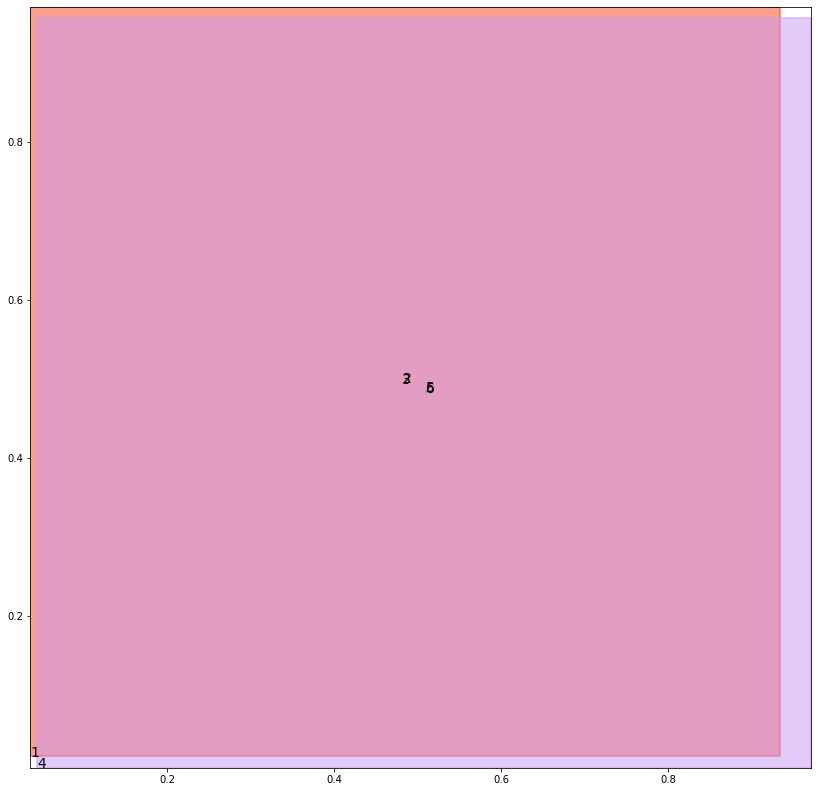

alignment data:
tensor(2) 0.05095255374908447 -0.510174572467804 tensor(0.0512404441833496) tensor(-0.5100503563880920)
tensor(3) 0.05076181888580322 -0.5102576017379761 tensor(0.0511505603790283) tensor(-0.5100752115249634)
tensor(5) 0.05051124095916748 -0.5106438398361206 tensor(0.0507668256759644) tensor(-0.5105316638946533)
tensor(6) 0.05037665367126465 -0.5107107162475586 tensor(0.0508816242218018) tensor(-0.5104922056198120)


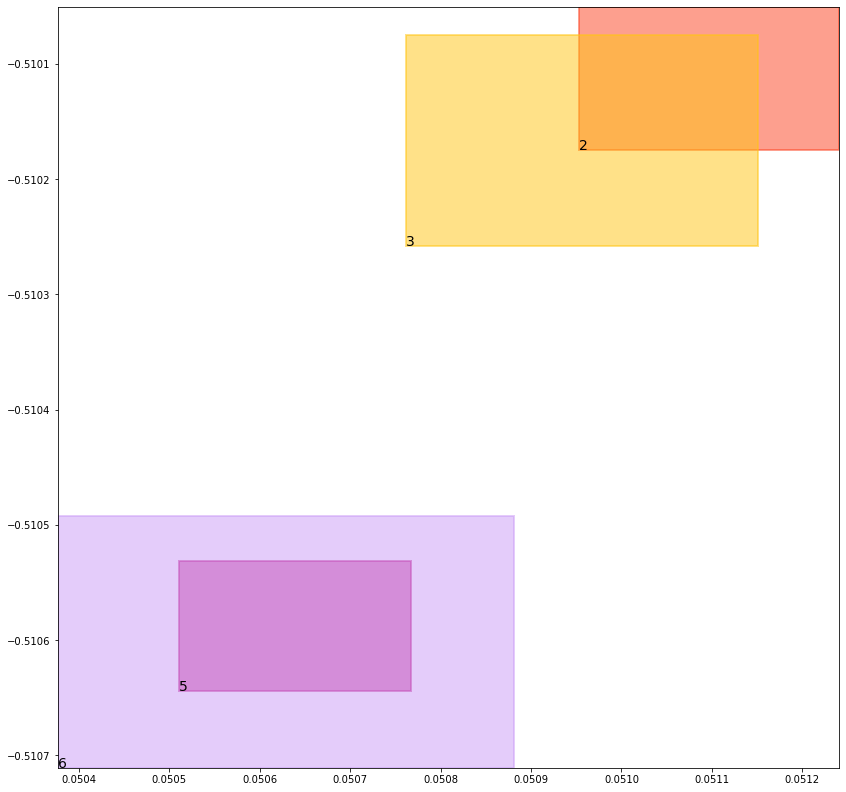

batch (tensor([[3, 5],
        [5, 3],
        [6, 2],
        [1, 3],
        [4, 5],
        [1, 2],
        [2, 6],
        [4, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0071051106788218, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065802293829620, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509973943233490, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646827399730682, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.036001645028591156 0.02178994193673134 tensor(0.9344166517257690) tensor(0.9711210727691650)
tensor(2) 0.48185932636260986 0.4944853186607361 tensor(0.4839804172515869) tensor(0.4955061078071594)
tensor(3) 0.48117953538894653 0.4948173463344574 tensor(0.4815580248832703) tensor(0.4953042268753052)
tensor(4) 0.044235728681087494 0.0073902602307498455 tensor(0.9715069532394409) tensor(0.9566683769226074)
tensor(5) 0.5091623067855835 0.48331788182258606 tensor(0.5107299685478210) tensor(0.4838047921657562)
tensor(6) 0.5101999640464783 0.4833216071128845 tensor(0.5117310881614685) tensor(0.4838770031929016)


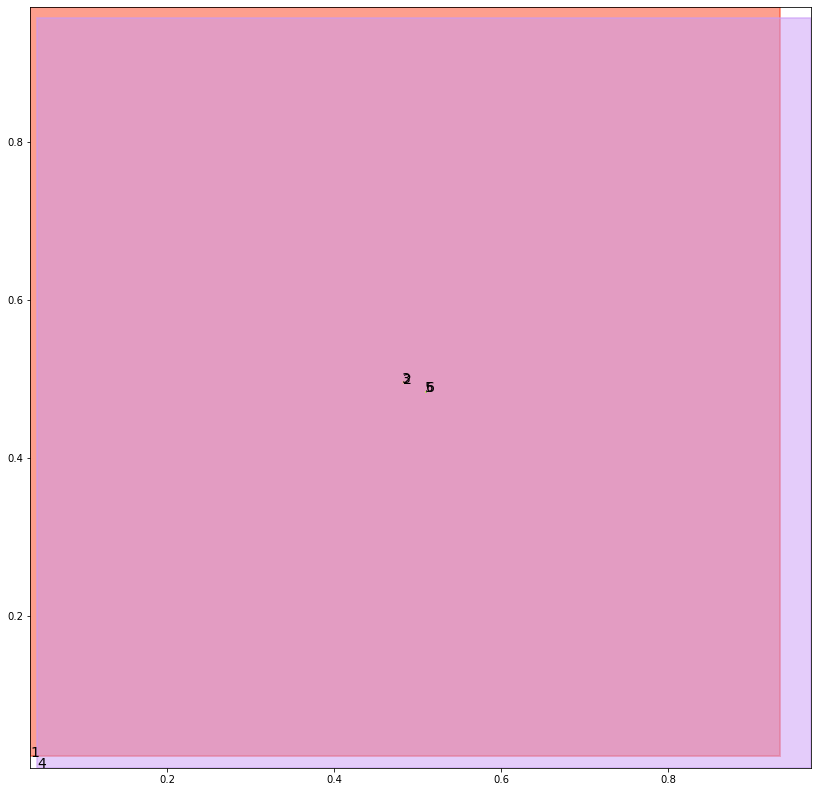

alignment data:
tensor(2) 0.04766690731048584 -0.49837249517440796 tensor(0.0481263399124146) tensor(-0.4981715381145477)
tensor(3) 0.0476914644241333 -0.49835434556007385 tensor(0.0478528738021851) tensor(-0.4982803761959076)
tensor(5) 0.04724609851837158 -0.498828262090683 tensor(0.0475157499313354) tensor(-0.4987132251262665)
tensor(6) 0.04734170436859131 -0.49879199266433716 tensor(0.0476260185241699) tensor(-0.4986696541309357)


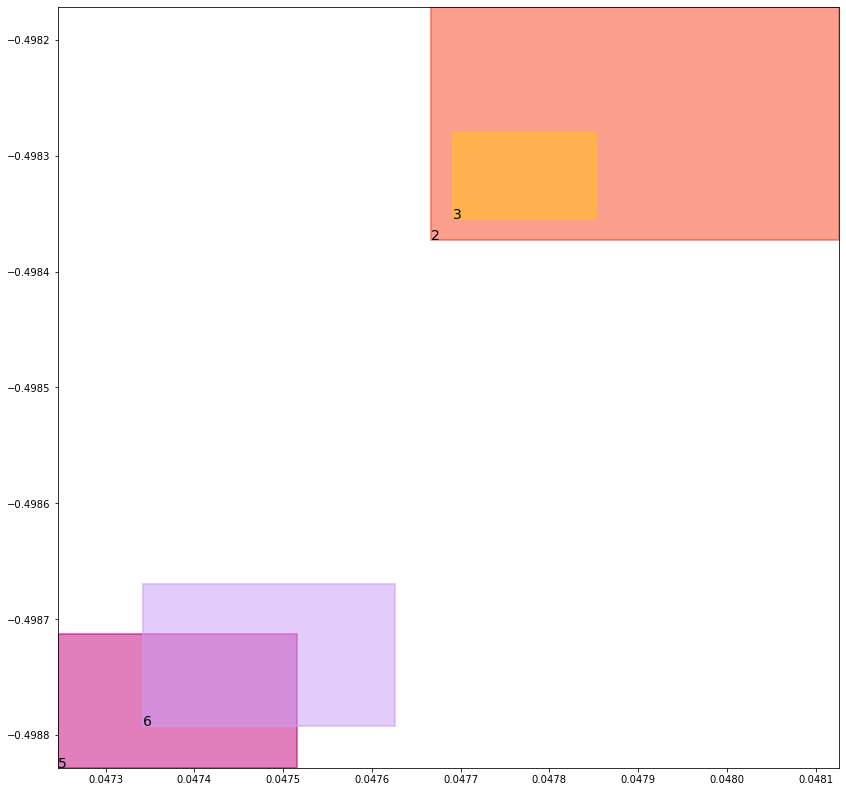

batch (tensor([[2, 6],
        [5, 3],
        [4, 5],
        [4, 6],
        [1, 3],
        [1, 2],
        [6, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070989280939102, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065655596554279, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999871253967, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646644711494446, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03595811501145363 0.021694600582122803 tensor(0.9346476793289185) tensor(0.9711716771125793)
tensor(2) 0.48208728432655334 0.49466371536254883 tensor(0.4838219881057739) tensor(0.4953881800174713)
tensor(3) 0.48130571842193604 0.49453842639923096 tensor(0.4815960228443146) tensor(0.4955021739006042)
tensor(4) 0.04404797777533531 0.007353643421083689 tensor(0.9715325236320496) tensor(0.9567279815673828)
tensor(5) 0.5093560218811035 0.48311933875083923 tensor(0.5101727843284607) tensor(0.4838783442974091)
tensor(6) 0.511023998260498 0.48360490798950195 tensor(0.5110809803009033) tensor(0.4842260479927063)


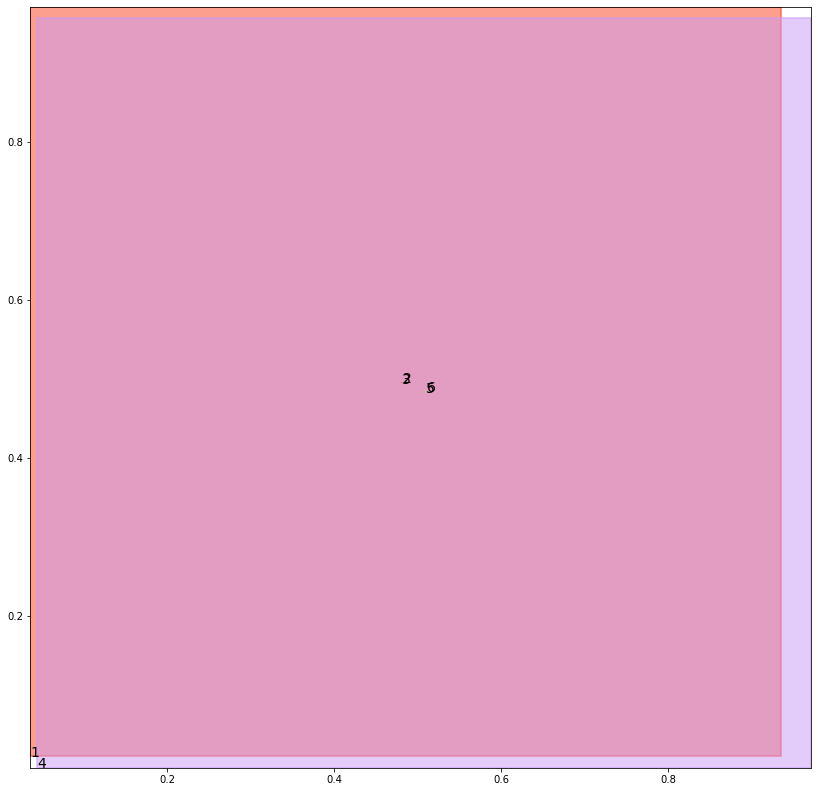

alignment data:
tensor(2) 0.04186296463012695 -0.47799059748649597 tensor(0.0422105789184570) tensor(-0.4778398871421814)
tensor(3) 0.04175901412963867 -0.47803327441215515 tensor(0.0420367717742920) tensor(-0.4779026508331299)
tensor(5) 0.04134345054626465 -0.4784914553165436 tensor(0.0416162014007568) tensor(-0.4783681631088257)
tensor(6) 0.04162263870239258 -0.4783729314804077 tensor(0.0417897701263428) tensor(-0.4782932400703430)


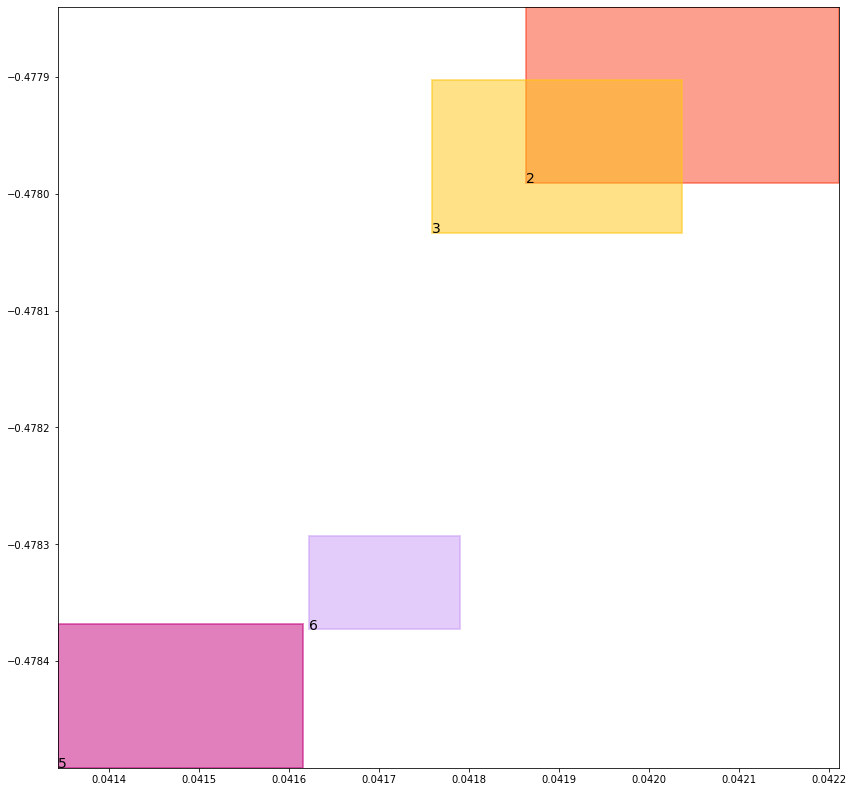

batch (tensor([[5, 3],
        [4, 6],
        [1, 3],
        [1, 2],
        [6, 2],
        [2, 6],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070880623534322, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065448312088847, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510009706020355, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646338641643524, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03591465950012207 0.021599965170025826 tensor(0.9348773956298828) tensor(0.9712221622467041)
tensor(2) 0.48259881138801575 0.4950876533985138 tensor(0.4830490052700043) tensor(0.4953268468379974)
tensor(3) 0.4814077913761139 0.49419474601745605 tensor(0.4817241728305817) tensor(0.4957652091979980)
tensor(4) 0.043861620128154755 0.007317332085222006 tensor(0.9715579152107239) tensor(0.9567874073982239)
tensor(5) 0.5089640021324158 0.4834722876548767 tensor(0.5099515914916992) tensor(0.4837850332260132)
tensor(6) 0.5106250047683716 0.4835394024848938 tensor(0.5114634037017822) tensor(0.4844864606857300)


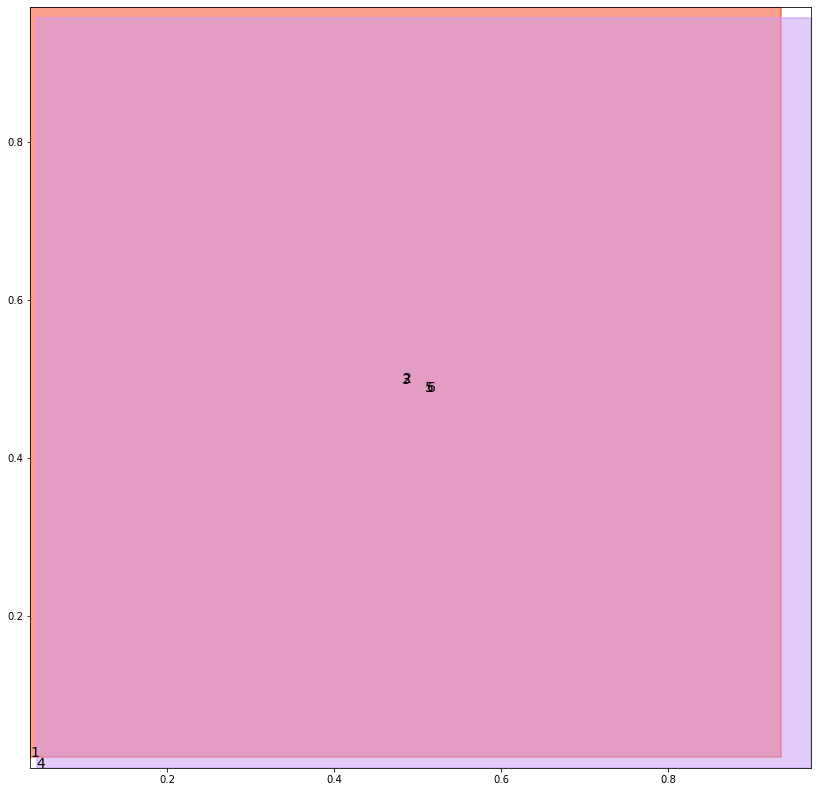

alignment data:
tensor(2) 0.0367048978805542 -0.46447673439979553 tensor(0.0368086099624634) tensor(-0.4644311070442200)
tensor(3) 0.03636276721954346 -0.46462973952293396 tensor(0.0368016958236694) tensor(-0.4644222855567932)
tensor(5) 0.0360870361328125 -0.46501442790031433 tensor(0.0362590551376343) tensor(-0.4649409949779510)
tensor(6) 0.03625643253326416 -0.4649483263492584 tensor(0.0365804433822632) tensor(-0.4648007452487946)


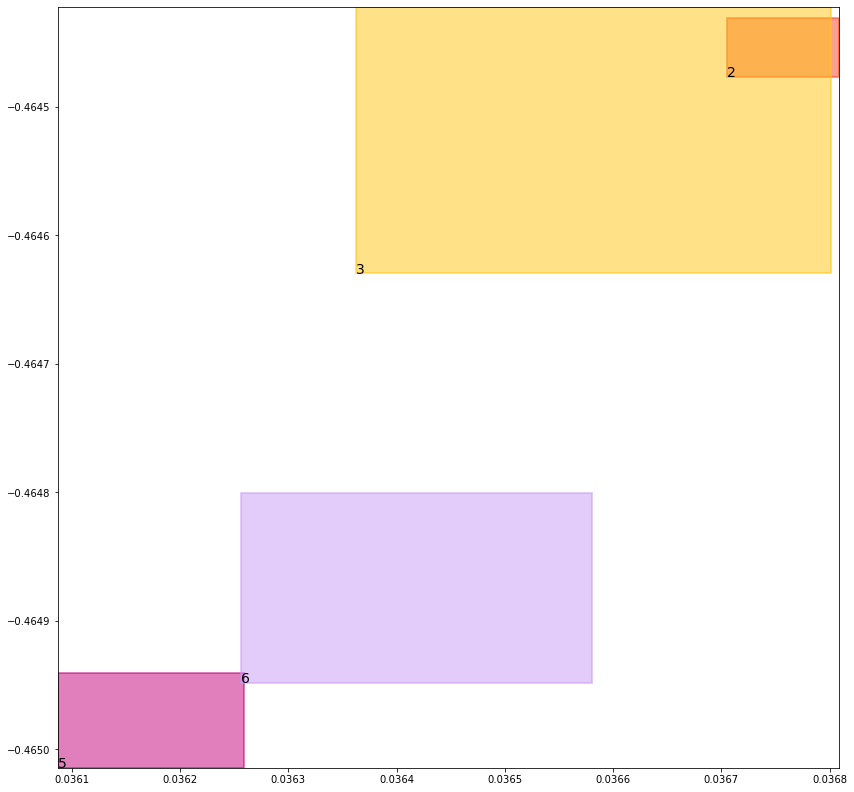

batch (tensor([[1, 2],
        [4, 6],
        [1, 3],
        [4, 5],
        [3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070693637244403, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065465108491480, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510010898113251, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646169662475586, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035871293395757675 0.02150602824985981 tensor(0.9351057410240173) tensor(0.9712725281715393)
tensor(2) 0.4817293882369995 0.4950028955936432 tensor(0.4833640456199646) tensor(0.4954186081886292)
tensor(3) 0.48159176111221313 0.49423715472221375 tensor(0.4818302690982819) tensor(0.4956431686878204)
tensor(4) 0.04367661103606224 0.007281328551471233 tensor(0.9715834856033325) tensor(0.9568468928337097)
tensor(5) 0.5085617303848267 0.483542799949646 tensor(0.5100569725036621) tensor(0.4843152165412903)
tensor(6) 0.510505735874176 0.48366329073905945 tensor(0.5113925933837891) tensor(0.4841558933258057)


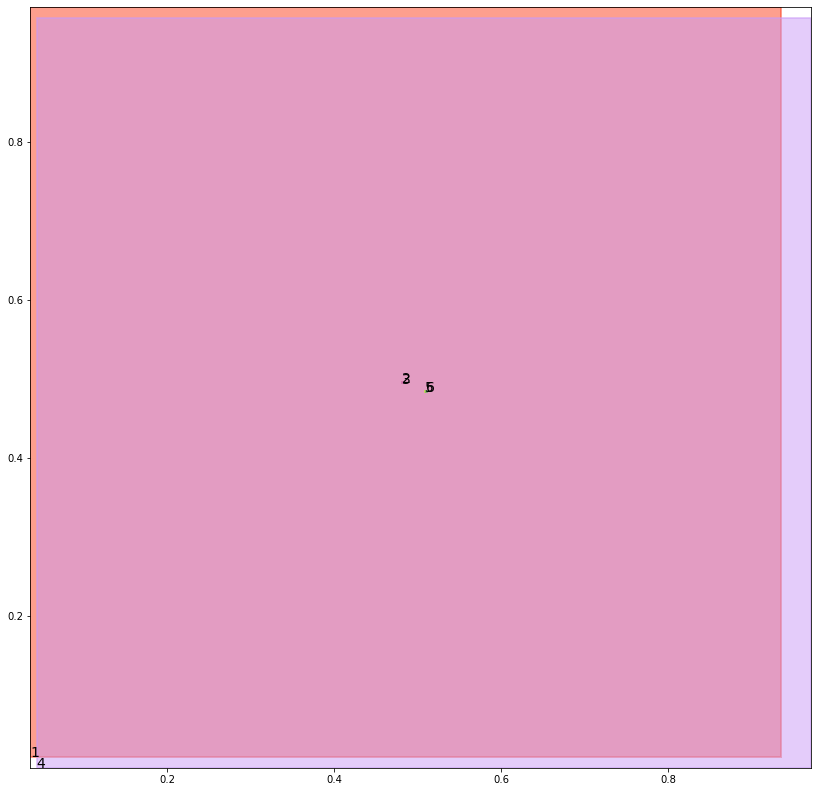

alignment data:
tensor(2) 0.03292214870452881 -0.4316692352294922 tensor(0.0331805944442749) tensor(-0.4315603077411652)
tensor(3) 0.032709598541259766 -0.43176981806755066 tensor(0.0330985784530640) tensor(-0.4315856397151947)
tensor(5) 0.032390594482421875 -0.4321678876876831 tensor(0.0327293872833252) tensor(-0.4320192039012909)
tensor(6) 0.03260040283203125 -0.4320851266384125 tensor(0.0328103303909302) tensor(-0.4319926202297211)


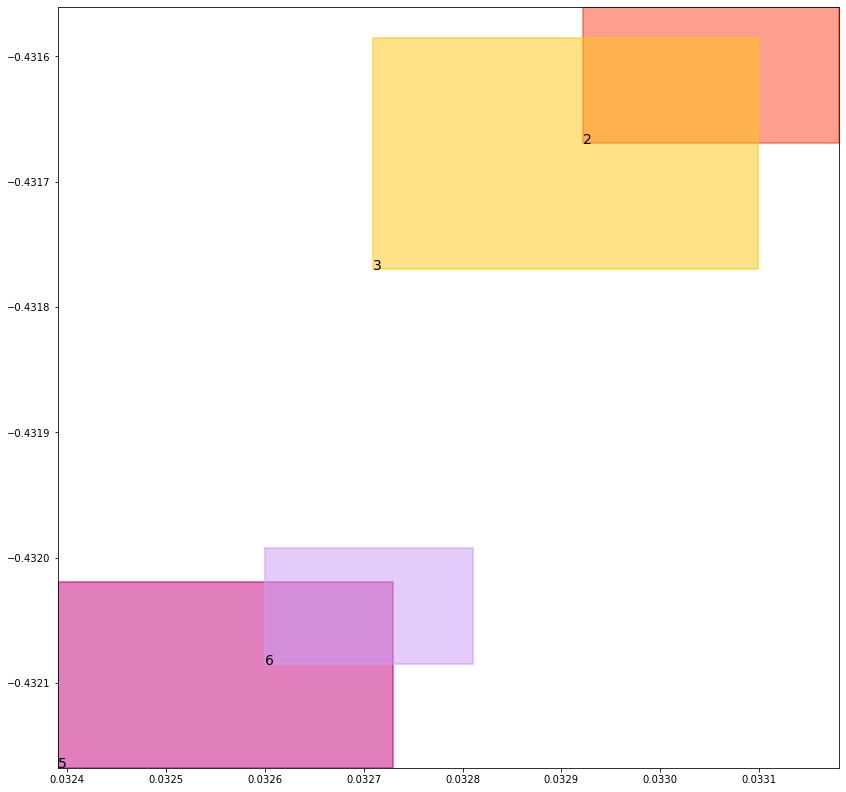

batch (tensor([[6, 2],
        [4, 6],
        [3, 5],
        [4, 5],
        [5, 3],
        [2, 6],
        [1, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070726955309510, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065462710335851, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509995996952057, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646185755729675, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03582800552248955 0.021412787958979607 tensor(0.9353327751159668) tensor(0.9713228344917297)
tensor(2) 0.48119959235191345 0.4949887990951538 tensor(0.4837626516819000) tensor(0.4951145648956299)
tensor(3) 0.4817386269569397 0.49462684988975525 tensor(0.4819045066833496) tensor(0.4951785504817963)
tensor(4) 0.043492887169122696 0.0072456286288797855 tensor(0.9716089367866516) tensor(0.9569063186645508)
tensor(5) 0.5088899731636047 0.4834873378276825 tensor(0.5097181797027588) tensor(0.4845536351203918)
tensor(6) 0.5106384754180908 0.4833005964756012 tensor(0.5109138488769531) tensor(0.4839563071727753)


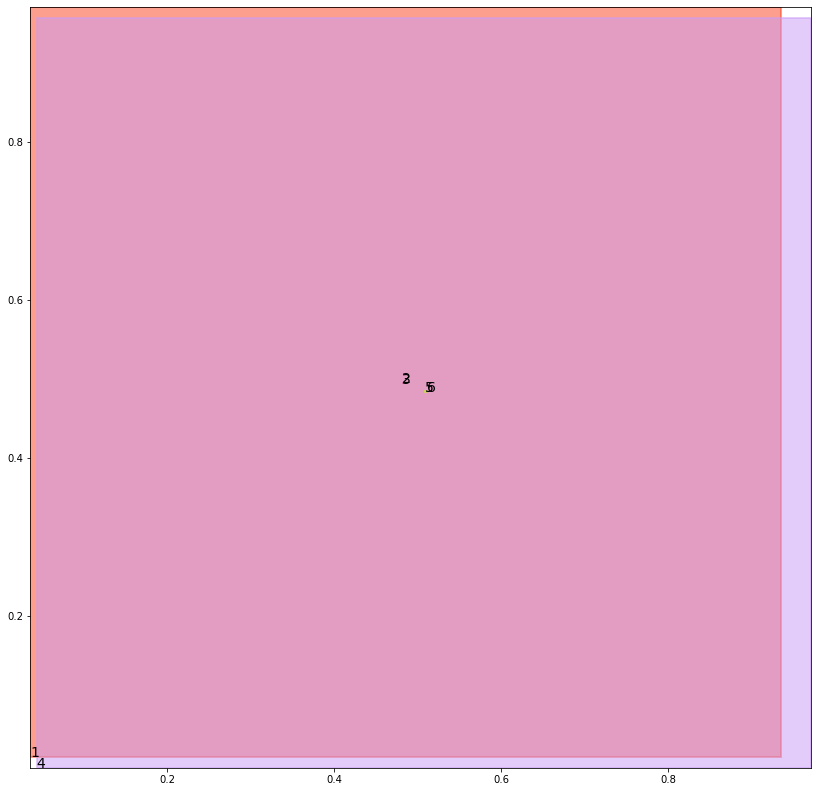

alignment data:
tensor(2) 0.028589844703674316 -0.39569541811943054 tensor(0.0288581848144531) tensor(-0.3955900967121124)
tensor(3) 0.02854466438293457 -0.3957218825817108 tensor(0.0287041664123535) tensor(-0.3956470489501953)
tensor(5) 0.02812957763671875 -0.3961658775806427 tensor(0.0284842252731323) tensor(-0.3960036337375641)
tensor(6) 0.028241395950317383 -0.3961281180381775 tensor(0.0284380912780762) tensor(-0.3960364758968353)


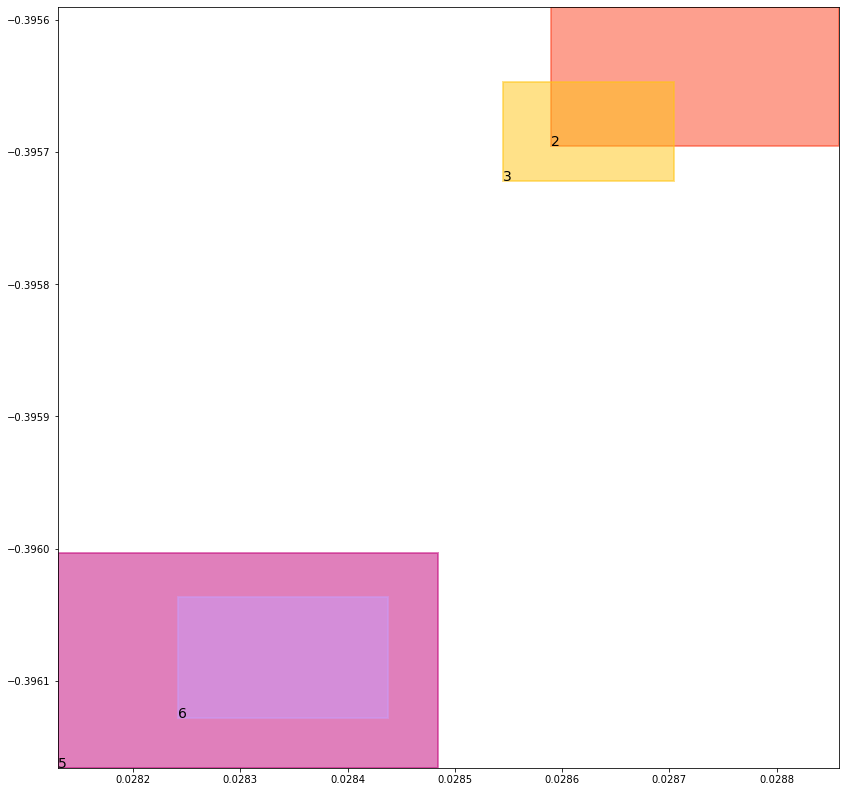

batch (tensor([[3, 5],
        [5, 3],
        [4, 6],
        [1, 2],
        [1, 3],
        [4, 5],
        [2, 6],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070648319087923, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065338518470526, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510014772415161, grad_fn=<MulBackward0>)
previous loss: tensor(0.2646001577377319, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0357847735285759 0.021320251747965813 tensor(0.9355585575103760) tensor(0.9713729619979858)
tensor(2) 0.48138582706451416 0.4950212240219116 tensor(0.4838294684886932) tensor(0.4950976073741913)
tensor(3) 0.48166537284851074 0.49441081285476685 tensor(0.4821369946002960) tensor(0.4953252077102661)
tensor(4) 0.0433105006814003 0.007210225332528353 tensor(0.9716342091560364) tensor(0.9569655656814575)
tensor(5) 0.508978545665741 0.48360180854797363 tensor(0.5098748803138733) tensor(0.4842388927936554)
tensor(6) 0.5100691318511963 0.48309698700904846 tensor(0.5109981894493103) tensor(0.4840420186519623)


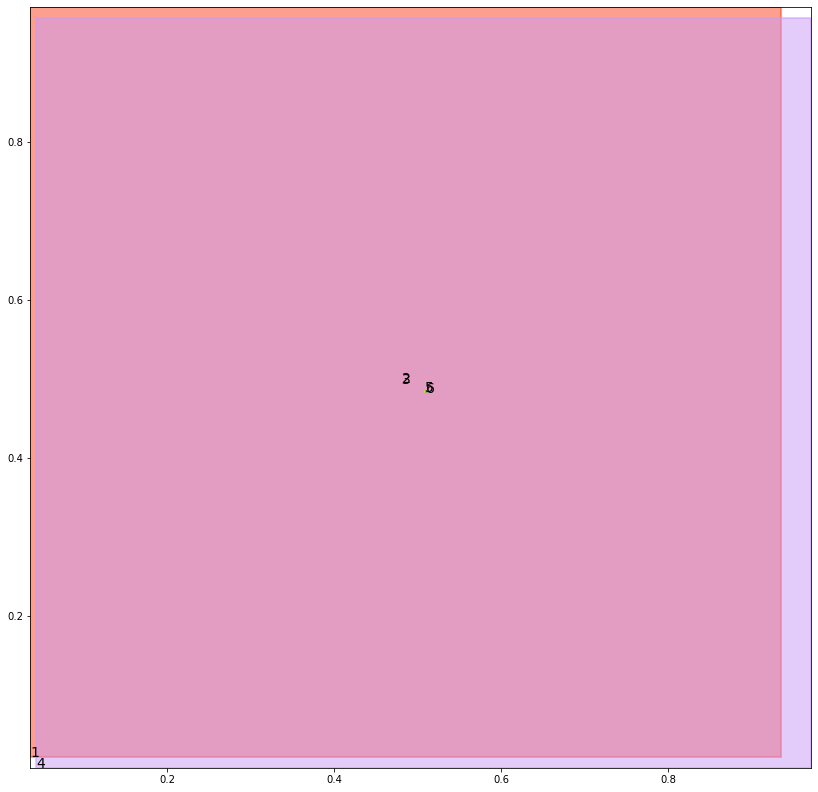

alignment data:
tensor(2) 0.024849891662597656 -0.34601128101348877 tensor(0.0250949859619141) tensor(-0.3459160923957825)
tensor(3) 0.02471613883972168 -0.3460777699947357 tensor(0.0249986648559570) tensor(-0.3459469676017761)
tensor(5) 0.024405717849731445 -0.3464711904525757 tensor(0.0246548652648926) tensor(-0.3463601171970367)
tensor(6) 0.02437424659729004 -0.346496045589447 tensor(0.0247068405151367) tensor(-0.3463453650474548)


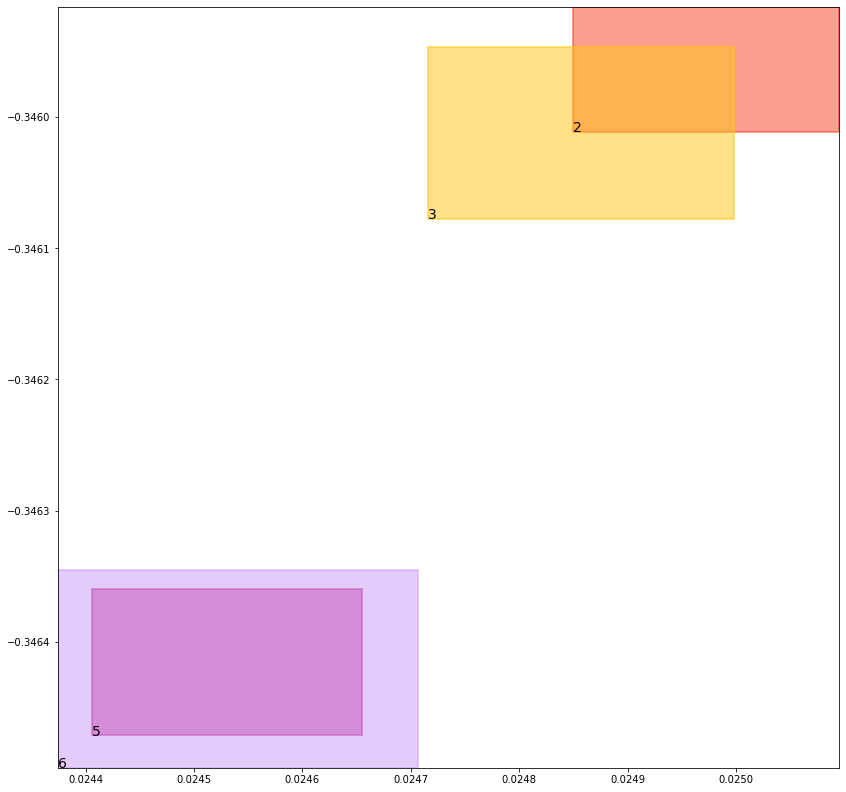

batch (tensor([[2, 6],
        [5, 3],
        [1, 3],
        [6, 2],
        [4, 6],
        [1, 2],
        [3, 5],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070614702999592, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065334914252162, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510004639625549, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645954191684723, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03574160486459732 0.021228400990366936 tensor(0.9357829093933105) tensor(0.9714229106903076)
tensor(2) 0.48221588134765625 0.4946838319301605 tensor(0.4835970103740692) tensor(0.4951232671737671)
tensor(3) 0.4817802906036377 0.4940652847290039 tensor(0.4822482466697693) tensor(0.4955977797508240)
tensor(4) 0.043129414319992065 0.007175108417868614 tensor(0.9716596603393555) tensor(0.9570248723030090)
tensor(5) 0.5087329149246216 0.4834320545196533 tensor(0.5100543498992920) tensor(0.4838682413101196)
tensor(6) 0.5097001194953918 0.483488529920578 tensor(0.5110675096511841) tensor(0.4839400947093964)


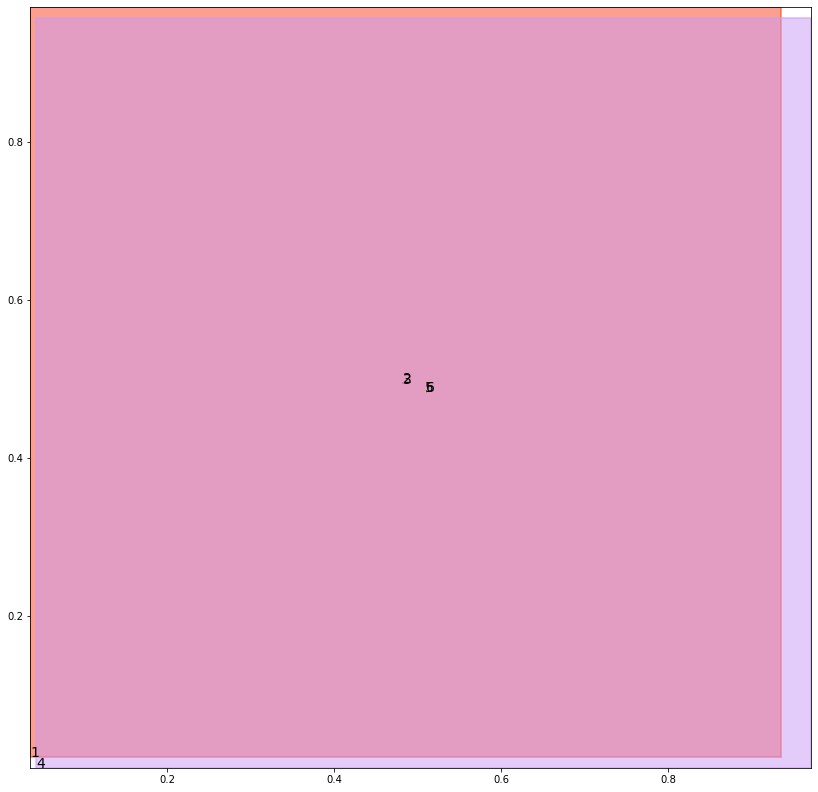

alignment data:
tensor(2) 0.022474169731140137 -0.2964976131916046 tensor(0.0227166414260864) tensor(-0.2963941693305969)
tensor(3) 0.022272348403930664 -0.29659023880958557 tensor(0.0227161645889282) tensor(-0.2963823378086090)
tensor(5) 0.02197873592376709 -0.29697051644325256 tensor(0.0222147703170776) tensor(-0.2968696057796478)
tensor(6) 0.022082924842834473 -0.29692941904067993 tensor(0.0223270654678345) tensor(-0.2968249917030334)


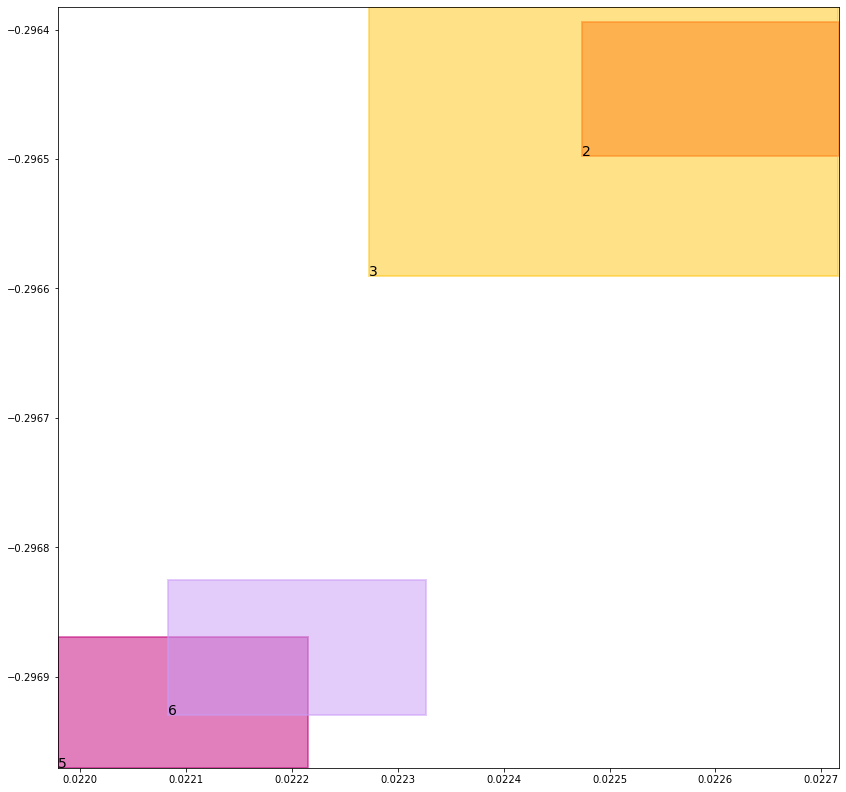

batch (tensor([[3, 5],
        [4, 5],
        [2, 6],
        [1, 3],
        [1, 2],
        [4, 6],
        [6, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [6, 2],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070512355305254, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065305223688483, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999573230743, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645817101001740, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035698506981134415 0.021137205883860588 tensor(0.9360060691833496) tensor(0.9714728593826294)
tensor(2) 0.48309558629989624 0.494808554649353 tensor(0.4836224913597107) tensor(0.4950211048126221)
tensor(3) 0.4820999205112457 0.4941028952598572 tensor(0.4822145998477936) tensor(0.4954803884029388)
tensor(4) 0.04294956102967262 0.007140283472836018 tensor(0.9716849923133850) tensor(0.9570840597152710)
tensor(5) 0.5089335441589355 0.4832325577735901 tensor(0.5095073580741882) tensor(0.4839490354061127)
tensor(6) 0.5097610950469971 0.48366889357566833 tensor(0.5108743906021118) tensor(0.4844105243682861)


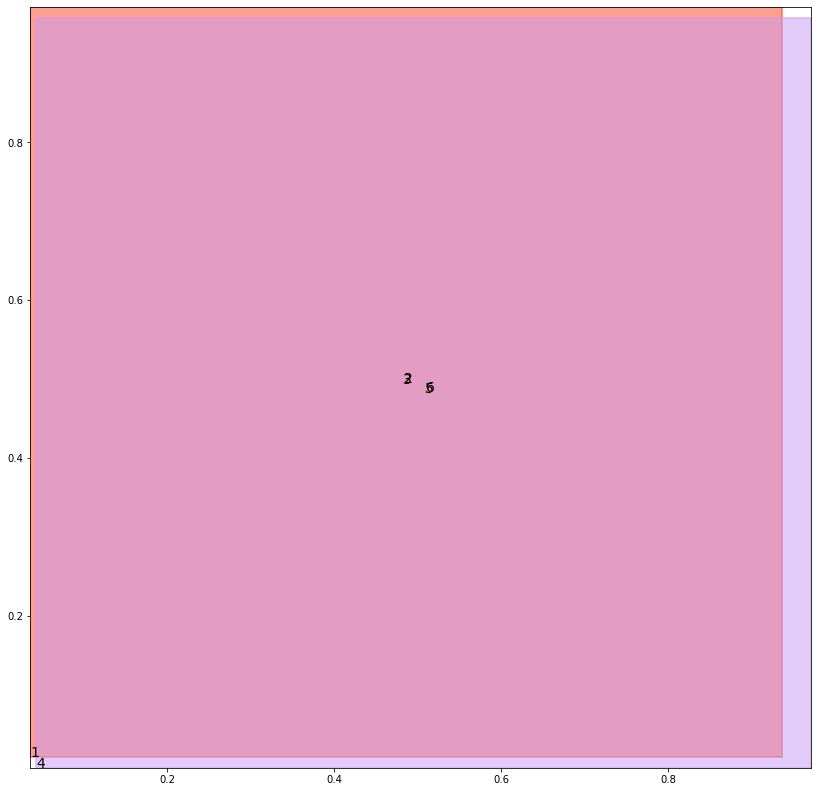

alignment data:
tensor(2) 0.022391200065612793 -0.26965248584747314 tensor(0.0224955081939697) tensor(-0.2696073949337006)
tensor(3) 0.02211451530456543 -0.26977574825286865 tensor(0.0224853754043579) tensor(-0.2695997357368469)
tensor(5) 0.021752238273620605 -0.27018600702285767 tensor(0.0219926834106445) tensor(-0.2700763642787933)
tensor(6) 0.021942973136901855 -0.2701023519039154 tensor(0.0222398042678833) tensor(-0.2699704766273499)


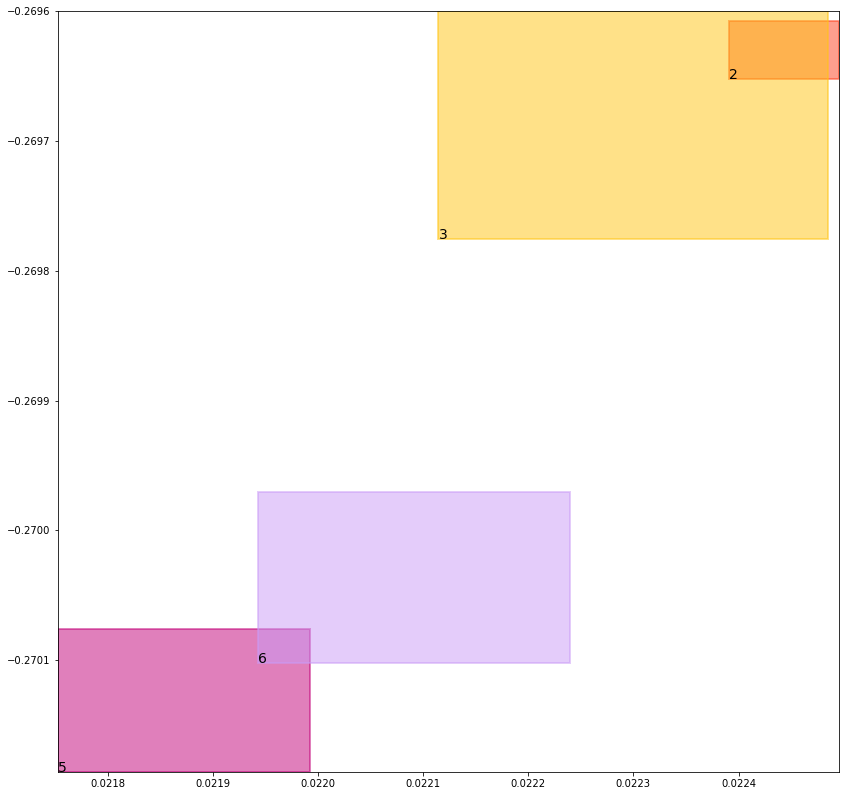

batch (tensor([[5, 3],
        [6, 2],
        [1, 3],
        [1, 2],
        [4, 5],
        [4, 6],
        [2, 6],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [6, 2],
        [2, 6],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070288162678480, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065218228846788, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510012686252594, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645519077777863, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03565549850463867 0.02104666270315647 tensor(0.9362279176712036) tensor(0.9715226292610168)
tensor(2) 0.4829477369785309 0.4947368800640106 tensor(0.4842665791511536) tensor(0.4954161345958710)
tensor(3) 0.4822322726249695 0.49448418617248535 tensor(0.4822984933853149) tensor(0.4950117766857147)
tensor(4) 0.04277098551392555 0.007105744909495115 tensor(0.9717103242874146) tensor(0.9571431279182434)
tensor(5) 0.5083085298538208 0.48358550667762756 tensor(0.5095360279083252) tensor(0.4838618338108063)
tensor(6) 0.5102097988128662 0.483608216047287 tensor(0.5104441642761230) tensor(0.4846755862236023)


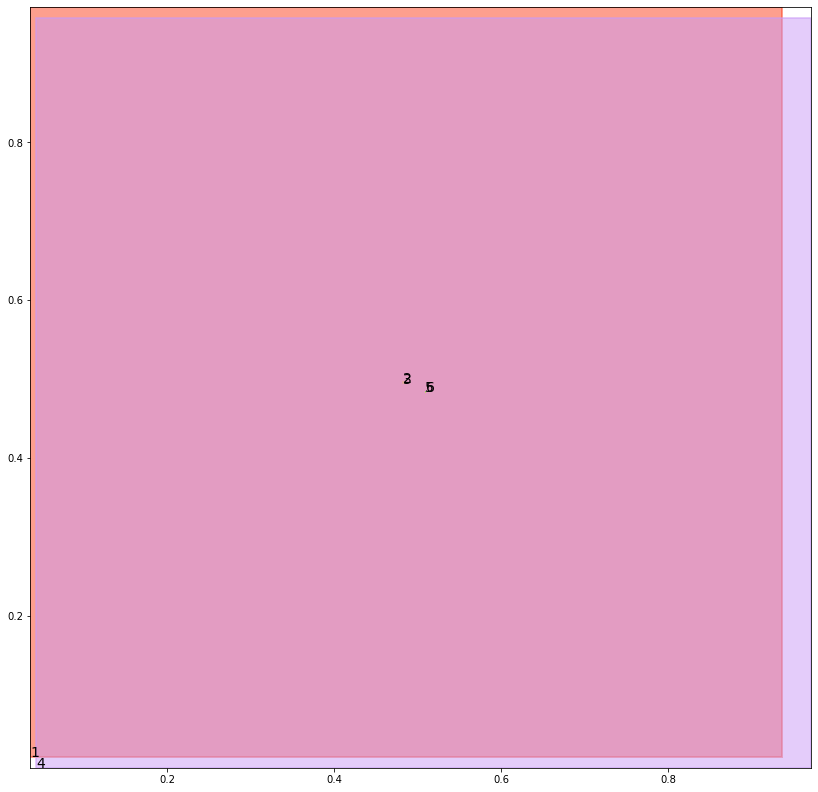

alignment data:
tensor(2) 0.02116084098815918 -0.2502899169921875 tensor(0.0214607715606689) tensor(-0.2501584887504578)
tensor(3) 0.02102839946746826 -0.25034672021865845 tensor(0.0211726427078247) tensor(-0.2502785325050354)
tensor(5) 0.020592927932739258 -0.2507835924625397 tensor(0.0207790136337280) tensor(-0.2507056891918182)
tensor(6) 0.02077507972717285 -0.2507134675979614 tensor(0.0210759639739990) tensor(-0.2505720853805542)


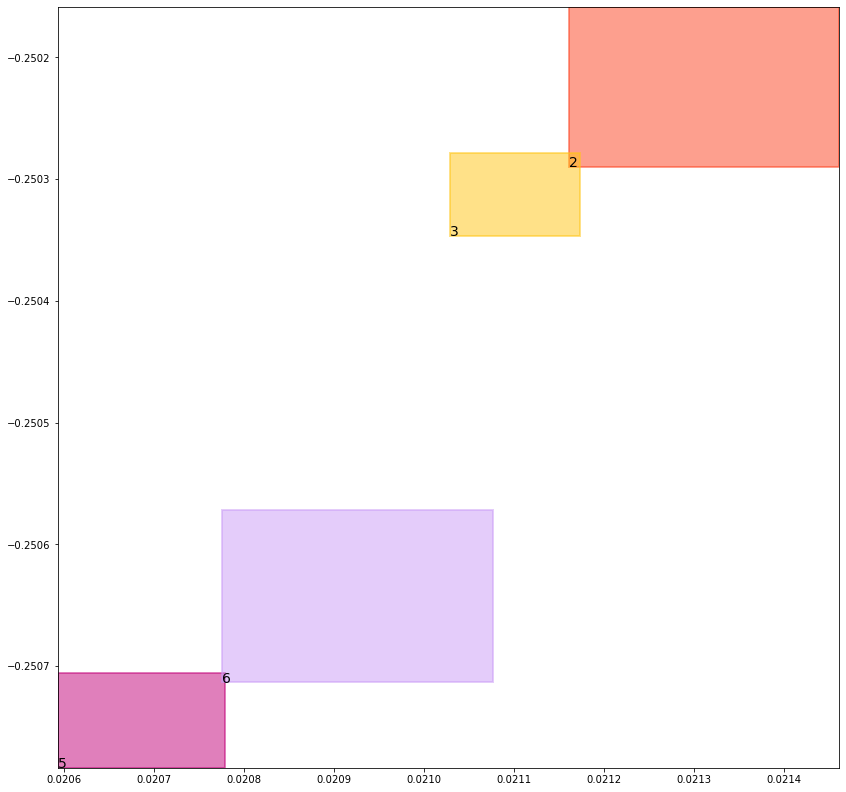

batch (tensor([[4, 6],
        [1, 2],
        [5, 3],
        [4, 5],
        [6, 2],
        [3, 5],
        [2, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[5, 3],
        [6, 2],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070259347558022, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065142037346959, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510019540786743, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645421028137207, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03561258316040039 0.020956790074706078 tensor(0.9364485740661621) tensor(0.9715722203254700)
tensor(2) 0.4831197261810303 0.49466919898986816 tensor(0.4842180907726288) tensor(0.4954484999179840)
tensor(3) 0.48206672072410583 0.49423086643218994 tensor(0.4826174676418304) tensor(0.4951720237731934)
tensor(4) 0.042593661695718765 0.007071491330862045 tensor(0.9717356562614441) tensor(0.9572021961212158)
tensor(5) 0.5079200863838196 0.48362210392951965 tensor(0.5096450448036194) tensor(0.4844373464584351)
tensor(6) 0.5098015069961548 0.4837368130683899 tensor(0.5110056400299072) tensor(0.4843505024909973)


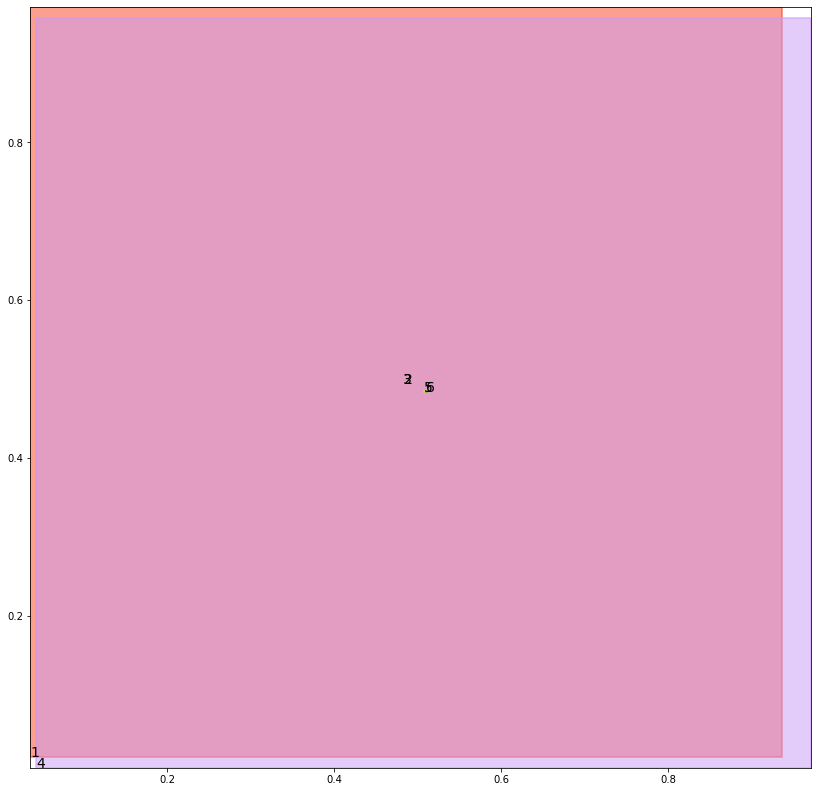

alignment data:
tensor(2) 0.020064592361450195 -0.23443275690078735 tensor(0.0203704833984375) tensor(-0.2342966198921204)
tensor(3) 0.019852161407470703 -0.23452475666999817 tensor(0.0201495885848999) tensor(-0.2343879044055939)
tensor(5) 0.01947641372680664 -0.2349296510219574 tensor(0.0198497772216797) tensor(-0.2347667813301086)
tensor(6) 0.01968097686767578 -0.23484858870506287 tensor(0.0199534893035889) tensor(-0.2347293198108673)


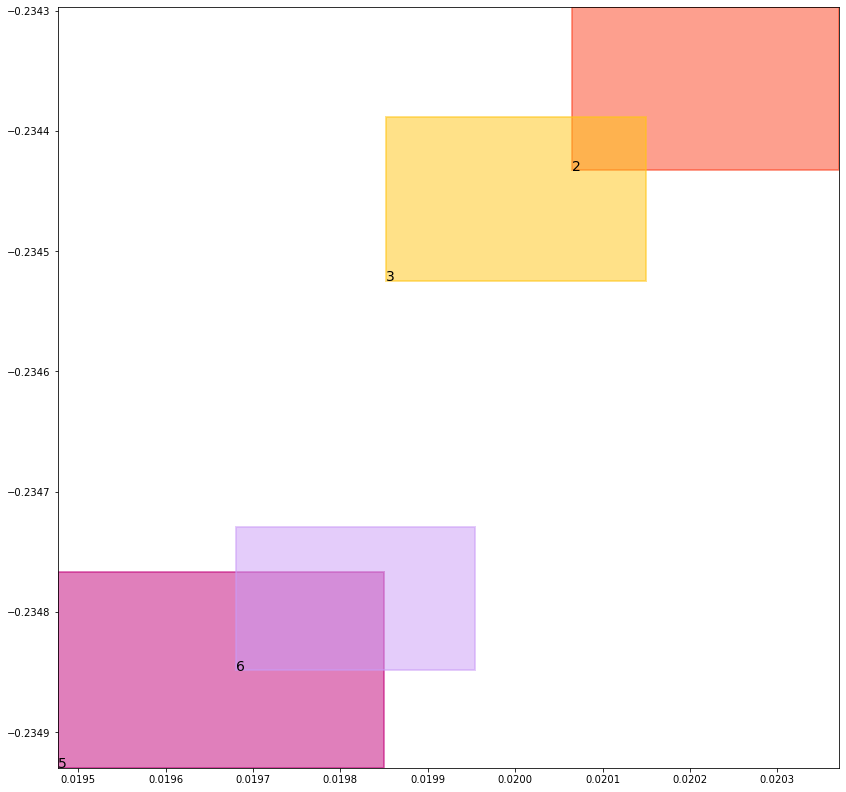

batch (tensor([[1, 3],
        [4, 6],
        [4, 5],
        [6, 2],
        [2, 6],
        [5, 3],
        [1, 2],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070248842239380, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065219430252910, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509990930557251, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645459175109863, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035569749772548676 0.02086756005883217 tensor(0.9366679191589355) tensor(0.9716218709945679)
tensor(2) 0.4835457503795624 0.4947972297668457 tensor(0.4835799932479858) tensor(0.4949600696563721)
tensor(3) 0.48218825459480286 0.4938780665397644 tensor(0.4827163517475128) tensor(0.4954395592212677)
tensor(4) 0.042417529970407486 0.007037526462227106 tensor(0.9717609882354736) tensor(0.9572612047195435)
tensor(5) 0.5082641243934631 0.48357072472572327 tensor(0.5093073844909668) tensor(0.4846769273281097)
tensor(6) 0.509463906288147 0.4834970533847809 tensor(0.5113069415092468) tensor(0.4840362668037415)


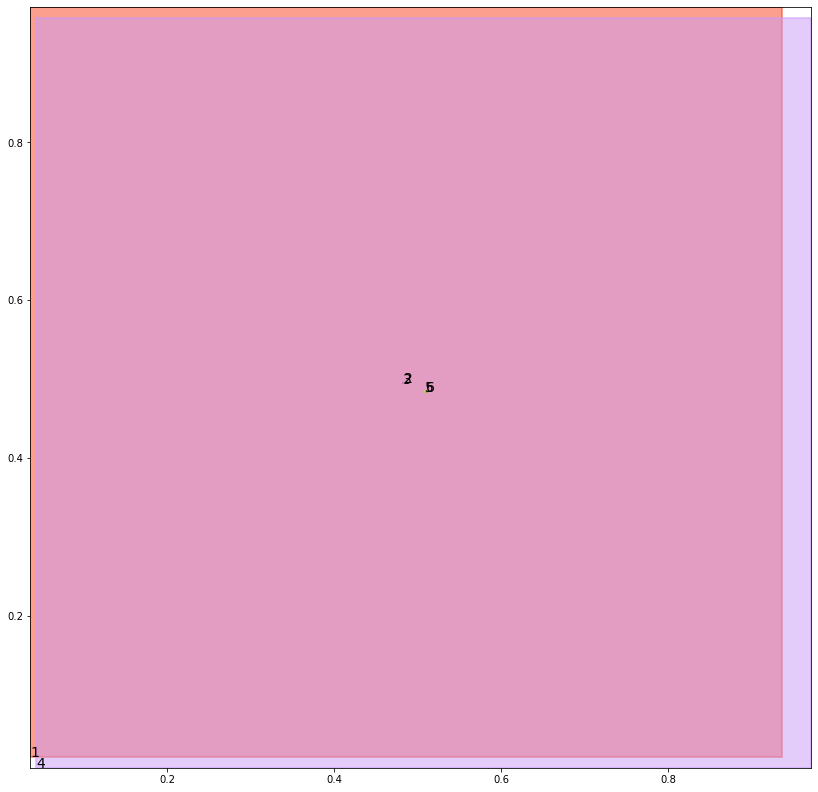

alignment data:
tensor(2) 0.019151926040649414 -0.2153659462928772 tensor(0.0191977024078369) tensor(-0.2153444588184357)
tensor(3) 0.01878499984741211 -0.21552878618240356 tensor(0.0192427635192871) tensor(-0.2153154313564301)
tensor(5) 0.01851332187652588 -0.21588456630706787 tensor(0.0188999176025391) tensor(-0.2157096266746521)
tensor(6) 0.018605709075927734 -0.21585097908973694 tensor(0.0189181566238403) tensor(-0.2157182395458221)


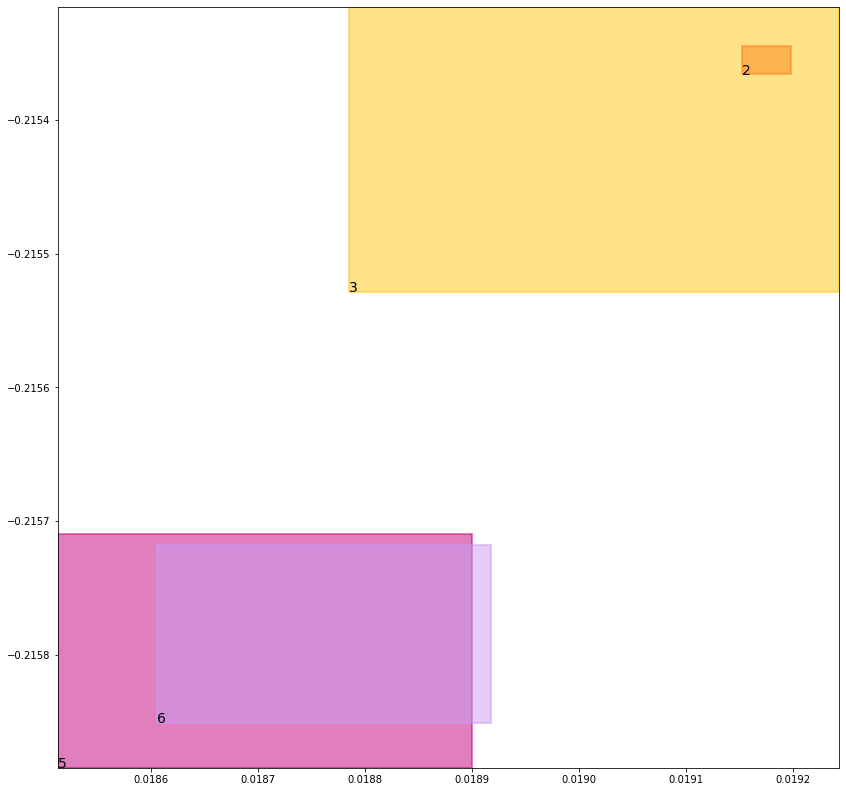

batch (tensor([[1, 2],
        [2, 6],
        [5, 3],
        [4, 6],
        [4, 5],
        [3, 5],
        [1, 3],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070072375237942, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065187327563763, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509994506835938, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645254135131836, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03552700951695442 0.02077895775437355 tensor(0.9368860721588135) tensor(0.9716712832450867)
tensor(2) 0.48358991742134094 0.4940100610256195 tensor(0.4837043583393097) tensor(0.4950993061065674)
tensor(3) 0.4825567305088043 0.49391600489616394 tensor(0.4826289117336273) tensor(0.4953253269195557)
tensor(4) 0.042242590337991714 0.007003835402429104 tensor(0.9717862010002136) tensor(0.9573200345039368)
tensor(5) 0.5085681080818176 0.4836882948875427 tensor(0.5092644691467285) tensor(0.4843633770942688)
tensor(6) 0.5094030499458313 0.4833056628704071 tensor(0.5111595988273621) tensor(0.4841244220733643)


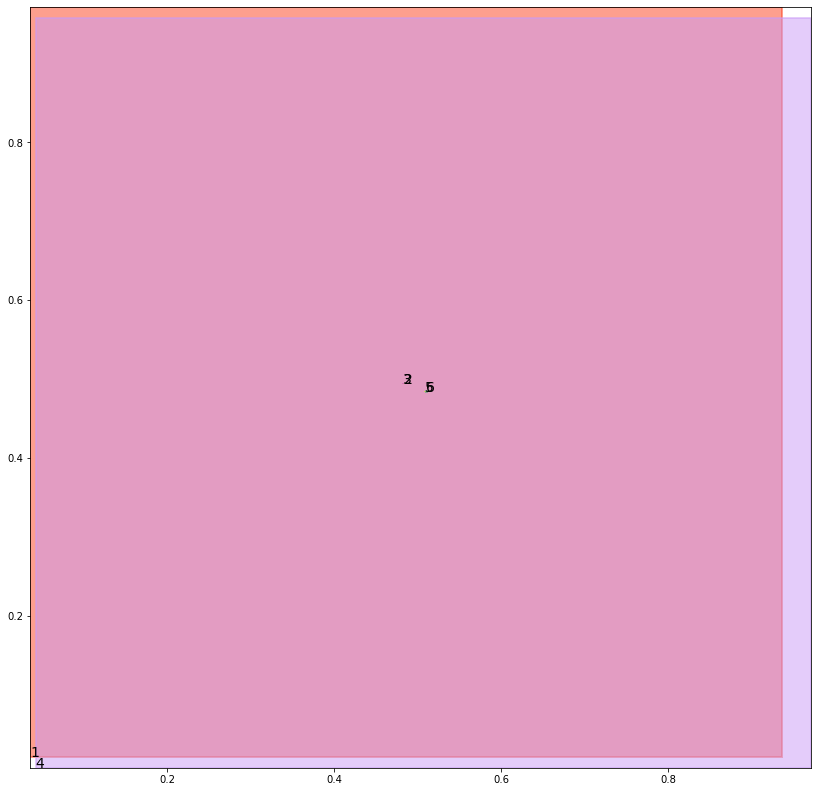

alignment data:
tensor(2) 0.020148754119873047 -0.18880534172058105 tensor(0.0204445123672485) tensor(-0.1886656582355499)
tensor(3) 0.020027875900268555 -0.188853919506073 tensor(0.0204033851623535) tensor(-0.1886759400367737)
tensor(5) 0.01977550983428955 -0.1891985833644867 tensor(0.0200170278549194) tensor(-0.1890896856784821)
tensor(6) 0.019753098487854004 -0.18921640515327454 tensor(0.0201312303543091) tensor(-0.1890517771244049)


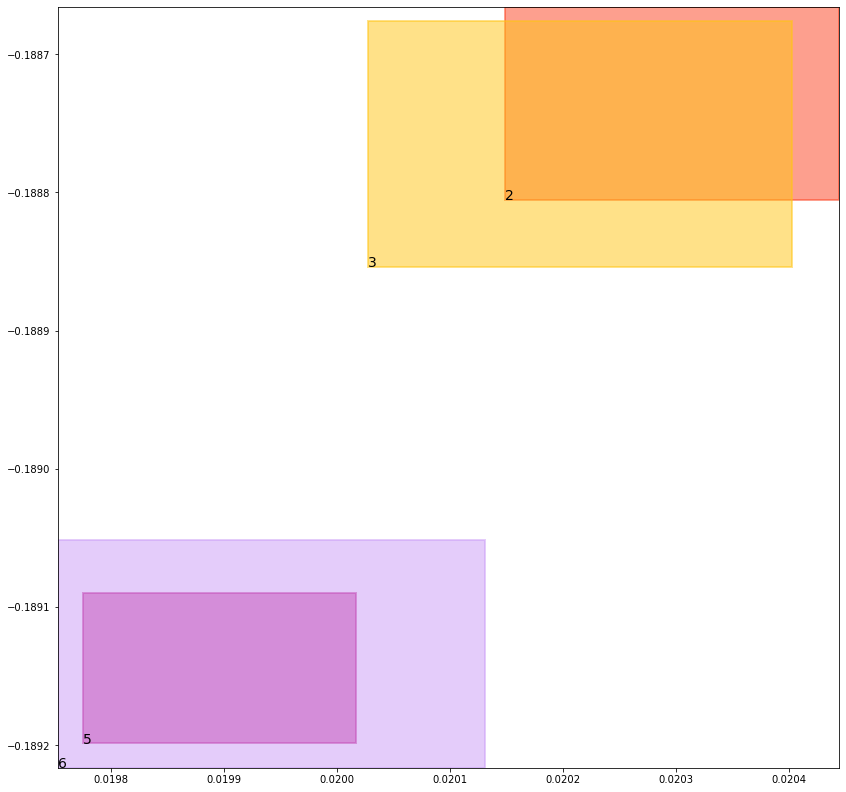

batch (tensor([[6, 2],
        [1, 2],
        [5, 3],
        [4, 6],
        [4, 5],
        [1, 3],
        [3, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0070023452863097, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0065088337287307, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509986460208893, grad_fn=<MulBackward0>)
previous loss: tensor(0.2645098268985748, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03548436239361763 0.020690951496362686 tensor(0.9371027946472168) tensor(0.9717205762863159)
tensor(2) 0.4835255742073059 0.4936578869819641 tensor(0.4842818975448608) tensor(0.4951776266098022)
tensor(3) 0.48267945647239685 0.4943068027496338 tensor(0.4827184081077576) tensor(0.4948658645153046)
tensor(4) 0.042068883776664734 0.006970416288822889 tensor(0.9718114137649536) tensor(0.9573789238929749)
tensor(5) 0.5083234906196594 0.4835548996925354 tensor(0.5094579458236694) tensor(0.4839580655097961)
tensor(6) 0.5095911026000977 0.4837070405483246 tensor(0.5106079578399658) tensor(0.4840222001075745)


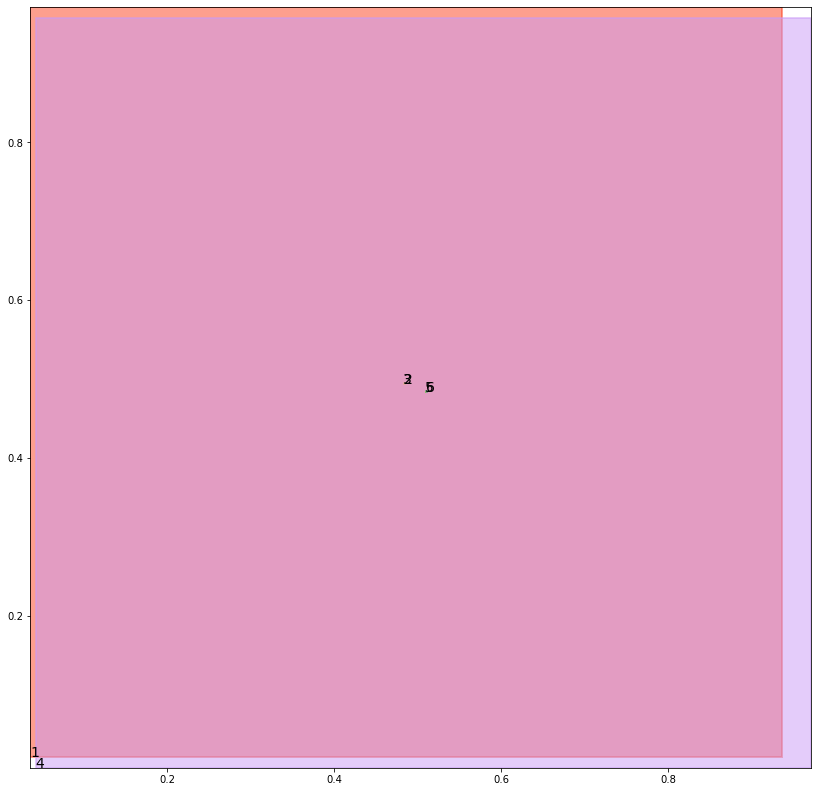

alignment data:
tensor(2) 0.02223503589630127 -0.15073394775390625 tensor(0.0227036476135254) tensor(-0.1505177617073059)
tensor(3) 0.022325992584228516 -0.15068349242210388 tensor(0.0224759578704834) tensor(-0.1506125330924988)
tensor(5) 0.021906137466430664 -0.15110331773757935 tensor(0.0221177339553833) tensor(-0.1510125696659088)
tensor(6) 0.0220644474029541 -0.1510390043258667 tensor(0.0222419500350952) tensor(-0.1509633958339691)


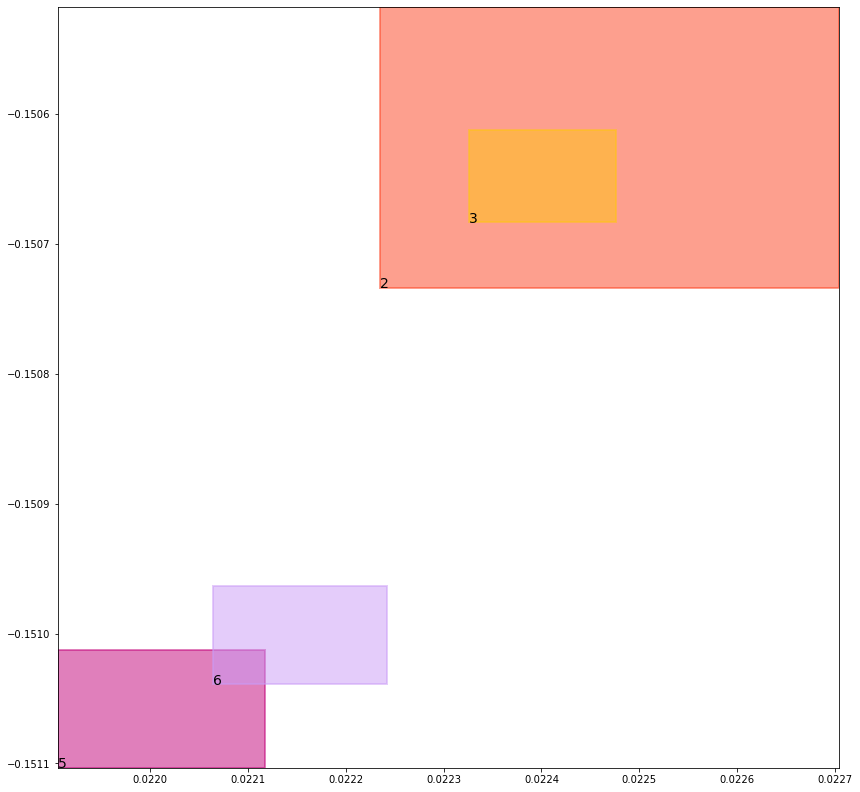

batch (tensor([[3, 5],
        [4, 5],
        [4, 6],
        [5, 3],
        [2, 6],
        [6, 2],
        [1, 2],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [5, 3],
        [2, 6],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069976034574211, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064960853196681, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510012686252594, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644949555397034, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.0354418009519577 0.020603541284799576 tensor(0.9373183846473694) tensor(0.9717697501182556)
tensor(2) 0.4836702346801758 0.4938560426235199 tensor(0.4842777550220490) tensor(0.4950517416000366)
tensor(3) 0.48249122500419617 0.49409765005111694 tensor(0.4830560982227325) tensor(0.4950097203254700)
tensor(4) 0.04189639165997505 0.006937271449714899 tensor(0.9718366265296936) tensor(0.9574377536773682)
tensor(5) 0.5085271000862122 0.4833618700504303 tensor(0.5089214444160461) tensor(0.4840387701988220)
tensor(6) 0.5096946358680725 0.4837501049041748 tensor(0.5100022554397583) tensor(0.4846312403678894)


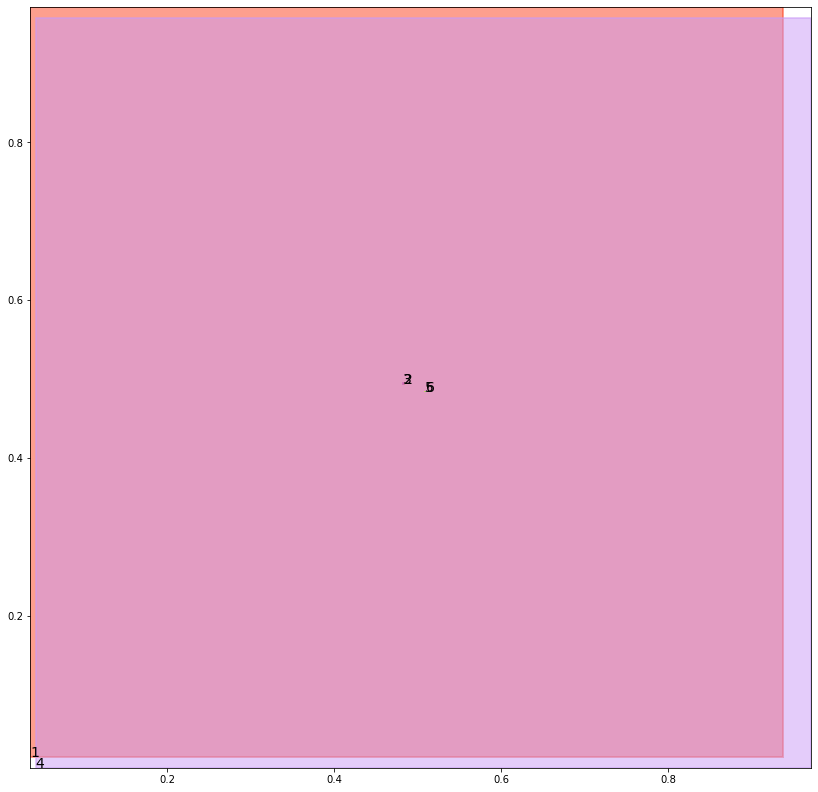

alignment data:
tensor(2) 0.024298548698425293 -0.10853472352027893 tensor(0.0246684551239014) tensor(-0.1083641946315765)
tensor(3) 0.024251341819763184 -0.10854700207710266 tensor(0.0245431661605835) tensor(-0.1084133088588715)
tensor(5) 0.023876547813415527 -0.10894760489463806 tensor(0.0240908861160278) tensor(-0.1088492572307587)
tensor(6) 0.02408754825592041 -0.10885736346244812 tensor(0.0243471860885620) tensor(-0.1087367236614227)


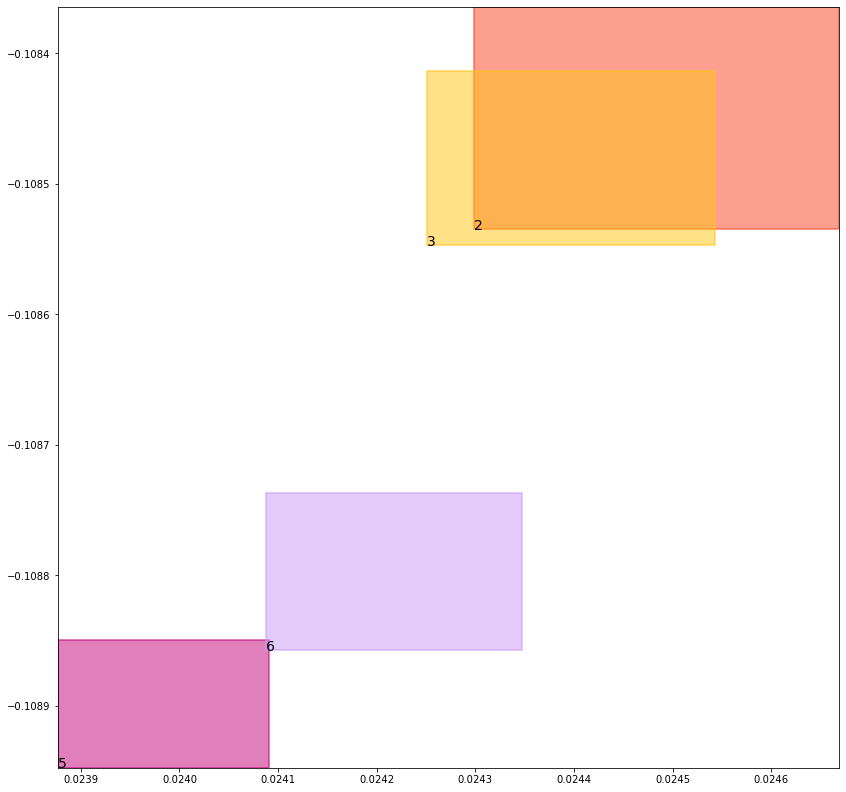

batch (tensor([[1, 3],
        [6, 2],
        [4, 6],
        [2, 6],
        [4, 5],
        [3, 5],
        [1, 2],
        [5, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [2, 6],
        [3, 5],
        [5, 3]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069947224110365, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064853467047215, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999871253967, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644800543785095, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03539932146668434 0.02051672898232937 tensor(0.9375327229499817) tensor(0.9718189239501953)
tensor(2) 0.48364779353141785 0.4945477545261383 tensor(0.4841064512729645) tensor(0.4947438836097717)
tensor(3) 0.48261702060699463 0.4937536418437958 tensor(0.4831460714340210) tensor(0.4952818155288696)
tensor(4) 0.04172514006495476 0.006904390640556812 tensor(0.9718618392944336) tensor(0.9574965238571167)
tensor(5) 0.5077311396598816 0.4837242066860199 tensor(0.5091335773468018) tensor(0.4839496910572052)
tensor(6) 0.5092628002166748 0.48368674516677856 tensor(0.5101174116134644) tensor(0.4848951697349548)


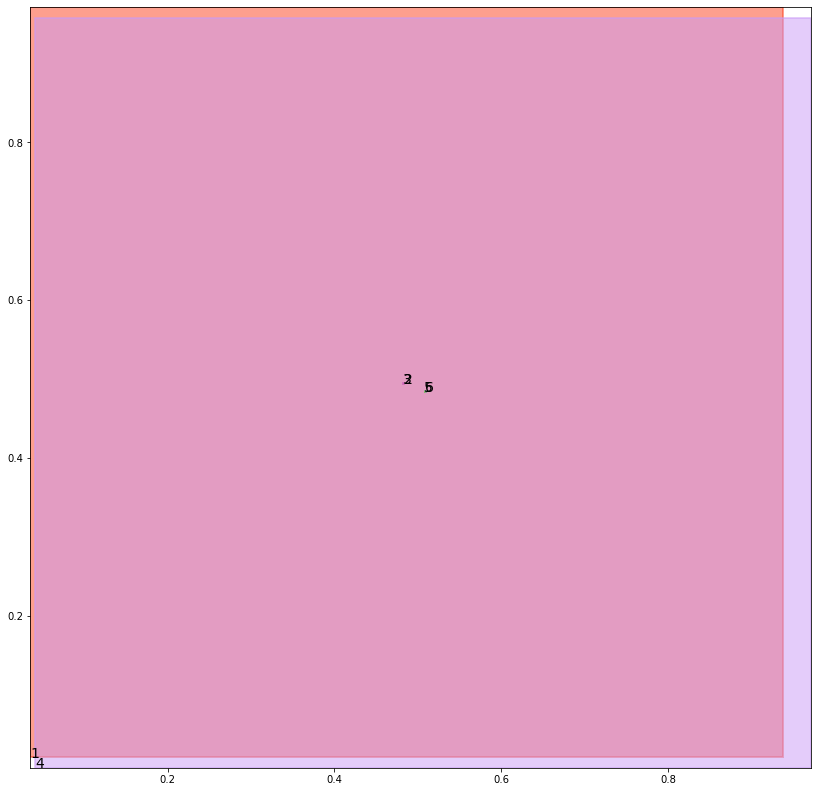

alignment data:
tensor(2) 0.027313828468322754 -0.07043388485908508 tensor(0.0274081230163574) tensor(-0.0703930258750916)
tensor(3) 0.027009129524230957 -0.07056975364685059 tensor(0.0274590253829956) tensor(-0.0703607201576233)
tensor(5) 0.026736736297607422 -0.07091265916824341 tensor(0.0269273519515991) tensor(-0.0708342194557190)
tensor(6) 0.0268704891204834 -0.07086220383644104 tensor(0.0272673368453979) tensor(-0.0706811547279358)


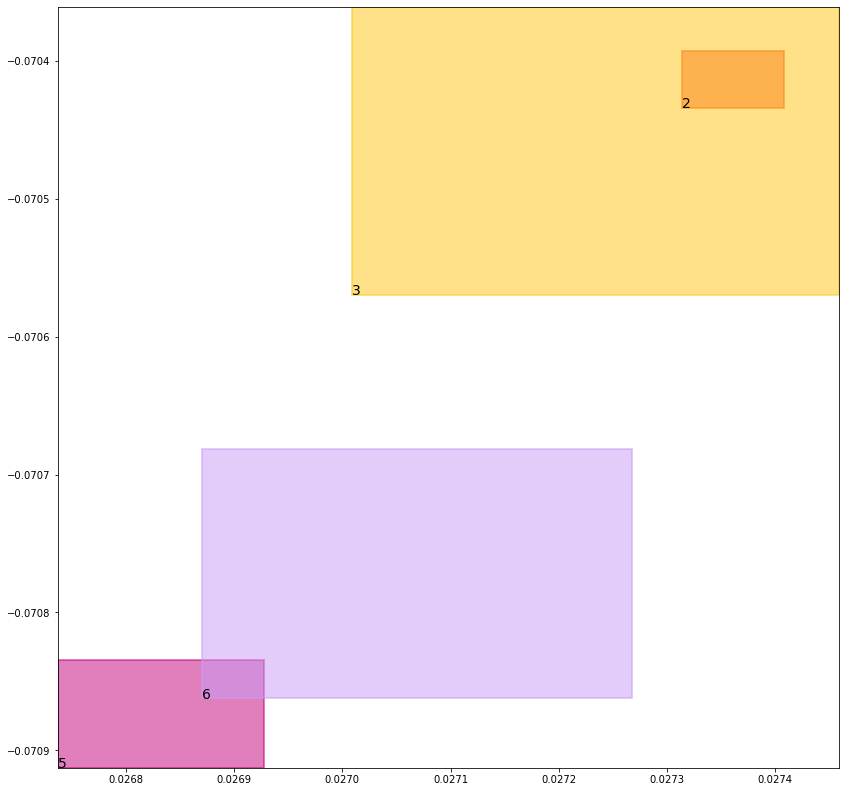

batch (tensor([[3, 5],
        [2, 6],
        [4, 5],
        [1, 2],
        [1, 3],
        [5, 3],
        [4, 6],
        [6, 2]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[3, 5],
        [2, 6],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069831679575145, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064921556040645, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999871253967, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644753158092499, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035356923937797546 0.020430520176887512 tensor(0.9377458095550537) tensor(0.9718679189682007)
tensor(2) 0.48373329639434814 0.4942750036716461 tensor(0.4842088222503662) tensor(0.4956710636615753)
tensor(3) 0.48297715187072754 0.4937966763973236 tensor(0.4830616414546967) tensor(0.4951615929603577)
tensor(4) 0.04155503213405609 0.006871778517961502 tensor(0.9718869328498840) tensor(0.9575551152229309)
tensor(5) 0.5073510408401489 0.48370838165283203 tensor(0.5092456340789795) tensor(0.4845812916755676)
tensor(6) 0.5092685222625732 0.4838150441646576 tensor(0.5099642276763916) tensor(0.4845536351203918)


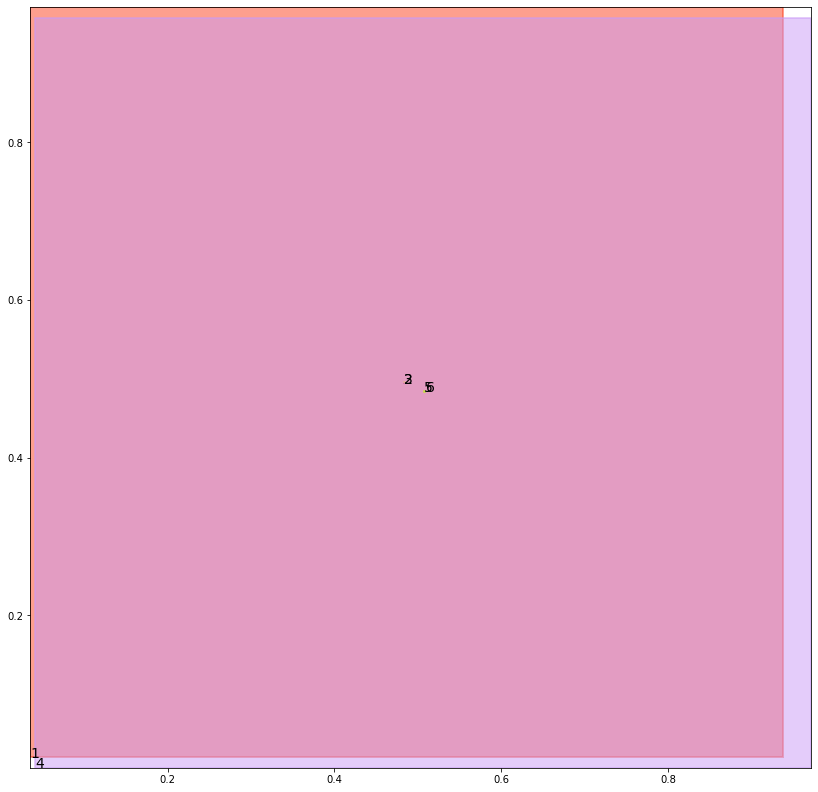

alignment data:
tensor(2) 0.027712583541870117 -0.04260089993476868 tensor(0.0281230211257935) tensor(-0.0424101650714874)
tensor(3) 0.02751612663269043 -0.04268765449523926 tensor(0.0278817415237427) tensor(-0.0425149202346802)
tensor(5) 0.027162551879882812 -0.043061792850494385 tensor(0.0275695323944092) tensor(-0.0428849458694458)
tensor(6) 0.027370691299438477 -0.04297938942909241 tensor(0.0276296138763428) tensor(-0.0428624749183655)


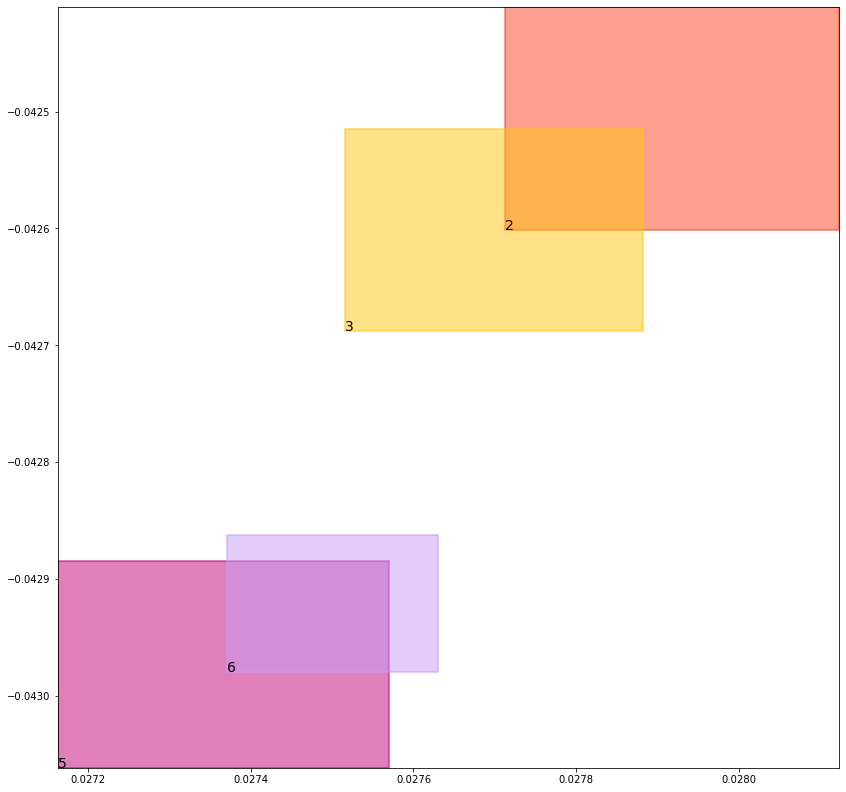

batch (tensor([[4, 6],
        [6, 2],
        [3, 5],
        [1, 2],
        [1, 3],
        [5, 3],
        [4, 5],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[6, 2],
        [3, 5],
        [5, 3],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069797169417143, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064915260300040, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509970963001251, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644683420658112, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03531460836529732 0.02034490928053856 tensor(0.9379577040672302) tensor(0.9719167947769165)
tensor(2) 0.4840085208415985 0.49404364824295044 tensor(0.4844647049903870) tensor(0.4961585402488708)
tensor(3) 0.4830912947654724 0.4941868185997009 tensor(0.4831542968750000) tensor(0.4946936964988708)
tensor(4) 0.04138603433966637 0.006839432753622532 tensor(0.9719121456146240) tensor(0.9576138257980347)
tensor(5) 0.5077048540115356 0.4836566150188446 tensor(0.5089091062545776) tensor(0.4848215878009796)
tensor(6) 0.5095707178115845 0.48368361592292786 tensor(0.5096680521965027) tensor(0.4841148853302002)


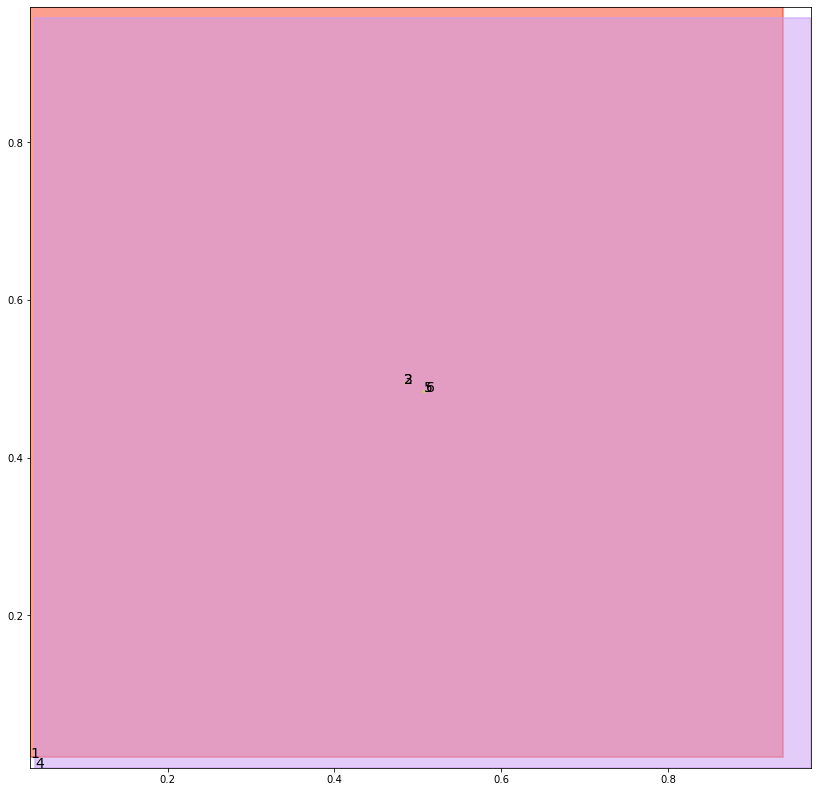

alignment data:
tensor(2) 0.02609074115753174 -0.011195987462997437 tensor(0.0266883373260498) tensor(-0.0109165906906128)
tensor(3) 0.02604210376739502 -0.011211395263671875 tensor(0.0261808633804321) tensor(-0.0111461579799652)
tensor(5) 0.025598645210266113 -0.011629432439804077 tensor(0.0260173082351685) tensor(-0.0114409923553467)
tensor(6) 0.02578139305114746 -0.01155853271484375 tensor(0.0259035825729370) tensor(-0.0115013718605042)


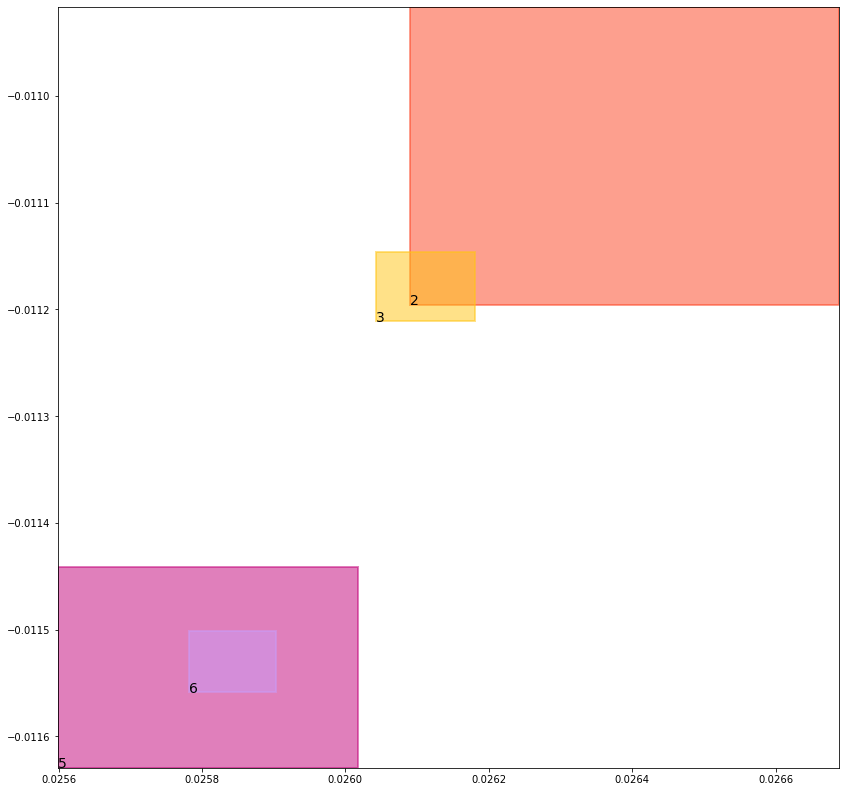

batch (tensor([[3, 5],
        [5, 3],
        [4, 6],
        [1, 3],
        [6, 2],
        [1, 2],
        [2, 6],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069710137322545, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064763780683279, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509988546371460, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644462585449219, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03527237847447395 0.02025989443063736 tensor(0.9381683468818665) tensor(0.9719655513763428)
tensor(2) 0.48413315415382385 0.494027704000473 tensor(0.4844936728477478) tensor(0.4960575997829437)
tensor(3) 0.48293015360832214 0.49391821026802063 tensor(0.4834602773189545) tensor(0.4948859512805939)
tensor(4) 0.04121821001172066 0.006807347759604454 tensor(0.9719372987747192) tensor(0.9576722979545593)
tensor(5) 0.5081680417060852 0.4837769865989685 tensor(0.5087183713912964) tensor(0.4844976067543030)
tensor(6) 0.5094579458236694 0.48347029089927673 tensor(0.5096166729927063) tensor(0.4842088222503662)


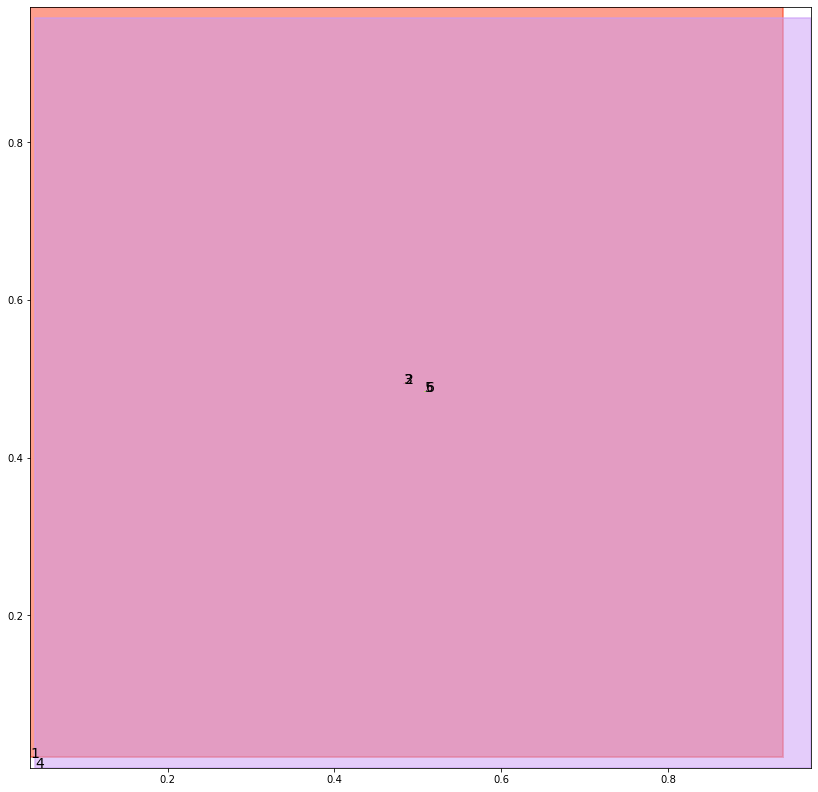

alignment data:
tensor(2) 0.02564692497253418 0.009164690971374512 tensor(0.0262132883071899) tensor(0.0094301104545593)
tensor(3) 0.025504589080810547 0.009107410907745361 tensor(0.0258084535598755) tensor(0.0092469751834869)
tensor(5) 0.025225281715393066 0.008762627840042114 tensor(0.0254663228988647) tensor(0.0088722109794617)
tensor(6) 0.025266647338867188 0.008771330118179321 tensor(0.0254753828048706) tensor(0.0088688731193542)


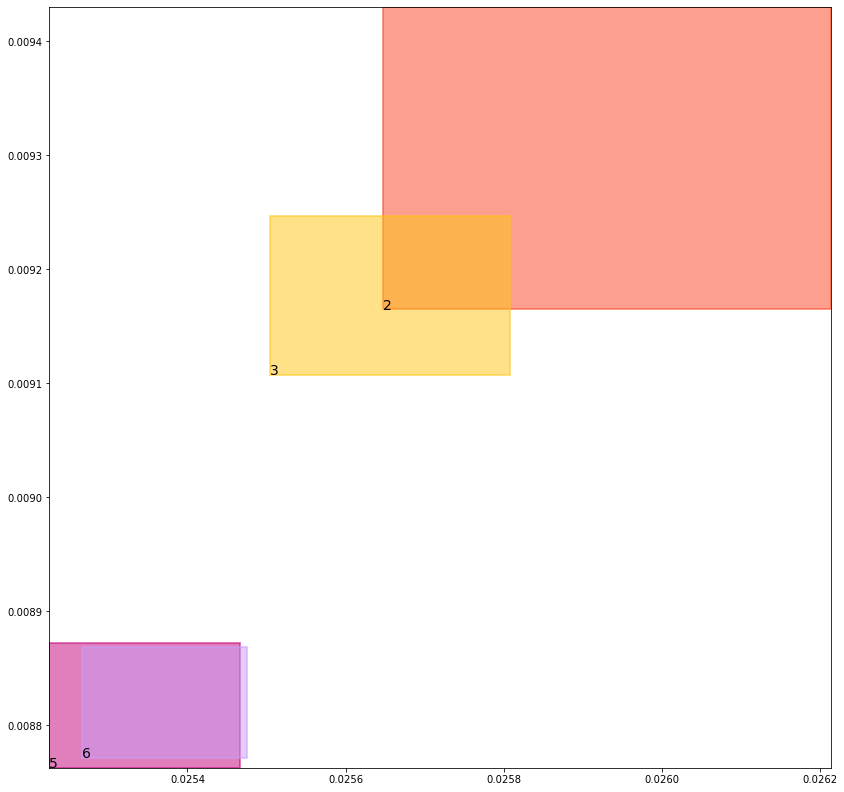

batch (tensor([[2, 6],
        [1, 2],
        [5, 3],
        [6, 2],
        [4, 6],
        [3, 5],
        [4, 5],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [5, 3],
        [6, 2],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069700530730188, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064660292118788, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509985566139221, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644346356391907, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035230230540037155 0.020175466313958168 tensor(0.9383778572082520) tensor(0.9720143079757690)
tensor(2) 0.4838900864124298 0.4942049980163574 tensor(0.4845505952835083) tensor(0.4954281449317932)
tensor(3) 0.48305925726890564 0.49357619881629944 tensor(0.4835431873798370) tensor(0.4951610267162323)
tensor(4) 0.04105158522725105 0.006775515154004097 tensor(0.9719622731208801) tensor(0.9577308297157288)
tensor(5) 0.5079232454299927 0.483674019575119 tensor(0.5089223980903625) tensor(0.4840507507324219)
tensor(6) 0.5091579556465149 0.4838544726371765 tensor(0.5095989108085632) tensor(0.4841160476207733)


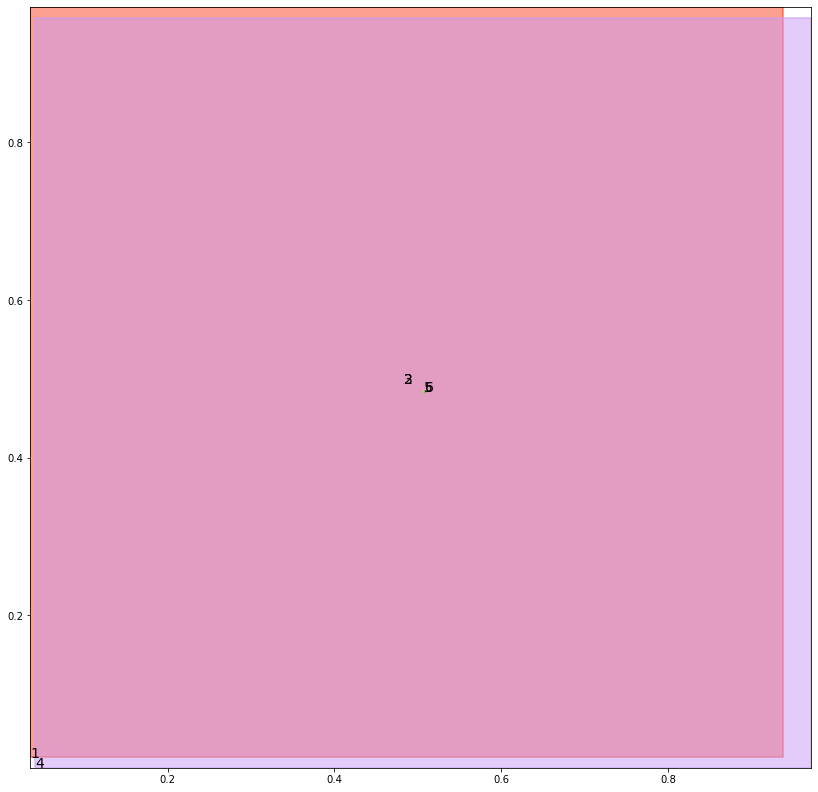

alignment data:
tensor(2) 0.028389811515808105 0.02916082739830017 tensor(0.0287734270095825) tensor(0.0293369293212891)
tensor(3) 0.02814638614654541 0.02905246615409851 tensor(0.0286080837249756) tensor(0.0292671322822571)
tensor(5) 0.02789783477783203 0.028725862503051758 tensor(0.0280910730361938) tensor(0.0288089811801910)
tensor(6) 0.028061866760253906 0.02879318594932556 tensor(0.0281721353530884) tensor(0.0288417637348175)


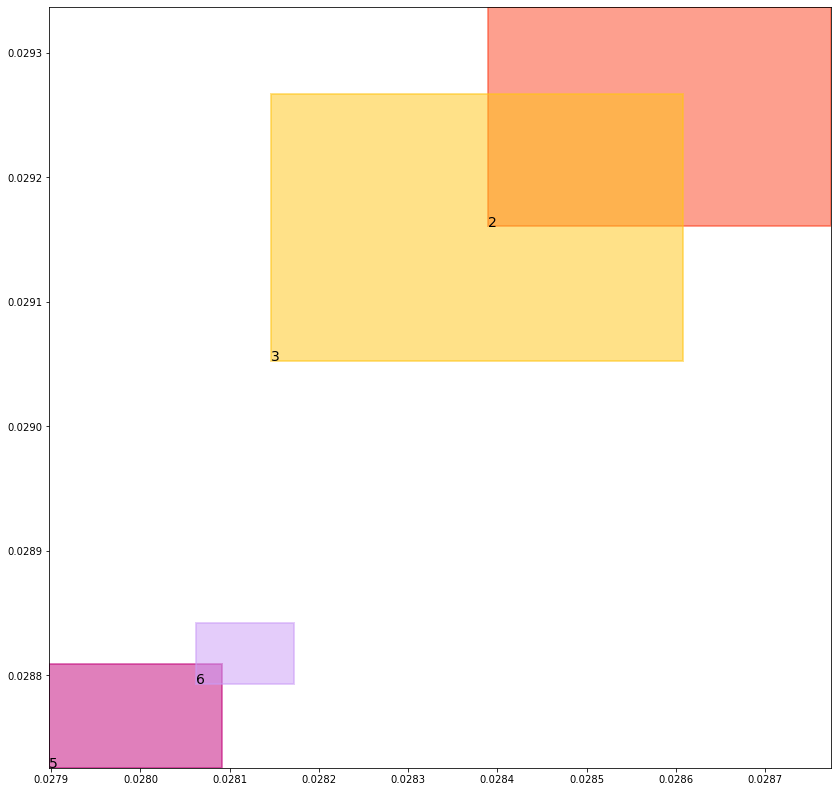

batch (tensor([[1, 3],
        [4, 5],
        [5, 3],
        [3, 5],
        [1, 2],
        [4, 6],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[5, 3],
        [3, 5],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069642011076212, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064610196277499, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510000765323639, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644253075122833, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035188157111406326 0.02009160816669464 tensor(0.9385861158370972) tensor(0.9720628857612610)
tensor(2) 0.4840013086795807 0.4943316876888275 tensor(0.4846332371234894) tensor(0.4945571422576904)
tensor(3) 0.4833674430847168 0.493627667427063 tensor(0.4835070669651031) tensor(0.4950475096702576)
tensor(4) 0.04088611528277397 0.0067439391277730465 tensor(0.9719874262809753) tensor(0.9577891826629639)
tensor(5) 0.5081267356872559 0.4834635555744171 tensor(0.5083966255187988) tensor(0.4841355979442596)
tensor(6) 0.509138822555542 0.48385313153266907 tensor(0.5094710588455200) tensor(0.4847726225852966)


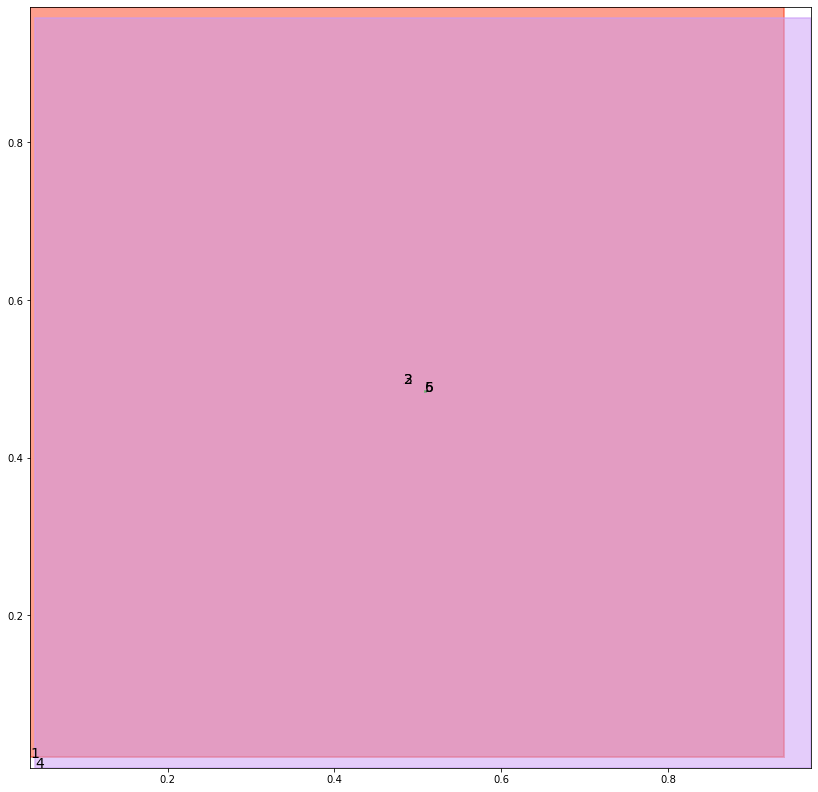

alignment data:
tensor(2) 0.02987372875213623 0.04878917336463928 tensor(0.0299928188323975) tensor(0.0488402247428894)
tensor(3) 0.029628872871398926 0.04867851734161377 tensor(0.0300149917602539) tensor(0.0488601326942444)
tensor(5) 0.029305100440979004 0.04831749200820923 tensor(0.0295070409774780) tensor(0.0484108924865723)
tensor(6) 0.029503226280212402 0.0484028160572052 tensor(0.0297760963439941) tensor(0.0485292375087738)


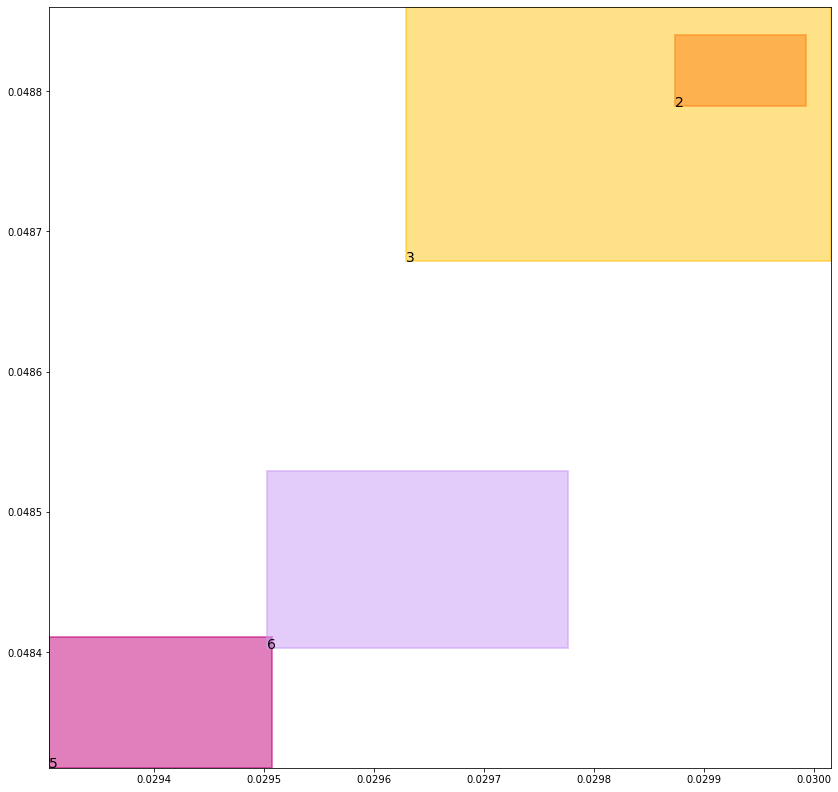

batch (tensor([[2, 6],
        [6, 2],
        [1, 3],
        [4, 6],
        [5, 3],
        [1, 2],
        [4, 5],
        [3, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[2, 6],
        [6, 2],
        [5, 3],
        [3, 5]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069451443850994, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064569707028568, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510014772415161, grad_fn=<MulBackward0>)
previous loss: tensor(0.2644035816192627, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03514615446329117 0.020008327439427376 tensor(0.9387933015823364) tensor(0.9721114039421082)
tensor(2) 0.48441562056541443 0.49384796619415283 tensor(0.4847565889358521) tensor(0.4946818947792053)
tensor(3) 0.4834757149219513 0.4940318763256073 tensor(0.4836008548736572) tensor(0.4945840239524841)
tensor(4) 0.04072180762887001 0.006712610367685556 tensor(0.9720124006271362) tensor(0.9578475952148438)
tensor(5) 0.5072157382965088 0.4838111400604248 tensor(0.5087341070175171) tensor(0.4840497970581055)
tensor(6) 0.509099006652832 0.48380133509635925 tensor(0.5095164775848389) tensor(0.4850227534770966)


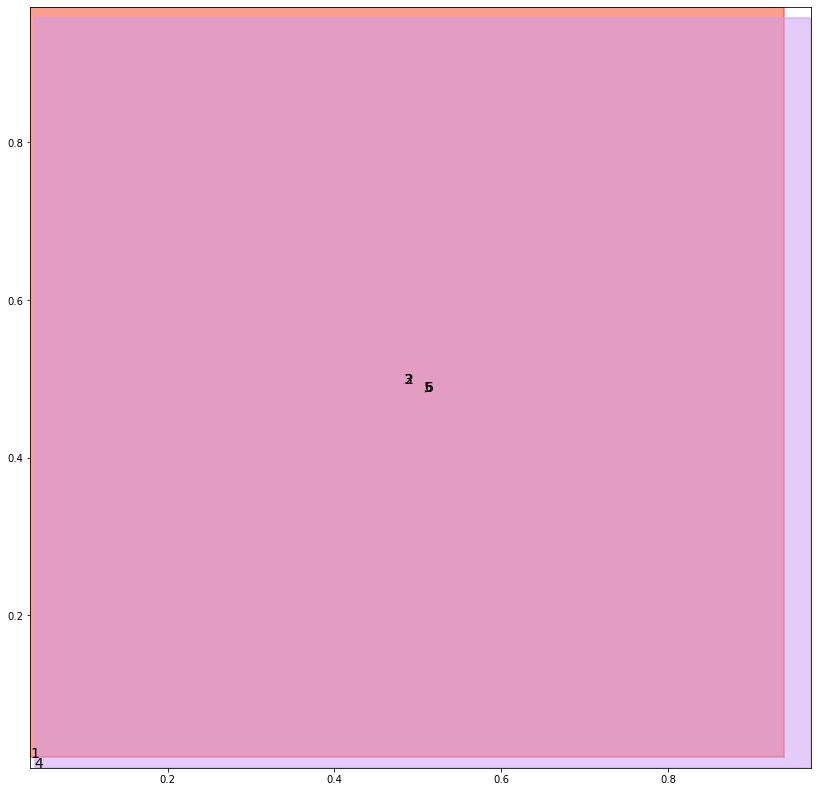

alignment data:
tensor(2) 0.032155394554138184 0.06801155209541321 tensor(0.0324068069458008) tensor(0.0681277513504028)
tensor(3) 0.032114624977111816 0.06800004839897156 tensor(0.0322716236114502) tensor(0.0680733323097229)
tensor(5) 0.031682610511779785 0.06759658455848694 tensor(0.0318893194198608) tensor(0.0676818192005157)
tensor(6) 0.03185868263244629 0.0676642656326294 tensor(0.0322189331054688) tensor(0.0678315162658691)


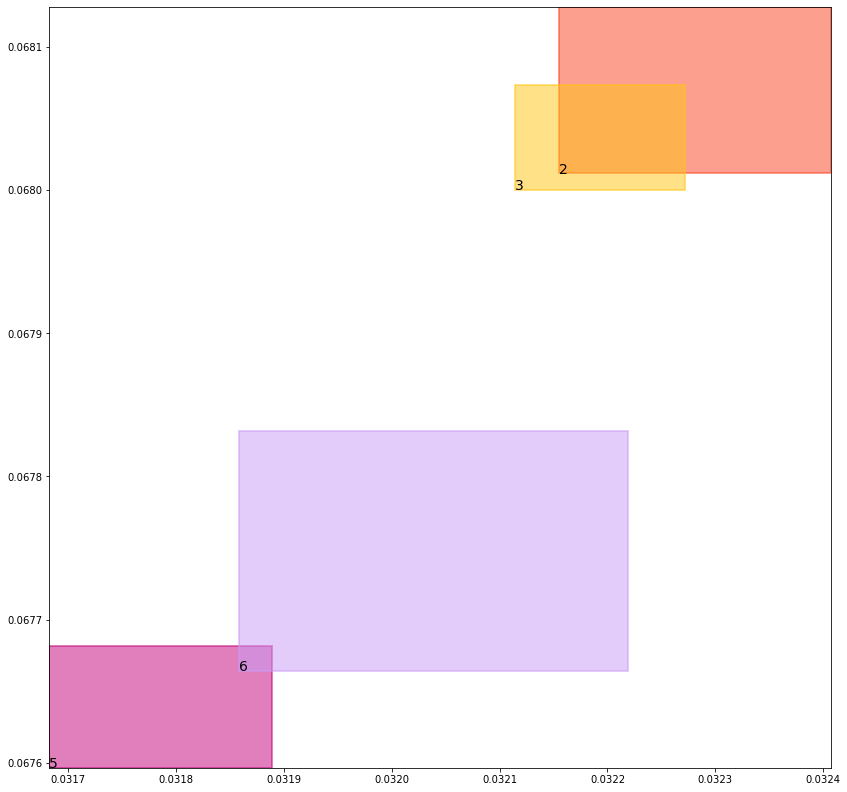

batch (tensor([[3, 5],
        [1, 3],
        [2, 6],
        [4, 6],
        [5, 3],
        [6, 2],
        [1, 2],
        [4, 5]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [2, 6],
        [5, 3],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069341608323157, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064623397774994, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510013878345490, grad_fn=<MulBackward0>)
previous loss: tensor(0.2643978893756866, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.03510424494743347 0.019925612956285477 tensor(0.9389992952346802) tensor(0.9721597433090210)
tensor(2) 0.48452508449554443 0.4939234256744385 tensor(0.4848126173019409) tensor(0.4946015775203705)
tensor(3) 0.48337578773498535 0.4938102662563324 tensor(0.4838396012783051) tensor(0.4947494864463806)
tensor(4) 0.0405585840344429 0.006681530736386776 tensor(0.9720374345779419) tensor(0.9579058885574341)
tensor(5) 0.5068483948707581 0.48380857706069946 tensor(0.5088441967964172) tensor(0.4846638739109039)
tensor(6) 0.509006679058075 0.48393914103507996 tensor(0.5094395279884338) tensor(0.4846667349338531)


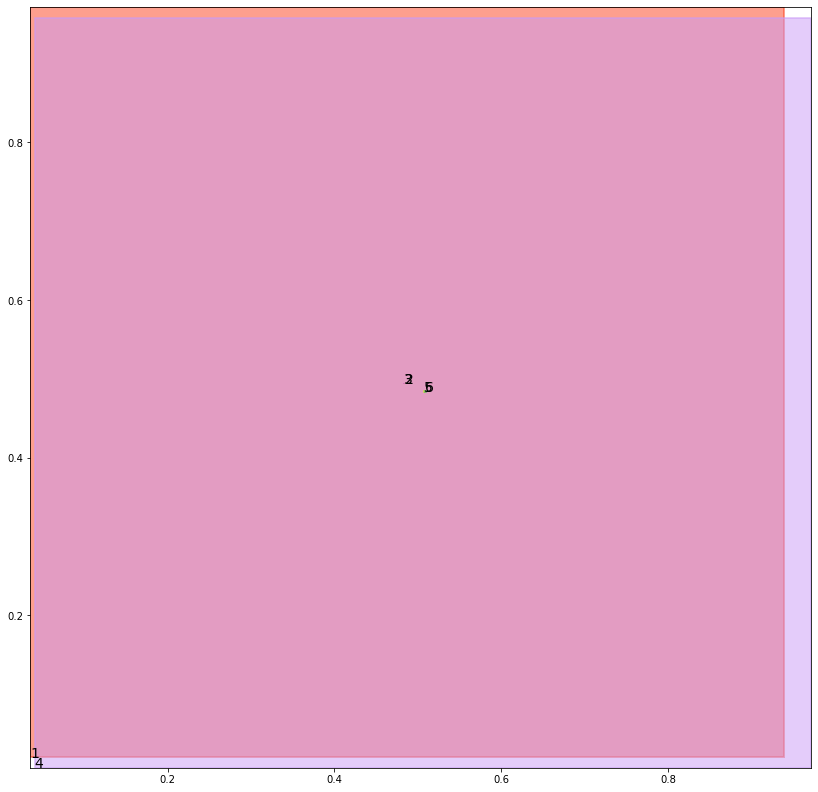

alignment data:
tensor(2) 0.034316062927246094 0.08379019796848297 tensor(0.0345216989517212) tensor(0.0838850885629654)
tensor(3) 0.03417706489562988 0.08373396098613739 tensor(0.0344679355621338) tensor(0.0838677734136581)
tensor(5) 0.03378021717071533 0.08334977924823761 tensor(0.0341945886611938) tensor(0.0835293978452682)
tensor(6) 0.0340195894241333 0.08344511687755585 tensor(0.0342519283294678) tensor(0.0835515409708023)


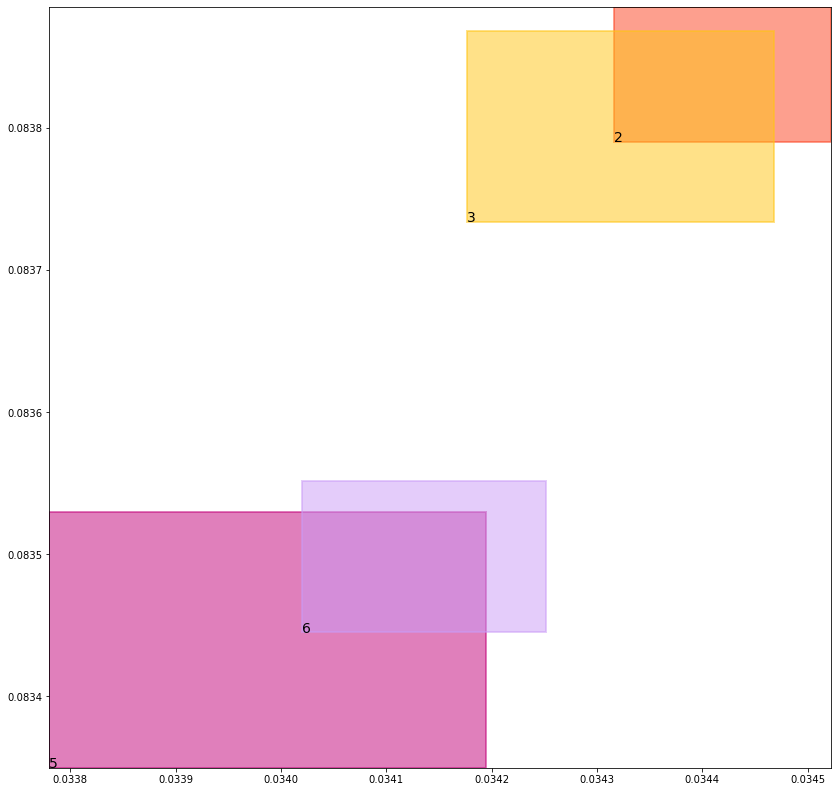

batch (tensor([[4, 6],
        [3, 5],
        [1, 2],
        [1, 3],
        [4, 5],
        [5, 3],
        [6, 2],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 6],
        [4, 5]]), tensor([[3, 5],
        [5, 3],
        [6, 2],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069313999265432, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064625795930624, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509997487068176, grad_fn=<MulBackward0>)
previous loss: tensor(0.2643937170505524, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035062409937381744 0.019843462854623795 tensor(0.9392040371894836) tensor(0.9722079634666443)
tensor(2) 0.4842374324798584 0.4943351149559021 tensor(0.4849294424057007) tensor(0.4945027530193329)
tensor(3) 0.4835037291049957 0.49346378445625305 tensor(0.4839177727699280) tensor(0.4950381815433502)
tensor(4) 0.04039642587304115 0.006650701630860567 tensor(0.9720624089241028) tensor(0.9579640626907349)
tensor(5) 0.5072164535522461 0.48375824093818665 tensor(0.5085040926933289) tensor(0.4848956167697906)
tensor(6) 0.5089531540870667 0.4837704002857208 tensor(0.5091668367385864) tensor(0.4842479526996613)


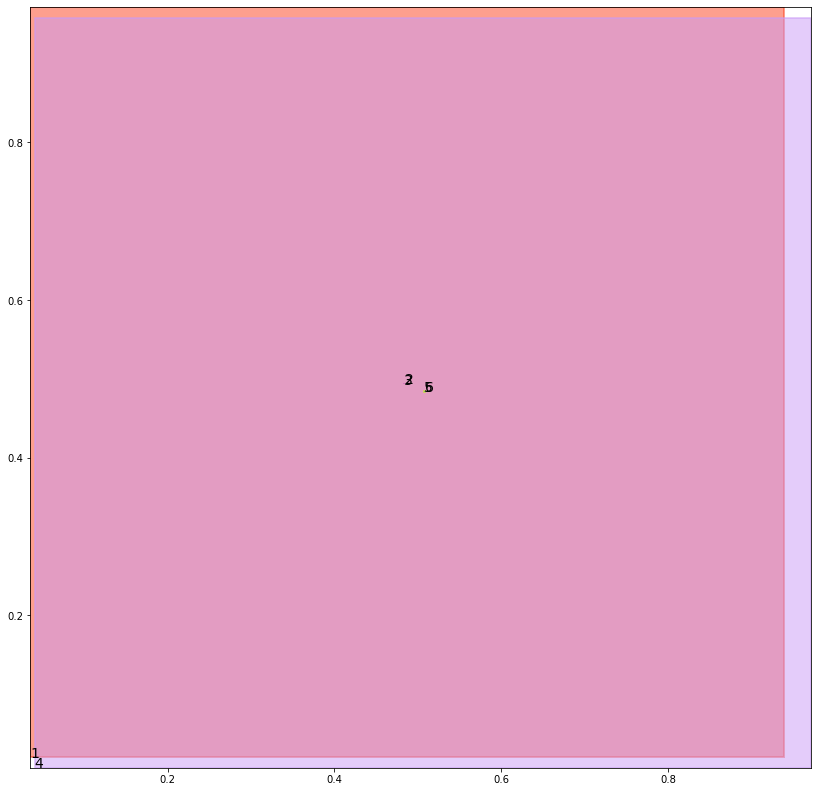

alignment data:
tensor(2) 0.03633260726928711 0.09485960006713867 tensor(0.0364427566528320) tensor(0.0949057936668396)
tensor(3) 0.0360337495803833 0.09472420811653137 tensor(0.0364871025085449) tensor(0.0949353277683258)
tensor(5) 0.03574037551879883 0.09438738226890564 tensor(0.0361620187759399) tensor(0.0945762097835541)
tensor(6) 0.035909056663513184 0.09445267915725708 tensor(0.0360548496246338) tensor(0.0945199131965637)


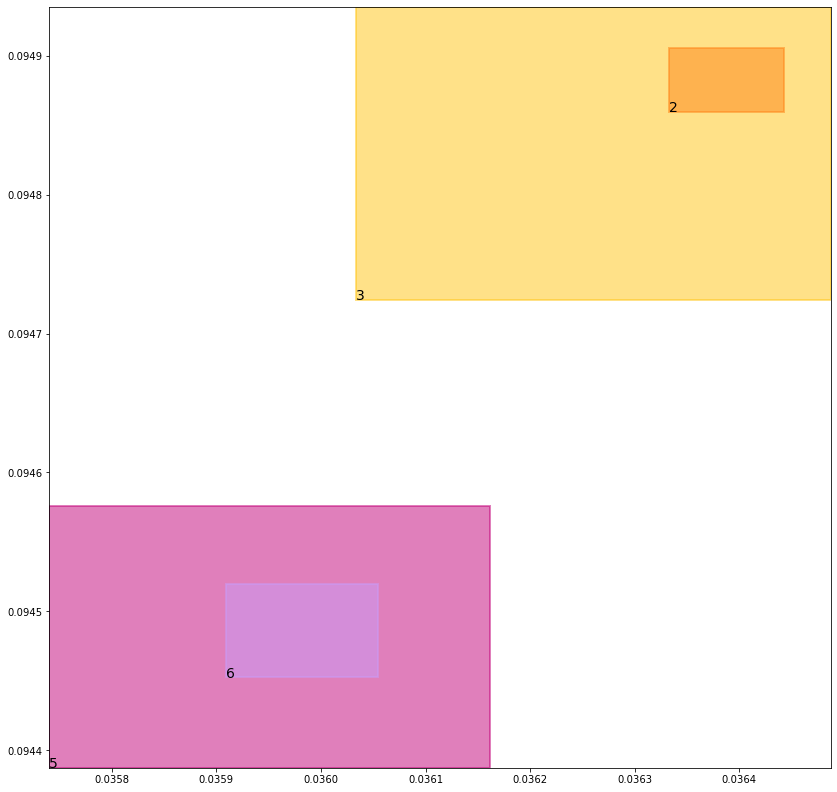

batch (tensor([[2, 6],
        [1, 2],
        [5, 3],
        [4, 5],
        [3, 5],
        [6, 2],
        [4, 6],
        [1, 3]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 2],
        [1, 3]]), tensor([[4, 5],
        [4, 6]]), tensor([[2, 6],
        [5, 3],
        [3, 5],
        [6, 2]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069291489198804, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064507615752518, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2509999573230743, grad_fn=<MulBackward0>)
previous loss: tensor(0.2643798589706421, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

tree data:
tensor(1) 0.035020649433135986 0.01976187340915203 tensor(0.9394076466560364) tensor(0.9722560644149780)
tensor(2) 0.4843737781047821 0.49428585171699524 tensor(0.4850006401538849) tensor(0.4945093393325806)
tensor(3) 0.4837379455566406 0.4935072064399719 tensor(0.4839502573013306) tensor(0.4949369430541992)
tensor(4) 0.04023534432053566 0.006620113737881184 tensor(0.9720873236656189) tensor(0.9580222964286804)
tensor(5) 0.5077593922615051 0.48387929797172546 tensor(0.5082432627677917) tensor(0.4845670759677887)
tensor(6) 0.5089104771614075 0.4835410714149475 tensor(0.5090549588203430) tensor(0.4843432009220123)


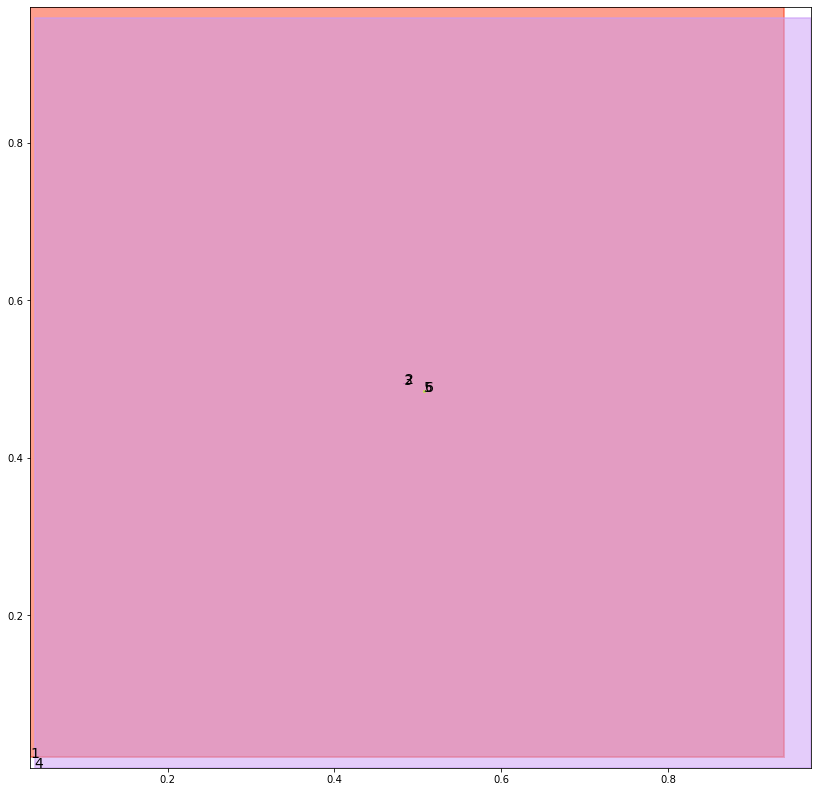

alignment data:
tensor(2) 0.03808403015136719 0.10318499803543091 tensor(0.0382026433944702) tensor(0.1032359004020691)
tensor(3) 0.0378185510635376 0.103064626455307 tensor(0.0382149219512939) tensor(0.1032504439353943)
tensor(5) 0.03757810592651367 0.10275048017501831 tensor(0.0378050804138184) tensor(0.1028539836406708)
tensor(6) 0.03759884834289551 0.10275077819824219 tensor(0.0378236770629883) tensor(0.1028559505939484)


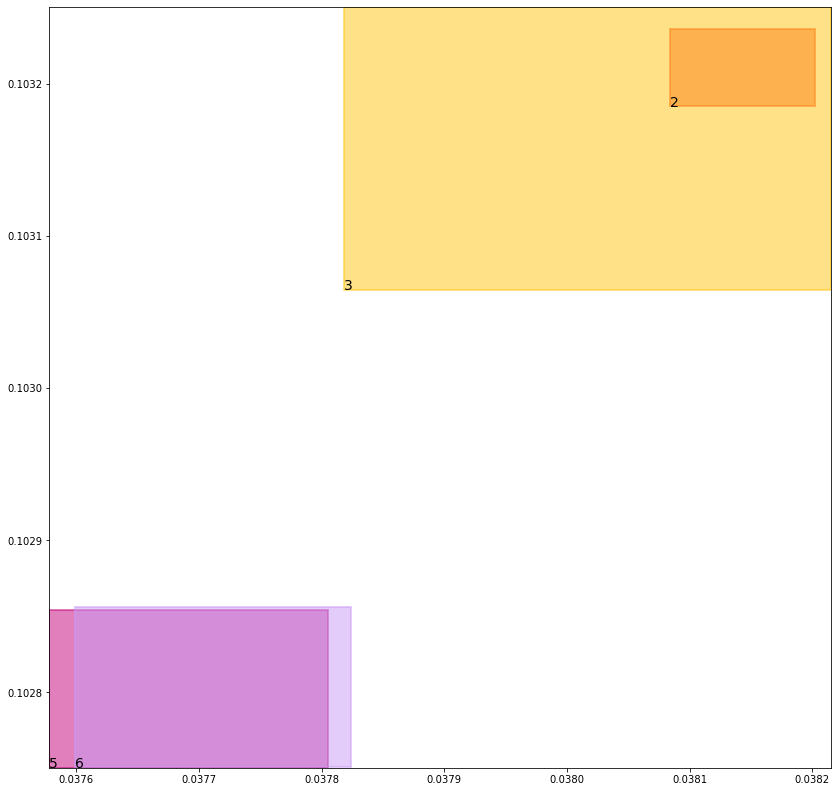

batch (tensor([[1, 3],
        [1, 2],
        [4, 5],
        [6, 2],
        [5, 3],
        [3, 5],
        [4, 6],
        [2, 6]]), tensor([1., 1., 1., 1., 1., 1., 1., 1.]))
self.data_in: (tensor([[1, 3],
        [1, 2]]), tensor([[4, 5],
        [4, 6]]), tensor([[6, 2],
        [5, 3],
        [3, 5],
        [2, 6]]))
self.data_out: (tensor([1., 1.]), tensor([1., 1.]), tensor([1., 1., 1., 1.]))
key mouse_cond_kl_loss
val tensor(0.0069190361537039, grad_fn=<MeanBackward0>)
key human_cond_kl_loss
val tensor(0.0064382534474134, grad_fn=<MeanBackward0>)
key align_cond_kl_loss
val tensor(0.2510017752647400, grad_fn=<MulBackward0>)
previous loss: tensor(0.2643590569496155, grad_fn=<AddBackward0>)
align_evaluation_train_align_0.8_metric_hard_accuracy_align tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align tensor(nan)
align_evaluation_train_align_0.8_metric_hard_accuracy_align_mean tensor(0.)
align_evaluation_train_align_0.8_metric_hard_f1_align_mean tensor(nan)
align_ev

In [18]:
nEpochs = 300
l.train(nEpochs)